In [1]:
import numpy as np
np.set_printoptions(suppress=True)
import time
from numba import njit,guvectorize,float64
import scipy.optimize as opt
from matplotlib import pyplot as plt
import math
#Set
t = np.arange(1, 101)
NT = len(t)

In [2]:
#Parameters
fosslim = 6000 # Maximum cumulative extraction fossil fuels (GtC); denoted by CCum
tstep  = 5 # Years per Period
ifopt  = 0 # Indicator where optimized is 1 and base is 0

In [3]:
#Preferences

elasmu = 1.45 #  Elasticity of marginal utility of consumption
prstp = 0.015 #   Initial rate of social time preference per year 

#** Population and technology
gama  = 0.300 #   Capital elasticity in production function         /.300 /
pop0  = 7403   # Initial world population 2015 (millions)          /7403 /
popadj = 0.134 #  Growth rate to calibrate to 2050 pop projection  /0.134/
popasym = 11500 # Asymptotic population (millions)                 /11500/
dk  = 0.100 #     Depreciation rate on capital (per year)           /.100 /
q0  = 105.5 #     Initial world gross output 2015 (trill 2010 USD) /105.5/
k0  = 223 #     Initial capital value 2015 (trill 2010 USD)        /223  /
a0  = 5.115 #     Initial level of total factor productivity       /5.115/
ga0  = 0.076 #    Initial growth rate for TFP per 5 years          /0.076/
dela  = 0.005 #   Decline rate of TFP per 5 years                  /0.005/

#** Emissions parameters
gsigma1  = -0.0152 # Initial growth of sigma (per year)            /-0.0152/
dsig  = -0.001 #   Decline rate of decarbonization (per period)    /-0.001 /
eland0 = 2.6 #  Carbon emissions from land 2015 (GtCO2 per year)   / 2.6   /
deland = 0.115 # Decline rate of land emissions (per period)        / .115  /
e0 = 35.85 #    Industrial emissions 2015 (GtCO2 per year)       /35.85  /
miu0  = 0.03 #   Initial emissions control rate for base case 2015  /.03    /

#** Carbon cycle
#* Initial Conditions
mat0 = 851 #  Initial Concentration in atmosphere 2015 (GtC)       /851  /
mu0  = 460 #  Initial Concentration in upper strata 2015 (GtC)     /460  /
ml0  = 1740 #  Initial Concentration in lower strata 2015 (GtC)    /1740 /
mateq = 588 # mateq Equilibrium concentration atmosphere  (GtC)    /588  /
mueq  = 360 # mueq Equilibrium concentration in upper strata (GtC) /360  /
mleq = 1720 # mleq Equilibrium concentration in lower strata (GtC) /1720 /

#* Flow paramaters, denoted by Phi_ij in the model
b12  = 0.12 #    Carbon cycle transition matrix                     /.12  /
b23  = 0.007 #   Carbon cycle transition matrix                    /0.007/
#* These are for declaration and are defined later
b11  = None   # Carbon cycle transition matrix
b21  = None  # Carbon cycle transition matrix
b22  = None  # Carbon cycle transition matrix
b32  = None  # Carbon cycle transition matrix
b33  = None  # Carbon cycle transition matrix
sig0  = None  # Carbon intensity 2010 (kgCO2 per output 2005 USD 2010)

#** Climate model parameters
t2xco2  = 3.1 # Equilibrium temp impact (oC per doubling CO2)    / 3.1 /
fex0  = 0.5 #   2015 forcings of non-CO2 GHG (Wm-2)              / 0.5 /
fex1  = 1.0 #   2100 forcings of non-CO2 GHG (Wm-2)              / 1.0 /
tocean0  = 0.0068 # Initial lower stratum temp change (C from 1900) /.0068/
tatm0  = 0.85 #  Initial atmospheric temp change (C from 1900)    /0.85/
c1  = 0.1005 #     Climate equation coefficient for upper level  /0.1005/
c3  = 0.088 #     Transfer coefficient upper to lower stratum    /0.088/
c4  = 0.025 #     Transfer coefficient for lower level           /0.025/
fco22x  = 3.6813 # eta in the model; Eq.22 : Forcings of equilibrium CO2 doubling (Wm-2)   /3.6813 /

#** Climate damage parameters
a10  = 0 #     Initial damage intercept                         /0   /
a20  = None #     Initial damage quadratic term
a1  = 0 #      Damage intercept                                 /0   /
a2  = 0.00236 #      Damage quadratic term                     /0.00236/
a3  = 2.00 #      Damage exponent                              /2.00   /

#** Abatement cost
expcost2 = 2.6 # Theta2 in the model, Eq. 10 Exponent of control cost function             / 2.6  /
pback  = 550 #   Cost of backstop 2010$ per tCO2 2015          / 550  /
gback  = 0.025 #   Initial cost decline backstop cost per period / .025/
limmiu  = 1.2 #  Upper limit on control rate after 2150        / 1.2 /
tnopol  = 45 #  Period before which no emissions controls base  / 45   /
cprice0  = 2 # Initial base carbon price (2010$ per tCO2)      / 2    /
gcprice  = 0.02 # Growth rate of base carbon price per year     /.02  /

#** Scaling and inessential parameters
#* Note that these are unnecessary for the calculations
#* They ensure that MU of first period's consumption =1 and PV cons = PV utilty
scale1  = 0.0302455265681763 #    Multiplicative scaling coefficient           /0.0302455265681763 /
scale2  = -10993.704 #    Additive scaling coefficient       /-10993.704/;

In [4]:
#* Parameters for long-run consistency of carbon cycle 
#(Question)
b11 = 1 - b12
b21 = b12*mateq/mueq
b22 = 1 - b21 - b23
b32 = b23*mueq/mleq
b33 = 1 - b32

#* Further definitions of parameters
a20 = a2
sig0 = e0/(q0*(1-miu0)) #From Eq. 14
lam = fco22x/ t2xco2 #From Eq. 25

l = np.zeros(NT)
l[0] = pop0 #Labor force
al = np.zeros(NT) 
al[0] = a0
gsig = np.zeros(NT) 
gsig[0] = gsigma1
sigma = np.zeros(NT)
sigma[0]= sig0
ga = ga0 * np.exp(-dela*5*(t-1)) #TFP growth rate dynamics, Eq. 7
pbacktime = pback * (1-gback)**(t-1) #Backstop price
etree = eland0*(1-deland)**(t-1) #Emissions from deforestration
rr = 1/((1+prstp)**(tstep*(t-1))) #Eq. 3
#The following three equations define the exogenous radiative forcing; used in Eq. 23  
forcoth = np.full(NT,fex0)
forcoth[0:18] = forcoth[0:18] + (1/17)*(fex1-fex0)*(t[0:18]-1)
forcoth[18:NT] = forcoth[18:NT] + (fex1-fex0)
optlrsav = (dk + .004)/(dk + .004*elasmu + prstp)*gama #Optimal long-run savings rate used for transversality (Question)
cost1 = np.zeros(NT)
cumetree = np.zeros(NT)
cumetree[0] = 100
cpricebase = cprice0*(1+gcprice)**(5*(t-1)) 

In [5]:
@njit('(float64[:], int32)')
def InitializeLabor(il,iNT):
    for i in range(1,iNT):
        il[i] = il[i-1]*(popasym / il[i-1])**popadj

@njit('(float64[:], int32)')        
def InitializeTFP(ial,iNT):
    for i in range(1,iNT):
        ial[i] = ial[i-1]/(1-ga[i-1])
        
@njit('(float64[:], int32)')        
def InitializeGrowthSigma(igsig,iNT):
    for i in range(1,iNT):
        igsig[i] = igsig[i-1]*((1+dsig)**tstep)
        
@njit('(float64[:], float64[:],float64[:],int32)')        
def InitializeSigma(isigma,igsig,icost1,iNT):
    for i in range(1,iNT):
        isigma[i] =  isigma[i-1] * np.exp(igsig[i-1] * tstep)
        icost1[i] = pbacktime[i] * isigma[i]  / expcost2 /1000
        
@njit('(float64[:], int32)')        
def InitializeCarbonTree(icumetree,iNT):
    for i in range(1,iNT):
        icumetree[i] = icumetree[i-1] + etree[i-1]*(5/3.666)


In [6]:
"""
Functions of the model
"""

"""
First: Functions related to emissions of carbon and weather damages
"""

# Retuns the total carbon emissions; Eq. 18
@njit('float64(float64[:],int32)') 
def fE(iEIND,index):
    return iEIND[index] + etree[index]

#Eq.14: Determines the emission of carbon by industry EIND
@njit('float64(float64[:],float64[:],float64[:],int32)') 
def fEIND(iYGROSS, iMIU, isigma,index):
    return isigma[index] * iYGROSS[index] * (1 - iMIU[index])

#Cumulative industrial emission of carbon
@njit('float64(float64[:],float64[:],int32)') 
def fCCA(iCCA,iEIND,index):
    return iCCA[index-1] + iEIND[index-1] * 5 / 3.666

#Cumulative total carbon emission
@njit('float64(float64[:],float64[:],int32)')
def fCCATOT(iCCA,icumetree,index):
    return iCCA[index] + icumetree[index]

#Eq. 22: the dynamics of the radiative forcing
@njit('float64(float64[:],int32)')
def fFORC(iMAT,index):
    return fco22x * np.log(iMAT[index]/588.000)/np.log(2) + forcoth[index]

# Dynamics of Omega; Eq.9
@njit('float64(float64[:],int32)')
def fDAMFRAC(iTATM,index):
    return a1*iTATM[index] + a2*iTATM[index]**a3

#Calculate damages as a function of Gross industrial production; Eq.8 
@njit('float64(float64[:],float64[:],int32)')
def fDAMAGES(iYGROSS,iDAMFRAC,index):
    return iYGROSS[index] * iDAMFRAC[index]

#Dynamics of Lambda; Eq. 10 - cost of the reudction of carbon emission (Abatement cost)
@njit('float64(float64[:],float64[:],float64[:],int32)') 
def fABATECOST(iYGROSS,iMIU,icost1,index):
    return iYGROSS[index] * icost1[index] * iMIU[index]**expcost2

#Marginal Abatement cost
@njit('float64(float64[:],int32)')
def fMCABATE(iMIU,index):
    return pbacktime[index] * iMIU[index]**(expcost2-1)

#Price of carbon reduction
@njit('float64(float64[:],int32)')
def fCPRICE(iMIU,index):
    return pbacktime[index] * (iMIU[index])**(expcost2-1)

#Eq. 19: Dynamics of the carbon concentration in the atmosphere
@njit('float64(float64[:],float64[:],float64[:],int32)') 
def fMAT(iMAT,iMU,iE,index):
    if(index == 0):
        return mat0
    else:
        return iMAT[index-1]*b11 + iMU[index-1]*b21 + iE[index-1] * 5 / 3.666

#Eq. 21: Dynamics of the carbon concentration in the ocean LOW level
@njit('float64(float64[:],float64[:],int32)') 
def fML(iML,iMU,index):
    if(index == 0):
        return ml0
    else:
        return iML[index-1] * b33  + iMU[index-1] * b23

#Eq. 20: Dynamics of the carbon concentration in the ocean UP level
@njit('float64(float64[:],float64[:],float64[:],int32)') 
def fMU(iMAT,iMU,iML,index):
    if(index == 0):
        return mu0
    else:
        return iMAT[index-1]*b12 + iMU[index-1]*b22 + iML[index-1]*b32

#Eq. 23: Dynamics of the atmospheric temperature
@njit('float64(float64[:],float64[:],float64[:],int32)') 
def fTATM(iTATM,iFORC,iTOCEAN,index):
    if(index == 0):
        return tatm0
    else:
        return iTATM[index-1] + c1 * (iFORC[index] - (fco22x/t2xco2) * iTATM[index-1] - c3 * (iTATM[index-1] - iTOCEAN[index-1]))

#Eq. 24: Dynamics of the ocean temperature
@njit('float64(float64[:],float64[:],int32)')
def fTOCEAN(iTATM,iTOCEAN,index):
    if(index == 0):
        return tocean0
    else:
        return iTOCEAN[index-1] + c4 * (iTATM[index-1] - iTOCEAN[index-1])

"""
Second: Function related to economic variables
"""

#The total production without climate losses denoted previously by YGROSS
@njit('float64(float64[:],float64[:],float64[:],int32)')
def fYGROSS(ial,il,iK,index):
    return ial[index] * ((il[index]/1000)**(1-gama)) * iK[index]**gama

#The production under the climate damages cost
@njit('float64(float64[:],float64[:],int32)')
def fYNET(iYGROSS, iDAMFRAC, index):
    return iYGROSS[index] * (1 - iDAMFRAC[index])

#Production after abatement cost
@njit('float64(float64[:],float64[:],int32)')
def fY(iYNET,iABATECOST,index):
    return iYNET[index] - iABATECOST[index]

#Consumption Eq. 11
@njit('float64(float64[:],float64[:],int32)')
def fC(iY,iI,index):
    return iY[index] - iI[index]

#Per capita consumption, Eq. 12
@njit('float64(float64[:],float64[:],int32)')
def fCPC(iC,il,index):
    return 1000 * iC[index] / il[index]

#Saving policy: investment
@njit('float64(float64[:],float64[:],int32)')
def fI(iS,iY,index):
    return iS[index] * iY[index] 

#Capital dynamics Eq. 13
@njit('float64(float64[:],float64[:],int32)')
def fK(iK,iI,index):
    if(index == 0):
        return k0
    else:
        return (1-dk)**tstep * iK[index-1] + tstep * iI[index-1]

#Interest rate equation; Eq. 26 added in personal notes
@njit('float64(float64[:],int32)')
def fRI(iCPC,index):
    return (1 + prstp) * (iCPC[index+1]/iCPC[index])**(elasmu/tstep) - 1

#Periodic utility: A form of Eq. 2
@njit('float64(float64[:],float64[:],int32)')
def fCEMUTOTPER(iPERIODU,il,index):
    return iPERIODU[index] * il[index] * rr[index]

#The term between brackets in Eq. 2
@njit('float64(float64[:],float64[:],int32)')
def fPERIODU(iC,il,index):
    return ((iC[index]*1000/il[index])**(1-elasmu) - 1) / (1 - elasmu) - 1

#utility function
@guvectorize([(float64[:], float64[:])], '(n), (m)')
def fUTILITY(iCEMUTOTPER, resUtility):
    resUtility[0] = tstep * scale1 * np.sum(iCEMUTOTPER) + scale2


In [7]:

"""
In this part we implement the objective function
"""

# * Control rate limits
MIU_lo = np.full(NT,0.01)
MIU_up = np.full(NT,limmiu)
MIU_up[0:29] = 1
MIU_lo[0] = miu0
MIU_up[0] = miu0
MIU_lo[MIU_lo==MIU_up] = 0.99999*MIU_lo[MIU_lo==MIU_up]
bnds1=[]
for i in range(NT):
    bnds1.append((MIU_lo[i],MIU_up[i]))
# * Control variables
lag10 = t > NT - 10
S_lo = np.full(NT,1e-1)
S_lo[lag10] = optlrsav
S_up = np.full(NT,0.9)
S_up[lag10] = optlrsav
S_lo[S_lo==S_up] = 0.99999*S_lo[S_lo==S_up]
bnds2=[]
for i in range(NT):
    bnds2.append((S_lo[i],S_up[i]))
    
# Arbitrary starting values for the control variables:
S_start = np.full(NT,0.2)
S_start[S_start < S_lo] = S_lo[S_start < S_lo]
S_start[S_start > S_up] = S_lo[S_start > S_up]
MIU_start = 0.99*MIU_up
MIU_start[MIU_start < MIU_lo] = MIU_lo[MIU_start < MIU_lo]
MIU_start[MIU_start > MIU_up] = MIU_up[MIU_start > MIU_up]

K = np.zeros(NT)
YGROSS = np.zeros(NT)
EIND = np.zeros(NT)
E = np.zeros(NT)
CCA = np.zeros(NT)
CCATOT = np.zeros(NT)
MAT = np.zeros(NT)
ML = np.zeros(NT)
MU = np.zeros(NT)
FORC = np.zeros(NT)
TATM = np.zeros(NT)
TOCEAN = np.zeros(NT)
DAMFRAC = np.zeros(NT)
DAMAGES = np.zeros(NT)
ABATECOST = np.zeros(NT)
MCABATE = np.zeros(NT)
CPRICE = np.zeros(NT)
YNET = np.zeros(NT)
Y = np.zeros(NT)
I = np.zeros(NT)
C = np.zeros(NT)
CPC = np.zeros(NT)
RI = np.zeros(NT)
PERIODU = np.zeros(NT)
CEMUTOTPER = np.zeros(NT)

In [8]:
#The objective function
#It returns the utility as scalar
def fOBJ(x,sign,iI,iK,ial,il,iYGROSS,isigma,iEIND,iE,iCCA,iCCATOT,icumetree,iMAT,iMU,iML,iFORC,iTATM,iTOCEAN,iDAMFRAC,iDAMAGES,iABATECOST,icost1,iMCABATE,
         iCPRICE,iYNET,iY,iC,iCPC,iPERIODU,iCEMUTOTPER,iRI,iNT):
    
    iMIU = x[0:iNT]
    iS = x[iNT:(2*iNT)]
    
    for i in range(iNT):
        iK[i] = fK(iK,iI,i)
        iYGROSS[i] = fYGROSS(ial,il,iK,i)
        iEIND[i] = fEIND(iYGROSS, iMIU, isigma,i)
        iE[i] = fE(iEIND,i)
        iCCA[i] = fCCA(iCCA,iEIND,i)
        iCCATOT[i] = fCCATOT(iCCA,icumetree,i)
        iMAT[i] = fMAT(iMAT,iMU,iE,i)
        iML[i] = fML(iML,iMU,i)
        iMU[i] = fMU(iMAT,iMU,iML,i)
        iFORC[i] = fFORC(iMAT,i)
        iTATM[i] = fTATM(iTATM,iFORC,iTOCEAN,i)
        iTOCEAN[i] = fTOCEAN(iTATM,iTOCEAN,i)
        iDAMFRAC[i] = fDAMFRAC(iTATM,i)
        iDAMAGES[i] = fDAMAGES(iYGROSS,iDAMFRAC,i)
        iABATECOST[i] = fABATECOST(iYGROSS,iMIU,icost1,i)
        iMCABATE[i] = fMCABATE(iMIU,i)
        iCPRICE[i] = fCPRICE(iMIU,i)
        iYNET[i] = fYNET(iYGROSS, iDAMFRAC, i)
        iY[i] = fY(iYNET,iABATECOST,i)
        iI[i] = fI(iS,iY,i)
        iC[i] = fC(iY,iI,i)
        iCPC[i] = fCPC(iC,il,i)
        iPERIODU[i] = fPERIODU(iC,il,i)
        iCEMUTOTPER[i] = fCEMUTOTPER(iPERIODU,il,i)
        iRI = fRI(iCPC,i)
        
    resUtility = np.zeros(1)
    fUTILITY(iCEMUTOTPER, resUtility)
    
    return sign*resUtility[0]

In [9]:
InitializeLabor(l,NT)
InitializeTFP(al,NT)
InitializeGrowthSigma(gsig,NT)
InitializeSigma(sigma,gsig,cost1,NT)
InitializeCarbonTree(cumetree,NT)

In [10]:
import tensorflow as tf
import numpy as np
import gym
import time
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_probability as tfp
tfd = tfp.distributions

#####################  hyper parameters  ####################

MAX_EPISODES = 3000
MAX_EP_STEPS = 100
LR_A = 0.001    # learning rate for actor
LR_C = 0.002    # learning rate for critic
GAMMA = 0.9     # reward discount
TAU = 0.01      # soft replacement
MEMORY_CAPACITY = 10000
BATCH_SIZE = 32
n_agents = 2
ita = np.repeat(1/n_agents, n_agents, axis=0)

In [11]:
###############################  DDPG  ####################################

class DDPG(object):
    def __init__(self, a_dim, s_dim,):
        self.memory = np.zeros((MEMORY_CAPACITY, s_dim * 2 + a_dim + 1), dtype=np.float32)
        self.pointer = 0
        self.sess = tf.compat.v1.Session()

        self.a_dim, self.s_dim, = a_dim, s_dim, 
        tf.compat.v1.disable_eager_execution()
        self.S = tf.compat.v1.placeholder(tf.float32, [None, s_dim], 's')
        self.S_ = tf.compat.v1.placeholder(tf.float32, [None, s_dim], 's_')
        self.R = tf.compat.v1.placeholder(tf.float32, [None, 1], 'r')

        with tf.compat.v1.variable_scope('Actor'):
            self.a = self._build_a(self.S, scope='eval', trainable=True)
            a_ = self._build_a(self.S_, scope='target', trainable=False)
        with tf.compat.v1.variable_scope('Critic'):
            # assign self.a = a in memory when calculating q for td_error,
            # otherwise the self.a is from Actor when updating Actor
            q = self._build_c(self.S, self.a, scope='eval', trainable=True)
            q_ = self._build_c(self.S_, a_, scope='target', trainable=False)

        # networks parameters
        self.ae_params = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope='Actor/eval')
        self.at_params = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope='Actor/target')
        self.ce_params = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope='Critic/eval')
        self.ct_params = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope='Critic/target')

        # target net replacement
        self.soft_replace = [tf.compat.v1.assign(t, (1 - TAU) * t + TAU * e)
                             for t, e in zip(self.at_params + self.ct_params, self.ae_params + self.ce_params)]

        q_target = self.R + GAMMA * q_
        # in the feed_dic for the td_error, the self.a should change to actions in memory
        td_error = tf.compat.v1.losses.mean_squared_error(labels=q_target, predictions=q)
        self.ctrain = tf.compat.v1.train.AdamOptimizer(LR_C).minimize(td_error, var_list=self.ce_params)

        a_loss = -tf.reduce_mean(q)    # maximize the q
        self.atrain = tf.compat.v1.train.AdamOptimizer(LR_A).minimize(a_loss, var_list=self.ae_params)

        self.sess.run(tf.compat.v1.global_variables_initializer())

    def choose_action(self, s):
        return self.sess.run(self.a, {self.S: s[np.newaxis, :]})[0]

    def learn(self):
        # soft target replacement
        self.sess.run(self.soft_replace)

        indices = np.random.choice(MEMORY_CAPACITY, size=BATCH_SIZE)
        bt = self.memory[indices, :]
        bs = bt[:, :self.s_dim]
        ba = bt[:, self.s_dim: self.s_dim + self.a_dim]
        br = bt[:, -self.s_dim - 1: -self.s_dim]
        bs_ = bt[:, -self.s_dim:]

        self.sess.run(self.atrain, {self.S: bs})
        self.sess.run(self.ctrain, {self.S: bs, self.a: ba, self.R: br, self.S_: bs_})

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, a, [r], s_))
        index = self.pointer % MEMORY_CAPACITY  # replace the old memory with new memory
        self.memory[index, :] = transition
        self.pointer += 1

    def _build_a(self, s, scope, trainable):
        with tf.compat.v1.variable_scope(scope):
            net = layers.Dense(3000, activation=tf.nn.relu, name='l1', trainable=trainable)(s)
            a = layers.Dense(self.a_dim, activation=tf.nn.sigmoid, name='a', trainable=trainable)(net)
            return a

    def _build_c(self, s, a, scope, trainable):
        with tf.compat.v1.variable_scope(scope):
            n_l1 = 3000
            w1_s = tf.compat.v1.get_variable('w1_s', [self.s_dim, n_l1], trainable=trainable)
            w1_a = tf.compat.v1.get_variable('w1_a', [self.a_dim, n_l1], trainable=trainable)
            b1 = tf.compat.v1.get_variable('b1', [1, n_l1], trainable=trainable)
            net = tf.nn.relu(tf.matmul(s, w1_s) + tf.matmul(a, w1_a) + b1)
            return layers.Dense(1, trainable=trainable)(net)  # Q(s,a)

In [12]:
class OPTIM(object):
    def __init__(self):
        super(OPTIM, self).__init__()
    
    def step(self, action):
        global x, x1, x2
            
        miu = np.sum(np.multiply(action[:n_agents], ita))
        s = np.sum(np.multiply(action[-n_agents:], ita))
        x1 = np.append(x1, miu)
        x2 = np.append(x2, s)
        x = np.concatenate([x1,x2])
        obs_ = np.concatenate([action, ita])
        #obs_ = np.array([miu,s,steps+1])
        
        reward = fOBJ(x,1,I,K,al,l,YGROSS,sigma,EIND,E,CCA,CCATOT,cumetree,MAT,MU,ML,FORC,TATM,TOCEAN,DAMFRAC,DAMAGES,ABATECOST,cost1,MCABATE,
         CPRICE,YNET,Y,C,CPC,PERIODU,CEMUTOTPER,RI,j+1)
        #if reward == np.nan:
            #reward = 0
            
        done = bool(j==99)
        #if done == True:
            #if reward > 4500:
             #   R = 2
            #else:
            #    R = 1
        #else:
            #R = 0
        return obs_, reward, done
        
    def reset(self):
        return np.concatenate([np.repeat([MIU_start[0],S_start[0]], n_agents, axis=0), ita])
        #return np.array([MIU_start[0],S_start[0],0])


In [13]:
###############################  training  ####################################
env = OPTIM()

s_dim = n_agents*3
a_dim = n_agents*2

ddpg = DDPG(a_dim, s_dim)

var = 3  # control exploration
t1 = time.time()
episode_count = 0
Reward = []
epi = []

for i in range(MAX_EPISODES):
    s = env.reset()
    ep_reward = 0
    x1 = []
    x2 = []
    
    for j in range(MAX_EP_STEPS):
        x = []
        
        # Add exploration noise
        a = ddpg.choose_action(s)
        print(a)
        
        for k in range(a_dim):
            if k < n_agents:
                a[k] = np.clip(np.random.normal(a[k], var), MIU_lo[j], MIU_up[j]) 
            else:
                a[k] = np.clip(np.random.normal(a[k], var), S_lo[j], S_up[j]) 
       
        s_, r, done = env.step(a)

        ddpg.store_transition(s, a, r/1000, s_)

        if ddpg.pointer > MEMORY_CAPACITY:
            var *= .9995    # decay the action randomness
            ddpg.learn()

        s = s_
        ep_reward += r
        if j == MAX_EP_STEPS-1:
            print('Episode:', i, ' Reward: %i' % int(ep_reward), 'Explore: %.2f' % var, 'current reward', r)
            break
    if r > 4500:
        print('Problem solved!')
            
    episode_count += 1
    Reward.append(r)
    epi.append(episode_count)
print('Running time: ', time.time() - t1)

[0.49139982 0.49868965 0.51050824 0.49895227]
[0.4857919 0.5065372 0.5147685 0.5045349]
[0.480455   0.49931687 0.5144432  0.49840343]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.47989678 0.50111705 0.51813143 0.5034384 ]
[0.4804928  0.48672757 0.51618284 0.4876506 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.49091738 0.5090502  0.51913816 0.49705276]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.4879423  0.49768466 0.5154421  0.4915177 ]
[0.4777718 0.4972319 0.5200672 0.4920096]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.48241284 0.4871353  0.51558614 0.49683487]
[0.49089652 0.5056433  0.5161904  0.49927834]
[0.4928489 0.5061822 0.5183571 0.4953003]
[0.48273405 0.48886773 0.5130056  0.49426603]


[0.48230305 0.48861086 0.51448774 0.492923  ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.47531086 0.49521294 0.5215776  0.49072355]
[0.48588473 0.50157934 0.516431   0.49314836]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.4930512  0.50020355 0.50939167 0.49860337]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.49661276 0.4970454  0.5131939  0.49448898]
[0.48180392 0.48763996 0.51635015 0.48737866]
[0.4823514  0.48870233 0.51434153 0.4932032 ]
[0.48292542 0.4887956  0.5126095  0.4941357 ]
[0.4815017 0.4875185 0.5144843 0.4964063]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49461526 0.49919772 0.5204201  0.4920213 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48570266 0.50662106 0.51482373 0.50

[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47591507 0.49754968 0.5169756  0.49427396]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48820204 0.49205792 0.5124446  0.49246502]
[0.47755274 0.49365354 0.51807016 0.50018257]
[0.4841527  0.4899494  0.5138804  0.49791366]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48673743 0.50699925 0.51514405 0.5037193 ]
[0.4834935  0.50025725 0.511253   0.49826467]
[0.4825706  0.48958728 0.51299185 0.4939559 ]
[0.4962631  0.50065243 0.51944613 0.49130628]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.4754177  0.49520496 0.5220063  0.48838344]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.49586654 0.4973237  0.51176584 0.49524853]
[0.4839511 0.5002581 0.5241797 0.4969717]
[0.47906065 0.48588592 0.51785046 0.48

[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.49252805 0.5006928  0.5098123  0.4989562 ]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48019686 0.49977338 0.5135147  0.49728912]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.47792858 0.49300355 0.51781195 0.49994195]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49346408 0.49720657 0.5078767  0.4962237 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.4864089  0.49714112 0.51677316 0.4894469 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.47943354 0.48600614 0.51770604 0.48499656]
[0.48350307 0.49957964 0.524375   0.49695328]
[0.47473806 0.49467754 0.522301   

[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48659566 0.4893059  0.5199119  0.49151108]
[0.4972955  0.49724436 0.5159652  0.49260628]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48950422 0.4908153  0.5199356  0.49125007]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48256114 0.48881036 0.51373345 0.4925867 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48555356 0.4907217  0.5108144  0.49554193]
[0.48098645 0.48808563 0.5155904  0.49758735]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.4874316  0.49367815 0.5120366  0.4986656 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47593254 0.49676916 0.51956564 

[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48625985 0.5022411  0.5162274  0.49350092]
[0.49686837 0.49886507 0.5178484  0.4917351 ]
[0.4893623 0.504056  0.5128894 0.5016785]
[0.4854776  0.5021775  0.5100794  0.50116557]
[0.48588473 0.50157934 0.516431   0.49314836]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48988208 0.5082094  0.51947224 0.49783638]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48348227 0.49389932 0.5226328  0.49558827]
[0.49142385 0.49408558 0.5115704  0.49334937]
[0.4846026  0.49042085 0.513677   0.4980672 ]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.47842938 0.49943048 0.5188542  0.50271356]
[0.48662037 0.4893244  0.51994896 0.49

[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.48190394 0.48858124 0.51381737 0.49529764]
[0.490145  0.4941551 0.5074576 0.4983996]
[0.48588473 0.50157934 0.516431   0.49314836]
[0.4861215  0.50201565 0.5162786  0.49340457]
[0.48018372 0.48664486 0.5166402  0.4870448 ]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48588473 0.50157934 0.516431   0.49314836]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.47660065 0.49756    0.5176705  0.49684337]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48570266 0.50662106 0.51482373 0.50

[0.48163605 0.49679828 0.52408165 0.49831885]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48257637 0.4888149  0.5136483  0.49267378]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.4825936  0.5007836  0.51972127 0.50251466]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.4904408  0.4930537  0.5119856  0.49350184]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48495364 0.48807347 0.5167953  0.4954457 ]
[0.4970993  0.49842194 0.5180494  0.49137053]
[0.47593874 0.4928493  0.52139753 0.48731783]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48291743 0.48880255 0.5125861  

[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.47994468 0.48633197 0.5165326  0.48658115]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48373055 0.48800886 0.51661795 0.4964269 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48194334 0.49722433 0.52460396 0.49748513]
[0.4912654  0.4937848  0.50940806 0.49726516]
[0.47911215 0.48589608 0.51783776 0.48469236]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49087197 0.5087993  0.5194598  0.4945631 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48165745 0.48713595 0.5147997  

[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48506647 0.499896   0.5166488  0.49348658]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48190325 0.48857954 0.5138194  0.49530345]
[0.4818566  0.48869863 0.5137269  0.49502003]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49134508 0.50197345 0.5110394  0.5000104 ]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47572657 0.4931831  0.5215699  0.48747894]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49185625 0.49331504 0.5157109  0.48754895]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49352753 0.49571943 0.51112914 0.4943164 ]
[0.49247435 0.4958427  0.50619835 0.49969432]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.47593254 0.49676916 0.51956564 

[0.48750094 0.5006148  0.50963384 0.4994908 ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.47685415 0.49610987 0.51996464 0.5017359 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48192134 0.487208   0.5177769  0.48738796]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48510635 0.49978706 0.5175246  0.49030572]
[0.4745359  0.49537826 0.52161807 0.48900294]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.49080428 0.49321276 0.51085347 0.4949597 ]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48936483 0.4919462  0.51516426 0.4877638 ]
[0.49485576 0.49819157 0.5100308  0.49666265]
[0.47963515 0.4862713  0.5177648  0.48473042]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48281667 0.4993528  0.5173825  0.49357542]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.4868326  0.50088483 0.5099743  

[0.48492858 0.4999203  0.51696914 0.4926459 ]
[0.48369798 0.4873184  0.5161411  0.49641883]
[0.47616062 0.49701852 0.5195046  0.5015932 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48630416 0.49227038 0.5127907  0.4983801 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48100725 0.49610308 0.52355564 0.49944982]
[0.4897626 0.5037191 0.5125608 0.5013487]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.47604045 0.49636504 0.5192252  0.5004967 ]
[0.49277866 0.49637714 0.5057533  0.4992928 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48495376 0.50009674 0.5174688  0.49102047]
[0.49513313 0.5024893  0.5192223  0.4924522 ]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.4957856  0.49618968 0.519957   0.49048847]
[0.48952624 0.49179643 0.51492506 0.4879221 ]
[0.4868326  0.50088483 0.5099743  0.49

[0.48207733 0.48712477 0.5153625  0.4968664 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48008502 0.49529696 0.5229264  0.50072294]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48501933 0.4999012  0.51675797 0.4932204 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.4767953  0.497185   0.5185183  0.49846697]
[0.49170098 0.49728766 0.50912863 0.49824536]
[0.47966725 0.49643034 0.52418756 0.49436948]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.4810269  0.50220776 0.51765394 0.5037618 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47626114 0.4942556  0.5228652  0.49028257]
[0.49199536 0.49529675 0.50705415 0.4998588 ]
[0.48080233 0.4996303  0.5128729  0.49681443]
[0.48592305 0.49733272 0.5233284  0.4944914 ]
[0.48662037 0.4893244  0.51994896 

[0.47473806 0.49467754 0.522301   0.48816332]
[0.49038425 0.49300218 0.5123808  0.4928511 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47797954 0.4960909  0.51543415 0.49408707]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48164058 0.48716763 0.5147512  0.4967031 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48342568 0.48959398 0.5138474  0.49736086]
[0.4889421  0.50695324 0.5217599  0.49630702]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48608428 0.49100867 0.5213801  0.49232575]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47890028 0.49519098 0.5219546  0.5017382 ]
[0.47922727 0.4923481  0.5163352  0.49170196]
[0.49199164 0.49737912 0.50959784 0.49802795]
[0.48426694 0.4876075  0.5164302  0.49596405]
[0.47667953 0.4913481  0.52047735 0.4864447 ]
[0.49001035 0.50869566 0.51775265 

[0.48492754 0.5000827  0.5173736  0.49137786]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.4817321 0.4973915 0.5247464 0.4963899]
[0.4865     0.5002894  0.5126461  0.49819648]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48741934 0.5072245  0.51548404 0.50307715]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.4918888  0.5081575  0.5199228  0.49470097]
[0.4792632  0.49235183 0.5168883  0.49577373]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.49629295 0.49679995 0.51839423 0.48910946]
[0.4847129  0.4908158  0.511461   0.49502668]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.4908687  0.49677452 0.50788265 0.49953386]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.482169   0.49763027 0.5250058  0.49

[0.49079415 0.49686658 0.507917   0.49954212]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48492458 0.5000801  0.51736206 0.491415  ]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.48966557 0.503795   0.5126368  0.5014239 ]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.48677844 0.49234566 0.5161243  0.48760447]
[0.489447   0.495424   0.5082886  0.49859056]
[0.4933175  0.49743238 0.51535755 0.49542338]
[0.4898352  0.4969125  0.50763094 

[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48110184 0.49206686 0.51402193 0.49367926]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.480546   0.4878231  0.51610726 0.48904124]
[0.4802958  0.4954202  0.5230691  0.50047654]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.47627994 0.49642998 0.5191413  0.49994522]
[0.49210224 0.49492338 0.5071894  0.49982432]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.4815414  0.48665717 0.5164244  0.48860425]
[0.489763  0.4985628 0.5113442 0.4997014]
[0.48677847 0.4923457  0.5161243  0.48760447]
[0.488907   0.49388453 0.51622    0.48802656]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.48976305 0.49856287 0.51134413 0.4997014 ]
[0.48832357 0.4934546  0.51614857 0.4878201 ]
[0.48677847 0.4923457  0.5161243  0.48760447]
[0.49314675 0.49730256 0.5150023  0.49566665]
[0.48976302 0.4985629  0.5113442  0.49970144]
Episode: 32  Reward: -93034 Explore: 3.00 current reward -1035.26654454444
[0.491399

[0.4950616  0.49866912 0.5203229  0.4916524 ]
[0.48987395 0.4984152  0.51154315 0.49963278]
[0.4877894  0.4937379  0.51286304 0.49320304]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.48976296 0.49856284 0.5113442  0.49970144]
Episode: 34  Reward: 241748 Explore: 3.00 current reward 2402.6490993817442
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.48171592 0.4871706  0.5148651  0.49672475]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48598677 0.5030306  0.5217963  0.49863052]
[0.48862886 0.49659556 0.51519835 0.4910321 ]
[0.4856543 0.5026471 0.5219424 0.4986916]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.4818689  0.48874626 0.51366585 0.4948203 ]
[0.4893249  0.508255   0.5173728  0.50026256]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.47630

[0.48677847 0.4923457  0.5161243  0.48760447]
[0.48967063 0.49845532 0.51083666 0.49971828]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.489447   0.495424   0.5082886  0.49859056]
Episode: 36  Reward: 232731 Explore: 3.00 current reward 2421.239142328088
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.48171592 0.4871706  0.5148651  0.49672475]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48152617 0.48664328 0.51689947 0.4878794 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.48561847 0.48889598 0.5177792  0.49474028]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.49419585 0.49900633 0.5086405  0.49751377]
[0.48024288 0.48920658 0.5164958  0.49838403]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.4896622  0.50602376 0.5165404  0.4948069 ]
[0.49

[0.489447   0.49542403 0.5082886  0.4985906 ]
[0.49069944 0.4979554  0.5122441  0.49915496]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.489447   0.49542403 0.5082886  0.4985906 ]
Episode: 38  Reward: 113358 Explore: 3.00 current reward 905.1675654746923
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.49407774 0.4989684  0.5084744  0.49763697]
[0.47692564 0.4980767  0.5167505  0.49594262]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.47649777 0.49764478 0.51747376 0.49622947]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48849395 0.5078569  0.51672024 0.50126445]
[0.49364376 0.4985976  0.5072097  0.49806878]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.4850999  0.5012837  0.5167984  0.49321148]
[0.48626453 0.5033731  0.52167773 0.4985821 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.47531086 0.49521294 0.5215776  0.49072355]
[0.48

[0.47993582 0.48643917 0.5167282  0.48695067]
[0.48751646 0.49042532 0.51617175 0.4899655 ]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.4862073  0.5015294  0.51440394 0.4971766 ]
[0.47531086 0.49521294 0.5215776  0.49072355]
[0.49368915 0.49631038 0.51007396 0.4949725 ]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.47548708 0.49770877 0.5194539  0.49335483]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.47531086 0.49521294 0.5215776  0.49072355]
[0.48566166 0.5014993  0.51653814 0.4931654 ]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.48972502 0.4921978  0.5142859  0.48908022]
[0.482169   0.49763027 0.5250058  

[0.48976302 0.4985629  0.5113442  0.49970144]
[0.48976305 0.49856287 0.51134413 0.4997014 ]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.488747   0.49479306 0.50996625 0.49704137]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.48976296 0.49856284 0.5113442  0.49970144]
Episode: 42  Reward: 235988 Explore: 3.00 current reward 2352.63249051811
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.4857919 0.5065372 0.5147685 0.5045349]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.48631784 0.5041198  0.51275903 0.5017917 ]
[0.4823551  0.48882672 0.5133442  0.49449182]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.4779838

[0.481217   0.49862564 0.5193345  0.4903918 ]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48929247 0.50071764 0.5170582  0.48994252]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48560113 0.5019054  0.5099932  0.50074977]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48223174 0.48739007 0.5179777  0.48768032]
[0.4868924 0.4962974 0.5156249 0.4922886]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.489447   0.495424   0.5082886  0.49859056]
[0.4898679  0.49810436 0.5085707  0.49820122]
[0.489763  0.4985628 0.5113442 0.4997014]
[0.49480268 0.49848488 0.52015543 0.4914631 ]
[0.489763  0.4985628 0.5113442 0.4997014]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.4931296  0.49719644 0.5187069  0.49009836]
Episode: 44  Reward: 244767 Explore: 3.00 current reward 2470.329126076236
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.49407774 0.498

[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48445135 0.48778865 0.5165462  0.49575755]
[0.49497175 0.4992835  0.51856804 0.4901863 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48491305 0.49082336 0.51307535 0.4923461 ]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.49050122 0.496896   0.51250494 0.4984028 ]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.489447   0.49542403 0.5082886  0.4985906 ]
[0.48903984 0.49508232 0.5093917  0.49757016]
[0.49506164 0.49866915 0.5203229  0.4916524 ]
[0.48677847 0.4923457  0.5161243  0.48760447]
[0.48944697 0.49542403 0.5082887  0.49859056]
Episode: 46  Reward: 221040 Explore: 3.00 current reward 2337.8802479451497
[0.4

[0.48291743 0.48880255 0.5125861  0.49413538]
[0.49144864 0.49398923 0.50912154 0.49788854]
[0.49264148 0.49609762 0.5059417  0.4995291 ]
[0.48321065 0.48797306 0.518394   0.48865917]
[0.4856547  0.50144553 0.51742864 0.49083203]
[0.49713588 0.49773967 0.51917225 0.48991397]
[0.48515487 0.5006157  0.5105486  0.4989363 ]
[0.48515117 0.49681884 0.5138323  0.5007475 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49402177 0.49724266 0.5090655  0.49604625]
[0.49373168 0.49781448 0.5160894  0.49495468]
[0.489447   0.49542403 0.5082886  0.4985906 ]
[0.49177408 0.4957702  0.5175889  0.48927912]
[0.489763  0.4985628 0.5113442 0.4997014]
[0.489447   0.495424   0.5082886  0.49859056]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.48976305 0.49856287 0.51134413 0.4997014 ]
Episode: 48  Reward: 168265 Explore: 3.00 current reward 1795.234501575278
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.494077

[0.49305147 0.49688107 0.50568026 0.49912503]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.49025398 0.50739413 0.5169869  0.49678037]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.4824081  0.48882502 0.51328784 0.49446598]
[0.48630992 0.50139916 0.5098501  0.49984977]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.489447   0.495424   0.5082886  0.49859056]
[0.489447   0.495424   0.5082886  0.49859056]
[0.4950616  0.49866912 0.5203229  0.4916524 ]
[0.49505463 0.4985401  0.5193771  0.49252063]
[0.4918791  0.4975197  0.5138114  0.49731973]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.48989445 0.49753636 0.50780857 0.49791718]
Episode: 50  Reward: 112052 Explore: 3.00 current reward 1131.3174940712397
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.48171592 0.4871706  0.5148651  0.49672475]
[0.49047843 0.5089492  0.5181533  0.49851367]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4

[0.48150286 0.4875167  0.51448566 0.49640784]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.49041513 0.5078682  0.51851296 0.49375102]
[0.49737775 0.49790034 0.5188282  0.49045673]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48611578 0.5022987  0.517319   0.49114215]
[0.4767998  0.49110296 0.5203004  0.48630226]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.48677844 0.49234566 0.5161243  0.48760447]
[0.49370283 0.4977948  0.51604193 0.4949831 ]
[0.48952693 0.49420223 0.51643234 0.48818728]
[0.49506164 0.49866915 0.5203229  0.4916524 ]
[0.489447   0.495424   0.5082886  0.49859056]
[0.489447   0.49542403 0.5082886  0.4985906 ]
[0.48970655 0.49811623 0.50968105 0.49964926]
[0.48804232 0.49395126 0.5115983  0.49495894]
Episode: 52  Reward: 116393 Explore: 3.00 current reward 1121.371885927676
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.4857919 0.5065372 0.5147685 0.5045349]
[0.475310

[0.48291743 0.48880255 0.5125861  0.49413538]
[0.47654268 0.49426708 0.52311504 0.4906054 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47858465 0.48714674 0.5182737  0.48544607]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48373693 0.4999296  0.52427375 0.49696922]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.47574723 0.49315232 0.5215537  0.48746493]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.494725   0.50300676 0.5178587  0.49378106]
[0.4767065  0.49652907 0.51940304 0.49967062]
[0.4861213  0.49991673 0.51354295 0.49761578]
[0.48071447 0.4869515  0.51752484 0.48490447]
[0.47780797 0.4932063  0.51789266 0.50002056]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.482169   0.49763027 0.5250058  

[0.48662037 0.4893244  0.51994896 0.49141574]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48458484 0.49002966 0.51147574 0.49492407]
[0.48578075 0.5066375  0.5148604  0.50462556]
[0.49210426 0.4936797  0.51397145 0.49009204]
[0.48721924 0.49317786 0.5121833  0.49853396]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.4841537  0.50058526 0.5240929  0.49697015]
[0.47680545 0.49702716 0.5159809  0.4942483 ]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.4866246  0.50426155 0.5145153  0.503275  ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47505546 0.4973679  0.5198234  0.49157718]
[0.49045625 0.49742302 0.508095   0.49962398]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48833814 0.4959578  0.5133967  0.4945234 ]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47546548 0.49439064 0.5224871  0.48922795]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49137858 0.49202195 0.51888597 

[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48229033 0.4878625  0.5170278  0.485138  ]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.4852494  0.49988216 0.51624984 0.49426457]
[0.4937979  0.49898052 0.50847435 0.49771816]
[0.49312323 0.49706763 0.5056788  0.49902144]
[0.4894193  0.49904987 0.50868237 0.4993424 ]
[0.48030025 0.49332473 0.5144332  0.493764  ]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49120125 0.49283305 0.51460725 0.48867694]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47931987 0.48602766 0.5172527  0.48561776]
[0.48188874 0.48874906 0.5136419  0.49477637]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48953372 0.49216706 0.5145865  0.48871374]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.48677847 0.4923457  0.5161243  0.48760447]
[0.49506164 0.49866915 0.5203229  

[0.48659828 0.50038224 0.51236355 0.49836126]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4767942 0.4969526 0.5188803 0.4989948]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.4881399  0.5076146  0.51639163 0.50184816]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.489447   0.495424   0.5082886  0.49859056]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.48912957 0.49622485 0.5115434  0.49540645]
[0.48677847 0.4923457  0.5161243  0.48760447]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
Episode: 60  Reward: 144142 Explore: 3.00 current reward 1394.293139373629
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.481715

[0.48677844 0.49234566 0.5161243  0.48760444]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.489763  0.4985628 0.5113442 0.4997014]
[0.49451995 0.4983191  0.51780325 0.4938137 ]
Episode: 62  Reward: 210496 Explore: 3.00 current reward 2057.6466355841694
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.49407774 0.4989684  0.5084744  0.49763697]
[0.48270628 0.4888625  0.51312906 0.49422792]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48588473 0.50157934 0.516431   0.49314836]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.47630

[0.48165745 0.48713595 0.5147997  0.49673656]
[0.47744545 0.49578872 0.52024066 0.5019128 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48540354 0.5029672  0.51079834 0.5023777 ]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.48543203 0.49921393 0.52230674 0.49762166]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.4899078  0.49498805 0.5079768  0.4988302 ]
[0.48604643 0.49960724 0.5099634  0.4982758 ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48074827 0.4869597  0.51747423 0.48646462]
[0.4805196  0.4930282  0.5143334  0.49374765]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.49518302 0.49538934 0.5200855  0.49054876]
[0.4868326  0.50088483 0.5099743  

[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48741695 0.49520683 0.51629835 0.48896125]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48357403 0.4895275  0.5132263  0.49293232]
[0.4816811  0.4878106  0.5148692  0.49518865]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48570016 0.5064346  0.51470196 0.5046061 ]
[0.48032117 0.49646094 0.5195633  0.48912624]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.4887283  0.50523263 0.51743305 0.49224138]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.48007184 0.48646685 0.5163684  0.48687863]
[0.4864603  0.48996007 0.52053475 0.49171564]
[0.4805048  0.4985333  0.5202823  

[0.49732468 0.49799255 0.5193668  0.49007204]
[0.47679186 0.49580702 0.5197948  0.5014396 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.47917253 0.49516028 0.5222     0.5016468 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.48133737 0.48759577 0.5152135  0.4971552 ]
[0.4849927  0.5019349  0.52373534 0.4969    ]
[0.48515326 0.4886634  0.51938313 0.4902837 ]
[0.48965627 0.49207985 0.51447046 0.48874527]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48255417 0.48885137 0.5131514  0.49435833]
[0.47619647 0.49772114 0.51713324 0.4952926 ]
[0.48270583 0.48741853 0.5177256  0.48864862]
[0.48970625 0.49217632 0.5143246  0.489011  ]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.49331355 0.49668482 0.50876063 0.4955613 ]
[0.47745943 0.4897201  0.5195277  0.4857925 ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.49636605 0.49685004 0.5130732  0.49451542]
[0.49058464 0.49718162 0.50804234 0.49959543]
[0.49282503 0.49305835 0.5201854  

[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.49531797 0.4976029  0.5110043  0.49592367]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.49014163 0.5071596  0.51818854 0.49318525]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.4917744  0.50136906 0.5105133  0.4995466 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.47965798 0.4862314  0.5175903  0.48535642]
[0.4910022  0.50923204 0.51959056 0.49650398]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48010695 0.49668217 0.5241957  0.49477556]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.48625264 0.50004137 0.5132548  0.49781927]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.49351922 0.4980882  0.5064893  

[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49062735 0.49225447 0.5151739  0.48749846]
[0.4788984  0.4992075  0.5145082  0.49632555]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.47887066 0.49988937 0.5186264  0.5029569 ]
[0.47594664 0.49752378 0.51668435 0.49442327]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.4907886 0.5027275 0.5115833 0.5005713]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.4824678  0.48883468 0.5132258  0.49443674]
[0.486915   0.49242944 0.5160953  0.48761386]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.48976302 0.4985629  0.5113442  0.49970144]
[0.489447   0.495424   0.5082886  0.49859056]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.489447   0.495424   0.5082886  0.49859056]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.48677844 0.49234566 0.5161243  0.48760447]
Episode: 73  Reward: 140382 Explore: 3.00 current reward 1457.6552735621608
[0.49139

[0.49198624 0.4975194  0.5139017  0.49715754]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.489447   0.49542406 0.5082886  0.4985906 ]
[0.4947359  0.4984421  0.5201125  0.49141705]
[0.4899058  0.49798524 0.5083215  0.49811512]
Episode: 75  Reward: 332061 Explore: 3.00 current reward 3347.3791981366994
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.49407774 0.4989684  0.5084744  0.49763697]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.47531086 0.49521294 0.5215776  0.49072355]
[0.48169696 0.48828918 0.51399434 0.49579   ]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4863317  0.50154436 0.50973296 0.50000364]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.4930598  0.50019455 0.5093841  0.49859676]
[0.47703445 0.49728966 0.5165992  0.4952393 ]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48866042 0.4916596  0.51445127 0.48863897]
[0.48052692 0.4867505  0.51615804 0.48771152]
[0.4

[0.49391672 0.49791896 0.519414   0.49077484]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.49070996 0.49532488 0.5138976  0.49412537]
[0.48976296 0.49856284 0.5113442  0.49970144]
Episode: 77  Reward: 29573 Explore: 3.00 current reward 142.3193155898698
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.47605994 0.4966335  0.5195932  0.50144804]
[0.48587063 0.49182093 0.5130063  0.4983021 ]
[0.48707294 0.50345486 0.51608354 0.49378106]
[0.4931428  0.49741623 0.5057575  0.49877942]
[0.4893543  0.4950683  0.51079816 0.49843353]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48810694 0.49404034 0.51157475 0.4985263 ]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48069093 0.49640042 0.523804   0.49747536]
[0.4818665  0.48868924 0.51373106 0.49503997]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.47590697 0.4951978  0.52190787 0.4918796 ]
[0.485

Episode: 79  Reward: 310391 Explore: 3.00 current reward 3111.197170606585
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.4857919 0.5065372 0.5147685 0.5045349]
[0.48989123 0.5086226  0.51767915 0.4995991 ]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.48611563 0.4892166  0.5191582  0.49314255]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.48444048 0.48777908 0.5165424  0.49576807]
[0.49150994 0.49524677 0.5066285  0.49911678]
[0.47606447 0.49506763 0.5222065  0.49231032]
[0.48454863 0.48785204 0.51659405 0.49567398]
[0.49284184 0.4964896  0.50570244 0.49925193]
[0.48863578 0.49658456 0.5151965  0.491028  ]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.4933475  0.4938824  0.5168636  0.49089515]
[0.4753094  0.49521697 0.5215731  0.49072805]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.475949

[0.47630152 0.49773833 0.51721793 0.49561098]
[0.4805997  0.48861024 0.5159995  0.49805003]
[0.48234165 0.48698533 0.51698273 0.4888144 ]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.488216   0.4941429  0.51150936 0.49852824]
[0.48547822 0.5023412  0.51019114 0.5013766 ]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.48543796 0.5036692  0.511492   0.50305694]
[0.48597887 0.5016246  0.50993717 0.5002037 ]
[0.47903526 0.4991827  0.5155632  0.4983561 ]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48536783 0.50287694 0.510736   0.5022627 ]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.49139398 0.49354863 0.51282346 0.49171638]
[0.47993582 0.48643917 0.5167282  0.48695067]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48970377 0.50457466 0.5146765  0.50095123]
[0.4959796  0.4960213  0.51622987 0.4902923 ]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.47594664 0.49752378 0.51668435 

[0.4911952  0.49316835 0.51353925 0.4906678 ]
[0.49255437 0.49596328 0.5060835  0.4996198 ]
[0.49277517 0.4963706  0.50575745 0.4992959 ]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48725796 0.5037078  0.5160682  0.4938556 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.48983595 0.49486807 0.51487213 0.49050647]
[0.4795763  0.49794823 0.51990813 0.49007228]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.4854578  0.50314426 0.5109446  0.5025871 ]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48541805 0.5030124  0.510833   0.5024365 ]
[0.47836995 0.49548566 0.5158693  0.49579924]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.4909024  0.5025838  0.5114775  0.50046736]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48569465 0.5052922  0.51360434 

[0.48588127 0.49979088 0.51412404 0.4970497 ]
[0.48951012 0.49171066 0.51508045 0.4876517 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.4873198  0.49057263 0.51555943 0.48662812]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49073282 0.4915185  0.52009964 0.49112913]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.48009005 0.4997904  0.5136442  0.49767488]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.4952491  0.4976652  0.510872   0.49602026]
[0.49121964 0.49384174 0.5108115  0.49468428]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.47645164 0.4965262  0.5191357  0.49974215]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.4816385  0.48814055 0.51522994 

[0.48886228 0.4905097  0.51986617 0.49129865]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48668283 0.49263918 0.5125676  0.49846852]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.484168   0.50041074 0.5109649  0.49853185]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.4798905  0.48984593 0.51682293 0.49864128]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.49137634 0.5019249  0.51100224 0.49997255]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.48492423 0.5000998  0.5176609  0.49040198]
[0.482169   0.49763027 0.5250058  0.4967785 ]
[0.48650572 0.4969413  0.51670605 0.48940268]
[0.48662037 0.4893244  0.51994896 0.49141574]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48570266 0.50662106 0.51482373 0.5046867 ]
[0.47984728 0.48992127 0.51684886 0.49868   ]
[0.47925445 0.4859242  0.51779073 

[0.49732468 0.49799255 0.5193668  0.49007204]
[0.4957044  0.50027794 0.5158415  0.49407154]
[0.47921106 0.4890626  0.51881236 0.48661834]
[0.4902019  0.49201408 0.51510125 0.48747697]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.49110729 0.5093688  0.52035135 0.49524793]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.49333233 0.4976052  0.5059477  0.4985161 ]
[0.47473806 0.49467754 0.522301   0.48816332]
[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48724252 0.4954968  0.5163578  0.4890525 ]
[0.4773345  0.49740767 0.5200314  0.49069124]
[0.49732468 0.49799255 0.5193668  0.49007204]
[0.48859182 0.5079073  0.516801   0.5010947 ]
[0.47965154 0.4951676  0.52259696 0.50125086]
[0.4922109  0.4949968  0.50696105 0.499965  ]
[0.48549896 0.48880163 0.5195217  0.49054646]
[0.47808328 0.49598044 0.5153971  0.49406743]
[0.48291743 0.48880255 0.5125861  0.49413538]
[0.48976296 0.49856284 0.5113442  

[0.49134722 0.4938765  0.5092946  0.49754044]
[0.4789737  0.49266452 0.5204429  0.49698427]
[0.47447163 0.49571824 0.5214137  0.48936006]
[0.47446474 0.49599168 0.5212108  0.48973393]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.47906065 0.48588592 0.51785046 0.48465604]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.49385238 0.4990093  0.5082029  0.49778605]
[0.49020183 0.49201402 0.51510125 0.48747697]
[0.47809225 0.48838028 0.5189898  0.48527128]
[0.48784444 0.4937544  0.51274496 0.4933758 ]
[0.4948716  0.49844828 0.51861864 0.4932282 ]
[0.4890898  0.49485323 0.51325333 0.493184  ]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.48976302 0.4985629  0.5113442  0.49970144]
[0.48944697 0.49542403 0.5082887  0.49859056]
[0.48677844 0.49234566 0.5161243  0.48760447]
[0.4917268 0.4975202 0.5136779 0.4975326]
[0.489447   0.49542403 0.5082886  0.4985906 ]
Episode: 92  Reward: -50100 Explore: 3.00 current reward -583.8425530268123
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.48171

[0.4868326  0.50088483 0.5099743  0.49961957]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.4950616  0.49866912 0.5203229  0.4916524 ]
[0.49506164 0.49866915 0.5203229  0.4916524 ]
[0.48976296 0.49856284 0.5113442  0.49970144]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.489447   0.495424   0.5082886  0.49859056]
[0.489447   0.49542403 0.5082886  0.4985906 ]
[0.48970228 0.49815512 0.50958705 0.49965906]
[0.49404702 0.4980463  0.5167386  0.49446684]
Episode: 94  Reward: 30879 Explore: 3.00 current reward 290.7328888688662
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.4917545  0.5013388  0.51059794 0.49949667]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.48273405 0.48886773 0.5130056  0.49426603]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.47814292 0.4896899  0.5186193  0.48791152]
[0.4803977  0.48667362 0.5162531  0.48752218]
[0.497

[0.48953804 0.49564898 0.5081848  0.49851152]
[0.49506164 0.49866912 0.5203229  0.4916524 ]
[0.48677844 0.49234566 0.5161243  0.48760447]
[0.49506164 0.4986691  0.5203229  0.4916524 ]
[0.49149147 0.49759033 0.5133591  0.49792293]
[0.48677847 0.49234566 0.5161243  0.48760444]
[0.48677844 0.49234566 0.5161243  0.48760444]
[0.4950616  0.49866912 0.5203229  0.4916524 ]
Episode: 96  Reward: 80940 Explore: 3.00 current reward 774.000350417442
[0.49139982 0.49868965 0.51050824 0.49895227]
[0.47605994 0.4966335  0.5195932  0.50144804]
[0.48767146 0.50546813 0.51391375 0.5031672 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.47652993 0.49280378 0.5204677  0.4893681 ]
[0.48035586 0.49217102 0.51483995 0.49511707]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47593254 0.49676916 0.51956564 0.501477  ]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.48165745 0.48713595 0.5147997  0.49673656]
[0.48449054 0.49017936 0.5119921  0.49484798]
[0.4848

[0.49139982 0.49868965 0.51050824 0.49895227]
[0.48171592 0.4871706  0.5148651  0.49672475]
[0.4907976  0.49321002 0.51426977 0.48978773]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.47770235 0.49546808 0.52289706 0.49438953]
[0.47630152 0.49773833 0.51721793 0.49561098]
[0.4908458  0.50907224 0.5190395  0.49701023]
[0.48751462 0.49854022 0.51563066 0.4918976 ]
[0.4973961  0.49771258 0.5177693  0.49124393]
[0.48163605 0.49679828 0.52408165 0.49831885]
[0.48744577 0.49351892 0.5115477  0.4978348 ]
[0.4760941  0.4969443  0.5195207  0.50156015]
[0.49399215 0.49915767 0.50837874 0.49770176]
[0.47656688 0.49535036 0.52241254 0.49382725]
[0.4835918 0.5042919 0.516443  0.5042542]
[0.49041417 0.49391174 0.514638   0.49011058]
[0.49086484 0.5091484  0.51914525 0.4971045 ]
[0.49099478 0.49284464 0.5140844  0.48961353]
[0.4835302  0.503193   0.51569563 0.5025878 ]
[0.4791762  0.48789895 0.51752186 0.48721707]
[0.4851235  0.48943913 0.51547605 0.48795655]
[0.48570266 0.50662106 0.51482373 0.50

[0.9998268 0.999818  0.9999225 0.9999083]
Episode: 100  Reward: 51166 Explore: 2.85 current reward 442.4953265988479
[0.9956106  0.9954872  0.99719155 0.9968815 ]
[0.99874336 0.9987445  0.9992964  0.9992063 ]
[0.9999684  0.999965   0.99998784 0.99998534]
[0.9997162  0.9996803  0.99985814 0.99983966]
[0.9998498  0.999825   0.99992806 0.9999192 ]
[0.99996525 0.9999626  0.99998635 0.9999838 ]
[0.9999614 0.9999596 0.999985  0.9999819]
[0.99898815 0.9988748  0.99942064 0.99935937]
[0.9988502 0.9987515 0.999341  0.9992596]
[0.9997512  0.99973714 0.99987733 0.9998612 ]
[0.9968511 0.9965346 0.9979403 0.9977727]
[0.99901676 0.9988783  0.9994209  0.99937373]
[0.99997765 0.9999727  0.9999904  0.9999895 ]
[0.99996394 0.99995995 0.99998486 0.99998283]
[0.99997306 0.9999663  0.9999884  0.99998707]
[0.9998287  0.9997928  0.9999057  0.99990344]
[0.99985856 0.99983716 0.9999305  0.99992347]
[0.999865  0.9998278 0.9999279 0.9999253]
[0.99982244 0.99979705 0.99990714 0.9999013 ]
[0.99966407 0.9995866  0.

[0.999851  0.9998651 0.9995948 0.9997622]
[0.9999987  0.9999988  0.99999416 0.9999974 ]
[0.9999999 1.        0.9999991 0.9999996]
[0.99994063 0.9999448  0.9997903  0.99989545]
[0.999575   0.9996269  0.9988098  0.99930394]
[0.9999345  0.99994445 0.99979717 0.9998912 ]
[0.99993503 0.9999451  0.9997958  0.99989164]
[0.99999577 0.9999963  0.9999821  0.9999924 ]
[0.9999959 0.9999963 0.9999819 0.9999923]
[0.99998915 0.99999076 0.9999566  0.99998045]
[0.99999374 0.99999464 0.9999721  0.9999883 ]
[0.99999595 0.99999654 0.99998116 0.9999923 ]
Episode: 102  Reward: -56214 Explore: 2.58 current reward -566.4258652418757
[0.9989402  0.9990741  0.99691284 0.99824834]
[0.9997625  0.9998038  0.9991673  0.99957657]
[0.9999961 0.9999972 0.99998   0.9999924]
[0.9999833 0.9999861 0.999918  0.9999672]
[0.9997932 0.9998125 0.9992093 0.9996331]
[0.99999964 0.99999976 0.999997   0.99999917]
[0.99999714 0.9999976  0.99998236 0.9999939 ]
[0.99999726 0.99999785 0.9999821  0.99999416]
[0.99997866 0.9999814  0.99

[0.99999833 0.99999905 0.00000077 0.99999464]
[0.9999968 0.9999983 0.0000011 0.9999893]
[0.9999956  0.99999785 0.00000197 0.9999875 ]
[0.9999612  0.999977   0.00002199 0.99991107]
[0.9998405  0.99990094 0.00007322 0.99965346]
[0.99999976 1.         0.00000011 0.99999917]
[0.99999833 0.99999905 0.00000076 0.9999956 ]
[0.9999982  0.99999917 0.00000061 0.9999948 ]
[0.99999964 0.9999999  0.00000015 0.99999905]
[0.99998677 0.9999927  0.00000691 0.9999709 ]
[0.9999994  0.99999976 0.00000024 0.99999857]
[0.9999955  0.9999978  0.00000176 0.99998933]
[1.         1.         0.00000006 0.99999964]
[0.99999964 1.         0.00000014 0.99999917]
[0.9999882  0.99999285 0.00000497 0.99997354]
[0.9999994  0.99999976 0.00000028 0.99999845]
[0.99998844 0.99999297 0.00000496 0.99997437]
[0.9999994  0.99999976 0.00000028 0.9999986 ]
[0.9999994  0.99999976 0.00000028 0.99999857]
[0.99999696 0.9999983  0.00000137 0.99999297]
[0.9999994  0.99999976 0.00000028 0.9999987 ]
[0.9999465  0.99996734 0.0000289  0.99

[0.9999948  0.9999965  0.00000616 0.9999883 ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000005 1.        ]
[1. 1. 0. 1.]
[0.99999917 0.9999994  0.00000148 0.9999979 ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000005 1.        ]
[0.9999994  0.9999996  0.00000103 0.99999857]
[1.         1.         0.00000007 1.        ]
[0.99999774 0.9999985  0.00000317 0.99999523]
[0.99999136 0.9999939  0.00001289 0.9999832 ]
[0.99999905 0.9999994  0.00000143 0.9999979 ]
[0.9999984  0.999999   0.00000208 0.9999961 ]
[0.99999917 0.9999995  0.00000108 0.9999979 ]
[0.99999094 0.9999929  0.00001135 0.9999802 ]
[1.         1.         0.00000007 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000009 1.        ]
[0.9999779  0.99998415 0.0000262  0.99995196]
[1.         1.         0.00000014 0.99999976]
[1.         1.         0.00000005 1.        ]
[0.99997854 0.9999845  0.00002609 0.99995196]
[1.         1.      

[1.         1.         0.00000004 1.        ]
[0.99999964 0.99999976 0.00000113 0.99999917]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000018 1.        ]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.0000003  0.99999976]
[0.9999997  0.9999999  0.00000081 0.9999994 ]
[0.9999913  0.99999344 0.00001758 0.9999821 ]
[1.         1.         0.00000003 1.        ]
[1.        1.        0.0000001 1.       ]
[0.9998224  0.9998513  0.00028548 0.99968135]
[0.9999892  0.9999919  0.00002148 0.99997723]
[0.9999893  0.9999919  0.00002146 0.99997723]
[1.         1.         0.00000001 1.        ]
[0.9999959  0.99999654 0.00000931 0.99999106]
[0.9999994  0.9999996  0.00000163 0.9999985 ]
[0.9999892  0.999992   0.00002165 0.9999784 ]
[1.         1.         0.00000004 1.        ]
[0.9999996  0.99999964 0.0000013  0.999999  ]
[1.         1.         0.00000035 0.99999976]
[1.         1.         0.00000002 1.  

[1.         1.         0.00000009 1.        ]
[0.9999999  1.         0.00000057 0.99999976]
[0.99999976 1.         0.00000091 0.99999964]
[1.         1.         0.00000003 1.        ]
[0.9999994  0.9999995  0.00000201 0.9999989 ]
[0.99999595 0.9999974  0.00001245 0.9999943 ]
[0.99999976 1.         0.00000088 0.99999964]
[0.99999976 1.         0.00000092 0.99999964]
[1.        1.        0.0000002 1.       ]
[0.99999976 0.9999999  0.00000084 0.99999964]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[0.9999999  1.         0.00000056 0.99999976]
[1.         1.         0.00000039 1.        ]
[1.         1.         0.00000008 1.        ]
[1.         1.         0.00000003 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000021 1.        ]
[0.99999976 1.         0.00000087 0.9999996 ]
[0.9999996  0.99999976 0.0000015  0.9999994 ]
[1.         1.         0.00000049 0.99999976]
[0.99999714 0.9999981  0.00000763 0.9999957 ]
[0.99999607 0.99999744 0

[1.         1.         0.00000006 1.        ]
[0.9999948 0.9999969 0.0000142 0.9999933]
[0.99999905 0.9999995  0.0000032  0.9999988 ]
[1.         1.         0.00000001 1.        ]
[0.9999998  1.         0.00000092 0.99999976]
[0.9999962  0.9999975  0.00001116 0.99999523]
[0.9999989  0.99999934 0.00000383 0.9999986 ]
[1.         1.         0.00000006 1.        ]
[1.         1.         0.00000015 1.        ]
[1.         1.         0.00000008 1.        ]
[1.         1.         0.00000006 1.        ]
[0.999999   0.9999995  0.00000335 0.9999988 ]
[0.99999905 0.9999994  0.00000317 0.99999887]
[1.         1.         0.00000042 1.        ]
[1.         1.         0.00000009 1.        ]
[0.99999976 1.         0.00000077 0.99999976]
[1.         1.         0.00000054 0.9999999 ]
[1. 1. 0. 1.]
[1.         1.         0.00000008 1.        ]
[0.99999976 1.         0.00000097 0.99999976]
[1.         1.         0.00000006 1.        ]
[0.99999976 1.         0.00000111 0.99999976]
[1.         1.         0

[0.9999757  0.99998325 0.00006281 0.9999761 ]
[1.         1.         0.00000022 1.        ]
[1.         1.         0.00000044 1.        ]
[0.9999994  0.99999964 0.00000305 0.9999994 ]
[1.         1.         0.00000001 1.        ]
[0.99999976 1.         0.00000136 0.99999976]
[1.         1.         0.00000008 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000007 1.        ]
[1.         1.         0.00000007 1.        ]
[0.99999595 0.9999975  0.0000135  0.9999963 ]
[1.        1.        0.0000002 1.       ]
[1.         1.         0.00000006 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000068 1.        ]
[0.99999356 0.9999958  0.00002143 0.99999416]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000066 1.        ]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000042 1.        ]
[1.         1.         0.00000046 1.        ]
[0.99999845 0.99999917 0.00000602 0.99

[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000018 1.        ]
[0.9999993  0.9999996  0.00000303 0.9999995 ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000014 1.        ]
[0.99999833 0.9999989  0.00000613 0.9999988 ]
[1.         1.         0.00000007 1.        ]
[1.         1.         0.00000003 1.        ]
[0.9999988  0.9999993  0.00000427 0.9999993 ]
[1.         1.         0.00000041 1.        ]
[1.        1.        0.0000006 1.       ]
[0.99999875 0.9999993  0.00000468 0.99999917]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000006 1.        ]
[1.         1.         0.00000039 1.        ]
[1.         1.         0.00000041 1.        ]
[1.         1.         0.00000041 1.        ]
[0.99999917 0.9999995  0

[1.         1.         0.00000013 1.        ]
[1. 1. 0. 1.]
[0.9999996  0.99999976 0.00000164 0.99999976]
[0.9999994  0.99999964 0.00000265 0.99999976]
[1.         1.         0.00000007 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000003 1.        ]
[0.9999918  0.9999954  0.00002214 0.99999523]
[1.         1.         0.00000012 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000043 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[0.99999803 0.999999   0.00000628 0.9999989 ]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000017 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000024 1.        ]
[1.         1.         0.00000003 1.  

[1.         1.         0.00000037 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000003 1.        ]
[1.        1.        0.0000001 1.       ]
[0.9999997  1.         0.00000114 1.        ]
[0.99999046 0.9999947  0.00002568 0.9999953 ]
[1.         1.         0.00000018 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000038 1.        ]
[1.         1.         0.00000033 1.        ]
[1.        1.        0.0000001 1.       ]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000036 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000014 1.        ]
[1.         1.         0.00000031 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000008 1.        ]
[1.         1.         0.00000005 1.        ]
[0.99999964 0.9999998  0.00000158 0.9999998 ]
[1.         1.

[1. 1. 0. 1.]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000011 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000017 1.        ]
[1.         1.         0.00000033 1.        ]
[1.         1.         0.00000011 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000011 1.        ]
[1.         1.         0.00000001 1.        ]
[1.        1.        0.0000005 1.       ]
[0.999994   0.9999975  0.00001353 0.99999774]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[0.9999969  0.99999875 0.00000729 0.9999989 ]
[1. 1. 0. 1.]
[0.9999994  0.99999976 0.0000019  0.9999999 ]
[1.         1.         0.00000014 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000012 1.        ]
[1.         1.         0.00000017 1.        ]
[1.         1.

[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000043 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000009 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000009 1.        ]
[0.9999994  0.9999998  0.00000165 1.        ]
[1.         1.         0.00000002 1.        ]
[1.        1.        0.0000002 1.       ]
[1.         1.         0.00000018 1.        ]
[1.         1.         0.00000012 1.        ]
[0.9999997 1.        0.0000009 1.       ]
[1.         1.         0.00000003 1.        ]
[1. 1. 0. 1.]
[0.99999976 1.         0.00000074 1.        ]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000037 1.        ]
[0.9999948  0.9999979  0.00001084 0.99999833]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1.         1.    

[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000024 1.        ]
[1.         1.         0.00000028 1.        ]
[1. 1. 0. 1.]
[0.9999991  0.9999997  0.00000232 0.9999997 ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[0.99999917 0.99999964 0.00000241 0.99999976]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[0.9999994  0.99999976 0.00000203 0.9999999 ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000014 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000005 1.        ]
[0.9999943  0.9999974  0.00001297 0.999998  ]
[0.9999999  1.         0.00000063 1.        ]
[0.99999845 0.99999934 0.00000414 0.9999995 ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000004 1.

[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[0.99999976 1.         0.0000007  1.        ]
[1.         1.         0.00000036 1.        ]
[1.         1.         0.00000033 1.        ]
[1.        1.        0.0000001 1.       ]
[1.         1.         0.00000005 1.        ]
[0.9999998  1.         0.00000093 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000021 1.        ]
[1.         1.         0.00000005 1.        ]
Episode: 128  Reward: 208983 Explore: 0.70 current reward 2023.8016529828164
[0.9999914  0.9999958  0.00001904 0.9999969 ]
[1.         1.         0.00000041 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000052 1.       

[1.         1.         0.00000028 1.        ]
[1.         1.         0.00000011 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000023 1.        ]
[1.         1.         0.00000052 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000021 1.        ]
Episode: 130  Reward: 253239 Explore: 0.64 current reward 2452.820331107512
[0.99999285 0.99999636 0.00001599 0.9999975 ]
[0.9999994  0.99999976 0.00000166 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000004 1.        ]
[1.        1.        0.0000001 1.       ]
[1.         1.         0.00000008 1.        ]
[1.         1.         0.00000004 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000007 1.    

[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000022 1.        ]
[1.         1.         0.00000006 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000014 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000012 1.        ]
[1.         1.         0.00000035 1.        ]
[1.         1.         0.00000061 1.        ]
[1.         1.         0.00000018 1.        ]
[1.         1.         0.00000003 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000043 1.        ]
[1.         1.         0.00000012 1.        ]
[1. 1. 0. 1.]


[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000005 1.        ]
[1.        1.        0.0000001 1.       ]
Episode: 135  Reward: 158198 Explore: 0.50 current reward 1557.7622537491297
[0.99999607 0.99999774 0.00001049 0.99999857]
[0.9999962  0.99999785 0.00001014 0.9999987 ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000007 1.        ]
[1.         1.         0.00000003 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000005 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[0.99999976 1.         0.00000086 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.  

[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000005 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000005 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
Episode: 138  Reward: 340662 Explore: 0.43 current reward 3443.076393307074
[0.99999714 0.99999833 0.00000823 0.999999  ]
[0.9999998  1.

[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000005 1.        ]
[1.         1.         0.00000003 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000003 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000013 1.        ]
[1.         1.         0.00000002 1.        ]
[1.         1.         0.00000001 1.        ]
Episode: 141  Reward: 261712 Explore: 0.37 current reward 2616.1926232121714
[0.99999785 0.9999987  0.0000065  0.9999992 ]
[1.         1.         0.00000067 1.        ]
[1. 1. 0.

[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000002 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000004 1.        ]
[1. 1. 0. 1.]
[1. 

[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000004 1.        ]
[1.         1.         0.00000001 1.        ]
[1.         1.         0.00000002 1.        ]
Episode: 149  Reward: 334417 Explore: 0.25 current reward 3331.930392559125
[0.9999988  0.99999917 0.00000317 0.9999996 ]


[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
Episode: 154  Reward: 356478 Explore: 0.19 current reward 3557.6429164695
[0.9999989  0.9999993  0.00000208 0.99999976]
[1.         1.         0.00000016 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0

[1. 1. 0. 1.]
Episode: 159  Reward: 338984 Explore: 0.15 current reward 3398.7586597956524
[0.9999987  0.99999917 0.00000146 0.9999999 ]
[1.        1.        0.0000001 1.       ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0.

[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
Episode: 165  Reward: 351344 Explore: 0.11 current reward 3510.62413951525
[0.99999386 0.99999714 0.00000111 1.        ]
[0.9999995  0.9999998  0.00000008 1.        ]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 0. 1.]
[1. 1. 

[0.8856685  0.81980896 0.00000006 1.        ]
[0.88227534 0.8253503  0.00000006 1.        ]
[0.848849   0.80295515 0.00000013 1.        ]
[0.8672348  0.84663177 0.00000004 1.        ]
[0.85687804 0.85194886 0.00000003 1.        ]
[0.8217558  0.8349922  0.00000006 1.        ]
[0.8058321  0.8231833  0.00000007 1.        ]
[0.79465353 0.79463303 0.00000017 1.        ]
[0.83848095 0.8110085  0.00000007 1.        ]
[0.815613   0.7636064  0.00000018 1.        ]
[0.8307309  0.78305495 0.0000001  1.        ]
[0.8221094  0.77282155 0.00000009 1.        ]
[0.7905981  0.7598552  0.00000013 1.        ]
[0.73773414 0.7362199  0.00000017 1.        ]
[0.75518537 0.7354944  0.00000025 1.        ]
[0.78143716 0.7338854  0.0000002  1.        ]
[0.8158567  0.76091486 0.00000011 1.        ]
[0.79468286 0.7379763  0.00000023 1.        ]
[0.77646244 0.72079474 0.00000032 1.        ]
[0.81064165 0.76443124 0.00000007 1.        ]
[0.79151064 0.7464386  0.00000012 1.        ]
[0.80395246 0.75161237 0.00000009 

[0.8518765  0.7878683  0.00000003 1.        ]
[0.84100354 0.77903104 0.00000003 1.        ]
[0.86188304 0.80647135 0.00000002 1.        ]
[0.8349174  0.78199816 0.00000003 1.        ]
[0.8395143  0.79612625 0.00000002 1.        ]
[0.8273765  0.7889077  0.00000003 1.        ]
[0.820408   0.79384935 0.00000003 1.        ]
[0.8206245  0.7884891  0.00000003 1.        ]
[0.81295234 0.78809434 0.00000003 1.        ]
[0.84821045 0.82451975 0.00000001 1.        ]
[0.83268917 0.7978207  0.00000003 1.        ]
[0.7989135  0.7864119  0.00000004 1.        ]
[0.78434896 0.78698003 0.00000005 1.        ]
[0.7907936  0.7827694  0.00000004 1.        ]
[0.7805066  0.78011614 0.00000004 1.        ]
[0.81046104 0.78716326 0.00000003 1.        ]
[0.79828143 0.76931846 0.00000004 1.        ]
[0.82136226 0.79469234 0.00000002 1.        ]
[0.79236174 0.7663879  0.00000005 1.        ]
[0.804799   0.7798214  0.00000003 1.        ]
[0.83832073 0.7889885  0.00000002 1.        ]
[0.8350725  0.78534627 0.00000002 

[0.7518257  0.70767176 0.00000005 1.        ]
[0.7456179  0.71557474 0.00000005 1.        ]
[0.7624612  0.7113212  0.00000004 1.        ]
[0.7525025  0.73970675 0.00000003 1.        ]
[0.77095395 0.7070229  0.00000004 1.        ]
[0.75548136 0.7390566  0.00000003 1.        ]
[0.775072   0.7226863  0.00000002 1.        ]
[0.732723   0.70928174 0.00000004 1.        ]
[0.7331332  0.7496476  0.00000002 1.        ]
[0.751268   0.6987373  0.00000003 1.        ]
[0.7541913  0.6997913  0.00000004 1.        ]
[0.7184728  0.69431293 0.00000006 1.        ]
[0.72669834 0.7106686  0.00000004 1.        ]
[0.7231182  0.7140486  0.00000004 1.        ]
[0.7093611  0.69136524 0.00000004 1.        ]
[0.72148883 0.68471724 0.00000006 1.        ]
[0.7179538  0.7064106  0.00000006 1.        ]
[0.7450724  0.7208956  0.00000004 1.        ]
[0.7349147  0.7011149  0.00000006 1.        ]
[0.7758806  0.7276504  0.00000003 1.        ]
[0.7606896  0.72308606 0.00000003 1.        ]
[0.7601341  0.7411311  0.00000003 

[0.7664039  0.69409835 0.00000004 1.        ]
[0.7696477  0.6933688  0.00000003 1.        ]
[0.75064373 0.6851598  0.00000004 1.        ]
[0.7634431  0.71237445 0.00000002 1.        ]
[0.7740892  0.6978263  0.00000003 1.        ]
[0.79695404 0.703357   0.00000002 1.        ]
[0.76525795 0.67619306 0.00000004 1.        ]
[0.7679213  0.6640294  0.00000004 1.        ]
[0.7669326  0.66249174 0.00000003 1.        ]
[0.7255474  0.63993746 0.00000006 1.        ]
[0.7294377  0.64061904 0.00000006 1.        ]
[0.7460458  0.66981715 0.00000003 1.        ]
[0.76016974 0.67010295 0.00000003 1.        ]
[0.751468   0.6711573  0.00000004 1.        ]
[0.7338887  0.6676384  0.00000005 1.        ]
[0.73504347 0.6522307  0.00000006 1.        ]
[0.71670216 0.66663533 0.00000007 1.        ]
[0.7548169  0.6782601  0.00000003 1.        ]
[0.7382885  0.6561561  0.00000006 1.        ]
[0.75236046 0.69507784 0.00000003 1.        ]
[0.75534153 0.70712966 0.00000004 1.        ]
[0.76964355 0.72358567 0.00000003 

[0.72753435 0.6802239  0.00000005 1.        ]
[0.7334266  0.70346737 0.00000004 1.        ]
[0.7644235  0.6857266  0.00000003 1.        ]
[0.73885465 0.6672952  0.00000006 1.        ]
[0.75647604 0.6958998  0.00000004 1.        ]
[0.7579273  0.69286466 0.00000004 1.        ]
[0.7582408  0.7178873  0.00000003 1.        ]
[0.7333305  0.7153143  0.00000003 1.        ]
[0.7642249  0.7158971  0.00000002 1.        ]
[0.76528454 0.69917166 0.00000003 1.        ]
[0.73700047 0.700319   0.00000004 1.        ]
[0.7392944  0.6954343  0.00000005 1.        ]
[0.7343017  0.7083979  0.00000005 1.        ]
[0.7739829  0.72311217 0.00000002 1.        ]
[0.7813671  0.7260473  0.00000002 1.        ]
[0.76771855 0.71114707 0.00000002 1.        ]
[0.7593736  0.725405   0.00000003 1.        ]
[0.76362216 0.7262761  0.00000002 1.        ]
[0.75080144 0.7338296  0.00000003 1.        ]
[0.75269234 0.73048705 0.00000003 1.        ]
[0.741387   0.7231605  0.00000004 1.        ]
[0.758119   0.71485424 0.00000004 

[0.8508383  0.7857741  0.00000002 1.        ]
[0.85972834 0.7849093  0.00000002 1.        ]
[0.87019324 0.7970247  0.00000001 1.        ]
[0.86481345 0.76247126 0.00000002 1.        ]
[0.88127744 0.7997961  0.00000001 1.        ]
[0.87013936 0.7783414  0.00000002 1.        ]
[0.8777592  0.7797874  0.00000002 1.        ]
[0.86332226 0.78571343 0.00000001 1.        ]
[0.8553542  0.7778274  0.00000002 1.        ]
[0.84754026 0.78028023 0.00000002 1.        ]
[0.8439523  0.77090657 0.00000002 1.        ]
[0.8173424  0.74580586 0.00000003 1.        ]
[0.8283932  0.7579568  0.00000003 1.        ]
[0.8390334  0.75381315 0.00000003 1.        ]
[0.85758686 0.76694006 0.00000002 1.        ]
[0.8615763  0.7727375  0.00000002 1.        ]
[0.8373748  0.74966896 0.00000003 1.        ]
[0.8338196  0.7322363  0.00000003 1.        ]
[0.82278657 0.74502385 0.00000003 1.        ]
[0.81442523 0.7453249  0.00000003 1.        ]
[0.802712   0.7187747  0.00000004 1.        ]
[0.7951029  0.71598744 0.00000004 

[0.76856065 0.71597165 0.00000006 1.        ]
[0.77929175 0.7376777  0.00000005 1.        ]
[0.82354945 0.7712933  0.00000003 1.        ]
[0.818221   0.7743387  0.00000003 1.        ]
[0.79812837 0.76972765 0.00000004 1.        ]
[0.8320423  0.80254275 0.00000003 1.        ]
[0.82271266 0.79690295 0.00000003 1.        ]
[0.8100349  0.78879    0.00000004 1.        ]
[0.8339641  0.7961174  0.00000003 1.        ]
[0.8381142  0.80460227 0.00000003 1.        ]
[0.8581393  0.8042474  0.00000003 1.        ]
[0.8686987  0.8021884  0.00000003 1.        ]
[0.86429334 0.8129544  0.00000003 1.        ]
[0.8630732  0.8033677  0.00000003 1.        ]
[0.8711442  0.8194681  0.00000003 1.        ]
[0.8869965  0.8251345  0.00000002 1.        ]
[0.8754641  0.8192028  0.00000003 1.        ]
[0.8931424  0.8488711  0.00000002 1.        ]
[0.88945425 0.8437165  0.00000002 1.        ]
[0.9051225  0.85054475 0.00000002 1.        ]
[0.8957126  0.848015   0.00000002 1.        ]
[0.90566134 0.852883   0.00000002 

[0.78079855 0.7705513  0.00000008 1.        ]
[0.79077077 0.77151203 0.00000007 1.        ]
[0.7943668  0.7809781  0.00000006 1.        ]
[0.7890651  0.7770536  0.00000006 1.        ]
[0.7911154  0.78503174 0.00000006 1.        ]
[0.77365184 0.7696215  0.00000008 1.        ]
[0.773105   0.7624206  0.00000008 1.        ]
[0.7580137 0.7470084 0.0000001 1.       ]
[0.7534583  0.74589777 0.0000001  1.        ]
[0.7373461  0.73690987 0.00000012 1.        ]
[0.73649013 0.7467083  0.0000001  1.        ]
[0.7344214  0.75263107 0.0000001  1.        ]
[0.73679024 0.7677089  0.00000008 1.        ]
[0.7418123  0.76520437 0.00000007 1.        ]
[0.7245672  0.742365   0.00000012 1.        ]
[0.73844075 0.7530674  0.0000001  1.        ]
[0.7444699 0.7459704 0.0000001 1.       ]
[0.7513504  0.75393105 0.00000008 1.        ]
[0.74076563 0.7280723  0.00000011 1.        ]
[0.7496629  0.7427274  0.00000009 1.        ]
[0.74352264 0.73860264 0.00000009 1.        ]
[0.7244363  0.71947056 0.00000013 1.      

[0.57124823 0.55970603 0.00003905 0.99999774]
[0.69165206 0.64957243 0.00000506 1.        ]
[0.75147474 0.7292768  0.00000031 1.        ]
[0.7870127  0.7601428  0.00000017 1.        ]
[0.80725414 0.77404433 0.00000013 1.        ]
[0.82471037 0.7874125  0.0000001  1.        ]
[0.82300377 0.78001505 0.00000012 1.        ]
[0.8248377  0.7770674  0.00000012 1.        ]
[0.8342333 0.782128  0.0000001 1.       ]
[0.83533204 0.7840828  0.0000001  1.        ]
[0.8483176  0.80403787 0.00000007 1.        ]
[0.8292245  0.79077905 0.00000011 1.        ]
[0.83198273 0.8029381  0.0000001  1.        ]
[0.83394724 0.81017697 0.00000009 1.        ]
[0.8463106  0.819878   0.00000008 1.        ]
[0.85545933 0.8207826  0.00000007 1.        ]
[0.8532444  0.8101773  0.00000009 1.        ]
[0.86660206 0.81153846 0.00000008 1.        ]
[0.8712832  0.8165833  0.00000007 1.        ]
[0.8748409  0.8213541  0.00000007 1.        ]
[0.8680295  0.8217106  0.00000008 1.        ]
[0.87745047 0.8367856  0.00000007 1.  

[0.8406029  0.79054177 0.00000067 1.        ]
[0.83653617 0.7861656  0.00000069 1.        ]
Episode: 185  Reward: 364556 Explore: 0.04 current reward 3645.9509429460086
[0.6107502  0.59899527 0.00004951 0.9999977 ]
[0.7384252  0.72069067 0.0000066  1.        ]
[0.834733   0.8134424  0.00000028 1.        ]
[0.8688762  0.8457801  0.00000014 1.        ]
[0.8702347  0.8486837  0.00000013 1.        ]
[0.8689986  0.84638345 0.00000012 1.        ]
[0.85436547 0.8350637  0.00000015 1.        ]
[0.85930556 0.83455133 0.00000014 1.        ]
[0.84265226 0.817966   0.00000019 1.        ]
[0.84690344 0.82201123 0.00000019 1.        ]
[0.8566259  0.82550335 0.00000017 1.        ]
[0.86372435 0.8363266  0.00000016 1.        ]
[0.8755572  0.84432775 0.00000013 1.        ]
[0.8695046  0.8380891  0.00000015 1.        ]
[0.86801577 0.8347416  0.00000016 1.        ]
[0.88843167 0.8530112  0.00000012 1.        ]
[0.8904704  0.854365   0.00000012 1.        ]
[0.89431024 0.8587708  0.00000011 1.        ]
[0.

[0.76775485 0.72893476 0.0000029  1.        ]
[0.76579934 0.73635995 0.00000285 1.        ]
[0.76770496 0.7412495  0.00000279 1.        ]
[0.7655238  0.7450174  0.00000281 1.        ]
[0.7707194  0.7529903  0.00000255 1.        ]
Episode: 187  Reward: 365331 Explore: 0.04 current reward 3652.026675723184
[0.5521354  0.5631146  0.00010209 0.9999968 ]
[0.65183675 0.68044895 0.00001643 1.        ]
[0.76513743 0.7898746  0.00000093 1.        ]
[0.7842829  0.8046944  0.00000067 1.        ]
[0.80020666 0.81591225 0.00000051 1.        ]
[0.79920375 0.81230605 0.00000051 1.        ]
[0.7924435  0.80401707 0.00000057 1.        ]
[0.7953733  0.80736977 0.00000054 1.        ]
[0.7954669  0.8085269  0.00000054 1.        ]
[0.7888472  0.80361307 0.00000061 1.        ]
[0.7945081  0.80861646 0.00000058 1.        ]
[0.7990898  0.813303   0.00000056 1.        ]
[0.8155415  0.83030856 0.00000043 1.        ]
[0.81185055 0.8307127  0.00000046 1.        ]
[0.8042164  0.8263581  0.00000053 1.        ]
[0.8

[0.81487703 0.7882512  0.0000043  1.        ]
[0.8138506  0.78855395 0.00000486 1.        ]
[0.8264545  0.8002311  0.00000413 1.        ]
[0.82698625 0.80310357 0.00000425 1.        ]
[0.7858498  0.73398656 0.00001688 1.        ]
[0.76909876 0.7219064  0.000022   1.        ]
[0.76761436 0.7292152  0.0000214  1.        ]
[0.76240844 0.7320192  0.00002258 1.        ]
[0.7568111  0.7336559  0.00002488 1.        ]
[0.76954687 0.75226414 0.00002123 1.        ]
[0.7731058  0.75808585 0.00002228 1.        ]
[0.78092813 0.7675085  0.00002165 1.        ]
[0.77862394 0.76949406 0.00002295 1.        ]
Episode: 189  Reward: 365759 Explore: 0.03 current reward 3657.4039333102464
[0.6073605  0.60652053 0.00046146 0.9999974 ]
[0.7275887  0.7479403  0.00009695 1.        ]
[0.8074025  0.83216596 0.00000771 1.        ]
[0.8264148  0.8501927  0.00000525 1.        ]
[0.821707   0.84689236 0.0000055  1.        ]
[0.8197444  0.8432051  0.00000572 1.        ]
[0.8187769  0.8374796  0.00000614 1.        ]
[0.

[0.82234347 0.7478552  0.05709973 1.        ]
[0.8214428  0.7482647  0.05790383 1.        ]
[0.81684136 0.74408865 0.05845284 1.        ]
[0.80483544 0.7310913  0.05605635 1.        ]
[0.80315876 0.7282297  0.05587095 1.        ]
[0.7966402  0.72280604 0.05972838 1.        ]
[0.8058065  0.73236203 0.06280905 1.        ]
[0.8133309  0.74142593 0.06640625 1.        ]
[0.76835406 0.6752082  0.0598661  1.        ]
[0.745149   0.6596623  0.06183186 1.        ]
[0.7486785  0.66344637 0.07003209 1.        ]
[0.75280446 0.6706534  0.07716325 1.        ]
[0.7402351  0.66592544 0.07988638 1.        ]
[0.7413223  0.67211086 0.08544642 1.        ]
[0.74348307 0.67291105 0.09551713 1.        ]
[0.7396452  0.6686272  0.10250527 1.        ]
[0.7371384  0.66896784 0.10311434 1.        ]
Episode: 191  Reward: 359535 Explore: 0.03 current reward 3588.377793397971
[0.55476964 0.5083778  0.07098004 0.9999938 ]
[0.678449   0.64789957 0.14460748 0.9999995 ]
[0.7659385  0.73455226 0.145805   1.        ]
[0.7

[0.8231744 0.7244545 0.0646812 1.       ]
[0.81194663 0.7178372  0.06578082 1.        ]
[0.8022432  0.71249413 0.06598604 1.        ]
[0.8034712  0.7151813  0.06332073 1.        ]
[0.8062282  0.7186574  0.06354111 1.        ]
[0.80502594 0.71564287 0.06183812 1.        ]
[0.80337274 0.7109559  0.06040838 1.        ]
[0.792429   0.6977478  0.06060761 1.        ]
[0.79827905 0.6976047  0.05827719 1.        ]
[0.80090094 0.67107266 0.07282665 1.        ]
[0.80042744 0.66483474 0.07040107 1.        ]
[0.8049453  0.66171855 0.06925055 1.        ]
[0.8106766  0.658566   0.06958809 1.        ]
[0.8055782  0.65064704 0.06812826 1.        ]
[0.79685557 0.6419589  0.06584504 1.        ]
[0.7990128  0.64323866 0.06531772 1.        ]
[0.7961124  0.64363647 0.06378308 1.        ]
[0.7818543  0.6350855  0.06268215 1.        ]
Episode: 193  Reward: 358866 Explore: 0.03 current reward 3591.9674406515096
[0.59999424 0.48342133 0.04212293 0.9999949 ]
[0.6939783  0.5974925  0.08916116 0.9999994 ]
[0.7514

[0.7506536  0.6751688  0.08954039 1.        ]
[0.7425675  0.6705956  0.09325355 1.        ]
[0.7459187  0.67998487 0.09493423 1.        ]
[0.73163766 0.6719701  0.09705806 1.        ]
[0.7278619  0.67263764 0.10404328 1.        ]
[0.72101176 0.66832864 0.11099839 1.        ]
[0.7016182  0.6511491  0.11621809 1.        ]
[0.7027062  0.65206516 0.12373093 1.        ]
[0.6966729  0.6473557  0.13309696 1.        ]
[0.6823112  0.5807926  0.16874856 0.99999976]
[0.68038124 0.5801593  0.17322162 0.99999976]
[0.679801   0.57275975 0.18713182 0.99999976]
[0.6773547  0.57129586 0.18492463 0.9999998 ]
[0.68712986 0.57759684 0.19162267 0.9999998 ]
[0.6789207  0.5697814  0.18874466 0.99999976]
[0.6828122  0.57270706 0.18571469 0.99999976]
[0.68816036 0.5790523  0.17601496 0.9999999 ]
[0.67972827 0.5738592  0.15975952 0.9999999 ]
Episode: 195  Reward: 366481 Explore: 0.02 current reward 3670.5240800783395
[0.5200595  0.44937456 0.07404655 0.9999906 ]
[0.6516889  0.60036063 0.17596841 0.9999989 ]
[0.

[0.7693316  0.74727464 0.12113482 1.        ]
[0.778386   0.76002085 0.11286685 1.        ]
[0.7987877  0.77585083 0.10688743 1.        ]
[0.806232   0.7834482  0.10117221 1.        ]
[0.8096059  0.7868336  0.09573641 1.        ]
[0.8280555  0.8010437  0.08568785 1.        ]
[0.8357706  0.8058634  0.07839465 1.        ]
[0.8373798  0.8057122  0.07204223 1.        ]
[0.84400177 0.809677   0.06436026 1.        ]
[0.8438906  0.8084593  0.05830616 1.        ]
[0.8476412  0.8085691  0.05229536 1.        ]
[0.8529321  0.8098697  0.04640561 1.        ]
[0.8510982  0.8043094  0.04263535 1.        ]
[0.8219588  0.7180042  0.04099628 1.        ]
[0.79882324 0.694197   0.04212955 1.        ]
[0.80111194 0.69039905 0.03851536 1.        ]
[0.7898743  0.67424154 0.03869087 1.        ]
[0.7833091  0.66067046 0.03776744 1.        ]
[0.7822277  0.6519039  0.03644636 1.        ]
[0.78589106 0.64627624 0.03510451 1.        ]
[0.77797914 0.6349341  0.03561959 1.        ]
[0.7787753  0.6295658  0.03610459 

[0.8020027  0.72133875 0.16967055 1.        ]
[0.80962205 0.7208967  0.16118982 1.        ]
[0.8077254  0.71449614 0.15003693 1.        ]
[0.80492586 0.7081672  0.13806483 1.        ]
[0.8123816  0.712387   0.12420282 1.        ]
[0.8120123  0.70859206 0.11575001 1.        ]
[0.80709445 0.70481265 0.10635614 1.        ]
[0.80854297 0.7038523  0.09749484 1.        ]
[0.8080113  0.7050498  0.09104866 1.        ]
[0.80297464 0.7024787  0.08562648 1.        ]
[0.8102069  0.7104417  0.07901746 1.        ]
[0.80596495 0.71169955 0.0763815  1.        ]
[0.81379306 0.72104114 0.07179549 1.        ]
[0.80220294 0.7179457  0.07271203 1.        ]
[0.8023163  0.72268295 0.071062   1.        ]
[0.8005056  0.7251992  0.06995901 1.        ]
[0.7774607  0.66471255 0.07269892 1.        ]
[0.76053023 0.65332663 0.07506859 1.        ]
[0.75452995 0.6484295  0.0776614  1.        ]
[0.7481674  0.6427959  0.07890621 1.        ]
[0.74989057 0.6413087  0.08247954 1.        ]
[0.74294156 0.63381207 0.08532077 

[0.7561927  0.7337889  0.20296612 1.        ]
[0.76180637 0.7506046  0.19838819 1.        ]
[0.76653177 0.7628076  0.19820592 1.        ]
[0.76376265 0.7682859  0.19594035 1.        ]
[0.76927775 0.7781145  0.19967693 1.        ]
[0.76963574 0.78688174 0.19649598 1.        ]
[0.7761283  0.79736364 0.19820699 1.        ]
[0.77123296 0.79986703 0.19754443 1.        ]
[0.7698817  0.8017287  0.19791949 1.        ]
[0.77254784 0.8063341  0.19746226 1.        ]
[0.7691927  0.8047474  0.19759089 1.        ]
[0.7719222  0.8052237  0.20029968 1.        ]
[0.7741687  0.8092952  0.19565582 1.        ]
[0.7793894  0.8122839  0.19504437 1.        ]
[0.7743962  0.80740327 0.190296   1.        ]
[0.7401984  0.74127626 0.17845598 1.        ]
[0.7245483  0.7263728  0.16953504 1.        ]
[0.7265866  0.72666043 0.16444603 1.        ]
[0.7299589  0.7282719  0.15986297 1.        ]
[0.7232975  0.72257173 0.15030333 1.        ]
[0.7230921  0.71994364 0.1533876  1.        ]
[0.7227148  0.7188004  0.14515716 

[0.756624   0.7967216  0.08892703 1.        ]
[0.76018023 0.803734   0.08960676 1.        ]
[0.7574291  0.80496013 0.09110779 1.        ]
[0.75783694 0.8092531  0.09079975 1.        ]
[0.7510146  0.8051629  0.09533244 1.        ]
[0.74980545 0.80638385 0.09799528 1.        ]
[0.74514365 0.8034766  0.10143733 1.        ]
[0.73572695 0.7948843  0.10734937 1.        ]
[0.73582494 0.7956053  0.11030936 1.        ]
[0.74115026 0.7979109  0.11695114 1.        ]
[0.7354876  0.7895855  0.12370345 1.        ]
[0.7429332  0.7929113  0.13115212 1.        ]
[0.7380556  0.784013   0.14125773 1.        ]
[0.7397481  0.78220063 0.14980683 1.        ]
[0.7438423 0.7825918 0.1606971 1.       ]
[0.7199179  0.7011034  0.19264254 1.        ]
[0.7096     0.6883996  0.20290503 0.9999999 ]
[0.7068754  0.6827271  0.2138524  0.99999976]
[0.7066833  0.6789933  0.2231406  0.99999976]
[0.6994393  0.6697155  0.22590652 0.9999998 ]
[0.7046287  0.6710251  0.22802573 0.99999976]
[0.70031023 0.6640671  0.22743982 0.99

[0.75291693 0.78565705 0.07488775 1.        ]
[0.75204295 0.7793828  0.07369521 1.        ]
[0.75841594 0.780357   0.07157415 1.        ]
[0.7565038  0.77330714 0.07147014 1.        ]
[0.7615136  0.7744515  0.07039478 1.        ]
[0.76306474 0.7717775  0.07009387 1.        ]
[0.76388204 0.7688856  0.06983519 1.        ]
[0.7625877  0.7647107  0.07009247 1.        ]
[0.76040244 0.7599497  0.07043254 1.        ]
[0.75983185 0.75745845 0.07071814 1.        ]
[0.7554336  0.7520759  0.07185194 1.        ]
[0.7587457  0.75524634 0.07218879 1.        ]
[0.7589013  0.7561463  0.07356134 1.        ]
[0.7604488  0.75872064 0.07535446 1.        ]
[0.75516963 0.75599384 0.07928112 1.        ]
[0.7603928  0.7639657  0.08135033 1.        ]
[0.7602388  0.76684797 0.08524126 1.        ]
[0.76349807 0.77255565 0.08902985 1.        ]
[0.7637327  0.77551436 0.0930723  1.        ]
[0.73855263 0.6545987  0.10744375 1.        ]
[0.7201479  0.63955724 0.10793465 1.        ]
[0.71441317 0.63663703 0.11321536 

[0.7347294  0.77302164 0.11059389 1.        ]
[0.7303908  0.7666582  0.10911372 1.        ]
[0.72976965 0.7645676  0.10862058 1.        ]
[0.7315147  0.7657769  0.10309988 1.        ]
[0.729752   0.7619482  0.10324627 1.        ]
[0.7284795  0.7577915  0.10472426 1.        ]
[0.7320384  0.7586529  0.10387933 1.        ]
[0.7299118  0.75284    0.10447714 1.        ]
[0.7281252  0.7489603  0.10136741 1.        ]
[0.73213124 0.7485757  0.10295367 1.        ]
[0.73008054 0.7418548  0.10277751 1.        ]
[0.73092073 0.7396782  0.10017604 1.        ]
[0.7341992  0.7386902  0.10045251 1.        ]
[0.7343033  0.73483515 0.10064012 1.        ]
[0.73473656 0.7318143  0.10077807 1.        ]
[0.7339566  0.72726923 0.10245147 1.        ]
[0.7315061  0.7222471  0.10406014 1.        ]
[0.7080553  0.58983886 0.12264052 1.        ]
[0.68689996 0.56799716 0.12112126 1.        ]
[0.6769687  0.55824506 0.12013325 0.9999999 ]
[0.6789309  0.5603349  0.12111896 1.        ]
[0.6749047  0.5563561  0.12381399 

[0.76552725 0.77602196 0.1458947  1.        ]
[0.7641075  0.77067775 0.14279732 1.        ]
[0.76237524 0.76506805 0.14769524 1.        ]
[0.7635242  0.7617781  0.14044967 1.        ]
[0.7636701 0.7578454 0.1396276 1.       ]
[0.7596493  0.74974126 0.1401577  1.        ]
[0.7614177  0.74801886 0.13973746 1.        ]
[0.7626747 0.746763  0.1361768 1.       ]
[0.7639551  0.744991   0.13441846 1.        ]
[0.7591764  0.737239   0.13281122 1.        ]
[0.7631718  0.7398084  0.13192916 1.        ]
[0.7579986  0.7318674  0.13516587 1.        ]
[0.75538546 0.72913325 0.12976626 1.        ]
[0.7539139  0.7260167  0.13236889 1.        ]
[0.7519796  0.7230971  0.12991679 1.        ]
[0.7133331  0.5685193  0.13513023 1.        ]
[0.6877639  0.54215974 0.12670887 0.99999976]
[0.68331313 0.5359757  0.12560719 0.9999998 ]
[0.6791223  0.53045136 0.12394807 0.99999976]
[0.6825374  0.5327197  0.12434092 0.9999998 ]
[0.68129253 0.5318236  0.12408853 0.9999998 ]
[0.685132   0.5356825  0.12486273 0.999999

[0.84404373 0.7977263  0.12087595 1.        ]
[0.83663464 0.79128045 0.12087396 1.        ]
[0.83729655 0.789652   0.12155619 1.        ]
[0.8357601  0.7874311  0.11879438 1.        ]
[0.83441365 0.78294057 0.11857647 1.        ]
[0.8311304  0.7771585  0.11732081 1.        ]
[0.8277902  0.77204543 0.11467066 1.        ]
[0.8232787  0.7645067  0.11549556 1.        ]
[0.830213   0.76852643 0.1111564  1.        ]
[0.8262782  0.76090425 0.11271247 1.        ]
[0.8291779  0.75953025 0.11228913 1.        ]
[0.8313453  0.7589711  0.11010587 1.        ]
[0.83189476 0.7547419  0.11030892 1.        ]
[0.8359896 0.7564416 0.1063509 1.       ]
[0.83580214 0.74964714 0.10635927 1.        ]
[0.83770764 0.7458977  0.1037198  1.        ]
[0.83890796 0.74210495 0.10125068 1.        ]
[0.83561647 0.73407525 0.09942737 1.        ]
[0.7971395  0.6725766  0.12224191 1.        ]
[0.7732927  0.6478332  0.12250218 1.        ]
[0.76515675 0.63848096 0.11724856 1.        ]
[0.7600597  0.63238925 0.11673972 1.  

[0.7525561  0.7272955  0.10319045 1.        ]
[0.7572466 0.7246781 0.0987801 1.       ]
[0.75515234 0.7182335  0.09560993 1.        ]
[0.75481087 0.71248496 0.09176907 1.        ]
[0.7573524  0.70890623 0.08736566 1.        ]
[0.76270306 0.70760506 0.08275419 1.        ]
[0.76015615 0.70015    0.08006263 1.        ]
[0.7599853  0.69444966 0.07686183 1.        ]
[0.76170397 0.6909131  0.07297292 1.        ]
[0.7643895 0.6888438 0.0685558 1.       ]
[0.76176137 0.6834755  0.06598437 1.        ]
[0.764627   0.68388677 0.06156266 1.        ]
[0.7623893 0.681246  0.0586628 1.       ]
[0.76468676 0.6830194  0.05524868 1.        ]
[0.763554   0.6833769  0.05230275 1.        ]
[0.76231337 0.68452704 0.04977939 1.        ]
[0.76096785 0.68620825 0.04765472 1.        ]
[0.75629246 0.68602335 0.04590026 1.        ]
[0.7561394  0.6888718  0.04452011 1.        ]
[0.72103846 0.63311136 0.07737687 1.        ]
[0.71066713 0.6263124  0.07843336 1.        ]
[0.7053854  0.62259537 0.07896349 1.        ]


[0.75733256 0.70439625 0.03227684 1.        ]
[0.7585391  0.7054978  0.03164905 1.        ]
[0.7581328  0.705016   0.03139433 1.        ]
[0.75724304 0.70293856 0.0314571  1.        ]
[0.755827   0.7004235  0.03156638 1.        ]
[0.7526951  0.6969013  0.03201312 1.        ]
[0.7500602  0.69309205 0.03259683 1.        ]
[0.7503052  0.69220746 0.03236461 1.        ]
[0.7454457  0.68657875 0.03356239 1.        ]
[0.74404246 0.6846384  0.0340195  1.        ]
[0.738637   0.6798885  0.03497782 1.        ]
[0.73518026 0.6760162  0.03616431 1.        ]
[0.7333866  0.67465204 0.03647718 1.        ]
[0.7314489  0.6726219  0.03723347 1.        ]
[0.72908926 0.67008376 0.03827107 1.        ]
[0.72848845 0.6693495  0.03887531 1.        ]
[0.72825116 0.66867995 0.03977507 1.        ]
[0.72894764 0.66930753 0.04030025 1.        ]
[0.73163813 0.67162657 0.04054353 1.        ]
[0.7319685 0.6723242 0.0411588 1.       ]
[0.7152279  0.5915674  0.10897544 1.        ]
[0.705572   0.5843873  0.11001912 1.  

[0.6622037  0.6279671  0.05556178 1.        ]
[0.6627532  0.6276951  0.05503434 1.        ]
[0.66372144 0.6277107  0.05461931 1.        ]
[0.6646805  0.6280742  0.05430076 1.        ]
[0.6650033  0.6284492  0.05391127 1.        ]
[0.6646348  0.6276413  0.05410922 1.        ]
[0.66389877 0.6268632  0.05423072 1.        ]
[0.66329277 0.6263183  0.05432814 1.        ]
[0.6623382  0.62510943 0.05514851 1.        ]
[0.6620493  0.6254779  0.05545247 1.        ]
[0.66072243 0.6229508  0.05716872 1.        ]
[0.6608454  0.62256956 0.05847633 1.        ]
[0.66078544 0.6204259  0.06094491 1.        ]
[0.66179323 0.6203541  0.06322664 1.        ]
[0.6642084  0.62052435 0.06530976 1.        ]
[0.66550124 0.6186204  0.0691793  1.        ]
[0.6670817  0.6160514  0.07350945 1.        ]
[0.66868937 0.61459726 0.07794008 1.        ]
[0.6693618  0.613069   0.08309618 1.        ]
[0.63182706 0.56521666 0.14592618 0.9999994 ]
[0.62185806 0.5557058  0.14716706 0.99999934]
[0.6161367  0.5502051  0.14710039 

[0.6799226  0.6154172  0.11790875 1.        ]
[0.6793345 0.6109144 0.1270693 1.       ]
[0.67838275 0.6086476  0.13268468 1.        ]
[0.6804249  0.6106628  0.12601337 1.        ]
[0.68199885 0.6094704  0.13758409 1.        ]
[0.68493325 0.61272764 0.13846523 1.        ]
[0.68599784 0.61536324 0.13612482 1.        ]
[0.6871872  0.6170932  0.14626151 1.        ]
[0.6906762  0.62096834 0.15080473 1.        ]
[0.69028336 0.6239765  0.15163556 1.        ]
[0.69222534 0.62910104 0.14701691 1.        ]
[0.69290924 0.63133097 0.15798503 1.        ]
[0.69329125 0.63789415 0.14371324 1.        ]
[0.6938396  0.63821626 0.15684158 1.        ]
[0.69201773 0.6415648  0.15351221 1.        ]
[0.6913577  0.64380306 0.15011701 1.        ]
[0.6893457  0.6437564  0.14871791 1.        ]
[0.69007677 0.6482935  0.14058623 1.        ]
[0.68871367 0.6473918  0.13626105 1.        ]
[0.6871927  0.64548737 0.13844463 1.        ]
[0.6868064  0.64370185 0.13734064 1.        ]
[0.6865786  0.6424235  0.13610029 1.  

[0.768225   0.6557001  0.11750975 1.        ]
[0.7689805  0.65759796 0.11213055 1.        ]
[0.7684784  0.6549052  0.11890739 1.        ]
[0.76794875 0.6553931  0.11877662 1.        ]
[0.7690112  0.65510285 0.12462205 1.        ]
[0.7670505  0.6524078  0.12813017 1.        ]
[0.7664013  0.6541781  0.12217593 1.        ]
[0.76353383 0.64819825 0.1386792  1.        ]
[0.7616804  0.6494918  0.13336372 1.        ]
[0.7611293  0.64941096 0.13598147 1.        ]
[0.75868833 0.6472876  0.14378911 1.        ]
[0.758181   0.64969754 0.14134482 1.        ]
[0.754869   0.6468512  0.14762402 1.        ]
[0.75437975 0.6503933  0.14047575 1.        ]
[0.7514644  0.6473602  0.14900562 1.        ]
[0.7502111  0.65071595 0.14122483 1.        ]
[0.74911517 0.65027523 0.14350644 1.        ]
[0.74710387 0.64935666 0.14290357 1.        ]
[0.7450942  0.6476443  0.14665231 1.        ]
[0.74422616 0.6500129  0.14039198 1.        ]
[0.742745   0.649254   0.14108574 1.        ]
[0.740394   0.6451349  0.14861968 

[0.7464535  0.7169547  0.05790651 1.        ]
[0.749108   0.72846115 0.05413878 1.        ]
[0.7495367  0.738665   0.05094466 1.        ]
[0.75144684 0.7497269  0.04785892 1.        ]
[0.75221384 0.7590574  0.04556426 1.        ]
[0.75490165 0.7695066  0.04397911 1.        ]
[0.75594646 0.7769931  0.04222867 1.        ]
[0.7573683  0.78471684 0.04087865 1.        ]
[0.75906694 0.79178005 0.03944874 1.        ]
[0.7603108  0.7979703  0.03864723 1.        ]
[0.76143324 0.80308604 0.03783828 1.        ]
[0.76314634 0.8077961  0.03724527 1.        ]
[0.76315427 0.810271   0.03654477 1.        ]
[0.766221   0.8144572  0.03606796 1.        ]
[0.7700377  0.81808484 0.03572035 1.        ]
[0.7723449  0.81894165 0.03533247 1.        ]
[0.77642477 0.82075936 0.03511408 1.        ]
[0.7781491  0.82006234 0.0349966  1.        ]
[0.77966994 0.81948346 0.03497633 1.        ]
[0.78227836 0.8189014  0.03465572 1.        ]
[0.7856188  0.81889355 0.03490928 1.        ]
[0.78625643 0.81649387 0.03518936 

[0.7297592  0.7170972  0.02152303 1.        ]
[0.73059905 0.7195561  0.01982424 1.        ]
[0.7319364  0.72237587 0.01814339 1.        ]
[0.733197   0.7254616  0.01669016 1.        ]
[0.73294395 0.7270141  0.0153096  1.        ]
[0.7328719  0.7286216  0.01406428 1.        ]
[0.7324083  0.73000175 0.01308939 1.        ]
[0.7319005  0.7312371  0.01225811 1.        ]
[0.73108256 0.7319824  0.01140466 1.        ]
[0.73025995 0.7323482  0.01065391 1.        ]
[0.72897696 0.73258835 0.01019245 1.        ]
[0.72836316 0.73266333 0.00966251 1.        ]
[0.72736084 0.7320535  0.00927064 1.        ]
[0.72687805 0.732161   0.00892881 1.        ]
[0.726162   0.7323464  0.00864902 1.        ]
[0.7275253  0.7342756  0.00838473 1.        ]
[0.7269591  0.7346865  0.00821435 1.        ]
[0.7276694  0.73661256 0.00804174 1.        ]
[0.7288727  0.73921716 0.00789478 1.        ]
[0.7282064 0.7397031 0.0077756 1.       ]
[0.7290342  0.7415537  0.00770164 1.        ]
[0.730609   0.74433136 0.00759563 1.  

[0.7408043  0.7198667  0.05687392 1.        ]
[0.7403761 0.7190863 0.0562906 1.       ]
[0.7399078  0.7175575  0.05693665 1.        ]
[0.74095535 0.71693563 0.05849937 1.        ]
[0.74199986 0.71587276 0.06117719 1.        ]
[0.7420887 0.7134688 0.0650278 1.       ]
[0.7413023  0.71103364 0.06692535 1.        ]
[0.740046   0.70876455 0.06770113 1.        ]
[0.7390799  0.706357   0.06960446 1.        ]
[0.73801494 0.7040782  0.07110527 1.        ]
[0.73623085 0.7019635  0.07086778 1.        ]
[0.73467284 0.70061034 0.06985673 1.        ]
[0.730757   0.6982063  0.06748635 1.        ]
[0.7295991  0.698962   0.06534022 1.        ]
[0.7263355  0.6988381  0.06156391 1.        ]
[0.7234941  0.6989254  0.05896753 1.        ]
[0.7227854  0.70084196 0.05823222 1.        ]
[0.72216135 0.70289004 0.05773091 1.        ]
[0.72008127 0.70353186 0.05656302 1.        ]
[0.7197973  0.70419765 0.05733696 1.        ]
[0.72102785 0.7046066  0.0602054  1.        ]
[0.7223453  0.70483756 0.06259078 1.      

[0.7073674  0.6720071  0.02760112 1.        ]
[0.7074834  0.6737635  0.02720398 1.        ]
[0.70902073 0.6751433  0.02704629 1.        ]
[0.71080184 0.6755546  0.02625912 1.        ]
[0.71471846 0.6768462  0.02567995 1.        ]
[0.7187384  0.6781341  0.02478585 1.        ]
[0.7226889  0.6792959  0.02434906 1.        ]
[0.7265894  0.6807217  0.02408919 1.        ]
[0.7304656  0.6824692  0.02385566 1.        ]
[0.73335975 0.6838438  0.02346218 1.        ]
[0.73585033 0.6851793  0.0236057  1.        ]
[0.7371233  0.68628997 0.02365962 1.        ]
[0.738295   0.687901   0.02410188 1.        ]
[0.7379896  0.68919045 0.0240517  1.        ]
[0.737712   0.69107723 0.02354348 1.        ]
[0.73638767 0.6912245  0.02424601 1.        ]
[0.73431486 0.69042486 0.02530837 1.        ]
[0.73247784 0.6899953  0.02523315 1.        ]
[0.7294739  0.68792564 0.02588204 1.        ]
[0.7277136  0.6869898  0.02654627 1.        ]
[0.7250906  0.68625814 0.02675238 1.        ]
[0.7239293  0.68712527 0.02748927 

[0.68656003 0.69903725 0.00515482 1.        ]
[0.6864749  0.69711137 0.00523147 1.        ]
[0.6872459  0.6953027  0.00528491 1.        ]
[0.6870675  0.6929506  0.00536191 1.        ]
[0.6873608  0.69065    0.00538453 1.        ]
[0.6881013  0.68773913 0.00545573 1.        ]
[0.68786347 0.68365717 0.00551838 1.        ]
[0.69065654 0.6818361  0.00564483 1.        ]
[0.6921028  0.67851377 0.00570518 1.        ]
[0.6945982  0.6763624  0.00593373 1.        ]
[0.6965457  0.6740286  0.00599998 1.        ]
[0.6995927  0.6734807  0.00623503 1.        ]
[0.7019071  0.6732912  0.00638261 1.        ]
[0.704437   0.674032   0.00677669 1.        ]
[0.7053168  0.67413473 0.00702947 1.        ]
[0.70634645 0.6752065  0.0074645  1.        ]
[0.70818484 0.67778707 0.00794813 1.        ]
[0.70873857 0.67979616 0.00843629 1.        ]
[0.7089039 0.6819208 0.0091182 1.       ]
[0.7090699  0.6840724  0.00980353 1.        ]
[0.70761347 0.68388444 0.01045948 1.        ]
[0.70588803 0.6823674  0.01115045 1.  

[0.67041075 0.64881605 0.01486921 1.        ]
[0.67225164 0.65269226 0.014121   1.        ]
[0.67356414 0.65686893 0.01341993 1.        ]
[0.67565995 0.66154885 0.01285595 1.        ]
[0.6772654  0.6644728  0.01249394 1.        ]
[0.67987144 0.66781664 0.01189116 1.        ]
[0.6824085  0.67072845 0.01178965 1.        ]
[0.6848029  0.6738157  0.01154888 1.        ]
[0.68575734 0.6756616  0.01106313 1.        ]
[0.68666226 0.67715025 0.01076707 1.        ]
[0.68814826 0.67889494 0.01059517 1.        ]
[0.68955076 0.68033326 0.01040885 1.        ]
[0.6912632  0.6823441  0.01044342 1.        ]
[0.69100565 0.6820314  0.01029718 1.        ]
[0.6911698  0.6822272  0.01017401 1.        ]
[0.691522   0.6826074  0.01018664 1.        ]
[0.69111824 0.68282086 0.010133   1.        ]
[0.69177735 0.6832735  0.01041803 1.        ]
[0.6921863  0.68345165 0.01058415 1.        ]
[0.6918948  0.68216    0.01029789 1.        ]
[0.6929723  0.68102574 0.01013845 1.        ]
[0.6966064  0.68114984 0.0103839  

[0.6425849  0.5896462  0.03674737 1.        ]
[0.6433143  0.5895885  0.03676772 1.        ]
[0.64334047 0.5903692  0.03555724 1.        ]
[0.6434379  0.59120333 0.03567615 1.        ]
[0.6424698  0.59281045 0.03458241 1.        ]
[0.6414134  0.594708   0.03464371 1.        ]
[0.639848   0.59592533 0.03430119 1.        ]
[0.63893014 0.5967408  0.03444597 1.        ]
[0.6373799  0.59704137 0.0338037  1.        ]
[0.6362961  0.5968256  0.03360453 1.        ]
[0.6343573  0.5949106  0.03385615 1.        ]
[0.63283986 0.5932329  0.03278765 1.        ]
[0.63125104 0.5904092  0.0328733  1.        ]
[0.62961924 0.58859706 0.03206301 1.        ]
[0.62914443 0.5883863  0.03167871 1.        ]
[0.6280273  0.58809656 0.03209049 1.        ]
[0.6281229  0.588798   0.03178465 1.        ]
[0.6275844  0.58914036 0.03099853 1.        ]
[0.6281547 0.5887509 0.0311015 1.       ]
[0.62727034 0.5870696  0.0303382  1.        ]
[0.6281247  0.585514   0.03012335 1.        ]
[0.6294901  0.5841301  0.02991432 1.  

[0.62973785 0.5771738  0.02815992 1.        ]
[0.62945956 0.57793474 0.02747256 1.        ]
[0.62996614 0.578146   0.02693677 1.        ]
[0.6298827  0.5779079  0.02659312 1.        ]
[0.6308781  0.5784375  0.02561644 1.        ]
[0.63037014 0.5785437  0.02509338 1.        ]
[0.62962234 0.57873714 0.02508503 1.        ]
[0.6278301  0.5786781  0.02415296 1.        ]
[0.6263008 0.5789962 0.0238317 1.       ]
[0.6250596  0.5793303  0.02319029 1.        ]
[0.62482136 0.5802598  0.02273139 1.        ]
[0.62519026 0.58130956 0.02277771 1.        ]
[0.6254044  0.5815715  0.02301693 1.        ]
[0.62598914 0.58153546 0.02333713 1.        ]
[0.6258495  0.5802062  0.02367291 1.        ]
[0.6254591  0.5790175  0.02410856 1.        ]
[0.6233382  0.5776414  0.02434328 1.        ]
[0.6195317  0.57631963 0.02548224 1.        ]
[0.6161115  0.57610947 0.02593336 1.        ]
[0.61388564 0.57741797 0.02663109 1.        ]
[0.6119932  0.5781007  0.02765992 1.        ]
[0.61096835 0.5784876  0.0278953  1.  

[0.57361186 0.5709972  0.02028653 1.        ]
[0.57249945 0.5691716  0.0197542  1.        ]
[0.57246304 0.5684082  0.01991913 1.        ]
[0.57309824 0.5688183  0.01986796 1.        ]
[0.57548356 0.5711207  0.01948896 1.        ]
[0.5773211  0.57366467 0.0193727  1.        ]
[0.5796599  0.57563066 0.01890913 1.        ]
[0.580618   0.57571656 0.01784217 1.        ]
[0.58046967 0.5747382  0.01751962 1.        ]
[0.57955885 0.5726681  0.0175626  1.        ]
[0.57816696 0.5704068  0.01651853 1.        ]
[0.57680523 0.5685216  0.01622033 1.        ]
[0.5742681  0.56709605 0.01566011 1.        ]
[0.5725497  0.56756234 0.01553467 1.        ]
[0.57177377 0.5687498  0.01522002 1.        ]
[0.57173574 0.5690981  0.01470992 1.        ]
[0.57330346 0.56908023 0.01456863 1.        ]
[0.5752669  0.56857824 0.01431808 1.        ]
[0.57604    0.5675103  0.01397404 1.        ]
[0.5754107  0.5667843  0.01388848 1.        ]
[0.57484084 0.56718534 0.0137468  1.        ]
[0.5743397 0.5684219 0.0137234 1. 

[0.59439886 0.5759331  0.02257365 1.        ]
[0.59370214 0.5740728  0.02307904 1.        ]
[0.59431815 0.5731924  0.02424118 1.        ]
[0.5942806  0.572699   0.02464607 1.        ]
[0.59410733 0.5727008  0.02478808 1.        ]
[0.5944633  0.5742694  0.02546015 1.        ]
[0.59404063 0.5751354  0.02561489 1.        ]
[0.5934099  0.5752654  0.02585155 1.        ]
[0.5932882  0.5751911  0.02560261 1.        ]
[0.59359556 0.5744958  0.025343   1.        ]
[0.5928594  0.57403785 0.02486327 1.        ]
[0.5920297  0.57449454 0.02455249 1.        ]
[0.5910789  0.576529   0.02459654 1.        ]
[0.5913788  0.5793061  0.02447405 1.        ]
[0.59276736 0.5832872  0.02496287 1.        ]
[0.59420717 0.5884496  0.02429309 1.        ]
[0.59532857 0.5940945  0.02445006 1.        ]
[0.5954303  0.5994514  0.02390954 1.        ]
[0.5957388  0.6036827  0.02359042 1.        ]
[0.5969557 0.6070988 0.0229305 1.       ]
[0.5982463  0.60938495 0.02224156 1.        ]
[0.5992937  0.6107531  0.02145472 1.  

[0.5395721  0.5395153  0.00518474 1.        ]
[0.5389561  0.54057026 0.00510889 1.        ]
[0.5392391  0.541582   0.00509375 1.        ]
[0.5402365  0.54222214 0.00507739 1.        ]
[0.5411878 0.5420857 0.005164  1.       ]
[0.5428162  0.5418361  0.00509623 1.        ]
[0.54431164 0.54210114 0.00507101 1.        ]
[0.5453918  0.5414916  0.00507227 1.        ]
[0.54551995 0.5414198  0.00496918 1.        ]
[0.5454611  0.5400046  0.00496301 1.        ]
[0.5441813  0.53888357 0.00474507 1.        ]
[0.54275835 0.5360862  0.00475085 1.        ]
[0.54045075 0.5351127  0.00465095 1.        ]
[0.5399192  0.53460467 0.0046387  1.        ]
[0.5401236  0.53476065 0.00458357 1.        ]
[0.54134536 0.53523886 0.00452539 1.        ]
[0.5432037  0.5374659  0.00437862 1.        ]
[0.5444287  0.53927684 0.00430998 1.        ]
[0.54601777 0.5406419  0.00427181 1.        ]
[0.5465262  0.54219776 0.0042313  1.        ]
[0.54804057 0.5427674  0.00402781 1.        ]
[0.54927576 0.5429327  0.00391477 1.  

[0.5193093 0.5241208 0.0005922 1.       ]
[0.5183322  0.5241306  0.00056884 1.        ]
[0.5163192  0.52332646 0.00057414 1.        ]
[0.51524526 0.5227338  0.00057763 1.        ]
[0.51606137 0.52262306 0.00057724 1.        ]
[0.51672477 0.52299595 0.00057691 1.        ]
[0.51794136 0.52306175 0.00057712 1.        ]
[0.51953584 0.52406824 0.00057137 1.        ]
[0.5202989  0.5250357  0.00057012 1.        ]
[0.5205361 0.5261442 0.0005748 1.       ]
[0.51972586 0.52684593 0.00057971 1.        ]
[0.5186532  0.5285334  0.00057289 1.        ]
[0.5174143 0.5304067 0.0005779 1.       ]
[0.515808  0.5311046 0.0005891 1.       ]
[0.5149301  0.5327194  0.00059101 1.        ]
[0.51493645 0.53262043 0.00059351 1.        ]
[0.5163122  0.5327627  0.00059336 1.        ]
[0.51894796 0.53224933 0.00058484 1.        ]
[0.5217373  0.53172934 0.0005762  1.        ]
[0.52288944 0.5317063  0.00056857 1.        ]
[0.521351   0.5333507  0.00056317 1.        ]
[0.51829636 0.53690773 0.00056779 1.        ]
[0.5

[0.522291   0.54799455 0.00022858 1.        ]
[0.522684   0.54813    0.00022236 1.        ]
[0.5229845  0.5469605  0.00022614 1.        ]
[0.5241286  0.54586464 0.00022376 1.        ]
[0.5250394  0.54524684 0.00021669 1.        ]
[0.52431774 0.5448693  0.00021574 1.        ]
[0.52415776 0.5456446  0.00021121 1.        ]
[0.5219037  0.54519534 0.00021559 1.        ]
[0.52127904 0.5462322  0.00021395 1.        ]
[0.5212305  0.5466144  0.00021464 1.        ]
[0.5217273  0.5472631  0.00021282 1.        ]
[0.52283317 0.5476459  0.00020817 1.        ]
[0.52468926 0.54822326 0.00020543 1.        ]
[0.5267909  0.54856867 0.00020465 1.        ]
[0.52753836 0.5488108  0.00020283 1.        ]
[0.52770555 0.54905206 0.00020096 1.        ]
[0.5265777  0.54866815 0.00020066 1.        ]
[0.525401   0.54798675 0.00019956 1.        ]
[0.52424955 0.5466524  0.00019851 1.        ]
[0.5236646  0.5471828  0.00019443 1.        ]
[0.52441084 0.54746825 0.0001941  1.        ]
[0.52528626 0.54868424 0.00019121 

[0.52381766 0.5372208  0.00008281 1.        ]
[0.52555436 0.53711474 0.00008327 1.        ]
[0.5291123  0.53656864 0.00008253 1.        ]
[0.53260285 0.536988   0.00008136 1.        ]
[0.53399384 0.53796446 0.00008047 1.        ]
[0.5322372  0.53823286 0.00008021 1.        ]
[0.52924526 0.5386838  0.00008005 1.        ]
[0.5255716  0.5384475  0.00008044 1.        ]
[0.5229009  0.53713185 0.00008237 1.        ]
[0.5241267  0.53644335 0.00008123 1.        ]
[0.5268477  0.53558874 0.00008089 1.        ]
[0.53059584 0.5351621  0.00007897 1.        ]
[0.5319792  0.534338   0.00008067 1.        ]
[0.53164256 0.53412306 0.00007848 1.        ]
[0.52840936 0.5344104  0.00007752 1.        ]
[0.52471656 0.534066   0.00007816 1.        ]
[0.52300376 0.53373164 0.00007901 1.        ]
[0.52346945 0.53461564 0.00007852 1.        ]
[0.5246618  0.53551024 0.00007982 1.        ]
[0.52771544 0.5370951  0.00007882 1.        ]
[0.53107005 0.5376196  0.00007692 1.        ]
[0.53148365 0.5358616  0.0000773  

[0.5300694 0.5428539 0.0000443 1.       ]
[0.5280317  0.54274666 0.00004428 1.        ]
[0.52607036 0.54274607 0.00004465 1.        ]
[0.5254957  0.54278994 0.00004414 1.        ]
[0.52604157 0.54251736 0.00004425 1.        ]
[0.52767056 0.5423584  0.00004388 1.        ]
[0.5297927  0.5416503  0.00004344 1.        ]
[0.53014284 0.5407641  0.00004326 1.        ]
[0.5281293  0.54010373 0.00004305 1.        ]
[0.5255712  0.54022515 0.0000432  1.        ]
[0.5244298  0.5409572  0.00004292 1.        ]
[0.52580994 0.54113644 0.00004299 1.        ]
[0.5274277  0.5404249  0.00004277 1.        ]
[0.5273713  0.53930867 0.00004269 1.        ]
[0.52717453 0.53853333 0.00004246 1.        ]
[0.52612835 0.5383439  0.00004214 1.        ]
[0.5253975  0.5395015  0.00004159 1.        ]
[0.5250504  0.5402429  0.00004178 1.        ]
[0.5256664  0.54085046 0.0000425  1.        ]
[0.52815855 0.5405859  0.00004181 1.        ]
[0.52924114 0.5383349  0.0000413  1.        ]
[0.52801514 0.5371097  0.00004144 1.  

[0.4636101  0.6391637  0.00002132 1.        ]
[0.5180457  0.53629273 0.00004203 1.        ]
[0.5211823  0.54019624 0.00002596 1.        ]
[0.52202696 0.5401753  0.00002556 1.        ]
[0.52108157 0.5384326  0.00002586 1.        ]
[0.5197942  0.5366392  0.00002571 1.        ]
[0.51913637 0.5358741  0.00002539 1.        ]
[0.5185308 0.5357105 0.0000254 1.       ]
[0.5195002  0.53537565 0.00002541 1.        ]
[0.52031356 0.53652287 0.00002518 1.        ]
[0.5216886  0.5381689  0.00002531 1.        ]
[0.5227288  0.5401153  0.00002502 1.        ]
[0.5227491 0.5404822 0.000025  1.       ]
[0.52038664 0.5393578  0.00002512 1.        ]
[0.5180948  0.53756106 0.00002507 1.        ]
[0.516737   0.5364974  0.00002514 1.        ]
[0.5171836  0.53623104 0.00002522 1.        ]
[0.5198404  0.53681296 0.00002486 1.        ]
[0.52227    0.53811044 0.00002461 1.        ]
[0.52346104 0.5398987  0.00002478 1.        ]
[0.5227366  0.5429095  0.00002447 1.        ]
[0.5205306  0.54578996 0.00002461 1.      

[0.5300816  0.59738964 0.00001342 1.        ]
[0.5297467  0.5988215  0.00001342 1.        ]
Episode: 254  Reward: 368443 Explore: 0.00 current reward 3684.3094870599252
[0.22671875 0.36549056 0.0000008  1.        ]
[0.45873547 0.63515687 0.00001619 1.        ]
[0.5178189  0.53245497 0.00003098 1.        ]
[0.51832783 0.53424597 0.00001894 1.        ]
[0.5189635  0.53365856 0.00001893 1.        ]
[0.5195302  0.5348313  0.00001875 1.        ]
[0.52020085 0.5372877  0.00001879 1.        ]
[0.5204059  0.5379865  0.00001897 1.        ]
[0.51962984 0.53595346 0.00001905 1.        ]
[0.51937234 0.53390086 0.00001889 1.        ]
[0.5192959  0.53210485 0.00001869 1.        ]
[0.51997    0.53286827 0.00001865 1.        ]
[0.5200237  0.5358889  0.00001849 1.        ]
[0.52088755 0.53823787 0.00001873 1.        ]
[0.5210651  0.53674567 0.00001868 1.        ]
[0.5202628  0.53431845 0.00001851 1.        ]
[0.5188922  0.53293437 0.00001848 1.        ]
[0.5186459  0.53300405 0.00001849 1.        ]
[0.

[0.5162798  0.5344913  0.00001478 1.        ]
[0.51854354 0.5352889  0.00001478 1.        ]
[0.51957166 0.5338075  0.00001468 1.        ]
[0.5187643  0.5316423  0.00001468 1.        ]
[0.5166441  0.5307218  0.00001451 1.        ]
[0.5171199 0.5782778 0.0000091 1.       ]
[0.5206976  0.58305806 0.00001028 1.        ]
[0.5225904  0.58481205 0.00001037 1.        ]
[0.52327657 0.58499014 0.00001034 1.        ]
[0.5227675  0.5847598  0.00001027 1.        ]
[0.52217764 0.58546025 0.0000103  1.        ]
[0.52121043 0.58583575 0.00001034 1.        ]
[0.5213056  0.5855599  0.00001034 1.        ]
[0.5214379  0.58600795 0.00001033 1.        ]
Episode: 256  Reward: 368396 Explore: 0.00 current reward 3684.061309472141
[0.21912643 0.35963923 0.00000061 1.        ]
[0.4654631  0.6384426  0.00001292 1.        ]
[0.5213062  0.53280675 0.00002369 1.        ]
[0.51662445 0.53605723 0.00001412 1.        ]
[0.51570517 0.53526294 0.0000145  1.        ]
[0.5172222  0.53508276 0.0000146  1.        ]
[0.51793

[0.51585126 0.5408092  0.00001209 1.        ]
[0.5154626  0.54049873 0.00001207 1.        ]
[0.5169439  0.54003394 0.00001202 1.        ]
[0.51784635 0.5385162  0.00001208 1.        ]
[0.5172435 0.5366512 0.000012  1.       ]
[0.51501346 0.5362698  0.00001189 1.        ]
[0.51462704 0.5375201  0.000012   1.        ]
[0.51573914 0.5383756  0.00001205 1.        ]
[0.51742685 0.5387141  0.00001204 1.        ]
[0.5173726  0.5378624  0.00001198 1.        ]
[0.51656467 0.5363602  0.00001195 1.        ]
[0.5149863  0.53487253 0.00001195 1.        ]
[0.5150657  0.53643954 0.00001175 1.        ]
[0.51748556 0.53674966 0.00001186 1.        ]
[0.51878023 0.53713673 0.00001187 1.        ]
[0.51833415 0.53769296 0.00001173 1.        ]
[0.5166981  0.5376945  0.00001171 1.        ]
[0.5162609  0.536768   0.00001184 1.        ]
[0.51628286 0.5353127  0.00001194 1.        ]
[0.5173915  0.5358338  0.00001173 1.        ]
[0.5169797  0.53591114 0.00001173 1.        ]
[0.4726847  0.57396543 0.00000682 1.  

[0.51552325 0.5328545  0.00000958 1.        ]
[0.51603657 0.534811   0.00000967 1.        ]
[0.51861125 0.53683895 0.00000972 1.        ]
[0.5191604  0.5376414  0.00000964 1.        ]
[0.51844037 0.5369035  0.0000096  1.        ]
[0.516658   0.53503066 0.00000956 1.        ]
[0.5158154  0.53277326 0.0000096  1.        ]
[0.516243   0.53035706 0.00000954 1.        ]
[0.5157443  0.5309469  0.00000948 1.        ]
[0.51461864 0.53273535 0.00000948 1.        ]
[0.5146353  0.5337351  0.00000957 1.        ]
[0.5154067  0.5339185  0.00000958 1.        ]
[0.5141122  0.5326835  0.00000956 1.        ]
[0.5138982  0.5309024  0.00000955 1.        ]
[0.5146538  0.5289676  0.00000946 1.        ]
[0.51457685 0.5289179  0.00000941 1.        ]
[0.51299417 0.5302373  0.00000934 1.        ]
[0.5122018 0.5308459 0.0000095 1.       ]
[0.5127802  0.53095835 0.00000946 1.        ]
[0.5146928  0.52999544 0.00000947 1.        ]
[0.51426643 0.5291567  0.00000945 1.        ]
[0.5120893  0.5300225  0.00000936 1.  

[0.5124698  0.52747375 0.00000797 1.        ]
[0.5101294  0.5264839  0.00000796 1.        ]
[0.5095453  0.5260659  0.00000798 1.        ]
[0.511345   0.5266833  0.00000797 1.        ]
[0.5119535  0.52640325 0.00000796 1.        ]
[0.51038677 0.5258744  0.00000791 1.        ]
[0.51089734 0.5266395  0.000008   1.        ]
[0.5131871  0.5276067  0.00000795 1.        ]
[0.51325035 0.527301   0.00000795 1.        ]
[0.51074827 0.5266572  0.00000786 1.        ]
[0.5103754  0.52751476 0.00000792 1.        ]
[0.51247764 0.52835536 0.00000798 1.        ]
[0.5128228  0.5284069  0.00000791 1.        ]
[0.51127267 0.52771163 0.00000787 1.        ]
[0.5111798  0.52713704 0.00000797 1.        ]
[0.513321   0.5276725  0.00000789 1.        ]
[0.5137817  0.5288937  0.00000791 1.        ]
[0.5123259  0.5293083  0.00000787 1.        ]
[0.51167554 0.5293727  0.00000791 1.        ]
[0.51327395 0.529505   0.00000794 1.        ]
[0.5132377  0.52864933 0.00000793 1.        ]
[0.5115352  0.5271581  0.00000784 

[0.5029471  0.5251608  0.00000711 1.        ]
[0.5070254  0.5249332  0.00000702 1.        ]
[0.5091729  0.5238817  0.00000693 1.        ]
[0.50930315 0.52504396 0.00000684 1.        ]
[0.507925   0.5274591  0.00000686 1.        ]
[0.5051519  0.52888143 0.00000691 1.        ]
[0.5042606  0.52981853 0.00000698 1.        ]
[0.50530744 0.5303271  0.000007   1.        ]
[0.50788885 0.5304286  0.00000702 1.        ]
[0.508751   0.52945495 0.00000699 1.        ]
[0.5080096  0.5279672  0.00000691 1.        ]
[0.5057205  0.5268512  0.00000692 1.        ]
[0.5052805  0.5271161  0.00000692 1.        ]
[0.5067829  0.52793854 0.00000692 1.        ]
[0.5076449  0.52857834 0.00000692 1.        ]
[0.50648326 0.528923   0.00000689 1.        ]
[0.5065619  0.52961797 0.00000693 1.        ]
[0.50817597 0.53026897 0.00000695 1.        ]
[0.50800955 0.5301106  0.00000689 1.        ]
[0.5061031 0.5288707 0.0000069 1.       ]
[0.5055528  0.5278387  0.00000688 1.        ]
[0.5068627  0.52704924 0.00000691 1.  

[0.50568235 0.5308425  0.0000061  1.        ]
[0.5039716  0.52837116 0.00000613 1.        ]
[0.50371295 0.52666426 0.00000611 1.        ]
[0.5052321  0.52650636 0.00000608 1.        ]
[0.5078451  0.52769387 0.0000061  1.        ]
[0.5081593  0.5280404  0.00000605 1.        ]
[0.5062327  0.52730006 0.00000603 1.        ]
[0.50233936 0.52601594 0.00000602 1.        ]
[0.4998765  0.5243211  0.00000606 1.        ]
[0.49911734 0.52362806 0.00000607 1.        ]
[0.5003802  0.52424866 0.00000611 1.        ]
[0.5029938 0.5248391 0.0000061 1.       ]
[0.50633687 0.5246689  0.0000061  1.        ]
[0.5075423  0.5243016  0.00000604 1.        ]
[0.5066737  0.52444744 0.000006   1.        ]
[0.5043315  0.52442706 0.00000597 1.        ]
[0.5030666  0.52412593 0.00000601 1.        ]
[0.50367886 0.52562064 0.00000604 1.        ]
[0.50551915 0.5268408  0.00000604 1.        ]
[0.5061781  0.5268099  0.00000605 1.        ]
[0.5058317  0.52563655 0.00000602 1.        ]
[0.5062695  0.52451175 0.000006   1.  

[0.50541776 0.5267831  0.00000539 1.        ]
[0.5081863  0.526775   0.00000536 1.        ]
[0.5091973  0.5265812  0.00000532 1.        ]
[0.5081485  0.5254996  0.00000529 1.        ]
[0.5053538  0.52606106 0.00000526 1.        ]
[0.5042365  0.5268843  0.00000529 1.        ]
[0.5045261  0.527308   0.00000535 1.        ]
[0.5062017  0.527693   0.00000536 1.        ]
[0.5086771  0.52785105 0.00000533 1.        ]
[0.50925994 0.5272936  0.00000532 1.        ]
[0.50822824 0.52658916 0.00000528 1.        ]
[0.5057686  0.5257305  0.00000526 1.        ]
[0.5047879  0.52699155 0.00000528 1.        ]
[0.5057034  0.5282349  0.00000531 1.        ]
[0.50770116 0.52906483 0.00000538 1.        ]
[0.50811917 0.52933866 0.00000531 1.        ]
[0.5064586  0.5285706  0.00000528 1.        ]
[0.5036944  0.52694273 0.00000531 1.        ]
[0.5023069  0.52538025 0.00000532 1.        ]
[0.5026082  0.52395254 0.00000529 1.        ]
[0.50468504 0.5229513  0.00000532 1.        ]
[0.5067582  0.5254487  0.00000525 

[0.5032323  0.52796555 0.00000481 1.        ]
[0.50179243 0.52633595 0.0000048  1.        ]
[0.50134623 0.524557   0.0000048  1.        ]
[0.50195277 0.52348447 0.00000478 1.        ]
[0.50194055 0.52218425 0.00000473 1.        ]
[0.50109076 0.521143   0.00000471 1.        ]
[0.50180465 0.52350545 0.00000472 1.        ]
[0.5035097  0.52611494 0.00000475 1.        ]
[0.50362825 0.5282651  0.00000477 1.        ]
[0.5019421  0.5296604  0.00000476 1.        ]
[0.5015352  0.5305903  0.00000481 1.        ]
[0.502275   0.5316691  0.00000483 1.        ]
[0.5043594  0.5327834  0.00000485 1.        ]
[0.507423   0.5339657  0.00000485 1.        ]
[0.50882107 0.5345498  0.00000481 1.        ]
[0.50859886 0.53460026 0.00000481 1.        ]
[0.506631   0.53412163 0.00000477 1.        ]
[0.5032988  0.5330177  0.00000482 1.        ]
[0.50156915 0.53242934 0.00000482 1.        ]
[0.50153667 0.53237724 0.00000481 1.        ]
[0.5028861  0.5323351  0.00000482 1.        ]
[0.5055397  0.5323456  0.00000484 

[0.50570667 0.5292622  0.0000042  1.        ]
[0.5080048  0.52988774 0.00000421 1.        ]
[0.50840825 0.53006613 0.00000418 1.        ]
[0.5073784  0.52977675 0.00000415 1.        ]
[0.50594145 0.52905196 0.00000417 1.        ]
[0.50590515 0.5284576  0.00000416 1.        ]
[0.50720304 0.52803034 0.00000417 1.        ]
[0.5079861  0.52727926 0.00000415 1.        ]
[0.50689834 0.52605027 0.00000411 1.        ]
[0.5069135  0.5252334  0.00000412 1.        ]
[0.5080474  0.5250004  0.00000413 1.        ]
[0.5084428  0.52490383 0.00000409 1.        ]
[0.5083817  0.5250202  0.00000409 1.        ]
[0.5091378  0.5254621  0.00000408 1.        ]
[0.5089224  0.52587366 0.00000408 1.        ]
[0.50938237 0.526669   0.00000406 1.        ]
[0.511235   0.5281085  0.00000407 1.        ]
[0.51292354 0.5298317  0.00000408 1.        ]
[0.5130856  0.53131473 0.00000408 1.        ]
[0.5119397  0.53221667 0.00000408 1.        ]
[0.51212764 0.53331167 0.00000411 1.        ]
[0.5135649  0.53458995 0.00000413 

[0.50537467 0.52721745 0.00000378 1.        ]
[0.5065936  0.527117   0.00000377 1.        ]
[0.5063227  0.5265344  0.00000376 1.        ]
[0.5050914  0.52538043 0.00000376 1.        ]
[0.50495934 0.5245495  0.00000374 1.        ]
[0.50628316 0.5239605  0.00000376 1.        ]
[0.5085426  0.5251202  0.00000375 1.        ]
[0.5089845  0.525756   0.00000371 1.        ]
[0.5077709  0.525428   0.00000371 1.        ]
[0.5049588  0.5242956  0.00000371 1.        ]
[0.5035292  0.52528286 0.00000372 1.        ]
[0.5034803  0.52587676 0.00000376 1.        ]
[0.5046451  0.52638924 0.00000379 1.        ]
[0.50674415 0.5266758  0.00000375 1.        ]
[0.50952744 0.5264504  0.00000376 1.        ]
[0.51029    0.5254232  0.00000371 1.        ]
[0.50906616 0.5236857  0.00000368 1.        ]
[0.50617266 0.5251355  0.00000367 1.        ]
[0.50491124 0.5261617  0.00000373 1.        ]
[0.50456804 0.5266655  0.00000375 1.        ]
[0.5053852  0.5267742  0.00000375 1.        ]
[0.5072086  0.52643746 0.00000376 

[0.5068824  0.52507865 0.0000035  1.        ]
[0.50673306 0.52392226 0.00000348 1.        ]
[0.50792986 0.5246731  0.00000347 1.        ]
[0.5100641  0.52602726 0.00000349 1.        ]
[0.5101392  0.5259965  0.00000346 1.        ]
[0.50802165 0.5245301  0.00000346 1.        ]
[0.5044237  0.5223238  0.00000344 1.        ]
[0.50244975 0.5239569  0.00000345 1.        ]
[0.50232613 0.5259317  0.0000035  1.        ]
[0.50326437 0.5274052  0.00000352 1.        ]
[0.50526375 0.5282063  0.00000354 1.        ]
[0.50808245 0.5285724  0.00000353 1.        ]
[0.5115889  0.5287021  0.00000351 1.        ]
[0.5134557  0.52852666 0.00000349 1.        ]
[0.5139135  0.52821124 0.00000346 1.        ]
[0.51302534 0.5301452  0.00000345 1.        ]
[0.5108298  0.53124595 0.00000347 1.        ]
[0.50733554 0.5314187  0.00000349 1.        ]
[0.50522023 0.53110224 0.00000352 1.        ]
[0.5044279  0.53048694 0.00000355 1.        ]
[0.5047349  0.5295795  0.00000354 1.        ]
[0.50625515 0.52845013 0.00000354 

[0.5070423  0.5151125  0.00000324 1.        ]
[0.50516456 0.51434535 0.00000322 1.        ]
[0.5042679  0.51405734 0.00000323 1.        ]
[0.5041693  0.514016   0.00000325 1.        ]
[0.5050125  0.5140036  0.00000325 1.        ]
[0.5065715  0.5141612  0.00000324 1.        ]
[0.5067045  0.51391166 0.00000321 1.        ]
[0.5050299  0.5131265  0.00000321 1.        ]
[0.504332   0.5140057  0.00000322 1.        ]
[0.5048192  0.5146142  0.00000323 1.        ]
[0.50607914 0.51492256 0.00000323 1.        ]
[0.5070313  0.5146597  0.00000323 1.        ]
[0.50689    0.5136388  0.00000322 1.        ]
[0.5070915  0.51610154 0.0000032  1.        ]
[0.50786793 0.5179933  0.00000322 1.        ]
[0.5086887  0.51942486 0.00000323 1.        ]
[0.5094371  0.52045786 0.00000323 1.        ]
[0.5096778  0.521008   0.00000323 1.        ]
[0.5098045  0.521072   0.00000324 1.        ]
[0.5107793  0.5209998  0.00000324 1.        ]
[0.51033884 0.5204362  0.00000323 1.        ]
[0.5106729  0.51983637 0.00000321 

[0.5010198  0.51266587 0.00000295 1.        ]
[0.5025206  0.5144309  0.00000295 1.        ]
[0.50383157 0.5156439  0.00000294 1.        ]
[0.5034371  0.5160284  0.00000295 1.        ]
[0.5019661  0.515742   0.00000295 1.        ]
[0.501323   0.5152813  0.00000295 1.        ]
[0.5016804  0.5146496  0.00000296 1.        ]
[0.50278777 0.5138919  0.00000295 1.        ]
[0.5036714  0.5128317  0.00000293 1.        ]
[0.50303024 0.51361656 0.00000291 1.        ]
[0.5008511 0.5135762 0.0000029 1.       ]
[0.49968523 0.5132339  0.00000293 1.        ]
[0.499425   0.5127123  0.00000293 1.        ]
[0.500099   0.51211566 0.00000293 1.        ]
[0.5019058  0.5135266  0.00000292 1.        ]
[0.5043671  0.51483667 0.00000293 1.        ]
[0.50503206 0.5154613  0.00000292 1.        ]
[0.5039112  0.5151619  0.00000291 1.        ]
[0.5012933  0.51399064 0.0000029  1.        ]
[0.49953762 0.51263225 0.00000292 1.        ]
[0.49875826 0.5115407  0.00000291 1.        ]
[0.49940217 0.5126095  0.00000291 1.  

[0.50391024 0.516185   0.00000275 1.        ]
[0.50305545 0.51466036 0.00000274 1.        ]
[0.50178474 0.51302516 0.00000272 1.        ]
[0.5017146  0.5115943  0.00000272 1.        ]
[0.5025286  0.5105573  0.00000271 1.        ]
[0.50444084 0.51277405 0.0000027  1.        ]
[0.50510126 0.51448476 0.0000027  1.        ]
[0.5042346  0.51556784 0.00000271 1.        ]
[0.5021092  0.5160703  0.00000272 1.        ]
[0.5008338  0.51624393 0.00000273 1.        ]
[0.5007207  0.5161171  0.00000274 1.        ]
[0.50165206 0.51584554 0.00000275 1.        ]
[0.50340855 0.51549745 0.00000274 1.        ]
[0.5058914  0.51543385 0.00000273 1.        ]
[0.5071322  0.5150625  0.00000271 1.        ]
[0.5068103  0.5149403  0.00000269 1.        ]
[0.50541437 0.5175512  0.0000027  1.        ]
[0.5052966  0.5197616  0.00000272 1.        ]
[0.5059727  0.52139676 0.00000275 1.        ]
[0.5075278  0.52273273 0.00000275 1.        ]
[0.5099785  0.5238384  0.00000276 1.        ]
[0.5108594  0.5240142  0.00000276 

[0.507348   0.50851357 0.00000246 1.        ]
[0.50775224 0.5083952  0.00000244 1.        ]
[0.50655824 0.50781775 0.00000243 1.        ]
[0.50573736 0.50831217 0.00000243 1.        ]
[0.5058508  0.50874424 0.00000245 1.        ]
[0.5069518  0.5090899  0.00000245 1.        ]
[0.50873184 0.50933504 0.00000244 1.        ]
[0.5090909  0.50925994 0.00000243 1.        ]
[0.5081188  0.51124513 0.00000243 1.        ]
[0.5079904  0.5128634  0.00000245 1.        ]
[0.5086322  0.51413107 0.00000247 1.        ]
[0.5100578  0.51517    0.00000247 1.        ]
[0.5113686  0.51565117 0.00000247 1.        ]
[0.51090515 0.5154362  0.00000246 1.        ]
[0.5099149  0.5146762  0.00000245 1.        ]
[0.50967246 0.51359934 0.00000246 1.        ]
[0.51019704 0.512782   0.00000245 1.        ]
[0.5115687  0.51201856 0.00000245 1.        ]
[0.51390344 0.51417    0.00000243 1.        ]
[0.514768   0.51565033 0.00000243 1.        ]
[0.5139088  0.516465   0.00000243 1.        ]
[0.51262593 0.51705265 0.00000244 

[0.5048251  0.5110817  0.00000231 1.        ]
[0.5041914  0.5104386  0.00000229 1.        ]
[0.50456274 0.5115092  0.0000023  1.        ]
[0.504272  0.5120268 0.0000023 1.       ]
[0.5045155 0.5123492 0.0000023 1.       ]
[0.5033543  0.5119914  0.00000229 1.        ]
[0.50288606 0.5114355  0.0000023  1.        ]
[0.5031544  0.51098555 0.0000023  1.        ]
[0.5042     0.5105771  0.00000229 1.        ]
[0.50575745 0.51033795 0.00000229 1.        ]
[0.505598   0.5099715  0.00000227 1.        ]
[0.5040132  0.5098298  0.00000227 1.        ]
[0.5010656  0.50911987 0.00000227 1.        ]
[0.49893317 0.50840676 0.00000227 1.        ]
[0.49791074 0.5077487  0.00000228 1.        ]
[0.49769664 0.50710565 0.00000228 1.        ]
[0.49844694 0.50660896 0.00000229 1.        ]
[0.4999535  0.5077616  0.00000227 1.        ]
[0.50225407 0.5092059  0.00000228 1.        ]
[0.50508225 0.51068306 0.00000227 1.        ]
[0.5061422  0.5114966  0.00000227 1.        ]
[0.50536174 0.51191247 0.00000227 1.      

Episode: 287  Reward: 368489 Explore: 0.00 current reward 3684.987545158774
[0.22606775 0.32144606 0.0000001  1.        ]
[0.52138436 0.6118667  0.0000023  1.        ]
[0.6110266  0.5313686  0.00000317 1.        ]
[0.6101167  0.53281033 0.00000178 1.        ]
[0.611794   0.5326272  0.00000179 1.        ]
[0.61177754 0.5315982  0.00000178 1.        ]
[0.60975844 0.5297741  0.00000178 1.        ]
[0.6060656  0.527147   0.00000177 1.        ]
[0.6012138  0.5270605  0.00000178 1.        ]
[0.5953471 0.526771  0.0000018 1.       ]
[0.59011793 0.5257226  0.00000183 1.        ]
[0.58566177 0.52408445 0.00000186 1.        ]
[0.5819669  0.52224815 0.00000187 1.        ]
[0.57893395 0.52061325 0.00000188 1.        ]
[0.5769189  0.5214923  0.00000189 1.        ]
[0.5756983  0.5216445  0.00000191 1.        ]
[0.5748343  0.52108693 0.00000192 1.        ]
[0.57424176 0.52024794 0.00000192 1.        ]
[0.57450897 0.52208245 0.00000192 1.        ]
[0.5754568  0.5237269  0.00000194 1.        ]
[0.57635

[0.4286376  0.5018038  0.00000119 1.        ]
Episode: 289  Reward: 368512 Explore: 0.00 current reward 3684.8516271377393
[0.19839507 0.30826107 0.00000011 0.9999999 ]
[0.50388384 0.5699613  0.00000239 1.        ]
[0.5650714  0.5188159  0.00000276 1.        ]
[0.56593585 0.51911944 0.0000019  1.        ]
[0.5690752  0.5179631  0.00000191 1.        ]
[0.56952894 0.51874995 0.00000188 1.        ]
[0.5667656  0.5179466  0.00000187 1.        ]
[0.56461626 0.51763904 0.00000187 1.        ]
[0.56353396 0.51694846 0.00000188 1.        ]
[0.5639539  0.51762146 0.00000188 1.        ]
[0.5657275  0.51934654 0.00000189 1.        ]
[0.56810665 0.5207751  0.00000189 1.        ]
[0.57075584 0.52151453 0.00000189 1.        ]
[0.57262254 0.5213743  0.00000189 1.        ]
[0.5713663  0.5214055  0.00000187 1.        ]
[0.5673333  0.52269334 0.00000187 1.        ]
[0.5634307 0.5227963 0.0000019 1.       ]
[0.56127256 0.5221616  0.00000191 1.        ]
[0.56079584 0.52108306 0.00000192 1.        ]
[0.5616

[0.38325062 0.49166092 0.00000123 1.        ]
Episode: 291  Reward: 368414 Explore: 0.00 current reward 3684.4064441186692
[0.1838662  0.30561858 0.00000011 0.9999999 ]
[0.50088096 0.5649056  0.00000223 1.        ]
[0.57870454 0.5363081  0.00000268 1.        ]
[0.5837663  0.54241914 0.0000019  1.        ]
[0.58705556 0.54528826 0.00000191 1.        ]
[0.5877798  0.5467911  0.00000191 1.        ]
[0.58660233 0.54706097 0.00000191 1.        ]
[0.58537084 0.5463666  0.00000192 1.        ]
[0.58431697 0.545105   0.00000192 1.        ]
[0.5836883  0.54324186 0.00000192 1.        ]
[0.58336866 0.5408309  0.00000191 1.        ]
[0.58345044 0.53791934 0.0000019  1.        ]
[0.5832836  0.53419656 0.00000189 1.        ]
[0.58219653 0.52968377 0.00000186 1.        ]
[0.5796637  0.52413267 0.00000184 1.        ]
[0.5761213  0.51775783 0.00000181 1.        ]
[0.57333463 0.51395017 0.00000179 1.        ]
[0.57171756 0.51230896 0.00000178 1.        ]
[0.571095   0.51280135 0.00000178 1.        ]
[0.

[0.18853423 0.45449328 0.00000152 0.9999999 ]
Episode: 293  Reward: 368311 Explore: 0.00 current reward 3683.28512688069
[0.13161063 0.32008785 0.00000016 0.99999976]
[0.47933593 0.5700739  0.00000202 1.        ]
[0.5242105  0.514283   0.00000253 1.        ]
[0.5220551  0.5128687  0.00000182 1.        ]
[0.525323   0.5145514  0.00000184 1.        ]
[0.52916247 0.5167096  0.00000184 1.        ]
[0.5331656  0.5180459  0.00000184 1.        ]
[0.5366502  0.5183301  0.00000183 1.        ]
[0.5401533  0.5178368  0.00000183 1.        ]
[0.54382086 0.5176004  0.00000181 1.        ]
[0.5472725  0.51736677 0.0000018  1.        ]
[0.55139107 0.5189824  0.00000179 1.        ]
[0.5561317  0.5212791  0.00000179 1.        ]
[0.56038934 0.52243924 0.00000178 1.        ]
[0.56402487 0.52255976 0.00000177 1.        ]
[0.56714875 0.52182394 0.00000176 1.        ]
[0.56993234 0.52095    0.00000175 1.        ]
[0.57273793 0.52135396 0.00000173 1.        ]
[0.57580155 0.5226507  0.00000173 1.        ]
[0.57

[0.2005116  0.4231893  0.00000103 1.        ]
[0.20072362 0.41953725 0.00000101 1.        ]
[0.20031208 0.41544    0.00000099 1.        ]
[0.19857058 0.41104087 0.00000097 1.        ]
Episode: 295  Reward: 368250 Explore: 0.00 current reward 3682.9615501806857
[0.19428444 0.29333675 0.00000017 1.        ]
[0.51549965 0.54313946 0.00000192 1.        ]
[0.5850724  0.5052713  0.00000213 1.        ]
[0.5862495  0.5053099  0.00000152 1.        ]
[0.5862075  0.5070011  0.00000152 1.        ]
[0.5860195  0.5106511  0.00000154 1.        ]
[0.58592194 0.51354307 0.00000157 1.        ]
[0.5858349  0.51569617 0.00000159 1.        ]
[0.58578277 0.5173521  0.00000161 1.        ]
[0.58609855 0.518436   0.00000162 1.        ]
[0.5860972  0.52055043 0.00000162 1.        ]
[0.5872317  0.5226893  0.00000164 1.        ]
[0.58937454 0.52453005 0.00000165 1.        ]
[0.59153056 0.5260469  0.00000166 1.        ]
[0.5936742  0.5272244  0.00000166 1.        ]
[0.595946   0.52819383 0.00000166 1.        ]
[0.

[0.18282619 0.40081972 0.00000071 1.        ]
[0.18341771 0.40025884 0.00000071 1.        ]
[0.18381909 0.3991015  0.00000071 1.        ]
[0.18398473 0.3973325  0.0000007  1.        ]
[0.18389884 0.39559758 0.0000007  1.        ]
Episode: 297  Reward: 368894 Explore: 0.00 current reward 3686.8278114353234
[0.18296245 0.29855943 0.00000014 0.9999999 ]
[0.49356183 0.57265913 0.00000182 1.        ]
[0.5535826  0.5089902  0.00000233 1.        ]
[0.5531349  0.51019734 0.00000157 1.        ]
[0.55515957 0.51066154 0.00000158 1.        ]
[0.5570828  0.51084656 0.00000158 1.        ]
[0.5588689  0.51086485 0.00000158 1.        ]
[0.56068784 0.512738   0.00000157 1.        ]
[0.56297344 0.51629025 0.00000158 1.        ]
[0.5656637  0.51921624 0.00000159 1.        ]
[0.5679964 0.5213254 0.0000016 1.       ]
[0.57010835 0.52281165 0.00000161 1.        ]
[0.5719663  0.5237441  0.00000161 1.        ]
[0.5735096  0.5240566  0.00000161 1.        ]
[0.5747429  0.5238547  0.00000161 1.        ]
[0.5761

[0.17822039 0.38948035 0.00000074 1.        ]
[0.17579725 0.38131905 0.00000054 1.        ]
[0.17625508 0.37885585 0.00000052 1.        ]
[0.17650113 0.37927616 0.00000052 1.        ]
[0.17663074 0.37968513 0.00000052 1.        ]
[0.17647928 0.37973046 0.00000052 1.        ]
[0.17600137 0.380617   0.00000052 1.        ]
[0.17566854 0.3814483  0.00000053 1.        ]
Episode: 299  Reward: 368822 Explore: 0.00 current reward 3686.593386059427
[0.17271829 0.29548907 0.00000011 1.        ]
[0.48970646 0.57315147 0.00000148 1.        ]
[0.5373618  0.5123213  0.00000207 1.        ]
[0.53446084 0.5118821  0.00000145 1.        ]
[0.53460425 0.51079077 0.00000146 1.        ]
[0.5353531  0.5115824  0.00000146 1.        ]
[0.53640246 0.5124346  0.00000146 1.        ]
[0.53737056 0.5124829  0.00000146 1.        ]
[0.5380861  0.512046   0.00000146 1.        ]
[0.5390388  0.5135526  0.00000145 1.        ]
[0.5401522  0.5142869  0.00000146 1.        ]
[0.54077625 0.51421326 0.00000146 1.        ]
[0.5

[0.57482284 0.52017903 0.00000136 1.        ]
[0.17155108 0.46021253 0.00000046 1.        ]
[0.18336976 0.38939637 0.0000007  1.        ]
[0.17802152 0.3827211  0.0000005  1.        ]
[0.17659378 0.38167202 0.00000049 1.        ]
[0.17508271 0.38141716 0.00000049 1.        ]
[0.1735914  0.38162616 0.00000049 1.        ]
[0.17218524 0.38289836 0.00000049 1.        ]
[0.17081594 0.38317072 0.00000049 1.        ]
[0.1697033  0.38265195 0.00000049 1.        ]
Episode: 301  Reward: 368569 Explore: 0.00 current reward 3685.5692757594425
[0.16616243 0.30733192 0.00000012 0.9999999 ]
[0.47565207 0.5639457  0.00000128 1.        ]
[0.5388386  0.51177925 0.00000198 1.        ]
[0.53647965 0.5103918  0.00000135 1.        ]
[0.53464055 0.51025045 0.00000135 1.        ]
[0.53340125 0.5106733  0.00000135 1.        ]
[0.5326299  0.51088744 0.00000136 1.        ]
[0.5321956  0.51063883 0.00000136 1.        ]
[0.5318609  0.5100467  0.00000136 1.        ]
[0.53164035 0.5092833  0.00000135 1.        ]
[0.

[0.5984587 0.5236933 0.0000012 1.       ]
[0.59991753 0.5239597  0.00000119 1.        ]
[0.6003009  0.5237653  0.00000119 1.        ]
[0.5992895  0.5232555  0.00000119 1.        ]
[0.5962031  0.5221201  0.00000118 1.        ]
[0.5924785  0.5206188  0.00000118 1.        ]
[0.58905834 0.51904976 0.00000119 1.        ]
[0.58681256 0.5175187  0.00000119 1.        ]
[0.16191134 0.44806454 0.00000039 1.        ]
[0.1767045  0.36302114 0.00000057 1.        ]
[0.17288876 0.35449862 0.00000038 1.        ]
[0.17349058 0.35243753 0.00000036 1.        ]
[0.17368674 0.3517507  0.00000036 1.        ]
[0.17340738 0.3524292  0.00000035 1.        ]
[0.17248634 0.35340196 0.00000035 1.        ]
[0.17173597 0.35405195 0.00000036 1.        ]
[0.17073002 0.353835   0.00000035 1.        ]
Episode: 303  Reward: 368574 Explore: 0.00 current reward 3686.192281114203
[0.1661601  0.29084536 0.00000011 0.9999999 ]
[0.50952154 0.554984   0.00000108 1.        ]
[0.57463133 0.51354885 0.00000167 1.        ]
[0.57593

[0.58091974 0.521488   0.00000106 1.        ]
[0.5823018  0.5217801  0.00000106 1.        ]
[0.58441854 0.5220322  0.00000106 1.        ]
[0.5870816  0.52222365 0.00000106 1.        ]
[0.5899741  0.5223253  0.00000105 1.        ]
[0.59033465 0.5218572  0.00000105 1.        ]
[0.5873518  0.52062726 0.00000104 1.        ]
[0.5832883  0.5190367  0.00000103 1.        ]
[0.5797953  0.51729006 0.00000103 1.        ]
[0.57720023 0.5155477  0.00000103 1.        ]
[0.57520807 0.51384544 0.00000103 1.        ]
[0.15706226 0.4462207  0.00000034 1.        ]
[0.17255098 0.35224563 0.00000046 1.        ]
[0.16785273 0.3410675  0.00000029 1.        ]
[0.16771927 0.3379557  0.00000028 1.        ]
[0.16787982 0.33867043 0.00000028 1.        ]
[0.16816774 0.34176373 0.00000028 1.        ]
[0.16891757 0.34478968 0.00000028 1.        ]
[0.16998333 0.3476439  0.00000029 1.        ]
[0.17070073 0.35013264 0.00000029 1.        ]
Episode: 305  Reward: 368534 Explore: 0.00 current reward 3685.1473784142345
[0.

[0.6070363  0.63856345 0.00000141 1.        ]
[0.6068281  0.63808376 0.0000014  1.        ]
[0.607553  0.6379295 0.0000014 1.       ]
[0.6089674  0.63858557 0.0000014  1.        ]
[0.61043566 0.63973653 0.0000014  1.        ]
[0.60928464 0.6416751  0.00000139 1.        ]
[0.60827506 0.6449134  0.0000014  1.        ]
[0.60830325 0.64822465 0.00000143 1.        ]
[0.6093837  0.65198404 0.00000144 1.        ]
[0.611403   0.65540737 0.00000146 1.        ]
[0.61398435 0.6586066  0.00000148 1.        ]
[0.1789712  0.4975474  0.00000044 1.        ]
[0.18497038 0.39381444 0.00000042 1.        ]
[0.18073222 0.3848256  0.00000026 1.        ]
[0.18295252 0.38483363 0.00000025 1.        ]
[0.18544477 0.38693756 0.00000025 1.        ]
[0.18813255 0.38889587 0.00000026 1.        ]
[0.1900681  0.39022917 0.00000026 1.        ]
[0.19123814 0.39037067 0.00000026 1.        ]
[0.19231826 0.38993055 0.00000025 1.        ]
Episode: 307  Reward: 368517 Explore: 0.00 current reward 3685.420693396234
[0.18582

[0.6307607  0.92933583 0.00000271 1.        ]
[0.6316344  0.92931116 0.00000269 1.        ]
[0.6331027  0.9299872  0.00000269 1.        ]
[0.63499254 0.93127435 0.00000271 1.        ]
[0.63721216 0.93247604 0.00000272 1.        ]
[0.6392349  0.9333571  0.00000272 1.        ]
[0.64156616 0.934059   0.00000271 1.        ]
[0.64357734 0.93466365 0.00000271 1.        ]
[0.642351   0.93520457 0.00000269 1.        ]
[0.640984   0.93538445 0.0000027  1.        ]
[0.63997144 0.93533915 0.00000271 1.        ]
[0.63912654 0.93530405 0.00000271 1.        ]
[0.19724452 0.56288934 0.00000028 1.        ]
[0.1818594  0.3802215  0.00000013 1.        ]
[0.16879019 0.35213888 0.00000006 1.        ]
[0.16577256 0.3415084  0.00000006 1.        ]
[0.16324493 0.33515072 0.00000005 1.        ]
[0.1609307  0.32899264 0.00000005 1.        ]
[0.15882441 0.3232869  0.00000005 1.        ]
[0.15765104 0.31993753 0.00000005 1.        ]
[0.15770775 0.3191991  0.00000005 1.        ]
Episode: 309  Reward: 366542 Explo

[0.63031167 0.7889844  0.00000064 1.        ]
[0.62884074 0.78183115 0.00000061 1.        ]
[0.62742823 0.77371407 0.00000058 1.        ]
[0.6260781  0.766316   0.00000055 1.        ]
[0.6241993  0.75924313 0.00000052 1.        ]
[0.6223628  0.7506739  0.00000049 1.        ]
[0.6209327  0.74185455 0.00000047 1.        ]
[0.61950725 0.7321587  0.00000044 1.        ]
[0.61810833 0.72237444 0.00000041 1.        ]
[0.6170228  0.7119491  0.00000038 1.        ]
[0.6165109  0.7033935  0.00000036 1.        ]
[0.61619973 0.6930957  0.00000034 1.        ]
[0.6155799  0.68336344 0.00000032 1.        ]
[0.61450744 0.67426604 0.0000003  1.        ]
[0.1648925  0.32592645 0.00000004 1.        ]
[0.151292   0.25267202 0.00000003 1.        ]
[0.14859271 0.24997872 0.00000002 1.        ]
[0.14794788 0.24714908 0.00000002 1.        ]
[0.14732614 0.24440119 0.00000002 1.        ]
[0.14657429 0.24197838 0.00000002 1.        ]
[0.14532837 0.23755682 0.00000002 1.        ]
[0.14385507 0.23271483 0.00000002 

[0.540974   0.50039035 0.00000009 1.        ]
[0.5427009  0.49945825 0.00000009 1.        ]
[0.54431266 0.49762312 0.00000009 1.        ]
[0.5456036  0.4959236  0.00000009 1.        ]
[0.54702926 0.49759498 0.00000009 1.        ]
[0.5483461  0.49908087 0.00000009 1.        ]
[0.54937446 0.4995653  0.00000009 1.        ]
[0.5501352  0.49922255 0.00000009 1.        ]
[0.55019695 0.49767333 0.00000009 1.        ]
[0.5500103  0.4947067  0.00000009 1.        ]
[0.5490359  0.490962   0.00000009 1.        ]
[0.54769474 0.48805764 0.00000009 1.        ]
[0.54727626 0.49178213 0.00000009 1.        ]
[0.5472115  0.49835587 0.00000009 1.        ]
[0.54693    0.5027209  0.00000009 1.        ]
[0.54632854 0.50537395 0.00000009 1.        ]
[0.5456094  0.50643146 0.0000001  1.        ]
[0.16117859 0.44766772 0.00000002 1.        ]
[0.15181199 0.40163082 0.00000004 1.        ]
[0.15087852 0.40012565 0.00000003 1.        ]
[0.15148589 0.39827728 0.00000003 1.        ]
[0.15251958 0.3997391  0.00000003 

[0.42695212 0.48645836 0.0000001  1.        ]
[0.42889556 0.48721525 0.0000001  1.        ]
[0.4314074 0.4877247 0.0000001 1.       ]
[0.43370625 0.48717177 0.0000001  1.        ]
[0.43633392 0.48622152 0.0000001  1.        ]
[0.43869373 0.484599   0.0000001  1.        ]
[0.4408548  0.48216465 0.0000001  1.        ]
[0.44339946 0.47949427 0.0000001  1.        ]
[0.4454043  0.4759869  0.00000009 1.        ]
[0.44657475 0.47225788 0.00000009 1.        ]
[0.44835204 0.473134   0.00000009 1.        ]
[0.44880295 0.47907898 0.00000009 1.        ]
[0.44805762 0.48272398 0.00000009 1.        ]
[0.44720703 0.48497745 0.0000001  1.        ]
[0.44571367 0.4853743  0.0000001  1.        ]
[0.44478256 0.48514032 0.0000001  1.        ]
[0.4434855  0.48353234 0.0000001  1.        ]
[0.44221452 0.48093605 0.0000001  1.        ]
[0.44090003 0.4774844  0.00000009 1.        ]
[0.43906856 0.4731641  0.00000009 1.        ]
[0.16399246 0.4169103  0.00000002 1.        ]
[0.15255043 0.38799557 0.00000003 1.  

[0.4610762  0.48069865 0.00000009 1.        ]
[0.46300277 0.48021737 0.00000008 1.        ]
[0.46401107 0.478925   0.00000008 1.        ]
[0.46429548 0.4773628  0.00000008 1.        ]
[0.4642924  0.47555378 0.00000008 1.        ]
[0.46358082 0.47297707 0.00000008 1.        ]
[0.46254104 0.47052693 0.00000008 1.        ]
[0.46142662 0.47124326 0.00000008 1.        ]
[0.45996067 0.47274134 0.00000008 1.        ]
[0.4584871  0.4737912  0.00000008 1.        ]
[0.45671165 0.47424707 0.00000008 1.        ]
[0.45479888 0.4740633  0.00000008 1.        ]
[0.45287582 0.4730976  0.00000008 1.        ]
[0.4507939  0.4712293  0.00000008 1.        ]
[0.4490647  0.46880206 0.00000008 1.        ]
[0.44773257 0.466473   0.00000008 1.        ]
[0.44658005 0.47106278 0.00000008 1.        ]
[0.44577774 0.4740226  0.00000008 1.        ]
[0.44546902 0.47596556 0.00000008 1.        ]
[0.4457163  0.47708145 0.00000008 1.        ]
[0.44600916 0.47737238 0.00000008 1.        ]
[0.44639805 0.47688606 0.00000008 

[0.42326522 0.46674514 0.00000008 1.        ]
[0.42303097 0.47007793 0.00000008 1.        ]
[0.42310366 0.47288176 0.00000008 1.        ]
[0.4236076  0.47535142 0.00000008 1.        ]
[0.42389587 0.47719607 0.00000008 1.        ]
[0.423988   0.47857633 0.00000008 1.        ]
[0.42382935 0.4796967  0.00000008 1.        ]
[0.42324504 0.48012003 0.00000008 1.        ]
[0.4225009  0.48032963 0.00000008 1.        ]
[0.4213456  0.480042   0.00000008 1.        ]
[0.42029223 0.47963634 0.00000008 1.        ]
[0.41938117 0.47917587 0.00000008 1.        ]
[0.41819087 0.47831053 0.00000008 1.        ]
[0.4168716  0.4772661  0.00000008 1.        ]
[0.4152836  0.47605538 0.00000008 1.        ]
[0.41397798 0.47480422 0.00000008 1.        ]
[0.4127492  0.47357956 0.00000008 1.        ]
[0.41105467 0.4719805  0.00000008 1.        ]
[0.40942937 0.47021946 0.00000008 1.        ]
[0.408156   0.46854463 0.00000008 1.        ]
[0.4065849  0.4665002  0.00000008 1.        ]
[0.40539145 0.46461552 0.00000008 

[0.4225865  0.46522307 0.00000007 1.        ]
[0.4226992  0.46552208 0.00000007 1.        ]
[0.4234282  0.46524823 0.00000007 1.        ]
[0.42483944 0.4648794  0.00000007 1.        ]
[0.42630303 0.46400562 0.00000007 1.        ]
[0.42809433 0.46302322 0.00000007 1.        ]
[0.430005   0.4617576  0.00000007 1.        ]
[0.43178472 0.46012494 0.00000007 1.        ]
[0.43368158 0.45981053 0.00000007 1.        ]
[0.43536812 0.460065   0.00000007 1.        ]
[0.43718398 0.4610446  0.00000007 1.        ]
[0.43904254 0.4616013  0.00000007 1.        ]
[0.4404664  0.46162778 0.00000007 1.        ]
[0.4415185  0.4611939  0.00000007 1.        ]
[0.44205275 0.46073797 0.00000007 1.        ]
[0.44249356 0.4601475  0.00000007 1.        ]
[0.442418   0.45989862 0.00000007 1.        ]
[0.44252223 0.4596467  0.00000007 1.        ]
[0.44202536 0.4590124  0.00000007 1.        ]
[0.4411107  0.4578451  0.00000006 1.        ]
[0.44036853 0.45647937 0.00000006 1.        ]
[0.44016406 0.4582919  0.00000006 

[0.42770422 0.47377872 0.00000007 1.        ]
[0.4267277  0.4743453  0.00000007 1.        ]
[0.42564762 0.47454745 0.00000007 1.        ]
[0.42472205 0.47423345 0.00000007 1.        ]
[0.42426586 0.4738706  0.00000007 1.        ]
[0.4237057  0.47287226 0.00000007 1.        ]
[0.42344368 0.47163364 0.00000007 1.        ]
[0.42298087 0.4697962  0.00000007 1.        ]
[0.42257386 0.4677585  0.00000007 1.        ]
[0.4223132  0.46548966 0.00000007 1.        ]
[0.42258793 0.463276   0.00000007 1.        ]
[0.42320466 0.46098593 0.00000007 1.        ]
[0.42400995 0.4584732  0.00000007 1.        ]
[0.42453453 0.45565775 0.00000006 1.        ]
[0.42490703 0.4527238  0.00000006 1.        ]
[0.42538846 0.4558545  0.00000006 1.        ]
[0.42555237 0.45855713 0.00000006 1.        ]
[0.4260255  0.46074995 0.00000007 1.        ]
[0.42689598 0.46231872 0.00000007 1.        ]
[0.42776197 0.46321574 0.00000007 1.        ]
[0.42865276 0.4634645  0.00000007 1.        ]
[0.42934883 0.46310556 0.00000007 

[0.4465971  0.48385984 0.00000009 1.        ]
[0.44960892 0.48557034 0.00000009 1.        ]
[0.45258376 0.48690856 0.00000009 1.        ]
[0.455299   0.48793766 0.00000009 1.        ]
[0.45761314 0.48860714 0.00000009 1.        ]
[0.4595093  0.48894107 0.00000009 1.        ]
[0.4614302  0.48899627 0.00000009 1.        ]
[0.46322045 0.4889317  0.00000009 1.        ]
[0.4650191  0.4886717  0.00000009 1.        ]
[0.4662308  0.48834154 0.00000009 1.        ]
[0.46696392 0.48783225 0.00000008 1.        ]
[0.46723402 0.48714018 0.00000008 1.        ]
[0.46700287 0.48629203 0.00000008 1.        ]
[0.46662557 0.48526454 0.00000008 1.        ]
[0.4659603  0.48418188 0.00000008 1.        ]
[0.46516436 0.4829961  0.00000008 1.        ]
[0.46415538 0.4816881  0.00000008 1.        ]
[0.4628427  0.48023492 0.00000008 1.        ]
[0.4611943  0.4786841  0.00000008 1.        ]
[0.45940456 0.47696495 0.00000008 1.        ]
[0.45777592 0.47516772 0.00000008 1.        ]
[0.45601696 0.47321743 0.00000008 

[0.47507912 0.4573857  0.00000006 1.        ]
[0.47222707 0.45796365 0.00000006 1.        ]
[0.46938646 0.45810342 0.00000006 1.        ]
[0.46643692 0.45779955 0.00000006 1.        ]
[0.46353188 0.4573193  0.00000006 1.        ]
[0.46049234 0.45662493 0.00000006 1.        ]
[0.45762026 0.4558427  0.00000006 1.        ]
[0.4549721  0.4549097  0.00000006 1.        ]
[0.4525434  0.45381454 0.00000006 1.        ]
[0.4498173  0.4524826  0.00000006 1.        ]
[0.4477815  0.45419255 0.00000006 1.        ]
[0.44598407 0.45572066 0.00000006 1.        ]
[0.44472307 0.4568835  0.00000006 1.        ]
[0.44404247 0.45777738 0.00000006 1.        ]
[0.4434211  0.45826292 0.00000007 1.        ]
[0.44303778 0.45852295 0.00000007 1.        ]
[0.44248626 0.45835587 0.00000007 1.        ]
[0.44201112 0.45794255 0.00000007 1.        ]
[0.4412799  0.45695993 0.00000007 1.        ]
[0.44073957 0.45588303 0.00000006 1.        ]
[0.4401236  0.4544067  0.00000006 1.        ]
[0.43927032 0.45279613 0.00000006 

[0.43478343 0.46379837 0.00000008 1.        ]
[0.43237606 0.46224687 0.00000008 1.        ]
[0.42984805 0.4602877  0.00000008 1.        ]
[0.42772096 0.45821914 0.00000008 1.        ]
[0.4256503  0.4561188  0.00000008 1.        ]
[0.42441794 0.4540882  0.00000007 1.        ]
[0.4237602  0.45208216 0.00000007 1.        ]
[0.42369798 0.45002007 0.00000007 1.        ]
[0.4240725  0.4478098  0.00000007 1.        ]
[0.4245825  0.44559142 0.00000007 1.        ]
[0.42543605 0.443378   0.00000007 1.        ]
[0.42678824 0.44531432 0.00000007 1.        ]
[0.42756194 0.45003077 0.00000007 1.        ]
[0.4290966  0.45408207 0.00000007 1.        ]
[0.4310432  0.45747635 0.00000007 1.        ]
[0.43275684 0.460194   0.00000007 1.        ]
[0.43422687 0.46217236 0.00000008 1.        ]
[0.43573865 0.46355918 0.00000008 1.        ]
[0.43681225 0.46427497 0.00000008 1.        ]
[0.43771073 0.46458724 0.00000008 1.        ]
[0.43822446 0.46429408 0.00000008 1.        ]
[0.43832716 0.46338713 0.00000008 

[0.4058016  0.44990247 0.00000007 1.        ]
[0.40249246 0.44698358 0.00000007 1.        ]
[0.39977962 0.44396755 0.00000007 1.        ]
[0.39711007 0.4405678  0.00000006 1.        ]
[0.39485317 0.43671915 0.00000006 1.        ]
[0.3924655  0.43781772 0.00000006 1.        ]
[0.39006087 0.44206995 0.00000006 1.        ]
[0.38801816 0.4451808  0.00000007 1.        ]
[0.38604444 0.447194   0.00000007 1.        ]
[0.38484538 0.44876108 0.00000007 1.        ]
[0.38413876 0.4497093  0.00000007 1.        ]
[0.38461566 0.45033973 0.00000007 1.        ]
[0.38582107 0.45056614 0.00000007 1.        ]
[0.38770175 0.450373   0.00000007 1.        ]
[0.39076534 0.45007253 0.00000007 1.        ]
[0.39435816 0.44938797 0.00000007 1.        ]
[0.39827034 0.44845733 0.00000007 1.        ]
[0.40262863 0.4472667  0.00000007 1.        ]
[0.40784088 0.44587645 0.00000007 1.        ]
[0.41302037 0.4444006  0.00000006 1.        ]
[0.41784564 0.44796002 0.00000006 1.        ]
[0.42213842 0.4506376  0.00000006 

[0.40610424 0.4419501  0.00000006 1.        ]
[0.40671957 0.44159243 0.00000006 1.        ]
[0.4081245  0.44127098 0.00000006 1.        ]
[0.40969393 0.44117376 0.00000006 1.        ]
[0.4106379  0.4410011  0.00000006 1.        ]
[0.41146937 0.44103196 0.00000006 1.        ]
[0.41174048 0.44089964 0.00000005 1.        ]
[0.4124173  0.4410684  0.00000005 1.        ]
[0.41256684 0.4409655  0.00000005 1.        ]
[0.41259605 0.44102392 0.00000005 1.        ]
[0.41233164 0.4409522  0.00000005 1.        ]
[0.41204208 0.44121513 0.00000005 1.        ]
[0.4118565  0.4416849  0.00000005 1.        ]
[0.41155732 0.44223714 0.00000005 1.        ]
[0.41081625 0.44272307 0.00000006 1.        ]
[0.40927783 0.44323048 0.00000006 1.        ]
[0.40678245 0.44354323 0.00000006 1.        ]
[0.4039662  0.44371128 0.00000006 1.        ]
[0.40089983 0.4438301  0.00000006 1.        ]
[0.3977335  0.4438773  0.00000006 1.        ]
[0.39443725 0.4437711  0.00000006 1.        ]
[0.3905301  0.44336095 0.00000006 

[0.39421046 0.44889045 0.00000005 1.        ]
[0.39409548 0.44809777 0.00000005 1.        ]
[0.3937868  0.44711113 0.00000005 1.        ]
[0.3942225  0.44616807 0.00000005 1.        ]
[0.39490956 0.4451483  0.00000005 1.        ]
[0.39577666 0.44407672 0.00000005 1.        ]
[0.39653265 0.4429667  0.00000005 1.        ]
[0.39685374 0.4417469  0.00000005 1.        ]
[0.3969433  0.44065276 0.00000005 1.        ]
[0.39664757 0.4395702  0.00000005 1.        ]
[0.39536372 0.4384999  0.00000005 1.        ]
[0.39344284 0.4372887  0.00000005 1.        ]
[0.39118615 0.43615282 0.00000005 1.        ]
[0.38832426 0.43508267 0.00000005 1.        ]
[0.38492718 0.4339727  0.00000005 1.        ]
[0.38143373 0.43283862 0.00000005 1.        ]
[0.37863958 0.43177813 0.00000005 1.        ]
[0.37681648 0.43085164 0.00000005 1.        ]
[0.37544876 0.43452215 0.00000005 1.        ]
[0.3750503  0.43751746 0.00000005 1.        ]
[0.3751136  0.43999422 0.00000005 1.        ]
[0.3752892  0.44209716 0.00000005 

[0.37452227 0.44227248 0.00000005 1.        ]
[0.3789283  0.44605127 0.00000005 1.        ]
[0.3844255  0.4495729  0.00000005 1.        ]
[0.3903309  0.4526953  0.00000005 1.        ]
[0.3959759  0.45546567 0.00000005 1.        ]
[0.40187988 0.4577011  0.00000005 1.        ]
[0.40717465 0.45934206 0.00000005 1.        ]
[0.41107315 0.46061075 0.00000005 1.        ]
[0.41268313 0.46098617 0.00000005 1.        ]
[0.41253504 0.46084952 0.00000005 1.        ]
[0.41090465 0.46014938 0.00000005 1.        ]
[0.4078825  0.4589976  0.00000005 1.        ]
[0.40360415 0.4576226  0.00000005 1.        ]
[0.3982615  0.45583534 0.00000005 1.        ]
[0.3923407  0.4536579  0.00000005 1.        ]
[0.3860816  0.45134577 0.00000005 1.        ]
[0.38009915 0.4489749  0.00000005 1.        ]
[0.37538835 0.44670933 0.00000005 1.        ]
[0.37242162 0.44473153 0.00000005 1.        ]
[0.3710578  0.44296944 0.00000005 1.        ]
[0.37131476 0.44161752 0.00000005 1.        ]
[0.37326932 0.44042093 0.00000005 

[0.34539318 0.45940605 0.00000005 1.        ]
[0.34613004 0.45756978 0.00000005 1.        ]
[0.34673643 0.45578137 0.00000005 1.        ]
[0.34717482 0.4539922  0.00000005 1.        ]
[0.34734166 0.45217124 0.00000005 1.        ]
[0.34654456 0.4501736  0.00000005 1.        ]
[0.345571   0.44856223 0.00000005 1.        ]
[0.344099   0.44693342 0.00000005 1.        ]
[0.34266108 0.44516525 0.00000005 1.        ]
[0.34114176 0.443331   0.00000005 1.        ]
[0.34061724 0.44167906 0.00000004 1.        ]
[0.34156048 0.4401355  0.00000004 1.        ]
[0.3441158  0.43883908 0.00000004 1.        ]
[0.34800804 0.43791044 0.00000004 1.        ]
[0.35336655 0.43718684 0.00000004 1.        ]
[0.35889298 0.43723395 0.00000004 1.        ]
[0.36340857 0.44147658 0.00000004 1.        ]
[0.3669039  0.4448535  0.00000004 1.        ]
[0.36996326 0.44818842 0.00000004 1.        ]
[0.37125582 0.45087263 0.00000004 1.        ]
[0.37073672 0.4531504  0.00000005 1.        ]
[0.3694163  0.45507422 0.00000005 

[0.35638124 0.44747877 0.00000004 1.        ]
[0.35500175 0.4472968  0.00000004 1.        ]
[0.3545202  0.4471394  0.00000004 1.        ]
[0.35512757 0.44730788 0.00000004 1.        ]
[0.35511857 0.44725096 0.00000004 1.        ]
[0.35516384 0.4473722  0.00000004 1.        ]
[0.35603285 0.44764608 0.00000004 1.        ]
[0.35778427 0.4479841  0.00000004 1.        ]
[0.3599778  0.44814947 0.00000004 1.        ]
[0.36248443 0.4484234  0.00000004 1.        ]
[0.36485475 0.4488206  0.00000004 1.        ]
[0.3666681  0.44920626 0.00000004 1.        ]
[0.36900502 0.4500661  0.00000004 1.        ]
[0.37100708 0.4508943  0.00000004 1.        ]
[0.37162694 0.4514486  0.00000004 1.        ]
[0.37127984 0.45214194 0.00000004 1.        ]
[0.36940497 0.45249873 0.00000004 1.        ]
[0.3661473  0.4529671  0.00000004 1.        ]
[0.36190253 0.45316172 0.00000004 1.        ]
[0.3574345  0.45345002 0.00000004 1.        ]
[0.3516804  0.45335326 0.00000004 1.        ]
[0.34650612 0.45352817 0.00000004 

[0.38042688 0.50404596 0.00000005 1.        ]
[0.37912    0.50379086 0.00000005 1.        ]
[0.376938   0.50262254 0.00000005 1.        ]
[0.3741998  0.5007898  0.00000005 1.        ]
[0.37073582 0.49815384 0.00000005 1.        ]
[0.3661489  0.49490532 0.00000005 1.        ]
[0.36077616 0.49156255 0.00000005 1.        ]
[0.3550241  0.4880185  0.00000005 1.        ]
[0.34900236 0.48434228 0.00000005 1.        ]
[0.3427142  0.48068064 0.00000005 1.        ]
[0.33588082 0.47699088 0.00000005 1.        ]
[0.32980114 0.47344056 0.00000005 1.        ]
[0.32584497 0.47009268 0.00000004 1.        ]
[0.32299817 0.46680143 0.00000004 1.        ]
[0.3216586  0.4637503  0.00000004 1.        ]
[0.32214507 0.46099246 0.00000004 1.        ]
[0.32389665 0.45840037 0.00000004 1.        ]
[0.32757947 0.45608127 0.00000004 1.        ]
[0.33293867 0.453878   0.00000004 1.        ]
[0.3399412  0.45170546 0.00000004 1.        ]
[0.34666213 0.4493038  0.00000004 1.        ]
[0.35357064 0.44700545 0.00000004 

[0.34075907 0.43456152 0.00000003 1.        ]
[0.33993977 0.43669957 0.00000003 1.        ]
[0.34060448 0.44122368 0.00000003 1.        ]
[0.34227338 0.44488233 0.00000003 1.        ]
[0.34400398 0.44810858 0.00000004 1.        ]
[0.34488362 0.45101583 0.00000004 1.        ]
[0.3450564  0.45359844 0.00000004 1.        ]
[0.34507394 0.45567    0.00000004 1.        ]
[0.34610656 0.45753708 0.00000004 1.        ]
[0.34778464 0.45912552 0.00000004 1.        ]
[0.34974265 0.4603845  0.00000004 1.        ]
[0.35083535 0.4611875  0.00000004 1.        ]
[0.35110176 0.46158698 0.00000004 1.        ]
[0.35064372 0.46151626 0.00000004 1.        ]
[0.3495165  0.46101773 0.00000004 1.        ]
[0.34713396 0.4598751  0.00000004 1.        ]
[0.3438591  0.45865473 0.00000004 1.        ]
[0.33994123 0.45719188 0.00000004 1.        ]
[0.33656514 0.4555394  0.00000004 1.        ]
[0.3337359  0.45384857 0.00000004 1.        ]
[0.3320446  0.45245066 0.00000004 1.        ]
[0.33134592 0.45094466 0.00000004 

[0.32230413 0.46388245 0.00000003 1.        ]
[0.3173867  0.46560487 0.00000003 1.        ]
[0.31465954 0.46714863 0.00000003 1.        ]
[0.31202033 0.467128   0.00000004 1.        ]
[0.31040138 0.46734598 0.00000004 1.        ]
[0.31061232 0.46709827 0.00000004 1.        ]
[0.3114071  0.46631306 0.00000003 1.        ]
[0.31186527 0.4657572  0.00000003 1.        ]
[0.3115539  0.4647512  0.00000003 1.        ]
[0.31095093 0.46412092 0.00000003 1.        ]
[0.31055182 0.4636967  0.00000003 1.        ]
[0.31027043 0.46293625 0.00000003 1.        ]
[0.30903965 0.4621726  0.00000003 1.        ]
[0.3077908  0.46126616 0.00000003 1.        ]
[0.30670035 0.46054006 0.00000003 1.        ]
[0.30556342 0.4592257  0.00000003 1.        ]
[0.30517954 0.46012574 0.00000003 1.        ]
[0.30565244 0.46115863 0.00000003 1.        ]
[0.3077824  0.462613   0.00000003 1.        ]
[0.31071252 0.46471572 0.00000003 1.        ]
[0.31435245 0.46603447 0.00000003 1.        ]
[0.31682777 0.46687475 0.00000003 

[0.32095855 0.44619623 0.00000002 1.        ]
[0.33278868 0.44478363 0.00000002 1.        ]
[0.3426333  0.44802803 0.00000002 1.        ]
[0.34916377 0.45678273 0.00000002 1.        ]
[0.3524418  0.46401638 0.00000003 1.        ]
[0.35451186 0.47102794 0.00000003 1.        ]
[0.35552165 0.4769917  0.00000003 1.        ]
[0.35704964 0.4818743  0.00000003 1.        ]
[0.3583429  0.48549122 0.00000003 1.        ]
[0.3580016  0.4885119  0.00000003 1.        ]
[0.35471553 0.49015778 0.00000003 1.        ]
[0.3479616  0.49119678 0.00000003 1.        ]
[0.3374695  0.4918701  0.00000003 1.        ]
[0.32269114 0.49105743 0.00000004 1.        ]
[0.30563927 0.48976818 0.00000004 1.        ]
[0.28927732 0.48708862 0.00000004 1.        ]
[0.2753929  0.48386553 0.00000004 1.        ]
[0.26449335 0.48004866 0.00000004 1.        ]
[0.25618595 0.4762959  0.00000004 1.        ]
[0.2521067  0.47529125 0.00000003 1.        ]
[0.25093007 0.47274506 0.00000003 1.        ]
[0.2538461  0.46998143 0.00000003 

[0.3054207  0.43034077 0.00000002 1.        ]
[0.3082785  0.42738318 0.00000002 1.        ]
[0.31108832 0.4262864  0.00000002 1.        ]
[0.3130108  0.42566332 0.00000002 1.        ]
[0.31423634 0.42471823 0.00000002 1.        ]
[0.31519085 0.42324984 0.00000002 1.        ]
[0.31639385 0.42161432 0.00000002 1.        ]
[0.31806874 0.42007953 0.00000002 1.        ]
[0.31997424 0.4188789  0.00000002 1.        ]
[0.3214761  0.4208184  0.00000002 1.        ]
[0.3224177  0.42126587 0.00000002 1.        ]
[0.32257223 0.42111462 0.00000002 1.        ]
[0.3222742  0.420306   0.00000002 1.        ]
[0.32275006 0.4188438  0.00000002 1.        ]
[0.32349354 0.4167551  0.00000002 1.        ]
[0.32583678 0.4148034  0.00000002 1.        ]
[0.32874572 0.41206783 0.00000002 1.        ]
[0.33034176 0.41544965 0.00000002 1.        ]
[0.33012635 0.41713414 0.00000002 1.        ]
[0.32887304 0.41779572 0.00000002 1.        ]
[0.32805625 0.4182215  0.00000002 1.        ]
[0.32782805 0.41759586 0.00000002 

[0.35362083 0.42167658 0.00000002 1.        ]
[0.35310578 0.41910502 0.00000002 1.        ]
[0.35302994 0.41631433 0.00000002 1.        ]
[0.3547111  0.4137923  0.00000002 1.        ]
[0.35707253 0.41299245 0.00000002 1.        ]
[0.3593564  0.41582096 0.00000002 1.        ]
[0.36074588 0.4185222  0.00000002 1.        ]
[0.36171788 0.4202607  0.00000002 1.        ]
[0.3634374  0.4213741  0.00000002 1.        ]
[0.36473545 0.4218424  0.00000002 1.        ]
[0.36735827 0.4219681  0.00000002 1.        ]
[0.3706249  0.42174417 0.00000002 1.        ]
[0.3737789  0.42110902 0.00000002 1.        ]
[0.37652066 0.42033643 0.00000002 1.        ]
[0.3783071  0.41935417 0.00000002 1.        ]
[0.3800837  0.41781807 0.00000002 1.        ]
[0.38084304 0.4179209  0.00000002 1.        ]
[0.38052058 0.4200753  0.00000002 1.        ]
[0.37852222 0.42106974 0.00000002 1.        ]
[0.37638912 0.42147216 0.00000002 1.        ]
[0.37428218 0.42063975 0.00000002 1.        ]
[0.37369537 0.41925886 0.00000002 

[0.5453423  0.4418833  0.00000001 1.        ]
[0.5462588  0.4425285  0.00000001 1.        ]
[0.55037254 0.44354922 0.00000001 1.        ]
[0.55759805 0.44518805 0.00000001 1.        ]
[0.5678199  0.44743446 0.00000001 1.        ]
[0.58003145 0.45311627 0.00000001 1.        ]
[0.5941072  0.45874995 0.00000001 1.        ]
[0.60807836 0.46382934 0.00000001 1.        ]
[0.6215793  0.46844584 0.00000001 1.        ]
[0.6322537  0.47170457 0.00000001 1.        ]
[0.6415221  0.47444344 0.00000001 1.        ]
[0.6482157  0.4766094  0.00000001 1.        ]
[0.653847   0.4782584  0.00000001 1.        ]
[0.656896   0.47854608 0.00000001 1.        ]
[0.6567757  0.4778803  0.00000001 1.        ]
[0.6520585  0.47582856 0.00000001 1.        ]
[0.64502364 0.47263867 0.00000001 1.        ]
[0.637414   0.46853578 0.00000001 1.        ]
[0.6305578  0.46427828 0.00000001 1.        ]
[0.62435097 0.45998314 0.00000001 1.        ]
[0.6190443  0.45551482 0.00000001 1.        ]
[0.6142634  0.4508196  0.00000001 

[0.6221169  0.4602005  0.00000002 1.        ]
[0.6237721  0.4579318  0.00000002 1.        ]
[0.625712   0.45505118 0.00000002 1.        ]
[0.62849087 0.45290506 0.00000002 1.        ]
[0.6312873  0.4526365  0.00000001 1.        ]
[0.6341102  0.45209035 0.00000001 1.        ]
[0.6365423  0.45108092 0.00000001 1.        ]
[0.63875014 0.44927529 0.00000001 1.        ]
[0.6400167  0.44749838 0.00000001 1.        ]
[0.63888323 0.4487693  0.00000001 1.        ]
[0.63687295 0.44883394 0.00000001 1.        ]
[0.6336753  0.44884762 0.00000001 1.        ]
[0.63115734 0.44848567 0.00000001 1.        ]
[0.62901604 0.4471279  0.00000001 1.        ]
[0.6267816  0.44943306 0.00000001 1.        ]
[0.62439257 0.4506889  0.00000001 1.        ]
[0.623124   0.45149854 0.00000001 1.        ]
[0.6222905  0.45151448 0.00000001 1.        ]
[0.62248284 0.4509827  0.00000001 1.        ]
[0.62371016 0.44977632 0.00000001 1.        ]
[0.6251499  0.45316172 0.00000001 1.        ]
[0.6261935  0.45535913 0.00000002 

[0.5833468  0.45661905 0.00000003 1.        ]
[0.5900379  0.45584574 0.00000003 1.        ]
[0.59679306 0.45454323 0.00000003 1.        ]
[0.6034156  0.45278767 0.00000003 1.        ]
[0.6096748  0.45067886 0.00000003 1.        ]
[0.6154331  0.44820717 0.00000003 1.        ]
[0.6205889  0.44615236 0.00000003 1.        ]
[0.62460935 0.44972903 0.00000003 1.        ]
[0.626593   0.451989   0.00000003 1.        ]
[0.6269334  0.45301008 0.00000003 1.        ]
[0.6268193  0.4531289  0.00000003 1.        ]
[0.6256197  0.4522502  0.00000003 1.        ]
[0.6235854  0.45085737 0.00000003 1.        ]
[0.62072027 0.45346767 0.00000003 1.        ]
[0.6164727  0.45491347 0.00000003 1.        ]
[0.6118551  0.4552323  0.00000003 1.        ]
[0.60755956 0.4548567  0.00000003 1.        ]
[0.60300654 0.45361587 0.00000003 1.        ]
[0.5987832  0.45164716 0.00000003 1.        ]
[0.5952386  0.44914746 0.00000003 1.        ]
[0.5920918  0.44640404 0.00000003 1.        ]
[0.5893511  0.44324479 0.00000003 

[0.16313034 0.3739281  0.00000001 1.        ]
[0.16222191 0.37680063 0.00000001 0.9999998 ]
[0.16120225 0.3788544  0.00000001 0.9999999 ]
Episode: 360  Reward: 368500 Explore: 0.00 current reward 3685.0857903423384
[0.14209095 0.2794084  0.         0.99999976]
[0.50951123 0.6266011  0.00000001 1.        ]
[0.54748106 0.43760997 0.00000005 1.        ]
[0.6033765  0.44959152 0.00000002 1.        ]
[0.6164578  0.45116228 0.00000002 1.        ]
[0.61963516 0.44936004 0.00000002 1.        ]
[0.6209953  0.4465319  0.00000002 1.        ]
[0.6217949  0.44753796 0.00000002 1.        ]
[0.62186503 0.44750533 0.00000002 1.        ]
[0.6218933  0.4468187  0.00000002 1.        ]
[0.62218326 0.4456324  0.00000002 1.        ]
[0.6224064  0.44386658 0.00000002 1.        ]
[0.62256616 0.44595772 0.00000002 1.        ]
[0.62144494 0.44680548 0.00000002 1.        ]
[0.6204356  0.44679517 0.00000002 1.        ]
[0.6196192  0.4461466  0.00000002 1.        ]
[0.6190297  0.44487903 0.00000002 1.        ]
[0.

[0.6402441  0.45265535 0.00000002 1.        ]
[0.641471   0.4487692  0.00000002 1.        ]
[0.64024746 0.44444925 0.00000002 1.        ]
[0.6362791  0.4437093  0.00000002 1.        ]
[0.63063467 0.44700253 0.00000002 1.        ]
[0.62361073 0.4487413  0.00000002 1.        ]
[0.61710674 0.449319   0.00000002 1.        ]
[0.61129236 0.44906324 0.00000002 1.        ]
[0.606962   0.44837883 0.00000002 1.        ]
[0.60346806 0.4469307  0.00000002 1.        ]
[0.60134315 0.4453698  0.00000002 1.        ]
[0.22659475 0.3954705  0.00000001 1.        ]
[0.16447371 0.3773901  0.00000001 0.9999998 ]
[0.15672716 0.3735776  0.00000001 0.9999999 ]
[0.15635446 0.37352407 0.00000001 0.9999998 ]
[0.15706083 0.37409163 0.00000001 0.9999998 ]
[0.15769097 0.37399864 0.00000001 0.99999976]
[0.15825212 0.37430653 0.00000001 0.9999998 ]
[0.15886733 0.37665564 0.00000001 0.99999976]
[0.15965    0.37858087 0.00000001 0.9999998 ]
Episode: 362  Reward: 368441 Explore: 0.00 current reward 3684.1557804550484
[0.

[0.5399925  0.44624585 0.00000002 1.        ]
[0.5484347  0.44715667 0.00000002 1.        ]
[0.55957484 0.44843566 0.00000002 1.        ]
[0.57210165 0.44981122 0.00000002 1.        ]
[0.58416855 0.45121035 0.00000002 1.        ]
[0.5957061  0.45248145 0.00000002 1.        ]
[0.6060159  0.4534215  0.00000002 1.        ]
[0.61538535 0.4541434  0.00000002 1.        ]
[0.6222143  0.45420885 0.00000002 1.        ]
[0.62670434 0.45377755 0.00000002 1.        ]
[0.62816596 0.45252356 0.00000002 1.        ]
[0.6265802  0.45065475 0.00000002 1.        ]
[0.622594   0.44830787 0.00000002 1.        ]
[0.61704504 0.44547045 0.00000002 1.        ]
[0.61013716 0.44230396 0.00000002 1.        ]
[0.60193527 0.43877834 0.00000002 1.        ]
[0.5933867  0.4352485  0.00000002 1.        ]
[0.58419484 0.43166757 0.00000002 1.        ]
[0.5758037  0.4282647  0.00000002 1.        ]
[0.2138454  0.37564522 0.         1.        ]
[0.14936545 0.35291213 0.         0.9999998 ]
[0.13940221 0.34344617 0.         

[0.5799434  0.43440828 0.00000002 1.        ]
[0.57912976 0.43533513 0.00000002 1.        ]
[0.57966316 0.4364551  0.00000002 1.        ]
[0.58045286 0.43729922 0.00000002 1.        ]
[0.5826268  0.43837062 0.00000002 1.        ]
[0.5855398  0.439215   0.00000002 1.        ]
[0.5896269  0.4403185  0.00000002 1.        ]
[0.5942252  0.44116834 0.00000002 1.        ]
[0.59912246 0.4419622  0.00000002 1.        ]
[0.6042591  0.44238693 0.00000002 1.        ]
[0.60933405 0.44259864 0.00000002 1.        ]
[0.6124173  0.44226438 0.00000002 1.        ]
[0.6141989  0.44126487 0.00000002 1.        ]
[0.61409247 0.4394993  0.00000002 1.        ]
[0.61256766 0.43693253 0.00000002 1.        ]
[0.60900694 0.433501   0.00000002 1.        ]
[0.60423505 0.42965147 0.00000002 1.        ]
[0.5992691  0.4269564  0.00000002 1.        ]
[0.5935118  0.42820328 0.00000002 1.        ]
[0.5870128  0.43255204 0.00000002 1.        ]
[0.57994574 0.43637034 0.00000002 1.        ]
[0.5735632  0.4393338  0.00000002 

[0.5823078  0.44056466 0.00000002 0.9999794 ]
[0.5819212  0.43866763 0.00000002 0.9999765 ]
[0.58178735 0.43659967 0.00000002 0.9999733 ]
[0.5818444  0.43421933 0.00000002 0.9999697 ]
[0.5825172  0.43178007 0.00000002 0.99996555]
[0.5832751  0.42947754 0.00000002 0.9999608 ]
[0.5840923  0.4273065  0.00000002 0.9999554 ]
[0.58475375 0.42766282 0.00000002 0.9999493 ]
[0.5849608  0.4305299  0.00000002 0.9999423 ]
[0.58479154 0.43277818 0.00000002 0.99993455]
[0.5850301  0.43447942 0.00000002 0.9999255 ]
[0.58600116 0.43578017 0.00000002 0.99991536]
[0.586776   0.43639338 0.00000002 0.9999039 ]
[0.58790725 0.43643486 0.00000002 0.99989086]
[0.589028   0.4363851  0.00000002 0.9998758 ]
[0.59060526 0.43606836 0.00000002 0.99985856]
[0.5922553  0.43566805 0.00000002 0.999839  ]
[0.59426993 0.4387107  0.00000002 0.99981713]
[0.5959272  0.44149145 0.00000002 0.9997932 ]
[0.59697425 0.44383612 0.00000002 0.9997655 ]
[0.5977653  0.44560617 0.00000002 0.99973357]
[0.59703    0.44653127 0.00000002 

[0.58920187 0.41102108 0.00000001 0.8702549 ]
[0.58633494 0.41211766 0.00000001 0.8672831 ]
[0.5825017  0.4116384  0.00000001 0.86632186]
[0.57787174 0.40922302 0.00000001 0.8651476 ]
[0.57545805 0.40629128 0.00000001 0.86520004]
[0.5773114  0.40368247 0.00000001 0.864132  ]
[0.58138794 0.4003622  0.00000001 0.86269206]
[0.5871168  0.39696935 0.00000001 0.86213124]
[0.5914688  0.3924281  0.00000001 0.8618592 ]
[0.59515846 0.3874238  0.00000001 0.8630029 ]
[0.5978772  0.38624573 0.00000001 0.86547637]
[0.598848   0.38839284 0.00000001 0.8670995 ]
[0.5976694  0.39314613 0.00000001 0.8673816 ]
[0.59485716 0.4006672  0.00000001 0.86673486]
[0.5902121  0.41045916 0.00000001 0.86539423]
[0.5852308  0.41815042 0.00000001 0.8653724 ]
[0.57983416 0.42398077 0.00000001 0.86650896]
[0.5749376  0.42788157 0.00000001 0.8686665 ]
[0.5725056  0.43067187 0.00000001 0.8702055 ]
[0.5723712  0.43216753 0.00000001 0.86930966]
[0.5733511  0.43200183 0.00000001 0.8660493 ]
[0.573836   0.43047124 0.00000001 

[0.26425362 0.20628414 0.         0.17901042]
[0.26201683 0.20406526 0.         0.17927599]
[0.25950944 0.20037171 0.         0.17672685]
[0.25485379 0.19641587 0.         0.17620924]
[0.25064296 0.19204208 0.         0.17939138]
[0.24700987 0.18792143 0.         0.18091813]
[0.24312437 0.18411595 0.         0.18133402]
[0.2394337  0.18055022 0.         0.17997259]
[0.2352755  0.17747235 0.         0.18047512]
[0.23211452 0.1748696  0.         0.18332109]
[0.23008037 0.17249751 0.         0.18287435]
[0.22771469 0.17034394 0.         0.18083167]
[0.22620916 0.16862518 0.         0.18190226]
[0.22691005 0.16728777 0.         0.1828272 ]
[0.22912279 0.16625616 0.         0.1834751 ]
[0.23239383 0.1654998  0.         0.18112364]
[0.23495471 0.1648491  0.         0.17597559]
[0.2372984  0.16439599 0.         0.1761142 ]
[0.24087012 0.16387287 0.         0.1776332 ]
[0.24238181 0.16268957 0.         0.17188588]
[0.23820046 0.16047835 0.         0.16547465]
[0.23025799 0.15754619 0.         

[0.31468457 0.14653537 0.         0.17837173]
[0.31172988 0.14197493 0.         0.18182114]
[0.310117   0.13769937 0.         0.1879614 ]
[0.30966374 0.13359681 0.         0.19689187]
[0.3106385  0.12999961 0.         0.20561364]
[0.3127196  0.12666759 0.         0.20926681]
[0.3155842  0.12339774 0.         0.20913854]
[0.31849068 0.12035942 0.         0.211213  ]
[0.3223052  0.11801863 0.         0.21464914]
[0.32628655 0.11596906 0.         0.2186673 ]
[0.32984892 0.11380658 0.         0.22351274]
[0.33370543 0.11145699 0.         0.22492811]
[0.33724242 0.10889038 0.         0.22139058]
[0.34077376 0.10600635 0.         0.21965867]
[0.34479323 0.10349438 0.         0.21802533]
[0.34821534 0.1012696  0.         0.22145167]
[0.35015684 0.09927425 0.         0.23072729]
[0.35036173 0.09789628 0.         0.238327  ]
[0.3496267  0.09700054 0.         0.24347019]
[0.34751022 0.09652743 0.         0.24639317]
[0.3440163  0.09648007 0.         0.24856049]
[0.34020358 0.09721246 0.         

[0.51487345 0.12873754 0.         0.34000844]
[0.517478   0.12786883 0.         0.33577055]
[0.52088386 0.12699315 0.         0.33400768]
[0.5243191  0.12609068 0.         0.33061013]
[0.52766055 0.12547785 0.         0.32736304]
Episode: 375  Reward: 438202 Explore: 0.00 current reward 4398.753713028456
[0.3641103  0.1674239  0.         0.38681468]
[0.41584736 0.14000764 0.         0.31407005]
[0.5193691  0.11766738 0.         0.29536098]
[0.53730774 0.1173875  0.         0.30489367]
[0.54230684 0.11589521 0.         0.3044681 ]
[0.54187566 0.11688131 0.         0.31106707]
[0.54115015 0.11708459 0.         0.316799  ]
[0.53999907 0.11765239 0.         0.3202058 ]
[0.5382187  0.11872122 0.         0.32045084]
[0.53534305 0.12035334 0.         0.3259367 ]
[0.53255737 0.12178096 0.         0.33190694]
[0.5300408  0.12279463 0.         0.3345753 ]
[0.5270121  0.12386769 0.         0.3353097 ]
[0.5225203  0.12578493 0.         0.34255546]
[0.51908255 0.12685496 0.         0.34583622]
[0.5

[0.53113496 0.10180724 0.         0.41878107]
[0.53044987 0.10239834 0.         0.42686898]
[0.52903545 0.1026299  0.         0.4392896 ]
[0.52674377 0.10243863 0.         0.45475942]
[0.5254487  0.10142127 0.         0.46443903]
[0.52504873 0.10076341 0.         0.46672535]
[0.52556723 0.10044172 0.         0.462174  ]
[0.527344   0.10070318 0.         0.453997  ]
[0.52874523 0.10139552 0.         0.445018  ]
[0.5292358  0.10240388 0.         0.44023487]
[0.5292221  0.10313249 0.         0.44065368]
[0.5292945  0.10336757 0.         0.44416302]
[0.52960896 0.10305279 0.         0.44643363]
[0.5299805  0.10263214 0.         0.44555992]
[0.5313249  0.10245985 0.         0.440721  ]
[0.53169966 0.10277078 0.         0.43700048]
[0.5310146  0.10291076 0.         0.43571436]
[0.521777  0.1298436 0.        0.4650788]
[0.5191588  0.12823126 0.         0.46536806]
[0.5171616  0.12891674 0.         0.47227952]
[0.5164867  0.12863901 0.         0.47093296]
[0.516485   0.12811491 0.         0.46

[0.56152225 0.06534728 0.         0.47983408]
[0.55808115 0.06559068 0.         0.4920589 ]
[0.55579305 0.06547973 0.         0.4968312 ]
[0.5557406  0.06550524 0.         0.4964788 ]
[0.5576401  0.06550482 0.         0.49114868]
[0.5609856  0.06554317 0.         0.48142618]
[0.5639367  0.06592292 0.         0.4765095 ]
[0.56579816 0.06616446 0.         0.4752954 ]
[0.5662736  0.06637195 0.         0.47804964]
[0.5651895  0.06658456 0.         0.48460865]
[0.5642948  0.06656548 0.         0.48878857]
[0.56456006 0.06649524 0.         0.48764753]
[0.566425   0.06636268 0.         0.48112366]
[0.570012  0.0663313 0.        0.4713176]
[0.5733175  0.06653839 0.         0.46654958]
[0.57528234 0.06658351 0.         0.46510872]
[0.57587594 0.06674629 0.         0.4677496 ]
[0.57525176 0.06694219 0.         0.47425506]
[0.5736495  0.06702596 0.         0.48289993]
[0.57274014 0.06683728 0.         0.4856438 ]
[0.5727188  0.06683436 0.         0.48391286]
[0.573961   0.06685117 0.         0.47

[0.56905276 0.06248042 0.         0.4532565 ]
[0.5697392  0.06260741 0.         0.45346823]
[0.56950384 0.06286323 0.         0.45447278]
[0.5690596  0.06310168 0.         0.45463967]
[0.5676824  0.0635407  0.         0.45847747]
[0.56689763 0.06386948 0.         0.4594087 ]
[0.56700546 0.06406662 0.         0.45776573]
[0.56661016 0.06431076 0.         0.46011296]
[0.5659948  0.06443807 0.         0.4646459 ]
[0.5655243  0.0645062  0.         0.46952927]
[0.5661818  0.06431729 0.         0.47040582]
[0.56783366 0.0639092  0.         0.46725026]
[0.56971097 0.06357369 0.         0.46763918]
[0.57122463 0.06323341 0.         0.4709889 ]
[0.57282627 0.06282136 0.         0.47463724]
[0.57520366 0.06219208 0.         0.47451693]
[0.57827294 0.0615133  0.         0.4710695 ]
[0.58031285 0.06107312 0.         0.4714794 ]
[0.5801381  0.0609208  0.         0.47556487]
[0.57836765 0.06092536 0.         0.48122013]
[0.5765252  0.06088337 0.         0.48236874]
[0.5755217  0.06083232 0.         

[0.6051158  0.06298324 0.         0.5587628 ]
[0.60496867 0.06220302 0.         0.55167896]
[0.60488415 0.06128916 0.         0.5464234 ]
[0.6050424  0.06045392 0.         0.5438588 ]
[0.60554445 0.05969    0.         0.54366547]
[0.60615975 0.05903557 0.         0.54604053]
[0.60681695 0.05842432 0.         0.5499998 ]
[0.6074044  0.05795938 0.         0.5560273 ]
[0.6089383  0.05743957 0.         0.55609465]
[0.610907   0.05684799 0.         0.5509016 ]
[0.61163145 0.05654407 0.         0.5500857 ]
[0.61127186 0.0565767  0.         0.5520196 ]
[0.6099342  0.05685169 0.         0.55636746]
[0.6088769  0.05717647 0.         0.5553486 ]
[0.60845685 0.0573765  0.         0.54918355]
[0.60757816 0.05760843 0.         0.5466169 ]
[0.60649824 0.0580647  0.         0.5467814 ]
[0.6056945  0.05863446 0.         0.54931206]
[0.6053674  0.05909541 0.         0.55072117]
[0.6064433  0.05928388 0.         0.5454266 ]
[0.60860294 0.05912596 0.         0.53527194]
[0.6103388  0.05897698 0.         

[0.58852434 0.04677099 0.         0.53891593]
[0.5920585  0.04687807 0.         0.5417882 ]
[0.59475285 0.04701763 0.         0.5428092 ]
[0.5960221  0.04734817 0.         0.5482766 ]
[0.59771055 0.0478107  0.         0.54900944]
[0.59905547 0.04815328 0.         0.5458764 ]
[0.5992748  0.04839844 0.         0.5395748 ]
[0.59834    0.0486207  0.         0.53074807]
[0.5954772  0.04892418 0.         0.5272149 ]
[0.5916454  0.04939091 0.         0.5281626 ]
[0.5879303  0.04986024 0.         0.5322948 ]
[0.5851443  0.05031121 0.         0.5373635 ]
[0.58375573 0.05058429 0.         0.5368401 ]
[0.58269453 0.05053118 0.         0.5312568 ]
[0.5812903  0.05026925 0.         0.52246416]
[0.5787913  0.04996848 0.         0.5180862 ]
[0.5763222  0.04983556 0.         0.5175569 ]
[0.57424223 0.04978302 0.         0.51992583]
[0.5725594  0.04977843 0.         0.5251714 ]
[0.5721016  0.04968646 0.         0.5246162 ]
[0.57150555 0.04933026 0.         0.52004075]
[0.5709525  0.04884177 0.         

[0.5244909  0.04031983 0.         0.4950639 ]
[0.530472   0.03950059 0.         0.4919847 ]
[0.53166956 0.03902477 0.         0.49298906]
[0.5320039  0.0388234  0.         0.49709198]
[0.53232515 0.0387176  0.         0.5040015 ]
[0.5330062  0.03868771 0.         0.512962  ]
[0.53503615 0.0386295  0.         0.5163033 ]
[0.5371969  0.03844991 0.         0.5159978 ]
[0.5393621  0.03817251 0.         0.51194465]
[0.53940845 0.03800383 0.         0.51221746]
[0.5385512 0.0380688 0.        0.514901 ]
[0.5367836  0.03826961 0.         0.51937824]
[0.5358275  0.03841218 0.         0.519754  ]
[0.5359023  0.03837076 0.         0.51606166]
[0.5360591  0.03826106 0.         0.516295  ]
[0.5364697  0.03819352 0.         0.51958036]
[0.5371312  0.03822824 0.         0.52550024]
[0.5387442 0.0382621 0.        0.527628 ]
[0.5399983  0.03824618 0.         0.52640337]
[0.53994846 0.03830445 0.         0.52919537]
[0.5395742  0.03851283 0.         0.53399265]
[0.5402764  0.03872561 0.         0.534132

[0.5028819  0.04211995 0.         0.52011234]
[0.49895424 0.04209402 0.         0.5212609 ]
[0.49575976 0.04207772 0.         0.5247658 ]
[0.46211073 0.04298908 0.         0.4998266 ]
[0.4590107  0.04367492 0.         0.49478522]
[0.46273088 0.04347825 0.         0.48775005]
[0.46956393 0.04303652 0.         0.48006696]
[0.47713333 0.04251784 0.         0.4774355 ]
[0.48369342 0.04201466 0.         0.47912055]
[0.4897943  0.04165226 0.         0.48488328]
[0.49600306 0.0413048  0.         0.4886888 ]
[0.5009101  0.04100469 0.         0.490452  ]
Episode: 388  Reward: 442672 Explore: 0.00 current reward 4428.018677005706
[0.43006775 0.0542931  0.         0.5196227 ]
[0.44727024 0.05815741 0.         0.5260634 ]
[0.51775944 0.04232585 0.         0.52185917]
[0.52767354 0.04030815 0.         0.5320082 ]
[0.5290221  0.04042041 0.         0.5291806 ]
[0.52715254 0.04054368 0.         0.52216923]
[0.5238731  0.04073638 0.         0.5183708 ]
[0.520049   0.04097399 0.         0.51847506]
[0.5

[0.518143  0.0441308 0.        0.5361229]
[0.5189881  0.04417393 0.         0.53767365]
[0.5202703  0.04416415 0.         0.53649616]
[0.52101356 0.04415596 0.         0.53771275]
[0.5216292  0.04411346 0.         0.5369467 ]
[0.5215813  0.04409498 0.         0.5343192 ]
[0.52015126 0.04429007 0.         0.5353319 ]
[0.5176107  0.04459956 0.         0.53932285]
[0.51529086 0.04482102 0.         0.53965694]
[0.51295966 0.0449684  0.         0.5364576 ]
[0.510884   0.04500771 0.         0.53067935]
[0.5083843  0.04493442 0.         0.5234561 ]
[0.504592   0.04492807 0.         0.52089006]
[0.50046587 0.04497266 0.         0.5222822 ]
[0.49580368 0.04497725 0.         0.52690196]
[0.49202937 0.04498658 0.         0.53263354]
[0.4896967  0.04484028 0.         0.53379637]
[0.48825902 0.04456145 0.         0.53107285]
[0.48823905 0.04425505 0.         0.5255485 ]
[0.48977426 0.04384446 0.         0.5173656 ]
[0.4913338  0.04329476 0.         0.5087288 ]
[0.49210954 0.04285342 0.         0.50

[0.5029742  0.04482481 0.         0.53105575]
[0.5023819  0.04474142 0.         0.53029376]
[0.5023041  0.04468137 0.         0.5264609 ]
[0.502667   0.04461825 0.         0.52046716]
[0.5013989  0.04461753 0.         0.5186051 ]
[0.49959794 0.04468325 0.         0.5197946 ]
[0.49868357 0.04469419 0.         0.51942647]
[0.49805862 0.04467559 0.         0.51728946]
[0.49747366 0.04460734 0.         0.51436806]
[0.49685305 0.04453728 0.         0.5116166 ]
[0.49545145 0.04457152 0.         0.5133573 ]
[0.49438474 0.04460999 0.         0.51851404]
[0.4942363  0.04449302 0.         0.5217211 ]
[0.49513075 0.04438385 0.         0.52424335]
[0.49641916 0.04418135 0.         0.52478   ]
[0.49820518 0.04393616 0.         0.5230589 ]
[0.4998083  0.04368374 0.         0.5202856 ]
[0.5012724  0.0434463  0.         0.51758265]
[0.50166655 0.04338637 0.         0.5202079 ]
[0.5019844  0.04324874 0.         0.5208956 ]
[0.5019136  0.04311529 0.         0.5195393 ]
[0.46791384 0.05922624 0.         

[0.4740662  0.05189401 0.         0.50621283]
[0.47298467 0.05202693 0.         0.5132751 ]
[0.4731392  0.05198541 0.         0.51755303]
[0.47398514 0.05188739 0.         0.5182957 ]
[0.47537705 0.05177054 0.         0.5159227 ]
[0.4764469  0.05178255 0.         0.5114947 ]
[0.47715595 0.05189681 0.         0.5076194 ]
[0.4764838  0.05201879 0.         0.50842655]
[0.47513315 0.05206031 0.         0.51270926]
[0.47402442 0.05185586 0.         0.5140945 ]
[0.47293973 0.0516372  0.         0.5128652 ]
[0.47253817 0.05142981 0.         0.509086  ]
[0.4729846  0.05119488 0.         0.50330454]
[0.47306255 0.05092269 0.         0.49734294]
[0.4723606  0.05084875 0.         0.4961799 ]
[0.47100905 0.05077186 0.         0.49946597]
[0.4693688 0.0506784 0.        0.5061523]
[0.46788558 0.05046475 0.         0.51100785]
[0.46684283 0.05029353 0.         0.51268   ]
[0.46717003 0.05017138 0.         0.5108897 ]
[0.46835667 0.05007905 0.         0.5063135 ]
[0.47019058 0.05002061 0.         0.49

[0.48931032 0.05375144 0.         0.53800416]
[0.48877853 0.0539639  0.         0.53707474]
[0.48899177 0.05413863 0.         0.5382087 ]
[0.4904854  0.05420166 0.         0.5404874 ]
[0.49315542 0.05395684 0.         0.5409037 ]
[0.49694481 0.0537436  0.         0.5393186 ]
[0.5010608  0.0534122  0.         0.53745514]
[0.50468117 0.05298907 0.         0.53958476]
[0.50799847 0.05222887 0.         0.54096687]
[0.51065695 0.05151838 0.         0.54164493]
[0.51261795 0.05075106 0.         0.5411453 ]
[0.51363105 0.05032894 0.         0.54174393]
[0.51272225 0.05018917 0.         0.54481643]
[0.5102698 0.050401  0.        0.5503017]
[0.5080828  0.05065379 0.         0.5514937 ]
[0.5058021  0.05104488 0.         0.54951704]
[0.5031667  0.05137748 0.         0.5439886 ]
[0.50085145 0.05194232 0.         0.53598607]
[0.49861273 0.05268589 0.         0.5257264 ]
[0.4952667  0.05352521 0.         0.5200831 ]
[0.4917716  0.05419302 0.         0.51921415]
[0.4890692  0.05453268 0.         0.52

[0.5064258  0.06752506 0.         0.49153382]
[0.50647956 0.06783155 0.         0.4897505 ]
[0.50657254 0.06804094 0.         0.48945954]
[0.5071454  0.06791705 0.         0.48723906]
[0.50766957 0.06783906 0.         0.48768112]
[0.508507   0.06738329 0.         0.48960423]
[0.5099259  0.06681457 0.         0.49295643]
[0.5114171  0.06592837 0.         0.49695706]
[0.51241547 0.06488639 0.         0.5001875 ]
[0.513298   0.06386223 0.         0.5034474 ]
[0.5139939  0.06291535 0.         0.5086927 ]
[0.5148241  0.06187195 0.         0.51333445]
[0.51552355 0.06068954 0.         0.5149887 ]
[0.5159292  0.05959669 0.         0.5140124 ]
[0.5160517  0.05902332 0.         0.51109177]
[0.51536924 0.05892271 0.         0.5115823 ]
[0.51395214 0.0586901  0.         0.5132331 ]
[0.5122447  0.05838007 0.         0.5124542 ]
[0.51033586 0.05848938 0.         0.51021665]
[0.50806844 0.05896184 0.         0.5058844 ]
[0.5054804  0.05985188 0.         0.50232285]
[0.50312    0.06080189 0.         

[0.5145451  0.14323825 0.         0.45691767]
[0.5130281  0.14367813 0.         0.45096764]
Episode: 399  Reward: 445733 Explore: 0.00 current reward 4456.19263183658
[0.38836932 0.19745359 0.         0.5018825 ]
[0.44182163 0.11116925 0.         0.53881156]
[0.49856663 0.06170434 0.         0.4994222 ]
[0.493429   0.06031361 0.         0.5104374 ]
[0.48783702 0.05871546 0.         0.5113972 ]
[0.48305142 0.05812415 0.         0.5091349 ]
[0.4794156  0.05782896 0.         0.5056738 ]
[0.47714868 0.05774334 0.         0.5025911 ]
[0.47588697 0.05776218 0.         0.5040231 ]
[0.47540805 0.05738986 0.         0.5075687 ]
[0.47574463 0.05685985 0.         0.5100082 ]
[0.4771524  0.05642039 0.         0.5102881 ]
[0.4795026  0.05625549 0.         0.5083341 ]
[0.48223084 0.05662978 0.         0.5098879 ]
[0.48510036 0.05686918 0.         0.5149934 ]
[0.48931968 0.05681044 0.         0.5163048 ]
[0.49412498 0.05694231 0.         0.5140191 ]
[0.49904528 0.05731696 0.         0.50732815]
[0.50

[0.53141046 0.07501361 0.         0.5442971 ]
[0.5266767  0.07527733 0.         0.5485601 ]
[0.5176971  0.16776824 0.         0.50806236]
[0.5169009  0.1707764  0.         0.49208078]
[0.5107299  0.17108262 0.         0.4959234 ]
[0.5051902  0.1704723  0.         0.49696532]
[0.5011608  0.16930807 0.         0.49505234]
[0.4983278  0.16791898 0.         0.49127164]
[0.4965164  0.16660017 0.         0.48916838]
[0.49511042 0.16559577 0.         0.48957738]
[0.49504653 0.16405988 0.         0.4895533 ]
Episode: 401  Reward: 435489 Explore: 0.00 current reward 4350.8210448193695
[0.38399804 0.20692107 0.         0.5474431 ]
[0.42689154 0.1147694  0.         0.57908225]
[0.50029343 0.07733822 0.         0.54291165]
[0.5027301  0.07519281 0.         0.54603255]
[0.5044355  0.07489744 0.         0.5469858 ]
[0.5057365  0.07506341 0.         0.5493771 ]
[0.5071604  0.07516083 0.         0.54978156]
[0.50815636 0.07526037 0.         0.5492411 ]
[0.5096041  0.07557303 0.         0.5470894 ]
[0.

[0.5094855  0.08239612 0.         0.5083292 ]
[0.51164925 0.08221728 0.         0.507282  ]
[0.51404035 0.08219475 0.         0.50557643]
[0.51634264 0.08235428 0.         0.50366807]
[0.5182809  0.08282226 0.         0.50379574]
[0.51966995 0.08321348 0.         0.507608  ]
[0.52074575 0.08270937 0.         0.5088955 ]
[0.52182865 0.0826751  0.         0.50705534]
[0.52298975 0.08305001 0.         0.50363004]
[0.52375525 0.08371195 0.         0.5021531 ]
[0.5238655  0.08433884 0.         0.5040419 ]
[0.52318746 0.08460471 0.         0.508566  ]
[0.52164024 0.08393648 0.         0.5091072 ]
[0.51935583 0.08366296 0.         0.50553674]
[0.5163268  0.08383647 0.         0.49976704]
[0.5125595  0.08469278 0.         0.49794415]
[0.5077453  0.0854556  0.         0.49947783]
[0.5030256  0.08584556 0.         0.5039542 ]
[0.49915883 0.0857572  0.         0.5076922 ]
[0.5053802  0.15937406 0.         0.465042  ]
[0.50995237 0.15879235 0.         0.44594562]
[0.5112208  0.15993848 0.         

[0.5059209  0.09587425 0.         0.5223075 ]
[0.5061467 0.0945566 0.        0.5248307]
[0.5070359  0.09260288 0.         0.52608544]
[0.5083331  0.09117264 0.         0.5262648 ]
[0.509447   0.09019029 0.         0.52618885]
[0.51048183 0.08961028 0.         0.529873  ]
[0.5115199  0.08866945 0.         0.536639  ]
[0.51360935 0.08706179 0.         0.5385761 ]
[0.51654494 0.08606875 0.         0.5360358 ]
[0.519096   0.08602282 0.         0.5349134 ]
[0.52135575 0.0859527  0.         0.53711605]
[0.52339876 0.08542913 0.         0.54055816]
[0.5254579  0.08462861 0.         0.5400527 ]
[0.5276672  0.08434159 0.         0.53531617]
[0.52911305 0.08510146 0.         0.5337459 ]
[0.52932274 0.08581671 0.         0.5359783 ]
[0.52936506 0.08584285 0.         0.5357009 ]
[0.5292301  0.08640993 0.         0.5347602 ]
[0.52935547 0.08699575 0.         0.53261906]
[0.5288285  0.08810782 0.         0.53426653]
[0.5283486  0.08859712 0.         0.5340665 ]
[0.52763814 0.08956176 0.         0.53

[0.51664484 0.08993354 0.         0.4893138 ]
[0.5137116  0.09000248 0.         0.49440357]
[0.51033336 0.08883372 0.         0.49756986]
[0.5082802  0.08805671 0.         0.49692783]
[0.50807524 0.08802152 0.         0.49318457]
[0.5081153  0.0889098  0.         0.49384573]
[0.5086404  0.08899593 0.         0.49792677]
[0.50943    0.08839819 0.         0.5033736 ]
[0.51069355 0.08730015 0.         0.5049542 ]
[0.51237714 0.08689022 0.         0.50381726]
[0.5132859  0.08708322 0.         0.50275564]
[0.5130101  0.08717236 0.         0.50385094]
[0.51240003 0.08696508 0.         0.50648737]
[0.5113309  0.08648679 0.         0.5087584 ]
[0.5104097  0.08606568 0.         0.51047117]
[0.50964546 0.08580667 0.         0.50914854]
[0.5090767  0.08621845 0.         0.50841236]
[0.50910896 0.08652443 0.         0.50911576]
[0.51046634 0.08592287 0.         0.506393  ]
[0.51240146 0.08627826 0.         0.507275  ]
[0.5141128  0.08606175 0.         0.51126385]
[0.51601857 0.08468235 0.         

[0.5085512  0.0952937  0.         0.50700474]
[0.51217014 0.0941551  0.         0.50861216]
[0.51481354 0.09378019 0.         0.505783  ]
[0.5159487  0.0944483  0.         0.49933252]
[0.51534325 0.09624416 0.         0.4958765 ]
[0.5135876  0.09764421 0.         0.4958653 ]
[0.51151645 0.0985527  0.         0.49840373]
[0.50999683 0.09865323 0.         0.49759394]
[0.50917    0.09955809 0.         0.4936942 ]
[0.5092681  0.10090333 0.         0.4890256 ]
[0.50970364 0.10228208 0.         0.48752314]
[0.51068497 0.10293278 0.         0.4897904 ]
[0.5121612  0.10248801 0.         0.49112904]
[0.51379925 0.10202605 0.         0.49256802]
[0.5152038  0.10182318 0.         0.49320537]
[0.5164725  0.10153893 0.         0.49284205]
[0.51710767 0.10168892 0.         0.49278077]
[0.516692   0.10200331 0.         0.49642035]
[0.51630074 0.10151938 0.         0.49850255]
[0.51563823 0.10105047 0.         0.49735776]
[0.5149474  0.10116723 0.         0.49631214]
[0.5137679  0.10149327 0.         

[0.4299885  0.12017915 0.         0.5868096 ]
[0.51073444 0.0921554  0.         0.5057943 ]
[0.51697105 0.10675675 0.         0.49297994]
[0.5206205  0.1091252  0.         0.48704955]
[0.52149653 0.11029401 0.         0.4887335 ]
[0.5208282  0.11014366 0.         0.49519098]
[0.5191714  0.10894707 0.         0.5016524 ]
[0.5170489  0.10785568 0.         0.5081461 ]
[0.5155415  0.10694164 0.         0.512601  ]
[0.51411915 0.10624349 0.         0.5129181 ]
[0.51321787 0.1060414  0.         0.50971603]
[0.51291275 0.10687828 0.         0.506526  ]
[0.51362145 0.10792887 0.         0.50379574]
[0.5146367  0.10890853 0.         0.5024515 ]
[0.515322   0.10994241 0.         0.5057174 ]
[0.51569664 0.10995105 0.         0.51323307]
[0.5162978  0.10875228 0.         0.5185245 ]
[0.51723224 0.10785663 0.         0.5196902 ]
[0.5179796  0.10725388 0.         0.51667786]
[0.51788783 0.1074518  0.         0.50992554]
[0.51712835 0.10818937 0.         0.5018996 ]
[0.51569444 0.10941064 0.         

[0.5309373  0.216268   0.         0.43257836]
[0.5291094  0.2154811  0.         0.43096048]
[0.52825934 0.21459094 0.         0.42724055]
[0.52849746 0.21456525 0.         0.42699185]
[0.5294714  0.21560946 0.         0.43030837]
[0.53141844 0.21738687 0.         0.43283123]
Episode: 412  Reward: 445114 Explore: 0.00 current reward 4452.177251891766
[0.34355608 0.20602176 0.         0.56037563]
[0.43852413 0.14694619 0.         0.5949908 ]
[0.5177784  0.1286028  0.         0.50341696]
[0.52783924 0.1624935  0.         0.49346912]
[0.53355104 0.16302302 0.         0.48533612]
[0.5361625  0.16619572 0.         0.48779026]
[0.53793067 0.16484392 0.         0.4872219 ]
[0.5386095  0.16431975 0.         0.4846468 ]
[0.5394049  0.16418916 0.         0.47953114]
[0.54001355 0.16536474 0.         0.47507843]
[0.5404694  0.16693473 0.         0.47371766]
[0.53999895 0.16775295 0.         0.47660178]
[0.5388933  0.16778934 0.         0.48238596]
[0.53751284 0.1669738  0.         0.48770666]
[0.5

[0.52575886 0.21136996 0.         0.4588189 ]
[0.5257219  0.21256825 0.         0.45724738]
[0.5257144  0.21202162 0.         0.45700428]
[0.525367   0.21210948 0.         0.45749104]
[0.5261298  0.2125656  0.         0.45776826]
[0.52705395 0.21359897 0.         0.45506468]
[0.5277329  0.21645805 0.         0.45471507]
[0.52867234 0.21847153 0.         0.45517266]
[0.52924883 0.21859527 0.         0.4530942 ]
[0.52925164 0.22058308 0.         0.45355797]
[0.5294241  0.22112173 0.         0.4522469 ]
[0.5296322 0.222599  0.        0.452062 ]
[0.5292265  0.22379595 0.         0.45393732]
[0.52846766 0.22386673 0.         0.45368907]
[0.52774966 0.22283822 0.         0.45232236]
[0.5275178  0.22315219 0.         0.45441565]
[0.5276227  0.220936   0.         0.45564175]
[0.53758967 0.25119716 0.         0.40144324]
[0.54123986 0.24659544 0.         0.39722407]
[0.5415441  0.24741888 0.         0.40078408]
[0.5421681  0.2453869  0.         0.39960942]
[0.5424331  0.24454114 0.         0.40

[0.5376311  0.25445774 0.         0.46785396]
[0.5391178  0.25805652 0.         0.46521494]
[0.5408046  0.25906637 0.         0.46643248]
[0.542204   0.25941026 0.         0.46770173]
[0.5434753  0.25600344 0.         0.46488786]
[0.544853   0.2526588  0.         0.46034873]
[0.5460725  0.24979916 0.         0.45677343]
[0.54675317 0.24704593 0.         0.4579074 ]
[0.54710424 0.24357393 0.         0.4598009 ]
[0.54694915 0.24129862 0.         0.4619093 ]
[0.54661167 0.23900095 0.         0.46093938]
[0.5465894 0.2385861 0.        0.4584635]
[0.54670984 0.24051744 0.         0.45964602]
[0.5468205  0.24246827 0.         0.4639795 ]
[0.5467443  0.24398479 0.         0.46358812]
[0.5469256  0.24718174 0.         0.45856237]
[0.5471322 0.2531338 0.        0.4571149]
[0.5475396  0.25822812 0.         0.45828354]
[0.5480451  0.26149186 0.         0.4559166 ]
[0.5489103  0.26346904 0.         0.44923037]
[0.55030024 0.2654611  0.         0.4427243 ]
[0.5521844  0.2647695  0.         0.439858

[0.54910207 0.25793368 0.         0.46247488]
[0.5503811  0.25962323 0.         0.46571356]
[0.55110925 0.26003462 0.         0.46767652]
[0.55106086 0.26115507 0.         0.46778867]
[0.5511011  0.26178902 0.         0.4660669 ]
[0.5511813  0.26189262 0.         0.46354088]
[0.5511144  0.26261955 0.         0.464904  ]
[0.5510681  0.2610665  0.         0.46925864]
[0.55063325 0.25815552 0.         0.4728524 ]
[0.5497211  0.2557029  0.         0.47491136]
[0.54854393 0.25406203 0.         0.47572604]
[0.54763395 0.25261122 0.         0.47452292]
[0.5470448  0.25301212 0.         0.47468892]
[0.54649574 0.2531641  0.         0.47710285]
[0.54603136 0.25232393 0.         0.478959  ]
[0.54568547 0.25287235 0.         0.4793164 ]
[0.54609925 0.25513554 0.         0.47897127]
[0.5468107  0.25855333 0.         0.480538  ]
[0.5481775  0.26111513 0.         0.48392716]
[0.5502876  0.26227805 0.         0.4832468 ]
[0.55290806 0.2652594  0.         0.48094687]
[0.55716044 0.2638917  0.         

[0.54762655 0.26810807 0.         0.50046945]
[0.5501247  0.26699847 0.         0.50591147]
[0.55282366 0.26679036 0.         0.5082416 ]
[0.5557153  0.26610044 0.         0.5076917 ]
[0.55829436 0.26655817 0.         0.50569844]
[0.560132  0.2681449 0.        0.5057047]
[0.5612619  0.26912123 0.         0.50761867]
[0.5621093  0.26887506 0.         0.51122963]
[0.5616991  0.26886332 0.         0.5167927 ]
[0.5608981  0.26689172 0.         0.5186445 ]
[0.5599325 0.2655468 0.        0.5143011]
[0.5580614  0.267233   0.         0.51143956]
[0.5556941  0.26835924 0.         0.5092678 ]
[0.55233294 0.27023697 0.         0.5084656 ]
[0.5490516 0.2712927 0.        0.5074604]
[0.54648554 0.27177486 0.         0.50230116]
[0.5456279  0.27244365 0.         0.49799013]
[0.54670185 0.2710533  0.         0.49503145]
[0.5484635  0.2712784  0.         0.49440312]
[0.54976743 0.2716667  0.         0.49539056]
[0.5507592  0.2731217  0.         0.49835488]
[0.5519729  0.27374738 0.         0.50126076]


[0.54127765 0.29675877 0.         0.4709512 ]
[0.54434216 0.29422686 0.         0.4701972 ]
[0.5456941  0.2910269  0.         0.47207886]
[0.54588413 0.28766733 0.         0.47635415]
[0.54480594 0.2837751  0.         0.48236802]
[0.5426304  0.27991566 0.         0.48984283]
[0.5399094  0.2765442  0.         0.49896613]
[0.5370953  0.27329504 0.         0.5055407 ]
[0.53479886 0.27177364 0.         0.5094922 ]
[0.5329891  0.27140456 0.         0.50946707]
[0.53169495 0.27241606 0.         0.5071114 ]
[0.53043634 0.2735033  0.         0.50254077]
[0.52913606 0.2761014  0.         0.5001677 ]
[0.5284517  0.27809972 0.         0.4992295 ]
[0.5283722  0.28046608 0.         0.5003595 ]
[0.5290378 0.2840526 0.        0.5025222]
[0.5312176  0.28679305 0.         0.5043252 ]
[0.5330863  0.29069555 0.         0.50611085]
[0.53476316 0.2941042  0.         0.50118566]
[0.53695893 0.2987694  0.         0.49721304]
[0.5386541  0.30069572 0.         0.49502742]
[0.5392071  0.30220553 0.         0.49

[0.57153845 0.3321278  0.         0.44266284]
[0.5721042  0.3295897  0.         0.44099578]
[0.5725846  0.327492   0.         0.44082898]
[0.5732008  0.3247351  0.         0.44192788]
[0.5738657  0.32217336 0.         0.44336176]
[0.5748186  0.3205293  0.         0.44553766]
[0.5758933  0.3209228  0.         0.44826305]
Episode: 423  Reward: 444416 Explore: 0.00 current reward 4444.564584115911
[0.45432225 0.29416627 0.         0.6288701 ]
[0.50570977 0.24596229 0.         0.61826587]
[0.5560017  0.26214924 0.         0.5024165 ]
[0.5602834  0.30921388 0.         0.48553002]
[0.5642312  0.3061983  0.         0.47158647]
[0.5654574  0.31491584 0.         0.4702252 ]
[0.56565243 0.31378132 0.         0.4675445 ]
[0.5646995  0.31512648 0.         0.46849138]
[0.5627144  0.31344366 0.         0.46958822]
[0.5598354  0.3112046  0.         0.47256893]
[0.5562538  0.30835858 0.         0.4764057 ]
[0.5521882  0.3055272  0.         0.48126596]
[0.5486457  0.30304208 0.         0.4830922 ]
[0.5

[0.56437534 0.3160786  0.         0.48006433]
[0.5637252  0.3156752  0.         0.48160186]
[0.56449866 0.31553984 0.         0.48277435]
[0.56749296 0.31502035 0.         0.4845252 ]
[0.5711589  0.31558847 0.         0.4862573 ]
[0.57517374 0.31718642 0.         0.48799652]
[0.5799798  0.31684723 0.         0.4900483 ]
[0.58404315 0.31854585 0.         0.49249983]
[0.58730733 0.31866586 0.         0.4942554 ]
[0.5902698 0.3178422 0.        0.4954252]
[0.59274626 0.31754392 0.         0.4942979 ]
[0.5948684 0.3170247 0.        0.4919704]
[0.59657806 0.3160423  0.         0.48766467]
[0.5982447  0.31583178 0.         0.48339683]
[0.5992378  0.31662816 0.         0.4794104 ]
[0.6091807  0.33174816 0.         0.46331292]
[0.6116171  0.32939625 0.         0.4541285 ]
[0.6095536  0.32898593 0.         0.45093432]
[0.60708153 0.32787466 0.         0.44641557]
[0.6037305  0.32803822 0.         0.44203573]
[0.6001858  0.32847533 0.         0.43831864]
[0.59573936 0.3292719  0.         0.435718

[0.5614899  0.3218248  0.         0.44598562]
[0.56236565 0.32602248 0.         0.44149798]
[0.56295884 0.3276548  0.         0.43858624]
[0.56455266 0.32716674 0.         0.43671137]
[0.5668632  0.32530987 0.         0.435558  ]
[0.5695224  0.32283244 0.         0.4353665 ]
[0.5717139  0.31947696 0.         0.43653148]
[0.5731201  0.31432998 0.         0.4380824 ]
[0.5737887  0.30985898 0.         0.4398197 ]
[0.57500356 0.30559513 0.         0.44151464]
[0.5758561  0.30195558 0.         0.4427325 ]
[0.5763481  0.2991246  0.         0.44323462]
[0.57799894 0.29732448 0.         0.44367543]
[0.58000886 0.2962132  0.         0.44383058]
[0.58204633 0.29574937 0.         0.44394937]
[0.5843743  0.29633725 0.         0.44472843]
[0.58640605 0.29840493 0.         0.44633427]
[0.5885229  0.3005309  0.         0.44778338]
[0.5907759  0.30371398 0.         0.44909155]
[0.59268403 0.30768058 0.         0.45048034]
[0.5938776  0.31160936 0.         0.4519465 ]
[0.59494436 0.31625134 0.         

[0.56441414 0.3178956  0.         0.47318575]
[0.56652004 0.3202113  0.         0.46818212]
[0.56849766 0.3224275  0.         0.46369338]
[0.5699265  0.32544035 0.         0.46046215]
[0.5700181  0.32821983 0.         0.45948523]
[0.56881577 0.32935596 0.         0.4595511 ]
[0.5671751  0.32907307 0.         0.46145755]
[0.5656307  0.32731822 0.         0.4644459 ]
[0.56429416 0.32510415 0.         0.46773982]
[0.5639742  0.32251614 0.         0.47074392]
[0.5640951  0.32243788 0.         0.47289377]
[0.566048  0.3220715 0.        0.4734766]
[0.5691884  0.32291067 0.         0.47247925]
[0.5727247  0.32483298 0.         0.4691362 ]
[0.576052   0.3289469  0.         0.46544403]
[0.57915574 0.33245772 0.         0.4613787 ]
[0.58164656 0.33508152 0.         0.4583292 ]
[0.58345824 0.33579916 0.         0.45575577]
[0.58483016 0.3355784  0.         0.45442957]
[0.58497286 0.33357483 0.         0.45430365]
[0.5839845  0.33127326 0.         0.4545036 ]
[0.5824282  0.32988098 0.         0.45

[0.5966281  0.34277153 0.         0.45168123]
[0.5972346  0.34437048 0.         0.4496108 ]
[0.59698766 0.3455138  0.         0.44574684]
[0.5953929  0.3479241  0.         0.44090128]
[0.5931961  0.34844565 0.         0.43519124]
[0.5903494  0.34703648 0.         0.43067217]
[0.58649695 0.34419465 0.         0.4265359 ]
[0.5819938  0.34274495 0.         0.42282754]
[0.5766353  0.34164965 0.         0.41939414]
[0.570808   0.3419584  0.         0.41675636]
[0.56489295 0.3424598  0.         0.41502258]
[0.55932456 0.3438523  0.         0.41376683]
[0.5553963  0.34570152 0.         0.41347817]
[0.55316883 0.34687403 0.         0.41366956]
[0.55203813 0.34540817 0.         0.41478354]
[0.5526666  0.34206697 0.         0.41720733]
[0.5546385  0.3401477  0.         0.41913348]
[0.5579928  0.3387075  0.         0.42094675]
[0.56247777 0.33792692 0.         0.4226158 ]
[0.5673027  0.33850557 0.         0.4245708 ]
[0.57249206 0.3391734  0.         0.42589253]
[0.57784843 0.34168518 0.         

[0.58192354 0.35325962 0.         0.43201178]
[0.5821053  0.35639542 0.         0.4294073 ]
[0.5825843  0.35925633 0.         0.4279031 ]
[0.5829648  0.35736656 0.         0.4267056 ]
[0.5822286  0.35282695 0.         0.42567772]
[0.580173   0.3491977  0.         0.42502284]
[0.5776926  0.34640068 0.         0.4231222 ]
[0.57442814 0.34523636 0.         0.42033204]
[0.57028407 0.34579828 0.         0.4167513 ]
[0.5658288  0.3481948  0.         0.41269395]
[0.56206423 0.35141125 0.         0.4082817 ]
[0.55980176 0.35463575 0.         0.4037692 ]
[0.5593905  0.35435194 0.         0.3999519 ]
[0.5594508 0.3526719 0.        0.3965986]
[0.56035787 0.3495589  0.         0.39471555]
[0.56181705 0.346727   0.         0.39281255]
[0.5640869  0.345994   0.         0.39133775]
[0.56705225 0.34671667 0.         0.39021453]
[0.5706677  0.34886837 0.         0.38957027]
[0.5743459  0.3503534  0.         0.38935477]
[0.57819533 0.35241938 0.         0.39033094]
[0.58227175 0.35301432 0.         0.39

[0.58315104 0.34096    0.         0.3796534 ]
[0.59579164 0.33198774 0.         0.43568245]
[0.5919833  0.33630502 0.         0.43711916]
[0.5893443  0.33649763 0.         0.43584085]
[0.5869989  0.33588022 0.         0.4361316 ]
[0.58663327 0.33388692 0.         0.4376893 ]
[0.58710724 0.33386117 0.         0.4395276 ]
[0.58891433 0.33513892 0.         0.44073054]
[0.5907223  0.33768666 0.         0.44228235]
[0.5929355  0.34001264 0.         0.44358882]
Episode: 434  Reward: 449017 Explore: 0.00 current reward 4487.982117800964
[0.52163625 0.3831759  0.         0.64037913]
[0.5077642 0.3008562 0.        0.5170259]
[0.5586992  0.3128594  0.         0.38881937]
[0.5777043  0.34149647 0.         0.40706167]
[0.57830834 0.33332455 0.         0.39154166]
[0.5765289  0.34008098 0.         0.3972076 ]
[0.5738572  0.33939505 0.         0.39058864]
[0.57247925 0.34330773 0.         0.3893618 ]
[0.57227147 0.34232122 0.         0.38523138]
[0.5722418  0.34314153 0.         0.3834219 ]
[0.57308

[0.61985743 0.3619456  0.         0.3773174 ]
[0.6255373  0.35912862 0.         0.38340133]
[0.6311278  0.3586495  0.         0.38888776]
[0.63660073 0.3595607  0.         0.39319065]
[0.6410844  0.36231858 0.         0.3953771 ]
[0.64441264 0.3663962  0.         0.3955633 ]
[0.64704454 0.37083626 0.         0.39411825]
[0.64874196 0.37150228 0.         0.39259082]
[0.6494646  0.36946127 0.         0.3914429 ]
[0.6492329 0.364044  0.        0.3912397]
[0.64760053 0.3616525  0.         0.39096373]
[0.6453607 0.3613152 0.        0.3898003]
[0.64271307 0.3630246  0.         0.38731027]
[0.6394546 0.3668006 0.        0.3843378]
[0.6361227  0.37158388 0.         0.38152853]
[0.6332444  0.37101042 0.         0.38115412]
[0.6499848  0.36058986 0.         0.4334696 ]
[0.64524174 0.35748273 0.         0.43774205]
[0.6421659  0.3537787  0.         0.44189703]
[0.63880724 0.3530148  0.         0.44576982]
[0.6351311  0.35277617 0.         0.4473965 ]
[0.6306331  0.35367936 0.         0.44773152]


[0.59190464 0.36700422 0.         0.36968893]
[0.5921143  0.36527663 0.         0.36949125]
[0.59123766 0.36461133 0.         0.37085545]
[0.58943003 0.36547318 0.         0.37263697]
[0.58787465 0.36711466 0.         0.37431592]
[0.58672357 0.36670655 0.         0.3772141 ]
[0.58702284 0.36116704 0.         0.3800898 ]
[0.58763677 0.35801235 0.         0.38310087]
[0.58841944 0.35627347 0.         0.3854293 ]
[0.58766145 0.35602328 0.         0.38687244]
[0.58683443 0.35650826 0.         0.38750875]
[0.5849875  0.358473   0.         0.38770697]
[0.5835648  0.3606652  0.         0.38709736]
[0.58269966 0.3635152  0.         0.38571012]
[0.58266926 0.36476204 0.         0.38413233]
[0.58283174 0.36519164 0.         0.382696  ]
[0.5835215  0.36298627 0.         0.38247302]
[0.5832764  0.36171007 0.         0.3830369 ]
[0.58313096 0.36032447 0.         0.3840111 ]
[0.581706   0.35988525 0.         0.38434964]
[0.579968   0.36066157 0.         0.38386387]
[0.5775149  0.36275348 0.         

[0.643698   0.38975012 0.         0.34455687]
[0.636261   0.38997993 0.         0.3412257 ]
[0.62826806 0.38947058 0.         0.33962244]
[0.6195356  0.38844776 0.         0.33979475]
[0.610876   0.38478988 0.         0.34201023]
[0.6018267  0.38044703 0.         0.34602624]
[0.59332794 0.37720567 0.         0.3498767 ]
[0.58697283 0.37514174 0.         0.3538832 ]
[0.58379465 0.371696   0.         0.3574053 ]
[0.5819034  0.37034947 0.         0.36199325]
[0.5833583  0.36730194 0.         0.3641414 ]
[0.58653367 0.3664164  0.         0.36819226]
[0.59014803 0.36637014 0.         0.37155312]
[0.5946947  0.36649406 0.         0.3738466 ]
[0.59903    0.3681695  0.         0.37627596]
[0.6021683  0.37034526 0.         0.37732106]
[0.6048895  0.37208867 0.         0.37740216]
[0.6068543  0.3738917  0.         0.37699586]
[0.60774773 0.37599802 0.         0.37669438]
[0.6077745  0.37951225 0.         0.37670603]
[0.60780025 0.38191673 0.         0.37604046]
[0.6075884  0.38345873 0.         

[0.58388066 0.37178433 0.         0.36312997]
[0.5826537  0.37132394 0.         0.36238897]
[0.58296156 0.37186587 0.         0.36224985]
[0.58483523 0.372513   0.         0.36278492]
[0.5875371  0.37248462 0.         0.36517236]
[0.5902565  0.37270343 0.         0.36899322]
[0.5931596  0.372861   0.         0.37258554]
[0.5957291  0.37374687 0.         0.3767992 ]
[0.597173   0.37472457 0.         0.38042518]
[0.59807736 0.37588423 0.         0.38455915]
[0.5985557  0.37255096 0.         0.3872277 ]
[0.5980931  0.3693254  0.         0.38843986]
[0.59717333 0.3670023  0.         0.38824657]
[0.5949309  0.36584556 0.         0.3868224 ]
[0.59203595 0.36658496 0.         0.3829581 ]
[0.590266   0.36795086 0.         0.37936994]
[0.58963424 0.3690784  0.         0.37575182]
[0.58935237 0.36983156 0.         0.37239805]
[0.5895363  0.36811882 0.         0.37070742]
[0.58983636 0.3681376  0.         0.37034512]
[0.5905834 0.3682639 0.        0.3697359]
[0.5919706  0.36965084 0.         0.36

[0.5992416  0.37228882 0.         0.36421424]
[0.6034985  0.3756767  0.         0.36560398]
[0.6073839  0.37869552 0.         0.36737067]
[0.61079484 0.38170162 0.         0.37014914]
[0.6129042 0.3840394 0.        0.3723865]
[0.614896   0.3831872  0.         0.37607646]
[0.6155186  0.37952775 0.         0.37982184]
[0.6150054  0.37682548 0.         0.38248911]
[0.6141422  0.37587807 0.         0.3825873 ]
[0.6128907  0.37740633 0.         0.37895793]
[0.61230046 0.3810379  0.         0.37395358]
[0.6109714  0.38526857 0.         0.36737168]
[0.6092342  0.3847799  0.         0.36021718]
[0.60729027 0.379697   0.         0.35527378]
[0.6038307  0.375399   0.         0.35137856]
[0.5997362  0.3727184  0.         0.34685445]
[0.5958206  0.3725008  0.         0.34276038]
[0.59332085 0.37356624 0.         0.33822858]
[0.59225196 0.37568727 0.         0.33402425]
[0.5924134  0.37895593 0.         0.33160952]
[0.59428656 0.3829779  0.         0.33034843]
[0.59736705 0.38663355 0.         0.33

[0.5990335  0.36439154 0.         0.33548164]
[0.6018813  0.3639762  0.         0.33317327]
[0.60547477 0.36451322 0.         0.3323264 ]
[0.6081282 0.3658818 0.        0.3331154]
[0.6102735  0.36740488 0.         0.33521903]
[0.6114502  0.3693558  0.         0.33834338]
[0.6113325  0.37241414 0.         0.34293836]
[0.609722   0.37541842 0.         0.3477363 ]
[0.6066223  0.3791338  0.         0.35298625]
[0.6026471  0.3829143  0.         0.35636497]
[0.600197   0.38661343 0.         0.35923606]
[0.59885037 0.3838811  0.         0.3601086 ]
[0.5985569  0.37926847 0.         0.36167377]
[0.5991142  0.37453467 0.         0.36138576]
[0.6013608  0.37091056 0.         0.35962683]
[0.6037222 0.3689177 0.        0.3568716]
[0.6059909  0.36746496 0.         0.35263634]
[0.60811347 0.36723554 0.         0.34841126]
[0.6097175  0.3676107  0.         0.34372061]
[0.6107542  0.36883283 0.         0.34011993]
[0.6114374  0.37033522 0.         0.33766472]
[0.6115224  0.37243676 0.         0.336915

[0.58726364 0.3753816  0.         0.36783528]
[0.5869173  0.37551415 0.         0.36361217]
[0.5864419  0.37643588 0.         0.35975778]
[0.5855342  0.37773895 0.         0.35509008]
[0.58506745 0.37692705 0.         0.35039255]
[0.58419293 0.37630036 0.         0.34708387]
[0.583273   0.37637347 0.         0.3448027 ]
[0.58302015 0.3766405  0.         0.34304038]
[0.5831535  0.3779927  0.         0.34251028]
[0.5835091  0.37852108 0.         0.34223887]
[0.5839021  0.37880802 0.         0.34343934]
[0.5844584  0.3793397  0.         0.34605694]
[0.5852321  0.37962505 0.         0.34931183]
[0.58558047 0.37895718 0.         0.35332906]
[0.5850914  0.3781714  0.         0.35710347]
[0.58406675 0.37789506 0.         0.36031574]
[0.5827675  0.37754816 0.         0.3622396 ]
[0.5810232 0.3784113 0.        0.3640734]
[0.5800402  0.37941316 0.         0.36537373]
[0.5793259  0.38050961 0.         0.36694932]
[0.579096   0.37916863 0.         0.36889663]
[0.57898825 0.37582988 0.         0.37

[0.70546025 0.4053992  0.         0.31780636]
[0.7062645  0.40401235 0.         0.31475547]
[0.7059587  0.4041604  0.         0.31339455]
[0.7047814  0.40427816 0.         0.31061998]
[0.702801   0.4056018  0.         0.30989546]
[0.70043004 0.40580887 0.         0.30837318]
[0.6973537 0.4062563 0.        0.3083114]
[0.69383854 0.4042939  0.         0.30835342]
[0.6900148  0.4032658  0.         0.30928528]
[0.686462   0.40138677 0.         0.3101402 ]
[0.68240607 0.4010471  0.         0.31096128]
[0.6788379  0.4010108  0.         0.31299436]
[0.67571676 0.40084645 0.         0.3153504 ]
[0.67301285 0.40076715 0.         0.3189206 ]
[0.67031157 0.3997968  0.         0.32378992]
[0.66773576 0.39843535 0.         0.32912812]
[0.66560006 0.39733613 0.         0.3333466 ]
[0.66475165 0.39708716 0.         0.33636928]
[0.6653042  0.39633453 0.         0.33813322]
[0.6666168 0.3964766 0.        0.3383466]
[0.66942734 0.39632186 0.         0.33747682]
[0.673348   0.39599326 0.         0.334448

[0.6658384  0.3839594  0.         0.39165795]
[0.6671961  0.38260233 0.         0.38790822]
[0.6679162  0.38082865 0.         0.38787174]
[0.6679545  0.38073653 0.         0.38885552]
[0.668862   0.38146186 0.         0.39025074]
[0.66978127 0.38408503 0.         0.39192387]
Episode: 451  Reward: 446423 Explore: 0.00 current reward 4463.701886664587
[0.53723127 0.39463592 0.         0.61595577]
[0.54305285 0.31080815 0.         0.44839874]
[0.5952199  0.37262037 0.         0.35612735]
[0.63820064 0.39067748 0.         0.35419786]
[0.6428045  0.3934673  0.         0.34973386]
[0.6448706  0.39817083 0.         0.35571998]
[0.64470494 0.39844227 0.         0.36046487]
[0.6445197  0.39687014 0.         0.3674404 ]
[0.64390004 0.39298344 0.         0.3740868 ]
[0.6428702  0.3914792  0.         0.37989798]
[0.641991   0.39257628 0.         0.38366312]
[0.6419952  0.39462247 0.         0.38399115]
[0.64301425 0.3969263  0.         0.38052964]
[0.6462413  0.39536977 0.         0.3754772 ]
[0.6

[0.6804762  0.41035822 0.         0.49878055]
[0.6776185 0.4080237 0.        0.4924446]
[0.6748136  0.40576297 0.         0.48073542]
[0.67188454 0.40333408 0.         0.46689177]
Episode: 453  Reward: 448187 Explore: 0.00 current reward 4484.177208488389
[0.5464762  0.39424366 0.         0.5939827 ]
[0.56109977 0.3071605  0.         0.40466034]
[0.5991202  0.40211597 0.         0.36856467]
[0.62818825 0.3964539  0.         0.36048752]
[0.63292396 0.40231934 0.         0.3588289 ]
[0.63735396 0.40104333 0.         0.36261392]
[0.638571   0.40115193 0.         0.36797822]
[0.6392176  0.40097994 0.         0.37466198]
[0.63901144 0.4012425  0.         0.38148022]
[0.63800496 0.40228346 0.         0.3870494 ]
[0.63716936 0.40118662 0.         0.39213794]
[0.6360755  0.3971234  0.         0.39559957]
[0.634234   0.39538258 0.         0.39605892]
[0.63323826 0.39546672 0.         0.39500424]
[0.63253295 0.3962773  0.         0.39109465]
[0.6323332  0.39813745 0.         0.3852271 ]
[0.63256

[0.649364   0.4039789  0.         0.38249263]
[0.65111077 0.40696803 0.         0.3813806 ]
[0.6522706  0.40768245 0.         0.37905765]
[0.65273505 0.40882364 0.         0.37836283]
[0.651993  0.4084257 0.        0.3798232]
[0.64983016 0.40680176 0.         0.38293865]
[0.6461225  0.40649173 0.         0.38677981]
[0.64210415 0.4051757  0.         0.3899569 ]
[0.6380994  0.40433556 0.         0.39259335]
[0.634223   0.4029352  0.         0.39331305]
[0.63081545 0.40182516 0.         0.39269447]
[0.62817997 0.40008858 0.         0.3896517 ]
[0.62709683 0.39789158 0.         0.38446867]
[0.6276619  0.39638302 0.         0.37939227]
[0.62869143 0.39524254 0.         0.37420094]
[0.6300709  0.3952418  0.         0.36959702]
[0.664902   0.40138394 0.         0.46723872]
[0.6669866  0.403197   0.         0.45905083]
[0.66908664 0.40434563 0.         0.4551887 ]
[0.6708576  0.40711057 0.         0.45360872]
[0.6734374  0.40978622 0.         0.4540788 ]
[0.6767713  0.41196066 0.         0.45

[0.60662806 0.40163726 0.         0.42143926]
[0.6092339  0.40062404 0.         0.41789493]
[0.61191005 0.3998689  0.         0.4147442 ]
[0.61367214 0.40010738 0.         0.41215554]
[0.6144051  0.40051335 0.         0.40997532]
[0.6136786  0.40175828 0.         0.40924576]
[0.61391836 0.40210676 0.         0.4096362 ]
[0.6144006  0.40391394 0.         0.41015172]
[0.61562765 0.4051286  0.         0.41004068]
[0.61801565 0.4063347  0.         0.40947375]
[0.62016433 0.40702742 0.         0.41190612]
[0.62095356 0.40528357 0.         0.41053167]
[0.6222976  0.40540436 0.         0.410042  ]
[0.6226422  0.40619296 0.         0.40957543]
[0.62326324 0.40678203 0.         0.40912753]
[0.62407285 0.40811455 0.         0.4103271 ]
[0.62571084 0.40860784 0.         0.4112629 ]
[0.6289036  0.41005287 0.         0.4125663 ]
[0.63307935 0.4099032  0.         0.41299424]
[0.63866967 0.41019315 0.         0.41341636]
[0.64431953 0.41166383 0.         0.41371065]
[0.65137017 0.41421944 0.         

[0.5929467  0.4116654  0.         0.42993718]
[0.59247464 0.41343996 0.         0.43386912]
[0.5920653  0.41409212 0.         0.43695274]
[0.59166473 0.41339704 0.         0.43998048]
[0.5912378  0.40898207 0.         0.44059217]
[0.58990514 0.40772447 0.         0.4407646 ]
[0.58883446 0.40604675 0.         0.43837014]
[0.58845955 0.40622342 0.         0.43081146]
[0.5890042  0.41039044 0.         0.4260856 ]
[0.58942056 0.41256422 0.         0.4204867 ]
[0.5889151  0.4142269  0.         0.41673195]
[0.58728    0.41331112 0.         0.41521147]
[0.58468086 0.4101989  0.         0.41442576]
[0.5818738  0.40832874 0.         0.41588   ]
[0.5798477  0.40554878 0.         0.41899526]
[0.5783496  0.40522003 0.         0.42276075]
[0.5776531  0.4056188  0.         0.42491433]
[0.5789901  0.40742716 0.         0.42602983]
[0.5827227  0.41025716 0.         0.4264694 ]
[0.58683515 0.41366068 0.         0.4258445 ]
[0.59192944 0.41566646 0.         0.42543074]
[0.59713185 0.4163034  0.         

[0.62266606 0.42374033 0.         0.4128582 ]
[0.6189218  0.42233598 0.         0.41059726]
[0.61516505 0.4210508  0.         0.4071576 ]
[0.61177087 0.41912997 0.         0.40348667]
[0.6084849  0.41800535 0.         0.3990789 ]
[0.6065134  0.41661385 0.         0.39638326]
[0.6049093  0.4149183  0.         0.39274773]
[0.6046416  0.4147237  0.         0.39007455]
[0.6054404  0.41334838 0.         0.38816792]
[0.6068793  0.41221943 0.         0.38625592]
[0.6087193 0.4115885 0.        0.3843372]
[0.610916  0.4111421 0.        0.3822145]
[0.6132881  0.41135162 0.         0.38169318]
[0.6154437  0.41205096 0.         0.38057134]
[0.6176808  0.41309637 0.         0.3800379 ]
[0.6195477  0.41500804 0.         0.38133106]
[0.6206311 0.4159664 0.        0.382606 ]
[0.62143546 0.41752452 0.         0.38581607]
[0.6215178  0.41839033 0.         0.3901584 ]
[0.620521   0.4181412  0.         0.39536685]
[0.6184694 0.4170859 0.        0.4006326]
[0.61592585 0.4157582  0.         0.4060105 ]
[0.6

[0.57058775 0.41538167 0.         0.41551626]
[0.5678128  0.41297215 0.         0.4147888 ]
[0.5674349  0.41235626 0.         0.41201967]
[0.5696437  0.41432905 0.         0.41117227]
[0.57266665 0.41624805 0.         0.40894583]
[0.5774728  0.41798675 0.         0.40816566]
[0.5829662  0.41685793 0.         0.40708655]
[0.5873683  0.41580346 0.         0.40487805]
[0.59035635 0.41700092 0.         0.40512735]
[0.59169614 0.41489214 0.         0.40341508]
[0.5917134  0.41630784 0.         0.40331018]
[0.5906526  0.41645277 0.         0.40276653]
[0.5894779  0.4165474  0.         0.40242368]
[0.5879082  0.41618744 0.         0.40244275]
[0.58640194 0.41594642 0.         0.40457535]
[0.5861941 0.4140485 0.        0.408515 ]
[0.58604676 0.41367078 0.         0.41094917]
[0.5874961  0.41542733 0.         0.41406196]
[0.5897421  0.41763273 0.         0.41601297]
[0.59332    0.41837835 0.         0.417301  ]
[0.5958981  0.4191614  0.         0.41967297]
[0.59695154 0.41863316 0.         0.42

[0.58901894 0.41955727 0.         0.42383063]
[0.58715516 0.42138702 0.         0.42729354]
[0.58540505 0.42510408 0.         0.43023637]
[0.5835872  0.42807615 0.00000001 0.43514654]
[0.58112353 0.42654613 0.00000001 0.4401111 ]
[0.577878   0.42301425 0.00000001 0.44470882]
[0.575154   0.41502008 0.00000001 0.44713488]
[0.57233804 0.41261116 0.00000001 0.44821545]
[0.57056963 0.41088724 0.00000001 0.44527495]
[0.5688888  0.41318828 0.00000001 0.44232386]
[0.5681536  0.41676298 0.00000001 0.43598312]
[0.5690692  0.4191144  0.00000001 0.43027526]
[0.57025266 0.4166226  0.00000001 0.42442882]
[0.5703698  0.41350502 0.         0.4171194 ]
[0.570729   0.41233116 0.         0.41234386]
[0.57056075 0.41229162 0.         0.40969056]
[0.5712789  0.41227883 0.         0.4073163 ]
[0.5745259  0.41417608 0.         0.40706366]
[0.5775546  0.4173582  0.         0.40891242]
[0.5802778  0.42004812 0.         0.4115248 ]
[0.5829918  0.42327034 0.         0.41603833]
[0.5852835  0.4251331  0.         

[0.6692231  0.4386598  0.         0.35194957]
[0.6706144  0.44080418 0.         0.3526882 ]
[0.67199004 0.44246322 0.         0.3525973 ]
[0.673188   0.44384342 0.         0.35209948]
[0.673885   0.44374394 0.         0.35107285]
[0.674188   0.44218698 0.         0.35000125]
[0.6737856  0.43997848 0.         0.34750837]
[0.6731395  0.4386337  0.         0.34541443]
[0.67222273 0.43648946 0.         0.3423149 ]
[0.67092896 0.43490466 0.         0.33817625]
[0.66949576 0.4341598  0.         0.33377153]
[0.6677605  0.4339918  0.         0.32976985]
[0.6658573  0.43335947 0.         0.32626113]
[0.66339844 0.43355235 0.         0.3238361 ]
[0.6604389  0.43358743 0.         0.3226955 ]
[0.65717375 0.43372387 0.         0.32429567]
[0.65314376 0.432563   0.         0.32674104]
[0.6486654  0.43166912 0.         0.33001828]
[0.6441369  0.42937702 0.         0.33427948]
[0.63908494 0.4269492  0.         0.33862168]
[0.6337586  0.42515382 0.         0.3427651 ]
[0.62839603 0.42367172 0.         

[0.6585004  0.4877907  0.         0.49820977]
[0.6599673  0.48751467 0.         0.50293857]
[0.6611409  0.4868568  0.         0.50845206]
[0.66186035 0.48641142 0.         0.51088125]
Episode: 468  Reward: 448213 Explore: 0.00 current reward 4484.05688004209
[0.54611874 0.44166458 0.         0.5743172 ]
[0.6074429  0.3166849  0.         0.40639013]
[0.5833187  0.47602016 0.         0.44974598]
[0.5878024  0.431296   0.00000001 0.42621988]
[0.5887732  0.45190117 0.00000001 0.43170506]
[0.5888931  0.4411977  0.00000001 0.4255018 ]
[0.58821446 0.44170514 0.00000001 0.42725468]
[0.5864106  0.43772104 0.00000001 0.4243751 ]
[0.585404   0.43858275 0.00000001 0.42383417]
[0.5843695  0.44183356 0.00000001 0.42436415]
[0.58323693 0.445342   0.00000001 0.425569  ]
[0.5825123  0.4471714  0.00000001 0.42807433]
[0.5814652  0.44705975 0.00000001 0.43374068]
[0.57961434 0.44302619 0.00000001 0.43979204]
[0.5780792  0.4392149  0.00000001 0.44835106]
[0.57664794 0.43511534 0.00000001 0.45495906]
[0.57

[0.5962178  0.4526084  0.00000001 0.4388901 ]
[0.5966351  0.4584811  0.00000001 0.4318648 ]
[0.5977611  0.46116114 0.00000001 0.4242178 ]
[0.6007118  0.4617142  0.00000001 0.4197985 ]
[0.65731096 0.48708218 0.         0.48528564]
[0.6642212  0.49058455 0.         0.4777372 ]
[0.66743207 0.49057016 0.         0.47741047]
[0.6703942  0.49321324 0.         0.47956994]
[0.6742518  0.49772763 0.         0.48327276]
[0.6786975  0.50014836 0.         0.48994595]
[0.68242556 0.50064886 0.         0.49841428]
[0.68533784 0.5020462  0.         0.5080847 ]
[0.6873849  0.502853   0.         0.51240724]
Episode: 470  Reward: 449015 Explore: 0.00 current reward 4489.79402994552
[0.5789601  0.4790342  0.         0.58556855]
[0.6367056  0.33640832 0.         0.40326816]
[0.61521757 0.5045157  0.00000001 0.4708463 ]
[0.6067068  0.45139205 0.00000002 0.43068752]
[0.6127246  0.47095436 0.00000001 0.44430777]
[0.60642886 0.45549706 0.00000001 0.43274575]
[0.60423577 0.45913005 0.00000001 0.43361458]
[0.59

[0.57999444 0.46949428 0.00000002 0.45006   ]
[0.5802661  0.46903294 0.00000002 0.44944724]
[0.5806541  0.4676841  0.00000002 0.44895947]
[0.58029056 0.46575424 0.00000002 0.4497513 ]
[0.5786583  0.46703675 0.00000002 0.4491506 ]
[0.57806796 0.4683765  0.00000002 0.44856527]
[0.5780325  0.46771416 0.00000002 0.44509557]
[0.57862866 0.4674858  0.00000002 0.4418566 ]
[0.578901   0.46831784 0.00000002 0.43859074]
[0.58075315 0.4688256  0.00000002 0.43430504]
[0.5836557  0.46881393 0.00000002 0.4302069 ]
[0.5861545  0.47000396 0.00000002 0.4262492 ]
[0.64095175 0.48994255 0.00000001 0.46518382]
[0.64577955 0.49285132 0.00000001 0.4550122 ]
[0.64684194 0.49102506 0.00000001 0.44947383]
[0.6464499  0.4909032  0.00000001 0.44714978]
[0.6462302  0.49303946 0.00000001 0.44637322]
[0.6462282  0.49409482 0.00000001 0.44696307]
[0.6475936  0.49334392 0.00000001 0.44931397]
[0.6493199  0.49162832 0.00000001 0.45364273]
[0.6502887  0.49401972 0.00000001 0.45770466]
Episode: 472  Reward: 447990 Explo

[0.57095003 0.4859487  0.00000003 0.44709384]
[0.57100743 0.48659253 0.00000003 0.44734967]
[0.5716812  0.48665237 0.00000003 0.44947115]
[0.5721883  0.48515514 0.00000003 0.45093   ]
[0.5727732  0.48302454 0.00000003 0.45303985]
[0.5718689  0.48665544 0.00000003 0.45327705]
[0.57155913 0.4884704  0.00000003 0.45430803]
[0.57090527 0.48872536 0.00000003 0.45527303]
[0.57083875 0.48748818 0.00000003 0.45398158]
[0.5716716  0.48619968 0.00000003 0.45342618]
[0.57271326 0.4834875  0.00000003 0.45308396]
[0.5737444  0.4824627  0.00000003 0.45272964]
[0.5735106  0.48657584 0.00000003 0.45139813]
[0.57413554 0.488224   0.00000003 0.45083004]
[0.57347894 0.48856336 0.00000003 0.45157054]
[0.572192   0.4871336  0.00000003 0.45153105]
[0.5711562  0.48509485 0.00000003 0.45237863]
[0.5710567  0.482184   0.00000003 0.45159748]
[0.571355   0.48492208 0.00000003 0.45053765]
[0.57295895 0.48617366 0.00000003 0.4494034 ]
[0.5738892  0.48623398 0.00000003 0.44767976]
[0.57510173 0.4857022  0.00000003 

[0.56674325 0.5017528  0.00000004 0.4468491 ]
[0.5665958  0.5015726  0.00000004 0.44830307]
[0.5648374  0.5048929  0.00000004 0.44846606]
[0.56320006 0.50646544 0.00000005 0.45007887]
[0.56311446 0.5058754  0.00000005 0.45067912]
[0.5648855  0.50468737 0.00000005 0.4530842 ]
[0.56570476 0.5021465  0.00000005 0.4538449 ]
[0.56607467 0.49950185 0.00000005 0.45440683]
[0.564568   0.5024454  0.00000005 0.45282736]
[0.56285757 0.50596875 0.00000005 0.45056242]
[0.5627354  0.5084096  0.00000005 0.44937652]
[0.5645877  0.50910735 0.00000005 0.44646376]
[0.5672302  0.5094889  0.00000005 0.44387352]
[0.56929487 0.5089216  0.00000005 0.44098085]
[0.56990194 0.507623   0.00000005 0.43926734]
[0.5694148  0.50520796 0.00000005 0.4383799 ]
[0.56749237 0.50403756 0.00000005 0.4378874 ]
[0.56483936 0.50498897 0.00000005 0.43693522]
[0.56350017 0.50613916 0.00000005 0.43699262]
[0.5647904  0.506029   0.00000005 0.43779254]
[0.5670149  0.5051358  0.00000005 0.4389714 ]
[0.56934977 0.50413847 0.00000005 

[0.572394   0.520383   0.00000014 0.42255703]
[0.5700022  0.5207038  0.00000014 0.42291355]
[0.56948483 0.5221181  0.00000015 0.42486703]
[0.5710427  0.5221234  0.00000015 0.42610162]
[0.57359856 0.5217981  0.00000015 0.42888787]
[0.5746343  0.52038926 0.00000016 0.4318073 ]
[0.5742803  0.5202898  0.00000016 0.43355957]
[0.57318676 0.52109975 0.00000016 0.434437  ]
[0.57156056 0.52103555 0.00000016 0.43613234]
[0.56969905 0.5194804  0.00000017 0.43594295]
[0.5693869  0.51772887 0.00000017 0.4343859 ]
[0.5706384  0.5158473  0.00000017 0.4327846 ]
[0.57119334 0.5186327  0.00000017 0.42908743]
[0.5724126  0.5201892  0.00000017 0.42659986]
[0.5734007  0.52073413 0.00000017 0.42468694]
[0.5740869  0.520206   0.00000017 0.42360234]
[0.5745211  0.5186451  0.00000017 0.42318863]
[0.5734569  0.5210972  0.00000018 0.42261893]
[0.57301414 0.52135473 0.00000018 0.42192805]
[0.5725046  0.5212991  0.00000018 0.4228509 ]
[0.5724285  0.52003425 0.00000019 0.42402214]
[0.5728695  0.5189105  0.00000019 

[0.6032976  0.5269681  0.04005048 0.37119785]
[0.6035054  0.5266347  0.03908226 0.3702604 ]
[0.60370964 0.5248573  0.0381698  0.3687299 ]
[0.603558   0.52760947 0.03878441 0.36699528]
[0.6044682  0.52883595 0.03965119 0.363693  ]
[0.60581225 0.52936643 0.04072592 0.36219662]
[0.60716623 0.52808297 0.04157013 0.3598745 ]
[0.60881734 0.5265323  0.04245868 0.35978323]
[0.6097224  0.5286572  0.04419553 0.35777566]
[0.61129075 0.5298625  0.04619381 0.35589787]
[0.6127346  0.5301064  0.04840526 0.3548361 ]
[0.61410236 0.5289847  0.04974407 0.3532194 ]
[0.6153743  0.5289615  0.05059129 0.35056633]
[0.6170143  0.5289542  0.05079761 0.34752974]
[0.61854064 0.5313028  0.05094448 0.34336168]
[0.6207534  0.53280777 0.05079949 0.34165806]
[0.6226979  0.5324786  0.05058026 0.33937973]
[0.6245591  0.53116286 0.0507679  0.33913398]
[0.625575   0.5315471  0.05143714 0.33889574]
[0.6267898  0.5334786  0.05201977 0.33879453]
[0.6281227  0.53337854 0.05223274 0.33883697]
[0.62920195 0.5318291  0.05150405 

[0.5477021  0.31525868 0.5127838  0.00263426]
[0.53982246 0.3119949  0.5354017  0.0025906 ]
[0.5346661  0.30693132 0.5484909  0.00254184]
[0.5334975  0.30189994 0.55674493 0.0025337 ]
[0.53469974 0.2967749  0.5677991  0.00250578]
[0.53400934 0.29195088 0.5699532  0.00246826]
[0.5391254  0.2867881  0.57991093 0.00244746]
[0.53938526 0.28284597 0.5865644  0.00238803]
[0.5430771  0.27826002 0.59148735 0.00235054]
[0.54772884 0.27373904 0.59808314 0.00229889]
[0.55180746 0.26997203 0.60209477 0.00224513]
[0.55756307 0.26563424 0.61158776 0.00219271]
[0.56089234 0.26240093 0.6124896  0.00213885]
[0.5692431  0.25796705 0.62179416 0.00209782]
[0.57336086 0.25590748 0.61358917 0.00203872]
[0.58490324 0.2490898  0.6343222  0.00199202]
[0.58305025 0.25016046 0.61141    0.00193533]
[0.6013056  0.23945019 0.6507745  0.00190195]
[0.59096843 0.24642259 0.60234386 0.00183564]
[0.62019837 0.22878787 0.6669299  0.00181374]
[0.59902024 0.2431401  0.5745408  0.00173667]
[0.6455184  0.21518254 0.6812309  

[0.9875629  0.41511682 0.54303825 0.00001866]
[0.9876223  0.41286868 0.5353373  0.00001897]
[0.9876536  0.4094214  0.53038687 0.00001941]
[0.9877094  0.40718877 0.52872235 0.0000197 ]
[0.9878347  0.40857518 0.52774817 0.00001966]
[0.98800904 0.4130327  0.52781224 0.00001936]
[0.98822635 0.42038232 0.5286418  0.00001883]
[0.988498   0.42966548 0.5300954  0.00001814]
[0.98877275 0.44293848 0.52559566 0.00001732]
[0.9889952  0.454663   0.5133082  0.00001674]
[0.9890528  0.46378452 0.5069126  0.00001667]
[0.9891931  0.47278506 0.4903029  0.00001644]
[0.98912686 0.4784428  0.48381424 0.00001677]
[0.98916733 0.48401496 0.47473705 0.00001667]
[0.98912317 0.4874357  0.47565168 0.00001673]
[0.9891921  0.4944248  0.4770587  0.00001629]
[0.98926795 0.50175315 0.4808347  0.00001571]
[0.98937845 0.51128453 0.48457733 0.00001499]
[0.98949397 0.52408075 0.4854107  0.00001419]
[0.9895948  0.5380205  0.48163745 0.00001346]
[0.9896263  0.5509986  0.4741424  0.00001296]
[0.9895499  0.5651781  0.47165033 

[0.90462065 0.32377404 0.55695206 0.00000541]
[0.904799   0.33030784 0.5836934  0.00000689]
[0.9061383  0.3245626  0.5561223  0.00000607]
[0.9069976  0.3256057  0.5634989  0.00000686]
[0.90802413 0.32635212 0.5577396  0.00000662]
[0.90832996 0.33150008 0.56535816 0.00000667]
[0.9087716  0.33202463 0.56368566 0.00000636]
[0.90915114 0.33256483 0.5674346  0.0000064 ]
[0.9097996  0.33109623 0.5642252  0.00000626]
[0.9104276  0.33253783 0.5642434  0.00000635]
[0.9111521  0.336279   0.55437183 0.00000628]
[0.91174483 0.34140205 0.5451357  0.00000641]
[0.9121792  0.34867173 0.5407302  0.00000652]
[0.91229415 0.35720003 0.5378642  0.00000648]
[0.91247904 0.36297405 0.5369462  0.00000639]
[0.91260946 0.36707383 0.5426375  0.00000634]
[0.9125452  0.37092328 0.5512914  0.00000616]
[0.9128183  0.37054154 0.5559889  0.00000589]
[0.91327393 0.36138377 0.5596292  0.00000578]
[0.9138359  0.3475786  0.5654196  0.00000584]
[0.91423374 0.33502048 0.57261705 0.00000596]
[0.9144815  0.32599056 0.5750746  

[0.6770473  0.30928183 0.61161405 0.00001669]
[0.6752995  0.31037492 0.61903614 0.00001541]
[0.67768794 0.30483508 0.62555254 0.0000154 ]
[0.68063956 0.29906744 0.62991285 0.00001551]
[0.68132997 0.2984507  0.6344497  0.00001557]
[0.67807376 0.30365497 0.6406779  0.00001544]
[0.6748636  0.30460948 0.6390381  0.00001526]
[0.6737999  0.29964423 0.63343143 0.00001531]
[0.6732608  0.29485384 0.62892383 0.00001555]
Episode: 487  Reward: 439350 Explore: 0.00 current reward 4390.568173860684
[0.7464679  0.22025788 0.8594005  0.00080767]
[0.73659396 0.23569992 0.5930583  0.00006323]
[0.65532035 0.27655166 0.580391   0.00000556]
[0.65876937 0.27285254 0.55940324 0.0000067 ]
[0.65769416 0.2762158  0.562345   0.00000736]
[0.6529631  0.27969956 0.5575893  0.00000712]
[0.6501701  0.2796048  0.5516596  0.00000726]
[0.6480948  0.27907076 0.5457317  0.00000749]
[0.64415115 0.2828083  0.54468155 0.0000077 ]
[0.6389384  0.28749377 0.54152423 0.00000766]
[0.6364977  0.2862186  0.5349673  0.00000773]
[0.6

[0.57238233 0.25884232 0.5618646  0.00000417]
[0.5796198  0.2557178  0.56147426 0.00000409]
[0.5822156  0.25569797 0.5674781  0.00000402]
[0.5812967  0.25700885 0.57333505 0.00000384]
[0.58005357 0.25641412 0.5797227  0.00000369]
[0.57906467 0.2536704  0.58525455 0.00000358]
[0.5798793  0.24833488 0.5869266  0.00000352]
[0.5809004  0.24255839 0.5885968  0.00000355]
[0.5792689  0.23965472 0.5917192  0.00000358]
[0.5434932  0.24818844 0.6922061  0.0000128 ]
[0.53916186 0.24964541 0.69400585 0.00001409]
[0.5359052  0.2516854  0.6919882  0.00001419]
[0.53505486 0.25167727 0.68795776 0.00001422]
[0.5352793  0.25000486 0.68420875 0.00001425]
[0.53628993 0.24780923 0.6800684  0.0000143 ]
[0.5358558  0.247565   0.6809352  0.00001433]
[0.53528035 0.24962041 0.68590534 0.00001432]
[0.53618884 0.25274706 0.69179213 0.00001419]
Episode: 489  Reward: 436813 Explore: 0.00 current reward 4367.44902365555
[0.6038889  0.17604229 0.8833283  0.00047925]
[0.64853674 0.1893937  0.6323366  0.00001726]
[0.58

[0.58084863 0.23368984 0.61386544 0.00000156]
[0.5842894  0.23477083 0.6144801  0.00000158]
[0.5844863  0.23804799 0.61807007 0.00000153]
[0.58276993 0.24199072 0.61710745 0.00000147]
[0.58097655 0.24410695 0.60999906 0.00000146]
[0.57904637 0.2442351  0.6047579  0.00000151]
[0.5768438  0.24350172 0.60609436 0.00000157]
[0.57519084 0.24311855 0.61153466 0.00000156]
[0.57553756 0.24113142 0.6166783  0.00000152]
[0.57822907 0.2383314  0.6128808  0.00000147]
[0.5785015  0.23779249 0.6150169  0.0000015 ]
[0.5781909  0.23912147 0.6189805  0.00000148]
[0.57780915 0.24223992 0.61615086 0.00000143]
[0.57636726 0.24655381 0.6128628  0.00000143]
[0.578054   0.2484209  0.607349   0.00000144]
[0.57901955 0.2475309  0.60786134 0.00000146]
[0.5789084  0.24519491 0.6119147  0.00000145]
[0.58067065 0.24239159 0.6102147  0.00000142]
[0.581011   0.24078602 0.6099124  0.00000144]
[0.5815935  0.24149525 0.6086479  0.00000144]
[0.5832149  0.24399403 0.6080457  0.00000144]
[0.58376503 0.24828517 0.60666627 

[0.73417974 0.30288357 0.5759046  0.00000061]
[0.7357506  0.3028038  0.57396185 0.00000061]
[0.7393092  0.30340308 0.5677232  0.00000061]
[0.74152416 0.30733812 0.5707944  0.00000062]
[0.7435186  0.311705   0.5728325  0.00000059]
[0.74608994 0.31339437 0.5726331  0.00000057]
[0.74826896 0.31159407 0.56454986 0.00000056]
[0.74742943 0.30951884 0.5644286  0.00000059]
[0.74449503 0.31004244 0.5682541  0.00000059]
[0.7398924  0.31209648 0.57409483 0.00000058]
[0.7369021  0.31066844 0.57749826 0.00000056]
[0.7341617  0.30551448 0.57231635 0.00000056]
[0.7315984  0.29848182 0.5721791  0.0000006 ]
[0.7270504  0.29535806 0.5776443  0.00000062]
[0.7228798  0.29579338 0.5864161  0.00000061]
[0.7210913  0.29792652 0.59097475 0.00000058]
[0.7235081  0.29729122 0.58095634 0.00000056]
[0.727099   0.29623073 0.5718551  0.0000006 ]
[0.7277912  0.2985527  0.57211626 0.00000063]
[0.7275847  0.30220318 0.57648295 0.00000062]
[0.7262423  0.30522436 0.58469707 0.00000059]
[0.7245502  0.30364138 0.5916047  

[0.7162505  0.2976007  0.5625878  0.00000049]
[0.7216331  0.3059988  0.56010854 0.00000048]
[0.72773826 0.31177458 0.5577511  0.00000046]
[0.7339221  0.31385    0.5551389  0.00000045]
[0.7386304  0.31342405 0.55490524 0.00000044]
[0.7429106  0.3103145  0.5553089  0.00000044]
[0.74593556 0.30783486 0.5581481  0.00000044]
[0.7476133  0.30911282 0.56341517 0.00000043]
[0.750726   0.30976796 0.56773937 0.00000041]
[0.7538606  0.30973646 0.56999594 0.00000039]
[0.75685906 0.30836958 0.5688127  0.00000038]
[0.7590983  0.3085735  0.56462115 0.00000038]
[0.7607372  0.31082404 0.55992293 0.00000039]
[0.76159734 0.3164704  0.5552959  0.00000039]
[0.7635362  0.32122332 0.5496482  0.0000004 ]
[0.7651944  0.32490557 0.5443245  0.0000004 ]
[0.7661159  0.3272413  0.53999096 0.00000041]
[0.7664169  0.32749    0.5362275  0.00000042]
[0.7657405  0.32642335 0.53428096 0.00000043]
[0.76400733 0.32541552 0.5342445  0.00000044]
[0.76151586 0.3247217  0.5363799  0.00000044]
[0.7585148  0.3232943  0.539165   

[0.5902434 0.2367124 0.5930089 0.0000006]
[0.59084153 0.23757371 0.58385366 0.00000062]
[0.59315896 0.23823217 0.57904017 0.00000065]
[0.5969806  0.23794198 0.5762687  0.00000067]
[0.5987669  0.2406368  0.581122   0.00000067]
[0.6010543  0.2436041  0.5864286  0.00000064]
[0.6047329  0.24445912 0.5920098  0.0000006 ]
[0.61025673 0.24294111 0.59093356 0.00000057]
[0.61451936 0.2411404  0.5855995  0.00000056]
[0.61519283 0.24356705 0.5845261  0.00000058]
[0.6139464  0.2486068  0.58455575 0.00000057]
[0.61384255 0.2525409  0.58293974 0.00000057]
[0.6144622  0.25432485 0.57990235 0.00000056]
[0.6146821  0.25378528 0.5777919  0.00000057]
[0.6137767  0.25152212 0.5780502  0.00000058]
[0.6131531  0.24797916 0.5809301  0.00000059]
[0.61157644 0.24698338 0.5863735  0.00000058]
[0.61122215 0.24605688 0.59200966 0.00000057]
[0.6139003  0.24391988 0.5877733  0.00000055]
[0.6158773  0.24406329 0.5859271  0.00000056]
[0.616999   0.24698517 0.58488786 0.00000056]
[0.62004304 0.24885449 0.5841096  0.00

[0.592621   0.22393009 0.60078275 0.00000038]
[0.59369695 0.22525406 0.6040569  0.00000037]
[0.5932693  0.22815183 0.60112673 0.00000036]
[0.5933983  0.2312831  0.59502804 0.00000036]
[0.59386575 0.23518398 0.59848404 0.00000038]
[0.59701455 0.23466003 0.5963668  0.00000036]
[0.5998232  0.23160714 0.59456205 0.00000036]
[0.5996504  0.23001346 0.5956873  0.00000036]
[0.59766465 0.23085761 0.59858435 0.00000036]
[0.59449077 0.23319316 0.5985933  0.00000036]
[0.5947971  0.2330212  0.590667   0.00000036]
[0.59549487 0.23274502 0.586634   0.00000038]
[0.5974095  0.23412544 0.58919984 0.00000039]
[0.5995903  0.23618802 0.59440315 0.00000037]
[0.60378313 0.2351718  0.5944885  0.00000035]
[0.6062075  0.23226222 0.5883746  0.00000035]
[0.60466486 0.23272574 0.5873729  0.00000036]
[0.6031616  0.23495558 0.5899443  0.00000037]
[0.60171336 0.23940897 0.5927925  0.00000036]
[0.6033679  0.24054018 0.58698726 0.00000034]
[0.6065205  0.24030432 0.5828762  0.00000036]
[0.6094515  0.23831046 0.58204025 

[0.53856945 0.23565513 0.7029401  0.00000274]
[0.53864723 0.23491082 0.7066635  0.00000273]
Episode: 500  Reward: 428357 Explore: 0.00 current reward 4283.99661249669
[0.33330673 0.09326115 0.88691294 0.00008171]
[0.3888523  0.06284049 0.69383126 0.00000053]
[0.49493027 0.14910915 0.66999924 0.00000052]
[0.58853036 0.19913346 0.6172106  0.00000032]
[0.6406263  0.23639369 0.5968668  0.00000028]
[0.65553653 0.24814308 0.57637507 0.00000024]
[0.65699464 0.2543854  0.5772047  0.00000025]
[0.65894914 0.2582345  0.579664   0.00000024]
[0.6617222  0.25934452 0.5809526  0.00000023]
[0.6643134  0.2584393  0.5821105  0.00000023]
[0.6664393  0.2571699  0.58263624 0.00000023]
[0.6668955  0.25895065 0.58477527 0.00000022]
[0.6680801  0.26230517 0.5813258  0.00000022]
[0.6706776  0.26430303 0.57308877 0.00000022]
[0.67174935 0.26842633 0.5682111  0.00000023]
[0.6738109  0.26966375 0.5635863  0.00000023]
[0.67617214 0.2693897  0.5597387  0.00000024]
[0.67640865 0.27267507 0.55869323 0.00000025]
[0.67

[0.677873   0.26226535 0.58093864 0.00000018]
[0.6778921  0.26161137 0.5860007  0.00000018]
[0.5560062  0.2667333  0.6740042  0.00000133]
[0.5615317  0.24457854 0.69899154 0.00000215]
[0.5539781  0.24403393 0.6976751  0.00000226]
[0.55245095 0.2453756  0.6971699  0.00000234]
[0.5526668  0.24621308 0.695612   0.00000234]
[0.55345684 0.24661696 0.69534254 0.00000234]
[0.5551457  0.2453587  0.695827   0.00000233]
[0.5564167  0.2453981  0.69873977 0.00000233]
[0.5566582  0.24758172 0.7039295  0.00000232]
Episode: 502  Reward: 428932 Explore: 0.00 current reward 4286.537073628249
[0.30974048 0.08547363 0.8931436  0.000073  ]
[0.35389555 0.05069056 0.6849506  0.00000036]
[0.468196   0.12176955 0.68437946 0.00000053]
[0.5777142  0.17883319 0.62514293 0.00000028]
[0.6534467  0.24101985 0.61179173 0.00000026]
[0.69286114 0.27294892 0.58984756 0.00000017]
[0.70098114 0.28494385 0.57887685 0.00000016]
[0.7069634  0.28690308 0.57559675 0.00000016]
[0.71159697 0.28493595 0.5737239  0.00000016]
[0.7

[0.74564344 0.3148511  0.53031117 0.00000018]
[0.7428533  0.31423774 0.53453153 0.00000018]
[0.74154013 0.3133105  0.53815466 0.00000017]
[0.7405796  0.31034875 0.5406296  0.00000017]
[0.7387901  0.3062117  0.5428011  0.00000017]
[0.7365568  0.30246955 0.5456942  0.00000017]
[0.7329399  0.3034671  0.5516654  0.00000017]
[0.73198485 0.30212402 0.5546295  0.00000016]
[0.7313097  0.2996452  0.55748457 0.00000016]
[0.73086107 0.2950834  0.55890083 0.00000016]
[0.72991925 0.29154843 0.55866784 0.00000016]
[0.7278955  0.2930177  0.5600752  0.00000016]
[0.6295503  0.30441654 0.6279409  0.00000104]
[0.6347872  0.29130006 0.6450065  0.00000149]
[0.6294945  0.29212555 0.6458235  0.00000152]
[0.6302335  0.2904571  0.64384806 0.00000155]
[0.6312918  0.28827423 0.64060414 0.00000155]
[0.63272065 0.28480205 0.636717   0.00000156]
[0.63198155 0.28600693 0.63590753 0.00000157]
[0.63226366 0.2900605  0.63604623 0.00000156]
[0.634385   0.2924918  0.63517344 0.00000154]
Episode: 504  Reward: 432500 Explo

[0.78311515 0.2826962  0.57765645 0.00000012]
[0.78477687 0.2817062  0.5781734  0.00000011]
[0.78575283 0.28498703 0.5782817  0.00000011]
[0.7889812  0.28694582 0.57251763 0.00000011]
[0.79082596 0.28899047 0.567704   0.00000011]
[0.7923436  0.29010397 0.56478626 0.00000012]
[0.7930547  0.2936195  0.56587255 0.00000012]
[0.79544586 0.29424292 0.5662252  0.00000012]
[0.79657865 0.29280704 0.5682643  0.00000011]
[0.79682934 0.289995   0.57104367 0.00000011]
[0.7959857  0.29107213 0.576388   0.00000011]
[0.7965802  0.29043382 0.57835305 0.00000011]
[0.79706717 0.28885537 0.5781524  0.0000001 ]
[0.7972208  0.2862641  0.5738973  0.00000011]
[0.79485273 0.2881823  0.57346296 0.00000011]
[0.79382956 0.29200748 0.5732654  0.00000011]
[0.79391694 0.2938398  0.57052684 0.00000011]
[0.79349434 0.29373586 0.56696206 0.00000011]
[0.7924557  0.29123735 0.5638495  0.00000011]
[0.78982043 0.29133272 0.5631813  0.00000012]
[0.7874546  0.2947051  0.5661476  0.00000012]
[0.78698516 0.29575065 0.5667443  

[0.7055969  0.25018954 0.59318656 0.00000012]
[0.7023541  0.25015283 0.59547657 0.00000013]
[0.7000096  0.2530172  0.5988219  0.00000013]
[0.69992864 0.2540475  0.59372944 0.00000012]
[0.69920665 0.2545076  0.59064007 0.00000013]
[0.6985892  0.252733   0.5892762  0.00000013]
[0.69693136 0.2502827  0.58929753 0.00000013]
[0.69431674 0.2491611  0.5940848  0.00000013]
[0.6928209  0.24796939 0.598718   0.00000013]
[0.6922705  0.24595681 0.60138965 0.00000013]
[0.69053185 0.2454831  0.60452706 0.00000013]
[0.6899049  0.24496806 0.6021194  0.00000012]
[0.6897751  0.24495742 0.5959364  0.00000013]
[0.68741703 0.24937406 0.5973786  0.00000013]
[0.688539   0.25092638 0.59607536 0.00000013]
[0.6888205  0.2512378  0.596933   0.00000013]
[0.689331   0.24945223 0.5971154  0.00000013]
[0.68961287 0.24628896 0.59724325 0.00000013]
[0.68837136 0.24535692 0.6011578  0.00000013]
[0.6858215  0.24724203 0.60659873 0.00000013]
[0.6863809  0.24691379 0.60016835 0.00000012]
[0.6860093  0.24645835 0.59310174 

[0.6279599  0.24567696 0.591542   0.00000014]
[0.62635255 0.2530108  0.5868906  0.00000015]
[0.6265348  0.25808233 0.5795722  0.00000015]
[0.6263081  0.2614712  0.5744771  0.00000015]
[0.6259838  0.26260448 0.5702094  0.00000016]
[0.62555516 0.26181966 0.56538445 0.00000016]
[0.62445    0.25972128 0.56324863 0.00000017]
[0.62305987 0.25819284 0.56241894 0.00000018]
[0.619346   0.26079872 0.5650731  0.00000018]
[0.61797684 0.26343375 0.568836   0.00000018]
[0.6187861  0.26413453 0.5720746  0.00000017]
[0.62018067 0.2631336  0.57613456 0.00000017]
[0.62201315 0.26010674 0.58117753 0.00000016]
[0.62438273 0.25544477 0.58673954 0.00000015]
[0.62642676 0.25076377 0.59160906 0.00000015]
[0.6270071  0.2508518  0.5971485  0.00000014]
[0.6298012  0.2536235  0.5916428  0.00000014]
[0.63185686 0.26087493 0.58390653 0.00000014]
[0.63627285 0.2665584  0.57399887 0.00000014]
[0.6404097  0.27074462 0.5663685  0.00000015]
[0.64424664 0.2726708  0.559385   0.00000016]
[0.647715   0.27296424 0.5548815  

[0.73157245 0.2885844  0.5749438  0.0000001 ]
[0.73376936 0.28658283 0.5731625  0.0000001 ]
[0.7361174  0.28444853 0.5674939  0.0000001 ]
[0.7368498  0.28856245 0.56752557 0.0000001 ]
[0.74003136 0.29468745 0.5678573  0.0000001 ]
[0.7446195  0.29880494 0.56831735 0.0000001 ]
[0.7488575  0.30095363 0.56901574 0.00000009]
[0.7538568  0.30119872 0.56727946 0.00000009]
[0.7585035  0.30009046 0.5655271  0.00000009]
[0.76298285 0.2972666  0.56323594 0.00000009]
[0.76627916 0.2978431  0.5640361  0.00000009]
[0.76952744 0.30325836 0.5660596  0.00000009]
[0.7753171  0.30698    0.56228936 0.00000009]
[0.78066695 0.3100438  0.5571045  0.00000009]
[0.7859639  0.31123966 0.5506186  0.00000009]
[0.7910665  0.3108343  0.5468264  0.00000009]
[0.79492915 0.3134347  0.5482617  0.00000009]
[0.79830587 0.32016426 0.5535535  0.00000009]
[0.80383575 0.3240674  0.5584927  0.00000008]
[0.8089448  0.32600775 0.56001425 0.00000008]
[0.81358397 0.32638755 0.55376    0.00000007]
[0.81795096 0.32595435 0.5450412  

[0.65917295 0.2543975  0.5936872  0.00000011]
[0.6629563  0.2567339  0.59223956 0.00000011]
[0.66673887 0.26261747 0.59227884 0.00000011]
[0.67261404 0.26671088 0.5907811  0.00000011]
[0.6777255  0.26941806 0.58883107 0.0000001 ]
[0.68322843 0.27046853 0.5859306  0.0000001 ]
[0.68806267 0.2702966  0.58456933 0.0000001 ]
[0.6928488  0.26847124 0.58421594 0.0000001 ]
[0.69692236 0.2652552  0.58642364 0.0000001 ]
[0.6985394  0.26645452 0.5923282  0.0000001 ]
[0.70134777 0.2687468  0.5941474  0.00000009]
[0.7053829  0.27023476 0.58602697 0.00000009]
[0.7085297  0.27194777 0.58079255 0.0000001 ]
[0.7116278  0.27218294 0.57678485 0.0000001 ]
[0.7130308  0.2759341  0.57736766 0.0000001 ]
[0.7154954  0.27824003 0.5784477  0.0000001 ]
[0.71678174 0.27873266 0.5819089  0.0000001 ]
[0.7174659  0.27724212 0.58520657 0.00000009]
[0.7176955  0.27429682 0.5839003  0.00000009]
[0.7177583  0.2714068  0.57941735 0.00000009]
[0.7156171  0.27479506 0.57976836 0.0000001 ]
[0.7141955  0.28235394 0.5810804  

[0.717484   0.2694165  0.5844918  0.00000009]
[0.7201462  0.26924396 0.5795214  0.00000009]
[0.72204155 0.26927578 0.5770284  0.00000009]
[0.72253925 0.27412695 0.57934606 0.0000001 ]
[0.7254821  0.2767834  0.5795653  0.00000009]
[0.72794473 0.27824187 0.5797802  0.00000009]
[0.73015106 0.2779112  0.575567   0.00000009]
[0.7318933  0.276721   0.57203716 0.00000009]
[0.7334682  0.2743765  0.5687391  0.00000009]
[0.7326565  0.27771354 0.5717606  0.0000001 ]
[0.73379    0.2805503  0.5735163  0.00000009]
[0.734774   0.28196508 0.57576686 0.00000009]
[0.7360406  0.28200853 0.57522833 0.00000009]
[0.7374928  0.281022   0.5740355  0.00000009]
[0.73880404 0.27887994 0.5736087  0.00000009]
[0.7395501  0.2768193  0.5746938  0.00000009]
[0.73881924 0.2803011  0.57992715 0.00000009]
[0.7412505  0.28205246 0.57686675 0.00000009]
[0.7433863  0.2837757  0.5716891  0.00000009]
[0.74573946 0.28436208 0.56699854 0.00000009]
[0.7476692  0.28429157 0.5649457  0.00000009]
[0.74852395 0.2885124  0.56589043 

[0.6802391  0.27404922 0.67961925 0.00000114]
Episode: 517  Reward: 427712 Explore: 0.00 current reward 4274.7695960968285
[0.30968952 0.0751611  0.9012579  0.00004131]
[0.23899251 0.04494169 0.67753947 0.00000008]
[0.37383193 0.09607014 0.7234448  0.00000033]
[0.5173821  0.14788961 0.64943373 0.00000013]
[0.6616965  0.21970415 0.6357011  0.00000015]
[0.72404003 0.25269043 0.590785   0.00000008]
[0.7292993  0.2643429  0.58346516 0.00000008]
[0.73466194 0.26580027 0.5818256  0.00000008]
[0.7350198  0.27045476 0.5845332  0.00000008]
[0.7378561  0.2722072  0.5800638  0.00000008]
[0.73955536 0.27333492 0.57589203 0.00000008]
[0.74109906 0.2726615  0.57521147 0.00000008]
[0.74032956 0.27512524 0.5801727  0.00000008]
[0.7406768  0.27517658 0.5819287  0.00000008]
[0.740849   0.27454633 0.5759008  0.00000008]
[0.7405618  0.27372193 0.5753512  0.00000008]
[0.7396911  0.27444822 0.57626736 0.00000008]
[0.739433   0.274571   0.5796602  0.00000008]
[0.7389188  0.27312586 0.5823976  0.00000008]
[0.

[0.58922553 0.23660952 0.5978879  0.00000012]
[0.59130216 0.23906916 0.59467614 0.00000012]
[0.5918323  0.24049044 0.5933561  0.00000012]
[0.55081236 0.25588286 0.6892786  0.0000016 ]
[0.56687516 0.24939635 0.6976038  0.00000181]
[0.5623685  0.24901992 0.69673365 0.00000173]
[0.5651088  0.24541837 0.69708365 0.00000177]
[0.5648652  0.2419228  0.6962231  0.00000178]
[0.564364   0.24015042 0.69736147 0.0000018 ]
[0.5628009  0.24195504 0.70089424 0.00000181]
[0.5619708  0.2452012  0.7040101  0.00000181]
[0.5629106  0.24767324 0.6990826  0.00000179]
Episode: 519  Reward: 426682 Explore: 0.00 current reward 4262.650858224924
[0.27537602 0.07670203 0.90152407 0.00003919]
[0.20075667 0.04129651 0.6766139  0.00000006]
[0.29136187 0.08449733 0.73035926 0.00000034]
[0.37722692 0.11524498 0.6641381  0.00000014]
[0.4651325  0.1594966  0.66024554 0.0000002 ]
[0.5544758  0.2008661  0.6277297  0.00000014]
[0.5973309  0.22485214 0.6050565  0.00000012]
[0.5964     0.23252177 0.5914225  0.00000012]
[0.6

[0.6928767  0.2719822  0.58549994 0.00000009]
[0.6936181  0.26996654 0.5823328  0.00000008]
[0.6926429  0.26771963 0.58090556 0.00000009]
[0.69190395 0.26415786 0.5810616  0.00000009]
[0.69085544 0.2597362  0.5816455  0.00000009]
[0.6885447  0.25546274 0.5855489  0.00000009]
[0.685285   0.25470978 0.59228355 0.00000009]
[0.6826032  0.25278658 0.5956312  0.00000009]
[0.6805414  0.2502182  0.5933397  0.00000009]
[0.67849874 0.2478205  0.5879618  0.00000009]
[0.6730966  0.25132057 0.58803666 0.00000009]
[0.67047817 0.25342453 0.58780634 0.00000009]
[0.62107337 0.26979697 0.6748282  0.00000119]
[0.63338125 0.2636261  0.681185   0.00000138]
[0.6256645  0.2640661  0.67746824 0.00000133]
[0.62433064 0.26122096 0.6780217  0.00000137]
[0.62123716 0.25837278 0.6781967  0.0000014 ]
[0.6181988  0.25625616 0.6818603  0.00000142]
[0.6146989  0.2556432  0.68866    0.00000145]
[0.6127326  0.2543012  0.6921699  0.00000147]
[0.6118386  0.25247878 0.68836224 0.00000149]
Episode: 521  Reward: 428121 Explo

[0.7823818  0.2883844  0.5701875  0.00000007]
[0.7832631  0.28240174 0.57641995 0.00000007]
[0.7844094  0.27805912 0.5796942  0.00000006]
[0.7841883  0.2808392  0.5825863  0.00000006]
[0.7855956  0.28422093 0.5798622  0.00000006]
[0.78664005 0.2869041  0.57360065 0.00000006]
[0.7871616  0.28870717 0.567901   0.00000006]
[0.78737634 0.28907496 0.5675383  0.00000007]
[0.7877007  0.2892601  0.5703577  0.00000007]
[0.78795075 0.2883699  0.5747018  0.00000007]
[0.78801    0.28689247 0.5755361  0.00000006]
[0.78750944 0.28470588 0.5733     0.00000006]
[0.78589463 0.28363258 0.57044476 0.00000006]
[0.7836757  0.2870943  0.5731726  0.00000007]
[0.78274834 0.28817564 0.57666767 0.00000007]
[0.78135765 0.28755334 0.57901806 0.00000006]
[0.7801312  0.2855537  0.57759786 0.00000006]
[0.77798665 0.28278047 0.5745216  0.00000006]
[0.7760212  0.27926797 0.57092166 0.00000007]
[0.7720851  0.28167158 0.5766048  0.00000007]
[0.76907337 0.28700855 0.5795642  0.00000007]
[0.76802564 0.29136783 0.5739562  

[0.6645697  0.25600597 0.5862495  0.00000009]
[0.66377795 0.254521   0.5874516  0.00000009]
[0.6629199  0.25220048 0.5910887  0.00000009]
[0.6609761  0.24896488 0.5974262  0.00000009]
[0.659562   0.24479145 0.60560066 0.00000008]
[0.657939   0.24018803 0.6081076  0.00000008]
[0.6555972  0.23957282 0.610227   0.00000008]
[0.6554371  0.23895556 0.603182   0.00000008]
[0.6529455  0.24223718 0.6004797  0.00000008]
[0.652307   0.24379915 0.5987565  0.00000008]
[0.65140486 0.2447519  0.59894925 0.00000008]
[0.6506044  0.2444179  0.5993425  0.00000008]
[0.64830357 0.24320176 0.6024928  0.00000008]
[0.64605826 0.24081498 0.60629267 0.00000008]
[0.64364886 0.23775437 0.60844684 0.00000008]
[0.6409217  0.23445117 0.60967183 0.00000008]
[0.63898367 0.2307314  0.61211085 0.00000008]
[0.63521355 0.22887498 0.61684173 0.00000008]
[0.63227624 0.22747052 0.621774   0.00000008]
[0.63176554 0.22543716 0.6200878  0.00000008]
[0.6298564  0.22560984 0.6173569  0.00000008]
[0.6300334  0.22651917 0.6108411  

[0.71018666 0.27658746 0.5789407  0.00000007]
[0.7092682  0.2780807  0.58249664 0.00000007]
[0.707667   0.2780319  0.58689684 0.00000007]
[0.70738333 0.27619237 0.58459157 0.00000007]
[0.7064508  0.27374652 0.5793617  0.00000007]
[0.7051499  0.27110207 0.58086914 0.00000007]
[0.7023182  0.27287617 0.5884282  0.00000007]
[0.70227075 0.27266484 0.59122443 0.00000007]
[0.70210505 0.2716347  0.5910339  0.00000007]
[0.7029345  0.2695129  0.5877026  0.00000007]
[0.70300996 0.26851934 0.586433   0.00000007]
[0.7032523  0.26973256 0.5833178  0.00000007]
[0.704046   0.27129084 0.58330667 0.00000007]
[0.70548433 0.27243114 0.5861932  0.00000007]
[0.70835555 0.27196008 0.5848173  0.00000007]
[0.7109152  0.27038378 0.5818713  0.00000007]
[0.71225923 0.26948816 0.5829362  0.00000007]
[0.7128867  0.27093232 0.5872261  0.00000007]
[0.7159066  0.27038085 0.5794418  0.00000007]
[0.715633   0.27308387 0.5800553  0.00000007]
[0.7172313  0.27500027 0.57872987 0.00000007]
[0.71852416 0.275779   0.57771116 

[0.6798857  0.26351136 0.5847013  0.00000007]
[0.68155557 0.2601092  0.5806782  0.00000007]
[0.6802939  0.26355022 0.5824215  0.00000008]
[0.68072295 0.26807925 0.5826641  0.00000007]
[0.6816271  0.27127683 0.5762912  0.00000007]
[0.68181086 0.27357647 0.57541466 0.00000008]
[0.6819562  0.27401298 0.57614493 0.00000008]
[0.68169165 0.27322012 0.5770296  0.00000007]
[0.6813407  0.27116114 0.5774752  0.00000007]
[0.6810515  0.26841116 0.57712895 0.00000007]
[0.6814082  0.2649458  0.57799745 0.00000008]
[0.67944956 0.26307547 0.58341455 0.00000008]
[0.67969316 0.26058197 0.5874506  0.00000007]
[0.6786229  0.2599443  0.58970726 0.00000007]
[0.67942476 0.25933498 0.58548975 0.00000007]
[0.6798949  0.2593365  0.5815778  0.00000007]
[0.67839646 0.26460674 0.5830146  0.00000007]
[0.67948294 0.26769418 0.582548   0.00000007]
[0.6802373  0.26996928 0.5830703  0.00000007]
[0.6822381  0.27094948 0.57681847 0.00000007]
[0.68372285 0.27157938 0.5757638  0.00000007]
[0.68550617 0.27074093 0.57503146 

[0.725851   0.27544126 0.5791887  0.00000006]
[0.727522   0.27225697 0.5812283  0.00000006]
[0.72891307 0.26827627 0.5846326  0.00000006]
[0.72972006 0.26800418 0.58556795 0.00000006]
[0.72870463 0.27366847 0.58925164 0.00000006]
[0.72984934 0.27694356 0.5851958  0.00000006]
[0.7301266  0.27940017 0.5796035  0.00000006]
[0.73077893 0.28029692 0.57734257 0.00000006]
[0.7320573  0.27967972 0.5763395  0.00000006]
[0.73295355 0.2778843  0.57819253 0.00000006]
[0.73466164 0.27486652 0.5808614  0.00000006]
[0.73635745 0.27115098 0.5861422  0.00000006]
[0.737282   0.26895905 0.5926075  0.00000006]
[0.7390109  0.26723182 0.592066   0.00000005]
[0.739481   0.27113396 0.58719087 0.00000005]
[0.7402655  0.27479008 0.5847723  0.00000006]
[0.74096835 0.27692264 0.58355963 0.00000006]
[0.74144566 0.27722204 0.58579856 0.00000006]
[0.7418245  0.2760184  0.5902171  0.00000006]
[0.74235106 0.27339482 0.5936473  0.00000005]
[0.74245816 0.27101123 0.5964364  0.00000005]
[0.74251544 0.2708964  0.59413415 

[0.7218325  0.25822532 0.5891132  0.00000005]
[0.72156674 0.25566542 0.59115726 0.00000005]
[0.72204936 0.2517029  0.59010136 0.00000005]
[0.72049844 0.25144747 0.59281594 0.00000006]
[0.71876216 0.25363934 0.59187204 0.00000005]
[0.71762764 0.25429723 0.5861708  0.00000005]
[0.71476716 0.25543916 0.5884271  0.00000006]
[0.7125601  0.25417328 0.5932945  0.00000006]
[0.7093088  0.2516153  0.5928225  0.00000005]
[0.70524573 0.25144702 0.59431714 0.00000006]
[0.7023081  0.25072736 0.5899251  0.00000006]
[0.69695044 0.254704   0.5947552  0.00000006]
[0.6931288  0.25530204 0.5988149  0.00000006]
[0.6891321  0.2543794  0.6006328  0.00000005]
[0.6850034  0.25185603 0.6013339  0.00000005]
[0.6810589  0.24788478 0.5994653  0.00000005]
[0.67717314 0.24377134 0.5969054  0.00000006]
[0.6710589  0.24431166 0.5995274  0.00000006]
[0.6659356  0.24758929 0.6014809  0.00000006]
[0.661939   0.24938229 0.59782755 0.00000006]
[0.6574718  0.25025985 0.59453064 0.00000006]
[0.6538187  0.24992341 0.5945358  

[0.7862788  0.27593252 0.6877087  0.0000006 ]
Episode: 534  Reward: 428913 Explore: 0.00 current reward 4289.5768906924895
[0.276063   0.07284817 0.9310567  0.00001542]
[0.2847017  0.06787917 0.69439524 0.00000001]
[0.54526377 0.15131262 0.71422505 0.00000008]
[0.8011149  0.2382491  0.62272805 0.00000004]
[0.7713319  0.2690819  0.5809988  0.00000003]
[0.78015745 0.27298367 0.5925925  0.00000005]
[0.77702546 0.27280936 0.5803061  0.00000004]
[0.7763953  0.27247715 0.57850534 0.00000004]
[0.7756453  0.2696892  0.5775478  0.00000005]
[0.7753154  0.26548496 0.58100224 0.00000005]
[0.77449834 0.26476425 0.5891683  0.00000005]
[0.77529293 0.2635254  0.59231466 0.00000004]
[0.77527463 0.2623614  0.5910412  0.00000004]
[0.77490926 0.26312846 0.58785534 0.00000004]
[0.7748576  0.2654351  0.58074534 0.00000004]
[0.77445304 0.26834112 0.57918787 0.00000005]
[0.77472746 0.2684428  0.57953835 0.00000005]
[0.7744111  0.26695836 0.5842134  0.00000005]
[0.77398896 0.263308   0.58448976 0.00000004]
[0.

[0.72992194 0.28023094 0.57173103 0.00000005]
[0.728923   0.27676427 0.5761392  0.00000005]
[0.7367169  0.28751406 0.6818929  0.00000068]
[0.73427045 0.2880108  0.6790119  0.00000063]
[0.7337718  0.2866184  0.67605364 0.00000064]
[0.7314986  0.2888534  0.67309797 0.00000064]
[0.73064274 0.2892385  0.6734443  0.00000064]
[0.72921896 0.28728485 0.6764999  0.00000064]
[0.7283825  0.28371435 0.6772778  0.00000065]
[0.7259201  0.28396302 0.6793654  0.00000066]
[0.7237145  0.28761595 0.6791969  0.00000066]
Episode: 536  Reward: 429881 Explore: 0.00 current reward 4299.686581729455
[0.27395523 0.08913764 0.9289831  0.00001471]
[0.2679128  0.09392795 0.66512537 0.00000001]
[0.55704945 0.18799457 0.7090048  0.00000011]
[0.78001404 0.26135218 0.6060057  0.00000003]
[0.6736176  0.2744167  0.56300104 0.00000003]
[0.7231389  0.270715   0.5969441  0.00000006]
[0.70373183 0.26981735 0.5656718  0.00000004]
[0.71156347 0.27474546 0.581954   0.00000006]
[0.7114283  0.27534586 0.57711864 0.00000004]
[0.7

[0.6639168  0.23789331 0.59788066 0.00000005]
[0.6640173  0.23897907 0.6011911  0.00000005]
[0.66401935 0.2427913  0.6043689  0.00000005]
[0.66615784 0.24467674 0.5997552  0.00000004]
[0.6674786  0.24570867 0.59432566 0.00000005]
[0.66962886 0.24546948 0.5917459  0.00000005]
[0.67139363 0.24402633 0.5919703  0.00000005]
[0.67142665 0.24617988 0.5967906  0.00000005]
[0.6737971  0.24692747 0.59914905 0.00000005]
[0.6758989  0.24681231 0.59820205 0.00000004]
[0.67833763 0.24645093 0.5949838  0.00000004]
[0.69702315 0.265995   0.7053988  0.00000088]
[0.6950924  0.26850718 0.70012546 0.00000075]
[0.6993569  0.26980895 0.7006672  0.00000075]
[0.7022483  0.26952672 0.69569075 0.00000073]
[0.70587367 0.26813972 0.6918936  0.00000073]
[0.7079258  0.27122554 0.6938917  0.00000072]
[0.7116488  0.27328932 0.69298834 0.0000007 ]
[0.71506095 0.27395853 0.6893443  0.00000069]
[0.71839297 0.27413344 0.6874584  0.00000068]
Episode: 538  Reward: 428577 Explore: 0.00 current reward 4282.743778615437
[0.3

[0.78970796 0.27801397 0.56844217 0.00000003]
[0.79078025 0.2780794  0.56737    0.00000003]
[0.78981924 0.27718055 0.56534314 0.00000003]
[0.78894234 0.27745828 0.5627206  0.00000003]
[0.7876967  0.2782092  0.5627961  0.00000003]
[0.7858157  0.27972934 0.5661639  0.00000003]
[0.78447604 0.2782713  0.5652227  0.00000003]
[0.78264487 0.27561828 0.5634079  0.00000003]
[0.7967639  0.28425145 0.6666971  0.00000048]
[0.7912128  0.28702456 0.6611275  0.00000043]
[0.7909734  0.28782564 0.66010284 0.00000044]
[0.78924716 0.2868216  0.66086966 0.00000044]
[0.7875964  0.28423852 0.6645981  0.00000044]
[0.78570175 0.28222555 0.6673672  0.00000045]
[0.7839463  0.28431743 0.6684418  0.00000046]
[0.78284085 0.28639454 0.66907585 0.00000046]
[0.7821913  0.286597   0.66614753 0.00000045]
Episode: 540  Reward: 431563 Explore: 0.00 current reward 4316.472396545516
[0.3284394  0.09292349 0.93640304 0.00001146]
[0.4362722  0.12043217 0.66810477 0.00000001]
[0.84077275 0.24685019 0.65367115 0.00000007]
[0.7

[0.67679787 0.2600996  0.5873089  0.00000004]
[0.67461216 0.25849018 0.5890439  0.00000003]
[0.6718854  0.25574398 0.58823663 0.00000003]
[0.6695825  0.2531885  0.58832675 0.00000003]
[0.6663263  0.2527673  0.58965844 0.00000004]
[0.6628754  0.25486344 0.5907754  0.00000004]
[0.6620154  0.25481606 0.5867943  0.00000003]
[0.66032445 0.2536795  0.5853445  0.00000004]
[0.6593609  0.25345933 0.58900297 0.00000004]
[0.65866774 0.2535096  0.5915923  0.00000004]
[0.65871227 0.25373042 0.58916676 0.00000004]
[0.6602969  0.25293073 0.5824454  0.00000004]
[0.65931976 0.2559284  0.5837488  0.00000004]
[0.6611979  0.2581867  0.5871435  0.00000004]
[0.66269916 0.25870395 0.5879747  0.00000004]
[0.66597414 0.25782257 0.5876675  0.00000004]
[0.6691923  0.2555704  0.5859342  0.00000004]
[0.71031666 0.27447927 0.69814885 0.00000071]
[0.69862336 0.2755544  0.6883248  0.00000055]
[0.7080008  0.27666515 0.6898692  0.00000058]
[0.7091848  0.27666113 0.6863685  0.00000055]
[0.71456355 0.27669254 0.6850144  

[0.7384497  0.25813964 0.59220034 0.00000002]
[0.7426071  0.26046598 0.59045535 0.00000002]
[0.7463705  0.26199752 0.5925329  0.00000002]
[0.7506683  0.2615971  0.59033555 0.00000002]
[0.753505   0.26159936 0.59004205 0.00000002]
[0.7558048  0.26481503 0.5915831  0.00000002]
[0.75859    0.2656838  0.58708376 0.00000002]
[0.75993323 0.26631236 0.58620405 0.00000002]
[0.76172733 0.2654668  0.5898211  0.00000002]
[0.7626458  0.2624355  0.5928032  0.00000002]
[0.7631552  0.2616247  0.594719   0.00000002]
[0.76292264 0.26149213 0.5938164  0.00000002]
[0.7610351  0.26331592 0.5934644  0.00000002]
[0.75994384 0.26275942 0.59085494 0.00000002]
[0.75771505 0.26032138 0.5913603  0.00000002]
[0.7547052  0.25921088 0.59415317 0.00000002]
[0.75180143 0.25555468 0.59622574 0.00000002]
[0.74667305 0.25542942 0.5999876  0.00000002]
[0.74252653 0.25354666 0.59912777 0.00000002]
[0.73754823 0.2511364  0.59705365 0.00000002]
[0.7316921  0.25225064 0.5945046  0.00000002]
[0.7254884  0.2558015  0.5926304  

[0.71531284 0.24064803 0.5988829  0.00000002]
[0.7111239  0.23844668 0.59965765 0.00000002]
[0.70747364 0.2386635  0.6023067  0.00000002]
[0.705166   0.23890126 0.6009121  0.00000002]
[0.7021388  0.24051923 0.6040857  0.00000002]
[0.7019628  0.24038628 0.6022075  0.00000002]
[0.7012211  0.23987535 0.600402   0.00000002]
[0.70202005 0.23833299 0.6011501  0.00000002]
[0.70252985 0.23854795 0.6033877  0.00000002]
[0.70444906 0.2389828  0.60186744 0.00000002]
[0.7049995  0.24154964 0.60001355 0.00000002]
[0.70774406 0.24266607 0.5933499  0.00000002]
[0.70878744 0.24494085 0.59284365 0.00000002]
[0.7118921  0.2457852  0.5936459  0.00000002]
[0.7146139  0.24555266 0.59535855 0.00000002]
[0.7182973  0.24466354 0.5931848  0.00000002]
[0.72033685 0.24710199 0.59159255 0.00000002]
[0.7234676  0.24888444 0.5909887  0.00000002]
[0.72548974 0.24967015 0.5913369  0.00000002]
[0.72871953 0.24918866 0.5860599  0.00000002]
[0.72953755 0.25209525 0.5876893  0.00000002]
[0.73229444 0.253274   0.58914936 

[0.79484975 0.25198275 0.59296435 0.00000002]
[0.79172516 0.25269216 0.59371066 0.00000002]
[0.78788674 0.25516325 0.59288394 0.00000002]
[0.78480625 0.25562888 0.5895755  0.00000002]
[0.7807286  0.2544514  0.58788705 0.00000002]
[0.77738523 0.25215274 0.5915965  0.00000002]
[0.77305233 0.25233153 0.5947043  0.00000002]
[0.76923215 0.25116408 0.5949373  0.00000002]
[0.76493114 0.24957415 0.59352463 0.00000002]
[0.76138234 0.24785858 0.5903678  0.00000002]
[0.7565546  0.24990797 0.59161675 0.00000002]
[0.75326824 0.24958488 0.5929239  0.00000002]
[0.74939233 0.24790218 0.59475666 0.00000002]
[0.74720955 0.24496579 0.5954813  0.00000002]
[0.74479043 0.24369815 0.59500027 0.00000002]
[0.7428056  0.24498776 0.595186   0.00000002]
[0.74193144 0.24521682 0.592406   0.00000002]
[0.74146503 0.24522889 0.5919518  0.00000002]
[0.74204916 0.24505737 0.59351087 0.00000002]
[0.7434892  0.24370793 0.5915788  0.00000002]
[0.7440423  0.24501756 0.5926505  0.00000002]
[0.74664974 0.24500823 0.5875185  

[0.7481932  0.23988515 0.5885242  0.00000002]
[0.753195   0.24196965 0.58627564 0.00000002]
[0.759041   0.24245751 0.58479804 0.00000002]
[0.76377517 0.24582446 0.58775896 0.00000002]
[0.7695024  0.24687642 0.59207076 0.00000002]
[0.7754146  0.24685127 0.59169775 0.00000002]
[0.780491   0.2460033  0.588848   0.00000002]
[0.7851318  0.24760538 0.5860194  0.00000002]
[0.78891474 0.25187755 0.5864095  0.00000002]
[0.7932205  0.25393957 0.587767   0.00000002]
[0.7967073  0.2545754  0.5841527  0.00000002]
[0.8001755  0.25466082 0.57649505 0.00000002]
[0.80266607 0.25612557 0.5765003  0.00000002]
[0.80565494 0.25731763 0.5776194  0.00000002]
[0.8075316  0.25734183 0.583062   0.00000002]
[0.8103104  0.255764   0.58277893 0.00000001]
[0.8115333  0.253793   0.58059365 0.00000001]
[0.81245667 0.25414407 0.57855344 0.00000002]
[0.81217647 0.25779676 0.58304787 0.00000002]
[0.812571   0.25839543 0.5834554  0.00000001]
[0.8122187  0.25806206 0.58082676 0.00000001]
[0.8118336  0.25635764 0.5763138  

[0.28168944 0.07598245 0.9577474  0.00000429]
[0.62105817 0.1168772  0.6967059  0.        ]
[0.8852099  0.23458517 0.62755686 0.00000001]
[0.71889627 0.2389656  0.5418991  0.00000001]
[0.80623674 0.24029827 0.6234169  0.00000003]
[0.7585112  0.2358675  0.57062256 0.00000001]
[0.77533495 0.23746565 0.6037963  0.00000002]
[0.76298773 0.23334503 0.5829069  0.00000001]
[0.76156175 0.23689052 0.593323   0.00000002]
[0.7572862  0.23592716 0.58596045 0.00000001]
[0.7537789  0.23573571 0.5897479  0.00000002]
[0.75219375 0.23334077 0.59153503 0.00000002]
[0.7504573  0.23100224 0.59415567 0.00000002]
[0.74902856 0.23181087 0.59692234 0.00000002]
[0.7479095  0.23319739 0.5950134  0.00000002]
[0.74728113 0.23389637 0.5946148  0.00000002]
[0.74744844 0.23334846 0.59466004 0.00000002]
[0.7483214  0.23248777 0.5962019  0.00000002]
[0.7494681  0.23278415 0.5998013  0.00000002]
[0.75114954 0.23257202 0.59916943 0.00000001]
[0.75242496 0.23455161 0.5983676  0.00000001]
[0.753947   0.23761508 0.5970449  

[0.7816309  0.2246502  0.60626876 0.00000001]
[0.7820289  0.2232911  0.6046725  0.00000001]
[0.78159237 0.22194117 0.603326   0.00000001]
[0.78093326 0.224125   0.60682017 0.00000001]
[0.7811903  0.22446167 0.6027272  0.00000001]
[0.7804439  0.22470719 0.59784317 0.00000001]
[0.780429   0.22425836 0.5969381  0.00000001]
[0.8026756  0.24160305 0.7197918  0.00000035]
[0.79418427 0.24029386 0.7134861  0.00000029]
[0.7975631  0.23863202 0.7213977  0.0000003 ]
[0.7964504  0.23622802 0.72176707 0.0000003 ]
[0.79661036 0.23538846 0.72058874 0.00000031]
[0.7955141  0.23734474 0.71858317 0.00000031]
[0.7946137  0.23771739 0.71941257 0.0000003 ]
[0.79352665 0.23704371 0.7228478  0.00000031]
[0.7926972  0.23517808 0.72458285 0.00000031]
Episode: 553  Reward: 430750 Explore: 0.00 current reward 4308.565108535395
[0.28604454 0.07375255 0.9635898  0.00000402]
[0.6639197  0.11495265 0.7282513  0.        ]
[0.8633634  0.21477011 0.6280283  0.00000001]
[0.70589507 0.22006983 0.5736294  0.00000001]
[0.8

[0.7839725  0.2354016  0.6012112  0.00000001]
[0.7837121  0.23757315 0.59899056 0.00000001]
[0.7835108  0.2392753  0.59442693 0.00000001]
[0.78373814 0.24033576 0.5930262  0.00000001]
[0.78505814 0.24034369 0.59290075 0.00000001]
[0.7865889  0.23967668 0.59438944 0.00000001]
[0.7887701  0.23812068 0.5973619  0.00000001]
[0.79142886 0.23577312 0.60188746 0.00000001]
[0.79410124 0.23245561 0.5999044  0.00000001]
[0.7939615  0.23351598 0.5980178  0.00000001]
[0.7936435  0.23744014 0.5967766  0.00000001]
[0.7926994  0.23944965 0.5972016  0.00000001]
[0.79258585 0.239804   0.5925814  0.00000001]
[0.7906412  0.23936746 0.5931226  0.00000001]
[0.78963053 0.23678437 0.59758425 0.00000001]
[0.78841203 0.2327376  0.59835106 0.00000001]
[0.786121   0.23096591 0.5993075  0.00000001]
[0.7824465  0.23256108 0.6003867  0.00000001]
[0.7787653  0.23228484 0.5966511  0.00000001]
[0.7742163  0.23166308 0.59248495 0.00000001]
[0.767963   0.23329538 0.59594876 0.00000001]
[0.76437676 0.23247239 0.5975529  

[0.84188855 0.23859146 0.59534436 0.00000001]
[0.8416812  0.2401244  0.595751   0.00000001]
[0.84326726 0.2404696  0.5959244  0.00000001]
[0.8438635  0.24008921 0.5928664  0.00000001]
[0.8442551  0.23928964 0.59417176 0.00000001]
[0.84550774 0.23749247 0.5959312  0.00000001]
[0.8463687  0.23508954 0.5991368  0.00000001]
[0.8476976  0.23322433 0.6008054  0.00000001]
[0.8482138  0.23488715 0.60650253 0.00000001]
[0.84977233 0.23518154 0.60610175 0.00000001]
[0.8497964  0.23504305 0.603984   0.00000001]
[0.8500393  0.23557216 0.6004152  0.00000001]
[0.84976876 0.23729277 0.6018284  0.00000001]
[0.8508123  0.23799759 0.603863   0.00000001]
[0.8513826  0.23804319 0.6020249  0.00000001]
[0.85163975 0.23769188 0.59658533 0.00000001]
[0.8508953  0.23955315 0.597418   0.00000001]
[0.8515414  0.2408087  0.5985937  0.00000001]
[0.85195684 0.24168333 0.60120106 0.00000001]
[0.85296756 0.24160716 0.5970206  0.00000001]
[0.85262585 0.24177271 0.59427714 0.00000001]
[0.85319865 0.24140957 0.594472   

[0.845415   0.22830722 0.60031694 0.00000001]
[0.84540474 0.23047063 0.5980705  0.00000001]
[0.8443653  0.23166692 0.59200954 0.00000001]
[0.8435318  0.23239842 0.59208924 0.00000001]
[0.84421635 0.23216182 0.5932958  0.00000001]
[0.8445254  0.23129782 0.59725744 0.00000001]
[0.8458072  0.22964343 0.5950856  0.00000001]
[0.84541357 0.23021516 0.5962004  0.00000001]
[0.8462343  0.23301357 0.5963939  0.00000001]
[0.84648925 0.23466587 0.5939481  0.00000001]
[0.84709656 0.23550439 0.59463185 0.00000001]
[0.84882295 0.23514605 0.58985317 0.00000001]
[0.8493246  0.23452905 0.59005266 0.00000001]
[0.851842   0.23265585 0.5916538  0.00000001]
[0.8538518  0.2321186  0.595604   0.00000001]
[0.8563726  0.23180702 0.59285223 0.00000001]
[0.8569324  0.23387328 0.58701444 0.00000001]
[0.85746586 0.23829487 0.5868299  0.00000001]
[0.85893095 0.24079603 0.58722854 0.00000001]
[0.86020875 0.24220556 0.5895485  0.00000001]
[0.86210585 0.24223945 0.58505374 0.00000001]
[0.86239684 0.24216333 0.5859353  

[0.82506055 0.22877622 0.5893006  0.00000001]
[0.8232563  0.2340799  0.59565413 0.00000001]
[0.82312167 0.2374757  0.60235065 0.00000001]
[0.82194453 0.2391907  0.6027285  0.00000001]
[0.8206489  0.2401056  0.59989536 0.00000001]
[0.8187834  0.23979524 0.5930256  0.00000001]
[0.81648964 0.23873854 0.58456635 0.00000001]
[0.8138064  0.23663893 0.58376646 0.00000001]
[0.8130723  0.23275548 0.58624685 0.00000001]
[0.81168103 0.22794682 0.59207433 0.00000001]
[0.81102943 0.22208855 0.60203403 0.00000001]
[0.8110645  0.21867514 0.60574543 0.00000001]
[0.8086374  0.21898252 0.6073543  0.00000001]
[0.80654275 0.221962   0.6053234  0.00000001]
[0.8033935  0.22499138 0.60056657 0.00000001]
[0.80078053 0.22683361 0.594005   0.00000001]
[0.79757285 0.22766879 0.59269595 0.00000001]
[0.79691577 0.22707349 0.59310746 0.00000001]
[0.7955055  0.22550032 0.5957971  0.00000001]
[0.79559773 0.22303763 0.6010339  0.00000001]
[0.7962233  0.22006032 0.60079205 0.00000001]
[0.7959107  0.21783698 0.6010204  

[0.8243252  0.2232129  0.5920456  0.00000001]
[0.82271945 0.22955668 0.58577174 0.00000001]
[0.8199286  0.23403862 0.58130634 0.00000001]
[0.818763   0.23722354 0.5812837  0.00000001]
[0.81740475 0.23840472 0.5841049  0.00000001]
[0.8175018  0.2381103  0.58922917 0.00000001]
[0.817855   0.23647588 0.5902642  0.00000001]
[0.81763816 0.23426095 0.5916257  0.00000001]
[0.8184935  0.23119989 0.58809006 0.00000001]
[0.8173976  0.23199609 0.5911255  0.00000001]
[0.81813705 0.2353017  0.5949729  0.00000001]
[0.8182683  0.23823348 0.59197354 0.00000001]
[0.8177657  0.24112433 0.59067214 0.00000001]
[0.8188962  0.24303788 0.5886782  0.00000001]
[0.8196371  0.2445615  0.588936   0.00000001]
[0.8218793  0.24536264 0.5913769  0.00000001]
[0.82417417 0.2455743  0.59347534 0.00000001]
[0.82658195 0.24568558 0.5934917  0.00000001]
[0.82887775 0.24529415 0.58821946 0.00000001]
[0.8298712  0.24686292 0.58836716 0.00000001]
[0.83255076 0.25016126 0.58971274 0.00000001]
[0.83445156 0.2522829  0.58554786 

[0.83821064 0.23607162 0.5790914  0.00000001]
[0.8567337  0.24941441 0.7078999  0.00000017]
[0.8491837  0.2535595  0.70424044 0.00000014]
[0.8522079  0.25697836 0.7106601  0.00000015]
[0.8510293  0.25908422 0.71086025 0.00000014]
[0.85135686 0.25980026 0.7079478  0.00000014]
[0.8514017  0.2594561  0.70171106 0.00000014]
[0.8516312  0.25827396 0.6991574  0.00000014]
[0.85180414 0.25637063 0.6998379  0.00000014]
[0.85184646 0.25366628 0.70385766 0.00000014]
Episode: 564  Reward: 428618 Explore: 0.00 current reward 4284.774002779419
[0.35357487 0.09150913 0.9770101  0.00000207]
[0.94730586 0.21474653 0.73195827 0.        ]
[0.81192213 0.23313454 0.5069509  0.        ]
[0.83738077 0.24898142 0.6284715  0.00000002]
[0.84679615 0.240078   0.5592854  0.        ]
[0.8231266  0.24869567 0.58507663 0.00000001]
[0.8408439  0.24401477 0.5815674  0.00000001]
[0.8266072  0.24367812 0.58758116 0.00000001]
[0.8340918  0.23916638 0.5931145  0.00000001]
[0.82750595 0.23870602 0.59187734 0.00000001]
[0.8

[0.8251735  0.22700396 0.5924909  0.        ]
[0.82332456 0.22687343 0.5912932  0.00000001]
[0.82458246 0.22529939 0.59205645 0.00000001]
[0.8249891  0.22332597 0.59318006 0.00000001]
[0.8264216  0.22068778 0.5970603  0.00000001]
[0.8287183  0.21755323 0.5940062  0.00000001]
[0.8291943  0.21473256 0.59238005 0.00000001]
[0.8312113  0.21452999 0.59444827 0.00000001]
[0.83265793 0.21562001 0.5972149  0.00000001]
[0.8347728  0.21572462 0.5959697  0.00000001]
[0.8362626  0.21554819 0.5904992  0.00000001]
[0.8373761  0.21575394 0.59019846 0.00000001]
[0.83966565 0.21680126 0.5917623  0.00000001]
[0.8414414  0.21743792 0.59622645 0.00000001]
[0.84409857 0.21682432 0.596943   0.00000001]
[0.84527326 0.21567002 0.5940758  0.        ]
[0.8460882  0.21501112 0.59061825 0.00000001]
[0.8456793  0.21685636 0.5936913  0.00000001]
[0.86159456 0.23304471 0.721286   0.00000017]
[0.8536196  0.2323789  0.7100394  0.00000014]
[0.8558445  0.2325291  0.7113271  0.00000015]
[0.85403454 0.23285502 0.71365017 

[0.7985388  0.22678229 0.6089741  0.        ]
[0.79519176 0.22509816 0.61258113 0.        ]
[0.7904483  0.22507444 0.6129714  0.        ]
[0.78556764 0.22473618 0.6106477  0.        ]
[0.78075534 0.22406459 0.6072678  0.        ]
[0.7763357  0.22494859 0.60733056 0.        ]
[0.7723721  0.22445703 0.6093896  0.        ]
[0.77020884 0.22314331 0.61394304 0.        ]
[0.7682115  0.22110176 0.61944836 0.        ]
[0.7683229  0.21851954 0.6223778  0.        ]
[0.76803005 0.21609062 0.62177813 0.        ]
[0.7685093  0.21437189 0.62005764 0.        ]
[0.7694504  0.21439806 0.6187366  0.        ]
[0.7696228 0.2169348 0.6199249 0.       ]
[0.77197313 0.21845281 0.61916417 0.        ]
[0.7729058 0.2195214 0.6171961 0.       ]
[0.77620703 0.22012058 0.61585927 0.        ]
[0.7788173 0.2203128 0.6149513 0.       ]
[0.78280926 0.22008696 0.6151633  0.        ]
[0.8131763  0.24079078 0.74885595 0.0000002 ]
[0.80019474 0.23839244 0.73797417 0.00000016]
[0.8123905  0.23874661 0.74097747 0.00000017]


[0.80401886 0.22403774 0.6019184  0.        ]
[0.80674773 0.22508359 0.6025557  0.        ]
[0.8102047  0.22760215 0.6029245  0.        ]
[0.81278557 0.22902384 0.5955274  0.        ]
[0.8137938  0.23045492 0.59375435 0.        ]
[0.81708753 0.23035878 0.593715   0.        ]
[0.81919044 0.22959316 0.5950719  0.        ]
[0.8220586  0.23052472 0.5994988  0.        ]
[0.82452047 0.23001847 0.5952866  0.        ]
[0.8245816  0.22943601 0.5893581  0.        ]
[0.8248085  0.23209843 0.5901357  0.        ]
[0.8255893  0.23290744 0.5907382  0.        ]
[0.8252034  0.23234493 0.59600973 0.        ]
[0.8268528  0.23016459 0.5950939  0.        ]
[0.82476735 0.22748819 0.5924738  0.        ]
[0.8242248  0.2269398  0.59653866 0.        ]
[0.8233669  0.22827658 0.60028696 0.        ]
[0.82178533 0.22797877 0.5979758  0.        ]
[0.8194413  0.2272104  0.59322906 0.        ]
[0.81695145 0.22627759 0.5937263  0.        ]
[0.81544447 0.22734466 0.59713864 0.        ]
[0.81387126 0.22785848 0.6002495  

[0.85422695 0.23741755 0.59818906 0.        ]
[0.85384774 0.23984447 0.5948508  0.        ]
[0.85214657 0.24181446 0.5899953  0.        ]
[0.8509388  0.24296063 0.5881938  0.        ]
[0.85049474 0.24318606 0.588285   0.        ]
[0.8506887  0.24276897 0.5904012  0.        ]
[0.8511901  0.24178243 0.5937056  0.        ]
[0.85225487 0.24004284 0.5898985  0.        ]
[0.8510169  0.23825136 0.5828715  0.        ]
[0.8502894  0.23632503 0.58228576 0.        ]
[0.8497652  0.23716432 0.58658075 0.        ]
[0.8494611  0.23694107 0.59218395 0.        ]
[0.8492881  0.23557177 0.5995441  0.        ]
[0.8499328  0.23320213 0.6000071  0.        ]
[0.84794235 0.23064598 0.5972469  0.        ]
[0.8470324  0.22833323 0.59108615 0.        ]
[0.84374017 0.22978956 0.5833174  0.        ]
[0.84019536 0.23462418 0.58237094 0.        ]
[0.83745843 0.24142283 0.5839979  0.        ]
[0.83501107 0.24668711 0.5864057  0.        ]
[0.83360445 0.25091422 0.59118557 0.        ]
[0.8331528  0.25387645 0.58749235 

[0.7931194  0.20056799 0.606762   0.        ]
[0.79270095 0.19978017 0.60542    0.        ]
[0.79434997 0.19917682 0.60509026 0.        ]
[0.79517704 0.2011677  0.6063005  0.        ]
[0.79749393 0.20192018 0.60613084 0.        ]
[0.7990139  0.20215681 0.60365677 0.        ]
[0.8007314  0.20195866 0.6040894  0.        ]
[0.8039235 0.2010389 0.604806  0.       ]
[0.80706084 0.19981438 0.60684246 0.        ]
[0.81005806 0.20040599 0.61061937 0.        ]
[0.8140729  0.20026901 0.6072547  0.        ]
[0.81497175 0.20047265 0.60572565 0.        ]
[0.81837547 0.20205712 0.60705215 0.        ]
[0.8204224  0.20286855 0.60394853 0.        ]
[0.8222138 0.2036826 0.6042635 0.       ]
[0.82509935 0.20393449 0.59859216 0.        ]
[0.82428086 0.20470563 0.5976014  0.        ]
[0.82751596 0.20545888 0.5977293  0.        ]
[0.827528   0.20597917 0.5985588  0.        ]
[0.82982755 0.2061395  0.6018502  0.        ]
[0.8309871 0.2057654 0.5963809 0.       ]
[0.8299754  0.20568511 0.59662753 0.        ]


[0.8534448  0.21324319 0.6023724  0.        ]
[0.85607034 0.21404305 0.5993891  0.        ]
[0.8562046  0.21497291 0.59299874 0.        ]
[0.8567492 0.2159138 0.5917572 0.       ]
[0.85872436 0.2162784  0.5909332  0.        ]
[0.860198   0.21658853 0.59171313 0.        ]
[0.86260533 0.21662855 0.59389013 0.        ]
[0.8650907  0.21656269 0.59601367 0.        ]
[0.8673987  0.21622312 0.5925585  0.        ]
[0.8685829  0.21639326 0.5900348  0.        ]
[0.8707335  0.21653661 0.5891051  0.        ]
[0.8727658  0.21657291 0.5888944  0.        ]
[0.87498003 0.21684936 0.5905787  0.        ]
[0.87746227 0.21715128 0.5927875  0.        ]
[0.87978244 0.21765509 0.5925981  0.        ]
[0.88129455 0.2186937  0.5904347  0.        ]
[0.8822192  0.22009188 0.59151685 0.        ]
[0.8841529  0.22205156 0.594413   0.        ]
[0.8859621  0.22386664 0.59759444 0.        ]
[0.88774633 0.22559223 0.6003392  0.        ]
[0.88917357 0.22736129 0.5965503  0.        ]
[0.88907874 0.22975361 0.5976337  0.  

[0.82838726 0.204175   0.6014028  0.        ]
[0.8261305  0.2042442  0.59942055 0.        ]
[0.8255886  0.20435655 0.60051394 0.        ]
[0.8253702 0.2042988 0.6008052 0.       ]
[0.82556653 0.20453912 0.60331744 0.        ]
[0.8268285  0.20467478 0.60645914 0.        ]
[0.8281894  0.20477012 0.60631883 0.        ]
[0.8290671  0.20515999 0.6018922  0.        ]
[0.8293342  0.2059496  0.60181755 0.        ]
[0.83174086 0.20631    0.60191107 0.        ]
[0.83314717 0.20679945 0.60290986 0.        ]
[0.8360033  0.2072517  0.60556215 0.        ]
[0.8384543  0.2074292  0.60079724 0.        ]
[0.8390028  0.20830679 0.6006794  0.        ]
[0.8421794  0.20862493 0.6004312  0.        ]
[0.8433423  0.20900702 0.60189533 0.        ]
[0.84665954 0.20925859 0.6023582  0.        ]
[0.8481698  0.20948058 0.59741145 0.        ]
[0.84867597 0.20999405 0.5974937  0.        ]
[0.8511652  0.21020228 0.5982309  0.        ]
[0.85183805 0.21014407 0.6019359  0.        ]
[0.8547025  0.20956874 0.5990306  0.  

[0.82772934 0.21209458 0.59225035 0.        ]
[0.82957566 0.21282709 0.5934138  0.        ]
[0.828251   0.2135432  0.59388185 0.        ]
[0.8296673  0.21437708 0.5979693  0.        ]
[0.83007294 0.21467227 0.59221846 0.        ]
[0.82766485 0.21568334 0.5921163  0.        ]
[0.8297923  0.21630621 0.592087   0.        ]
[0.8282746  0.217118   0.59297127 0.        ]
[0.8302041  0.21787271 0.596602   0.        ]
[0.83002996 0.21811247 0.59121406 0.        ]
[0.8277552  0.21846926 0.58450127 0.        ]
[0.82575643 0.21841952 0.5838753  0.        ]
[0.8236989  0.2171953  0.58683825 0.        ]
[0.8218839  0.21520841 0.593936   0.        ]
[0.82134175 0.2127386  0.6024454  0.        ]
[0.8197149  0.2096459  0.60384744 0.        ]
[0.8163147  0.20656762 0.60315204 0.        ]
[0.81411916 0.20349202 0.5971206  0.        ]
[0.8089957  0.2009699  0.59670407 0.        ]
[0.80770886 0.20117906 0.6003195  0.        ]
[0.80303895 0.20344159 0.6042862  0.        ]
[0.8014554  0.20512569 0.60885084 

[0.85536766 0.22217423 0.59849256 0.        ]
[0.8589337  0.22395831 0.6000868  0.        ]
[0.8623233  0.22585636 0.5949734  0.        ]
[0.8636468  0.22815591 0.5864326  0.        ]
[0.86531556 0.23094267 0.582777   0.        ]
[0.86789536 0.23345914 0.57978463 0.        ]
[0.87012595 0.23625135 0.5788938  0.        ]
[0.8724946  0.23894241 0.58006763 0.        ]
[0.8748747  0.24143001 0.5833278  0.        ]
[0.87764996 0.24399933 0.58752143 0.        ]
[0.8802643 0.2462812 0.5835132 0.       ]
[0.8804088  0.2487235  0.57717586 0.        ]
[0.8805537  0.25061673 0.5748633  0.        ]
[0.881116   0.25131458 0.57734954 0.        ]
[0.8822234  0.25075084 0.5774693  0.        ]
[0.88187456 0.24924144 0.5748994  0.        ]
[0.88137484 0.24723583 0.5721228  0.        ]
[0.88045835 0.24464682 0.57567567 0.        ]
[0.8811622  0.24092433 0.5785828  0.        ]
[0.8802886  0.23623446 0.57952476 0.        ]
[0.87922585 0.23087254 0.57922006 0.        ]
[0.87801397 0.22550681 0.5764363  0.  

[0.84588474 0.26005742 0.5878806  0.        ]
[0.84797436 0.26097488 0.5840385  0.        ]
[0.8477742  0.26237607 0.5768708  0.        ]
[0.8482418  0.26431718 0.57385206 0.        ]
[0.8493686  0.26612747 0.57127994 0.        ]
[0.8500114  0.26824504 0.5703262  0.        ]
[0.8511478  0.27032346 0.5712053  0.        ]
[0.8525429  0.2725221  0.57274413 0.        ]
[0.853894   0.27493176 0.575474   0.        ]
[0.8559227  0.27773705 0.5787831  0.        ]
[0.8574992  0.28029567 0.5763893  0.        ]
[0.8576902  0.28270066 0.569883   0.        ]
[0.8571803  0.2851014  0.56828773 0.        ]
[0.8580674  0.2867871  0.56863254 0.        ]
[0.85817534 0.28811193 0.5711639  0.        ]
[0.8591783  0.28878105 0.57538515 0.        ]
[0.86010385 0.28859282 0.571194   0.        ]
[0.85844415 0.2881109  0.56566143 0.        ]
[0.8579129  0.28703436 0.55957705 0.        ]
[0.85590297 0.28556392 0.5580361  0.        ]
[0.8557818  0.28309223 0.5598332  0.        ]
[0.85520715 0.28006527 0.5639571  

[0.85503614 0.2548377  0.5655811  0.        ]
[0.8541259  0.25594032 0.56675446 0.        ]
[0.85219765 0.25698686 0.57032806 0.        ]
[0.8514508  0.25738698 0.5694513  0.        ]
[0.8479171  0.25730988 0.5665033  0.        ]
[0.8457032 0.2576185 0.5698271 0.       ]
[0.84391093 0.25738364 0.572792   0.        ]
[0.8421776  0.25694525 0.57000273 0.        ]
[0.8386115  0.25730863 0.5717181  0.        ]
[0.83752006 0.25760037 0.5749135  0.        ]
[0.835639  0.2580466 0.571524  0.       ]
[0.83215964 0.25891185 0.5739046  0.        ]
[0.83209395 0.25978816 0.5746678  0.        ]
[0.8295754  0.26121366 0.5716828  0.        ]
[0.82751083 0.2629923  0.5738246  0.        ]
[0.8277066  0.2647677  0.57489836 0.        ]
[0.82601166 0.2666644  0.5744697  0.        ]
[0.82562596 0.26845518 0.5724503  0.        ]
[0.8234279  0.27037188 0.5744     0.        ]
[0.82447916 0.27250397 0.57730424 0.        ]
[0.8233338  0.27441782 0.57647973 0.        ]
[0.8230438  0.27631527 0.57489884 0.      

[0.85345054 0.2225397  0.5828525  0.        ]
[0.85446715 0.22346038 0.5782909  0.        ]
[0.8538871  0.22438148 0.57327193 0.        ]
[0.8538853  0.22499955 0.5724863  0.        ]
[0.8550538  0.22508904 0.5728862  0.        ]
[0.85603654 0.22488716 0.5749171  0.        ]
[0.8579689  0.22448158 0.5787124  0.        ]
[0.85985744 0.2234708  0.57880247 0.        ]
[0.860953   0.22230422 0.5737293  0.        ]
[0.86101663 0.2216818  0.57462335 0.        ]
[0.8635541  0.22203338 0.57606834 0.        ]
[0.8639692  0.22261399 0.57764465 0.        ]
[0.8655621  0.22435963 0.5739126  0.        ]
[0.8639425 0.2269946 0.5713423 0.       ]
[0.86399937 0.22951356 0.5731414  0.        ]
[0.8646556  0.23125196 0.5748632  0.        ]
[0.8645189  0.23154211 0.573634   0.        ]
[0.8644978  0.23188898 0.5719552  0.        ]
[0.86409307 0.23192307 0.5738117  0.        ]
[0.86490667 0.23127645 0.57786286 0.        ]
[0.8658968  0.23100355 0.58276343 0.        ]
[0.8673841  0.23016319 0.579496   0.  

[0.8713876  0.22949782 0.58425164 0.        ]
[0.8733146  0.22940823 0.5870503  0.        ]
[0.87457883 0.22882676 0.59081155 0.        ]
[0.877102   0.22822827 0.59539175 0.        ]
[0.8793595  0.22726849 0.59678364 0.        ]
[0.8811015  0.22609177 0.5938405  0.        ]
[0.88148195 0.22502083 0.58923405 0.        ]
[0.88207495 0.22406745 0.5877985  0.        ]
[0.88321203 0.22388205 0.5882649  0.        ]
[0.8842503  0.22395584 0.58993757 0.        ]
[0.8855258  0.22368598 0.59190094 0.        ]
[0.8867165  0.22274005 0.5861649  0.        ]
[0.8861222  0.22227445 0.58024067 0.        ]
[0.8860948  0.22178945 0.5785482  0.        ]
[0.8861823  0.22217953 0.57833076 0.        ]
[0.8860136  0.22265705 0.58040154 0.        ]
[0.88618493 0.223678   0.5850627  0.        ]
[0.88718057 0.22403595 0.58959454 0.        ]
[0.8881279  0.22406027 0.59296453 0.        ]
[0.889243   0.22360283 0.5910166  0.        ]
[0.88905954 0.22319189 0.59070164 0.        ]
[0.89013326 0.2226497  0.5920876  

[0.8789402  0.221995   0.57343876 0.        ]
[0.8784163  0.22056109 0.5716503  0.        ]
[0.8784882  0.21910456 0.5719424  0.        ]
[0.8779114 0.2174604 0.5698103 0.       ]
[0.8764849  0.21709624 0.5701283  0.        ]
[0.8755988  0.21823838 0.572387   0.        ]
[0.8742442  0.21941811 0.5745111  0.        ]
[0.8730668  0.21989393 0.57437676 0.        ]
[0.87160355 0.2199429  0.57759106 0.        ]
[0.8719564  0.21887636 0.57753205 0.        ]
[0.8707416  0.2181198  0.57999134 0.        ]
[0.8717863  0.21667176 0.5807689  0.        ]
[0.87145627 0.21578798 0.57946986 0.        ]
[0.8713543  0.216649   0.58205616 0.        ]
[0.8717924  0.21802169 0.58420223 0.        ]
[0.87229407 0.21882144 0.5837749  0.        ]
[0.8723097  0.21953532 0.58184433 0.        ]
[0.8724244  0.21981537 0.58337593 0.        ]
[0.87370163 0.21951681 0.5858134  0.        ]
[0.8749876  0.21860668 0.58367574 0.        ]
[0.87556773 0.2177361  0.5814383  0.        ]
[0.87695396 0.21668994 0.581833   0.  

[0.90050304 0.20991075 0.57291347 0.        ]
[0.90055025 0.20909801 0.5726161  0.        ]
[0.8996857  0.20932516 0.57541925 0.        ]
[0.89930785 0.21037802 0.5812265  0.        ]
[0.899415   0.20997548 0.57885724 0.        ]
[0.89754665 0.21020064 0.5801586  0.        ]
[0.8975281  0.20951909 0.5822969  0.        ]
[0.897135   0.20894155 0.58290344 0.        ]
[0.89674413 0.20862097 0.5829743  0.        ]
[0.89646566 0.20823288 0.5803114  0.        ]
[0.8955456  0.20925003 0.5818766  0.        ]
[0.89537334 0.21113577 0.5851477  0.        ]
[0.8950137  0.21262676 0.58839726 0.        ]
[0.8949517  0.21353969 0.5869325  0.        ]
[0.8937473  0.21412265 0.5833366  0.        ]
[0.89321065 0.21496719 0.5831536  0.        ]
[0.8940179  0.21551543 0.5834804  0.        ]
[0.8945302  0.21598622 0.5853273  0.        ]
[0.8960843  0.21612108 0.5888877  0.        ]
[0.8974513  0.21560076 0.59373504 0.        ]
[0.89957035 0.21459359 0.59081644 0.        ]
[0.8993     0.21395141 0.5844204  

[0.9509754  0.19784367 0.5917181  0.        ]
[0.9505672  0.19696379 0.58739924 0.        ]
[0.9498359 0.1968196 0.586394  0.       ]
[0.9497144  0.19714361 0.5872082  0.        ]
[0.94968116 0.19918582 0.59157884 0.        ]
[0.94993365 0.20123965 0.5970868  0.        ]
[0.9502352  0.20256409 0.5956251  0.        ]
[0.9493911  0.20336369 0.5904149  0.        ]
[0.94821656 0.2031807  0.5823132  0.        ]
[0.94690907 0.20292652 0.57903093 0.        ]
[0.9465236  0.20229876 0.5784642  0.        ]
[0.94645894 0.20256287 0.5806335  0.        ]
[0.9466958  0.20234841 0.5836313  0.        ]
[0.94705474 0.20233664 0.59017503 0.        ]
[0.9479818  0.20197189 0.59164816 0.        ]
[0.9478015  0.20109674 0.5890074  0.        ]
[0.9472594  0.20061421 0.5832702  0.        ]
[0.9462571  0.20166159 0.583177   0.        ]
[0.94632125 0.20322552 0.58338845 0.        ]
[0.946026   0.20544672 0.58660626 0.        ]
[0.94614697 0.20643732 0.5876635  0.        ]
[0.9458325  0.20705536 0.58582443 0.  

[0.9568441  0.19328418 0.5937528  0.        ]
[0.95754313 0.19289717 0.593489   0.        ]
[0.95743895 0.19345713 0.5911535  0.        ]
[0.9571721  0.19436437 0.5925175  0.        ]
[0.9575306  0.19522917 0.5950164  0.        ]
[0.95792633 0.19599882 0.59813815 0.        ]
[0.95843744 0.19599777 0.5955044  0.        ]
[0.9582811  0.19600329 0.59209967 0.        ]
[0.9582161  0.19643435 0.5930198  0.        ]
[0.9587245  0.19658127 0.5956646  0.        ]
[0.9594027  0.19656038 0.5988527  0.        ]
[0.9600853  0.19603115 0.5958484  0.        ]
[0.95993197 0.1955587  0.5909525  0.        ]
[0.9597132  0.19629458 0.5913268  0.        ]
[0.96004844 0.19660911 0.59212065 0.        ]
[0.960328   0.19718346 0.59487486 0.        ]
[0.9607492 0.1963565 0.5930393 0.       ]
[0.9606795 0.1956554 0.58995   0.       ]
[0.96061456 0.19618043 0.5909365  0.        ]
[0.96096647 0.19710273 0.5934679  0.        ]
[0.9613569  0.19782704 0.59468496 0.        ]
[0.9615059  0.19785017 0.5910996  0.      

[0.96841645 0.19904748 0.59664905 0.        ]
[0.9678062  0.20043817 0.598009   0.        ]
[0.9679906  0.20032844 0.59957945 0.        ]
[0.968187   0.19983351 0.5985893  0.        ]
[0.96817124 0.1997529  0.59821665 0.        ]
[0.9681616  0.19887674 0.5973554  0.        ]
[0.9682189  0.19798958 0.59891635 0.        ]
[0.96856636 0.19681945 0.5999987  0.        ]
[0.9687982  0.19537604 0.5961001  0.        ]
[0.9685452  0.19426513 0.5976603  0.        ]
[0.968974   0.19257385 0.5945475  0.        ]
[0.96886134 0.19180652 0.59552985 0.        ]
[0.9692517  0.19151363 0.59738696 0.        ]
[0.9696136  0.1914343  0.59825325 0.        ]
[0.9698334  0.19228119 0.5982234  0.        ]
[0.96979296 0.19261628 0.5940155  0.        ]
[0.9694031  0.19380713 0.59508    0.        ]
[0.9696109  0.19401625 0.59668374 0.        ]
[0.969795   0.19364375 0.59359366 0.        ]
[0.96954197 0.19356823 0.59390634 0.        ]
[0.9697521  0.19292837 0.5942381  0.        ]
[0.96999055 0.1923014  0.5965332  

[0.94093823 0.21857047 0.6994693  0.00000006]
[0.94028556 0.21694383 0.6972093  0.00000006]
[0.93961865 0.21856213 0.6983746  0.00000006]
[0.93873227 0.2222422  0.70198107 0.00000006]
[0.93784714 0.22473136 0.70302284 0.00000006]
Episode: 601  Reward: 428456 Explore: 0.00 current reward 4284.969933707178
[0.20561558 0.00464451 0.9949396  0.00000011]
[0.9947462  0.08217901 0.7444464  0.        ]
[0.9579231  0.21157277 0.5406755  0.        ]
[0.8970033  0.21369234 0.59851176 0.        ]
[0.9412062  0.20350912 0.5933795  0.        ]
[0.9229262  0.20597753 0.58826697 0.        ]
[0.929445   0.2036176  0.59072495 0.        ]
[0.92759883 0.20296267 0.5849835  0.        ]
[0.9269831  0.20595041 0.58721364 0.        ]
[0.9271184  0.20768222 0.5866157  0.        ]
[0.9263184  0.20849341 0.5843072  0.        ]
[0.9256972  0.20842117 0.5819142  0.        ]
[0.9249234  0.20731965 0.5833806  0.        ]
[0.9254067 0.2050964 0.5849247 0.       ]
[0.9255241  0.20218411 0.5862356  0.        ]
[0.92585

[0.9224525  0.19711655 0.57775307 0.        ]
[0.9226667  0.19778338 0.58058095 0.        ]
[0.92286766 0.19746888 0.58622557 0.        ]
[0.92385185 0.19631574 0.5844705  0.        ]
[0.9223483  0.19642046 0.5807652  0.        ]
[0.92108345 0.19815299 0.5801701  0.        ]
[0.92043084 0.20019513 0.5815514  0.        ]
[0.91994494 0.20174852 0.5862065  0.        ]
[0.9207175  0.20254195 0.5851505  0.        ]
[0.9196348  0.20328698 0.5800423  0.        ]
[0.9185184 0.2038027 0.5795463 0.       ]
[0.93869656 0.22057691 0.6971079  0.00000007]
[0.93271244 0.21943295 0.6844158  0.00000006]
[0.9340538  0.2168754  0.68835145 0.00000006]
[0.933581   0.21394801 0.68651414 0.00000006]
[0.93341905 0.2103602  0.685139   0.00000006]
[0.93300545 0.20911238 0.6876178  0.00000006]
[0.9322523  0.21022072 0.6919993  0.00000006]
[0.9311268  0.21068451 0.69154584 0.00000006]
[0.93016785 0.2115117  0.69228053 0.00000006]
Episode: 603  Reward: 430061 Explore: 0.00 current reward 4300.546108408049
[0.26962

[0.8804829  0.19476318 0.5754225  0.        ]
[0.8790413  0.19590902 0.5794751  0.        ]
[0.8777218 0.1961255 0.5783933 0.       ]
[0.8758655  0.19603899 0.5770795  0.        ]
[0.87506616 0.19495726 0.5759584  0.        ]
[0.8748114  0.19308084 0.5785085  0.        ]
[0.87672377 0.19036156 0.58100224 0.        ]
[0.87798333 0.18700388 0.58044565 0.        ]
[0.87989867 0.18350524 0.5787723  0.        ]
[0.881568   0.18108645 0.58012086 0.        ]
[0.88401    0.18066701 0.5836156  0.        ]
[0.8860583  0.18229502 0.5840169  0.        ]
[0.8869418  0.18542358 0.58274084 0.        ]
[0.8881144  0.18745777 0.5840394  0.        ]
[0.89063066 0.1883029  0.586369   0.        ]
[0.89340377 0.18828717 0.5872898  0.        ]
[0.89618206 0.18751308 0.5862924  0.        ]
[0.8989235  0.18636599 0.5865524  0.        ]
[0.90230656 0.18442655 0.5866652  0.        ]
[0.9053398  0.18185854 0.5885714  0.        ]
[0.90923405 0.17858025 0.58618313 0.        ]
[0.9110124  0.17852095 0.5843657  0.  

[0.928025   0.19005308 0.570056   0.        ]
[0.926817   0.19005468 0.57449937 0.        ]
[0.9256958  0.18967333 0.58134764 0.        ]
[0.92517674 0.18759477 0.58355325 0.        ]
[0.92379165 0.1852077  0.58379215 0.        ]
[0.92263854 0.18550473 0.5881494  0.        ]
[0.9221431  0.18695524 0.5929743  0.        ]
[0.9216776  0.18792021 0.596966   0.        ]
[0.9214413  0.18802908 0.6002079  0.        ]
[0.92146814 0.18741727 0.5986344  0.        ]
[0.92063403 0.18670574 0.59953153 0.        ]
[0.92140645 0.18521672 0.6019055  0.        ]
[0.9223157  0.18332776 0.60550946 0.        ]
[0.923785   0.18241629 0.6109391  0.        ]
[0.9253248  0.18042472 0.6092962  0.        ]
[0.9252671  0.17866555 0.60474133 0.        ]
[0.9250029  0.18043089 0.5971785  0.        ]
[0.92330325 0.183516   0.59220785 0.        ]
[0.9229281  0.18626553 0.5894697  0.        ]
[0.9228127  0.18780255 0.5888141  0.        ]
[0.923456   0.18818969 0.5896787  0.        ]
[0.9245093  0.18753424 0.5835591  

[0.9642465  0.15673342 0.5930888  0.        ]
[0.9643888  0.15573302 0.59104145 0.        ]
[0.9637251  0.15567124 0.58568275 0.        ]
[0.9626223  0.15707839 0.58402085 0.        ]
[0.9620587  0.15881959 0.5849973  0.        ]
[0.961769   0.16128951 0.5888508  0.        ]
[0.96184635 0.16258216 0.5940418  0.        ]
[0.96208775 0.16304147 0.5929425  0.        ]
[0.96136874 0.1634182  0.58868086 0.        ]
[0.96050453 0.16352662 0.58978343 0.        ]
[0.9606923  0.16265988 0.5920335  0.        ]
[0.96098965 0.16140711 0.5968921  0.        ]
[0.96185154 0.15981448 0.60277754 0.        ]
[0.9627454  0.15795955 0.60321206 0.        ]
[0.96280533 0.15634084 0.6007224  0.        ]
[0.96265054 0.1551395  0.59950805 0.        ]
[0.9627608  0.15540045 0.6016387  0.        ]
[0.9631363  0.15604049 0.60216343 0.        ]
[0.96315503 0.15629533 0.6002893  0.        ]
[0.9629369  0.1564095  0.59543324 0.        ]
[0.96239376 0.15694955 0.5930728  0.        ]
[0.96229196 0.15801188 0.59353656 

[0.9583381  0.16825968 0.6003807  0.        ]
[0.9575118  0.17020756 0.5921485  0.        ]
[0.9563328  0.17210907 0.5895742  0.        ]
[0.9561205  0.17288324 0.5897709  0.        ]
[0.95624876 0.17333663 0.59244406 0.        ]
[0.9567272  0.17327654 0.5976659  0.        ]
[0.9575266 0.1728301 0.5958396 0.       ]
[0.9571129  0.17298049 0.59100807 0.        ]
[0.9564938  0.17319745 0.58485454 0.        ]
[0.95580035 0.17354816 0.5831549  0.        ]
[0.95575595 0.17291203 0.5848763  0.        ]
[0.95620143 0.17178223 0.5895357  0.        ]
[0.9571558  0.17056966 0.5955621  0.        ]
[0.95823073 0.16934437 0.6012977  0.        ]
[0.9591772  0.16812196 0.60024726 0.        ]
[0.95916533 0.16773573 0.5960213  0.        ]
[0.95877635 0.16741422 0.5913227  0.        ]
[0.9584613  0.16706297 0.5913123  0.        ]
[0.9589138  0.1662378  0.59283024 0.        ]
[0.95942867 0.16511223 0.5974282  0.        ]
[0.96053356 0.16369236 0.60135126 0.        ]
[0.9614016  0.162364   0.59937555 0.  

[0.9971307  0.04357433 0.73305196 0.        ]
[0.9446504  0.16960678 0.5312456  0.        ]
[0.8910667  0.18154928 0.59192824 0.        ]
[0.9345039  0.17187911 0.5850262  0.        ]
[0.9129008 0.1792573 0.5776462 0.       ]
[0.92195773 0.17920071 0.5809494  0.        ]
[0.91820276 0.18073228 0.5763738  0.        ]
[0.91915834 0.18137857 0.5828927  0.        ]
[0.92022777 0.18085656 0.5866922  0.        ]
[0.9207417  0.18026283 0.58689916 0.        ]
[0.92070127 0.17955276 0.58334696 0.        ]
[0.920412   0.17899385 0.585204   0.        ]
[0.92173636 0.17757073 0.5873732  0.        ]
[0.9224137  0.17605945 0.58693933 0.        ]
[0.9228538  0.17459962 0.58277696 0.        ]
[0.9226645  0.17333394 0.57828575 0.        ]
[0.9227947  0.17181122 0.5789193  0.        ]
[0.9239198  0.16939712 0.5816715  0.        ]
[0.92504346 0.16666207 0.5832631  0.        ]
[0.92530376 0.1637328  0.58011186 0.        ]
[0.92504185 0.16338825 0.5764943  0.        ]
[0.9234934 0.1658777 0.5791589 0.     

[0.95983654 0.1955547  0.69179547 0.00000004]
[0.9601823  0.1946171  0.6851501  0.00000005]
[0.9595704  0.19378144 0.68286395 0.00000005]
[0.9589379  0.19214398 0.6858481  0.00000005]
[0.95844865 0.190355   0.6923829  0.00000005]
[0.9578229  0.18807799 0.6950558  0.00000005]
[0.95701087 0.18545836 0.6937498  0.00000005]
[0.9561339  0.18250346 0.69040287 0.00000005]
Episode: 614  Reward: 430883 Explore: 0.00 current reward 4309.192193574838
[0.2579505  0.00226983 0.99696875 0.00000009]
[0.99695575 0.04571787 0.7357444  0.        ]
[0.9464542  0.16831213 0.53806645 0.        ]
[0.8926847  0.17687154 0.5940325  0.        ]
[0.93448454 0.16709292 0.5852184  0.        ]
[0.91197526 0.17212439 0.577294   0.        ]
[0.92150563 0.17099604 0.5867607  0.        ]
[0.91833484 0.1700364  0.5795018  0.        ]
[0.918813   0.16985434 0.5817982  0.        ]
[0.9194195  0.16840231 0.58161956 0.        ]
[0.9203199  0.16709813 0.5787029  0.        ]
[0.92073536 0.16592443 0.5777671  0.        ]
[0.9

[0.9508764  0.15606779 0.58694494 0.        ]
[0.95211655 0.15552571 0.58948183 0.        ]
[0.95345175 0.15507588 0.5917787  0.        ]
[0.95450985 0.15436468 0.5899824  0.        ]
[0.9549717  0.1539399  0.58442056 0.        ]
[0.95506525 0.15531251 0.58430845 0.        ]
[0.95570135 0.15629476 0.58538395 0.        ]
[0.9561915 0.1569244 0.5867251 0.       ]
[0.9766636  0.17440268 0.7139822  0.00000006]
[0.97439957 0.17487192 0.70144653 0.00000005]
[0.97485423 0.17444971 0.70265234 0.00000005]
[0.9751023  0.17402583 0.70225495 0.00000005]
[0.975227   0.17377564 0.7007508  0.00000005]
[0.97534144 0.17395297 0.70154226 0.00000005]
[0.97540694 0.1751971  0.7056859  0.00000005]
[0.9754023  0.17606807 0.7044927  0.00000005]
[0.9752625  0.17737046 0.70712984 0.00000005]
Episode: 616  Reward: 429521 Explore: 0.00 current reward 4295.002453071535
[0.28856188 0.00185761 0.99754274 0.00000008]
[0.99790883 0.03837362 0.76569474 0.        ]
[0.9803997  0.15643007 0.562101   0.        ]
[0.94632

[0.9466938  0.17059803 0.58058614 0.        ]
[0.9465605  0.1695809  0.57673264 0.        ]
[0.9465507  0.16834527 0.5782268  0.        ]
[0.94742423 0.16684428 0.58129466 0.        ]
[0.94795454 0.16549191 0.57911503 0.        ]
[0.9476057  0.16651243 0.57714283 0.        ]
[0.94700086 0.16837728 0.5783795  0.        ]
[0.94679475 0.16982633 0.5795104  0.        ]
[0.9463969  0.17049539 0.578063   0.        ]
[0.9454707  0.17056319 0.57663065 0.        ]
[0.94472444 0.1700258  0.5802214  0.        ]
[0.9449295  0.16873556 0.5788902  0.        ]
[0.94365203 0.16762245 0.5772934  0.        ]
[0.9424795  0.16650319 0.57842857 0.        ]
[0.94134957 0.16467324 0.57850116 0.        ]
[0.9405088  0.16428003 0.5801276  0.        ]
[0.93960977 0.164487   0.5786406  0.        ]
[0.9380357  0.16699013 0.58064175 0.        ]
[0.97192335 0.18753263 0.7102268  0.00000006]
[0.9659817  0.19004214 0.69523346 0.00000004]
[0.96636236 0.19062668 0.69963086 0.00000004]
[0.9660867  0.19148579 0.7016998  

[0.95826024 0.17483813 0.58729446 0.        ]
[0.9582174  0.1739605  0.58512604 0.        ]
[0.9580642  0.17336577 0.5866023  0.        ]
[0.9585209  0.17246222 0.58934623 0.        ]
[0.9588475  0.17096439 0.5890746  0.        ]
[0.958988  0.1699388 0.5904754 0.       ]
[0.9592402 0.1685693 0.5863377 0.       ]
[0.9588823 0.1676647 0.5885315 0.       ]
[0.9595209  0.16581437 0.59191775 0.        ]
[0.96028197 0.16400301 0.5976732  0.        ]
[0.96145976 0.16218224 0.60431767 0.        ]
[0.9627149  0.16039968 0.6089553  0.        ]
[0.96318674 0.15874529 0.60876244 0.        ]
[0.9633235  0.15759602 0.6047393  0.        ]
[0.9630014  0.15651125 0.5977759  0.        ]
[0.96249294 0.15570295 0.5880053  0.        ]
[0.96176887 0.15597892 0.5836798  0.        ]
[0.9616132  0.15652841 0.58208305 0.        ]
[0.9615489  0.15797132 0.58378756 0.        ]
[0.96167415 0.15878966 0.5888933  0.        ]
[0.96216094 0.15880364 0.5865151  0.        ]
[0.9616333  0.15890175 0.581948   0.        ]


[0.9488777  0.14624247 0.5864704  0.        ]
[0.9497186  0.14609063 0.58439964 0.        ]
[0.94957805 0.1463891  0.57859725 0.        ]
[0.94872177 0.1463868  0.572707   0.        ]
[0.94794536 0.14552203 0.5725668  0.        ]
[0.94819593 0.14388722 0.57402533 0.        ]
[0.94837224 0.14164305 0.577419   0.        ]
[0.9491127  0.13958445 0.5826838  0.        ]
[0.9496925  0.13750133 0.58246064 0.        ]
[0.9491762  0.13663766 0.5791845  0.        ]
[0.9484396  0.13655227 0.5753514  0.        ]
[0.9473409  0.13732716 0.57555133 0.        ]
[0.9468106 0.1382204 0.5780146 0.       ]
[0.9465339  0.13924882 0.58267224 0.        ]
[0.9468416  0.13992324 0.5877497  0.        ]
[0.947265   0.13970658 0.5849531  0.        ]
[0.94679344 0.13949472 0.5787364  0.        ]
[0.9462875  0.1391857  0.57751966 0.        ]
[0.9468471  0.13875088 0.57697177 0.        ]
[0.9470904  0.13856709 0.579961   0.        ]
[0.94791126 0.13812211 0.5847099  0.        ]
[0.94908404 0.13741067 0.5904953  0.  

[0.9690217  0.16834456 0.58818966 0.        ]
[0.968537   0.16878974 0.58560455 0.        ]
[0.96818185 0.16961047 0.5869735  0.        ]
[0.96814775 0.16970485 0.58838904 0.        ]
[0.9680619  0.16969353 0.58517134 0.        ]
[0.96745586 0.16992423 0.5794886  0.        ]
[0.9667244  0.17031479 0.57947624 0.        ]
[0.9666314  0.16972637 0.58188844 0.        ]
[0.9668332  0.16921943 0.58436835 0.        ]
[0.9668097  0.16822937 0.5823157  0.        ]
[0.9662998  0.16743642 0.57773024 0.        ]
[0.9656688  0.16697624 0.5785002  0.        ]
[0.9657007  0.16584048 0.5812495  0.        ]
[0.9658631  0.16438016 0.58666545 0.        ]
[0.96630514 0.16273165 0.5848035  0.        ]
[0.96594596 0.16156027 0.5829013  0.        ]
[0.9658375  0.16060358 0.5839795  0.        ]
[0.9660919  0.15963471 0.5866925  0.        ]
[0.96643203 0.15855968 0.58439326 0.        ]
[0.9662997  0.15826488 0.5847362  0.        ]
[0.9664818  0.15742788 0.5868554  0.        ]
[0.9669022  0.15660971 0.5898937  

[0.96570075 0.12782097 0.5862896  0.        ]
[0.9656839  0.12908873 0.5841452  0.        ]
[0.96505666 0.13081548 0.5826127  0.        ]
[0.9647285  0.13217136 0.5833881  0.        ]
[0.96476096 0.1329084  0.58603805 0.        ]
[0.9650672  0.13304731 0.5872404  0.        ]
[0.9651799  0.13284302 0.5853599  0.        ]
[0.96509635 0.13275146 0.58477354 0.        ]
[0.9652128  0.13214758 0.58439803 0.        ]
[0.9653579  0.13127652 0.5839291  0.        ]
[0.96549714 0.13010812 0.5784313  0.        ]
[0.9650597 0.129899  0.5784329 0.       ]
[0.96524185 0.12927976 0.57935506 0.        ]
[0.96514165 0.12891647 0.57948124 0.        ]
[0.9649038  0.12852716 0.5776039  0.        ]
[0.9645106  0.12849373 0.57656837 0.        ]
[0.9640864  0.12903473 0.58009434 0.        ]
[0.9640707 0.1289658 0.5753034 0.       ]
[0.9631421  0.13000807 0.574085   0.        ]
[0.9629648 0.1313358 0.5755243 0.       ]
[0.9630951  0.13225564 0.57928014 0.        ]
[0.96356356 0.13266903 0.58455056 0.        ]


[0.94635016 0.1445624  0.5774764  0.        ]
[0.9466183  0.14245933 0.57711375 0.        ]
[0.9463898  0.14034939 0.5729511  0.        ]
[0.945927   0.13864177 0.57398915 0.        ]
[0.9462786  0.13631606 0.57599235 0.        ]
[0.94659525 0.1339615  0.5785749  0.        ]
[0.9470307  0.13158923 0.5740102  0.        ]
[0.9464253  0.13009694 0.57195646 0.        ]
[0.9461361  0.12829384 0.5734218  0.        ]
[0.9462664  0.12715721 0.5771743  0.        ]
[0.94650173 0.12692246 0.5825216  0.        ]
[0.94653034 0.1261493  0.58042926 0.        ]
[0.94584155 0.1261934  0.5782544  0.        ]
[0.9454868  0.12690958 0.57899183 0.        ]
[0.94539034 0.12829703 0.5815983  0.        ]
[0.9455407  0.12915877 0.5853547  0.        ]
[0.9460792  0.12971565 0.58943814 0.        ]
[0.9465751  0.12985665 0.5866366  0.        ]
[0.946196   0.13050741 0.58301485 0.        ]
[0.94622946 0.13104281 0.5826572  0.        ]
[0.9466946  0.13094735 0.5835395  0.        ]
[0.9474952  0.13074449 0.5855217  

[0.9476609  0.12743443 0.5723515  0.        ]
[0.94804823 0.12709516 0.5709594  0.        ]
[0.94814694 0.12685761 0.5729156  0.        ]
[0.94865084 0.1265215  0.576019   0.        ]
[0.9487885  0.12567544 0.5724693  0.        ]
[0.9478264  0.12549484 0.56709427 0.        ]
[0.9466238  0.12591001 0.5654061  0.        ]
[0.9456222  0.12590536 0.5665538  0.        ]
[0.9449328  0.12581453 0.57011163 0.        ]
[0.94426113 0.12550187 0.5758107  0.        ]
[0.94403356 0.12493905 0.5808803  0.        ]
[0.9437596  0.12415269 0.57888895 0.        ]
[0.9427244  0.12391868 0.57590485 0.        ]
[0.9418212  0.12424171 0.5767238  0.        ]
[0.941712   0.12458581 0.5782079  0.        ]
[0.941676   0.12563813 0.58107406 0.        ]
[0.94189507 0.12645847 0.584939   0.        ]
[0.94219637 0.12623656 0.5833437  0.        ]
[0.9423456  0.12566525 0.5775943  0.        ]
[0.9421082  0.125812   0.57630813 0.        ]
[0.9425264  0.12593508 0.5765323  0.        ]
[0.9430814  0.12634063 0.5784574  

[0.96908057 0.18119046 0.6783075  0.00000003]
[0.96887416 0.18088993 0.6785194  0.00000003]
[0.9687742  0.18032885 0.6797142  0.00000003]
Episode: 631  Reward: 431382 Explore: 0.00 current reward 4313.991229004781
[0.23039421 0.00028038 0.99711144 0.00000003]
[0.99635696 0.00814578 0.70217884 0.        ]
[0.951015   0.15062213 0.5347604  0.        ]
[0.89855695 0.15726668 0.5767174  0.        ]
[0.93708014 0.14965403 0.5710041  0.        ]
[0.9178908  0.15250951 0.56532645 0.        ]
[0.9283142  0.1514641  0.57081264 0.        ]
[0.92464554 0.15001807 0.56350976 0.        ]
[0.9273891  0.15093485 0.5672719  0.        ]
[0.9276117  0.15147617 0.5667058  0.        ]
[0.9283247  0.15230238 0.56804234 0.        ]
[0.9290501  0.15179875 0.5662311  0.        ]
[0.92927355 0.15195423 0.5654938  0.        ]
[0.9297699  0.15320367 0.56718826 0.        ]
[0.92939115 0.15284652 0.5689753  0.        ]
[0.9291648 0.1516192 0.5671819 0.       ]
[0.928274   0.15149143 0.565064   0.        ]
[0.92700

[0.94582725 0.13356993 0.58211386 0.        ]
[0.9843255  0.16756463 0.7081759  0.00000005]
[0.97965467 0.16338083 0.6912142  0.00000003]
[0.9807503  0.16302568 0.6933882  0.00000003]
[0.98118186 0.16233435 0.6937942  0.00000003]
[0.9817343  0.16184962 0.69368196 0.00000003]
[0.982249   0.16120827 0.6886236  0.00000003]
[0.98274994 0.16112417 0.6858095  0.00000003]
[0.9830766  0.16119453 0.6853111  0.00000003]
[0.9833747  0.16163236 0.68731296 0.00000003]
Episode: 633  Reward: 432062 Explore: 0.00 current reward 4320.619160152179
[0.26392007 0.00019532 0.9972468  0.00000003]
[0.9970994 0.0055443 0.7082828 0.       ]
[0.9770123  0.12547967 0.5287145  0.        ]
[0.9428971  0.13612178 0.5753578  0.        ]
[0.9567857 0.128755  0.5645437 0.       ]
[0.95172584 0.1320678  0.57299334 0.        ]
[0.95298177 0.13098878 0.56952184 0.        ]
[0.9513002  0.13259798 0.5663556  0.        ]
[0.94980836 0.13447729 0.5679404  0.        ]
[0.9486836  0.13607821 0.57122004 0.        ]
[0.9477892 0

[0.9569845  0.13109812 0.5732874  0.        ]
[0.95678604 0.13057286 0.574775   0.        ]
[0.95664704 0.13017201 0.5776767  0.        ]
[0.9566206  0.12955767 0.57859135 0.        ]
[0.9565649  0.12875438 0.57488084 0.        ]
[0.95627975 0.12907636 0.57393533 0.        ]
[0.95631444 0.12910637 0.5736809  0.        ]
[0.9564332  0.12899005 0.57463723 0.        ]
[0.9567735 0.1289888 0.5761012 0.       ]
[0.95714855 0.12863404 0.57600373 0.        ]
[0.9573649  0.12829244 0.57408214 0.        ]
[0.95761025 0.12889057 0.57432926 0.        ]
[0.9886955  0.16547638 0.6985185  0.00000005]
[0.9855298  0.16194874 0.6869723  0.00000003]
[0.9860612  0.16326913 0.6881852  0.00000003]
[0.9861152  0.16390312 0.6863873  0.00000003]
[0.9862292  0.16567549 0.68690604 0.00000003]
[0.9863108  0.16757736 0.6892284  0.00000003]
[0.9863721  0.16876155 0.68996453 0.00000003]
[0.98640645 0.16833076 0.6856555  0.00000003]
[0.98650753 0.16732374 0.68109393 0.00000003]
Episode: 635  Reward: 430858 Explore: 

[0.9861512 0.1268836 0.5814318 0.       ]
[0.98614097 0.126309   0.57514447 0.        ]
[0.98602724 0.12676394 0.5729935  0.        ]
[0.9859756  0.12711254 0.5731516  0.        ]
[0.9859762  0.12747863 0.5758765  0.        ]
[0.9860963  0.12762937 0.5796485  0.        ]
[0.9862176  0.12685525 0.57526344 0.        ]
[0.9860234  0.12681457 0.56797826 0.        ]
[0.98569393 0.12734416 0.5663599  0.        ]
[0.9855786  0.12737453 0.5667711  0.        ]
[0.98556966 0.12734297 0.57055795 0.        ]
[0.98573923 0.1270813  0.5762774  0.        ]
[0.9859048  0.12598392 0.57446957 0.        ]
[0.9857546  0.12559983 0.56872135 0.        ]
[0.98545027 0.12644395 0.5678355  0.        ]
[0.9852929  0.12727386 0.5696023  0.        ]
[0.98519087 0.12803122 0.57391924 0.        ]
[0.98523533 0.12904498 0.5798566  0.        ]
[0.98535866 0.13016137 0.58600247 0.        ]
[0.9854207  0.13005939 0.58373725 0.        ]
[0.9852165  0.1302551  0.57989717 0.        ]
[0.98497653 0.13046503 0.57821274 0.  

[0.9514772  0.12028256 0.5685866  0.        ]
[0.95125246 0.12094662 0.5663594  0.        ]
[0.95134914 0.12130356 0.5652406  0.        ]
[0.9509071  0.12201881 0.56736755 0.        ]
[0.9507425  0.12276635 0.5708323  0.        ]
[0.9504035  0.12402961 0.5696776  0.        ]
[0.9488245  0.1265353  0.56566787 0.        ]
[0.9467078  0.13029748 0.56003255 0.        ]
[0.9432458  0.13455752 0.56021637 0.        ]
[0.9405764  0.13856173 0.5626499  0.        ]
[0.93733    0.1413804  0.56651306 0.        ]
[0.93512535 0.1421268  0.5715606  0.        ]
[0.93367255 0.1416629  0.5769665  0.        ]
[0.9327214  0.14025286 0.57991505 0.        ]
[0.9324348  0.13817078 0.57557714 0.        ]
[0.93177223 0.13680306 0.5741171  0.        ]
[0.9322513  0.13413939 0.5719116  0.        ]
[0.9331335  0.13118905 0.5703476  0.        ]
[0.93416893 0.12775138 0.5694714  0.        ]
[0.9355142  0.12630871 0.57023954 0.        ]
[0.9359826  0.12606743 0.57192504 0.        ]
[0.93670475 0.1269238  0.5748527  

[0.9839637  0.11505768 0.5779895  0.        ]
[0.98422015 0.11543453 0.5804433  0.        ]
[0.9844434 0.115733  0.5836241 0.       ]
[0.98469675 0.11514717 0.5841015  0.        ]
[0.9848763  0.11394468 0.58072263 0.        ]
[0.98495114 0.11302841 0.58003086 0.        ]
[0.98515314 0.11168882 0.57900816 0.        ]
[0.9853915  0.11079344 0.5793828  0.        ]
[0.98564595 0.10981268 0.5806211  0.        ]
[0.98597527 0.10930198 0.5833059  0.        ]
[0.98634565 0.10898295 0.5858886  0.        ]
[0.9866471  0.10895559 0.5844058  0.        ]
[0.9867741  0.10968739 0.5851307  0.        ]
[0.9869456  0.11040488 0.58575356 0.        ]
[0.987075   0.11142594 0.5875738  0.        ]
[0.9872388  0.11250573 0.5894706  0.        ]
[0.98736334 0.11341807 0.58598995 0.        ]
[0.98730457 0.11470971 0.58623725 0.        ]
[0.98737967 0.11516571 0.5865695  0.        ]
[0.98748755 0.1150336  0.587193   0.        ]
[0.987612   0.11419272 0.58269244 0.        ]
[0.98761857 0.11430579 0.5813048  0.  

[0.9961021  0.11581832 0.5868532  0.        ]
[0.9961093  0.11659294 0.58776325 0.        ]
[0.9961548  0.11750326 0.5904876  0.        ]
[0.99620104 0.11801857 0.59311104 0.        ]
[0.9962387  0.11838117 0.5907598  0.        ]
[0.9962196  0.11939374 0.59100235 0.        ]
[0.9961853  0.11971831 0.5884547  0.        ]
[0.9961374  0.12039939 0.5882742  0.        ]
[0.9961166  0.12036884 0.5886745  0.        ]
[0.99611425 0.11992007 0.5871719  0.        ]
[0.9960922 0.1196098 0.584361  0.       ]
[0.9960567  0.1191065  0.58445936 0.        ]
[0.9960691  0.11785188 0.5852679  0.        ]
[0.99611294 0.11624703 0.58795464 0.        ]
[0.9961909  0.11419442 0.59091055 0.        ]
[0.9962659  0.11186862 0.58809066 0.        ]
[0.99628246 0.11044767 0.59010166 0.        ]
[0.996346   0.10885432 0.5922156  0.        ]
[0.99641967 0.10767129 0.59622717 0.        ]
[0.9965079  0.10646847 0.59974056 0.        ]
[0.99657065 0.10497743 0.5958347  0.        ]
[0.99656034 0.10413626 0.5945409  0.  

[0.9983828  0.08050343 0.59599996 0.        ]
[0.998384   0.07905564 0.59693056 0.        ]
[0.99840117 0.07772329 0.5989181  0.        ]
[0.99842596 0.07653782 0.6020246  0.        ]
[0.99845684 0.07552677 0.6042043  0.        ]
[0.99848074 0.07494587 0.6052725  0.        ]
[0.99848384 0.07471767 0.59931564 0.        ]
[0.9984418  0.0754531  0.59034115 0.        ]
[0.99838233 0.07665712 0.5850009  0.        ]
[0.99834114 0.07739311 0.5800327  0.        ]
[0.9983059  0.07804245 0.5768039  0.        ]
[0.99828696 0.07844219 0.57549715 0.        ]
[0.99828756 0.0786235  0.57577497 0.        ]
[0.9983021  0.07855695 0.57820463 0.        ]
[0.9983311  0.07817349 0.5800511  0.        ]
[0.9983598  0.07780296 0.58314604 0.        ]
[0.9983946  0.07734707 0.58535516 0.        ]
[0.998425  0.0770188 0.5883247 0.       ]
[0.9984571  0.07672179 0.5901951  0.        ]
[0.99847996 0.07667035 0.590346   0.        ]
[0.9984927  0.07692456 0.5923018  0.        ]
[0.9985137  0.07702982 0.5945795  0.  

[0.99909043 0.08990699 0.5919656  0.        ]
[0.9990847  0.09071517 0.5906925  0.        ]
[0.9990753  0.09155786 0.5887962  0.        ]
[0.9990641  0.09243575 0.5876956  0.        ]
[0.9990564  0.09309337 0.5873934  0.        ]
[0.9990536 0.0936012 0.5879705 0.       ]
[0.99905586 0.09391987 0.58956605 0.        ]
[0.99906343 0.09414324 0.59129137 0.        ]
[0.9990722  0.09421867 0.5933697  0.        ]
[0.99908257 0.0941081  0.595031   0.        ]
[0.9990927  0.09389654 0.5972216  0.        ]
[0.99910414 0.09329706 0.59787333 0.        ]
[0.99911237 0.09289923 0.5993341  0.        ]
[0.9991228  0.09230095 0.6013169  0.        ]
[0.99913645 0.09165123 0.6037664  0.        ]
[0.99915195 0.09088188 0.6068643  0.        ]
[0.9991697  0.08993027 0.6092635  0.        ]
[0.99918264 0.08909342 0.6069295  0.        ]
[0.9991814  0.08891273 0.6076103  0.        ]
[0.9991914  0.08848289 0.6080471  0.        ]
[0.9991996  0.08814189 0.6059285  0.        ]
[0.9991989  0.08809167 0.604032   0.  

[0.9994913  0.06981477 0.5989575  0.        ]
[0.9994832  0.07088998 0.5977299  0.        ]
[0.99947774 0.07204705 0.59750015 0.        ]
[0.9994725  0.07325935 0.5981864  0.        ]
[0.99946964 0.07458162 0.5993684  0.        ]
[0.999467   0.07600492 0.59808344 0.        ]
[0.99946034 0.07788226 0.59583426 0.        ]
[0.9994508  0.0799984  0.59415305 0.        ]
[0.99944234 0.08219871 0.5938685  0.        ]
[0.99943876 0.08431503 0.59434545 0.        ]
[0.99943733 0.08628863 0.59562534 0.        ]
[0.99943805 0.08794749 0.59714085 0.        ]
[0.99943936 0.08928105 0.5971987  0.        ]
[0.9994359 0.0904856 0.5919646 0.       ]
[0.9994223  0.09218737 0.5904116  0.        ]
[0.9994155  0.09311289 0.58959186 0.        ]
[0.9994135  0.093851   0.59084237 0.        ]
[0.9994167  0.09388861 0.5924476  0.        ]
[0.999423   0.09330463 0.5952169  0.        ]
[0.99943334 0.09179941 0.59801805 0.        ]
[0.9994451  0.08976516 0.59862226 0.        ]
[0.9994532  0.08776993 0.598583   0.  

[0.99964976 0.07805318 0.6095039  0.        ]
[0.9996394  0.07897067 0.60636365 0.        ]
[0.99963516 0.07853767 0.59996074 0.        ]
[0.9996315  0.07880464 0.59841645 0.        ]
[0.99963355 0.07876006 0.59782714 0.        ]
[0.99963796 0.07886833 0.5996231  0.        ]
[0.99964535 0.07868898 0.60252964 0.        ]
[0.9996546  0.0781832  0.60678023 0.        ]
[0.99965966 0.07679144 0.60105413 0.        ]
[0.99965143 0.07629082 0.59131455 0.        ]
[0.99963653 0.07619774 0.58606243 0.        ]
[0.99962586 0.07556853 0.58160865 0.        ]
[0.9996187  0.07487839 0.58169633 0.        ]
[0.999619   0.07368445 0.58251345 0.        ]
[0.9996207  0.07245231 0.5852974  0.        ]
[0.9996258  0.07097334 0.5887289  0.        ]
[0.99963295 0.06926844 0.59340686 0.        ]
[0.99964154 0.06743562 0.5946857  0.        ]
[0.9996457  0.06613448 0.59636784 0.        ]
[0.99964833 0.06481335 0.59373784 0.        ]
[0.9996445  0.06419212 0.5941407  0.        ]
[0.9996443  0.06341588 0.5944757  

[0.9997101  0.06446224 0.7751736  0.00000007]
[0.999709   0.06272799 0.77147436 0.00000007]
[0.9997082  0.06113741 0.770104   0.00000007]
[0.9997075  0.05973354 0.77083236 0.00000007]
[0.9997069  0.05841628 0.7730013  0.00000007]
[0.99970615 0.05731931 0.7694161  0.00000007]
[0.99970675 0.05639192 0.76304084 0.00000007]
[0.9997072  0.05557203 0.7587831  0.00000007]
Episode: 652  Reward: 430283 Explore: 0.00 current reward 4302.045653766838
[0.27331322 0.00000898 0.9970547  0.00000001]
[0.99892163 0.00017717 0.53515136 0.        ]
[0.9997157  0.03569594 0.6606606  0.        ]
[0.9998013  0.02715012 0.60233814 0.        ]
[0.9997595  0.03049636 0.63401586 0.        ]
[0.99978364 0.02831265 0.6250707  0.        ]
[0.9997777  0.02867079 0.6333421  0.        ]
[0.999784   0.02803427 0.6262392  0.        ]
[0.99977815 0.02832875 0.6276126  0.        ]
[0.9997798  0.02812922 0.6271362  0.        ]
[0.99978065 0.02807945 0.6296321  0.        ]
[0.9997848  0.02789775 0.6329334  0.        ]
[0.9

[0.9998033  0.07117733 0.6281637  0.        ]
[0.9998037  0.07132038 0.6304406  0.        ]
[0.99980545 0.07130244 0.6338425  0.        ]
[0.99980843 0.07107842 0.6382722  0.        ]
[0.9998116  0.07081753 0.6435054  0.        ]
[0.9998143  0.07008764 0.6391886  0.        ]
[0.9998102  0.07106838 0.63694894 0.        ]
[0.99980617 0.07224011 0.631919   0.        ]
[0.99980026 0.07446688 0.6310051  0.        ]
[0.99979705 0.07672563 0.6307179  0.        ]
[0.99977    0.14068127 0.7659838  0.00000004]
[0.9997364  0.14244527 0.7451196  0.00000003]
[0.9997362  0.14481875 0.7406766  0.00000003]
[0.99973524 0.14646673 0.73751676 0.00000003]
[0.9997353  0.1472621  0.7356024  0.00000003]
[0.9997365  0.14737135 0.73522854 0.00000003]
[0.9997381  0.14666367 0.73612285 0.00000003]
[0.99974    0.14542386 0.7381346  0.00000003]
[0.999743   0.14381117 0.7410761  0.00000003]
Episode: 654  Reward: 426222 Explore: 0.00 current reward 4263.095902171941
[0.27033985 0.00001726 0.9974327  0.        ]
[0.9

[0.99980175 0.09263843 0.6154096  0.        ]
[0.9998052  0.09065369 0.61629105 0.        ]
[0.99980927 0.08825338 0.61712974 0.        ]
[0.9998134  0.08555907 0.61813796 0.        ]
[0.99981785 0.08329165 0.6195366  0.        ]
[0.9998222  0.08153293 0.6212244  0.        ]
[0.9998264  0.08044806 0.62342197 0.        ]
[0.9998303  0.07979009 0.6258305  0.        ]
[0.9998337  0.07888973 0.6279191  0.        ]
[0.999837   0.07774872 0.62971103 0.        ]
[0.9998401  0.07627228 0.63130164 0.        ]
[0.99984324 0.07490522 0.63291705 0.        ]
[0.9998463  0.07389843 0.6348887  0.        ]
[0.99984914 0.07301816 0.6361834  0.        ]
[0.9998516  0.07279298 0.63797307 0.        ]
[0.9998536  0.07311937 0.6378298  0.        ]
[0.99985373 0.07401612 0.63617706 0.        ]
[0.9998522  0.07558632 0.6334784  0.        ]
[0.99982774 0.14983779 0.7660378  0.00000004]
[0.9997927  0.14891729 0.7496946  0.00000003]
[0.99979466 0.15377125 0.74954855 0.00000003]
[0.9997925  0.15729544 0.7471066  

[0.99984056 0.11263117 0.60228133 0.        ]
[0.99984074 0.11177716 0.6019251  0.        ]
[0.9998411  0.11072198 0.60113233 0.        ]
[0.99984133 0.1097399  0.6009475  0.        ]
[0.9998419  0.10855624 0.60024023 0.        ]
[0.9998413  0.1073561  0.59954166 0.        ]
[0.99984086 0.10627455 0.5998981  0.        ]
[0.9998414  0.10590562 0.6003729  0.        ]
[0.99984133 0.10517007 0.6001187  0.        ]
[0.99984115 0.10433108 0.60019165 0.        ]
[0.9998412  0.10320112 0.59942013 0.        ]
[0.99984217 0.10201243 0.59814733 0.        ]
[0.9998417  0.10117668 0.5973393  0.        ]
[0.99983954 0.10074806 0.59679353 0.        ]
[0.99983823 0.10136035 0.59680116 0.        ]
[0.9998364  0.10187051 0.5963584  0.        ]
[0.99983466 0.1027945  0.5958256  0.        ]
[0.99983275 0.10445416 0.5960794  0.        ]
[0.9998311  0.10738438 0.5963047  0.        ]
[0.99982816 0.11025608 0.5956476  0.        ]
[0.9998245  0.11280435 0.5953148  0.        ]
[0.9998214  0.11462069 0.59488344 

[0.9998294  0.13474384 0.5862894  0.        ]
[0.9998239  0.13741761 0.58278847 0.        ]
[0.9998187  0.14001906 0.5810264  0.        ]
[0.9998157  0.14177576 0.57969266 0.        ]
[0.99981475 0.1426557  0.5794751  0.        ]
[0.99981546 0.14284939 0.57944965 0.        ]
[0.99981606 0.14165303 0.5814508  0.        ]
[0.99981976 0.1397256  0.5830673  0.        ]
[0.9998237  0.13736609 0.58590585 0.        ]
[0.9998287  0.13454461 0.58711135 0.        ]
[0.99983275 0.13214281 0.58950365 0.        ]
[0.999836   0.12947613 0.59054106 0.        ]
[0.99983764 0.12724307 0.59189224 0.        ]
[0.9998392  0.12492353 0.59200615 0.        ]
[0.99984014 0.12396407 0.59337825 0.        ]
[0.9998409 0.1220485 0.5934974 0.       ]
[0.9998415  0.12070459 0.59354246 0.        ]
[0.9998417 0.1190365 0.592447  0.       ]
[0.9998417  0.11928481 0.59254134 0.        ]
[0.9998412  0.12123057 0.59308344 0.        ]
[0.9998394  0.12214977 0.59232473 0.        ]
[0.99983764 0.12269038 0.59207726 0.      

[0.9998492  0.1311636  0.57432914 0.        ]
[0.99985075 0.12957844 0.575853   0.        ]
[0.9998539 0.1287657 0.5774821 0.       ]
[0.99985635 0.1276958  0.5778005  0.        ]
[0.99985814 0.12857163 0.57853377 0.        ]
[0.99985874 0.12976503 0.5794277  0.        ]
[0.9998584  0.13059509 0.57950383 0.        ]
[0.99985766 0.1320059  0.57968426 0.        ]
[0.99985576 0.13291988 0.57894534 0.        ]
[0.9998537  0.13392398 0.57779324 0.        ]
[0.9998514  0.13427699 0.57883215 0.        ]
[0.99985105 0.1337268  0.57845396 0.        ]
[0.9998505  0.13327244 0.57671154 0.        ]
[0.9998491  0.13420242 0.5759779  0.        ]
[0.999848   0.13537923 0.5742043  0.        ]
[0.9998463  0.13760364 0.574376   0.        ]
[0.99984497 0.13960269 0.5738962  0.        ]
[0.9998433  0.14127812 0.5729144  0.        ]
[0.9998423  0.14240247 0.57123005 0.        ]
[0.99984    0.1436966  0.56890374 0.        ]
[0.9998362  0.14449534 0.56736237 0.        ]
[0.9998335  0.1440165  0.56669307 0.  

[0.9998541  0.15121603 0.5762636  0.        ]
[0.9998534  0.15095678 0.5781028  0.        ]
[0.9998533  0.15058139 0.5800015  0.        ]
[0.9998534  0.14882872 0.581141   0.        ]
[0.99985397 0.1469641  0.58141196 0.        ]
[0.9998542  0.14487445 0.5811825  0.        ]
[0.9998542  0.14257178 0.5795007  0.        ]
[0.99985415 0.14021644 0.57856965 0.        ]
[0.9998552  0.13791868 0.57644033 0.        ]
[0.9998561  0.13685954 0.5746826  0.        ]
[0.9998565  0.13691095 0.57358605 0.        ]
[0.99985653 0.13836658 0.5723981  0.        ]
[0.999856   0.13908207 0.5717168  0.        ]
[0.999856   0.13887501 0.5690321  0.        ]
[0.99985504 0.13816693 0.5655596  0.        ]
[0.99985397 0.13799924 0.562522   0.        ]
[0.9998527  0.13833842 0.5596505  0.        ]
[0.9998512  0.13928318 0.5591155  0.        ]
[0.99985105 0.13944647 0.5608391  0.        ]
[0.999853   0.13928151 0.5624814  0.        ]
[0.99985504 0.1397227  0.564727   0.        ]
[0.99985695 0.13963738 0.56558776 

[0.99985117 0.14155543 0.5567857  0.        ]
[0.99984986 0.14035147 0.5600078  0.        ]
[0.9998518  0.13792089 0.5602814  0.        ]
[0.9998529  0.13790628 0.5588311  0.        ]
[0.9998514 0.1393407 0.5612567 0.       ]
[0.99985135 0.13985744 0.5631403  0.        ]
[0.9998517  0.14086822 0.5623852  0.        ]
[0.9998498  0.1420703  0.56076723 0.        ]
[0.99984705 0.14256066 0.55988955 0.        ]
[0.9998456 0.1427618 0.5602754 0.       ]
[0.99984527 0.14209804 0.5613749  0.        ]
[0.9998461  0.1409328  0.56338114 0.        ]
[0.999848   0.13956851 0.5650006  0.        ]
[0.9998504  0.13768378 0.5657044  0.        ]
[0.9998525  0.13550767 0.5658232  0.        ]
[0.99985445 0.1350216  0.5666523  0.        ]
[0.9998565  0.13547185 0.5667934  0.        ]
[0.9998571 0.1364063 0.5673549 0.       ]
[0.99985766 0.1366809  0.56743056 0.        ]
[0.99985814 0.13661003 0.5653979  0.        ]
[0.9998573  0.13709334 0.5626583  0.        ]
[0.9998555  0.13705254 0.56039596 0.        ]


[0.9998517  0.15204766 0.57725424 0.        ]
[0.99985075 0.15211636 0.5766786  0.        ]
[0.9998504  0.15157804 0.576431   0.        ]
[0.9998516  0.15085176 0.5764503  0.        ]
[0.9998529  0.15045366 0.5755883  0.        ]
[0.99985397 0.14961469 0.57736176 0.        ]
[0.99985695 0.1477947  0.5764555  0.        ]
[0.99985886 0.14848259 0.57699335 0.        ]
[0.99985963 0.14775753 0.5774686  0.        ]
[0.99986124 0.14686573 0.5761349  0.        ]
[0.9998617  0.14591277 0.57685554 0.        ]
[0.99986327 0.14388779 0.5755779  0.        ]
[0.99986446 0.143015   0.57401645 0.        ]
[0.9998646  0.14337212 0.57282364 0.        ]
[0.9998641  0.14450371 0.5722276  0.        ]
[0.99986255 0.14592287 0.5714087  0.        ]
[0.9998596  0.14654678 0.57241887 0.        ]
[0.99985826 0.14504755 0.57125074 0.        ]
[0.9998571 0.1440494 0.5689393 0.       ]
[0.99985397 0.14270884 0.5678574  0.        ]
[0.9998522  0.14197853 0.5664587  0.        ]
[0.99985087 0.14221978 0.5674809  0.  

[0.99978405 0.2875201  0.6924019  0.00000001]
[0.99978495 0.28838992 0.6907844  0.00000001]
[0.9997853  0.28722924 0.6892437  0.00000001]
Episode: 669  Reward: 429951 Explore: 0.00 current reward 4299.769414377046
[0.25275    0.00004429 0.9991509  0.        ]
[0.9988595  0.00051329 0.83187926 0.        ]
[0.9999759  0.10287565 0.42032528 0.        ]
[0.9997607  0.20659888 0.61272186 0.        ]
[0.9998219  0.11486489 0.5829246  0.        ]
[0.9998766  0.142721   0.55814433 0.        ]
[0.9998406  0.14404899 0.5750075  0.        ]
[0.99985087 0.13952816 0.56704634 0.        ]
[0.9998487  0.14402449 0.5678715  0.        ]
[0.99984545 0.14406312 0.5673506  0.        ]
[0.99984485 0.14517412 0.56586534 0.        ]
[0.9998424  0.14519837 0.56897914 0.        ]
[0.9998443  0.14383915 0.5695765  0.        ]
[0.99984634 0.1433833  0.571251   0.        ]
[0.9998491  0.1423324  0.57212293 0.        ]
[0.9998518  0.14224514 0.57279295 0.        ]
[0.9998524  0.14257485 0.57371205 0.        ]
[0.9

[0.99983406 0.1478185  0.5667901  0.        ]
[0.9998275  0.14780018 0.5700498  0.        ]
[0.99982655 0.14570615 0.57579774 0.        ]
[0.99985254 0.30076027 0.64632726 0.00000002]
[0.9997759  0.24484023 0.69671917 0.00000001]
[0.99980426 0.26475665 0.6782442  0.00000001]
[0.9997915  0.2595271  0.68146175 0.00000001]
[0.9997938  0.26258552 0.67794687 0.00000001]
[0.9997915  0.2619772  0.67606056 0.00000001]
[0.99979115 0.26278293 0.6733881  0.00000001]
[0.9997916  0.2621376  0.6716785  0.00000001]
[0.9997929  0.26162153 0.67213935 0.00000001]
Episode: 671  Reward: 429581 Explore: 0.00 current reward 4296.251117840855
[0.25606066 0.00003813 0.99898297 0.        ]
[0.9988322 0.0006288 0.8113512 0.       ]
[0.9999709  0.12540999 0.42691186 0.        ]
[0.99971926 0.1982154  0.61737645 0.        ]
[0.9998083  0.12413973 0.58596456 0.        ]
[0.9998522  0.14939865 0.56346005 0.        ]
[0.99981284 0.14918444 0.5814952  0.        ]
[0.9998279  0.14436075 0.57278097 0.        ]
[0.99982

[0.9998009  0.14030701 0.5678149  0.        ]
[0.9997996  0.14051405 0.56781894 0.        ]
[0.9998008  0.13994712 0.5669823  0.        ]
[0.9997989  0.13972393 0.5634457  0.        ]
[0.9997951  0.13939837 0.5623175  0.        ]
[0.99979365 0.13826942 0.563233   0.        ]
[0.9997947  0.13626894 0.56689197 0.        ]
[0.9998004  0.13469267 0.56819195 0.        ]
[0.9998035  0.13413116 0.56906724 0.        ]
[0.9998051  0.13425511 0.56805354 0.        ]
[0.99980664 0.13558045 0.56762844 0.        ]
[0.99984795 0.24988154 0.6083753  0.00000002]
[0.99979484 0.2137231  0.648409   0.00000001]
[0.9998143  0.22889301 0.63502383 0.00000001]
[0.99980736 0.22722507 0.6395976  0.00000001]
[0.999809   0.23124114 0.63984865 0.00000001]
[0.99980736 0.23073608 0.6423157  0.00000001]
[0.9998074  0.22888249 0.64281213 0.00000001]
[0.99980795 0.22622535 0.6425414  0.00000001]
[0.99980795 0.22486684 0.6443938  0.00000001]
Episode: 673  Reward: 430875 Explore: 0.00 current reward 4308.681660383392
[0.2

[0.99977267 0.13790071 0.5734006  0.        ]
[0.9997756  0.13694835 0.57240534 0.        ]
[0.99977547 0.13676286 0.5709939  0.        ]
[0.99977416 0.13689056 0.5682251  0.        ]
[0.9997712  0.13758501 0.5661463  0.        ]
[0.9997678  0.13743499 0.57006764 0.        ]
[0.99977374 0.13626963 0.5722785  0.        ]
[0.9997802  0.13628125 0.57306266 0.        ]
[0.99978334 0.13656503 0.5716422  0.        ]
[0.999784   0.13777849 0.5693584  0.        ]
[0.9997825  0.13892767 0.56736887 0.        ]
[0.99978095 0.13926622 0.5686866  0.        ]
[0.9997834  0.13949206 0.5702457  0.        ]
[0.99978566 0.13851598 0.57676    0.        ]
[0.9997939  0.1371254  0.57816315 0.        ]
[0.99979746 0.13673076 0.57853264 0.        ]
[0.999799   0.13647604 0.57829434 0.        ]
[0.9998394  0.2384125  0.6033788  0.00000002]
[0.9997888  0.20637342 0.63990366 0.00000001]
[0.99980533 0.218095   0.6233397  0.00000002]
[0.99979734 0.21688369 0.623636   0.00000001]
[0.99979645 0.21941751 0.6221615  

[0.9997095  0.13611072 0.5597996  0.        ]
[0.99970555 0.13478175 0.567616   0.        ]
[0.9997158  0.13277921 0.569169   0.        ]
[0.99972105 0.1321699  0.5685539  0.        ]
[0.9997213  0.13151446 0.56567305 0.        ]
[0.9997188  0.13115805 0.56265855 0.        ]
[0.9997153  0.13011283 0.5615058  0.        ]
[0.999716   0.12868494 0.562179   0.        ]
[0.9997195 0.1271705 0.5617413 0.       ]
[0.99972355 0.12637496 0.5591013  0.        ]
[0.9997237  0.12609771 0.5578019  0.        ]
[0.99972427 0.12558344 0.5592503  0.        ]
[0.9997287 0.1252634 0.5607112 0.       ]
[0.999733   0.12637901 0.55853134 0.        ]
[0.9997308  0.12853399 0.55888003 0.        ]
[0.9997313  0.13102946 0.5588472  0.        ]
[0.9997312  0.13303939 0.5652412  0.        ]
[0.99973935 0.13494265 0.5685197  0.        ]
[0.99974376 0.1377368  0.5684162  0.        ]
[0.9997433  0.13918072 0.56847036 0.        ]
[0.9997443  0.13972688 0.5664265  0.        ]
[0.99974465 0.13929093 0.56543267 0.      

[0.9997208  0.13558808 0.5648118  0.        ]
[0.99972427 0.13634846 0.56592035 0.        ]
[0.99972767 0.136987   0.56858516 0.        ]
[0.9997327  0.13681215 0.56883997 0.        ]
[0.99973357 0.13765615 0.56875527 0.        ]
[0.99973226 0.13736641 0.5698018  0.        ]
[0.99973166 0.13704148 0.56794846 0.        ]
[0.99972785 0.1369291  0.56672305 0.        ]
[0.99972403 0.13553384 0.56806195 0.        ]
[0.9997256  0.13392368 0.5666823  0.        ]
[0.9997243  0.13281327 0.56286776 0.        ]
[0.99972224 0.13133556 0.56066287 0.        ]
[0.99972445 0.13061768 0.55933493 0.        ]
[0.99972624 0.13006702 0.5624551  0.        ]
[0.9997332 0.1301575 0.5616834 0.       ]
[0.9997343  0.1311081  0.56366545 0.        ]
[0.9997375  0.13232318 0.5633911  0.        ]
[0.99973714 0.1330738  0.5646835  0.        ]
[0.99973667 0.13226172 0.565887   0.        ]
[0.999738   0.13081098 0.5669675  0.        ]
[0.99973804 0.12963334 0.5637326  0.        ]
[0.999731   0.12979963 0.5595538  0.  

[0.99973094 0.13381898 0.561751   0.        ]
[0.99972844 0.13309109 0.5686551  0.        ]
[0.9997362  0.13271302 0.57006913 0.        ]
[0.9997375  0.13414904 0.56885433 0.        ]
[0.9997337  0.13693616 0.5669803  0.        ]
[0.999727   0.13923743 0.5678402  0.        ]
[0.99972355 0.13969022 0.5713464  0.        ]
[0.9997233  0.13855344 0.5715916  0.        ]
[0.9997218  0.13812917 0.5711415  0.        ]
[0.99971855 0.13738179 0.5678896  0.        ]
[0.99971247 0.13692617 0.5685508  0.        ]
[0.99971104 0.1365729  0.5691999  0.        ]
[0.9997101  0.13699448 0.57068145 0.        ]
[0.9997095  0.13880211 0.5701419  0.        ]
[0.99970627 0.14116895 0.570331   0.        ]
[0.99970245 0.14217061 0.57341516 0.        ]
[0.99970603 0.1412651  0.5750618  0.        ]
[0.9997103 0.139889  0.5728851 0.       ]
[0.99971056 0.13973907 0.56789815 0.        ]
[0.99970275 0.14019501 0.5685817  0.        ]
[0.99970126 0.14013183 0.5722893  0.        ]
[0.99970484 0.14039364 0.5770179  0.  

[0.9996762  0.14947918 0.57553065 0.        ]
[0.99967396 0.14916804 0.58252096 0.        ]
[0.99968743 0.14820638 0.5806814  0.        ]
[0.9996896  0.14895868 0.5779045  0.        ]
[0.99968505 0.14833763 0.5800156  0.        ]
[0.99968827 0.1474235  0.5776549  0.        ]
[0.99968576 0.1471141  0.5799816  0.        ]
[0.99968696 0.14629093 0.57845026 0.        ]
[0.99968255 0.14756736 0.57393765 0.        ]
[0.99966854 0.1481997  0.5756522  0.        ]
[0.9996621  0.14634243 0.5816781  0.        ]
[0.99966574 0.14434445 0.57993644 0.        ]
[0.999658  0.1452485 0.5781233 0.       ]
[0.9996458  0.14641494 0.57611126 0.        ]
[0.9996354  0.14778039 0.5747899  0.        ]
[0.999627   0.14767167 0.58037    0.        ]
[0.9996325 0.146     0.5829162 0.       ]
[0.99963635 0.14435911 0.58149785 0.        ]
[0.9996341  0.14254203 0.57894534 0.        ]
[0.99963105 0.14195266 0.5742898  0.        ]
[0.9996227  0.14251232 0.5687659  0.        ]
[0.99960995 0.14206469 0.5729382  0.      

[0.9995632  0.13740817 0.5707682  0.        ]
[0.99956167 0.13894051 0.5700129  0.        ]
[0.9995549  0.13964313 0.56960446 0.        ]
[0.99954945 0.13831785 0.5716449  0.        ]
[0.99955326 0.13632604 0.57436377 0.        ]
[0.9995604  0.13499439 0.5743755  0.        ]
[0.9995614  0.13453889 0.5733323  0.        ]
[0.999559   0.13477689 0.5704306  0.        ]
[0.99954987 0.13623297 0.5660763  0.        ]
[0.9995351  0.13770014 0.56499916 0.        ]
[0.9995246 0.1365104 0.5731394 0.       ]
[0.99953985 0.13529134 0.5728327  0.        ]
[0.99953985 0.13670287 0.5715558  0.        ]
[0.9995363  0.13818118 0.56902844 0.        ]
[0.9995297  0.13954097 0.56624997 0.        ]
[0.9995258 0.1390369 0.569338  0.       ]
[0.9995362  0.13649511 0.57551813 0.        ]
[0.99955726 0.13508958 0.5749934  0.        ]
[0.999563   0.1353485  0.57383674 0.        ]
[0.9995636  0.13595763 0.5712503  0.        ]
[0.99956083 0.13768953 0.56646633 0.        ]
[0.9995508  0.13935289 0.5658289  0.      

[0.9993478  0.13167006 0.5689082  0.        ]
[0.9993497  0.13252407 0.56564695 0.        ]
[0.9993191  0.13484389 0.5633573  0.        ]
[0.9992838  0.13534659 0.56753224 0.        ]
[0.9992736  0.13425416 0.56858563 0.        ]
[0.99926335 0.13469741 0.56575125 0.        ]
[0.9992362  0.13509491 0.56499434 0.        ]
[0.99921507 0.13460049 0.56713223 0.        ]
[0.99920744 0.13375339 0.5661794  0.        ]
[0.9991937  0.13433391 0.56528425 0.        ]
[0.99917454 0.13465199 0.56436914 0.        ]
[0.9991554  0.13413411 0.5686519  0.        ]
[0.99916553 0.13320059 0.56656325 0.        ]
[0.99915886 0.13440987 0.56319726 0.        ]
[0.9991362  0.13429815 0.56603676 0.        ]
[0.9991468  0.13302815 0.56948394 0.        ]
[0.99917185 0.13266236 0.56801254 0.        ]
[0.99917686 0.13383389 0.56687856 0.        ]
[0.99918246 0.13516214 0.5630611  0.        ]
[0.9991747  0.13552141 0.5687334  0.        ]
[0.99919915 0.13399398 0.57026607 0.        ]
[0.999218  0.1340062 0.5691449 0. 

[0.99871796 0.26618868 0.65840447 0.00000001]
[0.99859416 0.25399774 0.6687918  0.00000001]
[0.99863267 0.26024264 0.6604278  0.00000001]
[0.9985951  0.26205426 0.6584591  0.00000001]
[0.99857676 0.2662146  0.65260804 0.00000001]
[0.9985454  0.2683518  0.6478218  0.00000001]
[0.9985163  0.26633924 0.65211785 0.00000001]
Episode: 688  Reward: 429816 Explore: 0.00 current reward 4297.390523664653
[0.2892103  0.00001516 0.9991899  0.        ]
[0.9972174  0.00024194 0.8796613  0.        ]
[0.9996364  0.09161115 0.40432534 0.        ]
[0.9971994  0.20397213 0.6132031  0.        ]
[0.9971192  0.11284646 0.61408013 0.        ]
[0.9983183  0.13960248 0.5496051  0.        ]
[0.9975759 0.149959  0.5834294 0.       ]
[0.99770653 0.1413028  0.5681669  0.        ]
[0.99768287 0.14603838 0.57107943 0.        ]
[0.9975942  0.14006883 0.58425385 0.        ]
[0.9977331  0.13529393 0.5828864  0.        ]
[0.9977487  0.13463846 0.58483976 0.        ]
[0.99772537 0.13306957 0.5854267  0.        ]
[0.99772

[0.00071287 0.00000039 0.9985167  0.        ]
[0.00072396 0.00000039 0.99852467 0.        ]
[0.00073516 0.00000039 0.9985291  0.        ]
[0.00074643 0.00000039 0.99851674 0.        ]
[0.00075766 0.00000039 0.9985026  0.        ]
[0.00077513 0.00000039 0.998456   0.        ]
[0.00079346 0.0000004  0.9984169  0.        ]
Episode: 690  Reward: 427916 Explore: 0.00 current reward 4249.231218318493
[0.00081629 0.00000091 0.9984925  0.00000001]
[0.01705045 0.00000433 0.7533832  0.        ]
[0.0079236  0.00000272 0.91052806 0.        ]
[0.01460165 0.000003   0.791203   0.        ]
[0.00981373 0.00000274 0.89406466 0.        ]
[0.01529819 0.00000294 0.80922806 0.        ]
[0.0114249  0.00000282 0.88251793 0.        ]
[0.01596957 0.00000298 0.81543165 0.        ]
[0.01291215 0.00000292 0.87104195 0.        ]
[0.01687706 0.00000305 0.8189863  0.        ]
[0.01450253 0.00000299 0.8654935  0.        ]
[0.0183467  0.00000309 0.8235887  0.        ]
[0.01643726 0.00000307 0.8607263  0.        ]
[0.0

[0.9978601  0.02005979 0.70568836 0.        ]
[0.9978652  0.02423316 0.7088595  0.        ]
[0.9978437  0.02962548 0.706769   0.        ]
[0.99777985 0.03642043 0.69789034 0.        ]
[0.99769473 0.04552737 0.68614227 0.        ]
[0.99758565 0.05750954 0.67844117 0.        ]
[0.99748313 0.07109666 0.6671182  0.        ]
[0.9973814  0.08411947 0.65995026 0.        ]
[0.9972888  0.09776378 0.65218765 0.        ]
[0.99719197 0.11370757 0.64414245 0.        ]
[0.99707127 0.13208425 0.63665813 0.        ]
[0.99692774 0.15362537 0.6303381  0.        ]
[0.99674535 0.17894292 0.623677   0.        ]
[0.9965198  0.21084318 0.6177975  0.        ]
[0.99621    0.24928474 0.61436826 0.        ]
[0.9958124  0.29230338 0.6172325  0.        ]
[0.99530727 0.3253944  0.6207298  0.        ]
[0.994874   0.35473898 0.6202083  0.        ]
[0.9944278 0.374538  0.6177864 0.       ]
[0.9941207  0.39295286 0.6148558  0.        ]
[0.9981539  0.66843665 0.68582654 0.00000002]
[0.9958676  0.55121624 0.6646495  0.00

[0.9926317  0.07734454 0.68291926 0.        ]
[0.9925798  0.0770933  0.67899454 0.        ]
[0.9924669  0.07863134 0.67269295 0.        ]
[0.99229586 0.08235866 0.67108    0.        ]
[0.9921313  0.08650878 0.6759704  0.        ]
[0.9920217  0.09173271 0.68077374 0.        ]
[0.99187225 0.09661019 0.6819984  0.        ]
[0.991701   0.10193571 0.68023574 0.        ]
[0.9914794  0.10693154 0.673213   0.        ]
[0.99123955 0.1124137  0.66278875 0.        ]
[0.99097073 0.11831447 0.65331954 0.        ]
[0.99072516 0.12408835 0.6515873  0.        ]
[0.9905647  0.12854809 0.6573429  0.        ]
[0.99047065 0.1320382  0.6605042  0.        ]
[0.99037087 0.13634962 0.6574924  0.        ]
[0.99018794 0.14152265 0.6480691  0.        ]
[0.9899442 0.1481947 0.6392544 0.       ]
[0.9896717  0.15465984 0.63620144 0.        ]
[0.9894681  0.16084185 0.6401311  0.        ]
[0.98929775 0.16477042 0.6424133  0.        ]
[0.9891552  0.16864622 0.6403399  0.        ]
[0.98895866 0.17208046 0.63636845 0.  

[0.9537331  0.07341036 0.65388477 0.        ]
[0.9546269 0.0762603 0.6537086 0.       ]
[0.95546234 0.07962325 0.6544875  0.        ]
[0.95628273 0.08286831 0.65475786 0.        ]
[0.95718145 0.08626282 0.6542709  0.        ]
[0.9579676  0.08978754 0.65331984 0.        ]
[0.9586258  0.09359908 0.65250987 0.        ]
[0.95930874 0.09755197 0.6512779  0.        ]
[0.9598244  0.1017476  0.65014446 0.        ]
[0.9603318  0.10613155 0.6489558  0.        ]
[0.9607658  0.11079153 0.64781153 0.        ]
[0.96116483 0.11577803 0.6464516  0.        ]
[0.961411  0.1210109 0.6455282 0.       ]
[0.9613755  0.12639591 0.64444184 0.        ]
[0.9614295  0.13234752 0.6437466  0.        ]
[0.9612868  0.13825965 0.6451928  0.        ]
[0.96112716 0.14460662 0.6464634  0.        ]
[0.96092546 0.15152809 0.648953   0.        ]
[0.9605604  0.1586842  0.65257984 0.        ]
[0.96025    0.16643658 0.6563109  0.        ]
[0.95956445 0.17291814 0.66010404 0.        ]
[0.9588549  0.1779449  0.66171265 0.      

[0.44942054 0.32477683 0.5055313  0.        ]
[0.9193274  0.24309698 0.6477382  0.00000002]
[0.447576   0.32123786 0.51683146 0.        ]
[0.92120564 0.23999888 0.65382653 0.00000001]
[0.44231564 0.32566804 0.52238834 0.        ]
[0.92360824 0.24048367 0.65374756 0.00000001]
[0.4498955 0.3386846 0.5092999 0.       ]
[0.91554624 0.24307546 0.6478565  0.00000001]
[0.45539737 0.34398687 0.52157    0.        ]
[0.9095732  0.23904079 0.6489576  0.00000001]
[0.46606508 0.34052834 0.5228805  0.        ]
[0.90684974 0.23593718 0.6311975  0.00000001]
[0.4846311 0.3376531 0.5166497 0.       ]
[0.89609075 0.23467076 0.62676084 0.00000001]
[0.49886277 0.33110267 0.53457814 0.        ]
[0.89413476 0.24057287 0.6141211  0.00000001]
[0.5084525  0.32931048 0.5371256  0.        ]
[0.8944717  0.2447972  0.5922574  0.00000001]
[0.5094637  0.32622916 0.5395313  0.        ]
[0.89323574 0.24276024 0.5934511  0.00000001]
[0.49903104 0.31970868 0.5417928  0.        ]
[0.8992048  0.2410748  0.5992479  0.000000

[0.851331   0.24740663 0.6047375  0.        ]
[0.5904493  0.27523696 0.5668883  0.        ]
[0.860415   0.24765268 0.6065032  0.        ]
[0.59435886 0.2714556  0.5727385  0.        ]
[0.8660545  0.24493727 0.61185664 0.        ]
[0.60296273 0.26663446 0.5750364  0.        ]
[0.86759806 0.24168223 0.6142495  0.        ]
[0.6140702  0.26121983 0.57961005 0.        ]
[0.868572   0.23903918 0.6131891  0.        ]
[0.6270431  0.25601718 0.5835823  0.        ]
[0.8642684  0.23338035 0.62332463 0.        ]
[0.6455169  0.24815345 0.58927995 0.        ]
[0.86306643 0.23220876 0.6148062  0.        ]
[0.664454   0.24472737 0.58847487 0.        ]
[0.85504556 0.22867775 0.62564266 0.        ]
[0.68203187 0.23622385 0.60283303 0.        ]
[0.8524327  0.22368571 0.62064165 0.        ]
[0.7008769  0.22942609 0.59808236 0.        ]
[0.843758   0.21633145 0.6216763  0.        ]
[0.72096175 0.22022209 0.60373366 0.        ]
[0.8376541  0.21194524 0.6205017  0.        ]
[0.74194133 0.21513048 0.6038684  

[0.76757836 0.30902344 0.7775672  0.00000016]
[0.6612245  0.3298033  0.68371946 0.00000011]
[0.7183568  0.2953431  0.7450456  0.00000014]
[0.70897925 0.3229102  0.7264026  0.00000014]
Episode: 701  Reward: 422064 Explore: 0.00 current reward 4214.6861677338275
[0.07548949 0.00577965 0.9979584  0.00000004]
[0.98441476 0.2565868  0.7186589  0.        ]
[0.25097656 0.3282423  0.47660682 0.        ]
[0.90850043 0.21498391 0.8144393  0.00000001]
[0.39610323 0.35526222 0.46422875 0.        ]
[0.7880477  0.25575715 0.7365853  0.00000001]
[0.5043939  0.32957235 0.4990344  0.        ]
[0.7195394  0.27802676 0.6552547  0.00000001]
[0.5543849  0.3062458  0.52301115 0.        ]
[0.69022816 0.287875   0.6123519  0.        ]
[0.5685911  0.29244944 0.5343325  0.        ]
[0.6835469  0.29355714 0.5988496  0.        ]
[0.56512356 0.28989983 0.53484493 0.        ]
[0.6861867  0.29956573 0.5992804  0.        ]
[0.55567724 0.29417604 0.52878326 0.        ]
[0.6901975  0.3076245  0.60547227 0.        ]
[0.

[0.8483057  0.16469646 0.53375536 0.00000001]
[0.79028416 0.151404   0.5065731  0.        ]
[0.84449804 0.15521473 0.52423084 0.00000001]
[0.80598724 0.14674163 0.505235   0.00000001]
[0.8420185  0.1482214  0.51695406 0.00000001]
[0.8171238  0.14244583 0.5062488  0.00000001]
[0.8393116  0.14217445 0.5167594  0.00000001]
[0.82560134 0.13788593 0.51090115 0.00000001]
[0.9112911  0.17043921 0.6546899  0.00000028]
[0.87263465 0.1598385  0.57029533 0.00000022]
[0.89300454 0.16060853 0.6051895  0.00000025]
[0.8884189  0.15963906 0.5888641  0.00000024]
[0.89192706 0.15880227 0.59332556 0.00000024]
[0.89277387 0.1582259  0.59282434 0.00000024]
[0.893929   0.1576083  0.5950651  0.00000024]
[0.89521736 0.15726218 0.5972537  0.00000024]
[0.89681387 0.15714893 0.5979019  0.00000024]
Episode: 703  Reward: 424580 Explore: 0.00 current reward 4242.711956210684
[0.12866667 0.00142199 0.9953954  0.00000003]
[0.9947864  0.08226311 0.48322526 0.        ]
[0.79992265 0.1553163  0.5133556  0.00000001]
[0.8

[0.39116496 0.32774493 0.4838386  0.        ]
[0.8769053  0.34017125 0.5978227  0.        ]
[0.39912587 0.32976627 0.47914824 0.        ]
[0.8698832 0.3405468 0.5873018 0.       ]
[0.40247154 0.33009493 0.4782166  0.        ]
[0.8636438  0.33916706 0.58862114 0.        ]
[0.40441507 0.33351016 0.48188233 0.        ]
[0.85922927 0.34097797 0.5811237  0.        ]
[0.40476263 0.33813    0.4785503  0.        ]
[0.85222745 0.34266502 0.58026344 0.        ]
[0.40459517 0.34123838 0.48170775 0.        ]
[0.84799814 0.34760016 0.5787755  0.        ]
[0.40168324 0.34412315 0.48125833 0.        ]
[0.8462528  0.34789696 0.5755116  0.        ]
[0.40224442 0.34303397 0.48373848 0.        ]
[0.8468734  0.34196296 0.57691395 0.        ]
[0.41366994 0.34284884 0.48718542 0.        ]
[0.8429359  0.34258556 0.5778433  0.        ]
[0.4311887  0.34457785 0.48922023 0.        ]
[0.83353245 0.3509819  0.5814848  0.        ]
[0.44197887 0.34334618 0.49663198 0.        ]
[0.85281324 0.27251974 0.75520873 0.00

[0.5257043  0.39121723 0.5065985  0.        ]
[0.5228816 0.3897033 0.5076987 0.       ]
[0.518512  0.3889451 0.5091452 0.       ]
[0.5167285  0.38996804 0.5088643  0.        ]
[0.5132194  0.38861012 0.5052813  0.        ]
[0.5136063 0.3893273 0.5016336 0.       ]
[0.5078251 0.3922009 0.4977464 0.       ]
[0.5055305  0.3929155  0.49235147 0.        ]
[0.50029105 0.38939586 0.49143332 0.        ]
[0.50305444 0.3879667  0.49016285 0.        ]
[0.49542326 0.38865    0.48760977 0.        ]
[0.49409306 0.3922615  0.48540393 0.        ]
[0.4856451  0.39345944 0.4818148  0.        ]
[0.48490787 0.39089325 0.48133922 0.        ]
[0.48449722 0.38945806 0.47981808 0.        ]
[0.482525   0.39159492 0.47878754 0.        ]
[0.47701165 0.39505053 0.47582394 0.        ]
[0.47507843 0.3954729  0.4745503  0.        ]
[0.47460985 0.39437312 0.4747154  0.        ]
[0.47498858 0.39172694 0.47393215 0.        ]
[0.4790642  0.3926455  0.47474116 0.        ]
[0.4766038  0.3935412  0.47342578 0.        ]
[0.4

[0.4191559  0.36584878 0.51446223 0.        ]
[0.42379194 0.36187163 0.51667374 0.        ]
[0.43176755 0.3604375  0.51151353 0.        ]
[0.43309912 0.36492878 0.5113078  0.        ]
[0.4306653 0.3688146 0.5150527 0.       ]
[0.43143272 0.37141103 0.52060044 0.        ]
[0.4315741  0.37109476 0.520169   0.        ]
[0.43444315 0.3692158  0.51722705 0.        ]
[0.43501493 0.3671372  0.5116826  0.        ]
[0.4349068  0.3677128  0.51354516 0.        ]
[0.4301624 0.367719  0.5172571 0.       ]
[0.42805928 0.3662489  0.52304167 0.        ]
[0.42441845 0.36298317 0.52394587 0.        ]
[0.4233087  0.35848296 0.5212438  0.        ]
[0.42258286 0.3561341  0.51591957 0.        ]
[0.41663206 0.3580093  0.5177001  0.        ]
[0.40917584 0.3582511  0.5201458  0.        ]
[0.4077085  0.3605215  0.52484965 0.        ]
[0.40233338 0.36325967 0.51872635 0.        ]
[0.39950487 0.36101085 0.5129535  0.        ]
[0.40135792 0.3588055  0.51449066 0.        ]
[0.39990422 0.3571207  0.5177336  0.      

[0.35023338 0.37221867 0.48518887 0.        ]
[0.3536035  0.37118122 0.4876952  0.        ]
[0.3584383  0.36922488 0.4898137  0.        ]
[0.36650276 0.36675525 0.49152848 0.        ]
[0.37512466 0.36458087 0.49230403 0.        ]
[0.38575116 0.36386126 0.49275842 0.        ]
[0.39475718 0.36598867 0.49229527 0.        ]
[0.39822072 0.36951444 0.49636313 0.        ]
[0.40261132 0.37061885 0.5026222  0.        ]
[0.40855694 0.37281823 0.51328284 0.        ]
[0.41404158 0.3690303  0.51471955 0.        ]
[0.428635   0.36669913 0.51498735 0.        ]
[0.43217185 0.37047297 0.51040274 0.        ]
[0.43237317 0.3711232  0.5054444  0.        ]
[0.4373753  0.37412968 0.5084572  0.        ]
[0.43453076 0.37773615 0.511803   0.        ]
[0.4345047  0.379863   0.51224184 0.        ]
[0.4336357  0.37998715 0.5097838  0.        ]
[0.43504888 0.37926793 0.5055538  0.        ]
[0.43468404 0.3786661  0.50220406 0.        ]
[0.4344197  0.38116735 0.5046288  0.        ]
[0.4291098  0.3827886  0.50705874 

[0.376711   0.35637525 0.5004865  0.        ]
[0.37197092 0.35871923 0.5015102  0.        ]
[0.37614456 0.3586657  0.5005768  0.        ]
[0.3731492  0.35907823 0.49656662 0.        ]
[0.37360394 0.3596474  0.49777776 0.        ]
[0.36988354 0.36185807 0.5001021  0.        ]
[0.36837885 0.36312383 0.4989406  0.        ]
[0.3668763  0.36630714 0.49584442 0.        ]
[0.36171538 0.36623108 0.49592754 0.        ]
[0.3680764  0.36129296 0.4972298  0.        ]
[0.37298703 0.3622337  0.49867538 0.        ]
[0.37160414 0.36289138 0.49751234 0.        ]
[0.3770984  0.36253375 0.49823487 0.        ]
[0.37720376 0.36488682 0.50132227 0.        ]
[0.37952745 0.36581147 0.5040083  0.        ]
[0.3808602  0.36615467 0.50898445 0.        ]
[0.38838586 0.35998866 0.50358796 0.        ]
[0.3964711  0.36021924 0.506478   0.        ]
[0.3922522 0.3611141 0.5085338 0.       ]
[0.39779234 0.3598556  0.5145964  0.        ]
[0.39919335 0.36073524 0.5118204  0.        ]
[0.39956206 0.36251354 0.5049008  0.  

[0.35168028 0.3616599  0.48674405 0.        ]
[0.39964372 0.34576556 0.4886621  0.        ]
[0.38633555 0.35771698 0.49665946 0.        ]
[0.3873465  0.34933248 0.4899029  0.        ]
[0.4030359  0.35067403 0.49771988 0.        ]
[0.3876538 0.3543354 0.4990533 0.       ]
[0.39625353 0.34987825 0.4995565  0.        ]
[0.39261305 0.35345638 0.5005106  0.        ]
[0.38563967 0.3536397  0.49479777 0.        ]
[0.38258278 0.35450822 0.49352306 0.        ]
[0.37311506 0.3555606  0.4905918  0.        ]
[0.36856762 0.3557418  0.48872277 0.        ]
[0.36280394 0.35857612 0.4859915  0.        ]
[0.35419577 0.36196858 0.48021615 0.        ]
[0.34582725 0.36402076 0.47784695 0.        ]
[0.34139925 0.36342418 0.47615063 0.        ]
[0.34159535 0.3618725  0.47165373 0.        ]
[0.34089416 0.360955   0.46896917 0.        ]
[0.34411362 0.36021262 0.46505576 0.        ]
[0.3432231  0.36056846 0.46447355 0.        ]
[0.34547216 0.35872978 0.46502933 0.        ]
[0.3490944  0.3584423  0.46901247 0.  

[0.3964819  0.28642508 0.5600679  0.00000001]
Episode: 716  Reward: 440527 Explore: 0.00 current reward 4405.887981263624
[0.00677308 0.00147545 0.9905985  0.        ]
[0.9509276  0.28193957 0.2889194  0.        ]
[0.12074867 0.42626435 0.49668398 0.00000001]
[0.32001784 0.26007348 0.41907376 0.        ]
[0.47474313 0.33893818 0.5352495  0.        ]
[0.25700563 0.3704071  0.45652553 0.        ]
[0.3869382  0.3110429  0.46487027 0.        ]
[0.3713951  0.3486139  0.48521593 0.        ]
[0.33040833 0.3396473  0.46650252 0.        ]
[0.38792893 0.3334695  0.48016903 0.        ]
[0.34796667 0.3542467  0.48624972 0.        ]
[0.35831508 0.34417474 0.4793251  0.        ]
[0.36841244 0.35044742 0.48319703 0.        ]
[0.3516804  0.3509859  0.47451678 0.        ]
[0.36735564 0.34695148 0.47552755 0.        ]
[0.3591467  0.35310727 0.47930503 0.        ]
[0.35641718 0.35199234 0.48018035 0.        ]
[0.3583884  0.34994954 0.48010162 0.        ]
[0.3554208  0.3477034  0.47697383 0.        ]
[0.3

[0.27060765 0.3259064  0.40435624 0.        ]
[0.27566934 0.32904452 0.4031355  0.        ]
[0.27809787 0.33332536 0.40123308 0.        ]
[0.27806318 0.33616596 0.4003171  0.        ]
[0.27935886 0.33597907 0.4018859  0.        ]
[0.28625494 0.33709925 0.4027331  0.        ]
[0.2967928  0.34182018 0.39966065 0.        ]
[0.29883426 0.3476997  0.39911053 0.        ]
[0.29371256 0.34898648 0.40023974 0.        ]
[0.30190304 0.3473863  0.403      0.        ]
[0.26556748 0.24297059 0.50170994 0.        ]
[0.17824918 0.09786698 0.7221189  0.        ]
[0.05375308 0.01170415 0.9362469  0.        ]
[0.01161027 0.00165966 0.98228335 0.        ]
[0.00717482 0.00103229 0.9864481  0.        ]
[0.00717512 0.0010125  0.9865866  0.        ]
[0.00734323 0.00101015 0.9865562  0.        ]
[0.00752339 0.0010094  0.98651505 0.        ]
[0.00767004 0.00101221 0.9865273  0.        ]
Episode: 718  Reward: 442471 Explore: 0.00 current reward 4424.183134712259
[0.00596049 0.00161141 0.9872124  0.        ]
[0.9

[0.31151155 0.3429702  0.38640594 0.        ]
[0.31417716 0.34127817 0.38702887 0.        ]
[0.3139208  0.34260005 0.38739365 0.        ]
[0.3118741  0.34361112 0.38674006 0.        ]
[0.31129694 0.34355095 0.3884384  0.        ]
[0.31198895 0.3416769  0.39218175 0.        ]
[0.31351334 0.339943   0.39679533 0.        ]
[0.31543505 0.33986425 0.3960858  0.        ]
[0.311061   0.34174436 0.39617294 0.        ]
[0.30805516 0.34143555 0.39550304 0.        ]
[0.30698884 0.3374513  0.3933308  0.        ]
[0.30956382 0.33621863 0.39660764 0.        ]
[0.30455443 0.33771673 0.40103814 0.        ]
[0.30160475 0.33399183 0.40151277 0.        ]
[0.30513826 0.3304732  0.39855325 0.        ]
[0.3015125  0.33156407 0.39689606 0.        ]
[0.29607755 0.33263838 0.39397174 0.        ]
[0.28551728 0.33340436 0.39365053 0.        ]
[0.27630454 0.3295926  0.3938048  0.        ]
[0.2733323  0.32435122 0.394613   0.        ]
[0.27658427 0.32050255 0.39487064 0.        ]
[0.19575515 0.21306652 0.4771836  

[0.19322735 0.23981851 0.4237677  0.        ]
[0.28348047 0.27072346 0.40752977 0.        ]
[0.32471663 0.33066636 0.35826913 0.        ]
[0.23428088 0.36030972 0.35560614 0.        ]
[0.18432635 0.32328278 0.3355921  0.        ]
[0.15456727 0.27905327 0.40608752 0.        ]
[0.2220406  0.2548482  0.40788305 0.        ]
[0.30104065 0.2844746  0.40051562 0.        ]
[0.3428126  0.3373115  0.36658424 0.        ]
[0.24032873 0.35927266 0.36459255 0.        ]
[0.21665525 0.3186131  0.34608293 0.        ]
[0.21198529 0.29461652 0.39368013 0.        ]
[0.27513534 0.2860064  0.38114327 0.        ]
[0.33783808 0.3251214  0.37157953 0.        ]
[0.29382992 0.35475272 0.36613753 0.        ]
[0.26240945 0.3383805  0.35216755 0.        ]
[0.25423878 0.32521817 0.35530183 0.        ]
[0.26861167 0.32026678 0.3609194  0.        ]
[0.2904048  0.32565677 0.35927996 0.        ]
[0.29910302 0.33476424 0.3609925  0.        ]
[0.29768288 0.33967125 0.36086163 0.        ]
[0.2936831  0.3403033  0.35958916 

[0.14250499 0.08995765 0.54516    0.        ]
[0.5180584  0.23815098 0.39111835 0.        ]
[0.21939206 0.40196815 0.3451449  0.        ]
[0.09582034 0.32128304 0.25333384 0.        ]
[0.02337018 0.13724688 0.49672803 0.        ]
[0.1355567  0.09171626 0.53985906 0.        ]
[0.47477123 0.23265824 0.3944702  0.        ]
[0.23603278 0.39917144 0.33887672 0.        ]
[0.09254616 0.3270523  0.25750485 0.        ]
[0.02317828 0.14994666 0.47491685 0.        ]
[0.10791728 0.09108528 0.54702365 0.        ]
[0.44303972 0.21856087 0.39711997 0.        ]
[0.27251816 0.38750315 0.3388294  0.        ]
[0.10227466 0.342995   0.26366678 0.        ]
[0.03175604 0.20731786 0.40268672 0.        ]
[0.05773261 0.09854192 0.54029715 0.        ]
[0.31165326 0.1591576  0.45387593 0.        ]
[0.46450403 0.33378476 0.33375978 0.        ]
[0.11691463 0.3781085  0.31407505 0.        ]
[0.06335071 0.26863444 0.28324252 0.        ]
[0.02268428 0.09384486 0.58228433 0.        ]
[0.3510163  0.15113667 0.43215746 

[0.32090434 0.33774012 0.36787307 0.        ]
[0.31892866 0.33290094 0.36864328 0.        ]
[0.32146907 0.32857543 0.36920276 0.        ]
[0.31921914 0.32667178 0.36483395 0.        ]
[0.3138092  0.3260567  0.36147118 0.        ]
[0.30659598 0.32601005 0.3595248  0.        ]
[0.29944193 0.32665908 0.36041352 0.        ]
[0.29248756 0.32386553 0.36196584 0.        ]
[0.296227   0.31908286 0.36489403 0.        ]
[0.29997653 0.31540036 0.3683859  0.        ]
[0.30412176 0.31551433 0.37135732 0.        ]
[0.30246755 0.31856716 0.3718378  0.        ]
[0.30117095 0.32014436 0.3712861  0.        ]
[0.30497998 0.3199891  0.37264764 0.        ]
[0.3112646  0.31999207 0.37378284 0.        ]
[0.3158303 0.3188584 0.3756588 0.       ]
[0.32447916 0.31778866 0.38032597 0.        ]
[0.32923007 0.3203228  0.38732284 0.        ]
[0.3285663  0.32363397 0.393818   0.        ]
[0.3310793  0.3239788  0.39600694 0.        ]
[0.33756024 0.32317424 0.39620525 0.        ]
[0.34341693 0.32167286 0.39270818 0.  

[0.26300395 0.3090639  0.36404446 0.        ]
[0.26686805 0.31116927 0.3659876  0.        ]
[0.27023643 0.31246153 0.36688575 0.        ]
[0.27685878 0.31282195 0.36615112 0.        ]
[0.28356194 0.3145771  0.36806864 0.        ]
[0.28867704 0.31554824 0.36869812 0.        ]
[0.2970118  0.31754097 0.36967596 0.        ]
[0.30135044 0.32178265 0.37148324 0.        ]
[0.3046267 0.3236826 0.3739062 0.       ]
[0.31294292 0.32403725 0.37766123 0.        ]
[0.32092655 0.32500142 0.38221142 0.        ]
[0.3273279  0.3251413  0.38695642 0.        ]
[0.33560523 0.32606918 0.39289242 0.        ]
[0.34088087 0.3294282  0.39956138 0.        ]
[0.3440327  0.3289892  0.40670407 0.        ]
[0.35670006 0.32590568 0.41356927 0.        ]
[0.36557692 0.32567474 0.4184967  0.        ]
[0.37109914 0.32736787 0.42031664 0.        ]
[0.37388518 0.3319744  0.4210239  0.        ]
[0.37215346 0.33373547 0.42111453 0.        ]
[0.37812257 0.33226815 0.41989338 0.        ]
[0.3808118  0.3324626  0.41827622 0.  

[0.3743798  0.354108   0.35050958 0.        ]
[0.31973863 0.3471226  0.34425262 0.        ]
[0.36377105 0.33043978 0.3414691  0.        ]
[0.35986114 0.33643025 0.34898707 0.        ]
[0.3582691  0.3246054  0.34788072 0.        ]
[0.3821085  0.32219616 0.34859565 0.        ]
[0.37487996 0.32922745 0.34950268 0.        ]
[0.37483847 0.32967162 0.34737664 0.        ]
[0.38185498 0.33190775 0.34801984 0.        ]
[0.38112497 0.3319708  0.35104787 0.        ]
[0.38916337 0.3273754  0.35447052 0.        ]
[0.3988213  0.32476616 0.36031923 0.        ]
[0.4022449  0.32469714 0.36740667 0.        ]
[0.40600857 0.32581556 0.3729869  0.        ]
[0.40619665 0.33163515 0.37710643 0.        ]
[0.39979774 0.33749604 0.37733987 0.        ]
[0.39749962 0.33983165 0.37491646 0.        ]
[0.3973074  0.3419175  0.37206167 0.        ]
[0.3942268  0.34356675 0.36737072 0.        ]
[0.39228016 0.3422907  0.3620332  0.        ]
[0.39267695 0.3400177  0.35767096 0.        ]
[0.39162716 0.33686885 0.3534679  

[0.42610127 0.28671318 0.28436768 0.        ]
[0.4290005  0.28982347 0.28771034 0.        ]
Episode: 731  Reward: 446204 Explore: 0.00 current reward 4461.938439421814
[0.0113363  0.07372168 0.73574317 0.        ]
[0.8362263  0.25039744 0.24533793 0.        ]
[0.2686997  0.4296711  0.38362885 0.00000001]
[0.40021685 0.29547894 0.34388193 0.        ]
[0.5181658  0.3495341  0.35427222 0.        ]
[0.33156928 0.3884979  0.36534297 0.        ]
[0.43266457 0.32293922 0.35604358 0.        ]
[0.45844024 0.3606552  0.36102873 0.        ]
[0.3734785  0.36651537 0.36419508 0.        ]
[0.43816543 0.33429107 0.35879397 0.        ]
[0.43414044 0.3583502  0.36083615 0.        ]
[0.39364707 0.3556926  0.36009982 0.        ]
[0.4274651  0.3413239  0.35451302 0.        ]
[0.41353953 0.3539581  0.3524896  0.        ]
[0.3943505  0.34736726 0.347956   0.        ]
[0.41113147 0.33975148 0.34210688 0.        ]
[0.39848644 0.3464375  0.3396082  0.        ]
[0.3882042  0.34253308 0.33552682 0.        ]
[0.3

[0.40645203 0.36452606 0.31854206 0.        ]
[0.40609667 0.36495894 0.32016036 0.        ]
[0.40359473 0.3027323  0.28071433 0.        ]
[0.463673   0.29814705 0.27397785 0.        ]
[0.44283822 0.31853443 0.27627432 0.        ]
[0.4168504  0.30891386 0.27853006 0.        ]
[0.41422576 0.29530346 0.27736348 0.        ]
[0.40856713 0.29151988 0.27622026 0.        ]
[0.39050165 0.28678602 0.27480096 0.        ]
[0.37528503 0.27873737 0.2718712  0.        ]
[0.36066902 0.27235064 0.26800036 0.        ]
Episode: 733  Reward: 444722 Explore: 0.00 current reward 4443.213225142399
[0.00649387 0.09277394 0.6306368  0.        ]
[0.47981948 0.24745226 0.22209942 0.        ]
[0.27323705 0.38360804 0.32304424 0.00000002]
[0.22868603 0.29214305 0.3157489  0.        ]
[0.32737902 0.290157   0.3049581  0.        ]
[0.26393333 0.32392842 0.31190905 0.        ]
[0.24350259 0.30660057 0.30984384 0.        ]
[0.25743967 0.30768117 0.30274433 0.        ]
[0.23503584 0.3162428  0.30091062 0.        ]
[0.2

[0.37611356 0.32581156 0.33130366 0.        ]
[0.38587177 0.32876766 0.3315544  0.        ]
[0.39433298 0.33085334 0.331443   0.        ]
[0.40591845 0.33049786 0.3316551  0.        ]
[0.41560647 0.33282542 0.332528   0.        ]
[0.4202447 0.3355434 0.3343733 0.       ]
[0.42469266 0.3390543  0.33603263 0.        ]
[0.424047  0.3444933 0.3352087 0.       ]
[0.4211512  0.34748337 0.332381   0.        ]
[0.42250988 0.34791648 0.32907307 0.        ]
[0.42211    0.34784704 0.32585293 0.        ]
[0.4228211  0.34603083 0.32322553 0.        ]
[0.4246264  0.34539682 0.32181495 0.        ]
[0.42200953 0.34631288 0.32072842 0.        ]
[0.41911656 0.346236   0.32153374 0.        ]
[0.41704175 0.34597844 0.32265726 0.        ]
[0.41349626 0.34627753 0.32307577 0.        ]
[0.4154244  0.28604782 0.28284296 0.        ]
[0.46189895 0.28192458 0.26742062 0.        ]
[0.43342766 0.29779333 0.26655984 0.        ]
[0.41629243 0.28637898 0.2643984  0.        ]
[0.420093   0.27741405 0.26080889 0.      

[0.34595525 0.30040905 0.31651986 0.        ]
[0.34850258 0.29939783 0.3176669  0.        ]
[0.35096002 0.29909742 0.31692737 0.        ]
[0.35191154 0.2992261  0.31645566 0.        ]
[0.35323182 0.3001483  0.3154262  0.        ]
[0.35308263 0.30261278 0.31382316 0.        ]
[0.35193056 0.30527452 0.31280643 0.        ]
[0.35211715 0.3069095  0.31255943 0.        ]
[0.35217518 0.30542445 0.312356   0.        ]
[0.35581708 0.30475584 0.31105334 0.        ]
[0.35529673 0.30653495 0.3097118  0.        ]
[0.3549322  0.30777627 0.3094427  0.        ]
[0.35667682 0.30875933 0.3103456  0.        ]
[0.35804778 0.30871236 0.3132428  0.        ]
[0.36123446 0.30845436 0.3159123  0.        ]
[0.36303884 0.30700764 0.31767905 0.        ]
[0.3664506  0.3066449  0.31803834 0.        ]
[0.366182   0.3079375  0.31622398 0.        ]
[0.36581326 0.30734056 0.3163305  0.        ]
[0.36713955 0.30646035 0.31747338 0.        ]
[0.36668214 0.30526808 0.31946647 0.        ]
[0.36650312 0.30340052 0.3200112  

[0.3398152  0.29942477 0.2701466  0.00000001]
[0.34485134 0.3007304  0.27363682 0.00000001]
[0.34995973 0.30030066 0.27612042 0.00000001]
[0.3540634  0.3011428  0.27564186 0.00000001]
[0.3541636  0.30240324 0.27572188 0.00000001]
[0.35544407 0.30262768 0.27737403 0.00000001]
[0.35698736 0.3033004  0.28088915 0.00000001]
[0.3571839  0.30329585 0.28507423 0.00000001]
[0.35669225 0.3013978  0.2869277  0.00000001]
[0.35782844 0.29977396 0.2849121  0.        ]
[0.35602936 0.3006252  0.28303626 0.00000001]
[0.354793   0.30006534 0.28444228 0.00000001]
[0.35486782 0.30135167 0.28666902 0.00000001]
[0.35344929 0.300719   0.29141086 0.        ]
[0.35832435 0.29806    0.2956028  0.        ]
[0.36149174 0.29877388 0.29843304 0.        ]
[0.3608942  0.29991978 0.29759067 0.        ]
[0.36354357 0.3012274  0.29631487 0.        ]
[0.36581606 0.3016709  0.296839   0.        ]
[0.37250465 0.3010139  0.29871118 0.        ]
[0.37944183 0.30108678 0.30138695 0.        ]
[0.38574493 0.30270064 0.30336127 

[0.34456408 0.30458242 0.30800515 0.        ]
[0.34314996 0.30695206 0.30983326 0.        ]
[0.34346533 0.307684   0.31174237 0.        ]
[0.3451214  0.30778217 0.31434947 0.        ]
[0.34564096 0.30883518 0.31584504 0.        ]
[0.34341818 0.30870187 0.31475794 0.        ]
[0.34193578 0.30771667 0.31167322 0.        ]
[0.338507   0.3069926  0.31088796 0.        ]
[0.33648753 0.30580074 0.3097289  0.        ]
[0.33386084 0.30535865 0.30937934 0.        ]
[0.33126462 0.30490813 0.3079989  0.        ]
[0.3281616  0.30432677 0.3055508  0.        ]
[0.32648504 0.30397844 0.30317613 0.        ]
[0.32589823 0.3028613  0.3014779  0.        ]
[0.32699978 0.3013724  0.29946953 0.        ]
[0.3296799  0.30098736 0.2991566  0.        ]
[0.33238423 0.30107945 0.2999304  0.        ]
[0.33642638 0.3015886  0.3009056  0.        ]
[0.33907014 0.30323642 0.301143   0.        ]
[0.3403436  0.30447412 0.29905665 0.        ]
[0.34176654 0.3043763  0.29495466 0.        ]
[0.34265673 0.30533057 0.29130197 

[0.39515552 0.323736   0.27928013 0.00000001]
[0.39022523 0.32586342 0.28105563 0.00000001]
[0.3845907  0.3242218  0.28018704 0.00000001]
[0.38529763 0.31990612 0.2772072  0.00000001]
[0.38767755 0.31807446 0.2743909  0.00000001]
[0.38932452 0.31826627 0.27497417 0.00000001]
[0.39277565 0.31917918 0.27724767 0.00000001]
[0.39777288 0.32124794 0.28275037 0.00000001]
[0.40482953 0.3214783  0.28920072 0.00000001]
[0.41411543 0.32049334 0.29304683 0.        ]
[0.41908452 0.3212573  0.29531538 0.        ]
[0.42086425 0.32280278 0.29608852 0.        ]
[0.419354   0.3250203  0.29575777 0.        ]
[0.41708148 0.32538974 0.29533237 0.        ]
[0.41417485 0.32505023 0.2937127  0.        ]
[0.4105584  0.32252842 0.29261282 0.        ]
[0.40826774 0.31927323 0.29160485 0.        ]
[0.40479556 0.3168195  0.2926305  0.        ]
[0.403542   0.31534556 0.29571545 0.        ]
[0.39922836 0.31545946 0.29803324 0.        ]
[0.3952286  0.31381708 0.30012882 0.        ]
[0.39272285 0.31422985 0.29822177 

[0.42242774 0.32417864 0.27793097 0.00000001]
[0.4249416  0.32486856 0.27662694 0.00000001]
[0.42364782 0.32657826 0.2743544  0.00000001]
[0.4249593  0.32834733 0.27290344 0.00000001]
[0.42676845 0.32984152 0.2729685  0.00000001]
[0.42989203 0.32948458 0.2748461  0.00000001]
[0.43250224 0.3320178  0.27448982 0.00000001]
[0.4302597  0.3317318  0.27416572 0.00000001]
[0.4323529  0.32963508 0.27342308 0.00000001]
[0.43184036 0.33110797 0.27225327 0.00000001]
[0.43014497 0.33106893 0.27221534 0.00000001]
[0.43156314 0.33043182 0.27162033 0.00000001]
[0.43205154 0.3302459  0.27162784 0.00000001]
[0.4332299  0.3306911  0.27109796 0.00000001]
[0.43425497 0.33273226 0.2731511  0.00000001]
[0.43448567 0.3351367  0.27494198 0.00000001]
[0.43491313 0.3351093  0.27602488 0.00000001]
[0.43397215 0.33376265 0.27535716 0.00000001]
[0.43278003 0.33087403 0.2745393  0.00000001]
[0.434152   0.33060202 0.27351463 0.00000001]
[0.43340862 0.3321664  0.27430633 0.00000001]
[0.43247607 0.33361462 0.27637458 

[0.44950163 0.3257143  0.2758261  0.00000001]
[0.452007   0.32592887 0.27561998 0.00000001]
[0.44926593 0.3271441  0.2735628  0.00000001]
[0.44964302 0.32817018 0.27119577 0.00000001]
[0.4485014  0.33078074 0.27009442 0.00000001]
[0.44879597 0.3292034  0.27360547 0.00000001]
[0.45443577 0.32559127 0.27755982 0.00000001]
[0.45816493 0.32708701 0.27920982 0.00000001]
[0.45650354 0.33055782 0.27965975 0.00000001]
[0.45416698 0.33271563 0.27738225 0.00000001]
[0.45169222 0.3319307  0.2764074  0.00000001]
[0.45348006 0.32682142 0.27744105 0.00000001]
[0.45657218 0.32574168 0.27798146 0.00000001]
[0.45536906 0.32707936 0.27759334 0.00000001]
[0.4536615  0.3288917  0.2782098  0.00000001]
[0.4534997  0.330912   0.28273788 0.00000001]
[0.4540911  0.3303405  0.28793246 0.        ]
[0.457818   0.32873935 0.28889272 0.        ]
[0.458417   0.32743502 0.28689384 0.        ]
[0.45906746 0.32779914 0.28368336 0.        ]
[0.457154   0.32942376 0.28293222 0.        ]
[0.45550793 0.33065748 0.28524026 

[0.4074872  0.31852862 0.25431904 0.00000001]
[0.40696454 0.31944212 0.2552331  0.00000001]
[0.4073777  0.31749648 0.25737968 0.00000001]
[0.4097207  0.31685567 0.25865623 0.00000001]
[0.4076975  0.31842855 0.2590968  0.00000001]
[0.40313846 0.31880334 0.25781417 0.00000001]
[0.39951938 0.3188414  0.2552063  0.00000001]
[0.39750773 0.31530786 0.2539915  0.00000001]
[0.39894605 0.31316245 0.25261176 0.00000001]
[0.39895606 0.31239134 0.25423384 0.00000001]
[0.39909637 0.3125034  0.2558852  0.00000001]
[0.39876062 0.31359184 0.25802115 0.00000001]
[0.40029663 0.31214017 0.26103097 0.00000001]
[0.40534237 0.3104497  0.2624692  0.00000001]
[0.40842497 0.31226254 0.26369888 0.00000001]
[0.40919024 0.31582695 0.26312393 0.00000001]
[0.41133064 0.31547764 0.2628398  0.00000001]
[0.41873497 0.31426767 0.2617939  0.00000001]
[0.42290068 0.31755596 0.26023573 0.00000001]
[0.42443457 0.318905   0.26191545 0.00000001]
[0.42696828 0.3203171  0.2629763  0.00000001]
[0.42562532 0.3209251  0.26496434 

[0.42007706 0.3089872  0.30131656 0.        ]
[0.4040669  0.32290396 0.30156946 0.        ]
[0.4038688  0.31298438 0.31234017 0.        ]
[0.4187436  0.3128649  0.31540135 0.        ]
[0.4107293  0.31872246 0.31873363 0.        ]
[0.41189164 0.316315   0.31783605 0.        ]
[0.41110036 0.31872857 0.30914024 0.        ]
[0.40421844 0.318186   0.30260143 0.        ]
[0.40677923 0.31328273 0.29908562 0.        ]
[0.40899128 0.31174806 0.2987634  0.        ]
[0.4107068  0.3121019  0.30240202 0.        ]
[0.4103935  0.31625268 0.30382955 0.        ]
[0.40561426 0.32019767 0.30377477 0.        ]
[0.40198743 0.32090527 0.30278903 0.        ]
[0.40151298 0.32025343 0.30320126 0.        ]
[0.402279   0.31878674 0.3044651  0.        ]
[0.40378898 0.3155498  0.3053565  0.        ]
[0.40349483 0.31273425 0.30140373 0.        ]
[0.400474   0.31144744 0.29595998 0.        ]
[0.3986882  0.31082296 0.2949322  0.        ]
[0.39775723 0.31255448 0.29633173 0.        ]
[0.3956781  0.31331944 0.30035967 

[0.31581008 0.24712291 0.3012532  0.        ]
[0.31421328 0.24646336 0.30083305 0.        ]
[0.3141551  0.24485278 0.3012328  0.        ]
[0.31368536 0.24523038 0.29859695 0.        ]
Episode: 752  Reward: 444159 Explore: 0.00 current reward 4438.750850814504
[0.0018793  0.0878171  0.32676286 0.        ]
[0.01988924 0.13866064 0.27684915 0.        ]
[0.04599589 0.1421749  0.28391385 0.        ]
[0.08852655 0.15708673 0.2714693  0.        ]
[0.186117   0.17886111 0.27876502 0.        ]
[0.44506493 0.25838614 0.29530984 0.00000001]
[0.24983177 0.34263474 0.33542535 0.        ]
[0.33979768 0.2704078  0.36276287 0.        ]
[0.34835663 0.30706137 0.3168486  0.        ]
[0.31734276 0.30914113 0.33069617 0.        ]
[0.3585459  0.29798913 0.32526022 0.        ]
[0.355784   0.3112954  0.31866995 0.        ]
[0.36638373 0.30869883 0.32176608 0.        ]
[0.38107955 0.31294057 0.31272435 0.        ]
[0.38298863 0.31999758 0.3043995  0.        ]
[0.3953333  0.32187456 0.29878578 0.        ]
[0.4

[0.3845077  0.30648625 0.32053328 0.        ]
[0.3844087  0.30692452 0.32024956 0.        ]
[0.3818461  0.30846673 0.32080424 0.        ]
[0.40623522 0.26126605 0.28918272 0.        ]
[0.41828546 0.27562642 0.26879078 0.        ]
[0.3904915  0.27625194 0.27465412 0.        ]
[0.39880067 0.26652908 0.2702549  0.        ]
[0.39223352 0.26943672 0.26356232 0.        ]
[0.3923313  0.26604095 0.26481545 0.        ]
[0.39805442 0.26476908 0.26656878 0.        ]
[0.4019649  0.2655204  0.27029574 0.        ]
[0.4062653  0.26784825 0.27177244 0.        ]
Episode: 754  Reward: 446840 Explore: 0.00 current reward 4469.9878303581045
[0.00217724 0.08178562 0.3223797  0.        ]
[0.02389818 0.13078654 0.2740418  0.        ]
[0.05684987 0.13477483 0.26914555 0.        ]
[0.10744214 0.14965656 0.25703198 0.        ]
[0.27055556 0.1793392  0.23692939 0.00000001]
[0.55745554 0.2910658  0.25324708 0.00000002]
[0.29094583 0.36378062 0.31850123 0.00000001]
[0.4310467  0.27056417 0.32614458 0.        ]
[0.

[0.37802052 0.29444638 0.32114947 0.        ]
[0.38100263 0.29617608 0.32757086 0.        ]
[0.38149387 0.29945645 0.32867208 0.        ]
[0.3791719  0.29993987 0.32633305 0.        ]
[0.38103458 0.29634297 0.3250087  0.        ]
[0.38542354 0.29438856 0.32550144 0.        ]
[0.38707614 0.29552674 0.32492536 0.        ]
[0.38719934 0.29829502 0.32340783 0.        ]
[0.38674796 0.30246356 0.32218125 0.        ]
[0.3870032  0.305959   0.32461816 0.        ]
[0.3891183  0.308129   0.32890975 0.        ]
[0.39185148 0.3083554  0.33202904 0.        ]
[0.39441347 0.30864835 0.329346   0.        ]
[0.41712844 0.26487792 0.2930805  0.        ]
[0.43748122 0.2786456  0.27109742 0.        ]
[0.41755462 0.28148162 0.28070372 0.        ]
[0.43387723 0.27339935 0.28542426 0.        ]
[0.4326065  0.27929324 0.28448632 0.        ]
[0.43085364 0.27916357 0.28617746 0.        ]
[0.43178955 0.2804821  0.2810648  0.        ]
[0.42810473 0.28146106 0.27527893 0.        ]
[0.4298533  0.27822572 0.2735619  

[0.35929903 0.29339278 0.3262131  0.        ]
[0.35728836 0.2915455  0.32642508 0.        ]
[0.35236368 0.2901128  0.32431284 0.        ]
[0.34870636 0.2899748  0.32020473 0.        ]
[0.34670317 0.29094094 0.32150245 0.        ]
[0.34768328 0.29026622 0.32618955 0.        ]
[0.34977183 0.29175574 0.32529414 0.        ]
[0.34925103 0.2933562  0.3215556  0.        ]
[0.3527598  0.2918669  0.32151338 0.        ]
[0.35899365 0.29191434 0.32305813 0.        ]
[0.35966262 0.2942511  0.32260996 0.        ]
[0.3597172  0.29610676 0.32161307 0.        ]
[0.35781997 0.29840106 0.31987774 0.        ]
[0.35757643 0.29824686 0.32296216 0.        ]
[0.35678673 0.29908425 0.3231368  0.        ]
[0.35283637 0.29864648 0.32491755 0.        ]
[0.35151884 0.2951808  0.32692462 0.        ]
[0.34779352 0.29285198 0.32459706 0.        ]
[0.34405917 0.2898162  0.3236047  0.        ]
[0.34347865 0.2868163  0.32599705 0.        ]
[0.34370667 0.28514326 0.3292216  0.        ]
[0.34307358 0.28516054 0.3282212  

[0.36837113 0.29198298 0.3341292  0.        ]
[0.37026733 0.29248157 0.33431482 0.        ]
[0.3681252  0.29311544 0.33180875 0.        ]
[0.36927605 0.29233533 0.33105925 0.        ]
[0.3724671  0.29124743 0.33325863 0.        ]
[0.37434042 0.29195583 0.33217317 0.        ]
[0.3739301  0.29327178 0.32921076 0.        ]
[0.3731743  0.29453653 0.32533148 0.        ]
[0.3746608  0.29330796 0.32483685 0.        ]
[0.3783275  0.29272366 0.32577333 0.        ]
[0.378677   0.29442066 0.3253458  0.        ]
[0.37763482 0.29572257 0.32518035 0.        ]
[0.37658688 0.2958445  0.32397166 0.        ]
[0.3776238  0.2938837  0.32695144 0.        ]
[0.38226387 0.29071343 0.33099735 0.        ]
[0.3832124  0.2897311  0.32965446 0.        ]
[0.38106358 0.2894625  0.32455415 0.        ]
[0.38215533 0.2899907  0.32367706 0.        ]
[0.3853307  0.2909674  0.32735062 0.        ]
[0.38883388 0.29288834 0.33001345 0.        ]
[0.38965058 0.29458928 0.32814553 0.        ]
[0.3901926  0.29504728 0.3242787  

[0.36301422 0.28893647 0.325059   0.        ]
[0.36515957 0.28676105 0.3274333  0.        ]
[0.36853054 0.28601828 0.33239532 0.        ]
[0.3708942 0.2874573 0.3338088 0.       ]
[0.37054318 0.29018915 0.33182874 0.        ]
[0.37017235 0.28999215 0.3268915  0.        ]
[0.37418944 0.2880057  0.32403237 0.        ]
[0.37994578 0.28618413 0.3255427  0.        ]
[0.383235   0.28731877 0.32514846 0.        ]
[0.3816151  0.29034296 0.32374495 0.        ]
[0.3787196  0.29412353 0.32324684 0.        ]
[0.37397355 0.29761428 0.32302803 0.        ]
[0.37201118 0.2964314  0.3269102  0.        ]
[0.37239912 0.29380396 0.33079407 0.        ]
[0.36869687 0.29110968 0.33161283 0.        ]
[0.36463583 0.28689426 0.33036563 0.        ]
[0.3596745  0.28495467 0.32651716 0.        ]
[0.355715   0.28383848 0.3274058  0.        ]
[0.3555513  0.2831239  0.33210617 0.        ]
[0.35515136 0.28346395 0.33603108 0.        ]
[0.35408086 0.28240603 0.336353   0.        ]
[0.35553294 0.28130227 0.33496135 0.  

[0.31072968 0.25198987 0.3255258  0.        ]
[0.3101348  0.2492255  0.32808906 0.        ]
[0.3074029  0.2470938  0.32929754 0.        ]
[0.30408984 0.24542081 0.32904494 0.        ]
[0.2994631  0.24507111 0.32756704 0.        ]
[0.29506254 0.24481449 0.32692397 0.        ]
[0.29323998 0.24422598 0.33012965 0.        ]
[0.29173207 0.2441279  0.33205938 0.        ]
[0.2900198  0.24254003 0.33373535 0.        ]
[0.28925514 0.24177736 0.33178136 0.        ]
[0.28633818 0.24197003 0.3283823  0.        ]
[0.28487533 0.24296564 0.32552403 0.        ]
[0.28452742 0.2448059  0.32784083 0.        ]
[0.285793   0.24605834 0.33122802 0.        ]
[0.28704    0.24832526 0.3324467  0.        ]
[0.286832   0.25046587 0.33065477 0.        ]
[0.287831   0.2512672  0.32944238 0.        ]
[0.29082125 0.25134313 0.32906526 0.        ]
[0.29527706 0.25107253 0.33124983 0.        ]
[0.29949436 0.25302783 0.33001822 0.        ]
[0.3022597  0.2559002  0.32874066 0.        ]
[0.3069225  0.25853935 0.32979858 

[0.28554583 0.23875162 0.3256536  0.        ]
[0.2829969  0.23791435 0.32642746 0.        ]
[0.28178698 0.23694345 0.3254966  0.        ]
[0.28013194 0.23668084 0.3236004  0.        ]
[0.27956575 0.2373294  0.3227767  0.        ]
[0.2797212  0.23883474 0.32354313 0.        ]
[0.28057662 0.23989785 0.32596982 0.        ]
[0.28253436 0.24083006 0.32698572 0.        ]
[0.28340197 0.24255195 0.32586375 0.        ]
[0.28451675 0.24387023 0.3241058  0.        ]
[0.28671682 0.2446214  0.32237655 0.        ]
[0.28996152 0.24427372 0.32252377 0.        ]
[0.29404414 0.24437723 0.32287604 0.        ]
[0.29612482 0.24603164 0.3210974  0.        ]
[0.2970072  0.24836066 0.3204835  0.        ]
[0.29899013 0.24863407 0.32390386 0.        ]
[0.30030692 0.24847722 0.3231426  0.        ]
[0.2995065  0.24828863 0.32160318 0.        ]
[0.29924667 0.24793938 0.31984597 0.        ]
[0.2993248  0.24700674 0.320743   0.        ]
[0.29984874 0.24591371 0.32124346 0.        ]
[0.2991817  0.24559486 0.32150853 

[0.2934041  0.24914512 0.3309983  0.        ]
[0.29147884 0.24659747 0.3350228  0.        ]
[0.28940898 0.24579921 0.3346275  0.        ]
[0.28519085 0.24545342 0.33351547 0.        ]
[0.28356543 0.24304199 0.3336826  0.        ]
[0.28399366 0.2421796  0.3351127  0.        ]
[0.2825752  0.24276537 0.33585888 0.        ]
[0.28198928 0.2440854  0.33551764 0.        ]
[0.28054273 0.24557596 0.33462355 0.        ]
[0.28083366 0.24598867 0.33436978 0.        ]
[0.2822755  0.24593183 0.33594894 0.        ]
[0.28341994 0.24636525 0.33514297 0.        ]
[0.28294307 0.24749085 0.33186716 0.        ]
[0.28409964 0.24821022 0.3320514  0.        ]
[0.28711396 0.2487585  0.33427668 0.        ]
[0.2883823  0.25056577 0.3332797  0.        ]
[0.28895068 0.25072956 0.33218798 0.        ]
[0.29277217 0.24927041 0.3327211  0.        ]
[0.29546446 0.2491776  0.33118266 0.        ]
[0.29885966 0.24806088 0.33266315 0.        ]
[0.30224824 0.24741033 0.33171868 0.        ]
[0.30319753 0.24779516 0.32729113 

[0.0042426  0.086027   0.34055692 0.        ]
[0.09507933 0.13833803 0.28100768 0.        ]
[0.61794585 0.19683936 0.25496334 0.00000001]
[0.15861934 0.35624778 0.3130644  0.00000001]
[0.43072557 0.19136897 0.35633016 0.        ]
[0.33240187 0.29135224 0.29185653 0.        ]
[0.31849396 0.24794659 0.3373587  0.        ]
[0.3753423  0.24560729 0.31230712 0.        ]
[0.318302   0.26237738 0.31792316 0.        ]
[0.3516993  0.23981947 0.32088143 0.        ]
[0.33722168 0.25071985 0.3126445  0.        ]
[0.33488587 0.24361432 0.31738544 0.        ]
[0.34192502 0.24129373 0.31711447 0.        ]
[0.33456266 0.24241897 0.31674883 0.        ]
[0.33622357 0.24030164 0.3143273  0.        ]
[0.33233318 0.24212402 0.31139645 0.        ]
[0.33116323 0.24185827 0.31104904 0.        ]
[0.33220297 0.24211031 0.31269753 0.        ]
[0.3318546  0.2430093  0.31504938 0.        ]
[0.3305699  0.24538168 0.31347057 0.        ]
[0.3272989  0.24836513 0.3130042  0.        ]
[0.32643646 0.2500701  0.31540167 

[0.34693125 0.21141219 0.26459816 0.        ]
[0.37229896 0.20049751 0.26268485 0.        ]
[0.35573792 0.20869619 0.2603355  0.        ]
[0.36150384 0.2047596  0.2618224  0.        ]
[0.35843766 0.20842975 0.26481283 0.        ]
[0.3560012  0.21008849 0.2680896  0.        ]
[0.352669   0.21332487 0.26826286 0.        ]
Episode: 771  Reward: 446170 Explore: 0.00 current reward 4460.693504309946
[0.00350744 0.07980064 0.3356006  0.        ]
[0.08031932 0.12913829 0.28165105 0.        ]
[0.57697976 0.18282637 0.25237867 0.00000001]
[0.16666496 0.34784305 0.31263444 0.00000001]
[0.3926776 0.1901938 0.3501163 0.       ]
[0.31940192 0.27526826 0.2949214  0.        ]
[0.30462915 0.24412936 0.33678138 0.        ]
[0.35056123 0.24426523 0.31748292 0.        ]
[0.30494273 0.262143   0.31971115 0.        ]
[0.33253223 0.24578911 0.32274675 0.        ]
[0.32620904 0.25480098 0.3201123  0.        ]
[0.3307047  0.24882454 0.3280396  0.        ]
[0.33860743 0.24882334 0.32509553 0.        ]
[0.33397

[0.33664495 0.25456303 0.31424376 0.        ]
[0.32908666 0.25570536 0.31267852 0.        ]
[0.32372844 0.2539829  0.31607324 0.        ]
[0.32149768 0.25081646 0.32197154 0.        ]
[0.31653023 0.24834916 0.32502115 0.        ]
[0.30221912 0.19698185 0.29507875 0.        ]
[0.3325917  0.19912162 0.26923308 0.        ]
[0.3007376  0.20651281 0.26983225 0.        ]
[0.3142951  0.19595152 0.26994014 0.        ]
[0.30796608 0.19939816 0.26848885 0.        ]
[0.3099746  0.19527793 0.2728727  0.        ]
[0.3104825  0.19496074 0.27234378 0.        ]
[0.31073475 0.1945191  0.2712927  0.        ]
[0.3111539  0.19521928 0.26790896 0.        ]
Episode: 773  Reward: 446485 Explore: 0.00 current reward 4464.618316130654
[0.00369009 0.08056679 0.33854055 0.        ]
[0.10158482 0.1326864  0.2742268  0.        ]
[0.5186694  0.19559619 0.25678998 0.00000001]
[0.17351589 0.32041568 0.318528   0.00000001]
[0.36926633 0.19681093 0.3452937  0.        ]
[0.30473125 0.27158833 0.2947827  0.        ]
[0.2

[0.29276353 0.2411842  0.3356085  0.        ]
[0.2892512  0.24227563 0.3367377  0.        ]
[0.2857526  0.2448076  0.33541554 0.        ]
[0.28087458 0.24880084 0.33207345 0.        ]
[0.27768734 0.25086308 0.332473   0.        ]
[0.27695403 0.25139946 0.33521208 0.        ]
[0.2784914  0.2506773  0.34041688 0.        ]
[0.28172052 0.2496342  0.34552217 0.        ]
[0.28307283 0.24954185 0.34539568 0.        ]
[0.2839322  0.25038314 0.342565   0.        ]
[0.2836982  0.25247818 0.3369521  0.        ]
[0.2850228  0.2529012  0.33608836 0.        ]
[0.2893842  0.2516896  0.33696973 0.        ]
[0.29362503 0.25088167 0.33908924 0.        ]
[0.29557055 0.24985164 0.33909646 0.        ]
[0.2715651  0.20105788 0.30831105 0.        ]
[0.31718707 0.19877794 0.28084192 0.        ]
[0.28282174 0.2088516  0.27485162 0.        ]
[0.30360013 0.20175517 0.27876735 0.        ]
[0.29092813 0.20440719 0.2798485  0.        ]
[0.29956847 0.19982958 0.2872968  0.        ]
[0.29316634 0.20110518 0.28879917 

[0.37095344 0.24902457 0.29998273 0.        ]
[0.37085134 0.24873391 0.2976991  0.        ]
[0.3700488  0.24752042 0.29628122 0.        ]
[0.36944982 0.24580091 0.2945488  0.        ]
[0.3669551  0.24392685 0.29260662 0.        ]
[0.3657513  0.24111316 0.29225686 0.00000001]
[0.36470392 0.23840243 0.29257923 0.00000001]
[0.3616433  0.23588932 0.29199135 0.00000001]
[0.35782456 0.23312011 0.29056996 0.00000001]
[0.35303366 0.2311283  0.2878273  0.00000001]
[0.35024476 0.2284702  0.28914383 0.00000001]
[0.34919032 0.22484192 0.29210567 0.00000001]
[0.34393835 0.2224063  0.2909984  0.00000001]
[0.33835277 0.2214548  0.28757775 0.00000001]
[0.3333745  0.21992931 0.28814235 0.00000001]
[0.3331776  0.21736047 0.29055858 0.00000001]
[0.33170044 0.21500364 0.2922094  0.00000001]
[0.32950073 0.2142896  0.28931844 0.00000001]
[0.32552743 0.21508443 0.285398   0.00000001]
[0.32508162 0.21529824 0.28514045 0.00000001]
[0.32557946 0.21439537 0.2862985  0.00000001]
[0.32893887 0.21320742 0.2887656  

[0.34616086 0.24921316 0.29932058 0.        ]
[0.34629714 0.24965653 0.2977466  0.        ]
[0.3442254  0.24993974 0.2970483  0.        ]
[0.34425557 0.24916738 0.29889175 0.        ]
[0.34241945 0.24765888 0.30017352 0.        ]
[0.3410542  0.24543777 0.30255157 0.        ]
[0.33655298 0.24421903 0.3013116  0.        ]
[0.33143824 0.24513274 0.29946095 0.        ]
[0.32738054 0.24549583 0.3012557  0.        ]
[0.32599816 0.24910063 0.30716896 0.        ]
[0.32528263 0.2510197  0.3166514  0.        ]
[0.32413775 0.2527654  0.3211275  0.        ]
[0.31952083 0.2559011  0.3224377  0.        ]
[0.31650278 0.25772798 0.3252498  0.        ]
[0.31617227 0.25678444 0.33003777 0.        ]
[0.31495726 0.25514612 0.32963157 0.        ]
[0.31185687 0.25463903 0.32583565 0.        ]
[0.31112462 0.2525289  0.32535064 0.        ]
[0.31319898 0.24836871 0.32583356 0.        ]
[0.31677788 0.2444179  0.32671094 0.        ]
[0.3170467  0.2425074  0.32306623 0.        ]
[0.31604344 0.24461734 0.31855148 

[0.31602842 0.25781164 0.32810944 0.        ]
[0.31726694 0.2599549  0.32488167 0.        ]
[0.31855136 0.2590971  0.32703495 0.        ]
[0.32469362 0.25472814 0.3316031  0.        ]
[0.32619315 0.25035417 0.33095247 0.        ]
[0.32869267 0.24800357 0.32843727 0.        ]
[0.32748097 0.24760175 0.32394165 0.        ]
[0.3254755  0.24966395 0.31985402 0.        ]
[0.3220231  0.25257707 0.31604493 0.        ]
[0.32104087 0.2533551  0.3178758  0.        ]
[0.32366043 0.2511221  0.3237537  0.        ]
[0.32542762 0.24833032 0.32662404 0.        ]
[0.3246866  0.2469995  0.32755148 0.        ]
[0.32268864 0.24699718 0.32825306 0.        ]
[0.3193108  0.24883944 0.32867205 0.        ]
[0.31391072 0.2507676  0.32843894 0.        ]
[0.30773342 0.25236738 0.3265878  0.        ]
[0.3048836  0.25195593 0.33102393 0.        ]
[0.3046046  0.24819231 0.33730873 0.        ]
[0.3035981  0.24493098 0.33835524 0.        ]
[0.30109346 0.24414414 0.3364411  0.        ]
[0.29753357 0.24534646 0.3333638  

[0.30651456 0.25061664 0.3309657  0.        ]
[0.303478   0.24965316 0.32908338 0.        ]
[0.3035814  0.24829334 0.33126155 0.        ]
[0.3040257  0.24640578 0.33261678 0.        ]
[0.30340514 0.24680719 0.32995296 0.        ]
[0.30068326 0.25015572 0.32695442 0.        ]
[0.301095  0.2525675 0.3297814 0.       ]
[0.3042141  0.25280368 0.33426332 0.        ]
[0.3064168  0.25267297 0.33444014 0.        ]
[0.30662817 0.25444663 0.33169186 0.        ]
[0.30609816 0.25681686 0.3295794  0.        ]
[0.3069368  0.25758004 0.330476   0.        ]
[0.30964977 0.25564784 0.3337586  0.        ]
[0.31089154 0.2551145  0.3325451  0.        ]
[0.3084232  0.25620687 0.32993242 0.        ]
[0.305507   0.25690442 0.32737535 0.        ]
[0.3050811  0.25447938 0.3303877  0.        ]
[0.30674803 0.24938864 0.3339774  0.        ]
[0.30718383 0.24599707 0.33261994 0.        ]
[0.3056087  0.24560541 0.32909146 0.        ]
[0.30330035 0.2472727  0.3237375  0.        ]
[0.30242592 0.250152   0.32147163 0.  

[0.29513526 0.24444991 0.32514995 0.        ]
[0.29858065 0.24343821 0.33268487 0.        ]
[0.30113113 0.24330026 0.33603227 0.        ]
[0.30153078 0.24468076 0.3378033  0.        ]
[0.30060273 0.24752417 0.33688593 0.        ]
[0.29749906 0.25166556 0.33367896 0.        ]
[0.29380134 0.25605077 0.32870322 0.        ]
[0.29250044 0.2581952  0.3287392  0.        ]
[0.2949177  0.25658688 0.33055738 0.        ]
[0.2995414  0.25410962 0.3332482  0.        ]
[0.30209205 0.2524172  0.33146888 0.        ]
[0.30301863 0.25130498 0.32730484 0.        ]
[0.30363405 0.25192615 0.32181638 0.        ]
[0.30687815 0.25146177 0.3213556  0.        ]
[0.31243467 0.24901307 0.3236676  0.        ]
[0.31923324 0.24596265 0.32468453 0.        ]
[0.32344925 0.24591643 0.32398987 0.        ]
[0.32482082 0.24675548 0.32393587 0.        ]
[0.3258348  0.24792904 0.32303274 0.        ]
[0.32501918 0.24988574 0.32262278 0.        ]
[0.32241255 0.25095135 0.32243663 0.        ]
[0.31999153 0.25186628 0.32218254 

[0.3504482  0.25469822 0.30514878 0.        ]
[0.35095477 0.24965715 0.30857074 0.        ]
[0.34976    0.24521324 0.30781013 0.        ]
[0.34589034 0.24362093 0.30563772 0.        ]
[0.34119773 0.24331868 0.30313277 0.        ]
[0.33785474 0.24298993 0.30265063 0.        ]
[0.3362857  0.24284014 0.3028482  0.        ]
[0.3375374  0.24217212 0.30685043 0.        ]
[0.3388706  0.2418533  0.30992347 0.        ]
[0.33877617 0.2430036  0.31094384 0.        ]
[0.33736777 0.2464611  0.31114918 0.        ]
[0.33473575 0.25125688 0.31010833 0.        ]
[0.33278054 0.2576455  0.31074244 0.        ]
[0.33320045 0.26134384 0.31372586 0.        ]
[0.33586377 0.26235616 0.31667942 0.        ]
[0.3382545  0.26170284 0.31790805 0.        ]
[0.3387855  0.26133597 0.31554818 0.        ]
[0.33819038 0.26081437 0.3124147  0.        ]
[0.33832413 0.25935966 0.31005996 0.        ]
[0.33926657 0.25691772 0.3072818  0.        ]
[0.34054017 0.25390655 0.30634463 0.        ]
[0.34211096 0.25112864 0.3057207  

[0.3321522  0.25131303 0.31160265 0.        ]
[0.32714516 0.25195307 0.31257892 0.        ]
[0.32571048 0.24990994 0.31777638 0.        ]
[0.3237232  0.2472023  0.32036775 0.        ]
[0.32024235 0.24641058 0.32020295 0.        ]
[0.3152467  0.24707523 0.3191259  0.        ]
[0.3118196  0.24687508 0.31964222 0.        ]
[0.31169876 0.24513227 0.32328123 0.        ]
[0.31140405 0.24337602 0.32455224 0.        ]
[0.30900532 0.24328175 0.32279733 0.        ]
[0.30586457 0.2447069  0.320024   0.        ]
[0.30573386 0.24517083 0.32278013 0.        ]
[0.30804268 0.24358213 0.32689995 0.        ]
[0.30859986 0.24253252 0.32610115 0.        ]
[0.30741966 0.24393705 0.32343745 0.        ]
[0.304703   0.24675223 0.31984526 0.        ]
[0.30570573 0.24856052 0.32171768 0.        ]
[0.30992118 0.24844825 0.32574564 0.        ]
[0.31435186 0.24811256 0.32818604 0.        ]
[0.31694955 0.24804819 0.3279295  0.        ]
[0.3190757  0.24985638 0.32486737 0.        ]
[0.31875843 0.2526413  0.3208496  

[0.26991725 0.23789784 0.33127487 0.        ]
[0.27060592 0.24209598 0.3319014  0.        ]
[0.2710976  0.24541822 0.33140558 0.        ]
[0.2734933  0.24672392 0.33250433 0.        ]
[0.27633274 0.24677056 0.33264965 0.        ]
[0.27936208 0.24533999 0.33351034 0.        ]
[0.28311655 0.24215946 0.33376172 0.        ]
[0.28423488 0.24033412 0.32808223 0.        ]
[0.28287166 0.23867399 0.32321462 0.        ]
[0.28362584 0.23518279 0.32266515 0.        ]
[0.28550723 0.23019528 0.3243556  0.        ]
[0.28659666 0.22647431 0.3224213  0.        ]
[0.2848087  0.22554645 0.3179685  0.        ]
[0.28394437 0.22534344 0.3172631  0.        ]
[0.2850349  0.22474918 0.31872123 0.        ]
[0.2861256  0.22485313 0.32041842 0.        ]
[0.2857372  0.22661111 0.31935215 0.        ]
[0.28464496 0.22947893 0.31900352 0.        ]
[0.28568643 0.2313062  0.32257786 0.        ]
[0.2869504  0.23262426 0.32541767 0.        ]
[0.28748688 0.23456761 0.3270524  0.        ]
[0.28609204 0.23688912 0.32665145 

[0.31364796 0.24469686 0.32154226 0.        ]
[0.3163426  0.24273074 0.3254146  0.        ]
[0.31610268 0.24211076 0.32419443 0.        ]
[0.31501052 0.24327472 0.32124585 0.        ]
[0.31398538 0.24520347 0.31916595 0.        ]
[0.31534374 0.24498305 0.3208784  0.        ]
[0.32009405 0.24332562 0.32460117 0.        ]
[0.32280064 0.24405935 0.32400382 0.        ]
[0.32313025 0.24655733 0.32260063 0.        ]
[0.32264316 0.24869508 0.3199181  0.        ]
[0.32371634 0.24784437 0.3215204  0.        ]
[0.32839382 0.2452681  0.32298923 0.        ]
[0.33019757 0.24351892 0.32084802 0.        ]
[0.33186102 0.24257687 0.3162567  0.        ]
[0.3329175  0.24276206 0.31144089 0.        ]
[0.3377155  0.24257895 0.31063926 0.        ]
[0.34375197 0.24092841 0.31178528 0.        ]
[0.34891078 0.23977187 0.3092283  0.        ]
[0.35027725 0.23986566 0.3061419  0.        ]
[0.35009298 0.2398445  0.3034196  0.        ]
[0.34766603 0.24002084 0.30005115 0.        ]
[0.34687352 0.2395488  0.30027837 

[0.3202744  0.2507303  0.31462276 0.        ]
[0.32112026 0.24874598 0.31614515 0.        ]
[0.3241093  0.24501011 0.31908146 0.        ]
[0.3303023  0.2414582  0.32295406 0.        ]
[0.33301738 0.24043465 0.32200253 0.        ]
[0.3337276  0.24263519 0.31948072 0.        ]
[0.33280006 0.24712649 0.3156743  0.        ]
[0.33248678 0.25185645 0.3129835  0.        ]
[0.3328738  0.25363445 0.31501985 0.        ]
[0.33771008 0.252065   0.318783   0.        ]
[0.34225628 0.24970585 0.32299894 0.        ]
[0.3464132  0.24870986 0.3233351  0.        ]
[0.3474296  0.25030977 0.32073253 0.        ]
[0.34702846 0.25350255 0.3173312  0.        ]
[0.34489304 0.2568664  0.31439    0.        ]
[0.34633166 0.25707632 0.3154867  0.        ]
[0.3499598  0.25415426 0.31745666 0.        ]
[0.35189682 0.25134388 0.31616938 0.        ]
[0.350829   0.24918222 0.31371036 0.        ]
[0.34892452 0.24816021 0.3104043  0.        ]
[0.34454358 0.2484478  0.3065606  0.        ]
[0.34032148 0.24857593 0.30421397 

[0.3431052  0.25869918 0.3052434  0.        ]
[0.34248602 0.25995514 0.30711806 0.        ]
[0.3406751  0.2618304  0.30776918 0.        ]
[0.3400988  0.26314405 0.3100384  0.        ]
[0.341321   0.26359302 0.3120646  0.        ]
[0.34181553 0.26382768 0.3117481  0.        ]
[0.34247065 0.2635337  0.31154814 0.        ]
[0.34456438 0.26170716 0.31172276 0.        ]
[0.3462223  0.260275   0.30988848 0.        ]
[0.34614193 0.25988317 0.3072922  0.        ]
[0.34897214 0.25753492 0.3081571  0.        ]
[0.3501015  0.25720656 0.30574232 0.        ]
[0.3493101  0.25823337 0.30507284 0.        ]
[0.35154054 0.25822026 0.30709463 0.        ]
[0.3521207  0.2578689  0.30848587 0.        ]
[0.35179377 0.2587614  0.3076219  0.        ]
[0.3507316  0.25910145 0.30816597 0.        ]
[0.35204047 0.25740528 0.30991763 0.        ]
[0.35022932 0.25613487 0.3085631  0.        ]
[0.3483895  0.25481614 0.30643785 0.        ]
[0.34854907 0.2513248  0.3080934  0.        ]
[0.35112587 0.24812177 0.30944175 

[0.31780097 0.24371934 0.32119948 0.        ]
[0.3187971  0.24306905 0.32037008 0.        ]
[0.3182611  0.24412993 0.31839082 0.        ]
[0.31848532 0.2444514  0.3176033  0.        ]
[0.32059455 0.24384594 0.3193143  0.        ]
[0.32193333 0.24436334 0.3186801  0.        ]
[0.3202016  0.24563926 0.31834376 0.        ]
[0.31865662 0.24651378 0.3174181  0.        ]
[0.31892413 0.24644276 0.3212771  0.        ]
[0.3196922  0.24679199 0.32222486 0.        ]
[0.31797224 0.24868527 0.3222474  0.        ]
[0.31672975 0.25106865 0.32136345 0.        ]
[0.31249624 0.25217813 0.32114393 0.        ]
[0.31297472 0.25049442 0.3249284  0.        ]
[0.31241113 0.24890485 0.3252477  0.        ]
[0.31080168 0.24890968 0.32422897 0.        ]
[0.3086265  0.24963117 0.32264882 0.        ]
[0.3103811  0.24924356 0.32532406 0.        ]
[0.31185037 0.24892467 0.32650775 0.        ]
[0.31248546 0.25000256 0.32580844 0.        ]
[0.31184566 0.2519331  0.3241046  0.        ]
[0.31240988 0.2524439  0.3246669  

[0.33022118 0.24821159 0.31404257 0.        ]
[0.3270938  0.25008443 0.3136859  0.        ]
[0.3252496  0.24916643 0.3165604  0.        ]
[0.32365483 0.24864003 0.3162027  0.        ]
[0.3223184  0.24840143 0.316208   0.        ]
[0.32241476 0.24788567 0.31587574 0.        ]
[0.32148212 0.24823001 0.314061   0.        ]
[0.3229676  0.24748147 0.315396   0.        ]
[0.32428882 0.24833447 0.31320018 0.        ]
[0.3242041  0.24929619 0.31287038 0.        ]
[0.32837936 0.24934989 0.31488854 0.        ]
[0.32925573 0.2516395  0.31335557 0.        ]
[0.32683057 0.2530583  0.31231534 0.        ]
[0.32777002 0.2518025  0.3153878  0.        ]
[0.32501101 0.24945888 0.31509596 0.        ]
[0.32178593 0.24712339 0.31266144 0.        ]
[0.31919873 0.24533933 0.3111491  0.        ]
[0.31953362 0.2432538  0.31296945 0.        ]
[0.31874418 0.24339426 0.31250232 0.        ]
[0.31617707 0.24512425 0.31092107 0.        ]
[0.31677678 0.24577752 0.31396893 0.        ]
[0.3201781  0.245175   0.31818336 

[0.33255464 0.24813178 0.31367862 0.        ]
[0.33304393 0.24937564 0.31511965 0.        ]
[0.33546323 0.2504726  0.31909037 0.        ]
[0.3362699  0.25337973 0.31949997 0.        ]
[0.33417088 0.2564398  0.3185103  0.        ]
[0.3348869  0.25670004 0.3186499  0.        ]
[0.33774042 0.25564367 0.31918752 0.        ]
[0.3385045  0.25490227 0.31627098 0.        ]
[0.33840716 0.25371113 0.31297582 0.        ]
[0.34157014 0.25113413 0.3128614  0.        ]
[0.34314543 0.25014085 0.3088736  0.        ]
[0.34390295 0.24939197 0.30798432 0.        ]
[0.34318605 0.24888766 0.30583826 0.        ]
[0.34358343 0.24797177 0.30796325 0.        ]
[0.34153584 0.24786597 0.30774772 0.        ]
[0.33710426 0.248644   0.30675596 0.        ]
[0.33380127 0.24821931 0.3092069  0.        ]
[0.33353257 0.2474502  0.31161988 0.        ]
[0.33052123 0.24871472 0.31118983 0.        ]
[0.3273998  0.25032204 0.3121143  0.        ]
[0.3275136  0.25118583 0.31622767 0.        ]
[0.32854897 0.2527719  0.31998098 

[0.3330872  0.24966079 0.3152937  0.        ]
[0.33195138 0.25021204 0.3144825  0.        ]
[0.32830447 0.24921536 0.31279612 0.        ]
[0.3250976  0.24735901 0.30914405 0.        ]
[0.32419464 0.24510452 0.3092324  0.        ]
[0.32676092 0.2422759  0.31148198 0.        ]
[0.32814226 0.24196517 0.31064942 0.        ]
[0.32702956 0.24290651 0.3089006  0.        ]
[0.32592356 0.24423516 0.30570242 0.        ]
[0.3270294  0.24469826 0.30645722 0.        ]
[0.32920557 0.24308935 0.31002828 0.        ]
[0.32980272 0.2415686  0.3107407  0.        ]
[0.32861912 0.24071339 0.3097043  0.        ]
[0.32642972 0.23976743 0.3073141  0.        ]
[0.32539475 0.23791736 0.3084649  0.        ]
[0.32788002 0.23554483 0.3111096  0.        ]
[0.32753378 0.2354973  0.31065398 0.        ]
[0.32575297 0.23690882 0.30996424 0.        ]
[0.32208574 0.23839104 0.30902967 0.        ]
[0.3214851  0.2384246  0.31071693 0.        ]
[0.32204485 0.23802555 0.31448013 0.        ]
[0.32173693 0.23828524 0.31471038 

[0.32095093 0.24782878 0.32201836 0.        ]
[0.32137376 0.24691987 0.32447636 0.        ]
[0.31933028 0.24635693 0.3247722  0.        ]
[0.31702763 0.24552774 0.32249653 0.        ]
[0.31413877 0.24578518 0.31857687 0.        ]
[0.31240606 0.24603102 0.31662375 0.        ]
[0.31381857 0.24486399 0.31759685 0.        ]
[0.317631   0.24381027 0.32011443 0.        ]
[0.3195547  0.24486575 0.32028875 0.        ]
[0.31971487 0.24642265 0.31932366 0.        ]
[0.3191566  0.24782676 0.31691685 0.        ]
[0.31875795 0.24690339 0.3180595  0.        ]
[0.31938702 0.2434504  0.3192945  0.        ]
[0.31980482 0.24207431 0.3171805  0.        ]
[0.31740135 0.24182454 0.3148427  0.        ]
[0.31587195 0.2421867  0.31112227 0.        ]
[0.31431216 0.24131414 0.31264323 0.        ]
[0.3170891 0.2387954 0.3170314 0.       ]
[0.31844085 0.23888505 0.31776196 0.        ]
[0.31755847 0.24052748 0.31755883 0.        ]
[0.3165763  0.24311745 0.31565273 0.        ]
[0.31432167 0.2466366  0.31251606 0.  

[0.34286714 0.24935934 0.30900922 0.        ]
[0.34213036 0.24919716 0.309978   0.        ]
[0.34038165 0.24969482 0.3098816  0.        ]
[0.3370759  0.24973401 0.3084563  0.        ]
[0.33657244 0.24670905 0.31107074 0.        ]
[0.3364305  0.24528793 0.3091375  0.        ]
[0.33532053 0.24399838 0.31110418 0.        ]
[0.334956   0.24200451 0.3097153  0.        ]
[0.33190346 0.24141431 0.30663946 0.        ]
[0.33163518 0.23931298 0.30766094 0.        ]
[0.33485812 0.2374588  0.3103156  0.        ]
[0.33472037 0.23776162 0.31072593 0.        ]
[0.3333966  0.23836839 0.30974144 0.        ]
[0.3312096  0.23959973 0.30710977 0.        ]
[0.32835653 0.23830307 0.31002754 0.        ]
[0.33231562 0.23555464 0.31276774 0.        ]
[0.3310253  0.23622799 0.3126561  0.        ]
[0.32979012 0.23570311 0.31163    0.        ]
[0.32841092 0.2362242  0.308071   0.        ]
[0.32772565 0.23655322 0.30691808 0.        ]
[0.33029893 0.23569262 0.30695814 0.        ]
[0.3322543  0.23523816 0.3055238  

[0.3302298  0.2356795  0.31338394 0.        ]
[0.33109134 0.23691627 0.312415   0.        ]
[0.33064568 0.23799169 0.30953082 0.        ]
[0.3304891  0.23659772 0.3103402  0.        ]
[0.32981396 0.23481113 0.3092594  0.        ]
[0.32753357 0.23374432 0.30776358 0.        ]
[0.32760036 0.2326926  0.30816817 0.        ]
[0.32629275 0.23418117 0.3065552  0.        ]
[0.32701412 0.23546672 0.30915263 0.        ]
[0.3270979  0.23845074 0.3091001  0.        ]
[0.32844228 0.23904437 0.31274712 0.        ]
[0.33013427 0.23977453 0.3124537  0.        ]
[0.32869223 0.24074823 0.31023997 0.        ]
[0.32896388 0.23862481 0.31140566 0.        ]
[0.32905513 0.2369278  0.3088716  0.        ]
[0.32573396 0.23448399 0.30768412 0.        ]
[0.32718122 0.23141113 0.30701983 0.        ]
[0.32474512 0.23262352 0.3045984  0.        ]
[0.32498753 0.2326527  0.30670857 0.        ]
[0.32520026 0.23526573 0.30594343 0.        ]
[0.32472134 0.2381325  0.3084449  0.        ]
[0.32721496 0.23838165 0.3114416  

[0.279733   0.22712433 0.32876027 0.        ]
[0.27918178 0.22828856 0.3297556  0.        ]
[0.27797768 0.2292602  0.32886016 0.        ]
[0.2778945  0.22914898 0.3283339  0.        ]
[0.27879888 0.22883359 0.32657868 0.        ]
[0.2800945  0.22833633 0.32508707 0.        ]
[0.28403783 0.22788084 0.32621148 0.        ]
[0.2874     0.22931343 0.32540363 0.        ]
[0.28931051 0.23186496 0.3235358  0.        ]
[0.29221988 0.23347881 0.32239014 0.        ]
[0.29623908 0.23430979 0.32215846 0.        ]
[0.30172515 0.23405957 0.3230423  0.        ]
[0.30593204 0.2346575  0.3210917  0.        ]
[0.3087495  0.23632783 0.31802994 0.        ]
[0.31016558 0.23937026 0.3136788  0.        ]
[0.31339273 0.23986152 0.31311634 0.        ]
[0.3198095  0.23930573 0.31417072 0.        ]
[0.3248108  0.23893702 0.31501517 0.        ]
[0.32843333 0.2400733  0.31344482 0.        ]
[0.3294273  0.24253279 0.31075343 0.        ]
[0.32876852 0.24404821 0.3065549  0.        ]
[0.33097726 0.243491   0.30547714 

[0.32433182 0.23483971 0.30233538 0.        ]
[0.32542872 0.23557517 0.30306458 0.        ]
[0.32767484 0.23652473 0.3015814  0.        ]
[0.32726854 0.23801747 0.30043513 0.        ]
[0.32774603 0.23660272 0.30329454 0.        ]
[0.3282603  0.23708743 0.3038121  0.        ]
[0.32631654 0.23879343 0.3032905  0.        ]
[0.3238413  0.23902288 0.30115157 0.        ]
[0.31889027 0.23833391 0.2995195  0.        ]
[0.31712538 0.23474982 0.30183122 0.        ]
[0.31639907 0.23471704 0.30278075 0.        ]
[0.31336248 0.2365154  0.3033681  0.        ]
[0.31112516 0.23809424 0.30217844 0.        ]
[0.31131047 0.23763081 0.3039978  0.        ]
[0.31417537 0.2363612  0.30707252 0.        ]
[0.3154043  0.23577893 0.3077617  0.        ]
[0.31511095 0.2347812  0.30655098 0.        ]
[0.31336382 0.23347056 0.3041333  0.        ]
[0.309462   0.23300013 0.30194694 0.        ]
[0.30476734 0.23293552 0.3012644  0.        ]
[0.30199498 0.23227409 0.3045212  0.        ]
[0.30222517 0.2319226  0.30825478 

[0.31879824 0.23548973 0.3009473  0.        ]
[0.3167807  0.23746645 0.29946452 0.        ]
[0.31972176 0.23618919 0.3005674  0.        ]
[0.32251996 0.23641619 0.3018908  0.        ]
[0.3228987  0.2362808  0.30163842 0.        ]
[0.3232447  0.23582795 0.29962504 0.        ]
[0.3223878  0.23709136 0.29724777 0.        ]
[0.3228878  0.23603311 0.29844463 0.        ]
[0.32365513 0.23546967 0.30152994 0.        ]
[0.3223723  0.23520458 0.30348343 0.        ]
[0.32062048 0.23524594 0.3033349  0.        ]
[0.3165254  0.2351273  0.30253682 0.        ]
[0.31281763 0.23310041 0.30338246 0.        ]
[0.31127936 0.23141918 0.30461085 0.        ]
[0.30829823 0.23246136 0.30482358 0.        ]
[0.30548704 0.23102146 0.30669734 0.        ]
[0.30543023 0.22929016 0.3074609  0.        ]
[0.30265474 0.22884959 0.3065793  0.        ]
[0.30275735 0.22767073 0.3077455  0.        ]
[0.30230656 0.22937164 0.3072695  0.        ]
[0.30178106 0.22892886 0.30912846 0.        ]
[0.30306897 0.22884846 0.30758947 

[0.31152928 0.23201936 0.30251738 0.        ]
[0.3128428  0.22082555 0.31056187 0.        ]
[0.31781334 0.22473404 0.3053636  0.        ]
[0.30689418 0.22751135 0.305961   0.        ]
[0.31275705 0.22283545 0.3057279  0.        ]
[0.3122109  0.22483385 0.30710012 0.        ]
[0.31297046 0.22283086 0.30805647 0.        ]
[0.31426018 0.22311142 0.30603713 0.        ]
[0.31257668 0.22475642 0.30381364 0.        ]
[0.3140778  0.22599915 0.3046451  0.        ]
[0.31635976 0.22693339 0.30689165 0.        ]
[0.31743225 0.22794607 0.30669713 0.        ]
[0.31729987 0.2286801  0.30452633 0.        ]
[0.319411   0.22756925 0.30523312 0.        ]
[0.32298154 0.22645849 0.3063571  0.        ]
[0.3237548  0.22624877 0.30565673 0.        ]
[0.32371348 0.225505   0.30307293 0.        ]
[0.32258266 0.2264514  0.2994812  0.        ]
[0.3237243  0.22703761 0.3002811  0.        ]
[0.32777792 0.22718766 0.30366153 0.        ]
[0.32889247 0.22831026 0.30465615 0.        ]
[0.32826033 0.22848034 0.30389702 

[0.2926113  0.15431288 0.2836001  0.        ]
[0.26549986 0.18452811 0.27881253 0.        ]
[0.2744214 0.1681386 0.2891866 0.       ]
[0.27520308 0.17235115 0.28514108 0.        ]
[0.2746697  0.17263734 0.28534976 0.        ]
[0.27491504 0.17353988 0.2825039  0.        ]
[0.2722236  0.17372552 0.28225034 0.        ]
[0.2695518  0.1720525  0.28457582 0.        ]
Episode: 820  Reward: 445978 Explore: 0.00 current reward 4460.3478904725835
[0.00229445 0.07910946 0.33111584 0.        ]
[0.5966329  0.17644769 0.21902233 0.        ]
[0.13777253 0.30784932 0.30998725 0.00000001]
[0.44757593 0.15415108 0.3129419  0.        ]
[0.27811497 0.30535492 0.28653264 0.        ]
[0.3183799  0.20013931 0.3267912  0.        ]
[0.36010092 0.23835853 0.28764743 0.        ]
[0.29505914 0.2464275  0.31364983 0.        ]
[0.35494253 0.21779147 0.3066693  0.        ]
[0.32057363 0.2496     0.30165952 0.        ]
[0.32804638 0.22884688 0.3074059  0.        ]
[0.33323294 0.23561606 0.30163312 0.        ]
[0.3194

[0.32028183 0.23352966 0.30510008 0.        ]
[0.31976885 0.23177445 0.30557913 0.        ]
[0.32207176 0.22962636 0.3083107  0.        ]
[0.3233178  0.23025414 0.30950898 0.        ]
[0.32303676 0.23032716 0.30958885 0.        ]
[0.3229466  0.23111442 0.30762607 0.        ]
[0.32083905 0.23188323 0.30461764 0.        ]
[0.32202396 0.2302995  0.30443788 0.        ]
[0.32188946 0.22821733 0.3083826  0.        ]
[0.20644373 0.17811278 0.31691325 0.        ]
[0.27517235 0.14749616 0.2905361  0.        ]
[0.2458249  0.17772508 0.28442928 0.        ]
[0.25014496 0.16429323 0.28804058 0.        ]
[0.24896482 0.16783413 0.28429222 0.        ]
[0.24875173 0.16588539 0.28812864 0.        ]
[0.2505712  0.16425228 0.29186583 0.        ]
[0.25034854 0.16475782 0.29332483 0.        ]
[0.24975032 0.16570467 0.2930758  0.        ]
Episode: 822  Reward: 445971 Explore: 0.00 current reward 4459.887610768197
[0.00132522 0.0733954  0.34423566 0.        ]
[0.5494339  0.17523587 0.21916977 0.        ]
[0.1

[0.33117643 0.24178839 0.310125   0.        ]
[0.33089    0.24171779 0.31160367 0.        ]
[0.3334006  0.24089205 0.31495446 0.        ]
[0.3325867  0.2422286  0.31523192 0.        ]
[0.32956827 0.24245626 0.3137362  0.        ]
[0.32667217 0.2427476  0.31023026 0.        ]
[0.3214382  0.24107939 0.31228715 0.        ]
[0.32327247 0.23738635 0.3147649  0.        ]
[0.31984812 0.23757449 0.3153265  0.        ]
[0.31618226 0.2353757  0.31416255 0.        ]
[0.3120762 0.2346802 0.3099728 0.       ]
[0.30907387 0.23265004 0.30958396 0.        ]
[0.30952814 0.23014492 0.31071904 0.        ]
[0.31062108 0.22833362 0.3145423  0.        ]
[0.31066453 0.22733131 0.31524137 0.        ]
[0.30885243 0.2269057  0.3137567  0.        ]
[0.30656183 0.22661838 0.31028193 0.        ]
[0.3032205  0.22731686 0.30507153 0.        ]
[0.30304793 0.22675925 0.30378717 0.        ]
[0.3053534  0.22661012 0.3047468  0.        ]
[0.30925906 0.22661942 0.30856654 0.        ]
[0.31481314 0.22679561 0.31350595 0.  

[0.32620347 0.23333377 0.31108096 0.        ]
[0.32831213 0.23335367 0.31449383 0.        ]
[0.3285644  0.23447788 0.3153304  0.        ]
[0.32763124 0.23571256 0.31425428 0.        ]
[0.3260458  0.23736414 0.3111285  0.        ]
[0.32393146 0.23893943 0.3078422  0.        ]
[0.3245163  0.23874974 0.30809772 0.        ]
[0.32663304 0.23829687 0.31098557 0.        ]
[0.32891607 0.23763931 0.31499848 0.        ]
[0.33055317 0.23786038 0.31650275 0.        ]
[0.32957262 0.23869544 0.31632978 0.        ]
[0.3285904  0.23963794 0.31414673 0.        ]
[0.32546544 0.24099085 0.31086218 0.        ]
[0.3214842  0.23955315 0.31208974 0.        ]
[0.32382572 0.23711273 0.3141337  0.        ]
[0.3229261  0.23709989 0.31673643 0.        ]
[0.32337818 0.2357173  0.31742302 0.        ]
[0.32184714 0.2360903  0.31564948 0.        ]
[0.31933302 0.23605552 0.3128873  0.        ]
[0.31890944 0.23529649 0.31182477 0.        ]
[0.32043403 0.23487714 0.31312177 0.        ]
[0.32221657 0.23423618 0.3153348  

[0.29728174 0.246753   0.3317398  0.        ]
[0.2976191  0.24596891 0.3329677  0.        ]
[0.29663542 0.24595135 0.33294827 0.        ]
[0.2945899  0.24595797 0.33128506 0.        ]
[0.2945637  0.2443197  0.33334556 0.        ]
[0.29406822 0.24414241 0.3324542  0.        ]
[0.29195213 0.24341178 0.3325808  0.        ]
[0.29217482 0.24142686 0.33333874 0.        ]
[0.29003996 0.2416664  0.33155686 0.        ]
[0.28849506 0.2399418  0.33277667 0.        ]
[0.28876054 0.23842311 0.33345616 0.        ]
[0.2858645 0.2386584 0.3318699 0.       ]
[0.28465015 0.23657215 0.3331892  0.        ]
[0.28309357 0.23636764 0.3312665  0.        ]
[0.28065187 0.23518777 0.33207756 0.        ]
[0.28104532 0.2330648  0.3328423  0.        ]
[0.2785123  0.23314077 0.33121252 0.        ]
[0.27692032 0.231486   0.3317308  0.        ]
[0.27526498 0.23118463 0.3293317  0.        ]
[0.2735191  0.23011005 0.3307841  0.        ]
[0.27471703 0.22842857 0.33314145 0.        ]
[0.273322   0.22886202 0.33301252 0.  

[0.28198713 0.23616749 0.34008142 0.        ]
[0.2823463  0.23520324 0.34194323 0.        ]
[0.28116953 0.23506269 0.34105507 0.        ]
[0.2788145  0.23474562 0.33856133 0.        ]
[0.2780401  0.2333835  0.33796316 0.        ]
[0.27885997 0.23199016 0.3398196  0.        ]
[0.2787872  0.23195231 0.33942196 0.        ]
[0.27719933 0.23238179 0.33708715 0.        ]
[0.27765018 0.231507   0.33812308 0.        ]
[0.2794096  0.23157817 0.33929062 0.        ]
[0.27872905 0.23314685 0.33815995 0.        ]
[0.27764547 0.23460683 0.33580706 0.        ]
[0.2785821  0.23486012 0.33685696 0.        ]
[0.2816434  0.23512301 0.33990937 0.        ]
[0.28318125 0.23706782 0.34039897 0.        ]
[0.28324878 0.23897988 0.3393698  0.        ]
[0.28308713 0.24123666 0.33624774 0.        ]
[0.28415167 0.24233869 0.33739388 0.        ]
[0.28800854 0.24289262 0.34029728 0.        ]
[0.2917998  0.24373314 0.34507522 0.        ]
[0.29482126 0.24511042 0.34683916 0.        ]
[0.2953344  0.24719065 0.34650248 

[0.31358388 0.26714402 0.33468822 0.        ]
[0.31930178 0.26805618 0.3382066  0.        ]
[0.32177705 0.27145052 0.34078354 0.        ]
[0.32342517 0.27375793 0.34179592 0.        ]
[0.32377207 0.27772552 0.34083354 0.        ]
[0.3240846  0.28029907 0.3419743  0.        ]
[0.32807514 0.2819829  0.3457203  0.        ]
[0.329809   0.2854265  0.34772548 0.        ]
[0.33010733 0.2884857  0.34891355 0.        ]
[0.33096248 0.2903788  0.3492045  0.        ]
[0.3326317  0.29178178 0.351178   0.        ]
[0.33390045 0.29367477 0.35191497 0.        ]
[0.33382374 0.29547364 0.35201293 0.        ]
[0.33473253 0.29550982 0.35275084 0.        ]
[0.33737156 0.29429686 0.35504982 0.        ]
[0.33817574 0.2948185  0.35474813 0.        ]
[0.33628428 0.29497534 0.35330778 0.        ]
[0.33044994 0.2925099  0.35392392 0.        ]
[0.32912576 0.2903992  0.3514765  0.        ]
[0.32481098 0.28909308 0.35193807 0.        ]
[0.3264652  0.28474408 0.3548942  0.        ]
[0.32489225 0.28474346 0.353935   

[0.22042623 0.24346364 0.38012862 0.        ]
[0.22186849 0.24515194 0.37865856 0.        ]
[0.22409627 0.24505296 0.38122684 0.        ]
[0.22724524 0.24612963 0.3812801  0.        ]
[0.22831312 0.24738446 0.3805833  0.        ]
[0.23010477 0.24813536 0.3790404  0.        ]
[0.23185161 0.2480466  0.38013113 0.        ]
[0.23429075 0.24836692 0.3798698  0.        ]
[0.23512158 0.24968183 0.37853357 0.        ]
[0.2361379 0.2500385 0.3784431 0.       ]
[0.23754114 0.25083235 0.37844098 0.        ]
[0.2383106  0.25113234 0.3792323  0.        ]
[0.2392698  0.25169092 0.3783544  0.        ]
[0.23896188 0.2529875  0.37692052 0.        ]
[0.23937082 0.25230157 0.3782912  0.        ]
[0.24057686 0.25222504 0.37846136 0.        ]
[0.23979089 0.25286925 0.37746716 0.        ]
[0.23914778 0.25258237 0.3764412  0.        ]
[0.23835588 0.2528686  0.37516993 0.        ]
[0.23773819 0.25187683 0.3768632  0.        ]
[0.23810926 0.2512896  0.3769549  0.        ]
[0.23635739 0.25193894 0.3760933  0.  

[0.24146608 0.25593865 0.3786219  0.        ]
[0.2695599 0.2576785 0.3707469 0.       ]
[0.24785009 0.2667632  0.37229568 0.        ]
[0.2595418  0.25836748 0.37614644 0.        ]
[0.25596812 0.2661286  0.37423968 0.        ]
[0.25391096 0.2636302  0.37610385 0.        ]
[0.2552182  0.26508057 0.3734237  0.        ]
[0.25169975 0.2644733  0.37281248 0.        ]
[0.2532364  0.26175454 0.37366045 0.        ]
[0.2521994  0.26109034 0.37238085 0.        ]
[0.25061405 0.2599568  0.3706985  0.        ]
[0.24930674 0.25910157 0.36965314 0.        ]
[0.24781951 0.25888222 0.3688277  0.        ]
[0.24637014 0.25790685 0.36919773 0.        ]
[0.24588868 0.25717106 0.37007475 0.        ]
[0.2443214  0.25759792 0.37003735 0.        ]
[0.24239981 0.25776982 0.36911002 0.        ]
[0.24092308 0.25760043 0.37037474 0.        ]
[0.24011898 0.25751185 0.37245315 0.        ]
[0.23866826 0.2579962  0.37308013 0.        ]
[0.23649865 0.25835997 0.37258834 0.        ]
[0.23472577 0.25830805 0.37301433 0.  

[0.00000841 0.04901534 0.68236923 0.        ]
[0.00000433 0.04541352 0.6959003  0.        ]
[0.00000346 0.04411227 0.699765   0.        ]
[0.00000307 0.04342777 0.7013533  0.        ]
[0.00000274 0.0429171  0.70297885 0.        ]
Episode: 837  Reward: 447618 Explore: 0.00 current reward 4476.600310307973
[0.00000255 0.04860538 0.71680605 0.        ]
[0.6692507  0.30815673 0.3061111  0.        ]
[0.06636742 0.25894386 0.37903735 0.        ]
[0.3989117  0.22047791 0.39111096 0.        ]
[0.19289258 0.3210762  0.3710199  0.        ]
[0.27361125 0.22773346 0.40875864 0.        ]
[0.26443315 0.2801379  0.38306567 0.        ]
[0.24038908 0.2589641  0.3980414  0.        ]
[0.26395047 0.26085675 0.3936144  0.        ]
[0.24275732 0.2669403  0.3919081  0.        ]
[0.24924749 0.25879747 0.39310047 0.        ]
[0.24441198 0.26237825 0.38958383 0.        ]
[0.24114284 0.25811952 0.39013574 0.        ]
[0.24156687 0.25576478 0.3909458  0.        ]
[0.2389144  0.25421757 0.39202598 0.        ]
[0.2

[0.00549987 0.08950478 0.5627309  0.        ]
[0.00528163 0.08865905 0.5609083  0.        ]
[0.00500253 0.08698517 0.56534606 0.        ]
[0.00535557 0.0874452  0.5640818  0.        ]
[0.00527284 0.08691055 0.56462365 0.        ]
[0.0052447  0.08682933 0.56349874 0.        ]
[0.00000001 0.0062404  0.90327996 0.        ]
[0.         0.00390542 0.93280566 0.        ]
[0.         0.00385502 0.9333489  0.        ]
[0.         0.00380433 0.9337646  0.        ]
[0.         0.00377083 0.93382466 0.        ]
[0.         0.00374097 0.93378484 0.        ]
[0.         0.00371078 0.93419725 0.        ]
[0.         0.00368753 0.93470204 0.        ]
[0.         0.00364038 0.9358873  0.        ]
Episode: 839  Reward: 438328 Explore: 0.00 current reward 4376.702682573876
[0.         0.00553724 0.92564714 0.        ]
[0.49779427 0.25451887 0.3156948  0.        ]
[0.05098221 0.2696641  0.3745485  0.        ]
[0.01512882 0.10280034 0.50779325 0.        ]
[0.00135937 0.07070109 0.6091557  0.        ]
[0.0

[0.28213227 0.26874578 0.36222926 0.        ]
[0.2826529  0.26826775 0.36295548 0.        ]
[0.28229207 0.2672143  0.36251807 0.        ]
[0.2800331  0.26750422 0.36014193 0.        ]
[0.27735555 0.26642233 0.35914013 0.        ]
[0.2767648  0.26437822 0.35921198 0.        ]
[0.27635422 0.26275492 0.36093104 0.        ]
[0.27534604 0.26156008 0.36053973 0.        ]
[0.27247143 0.26143622 0.35840237 0.        ]
[0.26943272 0.26102328 0.3563249  0.        ]
[0.26891804 0.2589127  0.35857397 0.        ]
[0.27019978 0.25750703 0.36207062 0.        ]
[0.26943344 0.25760695 0.36270046 0.        ]
[0.2671069  0.25777    0.36077282 0.        ]
[0.26380026 0.25891483 0.35660326 0.        ]
[0.2621995  0.25752425 0.3578952  0.        ]
[0.11907744 0.20131978 0.36502427 0.        ]
[0.01910588 0.13453794 0.3928911  0.        ]
[0.00008608 0.04371956 0.5788916  0.        ]
[0.00000098 0.02249137 0.6932223  0.        ]
[0.00000039 0.01976845 0.7158354  0.        ]
[0.00000036 0.01950863 0.7217886  

[0.27655864 0.26787478 0.35317898 0.        ]
[0.27985537 0.26798004 0.35617906 0.        ]
[0.2812129  0.26963186 0.35772055 0.        ]
[0.28067997 0.27130663 0.35717958 0.        ]
[0.27933496 0.27285707 0.35583317 0.        ]
[0.27826107 0.2732917  0.3548808  0.        ]
[0.27908346 0.27213424 0.35741264 0.        ]
[0.28063637 0.26971018 0.36075372 0.        ]
[0.28058994 0.26886547 0.3613848  0.        ]
[0.277825   0.26843685 0.3599931  0.        ]
[0.27438504 0.26857394 0.35656828 0.        ]
[0.26977062 0.26872995 0.3532959  0.        ]
[0.26866964 0.2658509  0.35540813 0.        ]
[0.27001524 0.26368326 0.3602795  0.        ]
[0.26912472 0.26287675 0.36185667 0.        ]
[0.2663285  0.2623176  0.36137393 0.        ]
[0.26268113 0.26228106 0.358852   0.        ]
[0.25788563 0.26244208 0.355267   0.        ]
[0.25554478 0.25995415 0.35701287 0.        ]
[0.25708902 0.25697714 0.3626337  0.        ]
[0.2563271  0.2566057  0.36462057 0.        ]
[0.25388885 0.2559861  0.3651909  

[0.25028175 0.23228914 0.3484652  0.        ]
[0.25004798 0.23358062 0.34866464 0.        ]
[0.25051266 0.23404175 0.34996372 0.        ]
[0.25147402 0.23507077 0.3509955  0.        ]
[0.2519705  0.23616704 0.35207295 0.        ]
[0.25244492 0.237436   0.3511106  0.        ]
[0.25224507 0.23867399 0.35072008 0.        ]
[0.25428325 0.23825872 0.35278672 0.        ]
[0.2567271 0.2391237 0.3533333 0.       ]
[0.2571991  0.24073279 0.3523458  0.        ]
[0.25778633 0.24175137 0.35062212 0.        ]
[0.25969857 0.24141648 0.3533361  0.        ]
[0.26218608 0.24218804 0.35346273 0.        ]
[0.26170748 0.24333733 0.3524695  0.        ]
[0.26205948 0.24380329 0.35061407 0.        ]
[0.26250213 0.24356094 0.3526848  0.        ]
[0.26482236 0.24281433 0.35374856 0.        ]
[0.26430774 0.2431679  0.35334206 0.        ]
[0.26354712 0.2427426  0.35162884 0.        ]
[0.26248014 0.24161682 0.35095295 0.        ]
[0.26276368 0.23893803 0.3522398  0.        ]
[0.2621273  0.2381435  0.35106117 0.  

[0.2909711  0.23485261 0.33050287 0.        ]
[0.29279435 0.23471963 0.33007354 0.        ]
[0.29476973 0.23433918 0.33107334 0.        ]
[0.29747564 0.23339587 0.33176953 0.        ]
[0.29849505 0.23332426 0.3313282  0.        ]
[0.29936546 0.23356867 0.33083296 0.        ]
[0.29903907 0.23457858 0.32996535 0.        ]
[0.2979551  0.23520392 0.32859364 0.        ]
[0.29687768 0.23547435 0.3273403  0.        ]
[0.29571724 0.23531836 0.32696736 0.        ]
[0.2957371  0.23426473 0.3284424  0.        ]
[0.2957048  0.23347032 0.3303454  0.        ]
[0.2948004  0.23237827 0.33122736 0.        ]
[0.2928785 0.2319423 0.3311435 0.       ]
[0.2902723  0.23156825 0.33066458 0.        ]
[0.2873814  0.23129779 0.32988364 0.        ]
[0.28444707 0.23086154 0.32935047 0.        ]
[0.28304443 0.23007074 0.33231014 0.        ]
[0.2823827  0.22966802 0.33439296 0.        ]
[0.27980363 0.2292499  0.3356442  0.        ]
[0.27798027 0.22847405 0.3362375  0.        ]
[0.27528    0.22841099 0.33621097 0.  

[0.36477107 0.15823835 0.5190277  0.        ]
[0.93345225 0.16592175 0.39946258 0.        ]
[0.3910202  0.15653008 0.51198375 0.        ]
[0.93495905 0.17461094 0.39624977 0.        ]
[0.41750026 0.15605518 0.50405765 0.        ]
[0.9361523  0.18486542 0.39258802 0.        ]
[0.4421447  0.1541113  0.49378222 0.        ]
[0.9368553  0.19202319 0.38644227 0.        ]
[0.46328282 0.15151098 0.48711476 0.        ]
[0.9373837  0.19764215 0.3901219  0.        ]
[0.48644227 0.14837563 0.49327227 0.        ]
[0.9386759  0.20135865 0.4020089  0.        ]
[0.51237714 0.14474374 0.5047142  0.        ]
[0.9402101  0.20545483 0.412278   0.        ]
[0.53625435 0.14147437 0.5113566  0.        ]
[0.94105905 0.20813015 0.4185894  0.        ]
[0.55792695 0.13896719 0.51345015 0.        ]
[0.9412589  0.2054393  0.42175525 0.        ]
[0.5802003  0.13774008 0.5124855  0.        ]
[0.9402493  0.20325604 0.42326933 0.        ]
[0.6012213  0.13738784 0.5091998  0.        ]
[0.9382597 0.2001529 0.4269079 0. 

[0.92211306 0.1508894  0.49498394 0.        ]
[0.8368689  0.13424927 0.54625    0.        ]
[0.9085641  0.14630246 0.50460607 0.        ]
[0.8527335  0.13696885 0.5399461  0.        ]
[0.8989554 0.1435262 0.5157737 0.       ]
[0.8637229  0.13644463 0.54074335 0.        ]
[0.8937493  0.1399701  0.52486825 0.        ]
[0.87141013 0.13541755 0.5393529  0.        ]
[0.8901884 0.1374841 0.5261864 0.       ]
[0.87549573 0.13426644 0.5322083  0.        ]
[0.8868699 0.1354526 0.5207208 0.       ]
[0.8765236  0.13369513 0.52386326 0.        ]
[0.88350874 0.13465992 0.5190033  0.        ]
[0.8769844  0.13346618 0.5249506  0.        ]
[0.88222814 0.13402355 0.52387524 0.        ]
[0.8777913  0.13351169 0.5292311  0.        ]
[0.88118315 0.13432667 0.52822834 0.        ]
[0.87755775 0.13476428 0.52975124 0.        ]
[0.8784598  0.13621822 0.5272613  0.        ]
[0.87497485 0.1375303  0.5264164  0.        ]
[0.8743211  0.13993537 0.523714   0.        ]
[0.8701948  0.14182895 0.5244263  0.        ]


[0.00005133 0.02686346 0.68835306 0.        ]
[0.00002892 0.02503192 0.7087283  0.        ]
[0.00002618 0.02488112 0.7108666  0.        ]
[0.0000256  0.02495959 0.71049047 0.        ]
[0.00002546 0.02484393 0.7127532  0.        ]
Episode: 852  Reward: 445183 Explore: 0.00 current reward 4442.13969669061
[0.00005469 0.03298894 0.70899504 0.        ]
[0.69140834 0.23782843 0.22257712 0.        ]
[0.02497968 0.30047244 0.38590297 0.        ]
[0.3511765  0.11407441 0.32173383 0.        ]
[0.14979643 0.28652546 0.31257808 0.        ]
[0.20955342 0.15240222 0.34726632 0.        ]
[0.23554707 0.21428257 0.3089727  0.        ]
[0.17418301 0.20362565 0.33589536 0.        ]
[0.22975174 0.18533903 0.3215778  0.        ]
[0.18901    0.21132922 0.3233132  0.        ]
[0.20577568 0.1869109  0.32695568 0.        ]
[0.20374334 0.19949642 0.32184985 0.        ]
[0.19652727 0.19356284 0.3267578  0.        ]
[0.20446303 0.19255859 0.324273   0.        ]
[0.19686577 0.19603536 0.3258496  0.        ]
[0.20

[0.27234858 0.25662297 0.3633514  0.        ]
[0.27066666 0.25736344 0.3617503  0.        ]
[0.2697674  0.25703907 0.35816967 0.        ]
[0.11697498 0.19048163 0.35320157 0.        ]
[0.22563913 0.16474864 0.31758666 0.        ]
[0.16376182 0.20872843 0.31467974 0.        ]
[0.18542528 0.17373845 0.32673383 0.        ]
[0.18666571 0.18769667 0.32576168 0.        ]
[0.17976025 0.18226081 0.3345794  0.        ]
[0.1835913  0.18208462 0.33389932 0.        ]
[0.17694026 0.18546861 0.33292317 0.        ]
[0.17405856 0.18481442 0.3294016  0.        ]
Episode: 854  Reward: 446518 Explore: 0.00 current reward 4468.0795397803395
[0.00035179 0.04711753 0.61176366 0.        ]
[0.7499343  0.28327626 0.2434937  0.        ]
[0.02991629 0.33542347 0.40755314 0.        ]
[0.42631733 0.1510913  0.36619204 0.        ]
[0.15792334 0.36524677 0.34610826 0.        ]
[0.23456866 0.17635512 0.39364517 0.        ]
[0.28060007 0.26900762 0.32701522 0.        ]
[0.16719747 0.24954334 0.37033302 0.        ]
[0.

[0.23700297 0.25657415 0.36425593 0.        ]
[0.23878968 0.25712824 0.36336595 0.        ]
[0.23671979 0.2585405  0.3609081  0.        ]
[0.23950621 0.2546639  0.36472243 0.        ]
[0.2438615  0.25467142 0.3637302  0.        ]
[0.24196553 0.25402892 0.36273342 0.        ]
[0.24467087 0.2528721  0.35973412 0.        ]
[0.24272832 0.25476643 0.35576567 0.        ]
[0.24198917 0.25571203 0.35213274 0.        ]
[0.2441209  0.2551454  0.35455412 0.        ]
[0.10877997 0.1753369  0.3563521  0.        ]
[0.20952886 0.16190287 0.329236   0.        ]
[0.15914953 0.19357443 0.33158594 0.        ]
[0.17784172 0.17240521 0.33777744 0.        ]
[0.17664456 0.18562311 0.33029884 0.        ]
[0.17305678 0.18353873 0.33012503 0.        ]
[0.17654672 0.18484607 0.32457942 0.        ]
[0.17634115 0.18391502 0.3261164  0.        ]
[0.17988509 0.18176338 0.3295969  0.        ]
Episode: 856  Reward: 447379 Explore: 0.00 current reward 4475.280910015506
[0.00027761 0.04513228 0.6147181  0.        ]
[0.7

[0.2864514  0.27436173 0.36598247 0.        ]
[0.28786057 0.2772078  0.36512512 0.        ]
[0.2884422  0.27966464 0.36282903 0.        ]
[0.29055858 0.2799642  0.3622483  0.        ]
[0.29654974 0.27818492 0.3659153  0.        ]
[0.30228895 0.28072354 0.36697108 0.        ]
[0.302702   0.28278422 0.36802047 0.        ]
[0.30718058 0.28459442 0.36779088 0.        ]
[0.30652863 0.28792477 0.36601523 0.        ]
[0.30745703 0.28893313 0.3631807  0.        ]
[0.30783856 0.2900055  0.36018166 0.        ]
[0.3106596  0.288332   0.36102402 0.        ]
[0.3168363  0.28824157 0.36273685 0.        ]
[0.3186     0.2895058  0.36406696 0.        ]
[0.32176232 0.28938636 0.36404428 0.        ]
[0.3226866  0.29112026 0.3624245  0.        ]
[0.3216705  0.29278046 0.36030263 0.        ]
[0.13989809 0.20008531 0.35558835 0.        ]
[0.29824376 0.18448061 0.32012144 0.        ]
[0.19643164 0.23188469 0.32359272 0.        ]
[0.24392518 0.19089463 0.33190963 0.        ]
[0.2336607  0.2171151  0.32385552 

[0.29576707 0.2843412  0.3512059  0.        ]
[0.30236256 0.28391716 0.3569823  0.        ]
[0.30455506 0.28652924 0.36126328 0.        ]
[0.30572203 0.2876916  0.364274   0.        ]
[0.30527157 0.2915857  0.3655623  0.        ]
[0.30218402 0.29357958 0.36570042 0.        ]
[0.30095273 0.2947676  0.36326778 0.        ]
[0.29623014 0.29534894 0.35948002 0.        ]
[0.29633987 0.29206565 0.3597135  0.        ]
[0.30130747 0.2890643  0.36362952 0.        ]
[0.30394864 0.2891866  0.36560613 0.        ]
[0.30437374 0.2876751  0.36650795 0.        ]
[0.30582225 0.28690106 0.36524087 0.        ]
[0.30291313 0.28738242 0.3631494  0.        ]
[0.30129793 0.287199   0.36020347 0.        ]
[0.29778677 0.28765652 0.35641623 0.        ]
[0.29396793 0.28773156 0.3523747  0.        ]
[0.29406863 0.28534514 0.3549791  0.        ]
[0.29940107 0.2842477  0.36157352 0.        ]
[0.30055982 0.28640532 0.36657757 0.        ]
[0.2998572  0.2874977  0.37076065 0.        ]
[0.2993737  0.28936946 0.3732636  

[0.22858375 0.2634616  0.3822518  0.        ]
[0.22374332 0.26342803 0.38021109 0.        ]
[0.22028252 0.26190424 0.37623522 0.        ]
[0.21746063 0.25876665 0.37180862 0.        ]
[0.21794346 0.25466114 0.372491   0.        ]
[0.22130984 0.25406176 0.37340564 0.        ]
[0.22185114 0.2555672  0.37459424 0.        ]
[0.22378248 0.25790757 0.3748881  0.        ]
[0.22423258 0.2615495  0.3743226  0.        ]
[0.2250571  0.26294988 0.37232983 0.        ]
[0.22774267 0.26283485 0.37195772 0.        ]
[0.23252395 0.26232094 0.37294453 0.        ]
[0.23712015 0.26210302 0.37179777 0.        ]
[0.23970827 0.26244062 0.3687374  0.        ]
[0.24164972 0.26369363 0.36472034 0.        ]
[0.24322626 0.26499915 0.36193383 0.        ]
[0.24788332 0.26490998 0.36464638 0.        ]
[0.25389087 0.268982   0.36490566 0.        ]
[0.25439304 0.27081475 0.36444184 0.        ]
[0.2590313  0.27194393 0.36151525 0.        ]
[0.26220644 0.27027345 0.36421168 0.        ]
[0.2707883  0.271245   0.36308068 

[0.26859346 0.28094202 0.34750426 0.        ]
[0.26785234 0.2776389  0.35062936 0.        ]
[0.27111855 0.27698886 0.3512415  0.        ]
[0.26856256 0.275435   0.35144478 0.        ]
[0.27078265 0.27406028 0.35009146 0.        ]
[0.26904625 0.27428555 0.3481238  0.        ]
[0.26953292 0.2738238  0.3457754  0.        ]
[0.2702081  0.27470255 0.34433573 0.        ]
[0.2739805  0.27459067 0.3474566  0.        ]
[0.27978748 0.27668288 0.3490801  0.        ]
[0.28299427 0.27881974 0.3509456  0.        ]
[0.28825808 0.28078344 0.35148343 0.        ]
[0.29191512 0.28265902 0.3507616  0.        ]
[0.29639953 0.28351235 0.34901047 0.        ]
[0.3004497 0.285923  0.346528  0.       ]
[0.3037691  0.28756863 0.34366322 0.        ]
[0.30733424 0.2891037  0.34028575 0.        ]
[0.3106645  0.29002154 0.33750182 0.        ]
[0.31619233 0.2908917  0.33777845 0.        ]
[0.32193464 0.2924729  0.33851832 0.        ]
[0.32652846 0.29383522 0.3390362  0.        ]
[0.33047357 0.295243   0.33880633 0.  

[0.28145748 0.27694848 0.35895726 0.        ]
[0.27570218 0.277436   0.35877433 0.        ]
[0.27295995 0.27647883 0.35604    0.        ]
[0.2695983  0.27309626 0.35741523 0.        ]
[0.2735598  0.26967967 0.36155492 0.        ]
[0.27312297 0.2701224  0.36325413 0.        ]
[0.2699617  0.26963454 0.36382714 0.        ]
[0.26789242 0.27031922 0.36229938 0.        ]
[0.26236236 0.2717614  0.35954487 0.        ]
[0.25847748 0.27119893 0.3549822  0.        ]
[0.2572649  0.26700193 0.35558218 0.        ]
[0.26269025 0.26398778 0.35916978 0.        ]
[0.26472396 0.26460028 0.36086166 0.        ]
[0.26501182 0.26481217 0.3610584  0.        ]
[0.26483455 0.26579782 0.3593526  0.        ]
[0.26282316 0.2675287  0.35657644 0.        ]
[0.26103234 0.26920268 0.35304964 0.        ]
[0.26157176 0.26806796 0.3550315  0.        ]
[0.26849836 0.26753145 0.36034435 0.        ]
[0.27147117 0.27030295 0.36311477 0.        ]
[0.27162796 0.27240878 0.36462587 0.        ]
[0.2719863  0.27425674 0.36335003 

[0.24669033 0.25976503 0.3704992  0.        ]
[0.25167996 0.26181126 0.37229508 0.        ]
[0.2541115  0.2646872  0.37213635 0.        ]
[0.255679   0.26541534 0.3702988  0.        ]
[0.25930652 0.26371455 0.37323081 0.        ]
[0.2645347  0.26443568 0.37263256 0.        ]
[0.26235494 0.2657637  0.37144744 0.        ]
[0.26218826 0.26685196 0.36903977 0.        ]
[0.25878358 0.26782817 0.3658718  0.        ]
[0.2588176  0.2654901  0.36855954 0.        ]
[0.26365453 0.2641726  0.37399238 0.        ]
[0.26476994 0.26499337 0.37694842 0.        ]
[0.26275307 0.2661707  0.3785696  0.        ]
[0.26070648 0.2671788  0.37868094 0.        ]
[0.25685734 0.26709563 0.37635732 0.        ]
[0.2528362  0.2661292  0.37182522 0.        ]
[0.24971423 0.26247615 0.37240767 0.        ]
[0.25104755 0.26085824 0.3706477  0.        ]
[0.246914   0.25983578 0.37159082 0.        ]
[0.24727947 0.25991106 0.37113607 0.        ]
[0.24329203 0.26188987 0.37106836 0.        ]
[0.2437379  0.2600124  0.37693274 

[0.26439324 0.2372987  0.37638623 0.        ]
[0.31858003 0.27404147 0.34821102 0.        ]
[0.23995835 0.26887053 0.3642201  0.        ]
[0.30937207 0.2621712  0.35733414 0.        ]
[0.26343665 0.28106254 0.35347676 0.        ]
[0.2788424  0.26975507 0.3550775  0.        ]
[0.28143868 0.2765929  0.35088956 0.        ]
[0.27804387 0.27069324 0.35767454 0.        ]
[0.2951644  0.27001423 0.35720664 0.        ]
[0.2875954  0.27222943 0.3580625  0.        ]
[0.2940473  0.27167434 0.35827786 0.        ]
[0.2913571  0.27611312 0.3564415  0.        ]
[0.28864914 0.27808875 0.35550416 0.        ]
[0.288855   0.27928627 0.35316247 0.        ]
[0.28961003 0.27733767 0.35533625 0.        ]
[0.29787588 0.2752536  0.358576   0.        ]
[0.30092782 0.27588367 0.3595791  0.        ]
[0.30247632 0.27583703 0.3601728  0.        ]
[0.30396384 0.27737433 0.35922217 0.        ]
[0.30208904 0.27920032 0.35793674 0.        ]
[0.3008101  0.28126025 0.35544056 0.        ]
[0.2972743 0.2821998 0.3525023 0. 

[0.15641883 0.18713996 0.35571498 0.        ]
[0.15777847 0.18447891 0.36052355 0.        ]
Episode: 871  Reward: 446378 Explore: 0.00 current reward 4464.413552100546
[0.00018448 0.03212178 0.6632452  0.        ]
[0.8595418  0.35408688 0.24955922 0.        ]
[0.05540997 0.28207868 0.3767817  0.        ]
[0.4027667  0.22269264 0.38068226 0.        ]
[0.22832915 0.30660743 0.36160004 0.        ]
[0.2399208  0.24508834 0.3955978  0.        ]
[0.29681352 0.2745701  0.36536753 0.        ]
[0.21776676 0.26850307 0.3741241  0.        ]
[0.27053005 0.2563219  0.37151712 0.        ]
[0.24408838 0.26339814 0.37340474 0.        ]
[0.25451052 0.25545096 0.37936035 0.        ]
[0.25385803 0.26090446 0.3784334  0.        ]
[0.24519718 0.26047355 0.38161972 0.        ]
[0.24720961 0.2619818  0.38038594 0.        ]
[0.23860753 0.26213044 0.37863824 0.        ]
[0.23755667 0.25864136 0.37683055 0.        ]
[0.23666647 0.254465   0.3787469  0.        ]
[0.23855352 0.25291413 0.3789896  0.        ]
[0.2

[0.19554791 0.2432909  0.37399822 0.        ]
[0.19470915 0.24264336 0.37458864 0.        ]
[0.06722674 0.16486162 0.37702438 0.        ]
[0.04585412 0.13514233 0.38812417 0.        ]
[0.0131872  0.09497884 0.42625257 0.        ]
[0.00091815 0.04617006 0.55438304 0.        ]
[0.00009179 0.02632844 0.6584965  0.        ]
[0.00003777 0.02128756 0.6954876  0.        ]
[0.00003021 0.02032658 0.70344126 0.        ]
[0.00002898 0.02023941 0.7032448  0.        ]
[0.0000291  0.02021903 0.7019082  0.        ]
Episode: 873  Reward: 446659 Explore: 0.00 current reward 4465.832870921253
[0.00008031 0.02861491 0.67597294 0.        ]
[0.7848073  0.32787883 0.2513341  0.        ]
[0.0374845  0.3017039  0.36698365 0.        ]
[0.25189477 0.19489285 0.39289784 0.        ]
[0.2178328  0.2712831  0.35607564 0.        ]
[0.1711866  0.2376909  0.38590783 0.        ]
[0.24404776 0.24575683 0.36440474 0.        ]
[0.1885275  0.25348443 0.37133607 0.        ]
[0.22612631 0.24059504 0.3733324  0.        ]
[0.2

[0.23445675 0.24749848 0.36335617 0.        ]
[0.23016226 0.24823421 0.36432445 0.        ]
[0.22859767 0.24955747 0.36403185 0.        ]
[0.2246888  0.25019395 0.36328334 0.        ]
[0.22477207 0.24739656 0.3660921  0.        ]
[0.22813061 0.24660331 0.36490804 0.        ]
[0.2246821  0.24694452 0.3624491  0.        ]
[0.22333339 0.24736392 0.3594901  0.        ]
[0.2219266  0.24850005 0.36077586 0.        ]
[0.08921942 0.17643505 0.37332565 0.        ]
[0.12925091 0.17038238 0.35953707 0.        ]
[0.12561437 0.17618918 0.3544277  0.        ]
[0.12499273 0.17430896 0.3525849  0.        ]
[0.12597105 0.17588824 0.3465044  0.        ]
[0.12578854 0.1760413  0.3463019  0.        ]
[0.12736571 0.17511553 0.34984788 0.        ]
[0.12804681 0.17573044 0.35111195 0.        ]
[0.1279093  0.17657626 0.35108805 0.        ]
Episode: 875  Reward: 446486 Explore: 0.00 current reward 4464.990019912868
[0.00016162 0.03242195 0.63958097 0.        ]
[0.8282957  0.3348447  0.22879541 0.        ]
[0.0

[0.26331145 0.2497623  0.36267585 0.        ]
[0.26045775 0.24937373 0.36410055 0.        ]
[0.25565916 0.24812093 0.36333674 0.        ]
[0.24914229 0.24615934 0.36080605 0.        ]
[0.24614951 0.24269149 0.36325055 0.        ]
[0.24504292 0.24237058 0.3626836  0.        ]
[0.23753291 0.24247617 0.36209428 0.        ]
[0.23406363 0.24123839 0.36561203 0.        ]
[0.23220268 0.24234879 0.3663902  0.        ]
[0.22593606 0.24228305 0.36679173 0.        ]
[0.22315678 0.24040005 0.36532807 0.        ]
[0.22083557 0.23692572 0.36656722 0.        ]
[0.22168592 0.23558995 0.36578706 0.        ]
[0.21847501 0.23501092 0.36496705 0.        ]
[0.21697262 0.23583561 0.3632121  0.        ]
[0.21426222 0.23808575 0.3627464  0.        ]
[0.21415779 0.23831943 0.36683556 0.        ]
[0.21930385 0.23748931 0.37125593 0.        ]
[0.2226632  0.23714224 0.37197775 0.        ]
[0.22381082 0.23599744 0.3707937  0.        ]
[0.2250272  0.23608139 0.36761713 0.        ]
[0.22398502 0.23711449 0.36402404 

[0.21682069 0.22544706 0.36593968 0.        ]
[0.22126895 0.22731522 0.36716104 0.        ]
[0.22239143 0.2295568  0.36728168 0.        ]
[0.22314647 0.2322051  0.3656208  0.        ]
[0.22158179 0.23400268 0.36188722 0.        ]
[0.22164997 0.23285964 0.36197507 0.        ]
[0.22718543 0.23030615 0.3641221  0.        ]
[0.23175943 0.23062912 0.363664   0.        ]
[0.23215595 0.230753   0.36214158 0.        ]
[0.23207682 0.23147908 0.35900512 0.        ]
[0.23041818 0.2321423  0.35732767 0.        ]
[0.23114634 0.23223725 0.35982764 0.        ]
[0.2343345  0.23365521 0.3635294  0.        ]
[0.23587877 0.23614797 0.36505446 0.        ]
[0.23517013 0.23701617 0.36484712 0.        ]
[0.23407233 0.23696387 0.36229283 0.        ]
[0.23280951 0.23487297 0.36172712 0.        ]
[0.23538703 0.2325994  0.3636793  0.        ]
[0.23756161 0.23296714 0.36297685 0.        ]
[0.23542637 0.23367825 0.3614536  0.        ]
[0.23441964 0.23403546 0.36277092 0.        ]
[0.1047686  0.17638412 0.37050807 

[0.2829181  0.25231308 0.34884155 0.        ]
[0.2817931  0.25227472 0.34990203 0.        ]
[0.2800474  0.25293177 0.35074002 0.        ]
[0.27748397 0.25273004 0.3506201  0.        ]
[0.2753836  0.25196058 0.3517691  0.        ]
[0.27509147 0.25058463 0.3523529  0.        ]
[0.27381533 0.24955836 0.3516549  0.        ]
[0.2705568  0.24889117 0.35031527 0.        ]
[0.26813143 0.24693564 0.35274535 0.        ]
[0.26839024 0.2474862  0.3537014  0.        ]
[0.26443562 0.24942136 0.3546139  0.        ]
[0.26016286 0.24908876 0.35487232 0.        ]
[0.25817657 0.24656633 0.3570813  0.        ]
[0.25797242 0.24423045 0.35663772 0.        ]
[0.25484085 0.2431382  0.35515597 0.        ]
[0.2504564  0.24326006 0.35337847 0.        ]
[0.24735987 0.2421118  0.3567834  0.        ]
[0.24868417 0.24233761 0.35856488 0.        ]
[0.24495566 0.24211258 0.35935038 0.        ]
[0.24326795 0.24060407 0.35904276 0.        ]
[0.23974192 0.24094087 0.35765445 0.        ]
[0.23501247 0.24069953 0.35682523 

[0.2323941  0.23539624 0.3482434  0.        ]
[0.23702693 0.2346828  0.3520105  0.        ]
[0.23813236 0.23534909 0.35454893 0.        ]
[0.23801428 0.23555994 0.35613918 0.        ]
[0.23696291 0.23603535 0.3559146  0.        ]
[0.23465651 0.2354722  0.35469145 0.        ]
[0.23191205 0.23533499 0.35178572 0.        ]
[0.22757164 0.23497507 0.3486151  0.        ]
[0.22581205 0.23276722 0.34967333 0.        ]
[0.22877648 0.23112714 0.3541439  0.        ]
[0.23061037 0.23176023 0.35682058 0.        ]
[0.2289876  0.2328412  0.35917768 0.        ]
[0.22750077 0.23419288 0.3601956  0.        ]
[0.22453606 0.23370805 0.35991538 0.        ]
[0.22217447 0.23201671 0.35729134 0.        ]
[0.21818426 0.22997385 0.35302535 0.        ]
[0.21413836 0.22830981 0.35003966 0.        ]
[0.21241003 0.22722998 0.35270882 0.        ]
[0.21322453 0.22888571 0.35517967 0.        ]
[0.21082771 0.22933632 0.35727388 0.        ]
[0.21040726 0.2288259  0.35753787 0.        ]
[0.20859358 0.22757903 0.35659474 

[0.2620732  0.23872665 0.34402454 0.        ]
[0.2562831  0.23803088 0.34500283 0.        ]
[0.25387084 0.23653978 0.34807438 0.        ]
[0.25280184 0.23614278 0.34863138 0.        ]
[0.24880505 0.23663345 0.34798458 0.        ]
[0.2448701  0.23565677 0.34820467 0.        ]
[0.24475932 0.23262563 0.35161948 0.        ]
[0.24695611 0.23252115 0.3514768  0.        ]
[0.24515182 0.2336024  0.3510782  0.        ]
[0.24276358 0.23479083 0.34997135 0.        ]
[0.24035585 0.23632109 0.34738612 0.        ]
[0.238949   0.23526719 0.3488889  0.        ]
[0.24352625 0.23364392 0.35274184 0.        ]
[0.2488693  0.23344749 0.3537976  0.        ]
[0.25058317 0.23376316 0.3534443  0.        ]
[0.25215256 0.23474124 0.35278338 0.        ]
[0.2521277  0.23672843 0.3506161  0.        ]
[0.24972397 0.2371985  0.34698775 0.        ]
[0.24920502 0.23505008 0.34649733 0.        ]
[0.25322115 0.23341328 0.3484496  0.        ]
[0.2566027  0.23453653 0.3479969  0.        ]
[0.25550538 0.23558408 0.34714198 

[0.21498549 0.22850978 0.3494266  0.        ]
[0.21535394 0.22650284 0.35136998 0.        ]
[0.21984047 0.22644654 0.34979028 0.        ]
[0.21824038 0.22689345 0.3482604  0.        ]
[0.21917129 0.22730723 0.34850198 0.        ]
[0.21974158 0.2288712  0.3473654  0.        ]
[0.21955878 0.22828797 0.34956408 0.        ]
[0.22311217 0.2281912  0.34927207 0.        ]
[0.22180682 0.22764245 0.3473953  0.        ]
[0.2205511  0.22746795 0.34416392 0.        ]
[0.21894732 0.2262465  0.34549507 0.        ]
[0.22126505 0.22652087 0.34567255 0.        ]
[0.21909443 0.22785455 0.34547567 0.        ]
[0.21774274 0.22771782 0.34659123 0.        ]
[0.21882606 0.22709313 0.34876674 0.        ]
[0.21922839 0.22712895 0.34938014 0.        ]
[0.21769544 0.2266613  0.34833467 0.        ]
[0.21582744 0.2266385  0.34589183 0.        ]
[0.21424624 0.22573143 0.34779078 0.        ]
[0.21592698 0.22636229 0.3481403  0.        ]
[0.21399641 0.22696063 0.3480988  0.        ]
[0.21445784 0.22622007 0.349683   

[0.20940766 0.22563502 0.3601138  0.        ]
[0.20942801 0.22600788 0.36136997 0.        ]
[0.20862815 0.22682863 0.3616016  0.        ]
[0.20627558 0.22658828 0.36070174 0.        ]
[0.20370299 0.22555935 0.35837585 0.        ]
[0.20010078 0.22492981 0.35660422 0.        ]
[0.19842172 0.223012   0.3604256  0.        ]
[0.19971037 0.22416836 0.3627028  0.        ]
[0.19534585 0.22448477 0.36544102 0.        ]
[0.19409713 0.22386867 0.36631727 0.        ]
[0.19003072 0.22300252 0.3659932  0.        ]
[0.18629223 0.22143507 0.36496246 0.        ]
[0.18214002 0.22125137 0.3636034  0.        ]
[0.17696336 0.22118914 0.36237934 0.        ]
[0.17279977 0.22171366 0.36081615 0.        ]
[0.16869402 0.22115734 0.36168528 0.        ]
[0.16812092 0.22072256 0.36389574 0.        ]
[0.16776979 0.22023416 0.3674604  0.        ]
[0.16889912 0.21991968 0.36962187 0.        ]
[0.16935217 0.21937898 0.37185654 0.        ]
[0.17116457 0.21921432 0.3730383  0.        ]
[0.17217836 0.21915048 0.37363362 

[0.19633946 0.22434288 0.36015698 0.        ]
[0.19522521 0.22945938 0.35792994 0.        ]
[0.19011688 0.2281228  0.3594308  0.        ]
[0.1967847  0.22739261 0.35689116 0.        ]
[0.19468662 0.22626644 0.35451934 0.        ]
[0.1986207  0.22585711 0.3521269  0.        ]
[0.19938242 0.22749642 0.3506994  0.        ]
[0.20218334 0.22927907 0.35158864 0.        ]
[0.20636696 0.23076388 0.35254496 0.        ]
[0.21078297 0.23137754 0.3527884  0.        ]
[0.21527931 0.2311706  0.35167062 0.        ]
[0.21882546 0.23310858 0.3504843  0.        ]
[0.22009498 0.23548946 0.35027397 0.        ]
[0.22255352 0.23705077 0.34922862 0.        ]
[0.22373119 0.23781279 0.3497439  0.        ]
[0.22630548 0.23719779 0.35030046 0.        ]
[0.22802842 0.23700774 0.34966296 0.        ]
[0.22740665 0.23715675 0.349442   0.        ]
[0.22688511 0.23745379 0.34875423 0.        ]
[0.22494435 0.2380094  0.348593   0.        ]
[0.22514212 0.23708656 0.3520916  0.        ]
[0.22853467 0.23681244 0.35388064 

[0.21932155 0.22500911 0.3343106  0.        ]
[0.22320691 0.22304729 0.33376884 0.        ]
[0.2291832  0.22387892 0.33242875 0.        ]
[0.23040134 0.2258474  0.33156532 0.        ]
[0.23359427 0.228149   0.33181328 0.        ]
[0.23705614 0.23153952 0.33461526 0.        ]
[0.24099472 0.2350668  0.33638716 0.        ]
[0.07245034 0.200584   0.36271414 0.        ]
[0.02454191 0.1570395  0.40562296 0.        ]
[0.00348854 0.08881286 0.46143925 0.        ]
[0.0002366  0.04459363 0.5239407  0.        ]
[0.00003852 0.02821979 0.5949405  0.        ]
[0.00001965 0.02389634 0.6204012  0.        ]
[0.00001652 0.02309248 0.62773407 0.        ]
[0.00001619 0.0229964  0.63191706 0.        ]
[0.00001636 0.02300954 0.6337627  0.        ]
Episode: 892  Reward: 446499 Explore: 0.00 current reward 4464.947289570526
[0.00003868 0.02985844 0.6209707  0.        ]
[0.913421   0.3250054  0.22658494 0.        ]
[0.11619735 0.32458383 0.3216985  0.        ]
[0.2947687  0.20697871 0.36002785 0.        ]
[0.3

[0.23519462 0.23662582 0.35698545 0.        ]
[0.2340579  0.23574558 0.3571006  0.        ]
[0.23267141 0.2373847  0.3569352  0.        ]
[0.22859648 0.23787239 0.35671467 0.        ]
[0.22677687 0.237463   0.35520077 0.        ]
[0.22491175 0.23555255 0.35751686 0.        ]
[0.22741249 0.23423755 0.35830915 0.        ]
[0.22521728 0.23423308 0.35878623 0.        ]
[0.22379574 0.23568526 0.35942233 0.        ]
[0.22073844 0.23609528 0.35924166 0.        ]
[0.21922731 0.23546177 0.35760376 0.        ]
[0.21838292 0.23320183 0.35967892 0.        ]
[0.22173864 0.23156488 0.36002743 0.        ]
[0.21935576 0.2323558  0.3601813  0.        ]
[0.2179591  0.23399374 0.36050949 0.        ]
[0.2153233  0.23443013 0.3598963  0.        ]
[0.21479285 0.23338476 0.3610403  0.        ]
[0.21618798 0.2324206  0.362432   0.        ]
[0.2164419 0.2313031 0.363564  0.       ]
[0.0307551 0.1912916 0.3987676 0.       ]
[0.00287718 0.10360172 0.48008788 0.        ]
[0.00012419 0.04759583 0.5629928  0.      

[0.27060702 0.25068802 0.33387852 0.        ]
[0.27081627 0.2511784  0.33245462 0.        ]
[0.27045065 0.25116372 0.3313678  0.        ]
[0.26952243 0.25032964 0.3306799  0.        ]
[0.26864314 0.24894437 0.3304726  0.        ]
[0.26731122 0.24722093 0.33037218 0.        ]
[0.26478967 0.24546239 0.3298962  0.        ]
[0.2607897  0.24382594 0.33017242 0.        ]
[0.2566953  0.24359217 0.3310389  0.        ]
[0.2517987  0.24310705 0.3333541  0.        ]
[0.24769512 0.24312943 0.33492577 0.        ]
[0.24151611 0.24254483 0.33615232 0.        ]
[0.23652199 0.24093473 0.3369783  0.        ]
[0.23120856 0.23898259 0.33707795 0.        ]
[0.22686434 0.23544064 0.3383485  0.        ]
[0.22471428 0.23255572 0.33835518 0.        ]
[0.0191136  0.19054693 0.3832872  0.        ]
[0.00094977 0.09686741 0.4907905  0.        ]
[0.00004513 0.04700014 0.5910697  0.        ]
[0.00000616 0.02938354 0.66740274 0.        ]
[0.00000294 0.02467769 0.6932015  0.        ]
[0.00000234 0.02332133 0.70028365 

[0.21106088 0.22224393 0.37142527 0.        ]
[0.20969337 0.22332    0.3733207  0.        ]
[0.20892641 0.22441566 0.37591413 0.        ]
[0.20822471 0.22469717 0.37815452 0.        ]
[0.20831412 0.22440317 0.3800444  0.        ]
[0.20821589 0.22394878 0.38155645 0.        ]
[0.20830452 0.22281891 0.38257518 0.        ]
[0.20849797 0.2210654  0.3829473  0.        ]
[0.20850879 0.22143245 0.38340563 0.        ]
[0.20703399 0.22206566 0.3846537  0.        ]
[0.20767963 0.22254336 0.38573813 0.        ]
[0.20738047 0.2227408  0.38639984 0.        ]
[0.20863023 0.22203895 0.38657445 0.        ]
[0.20966488 0.22153115 0.38618904 0.        ]
[0.21063387 0.22201243 0.38641846 0.        ]
[0.21124354 0.2233046  0.38652247 0.        ]
[0.2119     0.2236543  0.38659894 0.        ]
[0.2131409  0.22411966 0.38568348 0.        ]
[0.21331942 0.22411472 0.38479847 0.        ]
[0.21507224 0.22376072 0.3833651  0.        ]
[0.2152333  0.22430709 0.38176757 0.        ]
[0.21566108 0.22508353 0.3802265  

[0.28801492 0.24074638 0.4583041  0.        ]
[0.2778371  0.23703596 0.46255818 0.        ]
[0.2692785  0.23348215 0.46650693 0.        ]
[0.26174426 0.23178259 0.47037336 0.        ]
[0.25422782 0.22980094 0.47448006 0.        ]
[0.25058335 0.22818065 0.47818363 0.        ]
[0.24489215 0.22775066 0.48232076 0.        ]
[0.24290848 0.22764313 0.4856984  0.        ]
[0.23859087 0.22826195 0.48911512 0.        ]
[0.23789135 0.22946939 0.49339485 0.        ]
[0.2362003  0.23037907 0.49703488 0.        ]
[0.23639733 0.23030174 0.4994332  0.        ]
[0.23627073 0.2298697  0.50012916 0.        ]
[0.23577634 0.22944638 0.49968064 0.        ]
[0.23547253 0.22946796 0.49817014 0.        ]
[0.234694  0.2284551 0.4949411 0.       ]
[0.23478627 0.22757143 0.4912795  0.        ]
[0.23477954 0.22574759 0.4854444  0.        ]
[0.23467594 0.22466812 0.4788824  0.        ]
[0.23344848 0.22329754 0.47210628 0.        ]
[0.23419073 0.22358987 0.46626619 0.        ]
[0.2320008  0.22548708 0.46210375 0.  

[0.25695223 0.23751107 0.3181718  0.        ]
[0.2603904  0.23737222 0.31685138 0.        ]
[0.2614218  0.23702797 0.31532398 0.        ]
[0.26396972 0.23761886 0.31383213 0.        ]
[0.2640947  0.23943469 0.31189978 0.        ]
[0.26307273 0.2414327  0.30952883 0.        ]
[0.26245892 0.24160022 0.30827707 0.        ]
[0.2639529  0.24111629 0.30703098 0.        ]
[0.26658213 0.23912615 0.30765423 0.        ]
[0.26964232 0.23981547 0.30745074 0.        ]
[0.2683969  0.24070773 0.30768234 0.        ]
[0.2660601  0.24172708 0.30754235 0.        ]
[0.2626874  0.24164289 0.30808783 0.        ]
[0.26114386 0.24021488 0.3083467  0.        ]
[0.260058   0.23790982 0.30874032 0.        ]
[0.25885135 0.23651022 0.3093016  0.        ]
[0.25648344 0.23661512 0.31110734 0.        ]
[0.25400323 0.23718557 0.3135264  0.        ]
[0.2520439  0.23708272 0.31573194 0.        ]
[0.2506394  0.23632365 0.31756997 0.        ]
[0.24954444 0.23473153 0.31815258 0.        ]
[0.24851078 0.2332825  0.31807762 

[0.00000126 0.01863098 0.6895511  0.        ]
[0.00000132 0.01869109 0.68760324 0.        ]
Episode: 903  Reward: 446043 Explore: 0.00 current reward 4461.407482808778
[0.00000392 0.02533138 0.6709103  0.        ]
[0.93238485 0.32655114 0.30042738 0.        ]
[0.06354809 0.33190858 0.40323183 0.        ]
[0.26788777 0.19590285 0.3643041  0.        ]
[0.20888358 0.24365911 0.32941073 0.        ]
[0.17596814 0.22131485 0.33850226 0.        ]
[0.22921264 0.22662228 0.33097667 0.        ]
[0.18341309 0.22569579 0.33244306 0.        ]
[0.21527267 0.22257039 0.33062363 0.        ]
[0.19531637 0.22581586 0.33096302 0.        ]
[0.20403871 0.22444215 0.33116806 0.        ]
[0.19885075 0.22524801 0.33015692 0.        ]
[0.19894645 0.22352949 0.3300085  0.        ]
[0.19934762 0.22414824 0.33115166 0.        ]
[0.19817609 0.2240377  0.33243364 0.        ]
[0.19914383 0.22359994 0.33344248 0.        ]
[0.19873995 0.22421247 0.3340701  0.        ]
[0.19805223 0.2241976  0.334314   0.        ]
[0.1

[0.20645124 0.22959    0.36158258 0.        ]
[0.20588118 0.2291795  0.36225417 0.        ]
[0.20593777 0.22869465 0.36292046 0.        ]
[0.20550087 0.22880462 0.36407202 0.        ]
[0.20534015 0.22828573 0.36505687 0.        ]
[0.20554599 0.22814122 0.36602488 0.        ]
[0.20476952 0.2278054  0.36679518 0.        ]
[0.2045956  0.22698277 0.36699605 0.        ]
[0.20375836 0.22628507 0.36691636 0.        ]
[0.20302925 0.22606462 0.36690405 0.        ]
[0.201848   0.22578424 0.36685127 0.        ]
[0.20112062 0.22562456 0.36668885 0.        ]
[0.00621468 0.18574828 0.39013678 0.        ]
[0.00035399 0.08939141 0.5000538  0.        ]
[0.00001351 0.03292689 0.6190133  0.        ]
[0.00000192 0.01770416 0.68296695 0.        ]
[0.00000113 0.01497376 0.69767916 0.        ]
[0.00000103 0.01450318 0.6985692  0.        ]
[0.00000102 0.01444283 0.69818723 0.        ]
[0.00000102 0.01438662 0.697164   0.        ]
[0.00000102 0.01442376 0.6955291  0.        ]
Episode: 905  Reward: 446182 Explo

[0.18612787 0.22511217 0.3449542  0.        ]
[0.18659437 0.22538605 0.34652376 0.        ]
[0.18710947 0.22562289 0.34760875 0.        ]
[0.18775871 0.22613767 0.3484754  0.        ]
[0.18844786 0.22637808 0.34969598 0.        ]
[0.18981963 0.22650653 0.34983975 0.        ]
[0.19066513 0.22678664 0.3496759  0.        ]
[0.19114658 0.22729537 0.34897235 0.        ]
[0.19089767 0.22782543 0.34752202 0.        ]
[0.19018856 0.2277255  0.34555963 0.        ]
[0.19003311 0.22734737 0.3429693  0.        ]
[0.18925083 0.22654092 0.3408354  0.        ]
[0.1892663  0.22565791 0.33847654 0.        ]
[0.18836942 0.22483906 0.33700007 0.        ]
[0.18861791 0.2241297  0.33562708 0.        ]
[0.18872863 0.22345555 0.3375055  0.        ]
[0.1919212  0.22286567 0.33918923 0.        ]
[0.19183382 0.223788   0.34096837 0.        ]
[0.19285768 0.22432008 0.34311265 0.        ]
[0.19368508 0.22412613 0.34461328 0.        ]
[0.19493362 0.2234397  0.34620517 0.        ]
[0.19656792 0.22318184 0.34744796 

[0.24681422 0.24095845 0.33924764 0.        ]
[0.24641341 0.24048805 0.339527   0.        ]
[0.25062108 0.24085268 0.33980715 0.        ]
[0.24895695 0.24279493 0.33996135 0.        ]
[0.25049102 0.24393842 0.34002674 0.        ]
[0.25068432 0.24509299 0.33914995 0.        ]
[0.2512194  0.24564406 0.33742994 0.        ]
[0.25170425 0.24591905 0.33472517 0.        ]
[0.25238323 0.24554887 0.33192897 0.        ]
[0.2539856  0.24500975 0.32900125 0.        ]
[0.2559905  0.24394646 0.32788563 0.        ]
[0.26041642 0.24390179 0.32837796 0.        ]
[0.26153207 0.24664962 0.3292476  0.        ]
[0.26134533 0.24834406 0.33029467 0.        ]
[0.2636325  0.24976283 0.33034068 0.        ]
[0.26184186 0.2501018  0.3304156  0.        ]
[0.2643404  0.24955785 0.33068907 0.        ]
[0.26344985 0.24879083 0.32988423 0.        ]
[0.26353905 0.24701601 0.32900062 0.        ]
[0.26344407 0.2456589  0.32798916 0.        ]
[0.26158857 0.24514335 0.32722804 0.        ]
[0.25978944 0.24628136 0.32713738 

[0.46120167 0.29896176 0.35531458 0.        ]
[0.47666982 0.296224   0.36830783 0.        ]
[0.49249023 0.29731    0.38217837 0.        ]
[0.50525874 0.30013508 0.39578465 0.        ]
[0.5146303  0.30412292 0.40751666 0.        ]
[0.5199924  0.3098607  0.41727632 0.        ]
[0.5227239  0.31334323 0.42504734 0.        ]
[0.5265039  0.31386495 0.4301821  0.        ]
[0.52966714 0.31168556 0.43439177 0.        ]
[0.53504175 0.30702454 0.43452746 0.        ]
[0.5378883  0.30442667 0.43224546 0.        ]
[0.5363948  0.3040186  0.43031567 0.        ]
[0.53314835 0.3038875  0.4276751  0.        ]
[0.5279513  0.3053515  0.42534897 0.        ]
[0.52225584 0.3083098  0.42299175 0.        ]
[0.51654047 0.31008285 0.4205787  0.        ]
[0.51276034 0.30837458 0.4167041  0.        ]
[0.5120076  0.30540454 0.40953726 0.        ]
[0.5089892  0.3028201  0.40173656 0.        ]
[0.50319135 0.30160156 0.39394745 0.        ]
[0.49573326 0.302309   0.3873208  0.        ]
[0.4843775  0.30494732 0.38340035 

[0.18315852 0.2664637  0.2852059  0.        ]
[0.31495255 0.2328676  0.3034997  0.        ]
[0.24002337 0.24029854 0.3087386  0.        ]
[0.30992973 0.23695892 0.32749638 0.        ]
[0.25983196 0.23774692 0.33846986 0.        ]
[0.3217833  0.23698711 0.3507771  0.        ]
[0.2653177  0.23608944 0.35454148 0.        ]
[0.32700992 0.23510668 0.3584357  0.        ]
[0.25986764 0.2354838  0.35535806 0.        ]
[0.3215531  0.23618725 0.35447696 0.        ]
[0.24631041 0.23617512 0.34667873 0.        ]
[0.3084042  0.23585793 0.34156847 0.        ]
[0.22957855 0.23459545 0.32941636 0.        ]
[0.2888304  0.23258811 0.32370204 0.        ]
[0.21821442 0.2317175  0.31611744 0.        ]
[0.275284  0.2319847 0.3185088 0.       ]
[0.21792427 0.23147276 0.320215   0.        ]
[0.27503002 0.23075452 0.3292688  0.        ]
[0.2263062  0.23073268 0.3349735  0.        ]
[0.27732438 0.23031294 0.34415928 0.        ]
[0.23068249 0.23034933 0.349534   0.        ]
[0.2752236  0.23000422 0.3545416  0.  

[0.00009574 0.07027319 0.52684975 0.        ]
[0.00000341 0.02149594 0.6383658  0.        ]
[0.00000072 0.01216626 0.6872826  0.        ]
[0.00000055 0.01103783 0.6959536  0.        ]
[0.00000055 0.01097065 0.69576406 0.        ]
[0.00000056 0.01099381 0.69352335 0.        ]
[0.00000057 0.01101753 0.6915247  0.        ]
[0.00000058 0.01104531 0.6893746  0.        ]
Episode: 914  Reward: 445956 Explore: 0.00 current reward 4464.292794534422
[0.00000224 0.017371   0.68134487 0.        ]
[0.94671047 0.2885939  0.36320394 0.        ]
[0.06807292 0.33813184 0.41488594 0.        ]
[0.23067704 0.17578012 0.40938273 0.        ]
[0.25141138 0.23047394 0.35626376 0.        ]
[0.12512821 0.21084076 0.3629486  0.        ]
[0.25475454 0.2079125  0.3682962  0.        ]
[0.14698231 0.21971136 0.35990906 0.        ]
[0.21419862 0.2079505  0.3702226  0.        ]
[0.17729145 0.216699   0.36402202 0.        ]
[0.19310606 0.21014538 0.3696913  0.        ]
[0.19214407 0.21395886 0.36887434 0.        ]
[0.1

[0.15176082 0.22010195 0.40189803 0.        ]
[0.15305018 0.21960399 0.40301841 0.        ]
[0.15413615 0.21935958 0.40151256 0.        ]
[0.15305632 0.2187159  0.39797133 0.        ]
[0.15272644 0.21957588 0.3931846  0.        ]
[0.1500411  0.22044703 0.38906208 0.        ]
[0.15113282 0.21971267 0.39160538 0.        ]
[0.15705511 0.21859917 0.39185745 0.        ]
[0.15783757 0.21826848 0.3905125  0.        ]
[0.1604948  0.21803224 0.38897094 0.        ]
[0.16130078 0.218196   0.3864416  0.        ]
[0.16247976 0.21818346 0.383196   0.        ]
[0.16328356 0.21864465 0.38494307 0.        ]
[0.16835707 0.21890098 0.3865787  0.        ]
[0.00166419 0.18794563 0.39334106 0.        ]
[0.00012943 0.08928254 0.52193093 0.        ]
[0.00000543 0.02827528 0.61775225 0.        ]
[0.00000077 0.01355404 0.6752743  0.        ]
[0.00000049 0.01126498 0.68900716 0.        ]
[0.00000046 0.01093236 0.6944171  0.        ]
[0.00000046 0.01097199 0.698174   0.        ]
[0.00000046 0.01099351 0.6993943  

[0.20950371 0.22906512 0.3775422  0.        ]
[0.20897043 0.22868586 0.3730392  0.        ]
[0.2080513  0.22921073 0.36765677 0.        ]
[0.20671964 0.2286937  0.36721265 0.        ]
[0.21416163 0.22799116 0.37165475 0.        ]
[0.2189163  0.23068559 0.3742383  0.        ]
[0.22008559 0.23069832 0.37547117 0.        ]
[0.22692749 0.23062184 0.3740933  0.        ]
[0.22510543 0.23130089 0.3713199  0.        ]
[0.22908688 0.23254576 0.3690893  0.        ]
[0.22768372 0.23309028 0.36606765 0.        ]
[0.23256242 0.23259792 0.36672407 0.        ]
[0.2365602  0.23482111 0.36791173 0.        ]
[0.2386224  0.23552766 0.36826494 0.        ]
[0.24314672 0.23590621 0.3665272  0.        ]
[0.24272794 0.23584938 0.362939   0.        ]
[0.24485102 0.23716664 0.35995936 0.        ]
[0.24426326 0.23780373 0.3593468  0.        ]
[0.25156268 0.23751128 0.35998675 0.        ]
[0.25363916 0.23891026 0.3613844  0.        ]
[0.2600324  0.24103534 0.3637888  0.        ]
[0.26258773 0.2429218  0.36397588 

[0.26674247 0.24729216 0.34540534 0.        ]
[0.2718256  0.24962369 0.34386802 0.        ]
[0.27448332 0.25190794 0.3448273  0.        ]
[0.28423154 0.2538526  0.34525055 0.        ]
[0.28549612 0.25607634 0.34456682 0.        ]
[0.294111   0.2568334  0.34337384 0.        ]
[0.29497945 0.2575354  0.3419013  0.        ]
[0.30371702 0.25891143 0.3396139  0.        ]
[0.29979643 0.26229268 0.33629137 0.        ]
[0.3055339  0.26415282 0.3330382  0.        ]
[0.30237514 0.2655774  0.32828236 0.        ]
[0.3078255  0.26376474 0.32386702 0.        ]
[0.3078953  0.26196867 0.32111758 0.        ]
[0.3169092  0.26183408 0.31953526 0.        ]
[0.3139305  0.26416433 0.3171013  0.        ]
[0.32021436 0.26690757 0.31725013 0.        ]
[0.31926143 0.26980186 0.3189174  0.        ]
[0.32880726 0.2702034  0.32080328 0.        ]
[0.330934   0.26869667 0.31999382 0.        ]
[0.33962253 0.267175   0.3194015  0.        ]
[0.33996737 0.26811644 0.31753093 0.        ]
[0.34311086 0.27014723 0.31495804 

[0.21819991 0.23467883 0.37378776 0.        ]
[0.20546898 0.23396787 0.3693197  0.        ]
[0.20749933 0.23219848 0.36637366 0.        ]
[0.19845885 0.22923863 0.36877695 0.        ]
[0.20626059 0.22669703 0.3718748  0.        ]
[0.19786069 0.22700354 0.37518197 0.        ]
[0.20167482 0.2277132  0.3787232  0.        ]
[0.19423446 0.2284945  0.381671   0.        ]
[0.19725063 0.22870702 0.38435242 0.        ]
[0.19175589 0.22885072 0.38698623 0.        ]
[0.19527331 0.22884393 0.38842562 0.        ]
[0.18981338 0.22903422 0.38918552 0.        ]
[0.19340616 0.22932324 0.39093852 0.        ]
[0.19057882 0.22916818 0.39267713 0.        ]
[0.19515988 0.22845119 0.39400768 0.        ]
[0.19363457 0.22796038 0.3954949  0.        ]
[0.19835442 0.22666052 0.39646435 0.        ]
[0.19748786 0.22490153 0.396087   0.        ]
[0.20143455 0.22307456 0.3954412  0.        ]
[0.20040828 0.22063124 0.39348608 0.        ]
[0.20411256 0.21867853 0.39200267 0.        ]
[0.20300213 0.21998528 0.39181745 

[0.2464866 0.2599398 0.3248768 0.       ]
[0.3819788  0.25961435 0.32254672 0.        ]
[0.24603447 0.26216143 0.3202467  0.        ]
[0.39013115 0.26085436 0.3230561  0.        ]
[0.25659966 0.2631185  0.3226919  0.        ]
[0.40001732 0.2630132  0.32605386 0.        ]
[0.26821047 0.2646795  0.32654244 0.        ]
[0.40872353 0.26103225 0.33215243 0.        ]
[0.28545183 0.26498875 0.33077574 0.        ]
[0.40354627 0.26473814 0.33486456 0.        ]
[0.29251403 0.26578826 0.33285326 0.        ]
[0.40208206 0.2615223  0.33332658 0.        ]
[0.2965979  0.26326567 0.32751158 0.        ]
[0.39175773 0.26156723 0.33020103 0.        ]
[0.2940319  0.26461893 0.3276124  0.        ]
[0.38751835 0.26446456 0.32858038 0.        ]
[0.2861871  0.26268733 0.32370812 0.        ]
[0.3867472  0.26259667 0.32238644 0.        ]
[0.27383077 0.26317814 0.31786907 0.        ]
[0.38186318 0.265171   0.31855366 0.        ]
[0.26071623 0.26243153 0.31582686 0.        ]
[0.38860485 0.26209694 0.31716216 0.  

[0.08611715 0.24992225 0.37390777 0.        ]
[0.3164099  0.22404322 0.38253766 0.        ]
[0.12325445 0.23468733 0.38046294 0.        ]
[0.30266523 0.23111472 0.37935013 0.        ]
[0.12988219 0.23454905 0.38136977 0.        ]
[0.30366278 0.23173249 0.37379837 0.        ]
[0.12989002 0.23362824 0.37284327 0.        ]
[0.304432   0.22890908 0.3634143  0.        ]
[0.13108295 0.23193932 0.36684686 0.        ]
[0.31005758 0.23228261 0.36622363 0.        ]
[0.13349369 0.23777935 0.37538564 0.        ]
[0.32240614 0.23638394 0.37371027 0.        ]
[0.13332066 0.24173042 0.37760523 0.        ]
[0.3305936  0.23840225 0.37081826 0.        ]
[0.12960225 0.24344552 0.37210426 0.        ]
[0.33883765 0.237239   0.36909258 0.        ]
[0.13183549 0.24101985 0.375695   0.        ]
[0.3609264  0.2350499  0.37221292 0.        ]
[0.13223264 0.24073651 0.37505412 0.        ]
[0.37395364 0.23264807 0.36957717 0.        ]
[0.13316807 0.24157897 0.36952665 0.        ]
[0.37132996 0.23348373 0.36581072 

[0.00025073 0.08223391 0.5993552  0.        ]
[0.00000301 0.01195553 0.69635016 0.        ]
[0.00000032 0.0043349  0.7336999  0.        ]
[0.0000003  0.004208   0.73053575 0.        ]
[0.00000029 0.00419074 0.72461313 0.        ]
[0.00000028 0.00414667 0.7205254  0.        ]
[0.00000027 0.00413671 0.7173967  0.        ]
[0.00000027 0.00412208 0.71674955 0.        ]
Episode: 927  Reward: 446095 Explore: 0.00 current reward 4460.683420848589
[0.00000114 0.00736549 0.71678984 0.        ]
[0.994856   0.39578184 0.24815372 0.        ]
[0.07140046 0.29086065 0.3702657  0.        ]
[0.73704445 0.2699204  0.34055862 0.        ]
[0.19217664 0.3067065  0.32982045 0.        ]
[0.46767664 0.25875285 0.34559906 0.        ]
[0.25075704 0.2752596  0.31860447 0.        ]
[0.41346186 0.2620173  0.33271092 0.        ]
[0.26547658 0.27020422 0.32073724 0.        ]
[0.4124788  0.2681235  0.32780194 0.        ]
[0.26430082 0.2697249  0.32013327 0.        ]
[0.4305901 0.2686522 0.3240472 0.       ]
[0.26260

[0.16589493 0.2544785  0.30536658 0.        ]
[0.3136549  0.2527988  0.31427336 0.        ]
[0.19663733 0.24382246 0.31053317 0.        ]
[0.29247707 0.2433587  0.32041287 0.        ]
[0.19129643 0.23960513 0.33034185 0.        ]
[0.29330045 0.24195734 0.34795034 0.        ]
[0.18162242 0.23681083 0.36498573 0.        ]
[0.3031633  0.23806089 0.3802987  0.        ]
[0.16787142 0.23222241 0.3909117  0.        ]
[0.30250832 0.23388532 0.39712945 0.        ]
[0.14657125 0.2276485  0.40035304 0.        ]
[0.00017619 0.15102902 0.4774147  0.        ]
[0.00000364 0.03582752 0.68145204 0.        ]
[0.00000009 0.00659829 0.751356   0.        ]
[0.00000004 0.00447541 0.7613406  0.        ]
[0.00000003 0.00448832 0.7569151  0.        ]
[0.00000003 0.00448704 0.757464   0.        ]
[0.00000003 0.004489   0.7611109  0.        ]
[0.00000003 0.00450921 0.7641437  0.        ]
[0.00000003 0.00453216 0.76652706 0.        ]
Episode: 929  Reward: 445150 Explore: 0.00 current reward 4451.486008739987
[0.0

[0.2805046 0.2747804 0.3478123 0.       ]
[0.5100614  0.26635247 0.34867632 0.        ]
[0.27720714 0.27458575 0.3456685  0.        ]
[0.4932596  0.26947433 0.34498897 0.        ]
[0.25815782 0.27479914 0.3372519  0.        ]
[0.47726065 0.26722583 0.33290386 0.        ]
[0.23221353 0.2671883  0.32327327 0.        ]
[0.46381772 0.26264852 0.32150406 0.        ]
[0.20374036 0.26474598 0.31691727 0.        ]
[0.45147416 0.26235086 0.32064918 0.        ]
[0.18076017 0.25945616 0.32277083 0.        ]
[0.4571413  0.25539464 0.33042282 0.        ]
[0.1664299  0.2514989  0.33689106 0.        ]
[0.46612358 0.25275403 0.34914947 0.        ]
[0.15202138 0.2505914  0.3576148  0.        ]
[0.47065324 0.25057903 0.3667534  0.        ]
[0.13727677 0.24635133 0.37034854 0.        ]
[0.4652083  0.24635172 0.37319106 0.        ]
[0.12096357 0.24062374 0.37106854 0.        ]
[0.44534725 0.24047375 0.3675546  0.        ]
[0.10561305 0.23467201 0.3667716  0.        ]
[0.42129177 0.23814443 0.3697513  0.  

[0.39753395 0.2473532  0.3593173  0.        ]
[0.1756095  0.26801544 0.35018826 0.        ]
[0.40706396 0.24967232 0.358439   0.        ]
[0.18274379 0.2734629  0.34623915 0.        ]
[0.40902126 0.25088185 0.35652828 0.        ]
[0.19561753 0.2744282  0.34333998 0.        ]
[0.41216412 0.250759   0.3549889  0.        ]
[0.20910373 0.2737953  0.3440091  0.        ]
[0.4154119  0.25267637 0.35488805 0.        ]
[0.21623692 0.2768318  0.34393317 0.        ]
[0.41091204 0.2569375  0.35376644 0.        ]
[0.21780455 0.27980077 0.3417119  0.        ]
[0.40242407 0.25969663 0.34888119 0.        ]
[0.2144574 0.2783471 0.3366356 0.       ]
[0.397237   0.25806636 0.34251648 0.        ]
[0.20824161 0.27459896 0.3329894  0.        ]
[0.39800566 0.25578326 0.34068805 0.        ]
[0.20187426 0.27192736 0.3359044  0.        ]
[0.40533113 0.25546423 0.34612113 0.        ]
[0.19497165 0.27460903 0.3442008  0.        ]
[0.41211385 0.25667244 0.35538405 0.        ]
[0.1908601  0.2757333  0.35254616 0.  

[0.54198474 0.2680992  0.33405307 0.        ]
[0.21421936 0.2780076  0.32108396 0.        ]
[0.5323137  0.2670706  0.33549535 0.        ]
[0.20513397 0.2739734  0.3208065  0.        ]
[0.5260786  0.26479357 0.33307308 0.        ]
[0.19128811 0.27350155 0.31944326 0.        ]
[0.51778316 0.26287824 0.33038703 0.        ]
[0.17900574 0.26849088 0.31557894 0.        ]
[0.51239306 0.26018304 0.32457677 0.        ]
[0.16706714 0.26715112 0.312001   0.        ]
[0.5063638  0.2589911  0.32467115 0.        ]
[0.16081017 0.26457578 0.31789926 0.        ]
[0.51570123 0.25620577 0.33223936 0.        ]
[0.15950933 0.2630229  0.32904267 0.        ]
[0.52937305 0.2558388  0.3431334  0.        ]
[0.15889841 0.2643974  0.33976883 0.        ]
[0.5383885  0.25565565 0.34952953 0.        ]
[0.15773892 0.2651     0.34202087 0.        ]
[0.53752404 0.2534881  0.34637386 0.        ]
[0.15541708 0.26370865 0.3363191  0.        ]
[0.52865773 0.25410843 0.3384836  0.        ]
[0.1511167  0.26655912 0.33008432 

[0.17287645 0.22161978 0.39602068 0.        ]
[0.17630339 0.22077122 0.3949152  0.        ]
[0.17783538 0.21986434 0.3921976  0.        ]
[0.18019113 0.21963066 0.3885272  0.        ]
[0.18110755 0.2211388  0.38520908 0.        ]
[0.18303725 0.22242513 0.38776937 0.        ]
[0.18925965 0.22497457 0.3890688  0.        ]
[0.18887106 0.2270771  0.38932925 0.        ]
[0.19473955 0.22968867 0.389277   0.        ]
[0.19399247 0.23145309 0.39203382 0.        ]
[0.20347777 0.23315683 0.39322567 0.        ]
[0.19977874 0.23582041 0.39178848 0.        ]
[0.20667526 0.23651749 0.391481   0.        ]
[0.20456153 0.23868477 0.38920146 0.        ]
[0.20914245 0.23836282 0.3902979  0.        ]
[0.21213889 0.23800024 0.39007318 0.        ]
[0.2151005 0.2374242 0.3892246 0.       ]
[0.21648592 0.23797151 0.3861799  0.        ]
[0.21596172 0.23777598 0.38383165 0.        ]
[0.21889687 0.2382223  0.38135788 0.        ]
[0.21757829 0.23814067 0.38145876 0.        ]
[0.22400668 0.23831612 0.3828583  0.  

[0.00000008 0.00321701 0.71303236 0.        ]
[0.00000009 0.0032782  0.71255714 0.        ]
[0.00000009 0.00331992 0.714648   0.        ]
[0.00000009 0.00334767 0.7149666  0.        ]
Episode: 938  Reward: 445914 Explore: 0.00 current reward 4458.829911716692
[0.00000046 0.00642049 0.7187869  0.        ]
[0.97145516 0.3438754  0.26543635 0.        ]
[0.02282175 0.29438233 0.41111594 0.        ]
[0.59711957 0.23559174 0.3763095  0.        ]
[0.07594231 0.28381994 0.3442825  0.        ]
[0.4154594  0.22402185 0.37659618 0.        ]
[0.10881236 0.24663633 0.34214944 0.        ]
[0.39319322 0.22903857 0.35701853 0.        ]
[0.10186842 0.24200276 0.34828216 0.        ]
[0.40742448 0.23625329 0.35861826 0.        ]
[0.09042805 0.2480343  0.356184   0.        ]
[0.41827276 0.2375538  0.36880365 0.        ]
[0.08637848 0.24916509 0.36284816 0.        ]
[0.41912752 0.23524708 0.37107792 0.        ]
[0.08324593 0.24475333 0.3602141  0.        ]
[0.41081944 0.22990015 0.36385632 0.        ]
[0.0

[0.09749594 0.2738169  0.36434364 0.        ]
[0.4295965 0.2460886 0.3764917 0.       ]
[0.09540629 0.274572   0.3609865  0.        ]
[0.42337638 0.2454857  0.37570524 0.        ]
[0.0974091  0.27051833 0.36666545 0.        ]
[0.00049067 0.16575518 0.45814025 0.        ]
[0.00001222 0.04007208 0.6334618  0.        ]
[0.00000018 0.00537041 0.7015753  0.        ]
[0.00000007 0.00324893 0.7144097  0.        ]
[0.00000007 0.00319701 0.7101107  0.        ]
[0.00000007 0.00318685 0.70552206 0.        ]
[0.00000007 0.0032135  0.7024178  0.        ]
[0.00000007 0.00323221 0.70337117 0.        ]
[0.00000007 0.00324142 0.7068782  0.        ]
Episode: 940  Reward: 445965 Explore: 0.00 current reward 4459.98663690196
[0.00000039 0.00631028 0.71556264 0.        ]
[0.9792041  0.32773423 0.2751595  0.        ]
[0.03027126 0.32818294 0.41900504 0.        ]
[0.65897655 0.23304573 0.38383293 0.        ]
[0.09441778 0.31957927 0.34288347 0.        ]
[0.45422956 0.22904459 0.3800678  0.        ]
[0.137597

[0.42939445 0.23125297 0.3784081  0.        ]
[0.09175786 0.25288033 0.36594954 0.        ]
[0.43211725 0.2288231  0.37417573 0.        ]
[0.09003738 0.2523665  0.35730523 0.        ]
[0.42333746 0.22815478 0.3647565  0.        ]
[0.09073409 0.2506165  0.35425782 0.        ]
[0.43005976 0.22751403 0.36653274 0.        ]
[0.09372962 0.25128898 0.36047697 0.        ]
[0.44728562 0.2288954  0.37081003 0.        ]
[0.09562209 0.2550331  0.36129242 0.        ]
[0.45506144 0.22843674 0.3688649  0.        ]
[0.09876335 0.2565195  0.3556767  0.        ]
[0.45615625 0.22961149 0.3609926  0.        ]
[0.10091135 0.25943035 0.3483097  0.        ]
[0.45690298 0.23107192 0.35832423 0.        ]
[0.10614493 0.259409   0.34991622 0.        ]
[0.47080588 0.23136172 0.36182773 0.        ]
[0.11094061 0.26194823 0.3540735  0.        ]
[0.47933117 0.23409942 0.36292323 0.        ]
[0.11108929 0.26756772 0.35059854 0.        ]
[0.4698393  0.23613662 0.3591169  0.        ]
[0.11038321 0.2667136  0.3466965  

[0.09144416 0.26653105 0.36479533 0.        ]
[0.4776992  0.23708606 0.36859146 0.        ]
[0.0889917  0.265153   0.36557615 0.        ]
[0.4724671  0.23595318 0.37267292 0.        ]
[0.08723897 0.2635945  0.36688417 0.        ]
[0.46300483 0.23560312 0.3715332  0.        ]
[0.08386517 0.2621308  0.36538118 0.        ]
[0.4532074  0.23419926 0.3738371  0.        ]
[0.08214825 0.25853592 0.36887592 0.        ]
[0.44854116 0.23295566 0.3739061  0.        ]
[0.07851303 0.25660664 0.36809102 0.        ]
[0.43871212 0.23135385 0.37265268 0.        ]
[0.0760465  0.25301763 0.36866277 0.        ]
[0.4343363  0.22965342 0.37356043 0.        ]
[0.07412204 0.2519809  0.36780727 0.        ]
[0.42757338 0.22871473 0.37262112 0.        ]
[0.07347926 0.25108507 0.36766252 0.        ]
[0.42485538 0.22847065 0.3729688  0.        ]
[0.07307592 0.251105   0.36699557 0.        ]
[0.41954833 0.22820267 0.36947063 0.        ]
[0.07223064 0.24941874 0.36384636 0.        ]
[0.41683456 0.22537693 0.36974514 

[0.41123345 0.2277681  0.3694123  0.        ]
[0.08794257 0.26231277 0.36824983 0.        ]
[0.40386784 0.2260713  0.35968667 0.        ]
[0.09114224 0.26141784 0.36159837 0.        ]
[0.40396655 0.22608861 0.36146614 0.        ]
[0.09711277 0.2644052  0.3677987  0.        ]
[0.40964526 0.22884941 0.36685467 0.        ]
[0.09968424 0.2709004  0.36688232 0.        ]
[0.40167996 0.23167074 0.3637309  0.        ]
[0.10263914 0.27278084 0.36402088 0.        ]
[0.3991277  0.2322112  0.36589527 0.        ]
[0.10900894 0.27190918 0.36656812 0.        ]
[0.40829802 0.23245722 0.3664555  0.        ]
[0.11282939 0.27312374 0.36044776 0.        ]
[0.41285938 0.23066664 0.36076874 0.        ]
[0.11890864 0.2719412  0.35566285 0.        ]
[0.42057705 0.22859392 0.35852122 0.        ]
[0.12500882 0.27251625 0.35111982 0.        ]
[0.42164946 0.22816598 0.3540425  0.        ]
[0.12961611 0.27321726 0.34708694 0.        ]
[0.42019117 0.23002961 0.3511814  0.        ]
[0.13325065 0.2737453  0.34561843 

[0.15365699 0.2767644  0.32443017 0.00000001]
[0.5891816  0.25570875 0.30695465 0.        ]
[0.16110471 0.27688992 0.32662815 0.00000001]
[0.59243256 0.2592074  0.30645066 0.        ]
[0.16612315 0.276021   0.32666403 0.00000001]
[0.599444   0.25637114 0.30677134 0.        ]
[0.17092049 0.2756374  0.3260035  0.00000001]
[0.59071827 0.2594938  0.30813926 0.        ]
[0.16945913 0.27916163 0.32752776 0.00000001]
[0.5796253  0.26018897 0.30952346 0.        ]
[0.16326624 0.27585256 0.32802176 0.00000001]
[0.563759   0.25527126 0.30779865 0.        ]
[0.15255162 0.2688213  0.3217597  0.00000001]
[0.54319835 0.25288868 0.3021828  0.        ]
[0.13870937 0.2668361  0.31650826 0.00000001]
[0.52511996 0.25178218 0.30046746 0.        ]
[0.12883773 0.26317737 0.31754    0.00000001]
[0.51758283 0.24885467 0.3056203  0.        ]
[0.12424496 0.25940993 0.32419747 0.00000001]
[0.5233981  0.24577859 0.31465638 0.        ]
[0.12278435 0.2571633  0.33594537 0.        ]
[0.53559154 0.24476027 0.3287933  

[0.00000011 0.00423291 0.7012974  0.        ]
[0.00000006 0.00300592 0.71084356 0.        ]
[0.00000006 0.00302404 0.70803165 0.        ]
[0.00000007 0.00305277 0.70630175 0.        ]
[0.00000007 0.00306308 0.7069364  0.        ]
[0.00000007 0.00305963 0.7083093  0.        ]
[0.00000008 0.00305477 0.7091748  0.        ]
Episode: 949  Reward: 446121 Explore: 0.00 current reward 4463.482886491045
[0.00000043 0.00631106 0.7112154  0.        ]
[0.9828772 0.3245683 0.2864235 0.       ]
[0.03016257 0.318901   0.379085   0.        ]
[0.71732116 0.24513322 0.35912323 0.        ]
[0.08310908 0.31553483 0.3252313  0.        ]
[0.5900988  0.24281639 0.35297483 0.        ]
[0.11645558 0.292685   0.32318383 0.        ]
[0.57063866 0.25009787 0.33842418 0.        ]
[0.12029934 0.2905228  0.32516584 0.        ]
[0.5825736  0.25414845 0.33359897 0.        ]
[0.11792046 0.29271558 0.32498163 0.        ]
[0.5909395  0.25396922 0.3309955  0.        ]
[0.11667582 0.29237264 0.3249496  0.        ]
[0.59714

[0.0808565 0.289013  0.3428886 0.       ]
[0.5553558  0.24902588 0.34599155 0.        ]
[0.07857084 0.28777975 0.35020262 0.        ]
[0.56439847 0.24912426 0.35071152 0.        ]
[0.07552689 0.28833532 0.35228106 0.        ]
[0.56426173 0.2491341  0.34832275 0.        ]
[0.07270825 0.28709018 0.3494868  0.        ]
[0.00040543 0.15115914 0.44482487 0.        ]
[0.00001047 0.04204786 0.6115419  0.        ]
[0.00000022 0.00591841 0.6960075  0.        ]
[0.00000007 0.00329104 0.7201686  0.        ]
[0.00000007 0.0032866  0.71950305 0.        ]
[0.00000007 0.00328949 0.7172727  0.        ]
[0.00000007 0.00327623 0.71603024 0.        ]
[0.00000006 0.00326651 0.7167789  0.        ]
[0.00000006 0.00324556 0.71940905 0.        ]
Episode: 951  Reward: 445580 Explore: 0.00 current reward 4457.089001920707
[0.00000034 0.00675929 0.71871614 0.        ]
[0.97894156 0.3208597  0.28973645 0.        ]
[0.0206075  0.31773937 0.40604135 0.        ]
[0.6838755  0.24577704 0.35950205 0.        ]
[0.05143

[0.05049866 0.29900512 0.3562532  0.        ]
[0.6501277  0.26257253 0.3579342  0.        ]
[0.05119523 0.30845994 0.35474277 0.        ]
[0.6578235 0.2675647 0.3576232 0.       ]
[0.05284977 0.31461698 0.35448366 0.        ]
[0.6686437  0.27059156 0.3617512  0.        ]
[0.05537477 0.31817728 0.35861367 0.        ]
[0.6840294  0.27218366 0.35969386 0.        ]
[0.05563617 0.3209657  0.3540311  0.        ]
[0.6891946  0.27073193 0.35708755 0.        ]
[0.05698863 0.31836578 0.35462803 0.        ]
[0.6984445  0.267758   0.35751203 0.        ]
[0.05709395 0.31577808 0.3559264  0.        ]
[0.70139086 0.26635003 0.35369182 0.        ]
[0.05501503 0.3152898  0.35317293 0.        ]
[0.6955352  0.26692832 0.35044935 0.        ]
[0.0532791  0.31335092 0.3536768  0.        ]
[0.69167316 0.2672156  0.347991   0.        ]
[0.05127195 0.3101703  0.3570165  0.        ]
[0.69221056 0.26660013 0.34987876 0.        ]
[0.04935315 0.3064852  0.36559522 0.        ]
[0.6969283  0.26492977 0.3518818  0.  

[0.03847191 0.28688625 0.342073   0.        ]
[0.58281934 0.24195677 0.34973508 0.        ]
[0.03708541 0.28928623 0.34642312 0.        ]
[0.58271414 0.24358231 0.3489005  0.        ]
[0.03577286 0.2919637  0.34270617 0.        ]
[0.5695992  0.24299017 0.34914035 0.        ]
[0.03673229 0.28819686 0.3492484  0.        ]
[0.5743319  0.24257675 0.35208416 0.        ]
[0.03580838 0.2907483  0.35116458 0.        ]
[0.5683264  0.24213123 0.35031182 0.        ]
[0.03560281 0.28923184 0.3483773  0.        ]
[0.56407017 0.24014488 0.3499968  0.        ]
[0.03632942 0.28783163 0.35147244 0.        ]
[0.5684836  0.23931882 0.3515748  0.        ]
[0.03592664 0.2902527  0.3496301  0.        ]
[0.5584986  0.23897415 0.34753075 0.        ]
[0.03612834 0.28722587 0.34840918 0.        ]
[0.5582806  0.23440263 0.35209492 0.        ]
[0.03732777 0.28351712 0.35446024 0.        ]
[0.5667659  0.23336011 0.35441405 0.        ]
[0.03638548 0.2887491  0.35723865 0.        ]
[0.5633245  0.23373762 0.35733053 

[0.03322628 0.3129161  0.34929523 0.        ]
[0.65190595 0.24643469 0.3420149  0.        ]
[0.03309295 0.31304502 0.3460905  0.        ]
[0.6495393  0.24642971 0.3395924  0.        ]
[0.03325075 0.31291893 0.3458869  0.        ]
[0.65064853 0.24518573 0.34364486 0.        ]
[0.03331992 0.31217277 0.34887916 0.        ]
[0.6475781  0.24513373 0.34103286 0.        ]
[0.03185138 0.31228852 0.3428579  0.        ]
[0.62921584 0.24479058 0.33793527 0.        ]
[0.03215128 0.30424905 0.34597936 0.        ]
[0.6333177  0.24202818 0.3428321  0.        ]
[0.03128326 0.30306566 0.3547036  0.        ]
[0.6358455  0.24672544 0.34578326 0.        ]
[0.02923402 0.30908078 0.35499555 0.        ]
[0.62307394 0.2499663  0.34347498 0.        ]
[0.02934095 0.30632216 0.3572038  0.        ]
[0.63076806 0.24873304 0.3472346  0.        ]
[0.02975252 0.30142418 0.3640543  0.        ]
[0.6538398  0.24423477 0.34704638 0.        ]
[0.02904144 0.30014387 0.3601283  0.        ]
[0.66351515 0.24610916 0.34273717 

[0.74176574 0.25905153 0.3610764  0.        ]
[0.02398846 0.29154584 0.32293236 0.        ]
[0.7398625  0.25728422 0.35492933 0.        ]
[0.02447897 0.28509486 0.32011393 0.        ]
[0.7387151  0.25510663 0.35165876 0.        ]
[0.02563614 0.2857188  0.3254918  0.        ]
[0.7636355  0.26166308 0.3548444  0.        ]
[0.0240854 0.2965712 0.3321144 0.       ]
[0.774801  0.2664401 0.3552671 0.       ]
[0.02328712 0.30049044 0.32947934 0.        ]
[0.7742593  0.26719147 0.3489804  0.        ]
[0.0232107  0.29578888 0.32766455 0.        ]
[0.7790021  0.26257876 0.34575942 0.        ]
[0.02301577 0.29093367 0.32770514 0.        ]
[0.7812021  0.26467505 0.3457552  0.        ]
[0.0221096  0.29407626 0.3333524  0.        ]
[0.7803737  0.2673026  0.35251996 0.        ]
[0.02147704 0.29440963 0.33622915 0.        ]
[0.7758546  0.266755   0.35224277 0.        ]
[0.02092859 0.28988075 0.33034402 0.        ]
[0.7676874  0.2628129  0.34468085 0.        ]
[0.02059042 0.28316408 0.32316527 0.      

[0.8073241  0.2766362  0.36179116 0.        ]
[0.02154359 0.31054115 0.3405444  0.        ]
[0.8101764  0.27986127 0.36498934 0.        ]
[0.02129644 0.31064194 0.34186918 0.        ]
[0.80954826 0.2787652  0.3676428  0.        ]
[0.0211696  0.30575222 0.34422398 0.        ]
[0.81017137 0.27533162 0.36982793 0.        ]
[0.02081597 0.30110216 0.34195483 0.        ]
[0.80520296 0.27313918 0.36802453 0.        ]
[0.02039272 0.2972258  0.34175074 0.        ]
[0.7996372 0.2734856 0.3695628 0.       ]
[0.0197444  0.2973797  0.34409702 0.        ]
[0.7905288  0.27553496 0.3712536  0.        ]
[0.01880836 0.29660964 0.3460792  0.        ]
[0.7762666  0.27659932 0.37178987 0.        ]
[0.01771286 0.29296637 0.35068253 0.        ]
[0.760744   0.27520862 0.37727726 0.        ]
[0.01664039 0.28739297 0.35804725 0.        ]
[0.7428996  0.27250475 0.38142186 0.        ]
[0.01535442 0.28175384 0.36195225 0.        ]
[0.716288   0.26984477 0.38066193 0.        ]
[0.0143314  0.2746529  0.36338794 0.  

[0.00000005 0.00169578 0.70440054 0.        ]
[0.00000005 0.00170854 0.70573276 0.        ]
[0.00000005 0.00172594 0.70670223 0.        ]
Episode: 962  Reward: 445770 Explore: 0.00 current reward 4460.95873590985
[0.00000025 0.00396308 0.7132549  0.        ]
[0.98199546 0.3352707  0.30621725 0.        ]
[0.00572106 0.3188729  0.39677578 0.        ]
[0.7806042  0.27605343 0.3847236  0.        ]
[0.01220769 0.32852077 0.33762997 0.        ]
[0.7119446  0.2745767  0.38095924 0.        ]
[0.01645195 0.3194647  0.33816916 0.        ]
[0.7166907  0.2790649  0.37737074 0.        ]
[0.0161975  0.32211113 0.34588945 0.        ]
[0.7278545  0.2823123  0.37970993 0.        ]
[0.01558077 0.32761568 0.3438177  0.        ]
[0.7222203  0.2852134  0.37531555 0.        ]
[0.01552463 0.32938814 0.34533373 0.        ]
[0.71970135 0.2869777  0.378408   0.        ]
[0.01550004 0.32937932 0.35705096 0.        ]
[0.72629094 0.28827572 0.3860122  0.        ]
[0.01478559 0.3313049  0.36185664 0.        ]
[0.72

[0.77336884 0.27397627 0.34631276 0.        ]
[0.01079634 0.29812118 0.33964586 0.        ]
[0.00019783 0.10617912 0.5570677  0.        ]
[0.00000155 0.01345244 0.664894   0.        ]
[0.00000005 0.00192434 0.7215705  0.        ]
[0.00000004 0.00176591 0.7243791  0.        ]
[0.00000004 0.0017361  0.72505724 0.        ]
[0.00000004 0.00173125 0.7236646  0.        ]
[0.00000004 0.00175768 0.72159797 0.        ]
[0.00000004 0.00179854 0.71982837 0.        ]
[0.00000005 0.00182191 0.71877533 0.        ]
Episode: 964  Reward: 446046 Explore: 0.00 current reward 4459.904825752259
[0.00000027 0.00420001 0.72181696 0.        ]
[0.98678815 0.33062425 0.29686493 0.        ]
[0.00572547 0.2856819  0.38734722 0.        ]
[0.8406755  0.2779123  0.34726283 0.        ]
[0.00981286 0.29750416 0.33180243 0.        ]
[0.78667724 0.27680424 0.3424077  0.        ]
[0.01126054 0.29391915 0.32805443 0.        ]
[0.78038526 0.2752018  0.3467834  0.        ]
[0.01135176 0.29027307 0.33272803 0.        ]
[0.7

[0.01104096 0.22635815 0.33186927 0.        ]
[0.43715778 0.2036215  0.3540416  0.        ]
[0.01463932 0.2218247  0.33185664 0.        ]
[0.43143973 0.20513842 0.35217363 0.        ]
[0.01499081 0.22316325 0.3329875  0.        ]
[0.43960106 0.20474899 0.35000002 0.        ]
[0.01419973 0.22339356 0.32935783 0.        ]
[0.4042673  0.19822854 0.3538943  0.        ]
[0.01938176 0.21977422 0.32161883 0.        ]
[0.33717072 0.19507688 0.35741448 0.        ]
[0.03346962 0.21036237 0.32426974 0.        ]
[0.00002177 0.06576109 0.5702268  0.        ]
[0.00000012 0.00441116 0.6807341  0.        ]
[0.00000002 0.00135139 0.70873576 0.        ]
[0.00000002 0.0013462  0.7081091  0.        ]
[0.00000002 0.00134242 0.70768327 0.        ]
[0.00000002 0.00134003 0.7095973  0.        ]
[0.00000002 0.00134113 0.71116006 0.        ]
[0.00000002 0.00134385 0.71290326 0.        ]
[0.00000002 0.00134715 0.71475923 0.        ]
Episode: 966  Reward: 445369 Explore: 0.00 current reward 4453.594128053195
[0.0

[0.01125625 0.29961544 0.3202337  0.        ]
[0.72627294 0.2578001  0.3279454  0.        ]
[0.01151237 0.2965997  0.31794843 0.        ]
[0.7229842  0.25291497 0.32976675 0.        ]
[0.01155782 0.29289517 0.31659898 0.        ]
[0.7212615  0.2493828  0.33074427 0.        ]
[0.01143909 0.29534674 0.31116378 0.        ]
[0.70870835 0.24957982 0.3274718  0.        ]
[0.01174328 0.29629886 0.31001797 0.        ]
[0.7031268  0.25051934 0.3273525  0.        ]
[0.01201716 0.29477066 0.3180377  0.        ]
[0.7138622  0.24779385 0.3332187  0.        ]
[0.01178679 0.2934448  0.32268155 0.        ]
[0.7199557  0.24655244 0.3303393  0.        ]
[0.01134136 0.29805195 0.31871855 0.        ]
[0.71124166 0.24982202 0.32337648 0.        ]
[0.01149946 0.30054516 0.3175444  0.        ]
[0.71044064 0.25086063 0.3259649  0.        ]
[0.01184195 0.30148208 0.32437116 0.        ]
[0.7201804 0.2518346 0.3272763 0.       ]
[0.01157096 0.30591017 0.32492694 0.        ]
[0.00041831 0.10889846 0.50488085 0.  

[0.6726234  0.24885443 0.34707117 0.        ]
[0.016076   0.33442906 0.33630717 0.        ]
[0.6853634  0.24906301 0.3488146  0.        ]
[0.01569149 0.34118968 0.3313766  0.        ]
[0.68211603 0.2507984  0.3399771  0.        ]
[0.01592329 0.3440644  0.32269543 0.        ]
[0.6782706  0.25211316 0.33883706 0.        ]
[0.01683933 0.3460508  0.33126602 0.        ]
[0.6911013  0.25247642 0.34504122 0.        ]
[0.01629075 0.35020682 0.3301435  0.        ]
[0.68485224 0.25145882 0.34216976 0.        ]
[0.01617089 0.34800833 0.3259867  0.        ]
[0.6719981  0.25002274 0.33951753 0.        ]
[0.01644221 0.34087753 0.3304299  0.        ]
[0.6706646  0.24768278 0.3419296  0.        ]
[0.01592222 0.33762175 0.33084157 0.        ]
[0.66142046 0.24676931 0.33910143 0.        ]
[0.0157952  0.33495867 0.33087838 0.        ]
[0.6564844  0.24578598 0.34090638 0.        ]
[0.01593497 0.33687994 0.3322271  0.        ]
[0.6513016  0.2481758  0.34237012 0.        ]
[0.01627919 0.34066826 0.3344921  

[0.5755804  0.21746594 0.48102906 0.        ]
[0.06238312 0.34243459 0.31825665 0.        ]
[0.570116   0.21750212 0.4859257  0.        ]
[0.06632459 0.34356105 0.31952655 0.        ]
[0.55911785 0.2160621  0.48649895 0.        ]
[0.07133153 0.3358033  0.31551588 0.        ]
[0.54290116 0.21401924 0.47753277 0.        ]
[0.07508501 0.3294707  0.3124788  0.        ]
[0.52692235 0.2164065  0.4716711  0.        ]
[0.07904997 0.3265591  0.3144838  0.        ]
[0.51683855 0.21738851 0.4696854  0.        ]
[0.08336702 0.32408595 0.31838807 0.        ]
[0.5126406  0.2191248  0.47267795 0.        ]
[0.08732739 0.3238444  0.323757   0.        ]
[0.5125666  0.21733227 0.4754964  0.        ]
[0.09095347 0.31688392 0.3242603  0.        ]
[0.5139675  0.2136119  0.47266006 0.        ]
[0.09083647 0.31247252 0.32142726 0.        ]
[0.511835   0.21196556 0.46975887 0.        ]
[0.08863524 0.31460446 0.3229419  0.        ]
[0.5036677  0.21595097 0.4742354  0.        ]
[0.08856878 0.3179684  0.32942915 

[0.04439947 0.32989067 0.30445775 0.        ]
[0.5615338  0.22052017 0.3802266  0.        ]
[0.04291153 0.3307923  0.30008146 0.        ]
[0.5531832  0.22306624 0.376513   0.        ]
[0.04377633 0.332869   0.30322665 0.        ]
[0.55304396 0.22572947 0.38203126 0.        ]
[0.04541847 0.3340664  0.31140223 0.        ]
[0.56479084 0.2244797  0.38398972 0.        ]
[0.04402047 0.33237138 0.3074128  0.        ]
[0.5720348  0.22102499 0.3750413  0.        ]
[0.04161462 0.3320412  0.2984094  0.        ]
[0.5698356  0.22330654 0.36911988 0.        ]
[0.04117179 0.33610252 0.29966748 0.        ]
[0.56833094 0.22730005 0.37300587 0.        ]
[0.04145575 0.33785844 0.30733085 0.        ]
[0.5701995  0.2288034  0.37432373 0.        ]
[0.03992692 0.33416128 0.30708092 0.        ]
[0.5656249  0.22818914 0.3661756  0.        ]
[0.03815237 0.32871723 0.3042909  0.        ]
[0.55984676 0.22614697 0.35719305 0.        ]
[0.03702033 0.32025284 0.30188262 0.        ]
[0.5591642  0.22515967 0.34938455 

[0.47858632 0.22607157 0.35019535 0.        ]
[0.0825249  0.31781912 0.30016348 0.        ]
[0.4821633  0.22401002 0.35476917 0.        ]
[0.08197933 0.31471348 0.30373123 0.        ]
[0.48167416 0.22181937 0.34820628 0.        ]
[0.07632476 0.3103842  0.2962802  0.        ]
[0.47341907 0.22211793 0.33624306 0.        ]
[0.07128677 0.3091459  0.2936905  0.        ]
[0.45897645 0.22449017 0.33250424 0.        ]
[0.07180825 0.30543318 0.29906553 0.        ]
[0.4630818  0.22668287 0.33678102 0.        ]
[0.06942844 0.30666167 0.30940428 0.        ]
[0.4784377  0.22451341 0.34028172 0.        ]
[0.06540319 0.30677006 0.31097013 0.        ]
[0.49584845 0.22565955 0.33778137 0.        ]
[0.06017205 0.31467143 0.3067007  0.        ]
[0.50681275 0.2301392  0.33572096 0.        ]
[0.05807772 0.32320276 0.3052609  0.        ]
[0.5166585  0.23211512 0.33816224 0.        ]
[0.05862185 0.32345927 0.3086781  0.        ]
[0.5330566  0.22828388 0.3377148  0.        ]
[0.055866   0.32109642 0.3078493  

[0.0749     0.29142118 0.3423523  0.        ]
[0.45636877 0.21160138 0.40560097 0.        ]
[0.08326343 0.29341125 0.33187103 0.        ]
[0.43032455 0.21285525 0.39341336 0.        ]
[0.09571984 0.2915116  0.32198966 0.        ]
[0.39949748 0.21195105 0.38077414 0.        ]
[0.11359507 0.2802513  0.3163951  0.        ]
[0.37031057 0.2077741  0.37189013 0.        ]
[0.1355524  0.26629806 0.3170398  0.        ]
[0.34039587 0.20384356 0.36727333 0.        ]
[0.16209418 0.25604886 0.3224026  0.        ]
[0.306327   0.20714831 0.36900485 0.        ]
[0.1958521  0.24945924 0.33406714 0.        ]
[0.27706075 0.21948177 0.37000746 0.        ]
[0.22013438 0.24616432 0.34947157 0.        ]
[0.25642467 0.22957033 0.3714748  0.        ]
[0.23294508 0.2413241  0.35950214 0.        ]
[0.24086717 0.23345399 0.3679616  0.        ]
[0.23526087 0.23372698 0.3602839  0.        ]
[0.23006901 0.22993463 0.35904405 0.        ]
[0.23108959 0.22864586 0.3553398  0.        ]
[0.22469246 0.229384   0.3536861  

[0.0594025  0.33701414 0.30573404 0.        ]
[0.4402888  0.19159088 0.40568155 0.        ]
[0.11615404 0.28724647 0.30713832 0.        ]
[0.353127   0.19641942 0.37573174 0.        ]
[0.16477427 0.26353317 0.31188425 0.        ]
[0.2907107  0.20552313 0.35934317 0.        ]
[0.20710644 0.24768203 0.3174734  0.        ]
[0.25007048 0.21897998 0.34783536 0.00000001]
[0.23361966 0.23201782 0.33008724 0.        ]
[0.2326594  0.2239669  0.34132585 0.00000001]
[0.24246547 0.22308663 0.33868027 0.        ]
[0.228814   0.22597113 0.3411227  0.        ]
[0.24151155 0.22300279 0.34341386 0.        ]
[0.22779733 0.22879642 0.34129852 0.        ]
[0.23572305 0.22597146 0.34485546 0.        ]
[0.2272374  0.22926596 0.3424075  0.        ]
[0.22881508 0.2258425  0.3413697  0.        ]
[0.22358143 0.22460401 0.3361647  0.        ]
[0.2225106  0.22253355 0.33723098 0.        ]
[0.22288337 0.22212562 0.3400243  0.        ]
[0.22236946 0.22417727 0.34201494 0.        ]
[0.22275895 0.22647366 0.3449936  

[0.00000001 0.00032133 0.71097726 0.        ]
[0.00000001 0.00032774 0.7090128  0.        ]
[0.00000002 0.00032964 0.70540154 0.        ]
[0.00000002 0.00032547 0.70014447 0.        ]
[0.00000002 0.00031853 0.69319    0.        ]
Episode: 981  Reward: 445953 Explore: 0.00 current reward 4460.261910590434
[0.00000011 0.00087461 0.7032076  0.        ]
[0.9527509 0.2898715 0.3935516 0.       ]
[0.06097147 0.27952474 0.46092498 0.        ]
[0.67526406 0.2104308  0.4843439  0.        ]
[0.09776473 0.3136398  0.39758992 0.        ]
[0.48385063 0.19194451 0.49317706 0.        ]
[0.15706858 0.27618134 0.39704525 0.        ]
[0.3713892  0.19460344 0.47305194 0.        ]
[0.22513604 0.25046057 0.4100087  0.        ]
[0.29265583 0.20928463 0.45969024 0.        ]
[0.27518445 0.23176804 0.4265213  0.        ]
[0.2566824  0.22250634 0.4418862  0.        ]
[0.28812772 0.216836   0.43014285 0.        ]
[0.2538248  0.22523537 0.42262757 0.        ]
[0.27660808 0.2147468  0.4275813  0.        ]
[0.26437

[0.18283713 0.21708548 0.30335218 0.00000001]
[0.19125846 0.21715361 0.30588722 0.00000001]
[0.19974431 0.21987003 0.3070902  0.00000001]
[0.2064633  0.22375947 0.30745512 0.00000001]
[0.21303311 0.2260685  0.3066579  0.00000001]
[0.00109866 0.18169513 0.31080383 0.00000001]
[0.00000315 0.01013806 0.60231197 0.        ]
[0.         0.00017872 0.6624835  0.        ]
[0.         0.00017616 0.6559798  0.        ]
[0.         0.00017494 0.65159154 0.        ]
[0.         0.00017491 0.6484251  0.        ]
[0.         0.00017557 0.6486409  0.        ]
[0.         0.00017691 0.65100694 0.        ]
[0.         0.00017864 0.65770674 0.        ]
Episode: 983  Reward: 446402 Explore: 0.00 current reward 4462.160473361255
[0.00000003 0.00053009 0.6776104  0.        ]
[0.948786   0.31030747 0.25880998 0.        ]
[0.06095687 0.33837378 0.34739158 0.00000001]
[0.51761603 0.21320736 0.35685313 0.        ]
[0.09665313 0.3296243  0.28390935 0.00000001]
[0.36718798 0.20804033 0.36010033 0.00000001]
[0.1

[0.25584808 0.22356385 0.43733084 0.        ]
[0.2559507  0.22420731 0.43811607 0.        ]
[0.25290793 0.22394222 0.4361906  0.        ]
[0.25121576 0.22142258 0.43458098 0.        ]
[0.24939945 0.21959212 0.4314693  0.        ]
[0.24640551 0.21843347 0.42872995 0.        ]
[0.24552116 0.21858191 0.4278596  0.        ]
[0.24383155 0.21990877 0.4269724  0.        ]
[0.24410847 0.22131029 0.42815045 0.        ]
[0.24447697 0.22371915 0.42924073 0.        ]
[0.2459575  0.22413695 0.43055356 0.        ]
[0.24899364 0.2237589  0.43110865 0.        ]
[0.25114506 0.22338235 0.4288682  0.        ]
[0.25420284 0.22220773 0.42669272 0.        ]
[0.00607735 0.1993857  0.3726886  0.00000001]
[0.00001876 0.00946099 0.6665456  0.        ]
[0.00000001 0.00011086 0.6947048  0.        ]
[0.00000001 0.00011079 0.69260716 0.        ]
[0.00000001 0.00011042 0.6914927  0.        ]
[0.00000001 0.00010938 0.6917167  0.        ]
[0.00000001 0.00010912 0.6924347  0.        ]
[0.00000001 0.00010969 0.6926583  

[0.22551492 0.22650287 0.3123303  0.00000001]
[0.22748315 0.22691864 0.31366736 0.00000001]
[0.22966349 0.22828525 0.31694013 0.00000001]
[0.2317271  0.22940207 0.32012367 0.00000001]
[0.23285437 0.22940281 0.32146427 0.00000001]
[0.23339075 0.22790009 0.32062125 0.00000001]
[0.23301965 0.2267547  0.31855783 0.00000001]
[0.23249751 0.22729567 0.31708604 0.00000001]
[0.23125416 0.22869805 0.3174069  0.00000001]
[0.2303034  0.23130596 0.3171831  0.00000001]
[0.22810557 0.23151848 0.31702796 0.00000001]
[0.22883278 0.22934496 0.31671625 0.00000001]
[0.22890428 0.22770768 0.315206   0.00000001]
[0.22955543 0.22729555 0.31682992 0.00000001]
[0.23078725 0.22853428 0.31787723 0.00000001]
[0.23042572 0.2319029  0.31878638 0.00000001]
[0.23068821 0.23207629 0.3201468  0.00000001]
[0.23295012 0.2301656  0.31983596 0.00000001]
[0.23387244 0.2304376  0.31939316 0.00000001]
[0.23462278 0.22980279 0.31874582 0.00000001]
[0.23466563 0.23082632 0.3152976  0.00000001]
[0.23337442 0.23272759 0.3140704  

[0.23093581 0.22934824 0.3099869  0.00000001]
[0.23527879 0.22915593 0.3142116  0.00000001]
[0.23745796 0.22972003 0.31499273 0.00000001]
[0.23645103 0.23066059 0.31354105 0.00000001]
[0.23472014 0.23100236 0.31007493 0.00000001]
[0.23142564 0.23112288 0.3079403  0.00000001]
[0.2316221  0.22858167 0.3115717  0.00000001]
[0.2307454  0.2286484  0.31246454 0.00000001]
[0.2287466  0.23045927 0.3149938  0.00000001]
[0.22839034 0.23140177 0.3158787  0.00000001]
[0.22644678 0.23267436 0.31578812 0.00000001]
[0.22767264 0.23165965 0.3176864  0.00000001]
[0.22864199 0.23108128 0.31713492 0.00000001]
[0.23004562 0.22957355 0.3165581  0.00000001]
[0.23160723 0.22936174 0.3145763  0.00000001]
[0.23256329 0.23012146 0.31455082 0.00000001]
[0.23494318 0.2308349  0.31396776 0.00000001]
[0.23538026 0.23170316 0.31408662 0.00000001]
[0.23773631 0.231965   0.31382626 0.00000001]
[0.2380546  0.23254073 0.31474677 0.00000001]
[0.24032536 0.23106954 0.31602654 0.00000001]
[0.24102807 0.23061883 0.316644   

[0.19217488 0.22366515 0.31571603 0.00000001]
[0.19613072 0.2244572  0.31318998 0.00000001]
[0.20105082 0.22504127 0.3084439  0.00000001]
[0.20734781 0.22652465 0.3113442  0.00000001]
[0.21432456 0.22725514 0.31094676 0.00000001]
[0.21723193 0.22838882 0.30941266 0.00000001]
[0.2180222  0.22816089 0.30576372 0.00000001]
[0.21437305 0.228264   0.30016708 0.00000001]
[0.21031827 0.22575358 0.29873508 0.00000001]
[0.2067644  0.22373098 0.30126688 0.00000001]
[0.20282888 0.22316206 0.3093264  0.00000001]
[0.1967479  0.2246488  0.31358087 0.00000001]
[0.18811539 0.22816509 0.31759554 0.00000001]
[0.18037903 0.23089746 0.32079738 0.00000001]
[0.17457214 0.22938302 0.32416743 0.00000001]
[0.1721203  0.22665295 0.3295157  0.00000001]
[0.16928852 0.2245624  0.3298978  0.00000001]
[0.16612774 0.22272351 0.32769263 0.00000001]
[0.1634045  0.2230463  0.32457    0.00000001]
[0.16228828 0.22357023 0.32872134 0.00000001]
[0.16455108 0.22290498 0.33206177 0.00000001]
[0.16568586 0.2221759  0.3330098  

[0.22069705 0.22889501 0.3133043  0.00000001]
[0.22196689 0.2286376  0.31500217 0.00000001]
[0.22256458 0.22936311 0.31534624 0.00000001]
[0.22149774 0.22947344 0.3155372  0.00000001]
[0.22139278 0.22959524 0.31576854 0.00000001]
[0.21989131 0.22947004 0.31556767 0.00000001]
[0.21958524 0.22843623 0.31686455 0.00000001]
[0.21891901 0.22751352 0.3167541  0.00000001]
[0.21749243 0.2281686  0.31557614 0.00000001]
[0.2154085  0.22988582 0.31503844 0.00000001]
[0.21487391 0.22923109 0.31895107 0.00000001]
[0.21631312 0.22768804 0.31976587 0.00000001]
[0.2150237  0.22587189 0.31834    0.00000001]
[0.2147018  0.2251311  0.31583267 0.00000001]
[0.21277171 0.22646713 0.3137009  0.00000001]
[0.21141398 0.22855392 0.31185102 0.00000001]
[0.21197364 0.22735393 0.31727296 0.00000001]
[0.21594527 0.22544709 0.31797588 0.00000001]
[0.21593079 0.22618818 0.3173812  0.00000001]
[0.21761167 0.22624174 0.31740594 0.00000001]
[0.21866915 0.2274481  0.3156719  0.00000001]
[0.21903425 0.2290209  0.31416234 

[0.22692144 0.22115704 0.34868938 0.00000001]
[0.22395515 0.22099584 0.34813225 0.00000001]
[0.223894   0.22170237 0.34829056 0.00000001]
[0.22382164 0.22363675 0.34798932 0.00000001]
[0.22503147 0.22549564 0.34703574 0.00000001]
[0.2264019  0.22785273 0.34625727 0.00000001]
[0.2286329  0.2289829  0.34559697 0.00000001]
[0.23144448 0.22794142 0.34631416 0.00000001]
[0.23484641 0.22623253 0.34494546 0.00000001]
[0.23568252 0.22571528 0.34376585 0.00000001]
[0.23686051 0.22554016 0.34173828 0.00000001]
[0.2361024  0.22676212 0.34018707 0.00000001]
[0.23581547 0.2282483  0.339503   0.00000001]
[0.23543459 0.22904792 0.33977848 0.00000001]
[0.2363519  0.22855857 0.3440073  0.00000001]
[0.2374922  0.2291336  0.346416   0.00000001]
[0.23605323 0.23001254 0.34725803 0.00000001]
[0.23559976 0.23018149 0.34674585 0.00000001]
[0.23371565 0.23051813 0.34541744 0.00000001]
[0.2325362  0.23058549 0.3427016  0.00000001]
[0.23058313 0.22954503 0.33909282 0.00000001]
[0.23151329 0.2271519  0.3406831  

[0.12881544 0.27336818 0.3196299  0.00000001]
[0.34021312 0.24828151 0.33821085 0.        ]
[0.12867424 0.27370548 0.31733048 0.00000001]
[0.3415441  0.24624375 0.3376689  0.        ]
[0.13271266 0.271299   0.31928664 0.00000001]
[0.3477695  0.24216983 0.33627647 0.        ]
[0.13673496 0.2702883  0.31601208 0.00000001]
[0.35080093 0.23756179 0.33150816 0.00000001]
[0.14097378 0.27078098 0.30901313 0.00000001]
[0.34426266 0.23704234 0.326078   0.00000001]
[0.14558387 0.27208766 0.30181903 0.00000001]
[0.3307121  0.23744372 0.322825   0.00000001]
[0.1532543  0.26778555 0.3043665  0.00000001]
[0.3208473  0.23492378 0.32929406 0.00000001]
[0.16134712 0.2632795  0.3112216  0.00000001]
[0.3064942  0.23545742 0.33020562 0.00000001]
[0.16556224 0.2619121  0.31146222 0.00000001]
[0.29048327 0.23818985 0.32582894 0.00000001]
[0.16893113 0.26109704 0.30736262 0.00000001]
[0.2788446  0.23896751 0.322482   0.00000001]
[0.17788368 0.25571904 0.3122449  0.00000001]
[0.276331   0.2347691  0.32676053 

Episode: 998  Reward: 445440 Explore: 0.00 current reward 4455.361295274237
[0.00000003 0.00136191 0.716678   0.        ]
[0.9438993  0.31620824 0.28595704 0.        ]
[0.0608609  0.36671352 0.40401316 0.        ]
[0.58252645 0.23254716 0.35370716 0.        ]
[0.07711571 0.34664476 0.32151583 0.00000001]
[0.4669873  0.2285415  0.35810262 0.        ]
[0.09033525 0.31495118 0.31913474 0.00000001]
[0.43894434 0.22928515 0.34413314 0.        ]
[0.0923565  0.3066896  0.32302564 0.00000001]
[0.43410936 0.2310467  0.34460062 0.        ]
[0.09215197 0.3073947  0.3297603  0.00000001]
[0.43606392 0.232506   0.3466033  0.        ]
[0.09191003 0.30965745 0.32968098 0.00000001]
[0.43838686 0.23159865 0.34474313 0.        ]
[0.09308603 0.3104527  0.3257929  0.00000001]
[0.4398093  0.22751191 0.3442288  0.        ]
[0.09658468 0.30619586 0.32315296 0.00000001]
[0.43997732 0.22520822 0.34201723 0.        ]
[0.09894785 0.30825827 0.32077068 0.00000001]
[0.43566966 0.22712097 0.34227255 0.        ]
[0.1

[0.23719284 0.23142168 0.3225447  0.00000001]
[0.23697022 0.23124507 0.32442337 0.00000001]
[0.00077859 0.19956496 0.34628427 0.00000001]
[0.0000057  0.02636769 0.6394719  0.        ]
[0.00000001 0.00065431 0.700684   0.        ]
[0.         0.00043374 0.708029   0.        ]
[0.         0.00043458 0.710742   0.        ]
[0.         0.00043324 0.70892954 0.        ]
[0.         0.00043258 0.7053522  0.        ]
[0.        0.0004333 0.7038424 0.       ]
[0.         0.00043389 0.701594   0.        ]
Episode: 1000  Reward: 445824 Explore: 0.00 current reward 4458.851803688163
[0.00000004 0.00130847 0.713954   0.        ]
[0.9322032  0.2919984  0.28915712 0.        ]
[0.06444883 0.3827437  0.3995967  0.00000001]
[0.5461657  0.20912853 0.371765   0.        ]
[0.08840904 0.34071472 0.31338906 0.00000001]
[0.43912816 0.20944181 0.37102616 0.        ]
[0.11908516 0.30343288 0.31970143 0.00000001]
[0.39317143 0.20861235 0.35617024 0.        ]
[0.1409705  0.28879046 0.3189947  0.00000001]
[0.3493

[0.08647972 0.2996687  0.34742174 0.00000001]
[0.41697428 0.22436023 0.3679101  0.        ]
[0.08877906 0.2973419  0.3430006  0.00000001]
[0.4019416  0.22420043 0.36883998 0.        ]
[0.09387022 0.29440707 0.34546524 0.00000001]
[0.38609356 0.22456461 0.36884165 0.        ]
[0.09954658 0.28949913 0.34199554 0.00000001]
[0.3694446  0.22390199 0.36778554 0.        ]
[0.10787353 0.2853207  0.34366098 0.00000001]
[0.35442355 0.22343308 0.3675714  0.        ]
[0.11762443 0.28252095 0.3428316  0.00000001]
[0.3391648  0.22153333 0.36551905 0.        ]
[0.1308037  0.27748236 0.34209213 0.00000001]
[0.3226322  0.2191635  0.36531228 0.        ]
[0.14597353 0.27240968 0.33929217 0.00000001]
[0.2954196  0.21737573 0.36048284 0.        ]
[0.1656687  0.26506782 0.33657482 0.00000001]
[0.00075993 0.17394972 0.39285812 0.00000001]
[0.00000386 0.02037689 0.6507057  0.        ]
[0.00000001 0.0004445  0.691735   0.        ]
[0.         0.00034148 0.69385695 0.        ]
[0.         0.00034091 0.69291    

[0.21667945 0.22915831 0.357644   0.        ]
[0.2179988 0.2289612 0.3591889 0.       ]
[0.21934181 0.2280137  0.35864258 0.        ]
[0.22011435 0.22730988 0.3573799  0.        ]
[0.22097573 0.2276172  0.35708398 0.        ]
[0.22221333 0.2299045  0.35776764 0.        ]
[0.22312948 0.23159653 0.35926342 0.        ]
[0.22484636 0.23261112 0.3589871  0.        ]
[0.22514814 0.23355213 0.3585794  0.        ]
[0.22738644 0.23362711 0.35878292 0.        ]
[0.22795561 0.23423204 0.3590564  0.        ]
[0.22989613 0.23430222 0.35852504 0.        ]
[0.23002413 0.23529863 0.35772568 0.        ]
[0.23207691 0.23551154 0.3569011  0.        ]
[0.23280159 0.23718637 0.35656402 0.        ]
[0.23511359 0.23852926 0.35710108 0.        ]
[0.23737717 0.24042287 0.3576187  0.        ]
[0.24018344 0.24144813 0.35915118 0.        ]
[0.24410513 0.24233466 0.35901186 0.        ]
[0.00117615 0.2044011  0.3738305  0.00000001]
[0.00000942 0.02543652 0.64337146 0.        ]
[0.00000001 0.00053611 0.6966626  0.  

[0.6367107  0.226581   0.37304956 0.        ]
[0.06123647 0.35001916 0.3484113  0.00000001]
[0.6359538  0.22615519 0.36719084 0.        ]
[0.0608075  0.34763086 0.3507583  0.00000001]
[0.6414827  0.22601172 0.37157935 0.        ]
[0.0601452  0.34903103 0.35467914 0.00000001]
[0.64418745 0.22834477 0.3701892  0.        ]
[0.05856794 0.35273436 0.3514843  0.00000001]
[0.6394036 0.2311557 0.3709174 0.       ]
[0.05809909 0.34922898 0.36287683 0.00000001]
[0.64691824 0.22952962 0.37752602 0.        ]
[0.05572656 0.3480267  0.3647163  0.00000001]
[0.6386262  0.22748113 0.3720734  0.        ]
[0.05292067 0.34062684 0.3543924  0.00000001]
[0.6197936  0.22699285 0.36531675 0.        ]
[0.05170208 0.3304133  0.36264122 0.00000001]
[0.6237434  0.22565323 0.37418902 0.        ]
[0.05019373 0.33149654 0.3736064  0.00000001]
[0.6289728  0.22850716 0.3832371  0.        ]
[0.04935622 0.33646435 0.38040408 0.00000001]
[0.6361815  0.22918668 0.38651294 0.        ]
[0.04959098 0.33664888 0.3779169  0.  

[0.6987816  0.30105704 0.40870753 0.        ]
[0.05723304 0.3504542  0.3680968  0.        ]
[0.6930679  0.30062234 0.40714258 0.        ]
[0.05714741 0.3496167  0.37010878 0.        ]
[0.68973297 0.30680948 0.40748972 0.        ]
[0.05658278 0.3536145  0.3788563  0.        ]
[0.69350755 0.31353387 0.41325295 0.        ]
[0.0561423  0.35570616 0.38503045 0.        ]
[0.69889575 0.3136629  0.41315368 0.        ]
[0.05718917 0.34640115 0.38368678 0.        ]
[0.7038635 0.3114258 0.4130364 0.       ]
[0.0580228  0.343898   0.38167742 0.        ]
[0.7031742  0.31643653 0.40954778 0.        ]
[0.05832091 0.34616894 0.38409412 0.        ]
[0.70686805 0.32278758 0.41697636 0.        ]
[0.05869466 0.34936458 0.39026552 0.        ]
[0.7121586 0.3257297 0.4142298 0.       ]
[0.05966961 0.3466708  0.38984355 0.        ]
[0.7171409  0.32661152 0.41738817 0.        ]
[0.06087148 0.34995073 0.3923587  0.        ]
[0.7210779  0.33193892 0.41924664 0.        ]
[0.06188267 0.35304952 0.39366937 0.      

[0.61364454 0.5189724  0.55465263 0.        ]
[0.19385937 0.45103967 0.4756553  0.        ]
[0.6107867 0.520056  0.559813  0.       ]
[0.1990735  0.44771808 0.46861094 0.        ]
[0.5998993  0.5123846  0.54472774 0.        ]
[0.20725527 0.4484135  0.46372217 0.        ]
[0.57583797 0.51443857 0.5514215  0.        ]
[0.22031659 0.45097277 0.47875848 0.        ]
[0.5621927 0.5057669 0.5503811 0.       ]
[0.23489392 0.44647157 0.47650447 0.        ]
[0.5243368  0.4987162  0.54493374 0.        ]
[0.25479555 0.4444763  0.48633835 0.        ]
[0.49373543 0.49243808 0.5408512  0.        ]
[0.27567938 0.43360293 0.4873612  0.        ]
[0.46063232 0.47631308 0.52561754 0.        ]
[0.29593349 0.42737183 0.49231926 0.        ]
[0.4273427 0.4687073 0.5200917 0.       ]
[0.3127575  0.41983527 0.500255   0.        ]
[0.40164524 0.45777786 0.5122422  0.        ]
[0.32109603 0.41155165 0.50412714 0.        ]
[0.38717008 0.4518978  0.505045   0.        ]
[0.31828332 0.4160057  0.5022482  0.        ]


[0.20539436 0.40708122 0.44609812 0.        ]
[0.6451069  0.53920835 0.5187954  0.        ]
[0.20875654 0.40491834 0.43875936 0.        ]
[0.64577657 0.532956   0.51317406 0.        ]
[0.21458033 0.4097896  0.4476001  0.        ]
[0.64055383 0.54308146 0.5256456  0.        ]
[0.21573675 0.41364613 0.4484226  0.        ]
[0.6456992  0.53566974 0.5129422  0.        ]
[0.21830875 0.41037646 0.44601807 0.        ]
[0.6379066  0.5347864  0.52299845 0.        ]
[0.22062254 0.41352051 0.45429873 0.        ]
[0.6320257  0.53017706 0.512677   0.        ]
[0.2217018  0.40842357 0.44189388 0.        ]
[0.6143741  0.5267182  0.51499474 0.        ]
[0.22654924 0.41136676 0.4587726  0.        ]
[0.60970056 0.5207793  0.5170501  0.        ]
[0.23665473 0.4000023  0.44855434 0.        ]
[0.5980762 0.5111928 0.50142   0.       ]
[0.24609643 0.40337887 0.4426436  0.        ]
[0.5738534  0.5122293  0.49918923 0.        ]
[0.25495404 0.4165469  0.45177677 0.        ]
[0.5602745  0.51008964 0.5069901  0.  

[0.7213149 0.5667864 0.5149482 0.       ]
[0.11658645 0.36632997 0.39224458 0.        ]
[0.7255889  0.57045925 0.51302904 0.        ]
[0.11953822 0.37315887 0.39857277 0.        ]
[0.73123    0.5717918  0.51960945 0.        ]
[0.12470627 0.3727453  0.4042112  0.        ]
[0.74093795 0.5666474  0.5202224  0.        ]
[0.1289581  0.37805128 0.40774587 0.        ]
[0.736075   0.57138497 0.5232308  0.        ]
[0.12632406 0.3900907  0.40902063 0.        ]
[0.7324806 0.5700277 0.5227525 0.       ]
[0.1297175 0.380107  0.4066882 0.       ]
[0.73600805 0.5583274  0.5241513  0.        ]
[0.13147837 0.38033742 0.404176   0.        ]
[0.7243189 0.5588841 0.5230774 0.       ]
[0.1269241  0.38874972 0.4049403  0.        ]
[0.71855044 0.5615912  0.52564967 0.        ]
[0.12967628 0.3811677  0.40029544 0.        ]
[0.72882104 0.5529579  0.5217073  0.        ]
[0.13692716 0.38055438 0.4021154  0.        ]
[0.7288003  0.55581474 0.52537364 0.        ]
[0.13734508 0.39251655 0.4077319  0.        ]
[0.7

[0.75783587 0.56608164 0.53971094 0.        ]
[0.10861665 0.3829531  0.37661934 0.        ]
[0.75028956 0.5638573  0.536108   0.        ]
[0.11433941 0.38725027 0.3732711  0.        ]
[0.7463055  0.56271183 0.53741026 0.        ]
[0.11800686 0.39029193 0.38121256 0.        ]
[0.74719906 0.55741554 0.540724   0.        ]
[0.12176901 0.39262885 0.38291508 0.        ]
[0.7429618 0.5582576 0.5376312 0.       ]
[0.12198853 0.39602208 0.38079715 0.        ]
[0.7357771  0.55629253 0.53684825 0.        ]
[0.1219154  0.39121827 0.3866023  0.        ]
[0.73699546 0.55388343 0.5307389  0.        ]
[0.12023157 0.38726017 0.38528433 0.        ]
[0.7335329  0.55761844 0.53271365 0.        ]
[0.11678413 0.38676947 0.38513938 0.        ]
[0.73584676 0.5568355  0.52770007 0.        ]
[0.11854586 0.38185024 0.38156748 0.        ]
[0.7382365  0.55755734 0.5333616  0.        ]
[0.11834246 0.38436672 0.38873047 0.        ]
[0.7397097  0.56102145 0.5364224  0.        ]
[0.11895701 0.38189876 0.38109314 0.  

[0.7637037  0.57306755 0.5309603  0.        ]
[0.07877463 0.35967064 0.3606815  0.        ]
[0.75855714 0.5728219  0.5289623  0.        ]
[0.0785934  0.35498208 0.3638478  0.        ]
[0.76266575 0.57088566 0.5303716  0.        ]
[0.07798341 0.35147023 0.36149722 0.        ]
[0.7627201 0.5715886 0.5264863 0.       ]
[0.07642391 0.35204536 0.36164457 0.        ]
[0.76104957 0.574767   0.5303198  0.        ]
[0.07475558 0.351746   0.36509195 0.        ]
[0.76477724 0.572244   0.5280152  0.        ]
[0.07473329 0.3495168  0.36525887 0.        ]
[0.7652879  0.5725938  0.53013533 0.        ]
[0.07298258 0.3471391  0.3646464  0.        ]
[0.76697016 0.57357734 0.5284284  0.        ]
[0.07148933 0.3462096  0.36335105 0.        ]
[0.76759714 0.57560116 0.5294307  0.        ]
[0.07035246 0.34648436 0.36415172 0.        ]
[0.77238464 0.5748601  0.52815443 0.        ]
[0.07221282 0.3455258  0.3601427  0.        ]
[0.7763516 0.5763973 0.5288442 0.       ]
[0.07339635 0.35304138 0.36421317 0.      

[0.33164454 0.37345833 0.37423494 0.        ]
Episode: 1019  Reward: 441889 Explore: 0.00 current reward 4417.527881105243
[0.00000081 0.00100261 0.733541   0.        ]
[0.9697669  0.79060286 0.41483486 0.        ]
[0.02748781 0.28970256 0.377442   0.        ]
[0.82716954 0.6199692  0.51229614 0.        ]
[0.05630144 0.37271136 0.36217684 0.        ]
[0.753765  0.5657839 0.5199598 0.       ]
[0.07354596 0.37744692 0.36036837 0.        ]
[0.7323398 0.5606119 0.5210017 0.       ]
[0.07836053 0.37238145 0.36218303 0.        ]
[0.73004746 0.5601384  0.5163423  0.        ]
[0.07851523 0.3696657  0.36070383 0.        ]
[0.7284747 0.5644708 0.5168235 0.       ]
[0.07683346 0.36665702 0.3615329  0.        ]
[0.7343927  0.56264776 0.5164752  0.        ]
[0.07707235 0.36258286 0.36304492 0.        ]
[0.7380254  0.56563944 0.5204244  0.        ]
[0.07437876 0.3656301  0.36504948 0.        ]
[0.74124575 0.56709343 0.5197653  0.        ]
[0.07395253 0.361946   0.356578   0.        ]
[0.7425178 0.56

[0.00000067 0.00057229 0.69984496 0.        ]
[0.00000015 0.00022808 0.71273595 0.        ]
[0.00000014 0.00022435 0.71530753 0.        ]
[0.00000014 0.00022042 0.7166099  0.        ]
[0.00000014 0.00021753 0.7165342  0.        ]
[0.00000014 0.00021383 0.71626335 0.        ]
[0.00000013 0.00021225 0.71462923 0.        ]
Episode: 1021  Reward: 442130 Explore: 0.00 current reward 4420.701152629659
[0.00000113 0.00077865 0.73978806 0.        ]
[0.98511046 0.80768573 0.4119618  0.        ]
[0.03032932 0.24526432 0.37385452 0.        ]
[0.9194875  0.65875196 0.51121056 0.        ]
[0.05432945 0.34706044 0.35151312 0.        ]
[0.86526936 0.5927152  0.5238041  0.        ]
[0.08345336 0.37173095 0.35419303 0.        ]
[0.834202   0.5719088  0.52279997 0.        ]
[0.0963448  0.37328684 0.36122072 0.        ]
[0.8278326 0.5662359 0.5230474 0.       ]
[0.10056025 0.37406206 0.36148027 0.        ]
[0.82638806 0.56219304 0.5161062  0.        ]
[0.10298547 0.370924   0.36074758 0.        ]
[0.8251

[0.0696426  0.35222495 0.34819192 0.        ]
[0.84523594 0.5843965  0.5324345  0.        ]
[0.0679335  0.35090113 0.3453856  0.        ]
[0.84466547 0.5829261  0.52435625 0.        ]
[0.06701952 0.35117126 0.33980876 0.        ]
[0.8408353  0.58115995 0.52159506 0.        ]
[0.06644467 0.3496195  0.3462255  0.        ]
[0.05234924 0.13864186 0.5216445  0.        ]
[0.00036317 0.02293596 0.60186875 0.        ]
[0.0000003  0.00028968 0.69871056 0.        ]
[0.00000017 0.00020453 0.7003942  0.        ]
[0.00000016 0.0002048  0.69799316 0.        ]
[0.00000015 0.00020543 0.695881   0.        ]
[0.00000015 0.00020427 0.6939484  0.        ]
[0.00000014 0.00020266 0.69408333 0.        ]
[0.00000014 0.00020134 0.697086   0.        ]
Episode: 1023  Reward: 442423 Explore: 0.00 current reward 4423.485144857559
[0.00000116 0.00075528 0.7281193  0.        ]
[0.98374355 0.7850316  0.41771033 0.        ]
[0.0236145  0.2288593  0.36681026 0.        ]
[0.91765165 0.64559025 0.5134129  0.        ]
[0.

[0.42347297 0.47309977 0.4297429  0.        ]
[0.4239505  0.47423428 0.43103495 0.        ]
[0.42335594 0.47361296 0.4295838  0.        ]
[0.4272519  0.47211298 0.42755637 0.        ]
[0.430368   0.47081587 0.42819732 0.        ]
[0.43287677 0.47054112 0.42852333 0.        ]
[0.43363374 0.4724094  0.4302879  0.        ]
[0.43085954 0.4724431  0.4275462  0.        ]
[0.43246162 0.47484496 0.42792583 0.        ]
[0.42670107 0.4751591  0.42436475 0.        ]
[0.42939797 0.47697172 0.42583242 0.        ]
[0.42479962 0.47620985 0.42555985 0.        ]
[0.43047994 0.47562876 0.4290911  0.        ]
[0.42657113 0.47382563 0.42664072 0.        ]
[0.43208802 0.47264594 0.42774388 0.        ]
[0.42805293 0.47232938 0.42470828 0.        ]
[0.43060827 0.473192   0.42713302 0.        ]
[0.4261405  0.47448796 0.42656407 0.        ]
[0.42673218 0.4762559  0.42797872 0.        ]
[0.35194305 0.3717786  0.38135892 0.        ]
[0.47707844 0.44841358 0.39917588 0.        ]
[0.35290775 0.391258   0.3735764  

[0.42500123 0.47454086 0.42760354 0.        ]
[0.43373922 0.475013   0.42809337 0.        ]
[0.431584   0.47455895 0.42780054 0.        ]
[0.4394359  0.475348   0.43223387 0.        ]
[0.43584234 0.4755722  0.429555   0.        ]
[0.44160423 0.47658125 0.4303755  0.        ]
[0.4378349  0.47720945 0.42561206 0.        ]
[0.4429397 0.4785579 0.4279291 0.       ]
[0.43796074 0.4788747  0.42786157 0.        ]
[0.43993023 0.47829625 0.42824608 0.        ]
[0.43671268 0.47755376 0.4275117  0.        ]
[0.43767032 0.47785136 0.42914262 0.        ]
[0.43338102 0.47591415 0.42662174 0.        ]
[0.4364057  0.47612888 0.42769727 0.        ]
[0.4312517  0.47439286 0.4273401  0.        ]
[0.43589354 0.47588158 0.43329123 0.        ]
[0.42721567 0.47218415 0.42554054 0.        ]
[0.43803844 0.47370163 0.4292092  0.        ]
[0.42638993 0.47257292 0.4273935  0.        ]
[0.4373154  0.47377184 0.43179756 0.        ]
[0.42773172 0.47414836 0.42918617 0.        ]
[0.4348207  0.47456056 0.4285769  0.  

[0.43016773 0.48411834 0.42088294 0.        ]
[0.42676198 0.48587158 0.42228982 0.        ]
[0.42527956 0.48611876 0.42790753 0.        ]
[0.4229043  0.48439297 0.42629808 0.        ]
[0.42381582 0.48208877 0.42208216 0.        ]
[0.42402494 0.4812621  0.4230377  0.        ]
[0.42311174 0.48046944 0.42714268 0.        ]
[0.4223389  0.47815695 0.42673126 0.        ]
[0.42343053 0.4766384  0.42317522 0.        ]
[0.42345834 0.47661138 0.42349723 0.        ]
[0.42268217 0.4772033  0.42602313 0.        ]
[0.42096204 0.4768559  0.4253084  0.        ]
[0.42113113 0.47743925 0.42192134 0.        ]
[0.42014986 0.47697943 0.42052376 0.        ]
[0.4228448  0.47807667 0.42350155 0.        ]
[0.42145923 0.47691876 0.42614335 0.        ]
[0.42513436 0.4757563  0.42443568 0.        ]
[0.42466152 0.47329465 0.42007247 0.        ]
[0.4312601  0.47345573 0.422611   0.        ]
[0.4286222  0.4723502  0.42686242 0.        ]
[0.43415427 0.47249365 0.43185782 0.        ]
[0.42918113 0.47031558 0.42694998 

[0.4171828  0.47613612 0.43007568 0.        ]
[0.40283942 0.47589552 0.42725334 0.        ]
[0.41543067 0.47755113 0.42811707 0.        ]
[0.40722257 0.4801509  0.42594057 0.        ]
[0.4157194  0.4816788  0.42643216 0.        ]
[0.4148359  0.48486665 0.4234518  0.        ]
[0.4194746  0.48728213 0.42446297 0.        ]
[0.41881222 0.4889957  0.42208576 0.        ]
[0.42249855 0.49032703 0.4209536  0.        ]
[0.42169172 0.49090797 0.41714686 0.        ]
[0.4232198  0.49316764 0.4182227  0.        ]
[0.418839   0.49279726 0.41739753 0.        ]
[0.42144635 0.493129   0.41770953 0.        ]
[0.41691214 0.49331105 0.41841608 0.        ]
[0.41641134 0.49171817 0.41656226 0.        ]
[0.41584954 0.49209    0.41599452 0.        ]
[0.4133827  0.49168026 0.4187564  0.        ]
[0.413007   0.49033165 0.4188518  0.        ]
[0.41349596 0.4905996  0.4214592  0.        ]
[0.41081563 0.48794854 0.41813785 0.        ]
[0.4184024  0.48819953 0.4212702  0.        ]
[0.41611582 0.48643896 0.4188404  

[0.42398652 0.49840385 0.42092872 0.        ]
[0.4273107  0.49862948 0.4224534  0.        ]
[0.41899237 0.496853   0.41741058 0.        ]
[0.4227214  0.49627903 0.41632366 0.        ]
[0.4152207  0.49587917 0.41661805 0.        ]
[0.4173797  0.49485517 0.4212237  0.        ]
[0.411976   0.49171373 0.41955984 0.        ]
[0.41784877 0.4903411  0.42055774 0.        ]
[0.41245314 0.48637518 0.41748974 0.        ]
[0.4227268  0.4864599  0.42147136 0.        ]
[0.41356948 0.4821835  0.42028123 0.        ]
[0.42692706 0.48150712 0.42379797 0.        ]
[0.41467583 0.47669947 0.4183407  0.        ]
[0.42981723 0.47750983 0.42565876 0.        ]
[0.4103682  0.47305733 0.4242745  0.        ]
[0.42592221 0.47386354 0.4274429  0.        ]
[0.40407792 0.4696629  0.42100808 0.        ]
[0.4217208  0.470096   0.42636365 0.        ]
[0.401065   0.4700991  0.42417932 0.        ]
[0.4159369 0.468889  0.4315533 0.       ]
[0.4028567  0.47183225 0.4258666  0.        ]
[0.41063824 0.4690753  0.42387483 0.  

[0.3912511  0.47340932 0.41427556 0.        ]
[0.46028912 0.48338562 0.42863578 0.        ]
[0.38562024 0.47379264 0.41282928 0.        ]
[0.46763468 0.48788327 0.433707   0.        ]
[0.3748781  0.47396085 0.4102482  0.        ]
[0.47943166 0.49005735 0.4305042  0.        ]
[0.36667138 0.4759128  0.40801233 0.        ]
[0.49006507 0.49176484 0.43439174 0.        ]
[0.3607731  0.47491544 0.40572506 0.        ]
[0.50261337 0.4911048  0.43421853 0.        ]
[0.35519177 0.4730912  0.4022157  0.        ]
[0.512624   0.49173102 0.4379106  0.        ]
[0.3448979  0.47118607 0.40111083 0.        ]
[0.5194992  0.49113762 0.43879557 0.        ]
[0.33460218 0.46871907 0.39927098 0.        ]
[0.5233506  0.48947185 0.44356063 0.        ]
[0.3253491  0.4657158  0.39922613 0.        ]
[0.5259845 0.4833773 0.4439565 0.       ]
[0.32329863 0.46324146 0.4001704  0.        ]
[0.52670157 0.47897822 0.44847623 0.        ]
[0.32119578 0.46240595 0.39917046 0.        ]
[0.52575684 0.4779758  0.44504383 0.  

[0.05737081 0.2080108  0.36349475 0.        ]
[0.9637877  0.69379205 0.50326914 0.        ]
[0.05733094 0.21005294 0.36545557 0.        ]
[0.9625058  0.6810229  0.49988487 0.        ]
[0.06201544 0.21200386 0.35810417 0.        ]
[0.9599881  0.6685772  0.50340825 0.        ]
[0.06797513 0.2172128  0.3605094  0.        ]
[0.9580792  0.66243666 0.5117491  0.        ]
[0.07230541 0.22406387 0.36209005 0.        ]
[0.9563334 0.654882  0.5077944 0.       ]
[0.07860243 0.23120043 0.35657763 0.        ]
[0.95306516 0.6542164  0.50557184 0.        ]
[0.08290905 0.24048167 0.3567352  0.        ]
[0.95076334 0.6568705  0.5051248  0.        ]
[0.08539808 0.24867693 0.3572268  0.        ]
[0.9487231 0.6586417 0.501177  0.       ]
[0.08677009 0.25206718 0.3521165  0.        ]
[0.9465901  0.6574548  0.50096434 0.        ]
[0.08800468 0.2516715  0.35745153 0.        ]
[0.94628584 0.6498658  0.50458324 0.        ]
[0.08839759 0.24978241 0.3556115  0.        ]
[0.9448014 0.643934  0.506258  0.       ]


[0.08660716 0.23348835 0.35414207 0.        ]
[0.9404043  0.66874856 0.48058712 0.        ]
[0.08847293 0.23093298 0.35552767 0.        ]
[0.9413898  0.6668023  0.48351204 0.        ]
[0.09043568 0.2263101  0.35357606 0.        ]
[0.941701   0.6649495  0.48365724 0.        ]
[0.09173748 0.2216365  0.3531978  0.        ]
[0.9423418  0.66451335 0.48898387 0.        ]
[0.09117183 0.21737027 0.3570742  0.        ]
[0.9434399  0.66269207 0.48898554 0.        ]
[0.08956975 0.2149435  0.35622054 0.        ]
[0.94313407 0.66371727 0.4897485  0.        ]
[0.08756036 0.21404132 0.36047542 0.        ]
[0.94360423 0.6640426  0.4880889  0.        ]
[0.08650172 0.2147617  0.35985875 0.        ]
[0.94299746 0.6669578  0.4877921  0.        ]
[0.08547613 0.21784925 0.36092383 0.        ]
[0.9423674  0.67137605 0.48380733 0.        ]
[0.08514455 0.22079816 0.35898063 0.        ]
[0.94154954 0.6757145  0.48650283 0.        ]
[0.08463278 0.22021699 0.35822853 0.        ]
[0.94147545 0.67655075 0.48100734 

[0.9326259  0.71070474 0.48397303 0.        ]
[0.10004589 0.19136074 0.38059294 0.        ]
[0.93290454 0.7073253  0.4824585  0.        ]
[0.10046425 0.1913485  0.37255633 0.        ]
[0.92923313 0.7041505  0.47761902 0.        ]
[0.1005775  0.19098878 0.37585223 0.        ]
[0.92822844 0.7031299  0.48620927 0.        ]
[0.09720013 0.189621   0.37627167 0.        ]
[0.92716366 0.7029861  0.47981364 0.        ]
[0.09464949 0.19250804 0.37012875 0.        ]
[0.9238211 0.7089281 0.4847443 0.       ]
[0.09051517 0.1938183  0.37156463 0.        ]
[0.9241463  0.70944756 0.48230183 0.        ]
[0.08988133 0.19700146 0.37095416 0.        ]
[0.92311573 0.70907164 0.4846809  0.        ]
[0.09094355 0.20072675 0.3686111  0.        ]
[0.921198   0.7057871  0.48042178 0.        ]
[0.09363696 0.2048465  0.36798763 0.        ]
[0.9189776  0.70308447 0.48477817 0.        ]
[0.09489417 0.20542413 0.368565   0.        ]
[0.91780746 0.69715905 0.48041362 0.        ]
[0.0978606  0.20776367 0.3667002  0.  

[0.92047787 0.72379065 0.4778112  0.        ]
[0.07095429 0.22038522 0.35988843 0.        ]
[0.92061985 0.72036844 0.47788948 0.        ]
[0.07371023 0.22159493 0.36692554 0.        ]
[0.9225155  0.71682584 0.48207846 0.        ]
[0.0752306  0.22227752 0.36452588 0.        ]
[0.92193496 0.7130367  0.47899124 0.        ]
[0.07689062 0.22348273 0.36400077 0.        ]
[0.9208637  0.7128366  0.48383826 0.        ]
[0.07671815 0.22350964 0.3656612  0.        ]
[0.9217479  0.71166706 0.4799088  0.        ]
[0.07775608 0.22294185 0.35519272 0.        ]
[0.9208925 0.7136898 0.4768418 0.       ]
[0.0795089  0.22391367 0.36102077 0.        ]
[0.9227925  0.7155022  0.48267895 0.        ]
[0.0791831  0.22381496 0.36073592 0.        ]
[0.9234919  0.71563566 0.4770075  0.        ]
[0.08028108 0.22449356 0.35568058 0.        ]
[0.92199457 0.7193136  0.480455   0.        ]
[0.07916048 0.22395638 0.36029473 0.        ]
[0.92222655 0.71895456 0.47907868 0.        ]
[0.07800162 0.22230414 0.35411394 0.  

[0.8946589  0.70889616 0.47602198 0.        ]
[0.08701023 0.20320317 0.3686887  0.        ]
[0.89278173 0.7092948  0.4802108  0.        ]
[0.0830352  0.20080471 0.36911264 0.        ]
[0.891063  0.7064315 0.4782372 0.       ]
[0.08154854 0.2005291  0.3666274  0.        ]
[0.88795316 0.706048   0.4816262  0.        ]
[0.08113298 0.2022179  0.3705309  0.        ]
[0.88813174 0.70540977 0.48367155 0.        ]
[0.08297166 0.20409647 0.36355644 0.        ]
[0.8868196  0.70588195 0.48071077 0.        ]
[0.08803409 0.20925349 0.3625769  0.        ]
[0.88625085 0.7083137  0.483094   0.        ]
[0.09152827 0.21374896 0.36381927 0.        ]
[0.8866389 0.7080289 0.4791654 0.       ]
[0.09443024 0.21888804 0.3594787  0.        ]
[0.88347805 0.7085446  0.4766725  0.        ]
[0.09484315 0.22149822 0.3622831  0.        ]
[0.88234293 0.7077001  0.4766072  0.        ]
[0.09217465 0.22206101 0.3606882  0.        ]
[0.8798845  0.70797825 0.47519004 0.        ]
[0.08838886 0.22305435 0.36090803 0.      

[0.53421223 0.49778396 0.4411309  0.        ]
[0.28649533 0.3312413  0.43391845 0.        ]
[0.56439424 0.5095895  0.44912273 0.        ]
[0.26500762 0.3118946  0.43098658 0.        ]
[0.55125827 0.47900343 0.4505173  0.        ]
Episode: 1046  Reward: 443263 Explore: 0.00 current reward 4432.319783726449
[0.00000022 0.00107834 0.7822854  0.        ]
[0.970507   0.582854   0.40580013 0.        ]
[0.08559707 0.33745933 0.36729872 0.        ]
[0.777859  0.5063439 0.5081726 0.       ]
[0.16666162 0.33849305 0.3696738  0.        ]
[0.71814376 0.51215345 0.492383   0.        ]
[0.184582   0.33239016 0.39198235 0.        ]
[0.7023603  0.51345676 0.48338965 0.        ]
[0.18173331 0.33489394 0.39803872 0.        ]
[0.68967736 0.5141375  0.48339957 0.        ]
[0.17548186 0.33600536 0.39845395 0.        ]
[0.6792325 0.5171037 0.482177  0.       ]
[0.16888705 0.33658153 0.40085626 0.        ]
[0.67418826 0.5196921  0.48213214 0.        ]
[0.16466334 0.33729076 0.40099126 0.        ]
[0.6743587 

[0.12875226 0.34729034 0.36206746 0.        ]
[0.79974544 0.57133687 0.4830331  0.        ]
[0.12862259 0.34777924 0.3540759  0.        ]
[0.7936431 0.5745943 0.4740614 0.       ]
[0.12887606 0.35021237 0.3544991  0.        ]
[0.78972125 0.57503814 0.47824624 0.        ]
[0.12978056 0.350826   0.36264074 0.        ]
[0.07146215 0.21084726 0.5105318  0.        ]
[0.00057754 0.04518834 0.6265905  0.        ]
[0.0000001  0.00066233 0.75255066 0.        ]
[0.00000002 0.00027439 0.7550823  0.        ]
[0.00000002 0.00026724 0.7576566  0.        ]
[0.00000002 0.00026128 0.76123834 0.        ]
[0.00000002 0.0002569  0.7644938  0.        ]
[0.00000002 0.00025392 0.7675353  0.        ]
[0.00000002 0.00025275 0.7706939  0.        ]
Episode: 1048  Reward: 443996 Explore: 0.00 current reward 4440.122275319069
[0.00000023 0.0010792  0.78563    0.        ]
[0.97422445 0.5937084  0.38894746 0.        ]
[0.07867825 0.34342912 0.37252313 0.        ]
[0.7874929  0.5357896  0.49484244 0.        ]
[0.1385

[0.23829558 0.36753678 0.4010762  0.        ]
[0.67275023 0.531295   0.46621007 0.        ]
[0.24359676 0.3670539  0.3959893  0.        ]
[0.67765176 0.5316911  0.46324164 0.        ]
[0.24456772 0.37132943 0.39766228 0.        ]
[0.67819095 0.5310633  0.46581545 0.        ]
[0.24660155 0.3748762  0.39731836 0.        ]
[0.6756649  0.52675223 0.45986992 0.        ]
[0.25161946 0.3787764  0.3938656  0.        ]
[0.67138064 0.52566195 0.4617963  0.        ]
[0.25237337 0.37965518 0.40134913 0.        ]
[0.6672108  0.5198559  0.46353075 0.        ]
[0.25567228 0.37563917 0.39639074 0.        ]
[0.66744745 0.51799923 0.4573401  0.        ]
[0.2560302  0.37185305 0.39434528 0.        ]
[0.67166424 0.51702553 0.45739782 0.        ]
[0.25570253 0.3696569  0.3965398  0.        ]
[0.61162835 0.47674167 0.45990837 0.        ]
[0.30550867 0.37699014 0.43531135 0.        ]
[0.57738984 0.4666733  0.4578645  0.        ]
[0.32640922 0.38215697 0.43085694 0.        ]
[0.55715585 0.4608394  0.44929755 

[0.2880914  0.41152537 0.3980701  0.        ]
[0.64208215 0.5208524  0.45562217 0.        ]
[0.28904456 0.40986565 0.39691544 0.        ]
[0.6478268 0.518805  0.4594619 0.       ]
[0.292906   0.41134587 0.40508866 0.        ]
[0.65165955 0.5168685  0.46610942 0.        ]
[0.29832372 0.41531536 0.40726048 0.        ]
[0.65129745 0.5148366  0.46252775 0.        ]
[0.30421838 0.41966316 0.39998448 0.        ]
[0.6459849  0.5155126  0.45878854 0.        ]
[0.3079057  0.4220327  0.39788213 0.        ]
[0.64244604 0.517513   0.4601403  0.        ]
[0.30559343 0.42041922 0.40018782 0.        ]
[0.6395546  0.5185752  0.45920774 0.        ]
[0.29784042 0.4141367  0.39485672 0.        ]
[0.6401445  0.5231684  0.45822746 0.        ]
[0.28608662 0.40717852 0.3985114  0.        ]
[0.64885753 0.5254055  0.46392348 0.        ]
[0.27546793 0.39907908 0.39869508 0.        ]
[0.658619   0.52757514 0.46492743 0.        ]
[0.2654686  0.39822465 0.39865977 0.        ]
[0.66244483 0.5291712  0.46724334 0.  

[0.64164245 0.39772248 0.44141024 0.        ]
[0.6441752  0.39517272 0.4425979  0.        ]
[0.6470543  0.39409465 0.44322717 0.        ]
[0.64884335 0.39316753 0.44440234 0.        ]
[0.65105826 0.39051586 0.44406822 0.        ]
[0.65472376 0.38950515 0.44269568 0.        ]
[0.6555665  0.38804975 0.44169676 0.        ]
[0.6591883  0.38694558 0.44131064 0.        ]
[0.6594285  0.3859591  0.44144613 0.        ]
[0.66317403 0.38557246 0.44253337 0.        ]
[0.6636814  0.38621193 0.44232386 0.        ]
[0.66639566 0.38766038 0.4447145  0.        ]
[0.667389  0.3888347 0.4464168 0.       ]
[0.6700082  0.38890007 0.44408843 0.        ]
[0.6722519  0.39145848 0.44291615 0.        ]
[0.6725842  0.39110726 0.44094574 0.        ]
[0.6779555  0.3933085  0.43959093 0.        ]
[0.6762664 0.3946652 0.438372  0.       ]
[0.6810768  0.39567062 0.43959048 0.        ]
[0.6803866  0.3965884  0.43935972 0.        ]
[0.68249404 0.39539075 0.43918535 0.        ]
[0.68191314 0.39430925 0.43825716 0.      

[0.73437786 0.36916304 0.45290855 0.        ]
[0.7331363  0.37012145 0.45292515 0.        ]
[0.7306068  0.3716406  0.45236784 0.        ]
[0.7289028  0.37243164 0.45143467 0.        ]
[0.7262815  0.37261665 0.44970962 0.        ]
[0.7237528  0.37243664 0.44876334 0.        ]
[0.7217289  0.37167662 0.4470291  0.        ]
[0.719327  0.3722855 0.4478392 0.       ]
[0.71564317 0.37144488 0.44857213 0.        ]
[0.71393424 0.37091875 0.44897568 0.        ]
[0.7109945 0.371282  0.4484805 0.       ]
[0.70888567 0.370968   0.44606322 0.        ]
[0.70705074 0.37257808 0.44500175 0.        ]
[0.7044865  0.37333965 0.44415155 0.        ]
[0.70385754 0.3748144  0.4452916  0.        ]
[0.7024616  0.37712538 0.4466708  0.        ]
[0.7019981  0.37748313 0.44545087 0.        ]
[0.70221794 0.37967473 0.4436058  0.        ]
[0.70017564 0.3812012  0.44187307 0.        ]
[0.7000709  0.3812811  0.44186893 0.        ]
[0.6990603  0.38161704 0.44356787 0.        ]
[0.6976652  0.3802615  0.44440305 0.      

[0.670661   0.39335403 0.4375143  0.        ]
[0.66775775 0.39584136 0.4385189  0.        ]
[0.665731   0.39772543 0.43701333 0.        ]
[0.6631062  0.39902505 0.4349181  0.        ]
[0.661943   0.40091914 0.4343685  0.        ]
[0.6586195 0.4026464 0.4345724 0.       ]
[0.65795743 0.40413865 0.4367234  0.        ]
[0.65541846 0.40510356 0.43757117 0.        ]
[0.6543336  0.40458295 0.43856534 0.        ]
[0.6521301 0.4031077 0.435679  0.       ]
[0.65227157 0.40207732 0.43347904 0.        ]
[0.6499686  0.40130115 0.43241125 0.        ]
[0.65081626 0.40086436 0.43302646 0.        ]
[0.6496053  0.40117803 0.43436578 0.        ]
[0.65066576 0.4020072  0.43722942 0.        ]
[0.651379   0.4024516  0.43709636 0.        ]
[0.65359837 0.4029088  0.43653452 0.        ]
[0.6557311  0.40324706 0.43236983 0.        ]
[0.6579746  0.4039492  0.43135965 0.        ]
[0.65965974 0.40363804 0.4318841  0.        ]
[0.66283745 0.4029212  0.43492952 0.        ]
[0.6649481  0.40343952 0.43920067 0.      

[0.67317677 0.39429212 0.4349204  0.        ]
[0.6740728  0.39226878 0.43249238 0.        ]
[0.6762819  0.39219117 0.43245196 0.        ]
[0.67236114 0.3905592  0.43321276 0.        ]
[0.6761074  0.38906422 0.43603748 0.        ]
[0.6725069  0.38829964 0.43752602 0.        ]
[0.6749438  0.38672924 0.43787298 0.        ]
[0.67281866 0.38758603 0.4371358  0.        ]
[0.67292476 0.38804114 0.43544897 0.        ]
[0.67324066 0.39064682 0.43491876 0.        ]
[0.67095006 0.39296186 0.43618453 0.        ]
[0.67272747 0.39608225 0.4388672  0.        ]
[0.67031056 0.3999372  0.44046843 0.        ]
[0.6705055  0.40205446 0.44060433 0.        ]
[0.66725767 0.40380204 0.4404184  0.        ]
[0.6662551  0.4034719  0.44120118 0.        ]
[0.66438866 0.4032057  0.44009423 0.        ]
[0.66030115 0.40170452 0.4394508  0.        ]
[0.6582636  0.40101647 0.43871966 0.        ]
[0.65252167 0.40050197 0.4367149  0.        ]
[0.6505628  0.40122765 0.43690485 0.        ]
[0.6441965  0.4018052  0.43726033 

[0.70307755 0.36882886 0.4387614  0.        ]
[0.70140046 0.36977604 0.44230255 0.        ]
[0.6991341  0.37004614 0.4392053  0.        ]
[0.69943506 0.37187964 0.43749166 0.        ]
[0.69608855 0.37454748 0.43819198 0.        ]
[0.69687015 0.37699476 0.43812993 0.        ]
[0.6939672  0.38083178 0.4400641  0.        ]
[0.69185054 0.38263673 0.44040394 0.        ]
[0.6894065  0.38312048 0.4397877  0.        ]
[0.6874394  0.38187778 0.4355639  0.        ]
[0.6858071 0.3820083 0.4358555 0.       ]
[0.6828913  0.38132253 0.4366837  0.        ]
[0.6819675  0.3812802  0.43959093 0.        ]
[0.67951405 0.38033146 0.4354755  0.        ]
[0.6804321  0.38065034 0.43476215 0.        ]
[0.67714524 0.38203165 0.4339623  0.        ]
[0.67833805 0.38449642 0.43485054 0.        ]
[0.6749427  0.3873802  0.43496263 0.        ]
[0.6754345  0.38839993 0.43485752 0.        ]
[0.6728463  0.38896012 0.43251246 0.        ]
[0.6739709  0.38773847 0.42925203 0.        ]
[0.67249763 0.38910282 0.42997658 0.  

[0.6769809  0.38947302 0.43369877 0.        ]
[0.67620003 0.3896718  0.4378132  0.        ]
[0.67571324 0.3894996  0.43820232 0.        ]
[0.67483234 0.3885305  0.4384935  0.        ]
[0.6759229  0.38773507 0.43357182 0.        ]
[0.6725989  0.38790452 0.43352035 0.        ]
[0.6717895  0.38874072 0.4343464  0.        ]
[0.6674373  0.3893029  0.43473965 0.        ]
[0.66759026 0.38943025 0.43620634 0.        ]
[0.6643057  0.38944897 0.43449414 0.        ]
[0.66562605 0.38980353 0.4346914  0.        ]
[0.66346383 0.39009395 0.43317142 0.        ]
[0.66614354 0.39127862 0.43257403 0.        ]
[0.66224813 0.39387035 0.4323675  0.        ]
[0.6639795  0.39576787 0.4329401  0.        ]
[0.6596751  0.3979359  0.43493867 0.        ]
[0.6614916  0.39796305 0.43642372 0.        ]
[0.6607561  0.3975232  0.43433264 0.        ]
[0.66202515 0.39647698 0.43490726 0.        ]
[0.66282046 0.3961691  0.43516088 0.        ]
[0.6636224  0.39643142 0.43516505 0.        ]
[0.6626345  0.39769292 0.43664336 

[0.65821767 0.40047842 0.43091053 0.        ]
[0.6572209  0.4016305  0.43056932 0.        ]
[0.657397   0.40215057 0.43284053 0.        ]
[0.65606797 0.4009412  0.43456727 0.        ]
[0.6557297  0.39750683 0.4352924  0.        ]
[0.6564201  0.39364535 0.4339135  0.        ]
[0.6584995  0.39269802 0.43351045 0.        ]
[0.656919   0.3928467  0.43102172 0.        ]
[0.6593888  0.39457497 0.4324339  0.        ]
[0.6561224 0.3988153 0.4336096 0.       ]
[0.6546465  0.40266022 0.43414208 0.        ]
[0.6509387  0.4037321  0.43053976 0.        ]
[0.6516211  0.40227342 0.42899635 0.        ]
[0.6519712  0.40178192 0.42803627 0.        ]
[0.65094453 0.40017924 0.4306011  0.        ]
[0.652355   0.39950305 0.4356773  0.        ]
[0.65079176 0.3989954  0.43515337 0.        ]
[0.6528317  0.39752716 0.43280414 0.        ]
[0.6534873  0.3978371  0.42973623 0.        ]
[0.65210634 0.39966577 0.43002337 0.        ]
[0.6503893  0.4012792  0.43053287 0.        ]
[0.6481035  0.40264684 0.43293405 0.  

[0.71503925 0.36199903 0.4405115  0.        ]
[0.71440494 0.3621894  0.43968868 0.        ]
[0.7141441  0.36359394 0.44268984 0.        ]
[0.7143523  0.36502427 0.44077626 0.        ]
[0.71398115 0.3660971  0.44230393 0.        ]
[0.7141346  0.36627457 0.44061652 0.        ]
[0.7156244  0.36735988 0.44435233 0.        ]
[0.71470594 0.3669172  0.44269773 0.        ]
[0.71675265 0.36539438 0.44176528 0.        ]
[0.7180317  0.36340812 0.44299603 0.        ]
[0.72075856 0.36257774 0.44525042 0.        ]
[0.7206888  0.36401197 0.449313   0.        ]
[0.7199426  0.3659379  0.44777465 0.        ]
[0.71877015 0.3672427  0.4420807  0.        ]
[0.7179938  0.37082464 0.44337916 0.        ]
[0.71266145 0.37528962 0.4444085  0.        ]
[0.7092637  0.37962705 0.44573638 0.        ]
[0.7024927  0.3813706  0.44604635 0.        ]
[0.70000887 0.38267323 0.4441442  0.        ]
[0.6931931  0.38134074 0.43968737 0.        ]
[0.6936427  0.38286355 0.44355363 0.        ]
[0.6830011  0.3870172  0.44317144 

[0.65028906 0.40001833 0.43557203 0.        ]
[0.6449365  0.4023813  0.43479624 0.        ]
[0.642295   0.40493083 0.43294346 0.        ]
[0.63756466 0.4082493  0.43015295 0.        ]
[0.63444036 0.4121386  0.43053505 0.        ]
[0.6291231  0.41638324 0.43196985 0.        ]
[0.62587774 0.41998762 0.43217376 0.        ]
[0.6207126  0.42094392 0.43098724 0.        ]
[0.6215601  0.42070168 0.43192983 0.        ]
[0.61913717 0.4220857  0.43173704 0.        ]
[0.6182868  0.42182842 0.4310799  0.        ]
[0.6199912 0.4221394 0.4303478 0.       ]
[0.6176006  0.42233765 0.43013352 0.        ]
[0.61892235 0.42111403 0.43158603 0.        ]
[0.6184541  0.42013222 0.42967412 0.        ]
[0.6201462  0.41789997 0.4291684  0.        ]
[0.622385   0.41665438 0.42811528 0.        ]
[0.6215506  0.41417807 0.42889538 0.        ]
[0.62722754 0.4118369  0.42961207 0.        ]
[0.6272744  0.41026384 0.42912674 0.        ]
[0.633722   0.40760952 0.4313497  0.        ]
[0.6364895  0.4064955  0.43217617 0.  

[0.6588801  0.40244487 0.43789938 0.        ]
[0.65836924 0.40311325 0.4394166  0.        ]
[0.65639    0.40456697 0.43997163 0.        ]
[0.6553736  0.40635443 0.4402209  0.        ]
[0.65351343 0.40827626 0.4405648  0.        ]
[0.6525546  0.40817052 0.4383025  0.        ]
[0.65403485 0.4071281  0.43768996 0.        ]
[0.653555   0.40591657 0.43909678 0.        ]
[0.65499777 0.4043974  0.44030544 0.        ]
[0.65572906 0.4057359  0.44131517 0.        ]
[0.65388066 0.40618473 0.4406747  0.        ]
[0.65721047 0.40658355 0.43929145 0.        ]
[0.65478325 0.40823263 0.4405926  0.        ]
[0.6569734  0.40669954 0.44044206 0.        ]
[0.6585665  0.4050812  0.43848664 0.        ]
[0.660373   0.4040702  0.44076648 0.        ]
[0.66084814 0.40703434 0.44234034 0.        ]
[0.657369   0.40917817 0.44135973 0.        ]
[0.6597845 0.4069973 0.4394136 0.       ]
[0.6616288  0.4051767  0.44048992 0.        ]
[0.6617367  0.4028013  0.44226897 0.        ]
[0.6644198  0.40158945 0.44205064 0.  

[0.6679159  0.39429212 0.42729995 0.        ]
[0.671077   0.3867942  0.43784463 0.        ]
[0.6736232  0.39001435 0.43389413 0.        ]
[0.66654396 0.3897393  0.43438494 0.        ]
[0.6692815  0.3891831  0.43568772 0.        ]
[0.66617227 0.38976252 0.43293405 0.        ]
[0.66834867 0.3909992  0.43385297 0.        ]
[0.66521597 0.3926993  0.4344338  0.        ]
[0.66494507 0.39262533 0.43393928 0.        ]
[0.6650865  0.3913247  0.43287936 0.        ]
[0.66724426 0.38970318 0.43213633 0.        ]
[0.6680603  0.38874483 0.43481636 0.        ]
[0.66854864 0.38986874 0.4363526  0.        ]
[0.66795087 0.3898775  0.43227345 0.        ]
[0.66993356 0.3912259  0.43445122 0.        ]
[0.66641104 0.39443776 0.43400496 0.        ]
[0.6634568  0.3945855  0.43434313 0.        ]
[0.66215575 0.39267966 0.43310773 0.        ]
[0.6631049  0.39088902 0.4312045  0.        ]
[0.66269165 0.38998365 0.43212372 0.        ]
[0.6610124  0.39200875 0.4356619  0.        ]
[0.65761703 0.39715308 0.43608633 

[0.6261005  0.40455052 0.42004174 0.        ]
[0.6265935  0.4082176  0.42199597 0.        ]
[0.62146354 0.4110055  0.42383224 0.        ]
[0.6213803  0.40849787 0.42668098 0.        ]
[0.6258726  0.40527326 0.42544344 0.        ]
[0.6289619  0.4010034  0.42353156 0.        ]
[0.6366851  0.3970076  0.42387345 0.        ]
[0.7671522  0.4023736  0.48428583 0.        ]
[0.69273865 0.41372353 0.478999   0.        ]
[0.72649926 0.4090998  0.48575488 0.        ]
[0.7155965  0.41112548 0.48566788 0.        ]
[0.72224325 0.40580404 0.48240888 0.        ]
[0.7258976  0.40363848 0.4811013  0.        ]
[0.7254591 0.4023866 0.4836547 0.       ]
[0.7264758  0.40371305 0.4881663  0.        ]
[0.72397524 0.4036268  0.48705557 0.        ]
Episode: 1075  Reward: 445159 Explore: 0.00 current reward 4451.157179083508
[0.00000035 0.00016677 0.785411   0.        ]
[0.9998379  0.21649253 0.55375797 0.        ]
[0.60079753 0.4162491  0.38417798 0.        ]
[0.66290486 0.38749942 0.4541959  0.        ]
[0.6366

[0.64351505 0.39674404 0.4253021  0.        ]
[0.6422771  0.39868945 0.4248962  0.        ]
[0.6408425 0.4004489 0.4264756 0.       ]
[0.6396113  0.40072796 0.4288985  0.        ]
[0.64149845 0.3986056  0.42722666 0.        ]
[0.6444929  0.39730337 0.42737556 0.        ]
[0.6458443  0.39710766 0.42700925 0.        ]
[0.6455607  0.3979656  0.43155503 0.        ]
[0.64589536 0.39877194 0.42738485 0.        ]
[0.64644635 0.39841205 0.42563483 0.        ]
[0.6471799  0.39949453 0.4265592  0.        ]
[0.6441649 0.4003139 0.4304031 0.       ]
[0.7833083  0.40136704 0.4881705  0.        ]
[0.7043431  0.41201207 0.47441062 0.        ]
[0.7385762  0.39984888 0.47614297 0.        ]
[0.72976613 0.40493417 0.47870523 0.        ]
[0.7277432  0.40385932 0.47900409 0.        ]
[0.72866064 0.40441087 0.47675416 0.        ]
[0.7271551  0.4047351  0.47463724 0.        ]
[0.7270262  0.40535715 0.47592586 0.        ]
[0.72691643 0.4063939  0.4771471  0.        ]
Episode: 1077  Reward: 445077 Explore: 0.0

[0.6228899  0.39784524 0.41728508 0.        ]
[0.621398   0.39859068 0.41674575 0.        ]
[0.62351716 0.39976865 0.4171693  0.        ]
[0.62238675 0.39934745 0.41608363 0.        ]
[0.625931   0.39721256 0.41785592 0.        ]
[0.62741584 0.3952924  0.41923225 0.        ]
[0.6316352 0.3939981 0.4205807 0.       ]
[0.6319429  0.3944248  0.41606766 0.        ]
[0.6344633  0.39548627 0.41863936 0.        ]
[0.6305536  0.3993469  0.42060992 0.        ]
[0.6267977  0.39963105 0.4180311  0.        ]
[0.6291845  0.39765155 0.41695347 0.        ]
[0.62696046 0.39813212 0.41796324 0.        ]
[0.62484145 0.39831722 0.4211837  0.        ]
[0.62373996 0.39722928 0.4176361  0.        ]
[0.6276436  0.39795315 0.4179101  0.        ]
[0.77744937 0.40776125 0.4715167  0.        ]
[0.68437153 0.419711   0.46352816 0.        ]
[0.72911954 0.40716556 0.46743456 0.        ]
[0.7186475  0.40922427 0.4631363  0.        ]
[0.7233342  0.405568   0.46541893 0.        ]
[0.72422314 0.40759525 0.4718158  0.  

[0.63680804 0.39838502 0.42086366 0.        ]
[0.6412076  0.39750034 0.42574555 0.        ]
[0.63595724 0.39856964 0.42831683 0.        ]
[0.6359458  0.39569747 0.42728567 0.        ]
[0.63862956 0.39421794 0.42419866 0.        ]
[0.64008677 0.39609486 0.42340893 0.        ]
[0.6375551  0.3992577  0.42414528 0.        ]
[0.6355113  0.40239525 0.42776373 0.        ]
[0.6319045  0.40333182 0.42577833 0.        ]
[0.6347401  0.40016827 0.42250013 0.        ]
[0.6374991  0.3981638  0.42500052 0.        ]
[0.6358716  0.3982779  0.42785633 0.        ]
[0.63712496 0.39912206 0.43163463 0.        ]
[0.6353827  0.3993116  0.43061876 0.        ]
[0.63918465 0.3979882  0.42718637 0.        ]
[0.6424406  0.40152466 0.42605525 0.        ]
[0.63848466 0.40542448 0.42837882 0.        ]
[0.6400033  0.4053498  0.42870784 0.        ]
[0.8034284  0.40914774 0.48773876 0.        ]
[0.7209382  0.41679186 0.47747335 0.        ]
[0.759271   0.40505633 0.481791   0.        ]
[0.7534059  0.4087053  0.48391438 

[0.6298966  0.4035074  0.42464513 0.        ]
[0.63194525 0.4013169  0.42499414 0.        ]
[0.63846314 0.39841145 0.4233205  0.        ]
[0.6417508  0.397362   0.42478937 0.        ]
[0.6446959  0.39563215 0.4268219  0.        ]
[0.6479566  0.39400834 0.42732733 0.        ]
[0.650397   0.39334124 0.42621255 0.        ]
[0.6507386  0.39233574 0.42612177 0.        ]
[0.6506026  0.391123   0.43053058 0.        ]
[0.65092194 0.39046752 0.42729685 0.        ]
[0.65110743 0.3896914  0.4240635  0.        ]
[0.6522063  0.38943172 0.42608443 0.        ]
[0.6508104  0.39205125 0.42715865 0.        ]
[0.647696  0.3938164 0.4258492 0.       ]
[0.64592516 0.39227548 0.42243016 0.        ]
[0.6468917  0.39039394 0.42445582 0.        ]
[0.6441008  0.38908494 0.42599627 0.        ]
[0.64491755 0.38895226 0.42755032 0.        ]
[0.64181936 0.388152   0.4239224  0.        ]
[0.64561033 0.38918138 0.42471617 0.        ]
[0.64283437 0.3920889  0.4236002  0.        ]
[0.6451074  0.39508694 0.4255895  0.  

[0.64416695 0.3844812  0.41797385 0.        ]
[0.64547324 0.3857921  0.41765457 0.        ]
[0.6436949  0.38762853 0.4204441  0.        ]
[0.6430284  0.38912946 0.4203304  0.        ]
[0.64364403 0.38844752 0.41711408 0.        ]
[0.6470961  0.38686746 0.41766298 0.        ]
[0.6481714  0.38564926 0.41791597 0.        ]
[0.65032274 0.38532025 0.42102027 0.        ]
[0.6486702  0.38521016 0.42191768 0.        ]
[0.6506747  0.3843322  0.42034814 0.        ]
[0.6509819  0.38314244 0.41881356 0.        ]
[0.6512649  0.38289353 0.42106238 0.        ]
[0.64861345 0.38447058 0.42264917 0.        ]
[0.6454947  0.38344333 0.416939   0.        ]
[0.6476256  0.3826568  0.41930518 0.        ]
[0.6448569  0.38461444 0.41916096 0.        ]
[0.6445104 0.3860271 0.4212461 0.       ]
[0.6430751  0.38724625 0.4187757  0.        ]
[0.6443796  0.38592836 0.41520575 0.        ]
[0.6466203 0.3854829 0.4178089 0.       ]
[0.64434457 0.3864063  0.42107368 0.        ]
[0.64492875 0.38626426 0.4218509  0.      

[0.71557117 0.34709698 0.4306474  0.        ]
[0.7183819  0.34381992 0.43054235 0.        ]
[0.7180582  0.34226716 0.4325656  0.        ]
[0.7177824  0.34323907 0.43577164 0.        ]
[0.7159567  0.34429014 0.43465024 0.        ]
[0.7165184  0.34420115 0.42923212 0.        ]
[0.71904707 0.34381032 0.4279855  0.        ]
[0.7190816  0.34433076 0.4286502  0.        ]
[0.7186046  0.34631985 0.4334935  0.        ]
[0.71509826 0.34772158 0.43163288 0.        ]
[0.7145566  0.34743723 0.4301201  0.        ]
[0.71255404 0.345241   0.42922702 0.        ]
[0.7136633  0.3451004  0.43260008 0.        ]
[0.7114299 0.3456815 0.4326049 0.       ]
[0.7115733  0.3462425  0.43023503 0.        ]
[0.71237445 0.3470306  0.43070906 0.        ]
[0.7110163  0.34822363 0.43414915 0.        ]
[0.7095193  0.35004607 0.43257326 0.        ]
[0.70926815 0.3503396  0.43020302 0.        ]
[0.710115   0.35034716 0.4312984  0.        ]
[0.7096397  0.35101864 0.43325436 0.        ]
[0.7080006  0.350338   0.43456063 0.  

[0.6407931  0.38383582 0.4201814  0.        ]
[0.63820463 0.38608208 0.42187732 0.        ]
[0.63104546 0.38717148 0.41796267 0.        ]
[0.63267803 0.38659203 0.41869417 0.        ]
[0.6289849  0.38908905 0.418081   0.        ]
[0.62794256 0.38919687 0.42000824 0.        ]
[0.63004637 0.39015564 0.4222031  0.        ]
[0.6300087  0.3906236  0.42386353 0.        ]
[0.6358807  0.38915032 0.42668843 0.        ]
[0.6401006  0.38695145 0.42618352 0.        ]
[0.6487649  0.38418722 0.42594653 0.        ]
[0.65497684 0.3843468  0.42420322 0.        ]
[0.6612277  0.386904   0.42500356 0.        ]
[0.6608892  0.38809425 0.42416453 0.        ]
[0.6656728  0.38671416 0.42471477 0.        ]
[0.666552   0.38444656 0.42394915 0.        ]
[0.66785926 0.37901753 0.4234202  0.        ]
[0.6692125  0.37254408 0.4226904  0.        ]
[0.6708066  0.36753398 0.42677775 0.        ]
[0.67131007 0.36513102 0.42657676 0.        ]
[0.6716299  0.3648855  0.42922726 0.        ]
[0.66869414 0.36471263 0.42501563 

[0.65332544 0.3837001  0.41865593 0.        ]
[0.65580446 0.38332498 0.42068136 0.        ]
[0.6505516  0.38326752 0.4257241  0.        ]
[0.648494   0.38185936 0.42539334 0.        ]
[0.64863676 0.37975088 0.4228418  0.        ]
[0.6509969  0.38028824 0.42281073 0.        ]
[0.6495316  0.38279    0.42182457 0.        ]
[0.6503626  0.3865771  0.42284882 0.        ]
[0.6483359  0.39006746 0.4189686  0.        ]
[0.64732003 0.38917744 0.41782677 0.        ]
[0.6475438  0.38854346 0.4197505  0.        ]
[0.64307797 0.38560736 0.4210792  0.        ]
[0.64466023 0.3815149  0.41920272 0.        ]
[0.64741206 0.37872484 0.42001253 0.        ]
[0.648901  0.377796  0.4204124 0.       ]
[0.6508613  0.37945858 0.42232493 0.        ]
[0.65042883 0.38291943 0.42277345 0.        ]
[0.6502093  0.38472688 0.41854227 0.        ]
[0.6513328 0.3834365 0.4173203 0.       ]
[0.652606   0.38322052 0.41936794 0.        ]
[0.6501696  0.38127142 0.42118514 0.        ]
[0.6520565  0.37818956 0.41861996 0.      

[0.62980855 0.39367622 0.4187671  0.        ]
[0.63366187 0.3929286  0.41968238 0.        ]
[0.63669324 0.39281756 0.41946995 0.        ]
[0.63800496 0.39050108 0.41816175 0.        ]
[0.64174247 0.3878591  0.41987824 0.        ]
[0.6426758  0.38680488 0.41904676 0.        ]
[0.64320654 0.38410982 0.41931129 0.        ]
[0.64529014 0.3828788  0.41857368 0.        ]
[0.6451101  0.38245407 0.41820785 0.        ]
[0.64539444 0.38289443 0.42007053 0.        ]
[0.64426595 0.38495654 0.41880935 0.        ]
[0.64264417 0.38587433 0.41763163 0.        ]
[0.64281213 0.3872294  0.4184033  0.        ]
[0.6397523  0.3891474  0.42029247 0.        ]
[0.63806987 0.3897869  0.41800424 0.        ]
[0.63719213 0.38867044 0.41828105 0.        ]
[0.63759923 0.38918036 0.41923845 0.        ]
[0.63571656 0.3893773  0.41872948 0.        ]
[0.63780123 0.3894308  0.41832417 0.        ]
[0.63662547 0.3883797  0.41644543 0.        ]
[0.638474   0.38831824 0.42049077 0.        ]
[0.6362453  0.38814023 0.41634125 

[0.623326   0.38973254 0.41232538 0.        ]
[0.62222856 0.38944623 0.40845373 0.        ]
[0.62260604 0.39007375 0.40921167 0.        ]
[0.61729866 0.39280227 0.41214103 0.        ]
[0.61493206 0.39410794 0.4089529  0.        ]
[0.61214316 0.3947041  0.4049522  0.        ]
[0.6100393  0.39493427 0.40640196 0.        ]
[0.6067734 0.3940152 0.4091499 0.       ]
[0.60955024 0.3919289  0.41152793 0.        ]
[0.6090462  0.38922775 0.40822062 0.        ]
[0.61570185 0.38748795 0.40860748 0.        ]
[0.61442566 0.39019653 0.40731782 0.        ]
[0.6167069  0.39214432 0.40868166 0.        ]
[0.61678696 0.39708334 0.4101382  0.        ]
[0.61303484 0.39500034 0.40822598 0.        ]
[0.62058383 0.38937834 0.4091926  0.        ]
[0.6195461  0.38801795 0.4103074  0.        ]
[0.6227304 0.3869298 0.4118573 0.       ]
[0.62247086 0.38792807 0.41121417 0.        ]
[0.6243191 0.3890549 0.4107944 0.       ]
[0.6250976  0.39247978 0.40950653 0.        ]
[0.62076247 0.39314726 0.41042382 0.        ]


[0.60402334 0.39726037 0.40475488 0.        ]
[0.60150206 0.39813283 0.40282065 0.        ]
[0.59989554 0.3972722  0.40423948 0.        ]
[0.6013228  0.39618886 0.40546474 0.        ]
[0.6020849  0.39529586 0.40714237 0.        ]
[0.60433435 0.39323875 0.4067352  0.        ]
[0.60886586 0.3919214  0.40692496 0.        ]
[0.6110553  0.39297172 0.40692124 0.        ]
[0.61320484 0.39301187 0.40577036 0.        ]
[0.61564493 0.3915637  0.40835392 0.        ]
[0.6192657  0.3894171  0.40904203 0.        ]
[0.6224981  0.3878836  0.40681022 0.        ]
[0.6238072  0.38786194 0.408615   0.        ]
[0.6220368  0.3884738  0.41083804 0.        ]
[0.62230957 0.38800576 0.40802038 0.        ]
[0.6218238  0.38694227 0.4043899  0.        ]
[0.62097275 0.3855732  0.40483326 0.        ]
[0.61879414 0.38611606 0.40800023 0.        ]
[0.61634696 0.38926002 0.4101836  0.        ]
[0.6108977  0.39033246 0.40717545 0.        ]
[0.6133512  0.39075315 0.40524408 0.        ]
[0.61129344 0.3934195  0.4028651  

[0.61720335 0.38534087 0.40320548 0.        ]
[0.61440855 0.3850916  0.4051021  0.        ]
[0.6169404  0.38555914 0.40791172 0.        ]
[0.6130309  0.38684064 0.40489703 0.        ]
[0.61626977 0.38539556 0.40227988 0.        ]
[0.61720085 0.3872548  0.40219855 0.        ]
[0.6149562  0.387376   0.40487415 0.        ]
[0.62027866 0.3869278  0.40896708 0.        ]
[0.62234086 0.38536328 0.40971172 0.        ]
[0.6307794  0.38186175 0.40771276 0.        ]
[0.6359439  0.38088623 0.40933645 0.        ]
[0.63952744 0.38070387 0.41209856 0.        ]
[0.64179826 0.37990576 0.41359764 0.        ]
[0.64500004 0.37787664 0.41319036 0.        ]
[0.64692354 0.37529993 0.41231066 0.        ]
[0.6509051  0.3738522  0.41460988 0.        ]
[0.65016127 0.37344038 0.41524974 0.        ]
[0.652663   0.37256205 0.41302708 0.        ]
[0.651348   0.37307173 0.412525   0.        ]
[0.6506633  0.37411946 0.4135449  0.        ]
[0.6463078  0.37489483 0.41131312 0.        ]
[0.6426722  0.37354648 0.40898985 

[0.61329055 0.38162404 0.4034426  0.        ]
[0.60971195 0.38061357 0.40259653 0.        ]
[0.61574477 0.37960988 0.40373293 0.        ]
[0.6137063  0.38144672 0.40278876 0.        ]
[0.6182042  0.38189837 0.40306365 0.        ]
[0.6190605  0.3838849  0.40054554 0.        ]
[0.6202601  0.3843711  0.40380424 0.        ]
[0.61972433 0.38394088 0.40435532 0.        ]
[0.61980563 0.3808214  0.40558857 0.        ]
[0.6236613  0.3778699  0.40178713 0.        ]
[0.6247734  0.37653422 0.4010316  0.        ]
[0.62529016 0.3756792  0.40283835 0.        ]
[0.62676084 0.37711367 0.40439928 0.        ]
[0.62472    0.37911636 0.4036747  0.        ]
[0.62513256 0.38017294 0.402127   0.        ]
[0.6214018  0.38107702 0.40295386 0.        ]
[0.6196226  0.3811696  0.40474758 0.        ]
[0.61677754 0.38192394 0.40206736 0.        ]
[0.6156723  0.38365105 0.40228286 0.        ]
[0.6117122 0.3882627 0.4018709 0.       ]
[0.6070411  0.39095098 0.40356958 0.        ]
[0.60681015 0.39217845 0.4039764  0.  

[0.66695106 0.3582111  0.4123104  0.        ]
[0.6736369  0.3489061  0.41325286 0.        ]
[0.68576896 0.34735954 0.41412294 0.        ]
[0.6829408  0.3457346  0.41467214 0.        ]
[0.6928454  0.34030265 0.41394842 0.        ]
[0.6951572  0.33747542 0.41649356 0.        ]
[0.7003478  0.33214438 0.41306216 0.        ]
[0.7064588  0.32802406 0.41580456 0.        ]
[0.71012574 0.32518506 0.41723788 0.        ]
[0.71637195 0.32307726 0.4199103  0.        ]
[0.718791   0.32073426 0.41620672 0.        ]
[0.7258587  0.31817538 0.4174428  0.        ]
[0.7289181  0.3174299  0.41926757 0.        ]
[0.7327139  0.31646    0.42313218 0.        ]
[0.73568964 0.31525308 0.42174646 0.        ]
[0.7391446  0.31308138 0.4193041  0.        ]
[0.7423814  0.31130475 0.42115912 0.        ]
[0.7439014  0.3096409  0.42421687 0.        ]
[0.74515533 0.30749083 0.42394692 0.        ]
[0.7467444  0.30483884 0.42271012 0.        ]
[0.7493376  0.30353886 0.423078   0.        ]
[0.74990696 0.3031435  0.42545903 

[0.7913592  0.39013082 0.45245266 0.        ]
[0.7051587  0.39358664 0.434732   0.        ]
[0.74557996 0.38552535 0.44017348 0.        ]
[0.7297863  0.38736254 0.4433674  0.        ]
[0.7346317  0.383351   0.44718194 0.        ]
[0.7341237  0.38241905 0.44668597 0.        ]
[0.73394835 0.380252   0.44369662 0.        ]
[0.7339517  0.3791648  0.44055498 0.        ]
[0.73333406 0.3803804  0.43925697 0.        ]
Episode: 1104  Reward: 445624 Explore: 0.00 current reward 4455.947297520515
[0.00003697 0.00060293 0.78584945 0.        ]
[0.999923   0.20996428 0.47804213 0.        ]
[0.5578753  0.38698936 0.37432334 0.        ]
[0.6568777  0.3705543  0.42423078 0.        ]
[0.58066463 0.3982609  0.38722375 0.        ]
[0.6131596  0.37645853 0.40435213 0.        ]
[0.6089419  0.39062104 0.39414525 0.        ]
[0.5936615  0.38527012 0.40105042 0.        ]
[0.61773795 0.38672292 0.40590534 0.        ]
[0.5956532 0.3908338 0.4027583 0.       ]
[0.62021756 0.38391766 0.40632087 0.        ]
[0.6156

[0.6068553  0.37875944 0.40172112 0.        ]
[0.60614073 0.37917998 0.40311724 0.        ]
[0.60735047 0.3784981  0.40303332 0.        ]
[0.6087196  0.37828416 0.40260294 0.        ]
[0.60981923 0.37920702 0.40320596 0.        ]
[0.6103049  0.37950754 0.40231183 0.        ]
[0.61303806 0.37948033 0.401632   0.        ]
[0.6149492  0.38048002 0.4013759  0.        ]
[0.6177155  0.38340938 0.40325916 0.        ]
[0.61744666 0.38252443 0.40082577 0.        ]
[0.62443084 0.37929836 0.40396914 0.        ]
[0.6238449  0.37739533 0.40413484 0.        ]
[0.6297151 0.3738882 0.4039076 0.       ]
[0.63332033 0.37475073 0.40527326 0.        ]
[0.63475215 0.37622732 0.40677357 0.        ]
[0.6374606  0.37640715 0.4051482  0.        ]
[0.797171  0.3869441 0.4592657 0.       ]
[0.71065784 0.38822123 0.4436522  0.        ]
[0.7530234  0.3808166  0.45452178 0.        ]
[0.7368174  0.38316804 0.45256126 0.        ]
[0.74295694 0.3795479  0.45284    0.        ]
[0.74450153 0.38147154 0.45337394 0.      

[0.62806696 0.3795482  0.4061948  0.        ]
[0.62407345 0.3805116  0.40350342 0.        ]
[0.6270896  0.3795974  0.40292546 0.        ]
[0.6240135  0.38085312 0.40656143 0.        ]
[0.6248666  0.3802871  0.40669125 0.        ]
[0.6260927  0.37879735 0.40515387 0.        ]
[0.63026357 0.37865192 0.40634704 0.        ]
[0.63095427 0.3804419  0.4082893  0.        ]
[0.63250685 0.3799385  0.40690044 0.        ]
[0.6350649  0.3783867  0.40700087 0.        ]
[0.6362485 0.3757261 0.4064019 0.       ]
[0.6400021  0.37407628 0.41036946 0.        ]
[0.64092195 0.37298173 0.40822956 0.        ]
[0.6445918  0.37014952 0.4068451  0.        ]
[0.6474639  0.36913472 0.41015565 0.        ]
[0.6473088  0.3670498  0.40906438 0.        ]
[0.6524397  0.36433226 0.40742886 0.        ]
[0.65311337 0.3637385  0.4097734  0.        ]
[0.656602   0.36390418 0.4125908  0.        ]
[0.6557008  0.36352986 0.4101517  0.        ]
[0.6595688  0.36128646 0.40800542 0.        ]
[0.6594054  0.3606735  0.41096967 0.  

[0.6427362  0.38146332 0.41340637 0.        ]
[0.6396165  0.3831998  0.41569167 0.        ]
[0.6395209  0.38291955 0.41459998 0.        ]
[0.64028406 0.3825577  0.41274044 0.        ]
[0.64012593 0.3830524  0.41553596 0.        ]
[0.64018    0.38272297 0.41513824 0.        ]
[0.64172304 0.38159    0.4130424  0.        ]
[0.6422642  0.3823464  0.41757512 0.        ]
[0.6414485  0.38318902 0.41526347 0.        ]
[0.64305633 0.3810872  0.41296518 0.        ]
[0.6451556  0.38174018 0.41724503 0.        ]
[0.6428753  0.38364002 0.41853523 0.        ]
[0.64464    0.38200396 0.4177455  0.        ]
[0.64735657 0.38169128 0.4144234  0.        ]
[0.64592147 0.38008666 0.41425508 0.        ]
[0.6481116  0.3797247  0.42029247 0.        ]
[0.64586884 0.38019028 0.41864288 0.        ]
[0.6478243  0.37879324 0.41755134 0.        ]
[0.6486323  0.37868276 0.41332024 0.        ]
[0.647882   0.37870786 0.41638237 0.        ]
[0.6476229  0.38043585 0.4201875  0.        ]
[0.64576143 0.38183478 0.4196451  

[0.79942566 0.27168518 0.42978302 0.        ]
[0.80160177 0.27444446 0.4335773  0.        ]
[0.79727125 0.2746901  0.432319   0.        ]
[0.79866874 0.27643126 0.4307761  0.        ]
[0.7945778  0.27595097 0.42756805 0.        ]
[0.79652727 0.2785893  0.4298227  0.        ]
[0.79094374 0.27925044 0.43378636 0.        ]
[0.7915379 0.2822755 0.4338137 0.       ]
[0.7857949 0.2818634 0.4305236 0.       ]
[0.7875521  0.28369653 0.426072   0.        ]
[0.7827935  0.28349572 0.42606574 0.        ]
[0.78376126 0.2867605  0.43045542 0.        ]
[0.7779449  0.28842282 0.4343862  0.        ]
[0.77843076 0.29136235 0.434375   0.        ]
[0.7737193  0.29173896 0.43143487 0.        ]
[0.7755654  0.29237467 0.4267224  0.        ]
[0.77161026 0.29197684 0.4224453  0.        ]
[0.7733503  0.29237795 0.42466182 0.        ]
[0.7699188  0.29367888 0.4282191  0.        ]
[0.77019155 0.2952482  0.4342346  0.        ]
[0.7676183  0.29620698 0.43362078 0.        ]
[0.76818216 0.29614016 0.43233663 0.      

[0.65654147 0.37048477 0.414827   0.        ]
[0.6501021  0.37222594 0.41085246 0.        ]
[0.6500023  0.36833656 0.41307673 0.        ]
[0.6517989  0.36893308 0.41386968 0.        ]
[0.6453855  0.36837506 0.4117658  0.        ]
[0.6502138  0.36931738 0.4144336  0.        ]
[0.64228886 0.37395442 0.41470924 0.        ]
[0.64144367 0.37436116 0.4136459  0.        ]
[0.63887477 0.3766199  0.41034177 0.        ]
[0.63627785 0.3800909  0.41066897 0.        ]
[0.6337212 0.3838603 0.4127063 0.       ]
[0.63195026 0.38560075 0.41462663 0.        ]
[0.6331243  0.38519645 0.41444603 0.        ]
[0.634462   0.38153768 0.4119418  0.        ]
[0.6417298  0.3793494  0.41465887 0.        ]
[0.64117664 0.38070744 0.4163714  0.        ]
[0.6450842  0.38218123 0.4213236  0.        ]
[0.6448161  0.38534608 0.4234294  0.        ]
[0.6472273  0.38331735 0.42274237 0.        ]
[0.6545892  0.38058844 0.42023858 0.        ]
[0.6571725  0.37920913 0.41508302 0.        ]
[0.66019076 0.37863147 0.4181502  0.  

[0.75731456 0.36380386 0.45497346 0.        ]
[0.63293296 0.39783293 0.41950905 0.        ]
[0.70821583 0.3671031  0.45076025 0.        ]
[0.6776433  0.39532724 0.43471265 0.        ]
[0.67289853 0.38149068 0.44324496 0.        ]
[0.6982119  0.38189727 0.43893674 0.        ]
[0.6781821  0.37977785 0.43229848 0.        ]
[0.70147634 0.37285963 0.43925095 0.        ]
[0.6886994  0.37737286 0.44052106 0.        ]
[0.6945299  0.37320703 0.443103   0.        ]
[0.69458294 0.3752646  0.4399403  0.        ]
[0.6921731  0.37481397 0.43613228 0.        ]
[0.694337   0.37497458 0.43198776 0.        ]
[0.6900161 0.3765603 0.4331543 0.       ]
[0.6879188  0.37876838 0.43825904 0.        ]
[0.6801537  0.38030332 0.43965966 0.        ]
[0.6795421  0.37991935 0.43964183 0.        ]
[0.67550033 0.38008234 0.43577695 0.        ]
[0.67464715 0.37877673 0.43082705 0.        ]
[0.67246956 0.3779257  0.42452875 0.        ]
[0.6680705  0.3770768  0.42657804 0.        ]
[0.6648018  0.37852025 0.42937207 0.  

[0.6665933  0.35879686 0.41791397 0.        ]
[0.6631708  0.36058825 0.41528356 0.        ]
[0.6626484  0.36233157 0.4117224  0.        ]
[0.6608771  0.3651671  0.41163313 0.        ]
[0.82896864 0.38412172 0.4730645  0.        ]
[0.7348511  0.38362184 0.45746282 0.        ]
[0.7846295  0.3819707  0.46326065 0.        ]
[0.7600392  0.3812968  0.45777887 0.        ]
[0.7709871  0.37682524 0.45886943 0.        ]
[0.7689295  0.37638444 0.45985276 0.        ]
[0.77153206 0.3755218  0.4633263  0.        ]
[0.77281994 0.37456357 0.46322772 0.        ]
[0.77560264 0.37312627 0.46049425 0.        ]
Episode: 1117  Reward: 444330 Explore: 0.00 current reward 4443.442606096893
[0.00024584 0.00054228 0.7743404  0.        ]
[0.99997705 0.18206418 0.50805604 0.        ]
[0.615768  0.4319222 0.3769994 0.       ]
[0.6388725  0.33043176 0.43143153 0.        ]
[0.74443924 0.36202127 0.41722414 0.        ]
[0.61172026 0.36008352 0.40712917 0.        ]
[0.7313376  0.33829647 0.4284386  0.        ]
[0.6438

[0.6373253  0.37566283 0.40950918 0.        ]
[0.634284  0.3774736 0.4099934 0.       ]
[0.63270915 0.38000518 0.4114088  0.        ]
[0.6293725  0.38274616 0.41322947 0.        ]
[0.6272176  0.38331982 0.41160157 0.        ]
[0.62661207 0.3815879  0.4083816  0.        ]
[0.6298864  0.38088527 0.40841866 0.        ]
[0.62804186 0.3809812  0.4077995  0.        ]
[0.63191706 0.38024974 0.4104223  0.        ]
[0.6316327 0.3812398 0.4116161 0.       ]
[0.63317776 0.3789005  0.40984267 0.        ]
[0.6391182  0.3776072  0.41135335 0.        ]
[0.6396768  0.37774444 0.4119143  0.        ]
[0.64375514 0.37422097 0.4099508  0.        ]
[0.6478882  0.37385893 0.4130367  0.        ]
[0.6472497  0.37624353 0.4151622  0.        ]
[0.8204091  0.38283694 0.47405964 0.        ]
[0.73444486 0.38823754 0.45537615 0.        ]
[0.77451074 0.38275826 0.46384957 0.        ]
[0.7573068  0.38469058 0.46292114 0.        ]
[0.76350224 0.38275245 0.46320844 0.        ]
[0.7624384  0.38627794 0.46383804 0.      

[0.6483882  0.37643975 0.4125291  0.        ]
[0.6501496  0.37529153 0.41518632 0.        ]
[0.6516298  0.3754329  0.41997197 0.        ]
[0.6516729  0.37568247 0.4197324  0.        ]
[0.6537529  0.37553018 0.41887015 0.        ]
[0.65452886 0.37627453 0.41506398 0.        ]
[0.6541338  0.377219   0.41834182 0.        ]
[0.65263593 0.37760687 0.4185622  0.        ]
[0.6543396  0.37657052 0.41753986 0.        ]
[0.6540427  0.37661245 0.4181559  0.        ]
[0.6551362  0.37824506 0.42019048 0.        ]
[0.65388083 0.37817597 0.4180496  0.        ]
[0.65710163 0.3761963  0.41718096 0.        ]
[0.656777   0.37640044 0.4207294  0.        ]
[0.6558957  0.37593824 0.41985595 0.        ]
[0.6578466 0.3752112 0.4185493 0.       ]
[0.6574687  0.37552345 0.41607893 0.        ]
[0.65694606 0.37596747 0.4200333  0.        ]
[0.65551823 0.3772423  0.418712   0.        ]
[0.6541242  0.3772194  0.41725475 0.        ]
[0.6531361 0.3768664 0.4151886 0.       ]
[0.65029603 0.37790176 0.42022634 0.      

[0.6270727  0.38111603 0.4113654  0.        ]
[0.6294276  0.3785683  0.41285223 0.        ]
[0.6319843  0.37587684 0.41240758 0.        ]
[0.6358509  0.37470847 0.410751   0.        ]
[0.63764536 0.3764846  0.40982428 0.        ]
[0.6388204  0.3802625  0.40990677 0.        ]
[0.63663626 0.3832669  0.40850106 0.        ]
[0.6367002  0.38206446 0.40937766 0.        ]
[0.63755596 0.3792851  0.4105631  0.        ]
[0.6372897  0.37461588 0.41164282 0.        ]
[0.64160335 0.3723229  0.4101889  0.        ]
[0.63767934 0.37236816 0.40600756 0.        ]
[0.640954   0.37432587 0.40739304 0.        ]
[0.63246506 0.38026637 0.40920508 0.        ]
[0.63363284 0.38313782 0.41354105 0.        ]
[0.6290618  0.38621122 0.4121231  0.        ]
[0.63217384 0.38502875 0.4117506  0.        ]
[0.63350004 0.3832383  0.40812725 0.        ]
[0.63575745 0.3768142  0.40814945 0.        ]
[0.64233756 0.37083054 0.41302663 0.        ]
[0.6458962  0.37047213 0.4157391  0.        ]
[0.6462006  0.36986563 0.41589564 

[0.6371474  0.36480752 0.40457445 0.        ]
[0.6372483  0.3650033  0.40129787 0.        ]
[0.63714045 0.3666619  0.4005928  0.        ]
[0.63550204 0.3696221  0.40236914 0.        ]
[0.63508403 0.3711493  0.40513805 0.        ]
[0.63660836 0.370831   0.40457842 0.        ]
[0.6405238 0.3678295 0.4027962 0.       ]
[0.64326656 0.36374247 0.4026981  0.        ]
[0.64662176 0.36221254 0.40771806 0.        ]
[0.6447753  0.3618443  0.40652478 0.        ]
[0.6473038  0.3602011  0.40592062 0.        ]
[0.6471479  0.36119157 0.4030738  0.        ]
[0.6477797  0.36350447 0.40364686 0.        ]
[0.6440864  0.36740357 0.4069181  0.        ]
[0.64233416 0.36988243 0.4058749  0.        ]
[0.6414634  0.37042207 0.4040116  0.        ]
[0.6394216 0.3672747 0.4033689 0.       ]
[0.6414513 0.363014  0.4030338 0.       ]
[0.64216197 0.36310062 0.40467012 0.        ]
[0.6398249  0.36552674 0.40674016 0.        ]
[0.63734007 0.3672384  0.4055046  0.        ]
[0.63694227 0.3675163  0.40430427 0.        ]


[0.65081626 0.36629048 0.41246134 0.        ]
[0.66005385 0.3700156  0.41420263 0.        ]
[0.65101945 0.37009937 0.41305012 0.        ]
[0.6631705  0.36793408 0.41387254 0.        ]
[0.6538349  0.36949083 0.4112943  0.        ]
[0.65776855 0.3650216  0.41289163 0.        ]
[0.6552206  0.36567026 0.410169   0.        ]
[0.6516802  0.36354798 0.40861386 0.        ]
[0.6536815  0.36500007 0.4099257  0.        ]
[0.64659846 0.36914128 0.4096921  0.        ]
[0.64588344 0.37112617 0.40782475 0.        ]
[0.6421241  0.37191397 0.40429056 0.        ]
[0.6406777  0.36845267 0.4030704  0.        ]
[0.6420842  0.36625266 0.4055043  0.        ]
[0.63974375 0.36607045 0.4070622  0.        ]
[0.6396644  0.36456442 0.40641302 0.        ]
[0.6400553  0.36394703 0.40343586 0.        ]
[0.6407988  0.3652473  0.40179676 0.        ]
[0.63969696 0.36821806 0.40157443 0.        ]
[0.6365101  0.36893594 0.4050539  0.        ]
[0.63836294 0.36836594 0.4044471  0.        ]
[0.63793623 0.3655554  0.4032213  

[0.8071046  0.3818196  0.46580395 0.00000001]
[0.7147188  0.3875911  0.45025045 0.        ]
[0.7582095  0.38334128 0.4572475  0.        ]
[0.73860246 0.38712615 0.4514727  0.        ]
[0.7466669  0.38463166 0.45195946 0.        ]
[0.74690497 0.38633627 0.45292893 0.        ]
[0.747787   0.3839473  0.45146212 0.        ]
[0.7503698  0.38265368 0.45402807 0.        ]
[0.751088   0.38127556 0.45353308 0.        ]
Episode: 1128  Reward: 445484 Explore: 0.00 current reward 4454.9572992034155
[0.00021344 0.00035349 0.7851608  0.        ]
[0.9999769  0.18035722 0.5016602  0.        ]
[0.5945642  0.43501502 0.36426193 0.        ]
[0.6066795  0.34217757 0.42507738 0.        ]
[0.7085603  0.37718254 0.40493068 0.        ]
[0.57524014 0.3773284  0.4014449  0.        ]
[0.68911743 0.36015946 0.41837215 0.        ]
[0.5960381  0.38605362 0.39485717 0.        ]
[0.65685374 0.35928825 0.41535807 0.        ]
[0.63221294 0.38177264 0.40296942 0.        ]
[0.63024426 0.3691442  0.40931004 0.        ]
[0

[0.63479984 0.36532977 0.39843285 0.        ]
[0.6370775  0.36534506 0.40031022 0.        ]
[0.63255227 0.36547017 0.39691132 0.        ]
[0.63323677 0.3639652  0.40237683 0.        ]
[0.63008904 0.3641222  0.39949635 0.        ]
[0.6302025  0.36144844 0.39842483 0.        ]
[0.6319699  0.36308572 0.39806476 0.        ]
[0.6272875  0.36637408 0.39848354 0.        ]
[0.6279676  0.36868298 0.40044466 0.        ]
[0.6250251  0.3687383  0.39734805 0.        ]
[0.63029706 0.36654928 0.3982849  0.        ]
[0.63089615 0.36687365 0.39830202 0.        ]
[0.63376015 0.36532807 0.40030786 0.        ]
[0.63585186 0.3640186  0.39901993 0.        ]
[0.79816735 0.37777856 0.44890395 0.00000001]
[0.70345885 0.37897262 0.43284798 0.00000001]
[0.7526636  0.37548524 0.4429518  0.00000001]
[0.7263472  0.37994102 0.43827343 0.00000001]
[0.73383254 0.3768441  0.43702787 0.00000001]
[0.73010254 0.3800504  0.43604037 0.00000001]
[0.72816813 0.38090387 0.43810067 0.00000001]
[0.7281247 0.3812271 0.4393729 0. 

[0.6264098 0.3611101 0.3907497 0.       ]
[0.6262746  0.36179936 0.39088923 0.        ]
[0.6220874  0.36160868 0.3934532  0.        ]
[0.62260896 0.3597294  0.39189225 0.        ]
[0.62106943 0.35954195 0.39143395 0.        ]
[0.6201979  0.35990238 0.3919721  0.        ]
[0.6185443  0.3621007  0.39329094 0.        ]
[0.6154492  0.36231762 0.39243242 0.        ]
[0.6180568  0.36114374 0.392617   0.        ]
[0.6177923 0.3614596 0.3928725 0.       ]
[0.6199376  0.36043328 0.39356077 0.        ]
[0.6221248  0.35919693 0.39280367 0.        ]
[0.62625486 0.35894877 0.39385432 0.        ]
[0.6275706 0.3598924 0.3933978 0.       ]
[0.63036364 0.3593489  0.39120722 0.        ]
[0.63408893 0.36017576 0.39173454 0.        ]
[0.63209873 0.3605678  0.393453   0.        ]
[0.6326643  0.35782582 0.39606676 0.        ]
[0.63523215 0.3561958  0.39547783 0.        ]
[0.6345722  0.35487115 0.39323077 0.        ]
[0.6369421  0.35365838 0.38947755 0.        ]
[0.6338308  0.35392123 0.39203352 0.        ]


[0.6437969  0.35765886 0.3971626  0.        ]
[0.6411135  0.35753274 0.395562   0.        ]
[0.6409142  0.35687336 0.39983255 0.        ]
[0.63915193 0.35744023 0.39869508 0.        ]
[0.638365   0.35704064 0.398163   0.        ]
[0.6388146  0.35760614 0.3965265  0.        ]
[0.6385566  0.3599126  0.39712116 0.        ]
[0.6370846  0.36272568 0.39856026 0.        ]
[0.6354465 0.3636205 0.3971246 0.       ]
[0.6348395  0.3613597  0.39734015 0.        ]
[0.6352194  0.35879266 0.3976816  0.        ]
[0.63608825 0.35710195 0.3957545  0.        ]
[0.63750327 0.35735205 0.39709368 0.        ]
[0.6373019  0.35989034 0.3984171  0.        ]
[0.6358955  0.36181587 0.3969656  0.        ]
[0.63673013 0.36280927 0.3950765  0.        ]
[0.6335856 0.363662  0.3973564 0.       ]
[0.63194543 0.36192346 0.39780006 0.        ]
[0.63342226 0.360725   0.396218   0.        ]
[0.6329186  0.36137396 0.39647332 0.        ]
[0.63300693 0.36332858 0.39663714 0.        ]
[0.63143873 0.36543888 0.3976134  0.      

[0.63711184 0.36026838 0.39957952 0.        ]
[0.63993126 0.35810858 0.3985506  0.        ]
[0.6406999  0.35747817 0.3970822  0.        ]
[0.64269125 0.3588649  0.398954   0.        ]
[0.64113015 0.3616375  0.39947754 0.        ]
[0.64089704 0.36192    0.39888966 0.        ]
[0.6406279  0.35949558 0.39971665 0.        ]
[0.64326394 0.35730207 0.39878744 0.        ]
[0.6428416  0.35615438 0.39697546 0.        ]
[0.64483017 0.3566841  0.39995205 0.        ]
[0.64336365 0.3597337  0.40077046 0.        ]
[0.64286697 0.360767   0.3998519  0.        ]
[0.6426339 0.3616799 0.3987326 0.       ]
[0.6393149  0.35958436 0.39868003 0.        ]
[0.6402387  0.35625196 0.3984032  0.        ]
[0.6398173  0.35632923 0.3983359  0.        ]
[0.6374341  0.35734648 0.39910433 0.        ]
[0.63687885 0.35982943 0.40077233 0.        ]
[0.6322965  0.36076787 0.39811525 0.        ]
[0.635438   0.36048132 0.3986777  0.        ]
[0.6343331  0.36227277 0.39910096 0.        ]
[0.6353285  0.36111122 0.39915514 0.  

[0.6084024  0.32911816 0.40704083 0.        ]
[0.69041586 0.36903912 0.396003   0.        ]
[0.5639676 0.3681949 0.3836866 0.       ]
[0.68246377 0.34716737 0.40527076 0.        ]
[0.58633375 0.37730765 0.38201663 0.        ]
[0.64332026 0.34833553 0.40172142 0.        ]
[0.62130046 0.37003732 0.38911766 0.        ]
[0.61437047 0.35928297 0.39396214 0.        ]
[0.6353762  0.3619097  0.39315265 0.        ]
[0.6114289 0.3661723 0.3900867 0.       ]
[0.63210577 0.3607146  0.3948124  0.        ]
[0.6198131  0.36453733 0.38824624 0.        ]
[0.62698114 0.3583792  0.39537138 0.        ]
[0.6260618  0.36007798 0.39242816 0.        ]
[0.62329316 0.35750124 0.39172152 0.        ]
[0.6285769  0.3594963  0.39330587 0.        ]
[0.62015957 0.36475068 0.39400658 0.        ]
[0.6210866  0.36480105 0.39317477 0.        ]
[0.6201155  0.36561537 0.39014328 0.        ]
[0.62022775 0.36394557 0.39036345 0.        ]
[0.62105656 0.36269045 0.39376092 0.        ]
[0.6209372  0.36006945 0.39277816 0.      

[0.6081915  0.36682838 0.38734996 0.        ]
[0.6096913 0.3648345 0.3861735 0.       ]
[0.61132246 0.36546385 0.38765958 0.        ]
[0.6089959 0.3663761 0.386216  0.       ]
[0.758896   0.38796923 0.42346764 0.00000001]
[0.65218276 0.38811836 0.40921685 0.        ]
[0.7157851  0.3829128  0.41846922 0.        ]
[0.6798914  0.38822263 0.41314965 0.00000001]
[0.69568557 0.38469014 0.41330793 0.        ]
[0.6888436  0.38830146 0.41210917 0.00000001]
[0.6889119  0.38744983 0.41354927 0.        ]
[0.68933105 0.38756981 0.41279423 0.        ]
[0.688928   0.38693923 0.41174123 0.        ]
Episode: 1139  Reward: 445938 Explore: 0.00 current reward 4459.465082032028
[0.00004158 0.00019899 0.7805996  0.        ]
[0.99995387 0.19309029 0.45158818 0.        ]
[0.5039909  0.42333284 0.34532398 0.        ]
[0.63813657 0.32880193 0.40664008 0.        ]
[0.6202772  0.3853644  0.37540343 0.        ]
[0.5616499  0.36308277 0.38491124 0.        ]
[0.6536058  0.35880873 0.39336196 0.        ]
[0.5606374 

[0.62351257 0.36182356 0.39223668 0.        ]
[0.6222613  0.3617913  0.38836792 0.        ]
[0.62626386 0.36107638 0.39001304 0.        ]
[0.6225615 0.3606578 0.3941224 0.       ]
[0.6273894  0.35715127 0.39536262 0.        ]
[0.62593293 0.35577035 0.39351103 0.        ]
[0.6281513 0.3525799 0.3910574 0.       ]
[0.6279644  0.35308486 0.3896058  0.        ]
[0.62541986 0.35497388 0.3891706  0.        ]
[0.6223976  0.35837376 0.38985157 0.        ]
[0.61591935 0.36170864 0.38733056 0.        ]
[0.61193043 0.36249283 0.38395664 0.        ]
[0.6081987  0.36423576 0.38252553 0.        ]
[0.603161   0.36581242 0.38278955 0.        ]
[0.5998459  0.366808   0.38422328 0.        ]
[0.5959069  0.36718655 0.38497555 0.        ]
[0.59222865 0.36529654 0.38340575 0.        ]
[0.5925692  0.363789   0.38496062 0.        ]
[0.58854586 0.3632673  0.38594842 0.        ]
[0.58826804 0.3614405  0.38772675 0.        ]
[0.5863875  0.36077428 0.38854536 0.        ]
[0.5844294  0.3589608  0.38844454 0.      

[0.6309513  0.36142862 0.3947817  0.        ]
[0.6270415  0.35988897 0.39370567 0.        ]
[0.6305309  0.36010984 0.3971358  0.        ]
[0.6236556 0.3624031 0.3944569 0.       ]
[0.62574995 0.36190057 0.39382502 0.        ]
[0.62433976 0.36493957 0.3940342  0.        ]
[0.6240449  0.36548132 0.39493304 0.        ]
[0.6264998  0.36398113 0.39273924 0.        ]
[0.62798065 0.3612311  0.39681232 0.        ]
[0.6316407 0.3588761 0.3959334 0.       ]
[0.63242704 0.35766757 0.39405897 0.        ]
[0.6353131  0.35874972 0.3954081  0.        ]
[0.6337546  0.36364955 0.39717045 0.        ]
[0.6307381  0.36489123 0.39624867 0.        ]
[0.63241965 0.3624836  0.39691564 0.        ]
[0.63258916 0.36003572 0.3956284  0.        ]
[0.6341915  0.3572341  0.39287663 0.        ]
[0.63415825 0.3566301  0.39511615 0.        ]
[0.63369274 0.35914645 0.39777088 0.        ]
[0.62929976 0.36140072 0.39673606 0.        ]
[0.62991357 0.3624552  0.39534622 0.        ]
[0.6280064  0.3632537  0.39129558 0.      

[0.6335178  0.3654515  0.40411687 0.        ]
[0.63527215 0.36250326 0.40241823 0.        ]
[0.6334052  0.36435986 0.40225083 0.        ]
[0.62989223 0.36806554 0.40379056 0.        ]
[0.62654436 0.3706089  0.40375325 0.        ]
[0.6255338  0.37050527 0.40179822 0.        ]
[0.62657523 0.36884063 0.39857125 0.        ]
[0.63017166 0.3678487  0.39888784 0.        ]
[0.63097227 0.36760843 0.4001379  0.        ]
[0.63560283 0.3669268  0.4039165  0.        ]
[0.6363648  0.3659552  0.40272906 0.        ]
[0.64112735 0.3635168  0.40168417 0.        ]
[0.6427859  0.36444038 0.40143034 0.        ]
[0.63954043 0.36494586 0.40416378 0.        ]
[0.6409664  0.36539045 0.40321195 0.        ]
[0.6370738  0.36646977 0.40013734 0.        ]
[0.6373289  0.36638045 0.40170217 0.        ]
[0.63348454 0.3670346  0.40283757 0.        ]
[0.63371277 0.36466673 0.4015525  0.        ]
[0.6351774  0.36517242 0.40265495 0.        ]
[0.6326879  0.3664847  0.40244472 0.        ]
[0.6338917  0.36690682 0.40294063 

[0.6265148  0.35387433 0.3888159  0.        ]
[0.6285591  0.3548838  0.38980675 0.        ]
[0.6253916  0.3583483  0.39119837 0.        ]
[0.6248056  0.35863096 0.39026052 0.        ]
[0.62607306 0.3581034  0.3883564  0.        ]
[0.62483346 0.35592914 0.39105475 0.        ]
[0.62946665 0.35372806 0.39225143 0.        ]
[0.6273601  0.35350662 0.39041254 0.        ]
[0.63066006 0.353482   0.39192855 0.        ]
[0.62800956 0.35651058 0.39121547 0.        ]
[0.62753767 0.3569849  0.38934487 0.        ]
[0.6290631  0.35849363 0.3890462  0.        ]
[0.6240996  0.3587355  0.39159486 0.        ]
[0.62783384 0.3556543  0.39166102 0.        ]
[0.6271663  0.35419685 0.38962045 0.        ]
[0.6299316  0.35387355 0.39129817 0.        ]
[0.6283579  0.35639524 0.39172125 0.        ]
[0.6271548  0.35749972 0.39056683 0.        ]
[0.62788785 0.35769925 0.3879489  0.        ]
[0.6255729  0.35756588 0.39165568 0.        ]
[0.62709063 0.35618955 0.39063308 0.        ]
[0.6265425  0.35499018 0.38881126 

[0.6137938 0.3521855 0.3860007 0.       ]
[0.6150465  0.35049498 0.3837469  0.        ]
[0.6160543  0.3501064  0.38081318 0.        ]
[0.6170121  0.35229594 0.3805675  0.        ]
[0.61571217 0.35691532 0.3811563  0.        ]
[0.61466247 0.36139217 0.38223013 0.        ]
[0.61039025 0.36222184 0.38414353 0.        ]
[0.6156655  0.36131877 0.3845166  0.        ]
[0.6129637  0.3600888  0.38221854 0.        ]
[0.6165849  0.3538853  0.38379323 0.        ]
[0.62044257 0.35099986 0.38141137 0.        ]
[0.62048024 0.34952503 0.38051602 0.        ]
[0.62399954 0.35042018 0.3820932  0.        ]
[0.6211304  0.35418743 0.38260192 0.        ]
[0.6214409  0.3567266  0.38346434 0.        ]
[0.61777407 0.35828733 0.38410413 0.        ]
[0.6190163  0.3581276  0.38409603 0.        ]
[0.6166073  0.35834372 0.38247266 0.        ]
[0.61395913 0.35482132 0.38374668 0.        ]
[0.6175143  0.35244343 0.3824134  0.        ]
[0.614011   0.35191715 0.3802766  0.        ]
[0.61733806 0.35126424 0.38054985 0.  

[0.621753   0.34936452 0.38192567 0.        ]
[0.62397534 0.34881425 0.3812271  0.        ]
[0.62359244 0.34985518 0.3821098  0.        ]
[0.6247695  0.35166797 0.38503096 0.        ]
[0.62283105 0.3525615  0.38435462 0.        ]
[0.6254054  0.35089865 0.383087   0.        ]
[0.62587047 0.3499241  0.38163322 0.        ]
[0.62415385 0.34771767 0.38603318 0.        ]
[0.6266018  0.34611613 0.38722408 0.        ]
[0.6232642  0.3449916  0.38609865 0.        ]
[0.62586844 0.34314147 0.38530254 0.        ]
[0.6234703  0.3443091  0.38439772 0.        ]
[0.62377584 0.3460521  0.38663656 0.        ]
[0.6202991  0.34973228 0.38729018 0.        ]
[0.61833894 0.3509419  0.38607538 0.        ]
[0.6179086  0.35116    0.38291696 0.        ]
[0.61837685 0.35139793 0.38104653 0.        ]
[0.61907434 0.35221404 0.38086954 0.        ]
[0.62004465 0.35378605 0.38239327 0.        ]
[0.6206913  0.35467187 0.38384557 0.        ]
[0.6222704  0.3534574  0.38246515 0.        ]
[0.62248266 0.3493439  0.38443258 

[0.60454625 0.3627357  0.38184306 0.        ]
[0.6068679  0.36186087 0.37949014 0.        ]
[0.6092033 0.3603669 0.3820091 0.       ]
[0.61081004 0.3585119  0.38324833 0.        ]
[0.6136468  0.35663998 0.38239074 0.        ]
[0.6147676  0.35619023 0.38108164 0.        ]
[0.61631405 0.35789195 0.382946   0.        ]
[0.612238   0.35911804 0.3818543  0.        ]
[0.61335707 0.35875893 0.38195106 0.        ]
[0.6091725  0.35935825 0.3808778  0.        ]
[0.6102116  0.35937196 0.38217217 0.        ]
[0.6063616  0.36105245 0.38039088 0.        ]
[0.6075329  0.362153   0.38155735 0.        ]
[0.6041416  0.36354125 0.379155   0.        ]
[0.6040487  0.36176544 0.38250542 0.        ]
[0.60525113 0.36073935 0.3808468  0.        ]
[0.6055359 0.3598878 0.3812983 0.       ]
[0.608133   0.35985306 0.38194385 0.        ]
[0.6077063  0.36063924 0.38148755 0.        ]
[0.6102039  0.36043745 0.3811891  0.        ]
[0.6099395  0.3607067  0.38055837 0.        ]
[0.6089654  0.35966513 0.384886   0.      

[0.6104126  0.35578686 0.38488674 0.        ]
[0.6089978  0.35629547 0.38382214 0.        ]
[0.6080017  0.35727745 0.38131532 0.        ]
[0.6069257  0.36042517 0.38216794 0.        ]
[0.6033156  0.36331847 0.3817197  0.        ]
[0.60303706 0.3640976  0.3800585  0.        ]
[0.60259634 0.36506802 0.37855482 0.        ]
[0.59904766 0.3638618  0.38304794 0.        ]
[0.60254174 0.36162022 0.38362673 0.        ]
[0.5994433  0.36018887 0.3822233  0.        ]
[0.60356593 0.35703254 0.38204646 0.        ]
[0.60285676 0.35859212 0.38320383 0.        ]
[0.6019462  0.35990548 0.38513663 0.        ]
[0.60084754 0.36046967 0.38392866 0.        ]
[0.60124505 0.36052498 0.38200808 0.        ]
[0.6010003  0.36124372 0.3796404  0.        ]
[0.60256636 0.364038   0.38118917 0.        ]
[0.5996199  0.3670502  0.38050878 0.        ]
[0.60161203 0.36699766 0.37946552 0.        ]
[0.59863347 0.36509526 0.38019148 0.        ]
[0.6036164  0.36102846 0.38043112 0.        ]
[0.60446703 0.3606878  0.38171768 

[0.6277993  0.34616372 0.38502082 0.        ]
[0.63091135 0.34459472 0.38334942 0.        ]
[0.63313484 0.34461752 0.3843004  0.        ]
[0.63559985 0.34577072 0.38644335 0.        ]
[0.63530564 0.3463389  0.38469613 0.        ]
[0.6346352  0.34494105 0.38605097 0.        ]
[0.6356635  0.34428823 0.38422114 0.        ]
[0.6331047  0.34534562 0.38725287 0.        ]
[0.6315474  0.3454044  0.38561958 0.        ]
[0.63023853 0.34561944 0.3836256  0.        ]
[0.63005066 0.3479995  0.38453552 0.        ]
[0.6269392  0.3513313  0.38553685 0.        ]
[0.6256145  0.35184315 0.3840713  0.        ]
[0.6253872  0.3501774  0.38212174 0.        ]
[0.6250062  0.34798098 0.38671562 0.        ]
[0.6256214  0.34526458 0.3861705  0.        ]
[0.6262593  0.34263307 0.3861274  0.        ]
[0.6279013  0.34282556 0.38839865 0.        ]
[0.62464905 0.3444171  0.38904962 0.        ]
[0.6240334  0.34473294 0.3881158  0.        ]
[0.62164474 0.34588224 0.38504252 0.        ]
[0.621897  0.3480857 0.3862464 0. 

[0.6083067  0.355174   0.38263506 0.        ]
[0.62875885 0.34870374 0.38648978 0.        ]
[0.61468464 0.35520095 0.38089925 0.        ]
[0.62187845 0.3521557  0.3849182  0.        ]
[0.6193078  0.35673338 0.38312355 0.        ]
[0.61661583 0.35592702 0.38198423 0.        ]
[0.61934    0.35294867 0.3831055  0.        ]
[0.61907774 0.35203868 0.3839828  0.        ]
[0.6209321  0.3507914  0.38587016 0.        ]
[0.6200411  0.34998924 0.3842036  0.        ]
[0.6225466  0.35010776 0.3853468  0.        ]
[0.6195361  0.3519567  0.38356185 0.        ]
[0.62112945 0.35326922 0.38457778 0.        ]
[0.6182776  0.35456312 0.38128683 0.        ]
[0.6196877  0.35452425 0.38416284 0.        ]
[0.6179367  0.35501236 0.38266152 0.        ]
[0.6189701  0.35364187 0.38165715 0.        ]
[0.6192703  0.3540346  0.38536817 0.        ]
[0.61724854 0.3535425  0.3840581  0.        ]
[0.61960775 0.35197645 0.3834615  0.        ]
[0.61926645 0.35336405 0.38362527 0.        ]
[0.61846817 0.35439053 0.38389304 

[0.70537174 0.3667187  0.41105753 0.00000001]
Episode: 1160  Reward: 446195 Explore: 0.00 current reward 4461.853066141593
[0.00002336 0.00007837 0.7725609  0.        ]
[0.9999149  0.15108094 0.46409273 0.        ]
[0.5382152  0.46050543 0.34015107 0.        ]
[0.58084244 0.30737573 0.4012354  0.        ]
[0.734416   0.34168965 0.39784557 0.        ]
[0.5299351  0.36308894 0.36225718 0.        ]
[0.70869374 0.31537378 0.4105135  0.        ]
[0.57491285 0.3706137  0.367355   0.        ]
[0.6453076  0.32853276 0.40158734 0.        ]
[0.6210954  0.3545975  0.38016215 0.        ]
[0.60866684 0.34332937 0.38650256 0.        ]
[0.6368858  0.34379268 0.38971284 0.        ]
[0.60425335 0.3520544  0.3854637  0.        ]
[0.6294533  0.34171548 0.39214537 0.        ]
[0.6153738  0.34720695 0.38427073 0.        ]
[0.6242824  0.34164897 0.38918173 0.        ]
[0.6232958  0.3462391  0.38930342 0.        ]
[0.6187868  0.34532577 0.38859838 0.        ]
[0.62558144 0.3433838  0.38782823 0.        ]
[0.

[0.6210132  0.3434974  0.38629696 0.        ]
[0.6204145  0.34583855 0.38762373 0.        ]
[0.7513243  0.37369466 0.42797768 0.00000001]
[0.6397182  0.3807575  0.40924096 0.00000001]
[0.70758134 0.3700021  0.4170506  0.00000001]
[0.670842   0.37644058 0.40666243 0.00000001]
[0.68958104 0.37017065 0.4083963  0.00000001]
[0.68465424 0.37313336 0.40947783 0.00000001]
[0.6877568  0.37243786 0.41488835 0.00000001]
[0.68873787 0.37236857 0.41748524 0.00000001]
[0.6900184  0.37117654 0.41769415 0.00000001]
Episode: 1162  Reward: 445930 Explore: 0.00 current reward 4459.3610365114655
[0.00001044 0.00006607 0.8033506  0.        ]
[0.9999156  0.15895519 0.45577314 0.        ]
[0.5026077  0.45735207 0.33806536 0.        ]
[0.59920806 0.30599624 0.40914708 0.        ]
[0.702068   0.35853374 0.39003846 0.        ]
[0.5293785  0.371045   0.36894837 0.        ]
[0.6963568  0.32829514 0.4030112  0.        ]
[0.57219017 0.37532747 0.36443236 0.        ]
[0.64579403 0.33075255 0.40080535 0.        ]
[0

[0.63410634 0.34485993 0.38917735 0.        ]
[0.63595146 0.34413952 0.38866377 0.        ]
[0.6381774 0.3426026 0.3868432 0.       ]
[0.6404635  0.34087467 0.38343632 0.        ]
[0.6391963  0.3404711  0.38800114 0.        ]
[0.63987577 0.34218597 0.39169592 0.        ]
[0.6347786  0.34419334 0.39204437 0.        ]
[0.63579315 0.34284288 0.39204508 0.        ]
[0.6352117  0.34194964 0.3895339  0.        ]
[0.6352929  0.34004635 0.3860299  0.        ]
[0.63691264 0.34147215 0.3863253  0.        ]
[0.76847833 0.36910063 0.42546344 0.00000001]
[0.66028535 0.37681073 0.40544975 0.00000001]
[0.72469044 0.36666375 0.41230002 0.00000001]
[0.68981284 0.37481448 0.40937397 0.00000001]
[0.70304734 0.3680907  0.4122777  0.00000001]
[0.69875014 0.36860728 0.41044345 0.00000001]
[0.7003663  0.3667283  0.4125329  0.00000001]
[0.70119447 0.36777186 0.41711915 0.00000001]
[0.6993239  0.36649865 0.4184593  0.00000001]
Episode: 1164  Reward: 445141 Explore: 0.00 current reward 4451.59650160041
[0.00000

[0.61347294 0.35282105 0.3866009  0.        ]
[0.6161986 0.3513156 0.3864325 0.       ]
[0.6198804  0.35037005 0.38456282 0.        ]
[0.62222505 0.3525182  0.386285   0.        ]
[0.61960477 0.35484642 0.3833795  0.        ]
[0.6209001  0.35383105 0.38274676 0.        ]
[0.61985236 0.35438365 0.38652575 0.        ]
[0.61878574 0.3532573  0.38583627 0.        ]
[0.6200654  0.3515817  0.38543952 0.        ]
[0.618648   0.3515725  0.38300836 0.        ]
[0.6190123  0.35295403 0.38518107 0.        ]
[0.61578715 0.35410315 0.38390827 0.        ]
[0.6173592 0.3522529 0.3832407 0.       ]
[0.6201191  0.35259256 0.38552365 0.        ]
[0.61767906 0.35193348 0.3836221  0.        ]
[0.62391454 0.35055065 0.38696492 0.        ]
[0.6198539  0.35171145 0.38383353 0.        ]
[0.62321293 0.34952065 0.3836029  0.        ]
[0.622653   0.35220486 0.38545367 0.        ]
[0.61895245 0.35208207 0.3838923  0.        ]
[0.62337756 0.34998864 0.3842377  0.        ]
[0.62245303 0.35188237 0.38636556 0.      

[0.6225165  0.3470614  0.38323867 0.        ]
[0.6198719  0.35001522 0.38471067 0.        ]
[0.62082547 0.35318738 0.3892906  0.        ]
[0.61694944 0.35546714 0.3890162  0.        ]
[0.62024575 0.35395497 0.3898745  0.        ]
[0.6208384 0.3530301 0.3875734 0.       ]
[0.6236962  0.34955502 0.38538304 0.        ]
[0.6267103  0.34726542 0.38156456 0.        ]
[0.6254503 0.3465997 0.3844186 0.       ]
[0.62665147 0.34823012 0.38755453 0.        ]
[0.6201712  0.35089743 0.38705966 0.        ]
[0.6202977 0.351431  0.3875051 0.       ]
[0.6156285  0.35223466 0.38453692 0.        ]
[0.61664313 0.34976345 0.38237438 0.        ]
[0.6172619  0.35002732 0.38286075 0.        ]
[0.6157714  0.35092354 0.38493022 0.        ]
[0.61651206 0.35189986 0.3894226  0.        ]
[0.6138683  0.35210893 0.3897466  0.        ]
[0.61567163 0.3494444  0.39048213 0.        ]
[0.6162292  0.34694257 0.38877034 0.        ]
[0.61739546 0.34272695 0.38657767 0.        ]
[0.62070274 0.34196985 0.3886673  0.        ]


[0.6158208  0.3544818  0.38316765 0.        ]
[0.6124758  0.35800177 0.38523018 0.        ]
[0.6113807  0.35876948 0.38512495 0.        ]
[0.61237633 0.35811007 0.38443142 0.        ]
[0.6138005  0.35614485 0.38233027 0.        ]
[0.6170936  0.35262108 0.37988898 0.        ]
[0.61823934 0.3494005  0.38523462 0.        ]
[0.6210933  0.34956336 0.38982767 0.        ]
[0.61653465 0.35052747 0.39149886 0.        ]
[0.6184232  0.34951288 0.39341658 0.        ]
[0.6155964  0.35100985 0.39248216 0.        ]
[0.61448723 0.35008955 0.39136368 0.        ]
[0.615844   0.34841454 0.3889527  0.        ]
[0.61508536 0.3479471  0.38537472 0.        ]
[0.6166092  0.34936082 0.38628513 0.        ]
[0.61344534 0.3538671  0.38739014 0.        ]
[0.61166763 0.3545946  0.3865462  0.        ]
[0.6145948  0.3538835  0.38530216 0.        ]
[0.6149748  0.35269454 0.38214615 0.        ]
[0.62131965 0.35125625 0.38419127 0.        ]
[0.6220674 0.353302  0.3854742 0.       ]
[0.6239021  0.3517847  0.38536742 0.  

[0.60017395 0.34486145 0.3924482  0.        ]
[0.5984865  0.34465343 0.38811004 0.        ]
[0.6037951  0.34510702 0.39025128 0.        ]
[0.59976035 0.350511   0.39125437 0.        ]
[0.59895116 0.35159358 0.39153603 0.        ]
[0.6003793  0.3526399  0.39058113 0.        ]
[0.5994495  0.35308152 0.3883048  0.        ]
[0.6018084  0.35170138 0.38568425 0.        ]
[0.60535437 0.3525605  0.3872769  0.        ]
[0.6044358  0.35446733 0.38818753 0.        ]
[0.6068745  0.35393322 0.38820726 0.        ]
[0.60899806 0.35327637 0.38687676 0.        ]
[0.6116483  0.35136184 0.38487038 0.        ]
[0.6172785  0.35088807 0.38686433 0.        ]
[0.6159994 0.3518353 0.3848721 0.       ]
[0.619951   0.35197502 0.38524458 0.        ]
[0.6181794  0.35465926 0.38330728 0.        ]
[0.61818016 0.35502714 0.3830222  0.        ]
[0.61779565 0.35488105 0.38416755 0.        ]
[0.6183135 0.3533723 0.3838122 0.       ]
[0.6192416  0.35285562 0.38341388 0.        ]
[0.61960083 0.35550225 0.3868422  0.      

[0.5167513  0.4440344  0.3543428  0.00000001]
[0.61085856 0.31291056 0.3980645  0.        ]
[0.69325805 0.34949252 0.38771957 0.        ]
[0.55278456 0.36558565 0.37184066 0.00000001]
[0.68428457 0.33075926 0.40074864 0.        ]
[0.58743197 0.37120974 0.37053084 0.        ]
[0.64043045 0.3392641  0.3912394  0.00000001]
[0.6245161  0.35542426 0.3834554  0.        ]
[0.6162724  0.3484195  0.38849148 0.        ]
[0.6336471  0.34774876 0.39003485 0.        ]
[0.6122522  0.35401255 0.3853649  0.        ]
[0.6262089  0.34917367 0.38793904 0.        ]
[0.6164762 0.3543936 0.3819361 0.       ]
[0.62136614 0.35119218 0.38216555 0.        ]
[0.6237254  0.3542025  0.38300723 0.        ]
[0.62048835 0.3556775  0.38639003 0.        ]
[0.62636226 0.3545718  0.38806614 0.        ]
[0.6268027  0.35488406 0.38773996 0.        ]
[0.63186073 0.3525136  0.38742167 0.        ]
[0.63315463 0.34937507 0.38794768 0.        ]
[0.6388419  0.34613627 0.3882166  0.        ]
[0.63839525 0.34480834 0.3871156  0.  

[0.63371503 0.34619033 0.38458067 0.00000001]
[0.63470596 0.34799764 0.38567653 0.00000001]
[0.6298591  0.3496998  0.38512594 0.00000001]
[0.631184   0.34850085 0.38542038 0.00000001]
[0.6290711  0.34844095 0.3838627  0.00000001]
[0.6292244  0.34813988 0.383581   0.00000001]
[0.62806785 0.35024348 0.38673797 0.00000001]
[0.624931   0.3507436  0.38586003 0.        ]
[0.62740034 0.34958324 0.38553077 0.        ]
[0.77002513 0.3661937  0.42443204 0.00000001]
[0.66040355 0.38019127 0.40374798 0.00000001]
[0.72605395 0.36635774 0.4166778  0.00000001]
[0.6945032  0.37666416 0.4095654  0.00000001]
[0.7043128  0.36850172 0.41190702 0.00000001]
[0.7036588  0.37217212 0.4128868  0.00000001]
[0.69804305 0.37221894 0.41145176 0.00000001]
[0.69949716 0.373408   0.4112838  0.00000001]
[0.69576263 0.37528902 0.4112908  0.00000001]
Episode: 1175  Reward: 444518 Explore: 0.00 current reward 4445.4339219700905
[0.00000184 0.00003158 0.8555123  0.        ]
[0.9999429  0.17294663 0.42365134 0.        ]
[0

[0.6242703  0.35053796 0.3836969  0.00000001]
[0.6267892  0.3515652  0.38275182 0.00000001]
[0.62685776 0.35373873 0.38470027 0.00000001]
[0.62366414 0.3522014  0.3872867  0.00000001]
[0.63094556 0.34919074 0.3890652  0.        ]
[0.6291088  0.34806085 0.38771266 0.        ]
[0.6349027  0.34491837 0.3874864  0.00000001]
[0.6344944  0.34513402 0.3843886  0.00000001]
[0.63671756 0.34554642 0.38457033 0.00000001]
[0.6333343  0.3484494  0.38844976 0.00000001]
[0.6315722  0.35053134 0.38933757 0.00000001]
[0.62962955 0.35232523 0.38960975 0.        ]
[0.6287496  0.3526891  0.38847944 0.        ]
[0.62941647 0.35226113 0.386737   0.        ]
[0.62967134 0.35112226 0.3837582  0.00000001]
[0.6267548  0.34736493 0.38454616 0.00000001]
[0.63111633 0.3452453  0.38476494 0.00000001]
[0.6263253  0.34828627 0.3874151  0.00000001]
[0.62330365 0.34933603 0.38767093 0.00000001]
[0.6219711  0.35000092 0.3873858  0.        ]
[0.6198989  0.3498267  0.38562292 0.        ]
[0.62054235 0.34845436 0.38343003 

[0.6176415  0.3591569  0.38174263 0.00000001]
[0.61590683 0.35503477 0.38300174 0.00000001]
[0.6223319  0.3511988  0.38250214 0.00000001]
[0.6203638  0.3536288  0.38533863 0.00000001]
[0.6181054  0.35519364 0.3849747  0.00000001]
[0.6182832  0.35654414 0.38443738 0.00000001]
[0.6168502  0.35800177 0.38203907 0.00000001]
[0.61747235 0.35820967 0.37969103 0.00000001]
[0.61507076 0.35901362 0.3855952  0.00000001]
[0.61561096 0.3589726  0.38613594 0.        ]
[0.615133   0.35894707 0.38671154 0.        ]
[0.6166942  0.3583222  0.38581675 0.        ]
[0.6173803 0.357761  0.3837402 0.       ]
[0.6195705  0.35660678 0.38112476 0.00000001]
[0.616539   0.35364163 0.38181615 0.00000001]
[0.6237597  0.35327607 0.38645604 0.00000001]
[0.61471593 0.35601863 0.3851151  0.00000001]
[0.6208756  0.35358265 0.38708082 0.00000001]
[0.6173211  0.3556369  0.3844134  0.00000001]
[0.61881214 0.35424536 0.3831552  0.00000001]
[0.6200635  0.35426039 0.38006833 0.00000001]
[0.61582047 0.3559839  0.38542488 0.00

[0.61222506 0.35614648 0.38502613 0.00000001]
[0.6091101  0.35773548 0.38309002 0.00000001]
[0.6077515  0.3586544  0.38081563 0.00000001]
[0.6077816  0.36160374 0.38170463 0.00000001]
[0.60520923 0.36482424 0.3815859  0.00000001]
[0.60438293 0.36683664 0.38102397 0.00000001]
[0.6001359  0.36673513 0.38292825 0.00000001]
[0.60091925 0.36708787 0.38255143 0.00000001]
[0.5988048  0.366955   0.38112527 0.00000001]
[0.6003896  0.36641023 0.37922108 0.00000001]
[0.5967586  0.36460888 0.37933844 0.00000001]
[0.6016904  0.36388847 0.38179088 0.00000001]
[0.59690326 0.36496955 0.38090044 0.00000001]
[0.6010776  0.36330694 0.38128048 0.00000001]
[0.6001568  0.36460912 0.37986326 0.00000001]
[0.602187   0.36556566 0.3814302  0.00000001]
[0.6016989  0.36701328 0.3796806  0.00000001]
[0.6004294  0.36577368 0.38114667 0.00000001]
[0.6035937  0.36463153 0.3808225  0.00000001]
[0.6018596  0.3640301  0.37940335 0.00000001]
[0.6039157  0.36239076 0.38268238 0.00000001]
[0.60365933 0.36199957 0.38171774 

[0.64405334 0.34521472 0.38929537 0.00000001]
[0.64533865 0.34320843 0.39276168 0.00000001]
[0.64502513 0.34384465 0.39343923 0.00000001]
[0.64332086 0.3449573  0.39380354 0.00000001]
[0.6429493  0.34694156 0.39334095 0.00000001]
[0.6402894  0.3500592  0.3918454  0.00000001]
[0.63976926 0.35200596 0.39010957 0.00000001]
[0.63682383 0.35217735 0.39070272 0.00000001]
[0.6376934  0.3500079  0.39288217 0.00000001]
[0.6393887  0.34860727 0.3930119  0.00000001]
[0.6402005  0.34712842 0.39265087 0.00000001]
[0.6423797  0.34720987 0.39176676 0.00000001]
[0.6410061  0.34883317 0.389753   0.00000001]
[0.64142966 0.35045373 0.38790357 0.00000001]
[0.6359748  0.3511913  0.38953644 0.00000001]
[0.63557106 0.3481795  0.39412108 0.00000001]
[0.6367814  0.3468201  0.3959703  0.00000001]
[0.6347121  0.34652197 0.39701644 0.00000001]
[0.63573927 0.346187   0.39764732 0.00000001]
[0.63406515 0.3475024  0.39681366 0.00000001]
[0.634134   0.34801877 0.39577222 0.00000001]
[0.6347828  0.3485622  0.39376175 

[0.51094925 0.41057107 0.36990643 0.        ]
[0.5068518  0.41216525 0.36851534 0.        ]
[0.5046741  0.41298    0.36828357 0.        ]
[0.50333965 0.4156889  0.36929733 0.        ]
[0.49842304 0.4176362  0.3683797  0.        ]
[0.5001317  0.418179   0.36849394 0.        ]
[0.49651974 0.42007464 0.3666792  0.        ]
[0.49786845 0.41973245 0.36574706 0.        ]
[0.49804178 0.42260516 0.36651298 0.        ]
[0.49489734 0.42372632 0.36553958 0.        ]
[0.49952817 0.42356667 0.36585897 0.        ]
[0.4968461  0.42486936 0.36394507 0.        ]
[0.5006959  0.42296386 0.36445922 0.        ]
[0.5011357  0.42250693 0.3634334  0.        ]
[0.5038548  0.42085096 0.36580023 0.        ]
[0.5046967  0.4193709  0.36690235 0.        ]
[0.50750405 0.41706413 0.3680182  0.        ]
[0.5098458  0.41531247 0.36822715 0.        ]
[0.5121246  0.41321835 0.3678918  0.        ]
[0.5156969  0.411053   0.36735845 0.        ]
[0.5187116  0.40991905 0.36776957 0.        ]
[0.5219291  0.41064018 0.37033272 

[0.696304  0.354352  0.4226813 0.       ]
[0.6848569  0.35597774 0.42112744 0.        ]
[0.690403   0.35328954 0.422189   0.        ]
[0.68495435 0.3557296  0.4192158  0.        ]
[0.6837308  0.35489345 0.4185868  0.        ]
[0.6816304  0.35547233 0.4176125  0.        ]
[0.6782001  0.35529417 0.41711575 0.00000001]
[0.6777899  0.35518885 0.41542655 0.00000001]
[0.6746911  0.35528255 0.41327685 0.00000001]
[0.67307323 0.3541435  0.41294178 0.00000001]
[0.67159975 0.3534979  0.4115624  0.00000001]
[0.66974014 0.3531167  0.40984008 0.00000001]
[0.6668727  0.35313272 0.40904635 0.00000001]
[0.66484535 0.35389933 0.4071888  0.00000001]
[0.66119784 0.3543055  0.40518433 0.00000001]
[0.65846175 0.35357362 0.4053842  0.00000001]
[0.6566186  0.35305247 0.40395245 0.00000001]
[0.6545793  0.3530087  0.40227222 0.00000001]
[0.652036   0.35333946 0.39980716 0.00000001]
[0.6499467  0.35357553 0.3980387  0.00000001]
[0.64490783 0.3526526  0.3983331  0.00000001]
[0.64578617 0.35228527 0.39771217 0.00

Episode: 1188  Reward: 444620 Explore: 0.00 current reward 4443.550984446347
[0.00000315 0.00002016 0.8579216  0.        ]
[0.99996555 0.17299646 0.45133048 0.        ]
[0.5720408  0.4529437  0.38111445 0.00000001]
[0.6014774  0.31952208 0.4138255  0.00000001]
[0.7539499  0.34317598 0.41622397 0.00000001]
[0.57504547 0.37058502 0.38537285 0.00000001]
[0.71960783 0.33095193 0.41458663 0.00000001]
[0.6196087  0.37167066 0.3864175  0.00000001]
[0.66481185 0.34221715 0.41026276 0.00000001]
[0.65272    0.3581143  0.40072668 0.00000001]
[0.64098024 0.3533618  0.4045812  0.00000001]
[0.6608426  0.3508202  0.4049802  0.00000001]
[0.64292216 0.35608834 0.3998294  0.00000001]
[0.6576314  0.3506599  0.40055028 0.00000001]
[0.65189314 0.35553932 0.39440942 0.00000001]
[0.65016794 0.35303593 0.39699444 0.00000001]
[0.65138394 0.3519077  0.40043324 0.00000001]
[0.64770293 0.35331982 0.4009611  0.00000001]
[0.6471608  0.3536483  0.401541   0.00000001]
[0.6461849  0.35451788 0.40025744 0.00000001]
[0.

[0.6274785  0.34938416 0.3862539  0.00000001]
[0.63140106 0.34771264 0.3870029  0.00000001]
[0.62467146 0.34895074 0.38496828 0.00000001]
[0.62738687 0.3470115  0.38447568 0.00000001]
[0.626505   0.35002497 0.38616455 0.00000001]
[0.6228179  0.35075417 0.3848679  0.00000001]
[0.6273534  0.35010272 0.38455206 0.00000001]
[0.62501264 0.35111776 0.38135874 0.00000001]
[0.78304005 0.3676203  0.42580137 0.00000001]
[0.6571677  0.3814512  0.406599   0.00000001]
[0.7396251  0.36360162 0.42062336 0.00000001]
[0.702385   0.37601665 0.41200918 0.00000001]
[0.7184521  0.3661262  0.41545945 0.00000001]
[0.7164949  0.368284   0.41733766 0.00000001]
[0.71504176 0.3674923  0.41819417 0.00000001]
[0.7161234  0.3690828  0.41793817 0.00000001]
[0.71280986 0.37201703 0.4158212  0.00000001]
Episode: 1190  Reward: 444493 Explore: 0.00 current reward 4443.881778797086
[0.00000192 0.00002016 0.85565346 0.        ]
[0.99995697 0.19645238 0.42041102 0.        ]
[0.49616927 0.4397662  0.35821396 0.00000001]
[0.

[0.6523082  0.35730588 0.39722174 0.00000001]
[0.6525291  0.35361826 0.39943355 0.00000001]
[0.6554648  0.3498311  0.40416545 0.00000001]
[0.65557873 0.34867528 0.40578994 0.00000001]
[0.65535426 0.34812889 0.4072467  0.00000001]
[0.6548556  0.3491004  0.4074207  0.00000001]
[0.65271485 0.35117447 0.40670446 0.00000001]
[0.8061397  0.36279258 0.45335853 0.00000002]
[0.6956138  0.3786907  0.43220165 0.00000002]
[0.7579346  0.36415344 0.4382756  0.00000001]
[0.73250026 0.37478226 0.42880762 0.00000002]
[0.73905754 0.3665519  0.4305652  0.00000001]
[0.7402642  0.3658892  0.43568027 0.00000002]
[0.73791033 0.36470336 0.43861902 0.00000002]
[0.7392444  0.36517924 0.44084242 0.00000002]
[0.7365259  0.36719027 0.44086796 0.00000002]
Episode: 1192  Reward: 443983 Explore: 0.00 current reward 4441.892696343204
[0.0000032  0.0000165  0.85610557 0.        ]
[0.9999648  0.16846359 0.4474936  0.        ]
[0.5768637  0.45794392 0.37515682 0.00000001]
[0.5864037  0.327795   0.4019985  0.00000001]
[0.

[0.6061139  0.36443174 0.38064307 0.00000001]
[0.60483855 0.36339605 0.38084483 0.00000001]
[0.6074754  0.3613643  0.38016623 0.00000001]
[0.60837764 0.36161903 0.38106775 0.00000001]
[0.6084851  0.36272088 0.38413116 0.00000001]
[0.60818493 0.3633082  0.3845022  0.00000001]
[0.7713821  0.37760025 0.42650467 0.00000002]
[0.63646466 0.3931029  0.40327522 0.00000001]
[0.72575754 0.37309203 0.41497773 0.00000001]
[0.67839915 0.38556603 0.40825137 0.00000002]
[0.6995682  0.37389886 0.41193837 0.00000001]
[0.6950253  0.37628213 0.40923506 0.00000002]
[0.69651073 0.37526134 0.41261244 0.00000001]
[0.6973102  0.37557834 0.41403896 0.00000002]
[0.69707316 0.37529415 0.41382807 0.00000002]
Episode: 1194  Reward: 444595 Explore: 0.00 current reward 4444.19571564296
[0.00000219 0.00001775 0.857445   0.        ]
[0.9999559  0.19753039 0.43342373 0.        ]
[0.47696748 0.44673747 0.34519237 0.00000001]
[0.64698315 0.31055945 0.4056796  0.00000001]
[0.657223   0.3674441  0.37780386 0.00000001]
[0.5

[0.6711081  0.36363292 0.419147   0.00000001]
[0.67103064 0.36268133 0.4186792  0.00000001]
[0.6722839  0.3613531  0.41745347 0.00000001]
[0.67325413 0.36032313 0.41588554 0.00000001]
[0.6723335  0.36121958 0.41510722 0.00000001]
[0.8215356  0.3715816  0.46541643 0.00000002]
[0.71786046 0.38528404 0.45044684 0.00000002]
[0.77215624 0.3719544  0.45769846 0.00000002]
[0.74859667 0.38132986 0.45238826 0.00000002]
[0.75457126 0.37682065 0.45048615 0.00000002]
[0.75394183 0.37741047 0.44918188 0.00000002]
[0.7520888  0.37453884 0.44998214 0.00000002]
[0.7550001  0.3724236  0.45020378 0.00000002]
[0.75404006 0.37366945 0.4488948  0.00000002]
Episode: 1196  Reward: 442707 Explore: 0.00 current reward 4430.452690788306
[0.00000428 0.00001576 0.86096406 0.        ]
[0.999973   0.18450117 0.4780887  0.        ]
[0.5824365  0.45372275 0.37929112 0.00000001]
[0.61382437 0.33031106 0.4206408  0.00000001]
[0.7514688  0.35022247 0.41942555 0.00000001]
[0.58820534 0.37546957 0.39680117 0.00000001]
[0.

[0.6260587  0.35221356 0.3840722  0.00000001]
[0.62774825 0.3517195  0.3812961  0.00000001]
[0.62501925 0.35385594 0.38948703 0.00000001]
[0.6226083  0.35474688 0.3912484  0.00000001]
[0.62327075 0.35475916 0.394198   0.00000001]
[0.6221885  0.35509178 0.39459285 0.00000001]
[0.6236553  0.35410312 0.3948194  0.00000001]
[0.625031   0.35327053 0.39362675 0.00000001]
[0.6268982  0.3515819  0.3916846  0.00000001]
[0.78437793 0.36777282 0.43261695 0.00000002]
[0.6564718  0.38171586 0.40759212 0.00000002]
[0.73853165 0.36629993 0.41584137 0.00000002]
[0.69254327 0.3811577  0.4085327  0.00000002]
[0.7057677  0.37090296 0.4166501  0.00000002]
[0.7031126  0.37291193 0.4190343  0.00000002]
[0.6999514  0.3703966  0.42012015 0.00000002]
[0.7019647  0.37104934 0.42039207 0.00000002]
[0.69753724 0.37180442 0.4185685  0.00000002]
Episode: 1198  Reward: 444526 Explore: 0.00 current reward 4443.7499705700375
[0.00000262 0.00001412 0.8533217  0.        ]
[0.99995744 0.17423722 0.43871194 0.        ]
[0

[0.62156475 0.35291788 0.3903681  0.00000001]
[0.62172294 0.35468256 0.38731694 0.00000001]
[0.62022203 0.35806286 0.38390166 0.00000001]
[0.6185726  0.3604932  0.37970608 0.00000001]
[0.6158023  0.3595624  0.38107097 0.00000001]
[0.6169347  0.35571972 0.38549796 0.00000001]
[0.6196655  0.35297537 0.38654956 0.00000001]
[0.6203096  0.35235125 0.38728812 0.00000001]
[0.62021965 0.3527207  0.38651878 0.00000001]
[0.6207669  0.3546558  0.3854793  0.00000001]
[0.6182077  0.3576486  0.38277787 0.00000001]
[0.6199374  0.35828692 0.3804893  0.00000001]
[0.6185583  0.35818124 0.3846371  0.00000001]
[0.619531   0.35448527 0.3892281  0.00000001]
[0.6251549  0.3513286  0.3921696  0.00000001]
[0.6240302  0.35153633 0.39314622 0.00000001]
[0.6259148  0.35158485 0.3942713  0.00000001]
[0.6239904  0.354025   0.39327735 0.00000001]
[0.62387407 0.35437912 0.39198306 0.00000001]
[0.62591386 0.3545829  0.38962996 0.00000001]
[0.62595826 0.3548985  0.38610107 0.00000001]
[0.6291368  0.35419744 0.3826932  

[0.620125   0.35238433 0.38313165 0.00000002]
[0.62075067 0.35514814 0.3870413  0.00000002]
[0.6161588  0.35778087 0.38639584 0.00000002]
[0.6191186  0.3574652  0.38715798 0.00000001]
[0.61908334 0.35833573 0.38554788 0.00000001]
[0.62184703 0.3568843  0.38403398 0.00000002]
[0.6233467  0.35367677 0.38496274 0.00000002]
[0.6297995  0.34915072 0.38497356 0.00000002]
[0.63230383 0.34767592 0.38354763 0.00000002]
[0.63484806 0.34798363 0.39060903 0.00000002]
[0.6331204  0.34966266 0.39161998 0.00000002]
[0.6352309  0.35126686 0.39463472 0.00000002]
[0.63211524 0.35485962 0.39441895 0.00000001]
[0.63337135 0.35582238 0.39499074 0.00000001]
[0.6341549  0.35665688 0.39347267 0.00000001]
[0.6366685  0.35619116 0.39190474 0.00000001]
[0.63917565 0.3547601  0.3902949  0.00000002]
[0.6384119  0.35251975 0.39360136 0.00000002]
[0.64246345 0.351312   0.39451164 0.00000002]
[0.63888985 0.35269648 0.39387757 0.00000002]
[0.6403127  0.35339767 0.39380008 0.00000002]
[0.6364451  0.3570091  0.39143583 

[0.58967143 0.3617614  0.39443836 0.00000002]
[0.58750063 0.36270505 0.3944932  0.00000001]
[0.587647   0.3626126  0.39382908 0.00000001]
[0.5867641  0.3625763  0.39193073 0.00000001]
[0.5871317  0.3615336  0.38943923 0.00000002]
[0.5879064  0.36035228 0.3861968  0.00000002]
[0.5885734  0.35873738 0.38222235 0.00000002]
[0.5928192  0.35994744 0.38463128 0.00000002]
[0.5891714  0.36478838 0.38766024 0.00000002]
[0.58900285 0.36617345 0.3890604  0.00000002]
[0.5906596  0.36769402 0.38951552 0.00000002]
[0.58975065 0.3688116  0.38826254 0.00000002]
[0.59317297 0.36833405 0.38695577 0.00000002]
[0.5938938  0.36835113 0.38382488 0.00000002]
[0.59770757 0.3668414  0.38101274 0.00000002]
[0.6003875  0.3656231  0.3768621  0.00000002]
[0.6028361  0.36474532 0.384233   0.00000002]
[0.6041436  0.36369967 0.38456094 0.00000002]
[0.60831356 0.3612951  0.38661093 0.00000002]
[0.61156946 0.35932094 0.38621837 0.00000002]
[0.61583304 0.35638428 0.38564104 0.00000002]
[0.6209463  0.35338503 0.38402417 

[0.677911   0.35707402 0.41301507 0.00000002]
[0.6792734  0.35754138 0.41386896 0.00000002]
[0.67956674 0.3571903  0.41730833 0.00000002]
[0.6819205  0.35756928 0.42028388 0.00000002]
[0.6817702  0.35973975 0.42176867 0.00000002]
[0.6825538  0.36090696 0.422504   0.00000002]
[0.68572116 0.36103314 0.42270744 0.00000002]
[0.68883973 0.36049953 0.42189395 0.00000002]
[0.69208115 0.36051404 0.42405617 0.00000002]
[0.6936123  0.36151862 0.42531857 0.00000002]
[0.69494665 0.36246127 0.42798656 0.00000002]
[0.6954285  0.36312047 0.43231282 0.00000002]
[0.6973448  0.3630904  0.435231   0.00000001]
[0.7001995  0.3619404  0.43767834 0.00000001]
[0.70311165 0.3621385  0.43923935 0.00000001]
[0.7046472  0.36187303 0.4401222  0.00000001]
[0.7078061  0.36194092 0.44068226 0.00000001]
[0.7083543  0.3634658  0.44039726 0.00000001]
[0.70938754 0.36430717 0.43982023 0.00000001]
[0.71079826 0.36465797 0.43848196 0.00000001]
[0.71266735 0.36367846 0.43748876 0.00000001]
[0.7149777  0.36409822 0.43592757 

[0.6427334  0.35228872 0.39812177 0.00000002]
[0.642798   0.35186133 0.39661828 0.00000002]
[0.6461963  0.35077867 0.39471835 0.00000003]
[0.64680445 0.34990096 0.39123815 0.00000003]
[0.64634705 0.34778643 0.39389217 0.00000003]
[0.64581233 0.34679967 0.3958338  0.00000003]
[0.64375746 0.34789476 0.39648443 0.00000003]
[0.6400003  0.35045642 0.39611903 0.00000003]
[0.63712996 0.35159606 0.3947721  0.00000003]
[0.6367742  0.3520869  0.39283222 0.00000003]
[0.63525385 0.35259843 0.38962752 0.00000003]
[0.6362722  0.35204935 0.38630772 0.00000003]
[0.63337654 0.34972844 0.38622084 0.00000003]
[0.6338805  0.34662896 0.3899623  0.00000003]
[0.6313568  0.34690183 0.39011043 0.00000003]
[0.62749296 0.3479948  0.39044613 0.00000003]
[0.62408817 0.3506739  0.38977405 0.00000003]
[0.6188036  0.35247743 0.3878757  0.00000003]
[0.61875254 0.35277876 0.38603455 0.00000003]
[0.61606795 0.35365054 0.3825802  0.00000003]
[0.6185947  0.3549157  0.38392586 0.00000003]
[0.61518425 0.3576516  0.38289294 

[0.6271872  0.35393175 0.38474417 0.00000003]
[0.62665504 0.35298473 0.38341567 0.00000003]
[0.625294   0.35087973 0.3857789  0.00000003]
[0.6270785  0.35079488 0.3858305  0.00000003]
[0.6217638  0.3533817  0.3844527  0.00000003]
[0.62206    0.35338658 0.38331425 0.00000003]
[0.6210229  0.3539848  0.38081527 0.00000003]
[0.62155247 0.35504836 0.38947386 0.00000003]
[0.61948824 0.35633886 0.3907759  0.00000003]
[0.6215552  0.35580343 0.3936738  0.00000003]
[0.6227478  0.35595888 0.39390236 0.00000003]
[0.62446237 0.35511008 0.3934589  0.00000003]
[0.6283432  0.3540942  0.392128   0.00000003]
[0.63029385 0.35353678 0.38937402 0.00000003]
[0.6345328  0.35214612 0.38627604 0.00000003]
[0.6326896  0.35193515 0.38773865 0.00000003]
[0.63190633 0.35085693 0.3910355  0.00000003]
[0.6313387  0.35307735 0.39200106 0.00000003]
[0.62503177 0.35717672 0.39148214 0.00000003]
[0.6238067  0.3589431  0.3906933  0.00000003]
[0.6211037  0.36154565 0.3879296  0.00000003]
[0.61972    0.36301202 0.38482556 

[0.6355121  0.35254255 0.38944793 0.00000005]
[0.633971   0.3531393  0.38612077 0.00000005]
[0.6308832  0.351228   0.38782144 0.00000005]
[0.6319877  0.35133535 0.38809782 0.00000005]
[0.6258451  0.35340446 0.38678968 0.00000005]
[0.626275   0.3530195  0.38594532 0.00000005]
[0.62405825 0.3541122  0.38342798 0.00000005]
[0.6231601  0.35346103 0.3818167  0.00000005]
[0.6223037  0.3532443  0.38968253 0.00000005]
[0.62113136 0.35287857 0.3914998  0.00000005]
[0.6220145  0.35195485 0.39434978 0.00000005]
[0.62257665 0.35129115 0.39514914 0.00000005]
[0.62398106 0.3499     0.39541906 0.00000004]
[0.6265413  0.34916133 0.3950433  0.00000005]
[0.62608343 0.35066438 0.3934937  0.00000005]
[0.626679   0.35089934 0.39171016 0.00000005]
[0.6282294  0.351431   0.38913372 0.00000005]
[0.62885743 0.35197303 0.38599837 0.00000005]
[0.63012445 0.3536061  0.38274598 0.00000005]
[0.62521046 0.35297638 0.3839635  0.00000005]
[0.6270704  0.34993774 0.38885033 0.00000005]
[0.62444055 0.351306   0.3900017  

[0.49055985 0.42962173 0.36918336 0.00000006]
[0.4904231  0.4320832  0.37202063 0.00000005]
[0.482637   0.43614444 0.37356138 0.00000005]
[0.48197147 0.43771735 0.37493345 0.00000005]
[0.47668797 0.44142893 0.37410375 0.00000005]
[0.47395644 0.44330734 0.3732803  0.00000004]
[0.47117367 0.44615218 0.3711267  0.00000004]
[0.46709532 0.4486336  0.3683405  0.00000004]
[0.4656603  0.45072332 0.36547574 0.00000005]
[0.4617425  0.45336357 0.3614937  0.00000005]
[0.45628497 0.45216882 0.36282605 0.00000005]
[0.45931628 0.45126316 0.36208957 0.00000005]
[0.45289764 0.45253593 0.36034018 0.00000005]
[0.45562842 0.45086196 0.35971516 0.00000005]
[0.45148432 0.45227864 0.35696763 0.00000005]
[0.45213193 0.45124313 0.35571995 0.00000005]
[0.4481278  0.4497304  0.3596915  0.00000005]
[0.45146215 0.44761986 0.3615477  0.00000005]
[0.447689   0.4476366  0.36208373 0.00000005]
[0.45030472 0.44554597 0.3631899  0.00000005]
[0.4493915  0.44565788 0.36280006 0.00000005]
[0.44953814 0.4447539  0.36211944 

[0.6272286  0.3449747  0.39257443 0.00000017]
[0.6232719  0.34738886 0.3903457  0.00000017]
[0.62229174 0.34921482 0.38950065 0.00000017]
[0.61995286 0.35245848 0.3870803  0.00000017]
[0.61756164 0.35551822 0.384585   0.00000017]
[0.6161543  0.35802326 0.38150164 0.00000017]
[0.6157053  0.36092985 0.37927413 0.00000017]
[0.6119341  0.36349058 0.38701454 0.00000017]
[0.60992163 0.366415   0.3890971  0.00000016]
[0.60761833 0.3678828  0.39155206 0.00000015]
[0.608042   0.36952394 0.39272782 0.00000014]
[0.6067311  0.37059128 0.3925201  0.00000014]
[0.60842246 0.3712575  0.39180437 0.00000014]
[0.60902923 0.3719774  0.38986832 0.00000014]
[0.6109478  0.37208658 0.38722706 0.00000015]
[0.60974944 0.36979586 0.38958067 0.00000015]
[0.61289704 0.36830443 0.38845062 0.00000015]
[0.613966   0.3667385  0.3874048  0.00000016]
[0.61471677 0.36317074 0.38822085 0.00000016]
[0.6188719  0.36061424 0.38733009 0.00000017]
[0.62053233 0.35777164 0.38542914 0.00000017]
[0.6254113  0.35474986 0.3829705  

[0.7372653  0.3623881  0.4508705  0.00000042]
[0.7334093  0.36110824 0.4500682  0.00000043]
[0.73037755 0.36079836 0.44848213 0.00000044]
[0.72599256 0.36055422 0.44583482 0.00000045]
[0.72271377 0.3604042  0.4421704  0.00000046]
[0.7185055  0.36055398 0.4388807  0.00000048]
[0.7134621  0.3601011  0.43762696 0.0000005 ]
[0.7085973  0.35997778 0.43710107 0.00000052]
[0.7029879  0.36038062 0.4347518  0.00000052]
[0.6980818  0.36038047 0.43200386 0.00000054]
[0.69319874 0.36084515 0.427667   0.00000055]
[0.68788636 0.36063176 0.42393154 0.00000058]
[0.682956   0.35913548 0.42119843 0.00000061]
[0.67779785 0.35739854 0.4195435  0.00000064]
[0.6730945  0.35627538 0.41676876 0.00000067]
[0.66772276 0.35514134 0.41324198 0.00000071]
[0.6633818  0.35447422 0.4089562  0.00000074]
[0.6574822  0.35425708 0.40518442 0.00000079]
[0.6522443  0.3546099  0.40046042 0.00000083]
[0.6453619  0.3544774  0.397415   0.00000089]
[0.63885003 0.35430408 0.3945236  0.00000093]
[0.63248163 0.35500187 0.3917527  

[0.6440804  0.3508078  0.39710736 0.00018045]
[0.6397129  0.3511042  0.39708304 0.00018185]
[0.639112   0.35157415 0.39659494 0.00018203]
[0.63585603 0.35348564 0.3945425  0.00018162]
[0.63402367 0.35413313 0.39177316 0.00018126]
[0.63332295 0.35446388 0.38812906 0.00018284]
[0.63100934 0.35322374 0.3865805  0.00018939]
[0.6280096  0.35086018 0.38810417 0.00019869]
[0.6271417  0.35016575 0.38690975 0.00020209]
[0.62276417 0.35090253 0.38498476 0.00020662]
[0.62070715 0.35192165 0.38274205 0.00020921]
[0.6187358  0.35509786 0.38405016 0.00021508]
[0.61418426 0.35682037 0.38242093 0.00021195]
[0.615722   0.35684764 0.3817286  0.00021571]
[0.61601514 0.3589322  0.38422066 0.00022399]
[0.61465204 0.3594885  0.3834573  0.00022271]
[0.6176938  0.3579874  0.38267642 0.00022826]
[0.6189923  0.3554504  0.38175863 0.00023857]
[0.62010807 0.34973368 0.38650793 0.00025865]
[0.6242274  0.3455593  0.3872464  0.00026891]
[0.6243222  0.34338874 0.3879866  0.00028351]
[0.6243944  0.342907   0.38754496 

[0.650348   0.36544183 0.3291673  0.1038034 ]
[0.6263539  0.3795145  0.31425828 0.1127474 ]
[0.6439676  0.3718453  0.31724423 0.11318371]
[0.6392059  0.37693757 0.30983788 0.12110379]
[0.64676404 0.37749255 0.3071366  0.12256747]
[0.64121294 0.3822245  0.301563   0.12590894]
[0.6444285  0.38267446 0.2983579  0.12831339]
[0.64472675 0.38394856 0.29355243 0.13480064]
[0.65151614 0.38341597 0.28921735 0.1413556 ]
[0.65487355 0.38621202 0.28453162 0.15040815]
[0.65720165 0.39071319 0.27858603 0.14991868]
[0.6503124  0.3928309  0.27507064 0.15667528]
[0.6610103  0.39401862 0.27231145 0.16106915]
[0.65615016 0.39684743 0.26691604 0.16691267]
[0.66377366 0.3963989  0.26446593 0.16754946]
[0.6592727  0.39762515 0.25986636 0.17075604]
[0.6656346  0.3975337  0.25784463 0.16987497]
[0.66089666 0.39895824 0.25490588 0.17401156]
[0.6699695  0.39849487 0.25470287 0.17724416]
[0.66860926 0.4010667  0.25227308 0.18231893]
[0.67406297 0.4016778  0.25173584 0.18128881]
[0.66857976 0.40433314 0.25007993 

[0.6401261  0.3918045  0.28264672 0.12040344]
[0.66186374 0.3656398  0.31220323 0.13214812]
[0.67149746 0.38093102 0.30024576 0.11942315]
[0.6329667  0.3719636  0.30524963 0.12405625]
[0.6693635  0.37020016 0.3098882  0.11795866]
[0.6300741  0.37145156 0.30325416 0.11627084]
[0.653696   0.36363322 0.31237707 0.11621881]
[0.6376163  0.36835617 0.30892068 0.11506197]
[0.64218795 0.36437762 0.31700993 0.11676654]
[0.6389305  0.36702055 0.31628233 0.11366031]
[0.63115907 0.3647494  0.31816262 0.11335361]
[0.6327912  0.36345458 0.3170058  0.11030653]
[0.6233819  0.36256772 0.31500378 0.10964984]
[0.62645584 0.3621679  0.31739855 0.11090353]
[0.6225246  0.3644927  0.32020628 0.11319929]
[0.6211116  0.364282   0.32127148 0.11224094]
[0.61680686 0.36296704 0.32110083 0.11298731]
[0.6176921  0.36103344 0.32062203 0.11316496]
[0.614913   0.35843122 0.31920737 0.11364034]
[0.6174083  0.35455003 0.3193457  0.11491945]
[0.6200608  0.35163563 0.3211097  0.1183376 ]
[0.6237381  0.3477751  0.32202512 

[0.1108247  0.3617506  0.33509916 0.00200069]
[0.93746746 0.2583127  0.5798214  0.00533578]
[0.09555757 0.3915386  0.33613354 0.0017125 ]
[0.92477953 0.2731697  0.5758851  0.00463194]
[0.08863837 0.40434143 0.334946   0.00157371]
[0.91717887 0.27795422 0.57058287 0.00440413]
[0.0858154  0.40502417 0.32998735 0.0015671 ]
[0.91621184 0.27409634 0.5652054  0.00452486]
[0.08573452 0.39585117 0.32257414 0.001654  ]
[0.9218968  0.2624656  0.56047285 0.0049122 ]
[0.0882231  0.37702897 0.31352785 0.00182292]
[0.9329567  0.24810994 0.5568459  0.0055047 ]
[0.0907447  0.36290994 0.3051288  0.00200635]
[0.93918264 0.23792735 0.5540937  0.00601882]
[0.09342957 0.35490116 0.29928356 0.00211439]
[0.94091344 0.23082584 0.5518761  0.00636345]
[0.09632742 0.35001287 0.29533035 0.00219586]
[0.94024396 0.22645503 0.54902333 0.00659624]
[0.09901401 0.3470717  0.29351652 0.00226626]
[0.9375162  0.22296864 0.5467274  0.0067158 ]
[0.10195991 0.34631205 0.2936753  0.0023216 ]
[0.93379045 0.22189626 0.54519135 

[0.22667447 0.46604627 0.37665278 0.00245544]
[0.6006282  0.20083335 0.50538653 0.00177246]
[0.4819935  0.34227663 0.415319   0.00191686]
[0.42045084 0.29015592 0.45540157 0.00246522]
[0.59855473 0.27288768 0.45614022 0.00190535]
[0.37518322 0.3341728  0.42765376 0.00239417]
[0.59391    0.25721937 0.46801186 0.00197756]
[0.40217817 0.33508664 0.42381367 0.00224483]
[0.54640645 0.26650983 0.46266657 0.0020788 ]
[0.44850296 0.3189058  0.4317888  0.00216424]
[0.49747613 0.28267846 0.45307404 0.00215647]
[0.48649567 0.30210578 0.44033486 0.00211647]
[0.47004783 0.29735944 0.4452451  0.00219986]
[0.49914053 0.29345483 0.44689953 0.00209978]
[0.46601477 0.3027325  0.44217303 0.0021587 ]
[0.49628833 0.29176146 0.4489823  0.00211415]
[0.47354817 0.30258054 0.4434137  0.00212824]
[0.4875538  0.29539987 0.44831258 0.00211188]
[0.48136723 0.29986304 0.444752   0.00210544]
[0.4834597  0.29653782 0.4446576  0.00213096]
[0.4871157  0.29684472 0.4421283  0.00215691]
[0.48342228 0.29837707 0.44107068 

Episode: 1229  Reward: 446770 Explore: 0.00 current reward 4467.568099783033
[0.00000231 0.00001586 0.62053525 0.00010013]
[0.994293   0.11450732 0.4410997  0.00003952]
[0.1916312  0.44573095 0.38351148 0.00238249]
[0.62345064 0.19034302 0.46381965 0.00096953]
[0.38604733 0.3651384  0.3857912  0.00168163]
[0.48444742 0.25501105 0.44123948 0.00151336]
[0.48910058 0.30771777 0.40769196 0.00141698]
[0.44087827 0.29687482 0.4263369  0.00172326]
[0.5103979  0.28214073 0.42055106 0.00139731]
[0.45193744 0.3112216  0.42057407 0.00177899]
[0.49334815 0.28673327 0.4258135  0.00149724]
[0.47504076 0.30862188 0.4201601  0.00165966]
[0.47903565 0.2986333  0.42536008 0.00161585]
[0.48870972 0.30329847 0.42192647 0.00160402]
[0.4797656  0.3044231  0.42299414 0.00166669]
[0.48997298 0.30194312 0.42173904 0.00164354]
[0.48618904 0.30599552 0.421234   0.00169599]
[0.4884664  0.3056308  0.42104763 0.00167409]
[0.48769206 0.30749065 0.41986638 0.00168237]
[0.48707008 0.30726922 0.4186728  0.00168425]
[0.

[0.5443495  0.32113418 0.39604107 0.00148401]
Episode: 1231  Reward: 448065 Explore: 0.00 current reward 4480.295122240008
[0.00000005 0.00000944 0.62425804 0.00004149]
[0.9908565  0.1658813  0.34619713 0.00001948]
[0.21902192 0.42140883 0.4124632  0.00251302]
[0.5949767  0.2106784  0.4108022  0.00049469]
[0.42907834 0.34089527 0.39361772 0.00147843]
[0.47469124 0.26571935 0.41901457 0.00093624]
[0.4790412  0.29686505 0.39868075 0.00100449]
[0.459773   0.28983408 0.41738847 0.0010885 ]
[0.46893132 0.28879085 0.40648448 0.00091347]
[0.45942408 0.2902848  0.40970522 0.00100499]
[0.45843807 0.28730142 0.40609458 0.00094682]
[0.4567869  0.28685957 0.4063767  0.00097379]
[0.4536326  0.28492153 0.4060937  0.00095972]
[0.45331502 0.28479373 0.40704727 0.00095716]
[0.4484667  0.2862628  0.40830955 0.00094044]
[0.446432   0.285537   0.40932387 0.00091177]
[0.44355348 0.28449804 0.408947   0.00089392]
[0.44074255 0.28287554 0.40682885 0.00088394]
[0.43786824 0.28248358 0.40400493 0.00088686]
[0.

[0.         0.00000053 0.7279656  0.00000282]
[0.         0.00000052 0.73075736 0.00000277]
[0.         0.00000051 0.7330131  0.00000273]
[0.         0.00000052 0.73322725 0.00000271]
[0.         0.00000052 0.73420024 0.00000271]
Episode: 1233  Reward: 447588 Explore: 0.00 current reward 4472.601642382067
[0.        0.0000035 0.7608144 0.0000129]
[0.5968449  0.15120819 0.3320574  0.00000256]
[0.04100275 0.3066432  0.45997164 0.00096357]
[0.21059781 0.13656703 0.44383714 0.00007483]
[0.19403416 0.1723783  0.42081976 0.00017074]
[0.18263203 0.16916782 0.43334198 0.00019965]
[0.18876901 0.1663242  0.4278872  0.0001691 ]
[0.18637124 0.16912544 0.42769748 0.00018153]
[0.18457907 0.1685569  0.42737398 0.00017977]
[0.1851008  0.16802365 0.42730016 0.00017944]
[0.18413314 0.16866642 0.42738807 0.00017944]
[0.18293402 0.16945702 0.42750823 0.00017756]
[0.18201745 0.16991502 0.42783576 0.00017571]
[0.18141425 0.1686227  0.4275304  0.00017419]
[0.1822406  0.16705501 0.4276965  0.00017482]
[0.1822

[0.05567455 0.24110323 0.42965305 0.00033566]
[0.00069615 0.02653819 0.527404   0.0000496 ]
[0.         0.00000268 0.48970172 0.00000257]
[0.         0.00000141 0.48050398 0.00000208]
[0.         0.00000139 0.47929895 0.00000209]
[0.         0.00000136 0.47975603 0.0000021 ]
[0.         0.00000134 0.48109218 0.00000211]
[0.         0.00000134 0.47934386 0.00000209]
[0.         0.00000134 0.47824925 0.00000208]
[0.         0.00000134 0.47818542 0.00000207]
Episode: 1235  Reward: 446357 Explore: 0.00 current reward 4463.262050889056
[0.00000001 0.00000866 0.5332555  0.00001026]
[0.4963329  0.06986806 0.27642953 0.00001217]
[0.06875175 0.27316675 0.4203528  0.00092524]
[0.33840543 0.16095904 0.39735258 0.00006866]
[0.08826029 0.19883087 0.4109888  0.00020546]
[0.39070922 0.1623669  0.37793535 0.00008563]
[0.07015511 0.21470293 0.42244172 0.00028282]
[0.40076572 0.16015133 0.37822455 0.00007266]
[0.06713539 0.22069421 0.42522743 0.00028861]
[0.39504316 0.16076168 0.38136616 0.00007028]
[0.

[0.00049776 0.03302059 0.54577667 0.00004204]
[0.         0.00000458 0.4872271  0.0000023 ]
[0.         0.00000189 0.47584313 0.0000017 ]
[0.         0.00000191 0.47435266 0.00000169]
[0.         0.00000191 0.4748873  0.00000169]
[0.         0.00000192 0.4759244  0.00000168]
[0.         0.00000192 0.47719884 0.00000168]
[0.         0.00000193 0.47909263 0.00000168]
[0.         0.00000193 0.4789674  0.00000168]
Episode: 1237  Reward: 448338 Explore: 0.00 current reward 4484.761194636423
[0.         0.00001244 0.5205905  0.00000788]
[0.5148223  0.06647524 0.26406693 0.00001001]
[0.06354481 0.2832471  0.40728137 0.00080246]
[0.45018056 0.1689305  0.3988581  0.00006258]
[0.05336297 0.23792225 0.41593307 0.00021628]
[0.53526956 0.17121533 0.370457   0.00005642]
[0.03649536 0.28171977 0.42498767 0.00033554]
[0.53226984 0.16709235 0.38114247 0.00004772]
[0.03807521 0.2780918  0.42099497 0.00030619]
[0.54981744 0.16786733 0.3809095  0.00005008]
[0.03578642 0.28492942 0.425291   0.00032017]
[0.

[0.02858302 0.28683037 0.43924966 0.00029168]
[0.00052395 0.02555922 0.60094714 0.00003023]
[0.         0.00000321 0.5256177  0.0000013 ]
[0.         0.00000173 0.5195151  0.00000107]
[0.         0.0000017  0.51976305 0.00000108]
[0.         0.00000168 0.52049065 0.00000109]
[0.         0.00000166 0.5183267  0.00000109]
[0.         0.00000165 0.5166603  0.00000109]
[0.         0.00000164 0.5159921  0.00000109]
[0.         0.00000164 0.51627403 0.00000109]
Episode: 1239  Reward: 448487 Explore: 0.00 current reward 4484.967222178329
[0.00000001 0.00001071 0.5545114  0.0000054 ]
[0.728961   0.10706186 0.26208404 0.00000527]
[0.0258539  0.3283401  0.41888046 0.00070953]
[0.6166616  0.15933365 0.40460253 0.00003707]
[0.02964193 0.2890823  0.42988873 0.00024655]
[0.64630073 0.16401598 0.38383108 0.00003397]
[0.02603579 0.30010667 0.43468568 0.00029916]
[0.6455635  0.16110593 0.38401902 0.00003163]
[0.02664405 0.29964933 0.42929894 0.00029784]
[0.6493093  0.16118512 0.3826448  0.00003319]
[0.

[0.02634662 0.26749077 0.42597967 0.0002462 ]
[0.615608   0.14905545 0.36676687 0.00002778]
[0.02628195 0.26745135 0.42776394 0.00024807]
[0.00004005 0.0122858  0.65392387 0.00001965]
[0.         0.00000267 0.59233296 0.00000091]
[0.         0.00000247 0.58862925 0.00000088]
[0.         0.00000249 0.58647263 0.00000087]
[0.         0.00000252 0.58416545 0.00000087]
[0.         0.00000255 0.5821767  0.00000087]
[0.         0.00000257 0.58154297 0.00000087]
[0.         0.0000026  0.5819133  0.00000087]
[0.         0.00000263 0.5823161  0.00000087]
Episode: 1241  Reward: 448544 Explore: 0.00 current reward 4484.654969832651
[0.         0.00001676 0.6137195  0.00000448]
[0.80011666 0.15284216 0.23673859 0.0000022 ]
[0.01467165 0.3299982  0.42804545 0.0005585 ]
[0.6169472  0.14348003 0.37644202 0.00002388]
[0.0275282  0.26565278 0.41988897 0.00022957]
[0.64579016 0.14839816 0.35398564 0.00002802]
[0.0239633  0.27629814 0.42299247 0.00028065]
[0.643957   0.14746892 0.35513407 0.00002662]
[0.

[0.01745874 0.28754228 0.3982634  0.000213  ]
[0.68434286 0.15443635 0.34997505 0.0000281 ]
[0.01738718 0.29098687 0.40054333 0.00020838]
[0.6885812  0.15588424 0.35379356 0.00002765]
[0.01711595 0.29674423 0.4025749  0.00020221]
[0.00008971 0.02028999 0.62898374 0.0000195 ]
[0.         0.00000585 0.5518697  0.00000082]
[0.         0.000004   0.54599476 0.00000071]
[0.         0.00000404 0.5426951  0.00000071]
[0.         0.00000407 0.5390228  0.00000071]
[0.         0.00000409 0.53508145 0.0000007 ]
[0.         0.00000407 0.53289866 0.0000007 ]
[0.         0.00000403 0.529859   0.00000069]
[0.         0.000004   0.52640253 0.00000069]
Episode: 1243  Reward: 447728 Explore: 0.00 current reward 4475.34056294654
[0.         0.00002436 0.5552382  0.00000357]
[0.82118094 0.1627616  0.22883603 0.00000302]
[0.01127398 0.3429182  0.386027   0.00043094]
[0.6589199  0.14401403 0.35945714 0.0000285 ]
[0.02084011 0.28590158 0.37968186 0.00018433]
[0.6814611  0.15118763 0.34243205 0.00003274]
[0.0

[0.71347296 0.14299521 0.333807   0.00002443]
[0.02072939 0.27485514 0.38592064 0.0002276 ]
[0.7100179  0.15125862 0.33936352 0.00002365]
[0.02079061 0.28743786 0.3885261  0.00021267]
[0.00050804 0.03586766 0.5677514  0.00001862]
[0.         0.00002452 0.5122088  0.00000091]
[0.         0.0000094  0.5046833  0.00000064]
[0.         0.00000967 0.50563806 0.00000064]
[0.         0.00000983 0.50617045 0.00000064]
[0.         0.00000984 0.5063443  0.00000065]
[0.         0.0000097  0.5056966  0.00000065]
[0.         0.00000951 0.5041394  0.00000066]
[0.         0.00000931 0.50215346 0.00000066]
Episode: 1245  Reward: 447818 Explore: 0.00 current reward 4477.079606652114
[0.00000002 0.00005406 0.5283641  0.00000349]
[0.8424715  0.18225    0.24095035 0.00000306]
[0.01192346 0.31547278 0.37434265 0.00037578]
[0.72409666 0.14941955 0.34730336 0.0000277 ]
[0.01908842 0.278218   0.36058348 0.00019515]
[0.73034847 0.1494365  0.33685952 0.00003268]
[0.01757163 0.2742728  0.36061776 0.00021273]
[0.

[0.05914161 0.3282659  0.27504689 0.00017384]
[0.8089665  0.14831078 0.34577146 0.00006384]
[0.04349998 0.34010637 0.28044677 0.00020075]
[0.00188982 0.06691775 0.4877921  0.00002201]
[0.00000001 0.00007786 0.54122955 0.00000076]
[0.         0.00000864 0.5364525  0.00000034]
[0.         0.00000869 0.5338454  0.00000034]
[0.         0.00000876 0.53051674 0.00000034]
[0.         0.00000887 0.5280359  0.00000033]
[0.         0.00000897 0.5253825  0.00000032]
[0.         0.00000908 0.5229111  0.00000032]
[0.         0.00000915 0.5211738  0.00000031]
Episode: 1247  Reward: 446732 Explore: 0.00 current reward 4467.119698707298
[0.         0.0000549  0.54119855 0.00000171]
[0.89978683 0.17318735 0.21524134 0.00000132]
[0.01802465 0.36005756 0.2634157  0.00044668]
[0.46658996 0.13245952 0.37447888 0.0000499 ]
[0.33108497 0.27822903 0.2647457  0.00008826]
[0.39795542 0.22755697 0.3080836  0.00014544]
[0.33064127 0.24644846 0.292117   0.00012425]
[0.41874734 0.22978887 0.2917227  0.00011595]
[0.

[0.04854706 0.2892111  0.44354093 0.00012121]
[0.65532124 0.1559006  0.3604601  0.00000544]
[0.05136731 0.2859802  0.43819356 0.00012448]
[0.00024396 0.05807689 0.53676665 0.00000971]
[0.         0.00007107 0.587674   0.00000043]
[0.         0.00001096 0.579353   0.00000022]
[0.         0.00001102 0.57628167 0.00000021]
[0.         0.00001099 0.57505894 0.00000021]
[0.         0.00001073 0.5743911  0.00000021]
[0.         0.00001058 0.57473963 0.00000021]
[0.         0.00001046 0.57669973 0.00000021]
[0.         0.00001036 0.578022   0.00000021]
Episode: 1249  Reward: 446334 Explore: 0.00 current reward 4474.065424829714
[0.         0.00006159 0.5955422  0.00000116]
[0.7732151  0.16339815 0.24362189 0.00000045]
[0.01899526 0.31234637 0.4360777  0.00032571]
[0.6505839  0.14681077 0.33984393 0.00000449]
[0.05116734 0.28301907 0.4270576  0.0001426 ]
[0.62461716 0.15478787 0.33786917 0.00000591]
[0.05943841 0.27839097 0.43057492 0.0001379 ]
[0.6151479  0.15662682 0.34000242 0.00000596]
[0.

[0.6658636  0.15196374 0.34757814 0.00000957]
[0.04662058 0.2898479  0.39909434 0.00013861]
[0.67061365 0.15283608 0.34718424 0.00001041]
[0.04529631 0.29285777 0.4039539  0.00014064]
[0.6707088  0.15634796 0.35387132 0.00000988]
[0.04494885 0.29725248 0.4071709  0.00013265]
[0.00007194 0.05476364 0.5877886  0.00001295]
[0.         0.00007144 0.6313556  0.00000053]
[0.         0.00001237 0.6271429  0.00000028]
[0.         0.00001256 0.6242904  0.00000028]
[0.         0.00001274 0.6239968  0.00000028]
[0.         0.00001287 0.6260506  0.00000028]
[0.         0.00001274 0.6288116  0.00000028]
[0.         0.00001275 0.62593603 0.00000028]
[0.         0.00001263 0.625171   0.00000028]
Episode: 1251  Reward: 447753 Explore: 0.00 current reward 4478.697920599894
[0.         0.00007465 0.6361254  0.00000154]
[0.8121257  0.17156377 0.22685397 0.00000038]
[0.01658359 0.32981104 0.41147077 0.00037113]
[0.70534986 0.15023845 0.3589752  0.00000807]
[0.0392344  0.300717   0.40355498 0.00013891]
[0.

[0.05144387 0.28267515 0.38555902 0.00014907]
[0.6638885  0.15680894 0.34234783 0.00001189]
[0.0522919  0.28423166 0.39333013 0.00014472]
[0.65668094 0.16016516 0.34659004 0.00001086]
[0.05352995 0.28803992 0.3946747  0.00013599]
[0.6456741  0.16498113 0.3418995  0.00001052]
[0.05596247 0.28814846 0.39342004 0.00013688]
[0.6398906  0.1652767  0.34099358 0.00001073]
[0.05781066 0.28549838 0.39506516 0.00013652]
[0.6396524  0.16220543 0.34282792 0.00001068]
[0.05879351 0.2812016  0.39760557 0.00013569]
[0.64213043 0.16038987 0.3382215  0.00001036]
[0.05820712 0.2841718  0.3897525  0.00013962]
[0.64670116 0.15984061 0.3387242  0.00001132]
[0.05783665 0.2882421  0.39023766 0.00013983]
[0.65593195 0.15998626 0.3456084  0.00001146]
[0.05682647 0.29300332 0.39704144 0.00013554]
[0.6662023  0.1595177  0.35237366 0.00001079]
[0.05540469 0.29743353 0.39275682 0.00013074]
[0.6767448  0.15917131 0.34543288 0.00001125]
[0.05393729 0.29959047 0.38443974 0.00014132]
[0.6910138  0.15797198 0.3417146  

[0.49322578 0.15454572 0.3734036  0.00000856]
[0.09992263 0.2537558  0.4119474  0.00005725]
[0.4988712  0.15245947 0.37518388 0.00000836]
[0.09762305 0.25164115 0.41467804 0.00005769]
[0.5050799  0.15035519 0.37632108 0.0000081 ]
[0.09418404 0.24949294 0.4174235  0.00005795]
[0.5084377  0.14902014 0.37572226 0.00000772]
[0.09132147 0.24886253 0.41943687 0.00005864]
[0.50841033 0.14890727 0.37575862 0.00000741]
[0.0899075  0.25005788 0.41924107 0.00005844]
[0.5018319  0.15120307 0.37352535 0.00000724]
[0.09126776 0.25234473 0.4203794  0.00005871]
[0.49003464 0.15478685 0.37640345 0.00000708]
[0.09572136 0.2542306  0.425136   0.00005609]
[0.47468287 0.15861464 0.38049898 0.00000677]
[0.10347989 0.2529053  0.42374027 0.0000516 ]
[0.46451205 0.162779   0.3793652  0.00000705]
[0.10935125 0.25206912 0.42405084 0.00005043]
[0.4607355  0.16495529 0.3822459  0.00000723]
[0.11356053 0.25081068 0.4264387  0.00004866]
[0.46485335 0.16607648 0.3794846  0.00000724]
[0.11263883 0.2523325  0.41898596 

[0.07761717 0.26481146 0.42872646 0.00005735]
[0.54805    0.15495935 0.3852374  0.00000526]
[0.07544005 0.26401755 0.43638438 0.00005513]
[0.5560596  0.15393272 0.39219967 0.00000486]
[0.07178617 0.26730824 0.43480918 0.00005272]
[0.556224   0.15618974 0.38445917 0.00000477]
[0.07043055 0.27115119 0.4259749  0.00005539]
[0.55356467 0.1594857  0.37801373 0.00000515]
[0.07059672 0.27140546 0.42065445 0.00005775]
[0.5545045  0.15991583 0.37310493 0.00000544]
[0.07043576 0.2698769  0.41746277 0.00006042]
[0.5598313  0.15972921 0.37093166 0.00000563]
[0.06852695 0.27025682 0.41745663 0.00006239]
[0.5670039  0.15872264 0.37288016 0.00000562]
[0.06643033 0.2716908  0.4207234  0.00006265]
[0.5739869  0.15720332 0.37859765 0.00000544]
[0.06458563 0.27140647 0.42560604 0.00006117]
[0.57968533 0.15495381 0.38387725 0.00000515]
[0.06307274 0.27144212 0.4319557  0.00005974]
[0.58124995 0.15293014 0.38861132 0.00000479]
[0.06247905 0.26953024 0.43363318 0.0000579 ]
[0.57826966 0.15244836 0.3868581  

[0.7023532  0.15727636 0.34930807 0.00000474]
[0.04550046 0.30020636 0.41828293 0.00011727]
[0.7069874  0.15742958 0.34688365 0.00000499]
[0.0453023  0.30514312 0.42008126 0.0001211 ]
[0.7111119  0.16140714 0.35192567 0.00000492]
[0.04450315 0.31175977 0.42515907 0.00011703]
[0.7123297  0.1617414  0.3532174  0.00000465]
[0.04468685 0.30814987 0.42048177 0.00011681]
[0.71499336 0.15871066 0.346175   0.0000049 ]
[0.04410356 0.30455118 0.41176763 0.0001246 ]
[0.7154694  0.15835214 0.3400793  0.00000535]
[0.0431793  0.30536216 0.40733618 0.00012997]
[0.711432   0.16102144 0.33998442 0.00000556]
[0.0425849  0.30927974 0.4083463  0.0001269 ]
[0.70381045 0.16320655 0.34330073 0.00000546]
[0.04357719 0.30766296 0.4104221  0.00012094]
[0.6995463  0.16211054 0.34519935 0.00000538]
[0.0442397  0.30391937 0.41017026 0.000118  ]
[0.6976231  0.1597246  0.34571645 0.00000543]
[0.04477841 0.3004302  0.41041106 0.0001174 ]
[0.6998272  0.15774846 0.3490873  0.00000549]
[0.04457897 0.30142027 0.41366923 

[0.10349068 0.28659046 0.41940072 0.00011565]
[0.6395863  0.16790345 0.36236775 0.0000077 ]
[0.10327449 0.28679174 0.41635966 0.00012076]
[0.64728355 0.16743469 0.3602534  0.00000802]
[0.10156804 0.28992718 0.41482574 0.00012565]
[0.65700054 0.16661024 0.35988945 0.00000822]
[0.0990853  0.29273194 0.4117105  0.00012958]
[0.66578007 0.16593838 0.35783845 0.0000085 ]
[0.0958325  0.2943532  0.4060313  0.00013474]
[0.67325014 0.16460684 0.35264605 0.00000895]
[0.09262282 0.29574785 0.3993179  0.00014293]
[0.67833406 0.1648393  0.34836274 0.00000949]
[0.08875024 0.29954898 0.3941633  0.00014833]
[0.6752588  0.16651157 0.3456411  0.00000976]
[0.08683994 0.30098283 0.39016446 0.00014868]
[0.6646982  0.1662434  0.341694   0.00000994]
[0.08731633 0.2947595  0.38549381 0.00014862]
[0.65065694 0.16632646 0.33612877 0.0000102 ]
[0.08817002 0.29122412 0.38468152 0.00014836]
[0.6302234  0.16900784 0.33459184 0.00001003]
[0.09288999 0.28691494 0.38769993 0.0001421 ]
[0.61186326 0.17031598 0.3350525  

[0.5407006  0.1806162  0.3691532  0.00001616]
[0.18668076 0.2634179  0.4079845  0.00010918]
[0.5444304  0.17829996 0.37069374 0.00001507]
[0.18179455 0.26336914 0.4096309  0.00010844]
[0.5436338  0.17688766 0.37175757 0.00001444]
[0.18004122 0.2647262  0.41370493 0.00010641]
[0.53714556 0.17751741 0.37647122 0.00001362]
[0.18311831 0.26274756 0.41839018 0.00009869]
[0.53054017 0.1759918  0.37778246 0.00001314]
[0.18880802 0.25916335 0.41464388 0.00009397]
[0.52435255 0.17816958 0.37252712 0.00001386]
[0.19297248 0.26162326 0.40944302 0.00009531]
[0.51907283 0.18205109 0.37022316 0.0000148 ]
[0.19959956 0.2621047  0.40856236 0.00009577]
[0.51925397 0.18264961 0.3717384  0.00001559]
[0.20677358 0.2597099  0.41121247 0.00009666]
[0.5246276  0.18179968 0.37505355 0.00001607]
[0.20979801 0.25866538 0.41469917 0.00009811]
[0.5294777  0.1814821  0.37600532 0.00001595]
[0.20883808 0.26002812 0.4143482  0.00010003]
[0.5280124  0.18306139 0.37042063 0.0000158 ]
[0.20515272 0.26362443 0.40669173 

[0.66957206 0.1621516  0.27152795 0.00007819]
[0.10139987 0.22923058 0.24607038 0.00040796]
[0.66088814 0.16119075 0.27505398 0.00007523]
[0.10425317 0.2346183  0.2479994  0.00039303]
[0.65379333 0.16730547 0.27638176 0.00007601]
[0.10333031 0.24050838 0.2527179  0.00037983]
[0.64602256 0.17236885 0.28034118 0.00007338]
[0.10518029 0.24836382 0.25823593 0.00036299]
[0.63861966 0.17952228 0.28623372 0.00007218]
[0.10728303 0.2580871  0.26513726 0.00034267]
[0.6327602  0.18761677 0.29326826 0.00007069]
[0.10884753 0.2672376  0.27201438 0.00032172]
[0.6281829  0.19383049 0.29823023 0.00006834]
[0.1102494  0.27565736 0.27661884 0.00030601]
[0.6240845  0.19888029 0.30166602 0.00006708]
[0.11124328 0.2823019  0.2792223  0.00029215]
[0.61837226 0.2012985  0.30332786 0.0000665 ]
[0.1129033  0.2872233  0.28021193 0.00028202]
[0.6090466  0.20147693 0.30382764 0.00006663]
[0.11615798 0.2894944  0.28027755 0.00027388]
[0.5946686  0.19973049 0.30307776 0.00006701]
[0.12245253 0.2885294  0.27865803 

[0.05528069 0.300157   0.37723637 0.00021866]
[0.71311957 0.14949569 0.3598476  0.00003001]
[0.055498   0.29630354 0.3786766  0.00021496]
[0.6924845  0.15098459 0.3588201  0.00002853]
[0.05729589 0.29398954 0.38288888 0.00020429]
[0.6630094  0.15373325 0.35879397 0.00002625]
[0.06211752 0.2892313  0.38727918 0.00019011]
[0.62976766 0.1557801  0.35777217 0.0000245 ]
[0.06976309 0.28037173 0.39112234 0.00017881]
[0.59647095 0.1567103  0.3555866  0.00002344]
[0.08008632 0.27292055 0.394646   0.00017187]
[0.5648146  0.15843377 0.35590363 0.00002305]
[0.09295073 0.26911184 0.397263   0.00016519]
[0.5372586  0.1610359  0.35956937 0.00002352]
[0.10865268 0.266341   0.40087473 0.00015637]
[0.518173   0.16267657 0.36335993 0.0000245 ]
[0.12375531 0.26067325 0.4025581  0.00015068]
[0.5133245  0.16305119 0.36535323 0.0000264 ]
[0.13130775 0.25841048 0.40319213 0.00014821]
[0.5189039  0.1638287  0.36759347 0.00002777]
[0.13104689 0.25977558 0.40347356 0.000146  ]
[0.5332523  0.16334105 0.36880708 

[0.6803649  0.15309647 0.3926862  0.00008774]
[0.07110983 0.3097263  0.28746194 0.00016856]
[0.6849019  0.16086924 0.37763777 0.00010283]
[0.06385544 0.30941623 0.29272532 0.00018826]
[0.6878464  0.15878102 0.38067955 0.00009397]
[0.06266138 0.31237176 0.29587704 0.00018519]
[0.69509387 0.16155168 0.37914187 0.00009153]
[0.05841696 0.31878123 0.2985121  0.0001877 ]
[0.70019966 0.16384423 0.37975222 0.00008838]
[0.0556879  0.32650995 0.30052572 0.00018638]
[0.70649225 0.16775617 0.3767635  0.00008654]
[0.05202273 0.33185184 0.30268395 0.00019068]
[0.71174765 0.1662882  0.37583107 0.00008447]
[0.0506143  0.32797432 0.30405056 0.00019664]
[0.7200734  0.16421375 0.37464684 0.00008425]
[0.04828534 0.3279063  0.3076841  0.00020319]
[0.7298025  0.16484201 0.37691662 0.00008182]
[0.0450547  0.33185595 0.3178547  0.00020391]
[0.7354346  0.16548556 0.3894069  0.00007411]
[0.04392752 0.33247036 0.33272642 0.00019047]
[0.74079347 0.16075373 0.40252525 0.00006541]
[0.04435366 0.323161   0.34636378 

[0.66998315 0.17084935 0.37015688 0.00017291]
[0.05251458 0.32663512 0.29435748 0.0002622 ]
[0.67172    0.16705006 0.3739919  0.00017047]
[0.05325115 0.32473713 0.2945215  0.00025934]
[0.6722938  0.16660765 0.37599888 0.00017172]
[0.05341291 0.32805333 0.29492527 0.00025591]
[0.67145264 0.16786489 0.37815195 0.00017262]
[0.05321342 0.3281502  0.29446733 0.00025156]
[0.6643481  0.16527161 0.3792393  0.00017354]
[0.05533996 0.32426155 0.29427743 0.00024968]
[0.6525845  0.16608879 0.3794654  0.00017291]
[0.05657217 0.32165748 0.29691517 0.00024393]
[0.6412639  0.16823065 0.37848866 0.00016621]
[0.05661121 0.3191203  0.300749   0.00023904]
[0.6280315  0.16815087 0.37727386 0.00015694]
[0.05748826 0.31187534 0.30428115 0.0002363 ]
[0.6148516  0.16851231 0.3753638  0.00014803]
[0.05825001 0.30909222 0.30982202 0.00023311]
[0.6051697  0.17199987 0.3733499  0.00013769]
[0.05710781 0.3069312  0.31588495 0.00022992]
[0.5967493  0.1706999  0.37249514 0.00012785]
[0.05831933 0.30213273 0.31957516 

[0.05242309 0.26047212 0.42083424 0.00026816]
[0.5413204  0.14854822 0.38899893 0.00009564]
[0.0525983  0.2564857  0.42114034 0.0002743 ]
[0.53980756 0.14701775 0.38770345 0.00009683]
[0.05351016 0.2543975  0.42294112 0.00028139]
[0.54173064 0.14754766 0.38904464 0.00009706]
[0.05318683 0.25766787 0.4273485  0.00027937]
[0.5417619  0.15012461 0.39038062 0.00009315]
[0.0534291  0.262143   0.42937002 0.00027582]
[0.5454535  0.15029004 0.3889048  0.00009231]
[0.05384457 0.25952983 0.42599505 0.00028437]
[0.55606675 0.14924276 0.38373256 0.00009816]
[0.05070627 0.26173663 0.42083228 0.00029835]
[0.5621047  0.15004653 0.37799713 0.00010275]
[0.04836556 0.26639333 0.41663527 0.00031066]
[0.5630947  0.15192735 0.37584805 0.00010605]
[0.04769179 0.2684166  0.41461366 0.00031528]
[0.5620112  0.15175617 0.37225056 0.00010811]
[0.04805109 0.2663247  0.4111563  0.00032628]
[0.56102943 0.150628   0.36803147 0.00011296]
[0.04823491 0.26623124 0.40962994 0.00033844]
[0.5566985  0.15200451 0.36746413 

[0.06863925 0.25169772 0.42297715 0.0007728 ]
[0.48337197 0.16005337 0.38268647 0.00055659]
[0.06671166 0.2566565  0.42346394 0.00078002]
[0.47012654 0.16069254 0.37933484 0.00054532]
[0.07200962 0.25284502 0.42285764 0.00082979]
[0.4627687  0.16035503 0.37787932 0.00056842]
[0.07685491 0.25040126 0.42609233 0.00087127]
[0.4625915  0.1607216  0.37995657 0.00057638]
[0.07949981 0.250148   0.4304115  0.00087941]
[0.4726248  0.16205621 0.37882695 0.00057691]
[0.07706803 0.2534623  0.4265559  0.0008817 ]
[0.49104777 0.15841663 0.37499374 0.00061738]
[0.07142311 0.25247857 0.42106697 0.0009121 ]
[0.51373416 0.15608174 0.37178904 0.00067434]
[0.06244957 0.2579763  0.42193407 0.00091422]
[0.53221667 0.15620613 0.3753365  0.00067815]
[0.05507082 0.26331294 0.42894578 0.00086981]
[0.5431743  0.15335724 0.38083428 0.00064883]
[0.05104619 0.26138532 0.43277395 0.00085384]
[0.5446713  0.15033436 0.3758804  0.00064236]
[0.0494923  0.2610087  0.42446715 0.00089121]
[0.5374831  0.15104327 0.37455928 

[0.5620356  0.1487515  0.37119335 0.00139439]
[0.05122149 0.2592868  0.4220324  0.0013817 ]
[0.5550246  0.15125546 0.36957103 0.00134513]
[0.05226219 0.2621082  0.42312938 0.00136143]
[0.54663754 0.15295613 0.3724246  0.00128743]
[0.05437145 0.26012516 0.42177415 0.00132582]
[0.5402467  0.15268806 0.37052947 0.0012821 ]
[0.05649731 0.26019344 0.42094293 0.00134611]
[0.5356809  0.15460116 0.3742779  0.00126961]
[0.05827245 0.2613897  0.42553177 0.00130305]
[0.5363183  0.15406105 0.3799475  0.00121456]
[0.05924371 0.25885195 0.4243512  0.00125521]
[0.5417283  0.1540651  0.37519646 0.00122541]
[0.05738604 0.26125452 0.41984278 0.00127205]
[0.5477628  0.15657628 0.37591043 0.0012477 ]
[0.05473837 0.2640612  0.42060325 0.00122964]
[0.5541233  0.15420511 0.37692958 0.00122422]
[0.05296734 0.26209146 0.41991675 0.00122064]
[0.5577824  0.15331298 0.37753534 0.00122699]
[0.05103832 0.26206374 0.4230062  0.00120267]
[0.55585873 0.15383238 0.37982863 0.00117549]
[0.05022651 0.26309612 0.4246989  

[0.60973597 0.15160525 0.36351472 0.00177601]
[0.04263216 0.2728385  0.42245114 0.00169635]
[0.60042036 0.1541225  0.3623817  0.00177354]
[0.04357314 0.2754763  0.42433983 0.00169778]
[0.58698153 0.1571978  0.36226007 0.00172678]
[0.04620132 0.27263117 0.4261402  0.00171423]
[0.58039266 0.15667304 0.36382982 0.00174868]
[0.04812348 0.267162   0.42487887 0.00174004]
[0.5796274  0.15586069 0.35600132 0.00182629]
[0.04817376 0.26671204 0.41712734 0.0018515 ]
[0.58343554 0.15535289 0.35537058 0.00199592]
[0.04772791 0.26858175 0.4173051  0.00188529]
[0.5935968  0.15352014 0.36081883 0.00206748]
[0.04626146 0.27018136 0.42041373 0.00185871]
[0.6074093  0.15070707 0.36711812 0.00211   ]
[0.04362074 0.27298912 0.42404777 0.00181586]
[0.61574286 0.14892986 0.3654199  0.00210163]
[0.04123104 0.2785847  0.41326585 0.00182745]
[0.61534667 0.14897057 0.36034888 0.00229141]
[0.04112545 0.28081256 0.40663046 0.0019024 ]
[0.6135147  0.14887202 0.3583112  0.00245419]
[0.04136971 0.2801716  0.40432155 

[0.09986082 0.22630703 0.40469563 0.05732405]
[0.41060588 0.16410398 0.36961335 0.14524204]
[0.09643787 0.2242459  0.4085325  0.05657157]
[0.3973766  0.16618553 0.36572015 0.13963237]
[0.09861368 0.22558346 0.40434694 0.06031001]
[0.3759645  0.16812581 0.3663078  0.13714084]
[0.10846782 0.22153261 0.40484    0.06657431]
[0.3513628  0.1724613  0.36736953 0.13454425]
[0.12082458 0.2196736  0.40022275 0.0735364 ]
[0.32737282 0.17693484 0.3716262  0.13925555]
[0.13632068 0.21273321 0.39821708 0.08066916]
[0.31408983 0.18000868 0.37492853 0.15199628]
[0.14748442 0.2036613  0.39488965 0.08690232]
[0.31454706 0.18347168 0.37250453 0.18063557]
[0.14797103 0.19477096 0.39289582 0.08872372]
[0.33606812 0.18532583 0.37222657 0.23853654]
[0.13128826 0.18321615 0.39237005 0.0736008 ]
[0.38084653 0.1866439  0.3579871  0.3287868 ]
[0.08390558 0.17321476 0.36087084 0.04712948]
[0.4408328  0.17858285 0.33628404 0.47159085]
[0.00655681 0.16712725 0.3255397  0.02003503]
[0.38004243 0.14629135 0.3338067  

[0.9285009  0.09475613 0.42405653 0.00042877]
[0.92681897 0.09652588 0.42453882 0.00042254]
[0.92531574 0.09832922 0.42643914 0.00041384]
[0.92373323 0.1010299  0.42824957 0.00040066]
[0.92151296 0.10441849 0.42846698 0.0003854 ]
[0.918777   0.10893759 0.42876798 0.00037333]
[0.9155983  0.1156885  0.4298006  0.00035918]
[0.9116019  0.1244823  0.43020898 0.00033951]
[0.9065898  0.13531268 0.42907286 0.00031832]
[0.9003361  0.14938444 0.4272882  0.00029805]
[0.8926912  0.16662455 0.42591324 0.00027668]
[0.8834531  0.1865572  0.4257648  0.00025478]
[0.8738775  0.2080096  0.42706752 0.00023121]
[0.86335737 0.2303688  0.4331409  0.0002076 ]
[0.8536866  0.25436437 0.44551525 0.00018135]
[0.84301233 0.27804226 0.4610988  0.00015119]
[0.8339187  0.30079928 0.47770345 0.00012413]
[0.82262063 0.32324052 0.49319816 0.00010079]
[0.81146014 0.34407854 0.5036267  0.00008298]
[0.7968433  0.3629297  0.5106807  0.00007099]
[0.7829566  0.37987486 0.5126564  0.00006313]
[0.765921   0.39579985 0.51120734 

[0.92115724 0.35495764 0.39708054 0.00125474]
[0.08847547 0.30934358 0.40927446 0.00005134]
[0.91568804 0.35121977 0.39834595 0.00119564]
[0.09019715 0.32092845 0.40432185 0.00005081]
[0.9087361  0.34882265 0.39900804 0.00113639]
[0.09056655 0.33288002 0.39687622 0.00005022]
[0.90039164 0.3445265  0.40145764 0.00110778]
[0.09043366 0.3407386  0.3940487  0.00004988]
[0.8937807  0.33806485 0.40907362 0.00107071]
[0.0896866  0.3450806  0.39854932 0.00004755]
[0.8895777  0.32847685 0.4194605  0.00100243]
[0.08957213 0.34622553 0.4042139  0.00004473]
[0.8860196  0.32005316 0.4270731  0.00094163]
[0.08923057 0.34555608 0.40617067 0.00004282]
[0.8823159  0.31439292 0.42839825 0.00091937]
[0.0886347  0.34394044 0.40625182 0.00004293]
[0.8775752  0.30881828 0.42279905 0.00091514]
[0.08722413 0.34133178 0.39891183 0.00004549]
[0.8700532  0.30549946 0.40796342 0.00096899]
[0.08332726 0.33851367 0.38279337 0.00005144]
[0.8566098  0.30332506 0.38485253 0.00110409]
[0.07807511 0.33300954 0.36533895 

[0.64936733 0.17993963 0.35383737 0.0005511 ]
[0.23999631 0.30277026 0.3659793  0.00015366]
[0.63559645 0.18489867 0.36577255 0.00046888]
[0.26234645 0.30633813 0.37152243 0.00014299]
[0.6095141  0.18877736 0.37651232 0.00038716]
[0.28961453 0.300461   0.37313372 0.00014129]
[0.568856   0.19416294 0.37891495 0.00034219]
[0.31330335 0.28217447 0.3704911  0.00015742]
[0.52645826 0.19622633 0.3732471  0.00033236]
[0.32724565 0.25792274 0.3663978  0.00018972]
[0.48666155 0.1916472  0.36305878 0.00034654]
[0.3315754  0.23381373 0.35934538 0.0002386 ]
[0.44926608 0.1839039  0.35113645 0.00038236]
[0.33042562 0.21444896 0.34954518 0.00030169]
[0.4126622  0.17859033 0.33977392 0.0004425 ]
[0.32957226 0.19882864 0.34363818 0.00037527]
[0.37896276 0.176094   0.33126286 0.00048569]
[0.32735693 0.18918106 0.3348923  0.00045165]
[0.35026363 0.1768893  0.3231194  0.00053322]
[0.32197058 0.18502176 0.32365906 0.00054252]
[0.3317564  0.17902657 0.31836805 0.00059667]
[0.31906188 0.18378326 0.3190434  

[0.37429765 0.26711378 0.39167655 0.00021535]
[0.36886573 0.26399004 0.3952419  0.00021672]
[0.3621338  0.2612308  0.39714885 0.00021577]
[0.35476744 0.25849932 0.39650315 0.00021762]
[0.34668773 0.2557462  0.3935     0.00022399]
[0.33917922 0.25211877 0.38990447 0.0002358 ]
[0.33431053 0.24737418 0.3891788  0.00025105]
[0.3306559  0.24223885 0.39048135 0.00026107]
[0.32753393 0.23723525 0.39030075 0.00026628]
[0.32565922 0.23252085 0.38955104 0.00027484]
[0.32367867 0.2283405  0.3881896  0.00028422]
[0.32292348 0.22372425 0.38613155 0.0002954 ]
[0.32390055 0.2208916  0.38388777 0.00030726]
[0.32415852 0.21962479 0.38263696 0.0003143 ]
[0.32482842 0.21867228 0.38014707 0.00031713]
[0.3269497  0.21887675 0.37924552 0.00032249]
[0.32946634 0.21926168 0.38118663 0.00031999]
[0.3331436  0.2200009  0.38392544 0.0003123 ]
[0.3364314  0.22131312 0.38761073 0.00030145]
[0.34040666 0.22273192 0.3911842  0.00028852]
[0.34377545 0.22383112 0.3941977  0.00027561]
[0.34676564 0.22427952 0.39502883 

[0.4417346  0.22352636 0.34653252 0.00027537]
[0.44211096 0.22005168 0.3417823  0.00028917]
[0.44039285 0.21822172 0.33592695 0.00030395]
[0.43801522 0.21650082 0.33233786 0.00032237]
[0.43597183 0.21579519 0.33042687 0.0003359 ]
[0.43289268 0.21571362 0.3306092  0.00034341]
[0.43159488 0.21619871 0.33359626 0.00034598]
[0.42955023 0.21773916 0.33872265 0.00033793]
[0.4297223  0.21977451 0.34584892 0.00032446]
[0.42827666 0.22353643 0.35295263 0.00030273]
[0.42692795 0.22888002 0.35800323 0.00028098]
[0.42539    0.23570451 0.36248344 0.00026295]
[0.42430866 0.24348852 0.36651915 0.00024581]
[0.42467973 0.25075102 0.37229735 0.00023019]
[0.42869225 0.2574529  0.37979725 0.00021335]
[0.43374282 0.2641502  0.38752145 0.00019372]
[0.43935093 0.27095917 0.39279553 0.00017503]
[0.44461134 0.27755308 0.3960458  0.00016099]
[0.45010272 0.2838929  0.3970065  0.00015065]
[0.45464945 0.28892058 0.39712948 0.00014392]
[0.45883113 0.29216823 0.39638734 0.00013965]
[0.46289146 0.2928109  0.3960148  

[0.3280493  0.3907736  0.4847003  0.00010046]
[0.33166102 0.3900783  0.4925512  0.00009297]
[0.33492872 0.38902494 0.49741998 0.00008783]
[0.33663812 0.38512227 0.5003562  0.00008527]
[0.33753252 0.3822111  0.5024461  0.00008483]
[0.33379573 0.37943187 0.5043069  0.00008441]
[0.3299628  0.37600845 0.5057136  0.00008525]
[0.32576975 0.37231427 0.5058584  0.00008653]
[0.31777132 0.36837974 0.50439554 0.00008841]
[0.30957025 0.36404026 0.5018905  0.00009252]
[0.29972202 0.35877115 0.49852544 0.00009766]
[0.29180738 0.35303742 0.49570793 0.00010489]
[0.28491622 0.3482716  0.4946963  0.0001117 ]
[0.28626242 0.33753377 0.494728   0.000119  ]
[0.2960562  0.3286307  0.49695957 0.0001263 ]
[0.30094194 0.32127237 0.5017736  0.0001274 ]
[0.31124353 0.31192553 0.508108   0.00012824]
[0.31209517 0.30947822 0.50541204 0.00012362]
[0.3095196  0.30527547 0.5010351  0.00012776]
[0.31021973 0.30151477 0.49200907 0.00013599]
[0.30521312 0.30123347 0.483106   0.00014687]
[0.30230188 0.2985908  0.4817211  

[0.32240242 0.25944835 0.39719945 0.00039119]
[0.3213957  0.260908   0.4006732  0.00038007]
[0.31975535 0.26267684 0.40288344 0.00036737]
[0.31833652 0.26443613 0.40496364 0.00035894]
[0.3160247  0.26677483 0.40522105 0.0003497 ]
[0.31409454 0.2688951  0.40620297 0.00034627]
[0.31379944 0.27024633 0.41041788 0.00034255]
[0.31266698 0.27276912 0.41259593 0.00032833]
[0.3108442  0.27501097 0.4156615  0.00031936]
[0.309468   0.27722657 0.41891202 0.00030956]
[0.30728668 0.2797469  0.42227456 0.00029865]
[0.30649364 0.28132063 0.4255848  0.00028932]
[0.3041438  0.2838753  0.42764005 0.00027919]
[0.30223554 0.2854597  0.43126252 0.00027302]
[0.30092323 0.28765142 0.43458167 0.00026417]
[0.29872614 0.29040655 0.43770233 0.00025493]
[0.2970942  0.29289728 0.4415975  0.00024664]
[0.297684   0.29481032 0.44647557 0.00023812]
[0.30117416 0.29679623 0.45148206 0.0002282 ]
[0.30329517 0.30020094 0.45446745 0.00021565]
[0.3068935  0.30243772 0.45596167 0.00020748]
[0.30953225 0.30587935 0.45581466 

[0.39469388 0.22566926 0.45559704 0.00034863]
[0.38985538 0.22542116 0.4541489  0.00034839]
[0.38419476 0.22488159 0.45166722 0.0003531 ]
[0.37753773 0.22389993 0.4481745  0.00036165]
[0.3711509  0.22251463 0.44424504 0.00037515]
[0.36416027 0.22100848 0.44010332 0.00039053]
[0.3569637  0.21877185 0.43521872 0.00040844]
[0.3501282  0.2164     0.42989454 0.00043121]
[0.3430172  0.214095   0.424536   0.00045654]
[0.33685338 0.21147606 0.41924036 0.00048459]
[0.33092743 0.20991272 0.41355675 0.00051779]
[0.3250432  0.20859325 0.40818363 0.00055486]
[0.32090497 0.20767272 0.40285325 0.00059292]
[0.3165969  0.20764098 0.39783567 0.00062686]
[0.31338584 0.20840117 0.39395094 0.0006586 ]
[0.3097245  0.2096276  0.39055184 0.0006789 ]
[0.30628967 0.21104476 0.3870902  0.00069645]
[0.30297384 0.21351433 0.38454002 0.00071242]
[0.29968047 0.2162422  0.38195914 0.0007188 ]
[0.29701805 0.21981025 0.38016135 0.00072435]
[0.2937464  0.22333178 0.37742049 0.00071988]
[0.29107347 0.227225   0.37401128 

[0.36201477 0.391679   0.48695877 0.00013882]
[0.35423407 0.38588893 0.48232093 0.00014889]
[0.34849572 0.3792732  0.47564906 0.00016081]
[0.3436364  0.37388974 0.4688905  0.00017601]
[0.34063005 0.3676998  0.4629512  0.00019222]
[0.3399843  0.36359492 0.45657456 0.00020811]
[0.33912584 0.36100966 0.45088255 0.00022265]
[0.3405581  0.35812303 0.44469005 0.00023654]
[0.3426352  0.3553728  0.43768156 0.00025105]
[0.34440172 0.3537947  0.43008792 0.00026676]
[0.34401608 0.3519814  0.42138118 0.00028303]
[0.34404492 0.34945577 0.41167894 0.00030538]
[0.34212095 0.34696752 0.402327   0.00033191]
[0.33890498 0.34397545 0.3920315  0.00036103]
[0.33396095 0.34053746 0.38094947 0.00039682]
[0.3283388  0.33684516 0.36994657 0.00044116]
[0.32248658 0.33381099 0.3590889  0.00049084]
[0.31558228 0.3308975  0.34858292 0.00054383]
[0.3082062  0.32942146 0.33791006 0.00061119]
[0.30070233 0.3279385  0.32832497 0.00068572]
[0.29502833 0.327752   0.320049   0.00076345]
[0.28983533 0.32811254 0.31377962 

[0.3750081  0.21705455 0.36267704 0.00122273]
[0.37545043 0.21914697 0.36083174 0.00121224]
[0.3746737  0.2219435  0.35921812 0.00121546]
[0.37438244 0.22486758 0.35894054 0.00121915]
[0.37264818 0.227721   0.3582387  0.00120434]
[0.37106    0.23019284 0.3591834  0.00120261]
[0.3703488  0.2319516  0.3623551  0.00119033]
[0.37063164 0.23320797 0.3678687  0.00116119]
[0.3703549  0.23406532 0.37394416 0.00111026]
[0.36915946 0.23543757 0.37794095 0.00105795]
[0.3670515  0.23727039 0.38210177 0.00102547]
[0.36473107 0.23906606 0.38450673 0.00099295]
[0.36228412 0.2412309  0.38659716 0.00097573]
[0.360654   0.24390799 0.38906753 0.00095969]
[0.35985985 0.24681139 0.39245072 0.0009369 ]
[0.36118376 0.24859008 0.39710686 0.00090984]
[0.36307424 0.25064063 0.40105587 0.00087237]
[0.3649856  0.25300375 0.4038836  0.00083798]
[0.3664497  0.25506037 0.40591136 0.00081092]
[0.36814553 0.25671422 0.40724704 0.0007928 ]
[0.37034094 0.2581948  0.40902776 0.0007813 ]
[0.37194437 0.259653   0.40980425 

[0.31325352 0.24468756 0.4004842  0.00167713]
[0.3170354  0.24284613 0.39847732 0.00170451]
[0.3220686  0.24110031 0.39755303 0.00173509]
[0.32717478 0.23981267 0.39565104 0.00173923]
[0.33221543 0.23892432 0.3924081  0.00174996]
[0.33825782 0.23811087 0.39037123 0.00178102]
[0.34544092 0.23741633 0.3881705  0.00179026]
[0.35207993 0.2369343  0.3853955  0.00179076]
[0.35928458 0.2361817  0.38259107 0.00180441]
[0.3664361  0.23570341 0.37911022 0.00181594]
[0.37286764 0.23471099 0.37544408 0.00183666]
[0.37968108 0.23307624 0.37123758 0.00187376]
[0.38645056 0.23112223 0.367669   0.00192705]
[0.39230922 0.22918671 0.36323982 0.00197244]
[0.39696655 0.22719663 0.3585027  0.00203833]
[0.40072733 0.22516626 0.35335374 0.00212014]
[0.40272483 0.22300264 0.34708792 0.00221533]
[0.40388155 0.2213043  0.34063727 0.00234917]
[0.404604   0.21958026 0.33601856 0.00249749]
[0.40619695 0.2182985  0.33273166 0.0026221 ]
[0.40802157 0.21810442 0.3320444  0.00270751]
[0.41057318 0.218568   0.33326268 

[0.36883554 0.22034574 0.3567736  0.00267005]
[0.36882186 0.21792409 0.3571557  0.00266677]
[0.36686423 0.21567819 0.3547219  0.00266752]
[0.3642239  0.21261719 0.351076   0.00275192]
[0.36150944 0.20888105 0.34664917 0.0028922 ]
[0.35957354 0.20496419 0.34241587 0.00307795]
[0.35745823 0.20104638 0.3373099  0.00326169]
[0.35567933 0.19758967 0.33287206 0.00348088]
[0.35580856 0.19505927 0.33064285 0.00368768]
[0.35671192 0.19323832 0.33057582 0.003795  ]
[0.35894498 0.19276863 0.33279356 0.00380984]
[0.3613115  0.1940504  0.33642906 0.00369555]
[0.36334348 0.19694498 0.33958882 0.00349483]
[0.3640912  0.20033166 0.34143627 0.00328347]
[0.3644061  0.20422754 0.34110788 0.00311625]
[0.36489445 0.20788983 0.34170437 0.00301507]
[0.36674622 0.2107405  0.342988   0.00290945]
[0.36867744 0.21268496 0.34433442 0.00279826]
[0.37178606 0.21367204 0.34600046 0.00271448]
[0.37505233 0.2141639  0.34769803 0.00263378]
[0.3787311  0.21374372 0.34998965 0.00256982]
[0.38190484 0.21308243 0.35027823 

[0.45585227 0.2530649  0.27735943 0.00423664]
[0.45656872 0.25407013 0.276208   0.00427875]
[0.45781028 0.25491363 0.27634412 0.00430956]
[0.4601829  0.2548254  0.2768157  0.00431025]
[0.46287718 0.25439346 0.2781141  0.00431365]
[0.4661802  0.25310314 0.28019816 0.00430396]
[0.4702694  0.25101084 0.28318015 0.00428993]
[0.4747454  0.24865076 0.28835177 0.00426731]
[0.48018146 0.24539492 0.29523486 0.00419161]
[0.48541358 0.2413567  0.30260086 0.00407398]
[0.49051848 0.23708466 0.31062526 0.00395802]
[0.49359244 0.2332798  0.31763944 0.00380808]
[0.4944397  0.23125175 0.32411814 0.00366583]
[0.49326137 0.23014316 0.33088112 0.00351307]
[0.49084273 0.22941235 0.33641523 0.00334367]
[0.48505503 0.22906938 0.34049058 0.00319806]
[0.47929755 0.2280224  0.3442607  0.00311267]
[0.4710801  0.22733814 0.34675193 0.00302532]
[0.46182483 0.22644737 0.34763733 0.002969  ]
[0.4505118  0.22536203 0.34759694 0.00294521]
[0.44120523 0.22459319 0.34892666 0.00296208]
[0.43074593 0.22437826 0.35017252 

[0.31663686 0.20941752 0.3849038  0.00284618]
[0.31829625 0.20987844 0.38393837 0.00282091]
[0.3202682  0.21018454 0.38284928 0.00282106]
[0.32264555 0.21089208 0.38211435 0.00282276]
[0.323749   0.21109319 0.3807825  0.0028083 ]
[0.32473582 0.21004227 0.37893224 0.00283125]
[0.32495838 0.20835483 0.37576553 0.0028857 ]
[0.32396233 0.20581424 0.37059116 0.00298905]
[0.32226703 0.20263538 0.3637165  0.00316805]
[0.32008588 0.19926006 0.3559535  0.00344387]
[0.31869128 0.19547567 0.34984353 0.00381827]
[0.3190992  0.19185835 0.3460191  0.00419196]
[0.32143795 0.1886273  0.3453405  0.00450474]
[0.32494766 0.18699875 0.34687012 0.00466341]
[0.32972074 0.18709603 0.35152408 0.00467408]
[0.33596694 0.18969828 0.35790047 0.00448599]
[0.34231532 0.19434339 0.3662804  0.00414965]
[0.349006   0.20162085 0.3753541  0.00377145]
[0.35549843 0.20963189 0.3849939  0.00337756]
[0.3631484  0.21740976 0.39426342 0.00301072]
[0.3703124  0.22553748 0.40328112 0.00268331]
[0.37732166 0.23331863 0.41110295 

[0.33063334 0.20115146 0.37977532 0.0073342 ]
[0.3345019 0.1979655 0.3778058 0.0077174]
[0.33732605 0.19549632 0.37487435 0.00812238]
[0.3385366  0.1953884  0.37238574 0.00853875]
[0.3390261  0.19686556 0.37224615 0.00885969]
[0.33886304 0.19919881 0.3728249  0.00895867]
[0.33790612 0.20148969 0.37402683 0.00897813]
[0.33674723 0.20266399 0.3751842  0.00904357]
[0.3363352  0.20289704 0.37695122 0.00925601]
[0.3354131  0.20186996 0.37775987 0.00950661]
[0.33503407 0.19983548 0.377996   0.00998667]
[0.33477277 0.19741496 0.37807178 0.01058897]
[0.3348875  0.19581077 0.37761554 0.01126313]
[0.33403665 0.19601583 0.37649947 0.0118885 ]
[0.33412045 0.1977447  0.37658596 0.01254922]
[0.33387697 0.20004848 0.37678874 0.0129317 ]
[0.33433548 0.20181516 0.3761707  0.01328662]
[0.33557767 0.20269582 0.37695885 0.01384178]
[0.3379894  0.20216066 0.37818047 0.01439658]
[0.34086907 0.20134461 0.3794045  0.01498881]
[0.34324896 0.2001127  0.37967652 0.01562729]
[0.34489128 0.19901976 0.37830555 0.01

[0.0789628  0.11275882 0.11663678 0.03618231]
[0.2875048  0.20923594 0.17401186 0.47170284]
[0.0981997  0.12773326 0.1365104  0.04024225]
[0.29089993 0.21523798 0.18442357 0.40170762]
[0.11145017 0.14670286 0.1596294  0.04442695]
[0.2981478  0.21919957 0.19645247 0.33192235]
[0.12703985 0.16867936 0.18629944 0.04939786]
[0.30786216 0.22221828 0.20991316 0.26485765]
[0.1488716  0.19030172 0.21312201 0.05557138]
[0.31335285 0.22103709 0.22321144 0.20252469]
[0.17822802 0.20731786 0.23529375 0.06261238]
[0.3083927  0.21486953 0.23636636 0.14956722]
[0.21219876 0.21571016 0.25109607 0.07188937]
[0.30221367 0.2111781  0.24620152 0.11504599]
[0.23773542 0.22118625 0.25868413 0.08028293]
[0.29430512 0.20738512 0.25304416 0.09405985]
[0.25865412 0.22054347 0.25823432 0.08245245]
[0.28647548 0.20940241 0.255441   0.08187923]
[0.2728739  0.21831605 0.2560925  0.07667238]
[0.28417432 0.21467257 0.25566113 0.0735786 ]
[0.28089094 0.21928978 0.2550648  0.06943062]
[0.28513765 0.21879795 0.2540189  

[0.33674926 0.21043539 0.391347   0.09232205]
[0.34189132 0.20958075 0.3902863  0.0931215 ]
[0.3452606  0.2090736  0.38950133 0.0931254 ]
[0.34834594 0.20911238 0.3897732  0.09315977]
[0.34817272 0.21014372 0.39010498 0.09142515]
[0.34799576 0.21095073 0.39125353 0.08929583]
[0.34544367 0.21148786 0.39203352 0.08676589]
[0.34228122 0.21124926 0.39173    0.08457199]
[0.3375525  0.21016127 0.3916366  0.08321631]
[0.3330324  0.2087639  0.39138743 0.08193675]
[0.3268417  0.20785955 0.39226493 0.08045352]
[0.32160094 0.20681742 0.3938173  0.07843396]
[0.31524968 0.20664266 0.39561728 0.07604614]
[0.30996177 0.206198   0.39765382 0.07351196]
[0.304348   0.20539758 0.39852777 0.07104689]
[0.30030224 0.20396486 0.40041748 0.06979436]
[0.296768   0.20256409 0.40230364 0.06839162]
[0.29399198 0.2011432  0.40423816 0.06729934]
[0.2924792  0.20073488 0.40858543 0.06667894]
[0.29153818 0.2012771  0.4137602  0.06518248]
[0.2898874  0.20246729 0.41814822 0.06302541]
[0.28814626 0.20379093 0.42192203 

[0.3171705  0.19638148 0.4747566  0.00595301]
[0.35176727 0.18078873 0.4635465  0.00623807]
[0.2974716  0.18936616 0.45345968 0.00640494]
[0.3253224  0.17554456 0.43898636 0.00693575]
[0.27608413 0.1836412  0.42518336 0.00727445]
[0.29528886 0.17346105 0.40940416 0.00797042]
[0.25528508 0.18243045 0.39573243 0.00838304]
[0.26523858 0.17742857 0.38223583 0.0089494 ]
[0.23645791 0.1869312  0.37237197 0.00932544]
[0.24114963 0.18381909 0.3673365  0.00968182]
[0.22557566 0.18845356 0.36617613 0.00978416]
[0.2280198  0.18509921 0.36974245 0.00979277]
[0.2226206  0.18555588 0.37751755 0.00962734]
[0.22607294 0.18209097 0.38915947 0.00926346]
[0.22600433 0.17992246 0.40081495 0.00872818]
[0.22904938 0.17639178 0.41188633 0.00825319]
[0.23006597 0.17427066 0.4200781  0.00786999]
[0.2312342  0.17130432 0.42571718 0.00761974]
[0.23213214 0.16844818 0.42809922 0.00751859]
[0.23286018 0.16612402 0.42891255 0.00756574]
[0.23336333 0.1643256  0.42656854 0.00764197]
[0.2329188  0.16358876 0.42260227 

[0.29449692 0.21991941 0.3562404  0.13696581]
[0.29536393 0.22276211 0.3537265  0.14649352]
[0.3004727  0.22637871 0.35189515 0.15301022]
[0.30451322 0.23176423 0.350857   0.15596056]
[0.31101328 0.23764834 0.34711263 0.15262127]
[0.3163739  0.24551854 0.34457862 0.14985245]
[0.3237259  0.25150457 0.34360898 0.14443466]
[0.3316297  0.25840092 0.34372684 0.13854992]
[0.33903807 0.26403224 0.3458965  0.13165754]
[0.34954262 0.26853645 0.35146946 0.1267975 ]
[0.3587389  0.27131194 0.359906   0.1212199 ]
[0.3706809  0.27153596 0.3704316  0.11723146]
[0.37811056 0.27072895 0.3803052  0.11292532]
[0.38761762 0.26884493 0.3890705  0.11058798]
[0.38812405 0.2663147  0.39310145 0.1067895 ]
[0.39303905 0.26201057 0.39366794 0.10645929]
[0.38545957 0.25722176 0.3887087  0.10539025]
[0.38598293 0.2503159  0.3806939  0.10922563]
[0.37101552 0.24320534 0.3717718  0.11499411]
[0.37070537 0.2332496  0.36169332 0.12461644]
[0.35095155 0.22693634 0.35376403 0.13477254]
[0.3512713  0.21676907 0.34551638 

[0.24095961 0.21473032 0.4471353  0.00984326]
[0.24330398 0.21749914 0.4434627  0.0097315 ]
[0.24315253 0.22067985 0.4387806  0.00976324]
[0.24476874 0.22248602 0.43231115 0.00990856]
[0.2445746  0.22407913 0.4273899  0.01025423]
[0.24782264 0.22442997 0.42387307 0.01060963]
[0.2489877  0.22448531 0.42312843 0.0109157 ]
[0.25353992 0.2223252  0.4232469  0.01117089]
[0.2553084  0.22004709 0.42493835 0.01143605]
[0.25965106 0.21613762 0.4265299  0.01169923]
[0.2599439  0.21205708 0.42731112 0.01198497]
[0.26230374 0.20618692 0.42745057 0.01249602]
[0.26214117 0.2010895  0.42811888 0.01312926]
[0.26329857 0.19541988 0.42937192 0.01380277]
[0.26197326 0.19052386 0.4305382  0.01440412]
[0.26247403 0.18692753 0.43369576 0.0150426 ]
[0.26213396 0.18574572 0.4396544  0.01529589]
[0.26370406 0.18663916 0.44719976 0.01503316]
[0.26376128 0.18963897 0.4561223  0.01433313]
[0.26637572 0.19277743 0.46551335 0.01345223]
[0.26692986 0.1962946  0.47389233 0.01244894]
[0.27014434 0.19893155 0.48031095 

[0.05877617 0.30170292 0.46232516 0.02124384]
[0.56339985 0.17146027 0.41160753 0.02638704]
[0.0556488  0.31035495 0.46325424 0.01799101]
[0.56818116 0.17258424 0.41298017 0.0224978 ]
[0.05482969 0.3186339  0.46175492 0.01529294]
[0.5710487  0.17577973 0.41398057 0.01938021]
[0.05475152 0.32588583 0.45857066 0.01297227]
[0.5722775  0.17881042 0.41534078 0.01713052]
[0.05557209 0.3318572  0.45977083 0.0112077 ]
[0.57879865 0.18160918 0.4222624  0.0151242 ]
[0.05609444 0.33510038 0.46301714 0.00951344]
[0.5865974  0.182233   0.42647752 0.01356885]
[0.05545694 0.33788675 0.46445796 0.00838771]
[0.5903267  0.18286958 0.42956108 0.01242706]
[0.05483907 0.33897653 0.46447742 0.00750446]
[0.5913884  0.18294495 0.43179634 0.01162571]
[0.05457839 0.3375517  0.46422148 0.00685817]
[0.5930124  0.18241468 0.43247762 0.01110023]
[0.05442873 0.33637604 0.46476817 0.00639373]
[0.60092837 0.1836493  0.43506145 0.01060066]
[0.05439284 0.34065783 0.46562335 0.00576279]
[0.61454207 0.1866642  0.438947   

[0.8030403  0.22380811 0.3989129  0.0008412 ]
[0.03539592 0.3868925  0.48272434 0.00024065]
[0.7987422  0.2199524  0.40305036 0.00083312]
[0.03347528 0.3795923  0.4947088  0.00023705]
[0.79662704 0.2186769  0.40741676 0.00078875]
[0.03143519 0.37553942 0.50156444 0.00022671]
[0.7906601  0.21798414 0.40945905 0.00075656]
[0.02987617 0.3742031  0.5074054  0.00021982]
[0.7828527  0.2180095  0.41280934 0.00071767]
[0.02870667 0.37191325 0.50949746 0.00021058]
[0.77162254 0.2176702  0.41365936 0.00069761]
[0.02793631 0.36632782 0.51071435 0.00020891]
[0.7607387  0.21522215 0.41434827 0.00069723]
[0.0271183  0.35699984 0.5082905  0.00021201]
[0.74816805 0.21085402 0.41021508 0.00073189]
[0.02616057 0.34683263 0.5039188  0.00022665]
[0.7340151  0.20482707 0.40400463 0.00078511]
[0.02543518 0.333942   0.49940586 0.00025123]
[0.7216065  0.19694394 0.39677393 0.00086433]
[0.02465528 0.31953806 0.4954497  0.00028518]
[0.7117963  0.18730119 0.39107192 0.00096852]
[0.024037   0.30431825 0.49344486 

[0.47742015 0.09817132 0.36331618 0.00778073]
[0.07463378 0.21849144 0.4376082  0.00370806]
[0.42948472 0.1059539  0.357976   0.00757062]
[0.08700562 0.21279854 0.42686635 0.00384054]
[0.39457995 0.11254811 0.3597225  0.00734541]
[0.09636915 0.20787352 0.426246   0.00397491]
[0.37078977 0.11693171 0.36938927 0.00733113]
Episode: 1326  Reward: 445734 Explore: 0.00 current reward 4458.980259413196
[0.41914958 0.11763152 0.36293527 0.04395464]
[0.67687905 0.16338745 0.32956082 0.02723649]
[0.02482    0.28450787 0.5096776  0.00143489]
[0.8115542  0.14281723 0.3443043  0.00245097]
[0.0135521  0.30846107 0.53117007 0.00114512]
[0.8289273  0.13768512 0.36000115 0.00201616]
[0.01298997 0.30982378 0.5430604  0.00105214]
[0.83875924 0.138583   0.37470996 0.00191823]
[0.01295823 0.31112006 0.55342996 0.00095049]
[0.84856534 0.13967156 0.38807857 0.00184172]
[0.01308182 0.31060922 0.56294084 0.00087282]
[0.85947645 0.1400586  0.3952098  0.00179419]
[0.01314211 0.31037998 0.5646614  0.00083676]
[0.

[0.00708994 0.41648024 0.55686146 0.00295433]
[0.94304895 0.18296814 0.3569265  0.00611037]
[0.00760722 0.41388613 0.55156267 0.00266352]
[0.9474349  0.18278801 0.35401452 0.00568953]
[0.00815371 0.4069991  0.5501311  0.00244489]
[0.9519867  0.1814354  0.35343206 0.00527027]
[0.00858128 0.39890814 0.5511939  0.00219443]
[0.95508134 0.17869097 0.3510371  0.00476313]
[0.00861436 0.39029977 0.55156904 0.00197917]
[0.95572174 0.17509437 0.34581676 0.00422478]
[0.0082646  0.37946808 0.55121344 0.00180858]
[0.9547122  0.16977143 0.34054515 0.00382268]
[0.00772253 0.36659136 0.5506055  0.001688  ]
[0.74774027 0.11392862 0.39074704 0.01299092]
[0.01761129 0.28653586 0.48986953 0.00419077]
[0.72154677 0.10978252 0.36310506 0.01524216]
[0.01815    0.2655776  0.47482705 0.00402263]
[0.6975147  0.10343677 0.34577644 0.01481274]
[0.01808658 0.2501009  0.4579839  0.00391352]
[0.66800547 0.10096073 0.33460346 0.01415598]
[0.01833788 0.24973497 0.44918668 0.00368199]
[0.63478625 0.1063228  0.334073   

[0.8940338  0.14846584 0.3191709  0.00211662]
[0.00264373 0.36619776 0.48929757 0.00071287]
[0.8964685  0.14714155 0.32105306 0.00215065]
[0.00265428 0.36682016 0.49499837 0.00071552]
[0.90101016 0.14792493 0.32417953 0.00208998]
[0.00267449 0.3712545  0.50175536 0.00069588]
[0.9066341  0.14940694 0.33001965 0.00198397]
[0.0027425  0.37703386 0.508676   0.00066054]
[0.9128163  0.15140009 0.33460578 0.00187263]
[0.00281247 0.38512728 0.5110053  0.0006277 ]
[0.9171995  0.15470728 0.33606106 0.00178596]
[0.00289297 0.39427185 0.5104643  0.00060549]
[0.9203112  0.15746954 0.33657366 0.00172451]
[0.00300762 0.40221915 0.51018226 0.0005928 ]
[0.92371726 0.15986216 0.33828223 0.00167879]
[0.00312468 0.40731835 0.50687575 0.0005796 ]
[0.92585516 0.16055924 0.33704442 0.00170133]
[0.00322354 0.40936264 0.50689036 0.00059232]
[0.9290723  0.15990236 0.33816245 0.00172809]
[0.00329733 0.4063141  0.51001835 0.00060734]
[0.93275654 0.15697539 0.3382069  0.00178286]
[0.00331146 0.39954787 0.51426    

[0.9202697  0.16045538 0.34226513 0.0009782 ]
[0.00168765 0.3882732  0.54003537 0.00039211]
[0.91848916 0.15867507 0.33525556 0.00104457]
[0.00167954 0.3843281  0.5307538  0.00041762]
[0.91712475 0.15635869 0.3253265  0.00113499]
[0.00166455 0.3791017  0.5161452  0.00045967]
[0.9147934  0.15361503 0.3134347  0.00129578]
[0.00167233 0.37445593 0.5033896  0.00052041]
[0.91452163 0.1509979  0.3043869  0.00147855]
[0.00170913 0.3699627  0.49779445 0.00058481]
[0.91900605 0.14807466 0.3036736  0.00165105]
[0.00177142 0.3659518  0.500263   0.00062051]
[0.9264555  0.14592972 0.30692956 0.00175232]
[0.00183281 0.36443326 0.50759923 0.00063208]
[0.9340703  0.14573166 0.3121718  0.00175482]
[0.00190359 0.36662376 0.51256233 0.00062412]
[0.9396378  0.14678326 0.3157571  0.00174335]
[0.00197214 0.3692317  0.5150051  0.00061828]
[0.9437742  0.14791024 0.3190009  0.00175285]
[0.00205222 0.37132895 0.5186966  0.00061652]
[0.9479435  0.14862967 0.32383275 0.00175536]
[0.00214478 0.37359196 0.5248972  

[0.96687275 0.13970512 0.36065355 0.00168973]
[0.00098309 0.3510059  0.58343786 0.00045741]
[0.96828395 0.14794594 0.3645823  0.0014582 ]
[0.00103441 0.3710661  0.5844951  0.00039461]
[0.96928954 0.15566975 0.36571103 0.00124422]
[0.00108936 0.38868865 0.5785165  0.00035179]
[0.9693185  0.16156459 0.35825765 0.00112706]
[0.00111201 0.39958075 0.5631158  0.0003438 ]
[0.96749556 0.16501212 0.34196472 0.00112775]
[0.00109231 0.40352336 0.54250985 0.00037053]
[0.96432745 0.1657882  0.3235102  0.00122797]
[0.0010646  0.40189418 0.5269214  0.00042215]
[0.96237516 0.16496104 0.31264788 0.00136989]
[0.00106895 0.3988989  0.5199393  0.00046644]
[0.9628922  0.16363776 0.31195945 0.00148311]
[0.00112    0.39736164 0.527454   0.00048536]
[0.9667741  0.16233838 0.31979877 0.0014725 ]
[0.00121179 0.39648062 0.5394017  0.00047597]
[0.9715229  0.15988225 0.32945138 0.00143459]
[0.00133163 0.39784506 0.5511418  0.00046369]
[0.97565806 0.15968922 0.33759344 0.00137082]
[0.00146067 0.40171438 0.55666655 

[0.9707188  0.13979432 0.30776653 0.00127497]
[0.00085071 0.3396979  0.5824673  0.0005708 ]
[0.96582305 0.14106557 0.30217877 0.00116435]
[0.0007453  0.34419215 0.5748709  0.0005587 ]
[0.959709   0.14179888 0.29575917 0.00112987]
[0.00066945 0.34661752 0.565963   0.00056055]
[0.95332104 0.1417653  0.2886576  0.00113204]
[0.00061589 0.34626305 0.5573781  0.00057819]
[0.94795173 0.1418145  0.28518832 0.00116816]
[0.00059187 0.34490156 0.5536142  0.00059047]
[0.9455614  0.14084992 0.28669327 0.00120077]
[0.00059605 0.34221798 0.5580669  0.00059617]
[0.948229   0.14334357 0.29482093 0.00119573]
[0.0006358  0.3465733  0.5670861  0.00055879]
[0.9542109  0.14866817 0.30670244 0.00112537]
[0.00070903 0.3546368  0.5721389  0.00049958]
[0.96005476 0.15339005 0.3141525  0.00107306]
[0.00080693 0.3600017  0.56382024 0.00046763]
[0.9637261  0.15614986 0.31286812 0.00114244]
[0.0009129  0.36403394 0.55043596 0.00047722]
[0.9658898  0.15712234 0.3068815  0.00126338]
[0.00101513 0.36425346 0.5380769  

[0.00514969 0.36716422 0.5605336  0.00212303]
[0.99364865 0.140225   0.37033042 0.01146331]
[0.00440159 0.37378895 0.54319644 0.00242734]
[0.9924496  0.14194515 0.3478885  0.01248291]
[0.00384274 0.38315576 0.5260182  0.00282809]
[0.99114037 0.14446318 0.32754827 0.01315665]
[0.00345632 0.39487752 0.5143266  0.00321993]
[0.9900706  0.14720163 0.31114775 0.01314485]
[0.00319371 0.4012821  0.5092595  0.00360388]
[0.98929656 0.14843822 0.30042493 0.01337552]
[0.00294733 0.40409744 0.5098284  0.00400004]
[0.9886162  0.14810395 0.29275018 0.01361585]
[0.00268301 0.40349674 0.5161301  0.00442317]
[0.9881825  0.14574373 0.28980726 0.01373997]
[0.00242999 0.40106428 0.5287769  0.0047963 ]
[0.9880389  0.14386481 0.2923252  0.01348424]
[0.00220647 0.39810345 0.54431975 0.00494832]
[0.98790216 0.14236858 0.29588774 0.01267529]
[0.00198779 0.3939405  0.55924916 0.00491652]
[0.9876051  0.14052656 0.2973749  0.01157627]
[0.00177145 0.38724378 0.56564206 0.00479859]
[0.9867593  0.13949624 0.29419577 

[0.9732578  0.13488945 0.29566407 0.00266042]
[0.00186807 0.34937266 0.53393316 0.00148937]
[0.9745579  0.13889527 0.29841858 0.00250164]
[0.00200096 0.36263    0.536613   0.00141549]
[0.97602737 0.14225048 0.30211413 0.00229159]
[0.002143   0.37199378 0.53454596 0.0013504 ]
[0.9769167  0.14261875 0.30205962 0.00223413]
[0.00228882 0.37615204 0.5314334  0.00137001]
[0.97824717 0.14075935 0.3010003  0.00229466]
[0.0024665  0.37632588 0.5271442  0.00144187]
[0.9794285  0.13691065 0.2953866  0.00245091]
[0.00259203 0.37324017 0.5209729  0.00159901]
[0.98035026 0.1329884  0.2883602  0.00271755]
[0.00270271 0.37164143 0.51379037 0.00179186]
[0.98106295 0.1315321  0.28161204 0.00299239]
[0.00282124 0.37209916 0.50628465 0.00196782]
[0.981701   0.13404539 0.28275037 0.00327718]
[0.00302982 0.37976494 0.50597864 0.00199476]
[0.98286206 0.14023685 0.29432422 0.00331655]
[0.00336581 0.38933936 0.51077145 0.00184965]
[0.98417145 0.14438003 0.30603513 0.00324729]
[0.00363594 0.3945301  0.5099436  

[0.00249204 0.37418038 0.5380325  0.00059798]
[0.9907464  0.15309998 0.3273789  0.00142696]
[0.00243697 0.36867213 0.54025996 0.00062037]
[0.9909382  0.15307277 0.32687134 0.00145024]
[0.00243536 0.3655956  0.5458888  0.00062436]
[0.99143463 0.15542567 0.33042997 0.00140893]
[0.00249436 0.36646667 0.552633   0.00059232]
[0.99196595 0.15674445 0.33431745 0.00132626]
[0.00254044 0.36625582 0.55666786 0.0005641 ]
[0.99229276 0.1559211  0.33304104 0.00127968]
[0.00250754 0.3658523  0.55418867 0.00056034]
[0.9922017  0.15638506 0.3282966  0.00127199]
[0.00241002 0.36784256 0.5499186  0.0005576 ]
[0.99183095 0.16053286 0.32692724 0.00124112]
[0.00232387 0.37224758 0.5476083  0.00052464]
[0.99143565 0.16274175 0.3243855  0.00117999]
[0.00220186 0.3721354  0.5402486  0.00050536]
[0.990666   0.16272786 0.3202408  0.00119644]
[0.0020552  0.3694715  0.5374049  0.00050688]
[0.9901948  0.16377231 0.31808263 0.00119734]
[0.00197688 0.3754858  0.5390729  0.00048906]
[0.9901562  0.16704953 0.31913176 

[0.98837364 0.15332162 0.2919374  0.0032658 ]
[0.00168419 0.3630097  0.51191413 0.0015333 ]
[0.9884552  0.15363616 0.2875485  0.00322613]
[0.00170442 0.36407563 0.5054982  0.00158465]
[0.9880831  0.15134034 0.27961975 0.00335589]
[0.00167063 0.36182222 0.4972949  0.00172502]
[0.9874681  0.14869311 0.27310872 0.00366729]
[0.00161797 0.35871017 0.4953893  0.00189233]
[0.9871527  0.14768368 0.27305543 0.00390774]
[0.00158408 0.35739717 0.49702767 0.00195387]
[0.9870357  0.1480242  0.27972203 0.00406334]
[0.00157663 0.3583782  0.50399    0.00190938]
[0.98714966 0.14977404 0.2897481  0.00402045]
[0.00155273 0.36075738 0.51096857 0.00179535]
[0.98698676 0.15146947 0.29670286 0.00394291]
[0.0014905  0.36287385 0.51156455 0.00171679]
[0.9861816  0.15231368 0.2989544  0.00401068]
[0.00141624 0.36076522 0.5099151  0.00172332]
[0.9852346  0.15176675 0.2963956  0.00422281]
[0.00132006 0.3594751  0.50921077 0.00179288]
[0.98449755 0.15296224 0.29628146 0.00437158]
[0.00127152 0.35696536 0.51018125 

[0.98752254 0.16480133 0.31873953 0.00144982]
[0.00150609 0.3786705  0.50056654 0.0005224 ]
[0.98760146 0.16218811 0.3191213  0.00154954]
[0.00150633 0.37827158 0.5061942  0.00053775]
[0.98815626 0.1623716  0.32582444 0.00152737]
[0.00152296 0.38005298 0.5151795  0.00051469]
[0.988734   0.16297472 0.33382893 0.00144777]
[0.00152609 0.37954023 0.5185219  0.00048548]
[0.98874426 0.16435131 0.33762163 0.00142756]
[0.00148752 0.37884715 0.5215056  0.00046706]
[0.9885386  0.16604242 0.3398257  0.00140044]
[0.0014196  0.3765747  0.52262384 0.00045228]
[0.9880669  0.16734308 0.338907   0.00139678]
[0.00132063 0.3734627  0.5238891  0.00044876]
[0.98747087 0.16782528 0.3367789  0.00139523]
[0.00122163 0.36804968 0.5259953  0.00045446]
[0.98723865 0.16624826 0.33662942 0.00142378]
[0.00119334 0.36121413 0.5367869  0.00047022]
[0.9879669  0.16629198 0.34102786 0.00138646]
[0.00118536 0.3584291  0.5465669  0.00045866]
[0.98844504 0.16738263 0.34039453 0.00130457]
[0.00115034 0.35739052 0.55005425 

[0.9905417  0.1640178  0.30674022 0.00079933]
[0.00078583 0.34951055 0.52688444 0.00029671]
[0.9897331  0.16416624 0.30390802 0.00079688]
[0.00073358 0.35186672 0.5298781  0.00029358]
[0.9892527  0.16666928 0.30683273 0.00074112]
[0.00070938 0.35301125 0.53305304 0.00027519]
[0.98892343 0.16384578 0.30920792 0.00071213]
[0.00067869 0.35140872 0.5333847  0.00027254]
[0.9883806  0.16092995 0.30858335 0.00071013]
[0.00064293 0.34987348 0.5288536  0.00027561]
[0.98729086 0.16013259 0.3024606  0.00071996]
[0.00060096 0.35143703 0.52498764 0.00028428]
[0.9863285  0.16199705 0.2990148  0.00070706]
[0.0005877  0.3537476  0.5252323  0.00028387]
[0.9865273  0.16130325 0.2993712  0.00069118]
[0.00061125 0.35445923 0.52925384 0.00028497]
[0.9876411  0.16065565 0.3029039  0.00067574]
[0.00066963 0.35547382 0.53084195 0.00028065]
[0.98881173 0.1611509  0.3036579  0.00066954]
[0.00073254 0.36037174 0.52895075 0.00027654]
[0.98968124 0.16219938 0.30268577 0.00066203]
[0.00080374 0.36154878 0.52497566 

[0.99310166 0.15486199 0.3060757  0.00078955]
[0.00114012 0.37664735 0.48657227 0.00023901]
[0.9930968  0.15455377 0.30430752 0.00080979]
[0.00112635 0.37496543 0.4854559  0.00024599]
[0.9931731  0.15477076 0.3052147  0.00083798]
[0.00113249 0.37571916 0.4893135  0.00024602]
[0.99350417 0.15524322 0.30817962 0.00082535]
[0.00115398 0.3763259  0.4892951  0.00024134]
[0.9937004  0.1566188  0.31045657 0.00083604]
[0.00118232 0.37540355 0.48979053 0.00023833]
[0.9939594  0.15736964 0.31476822 0.00086179]
[0.00122723 0.3742569  0.4888368  0.00023305]
[0.99418676 0.15876707 0.32163516 0.00090119]
[0.00130898 0.37446982 0.48795906 0.00022206]
[0.99447584 0.1609278  0.32689926 0.00092921]
[0.00139338 0.37590492 0.48290285 0.00021189]
[0.9945812  0.16286978 0.3275882  0.0009779 ]
[0.00143969 0.37423897 0.4762449  0.00021121]
[0.9945618  0.16323638 0.32882875 0.00106472]
[0.00146443 0.3709837  0.47297302 0.00021309]
[0.99455214 0.16198912 0.32817733 0.00114179]
[0.00144717 0.36907452 0.4726322  

[0.993803   0.14547431 0.32115626 0.00106847]
[0.00184807 0.37397444 0.46923774 0.00027862]
[0.9939294  0.14813414 0.32282192 0.00103775]
[0.00183868 0.3779915  0.46787867 0.00026491]
[0.99367607 0.15072608 0.31748772 0.00100258]
[0.00171554 0.3780851  0.46485865 0.00026724]
[0.993242   0.15222666 0.313756   0.00101262]
[0.00159246 0.37624723 0.46594507 0.00027052]
[0.9928969  0.15230921 0.31089172 0.001008  ]
[0.00144672 0.37131715 0.47064012 0.00027674]
[0.9926009  0.15096736 0.31078947 0.00100425]
[0.00130731 0.36686906 0.48131436 0.00028035]
[0.9924619  0.15018526 0.31371242 0.00095162]
[0.00117928 0.36453646 0.49121398 0.00027347]
[0.99216056 0.14956245 0.3154599  0.00088921]
[0.00104612 0.3612717  0.49705878 0.00026846]
[0.9914809  0.14862221 0.3144996  0.00086007]
[0.00090626 0.35642272 0.49962422 0.0002709 ]
[0.99057865 0.14543909 0.31082898 0.00086838]
[0.00081006 0.3437795  0.502722   0.00029379]
[0.99011    0.13900685 0.30761442 0.00093663]
[0.00075448 0.32970315 0.5112211  

[0.9954945  0.14597091 0.31793833 0.00101784]
[0.00173607 0.37134266 0.48485452 0.00027612]
[0.9953394  0.14623958 0.32055458 0.00107133]
[0.0017392  0.36608255 0.47791812 0.00026897]
[0.9950706  0.14759144 0.32080084 0.00115681]
[0.00173345 0.36497977 0.47480926 0.00026283]
[0.9949937  0.14994448 0.320078   0.00117558]
[0.00172457 0.3676877  0.47233447 0.00025448]
[0.99497294 0.15261948 0.31845388 0.00115871]
[0.00169796 0.37030515 0.46936792 0.00024778]
[0.9948567  0.15396237 0.31557706 0.00114816]
[0.00161904 0.3697853  0.46972725 0.00024754]
[0.99468064 0.15367523 0.31405514 0.00112817]
[0.00149912 0.36728773 0.476894   0.0002476 ]
[0.99459034 0.15229687 0.31420976 0.00105885]
[0.00135776 0.36367047 0.48200464 0.00024477]
[0.9942274  0.1507422  0.3119283  0.00100735]
[0.00119603 0.36040455 0.48875147 0.00024652]
[0.99390686 0.1498116  0.30910662 0.00094041]
[0.00105149 0.35931087 0.49386075 0.00024584]
[0.9934819  0.14947063 0.30366102 0.00086436]
[0.00092143 0.36006683 0.49862838 

[0.99572545 0.12285557 0.30373266 0.00041449]
[0.00106812 0.3500269  0.524861   0.0002476 ]
[0.9957661  0.12597057 0.30318922 0.00042412]
[0.00109926 0.35706013 0.5239511  0.00023577]
[0.99584687 0.13321051 0.30442885 0.00039253]
[0.00115091 0.36804962 0.51964474 0.00021213]
[0.9958013  0.13681683 0.30404317 0.00036788]
[0.00116369 0.37051457 0.51102066 0.00020337]
[0.99536145 0.14018726 0.30091104 0.0003835 ]
[0.00114524 0.365423   0.5031176  0.00020468]
[0.9949151  0.142205   0.3007893  0.00042731]
[0.00118667 0.35763496 0.50228864 0.00020754]
[0.99492013 0.14340162 0.30549112 0.00046271]
[0.0012773  0.35504064 0.5083639  0.00020209]
[0.99529815 0.1433492  0.31513917 0.00045595]
[0.00140816 0.35526866 0.516231   0.0001896 ]
[0.9956995  0.14303064 0.32348374 0.00043049]
[0.00150925 0.3570171  0.5207939  0.00017819]
[0.9958913  0.1427669  0.32709205 0.00040984]
[0.00152713 0.35644454 0.51799643 0.00017276]
[0.99565595 0.14396253 0.32621133 0.00041667]
[0.00148219 0.35397184 0.5171175  

[0.98805225 0.14066932 0.31339312 0.00029829]
[0.00067505 0.37221384 0.4556006  0.00010792]
[0.98891497 0.14340517 0.3175314  0.00029758]
[0.00076815 0.3782389  0.4558322  0.00010152]
[0.98990726 0.14369366 0.32273602 0.00028732]
[0.00085521 0.38123772 0.4570134  0.00009711]
[0.9906595  0.14136317 0.32221645 0.00028259]
[0.00088763 0.37595746 0.4524712  0.00010106]
[0.99060106 0.13893941 0.31483912 0.00030518]
[0.00086701 0.37180138 0.45079693 0.0001114 ]
[0.9906701  0.13913551 0.31453532 0.00031775]
[0.00090504 0.38697782 0.4615701  0.00010897]
[0.9919333  0.14632788 0.32498905 0.00025639]
[0.00104833 0.406247   0.46358514 0.00009078]
[0.99275243 0.14774549 0.33464658 0.00022566]
[0.00127003 0.40825063 0.4599559  0.00008383]
[0.99327344 0.14308864 0.3364846  0.00023776]
[0.00143367 0.3934659  0.44789237 0.00009001]
[0.9932077  0.13717383 0.3291684  0.00029793]
[0.00153956 0.38080215 0.44086772 0.00010538]
[0.99343777 0.13717252 0.3309253  0.00034797]
[0.00175959 0.37913358 0.4464224  

[0.9946456  0.14274052 0.33489025 0.00048867]
[0.00178158 0.40391648 0.38677782 0.00007039]
[0.99497354 0.14323398 0.3366608  0.00047442]
[0.0018416  0.40299883 0.39485252 0.0000695 ]
[0.99538016 0.14278093 0.33801025 0.00044599]
[0.00185764 0.40092617 0.4059276  0.00006961]
[0.9957814 0.1411354 0.3360442 0.0004122]
[0.00177974 0.39268643 0.40775493 0.00007302]
[0.99560666 0.13997173 0.32826707 0.00042987]
[0.00159603 0.38409832 0.4104934  0.00008035]
[0.995345   0.1403588  0.32403567 0.00044301]
[0.00146848 0.37918085 0.42050713 0.00008412]
[0.9953985  0.14098233 0.32567793 0.00041673]
[0.00139844 0.37816805 0.43571585 0.00008295]
[0.9956647  0.14108965 0.32999277 0.0003626 ]
[0.00132498 0.37960377 0.4467664  0.00007901]
[0.99563956 0.1407566  0.33104283 0.00031915]
[0.00120515 0.37746525 0.45255968 0.00007806]
[0.995283   0.14002338 0.32839    0.00030172]
[0.0010621  0.37130827 0.45334482 0.0000803 ]
[0.99457467 0.13955995 0.3251696  0.00030687]
[0.00093859 0.36542803 0.45679933 0.00

[0.00073391 0.3526785  0.51034987 0.00009528]
[0.9969587  0.13810274 0.27981088 0.00013068]
[0.00068662 0.34992325 0.51048815 0.00009975]
[0.99683255 0.13795894 0.28354865 0.00013271]
[0.00067756 0.35037112 0.51681364 0.00009656]
[0.9968772  0.137277   0.28979194 0.00012547]
[0.00068083 0.3508854  0.5214067  0.00009175]
[0.9969052  0.13508207 0.29265785 0.00012093]
[0.00066513 0.3478989  0.518687   0.00009136]
[0.9966551  0.13396513 0.29240608 0.00012615]
[0.00063783 0.34633315 0.51391023 0.00009224]
[0.9963871  0.13368198 0.29069895 0.0001325 ]
[0.00061309 0.3466925  0.51162523 0.00009348]
[0.9962295  0.13499859 0.29182097 0.00013411]
[0.00060531 0.3520304  0.5115675  0.00008998]
[0.9962535  0.13618016 0.2952488  0.00012988]
[0.00061542 0.35545313 0.51075184 0.00008545]
[0.99634105 0.13472137 0.29750997 0.00013   ]
[0.00062868 0.35438126 0.5087173  0.00008482]
[0.99639034 0.13324732 0.29736236 0.00013506]
[0.00063598 0.3539703  0.50772613 0.00008598]
[0.9964907  0.13314354 0.2957055  

[0.00039318 0.3503821  0.533245   0.00009436]
[0.9972242  0.14038154 0.2870022  0.00011412]
[0.00042257 0.36066073 0.5299968  0.00008712]
[0.99746346 0.14640665 0.29263893 0.00010902]
[0.00048614 0.36874497 0.5223495  0.00007692]
[0.99759686 0.15108615 0.2982721  0.00011099]
[0.00057518 0.37100267 0.51544744 0.00007007]
[0.9977731  0.15308636 0.30253673 0.00011789]
[0.00067919 0.36495072 0.5069893  0.0000677 ]
[0.99787724 0.1526376  0.30538625 0.00013527]
[0.00078335 0.3561525  0.49835768 0.00006809]
[0.99793994 0.1537377  0.31042594 0.00015712]
[0.00091907 0.35551274 0.49470577 0.00006496]
[0.9981256  0.15542504 0.31425208 0.00016439]
[0.00106025 0.35929537 0.49059552 0.00006164]
[0.99827635 0.15715843 0.31599456 0.00016654]
[0.00118518 0.36587638 0.48832822 0.00005902]
[0.9984215  0.15751496 0.3142882  0.0001626 ]
[0.00124273 0.3678404  0.48066378 0.00005921]
[0.99839747 0.15662354 0.30739927 0.00017065]
[0.00121763 0.36815324 0.47543037 0.000063  ]
[0.9983839  0.15436298 0.30216128 

[0.8173586  0.13803196 0.37191677 0.00105512]
Episode: 1365  Reward: 447593 Explore: 0.00 current reward 4476.494548751003
[0.2217581  0.14253259 0.44422966 0.01142415]
[0.96859604 0.2337906  0.31049603 0.00219524]
[0.00096098 0.3482861  0.5057707  0.0000419 ]
[0.9976252  0.15095529 0.30012172 0.0001632 ]
[0.00062013 0.3623004  0.50459504 0.00007662]
[0.99779904 0.14760515 0.31748325 0.00015584]
[0.00074518 0.35965422 0.5120568  0.00006912]
[0.9980569  0.14303204 0.3300243  0.0001539 ]
[0.00084445 0.35514438 0.514691   0.00006555]
[0.99813926 0.14236802 0.3403252  0.00015718]
[0.00093237 0.35858047 0.5203636  0.00005995]
[0.998257   0.1447953  0.35120958 0.00014585]
[0.00101492 0.36416924 0.52151096 0.00005253]
[0.9982521  0.14824075 0.35888985 0.00013766]
[0.00106269 0.36691314 0.5169077  0.00004685]
[0.99811894 0.15118933 0.35944816 0.00013807]
[0.00104529 0.36531287 0.50719506 0.00004493]
[0.99783766 0.15494314 0.35599816 0.00014806]
[0.00100267 0.36119723 0.49422425 0.00004448]
[0.

[0.00050616 0.4022134  0.4652192  0.00006941]
[0.9965163  0.11658379 0.31629384 0.0001494 ]
[0.00057864 0.3950123  0.45548663 0.00006669]
[0.9963349  0.11910424 0.31829235 0.00017154]
[0.0006336  0.3922065  0.446602   0.00006476]
[0.9961199  0.12593511 0.32273987 0.00018564]
[0.00071311 0.40294164 0.44184628 0.00005751]
[0.8716174  0.12418702 0.40545118 0.00049058]
[0.00043869 0.34291935 0.4358287  0.00011991]
[0.84426403 0.1315059  0.3868064  0.00067678]
[0.00056586 0.3310619  0.4347983  0.0001266 ]
[0.83692074 0.1336397  0.3890682  0.00072953]
[0.00062412 0.32966667 0.4377979  0.0001289 ]
[0.8385342  0.13407421 0.38968804 0.0007439 ]
[0.0006434  0.32663232 0.43796209 0.00013021]
[0.8405428  0.13206917 0.3878013  0.0007751 ]
Episode: 1367  Reward: 447795 Explore: 0.00 current reward 4476.726623116712
[0.20191717 0.15876758 0.43996835 0.01015955]
[0.9657304  0.24850997 0.33734575 0.0021117 ]
[0.0016042  0.35635173 0.45355618 0.00002574]
[0.996577   0.13408294 0.32476366 0.00021923]
[0.

[0.00037622 0.3254584  0.5534807  0.00012678]
[0.9984257  0.13712165 0.26611137 0.00015852]
[0.00029963 0.32961717 0.5396435  0.00014609]
[0.9981588  0.14366853 0.2506748  0.00016659]
[0.00026518 0.33652624 0.53723633 0.00015628]
[0.99817073 0.14622274 0.25088632 0.00016212]
[0.00026834 0.34282455 0.5466177  0.00015193]
[0.99840355 0.14488903 0.265725   0.00014803]
[0.00030601 0.34492818 0.5552294  0.00013554]
[0.99859375 0.13649425 0.27769825 0.00014332]
[0.00033697 0.33554304 0.54999727 0.00013483]
[0.99848646 0.13026834 0.280419   0.00016475]
[0.00034285 0.32789874 0.543145   0.00014177]
[0.9983356  0.12712476 0.28212416 0.00018629]
[0.00034654 0.3272122  0.53671753 0.0001432 ]
[0.9982022  0.12654904 0.28011826 0.00019696]
[0.00033909 0.3322935  0.5321396  0.00014365]
[0.9981092  0.12781343 0.28025085 0.00019577]
[0.00033656 0.34032977 0.53205794 0.00013852]
[0.8208175  0.13085905 0.36395472 0.00117922]
[0.00041491 0.29792622 0.5117864  0.00021818]
[0.77412826 0.13778993 0.36492705 

[0.00053671 0.3719384  0.46491018 0.00007658]
[0.9971874  0.14756322 0.31837216 0.00024283]
[0.00053859 0.3766879  0.46502522 0.00007537]
[0.997301   0.14969733 0.32201385 0.00023392]
[0.00056696 0.38342354 0.46579674 0.00007135]
[0.997481   0.14904392 0.3255185  0.00022256]
[0.00058904 0.381272   0.4604657  0.00007057]
[0.9973696  0.14950117 0.3272326  0.00024348]
[0.00060806 0.3795997  0.45710832 0.00007044]
[0.9973241  0.15074521 0.32844657 0.00025749]
[0.00062597 0.38284138 0.45480907 0.00006906]
[0.9973641  0.15175164 0.33054847 0.00025839]
[0.00065076 0.38458169 0.45393035 0.00006772]
[0.9974434  0.15092641 0.33278722 0.0002602 ]
[0.00067285 0.38607404 0.45228428 0.00006729]
[0.99745905 0.14920813 0.33458906 0.00026533]
[0.00068089 0.38501534 0.4471876  0.0000679 ]
[0.9972898  0.1496402  0.3353659  0.00028375]
[0.00068504 0.38743925 0.4479609  0.0000675 ]
[0.99735224 0.1499894  0.33911866 0.00027776]
[0.0007017  0.39091542 0.44683218 0.00006495]
[0.9973205  0.14925653 0.33985358 

[0.00066033 0.35016724 0.49581504 0.00007069]
[0.9984491  0.13730851 0.33708048 0.00026309]
[0.00067404 0.3479315  0.4864592  0.00007322]
[0.99837923 0.13945428 0.33492178 0.0002853 ]
[0.00072089 0.3502486  0.48987785 0.00007285]
[0.99857086 0.14259428 0.34336364 0.00026765]
[0.00085974 0.3575671  0.4940608  0.00006473]
[0.99877894 0.13901013 0.3528563  0.00025064]
[0.0010002  0.350007   0.49015245 0.00006257]
[0.9987571  0.13349643 0.3530529  0.0002782 ]
[0.00103086 0.3389379  0.4893693  0.00006752]
[0.99873906 0.13075075 0.3530133  0.00030324]
[0.00106239 0.3406263  0.4914638  0.00006886]
[0.9987947  0.13293675 0.35352623 0.00028944]
[0.00110242 0.3518331  0.4898725  0.00006504]
[0.99880743 0.1356959  0.35372788 0.00026736]
[0.00110751 0.35900098 0.4819767  0.00006162]
[0.9986797  0.13596612 0.34575057 0.00026807]
[0.00100935 0.35686177 0.4754256  0.00006593]
[0.99851847 0.13596722 0.342914   0.00028479]
[0.00096798 0.3548367  0.48014984 0.0000684 ]
[0.99855936 0.13321117 0.34690273 

[0.00140026 0.3879234  0.42288378 0.0000422 ]
[0.9977994  0.13338763 0.37684235 0.00040579]
[0.00134701 0.3876161  0.42089263 0.00004566]
[0.9978926  0.13300037 0.37217987 0.00042734]
[0.00135165 0.38836393 0.4166631  0.00004853]
[0.9979114  0.13445365 0.36720526 0.00044712]
[0.00134611 0.3930434  0.4121458  0.00004989]
[0.9979334  0.13499907 0.3628257  0.00045052]
[0.00137138 0.39327276 0.4078627  0.00005192]
[0.9979677  0.13362274 0.3597961  0.00047335]
[0.00141364 0.3914655  0.40441903 0.00005441]
[0.99797904 0.13387719 0.35680228 0.00049466]
[0.00145322 0.39441323 0.4035713  0.00005525]
[0.9980775  0.13345012 0.35636216 0.00048316]
[0.00151756 0.39676797 0.40157038 0.00005527]
[0.99812925 0.13138723 0.35691267 0.0004839 ]
[0.00157341 0.3966609  0.39422542 0.0000555 ]
[0.99799526 0.13130626 0.3547606  0.00051668]
[0.00156155 0.3975144  0.39162442 0.00005625]
[0.9979289  0.13033673 0.3564884  0.00052443]
[0.00155327 0.400038   0.39085016 0.00005528]
[0.99784076 0.12924424 0.3562242  

[0.9972151  0.15294024 0.3627072  0.00038588]
[0.00078118 0.4257274  0.3635007  0.00003378]
[0.9965278  0.15418807 0.34487045 0.00043663]
[0.0006761  0.42520836 0.35011154 0.00003923]
[0.9960102  0.15447924 0.33432132 0.00048888]
[0.00063741 0.42125666 0.34787327 0.00004384]
[0.9960691  0.1517168  0.33039862 0.00051352]
[0.00064838 0.41527796 0.3518765  0.00004771]
[0.9964857  0.1473256  0.33430743 0.00052467]
[0.00072327 0.41094956 0.3671472  0.00004905]
[0.99730265 0.14424637 0.35018843 0.00047863]
[0.00092044 0.4142854  0.38671607 0.00004337]
[0.99805045 0.14406788 0.37188882 0.00039467]
[0.00126463 0.420644   0.40571812 0.00003481]
[0.9985751  0.14368826 0.3908239  0.0003204 ]
[0.00164142 0.42317605 0.41383785 0.00002884]
[0.9987584  0.14439538 0.40222558 0.00029323]
[0.00191253 0.42369583 0.41120574 0.00002537]
[0.9987289  0.14541578 0.3979442  0.00029689]
[0.00186694 0.41675884 0.40032417 0.00002633]
[0.99851465 0.14872894 0.38492295 0.00033516]
[0.00168699 0.4102293  0.3932173  

[0.999087   0.15685627 0.42485303 0.00019521]
[0.00133002 0.41284534 0.38958475 0.00001351]
[0.9982271  0.15715986 0.44884333 0.0002875 ]
[0.0017114  0.42233038 0.38945514 0.00001031]
[0.9982079  0.15904891 0.45283753 0.00026852]
[0.00172421 0.42541248 0.38633615 0.00000963]
[0.9980763  0.15808511 0.45071933 0.00027183]
[0.00160751 0.41926956 0.382559   0.00001008]
[0.99786365 0.15650907 0.44658113 0.00029352]
[0.00148249 0.4166057  0.38760686 0.00001077]
[0.9979371  0.15477273 0.4515034  0.00028619]
[0.00151387 0.4180677  0.39884287 0.00001042]
[0.9981779  0.15308958 0.45476195 0.00025472]
[0.0014948  0.4182613  0.39982244 0.00001019]
[0.99814487 0.1520698  0.44608206 0.00025091]
[0.00129268 0.41279647 0.4015004  0.00001136]
[0.99808764 0.15228021 0.4399662  0.00025365]
[0.00116467 0.41250065 0.40621227 0.00001206]
[0.99817455 0.1533362  0.43729308 0.00024113]
[0.00111273 0.4144751  0.4052937  0.00001214]
[0.99818254 0.15399265 0.43195045 0.00023949]
[0.00104839 0.41378438 0.40178135 

[0.00069472 0.39866513 0.43079752 0.00001179]
[0.94517374 0.13969305 0.44709313 0.00078335]
[0.00005938 0.32540938 0.4794253  0.00009179]
[0.9282085  0.14558804 0.40244332 0.00114954]
[0.00006933 0.32155105 0.47231475 0.00009198]
[0.92891675 0.14404109 0.40204084 0.00117397]
[0.00007033 0.32504362 0.48016158 0.00009157]
[0.93252826 0.14566144 0.4127424  0.001138  ]
[0.00006987 0.32980466 0.48313183 0.0000871 ]
[0.9363556  0.14641932 0.41054118 0.0010961 ]
Episode: 1380  Reward: 447816 Explore: 0.00 current reward 4478.73823168681
[0.16648966 0.142349   0.42807227 0.01520702]
[0.97859347 0.22070247 0.29109854 0.00224653]
[0.00022414 0.35715464 0.48504943 0.00003548]
[0.99925435 0.15941745 0.43256825 0.00018093]
[0.00068501 0.40582472 0.42305687 0.00001104]
[0.998718   0.15476066 0.45386192 0.00024098]
[0.00087848 0.41016638 0.40727684 0.00000901]
[0.9985136  0.15385422 0.44883347 0.00026989]
[0.00085461 0.41184866 0.40592355 0.00000949]
[0.99856305 0.15494871 0.45211136 0.00026867]
[0.0

[0.9988352  0.1506275  0.45342988 0.00017467]
[0.00084904 0.42532972 0.39365965 0.00000574]
[0.99885106 0.14940143 0.45379826 0.00017208]
[0.00082922 0.42848969 0.3908     0.00000564]
[0.9988197  0.14974934 0.45092243 0.00017101]
[0.00078502 0.43261012 0.39469498 0.00000567]
[0.99888533 0.14825177 0.45512384 0.00016072]
[0.00080031 0.430291   0.39520797 0.00000547]
[0.998876   0.14668801 0.45091838 0.00016168]
[0.00074381 0.42923957 0.39443174 0.00000573]
[0.9988627  0.14726493 0.4544001  0.00016251]
[0.00077134 0.4304771  0.40080947 0.00000544]
[0.9989612  0.14862037 0.4519635  0.0001494 ]
[0.00074574 0.42904788 0.40101397 0.00000548]
[0.96798116 0.1342631  0.45050928 0.00033343]
[0.00003908 0.36112595 0.44582433 0.00004501]
[0.9610578  0.14270186 0.4192815  0.00052425]
[0.00004243 0.35491225 0.44880188 0.00004348]
[0.96074414 0.1423921  0.41392004 0.00054055]
[0.00004315 0.35553664 0.4486483  0.0000432 ]
[0.9621885  0.14344347 0.41302598 0.00053361]
[0.00004401 0.3565783  0.44841942 

[0.00027785 0.4414398  0.38680834 0.00000444]
[0.9983919  0.14356542 0.45751807 0.0001649 ]
[0.00025856 0.44147295 0.38285235 0.0000048 ]
[0.9983471  0.14152765 0.45681906 0.00017253]
[0.00026211 0.4420057  0.3808046  0.00000491]
[0.998336   0.1410875  0.45968974 0.00017563]
[0.00027561 0.44631225 0.38035956 0.00000472]
[0.99836874 0.14124689 0.4677837  0.00017223]
[0.00030917 0.45025015 0.3823774  0.00000428]
[0.99844575 0.14168936 0.47139993 0.00016457]
[0.00032425 0.44867122 0.37787932 0.0000041 ]
[0.9983445  0.14105874 0.4610113  0.00017294]
[0.00028688 0.44047123 0.37509272 0.00000471]
[0.9982159  0.14223066 0.45359415 0.00018445]
[0.00026214 0.44016272 0.3796439  0.00000506]
[0.99830747 0.14406943 0.4598869  0.00017551]
[0.00028619 0.44093645 0.3898613  0.00000467]
[0.99851876 0.14626831 0.46995354 0.00015742]
[0.00032368 0.44381097 0.39117682 0.00000407]
[0.9985269  0.14674056 0.4670965  0.00015113]
[0.00031045 0.44251168 0.37923962 0.00000416]
[0.9467546  0.12248951 0.47074223 

[0.9989767  0.14151031 0.47134793 0.00012034]
[0.00032258 0.43537065 0.39761704 0.00000396]
[0.998937   0.13975033 0.4626239  0.00012541]
[0.00028452 0.43605137 0.39476782 0.00000438]
[0.9989002  0.14027008 0.45621407 0.00012678]
[0.00026205 0.43945    0.39244568 0.0000046 ]
[0.99889034 0.14048365 0.4527236  0.00012594]
[0.00025165 0.4386571  0.39395902 0.00000478]
[0.9989157  0.13929391 0.4531161  0.00012535]
[0.00025138 0.4367715  0.3987997  0.00000483]
[0.99898493 0.13963902 0.45810217 0.00012125]
[0.00026834 0.43577558 0.39897862 0.00000457]
[0.99899393 0.13971153 0.45808628 0.00012187]
[0.00027031 0.43456274 0.39777145 0.00000456]
[0.99899065 0.13944063 0.45955214 0.00012434]
[0.00028226 0.43245715 0.39607134 0.00000451]
[0.99897563 0.14016214 0.45921916 0.00012729]
[0.00028482 0.43750164 0.39142323 0.00000441]
[0.99893653 0.14271069 0.45762444 0.00012684]
[0.00028086 0.4407915  0.38715088 0.00000432]
[0.9988777  0.14177701 0.45667657 0.00012994]
[0.00027233 0.43457133 0.38145986 

[0.9994138  0.13837183 0.46639895 0.00010333]
[0.00037974 0.44577712 0.38381895 0.00000355]
[0.9993193  0.14069286 0.4553703  0.00011173]
[0.00032395 0.45166206 0.38291433 0.00000386]
[0.99931973 0.14379099 0.45934632 0.00010731]
[0.00033766 0.4514193  0.38744497 0.00000362]
[0.99935555 0.14058319 0.46492478 0.00010535]
[0.00035521 0.44106162 0.3935339  0.00000364]
[0.9993831  0.1395913  0.46939027 0.00010709]
[0.00037131 0.44211793 0.39798403 0.00000351]
[0.9994191  0.14305392 0.46997136 0.00010001]
[0.00037301 0.45242357 0.39492315 0.00000328]
[0.9994165  0.14385659 0.46424514 0.00009588]
[0.00034282 0.4479639  0.38345042 0.00000349]
[0.99930686 0.14317232 0.45443416 0.00010999]
[0.0003016  0.445155   0.38604847 0.00000396]
[0.9993344  0.14384094 0.46220496 0.00010952]
[0.00033724 0.4465856  0.39955592 0.00000365]
[0.9994619  0.14356524 0.48061675 0.00009664]
[0.00042802 0.44795468 0.40555164 0.00000301]
[0.99949825 0.14418444 0.4777035  0.00009022]
[0.00039437 0.44662806 0.3905166  

[0.00025773 0.4388129  0.38682225 0.00000297]
[0.9994543  0.14440665 0.45191732 0.00008331]
[0.00023043 0.4409183  0.38274136 0.00000319]
[0.99943244 0.14561477 0.44511503 0.00008449]
[0.00021213 0.44375712 0.38078701 0.00000337]
[0.9994339  0.14321321 0.44432324 0.00008538]
[0.00020868 0.44139594 0.38231796 0.00000349]
[0.9994451  0.14200088 0.4438627  0.00008561]
[0.00020629 0.44278777 0.3839905  0.00000353]
[0.99946046 0.1412805  0.4463126  0.00008388]
[0.00020999 0.4405798  0.3860962  0.00000348]
[0.99946606 0.14091232 0.44605494 0.00008353]
[0.00020581 0.43931383 0.38705423 0.00000352]
[0.9994615  0.14145058 0.44629985 0.00008337]
[0.00020272 0.4374957  0.38302442 0.0000035 ]
[0.99940884 0.14245105 0.4438532  0.00008743]
[0.00019068 0.4390867  0.3815963  0.00000355]
[0.9993832  0.1449922  0.44821167 0.00008727]
[0.00020012 0.44019905 0.38210773 0.0000033 ]
[0.9993842  0.14439514 0.4529707  0.00008681]
[0.00021228 0.4367378  0.38014042 0.00000318]
[0.9993541  0.14278883 0.45554703 

[0.9993509  0.14343241 0.47052878 0.00007314]
[0.00017396 0.44222972 0.39358914 0.00000251]
[0.9993987  0.14362702 0.475598   0.00007009]
[0.00019321 0.44397762 0.4017765  0.00000236]
[0.9994837  0.14030632 0.48330462 0.00006457]
[0.000213   0.44276905 0.40081513 0.00000224]
[0.9994702  0.13879842 0.4776045  0.00006535]
[0.00019342 0.44742054 0.38905063 0.00000234]
[0.99937487 0.14210594 0.46826583 0.00006942]
[0.00016773 0.45072374 0.3814774  0.00000247]
[0.9992926  0.14266196 0.463769   0.00007278]
[0.00015306 0.44535926 0.38002202 0.00000262]
[0.99924994 0.14254913 0.46826655 0.00007651]
[0.0001609  0.44580114 0.39061165 0.00000251]
[0.99935174 0.1425555  0.4809428  0.00006898]
[0.0001888  0.44654363 0.39156592 0.00000217]
[0.99934995 0.14099562 0.4766457  0.00006803]
[0.00017267 0.44401324 0.3874743  0.00000231]
[0.9992939  0.14077106 0.47115755 0.00007141]
[0.00015807 0.44633296 0.38933802 0.00000245]
[0.99931157 0.14266595 0.47099254 0.00006792]
[0.00015587 0.45171043 0.38690177 

[0.9994501  0.13351887 0.4586033  0.000065  ]
[0.00011723 0.44011003 0.3791869  0.0000026 ]
[0.9993853  0.13380352 0.45335737 0.00006875]
[0.00010674 0.43830776 0.3764031  0.00000276]
[0.999357   0.13387534 0.45124772 0.00007112]
[0.00010476 0.43993777 0.3787232  0.0000028 ]
[0.99939644 0.13361695 0.45455477 0.00006845]
[0.00011329 0.43905783 0.37968773 0.00000271]
[0.99942267 0.13202259 0.45602027 0.00006836]
[0.00011781 0.43964913 0.38223702 0.00000269]
[0.99946195 0.13255689 0.45817313 0.00006592]
[0.00012419 0.437279   0.3840732  0.00000263]
[0.99948025 0.13123083 0.4539821  0.00006574]
[0.00011679 0.438198   0.38022995 0.00000276]
[0.99945635 0.13286105 0.4464497  0.00006656]
[0.00010457 0.44037026 0.37692675 0.00000293]
[0.9994347  0.1313431  0.43987474 0.00006784]
[0.00009327 0.43669248 0.3745077  0.00000322]
[0.99939865 0.13103053 0.43638518 0.00007073]
[0.00008696 0.43683076 0.37622017 0.00000336]
[0.9994123  0.1304898  0.43875295 0.00006935]
[0.00008817 0.43850657 0.37908006 

[0.00001915 0.40684634 0.42405835 0.00000739]
[0.9996275  0.13740882 0.4535939  0.00004045]
[0.00007015 0.44400534 0.3716857  0.00000219]
[0.9993312  0.13356397 0.4651669  0.00005554]
[0.00008386 0.44359353 0.36271697 0.00000197]
[0.9992303  0.13323471 0.45890912 0.0000613 ]
[0.00007712 0.44061497 0.35704777 0.00000214]
[0.99914694 0.13243666 0.4537508  0.00006638]
[0.00007206 0.43799174 0.35437655 0.00000229]
[0.9991021  0.13204509 0.44935414 0.00006902]
[0.00006838 0.44115892 0.3528694  0.00000239]
[0.9990982  0.13196674 0.44924372 0.00006802]
[0.00006803 0.4461919  0.356006   0.00000236]
[0.99914867 0.1307733  0.45372674 0.00006358]
[0.00007118 0.446623   0.361062   0.00000227]
[0.99920505 0.12875998 0.45483205 0.00006009]
[0.00007166 0.43997923 0.35867923 0.00000232]
[0.9991414  0.12703711 0.44802594 0.00006419]
[0.00006452 0.43805864 0.3559131  0.00000255]
[0.9990907  0.12778476 0.44467893 0.00006603]
[0.00006134 0.44143578 0.35349137 0.0000026 ]
[0.99905545 0.12867874 0.44485062 

[0.00000125 0.39354733 0.4135197  0.00001697]
[0.9662516  0.11586571 0.40242824 0.00010693]
[0.00000123 0.39398503 0.40932873 0.00001678]
[0.9661113  0.11478412 0.39841235 0.00010681]
[0.00000121 0.39223385 0.4123256  0.00001708]
[0.9657027  0.11401242 0.39360473 0.00010821]
Episode: 1397  Reward: 448209 Explore: 0.00 current reward 4483.061527654936
[0.15339884 0.1489105  0.33450374 0.00205684]
[0.93494    0.2028037  0.28765196 0.0008198 ]
[0.00001064 0.39438534 0.4238625  0.00001044]
[0.99958885 0.1126247  0.40232468 0.00003511]
[0.00001741 0.42696062 0.3786931  0.0000046 ]
[0.9993094  0.11017799 0.41108358 0.00004654]
[0.00001961 0.43015444 0.37738466 0.0000042 ]
[0.9993131  0.11156899 0.41604227 0.00004603]
[0.00002125 0.43163702 0.3804076  0.00000392]
[0.99935436 0.1099543  0.4166744  0.0000445 ]
[0.00002133 0.42316923 0.3741495  0.00000401]
[0.9992726  0.10929906 0.41285628 0.00005052]
[0.0000203  0.41874734 0.37328845 0.00000426]
[0.999262   0.10974625 0.4126813  0.00005233]
[0.

[0.00004559 0.44323584 0.37626588 0.00000192]
[0.999472   0.13214648 0.4604506  0.00003765]
[0.0000483  0.4363294  0.36983907 0.00000186]
[0.9994006  0.13177842 0.45514643 0.00004223]
[0.00004456 0.43502128 0.36562756 0.00000196]
[0.9993578  0.13384706 0.4558042  0.00004414]
[0.00004541 0.44083574 0.36362112 0.00000187]
[0.99936163 0.13536453 0.45812553 0.00004303]
[0.00004779 0.44141838 0.36067164 0.00000178]
[0.97995055 0.12862435 0.4354115  0.00007225]
[0.00000108 0.39375213 0.3855778  0.0000135 ]
[0.9748629  0.13101834 0.41062137 0.00009727]
[0.00000113 0.3929873  0.3832638  0.00001342]
[0.97438437 0.12948424 0.41201767 0.00009757]
[0.00000111 0.39466998 0.3894868  0.00001356]
[0.9740733  0.12872177 0.418129   0.00009655]
[0.00000108 0.3930571  0.3960719  0.00001377]
[0.9735825  0.1263097  0.41775575 0.00009816]
Episode: 1399  Reward: 448023 Explore: 0.00 current reward 4481.355751072662
[0.15547147 0.16056061 0.35181916 0.00172678]
[0.9566915  0.22449118 0.2977805  0.00054398]
[0.

[0.99959975 0.12974691 0.45281872 0.00003405]
[0.00003478 0.44518316 0.3674008  0.00000172]
[0.9995584  0.12779588 0.44867402 0.00003632]
[0.0000319  0.43833408 0.36535728 0.00000187]
[0.9995222  0.12754628 0.4491964  0.00003899]
[0.00003185 0.439438   0.372127   0.00000187]
[0.99956936 0.12824303 0.4563938  0.00003583]
[0.00003523 0.4461683  0.37609887 0.00000168]
[0.999612   0.12804121 0.4579408  0.00003277]
[0.00003608 0.44639155 0.37012863 0.00000165]
[0.99957716 0.12756461 0.45229268 0.00003498]
[0.00003371 0.44186735 0.36617306 0.00000178]
[0.99956095 0.12728915 0.45125663 0.00003757]
[0.00003504 0.4429528  0.3701586  0.00000178]
[0.9996199  0.1281836  0.45698068 0.00003533]
[0.00004092 0.44835478 0.37381917 0.00000162]
[0.9868429  0.12605423 0.4480953  0.00006215]
[0.00000085 0.4074608  0.40115243 0.00001173]
[0.98446524 0.12831041 0.4339926  0.00007717]
[0.00000091 0.4002851  0.39453578 0.00001179]
[0.9845664  0.12798175 0.42596486 0.00007993]
[0.00000094 0.40022525 0.38806915 

[0.00003467 0.450774   0.36129612 0.00000183]
[0.99977815 0.14431977 0.41276383 0.00002634]
[0.00003389 0.4558838  0.35820812 0.00000181]
[0.9997721  0.14312193 0.4094434  0.00002637]
[0.00003161 0.4538068  0.35543945 0.00000191]
[0.9997572  0.14314565 0.40603423 0.0000274 ]
[0.00002954 0.4556129  0.3577292  0.00000198]
[0.9997636  0.14476371 0.4084711  0.00002625]
[0.00003034 0.45264062 0.36004826 0.00000192]
[0.99976397 0.14353552 0.40817085 0.0000262 ]
[0.00002975 0.45114344 0.3625802  0.00000196]
[0.99977195 0.14422014 0.41060832 0.0000256 ]
[0.00003111 0.456024   0.36413327 0.00000186]
[0.9997828  0.14295718 0.41257918 0.00002445]
[0.0000322  0.45169294 0.36150318 0.00000186]
[0.9997684  0.14208147 0.41121    0.0000258 ]
[0.00003168 0.45383668 0.36359337 0.00000189]
[0.99977934 0.1431137  0.41566786 0.00002473]
[0.00003455 0.45464072 0.36518708 0.00000177]
[0.9997856  0.14237195 0.41882402 0.00002426]
[0.00003608 0.45275396 0.3685568  0.00000173]
[0.9997939  0.14345312 0.4249649  

[0.00005702 0.45724186 0.3877029  0.00000087]
[0.9998201  0.13659796 0.471556   0.00002005]
[0.00005417 0.45748588 0.38223067 0.0000009 ]
[0.99980175 0.13691807 0.46347323 0.00002096]
[0.00004803 0.45696902 0.38201684 0.000001  ]
[0.99980104 0.13798764 0.46683326 0.00002099]
[0.00005167 0.4564995  0.38667253 0.00000095]
[0.9998139  0.1382859  0.47033855 0.00002   ]
[0.00005456 0.4559629  0.38064075 0.00000091]
[0.99979246 0.13649428 0.4614052  0.00002131]
[0.00004834 0.45123595 0.37722468 0.00000104]
[0.9997772  0.136868   0.46441752 0.00002263]
[0.00005204 0.45981556 0.38075957 0.00000098]
[0.99979806 0.1390711  0.46826205 0.00002039]
[0.00005567 0.4603908  0.37560007 0.00000091]
[0.99977565 0.13658908 0.4580594  0.00002148]
[0.00004638 0.45211604 0.36908168 0.00000107]
[0.99973714 0.13548389 0.45387334 0.0000243 ]
[0.00004367 0.45166487 0.373017   0.00000114]
[0.9997523  0.13868755 0.45966962 0.00002293]
[0.00004921 0.45691276 0.37267044 0.00000101]
[0.9997659  0.13736111 0.45868105 

[0.0000532  0.4473843  0.39505985 0.00000079]
[0.9998142  0.13017371 0.46473932 0.00001686]
[0.00004549 0.44845068 0.3810992  0.00000087]
[0.99976254 0.13073578 0.4630885  0.00001923]
[0.00004356 0.45002937 0.38608068 0.00000088]
[0.9997796  0.12901333 0.47431517 0.00001838]
[0.00005054 0.44484895 0.39264116 0.0000008 ]
[0.9997921  0.12855458 0.46661967 0.00001767]
[0.00004307 0.4471601  0.38808897 0.00000086]
[0.9997802  0.12952536 0.45993078 0.00001802]
[0.00003867 0.44946703 0.39238805 0.00000092]
[0.99980235 0.12813073 0.4618971  0.00001718]
[0.00004015 0.44332093 0.39283922 0.00000091]
[0.99979925 0.12968785 0.4619804  0.00001772]
[0.00003994 0.44655743 0.3948911  0.00000089]
[0.9998058  0.13038945 0.46968687 0.00001706]
[0.00004358 0.44729182 0.39143038 0.00000079]
[0.99978906 0.13138744 0.464454   0.00001742]
[0.00003874 0.44754463 0.3850453  0.00000083]
[0.9997601  0.12787181 0.46441936 0.00001883]
[0.00003627 0.44467336 0.3874572  0.00000086]
[0.99975455 0.12697929 0.46718097 

[0.9995737  0.12952706 0.42975616 0.00001688]
[0.00001564 0.44597566 0.3902787  0.0000011 ]
[0.99966574 0.1293863  0.4359799  0.00001474]
[0.00001713 0.44201335 0.3874918  0.00000103]
[0.9996371  0.13014606 0.43186516 0.0000155 ]
[0.00001617 0.44456252 0.37681127 0.00000106]
[0.9995791  0.13166383 0.4319753  0.00001687]
[0.00001683 0.4491752  0.37411672 0.00000102]
[0.9995838  0.13261038 0.44675082 0.00001692]
[0.00002182 0.45272002 0.38820016 0.00000084]
[0.9996776  0.13141787 0.46248144 0.00001457]
[0.00002764 0.44647577 0.38604796 0.00000072]
[0.9996488  0.13141692 0.4457268  0.00001536]
[0.00002098 0.44556692 0.37163943 0.00000087]
[0.99954927 0.13226977 0.43637213 0.00001774]
[0.00001783 0.44727212 0.37457612 0.00000096]
[0.99956465 0.13403025 0.44518209 0.000017  ]
[0.0000202  0.4496301  0.39109784 0.00000085]
[0.99966896 0.13426551 0.4557036  0.00001422]
[0.00002365 0.45100027 0.38833782 0.00000074]
[0.99965703 0.13232681 0.44402796 0.00001447]
[0.00001991 0.45021257 0.37964255 

[0.00002655 0.44669938 0.3990923  0.00000078]
[0.99969256 0.12354979 0.45907837 0.00001485]
[0.00002583 0.4492793  0.39914626 0.00000078]
[0.9996925  0.12390971 0.45937032 0.00001458]
[0.00002584 0.44821382 0.3987415  0.00000079]
[0.99968445 0.12315202 0.46057233 0.00001481]
[0.00002603 0.44864324 0.3997246  0.00000078]
[0.9996826  0.12331885 0.4618655  0.00001454]
[0.00002587 0.4496447  0.39816767 0.00000077]
[0.99967027 0.12187773 0.46094653 0.00001474]
[0.00002501 0.45165026 0.40378612 0.00000078]
[0.9996989  0.12194997 0.45987457 0.00001371]
[0.00002424 0.4502596  0.40206718 0.0000008 ]
[0.9996853  0.12311482 0.45879826 0.00001398]
[0.00002355 0.44600183 0.4045558  0.00000081]
[0.99968475 0.1227507  0.45841298 0.00001405]
[0.00002326 0.44813773 0.40363112 0.00000081]
[0.999684   0.12549403 0.46486893 0.0000138 ]
[0.00002603 0.45054758 0.40307114 0.00000072]
[0.99968624 0.12369916 0.46685106 0.00001378]
[0.00002627 0.44645786 0.39717457 0.00000072]
[0.9996526  0.12324324 0.4594883  

[0.00004126 0.43601334 0.427247   0.00000075]
[0.9998409  0.12781695 0.47045696 0.00001057]
[0.0000448  0.43489903 0.4254815  0.00000071]
[0.9998391  0.12885842 0.46364102 0.00001076]
[0.00004161 0.43824452 0.42918918 0.00000076]
[0.999856   0.12872475 0.46945053 0.00001018]
[0.0000467  0.43675992 0.43477637 0.00000072]
[0.9998699  0.12725696 0.47236297 0.00000979]
[0.0000495  0.43373019 0.42987412 0.00000071]
[0.999859   0.12710798 0.47003144 0.00001048]
[0.00004967 0.43841437 0.42815748 0.00000072]
[0.999861   0.12805998 0.47713012 0.00001032]
[0.00005596 0.439963   0.43029717 0.00000066]
[0.9998645  0.12919033 0.47865564 0.00000993]
[0.00005668 0.43608958 0.4279942  0.00000065]
[0.99985385 0.12989217 0.4734224  0.00001038]
[0.0000519  0.43371695 0.4315557  0.00000069]
[0.99986196 0.13072774 0.47676432 0.00001013]
[0.00005616 0.43326807 0.43828163 0.00000066]
[0.99987847 0.13109306 0.47550935 0.00000943]
[0.00005596 0.43489847 0.42815745 0.00000066]
[0.9998616  0.13028088 0.47191668 

[0.999839   0.12424606 0.45917764 0.00001395]
[0.00005301 0.43820152 0.39360952 0.00000094]
[0.9998165  0.12319905 0.4615511  0.00001554]
[0.00005566 0.43909213 0.3977344  0.00000092]
[0.9998311  0.12389264 0.46294862 0.00001476]
[0.00005692 0.44205695 0.39516777 0.00000089]
[0.99982595 0.12459782 0.45942062 0.00001479]
[0.00005392 0.44170636 0.398733   0.00000093]
[0.9998361  0.1242815  0.46363303 0.00001438]
[0.00005752 0.44028774 0.40055102 0.00000089]
[0.99984133 0.12449545 0.45994398 0.00001424]
[0.00005443 0.43924573 0.39695728 0.00000093]
[0.9998312  0.12337485 0.46088427 0.000015  ]
[0.00005522 0.43535143 0.39434576 0.00000094]
[0.99981856 0.12365258 0.45659795 0.00001579]
[0.00005188 0.43770814 0.39194486 0.00000098]
[0.99981344 0.12382045 0.4596527  0.00001598]
[0.00005456 0.4390067  0.39522234 0.00000094]
[0.99982584 0.12297553 0.46035618 0.00001537]
[0.00005459 0.4375032  0.3941649  0.00000095]
[0.9998205  0.12294006 0.45268172 0.00001568]
[0.00004863 0.43401492 0.39355353 

[0.00000081 0.41526362 0.3626234  0.00000657]
[0.98579776 0.12416756 0.42720366 0.00003664]
[0.0000008  0.41031173 0.36801445 0.0000067 ]
[0.98529017 0.1228455  0.4277561  0.00003796]
Episode: 1416  Reward: 448189 Explore: 0.00 current reward 4481.351640564322
[0.20929515 0.2062754  0.3744563  0.00096247]
[0.9770005  0.22898653 0.3150859  0.00021368]
[0.00001128 0.40167814 0.40327576 0.00000247]
[0.9997709  0.1145528  0.44589815 0.00001979]
[0.00003541 0.4305993  0.38032243 0.00000122]
[0.9997145  0.11040431 0.45782846 0.00002161]
[0.00004101 0.4302929  0.3758186  0.00000109]
[0.9996859  0.11066702 0.45763192 0.00002277]
[0.0000412  0.4283185  0.37887856 0.0000011 ]
[0.99970335 0.11002025 0.4555092  0.00002231]
[0.00004032 0.4295528  0.37727007 0.00000113]
[0.99969846 0.10984069 0.45665908 0.0000225 ]
[0.00004152 0.4310041  0.37739354 0.00000111]
[0.999704   0.10845652 0.45510063 0.00002237]
[0.00004036 0.43001744 0.3760113  0.00000115]
[0.9996921  0.10842183 0.4547525  0.00002281]
[0.

[0.00003039 0.43839052 0.3731558  0.00000124]
[0.9859551  0.11544976 0.4302559  0.00002924]
[0.00000072 0.4124991  0.3662927  0.00000628]
[0.9834405  0.11593339 0.417947   0.00003448]
[0.00000073 0.40939096 0.3581783  0.00000638]
[0.9828969  0.11517259 0.4095561  0.00003494]
[0.00000073 0.41114986 0.36009926 0.00000637]
[0.98292744 0.11493179 0.4156902  0.00003446]
[0.00000074 0.4146592  0.36758447 0.00000629]
[0.9841178  0.11349747 0.41546333 0.00003395]
Episode: 1418  Reward: 448227 Explore: 0.00 current reward 4482.120999855017
[0.20414552 0.19848582 0.36521247 0.00095493]
[0.97394776 0.21497023 0.31134814 0.00023839]
[0.00001026 0.40209883 0.40306717 0.0000026 ]
[0.9997867  0.09614936 0.42897186 0.00001938]
[0.0000254 0.4362768 0.370423  0.0000015]
[0.99970806 0.09373739 0.44224238 0.00002278]
[0.00003151 0.43671337 0.37316486 0.0000013 ]
[0.999728   0.09459576 0.4412166  0.00002191]
[0.00003147 0.43681335 0.37237656 0.0000013 ]
[0.99972826 0.09605458 0.4414462  0.00002193]
[0.0000

[0.99974084 0.09513175 0.4487076  0.00001805]
[0.00003318 0.42940778 0.38288218 0.00000106]
[0.9997456  0.09493726 0.44522372 0.00001842]
[0.0000321  0.43381652 0.38395035 0.00000109]
[0.9997618  0.09495097 0.44906703 0.00001768]
[0.00003434 0.43567476 0.38637462 0.00000103]
[0.99977684 0.09404135 0.45232213 0.00001712]
[0.00003608 0.43122318 0.38513824 0.00000101]
[0.9859925  0.11747456 0.4304102  0.00002526]
[0.0000008  0.41450793 0.3676147  0.00000494]
[0.9844983  0.11967483 0.4232165  0.00002733]
[0.00000083 0.4166983  0.3694854  0.00000484]
[0.9846726  0.11824563 0.42425796 0.00002723]
[0.00000082 0.4132576  0.36838    0.00000494]
[0.98432094 0.11752257 0.42220852 0.00002778]
[0.00000081 0.41537935 0.3694174  0.00000491]
[0.98430926 0.11874625 0.42228368 0.00002716]
Episode: 1420  Reward: 448311 Explore: 0.00 current reward 4483.187948741797
[0.20498505 0.20688584 0.38036394 0.00086787]
[0.980932   0.21466583 0.31105304 0.0001767 ]
[0.00000942 0.39996243 0.4160981  0.00000216]
[0.

[0.00004734 0.42462426 0.39849722 0.00000094]
[0.99984324 0.09221187 0.4540311  0.00001427]
[0.00004574 0.42566973 0.39713848 0.00000095]
[0.9998356  0.09336385 0.45391288 0.00001422]
[0.00004525 0.43156645 0.39860535 0.00000093]
[0.9998428  0.09258491 0.45935223 0.00001351]
[0.00004872 0.42987424 0.40032578 0.00000088]
[0.999846   0.09251863 0.45583984 0.0000134 ]
[0.00004634 0.42798865 0.3999561  0.00000092]
[0.9998488  0.09257507 0.45579642 0.0000136 ]
[0.00004753 0.430335   0.39774776 0.00000091]
[0.99984944 0.09284377 0.4503625  0.00001362]
[0.00004438 0.43434542 0.39587075 0.00000095]
[0.99985135 0.09238529 0.45274287 0.0000136 ]
[0.00004654 0.43156564 0.3993313  0.00000094]
[0.98863614 0.11795375 0.43178955 0.00002232]
[0.00000101 0.40906197 0.37814432 0.00000437]
[0.9869729  0.12038136 0.42396504 0.00002498]
[0.00000104 0.41335312 0.3740387  0.00000424]
[0.98717797 0.12123016 0.4198635  0.00002421]
[0.00000103 0.4133605  0.36940444 0.00000421]
[0.9869282  0.12146607 0.42027807 

[0.00005669 0.43608695 0.40658945 0.00000074]
[0.9998957  0.08073977 0.46519288 0.00001092]
[0.00005551 0.43875208 0.403475   0.00000075]
[0.999894   0.07901886 0.4664616  0.00001125]
[0.00005689 0.43451586 0.40391153 0.00000076]
[0.99989337 0.07898042 0.46319258 0.00001144]
[0.0000547  0.43783605 0.402939   0.00000078]
[0.99989563 0.07865334 0.4681682  0.00001135]
[0.0000597  0.43696064 0.40789497 0.00000074]
[0.99990463 0.07787627 0.4657386  0.00001079]
[0.00005716 0.43660483 0.40430346 0.00000077]
[0.99989724 0.07832032 0.4631611  0.00001122]
[0.0000541  0.43587258 0.40558854 0.0000008 ]
[0.999897   0.07899436 0.46459076 0.00001104]
[0.00005455 0.43796802 0.40694514 0.00000078]
[0.99989754 0.07865122 0.46579468 0.00001074]
[0.00005451 0.43461826 0.4039988  0.00000078]
[0.99988705 0.07937062 0.46710283 0.0000113 ]
[0.00005524 0.43541592 0.40441293 0.00000076]
[0.99988604 0.08026168 0.47006    0.00001109]
[0.0000575  0.4401016  0.40648818 0.00000072]
[0.9998907  0.07998109 0.4691324  

[0.00005365 0.4350933  0.38720763 0.00000071]
[0.99986506 0.07467645 0.46679595 0.00001235]
[0.00005398 0.43476573 0.38523728 0.00000071]
[0.9998599  0.07559329 0.46531135 0.00001255]
[0.00005286 0.43527222 0.38778415 0.00000071]
[0.9998666  0.07508761 0.46686554 0.00001222]
[0.00005388 0.43361422 0.38553727 0.00000071]
[0.9998579  0.07617146 0.46735388 0.00001259]
[0.00005489 0.43543634 0.38917282 0.00000069]
[0.99987185 0.07581741 0.47081763 0.00001197]
[0.00005919 0.43153492 0.3893355  0.00000067]
[0.9998729  0.07615361 0.46701825 0.00001221]
[0.00005696 0.43355316 0.38848782 0.00000069]
[0.99987644 0.07660982 0.47061068 0.00001216]
[0.0000616  0.43284777 0.38918522 0.00000066]
[0.9998796  0.07654357 0.46859026 0.00001213]
[0.00006054 0.42917922 0.3873524  0.00000069]
[0.9998746  0.07711634 0.4694346  0.00001269]
[0.00006202 0.4325569  0.38836312 0.00000067]
[0.99988055 0.07938913 0.46911252 0.00001203]
[0.00006279 0.43773344 0.3898257  0.00000064]
[0.99988854 0.07875463 0.4723363  

[0.9998305  0.0842292  0.44368792 0.00001446]
[0.000043   0.41740894 0.36784196 0.00000079]
[0.999835   0.08387113 0.44688246 0.00001399]
[0.00004504 0.41533813 0.36670884 0.00000076]
[0.99982864 0.0830889  0.44580853 0.00001445]
[0.00004403 0.4117658  0.36914316 0.00000079]
[0.99983186 0.08276737 0.44758314 0.0000144 ]
[0.00004525 0.41446352 0.37116194 0.00000077]
[0.99984    0.08207828 0.44768912 0.00001378]
[0.00004491 0.41491562 0.36663306 0.00000077]
[0.9998263  0.08153275 0.44631296 0.00001449]
[0.00004378 0.41450796 0.36839366 0.00000078]
[0.9998314  0.08071136 0.4508647  0.0000143 ]
[0.00004682 0.4121846  0.37400872 0.00000075]
[0.99984455 0.07988596 0.4495178  0.00001363]
[0.00004544 0.41454875 0.3726679  0.00000076]
[0.99984306 0.07982355 0.44750413 0.00001358]
[0.00004354 0.4131606  0.37110507 0.00000079]
[0.9998357  0.07906729 0.44272938 0.00001401]
[0.00003982 0.40687254 0.3691945  0.00000085]
[0.9998229  0.07955593 0.43670774 0.00001485]
[0.00003671 0.40813336 0.36779654 

[0.00002993 0.39721906 0.36413604 0.00000096]
[0.9998205  0.07766059 0.42270958 0.00001387]
[0.00002963 0.39974532 0.37065923 0.00000095]
[0.99984103 0.07828403 0.425456   0.00001255]
[0.00003112 0.40186322 0.36765134 0.0000009 ]
[0.9998392  0.07828829 0.41847098 0.00001274]
[0.00002829 0.3993742  0.35939717 0.00000098]
[0.9998151  0.07946545 0.41126993 0.00001414]
[0.0000257  0.40040708 0.35700923 0.00000105]
[0.9998123  0.08082503 0.40862107 0.00001426]
[0.00002498 0.40457466 0.36012083 0.00000105]
[0.9998304  0.08074    0.40890726 0.00001331]
[0.00002511 0.40356874 0.36114782 0.00000105]
[0.99983454 0.08048397 0.40562278 0.00001322]
[0.00002387 0.40297014 0.3631526  0.00000109]
[0.99984235 0.08016974 0.40362957 0.00001296]
[0.00002308 0.4007191  0.3648625  0.00000113]
[0.9998456  0.0797604  0.3991658  0.00001289]
[0.00002141 0.4013222  0.36412162 0.00000119]
[0.99984497 0.07982594 0.39490822 0.00001287]
[0.00001998 0.40384847 0.3629534  0.00000124]
[0.9998449  0.07984513 0.3902927  

[0.00004604 0.39567757 0.35476828 0.00000065]
[0.9998552  0.07823837 0.431553   0.00001238]
[0.00004336 0.39724928 0.35577193 0.00000067]
[0.999861   0.07791525 0.43445736 0.0000121 ]
[0.00004547 0.39890602 0.36178958 0.00000064]
[0.99987805 0.07675666 0.437945   0.00001122]
[0.00004772 0.39168346 0.364664   0.00000064]
[0.99987817 0.07654843 0.43298787 0.00001142]
[0.0000439  0.39025733 0.35865545 0.00000068]
[0.9998622  0.07842094 0.42553845 0.0000122 ]
[0.0000393  0.39613706 0.35518748 0.00000072]
[0.9998598  0.07981721 0.426593   0.00001208]
[0.00004023 0.4003892  0.35719526 0.00000069]
[0.9998692  0.07930127 0.42723396 0.0000115 ]
[0.00004033 0.3960858  0.35671413 0.00000069]
[0.9998635  0.07999927 0.42512196 0.00001189]
[0.00003899 0.39437538 0.3628496  0.00000071]
[0.9998764  0.07992575 0.42886478 0.00001121]
[0.00004105 0.3927392  0.36691937 0.00000069]
[0.9998821  0.07940525 0.42308134 0.00001077]
[0.00003701 0.3930306  0.35716152 0.00000074]
[0.99985886 0.07968029 0.41777927 

[0.99986565 0.07906634 0.38390225 0.00001094]
[0.00001855 0.4011078  0.34987634 0.00000114]
[0.99985695 0.07920691 0.38100284 0.00001135]
[0.00001753 0.39818576 0.3477326  0.0000012 ]
[0.9942715  0.12295431 0.3448616  0.00001077]
[0.00000106 0.38828427 0.34641793 0.00000199]
[0.99382395 0.12394124 0.34217137 0.00001125]
[0.00000107 0.3924371  0.34953928 0.00000195]
[0.99404746 0.12430915 0.34428567 0.00001088]
[0.00000107 0.39265865 0.3466637  0.00000194]
[0.99402225 0.12345403 0.33976638 0.00001095]
[0.00000105 0.3895437  0.34117907 0.00000197]
[0.99378955 0.12421614 0.3357982  0.00001111]
Episode: 1433  Reward: 448589 Explore: 0.00 current reward 4484.416121440576
[0.17365998 0.17924154 0.38476208 0.0003486 ]
[0.9896696  0.2101818  0.3155049  0.00006552]
[0.00001471 0.37194315 0.39024496 0.00000088]
[0.9999168  0.08248651 0.37155253 0.0000082 ]
[0.00001581 0.401574   0.34506527 0.00000127]
[0.999855   0.07905713 0.36983505 0.00001177]
[0.00001527 0.3997373  0.33625865 0.00000134]
[0.

[0.99985266 0.07358187 0.4220686  0.00001165]
[0.00003619 0.40160543 0.34137732 0.00000068]
[0.9998568  0.07367861 0.42841253 0.00001148]
[0.00004049 0.40038604 0.34427    0.00000063]
[0.99986273 0.07313395 0.43003482 0.00001122]
[0.00004163 0.39749432 0.338955   0.00000062]
[0.9998462  0.07336801 0.4307965  0.00001221]
[0.00004256 0.3965705  0.34401166 0.00000062]
[0.9998598  0.07276538 0.43660995 0.00001158]
[0.00004652 0.40173632 0.34563923 0.00000057]
[0.99986756 0.07194063 0.43699616 0.00001093]
[0.00004578 0.4021393  0.34193528 0.00000057]
[0.99985677 0.07090577 0.4324558  0.00001146]
[0.0000415  0.39701104 0.3399704  0.00000062]
[0.9998435  0.07155758 0.4317726  0.00001214]
[0.0000414  0.39554095 0.34689072 0.00000062]
[0.99986297 0.0723139  0.43717325 0.00001121]
[0.00004584 0.40039733 0.34734708 0.00000057]
[0.99987006 0.07234338 0.43614095 0.00001073]
[0.00004535 0.399127   0.34231728 0.00000057]
[0.99985796 0.07286385 0.43482965 0.00001149]
[0.00004487 0.39917147 0.34670693 

[0.99989355 0.08151254 0.4416862  0.00001029]
[0.00006099 0.39410788 0.34555197 0.00000044]
[0.999892   0.08059478 0.4448393  0.00001027]
[0.00006285 0.3902601  0.34790546 0.00000043]
[0.9998913  0.08055082 0.44600806 0.00001027]
[0.00006305 0.39165282 0.3469063  0.00000042]
[0.9998882  0.08080983 0.44308347 0.00001025]
[0.00005961 0.39295724 0.34720507 0.00000044]
[0.9998891  0.08015683 0.44688943 0.00001017]
[0.00006277 0.38847822 0.35167325 0.00000043]
[0.99989295 0.08031613 0.4441144  0.00000993]
[0.00005929 0.39064133 0.34725043 0.00000044]
[0.99988484 0.08174911 0.43953058 0.0000102 ]
[0.00005515 0.39245734 0.34818894 0.00000045]
[0.99988824 0.08053574 0.4414031  0.00001006]
[0.00005632 0.3855971  0.35438633 0.00000046]
[0.99989486 0.08078015 0.44532198 0.0000098 ]
[0.00006018 0.38607854 0.35907978 0.00000043]
[0.999903   0.08114621 0.4449433  0.00000916]
[0.00005955 0.39002633 0.34728587 0.00000043]
[0.9998818  0.08260182 0.438617   0.00001015]
[0.00005419 0.39348996 0.34303096 

[0.00006987 0.3924152  0.3441537  0.00000037]
[0.99988556 0.07401976 0.4482918  0.00000978]
[0.0000626  0.39752677 0.33886224 0.0000004 ]
[0.99987936 0.07230765 0.45057523 0.00001013]
[0.00006424 0.39436945 0.34173703 0.0000004 ]
[0.99988335 0.07050878 0.45325553 0.00001012]
[0.00006623 0.39170212 0.34311217 0.00000039]
[0.9998833  0.0706329  0.44708222 0.00001006]
[0.00006006 0.39663297 0.3404082  0.00000041]
[0.9998846  0.06985274 0.4485346  0.00001007]
[0.00006169 0.3963449  0.3423369  0.00000041]
[0.99988955 0.07006976 0.4508365  0.00000987]
[0.00006437 0.3960393  0.3427325  0.0000004 ]
[0.9998894  0.07216647 0.4519097  0.00000975]
[0.00006638 0.39515924 0.34506378 0.00000039]
[0.99989283 0.07334226 0.45443696 0.00000952]
[0.00006967 0.39067507 0.3436814  0.00000038]
[0.9998847  0.07573169 0.4507885  0.00000989]
[0.00006634 0.39156088 0.34287074 0.00000038]
[0.9998834  0.07684642 0.45511538 0.00000991]
[0.00007142 0.38926944 0.34602785 0.00000036]
[0.9998878  0.07743502 0.4505512  

[0.9998964  0.07855108 0.45093995 0.00000875]
[0.00006942 0.39005977 0.3377493  0.00000034]
[0.9998826  0.07773575 0.44078076 0.00000959]
[0.00005814 0.3847185  0.33719477 0.00000039]
[0.99987626 0.07741505 0.43920606 0.00001004]
[0.00005636 0.3851041  0.33958298 0.0000004 ]
[0.99988055 0.07788008 0.4411578  0.00000963]
[0.00005841 0.3947209  0.3355729  0.00000038]
[0.9998822  0.07638958 0.44331414 0.00000944]
[0.00006047 0.39475024 0.33191192 0.00000037]
[0.99987566 0.07502952 0.44579268 0.00000995]
[0.00006302 0.39266646 0.33690256 0.00000037]
[0.9998865  0.07430452 0.44589615 0.00000952]
[0.00006271 0.39373726 0.33825785 0.00000037]
[0.99989116 0.07426059 0.43872324 0.00000924]
[0.00005532 0.39290893 0.33749366 0.0000004 ]
[0.99988854 0.07451829 0.4345801  0.00000935]
[0.00005152 0.39375296 0.33549654 0.00000042]
[0.99988437 0.07508874 0.43321145 0.00000949]
[0.00005045 0.39412695 0.33544743 0.00000042]
[0.9998839  0.07543954 0.43623593 0.00000948]
[0.00005319 0.3935139  0.3350408  

[0.00000129 0.3981616  0.33503813 0.00000131]
[0.9966293  0.1244199  0.42596957 0.00000667]
[0.00000131 0.4008537  0.33151978 0.00000129]
[0.99675    0.12762824 0.43125993 0.00000642]
[0.00000135 0.40361625 0.33798927 0.00000124]
[0.99689305 0.12816268 0.44014686 0.00000633]
Episode: 1442  Reward: 448051 Explore: 0.00 current reward 4480.673360341179
[0.18008035 0.15786743 0.38893208 0.00019607]
[0.9927716  0.19811234 0.3236996  0.0000319 ]
[0.00002276 0.35590675 0.37361205 0.00000057]
[0.9999335  0.09071767 0.43547714 0.00000662]
[0.00006681 0.38210806 0.34269607 0.00000035]
[0.9999069  0.08643246 0.4455191  0.00000826]
[0.00007683 0.38781118 0.3471283  0.00000031]
[0.9999182  0.08485746 0.44802243 0.00000749]
[0.00007886 0.39036208 0.3427103  0.0000003 ]
[0.9999128  0.08289084 0.44744268 0.00000781]
[0.00007702 0.38473862 0.341802   0.00000032]
[0.9999072  0.08233419 0.45065337 0.00000826]
[0.00008124 0.3839729  0.3477896  0.00000031]
[0.99991524 0.08294544 0.45368305 0.00000763]
[0.

[0.9999248  0.0793125  0.4468233  0.00000672]
[0.00008164 0.3871931  0.33937752 0.00000028]
[0.9999167  0.07964614 0.44840133 0.00000723]
[0.00008432 0.38379365 0.34278274 0.00000028]
[0.9999189  0.08151111 0.44994605 0.00000702]
[0.00008678 0.38879403 0.3371753  0.00000026]
[0.9999126  0.0822776  0.44122553 0.00000717]
[0.00007459 0.3919578  0.3322547  0.00000029]
[0.99990624 0.08172214 0.43900922 0.00000746]
[0.00007099 0.39187223 0.33423492 0.0000003 ]
[0.99688625 0.12776485 0.41991004 0.00000584]
[0.00000138 0.39721134 0.3431522  0.00000106]
[0.99705815 0.1260443  0.42591125 0.00000573]
[0.00000136 0.3988084  0.3423541  0.00000106]
[0.99708724 0.12642205 0.4256187  0.00000564]
[0.00000136 0.39878613 0.34196112 0.00000106]
[0.9970916  0.12513968 0.42944133 0.0000057 ]
[0.00000135 0.399723   0.34421813 0.00000107]
[0.9970924  0.12543732 0.42757905 0.00000562]
Episode: 1444  Reward: 448104 Explore: 0.00 current reward 4481.209780725791
[0.1812841  0.15942189 0.38088208 0.0001753 ]
[0.

[0.9999236  0.06798732 0.45193738 0.00000642]
[0.00008178 0.4006913  0.3373235  0.00000024]
[0.99992865 0.06724569 0.44974884 0.00000614]
[0.00007677 0.39317006 0.33450517 0.00000025]
[0.9999189  0.06713328 0.44117963 0.00000679]
[0.00006546 0.39015985 0.33022565 0.00000028]
[0.99990773 0.0675846  0.43624482 0.00000725]
[0.00005991 0.39267838 0.3268363  0.0000003 ]
[0.99990165 0.06701928 0.44057807 0.00000736]
[0.00006376 0.39494798 0.33310997 0.00000028]
[0.99991333 0.06564939 0.4460125  0.00000674]
[0.00006799 0.39899498 0.32732326 0.00000026]
[0.9999035  0.06514162 0.43621805 0.00000694]
[0.00005667 0.39750418 0.32056633 0.0000003 ]
[0.99988693 0.06566492 0.43334776 0.00000755]
[0.00005383 0.3966131  0.32587314 0.00000031]
[0.99989784 0.06420937 0.44000486 0.00000723]
[0.00005945 0.3924017  0.33225054 0.00000029]
[0.999907   0.06283993 0.43721455 0.00000703]
[0.00005567 0.39250815 0.3264523  0.00000031]
[0.99989426 0.06342864 0.43172202 0.00000741]
[0.00005068 0.40006113 0.3228699  

[0.00005516 0.38345864 0.34408545 0.00000033]
[0.9999336  0.06468284 0.43516916 0.00000627]
[0.00006036 0.38823128 0.3417632  0.0000003 ]
[0.9999317  0.06499016 0.43634927 0.00000617]
[0.00006144 0.3833909  0.33778137 0.0000003 ]
[0.99992245 0.06541815 0.43662977 0.00000677]
[0.00006184 0.38027352 0.33850244 0.0000003 ]
[0.9999219  0.06682426 0.43114898 0.00000683]
[0.00005795 0.38506958 0.33600384 0.00000031]
[0.9999256  0.06734517 0.435243   0.00000666]
[0.0000658  0.38911295 0.34465677 0.00000029]
[0.99994326 0.06625083 0.43861604 0.00000587]
[0.00007154 0.389633   0.33947495 0.00000028]
[0.9999399  0.06570205 0.4335082  0.00000621]
[0.00006706 0.3835969  0.3356704  0.0000003 ]
[0.9999344  0.065128   0.4320672  0.00000689]
[0.00006666 0.37820017 0.34110785 0.00000032]
[0.99994    0.06475744 0.43507075 0.00000678]
[0.00007064 0.3814673  0.34191912 0.0000003 ]
[0.9999434  0.06526262 0.43126482 0.00000644]
[0.00006695 0.3895631  0.33958176 0.00000031]
[0.9999452  0.06384745 0.43404913 

[0.9999478  0.06657895 0.44201347 0.00000594]
[0.00008017 0.38438973 0.34027368 0.00000026]
[0.99994195 0.06690601 0.43927175 0.00000623]
[0.00007679 0.38564968 0.34327883 0.00000027]
[0.99994594 0.06547746 0.44060755 0.000006  ]
[0.00007698 0.38479233 0.3360325  0.00000027]
[0.9999367  0.06525892 0.4330297  0.00000654]
[0.0000673  0.38564202 0.33742654 0.0000003 ]
[0.9999386  0.06466198 0.44029856 0.00000638]
[0.00007524 0.3890699  0.34641814 0.00000027]
[0.99994963 0.0632773  0.44146776 0.0000056 ]
[0.000075   0.3916269  0.33990955 0.00000027]
[0.9999428  0.06239167 0.43857807 0.0000059 ]
[0.00006998 0.38742134 0.33657774 0.00000028]
[0.99993557 0.06151399 0.4392194  0.00000643]
[0.00006947 0.38189733 0.33631188 0.00000029]
[0.999931   0.06237066 0.4318987  0.0000067 ]
[0.00006098 0.3889065  0.33310944 0.00000031]
[0.9999305  0.06201872 0.43612787 0.00000646]
[0.00006643 0.39381146 0.33870775 0.00000029]
[0.99994224 0.06032524 0.43878335 0.00000586]
[0.00006962 0.3927697  0.3363665  

[0.9999306  0.05957469 0.43060958 0.00000691]
[0.0000625  0.39139438 0.32475483 0.00000031]
[0.9999265  0.06083605 0.4347424  0.00000698]
[0.00006826 0.395378   0.32931638 0.00000029]
[0.99993604 0.05989119 0.43627575 0.00000643]
[0.00006957 0.39170218 0.33014444 0.00000029]
[0.999936   0.05929488 0.428846   0.00000662]
[0.00006106 0.3898817  0.32634002 0.00000032]
[0.99992985 0.06027365 0.42702165 0.00000693]
[0.00005949 0.3936446  0.3298917  0.00000032]
[0.999936   0.06009814 0.43068552 0.00000642]
[0.00006303 0.3945838  0.3308129  0.00000031]
[0.9999373  0.05955961 0.43566653 0.00000634]
[0.00006829 0.38981023 0.33099225 0.00000029]
[0.9999345  0.05962488 0.43219727 0.00000659]
[0.00006411 0.39095923 0.32830536 0.0000003 ]
[0.999931   0.05999985 0.4346144  0.00000668]
[0.00006655 0.39210606 0.3299361  0.00000029]
[0.99993324 0.059214   0.4310217  0.00000651]
[0.0000616  0.3912373  0.32724977 0.00000031]
[0.9999285  0.05942506 0.43138593 0.00000673]
[0.00006157 0.392858   0.33216918 

[0.00003014 0.35808703 0.37936816 0.0000003 ]
[0.9999689  0.05913118 0.41870397 0.00000446]
[0.00005142 0.3879605  0.324472   0.00000034]
[0.9999277  0.05933449 0.4271205  0.00000666]
[0.00006055 0.38772142 0.33045697 0.00000031]
[0.9999378  0.05882505 0.43118066 0.00000623]
[0.00006571 0.3926751  0.3325699  0.00000029]
[0.9999439  0.05830833 0.42976856 0.00000582]
[0.00006469 0.3931064  0.3308679  0.00000029]
[0.9999432  0.05754709 0.42902043 0.00000596]
[0.00006427 0.3870821  0.33149976 0.00000031]
[0.9999422  0.05725181 0.42765358 0.00000627]
[0.00006325 0.39132792 0.3303377  0.00000031]
[0.99994254 0.05826265 0.43074203 0.00000605]
[0.00006727 0.39544106 0.33123478 0.00000029]
[0.9999449  0.0579122  0.435378   0.00000581]
[0.00007223 0.3912205  0.33206826 0.00000028]
[0.9999436  0.05737442 0.43356776 0.00000604]
[0.00006875 0.38425463 0.33123457 0.00000029]
[0.9999385  0.05817163 0.42754033 0.00000644]
[0.00006145 0.3862794  0.33248693 0.00000031]
[0.9999399  0.05881774 0.43011284 

Episode: 1455  Reward: 448120 Explore: 0.00 current reward 4480.657346778313
[0.16769588 0.14737958 0.36639994 0.00016546]
[0.99234724 0.20493409 0.31760937 0.00003855]
[0.00003256 0.35727227 0.37467712 0.0000003 ]
[0.9999716  0.05918995 0.4131782  0.00000443]
[0.00005567 0.3943298  0.3256176  0.00000032]
[0.99994195 0.05996594 0.42575333 0.00000568]
[0.00006929 0.39607185 0.32310998 0.00000027]
[0.9999393  0.06047168 0.42583022 0.00000574]
[0.00006971 0.39337856 0.32220757 0.00000027]
[0.9999368  0.06054476 0.42808065 0.00000596]
[0.00007283 0.39109838 0.32737714 0.00000027]
[0.9999423  0.06044331 0.42974538 0.00000572]
[0.00007462 0.39424962 0.32249415 0.00000026]
[0.9999373  0.06129736 0.42211717 0.00000583]
[0.0000654  0.39657715 0.31807667 0.00000028]
[0.99993193 0.06183103 0.42087346 0.00000599]
[0.0000639  0.39486638 0.3188421  0.00000028]
[0.99993193 0.0611451  0.42131516 0.00000608]
[0.00006398 0.39127132 0.32391644 0.00000029]
[0.9999372  0.06042591 0.4270195  0.00000595]
[0.

[0.00007748 0.3944649  0.31675887 0.00000026]
[0.9999352  0.06266618 0.4220801  0.00000614]
[0.00007331 0.39484838 0.31766132 0.00000027]
[0.99993587 0.06271821 0.4234508  0.00000605]
[0.00007473 0.39606965 0.31650794 0.00000026]
[0.9999342  0.06272706 0.42732912 0.00000608]
[0.00007964 0.39431772 0.31930125 0.00000025]
[0.9999361  0.06281143 0.4322372  0.00000598]
[0.00008643 0.39612612 0.32025445 0.00000023]
[0.99993706 0.06305856 0.43797973 0.0000058 ]
[0.00009498 0.3975155  0.3190152  0.00000022]
[0.9978997  0.13104507 0.43143773 0.00000391]
[0.00000217 0.38671154 0.31691736 0.00000061]
[0.9976071  0.13061711 0.42514938 0.00000422]
[0.00000216 0.38556203 0.31933793 0.00000062]
[0.99756676 0.13120684 0.4303552  0.00000422]
[0.00000217 0.3891518  0.3240564  0.00000061]
[0.99765027 0.13250381 0.4279006  0.00000407]
[0.00000216 0.3900117  0.32444346 0.0000006 ]
[0.99763215 0.13218081 0.42622498 0.00000406]
Episode: 1457  Reward: 447984 Explore: 0.00 current reward 4479.812466914367
[0.

[0.99994457 0.06015867 0.42979822 0.00000591]
[0.00009396 0.39059192 0.32086742 0.00000024]
[0.9999436  0.05996799 0.43387073 0.00000613]
[0.00010138 0.3920841  0.32701945 0.00000023]
[0.9999509  0.05928972 0.43807143 0.00000563]
[0.00010752 0.3967221  0.32215303 0.00000021]
[0.99994636 0.05952254 0.4350192  0.00000569]
[0.00010085 0.39705515 0.3164444  0.00000022]
[0.9999385  0.05937186 0.43362796 0.00000609]
[0.00009749 0.395101   0.3158449  0.00000022]
[0.999936   0.0591149  0.43746537 0.00000624]
[0.00010354 0.3947026  0.32175392 0.00000022]
[0.999943   0.0576739  0.44183627 0.00000591]
[0.00010906 0.3927849  0.32139748 0.00000021]
[0.9999408  0.05815867 0.4346704  0.00000601]
[0.00009519 0.39516908 0.32065496 0.00000023]
[0.99994004 0.05850953 0.43430683 0.00000593]
[0.00009346 0.3939234  0.32385385 0.00000023]
[0.99994254 0.05835137 0.4345939  0.0000058 ]
[0.0000925  0.39313132 0.3223973  0.00000023]
[0.9999391  0.05873471 0.43322667 0.00000594]
[0.00008955 0.39383867 0.32312763 

[0.00011022 0.39155802 0.3147953  0.00000022]
[0.9999361  0.05883065 0.43657094 0.00000655]
[0.00011266 0.39664298 0.3196758  0.00000021]
[0.99994445 0.05822584 0.4453013  0.00000593]
[0.00012952 0.3990617  0.32163614 0.00000019]
[0.9999473  0.05784732 0.441694   0.00000569]
[0.00012011 0.39855143 0.31862053 0.0000002 ]
[0.9999429  0.05835637 0.43778262 0.00000592]
[0.00011165 0.39371738 0.31682438 0.00000021]
[0.99993783 0.05866513 0.43359426 0.00000633]
[0.00010353 0.3908288  0.31452614 0.00000022]
[0.9999325  0.06010008 0.4314096  0.00000659]
[0.00010062 0.39777184 0.31699824 0.00000022]
[0.9999391  0.06043011 0.43878645 0.000006  ]
[0.00011412 0.40127534 0.3224835  0.0000002 ]
[0.99994683 0.05986747 0.4454314  0.00000549]
[0.0001266  0.40148133 0.3255394  0.00000018]
[0.9999493  0.05974346 0.44578183 0.00000529]
[0.0001258  0.4003985  0.32077998 0.00000018]
[0.9999425  0.05980229 0.4442305  0.00000567]
[0.00012167 0.39466834 0.31819177 0.00000019]
[0.99993557 0.06049007 0.44384181 

[0.00013751 0.3982102  0.30840638 0.0000002 ]
[0.9999337  0.06145555 0.4389251  0.00000706]
[0.00013611 0.40701306 0.30924726 0.00000019]
[0.99993837 0.06178439 0.44481692 0.00000645]
[0.00014988 0.41068077 0.31163704 0.00000018]
[0.9999422  0.06156391 0.45224997 0.0000061 ]
[0.00016856 0.41061452 0.31684303 0.00000016]
[0.9999472  0.06213224 0.45610473 0.00000571]
[0.00017792 0.41027075 0.31445724 0.00000016]
[0.99994314 0.06283972 0.45183226 0.00000587]
[0.00016397 0.40426868 0.3127104  0.00000017]
[0.99993706 0.06335232 0.44750044 0.00000631]
[0.00015131 0.39908063 0.30739787 0.00000018]
[0.9999254  0.06450769 0.4445571  0.00000698]
[0.00014505 0.39993164 0.31033003 0.00000018]
[0.99992985 0.06464499 0.44900084 0.00000667]
[0.00015691 0.4027136  0.30846953 0.00000017]
[0.9999298  0.06453469 0.44472358 0.00000665]
[0.00014964 0.39981273 0.30576056 0.00000018]
[0.99992824 0.06417283 0.44314024 0.00000706]
[0.00015101 0.39936382 0.30977267 0.00000018]
[0.9999368  0.06309229 0.4452357  

[0.00021771 0.3994396  0.30826378 0.00000017]
[0.9999473  0.06215852 0.4468801  0.00000712]
[0.00021145 0.39980015 0.3083157  0.00000017]
[0.9999474  0.06257537 0.45152593 0.00000708]
[0.00022998 0.3982329  0.31132895 0.00000017]
[0.99994993 0.06270328 0.4470478  0.00000694]
[0.00021195 0.39873898 0.30772662 0.00000017]
[0.999946   0.06372344 0.44603452 0.00000715]
[0.0002096  0.39924702 0.3118034  0.00000017]
[0.9999506  0.06301934 0.44913223 0.00000683]
[0.00021976 0.39819115 0.31262907 0.00000017]
[0.9999509  0.06268767 0.44943047 0.00000684]
[0.0002206  0.39831653 0.30941746 0.00000017]
[0.99994695 0.06313524 0.45190835 0.00000706]
[0.00023043 0.40001994 0.3101549  0.00000016]
[0.99994826 0.06243864 0.4518131  0.00000693]
[0.00022662 0.39719725 0.30802166 0.00000017]
[0.9999442  0.06248653 0.44580558 0.00000728]
[0.00020343 0.39937112 0.3126569  0.00000018]
[0.9999503  0.06191677 0.44893008 0.00000677]
[0.00021291 0.4039882  0.31434718 0.00000017]
[0.9999533  0.06133366 0.449519   

[0.0002186  0.40133113 0.30662704 0.0000002 ]
[0.99994385 0.06309822 0.44345224 0.0000084 ]
[0.00022724 0.4036079  0.3020477  0.0000002 ]
[0.99994    0.06410155 0.43696722 0.00000865]
[0.00020668 0.40223393 0.2957564  0.00000021]
[0.9999309  0.06580955 0.43337113 0.00000934]
[0.0001986  0.4047512  0.2974658  0.00000022]
[0.99993515 0.06577283 0.43677306 0.00000903]
[0.0002107  0.40204567 0.3004274  0.00000021]
[0.99993753 0.06563553 0.438945   0.00000901]
[0.00021818 0.39905828 0.3048163  0.00000021]
[0.9999414  0.06504321 0.44072053 0.00000889]
[0.00022313 0.39686567 0.30243832 0.00000021]
[0.9999367  0.06585857 0.43499458 0.00000928]
[0.00020278 0.40324217 0.29956266 0.00000022]
[0.99993557 0.06693769 0.43841666 0.00000899]
[0.00021484 0.40640152 0.30162114 0.0000002 ]
[0.999939   0.0663434  0.4417909  0.00000858]
[0.00022429 0.40338278 0.30481887 0.0000002 ]
[0.9999411  0.06545183 0.4433909  0.00000857]
[0.00022674 0.3992172  0.30373245 0.0000002 ]
[0.99993634 0.06560048 0.4353192  

[0.00035024 0.40255153 0.29796493 0.0000002 ]
[0.9999413  0.06577313 0.45174152 0.00001054]
[0.00037771 0.40688002 0.30543554 0.00000019]
[0.99995196 0.06536284 0.45205003 0.00000931]
[0.0003742  0.41164646 0.3049267  0.00000018]
[0.9999529  0.06556347 0.45082027 0.00000896]
[0.00036463 0.41136235 0.3072542  0.00000019]
[0.9999548  0.06530198 0.4500954  0.00000876]
[0.00035807 0.41090468 0.3069095  0.00000019]
[0.9999538  0.06545433 0.44871286 0.00000881]
[0.00034955 0.41077223 0.3038901  0.00000019]
[0.99995023 0.06542811 0.44994995 0.00000915]
[0.00035784 0.40717688 0.30506396 0.00000019]
[0.99994963 0.06492919 0.45142996 0.00000937]
[0.0003666  0.4061996  0.30114663 0.00000019]
[0.9999443  0.06514448 0.45154503 0.00000987]
[0.00036958 0.40355673 0.2982202  0.00000019]
[0.99993896 0.06500605 0.44847548 0.00001049]
[0.00034994 0.4015441  0.2965018  0.0000002 ]
[0.99993527 0.0659844  0.45039678 0.00001081]
[0.00036493 0.404887   0.30187634 0.00000019]
[0.9999436  0.06573337 0.45005807 

[0.00025406 0.36615774 0.35680467 0.00000027]
[0.9999783  0.06652114 0.43683654 0.00000956]
[0.00047761 0.39950144 0.30116165 0.00000026]
[0.9999472  0.07010734 0.447975   0.0000133 ]
[0.00059289 0.3971463  0.30437246 0.00000022]
[0.99994934 0.07006171 0.44531164 0.00001313]
[0.00056696 0.39904758 0.30457816 0.00000023]
[0.99994993 0.07041904 0.45039204 0.00001289]
[0.00061819 0.4027229  0.3069134  0.00000021]
[0.99995327 0.07009923 0.45765153 0.00001223]
[0.00070134 0.4039853  0.30792058 0.0000002 ]
[0.99995583 0.06974342 0.45559883 0.00001205]
[0.00069439 0.40227488 0.30466497 0.0000002 ]
[0.99995327 0.06940711 0.45516872 0.00001283]
[0.00070772 0.39750957 0.30588412 0.00000021]
[0.9999536  0.06908652 0.4521182  0.0000133 ]
[0.00068498 0.40087593 0.3017083  0.00000021]
[0.9999515  0.07014829 0.45604005 0.00001345]
[0.00075361 0.40419927 0.30405056 0.0000002 ]
[0.999956   0.06955498 0.45753437 0.00001285]
[0.00077489 0.4037497  0.30447012 0.0000002 ]
[0.9999565  0.06929135 0.4540478  

[0.00009428 0.37648278 0.34100103 0.00000043]
[0.9985749  0.20503744 0.53052145 0.0000079 ]
[0.0000971  0.37579423 0.3411862  0.00000043]
[0.9985639  0.20539245 0.53224355 0.00000791]
[0.0001001  0.3777657  0.34182867 0.00000043]
[0.99858975 0.20652896 0.5341574  0.00000776]
Episode: 1472  Reward: 447201 Explore: 0.00 current reward 4473.8701155733
[0.19712034 0.16002318 0.38592234 0.00022545]
[0.9969563  0.28900844 0.35265496 0.00005224]
[0.00385135 0.36682844 0.41193587 0.00000011]
[0.999995   0.13685074 0.50040746 0.00000615]
[0.01173505 0.3990744  0.35262078 0.00000008]
[0.99998593 0.1435667  0.51592565 0.00000909]
[0.01618302 0.39661568 0.35992625 0.00000006]
[0.9999864  0.14431939 0.5146279  0.00000832]
[0.01619607 0.39608034 0.35720775 0.00000006]
[0.9999853  0.14474353 0.51326454 0.00000858]
[0.01620346 0.39403188 0.3581068  0.00000006]
[0.9999851  0.14486796 0.5118078  0.00000862]
[0.01607144 0.39397004 0.35425222 0.00000006]
[0.9999836  0.14527789 0.51014715 0.00000896]
[0.01

[0.9742633  0.52983606 0.67202735 0.        ]
[0.97456115 0.5315412  0.6725966  0.        ]
[0.9742512  0.53075546 0.67343426 0.        ]
[0.97385037 0.52988434 0.67317563 0.        ]
[0.9730154  0.53004587 0.67277056 0.        ]
[0.9722812 0.5319802 0.6731471 0.       ]
[0.02838406 0.40805712 0.5904352  0.00000002]
[0.99846023 0.49405646 0.74810237 0.0000031 ]
[0.01522559 0.4099868  0.5602952  0.00000002]
[0.99877954 0.4936616  0.75610816 0.00000331]
[0.0143126  0.40731984 0.5613805  0.00000002]
[0.9987212  0.49436793 0.75580084 0.00000341]
[0.01358613 0.40789813 0.55954796 0.00000002]
[0.9986948  0.4976084  0.755527   0.00000342]
[0.01317623 0.4075847  0.5593517  0.00000002]
Episode: 1474  Reward: 442975 Explore: 0.00 current reward 4434.7219298727305
[0.14442626 0.21442842 0.4984015  0.00013402]
[0.9996174  0.55302966 0.55321556 0.00000833]
[0.82805586 0.47283357 0.66533077 0.        ]
[0.98222816 0.5401505  0.7092257  0.        ]
[0.9727035 0.5607071 0.6949234 0.       ]
[0.971434 

[0.9994984  0.03964081 0.35811418 0.00171894]
[0.00010211 0.42561758 0.2612514  0.00001208]
[0.9995697  0.03859702 0.3603212  0.00180662]
[0.00010505 0.4276527  0.26544094 0.00001305]
[0.9996232  0.03786004 0.35961992 0.00189924]
[0.00010316 0.43203485 0.26761013 0.0000142 ]
[0.99966    0.03752047 0.36009383 0.00197661]
[0.00010073 0.43730685 0.27047512 0.00001488]
[0.9996945  0.03722918 0.3626873  0.00190613]
[0.00010035 0.44190088 0.2762502  0.0000146 ]
[0.9997399  0.03674409 0.36617768 0.00171   ]
[0.00010215 0.44608068 0.28271675 0.00001403]
[0.9997822  0.03660196 0.3673058  0.00153488]
[0.00010168 0.45269114 0.28413832 0.00001379]
[0.9963771  0.05725604 0.35742885 0.00064334]
[0.00000975 0.44389364 0.28851315 0.00002159]
[0.99603915 0.05692053 0.3486141  0.000707  ]
[0.00000968 0.44060683 0.28528658 0.00002241]
[0.9959204  0.05694017 0.34348452 0.00071564]
[0.00000958 0.43966225 0.28503394 0.00002252]
[0.9958471  0.05708003 0.34254164 0.00069621]
[0.00000936 0.439983   0.28777373 

[0.9998828  0.03306255 0.40236613 0.00011004]
[0.00005999 0.46648636 0.29735678 0.00000184]
[0.99983203 0.03382048 0.38982707 0.00012836]
[0.00005041 0.45970178 0.29268205 0.00000208]
[0.99980104 0.0343571  0.38782233 0.00014094]
[0.0000487  0.45319402 0.29663414 0.00000212]
[0.9998039  0.03485414 0.3944953  0.00014338]
[0.00005256 0.45231774 0.30480352 0.00000193]
[0.9998306  0.03526318 0.39953986 0.00013065]
[0.00005524 0.4572782  0.30824375 0.00000176]
[0.99984574 0.03564671 0.3993206  0.00011503]
[0.00005447 0.46533662 0.3065769  0.00000167]
[0.99985087 0.03605276 0.3979436  0.00010276]
[0.0000533  0.47615162 0.30976978 0.00000161]
[0.99987316 0.03620663 0.4042805  0.00008542]
[0.00005743 0.4860444  0.32054365 0.00000143]
[0.999907   0.03589812 0.41237378 0.00006754]
[0.00006306 0.48690197 0.3295082  0.00000129]
[0.99992394 0.03552729 0.41483247 0.00006121]
[0.00006523 0.4800305  0.33272654 0.00000128]
[0.99992615 0.03607383 0.4139599  0.0000633 ]
[0.00006461 0.47942218 0.33564585 

[0.00002608 0.4587628  0.38599664 0.00000094]
[0.99996305 0.0263854  0.3874105  0.00002518]
[0.00002412 0.4545512  0.38977244 0.000001  ]
[0.9999637  0.02644062 0.3812786  0.00002508]
[0.00002248 0.45370373 0.3905911  0.00000106]
[0.99996376 0.02668265 0.37503615 0.00002456]
[0.00002091 0.45783168 0.38875675 0.0000011 ]
[0.9999645  0.02682391 0.36848247 0.00002341]
[0.00001953 0.46116507 0.38088676 0.00000116]
[0.9999605  0.02677271 0.35799876 0.00002396]
[0.00001742 0.45957607 0.3696257  0.00000129]
[0.9999504  0.02701291 0.3462393  0.00002662]
[0.00001529 0.46077305 0.3590198  0.00000144]
[0.9999398  0.02747717 0.3384841  0.00002837]
[0.00001418 0.46581113 0.3522819  0.00000153]
[0.99993753 0.02739727 0.3360877  0.00002876]
[0.00001408 0.46448976 0.3465933  0.00000158]
[0.99993134 0.02773011 0.3351447  0.00003076]
[0.00001417 0.46697146 0.3452599  0.00000158]
[0.999933   0.02760959 0.33757684 0.00003057]
[0.00001474 0.46341905 0.34470892 0.00000157]
[0.99993134 0.02771646 0.3422228  

[0.9999935  0.02664584 0.3525164  0.00000964]
[0.00001541 0.41205937 0.49215904 0.00000119]
[0.9999925  0.02705681 0.34919995 0.00001063]
[0.0000149  0.41031548 0.4907284  0.00000124]
[0.9999921  0.02745429 0.3488834  0.00001087]
[0.00001493 0.41249764 0.49016845 0.00000123]
[0.9999922  0.02777988 0.34819984 0.00001056]
[0.00001488 0.41909888 0.48873436 0.00000121]
[0.9999926  0.02767596 0.3463363  0.00000993]
[0.00001458 0.4227957  0.48620993 0.00000122]
[0.9999925  0.02745271 0.34385037 0.00000978]
[0.00001419 0.42286682 0.4833389  0.00000125]
[0.999992   0.02724931 0.34017834 0.00001004]
[0.00001359 0.42047772 0.4820857  0.00000131]
[0.9999916  0.0271658  0.33696866 0.00001038]
[0.00001304 0.41755044 0.4847605  0.00000137]
[0.99999154 0.02723908 0.33550844 0.00001034]
[0.0000127  0.41420323 0.48958668 0.00000141]
[0.9999919  0.0272319  0.33529028 0.00001014]
[0.00001255 0.40973106 0.49648976 0.00000144]
[0.9999924  0.02743053 0.3367185  0.00000982]
[0.00001265 0.40555114 0.5060798  

[0.9999931  0.04288635 0.25242603 0.00001109]
[0.00000549 0.38112998 0.5115868  0.00000522]
[0.9999927  0.04314962 0.25219715 0.00001167]
[0.00000549 0.37970075 0.5146761  0.00000526]
[0.99999297 0.04348886 0.25269493 0.00001143]
[0.00000551 0.38271067 0.51929903 0.00000521]
[0.99999386 0.04350021 0.25236422 0.00001049]
[0.00000546 0.38770145 0.52368677 0.00000518]
[0.9999946  0.04323971 0.25187498 0.00000945]
[0.00000537 0.38899118 0.52670187 0.00000518]
[0.9999949  0.0424709  0.24881795 0.00000901]
[0.0000052  0.38379705 0.52625424 0.00000531]
[0.99999434 0.04284269 0.24597389 0.00000944]
[0.00000505 0.38100994 0.52845514 0.00000536]
[0.9999945  0.04369128 0.24748117 0.00000942]
[0.00000521 0.38130814 0.53179026 0.00000534]
[0.999995   0.04392156 0.2496357  0.00000918]
[0.00000539 0.3830191  0.53253555 0.00000534]
[0.99999523 0.04379681 0.24698335 0.00000899]
[0.00000531 0.38350642 0.5263069  0.00000547]
[0.99999475 0.04351652 0.2411181  0.00000956]
[0.00000511 0.3845486  0.5202054  

[0.9999916  0.03753141 0.24343404 0.00002436]
[0.00000446 0.40711802 0.47115636 0.00001057]
[0.99999154 0.03704667 0.24429971 0.00002464]
[0.0000045  0.40352133 0.46867946 0.00001077]
[0.9999909  0.03698844 0.24717847 0.00002704]
[0.00000466 0.40274218 0.466956   0.00001075]
[0.9999906  0.03744167 0.2532683  0.0000285 ]
[0.00000497 0.40799242 0.46353632 0.00001023]
[0.9999907  0.03724068 0.2566511  0.00002868]
[0.00000518 0.4123494  0.45983508 0.00001006]
[0.9999912  0.03631032 0.25625002 0.00002994]
[0.00000536 0.40947452 0.45597848 0.00001066]
[0.9999908  0.03618228 0.25664923 0.00003369]
[0.00000556 0.410371   0.45414224 0.00001099]
[0.9999912  0.03591901 0.26136076 0.00003577]
[0.00000596 0.4128197  0.4525621  0.00001087]
[0.9999914  0.03539893 0.2647838  0.000037  ]
[0.00000624 0.41570923 0.4506685  0.0000108 ]
[0.9999917  0.03488642 0.2680511  0.00003788]
[0.00000648 0.41863492 0.4501604  0.00001072]
[0.99999213 0.0345912  0.27124512 0.00003791]
[0.00000671 0.42118824 0.44917765 

[0.00000513 0.4241817  0.47284114 0.00001782]
[0.99999464 0.03381142 0.26653767 0.0000359 ]
[0.00000503 0.42556298 0.4735609  0.00001838]
[0.9999948  0.03378591 0.26614875 0.00003535]
[0.00000501 0.4273559  0.47441792 0.00001858]
[0.999995   0.03352728 0.26613364 0.00003463]
[0.00000498 0.4227959  0.47494712 0.00001898]
[0.99999475 0.03403148 0.26897854 0.0000363 ]
[0.00000512 0.42228675 0.47740763 0.00001856]
[0.99999505 0.03463632 0.27527416 0.00003561]
[0.00000542 0.42719007 0.48184037 0.0000174 ]
[0.9999956  0.03446916 0.27980053 0.00003243]
[0.00000562 0.4299559  0.48662084 0.00001677]
[0.9999962  0.03432503 0.2824134  0.00003   ]
[0.00000572 0.42969567 0.49026895 0.00001645]
[0.9999964  0.03441575 0.28442615 0.0000289 ]
[0.0000058  0.42465913 0.49216107 0.00001634]
[0.9999962  0.03502524 0.28657892 0.00002965]
[0.00000589 0.42259407 0.49443537 0.000016  ]
[0.9999962  0.035624   0.28817075 0.00002904]
[0.00000595 0.42594975 0.4988877  0.00001545]
[0.99999666 0.03598133 0.2912801  

[0.00000165 0.40614536 0.53361535 0.00003161]
[0.99618137 0.04082349 0.39064258 0.00027633]
[0.00000163 0.41114897 0.53080225 0.00003153]
[0.9963735  0.04009742 0.38478494 0.00027046]
Episode: 1489  Reward: 446469 Explore: 0.00 current reward 4462.702190029695
[0.09344265 0.08891138 0.44848332 0.03864256]
[0.99616706 0.18269786 0.31523222 0.00308225]
[0.00001848 0.38166952 0.4258908  0.00000508]
[0.9999803  0.03518152 0.28564256 0.00014111]
[0.00000556 0.4284499  0.4501227  0.0000324 ]
[0.999993   0.02990451 0.2705889  0.00006719]
[0.00000465 0.43732598 0.45622858 0.00003879]
[0.9999943  0.02979326 0.2670273  0.00005674]
[0.00000445 0.4451429  0.4587822  0.0000401 ]
[0.99999493 0.02910101 0.26749685 0.0000518 ]
[0.00000444 0.4436776  0.457304   0.0000411 ]
[0.99999475 0.02905723 0.26850855 0.00005422]
[0.00000451 0.43757892 0.4545859  0.00004263]
[0.9999941  0.02974635 0.2717278  0.00006263]
[0.0000047  0.4368894  0.45251247 0.00004305]
[0.9999939  0.03059903 0.27613252 0.00006712]
[0.

[0.00000403 0.45622033 0.38719055 0.0001283 ]
[0.9999802  0.02427995 0.27535552 0.00017166]
[0.00000392 0.45692557 0.386926   0.00013128]
[0.9999806  0.02405921 0.26917428 0.0001694 ]
[0.00000372 0.45735875 0.38584718 0.00014091]
[0.9978255  0.03875846 0.36466992 0.00034603]
[0.00000127 0.42943054 0.42090935 0.00012156]
[0.9971173  0.03916788 0.3597527  0.00044033]
[0.00000129 0.42464876 0.41990447 0.0001246 ]
[0.996994   0.03879645 0.36226922 0.00046328]
[0.00000129 0.42160714 0.42125452 0.00012714]
[0.99692    0.03855172 0.3639863  0.00047803]
[0.00000129 0.41956583 0.41990608 0.00012913]
[0.99686724 0.03830424 0.36563107 0.00048852]
Episode: 1491  Reward: 447233 Explore: 0.00 current reward 4470.40477646812
[0.07256779 0.08259174 0.3982013  0.07066894]
[0.9889648  0.17750248 0.30521017 0.01103204]
[0.00001457 0.40465915 0.3561753  0.00002284]
[0.9999394  0.0295476  0.2859872  0.00042385]
[0.00000463 0.46260995 0.36632314 0.00011592]
[0.99997395 0.02339664 0.27466622 0.00018695]
[0.0

[0.0000166  0.49061084 0.2628708  0.00004485]
[0.9998772  0.02243689 0.39581454 0.00030863]
[0.00001556 0.49362397 0.26030242 0.00004653]
[0.9998734  0.02224073 0.39038068 0.00030139]
[0.0000144  0.49180415 0.2571002  0.00004996]
[0.99986106 0.02236885 0.3843559  0.00031132]
[0.00001329 0.49025118 0.2569645  0.00005395]
[0.9998584  0.02217397 0.37935367 0.00031349]
[0.00001253 0.485988   0.25819582 0.00005874]
[0.9998586  0.02204826 0.37509465 0.00032744]
[0.00001199 0.4845507  0.2598402  0.00006322]
[0.9998638  0.02197337 0.37314963 0.00032899]
[0.00001168 0.4873331  0.26288396 0.00006503]
[0.9998754  0.02194285 0.37235755 0.00030428]
[0.00001144 0.49289352 0.26829517 0.00006489]
[0.99989486 0.02166429 0.374733   0.00026813]
[0.00001166 0.49121732 0.27261817 0.00006396]
[0.9999024  0.02132705 0.37395272 0.00026071]
[0.00001148 0.4873871  0.27413678 0.00006582]
[0.99894214 0.03505585 0.3907402  0.00017735]
[0.0000013  0.4588219  0.31245488 0.00017372]
[0.9985666  0.03706551 0.38142616 

[0.9998789  0.01727346 0.44047356 0.00038871]
[0.000026   0.4983742  0.24949628 0.00009236]
[0.9998816  0.01723361 0.44046336 0.00037763]
[0.00002557 0.50180787 0.25135082 0.000092  ]
[0.99988854 0.01709956 0.44217497 0.00035095]
[0.00002578 0.50261605 0.25095648 0.00009023]
[0.99988806 0.01707014 0.44224644 0.00034654]
[0.00002583 0.5006484  0.2500627  0.00009209]
[0.9998841  0.01698056 0.4431768  0.00035894]
[0.00002619 0.50269294 0.24997193 0.00009191]
[0.99988675 0.01714945 0.4460715  0.00034851]
[0.00002735 0.5037284  0.24863395 0.00008886]
[0.99988556 0.01715481 0.44549394 0.00034881]
[0.00002743 0.49760813 0.24431366 0.00009239]
[0.99986887 0.01738513 0.43714315 0.00039062]
[0.00002499 0.49387243 0.2401397  0.00010546]
[0.99985284 0.01763794 0.43564668 0.00042501]
[0.00002474 0.49346983 0.24135318 0.00010893]
[0.9998564  0.01785058 0.43993104 0.00041923]
[0.00002627 0.49884823 0.24315211 0.00010272]
[0.99986964 0.01800412 0.44183624 0.00038198]
[0.00002682 0.5048517  0.24222043 

[0.9998635  0.01921394 0.45849156 0.00057825]
[0.00003393 0.4997435  0.23330176 0.00095904]
[0.9998622  0.01941824 0.46007055 0.0005638 ]
[0.00003441 0.5051824  0.23438978 0.00095052]
[0.9998722  0.01938877 0.46593088 0.00052482]
[0.00003721 0.5046654  0.23470986 0.00091356]
[0.9998753  0.01916417 0.46932453 0.00054517]
[0.00003947 0.50310814 0.2340779  0.00093511]
[0.99987483 0.01910558 0.46717554 0.00057775]
[0.00003884 0.50122184 0.2323496  0.0010336 ]
[0.9998703  0.01923665 0.46705127 0.00061578]
[0.00003927 0.5046894  0.23477128 0.00108746]
[0.9998834  0.01931858 0.47352034 0.00058728]
[0.00004307 0.51033556 0.23801348 0.00102955]
[0.9998994  0.01883242 0.4771284  0.00055292]
[0.00004516 0.5014642  0.23607016 0.00105444]
[0.9998846  0.01890898 0.4694523  0.00061107]
[0.00004057 0.4964586  0.2346505  0.00123492]
[0.9998734  0.01901668 0.4674938  0.0006496 ]
[0.00003934 0.49628022 0.23640758 0.00132483]
[0.99987686 0.01902619 0.47453147 0.00064057]
[0.00004275 0.5026254  0.23836604 

[0.00001246 0.39126617 0.21641687 0.1966621 ]
[0.9952316  0.02787927 0.38993257 0.01201898]
[0.00001352 0.40002045 0.21601439 0.17914826]
[0.9967767  0.0271973  0.4068823  0.01220673]
[0.00001564 0.40880036 0.221095   0.17113596]
[0.99773264 0.02666312 0.4191542  0.01209557]
[0.00001727 0.4167434  0.22372544 0.17283666]
[0.9980235  0.02654964 0.4181916  0.01183343]
[0.00001691 0.42316437 0.22589862 0.19022807]
[0.9977448  0.02704069 0.42112494 0.0111092 ]
[0.00001759 0.4325161  0.22702399 0.18245187]
[0.9982933  0.0268032  0.43165693 0.01031682]
[0.00001961 0.4433263  0.22714981 0.1580903 ]
[0.99900055 0.02574402 0.44732195 0.0105212 ]
[0.00002237 0.4556972  0.2275446  0.14243704]
[0.9993416  0.02505195 0.45629865 0.01037046]
[0.00002412 0.4648637  0.23211223 0.1359627 ]
[0.9995061  0.02420586 0.46434838 0.00976226]
[0.00002552 0.47061396 0.2369855  0.14076102]
[0.9995542  0.02401891 0.46564746 0.00942606]
[0.00002552 0.47221127 0.23911458 0.145946  ]
[0.9995496  0.02402857 0.46180403 

Episode: 1500  Reward: 445042 Explore: 0.00 current reward 4440.316258520839
[0.04586315 0.11349186 0.2793743  0.18290871]
[0.34981418 0.16659757 0.2812014  0.14995527]
[0.0175463  0.22970474 0.2723279  0.09509864]
[0.9940951  0.11779535 0.36466873 0.09943765]
[0.00002102 0.43958524 0.21996185 0.15265247]
[0.9987389  0.04897213 0.43517107 0.06329763]
[0.00002582 0.48288295 0.2120446  0.13694522]
[0.999333   0.0449042  0.45696986 0.06226471]
[0.0000313  0.4879076  0.21875    0.12978807]
[0.99952126 0.04469278 0.4641136  0.05957493]
[0.00003397 0.48819432 0.22658953 0.13470396]
[0.9995745  0.04620346 0.4655006  0.0578045 ]
[0.00003496 0.4880728  0.22726604 0.1394538 ]
[0.9995573  0.04785293 0.45423666 0.05702418]
[0.00003226 0.4817605  0.22236195 0.14433241]
[0.9994511  0.04943106 0.45704204 0.06133619]
[0.00003422 0.48203406 0.2280421  0.145711  ]
[0.9995122  0.05098706 0.46264094 0.06116134]
[0.00003685 0.48565435 0.2258032  0.13981682]
[0.9995607  0.05199459 0.4577641  0.06413621]
[0.

[0.0000346  0.37238216 0.16987294 0.3007223 ]
[0.87603563 0.07754162 0.37009153 0.14718983]
[0.00004281 0.36170894 0.16993389 0.30988488]
[0.8229912  0.07246789 0.37138742 0.15302452]
[0.00006893 0.35481608 0.16995922 0.29113233]
[0.98954296 0.10610861 0.34907424 0.13191056]
[0.000003   0.32053113 0.14753628 0.43249604]
[0.9794991  0.10862643 0.3426604  0.13817167]
[0.00000336 0.3181993  0.14613003 0.43453518]
[0.978354   0.11109063 0.3395213  0.13126433]
[0.00000346 0.31893277 0.14275116 0.4147393 ]
[0.9785292  0.11328    0.34745854 0.12994698]
[0.00000349 0.31678888 0.14617425 0.43548787]
[0.9772286  0.11451748 0.3530947  0.13186184]
Episode: 1502  Reward: 448635 Explore: 0.00 current reward 4491.151915470353
[0.03451735 0.10540566 0.3195416  0.18525022]
[0.52226305 0.18218619 0.31389838 0.1523945 ]
[0.00206178 0.27431053 0.24927014 0.19289866]
[0.9787682  0.12556219 0.35861793 0.13517684]
[0.00002002 0.352058   0.16281462 0.32653224]
[0.67575526 0.0714291  0.38819975 0.13381884]
[0.

[0.00015089 0.23549229 0.1204538  0.435331  ]
[0.00301754 0.07098493 0.2748764  0.18056345]
[0.78896296 0.15643212 0.28114963 0.25622565]
[0.00006298 0.23538417 0.11031395 0.45159787]
[0.00081792 0.06777257 0.27505475 0.17237812]
[0.7836986  0.15632308 0.27740777 0.26143533]
[0.00005999 0.23595667 0.11110577 0.47707805]
[0.00032854 0.06672382 0.27157634 0.16310447]
[0.7742282  0.15633237 0.28164473 0.26289174]
[0.00006712 0.23981935 0.11553073 0.45087025]
[0.00153124 0.06625497 0.2936704  0.15754828]
[0.864203   0.16868451 0.29764864 0.24437687]
[0.00003676 0.25353968 0.11306468 0.4356711 ]
[0.00352672 0.06577399 0.32468432 0.16464183]
[0.92447746 0.1798901  0.30463105 0.22866401]
[0.0000242  0.2692893  0.11228225 0.45066434]
[0.00333217 0.06673908 0.33155328 0.14985925]
[0.94789237 0.18858156 0.30056876 0.20634797]
[0.00002207 0.28345263 0.11245018 0.40111643]
[0.02559498 0.07011858 0.35528964 0.1483477 ]
[0.971267   0.22225472 0.3005242  0.17612952]
[0.0000106  0.2717678  0.12769112 

[0.99944234 0.09489584 0.4447863  0.13129887]
[0.00004783 0.43733218 0.2565366  0.20167047]
[0.9993313  0.09412864 0.438093   0.13471985]
[0.00004347 0.4343902  0.252904   0.21150833]
[0.99908894 0.09366703 0.43180025 0.13792697]
[0.00003948 0.43347907 0.25105464 0.2219457 ]
[0.9988183  0.09356073 0.4276296  0.13891852]
[0.00003722 0.43342888 0.2485294  0.22685134]
[0.9986119  0.09413856 0.42668614 0.13632679]
[0.00003727 0.43476543 0.24581203 0.22401932]
[0.9986138  0.09477067 0.43602583 0.13682678]
[0.00004011 0.43524152 0.2469903  0.22752276]
[0.9985702  0.09353313 0.43853304 0.13551724]
[0.00004089 0.434799   0.24336067 0.22788146]
[0.9984443  0.09239313 0.4311704  0.13498977]
[0.00003815 0.43298033 0.23899028 0.23482049]
[0.99804485 0.09165469 0.42717993 0.13685796]
[0.00003628 0.4320615  0.23822474 0.24238491]
[0.99771166 0.09149998 0.42439747 0.13406116]
[0.0000362  0.43189955 0.23404765 0.23313096]
[0.99788195 0.09312969 0.4344585  0.13158837]
[0.00004064 0.43380982 0.23784015 

[0.00006418 0.33546832 0.1537827  0.35901552]
[0.8170005  0.07910109 0.35887557 0.17930344]
[0.00011027 0.328093   0.15603974 0.35161954]
[0.8173166  0.08057165 0.35293704 0.16850284]
[0.00011183 0.3330176  0.15083927 0.33684218]
[0.8484558  0.0857791  0.35780838 0.16294321]
[0.00009033 0.34076303 0.14860088 0.3530934 ]
[0.8254837  0.08455086 0.3663062  0.16560537]
[0.00012093 0.33621854 0.14980099 0.34488133]
[0.836216   0.08314914 0.36426637 0.15900934]
[0.00011073 0.3350879  0.1487895  0.34854457]
[0.8187657  0.08096406 0.36476785 0.15394872]
[0.00013635 0.3328697  0.15175009 0.3406459 ]
[0.84186286 0.08136669 0.36981088 0.15105698]
[0.00011524 0.3310954  0.15310624 0.34710693]
[0.8225817  0.07983363 0.37273985 0.1468448 ]
[0.00014645 0.3293391  0.15521738 0.33059245]
[0.8610854  0.08350876 0.3707621  0.14269719]
[0.00010065 0.3334173  0.15158981 0.3490588 ]
[0.8127164  0.08097222 0.37287524 0.14667878]
[0.00016108 0.3292299  0.15518707 0.33562165]
[0.84601986 0.0828338  0.37041193 

[0.9136282  0.0892444  0.41466126 0.13954827]
[0.0001421  0.3511422  0.13419715 0.33719367]
[0.9313005  0.08942872 0.41290516 0.1380384 ]
[0.00011936 0.35225618 0.13864118 0.35219327]
[0.924096   0.08621868 0.41577846 0.14043286]
[0.00012887 0.35130107 0.14436662 0.35029662]
[0.93536556 0.08703819 0.4187204  0.13647059]
[0.00012215 0.35865188 0.14708844 0.3395878 ]
[0.95583785 0.09023413 0.42714182 0.1380193 ]
[0.00010757 0.36531037 0.14699978 0.3480798 ]
[0.9546858  0.088211   0.42276317 0.1427908 ]
[0.00009992 0.3689891  0.1459224  0.34981105]
[0.95512134 0.08780268 0.421223   0.14833573]
[0.00009437 0.37183174 0.14788935 0.3543538 ]
[0.95595884 0.08740747 0.4266717  0.15478534]
[0.00009446 0.3742196  0.14948025 0.34547582]
[0.9641776  0.08825508 0.43495733 0.15643924]
[0.00009371 0.37672493 0.15316278 0.3500838 ]
[0.9659494  0.08694208 0.43955952 0.16637775]
[0.00008966 0.3722747  0.15480551 0.36197984]
[0.9582655  0.08579579 0.42329186 0.16817817]
[0.00008229 0.36902547 0.15257335 

[0.7905952  0.08099601 0.35059062 0.25442076]
[0.00019607 0.26517147 0.11471173 0.41206005]
[0.4280725  0.05417553 0.3367822  0.25166792]
[0.00822178 0.22477743 0.18179357 0.32749182]
[0.86059105 0.08576056 0.3531239  0.25060892]
[0.00010009 0.2737275  0.10729825 0.43984663]
[0.34645492 0.04936519 0.3305436  0.2523839 ]
[0.03251866 0.23309454 0.19111642 0.30589733]
[0.92063516 0.1115967  0.33336645 0.23624474]
[0.00005663 0.27676165 0.09786609 0.4251702 ]
[0.3818537  0.05104762 0.32735515 0.232743  ]
[0.01898155 0.23761961 0.18588051 0.30172464]
[0.93637455 0.10256174 0.3437999  0.22361404]
[0.0000545  0.28385073 0.09718364 0.441634  ]
[0.37489256 0.05001757 0.32938135 0.22789666]
[0.0232341  0.24145049 0.18933743 0.29348373]
[0.95316803 0.10950154 0.34346497 0.20301783]
[0.00005457 0.29175752 0.09612489 0.41805166]
[0.5139416  0.05517909 0.34172714 0.20486656]
[0.00398606 0.24358377 0.17240757 0.32271075]
[0.9029206  0.08692983 0.35975042 0.1970303 ]
[0.00009651 0.2938537  0.10244951 

[0.9910127  0.09849083 0.43657628 0.14189446]
[0.00013113 0.3841873  0.1406343  0.32553393]
[0.9916657  0.09811279 0.43533504 0.13912338]
[0.00013199 0.38517183 0.13904005 0.3181519 ]
[0.9925614  0.09903371 0.43180948 0.13888186]
[0.00012901 0.38362014 0.13975891 0.32498258]
[0.99186754 0.09799495 0.4320277  0.14567143]
[0.00012511 0.379349   0.13912046 0.33033025]
[0.99976    0.10248974 0.42760128 0.09505731]
[0.00001289 0.33618408 0.14252803 0.4020757 ]
[0.9995073  0.11042771 0.41343406 0.10728595]
[0.00001371 0.33069685 0.14237893 0.4087963 ]
[0.99947214 0.11034551 0.41423416 0.11418977]
[0.00001381 0.3249433  0.13859007 0.4122072 ]
[0.99942434 0.11093825 0.40317345 0.11614609]
[0.00001393 0.31878722 0.13512608 0.41671264]
[0.99936783 0.11174166 0.39731747 0.11864039]
Episode: 1513  Reward: 447405 Explore: 0.00 current reward 4475.975346315789
[0.28258502 0.12264711 0.35395867 0.30450118]
[0.87830967 0.13182113 0.30683404 0.24824244]
[0.00009446 0.29155278 0.14115837 0.37046582]
[0.

[0.00011058 0.37018973 0.13595685 0.32235587]
[0.9921243  0.10470241 0.4239527  0.1615803 ]
[0.00010531 0.3665841  0.13502958 0.3276699 ]
[0.99072105 0.10534987 0.42349932 0.16787362]
[0.00010187 0.3628209  0.13304406 0.33118975]
[0.9890032  0.10558289 0.42524037 0.17808852]
[0.00009861 0.3566674  0.13153231 0.34255165]
[0.98526144 0.10310897 0.41961598 0.18814614]
[0.00008941 0.34967858 0.12741509 0.34322998]
[0.9818299  0.10280585 0.41124326 0.19261664]
[0.00008285 0.34654784 0.12587273 0.35366866]
[0.9777242  0.10134059 0.40552336 0.2014355 ]
[0.00007652 0.3442096  0.12290648 0.36107272]
[0.9736929  0.10110554 0.39557138 0.20324245]
[0.00007229 0.34261858 0.11935619 0.3630897 ]
[0.97121567 0.10075152 0.38923082 0.20642233]
[0.00006933 0.3390835  0.11717606 0.3739996 ]
[0.96531475 0.09672639 0.37979943 0.20923099]
[0.0000659  0.32981712 0.11530331 0.37268075]
[0.95782936 0.09454939 0.37709478 0.21062514]
[0.00006905 0.32320654 0.11526954 0.37696522]
[0.99951005 0.12084991 0.39445287 

[0.9556642  0.09310383 0.36820042 0.19560978]
[0.00006069 0.31793034 0.10543892 0.37070286]
[0.949185   0.09152457 0.37202436 0.19352528]
[0.0000671  0.3184548  0.10549334 0.35739246]
[0.9574597  0.09634703 0.38540706 0.19224307]
[0.00007228 0.31968462 0.10568085 0.3666517 ]
[0.95430434 0.09201565 0.38675794 0.19791198]
[0.00007183 0.31653276 0.10639402 0.3721058 ]
[0.9474032  0.08792463 0.38379553 0.19248459]
[0.00007532 0.31827757 0.10722882 0.3590365 ]
[0.9581454  0.09226963 0.39186797 0.18672219]
[0.00007656 0.32485676 0.10788643 0.36442372]
[0.96312314 0.09344047 0.39670467 0.18540582]
[0.00007679 0.33118394 0.10790402 0.36078382]
[0.96890575 0.09542575 0.40004787 0.17720968]
[0.00007852 0.33942163 0.10834888 0.35793018]
[0.9739541  0.09493726 0.40498585 0.17185241]
[0.0000804  0.34331065 0.10858068 0.35758469]
[0.97607374 0.09259257 0.40483773 0.16753605]
[0.00008024 0.3405292  0.11010164 0.35254836]
[0.97748363 0.09188405 0.40841788 0.16647846]
[0.00008346 0.33696026 0.112452   

[0.7344459  0.09249711 0.3453781  0.2762918 ]
[0.00035593 0.2182216  0.11033535 0.4103234 ]
[0.49895573 0.0638226  0.33702916 0.2691729 ]
[0.00278506 0.18055946 0.1461502  0.33543816]
[0.6577875  0.08525941 0.35346302 0.2759015 ]
[0.00077859 0.20069689 0.11924118 0.39078853]
[0.4704993  0.06670412 0.3422405  0.27183747]
[0.00395191 0.17806417 0.15389669 0.31787598]
[0.7279645  0.09084219 0.35561806 0.26315963]
[0.00042799 0.21905348 0.11229554 0.4025745 ]
[0.52852726 0.06465217 0.34647292 0.26327568]
[0.00225592 0.18331543 0.13903642 0.3478639 ]
[0.5837571  0.07970247 0.35165465 0.27082205]
[0.00151581 0.1834141  0.12566167 0.3500565 ]
[0.48326576 0.0772064  0.35381806 0.2736076 ]
[0.00417489 0.17903796 0.15219298 0.32178622]
[0.70929205 0.0913884  0.36213726 0.27253443]
[0.00051826 0.2126145  0.11243892 0.40387198]
[0.4710406  0.06470996 0.3446949  0.28050274]
[0.00361249 0.17483413 0.14928025 0.3270893 ]
[0.642143   0.08787251 0.348557   0.2914769 ]
[0.00076944 0.19071257 0.11469045 

[0.00428909 0.13636181 0.14445594 0.33225203]
[0.33528137 0.0899002  0.28075486 0.3768055 ]
[0.0133085  0.14311114 0.15189993 0.34254178]
[0.40618598 0.09342939 0.27492815 0.3733924 ]
[0.00361216 0.13870937 0.14170027 0.32209298]
[0.36531606 0.09771833 0.27562416 0.36783326]
[0.00853667 0.14694756 0.14333186 0.3275894 ]
[0.42958796 0.09919262 0.27152038 0.35947233]
[0.00269309 0.14385942 0.1371783  0.312055  ]
[0.41106302 0.10206077 0.2785915  0.35534662]
[0.00457087 0.14658883 0.14133224 0.3143891 ]
[0.45933574 0.10089016 0.2820295  0.3434921 ]
[0.00224537 0.14817378 0.13888782 0.30732936]
[0.47569662 0.10182217 0.28861463 0.3311236 ]
[0.00220045 0.15465152 0.13918525 0.31000447]
[0.525521   0.102117   0.29381084 0.31921604]
[0.00148475 0.17034355 0.1358237  0.32817507]
[0.58328784 0.098838   0.29847634 0.3055351 ]
[0.00090864 0.19390136 0.13291848 0.34340894]
[0.7076219  0.09822282 0.30514756 0.28350657]
[0.00031197 0.2403715  0.12313724 0.36206657]
[0.87640893 0.09842396 0.31638163 

[0.000128   0.36307937 0.26921767 0.2080206 ]
[0.9999616  0.09541804 0.44126382 0.05743131]
[0.00016883 0.4522388  0.28402784 0.17103729]
[0.999997   0.08450705 0.45515245 0.03760126]
[0.00017658 0.45439154 0.2809143  0.16905677]
[0.999997   0.08502567 0.4598233  0.03842759]
[0.00018468 0.45717603 0.27983156 0.16924056]
[0.99999726 0.08488715 0.46000755 0.03891498]
[0.00018534 0.46036154 0.28024745 0.16870478]
[0.9999974  0.08437672 0.46059787 0.03883773]
[0.00018638 0.46085232 0.28255925 0.1680063 ]
[0.9999975  0.08274049 0.45486248 0.03799102]
[0.00017482 0.45751813 0.28224143 0.16356257]
[0.9999975  0.08381477 0.45574728 0.03653544]
[0.00017893 0.45876148 0.28857353 0.15882522]
[0.9999981  0.08558947 0.46924853 0.03449717]
[0.00020698 0.45342433 0.2931549  0.15437156]
[0.9999981  0.08617851 0.47252107 0.03269985]
[0.00021568 0.44766554 0.2980578  0.15012243]
[0.9999982  0.0861682  0.46818393 0.03069028]
[0.00020865 0.44306284 0.3025381  0.14640224]
[0.9999982  0.08722928 0.45940706 

[0.00025943 0.42276248 0.34460962 0.11685044]
[0.9999992  0.07844272 0.48416165 0.01613376]
[0.00027674 0.4227152  0.34725714 0.11617133]
[0.9999993  0.07860211 0.48483333 0.015441  ]
[0.00028041 0.42029938 0.34194556 0.1144954 ]
[0.99997425 0.05846095 0.49651068 0.03263351]
[0.00001469 0.35768294 0.38250482 0.1649186 ]
[0.9999091  0.06728399 0.50107795 0.039772  ]
[0.00001613 0.35529566 0.38589144 0.17054424]
[0.99990827 0.06715745 0.50340515 0.04056147]
[0.00001653 0.35272923 0.3804986  0.17360413]
[0.9999086  0.06687683 0.4950483  0.04114094]
[0.000017   0.35087767 0.37833396 0.17916119]
[0.99990994 0.06731126 0.50271434 0.04282069]
Episode: 1524  Reward: 448046 Explore: 0.00 current reward 4479.324012607154
[0.22895247 0.12940204 0.42391017 0.13308835]
[0.99803376 0.24138945 0.38925698 0.10482147]
[0.00045529 0.3799048  0.2879179  0.13265833]
[0.9999949  0.08089679 0.5016329  0.02117723]
[0.00038713 0.41003573 0.3239693  0.13806659]
[0.99999857 0.07600141 0.50463545 0.01969779]
[0.

[0.99999774 0.06705481 0.471318   0.01656458]
[0.00020978 0.42156056 0.32289302 0.14086747]
[0.9999981  0.06694713 0.47843233 0.01614574]
[0.0002237  0.4228353  0.32488608 0.14133927]
[0.99999815 0.06562418 0.48446912 0.01617062]
[0.00023296 0.42060518 0.31894022 0.1406228 ]
[0.99999785 0.06405818 0.48269698 0.01662129]
[0.00022441 0.4168227  0.3157363  0.14313358]
[0.9999975  0.06270692 0.48928672 0.01820797]
[0.0002338  0.41409057 0.31817287 0.15377095]
[0.9999972  0.06098559 0.4916509  0.02072757]
[0.000231   0.4096584  0.30902418 0.15994263]
[0.99999607 0.06010821 0.48199385 0.02275702]
[0.00020781 0.40589085 0.302849   0.16117144]
[0.999995   0.06076381 0.48722726 0.02434525]
[0.00021502 0.40553644 0.3025499  0.16625777]
[0.99999446 0.06139776 0.49842957 0.02590024]
[0.000231   0.40683046 0.29493886 0.16588542]
[0.9999935  0.06260052 0.49746197 0.02581522]
[0.00022522 0.41104108 0.29013622 0.16300833]
[0.99995804 0.05147737 0.49225667 0.0439803 ]
[0.0000112  0.35061216 0.32577002 

[0.00032595 0.39543638 0.33646154 0.14080483]
[0.9999983  0.07465345 0.49237773 0.01065519]
[0.00031519 0.3952769  0.3307963  0.13779187]
[0.9999981  0.07518819 0.49251348 0.01039639]
[0.00032243 0.3957134  0.33368656 0.13930073]
[0.99999833 0.07474607 0.50076365 0.01060554]
[0.00035226 0.39541006 0.3346727  0.14376119]
[0.9999982  0.07308429 0.49595398 0.0107604 ]
[0.00033301 0.39395925 0.32763302 0.1407474 ]
[0.99999803 0.07189074 0.48785797 0.01066959]
[0.00030801 0.39293808 0.32629532 0.14133978]
[0.999998   0.07085827 0.48897925 0.01092193]
[0.0003117  0.39445695 0.33173305 0.14615348]
[0.9999981  0.06971428 0.4969648  0.01139307]
[0.00033301 0.3954726  0.3275228  0.14789888]
[0.999998   0.0691399  0.48897728 0.01139966]
[0.00030726 0.39633757 0.32080743 0.14507154]
[0.99999774 0.06955689 0.48696053 0.01133358]
[0.00030416 0.39846197 0.32294452 0.14706919]
[0.99999785 0.06989536 0.49676096 0.01156065]
[0.00033644 0.3999608  0.32108086 0.15167406]
[0.99999774 0.06926951 0.49350026 

[0.99999857 0.07031173 0.49380606 0.00765115]
[0.00023234 0.42093176 0.3411591  0.13291627]
[0.99999833 0.06848684 0.490765   0.008111  ]
[0.00022104 0.4209469  0.33676213 0.13642278]
[0.9999982  0.06748644 0.4898512  0.00862327]
[0.00021479 0.42422098 0.33064646 0.13998222]
[0.99999803 0.06685621 0.4890311  0.0091148 ]
[0.0002085  0.4302984  0.32342607 0.14292985]
[0.99999785 0.06584945 0.49057168 0.00956458]
[0.00020781 0.4362278  0.31885433 0.14700285]
[0.9999978  0.06469595 0.48929685 0.01000711]
[0.00020263 0.44093463 0.31297058 0.14813274]
[0.99999785 0.0629549  0.4790793  0.01007283]
[0.0001843  0.43887904 0.31040782 0.14616701]
[0.9999976  0.06290287 0.47782394 0.01011419]
[0.00018382 0.44074288 0.30962086 0.14624   ]
[0.99999774 0.06227976 0.4840609  0.01015562]
[0.0001936  0.44420317 0.31128746 0.14644319]
[0.999998   0.06105936 0.4909603  0.01005977]
[0.00020206 0.4407017  0.30886298 0.14609838]
[0.99999774 0.06011075 0.48230666 0.00994658]
[0.00018618 0.4396258  0.30844778 

[0.99999726 0.06749392 0.47568044 0.00857654]
[0.00019684 0.3859709  0.33251303 0.14205858]
[0.9999964  0.06767896 0.47713932 0.0094358 ]
[0.00019825 0.38475105 0.33251113 0.14667475]
[0.9999962  0.06826815 0.4786868  0.00978801]
[0.00020105 0.3845088  0.3260497  0.14409247]
[0.9999958  0.06957811 0.47805634 0.00942111]
[0.0002031  0.38755554 0.32679823 0.14111975]
[0.9999962  0.07106274 0.4803468  0.00894046]
[0.00021175 0.39398783 0.32991263 0.13913098]
[0.9999968  0.07204935 0.47557625 0.00830981]
[0.00020692 0.40251046 0.33346006 0.1341246 ]
[0.9999976  0.07265255 0.4653532  0.00750199]
[0.00019291 0.40959626 0.34387362 0.13081786]
[0.99999833 0.07257947 0.46350646 0.00695288]
[0.000193   0.41280913 0.3461008  0.12756127]
[0.99999857 0.0716615  0.45722818 0.00649494]
[0.00018227 0.41308773 0.34485763 0.12238827]
[0.9999987  0.07233486 0.46605235 0.00625446]
[0.00019833 0.41621462 0.34468865 0.12486392]
[0.9999987  0.07225671 0.4696086  0.00640306]
[0.00020513 0.42084077 0.3447134  

[0.99999905 0.07839802 0.46760523 0.0048289 ]
[0.00019804 0.42856288 0.339349   0.1249935 ]
[0.9999989  0.07854995 0.47706923 0.00506374]
[0.00021735 0.42385828 0.33739007 0.12963289]
[0.9999988  0.07707012 0.4760759  0.00545046]
[0.00021458 0.41996104 0.33860677 0.13314256]
[0.9999987  0.07682747 0.47072086 0.00573906]
[0.00020516 0.41913152 0.34432137 0.13638294]
[0.9999987  0.07757279 0.473076   0.00589865]
[0.00021046 0.41934597 0.34219164 0.13501918]
[0.9999987  0.07899418 0.47732827 0.00571877]
[0.00022081 0.42115328 0.3376449  0.13190895]
[0.9999987  0.07959709 0.47761044 0.0055224 ]
[0.00022277 0.42069528 0.3371164  0.13128304]
[0.9999987  0.07884547 0.47727352 0.00553143]
[0.00022185 0.41942653 0.33941895 0.13125011]
[0.9999987  0.07819995 0.4763484  0.00557074]
[0.00022063 0.42021272 0.34363145 0.1317724 ]
[0.9999988  0.07794589 0.4747229  0.00557163]
[0.00021699 0.4226585  0.34364843 0.12876502]
[0.9999989  0.07858545 0.4719549  0.00525644]
[0.00021154 0.42370605 0.34398198 

[0.00022873 0.291755   0.32003236 0.17212862]
[0.9999657  0.07337087 0.5010206  0.0121173 ]
[0.00023752 0.28695965 0.3256057  0.16912153]
[0.99996734 0.07530761 0.49791098 0.0113222 ]
[0.0002394  0.28509694 0.32867718 0.15853256]
[0.9999722  0.0792298  0.49667957 0.00988689]
[0.00025257 0.28502664 0.3373462  0.15284511]
[0.99997854 0.08259615 0.49703702 0.00901487]
[0.00026599 0.28507325 0.34565282 0.14835215]
[0.9999831  0.08542973 0.4943628  0.00835007]
[0.00026998 0.283683   0.34803003 0.13947576]
[0.9999849  0.08870098 0.49090663 0.00755432]
[0.00027207 0.2808916  0.35161656 0.13290548]
[0.9999863  0.09098318 0.49295    0.00713214]
[0.00028574 0.27508032 0.35032633 0.12897211]
[0.9999849  0.09211668 0.49855018 0.00710964]
[0.00030863 0.26769438 0.35168758 0.13105288]
[0.99998236 0.0915978  0.50033    0.00750026]
[0.00031471 0.25949824 0.3488313  0.13214579]
[0.99997747 0.09141076 0.49803528 0.0079433 ]
[0.00031519 0.25254133 0.35094872 0.1352469 ]
[0.99997467 0.09107691 0.4959512  

[0.00001655 0.19358239 0.41773885 0.16111434]
[0.99787027 0.06716362 0.5561106  0.02402565]
Episode: 1537  Reward: 446075 Explore: 0.00 current reward 4460.913006633442
[0.15913695 0.09392524 0.5268205  0.02878237]
[0.9997333  0.18373972 0.49990973 0.02093831]
[0.00073722 0.23215705 0.29500467 0.15814292]
[0.9998579  0.08761185 0.5439606  0.0090096 ]
[0.0004589  0.24458405 0.34204173 0.14465466]
[0.9999635  0.09209156 0.52430844 0.00753021]
[0.00040022 0.24398082 0.34369224 0.13672042]
[0.9999668  0.09449944 0.5211625  0.00716189]
[0.00040004 0.24231464 0.34568098 0.13843867]
[0.9999662  0.09402406 0.5163927  0.00734702]
[0.00038406 0.23904878 0.34461057 0.13790202]
[0.99996316 0.09362209 0.50958794 0.00741994]
[0.00036329 0.23477972 0.34635788 0.13819444]
[0.999961   0.09305397 0.51256365 0.0076949 ]
[0.00037554 0.22983459 0.34857708 0.14172336]
[0.99995744 0.09154731 0.51634836 0.00799668]
[0.00038734 0.223867   0.3460075  0.13925791]
[0.9999506  0.09086213 0.5204312  0.00801843]
[0.

[0.00001324 0.27443123 0.4057985  0.1651887 ]
[0.9997021  0.05417761 0.5301078  0.01513797]
Episode: 1539  Reward: 445858 Explore: 0.00 current reward 4458.5423669456795
[0.13073915 0.10135856 0.4937655  0.02543885]
[0.9993446  0.18921307 0.47019953 0.0181196 ]
[0.00058049 0.31466842 0.27162904 0.16622904]
[0.9999648  0.06765136 0.5076325  0.0057317 ]
[0.00024092 0.33725524 0.33282733 0.14766997]
[0.9999938  0.07242382 0.486571   0.00414512]
[0.00021031 0.34361327 0.34151822 0.14074904]
[0.99999535 0.07529831 0.47939608 0.00372788]
[0.00020325 0.34972283 0.3420774  0.13783485]
[0.99999607 0.07686523 0.47054762 0.00349161]
[0.00019124 0.356124   0.34280062 0.13398656]
[0.99999654 0.07918939 0.4706058  0.00329351]
[0.00019458 0.36426586 0.3416284  0.13429034]
[0.999997   0.07973215 0.46799898 0.00317651]
[0.00019044 0.37092847 0.33812118 0.1336495 ]
[0.99999714 0.07906514 0.464212   0.0030975 ]
[0.00018385 0.37672967 0.33997774 0.13488585]
[0.9999975  0.07723388 0.46569404 0.00310734]
[0

[0.9999932  0.05122134 0.48815078 0.00620288]
[0.00001327 0.397076   0.3647433  0.15978399]
[0.99998164 0.05568519 0.5008873  0.00781259]
[0.00001392 0.39374837 0.36368117 0.16104051]
[0.99998033 0.05575523 0.5000832  0.00794426]
[0.00001389 0.3938975  0.36835673 0.1620762 ]
[0.9999802  0.05621681 0.50548464 0.00792131]
[0.00001387 0.39336932 0.36921626 0.16160461]
[0.99997973 0.05670813 0.5019412  0.00793579]
Episode: 1541  Reward: 447821 Explore: 0.00 current reward 4476.854200308524
[0.15281022 0.13423625 0.4650511  0.02488208]
[0.9988687  0.23650822 0.45882434 0.01905137]
[0.00082284 0.4335975  0.21606895 0.18465996]
[0.99998826 0.0633029  0.49666998 0.00382382]
[0.00021872 0.44894674 0.30456775 0.16584149]
[0.99999845 0.0675045  0.46950516 0.00290599]
[0.00018233 0.4437302  0.3127132  0.15499532]
[0.9999987  0.06837919 0.46544108 0.00273323]
[0.00017697 0.4403522  0.31657982 0.1530641 ]
[0.9999987  0.0678699  0.47073054 0.00273675]
[0.00018135 0.43851265 0.31378996 0.15266496]
[0.

[0.00014204 0.44026342 0.31212693 0.12735659]
[0.9999991  0.08039063 0.4323161  0.0018006 ]
[0.00015542 0.43942723 0.3080715  0.13012615]
[0.9999988  0.08056813 0.4322068  0.00183925]
[0.00015417 0.44314814 0.30560505 0.129383  ]
[0.9999989  0.08235115 0.42936623 0.00178084]
[0.00015134 0.45018047 0.30837822 0.12858728]
[0.99999905 0.08359951 0.43369398 0.00170663]
[0.00015888 0.45217526 0.30898464 0.13225803]
[0.99999905 0.08115384 0.4324314  0.00175488]
[0.00015396 0.4485918  0.3105433  0.1320681 ]
[0.99999905 0.07977873 0.43248305 0.00178117]
[0.00015172 0.44847733 0.31543958 0.13199857]
[0.99999917 0.0797672  0.43882614 0.0017665 ]
[0.000159   0.4522742  0.31542817 0.1315622 ]
[0.99999917 0.07939443 0.436318   0.00169423]
[0.00015292 0.45349175 0.31517327 0.12825221]
[0.9999992  0.07953906 0.43405226 0.00165012]
[0.0001497  0.44809008 0.31779042 0.1315175 ]
[0.99999905 0.07952192 0.44000044 0.00179321]
[0.00015774 0.44743675 0.31829673 0.13786384]
[0.9999914  0.05460048 0.46744195 

[0.9999988  0.07697922 0.43934137 0.00251871]
[0.00015599 0.4535479  0.29947028 0.13944119]
[0.99999875 0.07637578 0.43252075 0.00243399]
[0.00014508 0.4561071  0.3010233  0.13699871]
[0.9999988  0.07711124 0.44112954 0.00238171]
[0.00016043 0.454061   0.30001122 0.14403573]
[0.9999987  0.07425281 0.4507917  0.00259736]
[0.00017509 0.44936377 0.29661262 0.1484567 ]
[0.99999845 0.07322228 0.4480661  0.00268924]
[0.00017098 0.4504983  0.2948224  0.14215282]
[0.99999857 0.07522342 0.43891525 0.00241643]
[0.00016102 0.45613337 0.29895812 0.13473952]
[0.9999989  0.0784317  0.44045994 0.00213626]
[0.00017002 0.4579137  0.30212387 0.13652149]
[0.9999989  0.0772166  0.44499388 0.00215274]
[0.00017712 0.4468649  0.30450797 0.14201775]
[0.9999988  0.07566854 0.44653526 0.00238377]
[0.00017819 0.43984863 0.30787963 0.1453824 ]
[0.99999857 0.07566506 0.44601446 0.00250837]
[0.00017685 0.4375413  0.3108368  0.14408687]
[0.9999987  0.07744291 0.4490431  0.00245348]
[0.00018397 0.43922973 0.31221408 

[0.00027108 0.44256902 0.33024508 0.140295  ]
[0.99999934 0.07656264 0.46384317 0.00215533]
[0.00024945 0.4475033  0.33272547 0.13782567]
[0.9999994  0.07663462 0.46792766 0.00210473]
[0.00026089 0.44875163 0.33005497 0.14527014]
[0.9999994  0.0729292  0.4642973  0.00227517]
[0.00024441 0.44267556 0.32570347 0.14455819]
[0.9999993  0.07292786 0.4677949  0.00236073]
[0.00025219 0.44148797 0.32007456 0.15011013]
[0.99999905 0.07225752 0.47126576 0.00254166]
[0.00025746 0.44233236 0.312253   0.15585008]
[0.9999989  0.07099509 0.46240106 0.00270399]
[0.00023374 0.44341928 0.3089459  0.15328068]
[0.9999988  0.07177898 0.46080193 0.00265223]
[0.00023255 0.44687817 0.30796552 0.1539484 ]
[0.9999989  0.07149768 0.46823725 0.00264436]
[0.00024664 0.45180458 0.30382383 0.1574404 ]
[0.9999989  0.06993133 0.4678153  0.00265551]
[0.00023961 0.4532604  0.2992635  0.15463233]
[0.9999988  0.06849825 0.46225035 0.00254577]
[0.00022316 0.451835   0.30023497 0.14805257]
[0.9999989  0.06944695 0.46744823 

[0.00028795 0.44893444 0.32223386 0.14159334]
[0.9999993  0.07408172 0.4730988  0.00199568]
[0.00028163 0.44836754 0.32801378 0.14290392]
[0.9999993  0.07471833 0.4721959  0.00205806]
[0.00028396 0.44916904 0.3304845  0.14570889]
[0.9999994  0.07510772 0.46783334 0.00211367]
[0.00027528 0.44443077 0.33503044 0.14525437]
[0.9999994  0.07638142 0.4695447  0.00215322]
[0.00028372 0.4393619  0.3295505  0.1428864 ]
[0.9999992  0.07685348 0.47058922 0.0020985 ]
[0.00028855 0.43561345 0.32670724 0.13794714]
[0.9999993  0.07775626 0.47590077 0.00200224]
[0.00030822 0.43337712 0.3231846  0.14023352]
[0.99999917 0.07590827 0.47288984 0.00208035]
[0.0002943  0.43109518 0.32523257 0.14001891]
[0.99999917 0.07589665 0.4758722  0.00211853]
[0.00030109 0.43236202 0.32724166 0.14462835]
[0.99999917 0.07475603 0.4722422  0.0022223 ]
[0.00028563 0.43416145 0.33303553 0.14588222]
[0.99999917 0.07458758 0.46882153 0.00225145]
[0.0002735  0.4349575  0.33494383 0.14543802]
[0.99999917 0.074213   0.46874917 

[0.998703   0.20785856 0.46828163 0.0203585 ]
[0.00111225 0.43863568 0.21378979 0.18910539]
[0.9999902  0.0635241  0.4972947  0.00302806]
[0.00034317 0.4490325  0.29883915 0.17096472]
[0.99999857 0.0697802  0.48083898 0.0024451 ]
[0.00032231 0.44552025 0.30545312 0.15801841]
[0.99999887 0.07142985 0.47570896 0.00219211]
[0.00031513 0.4371497  0.30403942 0.15357432]
[0.9999987  0.07220447 0.47492614 0.00217512]
[0.00031641 0.43653613 0.3075558  0.15201166]
[0.9999988  0.07374787 0.4810569  0.00216079]
[0.00034332 0.43955964 0.30871746 0.15934157]
[0.9999988  0.07286879 0.48005524 0.00228891]
[0.00033885 0.44329956 0.31246996 0.15595704]
[0.99999905 0.07374048 0.47316888 0.00216615]
[0.00032005 0.44053277 0.31693935 0.15292186]
[0.99999905 0.07304981 0.47436932 0.002213  ]
[0.00032359 0.43335855 0.3217624  0.1573245 ]
[0.999999   0.07123035 0.4810519  0.00244558]
[0.00033832 0.42961845 0.3198886  0.16007006]
[0.9999988  0.07072476 0.48033723 0.00252068]
[0.00033352 0.42988497 0.3203748  

Episode: 1552  Reward: 447496 Explore: 0.00 current reward 4474.988171743049
[0.14359522 0.13215429 0.44025657 0.02488497]
[0.9985858  0.21542048 0.46708474 0.02174926]
[0.00172842 0.42636496 0.22179729 0.18332314]
[0.9999907  0.06718192 0.5006954  0.00270361]
[0.00050411 0.4329522  0.3064633  0.16999948]
[0.99999857 0.0712328  0.4831855  0.00240767]
[0.00045469 0.43131328 0.31591883 0.15636197]
[0.9999989  0.07284197 0.4759672  0.00216916]
[0.00043401 0.4293663  0.3173666  0.1545679 ]
[0.9999988  0.07266662 0.4759625  0.00221735]
[0.00043568 0.43040118 0.32147515 0.16265282]
[0.9999988  0.07095674 0.4775572  0.00250888]
[0.00043452 0.43181527 0.32097366 0.17055294]
[0.99999875 0.06971502 0.47584045 0.00272313]
[0.00041991 0.4337668  0.31968507 0.16807175]
[0.9999989  0.07124454 0.48079735 0.002621  ]
[0.00044531 0.4366222  0.31082317 0.16892993]
[0.9999987  0.07095453 0.47604027 0.00256383]
[0.0004237  0.43751094 0.3045625  0.16493785]
[0.9999987  0.07170174 0.47381574 0.00249013]
[0.

[0.00050983 0.44431207 0.28630602 0.17503455]
[0.99999833 0.07227105 0.47783732 0.0032036 ]
[0.00053695 0.4512203  0.28686506 0.17566353]
[0.99999857 0.0716151  0.4760375  0.00316551]
[0.0005385  0.45563287 0.2876489  0.17539912]
[0.9999987  0.07014614 0.4709799  0.00312874]
[0.00051415 0.45265374 0.2904855  0.17030677]
[0.99999887 0.06988671 0.47603297 0.00305948]
[0.00054407 0.45062917 0.2877007  0.17351905]
[0.9999988  0.06801972 0.47768947 0.0032025 ]
[0.00054204 0.4501456  0.2866121  0.17361894]
[0.9999987  0.06776011 0.47803319 0.00316975]
[0.00054565 0.44995773 0.2868994  0.17062429]
[0.9999953  0.05237132 0.4990285  0.0070377 ]
[0.00002809 0.40220937 0.36452332 0.12842396]
[0.99998945 0.05562291 0.51053774 0.00883421]
[0.00002938 0.400259   0.36579195 0.13144019]
[0.99998903 0.0556376  0.5149279  0.00895509]
[0.00002942 0.3986771  0.366302   0.1320138 ]
[0.99998856 0.05559659 0.5144351  0.00893804]
[0.0000291  0.39746714 0.36816153 0.13321236]
[0.9999881  0.05544123 0.5157155  

[0.9999988  0.07525262 0.48509657 0.00350124]
[0.00069812 0.42529    0.31542486 0.15896991]
[0.9999989  0.07705602 0.48648277 0.00324655]
[0.00072223 0.42646912 0.30863124 0.15961766]
[0.9999988  0.07653451 0.48384604 0.00325304]
[0.00070643 0.42746556 0.307249   0.16121414]
[0.99999887 0.07605439 0.4853648  0.00335869]
[0.00072223 0.42718136 0.30270255 0.16857147]
[0.9999987  0.07392606 0.48580477 0.00371543]
[0.00071576 0.42867047 0.299114   0.17531225]
[0.99999857 0.07336828 0.4872213  0.00399658]
[0.00071937 0.43573418 0.2994019  0.18026403]
[0.9999986  0.07296494 0.4854564  0.00403497]
[0.00069731 0.44335067 0.29722214 0.17296088]
[0.9999988  0.0740445  0.48166633 0.0035215 ]
[0.00069568 0.44860283 0.29985914 0.16392207]
[0.99999905 0.07466066 0.47909054 0.00310877]
[0.00069335 0.4498232  0.29866698 0.15916902]
[0.99999917 0.07308576 0.4792018  0.00298464]
[0.00068906 0.44165516 0.30054146 0.16223219]
[0.99999905 0.07090339 0.48317057 0.00328675]
[0.00069907 0.43732753 0.30007583 

[0.00098103 0.42332903 0.27740037 0.18530184]
[0.99999815 0.06873184 0.47414893 0.00392377]
[0.00096089 0.42412078 0.28045017 0.18271923]
[0.99999833 0.07084611 0.4726051  0.00393257]
[0.00098521 0.4251069  0.28410673 0.18741262]
[0.9999984  0.07086208 0.4765289  0.00415242]
[0.00102615 0.42647916 0.28516844 0.18812898]
[0.99999845 0.07071871 0.4716662  0.00400993]
[0.00096402 0.4276123  0.2864132  0.17009717]
[0.99999875 0.07349998 0.4682135  0.0032075 ]
[0.00097027 0.42786276 0.29242522 0.16246411]
[0.999999   0.07445717 0.4776861  0.00300211]
[0.00110978 0.42806557 0.29394507 0.17407167]
[0.9999989  0.07008097 0.4810272  0.00346825]
[0.00112009 0.42171112 0.29385936 0.18003348]
[0.9999987  0.06758574 0.47380623 0.00387257]
[0.00104645 0.41543648 0.29537553 0.17684346]
[0.9999987  0.06792232 0.47401232 0.00396726]
[0.00109076 0.41101098 0.2955097  0.18158358]
[0.99999857 0.06682247 0.4789746  0.00428835]
[0.00115657 0.4057574  0.288763   0.18596011]
[0.99999815 0.06565574 0.47945336 

[0.00138262 0.36544728 0.31178713 0.18574855]
[0.99999756 0.07368654 0.5016597  0.00503379]
[0.001463   0.37041575 0.31249756 0.19290185]
[0.9999976  0.07220635 0.4993881  0.0052934 ]
[0.00139618 0.37485924 0.30872536 0.18594342]
[0.9999978  0.07396147 0.4887601  0.00461045]
[0.00127983 0.38099146 0.31103665 0.16903806]
[0.99999833 0.07865575 0.48985535 0.00372696]
[0.00138345 0.38848463 0.31040713 0.1717028 ]
[0.99999857 0.07776591 0.49281716 0.0037134 ]
[0.00143206 0.39491093 0.30977172 0.1802805 ]
[0.99999857 0.075068   0.48881167 0.00403887]
[0.00136194 0.4006571  0.3101474  0.18304673]
[0.9999988  0.07328564 0.47861946 0.00411585]
[0.00122353 0.4071291  0.31385    0.1732437 ]
[0.99999905 0.07518578 0.47515565 0.00361142]
[0.00122368 0.4183291  0.3134228  0.16196159]
[0.99999934 0.07810825 0.4787361  0.00296113]
[0.00132507 0.43182036 0.30994195 0.15905234]
[0.9999994  0.07801667 0.4771582  0.00261268]
[0.00132892 0.4427404  0.30814707 0.15266141]
[0.9999996  0.07775941 0.4695779  

[0.00110516 0.4465585  0.32603317 0.13788822]
[0.9999998  0.08094522 0.45521984 0.00170854]
[0.00110257 0.4463929  0.32784456 0.1340195 ]
[0.99999976 0.08345985 0.45643803 0.00161383]
[0.00117874 0.4466888  0.32340714 0.13483995]
[0.9999998  0.08406886 0.45474517 0.00159973]
[0.00118017 0.4445857  0.32110852 0.13699156]
[0.99999976 0.08352396 0.45448613 0.00167736]
[0.00118136 0.44169235 0.3223346  0.14179873]
[0.99999976 0.08227599 0.45741898 0.00180116]
[0.001187   0.4410836  0.31726238 0.14159292]
[0.99999976 0.08188242 0.45704007 0.00177658]
[0.00114498 0.4428943  0.31610677 0.1391913 ]
[0.9999997  0.08209565 0.45915392 0.00171784]
[0.00115013 0.44668844 0.31582156 0.14025104]
[0.99999976 0.08051229 0.45519584 0.00170541]
[0.0010668  0.44807598 0.32061827 0.13690153]
[0.9999997  0.08051389 0.45763165 0.0016782 ]
[0.00108191 0.45243365 0.32400483 0.14097527]
[0.99999976 0.07950243 0.4531376  0.00171781]
[0.00100303 0.4552795  0.32252976 0.1335276 ]
[0.9999998  0.08198041 0.44275373 

[0.99999464 0.05955669 0.50484705 0.00987315]
[0.00004193 0.3976272  0.38559014 0.1317868 ]
[0.9999942  0.06044739 0.5015055  0.01006946]
[0.00004186 0.4021359  0.38564044 0.13060772]
[0.99999464 0.06138885 0.5057266  0.00986227]
[0.00004204 0.40704462 0.3883318  0.12956491]
[0.9999951  0.06077388 0.50284994 0.00972316]
Episode: 1563  Reward: 448084 Explore: 0.00 current reward 4480.892696489111
[0.1502356  0.1447784  0.43748367 0.03143731]
[0.9991001  0.2144599  0.4769562  0.03045148]
[0.007806   0.45408767 0.1974735  0.22124639]
[0.999995   0.06219769 0.49922776 0.00475535]
[0.00120822 0.46572316 0.27590996 0.20479673]
[0.9999993  0.06803745 0.47301853 0.00436023]
[0.00099882 0.46414927 0.2928182  0.18057334]
[0.9999995  0.07411963 0.46648687 0.00361678]
[0.00102186 0.46034664 0.29610074 0.17997783]
[0.9999995  0.07410741 0.46536362 0.0037587 ]
[0.001017   0.45709875 0.29479492 0.17538714]
[0.9999995  0.07582772 0.46632335 0.00361055]
[0.00105229 0.45956355 0.29280603 0.17389491]
[0.

[0.9999994  0.07948524 0.45325136 0.00380453]
[0.00081983 0.46598697 0.28393525 0.16034088]
[0.9999996  0.08154914 0.45159444 0.00337771]
[0.00082922 0.45987955 0.283952   0.15996632]
[0.9999995  0.08022943 0.4476794  0.00352603]
[0.00078699 0.45448953 0.2897121  0.15955308]
[0.9999995  0.08072829 0.4532718  0.00369486]
[0.00083211 0.4571632  0.28805465 0.16079831]
[0.9999995  0.08138976 0.4494377  0.00352019]
[0.00079426 0.46117902 0.28759092 0.15075976]
[0.9999996  0.08456561 0.44776312 0.00308752]
[0.00081378 0.4614687  0.29006234 0.15211532]
[0.99999964 0.08322367 0.4482907  0.00323415]
[0.00080311 0.45595336 0.28846395 0.1560593 ]
[0.9999995  0.08294311 0.44802988 0.00347391]
[0.00078556 0.45877355 0.28951877 0.15460613]
[0.99999815 0.06234342 0.47074518 0.00905204]
[0.00003447 0.4030736  0.38610607 0.11732423]
[0.99999535 0.06749663 0.486352   0.01147532]
[0.00003933 0.40526107 0.38174385 0.11741313]
[0.99999595 0.06651583 0.48413998 0.01132545]
[0.00004105 0.4040464  0.3827482  

[0.9999994  0.08552596 0.44140375 0.00370595]
[0.00068361 0.46209422 0.27503076 0.16153505]
[0.9999995  0.0877935  0.44599515 0.0036999 ]
[0.00073501 0.46215233 0.27317762 0.16511208]
[0.9999995  0.08723953 0.4415033  0.00373474]
[0.00068429 0.4608342  0.2725512  0.15495536]
[0.9999995  0.0899061  0.4393987  0.00335187]
[0.00069073 0.4610836  0.27688277 0.15368047]
[0.9999995  0.08942923 0.4462135  0.00340116]
[0.00073528 0.45979017 0.2727231  0.16236308]
[0.9999994  0.08583683 0.442331   0.00374302]
[0.00065318 0.45726478 0.27049178 0.15855986]
[0.9999994  0.08655369 0.4371877  0.00366643]
[0.00060666 0.45895362 0.27346432 0.15542507]
[0.9999994  0.08843595 0.4450572  0.00361711]
[0.0006611  0.46484673 0.2706766  0.1644957 ]
[0.9999995  0.0864659  0.44760314 0.00384411]
[0.00064281 0.4654886  0.2654704  0.16256425]
[0.9999994  0.08591378 0.44095436 0.00368974]
[0.00058377 0.46471065 0.26829723 0.15644619]
[0.9999994  0.08754295 0.44332314 0.00359589]
[0.00060526 0.46563697 0.26695645 

[0.00047374 0.45187548 0.2700355  0.14890113]
[0.9999994  0.0885087  0.4301883  0.00423241]
[0.00050095 0.45373055 0.26666164 0.15258378]
[0.9999993  0.08756629 0.42907178 0.00433323]
[0.00048819 0.4542001  0.26867995 0.15183774]
[0.9999994  0.08760118 0.42769957 0.00436354]
[0.00047693 0.45648324 0.27424774 0.14881158]
[0.9999995  0.08681446 0.42672145 0.00424197]
[0.00046286 0.45349562 0.27672482 0.14219037]
[0.9999995  0.08742368 0.42778766 0.00405341]
[0.00046813 0.4507198  0.2802716  0.14480728]
[0.9999995  0.08672139 0.43007985 0.00442022]
[0.00047043 0.45000798 0.28241503 0.1483024 ]
[0.9999995  0.08665487 0.42618844 0.00459436]
[0.00043812 0.45047343 0.28507233 0.13747081]
[0.9999996  0.0904721  0.42720538 0.00416222]
[0.00045493 0.45182288 0.28551626 0.13933143]
[0.9999996  0.0907706  0.42778572 0.00427085]
[0.00045273 0.44850677 0.28598487 0.14298174]
[0.9999995  0.09012315 0.42384365 0.00452498]
[0.00042352 0.4444662  0.2876292  0.13938558]
[0.9999995  0.09146726 0.42620027 

[0.00035751 0.45215064 0.27273935 0.14416704]
[0.9999994  0.08665276 0.42528784 0.00535902]
[0.00034866 0.45062792 0.27085948 0.14534548]
[0.9999994  0.0870699  0.4266452  0.00548947]
[0.00035504 0.45393232 0.27194405 0.14597562]
[0.9999994  0.08776546 0.429962   0.00549936]
[0.00037202 0.4553803  0.27152538 0.14682475]
[0.9999994  0.08687887 0.4251932  0.00546321]
[0.00034639 0.44998312 0.27564418 0.14264941]
[0.9999994  0.08759999 0.42402932 0.00546771]
[0.00034505 0.44753256 0.28032207 0.14335066]
[0.99999946 0.08857808 0.4331336  0.00570354]
[0.00038818 0.45004597 0.27914    0.14933395]
[0.9999995  0.08733469 0.43462402 0.00577998]
[0.00038445 0.44897056 0.27662635 0.14343318]
[0.9999995  0.08763656 0.4281202  0.00524387]
[0.00035247 0.44578043 0.27987188 0.1362009 ]
[0.99999946 0.08835658 0.43195486 0.00511399]
[0.00037491 0.44498178 0.28305018 0.14534435]
[0.9999995  0.08622468 0.4405139  0.00577575]
[0.00040755 0.44679686 0.2808898  0.15509492]
[0.9999994  0.08406809 0.4381     

[0.99999917 0.07745963 0.44410455 0.00907466]
[0.00029248 0.448232   0.286331   0.16497305]
[0.9999994  0.08141473 0.4342078  0.0079554 ]
[0.00027466 0.44797108 0.29024708 0.15229917]
[0.99999946 0.08510301 0.4328575  0.00697529]
[0.00028116 0.44995046 0.29049152 0.15075216]
[0.9999995  0.08639795 0.43362087 0.00669742]
[0.00028741 0.45030475 0.28803724 0.15258819]
[0.9999994  0.08582133 0.42992878 0.00667658]
[0.00027356 0.44825545 0.2908758  0.15278697]
[0.9999995  0.08616337 0.43153045 0.00679904]
[0.00028294 0.44851872 0.28777522 0.1536127 ]
[0.9999995  0.08592117 0.42949978 0.00652897]
[0.00028166 0.44838932 0.28809622 0.14935896]
[0.9999995  0.08697775 0.42981339 0.00607702]
[0.00029299 0.44891772 0.28730685 0.15043867]
[0.9999995  0.08632436 0.43086356 0.0060432 ]
[0.00030106 0.44844812 0.28627947 0.1525845 ]
[0.99999946 0.08574376 0.43077826 0.00610268]
[0.00030392 0.44893456 0.28765494 0.1550614 ]
[0.9999995  0.08573264 0.43234098 0.00622529]
[0.00031435 0.45023584 0.28190422 

Episode: 1574  Reward: 448086 Explore: 0.00 current reward 4480.173481588776
[0.13465282 0.15588072 0.37293255 0.05847901]
[0.9920064  0.21161944 0.41502148 0.05581871]
[0.00163594 0.45095143 0.1903663  0.17766547]
[0.9999957  0.07788134 0.44271928 0.00880569]
[0.00033572 0.45720726 0.25150108 0.17897016]
[0.9999989  0.07735556 0.42096958 0.01092941]
[0.00026545 0.4497093  0.26314166 0.16451451]
[0.99999917 0.08066997 0.42050388 0.01064789]
[0.00028303 0.44951892 0.26129764 0.17277303]
[0.999999   0.07896641 0.4218998  0.01178712]
[0.00028029 0.4538228  0.25631458 0.16782689]
[0.99999905 0.08075011 0.4166815  0.01051062]
[0.00026727 0.46197638 0.25652817 0.15285489]
[0.9999993  0.08436096 0.41744947 0.00894982]
[0.00028566 0.46889955 0.25717053 0.15808588]
[0.9999994  0.08147666 0.42086142 0.00972739]
[0.00028837 0.462211   0.25433052 0.1681669 ]
[0.9999993  0.07776362 0.41960728 0.01124623]
[0.00026765 0.45789352 0.2537305  0.1614112 ]
[0.99999917 0.07852459 0.42241699 0.01069826]
[0.

[0.9999994  0.08492923 0.41065717 0.01136518]
[0.00020021 0.4548358  0.27721304 0.14137575]
[0.99999785 0.06414595 0.42114294 0.03045201]
[0.0000099  0.4021468  0.37202352 0.13031363]
[0.9999922  0.06947204 0.43710485 0.03466365]
[0.00001059 0.39906985 0.3693397  0.13266242]
[0.9999915  0.06912073 0.4341072  0.03383684]
[0.00001034 0.39579225 0.36695412 0.12968257]
[0.9999906  0.06927401 0.43638766 0.03402689]
[0.00001025 0.39529103 0.3702771  0.13265243]
[0.9999903  0.06977686 0.4402153  0.03498137]
Episode: 1576  Reward: 447987 Explore: 0.00 current reward 4479.958039943867
[0.13299748 0.158645   0.38018033 0.06221798]
[0.99344766 0.21780127 0.42003942 0.0648984 ]
[0.00140622 0.44316685 0.18669921 0.18766901]
[0.9999924  0.07627565 0.44065621 0.01274171]
[0.0002445  0.45481706 0.2661472  0.17237842]
[0.99999905 0.08069634 0.4255157  0.01422375]
[0.000213   0.45238298 0.2776053  0.15854684]
[0.99999934 0.08337677 0.42441875 0.01297021]
[0.0002206  0.44964242 0.27394682 0.15784612]
[0.

[0.99999917 0.08982393 0.41328996 0.01705641]
[0.00019598 0.45380545 0.26323915 0.16558093]
[0.9999977  0.07067865 0.42381477 0.0412811 ]
[0.0000096  0.39874    0.35105723 0.15111381]
[0.9999913  0.075984   0.42838603 0.04585084]
[0.00001048 0.3985107  0.3385834  0.15227464]
[0.99999136 0.0763354  0.42789394 0.04692429]
[0.00001064 0.40256244 0.33897114 0.15792242]
[0.99999213 0.07718611 0.43432042 0.04844621]
[0.00001077 0.40694648 0.33866203 0.16044545]
[0.99999297 0.07661819 0.4275564  0.04666397]
Episode: 1578  Reward: 448099 Explore: 0.00 current reward 4481.314693425618
[0.17004922 0.17467579 0.3693938  0.06962782]
[0.9928428  0.22866327 0.41303542 0.07449535]
[0.00151786 0.44612363 0.16945407 0.19619808]
[0.99998957 0.07925451 0.4524327  0.01826456]
[0.00028467 0.4644879  0.23737875 0.20718503]
[0.99999833 0.07696709 0.4332033  0.02511683]
[0.00021556 0.46500877 0.2538727  0.18036893]
[0.9999991  0.08237574 0.41752645 0.01979411]
[0.00019085 0.4616658  0.26117235 0.16295996]
[0.

[0.99999857 0.08942473 0.4359049  0.02167067]
[0.00024027 0.4634457  0.24610218 0.18815446]
[0.9999987  0.08806229 0.42904243 0.02083856]
[0.00021207 0.46556213 0.25127798 0.1797396 ]
[0.9999989  0.09005991 0.43154618 0.01970479]
[0.00022462 0.4692772  0.25307816 0.18515638]
[0.999999   0.08792695 0.4308284  0.02036601]
[0.00021559 0.46710107 0.25397193 0.18212306]
[0.999999   0.08814585 0.42633235 0.01968178]
[0.00020319 0.46366844 0.2548248  0.17779791]
[0.999999   0.0897679  0.4306488  0.01938981]
[0.00022063 0.46207175 0.25205767 0.18423751]
[0.99999887 0.08834022 0.4312504  0.02061284]
[0.00021812 0.45746994 0.24874356 0.18237379]
[0.9999987  0.08920196 0.42899317 0.02043021]
[0.00021371 0.45601577 0.2487374  0.18166906]
[0.9999986  0.09069702 0.43079764 0.02094001]
[0.00022206 0.4602541  0.24889734 0.18498307]
[0.9999986  0.09045252 0.42691422 0.02131081]
[0.00020802 0.46090132 0.25108758 0.17408144]
[0.9999988  0.09208429 0.42859653 0.01967582]
[0.00021711 0.46090674 0.25157726 

[0.00019741 0.45864612 0.2521954  0.17640764]
[0.99999875 0.09328333 0.4237816  0.01828107]
[0.00019702 0.45906702 0.24955446 0.17667896]
[0.9999987  0.0938251  0.42537957 0.01846528]
[0.0002028  0.46171653 0.24986279 0.18700862]
[0.9999987  0.09179848 0.4216953  0.01985672]
[0.00018525 0.46284866 0.25232008 0.1762979 ]
[0.9999988  0.09336546 0.419166   0.01800856]
[0.00018105 0.46203658 0.25553554 0.16940308]
[0.999999   0.09428391 0.4246102  0.01761651]
[0.00019732 0.45982355 0.25297773 0.1751298 ]
[0.99999887 0.09217101 0.42381838 0.01840052]
[0.00018936 0.45645878 0.2521741  0.17668566]
[0.9999987  0.09246802 0.42196286 0.01902625]
[0.00018448 0.4571758  0.25387073 0.1810008 ]
[0.9999987  0.09339446 0.42060763 0.01971847]
[0.00018117 0.46036628 0.25372428 0.17808783]
[0.9999988  0.09520665 0.42172366 0.01861942]
[0.0001871  0.46154165 0.25315055 0.17565465]
[0.99999875 0.09525156 0.422609   0.01816225]
[0.00018948 0.45870617 0.25261712 0.17791405]
[0.9999987  0.09286597 0.42229554 

[0.00016326 0.45352218 0.25694844 0.1696907 ]
[0.99999857 0.1035991  0.41848922 0.01811853]
[0.00017235 0.4554261  0.2548824  0.17493352]
[0.99999845 0.10279861 0.41594353 0.0185692 ]
[0.00016379 0.45314178 0.25391582 0.17294437]
[0.99999845 0.10303062 0.41568142 0.01865554]
[0.00016242 0.45372105 0.25540012 0.17342487]
[0.9999984 0.1032382 0.4175079 0.0189175]
[0.00016561 0.45528126 0.25515336 0.17360836]
[0.9999985  0.10232469 0.41485238 0.01879558]
[0.0001564  0.45443726 0.25758135 0.17003044]
[0.99999857 0.10331124 0.41761723 0.01893127]
[0.00016347 0.45631164 0.25918922 0.17518643]
[0.99999857 0.102635   0.41646755 0.01968411]
[0.00015736 0.45646858 0.259396   0.16890475]
[0.9999986  0.10291871 0.4096691  0.01852024]
[0.00014678 0.45251572 0.2641524  0.16160005]
[0.9999988  0.10515159 0.41296607 0.01814619]
[0.00016078 0.45184842 0.26386434 0.16509339]
[0.9999988  0.10434169 0.4158411  0.01882315]
[0.00016788 0.45051423 0.26370814 0.17208767]
[0.9999986  0.10292897 0.4104187  0.01

[0.999998   0.10679936 0.39621425 0.01948872]
[0.0001193  0.457687   0.24609151 0.16500643]
[0.999998   0.10862416 0.3972161  0.01911536]
[0.00012377 0.458401   0.24515563 0.1708059 ]
[0.99999785 0.10718668 0.39588225 0.02024555]
[0.00011915 0.45547983 0.24439222 0.17185399]
[0.9999977  0.10642174 0.39296848 0.02064979]
[0.0001128  0.45384863 0.24639481 0.1677126 ]
[0.99999774 0.10817114 0.39554197 0.02038532]
[0.00011873 0.4551814  0.2413471  0.16616836]
[0.99999756 0.10982171 0.39412594 0.0197224 ]
[0.00011871 0.45683765 0.24020293 0.16816637]
[0.9999975  0.10964051 0.39342144 0.02031416]
[0.00011765 0.4574078  0.2398291  0.17316073]
[0.9999973  0.10864845 0.39461154 0.02170542]
[0.00011771 0.45972097 0.2371068  0.1751906 ]
[0.99999726 0.10787809 0.39322335 0.02157816]
[0.00011352 0.46224353 0.23789126 0.16932505]
[0.9999976  0.10809657 0.39532864 0.02079031]
[0.00011735 0.46341273 0.23564455 0.17239225]
[0.9999975  0.10570478 0.39398724 0.02140853]
[0.00011197 0.4622329  0.23845357 

[0.00010175 0.4266107  0.273525   0.1438165 ]
[0.99999803 0.12129086 0.3872296  0.02344406]
[0.00011024 0.4279809  0.27270073 0.1484817 ]
[0.9999979  0.11872792 0.38668746 0.02407545]
[0.00010595 0.42374057 0.27147782 0.14757758]
[0.99999774 0.1165542  0.3839907  0.02428761]
[0.00009968 0.4187239  0.2729338  0.1483404 ]
[0.9999975  0.11549148 0.388854   0.02574429]
[0.0001057  0.41638252 0.26845533 0.15536293]
[0.999997   0.11418325 0.3892472  0.02685323]
[0.00010423 0.41486144 0.26218188 0.15481082]
[0.9999965  0.11565304 0.39038372 0.02614623]
[0.00010769 0.41552234 0.26048714 0.1595132 ]
[0.9999962  0.11698896 0.39724427 0.02748567]
[0.00011991 0.4193508  0.25479656 0.16946879]
[0.9999956  0.11674875 0.39621276 0.02836302]
[0.00011631 0.42176348 0.252124   0.16641644]
[0.9999956  0.11756238 0.38834828 0.02660674]
[0.00010436 0.42266244 0.25645152 0.15885624]
[0.9999963  0.11790439 0.39024976 0.02614236]
[0.00010779 0.42301926 0.2615143  0.16558346]
[0.9999964  0.1148757  0.39471814 

[0.00008332 0.43591434 0.2560476  0.18756679]
[0.99999475 0.11560246 0.39077166 0.04794911]
[0.00008612 0.4410124  0.25792938 0.1886389 ]
[0.99999535 0.1147202  0.38807553 0.04698238]
[0.00008066 0.44198543 0.2605123  0.18103406]
[0.9999961  0.11409971 0.37971663 0.04337984]
[0.00007544 0.4378202  0.2634859  0.16826853]
[0.9999967  0.11571246 0.37831998 0.04024714]
[0.00007938 0.43706635 0.26596224 0.16991368]
[0.99999696 0.11584529 0.3864288  0.04247615]
[0.0000927  0.43925887 0.2644298  0.18378854]
[0.99999666 0.11402375 0.38767081 0.04568139]
[0.00009418 0.43868312 0.25945944 0.18029791]
[0.9999965  0.11569625 0.38077617 0.04092339]
[0.0000888 0.4369458 0.2567442 0.1696158]
[0.9999966  0.11904281 0.3838439  0.03726757]
[0.00009918 0.43625838 0.25351447 0.17780846]
[0.9999962  0.11661825 0.3893755  0.04019216]
[0.00010651 0.43394104 0.2507666  0.19127253]
[0.99999535 0.11308312 0.38584828 0.04426599]
[0.00009715 0.4321821  0.24977943 0.18943688]
[0.9999951  0.11441514 0.38255227 0.04

[0.00006794 0.44955766 0.25772017 0.1779142 ]
[0.9999958  0.12430006 0.36913764 0.04802141]
[0.00006472 0.44928426 0.25816244 0.16974744]
[0.9999962  0.12573251 0.3657304  0.0437372 ]
[0.00006218 0.4510936  0.25981623 0.16145974]
[0.9999968  0.12871069 0.36974722 0.04134965]
[0.00006826 0.45355266 0.25918746 0.16669577]
[0.9999966  0.12634614 0.37237173 0.04320884]
[0.00006902 0.44893986 0.2608234  0.17232433]
[0.9999963  0.12379986 0.36905935 0.04572186]
[0.00006383 0.44368088 0.26318938 0.17151216]
[0.99999607 0.12443495 0.36508733 0.04589584]
[0.00006091 0.43936154 0.266169   0.16896236]
[0.999996   0.12649491 0.37136006 0.04709169]
[0.00006835 0.4374556  0.26284942 0.17630678]
[0.99999535 0.12637174 0.37610394 0.04931307]
[0.00007295 0.43501273 0.25951612 0.18017042]
[0.99999464 0.1254175  0.37433964 0.04962385]
[0.00006988 0.4339217  0.25937933 0.17646757]
[0.99999464 0.12733069 0.36947224 0.04765105]
[0.00006675 0.43450087 0.26397738 0.17551228]
[0.99999505 0.1274865  0.37447745 

[0.0000648  0.39449492 0.2734747  0.18540615]
[0.99998915 0.1359857  0.37210202 0.0793297 ]
[0.00007065 0.3967271  0.27094597 0.18979046]
[0.9999885  0.13254392 0.36851966 0.077126  ]
[0.00006403 0.3934583  0.2721749  0.18177965]
[0.99998873 0.13100141 0.36106706 0.0717189 ]
[0.00005624 0.3897633  0.27788115 0.17890441]
[0.99998933 0.1301021  0.3620144  0.07426482]
[0.00005604 0.38887075 0.28242716 0.18804333]
[0.999989   0.12885159 0.36070257 0.0799405 ]
[0.00005305 0.39146686 0.28324574 0.17899007]
[0.9999905  0.13191265 0.36048433 0.07362151]
[0.00005396 0.39517227 0.28211576 0.17178532]
[0.99999166 0.13531753 0.36713642 0.07018682]
[0.00006125 0.3989875  0.27914324 0.18069875]
[0.9999909  0.13392189 0.36974573 0.0740588 ]
[0.00006258 0.3982444  0.2808958  0.18666103]
[0.9999908  0.13086024 0.36366206 0.07583883]
[0.00005557 0.39512122 0.2869078  0.17557397]
[0.9999924  0.13235563 0.3591534  0.06979126]
[0.00005329 0.3937411  0.29199594 0.16760853]
[0.9999937  0.13429856 0.3652041  

[0.9999715  0.12359208 0.32672635 0.12464604]
[0.00000396 0.4106629  0.29714212 0.21612564]
[0.9999726  0.1232627  0.32737303 0.12952957]
[0.00000393 0.41236436 0.29946914 0.22605938]
[0.99997306 0.12198365 0.32948393 0.13480276]
[0.00000382 0.40595484 0.29648465 0.22648537]
[0.99996775 0.12217832 0.32487258 0.1325376 ]
Episode: 1595  Reward: 448028 Explore: 0.00 current reward 4479.656079016073
[0.14855263 0.20902708 0.3106708  0.11196268]
[0.9350272  0.25066185 0.34705317 0.11627042]
[0.00035089 0.43496624 0.18502712 0.20221227]
[0.9999569  0.12822586 0.35934466 0.06699273]
[0.00004223 0.44105747 0.27179778 0.1825949 ]
[0.999995   0.13527429 0.3313693  0.08798358]
[0.00003088 0.43566924 0.2884957  0.15650475]
[0.9999969  0.14066026 0.32501805 0.07651439]
[0.00003024 0.43243843 0.28846845 0.14763546]
[0.99999696 0.14097685 0.32382792 0.06933975]
[0.00002997 0.4311747  0.29328203 0.15114126]
[0.99999714 0.13921458 0.32777983 0.07381722]
[0.00003106 0.43247905 0.29865205 0.1598598 ]
[0.

[0.00002678 0.30600715 0.27005985 0.15298012]
[0.9999134  0.13635516 0.32531512 0.09541661]
[0.00002991 0.30413234 0.2767857  0.14765638]
[0.9999249  0.13853174 0.32975525 0.08589217]
[0.00003263 0.29947418 0.28537202 0.14847979]
[0.99992883 0.13893071 0.33344024 0.08019519]
[0.00003445 0.29317528 0.2973653  0.15133914]
[0.99993336 0.13887805 0.3349406  0.07751563]
[0.00003484 0.28646195 0.30734596 0.15102741]
[0.9999359  0.13924327 0.33410013 0.07210213]
[0.00003399 0.2793702  0.31253082 0.1420156 ]
[0.99993694 0.14088354 0.33457577 0.06244868]
[0.00003447 0.27149636 0.31538263 0.1364424 ]
[0.9990618  0.11837557 0.35043415 0.0894458 ]
[0.00000299 0.23643872 0.33247662 0.19327492]
[0.99773324 0.12015525 0.36743212 0.0886752 ]
[0.00000307 0.22846305 0.34011143 0.19667199]
[0.99717414 0.11911526 0.37621203 0.08769637]
[0.00000298 0.22075868 0.34245825 0.19700235]
[0.9964875  0.11829343 0.37985346 0.08665106]
[0.0000029  0.21336553 0.3381576  0.19592908]
[0.9956728  0.117394   0.37851053 

[0.00003449 0.24657235 0.30167955 0.17190692]
[0.9996843  0.16118315 0.34338325 0.11251083]
[0.00003605 0.24408674 0.30026698 0.17401835]
[0.9996754  0.16085052 0.3443649  0.11496198]
[0.00003751 0.24153388 0.29828632 0.17744398]
[0.99964964 0.16098672 0.3443431  0.11670598]
[0.00003837 0.24087709 0.2980414  0.17689168]
[0.99966276 0.16210857 0.34398133 0.11473384]
[0.00004018 0.24052936 0.3009335  0.17458901]
[0.9997028  0.16264805 0.3417505  0.11365053]
[0.00004025 0.23931813 0.30306965 0.17175838]
[0.9997257  0.16273284 0.33755183 0.1124908 ]
[0.00003874 0.23810467 0.30596352 0.16923222]
[0.9997484  0.1637907  0.33735442 0.11465502]
[0.00003891 0.2395136  0.3058906  0.16961056]
[0.99975973 0.16461614 0.3371562  0.11468673]
[0.00003935 0.24053222 0.30385262 0.16654393]
[0.9997661  0.16490337 0.33795983 0.11304644]
[0.00004074 0.24002114 0.30328193 0.17057443]
[0.9997517  0.16407949 0.33791605 0.11761197]
[0.00003942 0.23995152 0.29781115 0.17397207]
[0.9997071  0.16446167 0.337085   

[0.0000309  0.26180232 0.30303082 0.16975111]
[0.99978226 0.16544709 0.33989453 0.11303744]
[0.00003136 0.2630025  0.30292088 0.1665839 ]
[0.99979424 0.16464952 0.34450865 0.1128405 ]
[0.00003308 0.26380336 0.30499607 0.1727131 ]
[0.9997928  0.16209015 0.3464265  0.12039539]
[0.00003206 0.26192898 0.30218917 0.17961165]
[0.99976826 0.15809909 0.34758425 0.12634522]
[0.00003101 0.25892502 0.29735982 0.1826733 ]
[0.9997282  0.15631989 0.3488431  0.12697339]
[0.00003174 0.25707513 0.29335767 0.18628985]
[0.9996897  0.1554892  0.3516202  0.13016865]
[0.00003297 0.25576398 0.2877643  0.19769257]
[0.9995978  0.15394166 0.35174873 0.13591114]
[0.00003176 0.2555554  0.28374308 0.20213264]
[0.9995431  0.15477034 0.35317427 0.1358406 ]
[0.00003305 0.25749686 0.28320786 0.20452467]
[0.9995527  0.15652543 0.35333288 0.13683364]
[0.00003384 0.25930673 0.28185058 0.2053445 ]
[0.9995584  0.15754926 0.35313365 0.13714182]
[0.00003425 0.25957698 0.28116038 0.20645025]
[0.9995502  0.15652588 0.3509823  

[0.00003704 0.28044122 0.26046303 0.22040868]
[0.99934626 0.14724374 0.37239122 0.13235962]
[0.00003318 0.28055605 0.2598121  0.22254965]
[0.99931175 0.14936343 0.36966795 0.13318625]
[0.0000323  0.28520453 0.2621729  0.21743408]
[0.9994466  0.15272    0.37007546 0.13220051]
[0.00003573 0.28810135 0.26578322 0.21796119]
[0.9995711  0.15106615 0.36893696 0.13867113]
[0.00003442 0.28620362 0.26456523 0.22162378]
[0.99956286 0.14892766 0.36659098 0.14144206]
[0.00003297 0.28423482 0.26338133 0.21971697]
[0.9995697  0.14927635 0.36624634 0.14024773]
[0.00003444 0.28480613 0.26383692 0.22143191]
[0.99959123 0.14974746 0.3652581  0.14316618]
[0.00003427 0.28547812 0.2616257  0.22558638]
[0.99957454 0.1498963  0.36233133 0.14218459]
[0.00003369 0.2854439  0.2606371  0.21568596]
[0.99961615 0.15069011 0.3631393  0.13461211]
[0.00003714 0.28462932 0.2640096  0.21604681]
[0.9996407  0.14991829 0.3621961  0.13841423]
[0.00003559 0.28412494 0.26441836 0.22219151]
[0.9996191  0.14927271 0.35934645 

[0.00008126 0.24336016 0.23042595 0.23289764]
[0.9965787  0.13755268 0.43387595 0.09549016]
[0.00008758 0.23627013 0.23052406 0.23285156]
[0.99595773 0.13434723 0.44292536 0.0898208 ]
[0.00009584 0.22996053 0.22971535 0.2425273 ]
[0.9947195  0.12996867 0.44884798 0.08804128]
[0.00009926 0.22293532 0.22954792 0.24596033]
[0.9935042  0.12687561 0.45347327 0.0832338 ]
[0.00010278 0.21603355 0.22770274 0.2455669 ]
[0.99206614 0.12463695 0.4596452  0.07674211]
[0.00011058 0.20993033 0.22571176 0.25069183]
[0.9898411  0.12225851 0.4642141  0.07370242]
[0.00011683 0.20433286 0.2241534  0.25636122]
[0.9871702  0.11992109 0.4646745  0.07142919]
[0.00011714 0.19862652 0.22274765 0.25654173]
[0.9846834  0.11851099 0.46397594 0.06829825]
[0.00011753 0.19284949 0.22280112 0.26120347]
[0.981404   0.11671674 0.46022683 0.06887668]
[0.00011344 0.18739513 0.22394738 0.26523376]
[0.97848296 0.11471352 0.45206755 0.0699231 ]
[0.00010227 0.18204254 0.22587436 0.2649989 ]
[0.97631717 0.11386928 0.44350252 

[0.00000317 0.24206686 0.25116092 0.28598684]
[0.9971155  0.15740496 0.34771788 0.16320941]
[0.00000318 0.2465584  0.24910125 0.27611753]
[0.99735343 0.15665111 0.3432808  0.16433927]
[0.0000031  0.25002325 0.25044048 0.2750161 ]
[0.9975383  0.15505165 0.3433504  0.16976804]
[0.000003   0.2533819  0.254646   0.28053623]
[0.99769866 0.15502736 0.3432554  0.17441225]
Episode: 1606  Reward: 447721 Explore: 0.00 current reward 4475.740907861866
[0.1547673  0.21021539 0.293762   0.10776106]
[0.8999084  0.24789083 0.35617697 0.09795678]
[0.0003981  0.2656206  0.18887296 0.22140926]
[0.99488485 0.15924647 0.38277128 0.10423782]
[0.00005471 0.26901925 0.22840229 0.22415462]
[0.9978272  0.1610119  0.363658   0.12995696]
[0.00003467 0.27179804 0.23316449 0.23300326]
[0.99795604 0.15889323 0.35758814 0.14299393]
[0.00002834 0.27295834 0.23400989 0.25060052]
[0.99767053 0.15576273 0.34820586 0.15901017]
[0.00002149 0.27338904 0.23219422 0.26356113]
[0.99728894 0.15485615 0.34037143 0.16617194]
[0.

[0.99990153 0.1421682  0.3585204  0.12022033]
[0.0000215  0.4063825  0.22140467 0.20077997]
[0.999907   0.14399558 0.36362574 0.11441183]
[0.00002456 0.40975526 0.22084332 0.20118383]
[0.99991083 0.14523253 0.3653413  0.11271918]
[0.00002568 0.41189128 0.21937019 0.20063642]
[0.9999113  0.14489275 0.3632583  0.10909051]
[0.0000253  0.41212183 0.22003463 0.1940426 ]
[0.9999181  0.14417312 0.36409122 0.10588649]
[0.00002587 0.41331452 0.2214404  0.19820487]
[0.99991834 0.14261603 0.36135048 0.11164811]
[0.00002319 0.41547865 0.22047848 0.20420027]
[0.99992925 0.13640001 0.31289428 0.17761561]
[0.00000185 0.4071015  0.22486252 0.26794082]
[0.99991304 0.13876745 0.30734423 0.1757187 ]
[0.0000019  0.4104721  0.21853453 0.26513913]
[0.9999183  0.14092866 0.306386   0.17835972]
[0.00000197 0.41672534 0.21794438 0.2755796 ]
[0.9999285  0.142151   0.3076698  0.18644825]
[0.00000201 0.42024165 0.21583706 0.2857999 ]
[0.99993354 0.14064875 0.30399308 0.19248131]
Episode: 1608  Reward: 448050 Expl

[0.00003257 0.26181602 0.22776541 0.23896   ]
[0.9956896  0.1440044  0.3818126  0.05942893]
[0.00003261 0.2621068  0.22676748 0.23955998]
[0.9955308  0.14487109 0.37974235 0.05909643]
[0.0000324  0.26177606 0.22721383 0.24080387]
[0.99561703 0.14461201 0.3776612  0.0601787 ]
[0.00003196 0.25878477 0.22796848 0.24471053]
[0.9952916  0.14305589 0.37461656 0.06345499]
[0.00003053 0.25498185 0.22839943 0.2476975 ]
[0.99481535 0.14245832 0.36937577 0.06551638]
[0.00002852 0.25152442 0.22821417 0.24432564]
[0.99458075 0.1437872  0.37018    0.06599024]
[0.00002968 0.24885795 0.22494754 0.25215456]
[0.9932654  0.14390916 0.3679667  0.06968451]
[0.00002929 0.24658027 0.22468609 0.25437188]
[0.99263185 0.14546889 0.36811674 0.07168561]
[0.00003021 0.24412876 0.22248894 0.25743836]
[0.99147624 0.14589223 0.36803254 0.07274723]
[0.0000304  0.24045733 0.21941233 0.2545246 ]
[0.9901948  0.14578116 0.3721829  0.07153851]
[0.00003231 0.23559591 0.21657693 0.262814  ]
[0.9869044  0.14445347 0.37346515 

[0.00004271 0.2982843  0.17391247 0.28371888]
[0.9849588  0.12796786 0.41993672 0.03533652]
[0.00003816 0.30604273 0.1782279  0.28433168]
[0.9883263  0.12773162 0.41191104 0.03547803]
[0.00003312 0.3086902  0.1832186  0.27736658]
[0.9910269  0.12857774 0.40579942 0.03347433]
[0.00003012 0.3108666  0.18549144 0.27097335]
[0.99252164 0.12980503 0.40418288 0.03218254]
[0.00002973 0.3134519  0.18657336 0.27564913]
[0.992736   0.12952206 0.39746773 0.03330189]
[0.00002693 0.3149907  0.18952748 0.2689    ]
[0.99389046 0.13152984 0.39570177 0.03155082]
[0.00002671 0.31685057 0.18871012 0.26778406]
[0.99408704 0.13202429 0.39719564 0.0313291 ]
[0.00002744 0.31767786 0.18953133 0.2759488 ]
[0.99363434 0.12997147 0.3963307  0.03367472]
[0.00002622 0.3175359  0.19236568 0.27455103]
[0.99399304 0.12954733 0.39972952 0.03322697]
[0.00002678 0.31920743 0.19058782 0.2702982 ]
[0.9942119  0.12947965 0.40907526 0.03129259]
[0.00002996 0.3243545  0.1864731  0.2747322 ]
[0.99398804 0.12748274 0.41714758 

[0.9999351  0.11481458 0.426062   0.01099759]
[0.00001939 0.4818288  0.20522955 0.20716804]
[0.9999379  0.1134654  0.42728728 0.01079482]
[0.00001896 0.4779752  0.20379892 0.1985996 ]
[0.99993694 0.11398053 0.43137777 0.0096705 ]
[0.00001982 0.47893164 0.20226401 0.19763216]
[0.99993503 0.11482534 0.43514678 0.00940168]
[0.00002068 0.48455036 0.20601797 0.20467246]
[0.99994    0.11367595 0.4352227  0.00997391]
[0.00001999 0.48222217 0.20990056 0.20535812]
[0.99994004 0.11128029 0.4313786  0.00997728]
[0.00001795 0.4770776  0.21359944 0.19821498]
[0.9999421  0.11131385 0.4322288  0.00946432]
[0.0000178  0.47553828 0.2147106  0.20000917]
[0.9999378  0.11145297 0.43102467 0.009637  ]
[0.00001714 0.47754252 0.21659252 0.19966245]
[0.9999407  0.11207545 0.4288278  0.00945053]
[0.00001641 0.47708264 0.21550038 0.19471136]
[0.99994063 0.11285236 0.42717    0.00889549]
[0.00001596 0.4750425  0.21519253 0.19475475]
[0.9999372  0.11280951 0.4245382  0.00895661]
[0.00001599 0.47046107 0.21639773 

[0.0000142  0.4923446  0.24017099 0.16477141]
[0.99998343 0.12067971 0.4193502  0.00345963]
[0.00001441 0.49349892 0.23343614 0.15983847]
[0.999983   0.12293658 0.4192831  0.00321856]
[0.00001501 0.4980386  0.22900078 0.1598604 ]
[0.99998295 0.12400952 0.41808206 0.00319207]
[0.0000152  0.501094   0.22914281 0.16416684]
[0.9999835  0.12115476 0.4115783  0.00331891]
[0.00001364 0.49935398 0.23156661 0.16126454]
[0.99998456 0.12065721 0.40576792 0.00329119]
[0.00001272 0.49883407 0.23247194 0.15738589]
[0.9999855  0.12084779 0.4050174  0.00325564]
[0.00001274 0.5002038  0.2340819  0.16169104]
[0.9999857  0.12113553 0.40610147 0.00342271]
[0.00001302 0.50004935 0.23236072 0.16478094]
[0.99998444 0.12156618 0.40868366 0.00351855]
[0.0000135  0.49650812 0.22626507 0.16594082]
[0.99998045 0.12233236 0.41192693 0.00353596]
[0.00001418 0.4930532  0.21977472 0.16838968]
[0.99997497 0.12261084 0.41855463 0.00364828]
[0.00001561 0.49080926 0.21537682 0.1783852 ]
[0.9999671  0.11864957 0.4184977  

[0.00001709 0.49834794 0.22323516 0.16676316]
[0.9999794  0.11982435 0.42318344 0.00262284]
[0.00001415 0.4964709  0.23637053 0.1650407 ]
[0.9999839  0.12156558 0.42453185 0.00271872]
[0.00001442 0.49887946 0.23468903 0.16546589]
[0.9999833  0.12173682 0.4229169  0.00266811]
[0.00001406 0.49924585 0.23366493 0.16178346]
[0.99998456 0.1207405  0.42233136 0.00256261]
[0.0000142  0.50030047 0.23545349 0.1624957 ]
[0.99998635 0.12062228 0.4220186  0.00256878]
[0.00001447 0.5024857  0.23423386 0.16104189]
[0.9999873  0.12124351 0.4219773  0.00250086]
[0.00001487 0.50421286 0.23433608 0.16180101]
[0.9999881  0.12106901 0.41955498 0.00247043]
[0.00001462 0.49994966 0.23328269 0.16043606]
[0.9999874  0.12161872 0.42026484 0.00249451]
[0.00001517 0.5003305  0.2329258  0.16550577]
[0.9999869  0.12268281 0.4165606  0.00258642]
[0.0000147  0.50127614 0.23400757 0.16455856]
[0.9999877  0.12263489 0.41414124 0.00255477]
[0.00001422 0.4990164  0.23344293 0.16277987]
[0.99998724 0.12294438 0.4158575  

[0.99999964 0.13888603 0.3894787  0.00063553]
[0.00000947 0.45275152 0.368091   0.02032375]
[0.9999432  0.11528081 0.36145487 0.00161722]
[0.00000036 0.39301112 0.40304947 0.02987766]
[0.9997773  0.12346545 0.36484206 0.00204033]
[0.00000039 0.39152062 0.3972476  0.02898884]
[0.9997637  0.12537226 0.36113727 0.00202069]
[0.00000039 0.3923306  0.39722472 0.02817446]
[0.99976254 0.12542644 0.35562918 0.00198239]
[0.00000038 0.39415595 0.39575583 0.02735472]
[0.99976605 0.12580687 0.35037708 0.00193247]
Episode: 1619  Reward: 446872 Explore: 0.00 current reward 4469.293886494026
[0.1765734  0.17613071 0.4255809  0.00483918]
[0.9965483  0.22696248 0.38211626 0.0038951 ]
[0.00002894 0.4563915  0.32238603 0.01620594]
[0.99999845 0.14189914 0.37522197 0.0005132 ]
[0.00000697 0.4562688  0.38028482 0.01553503]
[0.99999964 0.14194947 0.3576393  0.00058994]
[0.00000521 0.45072547 0.39420697 0.01417729]
[0.99999976 0.1403476  0.35531372 0.00061965]
[0.000005   0.44777822 0.39779767 0.01374432]
[0.

[0.9999997  0.13928536 0.36075646 0.00033092]
[0.00000449 0.44182783 0.39117023 0.00487244]
[0.9999997  0.13996091 0.36240822 0.00032777]
[0.00000462 0.4435689  0.39243826 0.0048475 ]
[0.9999997  0.14106041 0.36891687 0.00032505]
[0.00000519 0.44703016 0.39216393 0.00490823]
[0.99999964 0.14206654 0.37327728 0.00031945]
[0.00000561 0.44934863 0.38887534 0.00493947]
[0.99999976 0.1414994  0.37492317 0.00031322]
[0.00000564 0.45049202 0.3868709  0.0049265 ]
[0.9999997  0.1410251  0.37366807 0.00030899]
[0.00000541 0.45157024 0.38403663 0.00485474]
[0.9999997  0.14080036 0.37119028 0.00030327]
[0.00000525 0.4536981  0.3852827  0.00474936]
[0.9999997  0.13999677 0.37096325 0.00029957]
[0.00000528 0.44993004 0.39366698 0.00471899]
[0.9999498  0.11355728 0.37349045 0.000725  ]
[0.00000027 0.4000584  0.44127503 0.00781417]
[0.9998497  0.11873716 0.38664705 0.00089324]
[0.00000029 0.39980283 0.4451133  0.00770521]
[0.99984956 0.12005976 0.38768393 0.00088826]
[0.0000003  0.3978558  0.44294637 

[0.00000596 0.44640592 0.36686555 0.00336161]
[0.9999995  0.13681355 0.38503003 0.00021976]
[0.00000609 0.4459578  0.36646685 0.00338009]
[0.99999964 0.13508832 0.38716593 0.00021964]
[0.00000614 0.44476157 0.3650056  0.0034011 ]
[0.9999996  0.13381931 0.3894327  0.00021929]
[0.00000627 0.4441571  0.36686867 0.00341702]
[0.99999964 0.13346267 0.39634594 0.00022009]
[0.00000721 0.4442991  0.3684607  0.00349128]
[0.99999964 0.13197252 0.40337744 0.00021902]
[0.00000834 0.44389233 0.36919975 0.00357753]
[0.99999964 0.13108915 0.41066092 0.00021827]
[0.00000967 0.44317323 0.36655003 0.00367251]
[0.99999964 0.12991226 0.41608024 0.00021613]
[0.00001074 0.44132093 0.36271888 0.00374779]
[0.99999964 0.12861064 0.420359   0.00021464]
[0.00001161 0.4392918  0.35778183 0.0038116 ]
[0.9999996  0.12745002 0.4236151  0.00021315]
[0.0000123  0.43734354 0.35223714 0.00385901]
[0.9999995  0.12632963 0.42632872 0.00021145]
[0.00001289 0.43513888 0.34859216 0.00389555]
[0.9999995  0.12512454 0.42894974 

[0.9999996  0.1295484  0.38116223 0.00018308]
[0.00000498 0.43587327 0.36876106 0.00254646]
[0.99999964 0.1307346  0.3813721  0.00018233]
[0.00000504 0.4375763  0.36820787 0.00253382]
[0.99999964 0.13125089 0.3782681  0.00018024]
[0.00000478 0.43778893 0.36395195 0.00249904]
[0.99999964 0.13065946 0.37105927 0.00017792]
[0.00000416 0.4383257  0.3621906  0.00242788]
[0.9999996  0.13101298 0.36702538 0.00017619]
[0.00000388 0.4418012  0.36239988 0.00237417]
[0.99999964 0.13217896 0.3658105  0.0001733 ]
[0.00000383 0.4480313  0.3672502  0.00233284]
[0.99999976 0.13049147 0.36550224 0.0001719 ]
[0.00000373 0.4398088  0.3698908  0.00235218]
[0.99999964 0.1293414  0.3635615  0.00017816]
[0.00000357 0.43443167 0.37660208 0.00234836]
[0.99999964 0.12944552 0.3658722  0.00018477]
[0.0000037  0.43246317 0.3788991  0.00237176]
[0.99999964 0.1307472  0.3730451  0.00018755]
[0.00000423 0.4343308  0.37592727 0.00242868]
[0.9999996  0.13229859 0.37687016 0.00018468]
[0.00000459 0.43695876 0.37122846 

[0.00000529 0.4349946  0.36633295 0.00210083]
[0.99999976 0.11973238 0.397291   0.00015152]
[0.00000578 0.44018555 0.37374312 0.00210807]
[0.9999998  0.11926484 0.4040831  0.00015065]
[0.00000655 0.43546093 0.37730768 0.00217405]
[0.99999976 0.11833149 0.40808955 0.00015536]
[0.000007   0.42968878 0.3773264  0.00222468]
[0.99999976 0.11850789 0.41026422 0.00015888]
[0.00000732 0.42686313 0.37350836 0.00225067]
[0.9999997  0.1185962  0.40864387 0.00015914]
[0.00000714 0.42594272 0.3682694  0.00223801]
[0.99999976 0.11877468 0.40374708 0.00015745]
[0.00000657 0.4278831  0.3658718  0.00218713]
[0.99999964 0.11992478 0.40451005 0.00015441]
[0.00000674 0.43373108 0.36730266 0.00216812]
[0.99999976 0.12180367 0.40607268 0.00015002]
[0.00000702 0.4413565  0.3680142  0.00214872]
[0.99999976 0.12082765 0.40543646 0.00014552]
[0.00000681 0.43739647 0.36862335 0.00214911]
[0.99999976 0.11883414 0.4024162  0.00014818]
[0.00000624 0.43360764 0.36933094 0.00213149]
[0.99999976 0.11826795 0.40174696 

[0.00000422 0.43517    0.36622164 0.00163138]
[0.99999964 0.11832127 0.38183638 0.00012985]
[0.00000354 0.43228105 0.36207128 0.00158206]
[0.99999964 0.11829451 0.37426198 0.00013018]
[0.00000315 0.43203753 0.36789107 0.00153965]
[0.99999964 0.11943075 0.3804224  0.00013188]
[0.00000348 0.43468973 0.3710125  0.00156155]
[0.99999964 0.12032086 0.3874101  0.0001314 ]
[0.00000395 0.43664822 0.37220153 0.00159591]
[0.99999976 0.12085035 0.39034584 0.00013039]
[0.00000429 0.43748656 0.36932117 0.00161311]
[0.99999976 0.12130508 0.3902019  0.00012857]
[0.00000438 0.43891594 0.36324805 0.0016107 ]
[0.99999964 0.12164333 0.38594306 0.00012559]
[0.00000413 0.43940845 0.35637337 0.00158516]
[0.9999996  0.12208593 0.3826638  0.00012301]
[0.00000396 0.44202662 0.35840654 0.00155801]
[0.99999964 0.12301263 0.3888477  0.00012194]
[0.00000452 0.4439767  0.3656117  0.00158516]
[0.99999976 0.12169787 0.3952197  0.0001235 ]
[0.00000502 0.43450576 0.3673313  0.00164309]
[0.99999976 0.12228289 0.3959424  

[0.99999964 0.12514123 0.3657804  0.00010052]
[0.00000289 0.44437784 0.359724   0.00111595]
[0.99999976 0.12497097 0.367081   0.00010048]
[0.00000293 0.43536067 0.36126077 0.00113067]
[0.99999964 0.12640715 0.36736536 0.00010424]
[0.00000296 0.4322304  0.3637166  0.00112957]
[0.99999964 0.12845239 0.36761522 0.00010592]
[0.00000302 0.43281636 0.3620847  0.00112292]
[0.99999964 0.12985882 0.3653014  0.00010432]
[0.00000311 0.43427822 0.35848293 0.00110772]
[0.99999964 0.13083011 0.36078888 0.00010137]
[0.00000305 0.43856707 0.35693794 0.00108069]
[0.99999976 0.13192591 0.36134252 0.00009815]
[0.0000032  0.44415784 0.36010808 0.00106755]
[0.99999976 0.12820306 0.36254734 0.00009662]
[0.0000032  0.4391647  0.36367685 0.00108036]
[0.99999976 0.1258291  0.36139065 0.0000988 ]
[0.00000311 0.4375652  0.363868   0.00107902]
[0.99999976 0.12493557 0.35963005 0.000099  ]
[0.00000303 0.43826377 0.36264464 0.00107059]
[0.99999976 0.12497053 0.3589288  0.00009802]
[0.00000303 0.44113874 0.36047432 

[0.00000328 0.43140778 0.36545163 0.00094223]
[0.9999745  0.09504819 0.36792207 0.00022817]
[0.00000017 0.39958715 0.41918492 0.00153738]
[0.9999471  0.10118112 0.36934    0.00025892]
[0.00000018 0.4048097  0.41736484 0.00150779]
[0.9999522  0.1012097  0.36674076 0.00025284]
[0.00000018 0.39799345 0.41446525 0.00152168]
[0.99994373 0.10051468 0.36119503 0.00026089]
[0.00000018 0.395346   0.4104959  0.0015291 ]
[0.9999391  0.10114965 0.36567855 0.00026456]
Episode: 1632  Reward: 448513 Explore: 0.00 current reward 4485.875968687658
[0.19357273 0.14555487 0.378672   0.00068414]
[0.99624056 0.2044116  0.40653336 0.0005089 ]
[0.0000197  0.43026534 0.32787377 0.00096598]
[0.9999994  0.12254456 0.3839544  0.00008617]
[0.00000374 0.43538064 0.3694303  0.00095046]
[0.99999976 0.11882392 0.37898088 0.00009166]
[0.00000322 0.43527094 0.3687873  0.00093731]
[0.99999976 0.11675784 0.3762201  0.00009156]
[0.00000299 0.43763047 0.3683204  0.00092697]
[0.99999976 0.11588791 0.37645277 0.00009053]
[0.

[0.00000257 0.42698187 0.3721162  0.00072944]
[0.99999976 0.12339082 0.3683908  0.00008354]
[0.00000254 0.43168068 0.37429595 0.00071827]
[0.99999976 0.12502608 0.36555505 0.00008191]
[0.00000244 0.43762153 0.37569574 0.00070012]
[0.9999998  0.1261285  0.36354205 0.00007987]
[0.00000238 0.43625608 0.37425604 0.00069377]
[0.99999976 0.12546214 0.35866815 0.00008001]
[0.00000219 0.43255687 0.37306267 0.00068611]
[0.99999976 0.12634405 0.35679275 0.00008087]
[0.00000213 0.4325369  0.37219602 0.00068152]
[0.99999976 0.12828964 0.35826382 0.00008058]
[0.0000022  0.4354347  0.37167257 0.00067604]
[0.9999678  0.09927666 0.36400348 0.00019643]
[0.00000014 0.40380687 0.42527416 0.00116798]
[0.9999327  0.10111994 0.36735559 0.0002262 ]
[0.00000014 0.4033882  0.42260927 0.00116286]
[0.9999312  0.09917367 0.36350375 0.000227  ]
[0.00000014 0.40341482 0.42175195 0.00116336]
[0.9999354  0.09775275 0.36227262 0.00022569]
[0.00000014 0.40268624 0.4226902  0.00116473]
[0.99994123 0.09666342 0.3644958  

[0.00000166 0.43334293 0.37718773 0.00052863]
[0.9999999  0.13375238 0.32356805 0.00006965]
[0.00000146 0.436018   0.3812753  0.00052148]
[1.         0.13183469 0.31779802 0.00006932]
[0.00000132 0.44149655 0.38721383 0.00051233]
[1.         0.1299465  0.31893274 0.00006935]
[0.00000131 0.43690127 0.3883183  0.00051773]
[1.         0.13017726 0.32408297 0.00007095]
[0.0000014  0.43670428 0.38755944 0.0005202 ]
[1.         0.13166323 0.32413745 0.00007063]
[0.00000141 0.43931592 0.38409287 0.00051612]
[1.         0.13351715 0.3155217  0.0000687 ]
[0.00000128 0.43604547 0.38413405 0.00051048]
[1.         0.13301107 0.3190814  0.00006993]
[0.00000133 0.43189043 0.39177102 0.00051364]
[1.         0.13429302 0.32448792 0.00007265]
[0.00000144 0.4314511  0.39037937 0.00051522]
[1.         0.13482577 0.31750685 0.00007206]
[0.00000131 0.4322185  0.38801497 0.00050846]
[1.         0.13584298 0.3084677  0.00007071]
[0.00000118 0.4356335  0.38812953 0.00049841]
[1.         0.1376018  0.30544564 

[1.         0.13443562 0.29286104 0.00006468]
[0.00000084 0.4373899  0.39623234 0.0004096 ]
[1.         0.1364508  0.29338542 0.00006324]
[0.00000085 0.44321302 0.39461106 0.0004034 ]
[1.         0.13710228 0.2881766  0.00006138]
[0.0000008  0.43996876 0.39110044 0.00040212]
[1.         0.1394816  0.28365695 0.00006113]
[0.00000078 0.43919873 0.39212635 0.00039786]
[1.         0.14125401 0.29082167 0.00006135]
[0.00000089 0.4396413  0.38910595 0.00039944]
[1.         0.14180154 0.29343393 0.00006056]
[0.00000095 0.44024935 0.38585818 0.00039926]
[1.         0.13903382 0.28819546 0.0000597 ]
[0.00000087 0.44100976 0.3858333  0.00039697]
[1.         0.13812256 0.28661907 0.00005928]
[0.00000084 0.44331154 0.39158452 0.00039309]
[1.         0.1374509  0.2853142  0.00005953]
[0.00000083 0.44097522 0.3928127  0.00039345]
[1.         0.13858584 0.2858193  0.00006001]
[0.00000085 0.4415481  0.392834   0.00039181]
[1.         0.1407392  0.2902163  0.00005983]
[0.00000092 0.44162998 0.3886404  

[1.         0.14071533 0.28320628 0.00005037]
[0.00000086 0.44399312 0.372717   0.00033611]
[1.         0.13975996 0.28731987 0.00005136]
[0.00000089 0.44074684 0.37485906 0.00033963]
[1.         0.13935179 0.2911198  0.00005266]
[0.00000092 0.43918395 0.37542507 0.00034177]
[1.         0.13965654 0.2922364  0.00005317]
[0.00000092 0.44079342 0.37415951 0.00034085]
[1.         0.13977936 0.29088193 0.00005271]
[0.00000089 0.44118637 0.37339762 0.00033981]
[1.         0.13716975 0.28901005 0.00005283]
[0.00000083 0.43991596 0.3753068  0.00034091]
[1.         0.13354605 0.28819993 0.00005384]
[0.00000077 0.4369323  0.37761173 0.00034413]
[1.         0.13008046 0.28935337 0.00005542]
[0.00000074 0.4334119  0.37984627 0.00034848]
[1.         0.12700114 0.29233903 0.0000572 ]
[0.00000073 0.4300566  0.3831001  0.0003531 ]
[1.         0.12404823 0.2970819  0.0000592 ]
[0.00000075 0.42523062 0.38519567 0.00035957]
[1.         0.12071574 0.30307883 0.00006162]
[0.00000077 0.41855714 0.38768443 

[1.         0.1365448  0.28271967 0.00004961]
[0.00000071 0.43942612 0.38456568 0.00029901]
[1.         0.13420364 0.28656906 0.00005036]
[0.00000072 0.43697795 0.38143533 0.00030342]
[1.         0.13445789 0.28625852 0.00005054]
[0.00000072 0.43885887 0.37648588 0.0003027 ]
[1.         0.13690794 0.2836448  0.00004915]
[0.00000071 0.4402318  0.37329972 0.00029963]
[1.         0.13780299 0.28280193 0.0000485 ]
[0.00000071 0.4391324  0.37978062 0.00029793]
[1.         0.13890001 0.28279313 0.00004907]
[0.00000074 0.43890518 0.38180265 0.00029629]
[1.         0.13853085 0.27779728 0.00004897]
[0.0000007  0.43675482 0.38326862 0.00029525]
[1.         0.14045838 0.27859497 0.00004926]
[0.00000073 0.4401398  0.38435793 0.00029221]
[1.         0.14061141 0.2828055  0.00004881]
[0.00000079 0.43457827 0.37932625 0.00029722]
[1.         0.13821828 0.28147998 0.00004955]
[0.00000076 0.43306786 0.37703598 0.00029907]
[1.         0.13876638 0.28158575 0.00004945]
[0.00000077 0.43741363 0.3761847  

[0.00000063 0.43800968 0.3776803  0.00026867]
[1.         0.1384505  0.27895397 0.00004736]
[0.00000065 0.4390776  0.3782653  0.00026721]
[1.         0.13797423 0.27597225 0.00004712]
[0.00000063 0.43609947 0.37775663 0.00026801]
[1.         0.13844848 0.276538   0.00004767]
[0.00000064 0.43627623 0.37514427 0.00026828]
[1.         0.1390779  0.2797656  0.00004745]
[0.00000067 0.4369205  0.37155935 0.00026923]
[1.         0.13837558 0.28245395 0.00004711]
[0.00000068 0.4397569  0.3747506  0.00026834]
[1.         0.1369577  0.28182262 0.00004697]
[0.00000066 0.4398595  0.37358567 0.00026882]
[1.         0.13551345 0.27663207 0.00004677]
[0.00000061 0.43892124 0.37613282 0.00026801]
[1.         0.13527587 0.2772543  0.00004726]
[0.00000061 0.44017917 0.37612092 0.00026745]
[1.         0.13549611 0.27469924 0.00004688]
[0.00000059 0.4401993  0.3770729  0.00026646]
[1.         0.1362069  0.27821773 0.00004711]
[0.00000062 0.43967006 0.37593603 0.00026754]
[1.         0.13688779 0.2778696  

Episode: 1645  Reward: 446853 Explore: 0.00 current reward 4468.2400061960325
[0.1564076  0.1423674  0.37627664 0.00031194]
[0.9958749  0.20232669 0.3903304  0.00021315]
[0.00001019 0.4237364  0.31685913 0.00031999]
[0.9999994  0.12951437 0.29027098 0.00004099]
[0.00000065 0.4239977  0.36864436 0.00026175]
[0.9999998  0.12622589 0.28279352 0.00004926]
[0.00000056 0.4203696  0.38264126 0.00026062]
[1.         0.12507302 0.28300136 0.00005223]
[0.00000054 0.41734704 0.38469243 0.00026214]
[1.         0.1243816  0.27963158 0.00005317]
[0.00000051 0.41424525 0.38223752 0.00026274]
[0.9999998  0.12411797 0.28171897 0.00005387]
[0.00000052 0.41179615 0.3834499  0.00026518]
[0.9999999  0.1241717  0.288382   0.00005504]
[0.00000057 0.40923402 0.37898102 0.00026968]
[0.9999999  0.12402225 0.2915423  0.000055  ]
[0.0000006  0.40647447 0.37704432 0.00027281]
[0.99999976 0.12370726 0.2950257  0.00005539]
[0.00000062 0.40414733 0.3774951  0.00027534]
[0.99999976 0.12339103 0.29534096 0.00005606]
[0

[1.         0.14167506 0.27725667 0.00004076]
[0.00000063 0.4426138  0.36033562 0.00022668]
[1.         0.14172924 0.27436656 0.00004026]
[0.00000059 0.44408125 0.36007327 0.00022501]
[1.         0.14263108 0.27839208 0.00004004]
[0.00000064 0.44190305 0.36093712 0.00022694]
[1.         0.14136484 0.28108865 0.00004085]
[0.00000065 0.43688932 0.35906005 0.00023121]
[0.99998367 0.10378602 0.33741292 0.00010087]
[0.00000011 0.4041346  0.40447703 0.00048435]
[0.9999627  0.10794398 0.348095   0.00011417]
[0.00000011 0.40404052 0.40208703 0.00048095]
[0.9999616  0.10856658 0.34868705 0.00011416]
[0.00000011 0.40305302 0.3998079  0.00048137]
[0.9999602  0.10807183 0.34870645 0.00011496]
[0.00000011 0.40112606 0.4033868  0.00048298]
[0.99995804 0.10704839 0.35307765 0.00011656]
Episode: 1647  Reward: 447161 Explore: 0.00 current reward 4471.3085775945765
[0.14705047 0.14723176 0.37430793 0.00030068]
[0.99539447 0.21046945 0.39155638 0.00020364]
[0.0000117  0.41828805 0.31094092 0.00031111]
[0

[0.9999998  0.12059572 0.39876336 0.00004405]
[0.00000378 0.43020925 0.34388763 0.00034669]
[0.9999998  0.12091637 0.39923814 0.00004348]
[0.00000376 0.43261588 0.34592518 0.00034478]
[0.9999999  0.12092835 0.4003713  0.00004346]
[0.00000378 0.4351982  0.34814632 0.0003438 ]
[0.9999999  0.12089106 0.40155333 0.00004344]
[0.00000381 0.43782598 0.34775442 0.00034288]
[0.9999999  0.12115443 0.40152913 0.00004296]
[0.00000376 0.44075727 0.34492454 0.00034034]
[0.9999998  0.12170324 0.39943215 0.00004199]
[0.00000359 0.44401392 0.34018743 0.00033525]
[0.9999999  0.12303203 0.40017807 0.00004065]
[0.00000365 0.44847104 0.34314758 0.00033212]
[1.         0.1222358  0.403929   0.00004079]
[0.00000384 0.44011846 0.3452344  0.00034285]
[0.99999976 0.12163481 0.4108147  0.00004279]
[0.00000428 0.43289226 0.34602898 0.00035709]
[0.99999976 0.12172681 0.41854855 0.00004442]
[0.00000489 0.42837563 0.3456086  0.00037083]
[0.99999976 0.12248692 0.4262315  0.00004539]
[0.00000565 0.42629093 0.34592527 

[0.9999997  0.12122533 0.4318282  0.00003779]
[0.00000639 0.4531048  0.31586936 0.000339  ]
[0.9999998  0.12097788 0.43315434 0.00003723]
[0.00000693 0.45534173 0.31501502 0.00034052]
[0.9999998  0.12011221 0.4329402  0.00003666]
[0.00000716 0.452666   0.31209004 0.00034392]
[0.99999976 0.12051424 0.43233538 0.00003654]
[0.00000737 0.4534218  0.3095702  0.0003435 ]
[0.9999998  0.12239239 0.4359417  0.00003584]
[0.00000825 0.45771298 0.3096628  0.00034457]
[0.9999999  0.12231746 0.44104302 0.00003532]
[0.00000921 0.4534408  0.30938816 0.00035438]
[0.99999976 0.12258032 0.44361576 0.00003584]
[0.00000971 0.45322633 0.30801812 0.00035739]
[0.99999976 0.1229423  0.44499713 0.00003566]
[0.00000989 0.4570633  0.30804604 0.00035524]
[0.9999999  0.12190896 0.44862092 0.00003532]
[0.00001027 0.45410243 0.3073389  0.00036165]
[0.99999976 0.12185392 0.454729   0.00003569]
[0.00001127 0.4561678  0.31082284 0.00036657]
[0.99999976 0.12105986 0.4634274  0.00003596]
[0.00001288 0.4555486  0.3114728  

[1.         0.09797162 0.49069342 0.00003921]
[0.00002384 0.44422892 0.3144326  0.00045013]
[1.         0.09667781 0.48961473 0.00003945]
[0.00002289 0.44487354 0.31512833 0.00044847]
[1.         0.09556916 0.48320034 0.00003935]
[0.00001989 0.44553098 0.31143755 0.00043905]
[1.         0.09456414 0.47406328 0.00003894]
[0.00001638 0.4478158  0.31023437 0.00042418]
[1.         0.09401625 0.4723392  0.00003841]
[0.0000156  0.4516189  0.31355003 0.00041807]
[1.         0.09361416 0.4724426  0.00003788]
[0.00001539 0.4556939  0.31253284 0.0004141 ]
[1.         0.09347507 0.4683717  0.00003696]
[0.00001408 0.46027836 0.30834836 0.00040409]
[1.         0.09328035 0.46364594 0.00003581]
[0.00001276 0.46211582 0.30951282 0.00039616]
[1.         0.0920383  0.46582395 0.00003584]
[0.00001309 0.4550381  0.31010038 0.00040644]
[1.         0.09185791 0.463387   0.00003715]
[0.00001247 0.4529496  0.31285685 0.00040519]
[1.         0.09198642 0.465589   0.00003766]
[0.00001298 0.45429382 0.31416816 

[1.         0.10186654 0.5538156  0.0000365 ]
[0.00011394 0.44389397 0.30242622 0.00056085]
[1.         0.10351658 0.5567318  0.00003556]
[0.00012365 0.4442472  0.30066335 0.00056422]
[1.         0.10262597 0.54909843 0.00003539]
[0.00010578 0.4416601  0.29884565 0.00055319]
[1.         0.10192648 0.5404757  0.00003561]
[0.0000889  0.4418135  0.3044837  0.00053701]
[1.         0.10137579 0.5389077  0.00003585]
[0.00008595 0.44167706 0.3081025  0.00053424]
[1.         0.10136357 0.53983885 0.00003601]
[0.00008793 0.44185022 0.30935457 0.00053552]
[1.         0.10139737 0.54126245 0.00003598]
[0.00009082 0.4420689  0.30867863 0.00053754]
[1.         0.10124716 0.54028285 0.00003583]
[0.00008937 0.4424129  0.3062204  0.00053513]
[1.         0.10097092 0.5381357  0.00003552]
[0.00008582 0.4433542  0.30237728 0.00053006]
[1.         0.10085163 0.53562874 0.00003503]
[0.00008201 0.44523618 0.30119264 0.00052351]
[1.         0.1008344  0.54013044 0.00003462]
[0.00008966 0.44635433 0.3011505  

[1.         0.10635802 0.48116976 0.00002872]
[0.00003342 0.4509141  0.30228344 0.00041911]
[1.         0.10662445 0.4817255  0.00002867]
[0.00003379 0.45475793 0.30716962 0.00041538]
[1.         0.10687205 0.48412824 0.00002839]
[0.00003539 0.45516363 0.30734998 0.00041851]
[1.         0.1065543  0.48417217 0.00002838]
[0.0000353  0.4534902  0.30337736 0.00042075]
[1.         0.10676467 0.48073417 0.00002826]
[0.00003336 0.4541549  0.30370694 0.00041527]
[1.         0.10749409 0.4848658  0.00002814]
[0.00003627 0.45835432 0.30860254 0.00041634]
[1.         0.10680914 0.4871835  0.000028  ]
[0.0000375  0.45330855 0.30757773 0.00042579]
[1.         0.10685378 0.48176312 0.00002853]
[0.00003408 0.44990808 0.30294946 0.00042164]
[1.         0.10737616 0.47511908 0.00002862]
[0.0000305  0.45122284 0.30689377 0.00041056]
[1.         0.1082229  0.4787184  0.00002852]
[0.00003289 0.45609897 0.31167334 0.00041038]
[1.         0.10857233 0.48119667 0.00002813]
[0.00003467 0.4530967  0.3107181  

[0.99999714 0.09384635 0.33290908 0.00007473]
[0.00000025 0.4146472  0.39021423 0.0004119 ]
[0.99999744 0.09340569 0.33709008 0.00007334]
[0.00000025 0.40719545 0.3915773  0.00042021]
[0.9999969  0.09202397 0.34345603 0.00007734]
Episode: 1658  Reward: 447740 Explore: 0.00 current reward 4476.053749517527
[0.8590472  0.17518783 0.38523293 0.00019512]
[0.9996506  0.20349991 0.3756289  0.00015479]
[0.00002364 0.4231925  0.29542246 0.00025797]
[1.         0.12553048 0.35866606 0.00002696]
[0.00000535 0.43468374 0.32282805 0.00026205]
[1.         0.12503636 0.357481   0.00002647]
[0.00000518 0.438159   0.32205844 0.00025877]
[1.         0.12727204 0.35640135 0.00002571]
[0.00000523 0.44454446 0.32163486 0.00025293]
[1.         0.1298666  0.35362914 0.0000246 ]
[0.00000513 0.45158568 0.3185561  0.00024503]
[1.         0.12812567 0.34605536 0.00002373]
[0.00000437 0.45017284 0.32027954 0.00023976]
[1.         0.1265004  0.34538594 0.00002396]
[0.00000422 0.44969627 0.32679138 0.00023937]
[1.

[1.         0.11670905 0.46033913 0.00002296]
[0.00003741 0.45967767 0.30280757 0.0003531 ]
[1.         0.11657578 0.46599326 0.00002304]
[0.00004148 0.45654303 0.30394602 0.00036287]
[1.         0.11681417 0.46648315 0.00002339]
[0.00004194 0.4558153  0.30055243 0.00036389]
[1.         0.11728376 0.4642952  0.00002326]
[0.0000405  0.45856935 0.30390716 0.00035816]
[0.9999995  0.08783594 0.43218994 0.00005516]
[0.00000029 0.41864547 0.38785633 0.00040576]
[0.9999988  0.09121948 0.41987666 0.00006591]
[0.00000031 0.41408437 0.3831528  0.00040817]
[0.9999987  0.09169364 0.4159196  0.00006718]
[0.00000031 0.41470963 0.3872314  0.00040656]
[0.9999987  0.09242287 0.40986556 0.00006651]
[0.00000031 0.4168242  0.38399374 0.00040329]
[0.9999987  0.09358642 0.39934447 0.00006503]
Episode: 1660  Reward: 447291 Explore: 0.00 current reward 4475.981920602122
[0.91555154 0.18567327 0.37827277 0.00017363]
[0.99976474 0.21491092 0.3806066  0.00013962]
[0.00003902 0.4400347  0.2903871  0.00024453]
[1.

[1.         0.09777158 0.41367674 0.00002545]
[0.00001194 0.4410331  0.33066654 0.00031251]
[1.         0.09639233 0.42134255 0.00002636]
[0.0000135  0.43584418 0.33188736 0.0003266 ]
[1.         0.09529129 0.42806712 0.00002726]
[0.00001506 0.43015838 0.3296746  0.00034073]
[1.         0.09435362 0.43384463 0.00002809]
[0.00001659 0.42342788 0.3243419  0.00035527]
[1.         0.09335038 0.43722314 0.00002891]
[0.00001752 0.41637325 0.3224319  0.00036776]
[1.         0.09245709 0.45158592 0.00003003]
[0.00002272 0.41142038 0.32914287 0.00039345]
[1.         0.09131873 0.46598122 0.00003137]
[0.00002925 0.4074782  0.32914475 0.00041956]
[1.         0.09060183 0.4711108  0.0000321 ]
[0.00003191 0.40411723 0.3243569  0.00043178]
[1.         0.09007105 0.46659264 0.00003235]
[0.00002931 0.40132898 0.31946242 0.00042868]
[1.         0.08999163 0.46500078 0.00003244]
[0.00002869 0.4018017  0.32483542 0.0004259 ]
[0.9999989  0.06605396 0.42451566 0.00007684]
[0.00000022 0.36509174 0.41227034 

[0.00001576 0.41697043 0.32748336 0.00036976]
[1.         0.08750981 0.43906975 0.00003033]
[0.00001612 0.4145949  0.32645172 0.00037467]
[1.         0.08726105 0.43916222 0.00003064]
[0.00001611 0.4121277  0.3241219  0.00037745]
[1.         0.08736232 0.44275203 0.00003087]
[0.00001729 0.4117875  0.3294537  0.00038242]
[1.         0.08701429 0.44909173 0.00003128]
[0.00001937 0.41092926 0.33003658 0.00039187]
[1.         0.08678934 0.4522751  0.00003148]
[0.00002054 0.40954143 0.32753706 0.00039771]
[1.         0.08679396 0.45406094 0.00003155]
[0.00002126 0.4080102  0.32227415 0.00040188]
[1.         0.08733809 0.45516497 0.00003142]
[0.0000219  0.40933695 0.32711753 0.00040182]
[1.         0.08764583 0.4628838  0.0000315 ]
[0.00002533 0.411181   0.33020604 0.0004105 ]
[1.         0.08780268 0.46316627 0.00003138]
[0.00002541 0.4122291  0.3280254  0.00040933]
[1.         0.08815289 0.4551882  0.000031  ]
[0.00002194 0.41261807 0.321904   0.00039706]
[1.         0.08873856 0.44259846 

[0.00000805 0.44788575 0.30897567 0.00025156]
[1.         0.13672271 0.37019935 0.00002088]
[0.00000839 0.45384383 0.31626815 0.00024685]
[1.         0.13261169 0.36867878 0.00002084]
[0.00000763 0.44780698 0.318564   0.00025123]
[1.         0.13087666 0.36304215 0.00002155]
[0.00000667 0.44368207 0.31616262 0.00024977]
[1.         0.13089904 0.35840112 0.0000218 ]
[0.00000609 0.44461894 0.3174633  0.00024527]
[1.         0.13233927 0.35873738 0.0000216 ]
[0.00000622 0.45047593 0.31806248 0.00024101]
[1.         0.13450834 0.3568681  0.00002085]
[0.00000617 0.4519475  0.31316626 0.0002377 ]
[1.         0.13519624 0.3568608  0.00002057]
[0.00000622 0.449715   0.3182475  0.00023898]
[1.         0.1360884  0.35736093 0.00002091]
[0.00000632 0.44805053 0.31595922 0.0002403 ]
[1.         0.13467336 0.35092968 0.000021  ]
[0.00000547 0.4497154  0.31524077 0.00023472]
[1.         0.13511664 0.34576574 0.00002072]
[0.00000497 0.45435554 0.32032758 0.00022793]
[1.         0.1348817  0.34670484 

[1.         0.1281076  0.3631954  0.00002406]
[0.0000068  0.430702   0.3252139  0.00027874]
[1.         0.13149476 0.38086498 0.0000242 ]
[0.00000996 0.42870212 0.3175606  0.00029796]
[1.         0.13039503 0.39478648 0.00002437]
[0.00001277 0.42794785 0.31727087 0.00031471]
[1.         0.12537652 0.40497318 0.00002495]
[0.00001438 0.42766163 0.31437302 0.00032923]
[1.         0.12234604 0.41196325 0.00002518]
[0.00001572 0.43203256 0.31611025 0.00033572]
[1.         0.12110341 0.41744813 0.00002492]
[0.00001709 0.43820807 0.31291783 0.00033802]
[1.         0.12091529 0.41695005 0.00002413]
[0.00001689 0.44612336 0.31110826 0.00033125]
[1.         0.12139377 0.41967708 0.00002321]
[0.0000179  0.45017034 0.30863416 0.00033125]
[1.         0.11976796 0.41678363 0.00002289]
[0.00001663 0.44569123 0.3094542  0.00033262]
[1.         0.12081143 0.421023   0.00002333]
[0.00001839 0.44609416 0.31773373 0.00033683]
[1.         0.12087411 0.4227981  0.00002363]
[0.00001908 0.44515026 0.31946856 

[0.0000306  0.44258505 0.31047305 0.00036711]
[1.         0.11979961 0.4438029  0.00002368]
[0.00003347 0.4495004  0.3065322  0.00036287]
[1.         0.12246224 0.44211015 0.00002259]
[0.00003368 0.45367277 0.30169618 0.00035548]
[1.         0.12077945 0.4400768  0.00002209]
[0.0000318  0.45154646 0.30516928 0.00035492]
[1.         0.11694318 0.4402423  0.0000227 ]
[0.00003028 0.44858757 0.30746207 0.00035921]
[1.         0.11571693 0.4410758  0.00002314]
[0.00003025 0.44895208 0.3057363  0.00036037]
[1.         0.11661577 0.44434592 0.00002295]
[0.00003253 0.45425516 0.30524534 0.00035918]
[1.         0.11911994 0.44448698 0.00002219]
[0.00003379 0.45577478 0.30223477 0.00035679]
[1.         0.12043062 0.44401675 0.00002189]
[0.00003425 0.45092505 0.30372512 0.00035998]
[1.         0.12371394 0.4431137  0.00002219]
[0.00003536 0.45040983 0.30298793 0.00035781]
[1.         0.12656558 0.44139066 0.000022  ]
[0.00003584 0.45181286 0.30555877 0.00035274]
[1.         0.12590718 0.44557416 

[0.9999997  0.10136083 0.36758876 0.00005762]
[0.00000038 0.4085805  0.3829838  0.00042677]
[0.9999997  0.1008746  0.37512913 0.00005797]
[0.00000038 0.4095739  0.38518015 0.00042617]
[0.9999997  0.10050112 0.3812787  0.00005789]
[0.00000038 0.41037458 0.38284808 0.00042611]
[0.9999997  0.10080668 0.37877554 0.00005759]
Episode: 1671  Reward: 447609 Explore: 0.00 current reward 4476.038408756609
[0.9804128  0.19454157 0.37900952 0.00016356]
[0.99995464 0.22644481 0.38258168 0.00012809]
[0.00006067 0.43956798 0.28983015 0.00026503]
[1.         0.12339443 0.4483649  0.00002323]
[0.0000415  0.4517746  0.30391225 0.000377  ]
[1.         0.11778915 0.44426462 0.00002302]
[0.00003519 0.45089865 0.3036632  0.00037557]
[1.         0.11716965 0.44341412 0.00002313]
[0.00003435 0.45355505 0.30903703 0.00037244]
[1.         0.11721763 0.44933468 0.00002308]
[0.00003839 0.45438838 0.30865735 0.00037983]
[1.         0.11663431 0.45257545 0.00002308]
[0.00004036 0.45035383 0.30400115 0.00038886]
[1.

[0.00001078 0.45067576 0.31864783 0.00032577]
[1.         0.11900911 0.38584468 0.0000242 ]
[0.00000993 0.44936725 0.3153503  0.00032213]
[1.         0.11886126 0.3833665  0.00002422]
[0.00000947 0.44866216 0.3173077  0.00032026]
[1.         0.11764351 0.3824002  0.00002449]
[0.00000914 0.44732106 0.31830984 0.00032118]
[1.         0.08948213 0.325984   0.00005424]
[0.00000025 0.40724316 0.38926297 0.00045896]
[0.99999964 0.09451151 0.32668388 0.00006352]
[0.00000027 0.40413535 0.3884279  0.00046003]
[0.99999964 0.09294799 0.32860336 0.00006497]
[0.00000027 0.40000203 0.38972336 0.00046664]
[0.99999964 0.09149742 0.33595872 0.00006693]
[0.00000027 0.39499104 0.3917257  0.00047451]
[0.99999964 0.08993071 0.3401516  0.00006919]
Episode: 1673  Reward: 447718 Explore: 0.00 current reward 4477.123065279231
[0.9797335  0.17685181 0.39650467 0.00018212]
[0.9999716  0.20491016 0.38360736 0.00014558]
[0.00003604 0.41000366 0.29547763 0.00031295]
[1.         0.11020002 0.40862608 0.00002901]
[0.

[1.         0.12313583 0.43541712 0.0000245 ]
[0.00003007 0.4511605  0.30301642 0.00041565]
[1.         0.12311906 0.43446973 0.00002469]
[0.00002958 0.4505521  0.30507118 0.00041524]
[1.         0.12287092 0.4334053  0.00002487]
[0.00002885 0.44950747 0.30387908 0.00041527]
[1.         0.12286326 0.43362337 0.00002496]
[0.00002899 0.45036405 0.30750823 0.00041506]
[1.         0.12192926 0.4339999  0.00002512]
[0.00002871 0.450094   0.30597913 0.00041685]
[1.         0.12100938 0.42981333 0.00002517]
[0.00002611 0.449212   0.3040223  0.00041264]
[1.         0.12007743 0.4274117  0.00002528]
[0.0000246  0.44987717 0.3084721  0.00040901]
[1.         0.11864737 0.42182767 0.00002552]
[0.00002162 0.44979537 0.3096475  0.00040224]
[1.         0.11783403 0.4199218  0.00002567]
[0.00002057 0.44871932 0.30858937 0.00040159]
[1.         0.11711046 0.42308912 0.00002584]
[0.00002163 0.447695   0.31151623 0.00040793]
[1.         0.11583927 0.42994535 0.00002625]
[0.00002415 0.44517255 0.3112792  

[1.         0.05617189 0.31317848 0.00005573]
[0.00000089 0.39023337 0.3780044  0.00040919]
[1.         0.05591449 0.31309777 0.00005412]
[0.00000088 0.39768836 0.3762427  0.00040203]
[1.         0.05558792 0.3078593  0.00005222]
[0.0000008  0.4043007  0.37289894 0.00038907]
[1.         0.05547431 0.30644011 0.00005041]
[0.00000078 0.4127281  0.3777183  0.00038037]
[1.         0.05506787 0.31384063 0.00004919]
[0.00000087 0.4207962  0.3747928  0.00038338]
[1.         0.05483708 0.31178397 0.00004727]
[0.00000083 0.428034   0.3689528  0.00037444]
[1.         0.05466923 0.3044619  0.00004526]
[0.00000074 0.4347291  0.36707982 0.00036055]
[1.         0.0546183  0.31239375 0.00004388]
[0.00000083 0.4432253  0.3673532  0.00036344]
[1.         0.05415902 0.31326222 0.0000424 ]
[0.00000083 0.45036864 0.36343068 0.00035876]
[1.         0.05377614 0.30460584 0.00004079]
[0.00000072 0.45739082 0.3624395  0.00034297]
[1.         0.05361956 0.30112982 0.00003938]
[0.00000068 0.4661639  0.3665335  

[1.         0.02951753 0.28550237 0.00004396]
[0.00000038 0.46495247 0.380695   0.00035059]
[1.         0.02950457 0.28897592 0.00004462]
[0.0000004  0.46129006 0.378408   0.00035876]
[1.         0.02958065 0.29497457 0.00004529]
[0.00000044 0.4597681  0.37896731 0.00036752]
[1.         0.02940688 0.29493216 0.00004573]
[0.00000044 0.45827702 0.37744173 0.00036901]
[1.         0.02930009 0.28998542 0.0000459 ]
[0.00000041 0.4583942  0.3801836  0.00036299]
[1.         0.02903801 0.2858017  0.00004604]
[0.00000038 0.4594729  0.3862459  0.00035745]
[1.         0.02863243 0.28744823 0.00004634]
[0.00000039 0.46053305 0.38692737 0.00035867]
[1.         0.02833313 0.28599572 0.00004618]
[0.00000038 0.46100894 0.385477   0.00035691]
[1.         0.0281544  0.28711858 0.00004599]
[0.00000039 0.4610163  0.38094825 0.00035873]
[1.         0.02810222 0.29186767 0.00004568]
[0.00000042 0.46244913 0.38130727 0.00036341]
[1.         0.02789661 0.29773375 0.00004547]
[0.00000046 0.46398854 0.38000283 

[0.00000086 0.42273584 0.37346888 0.00044766]
[1.         0.02725053 0.32757008 0.00005364]
[0.00000081 0.42045304 0.3721553  0.00044489]
[1.         0.02711722 0.32239258 0.00005397]
[0.00000075 0.42006123 0.37697068 0.00043738]
[1.         0.02683747 0.3245417  0.00005456]
[0.00000077 0.42051944 0.38056427 0.00043973]
[1.         0.02645087 0.3253676  0.00005489]
[0.00000078 0.42025203 0.37959287 0.00044096]
[1.         0.02621531 0.3222013  0.00005484]
[0.00000074 0.41968817 0.37765566 0.00043693]
[1.         0.02604938 0.32089317 0.00005475]
[0.00000072 0.41963318 0.37377322 0.00043499]
[1.         0.02598417 0.32169193 0.00005433]
[0.00000073 0.4216379  0.37695023 0.00043413]
[1.         0.02562431 0.32479632 0.00005426]
[0.00000077 0.423309   0.37508324 0.00043714]
[1.         0.02540404 0.3231092  0.00005369]
[0.00000075 0.42538327 0.3739305  0.00043243]
[1.         0.02524525 0.32229754 0.00005305]
[0.00000073 0.42859015 0.3743187  0.00042805]
[1.         0.02500758 0.32163522 

[0.0000001  0.4279114  0.40322685 0.00066325]
[1.         0.02193463 0.3386038  0.0000968 ]
[0.0000001  0.42560384 0.40298656 0.00066859]
[1.         0.02203387 0.3387184  0.00009756]
[0.0000001  0.42500418 0.40346533 0.00067052]
[1.         0.02206281 0.34337172 0.00009784]
Episode: 1682  Reward: 448370 Explore: 0.00 current reward 4484.085530383334
[0.9907296  0.11265016 0.43177924 0.00021496]
[0.9999957  0.11443022 0.37913355 0.00017616]
[0.00000867 0.4470978  0.3201185  0.00041965]
[1.         0.02397215 0.35464385 0.00004033]
[0.00000137 0.47295785 0.35094756 0.00043452]
[1.         0.02117279 0.35656717 0.00003889]
[0.00000136 0.47601172 0.35227776 0.00043654]
[1.         0.02088335 0.35740232 0.00003848]
[0.00000138 0.47700295 0.34950587 0.00043654]
[1.         0.02078751 0.35531104 0.00003812]
[0.00000133 0.47847384 0.35203406 0.00043213]
[1.         0.02058002 0.3569124  0.00003817]
[0.00000137 0.47391757 0.35540137 0.00044075]
[1.         0.02049652 0.35412553 0.00003941]
[0.

[0.00000009 0.42599943 0.41334966 0.00076252]
[1.         0.02516982 0.3391329  0.00009533]
[0.0000001  0.4269859  0.41137433 0.00075734]
[1.         0.02511644 0.3397969  0.00009491]
[0.0000001  0.42684078 0.40677613 0.00075826]
[1.         0.02502346 0.33846682 0.00009486]
[0.0000001  0.4275091  0.4050852  0.00075835]
[1.         0.02506912 0.34128886 0.00009457]
Episode: 1684  Reward: 448644 Explore: 0.00 current reward 4486.686726772705
[0.99102294 0.13100803 0.41978306 0.0002158 ]
[0.9999942  0.13365951 0.365883   0.00017351]
[0.00000865 0.4487053  0.3168555  0.00043818]
[1.         0.02702901 0.35960448 0.00003819]
[0.00000146 0.47610193 0.3496995  0.00049874]
[1.         0.02365461 0.35623914 0.00003681]
[0.0000013  0.47655937 0.3495131  0.00049648]
[1.         0.02349883 0.35045487 0.00003677]
[0.00000116 0.47612688 0.35245427 0.0004887 ]
[1.         0.02347577 0.35552362 0.00003708]
[0.00000128 0.47525513 0.3566083  0.00050017]
[1.         0.02331251 0.35730296 0.00003761]
[0.

[0.00000111 0.41327512 0.41150567 0.00060293]
[1.         0.02498707 0.35060394 0.00005122]
[0.00000117 0.39731237 0.4162504  0.00063229]
[1.         0.02507833 0.35349658 0.0000557 ]
[0.00000125 0.37762246 0.4218422  0.00067261]
[1.         0.02530372 0.3570298  0.00006166]
[0.00000136 0.35608977 0.4285944  0.00072157]
[0.99999976 0.02398401 0.3578955  0.00013492]
[0.00000009 0.2941073  0.48850226 0.00117034]
[0.9999989  0.02828518 0.37450844 0.00017563]
[0.00000009 0.27215827 0.4949794  0.00124007]
[0.999998   0.02896595 0.3798936  0.00019777]
[0.00000009 0.25403512 0.5023156  0.00131375]
[0.9999968  0.02992383 0.38476443 0.00021866]
[0.0000001  0.23897865 0.51071    0.00138178]
[0.999995   0.03279084 0.39052805 0.00023365]
Episode: 1686  Reward: 448689 Explore: 0.00 current reward 4487.654840580437
[0.9929881  0.08993626 0.4564317  0.00029868]
[0.99999845 0.09160388 0.3875347  0.0002614 ]
[0.00000683 0.24231294 0.45032364 0.00100192]
[1.         0.04012379 0.35304314 0.00011297]
[0.

[1.         0.03491494 0.37771133 0.00003553]
[0.00000215 0.46040073 0.34276772 0.00065657]
[1.         0.03530961 0.3769836  0.00003567]
[0.00000214 0.46187615 0.3433386  0.00065476]
[1.         0.0354763  0.3826269  0.00003537]
[0.00000238 0.4661745  0.340217   0.00066221]
[1.         0.0354149  0.38393664 0.00003445]
[0.00000241 0.4714229  0.33600616 0.00065783]
[1.         0.03551096 0.37835354 0.00003336]
[0.00000216 0.47684836 0.34109214 0.00063959]
[1.         0.0348857  0.37156373 0.00003308]
[0.00000187 0.47161365 0.34299076 0.00063699]
[1.         0.03520814 0.3688525  0.0000341 ]
[0.00000178 0.46274424 0.34254026 0.00064808]
[1.         0.03433403 0.36042333 0.00007802]
[0.0000001  0.4199583  0.40716946 0.00095814]
[1.         0.03938785 0.3539424  0.00008816]
[0.00000011 0.41892788 0.40790826 0.00095519]
[1.         0.03966203 0.35837752 0.00008844]
[0.00000011 0.42019132 0.40463418 0.00095472]
[1.         0.03954878 0.35737598 0.00008773]
[0.00000011 0.42233136 0.40131763 

[1.         0.02897322 0.3560832  0.00011219]
[0.00000125 0.34259307 0.38140488 0.00149184]
[1.         0.02918047 0.35977823 0.00011148]
[0.00000134 0.3460831  0.37887913 0.00150356]
[1.         0.02924502 0.3661595  0.00010933]
[0.00000151 0.35133833 0.37458664 0.00152069]
[1.         0.0293619  0.37028235 0.00010603]
[0.00000163 0.36049956 0.37488568 0.00151378]
[1.         0.0290893  0.36551413 0.00010203]
[0.00000147 0.37084442 0.37178308 0.00145301]
[1.         0.0287424  0.35950983 0.00009695]
[0.00000129 0.38213968 0.3708331  0.00138724]
[1.         0.02835551 0.36036903 0.00009224]
[0.0000013  0.3946416  0.36980426 0.00135395]
[1.         0.02778167 0.36482066 0.0000873 ]
[0.0000014  0.40807867 0.36574116 0.00133371]
[1.         0.0271838  0.37067062 0.00008176]
[0.00000155 0.42137375 0.3609007  0.00132045]
[1.         0.02654353 0.37855393 0.00007652]
[0.00000178 0.434589   0.3537591  0.001315  ]
[1.         0.02596265 0.38046795 0.00007119]
[0.00000183 0.44975424 0.35089135 

[1.         0.02840272 0.38090253 0.00008472]
[0.00000181 0.45230818 0.34951586 0.00231647]
[1.         0.02821755 0.38531634 0.00008684]
[0.00000196 0.44971657 0.34555203 0.00238934]
[1.         0.02822122 0.3766805  0.00008773]
[0.00000166 0.44808728 0.34439203 0.00235131]
[1.         0.02835089 0.3778534  0.00008944]
[0.00000171 0.45107245 0.35694543 0.00240055]
[1.         0.02770743 0.38058573 0.00009226]
[0.00000178 0.45315397 0.36103576 0.0024578 ]
[1.         0.02723947 0.37256232 0.00009355]
[0.0000015  0.45337173 0.36206162 0.0024223 ]
[1.         0.0269061  0.3643328  0.00009479]
[0.00000127 0.45255664 0.36065537 0.00238463]
[1.         0.02674264 0.3613342  0.00009585]
[0.0000012  0.4513199  0.35610744 0.00238898]
[1.         0.02669793 0.3628596  0.00009636]
[0.00000123 0.44974467 0.34971166 0.00242957]
[1.         0.02680114 0.37098    0.00009682]
[0.00000145 0.45121092 0.35143757 0.00253108]
[1.         0.0263983  0.37893894 0.00009793]
[0.00000168 0.45195648 0.3476344  

[1.         0.02425379 0.37536955 0.00093246]
[0.00000141 0.48054197 0.2989094  0.0742875 ]
[1.         0.02403882 0.37544644 0.00094903]
[0.00000139 0.4754557  0.29719597 0.07568827]
[1.         0.02460504 0.36807507 0.00094289]
[0.00000121 0.47455695 0.29787025 0.07324034]
[1.         0.02490747 0.36758113 0.00093004]
[0.00000121 0.47734955 0.300897   0.07285947]
[1.         0.02485311 0.37127638 0.00091314]
[0.00000129 0.481414   0.3026421  0.07193336]
[1.         0.02455318 0.36852783 0.00087255]
[0.00000121 0.47487134 0.3023289  0.06940058]
[1.         0.02508068 0.3649767  0.00086239]
[0.00000113 0.46991476 0.3041913  0.0671725 ]
[1.         0.02569419 0.36448345 0.00085771]
[0.00000113 0.46849546 0.3051772  0.06429735]
[1.         0.02606335 0.36724588 0.00083494]
[0.0000012  0.4709506  0.30717292 0.06256706]
[1.         0.02610534 0.36949813 0.00079912]
[0.00000125 0.47523078 0.3053948  0.05891135]
[1.         0.02595016 0.36802262 0.00074321]
[0.00000121 0.47703442 0.3050936  

[0.99999726 0.02772218 0.33082    0.03342596]
[0.00000047 0.36045712 0.18727115 0.27610204]
[0.999998   0.02760375 0.33050036 0.03129503]
[0.00000047 0.36346608 0.19303727 0.27750236]
[0.99999845 0.0274694  0.3369609  0.03023443]
[0.00000054 0.36647108 0.19633058 0.27925476]
[0.9999986  0.0273515  0.33840495 0.02868876]
[0.00000055 0.36927328 0.19792649 0.27385584]
[0.9999989  0.02742764 0.3325313  0.02514184]
[0.00000049 0.371369   0.20015895 0.26198587]
[0.99999917 0.0277096  0.3283389  0.02142018]
[0.00000046 0.37255093 0.20358065 0.25420985]
[0.99999934 0.02794817 0.33188823 0.01962784]
[0.00000049 0.37349433 0.20541224 0.2540594 ]
[0.9999994  0.02805132 0.3369878  0.01918769]
[0.00000054 0.37471437 0.20526543 0.25597936]
[0.9999994  0.02811658 0.33633745 0.01883081]
[0.00000053 0.37634683 0.20414835 0.25453442]
[0.9999994  0.02828291 0.33044946 0.01787797]
[0.00000048 0.37814564 0.2047486  0.25201333]
[0.9999995  0.02839139 0.33150572 0.01753375]
[0.00000049 0.38026634 0.20448127 

[0.999999   0.04250732 0.34105366 0.12114361]
[0.00000062 0.41625082 0.1541056  0.29835713]
[0.9999981  0.04311898 0.33127397 0.13095894]
[0.00000049 0.40031806 0.15367615 0.29942733]
[0.99999714 0.04429808 0.31892243 0.1287193 ]
[0.00000042 0.39072704 0.15538368 0.29205567]
[0.99999696 0.04460812 0.31180197 0.12413448]
[0.0000004  0.38342226 0.15684956 0.29481608]
[0.9999963  0.04445761 0.30961066 0.133142  ]
[0.00000036 0.37466782 0.15466064 0.31513005]
[0.9999936  0.04501009 0.30501902 0.15939662]
[0.00000028 0.3640095  0.14923003 0.35038757]
[0.99998367 0.04577869 0.298401   0.20550087]
[0.00000018 0.3510114  0.14142033 0.40565133]
[0.9999249  0.0468049  0.29686812 0.2830344 ]
[0.0000001  0.33487755 0.1283646  0.49641636]
[0.9992082  0.0488331  0.29655862 0.41897467]
[0.00000004 0.3121738  0.11313236 0.6338922 ]
[0.8926381  0.05955786 0.28137982 0.59211636]
[0.00000006 0.2429978  0.10678592 0.7651524 ]
[0.0021036  0.0942792  0.24360359 0.6718757 ]
[0.75501806 0.09052429 0.19459796 

Episode: 1699  Reward: 445497 Explore: 0.00 current reward 4454.143110252953
[0.9900758  0.23962924 0.36530358 0.0306364 ]
[0.99997365 0.23502687 0.31733182 0.0344286 ]
[0.00001004 0.46526936 0.21261874 0.12375933]
[1.         0.03893808 0.39973426 0.0125252 ]
[0.00000174 0.47924423 0.22589928 0.17902866]
[1.         0.03780621 0.38303038 0.01683503]
[0.00000133 0.47458297 0.23207265 0.1725702 ]
[1.         0.03842053 0.37405193 0.0167968 ]
[0.00000118 0.47236598 0.23543498 0.16613454]
[1.         0.0389747  0.37654722 0.01668549]
[0.00000124 0.4737861  0.23376638 0.16203567]
[1.         0.03972548 0.38362956 0.01644194]
[0.00000139 0.47664708 0.22763547 0.15755874]
[1.         0.04055837 0.38611937 0.01575622]
[0.00000145 0.47865826 0.22123826 0.15148246]
[1.         0.04151505 0.38419265 0.01499015]
[0.00000143 0.47863933 0.21923727 0.1487771 ]
[1.         0.04203072 0.38867086 0.01528811]
[0.00000155 0.47733265 0.2194646  0.15665847]
[1.         0.04247826 0.39215818 0.01687697]
[0.

[1.         0.04663199 0.38181484 0.02947459]
[0.00000352 0.4670937  0.22071558 0.17112264]
[1.         0.04556692 0.3814471  0.03235918]
[0.00000358 0.4655872  0.22127947 0.17776155]
[1.         0.04463881 0.38086116 0.03500736]
[0.00000359 0.46465713 0.22103605 0.18230402]
[1.         0.04196072 0.34709612 0.05584899]
[0.00000018 0.42088017 0.25034916 0.20681754]
[1.         0.04665259 0.32219112 0.05528989]
[0.0000002  0.42043465 0.24932703 0.20708561]
[1.         0.04583257 0.32311872 0.05580121]
[0.00000019 0.41908967 0.2518656  0.20769486]
[1.         0.04501492 0.32833517 0.05688474]
[0.00000019 0.4176664  0.2546556  0.20859599]
[1.         0.04454458 0.32890624 0.05765378]
Episode: 1701  Reward: 446943 Explore: 0.00 current reward 4476.068265359609
[0.99692255 0.21850148 0.33708647 0.05747136]
[0.9999815  0.22104946 0.29590884 0.06426531]
[0.00001367 0.448552   0.21126321 0.14641681]
[1.         0.04266825 0.37645364 0.03375348]
[0.00000339 0.4570271  0.22785819 0.1912077 ]
[1.

[0.00000175 0.4458545  0.37288404 0.063418  ]
[1.         0.04354754 0.3401339  0.07686216]
[0.0000017  0.44674662 0.37731007 0.06145999]
[1.         0.04385704 0.33518118 0.07146645]
[0.00000158 0.4482573  0.38282302 0.05864152]
[1.         0.04393247 0.33631104 0.06789616]
[0.00000162 0.4494058  0.3883391  0.05697453]
[1.         0.04403064 0.33778977 0.06492159]
[0.00000166 0.4497683  0.3915811  0.05532429]
[1.         0.0444068  0.33446676 0.06094354]
[0.00000157 0.44894037 0.39524096 0.05315927]
[1.         0.04900324 0.33730668 0.05238539]
[0.00000019 0.4062332  0.41701272 0.06574318]
[1.         0.05462077 0.31970578 0.04877862]
[0.0000002  0.40337756 0.4183874  0.06556055]
[1.         0.05540213 0.31628862 0.04751283]
[0.00000021 0.40170246 0.41700965 0.06610069]
[1.         0.05637717 0.3099506  0.04687732]
[0.00000021 0.4003425  0.41501755 0.06758869]
[1.         0.05682945 0.31045818 0.04806054]
Episode: 1703  Reward: 446795 Explore: 0.00 current reward 4466.621494559589
[0.

[0.00000046 0.2611497  0.41424784 0.32598022]
[1.         0.08614558 0.2236462  0.23098522]
[0.00000043 0.25630468 0.4039753  0.3218461 ]
[1.         0.08768335 0.2246379  0.22262982]
[0.00000047 0.25733447 0.39790654 0.30858535]
[1.         0.0890469  0.23072925 0.21179074]
[0.00000056 0.261122   0.39194682 0.29543796]
[1.         0.09056208 0.23508763 0.19670352]
[0.00000068 0.2677831  0.38844448 0.28006086]
[1.         0.09229282 0.24014166 0.18237755]
[0.00000082 0.2755184  0.38641894 0.27036467]
[1.         0.09387982 0.24577907 0.17106202]
[0.00000098 0.28336716 0.3841407  0.2631589 ]
[0.9999998  0.09629452 0.27736515 0.08915883]
[0.00000071 0.26956838 0.3433344  0.3111227 ]
[0.99999976 0.10351494 0.27861565 0.08699527]
[0.00000079 0.2757827  0.34300435 0.308111  ]
[0.99999976 0.10509479 0.28205222 0.0828318 ]
[0.00000082 0.28087866 0.34498376 0.30869383]
[0.9999999  0.10610187 0.28555083 0.07913408]
[0.00000082 0.28438026 0.348144   0.3112622 ]
[1.         0.10651612 0.2901383  

[1.         0.05403212 0.30250567 0.04588962]
[0.00000122 0.34877226 0.33720255 0.07482132]
[1.         0.05301031 0.29832518 0.05040225]
[0.00000113 0.34224927 0.3345421  0.0789552 ]
[1.        0.0521974 0.2948491 0.0524247]
[0.00000107 0.3358044  0.33236802 0.08216977]
[1.         0.0513745  0.29361582 0.05347332]
[0.00000105 0.3291546  0.33069822 0.08503985]
[1.         0.05059853 0.2957694  0.05405289]
[0.00000108 0.32237697 0.32952908 0.08934423]
[1.         0.04984656 0.29727772 0.05425629]
[0.0000011  0.3153904  0.32826817 0.09421369]
[1.         0.04937646 0.29589915 0.05446485]
[0.00000108 0.30834633 0.33047712 0.10139412]
[1.         0.04898784 0.2899996  0.05570659]
[0.00000098 0.30078083 0.33512306 0.10867798]
[1.         0.04819837 0.28293484 0.05853516]
[0.00000087 0.2921942  0.33947337 0.11492246]
[1.         0.04750717 0.28000396 0.06192151]
[0.00000082 0.28353655 0.34248698 0.12216076]
[1.         0.04679716 0.2812732  0.0656642 ]
[0.00000084 0.27548206 0.34229833 0.12

[1.         0.06456229 0.3503716  0.04723269]
[0.00000317 0.42859435 0.2728825  0.13359854]
[1.         0.06375298 0.3502596  0.04353076]
[0.00000312 0.4341864  0.27351153 0.13225397]
[1.         0.06265607 0.35605466 0.04206604]
[0.0000034  0.4387901  0.27474898 0.13624501]
[1.         0.06160095 0.3602444  0.04176012]
[0.00000361 0.443812   0.27311414 0.14027092]
[1.         0.06081435 0.35689783 0.04047218]
[0.0000034  0.44744176 0.27302065 0.14173344]
[1.         0.05976671 0.3592502  0.04004672]
[0.00000353 0.44908485 0.2737278  0.14630091]
[1.         0.05835551 0.36673656 0.04061848]
[0.00000395 0.45072427 0.27140224 0.15201125]
[1.         0.0573343  0.36863074 0.03980476]
[0.00000403 0.45222777 0.26878726 0.15424076]
[1.         0.0563927  0.3650615  0.03818169]
[0.00000378 0.45249355 0.26747817 0.15517992]
[1.         0.05566609 0.3605833  0.03714252]
[0.00000352 0.45241013 0.26758176 0.15760943]
[1.         0.05478942 0.3623037  0.03758577]
[0.00000362 0.45349345 0.26690057 

[0.00000899 0.46949458 0.22606936 0.19363135]
[1.         0.07065666 0.40895954 0.0169403 ]
[0.00000871 0.46931294 0.22801629 0.18277308]
[1.         0.07157898 0.40312076 0.01521766]
[0.00000786 0.46969566 0.23286211 0.1733298 ]
[1.         0.07206166 0.4051976  0.01468766]
[0.00000815 0.46785673 0.24016264 0.17637861]
[1.         0.07174897 0.40756038 0.01504821]
[0.00000832 0.46662423 0.24247086 0.17612779]
[1.         0.072283   0.40037742 0.01470268]
[0.00000729 0.46800804 0.24515253 0.16899341]
[1.         0.072889   0.3974795  0.01427555]
[0.00000694 0.4704987  0.24942273 0.16896072]
[1.         0.07278177 0.39995393 0.01478431]
[0.00000718 0.47085175 0.25157404 0.17424282]
[1.         0.07226983 0.39725003 0.01540917]
[0.00000678 0.46814018 0.2525029  0.17530471]
[1.         0.07283157 0.3902626  0.0157325 ]
[0.00000609 0.46532395 0.25452977 0.1724033 ]
[1.         0.07355505 0.3908993  0.01627809]
[0.00000621 0.46548986 0.25516683 0.17302158]
[1.         0.07408485 0.39366096 

[1.         0.10018909 0.390271   0.01725626]
[0.000006   0.4577513  0.28089926 0.07457376]
[1.         0.09948045 0.38622192 0.01820073]
[0.00000558 0.45463935 0.28387633 0.07846034]
[1.         0.09846181 0.38288945 0.01948279]
[0.00000528 0.4510017  0.2845901  0.08356309]
[1.         0.09658527 0.38345322 0.02104878]
[0.00000529 0.44716355 0.28365716 0.0900988 ]
[1.         0.09519178 0.37838092 0.02252012]
[0.00000483 0.44458658 0.28039655 0.09477118]
[1.         0.09347877 0.37306422 0.02380845]
[0.00000442 0.44095692 0.2806866  0.09964079]
[1.         0.09112242 0.3770854  0.02591744]
[0.00000465 0.4376768  0.2777742  0.10616359]
[1.         0.08911508 0.37481502 0.02730989]
[0.0000044  0.43630987 0.27362454 0.10856953]
[1.         0.08811375 0.3705856  0.02747184]
[0.00000411 0.43688396 0.27227467 0.10867974]
[1.         0.08709866 0.37751636 0.02800736]
[0.00000459 0.44064426 0.27369636 0.11550683]
[1.         0.08604419 0.38059437 0.02846855]
[0.00000475 0.44648835 0.2727283  

[1.         0.08522901 0.3309641  0.06108341]
[0.00000035 0.4148415  0.32878262 0.15150851]
[1.         0.08587438 0.32493508 0.06732595]
Episode: 1714  Reward: 446149 Explore: 0.00 current reward 4461.821034896098
[0.998703   0.2124286  0.3089363  0.09307021]
[0.99998033 0.22875649 0.2703588  0.1172027 ]
[0.00000662 0.4270926  0.2623994  0.11873475]
[1.         0.09370783 0.35354736 0.05653301]
[0.00000358 0.46688068 0.2672764  0.14018208]
[1.         0.08438212 0.36705366 0.06010619]
[0.00000393 0.47291306 0.26044238 0.14205956]
[1.         0.08514413 0.3675763  0.05626211]
[0.000004   0.47497004 0.2542804  0.13770941]
[1.         0.0859696  0.37245086 0.05197108]
[0.0000044  0.47282162 0.25130898 0.13754123]
[1.         0.08611444 0.38101226 0.05038074]
[0.00000506 0.46530667 0.24688163 0.14103568]
[1.         0.08865899 0.37886852 0.04725254]
[0.00000502 0.46485493 0.24322265 0.13667879]
[1.         0.09189883 0.37608206 0.04238167]
[0.00000502 0.4688826  0.24321732 0.13301432]
[1.

[0.00000046 0.40331993 0.3635996  0.07827097]
[1.         0.116418   0.36217174 0.04265842]
[0.00000045 0.39743328 0.3709061  0.07492948]
[1.         0.11630878 0.36303484 0.03999791]
[0.00000044 0.39949453 0.37838244 0.07109141]
[1.         0.11669442 0.36470634 0.03711024]
Episode: 1716  Reward: 446927 Explore: 0.00 current reward 4472.257037665615
[0.9985179  0.21684152 0.32486695 0.03960544]
[0.99998534 0.25260407 0.2847708  0.05964562]
[0.00000888 0.43024772 0.32329655 0.05872795]
[1.         0.1337659  0.38571885 0.03734156]
[0.00000723 0.46549687 0.31386188 0.07434079]
[1.         0.1241354  0.4034968  0.03380942]
[0.00000832 0.4618038  0.3131501  0.08059132]
[1.         0.12556776 0.40169924 0.03276086]
[0.00000821 0.46113238 0.3157488  0.08296689]
[1.         0.12848592 0.40026793 0.03215301]
[0.00000834 0.46504468 0.3168766  0.08563435]
[1.         0.12987852 0.4023423  0.03163543]
[0.00000886 0.46474195 0.3173045  0.09115538]
[1.         0.12641296 0.40509245 0.03189737]
[0.

[0.00000777 0.46841314 0.27103883 0.11880198]
[1.         0.121241   0.4054759  0.02093786]
[0.00000775 0.46896306 0.27164394 0.11337972]
[1.         0.12174144 0.40469575 0.02031687]
[0.00000764 0.4687346  0.27545398 0.10849559]
[1.         0.12155104 0.40830752 0.02035356]
[0.00000795 0.46832937 0.27706015 0.10502023]
[1.         0.12248033 0.40578943 0.01995885]
[0.00000758 0.4688768  0.2800059  0.09972548]
[1.         0.09840602 0.37507844 0.0224646 ]
[0.00000029 0.40980405 0.37792936 0.08572084]
[1.         0.10859439 0.35428077 0.0236015 ]
[0.00000034 0.40561306 0.38211396 0.08464611]
[1.         0.10914418 0.35191756 0.02381057]
[0.00000034 0.40462318 0.38611242 0.08499166]
[1.         0.11003578 0.3530292  0.02436271]
[0.00000034 0.40632156 0.3903372  0.08659288]
[1.         0.11119646 0.35396752 0.02535167]
Episode: 1718  Reward: 446623 Explore: 0.00 current reward 4464.300362108297
[0.9985265  0.20332739 0.33986217 0.03876367]
[0.9999907  0.24030373 0.2974205  0.06261075]
[0.

[0.00000456 0.41687208 0.3695196  0.12269267]
[1.         0.12928686 0.3667724  0.03230494]
[0.00000453 0.4163546  0.37239528 0.12250456]
[1.         0.13014218 0.36695683 0.03258911]
[0.00000456 0.41700065 0.37586418 0.12203327]
[1.         0.13115036 0.36637312 0.03278854]
[0.00000455 0.41730404 0.37859508 0.12184268]
[1.         0.13177332 0.3670026  0.03333041]
[0.00000462 0.41661757 0.3816091  0.12402016]
[1.         0.13177368 0.36464137 0.03435773]
[0.00000445 0.4131675  0.383557   0.12745324]
[1.         0.13138294 0.36301714 0.0359261 ]
[0.00000433 0.40922478 0.38611108 0.13240594]
[1.         0.13124508 0.35902923 0.03773609]
[0.00000405 0.40488443 0.39050403 0.1360578 ]
[1.         0.13089812 0.35709307 0.03982317]
[0.0000039  0.400078   0.39378253 0.1385518 ]
[1.         0.13106298 0.35253686 0.04091454]
[0.00000361 0.39424396 0.3969917  0.13734764]
[1.         0.13171536 0.35197312 0.04158583]
[0.00000358 0.38863638 0.40209943 0.13689199]
[1.         0.13249621 0.35071534 

[0.00000054 0.25255734 0.5401778  0.1900649 ]
[1.         0.09340495 0.2777266  0.11289546]
[0.00000063 0.25230783 0.5477022  0.17569748]
[1.         0.095754   0.28160077 0.10409766]
[0.0000007  0.25374871 0.5563307  0.15996301]
[1.         0.09903958 0.28292477 0.09550369]
[0.00000075 0.25548226 0.56486136 0.14555955]
[1.         0.10247067 0.27869284 0.09114227]
[0.00000073 0.2552482  0.5754741  0.13807967]
[1.         0.10406306 0.2783903  0.09427488]
[0.00000075 0.25244448 0.58268774 0.1500684 ]
[1.         0.10177225 0.27831584 0.10443091]
[0.00000074 0.24670199 0.5904536  0.17494407]
[1.         0.09702608 0.28002256 0.12062794]
[0.0000007  0.23606282 0.5990484  0.21041125]
[1.         0.08996713 0.27290064 0.14825979]
[0.00000053 0.21677107 0.6027114  0.23455018]
[1.         0.08396164 0.2635373  0.172342  ]
[0.00000038 0.19546393 0.5991104  0.24859127]
[1.         0.07911688 0.26503074 0.19269177]
[0.00000033 0.17657772 0.59257406 0.27020615]
[1.         0.07383984 0.2664244  

[1.         0.08086616 0.43415403 0.0168187 ]
[0.00001528 0.49333325 0.21223447 0.2050538 ]
[1.         0.07950449 0.43692786 0.01698193]
[0.00001589 0.4913569  0.21557868 0.21561658]
[1.         0.07694572 0.43838048 0.01705661]
[0.00001587 0.48341727 0.21641368 0.20966882]
[1.         0.07654339 0.43438202 0.01571092]
[0.00001484 0.47556552 0.21584028 0.19247377]
[1.         0.07809868 0.43227792 0.01492465]
[0.00001453 0.47584835 0.22412416 0.20161724]
[1.         0.07758924 0.42624748 0.01535934]
[0.0000128  0.4811628  0.23393005 0.20947841]
[1.         0.0769735  0.41717723 0.01455858]
[0.00001077 0.48523852 0.23907825 0.19111487]
[1.         0.07697839 0.4201701  0.01343077]
[0.00001109 0.47967142 0.24362087 0.18807724]
[1.         0.07546094 0.42660853 0.01378301]
[0.00001173 0.46659428 0.25087482 0.20126137]
[1.         0.07457414 0.41416854 0.01407737]
[0.00000911 0.458933   0.2554778  0.19137076]
[1.         0.07614103 0.39962345 0.013506  ]
[0.00000719 0.4573115  0.26715305 

[0.00000239 0.45158604 0.28619963 0.11561158]
[1.         0.09542704 0.33839577 0.01480955]
[0.00000222 0.4464921  0.28827775 0.11037174]
[1.         0.09598535 0.3368392  0.01423556]
[0.00000217 0.43999878 0.29389358 0.10626644]
[1.         0.09704357 0.34011602 0.01400468]
[0.00000229 0.44136384 0.29641837 0.10053298]
[1.         0.09796196 0.342817   0.01307228]
[0.00000239 0.4443117  0.29898816 0.09524235]
[1.         0.09752932 0.34491813 0.01247054]
[0.00000242 0.4428876  0.30628908 0.0944261 ]
[1.         0.09672841 0.34272188 0.01238203]
[0.00000229 0.43391615 0.31025195 0.09232271]
[1.         0.09662822 0.33642358 0.01233488]
[0.00000206 0.42754266 0.315277   0.08830199]
[1.         0.09706834 0.3368558  0.01229393]
[0.00000209 0.42938527 0.3226996  0.08675465]
[1.         0.09709734 0.34043258 0.01202446]
[0.00000221 0.43736684 0.3236934  0.083619  ]
[1.         0.09663916 0.33882666 0.01118451]
[0.00000213 0.44226032 0.3244393  0.0798279 ]
[1.         0.094639   0.34505385 

[1.         0.07420462 0.41288176 0.01480225]
[0.00000443 0.45794684 0.28759396 0.12549913]
[1.         0.07332921 0.41622877 0.01570186]
[0.00000466 0.4619271  0.28581694 0.13012406]
[1.         0.07178769 0.41482288 0.01572925]
[0.00000448 0.46147865 0.27695966 0.12934312]
[1.         0.07125065 0.41184703 0.01540753]
[0.00000433 0.46136415 0.27683428 0.13561133]
[1.         0.0705744  0.41311693 0.0164299 ]
[0.00000447 0.46414745 0.27879348 0.14739242]
[1.         0.06865352 0.4096348  0.01748696]
[0.00000415 0.46533704 0.27448177 0.15052563]
[1.         0.06780019 0.4020927  0.01752511]
[0.00000368 0.4659368  0.2718479  0.15035078]
[1.         0.06728062 0.39767635 0.01772928]
[0.00000345 0.46613973 0.27398613 0.15562284]
[1.         0.06595358 0.39675122 0.01871055]
[0.00000336 0.46520373 0.27711588 0.16138282]
[1.         0.06518614 0.39566106 0.0193589 ]
[0.00000325 0.46733946 0.27593896 0.1566607 ]
[1.         0.06474704 0.40085417 0.01904088]
[0.00000351 0.46745142 0.27748743 

[0.00000192 0.4319262  0.34166723 0.08539674]
[1.         0.05060241 0.37903962 0.02632287]
[0.00000068 0.45907888 0.34448704 0.09851432]
[1.         0.04647163 0.38605663 0.02713218]
[0.00000071 0.4558158  0.34397262 0.10733342]
[1.         0.04647088 0.38411242 0.02929315]
[0.00000069 0.45102197 0.33735812 0.10919341]
[1.         0.04748774 0.3799914  0.03010395]
[0.00000066 0.45228076 0.33289522 0.10947213]
[1.         0.04833329 0.38296205 0.03107747]
[0.00000071 0.4603602  0.32980892 0.11415058]
[1.         0.04829249 0.38461232 0.0315856 ]
[0.00000073 0.4654261  0.32444727 0.11925781]
[1.         0.04795581 0.3872565  0.03240201]
[0.00000076 0.46347257 0.32082993 0.12963644]
[1.         0.04797852 0.38580722 0.03371552]
[0.00000075 0.4611621  0.31715783 0.1378223 ]
[1.         0.04853222 0.38072997 0.03382605]
[0.00000071 0.46206433 0.3107317  0.13911071]
[1.         0.0493983  0.37991884 0.03304648]
[0.00000071 0.4652115  0.3079582  0.14673373]
[1.         0.04928929 0.38466048 

[1.         0.05714533 0.34646827 0.00898159]
[0.00000024 0.4462586  0.35367358 0.07371706]
[1.         0.05247387 0.34231853 0.01004148]
[0.00000021 0.44294614 0.360372   0.07519835]
[1.         0.0525282  0.34405178 0.0108577 ]
[0.00000022 0.44312543 0.35835993 0.07603773]
[1.         0.05264637 0.34458715 0.01092574]
[0.00000022 0.4469716  0.3538228  0.07508034]
[1.         0.05245352 0.34824115 0.0107674 ]
[0.00000023 0.44908667 0.3512522  0.07651097]
[1.         0.05190673 0.35489544 0.0110164 ]
[0.00000025 0.44762757 0.35329282 0.08136719]
[1.         0.0515762  0.36138606 0.01179156]
[0.00000028 0.44512814 0.3531316  0.08597654]
[1.         0.05175978 0.36055472 0.0122138 ]
[0.00000027 0.44645965 0.34860748 0.08486003]
[1.         0.0516949  0.3549607  0.01206639]
[0.00000025 0.45030057 0.3456601  0.08166534]
[1.         0.05113998 0.35267115 0.01213941]
[0.00000024 0.44986305 0.34820837 0.08243036]
[1.         0.05051863 0.3531767  0.01299679]
[0.00000024 0.44716644 0.35442916 

[0.00000002 0.4245576  0.37229824 0.0856488 ]
[1.         0.03831083 0.38459432 0.0109385 ]
Episode: 1733  Reward: 448368 Explore: 0.00 current reward 4484.4904813119265
[0.9808685  0.16471553 0.4319189  0.03645575]
[0.9999905  0.16015574 0.35062927 0.11239177]
[0.00000114 0.4369957  0.31133813 0.1000846 ]
[1.         0.03759891 0.34963006 0.01246953]
[0.00000017 0.46071512 0.34599388 0.10024861]
[1.         0.03364408 0.34419203 0.01351437]
[0.00000015 0.46337697 0.35108125 0.09780526]
[1.         0.03308383 0.34236568 0.01342505]
[0.00000015 0.46026132 0.34969318 0.09550753]
[1.         0.0331077  0.34105033 0.01310086]
[0.00000014 0.4596527  0.351659   0.09368297]
[1.         0.03316462 0.34503993 0.01299849]
[0.00000015 0.46231547 0.35338634 0.09312806]
[1.         0.03258678 0.34568763 0.01258993]
[0.00000015 0.4597087  0.3516715  0.09099591]
[1.         0.03245682 0.34490627 0.01219246]
[0.00000015 0.45879173 0.3531654  0.08943999]
[1.         0.03238603 0.3425514  0.01186162]
[0

[0.00000042 0.47374994 0.2736763  0.18058798]
[1.         0.02568057 0.38425967 0.01079038]
[0.00000041 0.47486624 0.27320248 0.18085453]
[1.         0.02544412 0.38677877 0.01154724]
[0.00000042 0.47576636 0.2745809  0.1909636 ]
[1.         0.02497986 0.38377392 0.01232472]
[0.0000004  0.47472245 0.26940656 0.18833095]
[1.         0.02497363 0.37790227 0.01248357]
[0.00000037 0.47511303 0.27054816 0.18612781]
[1.         0.02485713 0.3896416  0.01354766]
[0.00000045 0.4772286  0.2676481  0.19576105]
[1.         0.02448919 0.39329845 0.01381186]
[0.00000047 0.4799509  0.26085758 0.19232953]
[1.         0.02410921 0.3891315  0.01349303]
[0.00000044 0.47771192 0.26067257 0.1949763 ]
[1.         0.02405649 0.38932115 0.01443774]
[0.00000044 0.47769722 0.26412696 0.20544857]
[1.         0.0233812  0.3940521  0.01622027]
[0.00000003 0.4438267  0.3027987  0.18103832]
[1.         0.02703419 0.39288232 0.01889265]
[0.00000003 0.44373208 0.3026955  0.18140104]
[1.         0.02679351 0.3945666  

[0.00000066 0.48908693 0.22939864 0.20520169]
[1.         0.01590782 0.41306943 0.01235539]
[0.00000067 0.49058816 0.22938034 0.20844   ]
[1.         0.01572898 0.41006273 0.01193213]
[0.00000063 0.48798886 0.22702098 0.20250198]
[1.         0.01576787 0.40426657 0.01139241]
[0.00000057 0.4867242  0.23119134 0.2048848 ]
[1.         0.01569188 0.40351647 0.011646  ]
[0.00000056 0.49012643 0.23246771 0.20465326]
[1.         0.01552969 0.40180904 0.01141271]
[0.00000054 0.49154392 0.23319131 0.20334864]
[1.         0.01530573 0.4030728  0.01156902]
[0.00000054 0.48920947 0.2335636  0.20821333]
[1.         0.01517567 0.40314937 0.01195973]
[0.00000054 0.48694983 0.2318514  0.20764932]
[1.         0.01515639 0.40470368 0.01210213]
[0.00000055 0.4872295  0.23136553 0.2097683 ]
[1.         0.01505017 0.40753463 0.0124726 ]
[0.00000057 0.4895056  0.22919014 0.21174675]
[1.         0.01496688 0.40489814 0.01227596]
[0.00000054 0.49275717 0.22575751 0.20462742]
[1.         0.01475644 0.40354362 

[0.00000083 0.49253872 0.20232356 0.2561475 ]
[1.         0.01356494 0.4461527  0.01982662]
[0.00000085 0.49193728 0.20171613 0.25565225]
[1.         0.01355013 0.4419295  0.02010462]
[0.0000008  0.49125293 0.20287809 0.25351495]
[1.         0.01348209 0.44350666 0.0208174 ]
[0.00000082 0.49329865 0.20173496 0.2562754 ]
[1.         0.01348498 0.4418933  0.02107155]
[0.00000083 0.49435347 0.19883516 0.25753784]
[1.         0.01354218 0.44287267 0.02159622]
[0.00000088 0.4944832  0.19712904 0.2668876 ]
[1.         0.01363504 0.44285554 0.02211553]
[0.00000091 0.49623176 0.1929523  0.26620525]
[1.         0.01369986 0.44752458 0.02240685]
[0.00000101 0.49628007 0.18769458 0.27333307]
[1.         0.01392356 0.45051986 0.02323258]
[0.00000108 0.49971363 0.18274197 0.27963865]
[1.         0.01408893 0.45466033 0.02386317]
[0.00000119 0.5015184  0.17855865 0.28869295]
[1.         0.01417714 0.4577465  0.02464285]
[0.00000127 0.49937558 0.17122456 0.2892729 ]
[0.9999999  0.01456261 0.46057728 

[0.00000227 0.51032156 0.15164092 0.31830645]
[0.99999976 0.01176342 0.4720816  0.0421367 ]
[0.00000197 0.50627655 0.15731499 0.3120594 ]
[0.99999976 0.01153326 0.47822735 0.04592723]
[0.00000213 0.50494057 0.16002905 0.31580782]
[0.99999976 0.01143897 0.48292416 0.0480465 ]
[0.00000226 0.507513   0.16226566 0.31610873]
[0.99999976 0.0112803  0.48012713 0.04553774]
[0.00000214 0.5037186  0.16414648 0.30815333]
[0.9999999  0.01132235 0.47159225 0.04105699]
[0.00000188 0.5017219  0.1696473  0.30468565]
[1.         0.01120591 0.4671499  0.03902954]
[0.00000176 0.50137436 0.17378637 0.3026741 ]
[1.         0.01104137 0.46331224 0.03885281]
[0.00000164 0.50173974 0.17458227 0.29369664]
[1.         0.01087704 0.4617777  0.04191625]
[0.00000158 0.5028201  0.17365569 0.2934016 ]
[1.         0.01082209 0.453984   0.04473391]
[0.00000139 0.5042224  0.17147115 0.28693342]
[1.         0.01075795 0.44365153 0.0463576 ]
[0.0000012  0.5022562  0.17135221 0.295449  ]
[1.         0.01074588 0.4351058  

[1.         0.00686902 0.43517077 0.01455432]
[0.00000005 0.47289556 0.15637988 0.35251004]
[1.         0.00687456 0.4314118  0.01476505]
[0.00000005 0.47761935 0.15502033 0.3523335 ]
[1.         0.00673375 0.43399587 0.01443687]
Episode: 1742  Reward: 447213 Explore: 0.00 current reward 4471.265257816349
[0.9890553  0.10921809 0.46439898 0.05898285]
[0.9999981  0.08520776 0.3867526  0.10284376]
[0.00000207 0.4935787  0.12494606 0.34108758]
[0.9999988  0.00908327 0.48413566 0.01548761]
[0.00000302 0.5048946  0.10819948 0.35369992]
[0.99999833 0.00927448 0.49182504 0.01539358]
[0.00000341 0.5125048  0.10607648 0.34637797]
[0.9999986  0.00920975 0.4973454  0.01472706]
[0.00000372 0.52329916 0.10625422 0.34881938]
[0.9999989  0.00890774 0.50399536 0.01486248]
[0.00000416 0.5221433  0.1053912  0.35896936]
[0.99999875 0.00882959 0.50429404 0.01539901]
[0.00000417 0.5149712  0.10517219 0.36297202]
[0.99999833 0.008977   0.5055451  0.01558596]
[0.00000426 0.51334924 0.10610694 0.36755824]
[0.

[0.00000464 0.5097367  0.06997162 0.39971232]
[0.9999976  0.00883093 0.48923913 0.01697972]
[0.0000043  0.50498664 0.06957132 0.404829  ]
[0.99999714 0.00895086 0.48410666 0.01726803]
[0.00000394 0.50378716 0.0698683  0.407925  ]
[0.9999969  0.00907132 0.48441908 0.01717034]
[0.00000395 0.507913   0.06969264 0.40643355]
[0.9999973  0.00908086 0.4865426  0.01661757]
[0.00000407 0.5131361  0.06906214 0.40178418]
[0.99999785 0.00892439 0.48586547 0.01588303]
[0.00000402 0.51119274 0.06879526 0.39689898]
[1.         0.00535432 0.44078758 0.01294619]
[0.00000005 0.47790033 0.09503686 0.39799327]
[1.         0.00653693 0.44161594 0.01390019]
[0.00000005 0.48079798 0.09580415 0.38672018]
[1.         0.00648251 0.44412494 0.01301202]
[0.00000005 0.4823949  0.09642437 0.37098646]
[1.         0.00644088 0.44313714 0.01200035]
[0.00000005 0.48035812 0.09657019 0.35185605]
[1.         0.00648746 0.44383663 0.01113594]
Episode: 1744  Reward: 447600 Explore: 0.00 current reward 4476.56312428893
[0.9

[0.9999992  0.0063228  0.49076802 0.00882518]
[0.00000434 0.52139187 0.10395041 0.36087775]
[0.9999994  0.00611272 0.4938707  0.00837725]
[0.00000459 0.5198213  0.10572132 0.35867667]
[0.9999995  0.0059709  0.5029291  0.00854674]
[0.00000541 0.5160826  0.10602367 0.3681832 ]
[0.9999993  0.00599352 0.50369704 0.00896624]
[0.00000544 0.5141354  0.1047779  0.36455783]
[0.99999934 0.00605085 0.49655485 0.00881517]
[0.00000476 0.5135889  0.10457379 0.35991925]
[0.99999934 0.00609446 0.49195734 0.00883812]
[0.00000439 0.51724905 0.10551491 0.3648186 ]
[0.9999994  0.00610664 0.4922733  0.0090735 ]
[0.0000044  0.51814824 0.10524678 0.3659706 ]
[0.9999994  0.00609785 0.49161905 0.00907788]
[0.00000435 0.51448894 0.10497409 0.3607384 ]
[0.99999934 0.00616148 0.49230263 0.00911343]
[0.00000442 0.5121559  0.105584   0.3659131 ]
[0.9999993  0.00624079 0.4929136  0.00941128]
[0.00000446 0.5142595  0.10543948 0.3663603 ]
[0.9999993  0.00623208 0.49107864 0.00936976]
[0.0000043  0.51353884 0.10446206 

[0.9999993  0.00615397 0.5019402  0.01073411]
[0.00000441 0.53039527 0.08406386 0.38888898]
[0.99999917 0.00619587 0.4992097  0.01098451]
[0.0000042  0.52908283 0.08242211 0.37883985]
[0.99999917 0.00625554 0.49181786 0.01042449]
[0.0000037  0.5297041  0.08266464 0.37338662]
[0.9999994  0.00626552 0.4926515  0.01031369]
[0.00000381 0.5310618  0.0833528  0.37900767]
[0.9999993  0.0062803  0.4947551  0.01029053]
[0.00000398 0.5307189  0.08304706 0.3711694 ]
[0.9999994  0.00624564 0.49546906 0.00981772]
[0.00000408 0.5276259  0.08338532 0.3676187 ]
[0.9999994  0.00629038 0.4933375  0.00955552]
[0.00000397 0.52537864 0.08433419 0.3690554 ]
[0.9999993  0.00635281 0.48914433 0.00941867]
[0.00000373 0.52536994 0.08591533 0.37083536]
[0.9999993  0.00641584 0.48640707 0.00918254]
[0.00000358 0.52854586 0.08726937 0.36810172]
[0.9999994  0.00639176 0.4897172  0.00877234]
[0.00000386 0.52866346 0.08827394 0.3642266 ]
[0.9999994  0.00634128 0.4923367  0.00850379]
[0.00000413 0.5211001  0.08846888 

[0.00000387 0.5067971  0.10811171 0.34132707]
[0.9999995  0.00578395 0.49017462 0.00634536]
[0.00000389 0.50681335 0.10932997 0.3431558 ]
[0.9999995  0.00576279 0.48921186 0.00651443]
[0.0000038  0.5051678  0.11039945 0.3431602 ]
[0.9999995  0.00578699 0.49019572 0.00672987]
[0.00000384 0.5071515  0.11132193 0.3443315 ]
[0.9999995  0.00574166 0.48952463 0.00687361]
[0.00000378 0.5038758  0.11161301 0.34312534]
[0.99999946 0.00577068 0.48964864 0.00705901]
[0.00000377 0.50395757 0.11214855 0.34054607]
[0.99999946 0.00579467 0.48966226 0.00721195]
[0.00000374 0.50622356 0.11238194 0.34222254]
[0.9999995  0.00573391 0.48696595 0.00738928]
[0.00000356 0.5026991  0.11308733 0.3441591 ]
[0.99999946 0.00580859 0.4878555  0.0075841 ]
[0.00000359 0.5028909  0.11257797 0.33825535]
[0.9999995  0.00579888 0.48529032 0.00756788]
[0.00000341 0.50293887 0.1134609  0.34483463]
[0.99999946 0.00581744 0.48286465 0.00798222]
[0.00000325 0.5044087  0.11407858 0.34964016]
[0.9999995  0.00580108 0.48158145 

[0.99999964 0.00442195 0.49612522 0.00616294]
[0.00000482 0.52232444 0.0900346  0.3497054 ]
[0.99999964 0.00440568 0.4959676  0.00601903]
[0.00000468 0.524054   0.09110209 0.3495842 ]
[0.99999964 0.00435328 0.4910099  0.00594056]
[0.00000421 0.52300084 0.09331247 0.35462648]
[0.99999964 0.00437531 0.4864468  0.00599539]
[0.00000387 0.52309805 0.09721661 0.362781  ]
[0.99999964 0.00438678 0.49640855 0.00619423]
[0.00000463 0.52269447 0.09965953 0.36956838]
[0.9999995  0.00438967 0.49909005 0.00610885]
[0.00000479 0.5210662  0.09969941 0.35523763]
[0.99999964 0.00435063 0.49020582 0.00564885]
[0.00000404 0.519532   0.10165322 0.34466052]
[0.99999964 0.00427592 0.48081064 0.00540149]
[0.00000343 0.51376826 0.10568359 0.3462856 ]
[0.99999964 0.00429174 0.48129043 0.00555325]
[0.00000348 0.51373845 0.10886499 0.35307318]
[0.99999964 0.00429204 0.47889897 0.00564882]
[0.00000331 0.5172998  0.10932297 0.35135663]
[0.99999964 0.00421208 0.4667667  0.00548381]
[0.00000265 0.512963   0.10936499 

Episode: 1753  Reward: 448629 Explore: 0.00 current reward 4485.718289540209
[0.9961903  0.15791252 0.47414547 0.05863598]
[0.9999995  0.11893708 0.40410745 0.12641439]
[0.00000564 0.4943271  0.08594355 0.37936807]
[0.99999917 0.00625122 0.477468   0.0062871 ]
[0.00000334 0.5191577  0.0860199  0.38633847]
[0.9999995  0.00549844 0.48225254 0.00599632]
[0.00000359 0.5174633  0.08507943 0.38658494]
[0.9999994  0.00549901 0.47780624 0.00615808]
[0.00000332 0.5171028  0.08694983 0.39696324]
[0.9999994  0.00554311 0.47955284 0.00640494]
[0.00000337 0.5209321  0.08626303 0.38423407]
[0.9999995  0.00539055 0.48181802 0.00585276]
[0.00000349 0.5226188  0.08681428 0.3741591 ]
[0.9999996  0.00521874 0.48728052 0.00566861]
[0.00000386 0.51798344 0.08714092 0.37841174]
[0.9999995  0.0052636  0.48782977 0.00592819]
[0.00000392 0.51434016 0.08809495 0.391169  ]
[0.9999994  0.00536558 0.4824062  0.00635305]
[0.00000354 0.51417464 0.08855462 0.39662373]
[0.9999994  0.00541273 0.4733026  0.00620094]
[0.

[0.00000382 0.52800906 0.07523122 0.39201075]
[0.99999976 0.00470144 0.48633876 0.0069167 ]
[0.00000435 0.5259414  0.07527769 0.39067385]
[0.9999997  0.00468531 0.48769683 0.00685784]
[0.00000449 0.52005136 0.0754225  0.39462587]
[0.9999996  0.00480536 0.48127037 0.00692609]
[0.00000401 0.5186951  0.0765205  0.39697278]
[0.99999964 0.00487879 0.4782719  0.00684202]
[0.00000382 0.5234143  0.07837316 0.39819434]
[0.99999964 0.00482324 0.48555043 0.00660351]
[0.00000437 0.5257674  0.07867453 0.39333987]
[0.99999964 0.00471905 0.48923334 0.00637099]
[0.00000472 0.5207518  0.07931015 0.39680848]
[1.         0.00291866 0.4622707  0.00638855]
[0.00000005 0.48546466 0.10223967 0.41820204]
[1.         0.00380561 0.45997596 0.00696608]
[0.00000005 0.48831964 0.10364208 0.41162533]
[1.         0.00377128 0.46287435 0.00672358]
[0.00000005 0.4911362  0.10576525 0.40849453]
[1.         0.00369439 0.46306166 0.00662822]
[0.00000006 0.4883629  0.10705081 0.41286635]
[1.         0.00372064 0.46048754 

[0.00000431 0.51708466 0.08819485 0.4097052 ]
[0.99999964 0.00403085 0.48934945 0.00620589]
[0.00000446 0.52345127 0.08658457 0.4050785 ]
[0.99999964 0.00389808 0.48939627 0.00605252]
[0.00000446 0.52400696 0.08567187 0.40742195]
[0.99999976 0.00385293 0.48693314 0.00621912]
[0.00000426 0.520395   0.08464724 0.40769926]
[0.99999964 0.00388631 0.48512715 0.00645831]
[0.00000412 0.52013516 0.08422288 0.40687436]
[0.9999996  0.00389013 0.4863063  0.00652406]
[0.00000419 0.524826   0.08374205 0.40532112]
[0.9999997  0.00381756 0.4895215  0.00643337]
[0.00000445 0.5274464  0.08321857 0.40902132]
[0.99999976 0.00376698 0.49037954 0.00640726]
[0.0000045  0.52455014 0.08233839 0.40147984]
[0.9999997  0.00374475 0.48985654 0.0062159 ]
[0.0000045  0.5216452  0.08312467 0.40409398]
[1.         0.00219765 0.4659196  0.00615495]
[0.00000005 0.47848758 0.1046446  0.44254592]
[1.         0.0030936  0.4687205  0.00699672]
[0.00000005 0.48005024 0.10529515 0.4360433 ]
[1.         0.00304016 0.46840644 

[0.00000577 0.53189105 0.07248145 0.4142046 ]
[0.99999976 0.00360876 0.49542034 0.00581351]
[0.0000055  0.53140384 0.07204303 0.40846312]
[0.99999976 0.00358456 0.49283662 0.00562122]
[0.00000532 0.5292646  0.07418379 0.40891737]
[0.9999998  0.0035978  0.50416696 0.00573325]
[0.00000656 0.5296294  0.07420149 0.4053929 ]
[0.99999976 0.00358233 0.50422144 0.00552574]
[0.00000658 0.5288013  0.07471058 0.40403178]
[0.99999976 0.00358561 0.4961376  0.00550178]
[0.00000569 0.5285799  0.07579547 0.40647447]
[0.9999998  0.00361094 0.48876217 0.00549719]
[0.00000498 0.5288573  0.0771918  0.4018118 ]
[0.99999976 0.00355327 0.4901438  0.00536251]
[0.00000517 0.52521825 0.07884887 0.40486535]
[0.99999976 0.00361645 0.49552956 0.00544402]
[0.00000569 0.52670985 0.0784137  0.39626616]
[0.9999998  0.00354794 0.49365574 0.00525048]
[0.00000553 0.52510995 0.07929677 0.39884058]
[0.99999976 0.00356019 0.49450266 0.00543094]
[0.00000565 0.5249189  0.08021349 0.4039255 ]
[0.9999998  0.00359836 0.49115255 

[0.99999964 0.00314045 0.4676548  0.00678277]
[0.0000028  0.51730615 0.05672044 0.41856733]
[0.99999964 0.00308186 0.4644384  0.00649339]
[0.00000263 0.51963735 0.05655941 0.41153538]
[0.99999976 0.00300163 0.4579747  0.00627109]
[0.00000235 0.51452523 0.05775011 0.41632336]
[0.99999964 0.00303254 0.45244366 0.00647461]
[0.00000215 0.50841975 0.05949551 0.41817307]
[0.99999964 0.00309452 0.45487842 0.00655347]
[0.00000226 0.5061288  0.06078884 0.40913403]
[0.99999964 0.00307608 0.46078637 0.00634247]
[0.00000254 0.5065802  0.0620285  0.41065174]
[0.99999964 0.00306314 0.46606168 0.00641546]
[0.00000281 0.50924337 0.06290725 0.41056544]
[0.99999964 0.0030334  0.466988   0.00616661]
[0.00000286 0.5144474  0.06373262 0.4050289 ]
[0.9999997  0.0029546  0.46584508 0.0058372 ]
[0.00000281 0.5213266  0.06492981 0.40325594]
[0.99999976 0.00287423 0.46197084 0.00554723]
[0.00000262 0.5277236  0.0659948  0.4072014 ]
[0.99999976 0.00280255 0.4580583  0.0054062 ]
[0.00000245 0.52781063 0.06718653 

[1.         0.00243348 0.47400185 0.00327042]
[0.00000325 0.5243595  0.08773884 0.39848453]
[0.9999999  0.00253376 0.47905406 0.00346971]
[0.00000352 0.5301542  0.08660656 0.3893086 ]
[1.         0.00246078 0.4779519  0.00318965]
[0.00000341 0.5323524  0.08617792 0.38449296]
[1.         0.00240946 0.47467858 0.00312653]
[0.00000322 0.5285597  0.08699158 0.39408594]
[1.         0.002469   0.4729138  0.00333172]
[0.00000311 0.5263782  0.08797446 0.3998406 ]
[0.9999999  0.00253686 0.474601   0.00331271]
[0.00000319 0.5294759  0.08832559 0.389257  ]
[1.         0.00247449 0.48143673 0.00314203]
[0.00000362 0.5297042  0.08860731 0.39066735]
[1.         0.00246462 0.4838946  0.00318909]
[0.00000379 0.5260612  0.08895653 0.398098  ]
[0.9999999  0.00253126 0.4776684  0.00324458]
[0.00000336 0.5265191  0.08894181 0.3920493 ]
[1.         0.00252184 0.47310758 0.00315267]
[0.0000031  0.52836573 0.09084982 0.3971    ]
[1.         0.00251481 0.47786254 0.00318658]
[0.00000337 0.5282541  0.0902006  

[0.99999976 0.0020569  0.47654316 0.00329229]
[0.00000218 0.52316797 0.07999849 0.4087302 ]
[0.99999976 0.00205359 0.47541186 0.00326294]
[0.00000214 0.52179515 0.0803124  0.41109803]
[0.99999976 0.00208142 0.4717693  0.00323075]
[0.000002   0.5227438  0.08038089 0.4067275 ]
[0.99999976 0.00204533 0.47237426 0.00317553]
[0.00000205 0.519267   0.0809387  0.41458687]
[0.99999976 0.00209066 0.47362056 0.00330991]
[0.00000208 0.5193301  0.07920891 0.40780842]
[0.9999997  0.00207755 0.4691593  0.00318009]
[0.00000192 0.5201442  0.0787645  0.40761793]
[0.99999976 0.00205618 0.47209206 0.00326064]
[0.00000204 0.5194113  0.07802397 0.41765758]
[0.9999997  0.00208819 0.47087812 0.0034346 ]
[0.00000197 0.5208068  0.07534105 0.4136103 ]
[0.9999997  0.00206229 0.46622318 0.00342065]
[0.00000182 0.5220339  0.07449809 0.41659117]
[0.99999976 0.00204545 0.47237262 0.00357291]
[0.00000203 0.52208316 0.07238752 0.41707867]
[0.9999997  0.00204551 0.4732139  0.00362226]
[0.00000205 0.5226338  0.06999165 

[0.00000261 0.51928544 0.08519095 0.39088684]
[1.         0.0017921  0.482777   0.00318909]
[0.00000283 0.51878893 0.08449939 0.3920873 ]
[0.9999999  0.00178859 0.47814724 0.00316909]
[0.00000259 0.5156375  0.08394331 0.39336145]
[0.99999976 0.001825   0.4705826  0.00325549]
[0.00000225 0.51683265 0.0843094  0.3989218 ]
[0.99999976 0.00183114 0.4736168  0.00327069]
[0.00000237 0.51939356 0.08386421 0.39269432]
[0.9999999  0.0017831  0.47784856 0.00318447]
[0.00000256 0.5174614  0.08321434 0.39819658]
[0.9999999  0.00180623 0.4760873  0.00328529]
[0.00000248 0.5176056  0.08216467 0.39806542]
[0.99999976 0.00180459 0.4745093  0.00334942]
[0.00000241 0.5198517  0.08142355 0.4008677 ]
[0.9999998  0.00178045 0.47483578 0.00334972]
[0.00000242 0.51774424 0.08073768 0.39902282]
[0.9999999  0.00177801 0.48085323 0.00347316]
[0.00000271 0.51576734 0.07971495 0.40261906]
[0.99999976 0.00179958 0.47946563 0.00353643]
[0.00000263 0.516537   0.07815236 0.39693072]
[0.9999999  0.00177729 0.47783333 

[0.0000021  0.5202767  0.08961856 0.39975578]
[0.9999998  0.00173593 0.4779857  0.00308168]
[0.00000203 0.51847786 0.09126669 0.40771216]
[0.99999976 0.00175861 0.48202604 0.00318825]
[0.00000218 0.51866174 0.08972406 0.4002072 ]
[0.99999976 0.00173843 0.4803261  0.00306317]
[0.00000211 0.51895916 0.08962765 0.39781955]
[0.9999998  0.00172332 0.48280182 0.00308186]
[0.00000221 0.51956695 0.08916011 0.4055361 ]
[0.99999976 0.0017359  0.48083705 0.00321719]
[0.00000212 0.52183235 0.08813611 0.4103183 ]
[0.9999998  0.00171912 0.4801545  0.00321406]
[0.00000209 0.51992244 0.08782503 0.4095892 ]
[0.99999976 0.00172096 0.48507637 0.0032692 ]
[0.00000229 0.51939225 0.08660856 0.4130505 ]
[0.99999976 0.00174239 0.48236078 0.00329155]
[0.00000215 0.524228   0.08477414 0.4063952 ]
[0.99999976 0.00168538 0.48248494 0.00319549]
[0.00000217 0.52550113 0.0850192  0.41190362]
[0.9999998  0.00166634 0.49286094 0.00333342]
[0.00000262 0.52129126 0.08362249 0.4152254 ]
[0.99999976 0.00170353 0.49351725 

[0.99999976 0.00177616 0.4855011  0.00433251]
[0.00000199 0.51828146 0.06693196 0.39797735]
[0.9999998  0.00180888 0.48203704 0.00441176]
[0.00000188 0.5210936  0.06806302 0.40681565]
[1.         0.00089237 0.4565461  0.00501397]
[0.00000002 0.50124925 0.07319352 0.46702328]
[1.         0.00107479 0.45700544 0.00553027]
[0.00000002 0.4991569  0.0725641  0.4606545 ]
[1.         0.00109127 0.45617157 0.00544825]
[0.00000002 0.49651736 0.07237124 0.44686672]
[1.         0.00112295 0.46429765 0.00550678]
[0.00000002 0.4978799  0.07307225 0.4478834 ]
[1.         0.00111002 0.46544418 0.00557798]
Episode: 1770  Reward: 447747 Explore: 0.00 current reward 4477.733628814314
[0.9977695 0.1242201 0.4619403 0.0698829]
[0.9999997  0.07313108 0.40138185 0.16215453]
[0.00000118 0.50175613 0.06776375 0.43421856]
[0.99999946 0.00213528 0.4828926  0.00581861]
[0.00000187 0.5207634  0.06877509 0.42144376]
[0.99999976 0.00184685 0.4900019  0.00522649]
[0.00000209 0.52095145 0.06724277 0.41381803]
[0.9999

[1.         0.00133288 0.49098307 0.00483894]
[0.00000289 0.52469504 0.08131364 0.40235448]
[1.         0.00133783 0.4889748  0.00465423]
[0.00000281 0.525492   0.08304188 0.39646953]
[1.         0.00131837 0.49326083 0.00450069]
[0.00000307 0.5271499  0.08442172 0.3981045 ]
[1.         0.0013026  0.49141008 0.00449756]
[0.00000297 0.52710456 0.08478153 0.39807764]
[1.         0.00129712 0.4867486  0.00439429]
[0.00000273 0.52585965 0.0852277  0.39019698]
[1.         0.00128594 0.48800617 0.00431022]
[0.0000028  0.5260119  0.08570096 0.3909056 ]
[1.         0.00128198 0.48742327 0.00435302]
[0.00000277 0.5274436  0.08626717 0.39670032]
[1.         0.00127766 0.48627186 0.00435555]
[0.00000271 0.5272703  0.08604896 0.3892354 ]
[1.         0.00125247 0.4901688  0.00419044]
[0.00000292 0.52565396 0.0857878  0.38712376]
[1.         0.00125647 0.48904678 0.00415459]
[0.00000285 0.52654606 0.08557621 0.38899252]
[1.         0.0012491  0.48800224 0.0041869 ]
[0.00000282 0.52643377 0.08606598 

[0.0000036  0.52409875 0.09697446 0.38033   ]
[1.         0.00112048 0.5023705  0.00412178]
[0.00000409 0.51919293 0.09745771 0.38640755]
[1.         0.00115621 0.4988578  0.00422704]
[0.00000382 0.5157573  0.09595087 0.38403738]
[1.         0.00117603 0.49345747 0.004307  ]
[0.00000345 0.51562023 0.09553182 0.39384165]
[1.         0.00119013 0.49307957 0.00455585]
[0.00000341 0.5179016  0.09382546 0.3934297 ]
[1.         0.00117239 0.49759427 0.0045583 ]
[0.00000369 0.5219571  0.09179485 0.39439172]
[1.         0.00114036 0.50193626 0.0046885 ]
[0.00000397 0.5226449  0.0886808  0.40159708]
[1.         0.00114042 0.4967212  0.00490448]
[0.00000358 0.5210968  0.0857479  0.4029644 ]
[1.         0.00114432 0.4975349  0.00523782]
[0.00000362 0.52125156 0.08336779 0.41262144]
[1.         0.0011588  0.49773523 0.00557935]
[0.00000357 0.5250023  0.07922071 0.40550402]
[1.         0.00111952 0.497329   0.00549105]
[0.00000353 0.525241   0.07691213 0.4087523 ]
[1.         0.00110748 0.5035676  

[1.         0.00112444 0.49132863 0.00408438]
[0.00000298 0.52360564 0.07634798 0.41506696]
[1.         0.00114265 0.4924618  0.00432569]
[0.00000305 0.5248315  0.07693583 0.4202623 ]
[1.         0.00114286 0.49242812 0.00433406]
[0.00000302 0.5277369  0.07584533 0.40882945]
[1.         0.00109988 0.49012104 0.00409722]
[0.00000288 0.5267097  0.07493964 0.4035853 ]
[1.         0.0010865  0.48625842 0.00407174]
[0.00000269 0.5226778  0.0752176  0.40563023]
[1.         0.00110728 0.49225876 0.00424558]
[0.00000303 0.5213994  0.07611498 0.41280755]
[1.         0.00112012 0.49776775 0.00448471]
[0.00000336 0.5223832  0.07556531 0.42043912]
[1.         0.00112638 0.4885391  0.00457957]
[0.0000028  0.52556956 0.07421213 0.41503066]
[1.         0.00109527 0.48084038 0.00446719]
[0.00000243 0.5255864  0.07444993 0.41809264]
[1.         0.00108546 0.48647177 0.00463337]
[0.00000271 0.5241261  0.07419506 0.41927287]
[1.         0.00108936 0.49143007 0.00467142]
[0.00000296 0.523675   0.07294464 

[0.99999595 0.00362596 0.45554844 0.01200992]
[0.00000146 0.43275398 0.08413219 0.4077705 ]
[0.99999905 0.00248945 0.45561224 0.00861615]
[0.00000146 0.45193142 0.08426583 0.4045994 ]
[0.9999995  0.00214073 0.4582698  0.00751752]
[0.00000153 0.47275558 0.0851768  0.40599072]
[0.99999976 0.00182396 0.46031532 0.0065957 ]
[0.00000159 0.49487948 0.08569556 0.41015428]
[0.9999999  0.00156277 0.45958287 0.00579309]
[0.00000155 0.5188639  0.08421129 0.39746526]
[1.         0.0013603  0.4669951  0.00482026]
[0.00000176 0.5421074  0.08351436 0.38604733]
[1.         0.00116894 0.4857323  0.00416657]
[0.00000249 0.5564708  0.08250099 0.38420022]
[1.         0.00105017 0.49679112 0.00385392]
[0.00000308 0.55033195 0.08295083 0.3830455 ]
[1.         0.00108141 0.49110615 0.00388294]
[0.00000279 0.5426523  0.08387569 0.38871396]
[1.         0.00113168 0.48247564 0.00406396]
[0.00000241 0.5331241  0.08632866 0.39898893]
[1.         0.00119728 0.48017955 0.00441208]
[0.00000234 0.5219133  0.08799991 

[0.00000291 0.5244448  0.08590892 0.40814254]
[1.         0.00083172 0.49095798 0.00438994]
[0.00000308 0.52438575 0.08655211 0.41664866]
[1.         0.00083539 0.49468043 0.00467351]
[0.0000033  0.5265117  0.08608094 0.42292514]
[1.         0.00082719 0.48995215 0.00468755]
[0.000003   0.52520823 0.08432662 0.41452557]
[1.         0.00081778 0.48938584 0.00460717]
[0.00000298 0.5226206  0.08421156 0.41750968]
[1.         0.0004079  0.47053906 0.00505915]
[0.00000003 0.49702483 0.08067939 0.47943854]
[1.         0.00052911 0.46699694 0.00576693]
[0.00000003 0.49617922 0.0800575  0.48102018]
[1.         0.0005295  0.46793634 0.00585204]
[0.00000003 0.49635231 0.07940003 0.47855702]
[1.         0.00052533 0.46845683 0.00577962]
[0.00000003 0.4979649  0.07947615 0.48040044]
[1.         0.00051489 0.46945384 0.00575951]
Episode: 1779  Reward: 447956 Explore: 0.00 current reward 4479.6054966043885
[0.99905443 0.10162529 0.437108   0.08838925]
[0.9999998  0.06299508 0.38781157 0.17214704]
[0

[0.00000281 0.52322304 0.08633336 0.40499908]
[1.         0.00078008 0.49376348 0.00437418]
[0.00000281 0.5253712  0.08697909 0.41112748]
[1.         0.00077212 0.4916495  0.00446999]
[0.00000272 0.52403855 0.08845425 0.42262068]
[1.         0.0007861  0.49121752 0.00462857]
[0.00000269 0.5251624  0.08774665 0.40806493]
[1.         0.00076947 0.4859759  0.00413686]
[0.00000244 0.5251756  0.08787772 0.3934125 ]
[1.         0.0007523  0.48818043 0.00383511]
[0.00000256 0.5222453  0.08834216 0.38838357]
[1.         0.00075585 0.49054503 0.00377947]
[0.0000027  0.51924855 0.08950737 0.39056286]
[1.         0.00077149 0.49200144 0.00385427]
[0.00000279 0.52011377 0.09092313 0.39566925]
[1.         0.0007728  0.49171996 0.00392294]
[0.00000269 0.52441305 0.0925248  0.40429437]
[1.         0.00076127 0.4908539  0.00402054]
[0.00000258 0.527851   0.09324741 0.40926635]
[1.         0.00074717 0.48603252 0.00393739]
[0.00000228 0.52706814 0.09208521 0.39697185]
[1.         0.0007343  0.48285046 

[0.99999964 0.00104821 0.45906204 0.00771302]
[0.00000114 0.46489844 0.08411586 0.41555917]
[0.99999964 0.00103086 0.45469308 0.00805953]
[0.00000104 0.46737316 0.08205661 0.42197526]
[0.9999996  0.00101194 0.45375985 0.00819704]
[0.00000102 0.47106728 0.0799306  0.4169188 ]
[0.99999976 0.00097519 0.45887083 0.00812462]
[0.00000112 0.47541437 0.07774344 0.42165583]
[0.9999997  0.00094035 0.4568976  0.00828734]
[0.00000107 0.48149833 0.07532564 0.42560792]
[0.99999976 0.00089365 0.4523793  0.00817132]
[0.00000098 0.48908225 0.07367417 0.42605102]
[0.9999998  0.00083542 0.4565723  0.00782621]
[0.00000105 0.4977991  0.07299012 0.42539442]
[0.9999999  0.00078863 0.46616814 0.00750789]
[0.00000125 0.5087615  0.07137746 0.4254908 ]
[1.         0.0007405  0.46880525 0.00716823]
[0.00000131 0.52266943 0.07016256 0.42693245]
[1.         0.00068521 0.4737971  0.00678325]
[0.00000144 0.52976865 0.07017905 0.41920388]
[1.         0.00063387 0.4839263  0.00627401]
[0.00000175 0.52474016 0.07078615 

[1.         0.00059369 0.4740861  0.00745332]
[0.00000162 0.5244752  0.08299014 0.4037977 ]
[1.         0.00059626 0.47790015 0.0076097 ]
[0.00000174 0.52509624 0.08300936 0.3957642 ]
[1.         0.00058576 0.4779848  0.00721076]
[0.00000174 0.5231535  0.08280361 0.39269283]
[1.         0.00058776 0.47530925 0.00720137]
[0.00000167 0.5216603  0.08329192 0.3994515 ]
[1.         0.00059623 0.47286528 0.00751904]
[0.0000016  0.5218477  0.08377728 0.40510803]
[1.         0.0005981  0.47333357 0.00760004]
[0.00000161 0.523614   0.0831643  0.39668357]
[1.         0.00058118 0.47729096 0.00724086]
[0.00000174 0.5207871  0.08334401 0.39839312]
[1.         0.00058621 0.48119485 0.00754765]
[0.00000188 0.5180735  0.08284208 0.40496045]
[1.         0.00060201 0.47008374 0.00774962]
[0.00000152 0.5186772  0.08167967 0.40429598]
[1.         0.000599   0.4678208  0.00788411]
[0.00000146 0.5218353  0.08198491 0.40960255]
[1.         0.00059083 0.4743953  0.00794461]
[0.00000165 0.5263855  0.08084831 

[1.         0.00050309 0.4720629  0.01003864]
[0.00000204 0.5148857  0.08381072 0.41827232]
[1.         0.00050354 0.4644015  0.00983933]
[0.00000175 0.5158145  0.08204359 0.40986374]
[1.         0.00049281 0.47315297 0.00962168]
[0.00000207 0.51664674 0.08233854 0.41488704]
[1.         0.00048903 0.48365477 0.0101983 ]
[0.00000254 0.51797825 0.0820035  0.4256723 ]
[1.         0.00048932 0.48127043 0.01077327]
[0.00000239 0.5197121  0.07919481 0.42207658]
[1.         0.00048327 0.46970332 0.01045027]
[0.0000019  0.5214841  0.07659036 0.41232607]
[1.         0.00047046 0.470006   0.01025441]
[0.00000192 0.52182466 0.07743344 0.41978073]
[1.         0.0004667  0.4856143  0.01121742]
[0.0000026  0.52238744 0.07801053 0.4283303 ]
[1.         0.00046679 0.48968476 0.01170701]
[0.00000277 0.52275497 0.07610175 0.4152956 ]
[1.         0.00045753 0.48095402 0.01086995]
[0.00000233 0.51998866 0.0747968  0.40715456]
[1.         0.0004608  0.4740541  0.01065356]
[0.00000205 0.5181797  0.07529929 

[1.         0.00058514 0.47264132 0.01903567]
[0.00000161 0.5239757  0.07746866 0.400818  ]
[1.         0.00059092 0.46902213 0.01964679]
[0.0000015  0.5252379  0.07695624 0.3968712 ]
[1.         0.00058544 0.4665108  0.01918852]
[0.00000143 0.52673084 0.07770625 0.3997532 ]
[1.         0.00058365 0.46856207 0.0193398 ]
[0.00000149 0.52846175 0.07826743 0.3971032 ]
[1.         0.00057414 0.4728673  0.01884434]
[0.00000162 0.52842146 0.0788925  0.39593387]
[1.         0.00057203 0.4742707  0.01864061]
[0.00000167 0.5265478  0.07958749 0.3998416 ]
[1.         0.00058088 0.47270447 0.01872829]
[0.00000163 0.5255708  0.08007684 0.39968872]
[1.         0.00058547 0.4726095  0.01869151]
[0.00000163 0.5249977  0.08017004 0.39730948]
[1.         0.00058725 0.4715966  0.01846936]
[0.00000161 0.5252132  0.08090076 0.4000597 ]
[1.         0.00058722 0.47314507 0.0186936 ]
[0.00000165 0.5248219  0.08095872 0.39778885]
[1.         0.00058618 0.47261113 0.01859272]
[0.00000164 0.5245123  0.08124366 

[1.         0.00052801 0.4614015  0.02812693]
[0.0000013  0.5343574  0.08077857 0.39110875]
[1.         0.00053382 0.46067226 0.02856335]
[0.00000128 0.5328002  0.08040324 0.39222783]
[1.         0.00025928 0.45492122 0.01669064]
[0.00000002 0.5164538  0.0577108  0.47318092]
[1.         0.00030756 0.45366973 0.01826456]
[0.00000002 0.5148523  0.057134   0.47003055]
[1.         0.00031367 0.45584506 0.01892292]
[0.00000002 0.51716405 0.05722785 0.47860867]
[1.         0.00030723 0.4555064  0.01910126]
[0.00000002 0.5193251  0.05620527 0.47562525]
[1.         0.00030166 0.45309722 0.01900333]
Episode: 1790  Reward: 448706 Explore: 0.00 current reward 4486.506036945839
[0.9992573  0.09637609 0.3460998  0.2336227 ]
[0.999989   0.07728013 0.33320838 0.28368378]
[0.00000034 0.5058632  0.04898569 0.47148383]
[0.9999999  0.00074819 0.4424418  0.0519211 ]
[0.0000009  0.5356721  0.07756773 0.39700565]
[1.         0.00053322 0.46834576 0.03495401]
[0.00000147 0.53235567 0.07808366 0.40383095]
[1.

[0.9999999  0.00084737 0.29766878 0.29357135]
[0.00000005 0.5154308  0.03873673 0.48675957]
[0.9999999  0.00085565 0.29699177 0.2953543 ]
[0.00000005 0.51633817 0.03825751 0.4870155 ]
[0.9999999  0.00085804 0.29164177 0.29609644]
[0.00000004 0.51839715 0.03761345 0.49104905]
[0.9999999  0.0008626  0.28091705 0.29278895]
[0.00000003 0.52253693 0.03697363 0.4883769 ]
[0.9999999  0.00084859 0.2723207  0.27956593]
[0.00000003 0.5252566  0.03824702 0.48320207]
[1.         0.0008195  0.27611634 0.28340572]
[0.00000003 0.5198051  0.03889099 0.49312595]
[0.9999999  0.0008558  0.28055543 0.31814656]
[0.00000003 0.5122725  0.0348756  0.5043967 ]
[0.99999976 0.00092274 0.27398485 0.3353908 ]
[0.00000003 0.51028943 0.03247449 0.50121635]
[0.99999976 0.00094676 0.2696436  0.3259638 ]
[0.00000003 0.51515996 0.03308812 0.49747038]
[0.99999976 0.00092128 0.268515   0.31744736]
[0.00000003 0.52092606 0.03409711 0.5024579 ]
[0.9999999 0.0008947 0.2698482 0.3273195]
[0.00000003 0.5182623  0.03359786 0.51

[0.00000047 0.4919365  0.10775921 0.3915291 ]
[1.         0.0007101  0.41026187 0.08173394]
[0.00000049 0.49488685 0.10502595 0.3889626 ]
[1.         0.00070032 0.41430724 0.08004093]
[0.00000053 0.49961972 0.10186446 0.3847993 ]
[1.         0.00067779 0.42222506 0.07979381]
[0.00000061 0.5045056  0.10022169 0.39417982]
[1.         0.00066587 0.42586935 0.08490494]
[0.00000065 0.5103482  0.09692326 0.39492217]
[1.         0.00064403 0.4214779  0.08293539]
[0.00000059 0.5174735  0.09258875 0.39349383]
[1.         0.00061283 0.41852432 0.08286533]
[0.00000055 0.5226817  0.08979121 0.40834397]
[1.         0.00059921 0.41149372 0.09205535]
[0.00000048 0.5261397  0.08691666 0.41960305]
[1.         0.0005843  0.40482843 0.09945056]
[0.00000042 0.52691025 0.08307049 0.41722918]
[1.         0.00057086 0.39945036 0.09821486]
[0.00000037 0.5247983  0.07972741 0.4105126 ]
[1.         0.00056177 0.40306708 0.09844729]
[0.0000004  0.52005816 0.08007234 0.4221177 ]
[1.         0.00057104 0.42179745 

[0.00000064 0.47613788 0.2615517  0.18274781]
[1.         0.0005663  0.44867516 0.00338346]
[0.00000075 0.47407854 0.26285684 0.17751932]
[1.         0.00056589 0.46038675 0.00337493]
[0.00000094 0.47022232 0.26537648 0.1748572 ]
[1.         0.00057507 0.46914643 0.00344259]
[0.0000011  0.4668147  0.26541197 0.17217138]
[1.         0.00058761 0.4711786  0.00346988]
[0.00000114 0.46622148 0.26321864 0.16915032]
[1.         0.0005894  0.46981335 0.00344443]
[0.00000111 0.46784943 0.26289472 0.16790015]
[1.         0.00057703 0.4670519  0.00340044]
[0.00000105 0.4703553  0.26379478 0.16784298]
[1.         0.00055769 0.46190873 0.00335848]
[0.00000095 0.4710154  0.26581067 0.16918653]
[1.         0.0005466  0.45385057 0.00336331]
[0.00000081 0.46996522 0.2661345  0.16976303]
[1.         0.00054675 0.444807   0.00337908]
[0.00000067 0.4693942  0.26804286 0.17024606]
[1.         0.0005433  0.43788686 0.00338438]
[0.00000059 0.46995434 0.27183625 0.16966885]
[1.         0.00053009 0.43771595 

[0.00000028 0.44513765 0.39091206 0.04417863]
[1.         0.00054154 0.4335578  0.00186133]
[0.00000028 0.44416687 0.3867327  0.04195356]
[1.         0.00054318 0.4340688  0.00180006]
[0.00000028 0.44213152 0.38583642 0.04003337]
[1.         0.00054827 0.43766636 0.00176927]
[0.0000003  0.44049573 0.38992164 0.03844094]
[1.         0.00054762 0.44336122 0.00175923]
[0.00000034 0.43906787 0.39632028 0.03715497]
[1.         0.00054464 0.44764593 0.00176051]
[0.00000037 0.43769398 0.40029636 0.03608686]
[1.         0.0005438  0.44756812 0.00175387]
[0.00000037 0.43631193 0.40054658 0.035211  ]
[1.         0.0005461  0.4400748  0.00173321]
[0.00000032 0.4348369  0.39746097 0.03449851]
[1.         0.00055122 0.4298292  0.0017052 ]
[0.00000026 0.43350208 0.395082   0.03402266]
[1.         0.00055575 0.42189616 0.00168696]
[0.00000023 0.43349785 0.39585483 0.03376734]
[1.         0.0005509  0.41589856 0.00167409]
[0.0000002  0.4365586  0.39833033 0.03362623]
[1.         0.00055784 0.4127928  

[1.         0.00044259 0.4246172  0.00168982]
[0.00000028 0.4659418  0.36449945 0.0316132 ]
[1.         0.00043547 0.43179113 0.00165769]
[0.00000032 0.47240293 0.3630776  0.03122455]
[1.         0.00042903 0.4365015  0.00161904]
[0.00000035 0.47731113 0.35998535 0.03099385]
[1.         0.00042567 0.4383943  0.00158396]
[0.00000036 0.47911778 0.35641724 0.03079212]
[1.         0.00043046 0.43725726 0.00156975]
[0.00000035 0.4784326  0.35126972 0.03059104]
[1.         0.00044483 0.43331403 0.00156617]
[0.00000032 0.4772671  0.34338745 0.03041121]
[1.         0.00046256 0.42382124 0.00154999]
[0.00000026 0.476979   0.33303168 0.03052983]
[1.         0.00047538 0.41141942 0.00151598]
[0.00000021 0.47587565 0.3207086  0.03077579]
[1.         0.00049114 0.40190127 0.0014863 ]
[0.00000017 0.47329852 0.31040004 0.03104791]
[1.         0.00050867 0.3992347  0.00148302]
[0.00000016 0.47083068 0.30148333 0.0311588 ]
[1.         0.00052345 0.40652558 0.00149566]
[0.00000019 0.4697287  0.29431456 

[0.00000015 0.46414185 0.1694749  0.0172255 ]
[1.         0.00064331 0.41544846 0.00119698]
[0.00000016 0.46586537 0.16917583 0.01723948]
[1.         0.00063267 0.4187268  0.00119653]
[0.00000017 0.46837133 0.16927579 0.0172348 ]
[1.         0.00061187 0.42147917 0.00118825]
[0.00000018 0.4699965  0.16927332 0.01723322]
[1.         0.00059578 0.4219522  0.00118452]
[0.00000018 0.46917394 0.1690158  0.01729992]
[1.         0.00059506 0.42109033 0.0011957 ]
[0.00000018 0.46702296 0.16851589 0.01742578]
[1.         0.00060329 0.4183033  0.00121376]
[0.00000017 0.46716717 0.16680089 0.01753587]
[1.         0.0006018  0.4112323  0.00120822]
[0.00000015 0.46882358 0.16466635 0.01769733]
[1.         0.00058788 0.40393296 0.00119272]
[0.00000013 0.46735108 0.16427332 0.01792064]
[1.         0.00058722 0.40311792 0.00120729]
[0.00000013 0.46702865 0.1648489  0.017979  ]
[1.         0.00057858 0.40467474 0.00121465]
[0.00000013 0.46906483 0.16647106 0.01795787]
[1.         0.00055471 0.40831453 

[1.         0.00011636 0.42171356 0.00088197]
[0.00000022 0.5676172  0.28381938 0.01753271]
[1.         0.00011812 0.4264173  0.00090837]
[0.00000024 0.56251335 0.28946877 0.01754242]
[1.         0.00012904 0.4606558  0.00080416]
[0.00000001 0.5651999  0.30479193 0.02801958]
[1.         0.00012156 0.46993843 0.00079423]
[0.00000001 0.556828   0.314666   0.02808511]
[1.         0.00013039 0.4805925  0.00083795]
[0.00000001 0.54819965 0.3260542  0.0281119 ]
[1.         0.00014049 0.48945937 0.00088471]
[0.00000001 0.5380901  0.3368426  0.02814466]
[1.         0.00015432 0.49222896 0.00094062]
Episode: 1803  Reward: 442316 Explore: 0.00 current reward 4425.568325961471
[0.99942946 0.11429429 0.5022137  0.0229286 ]
[1.         0.0754219  0.43534335 0.03603768]
[0.00000104 0.48218298 0.31038108 0.01645175]
[1.         0.00024682 0.44022703 0.00148165]
[0.00000031 0.4930221  0.33511472 0.01778892]
[1.         0.00020069 0.42205942 0.00145116]
[0.00000022 0.48350564 0.33989245 0.0178774 ]
[1.

[1.         0.00039753 0.46628538 0.00241518]
[0.00000048 0.43276563 0.42593667 0.02034217]
[1.         0.0003826  0.4687374  0.00234193]
[0.0000005  0.43429425 0.4303732  0.02021298]
[1.         0.00037733 0.4723013  0.00234544]
[0.00000053 0.4294281  0.42703402 0.0200806 ]
[1.         0.0004046  0.46848866 0.00238138]
[0.00000048 0.42684066 0.4184748  0.01984838]
[1.         0.00042918 0.4622516  0.00234649]
[0.00000042 0.4284877  0.4130668  0.01961735]
[1.         0.00043103 0.45870718 0.00227326]
[0.00000039 0.43218365 0.41511714 0.01945725]
[1.         0.00041735 0.46177202 0.00222191]
[0.00000042 0.43670914 0.4249852  0.0193868 ]
[1.         0.00039244 0.4673118  0.00220606]
[0.00000047 0.4392592  0.43094057 0.01929289]
[1.         0.00037825 0.46720487 0.00218534]
[0.00000046 0.43955773 0.4248909  0.01903006]
[1.         0.00037906 0.4623967  0.00211877]
[0.00000042 0.43697354 0.41658714 0.0187397 ]
[1.         0.00039136 0.46473745 0.00208965]
[0.00000044 0.43281847 0.41693965 

[1.         0.0015136  0.49785355 0.00243872]
[0.0000005  0.31497774 0.43857527 0.00807697]
[1.         0.00162616 0.49468216 0.00253251]
[0.00000046 0.3088631  0.44269747 0.00809449]
[1.         0.00171825 0.49568936 0.00266069]
[0.00000048 0.3032854  0.45222613 0.00813594]
[1.         0.00179452 0.49970067 0.00282508]
[0.00000051 0.3015722  0.45271185 0.00814366]
[1.         0.00181735 0.4923996  0.00284055]
[0.00000044 0.29718173 0.45582977 0.0081163 ]
[1.         0.00188741 0.49650258 0.00294581]
[0.00000048 0.29368806 0.46356866 0.0081456 ]
[1.         0.00196883 0.49985763 0.00308326]
[0.00000051 0.2973795  0.46700886 0.00819173]
[1.         0.00200877 0.49971682 0.00308147]
[0.00000049 0.3006497  0.46496448 0.00817421]
[1.         0.00203869 0.49674746 0.00302842]
[0.00000046 0.2999511  0.45941478 0.00808969]
[1.         0.00214767 0.49474758 0.00301868]
[0.00000043 0.29744628 0.45597422 0.00799456]
[1.         0.00228611 0.4999852  0.00306803]
[0.00000047 0.2994531  0.4592676  

[0.00000075 0.5379531  0.4162862  0.00401598]
[1.         0.00020957 0.52582854 0.00042528]
[0.0000008  0.5367625  0.41648322 0.00401267]
[1.         0.00020853 0.5231288  0.0004259 ]
[0.00000076 0.53278476 0.4170946  0.00398967]
[1.         0.0002152  0.5270204  0.00043604]
[0.00000083 0.53152597 0.41841498 0.00399002]
[1.         0.00021255 0.5293886  0.00043955]
[0.00000086 0.5284321  0.41362995 0.00397027]
[1.         0.00021845 0.52675724 0.00044054]
[0.00000083 0.5271243  0.41951033 0.00396812]
[1.         0.00021839 0.5277368  0.00044912]
[0.00000084 0.52307403 0.4175572  0.00395182]
[1.         0.00022733 0.5187863  0.00045457]
[0.00000071 0.5146549  0.4234898  0.00393623]
[1.         0.0002476  0.5177352  0.00048408]
[0.0000007  0.5089458  0.42552698 0.00393349]
[1.         0.00025883 0.5193976  0.0005033 ]
[0.00000072 0.5024608  0.42196265 0.00392243]
[1.         0.00027242 0.52463984 0.00051975]
[0.00000079 0.49662995 0.42920884 0.00395316]
[1.         0.00028324 0.526558   

[1.         0.00036252 0.5191796  0.00050244]
[0.00000062 0.4672987  0.42260313 0.00287855]
[1.         0.00036657 0.52024806 0.00050724]
[0.00000063 0.46686086 0.4210593  0.00287694]
[1.         0.00036961 0.5167135  0.00050524]
[0.00000059 0.4660066  0.42335045 0.00287074]
[1.         0.00037298 0.5171064  0.00051004]
[0.00000059 0.4655829  0.42148745 0.00286224]
[1.         0.00037482 0.51616406 0.00050807]
[0.00000058 0.46639854 0.42166126 0.00285405]
[1.         0.00037265 0.51522046 0.00050431]
[0.00000057 0.46843126 0.4247635  0.00285348]
[1.         0.00036287 0.51738644 0.00050169]
[0.0000006  0.4689319  0.4253361  0.00285846]
[1.         0.00035748 0.51371014 0.00049958]
[0.00000055 0.46289438 0.4232073  0.00285694]
[1.         0.00038147 0.51462275 0.00051692]
[0.00000056 0.46101046 0.42655057 0.00287053]
[1.         0.00038725 0.5139211  0.00052682]
[0.00000055 0.46015996 0.42482832 0.00286564]
[1.         0.00039196 0.51310736 0.00052696]
[0.00000054 0.45910874 0.42628232 

[0.00000036 0.43423897 0.42863813 0.00237614]
[1.         0.00047255 0.49798357 0.00056303]
[0.00000036 0.4331427  0.43501356 0.00237176]
[1.         0.00047252 0.4985623  0.00057495]
[0.00000036 0.43000796 0.43528673 0.00236985]
[1.         0.00048807 0.494383   0.00058529]
[0.00000033 0.4274252  0.42893016 0.00235289]
[1.         0.0005064  0.49133512 0.00058484]
[0.00000031 0.42858022 0.42402855 0.00233412]
[1.         0.00050241 0.497162   0.00057465]
[0.00000035 0.43348354 0.4292649  0.00233451]
[1.         0.00046715 0.50230676 0.00056508]
[0.00000038 0.43351373 0.4234459  0.00232923]
[1.         0.00046861 0.49191013 0.00055435]
[0.00000031 0.42751926 0.41998667 0.00231591]
[1.         0.00050759 0.48891154 0.00056958]
[0.0000003  0.42663032 0.42782927 0.00232193]
[1.         0.00050721 0.49135715 0.00058368]
[0.00000031 0.4264322  0.427472   0.00231978]
[1.         0.00050822 0.48618868 0.00058228]
[0.00000028 0.42777833 0.42069414 0.00232434]
[1.         0.00050682 0.4818232  

[0.00000028 0.50020814 0.4188923  0.00205398]
[1.         0.0002737  0.4803932  0.00035486]
[0.00000023 0.4997539  0.41344765 0.00203985]
[1.         0.00028083 0.48045105 0.00035089]
[0.00000023 0.50462157 0.42018133 0.00203985]
[1.         0.00026366 0.48581263 0.00034687]
[0.00000026 0.5087751  0.4196353  0.00204152]
[1.         0.00024948 0.48802957 0.00033835]
[0.00000026 0.5087191  0.41295725 0.00204098]
[1.         0.00024727 0.48989993 0.00033492]
[0.00000027 0.50499874 0.40898436 0.00205088]
[1.         0.00025403 0.49977526 0.00034389]
[0.00000033 0.50159854 0.40908077 0.00207615]
[1.         0.00025767 0.50504327 0.00035456]
[0.00000035 0.49492607 0.40565634 0.00209332]
[1.         0.00027534 0.50552934 0.00036931]
[0.00000036 0.48733717 0.40789858 0.00211361]
[1.         0.00029811 0.5008896  0.00039071]
[0.00000033 0.4747178  0.4136607  0.00214013]
[1.         0.00033581 0.5031974  0.00043264]
[0.00000034 0.45878822 0.41664737 0.00217572]
[1.         0.00038743 0.5044212  

[0.00000026 0.5140867  0.40566748 0.00193045]
[1.         0.00023422 0.49523506 0.0002977 ]
[0.00000026 0.5095026  0.40371108 0.00194564]
[1.         0.00024477 0.5034992  0.00030768]
[0.0000003  0.50732905 0.40931296 0.00192925]
[1.         0.00024703 0.51139706 0.0003182 ]
[0.00000035 0.50515324 0.4060708  0.00192526]
[1.         0.00025374 0.5033603  0.00031954]
[0.0000003  0.50091165 0.40371123 0.00194669]
[1.         0.00026783 0.5020058  0.00032625]
[0.00000029 0.49973124 0.41248813 0.00195503]
[1.         0.00026888 0.5056907  0.00033572]
[0.00000031 0.4978217  0.4161531  0.00194749]
[1.         0.00027233 0.5065858  0.00034282]
[0.00000032 0.4943318  0.4120311  0.00194934]
[1.         0.00028187 0.505193   0.00034788]
[0.0000003  0.49050188 0.40563256 0.00196138]
[1.         0.00029406 0.5084716  0.00035328]
[0.00000033 0.48863074 0.41116607 0.00195572]
[1.         0.00029862 0.5121194  0.00036335]
[0.00000035 0.4872904  0.41113392 0.00195295]
[1.         0.00030556 0.50137746 

[0.00000022 0.44400844 0.40158617 0.00219658]
[1.         0.00040743 0.4935777  0.00055188]
[0.00000023 0.4443343  0.40298793 0.00217906]
[1.         0.00040543 0.4936664  0.00055188]
[0.00000023 0.4441195  0.40345815 0.00217271]
[1.         0.00040525 0.4948302  0.00055283]
[0.00000024 0.4440704  0.4037552  0.00215951]
[1.         0.00040615 0.49735913 0.0005523 ]
[0.00000025 0.44500503 0.40836215 0.00213847]
[1.         0.00040311 0.49456933 0.00055182]
[0.00000024 0.44648603 0.40763283 0.00213522]
[1.         0.00039834 0.4919232  0.00054306]
[0.00000023 0.4481323  0.41030896 0.00213271]
[1.         0.0003899  0.4971299  0.00054109]
[0.00000025 0.4485984  0.41198212 0.00210598]
[1.         0.00038749 0.49897537 0.00054199]
[0.00000026 0.4501026  0.4070596  0.0020889 ]
[1.         0.00038451 0.49749836 0.00052947]
[0.00000025 0.454274   0.41250703 0.00208125]
[1.         0.00036722 0.50089943 0.00052169]
[0.00000027 0.45684797 0.4137457  0.00205809]
[1.         0.00035834 0.49603537 

[0.00000034 0.48762402 0.41819087 0.00201201]
[1.         0.00022122 0.51034707 0.00024855]
[0.         0.45113882 0.44837695 0.00405934]
[1.         0.00034702 0.5042003  0.00031462]
[0.         0.44085276 0.443732   0.00410333]
[1.         0.00038645 0.4931345  0.00033534]
[0.         0.4312436  0.44137487 0.00414079]
[1.         0.0004259  0.4957496  0.00035769]
[0.         0.4221946  0.45309055 0.00417268]
[1.         0.00045985 0.50451744 0.00038317]
Episode: 1820  Reward: 447030 Explore: 0.00 current reward 4470.486700367615
[0.99910027 0.09441012 0.56323117 0.00747529]
[1.         0.06356382 0.53628063 0.01671714]
[0.00000167 0.41953677 0.40714568 0.00190741]
[1.         0.00043246 0.49048376 0.0007149 ]
[0.00000023 0.41116372 0.42403808 0.00223872]
[1.         0.00045997 0.48838425 0.00078303]
[0.00000022 0.40975517 0.43328133 0.00224027]
[1.         0.00046113 0.4973842  0.00080425]
[0.00000027 0.41588303 0.44080102 0.0021778 ]
[1.         0.00044081 0.50312364 0.00078323]
[0.

[1.         0.00055978 0.4938628  0.00090167]
[0.00000024 0.4134758  0.44211406 0.00209299]
[1.         0.00053972 0.49210653 0.00089607]
[0.00000023 0.41686964 0.4350615  0.00208345]
[1.         0.00052536 0.4867683  0.00085402]
[0.00000021 0.42181912 0.4376895  0.00208488]
[1.         0.00049353 0.49170455 0.00083408]
[0.00000023 0.42102534 0.44638917 0.00207046]
[1.         0.00048476 0.4955444  0.00086898]
[0.00000025 0.4142784  0.44459543 0.0020777 ]
[1.         0.00051937 0.49286723 0.00091234]
[0.00000023 0.41168594 0.44220537 0.0020979 ]
[1.         0.00053534 0.49550715 0.00092843]
[0.00000025 0.41323984 0.44622552 0.0020873 ]
[1.         0.00052199 0.49921006 0.00093472]
[0.00000026 0.41640115 0.442108   0.00206804]
[1.         0.00050467 0.5024673  0.00091058]
[0.00000028 0.42258102 0.44385776 0.0020442 ]
[1.         0.00047058 0.50582683 0.00088274]
[0.0000003  0.42767662 0.43916795 0.00202653]
[1.         0.00045657 0.49628782 0.00040761]
[0.         0.40820065 0.46090853 

[0.00000023 0.43463156 0.42569813 0.00212449]
[1.         0.00039977 0.4922295  0.00087231]
[0.00000023 0.43515518 0.42028257 0.00212735]
[1.         0.00039974 0.48908642 0.00085825]
[0.00000022 0.4364937  0.42427582 0.00213599]
[1.         0.00039011 0.4925283  0.00086495]
[0.00000023 0.43440378 0.4239055  0.00213292]
[1.         0.00039849 0.48872945 0.00087842]
[0.00000021 0.4340089  0.42251718 0.00215086]
[1.         0.00040132 0.49008134 0.00087917]
[0.00000022 0.43534285 0.42703936 0.00214607]
[1.         0.00039208 0.48850268 0.00088289]
[0.00000021 0.43492615 0.42156395 0.00215882]
[1.         0.00039569 0.4838152  0.00087374]
[0.0000002  0.43793023 0.42703173 0.00217336]
[1.         0.00037897 0.48620388 0.00087219]
[0.0000002  0.43619004 0.4274409  0.00217783]
[1.         0.00038183 0.48218116 0.00089017]
[0.00000019 0.4331907  0.42418024 0.00221503]
[1.         0.0003944  0.48184633 0.00090834]
[0.00000019 0.4332986  0.42578232 0.00222698]
[1.         0.0003916  0.48169145 

[1.         0.00027737 0.4871269  0.00087899]
[0.00000022 0.4413775  0.447548   0.00204411]
[1.         0.00026882 0.49287784 0.00089931]
[0.00000024 0.4362523  0.44548646 0.00203639]
[1.         0.00028497 0.4851355  0.00092369]
[0.0000002  0.4341957  0.43648392 0.0020622 ]
[1.         0.00029463 0.48059955 0.00090924]
[0.00000019 0.43853334 0.43852484 0.00206044]
[1.         0.00028047 0.48983082 0.00088575]
[0.00000023 0.4452241  0.4480163  0.0020031 ]
[1.         0.00025576 0.4931088  0.00086796]
[0.00000024 0.4464463  0.44571155 0.00198543]
[1.         0.00025266 0.4819944  0.00084969]
[0.00000019 0.44426343 0.43559217 0.00202963]
[1.         0.00026122 0.47305948 0.00083518]
[0.00000016 0.44204825 0.43848756 0.0020673 ]
[1.         0.00026655 0.47664532 0.00085688]
[0.00000018 0.43937096 0.4496901  0.00206304]
[1.         0.00027072 0.4809121  0.00090602]
[0.00000019 0.43827677 0.4515621  0.00205374]
[1.         0.00027347 0.4819013  0.00091934]
[0.00000019 0.44043255 0.44652724 

[1.         0.00033483 0.4743691  0.00093412]
[0.00000016 0.42770725 0.42638505 0.00194412]
[1.         0.00032839 0.4680922  0.00092345]
[0.00000015 0.42635474 0.42582822 0.00196582]
[1.         0.0003323  0.46555498 0.00092739]
[0.00000014 0.42443973 0.42946607 0.00197592]
[1.         0.0003359  0.46496648 0.00094822]
[0.00000014 0.4206697  0.43039    0.00198492]
[1.         0.00034499 0.46698081 0.00097933]
[0.00000014 0.41387528 0.42848727 0.001995  ]
[1.         0.0003694  0.46419093 0.00102368]
[0.00000013 0.40959084 0.4259988  0.0020121 ]
[1.         0.00039032 0.46140167 0.00104135]
[0.00000013 0.4109292  0.42955604 0.00200871]
[1.         0.00038424 0.45798045 0.00103304]
[0.00000012 0.41111934 0.42740524 0.00201023]
[1.         0.00038207 0.4534695  0.0010184 ]
[0.00000011 0.40855584 0.43032482 0.00202298]
[1.         0.00039104 0.45006296 0.00104254]
[0.0000001  0.40776375 0.42722014 0.00202784]
[1.         0.00039858 0.44732872 0.00103226]
[0.0000001  0.4136072  0.43402445 

[1.         0.01307911 0.44205865 0.01086536]
[0.00000006 0.17510834 0.4592603  0.00293311]
[0.9999994  0.01070958 0.48037004 0.00544232]
[0.         0.1768839  0.47256428 0.00498945]
[0.9999994  0.01055443 0.47967243 0.00534174]
[0.         0.17725798 0.46724746 0.00496247]
[0.9999994  0.01056728 0.47457957 0.00528875]
[0.         0.17738804 0.45703351 0.00493467]
[0.9999994  0.01056686 0.47112918 0.00524151]
[0.         0.1777089  0.4593314  0.00489742]
[0.9999994  0.0105097  0.47912937 0.00519907]
Episode: 1829  Reward: 447965 Explore: 0.00 current reward 4477.963391728776
[0.9992496  0.08982107 0.51847315 0.01651257]
[1.         0.08947295 0.48893675 0.04176685]
[0.0000008  0.17374608 0.43655595 0.00220343]
[1.         0.01355648 0.44505122 0.00985181]
[0.00000007 0.17708936 0.45588693 0.00275186]
[1.         0.01285511 0.43635097 0.00990897]
[0.00000006 0.17750844 0.44727537 0.00275946]
[1.         0.01268774 0.43216246 0.00941285]
[0.00000005 0.17767712 0.4488184  0.00274298]
[1.

[0.00000019 0.42364478 0.41497272 0.00121582]
[1.         0.00042158 0.48245463 0.00074303]
[0.00000019 0.4215874  0.41319108 0.00121376]
[1.         0.00042814 0.48002508 0.00074664]
[0.00000018 0.41933274 0.41454422 0.00121886]
[1.         0.00043297 0.47968194 0.00075933]
[0.00000018 0.41667423 0.41635397 0.00121963]
[1.         0.00044158 0.47962266 0.00077429]
[0.00000018 0.41288775 0.417691   0.00122198]
[1.         0.00045565 0.47634453 0.00079599]
[0.00000017 0.40652877 0.41610062 0.00123867]
[1.         0.0004828  0.4743918  0.00083104]
[0.00000017 0.39943287 0.41830373 0.00125441]
[1.         0.00051734 0.47580454 0.00088173]
[0.00000017 0.39133948 0.41919434 0.00126469]
[1.        0.0005638 0.4686106 0.0009371]
[0.00000015 0.38229406 0.41674164 0.00129864]
[1.         0.0006212  0.46733633 0.00099707]
[0.00000014 0.37466595 0.4215164  0.00131467]
[1.         0.00066754 0.47031593 0.00107557]
[0.00000015 0.36525065 0.42176875 0.00132787]
[1.         0.00073826 0.4641949  0.00

[1.         0.00038674 0.47170705 0.0007979 ]
[0.00000015 0.4323189  0.41969544 0.00116947]
[1.         0.00036198 0.4792538  0.00078824]
[0.00000017 0.42995736 0.42192486 0.00115961]
[1.         0.000366   0.47678098 0.00080997]
[0.00000016 0.42261484 0.4192152  0.00118062]
[1.         0.00039572 0.4727093  0.00084984]
[0.00000015 0.41797203 0.41566786 0.00120011]
[1.         0.00041559 0.47702628 0.00087094]
[0.00000016 0.419644   0.4234922  0.00118464]
[1.         0.00040442 0.48174548 0.00087911]
[0.00000018 0.4226506  0.42446616 0.00116706]
[1.         0.00039139 0.47576168 0.00085461]
[0.00000016 0.42543915 0.42094564 0.00117177]
[1.         0.00037754 0.4712413  0.00082174]
[0.00000015 0.42842072 0.4169402  0.00117522]
[1.         0.00036076 0.47461265 0.0007951 ]
[0.00000016 0.4333946  0.41273677 0.00116071]
[1.         0.00033611 0.4837884  0.00075889]
[0.00000019 0.4387516  0.41390476 0.00113216]
[1.         0.00030833 0.48822308 0.00073367]
[0.0000002  0.4361043  0.40923634 

[0.00000007 0.11059922 0.46402222 0.00281268]
[1.         0.02193284 0.44915828 0.02324715]
[0.00000007 0.11009565 0.4642574  0.00283638]
[1.         0.02289268 0.45312384 0.02445558]
[0.00000008 0.11063713 0.46048012 0.00284681]
[1.         0.02345249 0.45125934 0.02464396]
[0.00000008 0.11110052 0.4546348  0.00287291]
[1.         0.02377585 0.45038974 0.02439666]
[0.00000008 0.11190933 0.44923425 0.00287512]
[1.         0.02388668 0.45763078 0.02391198]
[0.00000009 0.11402246 0.45628434 0.00280991]
[1.         0.02377865 0.46090868 0.02417079]
[0.00000009 0.11578739 0.45745647 0.00276178]
[1.         0.02379403 0.45523655 0.02369317]
[0.00000008 0.11760622 0.45282552 0.00275171]
[1.         0.02367276 0.4453275  0.02246344]
[0.00000007 0.11936772 0.4467274  0.00275853]
[1.         0.02331626 0.443229   0.02127016]
[0.00000007 0.1205416  0.45092508 0.00273588]
[1.         0.02309248 0.44642892 0.02128822]
[0.00000007 0.1213873  0.45322672 0.002698  ]
[1.         0.02286983 0.44810647 

[0.00000007 0.28413427 0.41395858 0.00170657]
[1.         0.00257909 0.44433296 0.00450021]
[0.00000007 0.2896968  0.41461325 0.00167248]
[1.         0.00238919 0.44732556 0.00424927]
[0.00000008 0.30017728 0.4113866  0.00162402]
[1.         0.00208557 0.4459114  0.00379288]
[0.00000008 0.3120574  0.40486038 0.00158352]
[1.         0.00178379 0.43925503 0.00330275]
[0.00000007 0.32156092 0.40127155 0.00156018]
[1.         0.00156885 0.44433045 0.0029704 ]
[0.00000008 0.33227938 0.40752864 0.00149944]
[1.         0.00136805 0.4518403  0.00272709]
[0.00000009 0.348036   0.41035652 0.00141847]
[1.         0.001138   0.45394257 0.00235671]
[0.0000001  0.3678386  0.410356   0.00134051]
[1.         0.00091019 0.45383674 0.00195128]
[0.0000001  0.3892015  0.41007486 0.00126895]
[1.         0.00070897 0.45839417 0.00160804]
[0.00000011 0.41304734 0.41139856 0.00118911]
[1.         0.00053468 0.46846125 0.00131389]
[0.00000014 0.44129518 0.4114763  0.00109857]
[1.         0.0003835  0.47438505 

[0.00000016 0.43669847 0.395364   0.00125644]
[1.         0.00024301 0.47441417 0.00154105]
[0.00000017 0.4412134  0.39336583 0.00124285]
[1.         0.00022832 0.47222114 0.00148031]
[0.00000017 0.44287062 0.39556867 0.00124449]
[1.         0.00022182 0.47604355 0.0014852 ]
[0.00000018 0.44113857 0.39995462 0.00124237]
[1.         0.00022495 0.47240874 0.00153631]
[0.00000017 0.4365002  0.40088847 0.0012612 ]
[1.         0.00023732 0.4695642  0.00159976]
[0.00000016 0.43423238 0.4016555  0.00127262]
[1.         0.00024158 0.4735871  0.00164258]
[0.00000017 0.4343928  0.40210897 0.00126603]
[1.         0.00023788 0.47714046 0.00164583]
[0.00000018 0.4369694  0.3999117  0.00125152]
[1.         0.00022843 0.47644618 0.001598  ]
[0.00000018 0.43941605 0.39586833 0.00124562]
[1.         0.00022036 0.4761099  0.00154561]
[0.00000018 0.44118267 0.40163505 0.00124237]
[1.         0.00021341 0.47695398 0.00156739]
[0.00000019 0.4393806  0.404068   0.00124624]
[1.         0.00021672 0.47370797 

[0.00000011 0.40664598 0.39380524 0.00151724]
[1.         0.0002155  0.45187956 0.0028125 ]
[0.00000012 0.40794498 0.39781442 0.00155395]
[1.         0.00021949 0.45699573 0.00305301]
[0.00000013 0.41101572 0.39660734 0.00157458]
[1.         0.00021908 0.45275807 0.00314355]
[0.00000012 0.41414112 0.39361018 0.00161922]
[1.         0.00021946 0.45384693 0.00327384]
[0.00000012 0.41352212 0.3923205  0.00166216]
[1.         0.00022516 0.45799118 0.0034833 ]
[0.00000013 0.40778306 0.3915199  0.00170696]
[1.         0.00024554 0.45808423 0.00380152]
[0.00000013 0.4015996  0.3936076  0.00175521]
[1.         0.00026998 0.45763668 0.00414166]
[0.00000012 0.39525568 0.3970981  0.00179252]
[1.         0.00029573 0.45163155 0.00445968]
[0.00000011 0.38663006 0.39842582 0.00184357]
[1.         0.00033221 0.44683945 0.00480226]
[0.0000001  0.3790399  0.40910122 0.00188565]
[1.         0.00036648 0.44336855 0.00530198]
[0.0000001  0.37234908 0.41489083 0.00191852]
[1.         0.00040033 0.4371522  

[0.9999982  0.00824258 0.44689667 0.12118301]
[0.         0.12536812 0.45671085 0.0183033 ]
[0.999999   0.00659829 0.4442303  0.10899451]
[0.         0.12662742 0.4553584  0.01833284]
[0.999999   0.00651711 0.442254   0.1084916 ]
[0.         0.12814286 0.4532069  0.0183517 ]
[0.99999905 0.00638476 0.4410521  0.10802138]
[0.         0.12903392 0.45108965 0.01841876]
[0.99999905 0.00627884 0.4421788  0.10833848]
Episode: 1842  Reward: 447288 Explore: 0.00 current reward 4471.063614300008
[0.99973905 0.03444165 0.459691   0.15985557]
[1.         0.03817222 0.42859158 0.34734616]
[0.00000013 0.10780355 0.43973452 0.01656285]
[1.         0.01177508 0.40090495 0.22225997]
[0.00000004 0.11702892 0.44129127 0.01394358]
[1.         0.01031768 0.3934734  0.20466197]
[0.00000003 0.11930001 0.44133818 0.01336265]
[1.         0.00995028 0.39264166 0.19515416]
[0.00000003 0.12011537 0.44796932 0.0129815 ]
[1.         0.00978357 0.3913011  0.1929242 ]
[0.00000003 0.12013856 0.45306283 0.01276597]
[1.

[0.00000009 0.5393576  0.32597965 0.01720259]
[1.         0.00005437 0.41481483 0.18866241]
[0.00000009 0.5444474  0.32624435 0.01530817]
[1.         0.00005205 0.42039168 0.16294715]
[0.00000009 0.55450714 0.32732737 0.01279005]
[1.         0.00004643 0.43529788 0.13951686]
[0.00000011 0.55415744 0.32845747 0.01079288]
[1.         0.00004495 0.45022848 0.12166122]
[0.00000014 0.5470347  0.33068788 0.00937775]
[1.         0.0000464  0.4678732  0.10855663]
[0.00000019 0.53797984 0.33388174 0.00829285]
[1.         0.00004884 0.48247716 0.09646773]
[0.00000024 0.5274517  0.33476648 0.00738454]
[1.         0.00005292 0.49096477 0.0850141 ]
[0.00000028 0.5167515  0.33289546 0.00677934]
[1.         0.00005823 0.49250495 0.07432112]
[0.00000028 0.5064094  0.32875675 0.00628251]
[1.         0.0000629  0.5159229  0.04916921]
[0.00000001 0.44882175 0.3474729  0.01191047]
[1.         0.0001228  0.47126576 0.04565823]
[0.00000001 0.43811035 0.33994776 0.01128787]
[1.         0.00013641 0.45636111 

[1.         0.00015187 0.44213906 0.02805439]
[0.00000009 0.42522088 0.46461028 0.005647  ]
[1.         0.00014859 0.45409492 0.02803507]
[0.00000011 0.42286307 0.4664171  0.00550762]
[1.         0.00015083 0.46119013 0.02793729]
[0.00000013 0.41877186 0.46106654 0.00535864]
[1.         0.00015798 0.4598077  0.02656433]
[0.00000012 0.4165656  0.44874895 0.00516683]
[1.         0.00016502 0.45751297 0.02361172]
[0.00000012 0.4246318  0.45188764 0.00488427]
[1.         0.00014916 0.4651829  0.02119094]
[0.00000014 0.43364468 0.46232754 0.00454706]
[1.         0.0001322  0.46798173 0.01926991]
[0.00000015 0.4376687  0.461375   0.00427651]
[1.         0.00012493 0.46367803 0.01732123]
[0.00000013 0.4363115  0.4537776  0.00412998]
[1.         0.00012708 0.46192008 0.01585078]
[0.00000013 0.43363667 0.45972192 0.00401741]
[1.         0.00013065 0.46610045 0.01551288]
[0.00000013 0.42835262 0.46196568 0.00391176]
[1.         0.00013876 0.46837682 0.01535898]
[0.00000014 0.42229086 0.46022666 

[0.00000004 0.40785325 0.483817   0.00182059]
[1.         0.00039887 0.42238814 0.00438344]
[0.00000004 0.4019761  0.48000342 0.00186557]
[1.         0.0004319  0.41288093 0.00453639]
[0.00000003 0.39579615 0.4719337  0.00193736]
[1.         0.00046784 0.42075977 0.004682  ]
[0.00000003 0.39339405 0.48236296 0.00193244]
[1.         0.00047591 0.44189948 0.00508866]
[0.00000005 0.39158762 0.4867635  0.00188497]
[1.         0.00047925 0.45494053 0.0054093 ]
[0.00000006 0.38791955 0.48087674 0.00187734]
[1.         0.00049731 0.46036968 0.00557235]
[0.00000007 0.38469097 0.4805815  0.00188017]
[1.         0.00051519 0.4682364  0.005739  ]
[0.00000008 0.38167647 0.48532495 0.00186002]
[1.         0.00053042 0.46885306 0.00593683]
[0.00000008 0.37665683 0.4782997  0.00187013]
[1.         0.00056249 0.46407092 0.00592479]
[0.00000007 0.37132844 0.47904283 0.00189075]
[1.         0.00059974 0.46404088 0.00605375]
[0.00000007 0.36582807 0.48369515 0.00189018]
[1.         0.00064045 0.45739898 

[1.         0.00032905 0.45978612 0.00190428]
[0.00000006 0.38150084 0.5392036  0.00083309]
[1.         0.00039962 0.456659   0.00212935]
[0.00000006 0.37144625 0.54033095 0.00085676]
[1.         0.0004639  0.4448219  0.00225833]
[0.00000004 0.36779648 0.54343104 0.00088188]
[1.         0.00049224 0.44323918 0.00231978]
[0.00000004 0.3682183  0.54142755 0.00088441]
[1.         0.00048757 0.45067355 0.00232768]
[0.00000005 0.36934796 0.5361189  0.00087199]
[1.         0.00048035 0.45616192 0.00229317]
[0.00000005 0.37242445 0.5330578  0.00085631]
[1.         0.00046283 0.45746273 0.00222194]
[0.00000006 0.377469   0.5284872  0.00084379]
[1.         0.00043705 0.44873706 0.0020934 ]
[0.00000005 0.38419217 0.52426106 0.00084424]
[1.         0.00040278 0.44388184 0.0019491 ]
[0.00000004 0.38769138 0.5300531  0.00084129]
[1.         0.00037357 0.45718455 0.00196096]
[0.00000006 0.3762946  0.53658473 0.00083867]
[1.         0.00042436 0.4627083  0.00219098]
[0.00000006 0.36328602 0.5367378  

[1.         0.00059307 0.42156816 0.00112265]
[0.00000003 0.37019825 0.49316928 0.00054112]
[1.         0.00056505 0.4204796  0.00111315]
[0.00000003 0.3693116  0.48508194 0.00054404]
[1.         0.00056636 0.42079604 0.00109646]
[0.00000003 0.36714372 0.48381323 0.00054559]
[1.         0.0005815  0.42768806 0.00111327]
[0.00000003 0.36797914 0.48784167 0.00053358]
[1.         0.00057498 0.42800447 0.0011192 ]
[0.00000003 0.37091464 0.48642918 0.00052825]
[1.         0.00055346 0.4231     0.00108597]
[0.00000003 0.37131327 0.48649564 0.00053212]
[1.         0.00054595 0.423663   0.00108182]
[0.00000003 0.3693608  0.48552713 0.0005334 ]
[1.         0.00055519 0.42552355 0.00109294]
[0.00000003 0.3692177  0.48323372 0.00053146]
[1.         0.00055605 0.42224205 0.00107673]
[0.00000003 0.37324244 0.48190373 0.00052878]
[1.         0.00052556 0.42001718 0.00103134]
[0.00000003 0.3770713  0.4853734  0.00052384]
[1.         0.00049239 0.41727313 0.00101256]
[0.00000003 0.375736   0.48412648 

[0.00000009 0.3057017  0.54510164 0.00036192]
[1.         0.00111955 0.48757127 0.00130889]
[0.00000011 0.30513042 0.5505305  0.0003528 ]
[1.         0.00112075 0.49055266 0.00133792]
[0.00000012 0.30342874 0.54671407 0.00035256]
[1.         0.00114265 0.48690456 0.00133848]
[0.00000011 0.3024711  0.53583044 0.0003587 ]
[1.         0.00115785 0.47993833 0.00129548]
[0.0000001  0.30273062 0.5341112  0.00036401]
[1.         0.00118873 0.4854054  0.00128403]
[0.00000011 0.30359036 0.5459087  0.00035539]
[1.         0.00120157 0.49522007 0.00132763]
[0.00000013 0.3019684  0.55174273 0.00034723]
[1.         0.00125071 0.4960706  0.00136849]
[0.00000013 0.29930452 0.5470724  0.00035009]
[1.         0.00131741 0.48935145 0.00137457]
[0.00000011 0.29712695 0.5360481  0.00036049]
[1.         0.00137424 0.4825542  0.00134531]
[0.0000001  0.29472405 0.53398293 0.0003691 ]
[1.         0.00142536 0.48488745 0.00135806]
[0.0000001  0.29171032 0.5439242  0.0003674 ]
[1.         0.00147966 0.49181795 

[0.00000012 0.31537572 0.51314026 0.00027189]
[1.         0.00128311 0.4905902  0.00075382]
[0.00000011 0.31530803 0.51327616 0.00027481]
[1.         0.00128561 0.48708746 0.00074643]
[0.00000011 0.3148901  0.5196538  0.00027573]
[1.         0.00128436 0.4888258  0.00075808]
[0.00000011 0.31244904 0.52171797 0.00027606]
[1.         0.00131714 0.48654354 0.00077474]
[0.0000001  0.30876198 0.5164489  0.00028169]
[1.         0.00137234 0.47969878 0.00078571]
[0.00000008 0.30208585 0.50907266 0.00029427]
[1.         0.0014886  0.47907296 0.00080761]
[0.00000008 0.29364997 0.5136173  0.00030109]
[1.         0.00164461 0.4837832  0.00087124]
[0.00000009 0.28468245 0.5200544  0.00030425]
[1.         0.00183848 0.48199397 0.00094813]
[0.00000008 0.27799925 0.5155014  0.00031328]
[1.         0.00200325 0.47288725 0.00097927]
[0.00000007 0.27377418 0.51140654 0.00032535]
[1.         0.00210819 0.4670674  0.00099245]
[0.00000006 0.27011764 0.5149336  0.00033242]
[1.         0.00220364 0.46647674 

[1.         0.00085238 0.44838157 0.00042695]
[0.00000004 0.3379998  0.4860109  0.00025365]
[1.         0.00086159 0.44927076 0.00042498]
[0.00000004 0.3360926  0.48983833 0.00025308]
[1.         0.00087768 0.4488603  0.00043491]
[0.00000004 0.3336802  0.4856036  0.0002555 ]
[1.         0.00091514 0.44521138 0.00043792]
[0.00000004 0.3319453  0.48085764 0.00025985]
[1.         0.00095102 0.44837525 0.00043812]
[0.00000004 0.32912287 0.4866085  0.00025815]
[1.         0.0009965  0.45472157 0.00045478]
[0.00000004 0.32699537 0.48859295 0.00025502]
[1.         0.00108397 0.459771   0.00046673]
[0.00000005 0.3272093  0.4859661  0.0002524 ]
[1.         0.00114015 0.4608141  0.00046575]
[0.00000005 0.32736298 0.48128006 0.00025237]
[1.         0.00118631 0.46634275 0.00045958]
[0.00000005 0.3278501  0.48667192 0.00024694]
[1.         0.00121677 0.47178832 0.00046244]
[0.00000006 0.33062053 0.48720247 0.0002408 ]
[1.         0.00120556 0.4693538  0.00045043]
[0.00000005 0.33559936 0.48460314 

[1.         0.00080982 0.4391179  0.00022113]
[0.00000004 0.3473348  0.52650577 0.00017783]
[1.         0.00092894 0.45087093 0.000245  ]
[0.00000005 0.34032008 0.53063333 0.00017509]
[1.         0.00103036 0.45823312 0.00026318]
[0.00000005 0.33587304 0.5285205  0.00017408]
[1.         0.00110456 0.46257657 0.00027233]
[0.00000006 0.33500484 0.52454764 0.00017285]
[1.         0.00112531 0.47021064 0.00027207]
[0.00000007 0.33596033 0.5304363  0.00016776]
[1.         0.00111833 0.48044744 0.00027376]
[0.00000008 0.3370249  0.5365689  0.00016177]
[1.         0.00111231 0.48104453 0.00027567]
[0.00000008 0.3377938  0.5339538  0.00016126]
[1.         0.00111273 0.47465634 0.00027049]
[0.00000007 0.3403504  0.5319356  0.00016254]
[1.         0.00109902 0.4651698  0.00026017]
[0.00000006 0.3444938  0.53236353 0.00016412]
[1.         0.00105235 0.45505977 0.00024953]
[0.00000005 0.3433118  0.5358661  0.00016788]
[1.         0.00107583 0.44529736 0.00025192]
[0.00000004 0.3358425  0.5367438  

[1.         0.00196347 0.46665603 0.00025779]
[0.00000006 0.32557368 0.5048892  0.00015798]
[1.         0.00171757 0.47206783 0.00023788]
[0.00000007 0.33199117 0.5117582  0.00015134]
[1.         0.00155035 0.482209   0.00022924]
[0.00000008 0.3341344  0.51950884 0.00014496]
[1.         0.00148073 0.48635748 0.00022894]
[0.00000009 0.33481312 0.5165917  0.00014314]
[1.         0.00144029 0.48189104 0.00022537]
[0.00000008 0.33396024 0.50973845 0.00014564]
[1.         0.00142777 0.48123494 0.00022164]
[0.00000008 0.33179337 0.5127749  0.00014591]
[1.         0.00144163 0.48693457 0.0002251 ]
[0.00000009 0.3290863  0.52504665 0.00014293]
[1.         0.00147474 0.49319068 0.00023457]
[0.0000001  0.32544088 0.53018904 0.00014102]
[1.         0.00152165 0.488243   0.00024247]
[0.00000009 0.32061023 0.5254308  0.00014505]
[1.         0.0015986  0.47706705 0.00024644]
[0.00000007 0.31593645 0.5182138  0.00015187]
[1.         0.00166768 0.47288913 0.00024804]
[0.00000007 0.3123021  0.5233004  

[1.         0.00178894 0.47026914 0.00017157]
[0.00000007 0.33987126 0.5259197  0.00013646]
[1.         0.00174832 0.47103664 0.00016838]
[0.00000007 0.3475333  0.5175461  0.00013426]
[1.         0.00156564 0.47037283 0.00015524]
[0.00000007 0.35219792 0.514968   0.00013292]
[1.        0.0014472 0.4760198 0.0001491]
[0.00000008 0.3497373  0.5175905  0.00013146]
[1.         0.0014616  0.48213705 0.00015348]
[0.00000008 0.3381733  0.5221029  0.00013304]
[1.         0.00167137 0.4814204  0.00017014]
[0.00000008 0.32766938 0.51667565 0.00013801]
[1.         0.00190714 0.47402966 0.00018039]
[0.00000007 0.32370353 0.5177945  0.00014192]
[1.         0.00201073 0.47533816 0.00018397]
[0.00000007 0.32529238 0.52265286 0.00013995]
[1.         0.0019832  0.47114956 0.00018206]
[0.00000007 0.32931    0.5199673  0.00013986]
[1.         0.00188512 0.46559224 0.00017339]
[0.00000006 0.33395994 0.5214929  0.00013956]
[1.         0.00177729 0.46334955 0.00016591]
[0.00000006 0.3369232  0.52645653 0.00

[1.         0.00326347 0.47324875 0.00025091]
[0.00000005 0.26646137 0.52260983 0.00015047]
[1.         0.00339654 0.4650143  0.0002552 ]
[0.00000004 0.26377928 0.51572746 0.00015572]
[1.         0.00346214 0.4649288  0.00025594]
[0.00000004 0.26146245 0.5191869  0.00015616]
[1.         0.00279072 0.47623697 0.00011408]
[0.         0.27698362 0.5367034  0.00029156]
[1.         0.00218785 0.47193614 0.00009964]
[0.         0.27813813 0.52844507 0.00029281]
[1.         0.00214094 0.4709874  0.00009868]
[0.         0.2804478  0.5268566  0.00029042]
[1.         0.00206086 0.47942275 0.00009605]
[0.         0.28446347 0.5320329  0.00028372]
[1.         0.00194243 0.484121   0.00009227]
Episode: 1865  Reward: 445478 Explore: 0.00 current reward 4454.391540670702
[0.9997545  0.09599197 0.5402266  0.00090256]
[1.         0.08005536 0.5264575  0.00161582]
[0.00000063 0.27287865 0.4767145  0.00010704]
[1.         0.00294778 0.47174782 0.00020719]
[0.00000005 0.29108274 0.49774382 0.00013983]
[1.

[0.00000004 0.33123493 0.50676554 0.00010959]
[1.         0.0016205  0.46745944 0.0001114 ]
[0.00000005 0.33084205 0.5134149  0.00010596]
[1.         0.00159726 0.47255686 0.00011498]
[0.00000006 0.32200897 0.50520945 0.00010807]
[1.         0.00176966 0.46827573 0.0001214 ]
[0.00000005 0.31328857 0.5013243  0.0001124 ]
[1.         0.00196308 0.4683864  0.00012836]
[0.00000005 0.30468997 0.50892395 0.00011421]
[1.         0.00218272 0.4753334  0.00013924]
[0.00000006 0.29677132 0.51269126 0.00011424]
[1.         0.00240126 0.47665405 0.00014958]
[0.00000006 0.28953922 0.5092374  0.00011662]
[1.         0.00259346 0.47963524 0.00015765]
[0.00000006 0.28110817 0.5128528  0.00011817]
[1.         0.00284013 0.49110344 0.00017014]
[0.00000007 0.27167127 0.524315   0.0001166 ]
[1.         0.00319344 0.49425215 0.00018674]
[0.00000007 0.26367038 0.52712905 0.00011808]
[1.         0.00355536 0.47887033 0.00019759]
[0.00000005 0.2570536  0.5201492  0.00012621]
[1.         0.00387624 0.4613105  

[1.         0.00238186 0.46525574 0.00010402]
[0.00000004 0.30692852 0.49257317 0.00009921]
[1.         0.00241172 0.46797603 0.00010443]
[0.00000005 0.30573624 0.4988159  0.00009811]
[1.         0.00246426 0.46703777 0.00010594]
[0.00000005 0.30490047 0.49727625 0.00009866]
[1.         0.00250301 0.45732284 0.0001056 ]
[0.00000004 0.30461562 0.49099767 0.00010187]
[1.         0.00251201 0.44949844 0.00010364]
[0.00000003 0.30332112 0.4923581  0.00010415]
[1.         0.00257301 0.44576526 0.00010369]
[0.00000003 0.30191177 0.49725503 0.000105  ]
[1.         0.00264108 0.44103625 0.00010528]
[0.00000003 0.30115658 0.4944517  0.00010678]
[1.         0.00266039 0.44094288 0.00010506]
[0.00000003 0.2999385  0.4975653  0.00010677]
[1.         0.00269207 0.44871637 0.0001066 ]
[0.00000003 0.29877037 0.5039815  0.0001042 ]
[1.         0.00272948 0.4545839  0.00010929]
[0.00000003 0.29791355 0.50573015 0.0001026 ]
[1.         0.00274545 0.46022856 0.0001102 ]
[0.00000004 0.29560372 0.5140973  

[1.         0.01922363 0.5080147  0.00045839]
[0.00000004 0.14878306 0.5017436  0.0001488 ]
[1.         0.02032205 0.51384157 0.00047719]
[0.00000004 0.14603591 0.50462216 0.00014809]
[1.         0.0211542  0.5237979  0.00050107]
[0.00000005 0.14497644 0.501927   0.00014767]
[1.         0.02163777 0.52402925 0.00051028]
[0.00000005 0.14314622 0.49391246 0.00014988]
[1.         0.02236095 0.52658904 0.0005143 ]
[0.00000005 0.14283943 0.49490258 0.00014979]
[1.         0.02262047 0.5321717  0.00051916]
[0.00000006 0.14377216 0.50416446 0.00014785]
[1.         0.02237907 0.537355   0.00052497]
[0.00000007 0.14477059 0.51234925 0.00014547]
[1.         0.02211764 0.52945703 0.0005239 ]
[0.00000006 0.1429987  0.5080515  0.00014603]
[1.         0.02272549 0.52430356 0.00052196]
[0.00000006 0.14233491 0.5097966  0.00014493]
[1.         0.02311912 0.5296453  0.0005236 ]
[0.00000006 0.14621815 0.50835323 0.00014132]
[1.         0.02257451 0.53607273 0.00050262]
[0.00000007 0.151281   0.511705   

[0.         0.3648129  0.50712925 0.00013265]
[1.         0.00136137 0.4839726  0.00002136]
[0.         0.37945506 0.5022591  0.00012726]
[1.         0.00112659 0.4943793  0.00001893]
Episode: 1872  Reward: 444847 Explore: 0.00 current reward 4450.049449168484
[0.9997163  0.14694008 0.5517998  0.00042945]
[1.         0.13185817 0.52517956 0.00070339]
[0.00000331 0.346128   0.45045245 0.0000432 ]
[1.         0.00247505 0.4772455  0.00004487]
[0.00000008 0.37224966 0.47776142 0.00006129]
[1.         0.00169533 0.47818562 0.0000405 ]
[0.00000008 0.36677742 0.4788997  0.00006197]
[1.         0.00178906 0.47662595 0.0000423 ]
[0.00000008 0.35599318 0.48073784 0.00006404]
[1.         0.00203368 0.4707358  0.00004589]
[0.00000007 0.34500664 0.48348886 0.00006699]
[1.         0.00231159 0.46975273 0.00004999]
[0.00000007 0.33709225 0.4850295  0.00006869]
[1.         0.00255525 0.46854115 0.00005311]
[0.00000006 0.33472455 0.48522797 0.00006941]
[1.         0.00260049 0.47456372 0.00005395]
[0.

[1.         0.00803113 0.4768296  0.00012749]
[0.00000005 0.23774287 0.5009035  0.00008723]
[1.         0.00790814 0.47221133 0.00012317]
[0.00000005 0.23957142 0.49976373 0.00008766]
[1.         0.00775903 0.47280818 0.00012001]
[0.00000005 0.24123603 0.5061304  0.00008627]
[1.         0.00759813 0.47810516 0.00011927]
[0.00000005 0.24430752 0.5062461  0.00008398]
[1.         0.0073837  0.476497   0.00011544]
[0.00000005 0.24915546 0.49837732 0.00008342]
[1.         0.00708476 0.47326133 0.0001081 ]
[0.00000005 0.2542402  0.4953603  0.00008269]
[1.         0.00674394 0.47668374 0.00010199]
[0.00000006 0.25927436 0.49902657 0.00007999]
[1.         0.00639394 0.4793523  0.00009714]
[0.00000006 0.26448148 0.50808376 0.000077  ]
[1.         0.00505945 0.4961489  0.00004616]
[0.         0.307409   0.53338546 0.00014237]
[1.         0.00270736 0.47615385 0.0000306 ]
[0.         0.31499028 0.527577   0.00013936]
[1.         0.00246549 0.46979004 0.00002812]
[0.         0.32254913 0.52817833 

[0.00000008 0.34326157 0.5115704  0.00005539]
[1.         0.00203824 0.4622835  0.00003867]
[0.00000007 0.33401436 0.51156235 0.00005745]
[1.         0.00232682 0.45082846 0.00004104]
[0.00000006 0.33056834 0.50405157 0.00006016]
[1.         0.00243697 0.44351307 0.00004122]
[0.00000005 0.33192325 0.50228244 0.00006101]
[1.         0.0023818  0.44985726 0.00004047]
[0.00000006 0.33762625 0.506023   0.00005857]
[1.         0.00220144 0.4575903  0.00003901]
[0.00000007 0.34540707 0.5077916  0.00005582]
[1.         0.00196728 0.46552587 0.00003698]
[0.00000008 0.3527643  0.5040469  0.00005357]
[1.         0.00176203 0.4635852  0.00003483]
[0.00000008 0.3534563  0.5039623  0.00005359]
[1.         0.00171775 0.4633221  0.00003467]
[0.00000008 0.3478337  0.5049302  0.00005435]
[1.         0.00183579 0.4592018  0.00003623]
[0.00000007 0.3452692  0.4980198  0.00005568]
[1.         0.00187191 0.45907378 0.00003651]
[0.00000007 0.34540582 0.49760708 0.00005559]
[1.         0.00183269 0.46926197 

[1.         0.00165391 0.47346705 0.00002982]
[0.00000008 0.34175783 0.5144332  0.00004702]
[1.         0.00174341 0.4701569  0.00003089]
[0.00000008 0.33638802 0.51771456 0.00004796]
[1.         0.00188142 0.46959248 0.00003204]
[0.00000008 0.3337977  0.52131164 0.00004813]
[1.         0.00195795 0.46553665 0.0000327 ]
[0.00000007 0.33315712 0.520895   0.0000487 ]
[1.         0.00197658 0.46612826 0.00003269]
[0.00000007 0.33268124 0.52324426 0.00004851]
[1.         0.0019854  0.46889085 0.00003288]
[0.00000007 0.3271246  0.52575815 0.0000488 ]
[1.         0.00216958 0.45849454 0.00003426]
[0.00000006 0.32248557 0.5240647  0.00005092]
[1.         0.00232428 0.45794266 0.00003508]
[0.00000006 0.32084978 0.5286686  0.00005093]
[1.         0.00239524 0.46128646 0.00003562]
[0.00000006 0.32355356 0.5266751  0.00005012]
[1.         0.00231811 0.46304953 0.00003478]
[0.00000006 0.32824475 0.52225393 0.00004936]
[1.         0.00216213 0.46872908 0.0000334 ]
[0.00000007 0.32904267 0.52322805 

[1.         0.00279754 0.44412702 0.00003989]
[0.00000003 0.28704983 0.49186477 0.00005794]
[1.         0.0029245  0.4471504  0.00004137]
[0.00000003 0.28415573 0.49657544 0.00005781]
[1.         0.00299451 0.45753098 0.00004276]
[0.00000003 0.2833566  0.50284344 0.00005606]
[1.         0.00300351 0.45619267 0.00004356]
[0.00000003 0.28342766 0.49845722 0.00005658]
[1.         0.00304565 0.45081848 0.00004303]
[0.00000003 0.2857753  0.49921975 0.00005693]
[1.         0.00303838 0.454077   0.0000421 ]
[0.00000003 0.29047596 0.50548404 0.00005518]
[1.         0.00293794 0.46024898 0.00004086]
[0.00000004 0.29654568 0.506334   0.00005318]
[1.         0.00279173 0.46353155 0.00003892]
[0.00000004 0.3010336  0.5096911  0.00005177]
[1.         0.00268844 0.46490434 0.00003757]
[0.00000004 0.3062414  0.50927687 0.00005074]
[1.         0.00257292 0.4602561  0.00003572]
[0.00000004 0.31117004 0.51109076 0.00005042]
[1.         0.00246605 0.46026775 0.00003401]
[0.00000004 0.31665224 0.5207029  

[0.00000002 0.20520544 0.4975611  0.00006744]
[1.         0.00783291 0.46349135 0.0000822 ]
[0.00000002 0.19968054 0.49189827 0.00006906]
[1.         0.00823903 0.4648666  0.00008651]
[0.00000002 0.19472522 0.49082008 0.00007044]
[1.         0.00872916 0.4667835  0.00009093]
[0.00000002 0.1897541  0.49426016 0.00007137]
[1.         0.00913212 0.4666369  0.00009655]
[0.00000002 0.18515697 0.4928028  0.00007299]
[1.         0.00970185 0.46144316 0.00010137]
[0.00000002 0.18273193 0.48637122 0.00007544]
[1.         0.01023039 0.45854038 0.00010364]
[0.00000002 0.18141708 0.48043227 0.00007703]
[1.         0.01083949 0.46551675 0.00010506]
[0.00000002 0.18244785 0.4868056  0.00007481]
[1.         0.01127493 0.4758403  0.00010621]
[0.00000003 0.18397522 0.4879855  0.00007228]
[1.         0.01156032 0.47134146 0.00010523]
[0.00000003 0.18488678 0.48008457 0.00007343]
[1.         0.01185718 0.4622954  0.00010267]
[0.00000002 0.18535876 0.47865912 0.00007491]
[1.         0.01210457 0.46102378 

[0.99970126 0.08034086 0.5546122  0.00034744]
[1.         0.08206207 0.5354534  0.00053573]
[0.00000023 0.10748339 0.46584082 0.00007249]
[1.         0.02962008 0.5004051  0.00022614]
[0.00000003 0.10630673 0.48477045 0.00008562]
[1.         0.02905279 0.49909437 0.0002383 ]
[0.00000003 0.10337651 0.48136067 0.00008821]
[1.         0.02924642 0.4960667  0.00024533]
[0.00000003 0.1004428  0.48050287 0.00009087]
[1.         0.02940509 0.5020109  0.00025403]
[0.00000003 0.09788454 0.48277837 0.00009092]
[1.         0.02976725 0.5043171  0.00026271]
[0.00000003 0.09743446 0.47805873 0.00009111]
[1.         0.02963507 0.50157756 0.00026041]
[0.00000003 0.09785011 0.47951484 0.00009118]
[1.         0.02939123 0.5018946  0.00025722]
[0.00000003 0.0985688  0.48333952 0.00009002]
[1.         0.02914363 0.49619395 0.00025448]
[0.00000003 0.10003531 0.47680455 0.00009101]
[1.         0.02910757 0.4914771  0.00024593]
[0.00000003 0.1022211  0.4771562  0.00009054]
[1.         0.02988398 0.49907428 

[1.         0.00789601 0.44696414 0.00004572]
[0.00000003 0.22595543 0.5073738  0.00004323]
[1.         0.00752306 0.45573607 0.00004479]
[0.00000003 0.23028862 0.51159453 0.00004119]
[1.         0.00716296 0.45152315 0.00004303]
[0.00000003 0.23493934 0.50551045 0.00004112]
[1.         0.00682771 0.44190052 0.00004048]
[0.00000003 0.23818511 0.50315946 0.00004168]
[1.         0.00656149 0.44253364 0.00003886]
[0.00000003 0.23948038 0.5099588  0.00004091]
[1.         0.00637585 0.4530778  0.00003868]
[0.00000003 0.23936552 0.51882076 0.00003923]
[1.         0.00517341 0.4800041  0.00002093]
[0.         0.26694173 0.54248893 0.00006786]
[1.         0.00325522 0.4690921  0.00001635]
[0.         0.26601455 0.5349453  0.00006888]
[1.         0.00327408 0.46774656 0.0000166 ]
[0.         0.2634663  0.5341863  0.00006957]
[1.         0.0033716  0.4729126  0.00001711]
[0.         0.25966257 0.5394324  0.00006995]
[1.         0.00357783 0.47426432 0.00001778]
Episode: 1885  Reward: 444791 Expl

[0.00000004 0.10563713 0.48145124 0.00006325]
[1.         0.02913463 0.5072651  0.00017181]
[0.00000004 0.10617048 0.47717166 0.0000637 ]
[1.         0.0294188  0.5021616  0.00016907]
[0.00000004 0.1071609  0.4779938  0.00006394]
[1.         0.02952549 0.50264615 0.00016683]
[0.00000004 0.10816303 0.48510644 0.00006277]
[1.         0.02957055 0.5074815  0.00016648]
[0.00000004 0.10957184 0.48802885 0.00006116]
[1.         0.02958629 0.5093628  0.00016496]
[0.00000005 0.11177337 0.48127082 0.00006049]
[1.         0.02953249 0.50430894 0.00015959]
[0.00000004 0.11430085 0.4718066  0.000061  ]
[1.         0.02936286 0.50641346 0.00015309]
[0.00000004 0.1170564  0.4715248  0.00005957]
[1.         0.02900988 0.51390505 0.00014827]
[0.00000005 0.12004074 0.47795668 0.00005678]
[1.         0.02848646 0.5185184  0.00014409]
[0.00000006 0.12313446 0.48482072 0.00005444]
[1.         0.02792361 0.513146   0.00013915]
[0.00000005 0.12656769 0.4824124  0.00005407]
[1.         0.0274345  0.49871442 

[0.00000003 0.19814482 0.47967133 0.00004296]
[1.         0.00803468 0.45884287 0.00004586]
[0.00000003 0.19491136 0.48628512 0.00004205]
[1.         0.00869    0.46512976 0.00004838]
[0.00000003 0.19312543 0.48356742 0.00004189]
[1.         0.00919244 0.4612617  0.00004961]
[0.00000003 0.1909917  0.47795883 0.0000431 ]
[1.         0.00981832 0.46401638 0.00005088]
[0.00000003 0.1880903  0.48120347 0.00004318]
[1.         0.01038927 0.47419852 0.00005321]
[0.00000004 0.18479556 0.4871964  0.00004231]
[1.         0.01097393 0.47600776 0.000056  ]
[0.00000004 0.18204778 0.4826304  0.00004287]
[1.         0.0114989  0.4722529  0.00005762]
[0.00000004 0.17862406 0.48056886 0.00004404]
[1.         0.01203126 0.47426057 0.00005978]
[0.00000004 0.17515886 0.48628363 0.00004409]
[1.         0.0125111  0.48108792 0.00006281]
[0.00000004 0.17182067 0.48646063 0.00004394]
[1.         0.01294601 0.4825966  0.00006577]
[0.00000004 0.16719455 0.48226896 0.000045  ]
[1.         0.0134744  0.49013788 

[1.         0.02676871 0.50003684 0.00010899]
[0.00000005 0.11188364 0.45564976 0.00004955]
[1.         0.02683699 0.5020355  0.00011105]
[0.00000005 0.1094881  0.45991093 0.00004971]
[1.         0.02703506 0.49975994 0.00011473]
[0.00000005 0.10732618 0.45520958 0.00005098]
[1.         0.02727294 0.49846599 0.00011686]
[0.00000005 0.10525456 0.45554522 0.0000518 ]
[1.         0.02775243 0.50354224 0.00011989]
[0.00000005 0.10465717 0.45333955 0.00005145]
[1.         0.02811176 0.5032577  0.00012067]
[0.00000005 0.10447949 0.45041308 0.00005171]
[1.         0.028965   0.5014798  0.00012008]
[0.00000005 0.10485312 0.45398265 0.0000514 ]
[1.         0.02961454 0.49964505 0.00012   ]
[0.00000005 0.10531276 0.4523893  0.00005148]
[1.         0.03032237 0.49515143 0.00011903]
[0.00000005 0.10667032 0.44668743 0.00005192]
[1.         0.03063363 0.49635118 0.00011609]
[0.00000005 0.10787559 0.45057917 0.00005092]
[1.         0.03075457 0.5017039  0.00011524]
[0.00000005 0.10935    0.4492298  

[1.         0.02331725 0.48921117 0.00006036]
[0.00000006 0.1474739  0.4934277  0.00003135]
[1.         0.02275875 0.49579898 0.00005819]
[0.00000007 0.14907816 0.49871477 0.00003023]
[1.         0.022347   0.4958285  0.00005741]
[0.00000007 0.14997685 0.4944251  0.00003019]
[1.         0.02212924 0.48157087 0.00005617]
[0.00000005 0.15093574 0.4804365  0.00003173]
[1.         0.02201027 0.4697017  0.00005429]
[0.00000004 0.15195292 0.47431195 0.00003274]
[1.         0.02183312 0.47170034 0.00005302]
[0.00000004 0.15314049 0.47897288 0.00003201]
[1.         0.02153906 0.47924232 0.00005238]
[0.00000005 0.15419403 0.4856684  0.00003077]
[1.         0.0213252  0.47882816 0.00005193]
[0.00000005 0.15650472 0.4799006  0.00003059]
[1.         0.02094513 0.46601218 0.00004989]
[0.00000004 0.15907323 0.46986845 0.00003158]
[1.         0.02052292 0.46184015 0.00004756]
[0.00000004 0.16173917 0.4705967  0.00003138]
[1.         0.02011684 0.46783322 0.00004599]
[0.00000004 0.16493568 0.47843164 

[1.         0.031683   0.48887593 0.00006401]
[0.00000006 0.11458668 0.4490706  0.00003126]
[1.         0.0315643  0.49657854 0.00006534]
[0.00000007 0.11540407 0.44937122 0.00003043]
[1.         0.03173164 0.49645767 0.00006402]
[0.00000007 0.12122452 0.44756085 0.00002935]
[1.         0.03043121 0.49953467 0.00005906]
[0.00000008 0.13042653 0.4546794  0.0000272 ]
[1.         0.02828607 0.49686024 0.0000527 ]
[0.00000008 0.13930875 0.4649045  0.00002559]
[1.         0.02595109 0.48955095 0.00004771]
[0.00000007 0.14561218 0.468015   0.00002509]
[1.         0.02437887 0.48503527 0.00004446]
[0.00000007 0.14961734 0.47060525 0.00002478]
[1.         0.02321509 0.491135   0.00004266]
[0.00000007 0.15126237 0.4782622  0.00002391]
[1.         0.02261406 0.4971993  0.00004244]
[0.00000008 0.15199608 0.47657922 0.00002353]
[1.         0.02216098 0.49304646 0.00004219]
[0.00000007 0.15076461 0.47186837 0.00002411]
[1.         0.02197328 0.49397978 0.0000426 ]
[0.00000007 0.1477224  0.4756361  

[1.         0.00443041 0.45254087 0.00001047]
[0.00000007 0.2677859  0.49934873 0.00001476]
[1.         0.00437972 0.45392567 0.00001033]
[0.00000008 0.27117303 0.49902734 0.00001452]
[1.         0.00382707 0.4819469  0.00000546]
[0.00000001 0.29259712 0.52414674 0.00002242]
[1.         0.00256228 0.47911865 0.00000448]
[0.00000001 0.2987882  0.5201089  0.00002197]
[1.         0.00229615 0.47543666 0.00000418]
[0.00000001 0.30485368 0.5229206  0.00002133]
[1.         0.00205663 0.47793356 0.00000389]
[0.00000001 0.30990088 0.5272216  0.00002073]
[1.         0.00187895 0.47455648 0.00000367]
Episode: 1896  Reward: 444747 Explore: 0.00 current reward 4448.997481097489
[0.99995667 0.11018398 0.56414807 0.00005668]
[1.         0.1122539  0.53485405 0.00007561]
[0.00000508 0.28554255 0.45814562 0.00001038]
[1.         0.00382751 0.4449171  0.00000759]
[0.00000008 0.3144337  0.50787395 0.00001245]
[1.         0.00258878 0.44079676 0.00000635]
[0.00000008 0.32086822 0.51027644 0.00001225]
[1.

[1.         0.00685802 0.430995   0.00001196]
[0.00000003 0.24452063 0.49962103 0.000017  ]
[1.         0.00669384 0.4347052  0.00001146]
[0.00000003 0.25215483 0.49978232 0.00001633]
[1.         0.0063149  0.42841354 0.00001064]
[0.00000003 0.2607562  0.49136928 0.00001626]
[1.         0.00588787 0.42344722 0.00000972]
[0.00000003 0.26905626 0.48964506 0.00001599]
[1.         0.00547367 0.42891595 0.00000896]
[0.00000003 0.2782085  0.4963698  0.00001508]
[1.         0.00499827 0.4369737  0.00000826]
[0.00000004 0.28731355 0.5065913  0.00001405]
[1.         0.00455153 0.43609577 0.0000076 ]
[0.00000004 0.2962851  0.50756735 0.00001357]
[1.         0.00413927 0.4246796  0.00000694]
[0.00000003 0.30211145 0.50577104 0.00001369]
[1.         0.00388825 0.42404652 0.00000651]
[0.00000003 0.30786917 0.5104205  0.00001332]
[1.         0.003663   0.42782706 0.00000617]
[0.00000004 0.31726003 0.50913167 0.0000128 ]
[1.         0.00330785 0.42905426 0.00000566]
[0.00000004 0.32764226 0.5051674  

[1.         0.03436264 0.5209087  0.00006714]
[0.00000007 0.09660387 0.46925008 0.00003058]
[1.         0.03474969 0.5175966  0.00006871]
[0.00000006 0.09405595 0.47089058 0.00003134]
[1.         0.03507748 0.5257535  0.00007086]
[0.00000007 0.09215087 0.4807874  0.00003077]
[1.         0.03529602 0.53194296 0.00007312]
[0.00000008 0.09104857 0.4803579  0.00003069]
[1.         0.03534454 0.5247071  0.00007389]
[0.00000007 0.09017137 0.47121638 0.00003168]
[1.         0.03549796 0.5142711  0.000074  ]
[0.00000006 0.08929205 0.45990846 0.0000333 ]
[1.         0.03564075 0.51450425 0.00007402]
[0.00000006 0.08882567 0.45952377 0.00003343]
[1.         0.03575119 0.52817315 0.00007481]
[0.00000007 0.08906847 0.46690518 0.00003191]
[1.         0.03554559 0.54096067 0.00007546]
[0.0000001  0.0895049  0.47014925 0.00003094]
[1.         0.03544599 0.53803825 0.00007535]
[0.00000009 0.0899817  0.46372622 0.00003122]
[1.         0.03520858 0.5277747  0.00007391]
[0.00000007 0.08999193 0.4619643  

[0.00000007 0.3525237  0.5112854  0.00000942]
[1.         0.00155491 0.43347666 0.00000335]
[0.00000007 0.3602631  0.50322443 0.00000933]
[1.         0.00132614 0.43755558 0.00000319]
[0.00000007 0.35509956 0.5021947  0.00000942]
[1.         0.00138769 0.44544044 0.00000336]
[0.00000008 0.348455   0.506428   0.00000937]
[1.         0.00153869 0.44503167 0.00000353]
[0.00000008 0.3486513  0.50260437 0.00000942]
[1.         0.0015339  0.44012403 0.00000349]
[0.00000007 0.3562843  0.49271762 0.00000942]
[1.         0.00135261 0.433575   0.00000326]
[0.00000007 0.3643183  0.48923036 0.00000934]
[1.         0.0011726  0.43828988 0.00000305]
[0.00000007 0.36631292 0.49930695 0.000009  ]
[1.         0.00112155 0.44501513 0.00000303]
[0.00000008 0.36130264 0.50497377 0.00000889]
[1.         0.00118995 0.44250664 0.00000318]
[0.00000008 0.35346276 0.5019086  0.00000922]
[1.         0.00132155 0.43259802 0.00000336]
[0.00000006 0.34847125 0.49363074 0.00000973]
[1.         0.00139475 0.4287665  

[1.         0.00099644 0.47546273 0.0000031 ]
[0.00000012 0.35003126 0.5206252  0.00000797]
[1.         0.00105816 0.47549933 0.00000328]
[0.00000011 0.34174508 0.51985145 0.00000821]
[1.         0.00121778 0.46191126 0.00000346]
[0.00000009 0.3356885  0.51848483 0.00000869]
[1.         0.00135788 0.45646068 0.00000356]
[0.00000008 0.33357266 0.52642024 0.00000875]
[1.         0.00144425 0.45731658 0.00000358]
[0.00000008 0.3364805  0.5301965  0.00000859]
[1.         0.00140491 0.4605364  0.00000351]
[0.00000009 0.33669418 0.528208   0.00000856]
[1.         0.00142032 0.4571536  0.00000352]
[0.00000008 0.33371967 0.5212489  0.00000885]
[1.         0.00151995 0.45502362 0.00000358]
[0.00000007 0.33677304 0.5114663  0.00000896]
[1.         0.00144792 0.4587516  0.00000349]
[0.00000008 0.34156358 0.51223296 0.00000872]
[1.         0.00134528 0.47052076 0.00000336]
[0.0000001  0.34918672 0.51702696 0.00000817]
[1.         0.00120553 0.47203758 0.00000319]
[0.00000011 0.351499   0.51069593 

[0.00000006 0.33396974 0.49232766 0.00000834]
[1.         0.00136119 0.45145518 0.00000315]
[0.00000006 0.33376026 0.493326   0.00000847]
[1.         0.0014115  0.4469947  0.00000311]
[0.00000005 0.3413961  0.48882684 0.00000838]
[1.         0.00126049 0.45212355 0.00000291]
[0.00000006 0.34881234 0.49006873 0.00000803]
[1.         0.00111097 0.46343297 0.00000277]
[0.00000008 0.34798652 0.49628782 0.00000774]
[1.         0.00114581 0.45691457 0.00000281]
[0.00000006 0.33805025 0.49328566 0.00000819]
[1.         0.00137287 0.43786362 0.00000301]
[0.00000004 0.32635522 0.49052304 0.000009  ]
[1.         0.00167915 0.43355435 0.00000324]
[0.00000004 0.32049397 0.49822602 0.00000918]
[1.         0.00188223 0.43672046 0.00000337]
[0.00000004 0.3218363  0.49953908 0.00000904]
[1.         0.00185609 0.43945983 0.00000333]
[0.00000004 0.32768658 0.49410298 0.00000885]
[1.         0.00169301 0.43767965 0.00000317]
[0.00000004 0.3355749  0.48752248 0.00000871]
[1.         0.0014765  0.44451603 

[1.         0.00217724 0.4490037  0.00000256]
[0.00000005 0.32988077 0.50071114 0.0000078 ]
[1.         0.00227836 0.44346064 0.00000265]
[0.00000004 0.3280201  0.49446595 0.00000801]
[1.         0.00234884 0.43999794 0.00000265]
[0.00000004 0.33142936 0.49436694 0.00000795]
[1.         0.00217193 0.4528411  0.00000255]
[0.00000005 0.33792025 0.5031776  0.00000738]
[1.         0.00189319 0.46628526 0.00000246]
[0.00000007 0.33883783 0.50223047 0.00000711]
[1.         0.00178283 0.4698898  0.00000247]
[0.00000007 0.33543646 0.49411732 0.00000722]
[1.         0.00180233 0.4706378  0.00000255]
[0.00000007 0.33241957 0.4920572  0.00000729]
[1.         0.00182578 0.4771474  0.00000261]
[0.00000008 0.33082753 0.5033207  0.00000706]
[1.         0.00185975 0.48739693 0.00000264]
[0.0000001  0.3331272  0.5109777  0.00000672]
[1.         0.00179708 0.48294365 0.00000259]
[0.0000001  0.33359885 0.5079591  0.0000068 ]
[1.         0.00180325 0.4698275  0.00000256]
[0.00000007 0.33450973 0.50050306 

[0.00000006 0.34424675 0.5018587  0.00000657]
[1.         0.00196779 0.46114266 0.00000205]
[0.00000006 0.34334296 0.510163   0.00000653]
[1.         0.00200316 0.46119323 0.00000204]
[0.00000006 0.34709448 0.5117989  0.00000641]
[1.         0.00111222 0.4863677  0.00000129]
[0.         0.27050424 0.5235236  0.00001261]
[1.         0.00452548 0.4818183  0.00000261]
[0.         0.27132365 0.5172     0.00001269]
[1.         0.00442886 0.48141056 0.00000257]
[0.         0.2714224  0.5248832  0.00001247]
[1.         0.00434738 0.48865703 0.00000256]
[0.         0.2700985  0.5284492  0.00001244]
[1.         0.00436154 0.48971334 0.0000026 ]
Episode: 1909  Reward: 444809 Explore: 0.00 current reward 4448.072994195696
[0.99996275 0.09607279 0.59195614 0.00003231]
[1.         0.116568   0.55585635 0.00003354]
[0.00000862 0.34311798 0.4700305  0.00000495]
[1.         0.00187585 0.45652908 0.00000196]
[0.00000005 0.33646065 0.5159163  0.00000662]
[1.         0.00211364 0.44700366 0.00000211]
[0.

[1.         0.0018948  0.45134538 0.00000203]
[0.00000005 0.3291754  0.50121576 0.00000624]
[1.         0.00189942 0.44548443 0.00000202]
[0.00000004 0.32952374 0.49338347 0.00000642]
[1.         0.00188699 0.44217116 0.00000201]
[0.00000004 0.33088797 0.4926778  0.00000644]
[1.         0.00185984 0.44186214 0.00000197]
[0.00000004 0.33670872 0.4889837  0.00000633]
[1.         0.00168467 0.4453301  0.00000188]
[0.00000004 0.34342182 0.48929155 0.0000061 ]
[1.         0.00084305 0.46695074 0.00000116]
[0.         0.27401388 0.50406843 0.00001106]
[1.         0.00298953 0.46643832 0.0000021 ]
[0.         0.28183758 0.50099117 0.00001069]
[1.         0.0026592  0.45769453 0.0000019 ]
[0.         0.2884381  0.49770576 0.0000104 ]
[1.         0.00233683 0.4569042  0.00000178]
[0.         0.28335106 0.5033641  0.00001051]
[1.         0.00247231 0.45578524 0.0000019 ]
Episode: 1911  Reward: 445821 Explore: 0.00 current reward 4458.182953907937
[0.99996686 0.0915328  0.54981035 0.00002719]
[1.

[1.         0.0022822  0.4447568  0.00000174]
[0.00000003 0.32859993 0.49490365 0.00000576]
[1.         0.00219759 0.44088033 0.00000172]
[0.00000003 0.32840252 0.49332014 0.00000583]
[1.         0.00218347 0.44632775 0.00000171]
[0.00000003 0.32753167 0.50465244 0.00000566]
[1.         0.00221497 0.4524712  0.00000172]
[0.00000004 0.3248747  0.5096832  0.00000558]
[1.         0.00227976 0.45488667 0.00000178]
[0.00000004 0.32137623 0.5082351  0.00000563]
[1.         0.00238946 0.45356143 0.00000183]
[0.00000004 0.3220408  0.50388116 0.00000567]
[1.         0.00234562 0.45276713 0.00000181]
[0.00000004 0.3260454  0.4970291  0.00000565]
[1.         0.00217652 0.4512388  0.00000175]
[0.00000004 0.33189565 0.48845375 0.00000562]
[1.         0.00194108 0.45213765 0.00000167]
[0.00000004 0.33747697 0.48629883 0.00000549]
[1.         0.00171757 0.46097475 0.0000016 ]
[0.00000005 0.33897492 0.48832262 0.00000531]
[1.         0.00163308 0.46198308 0.0000016 ]
[0.00000005 0.33356673 0.49097788 

[0.00000004 0.32769072 0.5055395  0.00000506]
[1.         0.00326815 0.46114475 0.00000149]
[0.00000004 0.32249922 0.506618   0.00000515]
[1.         0.00345972 0.45652992 0.00000156]
[0.00000004 0.3217972  0.50336653 0.00000524]
[1.         0.00352725 0.44957003 0.00000155]
[0.00000003 0.3258771  0.4982355  0.00000528]
[1.         0.00339344 0.44500014 0.00000147]
[0.00000003 0.3293454  0.5012765  0.00000522]
[1.         0.00327167 0.44585374 0.00000141]
[0.00000003 0.32929593 0.50035685 0.0000052 ]
[1.         0.00323856 0.4451668  0.00000142]
[0.00000003 0.32747757 0.49593994 0.00000528]
[1.         0.00330007 0.44409624 0.00000143]
[0.00000003 0.32933104 0.48908895 0.0000053 ]
[1.         0.00324565 0.4458521  0.0000014 ]
[0.00000003 0.33158553 0.49298108 0.00000518]
[1.         0.00314027 0.45158806 0.00000136]
[0.00000004 0.33731818 0.4917563  0.00000499]
[1.         0.00282484 0.45283732 0.0000013 ]
[0.00000004 0.33889258 0.48790675 0.00000496]
[1.         0.00268787 0.4547231  

[1.         0.00269252 0.41666353 0.00000103]
[0.00000002 0.34634256 0.48859468 0.00000485]
[1.         0.00252658 0.41805524 0.00000099]
[0.00000002 0.35101563 0.4876102  0.00000475]
[1.         0.00231826 0.42649692 0.00000096]
[0.00000003 0.35357785 0.4866889  0.0000046 ]
[1.         0.00220749 0.42570293 0.00000094]
[0.00000003 0.34946156 0.48496547 0.00000469]
[1.         0.00233003 0.42203346 0.00000098]
[0.00000002 0.34457946 0.4827884  0.00000484]
[1.         0.00251681 0.4202444  0.00000101]
[0.00000002 0.34301013 0.48727414 0.00000485]
[1.         0.00263494 0.41896453 0.00000102]
[0.00000002 0.34668928 0.48650363 0.0000048 ]
[1.         0.00252172 0.4166796  0.00000098]
[0.00000002 0.34992725 0.48225608 0.0000048 ]
[1.         0.00237337 0.41936517 0.00000095]
[0.00000002 0.34847066 0.4850486  0.00000478]
[1.         0.00241709 0.4195514  0.00000097]
[0.00000002 0.3446547  0.4825599  0.00000487]
[1.         0.0025208  0.41868648 0.000001  ]
[0.00000002 0.3399647  0.48697817 

[0.00000005 0.08494088 0.463886   0.0000143 ]
[1.         0.04497778 0.5378426  0.00002397]
[0.00000005 0.0849193  0.45719478 0.00001458]
[1.         0.04509255 0.54345405 0.00002385]
[0.00000006 0.08521289 0.45788383 0.00001428]
[1.         0.04519507 0.5425046  0.0000238 ]
[0.00000005 0.08511543 0.45286334 0.0000144 ]
[1.         0.04501328 0.54077363 0.0000237 ]
[0.00000005 0.08399212 0.45246255 0.00001457]
[1.         0.04543075 0.5339375  0.00002394]
[0.00000004 0.08399159 0.4462464  0.00001488]
[1.         0.0457356  0.530319   0.00002354]
[0.00000004 0.08468476 0.45097843 0.00001468]
[1.         0.04574606 0.5318424  0.00002316]
[0.00000005 0.08516961 0.4515596  0.00001446]
[1.         0.04578716 0.5270474  0.00002293]
[0.00000004 0.08560798 0.44360504 0.0000147 ]
[1.         0.04576188 0.5253986  0.00002264]
[0.00000004 0.08529106 0.4472329  0.00001465]
[1.         0.0461598  0.5374223  0.00002274]
[0.00000005 0.08609462 0.4466404  0.0000141 ]
[1.         0.04612654 0.5382622  

[1.         0.04834104 0.5214247  0.00001661]
[0.00000005 0.08644539 0.43895414 0.00001101]
[1.         0.04830813 0.5270166  0.00001649]
[0.00000005 0.08747438 0.43718174 0.00001079]
[1.         0.04775569 0.5296044  0.00001632]
[0.00000005 0.08739066 0.44053587 0.00001066]
[1.         0.04783544 0.5308248  0.00001628]
[0.00000006 0.08847558 0.43959445 0.00001051]
[1.         0.04750496 0.5277795  0.00001596]
[0.00000005 0.08886844 0.44101122 0.00001049]
[1.         0.04751492 0.5217944  0.00001581]
[0.00000005 0.0883761  0.44194025 0.00001065]
[1.         0.04760784 0.52623785 0.00001589]
[0.00000005 0.08797491 0.44654363 0.00001049]
[1.         0.04734331 0.53437555 0.00001605]
[0.00000006 0.0873026  0.44795126 0.00001035]
[1.         0.04687726 0.5364151  0.0000163 ]
[0.00000006 0.08525112 0.45169437 0.00001046]
[1.         0.04719663 0.5355089  0.00001679]
[0.00000006 0.08389577 0.4545601  0.00001058]
[1.         0.04776973 0.54138315 0.000017  ]
[0.00000007 0.08565739 0.45467076 

[1.         0.05327445 0.5171842  0.00001378]
[0.00000006 0.08548298 0.42974564 0.00000971]
[1.         0.05417901 0.51396763 0.0000139 ]
[0.00000006 0.08584613 0.42458457 0.00000978]
[1.         0.05434048 0.5065036  0.00001369]
[0.00000005 0.08545458 0.4270525  0.00000987]
[1.         0.05466413 0.5086314  0.00001358]
[0.00000005 0.08507824 0.43675658 0.00000962]
[1.         0.05509269 0.5086157  0.00001358]
[0.00000005 0.08417186 0.43846437 0.00000963]
[0.99999976 0.03413838 0.5333041  0.0000144 ]
[0.         0.04929385 0.4608198  0.00002519]
[0.99999905 0.05021441 0.5427284  0.00002049]
[0.         0.05115125 0.4472871  0.00002508]
[0.99999917 0.04974884 0.5381647  0.00001994]
[0.         0.0513275  0.45155022 0.00002462]
[0.9999992  0.04965231 0.5436276  0.00001966]
[0.         0.05120042 0.4594414  0.00002413]
[0.99999917 0.04958558 0.5445113  0.00001956]
Episode: 1922  Reward: 444412 Explore: 0.00 current reward 4444.180254505898
[0.99998116 0.06876057 0.5512739  0.00002817]
[1.

[1.         0.04835865 0.5073172  0.00001062]
[0.00000006 0.08350533 0.42407432 0.00000759]
[1.         0.04868603 0.5090206  0.00001049]
[0.00000006 0.08422258 0.42578894 0.00000746]
[1.         0.04868609 0.506878   0.00001036]
[0.00000006 0.084337   0.42228442 0.00000751]
[1.         0.04874837 0.50385875 0.00001031]
[0.00000005 0.08426467 0.41505957 0.00000765]
[1.         0.04860717 0.5004169  0.00001029]
[0.00000005 0.08336198 0.41544533 0.00000773]
[1.         0.04891106 0.5010853  0.00001034]
[0.00000005 0.08285147 0.41362733 0.00000776]
[1.         0.04918891 0.49712822 0.00001034]
[0.00000005 0.08344012 0.40966645 0.0000078 ]
[0.99999976 0.03053546 0.5103791  0.00001092]
[0.         0.04642332 0.44124186 0.00001968]
[0.9999994  0.0457508  0.52038014 0.00001583]
[0.         0.04758987 0.4336165  0.00001965]
[0.9999994  0.04505658 0.51485837 0.00001559]
[0.         0.04730457 0.43329683 0.00001971]
[0.9999994  0.0446749  0.52029514 0.00001568]
[0.         0.04683048 0.43248343 

[1.         0.04736528 0.5207985  0.00000883]
[0.00000007 0.08353975 0.4294982  0.00000635]
[1.         0.04767662 0.5181113  0.00000882]
[0.00000007 0.08346468 0.43212104 0.00000633]
[1.         0.04780301 0.5091522  0.00000876]
[0.00000006 0.08219963 0.4297792  0.00000653]
[1.         0.04848397 0.50537443 0.00000877]
[0.00000006 0.08234581 0.44356704 0.00000638]
[1.         0.04893205 0.5125166  0.00000864]
[0.00000007 0.08333117 0.45190918 0.0000061 ]
[1.         0.04858136 0.5101512  0.00000851]
[0.00000007 0.08288676 0.4520321  0.00000614]
[1.         0.04854941 0.5068205  0.00000854]
[0.00000006 0.08203673 0.44963127 0.00000626]
[1.         0.04836032 0.5097983  0.00000865]
[0.00000006 0.08169496 0.4478343  0.00000627]
[1.         0.04781568 0.5182994  0.00000876]
[0.00000007 0.08185974 0.4461137  0.00000617]
[1.         0.04689851 0.52356064 0.0000088 ]
[0.00000008 0.08255523 0.44954532 0.00000606]
[1.         0.04677546 0.5248133  0.00000869]
[0.00000008 0.08333829 0.44824174 

[1.         0.04958698 0.51580644 0.00000706]
[0.00000009 0.08518833 0.45099044 0.00000517]
[1.         0.05005419 0.5154583  0.00000707]
[0.00000009 0.08482569 0.4497367  0.00000518]
[1.         0.05008268 0.5129974  0.00000708]
[0.00000008 0.08410653 0.4454633  0.00000526]
[1.         0.0501484  0.5116478  0.00000713]
[0.00000008 0.08351463 0.43920758 0.00000535]
[1.         0.05000696 0.5096212  0.00000718]
[0.00000007 0.08282867 0.43158802 0.00000547]
[1.         0.04979509 0.5109687  0.00000723]
[0.00000007 0.0821459  0.4307798  0.00000547]
[1.         0.05004114 0.5166801  0.00000726]
[0.00000008 0.0831379  0.42865783 0.00000535]
[1.         0.05003127 0.5179541  0.00000715]
[0.00000009 0.08482406 0.42283258 0.00000528]
[1.         0.04965836 0.5148778  0.00000698]
[0.00000008 0.08509496 0.42232075 0.00000528]
[1.         0.04991668 0.5148638  0.00000691]
[0.00000008 0.08527288 0.4231816  0.00000524]
[1.         0.05012134 0.51237744 0.00000685]
[0.00000008 0.08465406 0.42427003 

[1.         0.05451295 0.47223392 0.00000615]
[0.00000004 0.08154112 0.3971256  0.00000553]
[1.         0.05518067 0.47832587 0.00000611]
[0.00000004 0.08172283 0.4040513  0.00000536]
[1.         0.05605206 0.48164982 0.0000061 ]
[0.00000005 0.08145246 0.4039384  0.00000533]
[1.         0.0570235  0.4788829  0.00000611]
[0.00000005 0.08230934 0.39971727 0.00000535]
[1.         0.0574412  0.4771778  0.00000602]
[0.00000005 0.08244553 0.404603   0.0000053 ]
[1.         0.05770186 0.4841673  0.00000596]
[0.00000005 0.08250365 0.41614807 0.00000508]
[1.         0.05792499 0.48631746 0.00000592]
[0.00000006 0.081779   0.41935703 0.00000505]
[1.         0.05797312 0.48140007 0.00000596]
[0.00000005 0.07992998 0.41623956 0.00000522]
[1.         0.05850533 0.47427166 0.00000608]
[0.00000004 0.0804283  0.41162926 0.00000532]
[1.         0.05894592 0.4752811  0.00000596]
[0.00000005 0.08231366 0.41483068 0.00000515]
[1.         0.05788311 0.48664385 0.00000579]
[0.00000006 0.08467999 0.41895014 

[0.00000004 0.08225727 0.39043456 0.00000521]
[1.         0.05394197 0.47557557 0.00000546]
[0.00000004 0.08257279 0.3887205  0.00000518]
[1.         0.05357477 0.47532618 0.00000545]
[0.00000004 0.08161929 0.39536113 0.00000516]
[1.         0.0542779  0.4778492  0.00000547]
[0.00000004 0.08130392 0.39912072 0.00000511]
[1.         0.0546709  0.47445428 0.00000548]
[0.00000004 0.08099538 0.3984805  0.00000517]
[1.         0.05533034 0.47479203 0.00000546]
[0.00000004 0.08163521 0.40449947 0.00000506]
[1.         0.05570337 0.47510546 0.00000538]
[0.00000004 0.08205488 0.4056254  0.00000503]
[1.         0.05585864 0.4747991  0.00000535]
[0.00000004 0.08186287 0.4065385  0.00000504]
[1.         0.05583337 0.4835525  0.00000538]
[0.00000005 0.08192638 0.41486603 0.00000487]
[1.         0.05587149 0.4903015  0.00000539]
[0.00000006 0.0818578  0.41698426 0.00000479]
[1.         0.05585673 0.4912558  0.00000543]
[0.00000006 0.08113307 0.41384602 0.00000485]
[1.         0.05662993 0.4877555  

[1.         0.0621202  0.4775341  0.00000456]
[0.00000006 0.08011577 0.40751016 0.00000443]
[1.         0.06089589 0.48325208 0.0000046 ]
[0.00000006 0.081765   0.40259027 0.00000435]
[1.         0.05964518 0.47959918 0.00000452]
[0.00000006 0.08301872 0.39279276 0.00000442]
[1.         0.05818671 0.4734218  0.00000447]
[0.00000005 0.08239034 0.39434156 0.00000449]
[1.         0.05823511 0.46889952 0.00000448]
[0.00000004 0.08189198 0.3918441  0.00000458]
[1.         0.05802846 0.4646949  0.00000451]
[0.00000004 0.08118391 0.39079592 0.00000468]
[1.         0.05804124 0.46742815 0.00000456]
[0.00000004 0.08158946 0.38522863 0.00000469]
[1.         0.05718717 0.46635783 0.00000457]
[0.00000004 0.08078405 0.38697386 0.00000473]
[1.         0.05736032 0.46655524 0.00000461]
[0.00000004 0.08130935 0.38780284 0.00000469]
[1.         0.05760354 0.4660205  0.00000455]
[0.00000004 0.08183631 0.3917142  0.00000463]
[1.         0.0572938  0.47251332 0.0000045 ]
[0.00000004 0.08272687 0.39442125 

[0.99999964 0.05171591 0.5491746  0.00000772]
Episode: 1935  Reward: 446510 Explore: 0.00 current reward 4464.938965636808
[0.99999356 0.06428087 0.551739   0.00001013]
[1.         0.1182681  0.5148215  0.00000676]
[0.00000069 0.08548191 0.38989702 0.00000406]
[1.         0.05318174 0.49485213 0.00000404]
[0.00000006 0.08269617 0.42072544 0.000004  ]
[1.         0.05717334 0.49685484 0.00000406]
[0.00000008 0.08395308 0.41984144 0.00000394]
[1.         0.05704269 0.49473608 0.000004  ]
[0.00000007 0.08435321 0.4161858  0.00000396]
[1.         0.05718392 0.48894367 0.00000398]
[0.00000006 0.08390772 0.41021624 0.00000407]
[1.         0.05735263 0.4864632  0.00000401]
[0.00000006 0.08306369 0.411317   0.00000411]
[1.         0.05799541 0.48461604 0.00000404]
[0.00000006 0.08247349 0.40883327 0.00000416]
[1.         0.05840942 0.47998232 0.00000407]
[0.00000005 0.08150464 0.40436378 0.00000427]
[1.         0.0588254  0.47616136 0.00000412]
[0.00000005 0.08043987 0.4012319  0.00000437]
[1.

[0.00000006 0.08282936 0.39640963 0.0000041 ]
[1.         0.06129014 0.47869867 0.00000352]
[0.00000006 0.08278841 0.39586222 0.00000406]
[1.         0.06064981 0.47700566 0.00000354]
[0.00000005 0.08161256 0.3894286  0.00000417]
[1.         0.06011385 0.47500214 0.00000361]
[0.00000005 0.07925954 0.39594203 0.00000423]
[1.         0.06117359 0.48306024 0.00000367]
[0.00000006 0.08054557 0.40040758 0.00000405]
[1.         0.06038469 0.48136795 0.00000359]
[0.00000006 0.08040109 0.39932248 0.00000407]
[1.         0.03453907 0.4952377  0.00000449]
[0.         0.03697607 0.4252251  0.00000993]
[0.99999976 0.05572698 0.50948465 0.00000673]
[0.         0.03843483 0.42111027 0.00000989]
[0.99999964 0.05450702 0.5110595  0.00000655]
[0.         0.03853625 0.42696398 0.00000974]
[0.99999964 0.05368987 0.5100406  0.00000651]
[0.         0.03836393 0.42779118 0.00000976]
[0.9999997  0.05269045 0.5088648  0.00000653]
Episode: 1937  Reward: 446373 Explore: 0.00 current reward 4463.195020887499
[0.

[0.00000005 0.0832656  0.39181393 0.00000382]
[1.         0.05889827 0.47303227 0.00000302]
[0.00000005 0.0823127  0.39294767 0.00000386]
[1.         0.05906931 0.46892583 0.00000305]
[0.00000004 0.08079565 0.39211762 0.00000396]
[1.         0.05921549 0.46570688 0.0000031 ]
[0.00000004 0.07885215 0.3948828  0.00000404]
[1.         0.05933309 0.4686024  0.00000316]
[0.00000004 0.07877001 0.40073317 0.00000397]
[1.         0.05926245 0.4749362  0.00000312]
[0.00000005 0.07970172 0.40535936 0.00000384]
[1.         0.05821529 0.47630063 0.00000308]
[0.00000005 0.07963014 0.4047469  0.00000384]
[1.         0.05719444 0.4785238  0.00000309]
[0.00000005 0.07868293 0.41161516 0.00000381]
[1.         0.05824715 0.48098367 0.0000031 ]
[0.00000005 0.07982278 0.4116631  0.00000374]
[1.         0.05781403 0.48065418 0.00000306]
[0.00000005 0.0798853  0.41042987 0.00000375]
[1.         0.05702543 0.48315415 0.00000307]
[0.00000005 0.07928419 0.41336906 0.00000373]
[1.         0.05681899 0.48272216 

[0.00000004 0.0816043  0.40376085 0.00000349]
[1.         0.06232712 0.465226   0.00000246]
[0.00000004 0.08232033 0.4041356  0.00000345]
[1.         0.0629701  0.46188152 0.00000244]
[0.00000004 0.08184853 0.40161493 0.00000351]
[1.         0.06340063 0.46338445 0.00000246]
[0.00000004 0.08091933 0.40740496 0.0000035 ]
[1.         0.06423759 0.46478507 0.00000248]
[0.00000004 0.08003637 0.4066169  0.00000353]
[1.         0.06465781 0.46156973 0.00000252]
[0.00000004 0.07846496 0.40264064 0.00000364]
[1.         0.0648883  0.4632641  0.00000259]
[0.00000004 0.07728285 0.39894825 0.00000371]
[1.         0.06462419 0.46777833 0.00000265]
[0.00000004 0.07665816 0.40119305 0.00000368]
[1.         0.06524462 0.46801138 0.00000266]
[0.00000005 0.07898882 0.3980878  0.00000361]
[1.         0.06529462 0.46140474 0.00000257]
[0.00000004 0.0802708  0.3965413  0.00000362]
[1.         0.06493941 0.46109495 0.00000251]
[0.00000004 0.08108136 0.40017986 0.00000357]
[1.         0.06451559 0.4629326  

[0.00000011 0.08425939 0.44339406 0.00000252]
[1.         0.06365293 0.51405185 0.00000199]
[0.00000012 0.08492824 0.44099063 0.00000248]
[1.         0.06262067 0.5195296  0.00000199]
[0.00000013 0.08460885 0.4477912  0.00000242]
[1.         0.0623447  0.525409   0.00000198]
[0.00000015 0.08490184 0.4514652  0.00000239]
[1.         0.06146958 0.52766246 0.00000198]
[0.00000015 0.08437258 0.4525116  0.00000239]
[1.         0.06091207 0.52759516 0.00000199]
[0.00000014 0.08299071 0.45068014 0.00000242]
[1.         0.06084141 0.5255236  0.00000203]
[0.00000013 0.08094275 0.44615254 0.00000247]
[1.         0.06117705 0.5214663  0.00000209]
[0.00000012 0.08027035 0.44035906 0.00000253]
[1.         0.06196547 0.51530755 0.0000021 ]
[0.00000011 0.08065888 0.43294993 0.00000259]
[1.         0.0620524  0.5064708  0.00000209]
[0.00000009 0.08045179 0.42407778 0.00000268]
[1.         0.06237459 0.49610582 0.00000211]
[0.00000007 0.07979822 0.41369882 0.00000282]
[1.         0.06284025 0.48411047 

[0.00000003 0.07740304 0.3831186  0.0000031 ]
[1.         0.06183368 0.45713764 0.00000189]
[0.00000003 0.07867429 0.38530457 0.00000303]
[1.         0.06196058 0.4542273  0.00000185]
[0.00000003 0.07947305 0.38259104 0.00000304]
[1.         0.06216657 0.4561319  0.00000183]
[0.00000003 0.07985511 0.38629234 0.00000299]
[1.         0.06253311 0.45929623 0.00000182]
[0.00000003 0.08038527 0.38391906 0.00000297]
[1.         0.06243229 0.45543644 0.00000182]
[0.00000003 0.07948446 0.38048178 0.00000305]
[1.         0.06257364 0.4555267  0.00000185]
[0.00000003 0.07802638 0.38601577 0.00000306]
[1.         0.06319663 0.45594627 0.00000187]
[0.00000003 0.07695791 0.38618854 0.00000309]
[1.         0.06403533 0.45550057 0.00000188]
[0.00000003 0.07759103 0.38471615 0.00000308]
[1.         0.06378803 0.45630988 0.00000186]
[0.00000003 0.07907373 0.37984452 0.00000305]
[1.         0.06281689 0.453208   0.00000184]
[0.00000003 0.07870978 0.38116843 0.00000307]
[1.         0.06260872 0.4539316  

[1.         0.06519994 0.45578933 0.00000164]
[0.00000003 0.08040133 0.38320455 0.00000281]
[1.         0.06535485 0.45669514 0.00000158]
[0.00000003 0.08196512 0.38343424 0.00000275]
[1.         0.06480956 0.45337817 0.00000155]
[0.00000003 0.08215648 0.38002297 0.00000278]
[1.         0.06402782 0.45327926 0.00000155]
[0.00000002 0.08150029 0.3824668  0.00000279]
[1.         0.06362307 0.4527645  0.00000156]
[0.00000002 0.08058625 0.3791375  0.00000284]
[1.         0.06284046 0.45521644 0.00000159]
[0.00000002 0.07909885 0.38368493 0.00000284]
[1.         0.06268299 0.45719197 0.00000161]
[0.00000002 0.07775539 0.38226923 0.00000288]
[1.         0.06236804 0.4537078  0.00000165]
[0.00000002 0.07629037 0.37863803 0.00000297]
[1.         0.06274617 0.45672685 0.00000167]
[0.00000002 0.07773149 0.38411513 0.00000287]
[1.         0.06360415 0.45795447 0.00000162]
[0.00000003 0.07955545 0.38313743 0.0000028 ]
[1.         0.0634889  0.4527436  0.00000158]
[0.00000002 0.07982549 0.37765002 

[0.         0.03091863 0.40417072 0.00000682]
[0.9999997  0.05798921 0.5059884  0.00000322]
Episode: 1948  Reward: 447217 Explore: 0.00 current reward 4472.318461975605
[0.999996   0.06780595 0.51133794 0.00000404]
[1.         0.1223003  0.47993785 0.00000203]
[0.00000018 0.07884508 0.3575603  0.00000282]
[1.         0.06116465 0.45378992 0.00000148]
[0.00000002 0.07746986 0.38040704 0.0000027 ]
[1.         0.06279579 0.4570972  0.00000145]
[0.00000002 0.07768953 0.38642856 0.00000264]
[1.         0.06284121 0.45671892 0.00000143]
[0.00000002 0.07751998 0.3869699  0.00000264]
[1.         0.06320977 0.4516792  0.00000143]
[0.00000002 0.0763174  0.3825242  0.00000273]
[1.         0.06359756 0.45004284 0.00000147]
[0.00000002 0.07553366 0.37875006 0.00000279]
[1.         0.06361917 0.45941928 0.00000149]
[0.00000002 0.07713807 0.3819926  0.00000266]
[1.         0.06323171 0.462988   0.00000145]
[0.00000003 0.079045   0.37929237 0.00000259]
[1.         0.06212169 0.46084863 0.00000142]
[0.

[0.00000002 0.07615054 0.3808466  0.0000025 ]
[1.         0.06435624 0.45536354 0.00000126]
[0.00000002 0.07686338 0.3789493  0.00000246]
[1.         0.06423599 0.46197858 0.00000126]
[0.00000002 0.07741722 0.37939987 0.00000241]
[1.         0.06423417 0.4626669  0.00000126]
[0.00000002 0.07763463 0.3785456  0.0000024 ]
[1.         0.0347648  0.48955354 0.00000188]
[0.         0.02889958 0.41838378 0.00000597]
[0.99999976 0.05871275 0.515451   0.00000284]
[0.         0.02904096 0.40699252 0.00000638]
[0.99999976 0.05889216 0.50760674 0.00000283]
[0.         0.02949077 0.40075848 0.00000637]
[0.99999976 0.0592078  0.5015154  0.0000028 ]
[0.         0.02953038 0.40720043 0.00000627]
[0.9999997  0.05879548 0.50923693 0.00000278]
Episode: 1950  Reward: 447368 Explore: 0.00 current reward 4473.6497017583315
[0.9999964  0.06859943 0.51249206 0.00000346]
[1.         0.1253888  0.48022613 0.00000166]
[0.00000017 0.07798448 0.36110497 0.00000256]
[1.         0.06270137 0.45383132 0.00000126]
[0

[0.00000003 0.07943764 0.38633972 0.00000205]
[1.         0.0605562  0.4621572  0.00000102]
[0.00000002 0.07904863 0.3862542  0.00000207]
[1.         0.0605073  0.45365304 0.00000102]
[0.00000002 0.07769689 0.38048604 0.00000217]
[1.         0.06142271 0.44973588 0.00000105]
[0.00000002 0.07610792 0.38334045 0.00000222]
[1.         0.0635781  0.45656842 0.00000107]
[0.00000002 0.07632133 0.38206005 0.0000022 ]
[1.         0.06467962 0.4560564  0.00000108]
[0.00000002 0.07605541 0.37627035 0.00000224]
[1.         0.0663057  0.4558059  0.00000109]
[0.00000002 0.07660416 0.38133603 0.0000022 ]
[1.         0.06703249 0.46119288 0.00000107]
[0.00000002 0.07749027 0.38531476 0.00000214]
[1.         0.03556484 0.48553923 0.00000165]
[0.         0.02805236 0.4190951  0.00000544]
[0.9999997  0.06085876 0.5090451  0.00000249]
[0.         0.02816123 0.4044064  0.00000591]
[0.9999998  0.0608153  0.50430775 0.0000025 ]
[0.         0.02792475 0.40406275 0.00000595]
[0.99999976 0.06089932 0.5121918  

[0.00000002 0.07461587 0.37529024 0.00000213]
[1.         0.06614745 0.45754513 0.00000097]
[0.00000002 0.07603005 0.38188553 0.00000204]
[1.         0.06497759 0.46654207 0.00000095]
[0.00000003 0.0775398  0.3851087  0.00000195]
[1.         0.06342217 0.46687543 0.00000093]
[0.00000002 0.07730871 0.3821045  0.00000196]
[1.         0.06271452 0.46157512 0.00000094]
[0.00000002 0.07668155 0.37712657 0.00000202]
[1.         0.06273976 0.45921585 0.00000095]
[0.00000002 0.07620063 0.38000962 0.00000202]
[1.         0.06292105 0.45563787 0.00000094]
[0.00000002 0.0759576  0.37898374 0.00000205]
[1.         0.06418237 0.4541362  0.00000094]
[0.00000002 0.07581812 0.37915653 0.00000206]
[1.         0.06490576 0.4554692  0.00000094]
[0.00000002 0.07560515 0.3784192  0.00000206]
[1.         0.06511536 0.45563066 0.00000095]
[0.00000002 0.07482657 0.37752905 0.00000208]
[1.         0.06591359 0.45510265 0.00000095]
[0.00000002 0.07592174 0.38038382 0.00000204]
[1.         0.06622082 0.45294592 

[0.00000002 0.07545263 0.37846786 0.00000194]
[1.         0.06918383 0.4598784  0.00000085]
[0.00000002 0.07552648 0.37846905 0.00000193]
[1.         0.06968385 0.45433444 0.00000085]
[0.00000002 0.07461137 0.37775928 0.00000198]
[1.         0.06992912 0.45620143 0.00000085]
[0.00000002 0.07453945 0.37877074 0.00000197]
[1.         0.06944877 0.45658797 0.00000085]
[0.00000002 0.0748356  0.3751401  0.00000197]
[1.         0.06848437 0.45644695 0.00000085]
[0.00000002 0.07495713 0.3789857  0.00000195]
[1.         0.06780434 0.45765084 0.00000084]
[0.00000002 0.07539433 0.37900367 0.00000193]
[1.         0.0666053  0.4527328  0.00000084]
[0.00000002 0.07440072 0.37660262 0.00000198]
[1.         0.06606412 0.45822954 0.00000084]
[0.00000002 0.07539368 0.3823729  0.00000191]
[1.         0.06491372 0.46128222 0.00000082]
[0.00000002 0.07637492 0.3819516  0.00000187]
[1.         0.06414628 0.45795    0.00000082]
[0.00000002 0.07598245 0.37630343 0.00000191]
[1.         0.06369072 0.45415115 

[0.00000002 0.07743615 0.37771463 0.00000177]
[1.         0.06449136 0.45754766 0.00000072]
[0.00000002 0.07736039 0.37982512 0.00000177]
[1.         0.06383047 0.45132944 0.00000072]
[0.00000002 0.07576889 0.38143826 0.00000182]
[1.         0.06360704 0.45489898 0.00000073]
[0.00000002 0.07533249 0.3826968  0.00000181]
[1.         0.06385463 0.45409754 0.00000073]
[0.00000002 0.07497245 0.37927276 0.00000183]
[1.         0.06595734 0.45417893 0.00000074]
[0.00000002 0.07401475 0.37837175 0.00000186]
[1.         0.0672971  0.46046898 0.00000076]
[0.00000002 0.07436371 0.37786287 0.00000184]
[1.         0.06849453 0.4588155  0.00000075]
[0.00000002 0.07517979 0.3759836  0.00000183]
[1.         0.06848234 0.4578339  0.00000075]
[0.00000002 0.07471284 0.38071305 0.00000183]
[1.         0.06882855 0.45535427 0.00000074]
[0.00000002 0.07360831 0.37994534 0.00000186]
[1.         0.06901249 0.45417312 0.00000075]
[0.00000002 0.07328925 0.38016233 0.00000187]
[1.         0.06889951 0.45630908 

[0.00000002 0.0757595  0.3813237  0.00000172]
[1.         0.06560904 0.45380968 0.00000066]
[0.00000002 0.07518366 0.37852022 0.00000175]
[1.         0.06733453 0.4549225  0.00000067]
[0.00000002 0.07443282 0.37653315 0.00000178]
[1.         0.0683192  0.46078756 0.00000068]
[0.00000002 0.07404459 0.3769058  0.00000176]
[1.         0.06904849 0.460938   0.00000069]
[0.00000002 0.0743916  0.37737572 0.00000175]
[1.         0.06953436 0.46053594 0.00000068]
[0.00000002 0.07466277 0.37674743 0.00000175]
[1.         0.06957835 0.45435035 0.00000068]
[0.00000002 0.07317728 0.37711018 0.00000181]
[1.         0.06992519 0.45710623 0.00000069]
[0.00000002 0.07277796 0.3782142  0.0000018 ]
[1.         0.07005581 0.4555566  0.00000069]
[0.00000002 0.07352012 0.3760419  0.0000018 ]
[1.         0.06906554 0.45597592 0.00000068]
[0.00000002 0.07379174 0.37515107 0.00000179]
[1.         0.06779093 0.45914236 0.00000068]
[0.00000002 0.07363236 0.37774882 0.00000177]
[1.         0.06688145 0.45717165 

[1.         0.06525227 0.45874786 0.00000059]
[0.00000002 0.07503662 0.37860626 0.00000163]
[1.         0.06469035 0.45462033 0.0000006 ]
[0.00000002 0.07396519 0.37694895 0.00000167]
[1.         0.06435028 0.45757183 0.0000006 ]
[0.00000002 0.07325301 0.3835526  0.00000165]
[1.         0.0651533  0.46047598 0.0000006 ]
[0.00000002 0.07345468 0.3841744  0.00000163]
[1.         0.06688404 0.45751837 0.0000006 ]
[0.00000002 0.07359824 0.37949076 0.00000166]
[1.         0.06823528 0.4526638  0.0000006 ]
[0.00000001 0.07269099 0.37505123 0.00000172]
[1.         0.06895885 0.46151736 0.00000062]
[0.00000002 0.0735445  0.37832388 0.00000166]
[1.         0.06900415 0.46712077 0.0000006 ]
[0.00000002 0.0763675  0.37666148 0.00000159]
[1.         0.0675776  0.46460685 0.00000059]
[0.00000002 0.07691026 0.37533706 0.00000159]
[1.         0.06686896 0.46450135 0.00000059]
[0.00000002 0.07668695 0.37815148 0.00000158]
[1.         0.06639481 0.45917967 0.00000058]
[0.00000002 0.07507837 0.37491405 

[0.00000002 0.07474625 0.38223004 0.00000155]
[1.         0.03171211 0.48548144 0.00000098]
[0.         0.02250025 0.41690433 0.00000435]
[0.99999976 0.05644995 0.5116306  0.00000143]
[0.         0.02167878 0.40152267 0.00000492]
[0.99999976 0.056465   0.50591177 0.00000145]
[0.         0.02144286 0.39845964 0.000005  ]
[0.99999976 0.05613104 0.50916547 0.00000145]
[0.         0.02158016 0.40567437 0.00000488]
[0.99999976 0.05731186 0.5133135  0.00000144]
Episode: 1963  Reward: 447334 Explore: 0.00 current reward 4473.340371112563
[0.9999975  0.06436008 0.5113676  0.00000175]
[1.         0.12489036 0.48295557 0.00000061]
[0.0000001  0.07350221 0.35460716 0.00000179]
[1.         0.06730789 0.45483553 0.00000057]
[0.00000001 0.07367414 0.37645546 0.0000016 ]
[1.         0.06823868 0.4596917  0.00000054]
[0.00000002 0.07324398 0.38301194 0.00000157]
[1.         0.06849313 0.46302348 0.00000054]
[0.00000002 0.07310909 0.3838158  0.00000156]
[1.         0.06935814 0.4608581  0.00000054]
[0.

[1.         0.06541082 0.45712316 0.00000048]
[0.00000001 0.07558933 0.3770151  0.00000146]
[1.         0.06441072 0.45440653 0.00000047]
[0.00000001 0.07576469 0.38089705 0.00000145]
[1.         0.06461433 0.4548847  0.00000046]
[0.00000001 0.07651404 0.3817811  0.00000143]
[1.         0.06474459 0.45372683 0.00000045]
[0.00000001 0.07659853 0.3792852  0.00000144]
[1.         0.06514624 0.45432878 0.00000046]
[0.00000001 0.07644859 0.38001674 0.00000144]
[1.         0.06524995 0.45867175 0.00000046]
[0.00000002 0.07638225 0.3787581  0.00000143]
[1.         0.06484914 0.45541728 0.00000046]
[0.00000001 0.07452267 0.37502503 0.00000148]
[1.         0.06492829 0.4567331  0.00000048]
[0.00000001 0.07261392 0.37960827 0.0000015 ]
[1.         0.06563717 0.45632645 0.00000048]
[0.00000001 0.0733597  0.3791887  0.00000149]
[1.         0.0666787  0.4532825  0.00000047]
[0.00000001 0.07408902 0.3768434  0.0000015 ]
[1.         0.06692261 0.45738354 0.00000047]
[0.00000002 0.0750564  0.37877172 

[0.00000002 0.07325703 0.37768352 0.00000142]
[1.         0.06912193 0.4601145  0.00000044]
[0.00000001 0.07358599 0.3721268  0.00000144]
[1.         0.0694398  0.45834506 0.00000045]
[0.00000001 0.07312876 0.37519258 0.00000144]
[1.         0.069841   0.45918328 0.00000044]
[0.00000001 0.07277223 0.3759307  0.00000144]
[1.         0.07024986 0.45651144 0.00000044]
[0.00000001 0.07298815 0.37372816 0.00000146]
[1.         0.06985065 0.4577946  0.00000044]
[0.00000001 0.0731203  0.37654507 0.00000144]
[1.         0.06926399 0.4576118  0.00000044]
[0.00000001 0.07280749 0.37373787 0.00000145]
[1.         0.06852189 0.4575239  0.00000044]
[0.00000001 0.07281935 0.37735963 0.00000144]
[1.         0.06807777 0.4565014  0.00000044]
[0.00000001 0.072714   0.37458795 0.00000145]
[1.         0.06729525 0.45621857 0.00000044]
[0.00000001 0.07246318 0.37711388 0.00000144]
[1.         0.066654   0.45637196 0.00000044]
[0.00000001 0.07293347 0.37455285 0.00000144]
[1.         0.0653148  0.45507473 

[1.         0.06607074 0.45351726 0.0000004 ]
[0.00000001 0.07306969 0.37741706 0.00000142]
[1.         0.06679568 0.45642036 0.0000004 ]
[0.00000001 0.07301867 0.377805   0.00000141]
[1.         0.06693852 0.45774162 0.0000004 ]
[0.00000001 0.07294789 0.37379098 0.00000142]
[1.         0.06819585 0.45747486 0.0000004 ]
[0.00000001 0.07438201 0.37885597 0.00000139]
[1.         0.06834328 0.45810467 0.00000039]
[0.00000001 0.0754483  0.38155246 0.00000136]
[1.         0.06833982 0.45273462 0.00000038]
[0.00000001 0.07489729 0.3800232  0.00000139]
[1.         0.06894192 0.45446885 0.00000039]
[0.00000001 0.07496744 0.37891752 0.00000139]
[1.         0.06844509 0.4585363  0.00000039]
[0.00000001 0.07525986 0.37430683 0.00000138]
[1.         0.06730515 0.45850855 0.00000039]
[0.00000001 0.07414782 0.37498713 0.0000014 ]
[1.         0.06673378 0.46168655 0.0000004 ]
[0.00000001 0.07291889 0.380678   0.00000139]
[1.         0.06693563 0.46045914 0.0000004 ]
[0.00000001 0.07341933 0.38044623 

[0.00000001 0.07345909 0.37671155 0.00000137]
[1.         0.06760257 0.46072954 0.00000036]
[0.00000001 0.0740734  0.37460518 0.00000135]
[1.         0.06614718 0.4602538  0.00000036]
[0.00000001 0.0730485  0.37983975 0.00000135]
[1.         0.06601268 0.4625637  0.00000036]
[0.00000001 0.07386279 0.38339034 0.00000131]
[1.         0.06490487 0.4575279  0.00000035]
[0.00000001 0.07350519 0.3816269  0.00000134]
[1.         0.06730661 0.4534168  0.00000036]
[0.00000001 0.07330593 0.37846485 0.00000137]
[1.         0.0694575  0.4589636  0.00000036]
[0.00000001 0.07438761 0.37438893 0.00000135]
[1.         0.06979677 0.46149567 0.00000036]
[0.00000001 0.07432804 0.37564936 0.00000134]
[1.         0.07028627 0.46374708 0.00000036]
[0.00000001 0.07391709 0.37451756 0.00000135]
[1.         0.07058996 0.4608355  0.00000037]
[0.00000001 0.07369125 0.37716347 0.00000136]
[1.         0.07195705 0.45945433 0.00000036]
[0.00000001 0.07464793 0.37759802 0.00000135]
[1.         0.07184631 0.45428294 

[0.         0.0196383  0.40107542 0.00000455]
[0.99999976 0.0562841  0.5072884  0.00000096]
[0.         0.0197888  0.4014562  0.00000451]
[0.9999997  0.05613926 0.50562435 0.00000096]
Episode: 1972  Reward: 447335 Explore: 0.00 current reward 4473.361150471523
[0.9999969  0.06305596 0.5074486  0.00000117]
[1.         0.11860502 0.48220322 0.00000034]
[0.00000006 0.0729869  0.3579735  0.00000147]
[1.         0.06612691 0.45902437 0.00000034]
[0.00000001 0.07377458 0.3756994  0.0000013 ]
[1.         0.06581202 0.45524135 0.00000033]
[0.00000001 0.07206243 0.37862048 0.00000133]
[1.         0.06712916 0.45949355 0.00000032]
[0.00000001 0.07396728 0.37717664 0.00000129]
[1.         0.06600738 0.4552918  0.00000032]
[0.00000001 0.0738394  0.37502307 0.00000131]
[1.         0.06549317 0.45876035 0.00000032]
[0.00000001 0.07393339 0.3808794  0.00000128]
[1.         0.06464714 0.4602565  0.00000032]
[0.00000001 0.0735532  0.37951094 0.00000128]
[1.         0.06502286 0.45673648 0.00000032]
[0.

[1.         0.06623209 0.45597738 0.00000029]
[0.00000001 0.07569    0.3783325  0.00000124]
[1.         0.03098401 0.477143   0.00000058]
[0.         0.0210658  0.41775817 0.0000038 ]
[0.99999976 0.05700129 0.50785244 0.00000085]
[0.         0.02040273 0.40822387 0.00000427]
[0.99999976 0.05712622 0.50824386 0.00000085]
[0.         0.02043325 0.40559185 0.00000428]
[0.9999997  0.05682757 0.50516754 0.00000085]
[0.         0.02044302 0.40096396 0.00000431]
[0.99999976 0.05668616 0.50794804 0.00000085]
Episode: 1974  Reward: 447378 Explore: 0.00 current reward 4473.727117021133
[0.99999696 0.06420529 0.5097931  0.00000105]
[1.         0.11906722 0.48551512 0.0000003 ]
[0.00000007 0.07540503 0.35859716 0.00000136]
[1.         0.06390396 0.46067962 0.00000029]
[0.00000001 0.07541832 0.3759767  0.00000121]
[1.         0.06345934 0.45345885 0.00000028]
[0.00000001 0.07307947 0.3772311  0.00000126]
[1.         0.06642619 0.45923072 0.00000029]
[0.00000001 0.07289636 0.38316387 0.00000124]
[1.

[0.00000001 0.07863468 0.38265967 0.00000108]
[1.         0.06259143 0.45579395 0.00000023]
[0.00000001 0.07803595 0.3803471  0.00000109]
[1.         0.06248659 0.45050433 0.00000024]
[0.00000001 0.07614172 0.37805215 0.00000113]
[1.         0.0632433  0.45881316 0.00000024]
[0.00000001 0.07641059 0.3850921  0.00000109]
[1.         0.06308898 0.4633634  0.00000024]
[0.00000001 0.0761182  0.38611042 0.00000108]
[1.         0.06311208 0.4622791  0.00000024]
[0.00000001 0.07473344 0.3818853  0.0000011 ]
[1.         0.06449559 0.45703417 0.00000025]
[0.00000001 0.07297763 0.37353623 0.00000117]
[1.         0.06691515 0.4565089  0.00000026]
[0.00000001 0.07332793 0.3758343  0.00000116]
[1.         0.06753713 0.46251768 0.00000025]
[0.00000001 0.07445106 0.38308457 0.00000111]
[1.         0.06732517 0.46308532 0.00000024]
[0.00000001 0.07447317 0.38426116 0.00000111]
[1.         0.06764346 0.4584967  0.00000024]
[0.00000001 0.07327995 0.3798243  0.00000115]
[1.         0.03156903 0.47447723 

[0.00000001 0.07334134 0.381603   0.00000105]
[1.         0.06609145 0.4551531  0.00000022]
[0.00000001 0.07207373 0.37748614 0.00000108]
[1.         0.0677875  0.45684442 0.00000022]
[0.00000001 0.07319617 0.37588733 0.00000107]
[1.         0.06777811 0.4581943  0.00000022]
[0.00000001 0.07372597 0.37545902 0.00000106]
[1.         0.0673874  0.46116832 0.00000022]
[0.00000001 0.0738259  0.37941122 0.00000104]
[1.         0.06708822 0.459082   0.00000022]
[0.00000001 0.07288009 0.37744206 0.00000106]
[1.         0.06765422 0.4540242  0.00000022]
[0.00000001 0.07257155 0.37809044 0.00000108]
[1.         0.06825149 0.45830825 0.00000022]
[0.00000001 0.07417411 0.37985623 0.00000104]
[1.         0.06724077 0.45661387 0.00000021]
[0.00000001 0.0744932  0.37729532 0.00000105]
[1.         0.06678751 0.45600855 0.00000021]
[0.00000001 0.07444957 0.37574524 0.00000105]
[1.         0.06623295 0.45852813 0.00000021]
[0.00000001 0.07451126 0.3782173  0.00000103]
[1.         0.06607661 0.45790705 

[0.00000001 0.0735375  0.37411237 0.000001  ]
[1.         0.06660581 0.45523852 0.00000019]
[0.00000001 0.07337132 0.3802409  0.00000098]
[1.         0.06672162 0.46537468 0.00000019]
[0.00000001 0.0746327  0.38500986 0.00000093]
[1.         0.06569061 0.46674153 0.00000019]
[0.00000001 0.07436123 0.38394323 0.00000093]
[1.         0.06566921 0.46310964 0.00000019]
[0.00000001 0.07414424 0.37751335 0.00000095]
[1.         0.06677833 0.4550979  0.00000019]
[0.00000001 0.07362738 0.37259835 0.00000099]
[1.         0.06730762 0.46073014 0.00000019]
[0.00000001 0.07467338 0.37838984 0.00000095]
[1.         0.06648219 0.46294087 0.00000019]
[0.00000001 0.07512656 0.37832808 0.00000094]
[1.         0.06592306 0.45913988 0.00000019]
[0.00000001 0.07413527 0.37557358 0.00000096]
[1.         0.06594133 0.45592722 0.00000019]
[0.00000001 0.07268661 0.37646636 0.00000099]
[1.         0.06645882 0.45288196 0.00000019]
[0.00000001 0.07239518 0.3779868  0.00000099]
[1.         0.06745446 0.45972115 

[1.         0.06879351 0.45720145 0.00000017]
[0.00000001 0.07293573 0.3751468  0.00000094]
[1.         0.06790927 0.4589816  0.00000017]
[0.00000001 0.07272151 0.38035434 0.00000093]
[1.         0.06739789 0.458019   0.00000017]
[0.00000001 0.07240999 0.38025853 0.00000093]
[1.         0.06771523 0.45338345 0.00000017]
[0.00000001 0.0730198  0.3781552  0.00000094]
[1.         0.06721058 0.45557034 0.00000017]
[0.00000001 0.07423839 0.37659606 0.00000092]
[1.         0.06585872 0.4580507  0.00000017]
[0.00000001 0.07492447 0.3768309  0.0000009 ]
[1.         0.0643957  0.46199182 0.00000017]
[0.00000001 0.07525575 0.3811534  0.00000088]
[1.         0.06340814 0.460915   0.00000016]
[0.00000001 0.07501379 0.38002175 0.00000088]
[1.         0.06512237 0.456361   0.00000017]
[0.00000001 0.0743944  0.37588564 0.00000091]
[1.         0.06695285 0.45631796 0.00000017]
[0.00000001 0.07379195 0.37798417 0.00000092]
[1.         0.06822762 0.45563185 0.00000017]
[0.00000001 0.07291439 0.3764035  

[1.         0.06627125 0.45721784 0.00000014]
[0.00000001 0.07601014 0.37370473 0.00000081]
[1.         0.06578887 0.45502323 0.00000015]
[0.00000001 0.07541591 0.3796502  0.00000081]
[1.         0.06527367 0.4590108  0.00000014]
[0.00000001 0.07563812 0.3834936  0.00000079]
[1.         0.0640876  0.45582053 0.00000014]
[0.00000001 0.07448822 0.3817251  0.0000008 ]
[1.         0.06498942 0.4521134  0.00000014]
[0.00000001 0.07348713 0.3792984  0.00000083]
[1.         0.06679773 0.45808443 0.00000015]
[0.00000001 0.07394466 0.37589976 0.00000082]
[1.         0.06691009 0.4606625  0.00000015]
[0.00000001 0.07332322 0.3774879  0.00000082]
[1.         0.06723046 0.46351516 0.00000015]
[0.00000001 0.07405266 0.37779295 0.0000008 ]
[1.         0.06791937 0.45999318 0.00000015]
[0.00000001 0.07430971 0.37414408 0.00000082]
[1.         0.06825209 0.45436943 0.00000015]
[0.00000001 0.07325742 0.37761113 0.00000083]
[1.         0.06863678 0.45804027 0.00000015]
[0.00000001 0.07340914 0.3823077  

[1.         0.06676272 0.45895004 0.00000013]
[0.00000001 0.0737859  0.37941724 0.00000076]
[1.         0.06588235 0.4598017  0.00000013]
[0.00000001 0.07461259 0.37850344 0.00000075]
[1.         0.06513265 0.45520136 0.00000013]
[0.00000001 0.07389334 0.3757285  0.00000076]
[1.         0.06530371 0.4561797  0.00000013]
[0.00000001 0.07374901 0.3804083  0.00000076]
[1.         0.06565472 0.45621136 0.00000013]
[0.00000001 0.07345027 0.37890387 0.00000076]
[1.         0.06617445 0.4553548  0.00000013]
[0.00000001 0.07261345 0.37664136 0.00000077]
[1.         0.06662357 0.45610756 0.00000013]
[0.00000001 0.07301453 0.37480617 0.00000077]
[1.         0.06664443 0.458933   0.00000013]
[0.00000001 0.07401958 0.38019446 0.00000075]
[1.         0.0658409  0.45757106 0.00000013]
[0.00000001 0.07401276 0.38006756 0.00000075]
[1.         0.06554604 0.45314962 0.00000013]
[0.00000001 0.07306877 0.3779946  0.00000077]
[1.         0.06604493 0.45616987 0.00000013]
[0.00000001 0.07330164 0.37552515 

[0.00000001 0.07542413 0.37643337 0.0000007 ]
[1.         0.06709269 0.4590687  0.00000011]
[0.00000001 0.07575059 0.37790477 0.00000069]
[1.         0.06667951 0.46042165 0.00000011]
[0.00000001 0.07627851 0.3780581  0.00000068]
[1.         0.06620866 0.4561277  0.00000011]
[0.00000001 0.07549855 0.37705895 0.0000007 ]
[1.         0.06634629 0.45645988 0.00000011]
[0.00000001 0.07494253 0.3816346  0.00000069]
[1.         0.06631413 0.4553577  0.00000011]
[0.00000001 0.07423332 0.381556   0.0000007 ]
[1.         0.06643942 0.45523742 0.00000011]
[0.00000001 0.07358328 0.3816828  0.00000071]
[1.         0.06650358 0.45690876 0.00000011]
[0.00000001 0.07336843 0.37816674 0.00000071]
[1.         0.06633148 0.4540149  0.00000011]
[0.00000001 0.07203671 0.3758698  0.00000073]
[1.         0.06724235 0.46169573 0.00000011]
[0.00000001 0.07459825 0.38327596 0.00000068]
[1.         0.06587154 0.46445203 0.00000011]
[0.00000001 0.07609397 0.38497943 0.00000066]
[1.         0.06509873 0.46199915 

[1.         0.06730807 0.46261585 0.0000001 ]
[0.00000001 0.07456425 0.37624606 0.00000064]
[1.         0.06645861 0.45963353 0.0000001 ]
[0.00000001 0.07339132 0.37679148 0.00000065]
[1.         0.02923995 0.47588304 0.00000025]
[0.         0.01858112 0.41082212 0.00000239]
[0.99999964 0.05478609 0.5034369  0.00000035]
[0.         0.01841497 0.40216577 0.00000267]
[0.99999976 0.05514106 0.5063884  0.00000034]
[0.         0.0187636  0.4008233  0.00000264]
[0.9999997  0.0549418  0.5060827  0.00000034]
[0.         0.01892009 0.40141642 0.00000261]
[0.99999976 0.0545193  0.5057503  0.00000034]
Episode: 1989  Reward: 447427 Explore: 0.00 current reward 4474.27938490292
[0.9999969  0.06362915 0.50458723 0.00000043]
[1.         0.11449572 0.47701114 0.00000009]
[0.00000004 0.07616901 0.35896385 0.00000072]
[1.         0.06349209 0.45721528 0.0000001 ]
[0.00000001 0.07769445 0.37763575 0.00000062]
[1.         0.06251997 0.45469424 0.00000009]
[0.00000001 0.07684687 0.38235068 0.00000062]
[1. 

[1.         0.06483075 0.46175537 0.00000009]
[0.00000001 0.07380182 0.37412372 0.00000059]
[1.         0.06580573 0.45694488 0.00000009]
[0.00000001 0.07380146 0.37538856 0.0000006 ]
[1.         0.06550369 0.4581278  0.00000009]
[0.00000001 0.07417756 0.38426253 0.00000059]
[1.         0.06483361 0.45692024 0.00000009]
[0.00000001 0.07445154 0.38770118 0.00000058]
[1.         0.06645417 0.45312715 0.00000008]
[0.00000001 0.07428488 0.38762474 0.00000059]
[1.         0.06816697 0.45788312 0.00000008]
[0.00000001 0.07545152 0.38869423 0.00000057]
[1.         0.06868795 0.4595695  0.00000008]
[0.00000001 0.07601157 0.384861   0.00000057]
[1.         0.06941837 0.45601773 0.00000008]
[0.00000001 0.07539281 0.37672707 0.00000059]
[1.         0.07071739 0.45374358 0.00000009]
[0.00000001 0.07433781 0.37513065 0.00000061]
[1.         0.07142776 0.4625588  0.00000009]
[0.00000001 0.07499456 0.37890825 0.00000058]
[1.         0.07067928 0.46454895 0.00000009]
[0.00000001 0.07457832 0.37714154 

[0.00000001 0.0750612  0.37840277 0.00000055]
[1.         0.06707332 0.45963824 0.00000008]
[0.00000001 0.07689366 0.37775713 0.00000053]
[1.         0.06584373 0.45645586 0.00000008]
[0.00000001 0.07699651 0.3760338  0.00000054]
[1.         0.06536248 0.4565258  0.00000008]
[0.00000001 0.07673883 0.38090962 0.00000053]
[1.         0.06497803 0.45469978 0.00000007]
[0.00000001 0.07596642 0.3801468  0.00000054]
[1.         0.06488883 0.4541859  0.00000008]
[0.00000001 0.07507163 0.38025242 0.00000055]
[1.         0.06469887 0.457801   0.00000008]
[0.00000001 0.07514977 0.3766145  0.00000054]
[1.         0.06430823 0.45727742 0.00000008]
[0.00000001 0.07427549 0.37762138 0.00000055]
[1.         0.0647614  0.45731008 0.00000008]
[0.00000001 0.07357401 0.37688595 0.00000055]
[1.         0.06547719 0.45568672 0.00000008]
[0.00000001 0.07244688 0.37933013 0.00000056]
[1.         0.06676367 0.4570469  0.00000008]
[0.00000001 0.07259601 0.37999073 0.00000056]
[1.         0.06768638 0.45660257 

[1.         0.06748742 0.46761057 0.00000007]
[0.00000001 0.07461107 0.37377828 0.00000051]
[1.         0.06783506 0.46623203 0.00000007]
[0.00000001 0.07540819 0.37670696 0.0000005 ]
[1.         0.06710362 0.46474338 0.00000007]
[0.00000001 0.07558626 0.37766045 0.0000005 ]
[1.         0.06650648 0.45844457 0.00000007]
[0.00000001 0.07410386 0.37630802 0.00000052]
[1.         0.06649756 0.45625302 0.00000007]
[0.00000001 0.07236704 0.3811533  0.00000053]
[1.         0.06654811 0.45628098 0.00000007]
[0.00000001 0.07239416 0.38367847 0.00000053]
[1.         0.06799179 0.45506647 0.00000007]
[0.00000001 0.07276851 0.38318717 0.00000053]
[1.         0.06837112 0.4575585  0.00000007]
[0.00000001 0.07335153 0.3811462  0.00000053]
[1.         0.06822437 0.45694113 0.00000007]
[0.00000001 0.07304689 0.3755784  0.00000053]
[1.         0.06839401 0.4561052  0.00000007]
[0.00000001 0.07222119 0.37413046 0.00000054]
[1.         0.06879339 0.4654046  0.00000007]
[0.00000001 0.07483467 0.37963235 

[0.00000001 0.07449171 0.37805763 0.00000048]
[1.         0.06711555 0.45752698 0.00000006]
[0.00000001 0.07492924 0.37500003 0.00000048]
[1.         0.06734085 0.45658073 0.00000006]
[0.00000001 0.07445252 0.38019496 0.00000048]
[1.         0.06747684 0.46028847 0.00000006]
[0.00000001 0.07465449 0.38389924 0.00000047]
[1.         0.06705517 0.4577418  0.00000006]
[0.00000001 0.07369444 0.38250703 0.00000048]
[1.         0.06736329 0.4545177  0.00000006]
[0.00000001 0.07235488 0.38183033 0.00000049]
[1.         0.06816795 0.45789737 0.00000006]
[0.00000001 0.07232586 0.37831944 0.00000049]
[1.         0.06842685 0.4554135  0.00000006]
[0.00000001 0.07260224 0.37478316 0.0000005 ]
[1.         0.06821194 0.46027073 0.00000006]
[0.00000001 0.0736061  0.37769124 0.00000048]
[1.         0.06730083 0.46173275 0.00000006]
[0.00000001 0.07403368 0.37568495 0.00000047]
[1.         0.06682    0.4609159  0.00000006]
[0.00000001 0.07370967 0.376183   0.00000048]
[1.         0.06691968 0.45738763 

[0.00000003 0.07290196 0.3569597  0.0000005 ]
[1.         0.0713734  0.46221095 0.00000006]
[0.00000001 0.07410473 0.3799283  0.00000042]
[1.         0.07058072 0.45629013 0.00000005]
[0.00000001 0.07257462 0.37919036 0.00000044]
[1.         0.07160395 0.45792192 0.00000005]
[0.00000001 0.07207012 0.37742132 0.00000044]
[1.         0.07176018 0.45812526 0.00000006]
[0.00000001 0.07261553 0.3722406  0.00000044]
[1.         0.07203805 0.45928788 0.00000006]
[0.00000001 0.07344496 0.37656063 0.00000043]
[1.         0.07121685 0.4625207  0.00000005]
[0.00000001 0.07439166 0.37797087 0.00000042]
[1.         0.07024354 0.45984665 0.00000005]
[0.00000001 0.07396826 0.37416264 0.00000043]
[1.         0.07006466 0.45597485 0.00000005]
[0.00000001 0.07231045 0.37874645 0.00000044]
[1.         0.06989163 0.46184343 0.00000005]
[0.00000001 0.07215002 0.3820804  0.00000043]
[1.         0.06929624 0.46064636 0.00000005]
[0.00000001 0.07317343 0.38090014 0.00000042]
[1.         0.06842172 0.45484033 

[0.         0.01719069 0.41210836 0.0000017 ]
[0.9999994  0.05436915 0.50604653 0.00000019]
[0.         0.01656932 0.40250793 0.00000195]
[0.9999994  0.05442771 0.5104667  0.00000019]
[0.         0.01652029 0.40344942 0.00000195]
[0.9999995  0.05439311 0.5083563  0.00000019]
[0.         0.01658103 0.3993368  0.00000197]
[0.9999995  0.05459234 0.5074925  0.00000019]
Episode: 2000  Reward: 447354 Explore: 0.00 current reward 4473.567470436708
[0.99999416 0.0643777  0.5084701  0.00000025]
[1.         0.11557522 0.48412144 0.00000004]
[0.00000003 0.07391164 0.36416012 0.00000044]
[1.         0.0677669  0.46088356 0.00000005]
[0.00000001 0.07477602 0.3827453  0.00000039]
[1.         0.06707552 0.45170543 0.00000005]
[0.         0.07326525 0.38014728 0.00000041]
[1.         0.06795731 0.45547682 0.00000005]
[0.00000001 0.07367203 0.38053915 0.0000004 ]
[1.         0.06719092 0.4612437  0.00000005]
[0.00000001 0.07466543 0.37785634 0.00000039]
[1.         0.06619987 0.46083665 0.00000005]
[0.

[1.         0.06957188 0.46012276 0.00000004]
[0.00000001 0.07404611 0.37759355 0.00000037]
[1.         0.06969258 0.45587808 0.00000004]
[0.00000001 0.07318896 0.37788564 0.00000037]
[1.         0.0702216  0.45633957 0.00000004]
[0.00000001 0.0728437  0.3783562  0.00000038]
[1.         0.07003054 0.46022186 0.00000004]
[0.00000001 0.07325572 0.37558204 0.00000037]
[1.         0.06952915 0.4580709  0.00000004]
[0.00000001 0.072835   0.3718248  0.00000038]
[1.         0.06972378 0.4581327  0.00000004]
[0.00000001 0.07277703 0.3779627  0.00000037]
[1.         0.02892426 0.4801313  0.00000012]
[0.         0.01689464 0.4181252  0.00000159]
[0.9999994  0.05394426 0.5072779  0.00000017]
[0.         0.01631612 0.4059325  0.00000183]
[0.9999994  0.05412629 0.5040851  0.00000017]
[0.         0.0162234  0.40542358 0.00000184]
[0.9999995  0.05372655 0.50781584 0.00000017]
[0.         0.01631477 0.40292692 0.00000184]
[0.9999994  0.05401695 0.5061231  0.00000017]
Episode: 2002  Reward: 447379 Expl

[0.00000001 0.07740951 0.37426054 0.00000032]
[1.         0.067875   0.45990846 0.00000004]
[0.00000001 0.07722417 0.3770482  0.00000032]
[1.         0.06747878 0.45906565 0.00000004]
[0.00000001 0.07705906 0.37817684 0.00000032]
[1.         0.06716937 0.45389232 0.00000004]
[0.         0.07578146 0.37758332 0.00000033]
[1.         0.06727487 0.4579921  0.00000004]
[0.00000001 0.07602128 0.37884316 0.00000032]
[1.         0.06633818 0.45940816 0.00000004]
[0.00000001 0.07597002 0.37569678 0.00000032]
[1.         0.06576595 0.45747307 0.00000004]
[0.         0.07478699 0.37742525 0.00000033]
[1.         0.06572044 0.45706943 0.00000004]
[0.         0.07398161 0.37787923 0.00000033]
[1.         0.06668133 0.45413122 0.00000004]
[0.         0.07316631 0.37691993 0.00000034]
[1.         0.06798768 0.45837775 0.00000004]
[0.         0.07365793 0.3772359  0.00000033]
[1.         0.02847466 0.47777507 0.00000011]
[0.         0.01692382 0.40949336 0.00000148]
[0.9999992  0.05417591 0.50648785 

[1.         0.06772453 0.45789877 0.00000003]
[0.         0.07715464 0.3806036  0.00000029]
[1.         0.06740123 0.45546106 0.00000003]
[0.         0.07644683 0.37682953 0.00000029]
[1.         0.06784597 0.45562425 0.00000003]
[0.         0.07570517 0.37917283 0.00000029]
[1.         0.06811708 0.45709246 0.00000003]
[0.         0.07551453 0.37651715 0.00000029]
[1.         0.06809479 0.45587623 0.00000003]
[0.         0.074577   0.37707406 0.0000003 ]
[1.         0.06826589 0.45908663 0.00000003]
[0.         0.07450715 0.37670907 0.0000003 ]
[1.         0.06793478 0.4562949  0.00000003]
[0.         0.07327735 0.37513646 0.0000003 ]
[1.         0.06810933 0.4584889  0.00000003]
[0.         0.07250535 0.380922   0.0000003 ]
[1.         0.0678221  0.45856965 0.00000003]
[0.         0.07290265 0.38141623 0.0000003 ]
[1.         0.06815952 0.453815   0.00000003]
[0.         0.07323465 0.37943065 0.0000003 ]
[1.         0.06834537 0.45661634 0.00000003]
[0.         0.07475245 0.37836954 

[1.         0.06800327 0.45710212 0.00000003]
[0.         0.0739435  0.37643296 0.00000028]
[1.         0.06748843 0.4568035  0.00000003]
[0.         0.07332879 0.37520677 0.00000028]
[1.         0.06716934 0.45731518 0.00000003]
[0.         0.07255369 0.37873137 0.00000028]
[1.         0.06711894 0.454864   0.00000003]
[0.         0.07271707 0.37869707 0.00000028]
[1.         0.06785041 0.4572847  0.00000003]
[0.         0.07480347 0.37804323 0.00000027]
[1.         0.06732956 0.45581666 0.00000003]
[0.         0.07586929 0.37676394 0.00000027]
[1.         0.06699651 0.4585594  0.00000003]
[0.         0.07694405 0.38238987 0.00000026]
[1.         0.06641129 0.4588249  0.00000003]
[0.         0.07758546 0.3820563  0.00000026]
[1.         0.06636319 0.45420834 0.00000003]
[0.         0.07717383 0.3770576  0.00000027]
[1.         0.06679565 0.45338368 0.00000003]
[0.         0.07661989 0.37983152 0.00000027]
[1.         0.06674007 0.45840052 0.00000003]
[0.         0.07735547 0.37847453 

[0.         0.07284439 0.37897226 0.00000027]
[1.         0.07207775 0.4651392  0.00000003]
[0.         0.0731588  0.3848883  0.00000026]
[1.         0.07082188 0.46623862 0.00000003]
[0.         0.07304856 0.38570583 0.00000026]
[1.         0.07107314 0.46256605 0.00000003]
[0.         0.07295379 0.38129333 0.00000026]
[1.         0.07157657 0.45479694 0.00000003]
[0.         0.0718157  0.3742249  0.00000028]
[1.         0.07250705 0.45438662 0.00000003]
[0.         0.07136348 0.375068   0.00000028]
[1.         0.07219118 0.46416658 0.00000003]
[0.         0.07338735 0.37738574 0.00000026]
[1.         0.07023954 0.4660956  0.00000003]
[0.         0.0740636  0.37496692 0.00000026]
[1.         0.0695968  0.4633326  0.00000003]
[0.         0.07485378 0.3721055  0.00000026]
[1.         0.0696407  0.46268746 0.00000003]
[0.         0.07608047 0.37840453 0.00000025]
[1.         0.06862935 0.46122843 0.00000003]
[0.         0.07683548 0.38177893 0.00000025]
[1.         0.06808388 0.45507538 

[1.         0.06877744 0.46064258 0.00000002]
[0.         0.07405156 0.3743142  0.00000025]
[1.         0.06859189 0.45849824 0.00000002]
[0.         0.07260734 0.37751022 0.00000025]
[1.         0.06877378 0.4592143  0.00000002]
[0.         0.07311743 0.37953007 0.00000025]
[1.         0.06911603 0.45439494 0.00000002]
[0.         0.07355905 0.379316   0.00000025]
[1.         0.06892332 0.45810357 0.00000002]
[0.         0.07516801 0.3806668  0.00000024]
[1.         0.06775057 0.4582412  0.00000002]
[0.         0.07613382 0.3775043  0.00000024]
[1.         0.06724787 0.45377517 0.00000002]
[0.         0.07563111 0.37596324 0.00000025]
[1.         0.06704208 0.4597636  0.00000002]
[0.         0.07642844 0.38227934 0.00000024]
[1.         0.06582397 0.46032718 0.00000002]
[0.         0.07645744 0.38309005 0.00000023]
[1.         0.06560105 0.45601344 0.00000002]
[0.         0.07557681 0.37849393 0.00000024]
[1.         0.06619072 0.45233068 0.00000002]
[0.         0.07420844 0.3792499  

[1.         0.06926745 0.45984712 0.00000002]
[0.         0.07559246 0.37715912 0.00000022]
[1.         0.06923947 0.46044123 0.00000002]
[0.         0.07468769 0.37662607 0.00000022]
[1.         0.06931302 0.45587492 0.00000002]
[0.         0.07257769 0.37695932 0.00000023]
[1.         0.06975564 0.45914364 0.00000002]
[0.         0.07194439 0.37852865 0.00000023]
[1.         0.06987932 0.45759207 0.00000002]
[0.         0.07265538 0.37673485 0.00000023]
[1.         0.06952354 0.45635766 0.00000002]
[0.         0.0729014  0.37835377 0.00000023]
[1.         0.06891334 0.4627747  0.00000002]
[0.         0.07447904 0.3769673  0.00000022]
[1.         0.06754434 0.4622228  0.00000002]
[0.         0.07456917 0.3754913  0.00000022]
[1.         0.06706259 0.4623143  0.00000002]
[0.         0.07434803 0.37687138 0.00000022]
[1.         0.066908   0.45869815 0.00000002]
[0.         0.07339847 0.3762073  0.00000023]
[1.         0.06739309 0.45458198 0.00000002]
[0.         0.07198331 0.37947577 

[0.         0.07324427 0.37866008 0.00000021]
[1.         0.06895992 0.45472082 0.00000002]
[0.         0.07211423 0.37586007 0.00000022]
[1.         0.07039538 0.45895544 0.00000002]
[0.         0.07248753 0.3752016  0.00000022]
[1.         0.07131293 0.46060395 0.00000002]
[0.         0.07492313 0.3743512  0.00000021]
[1.         0.07059684 0.46164656 0.00000002]
[0.         0.07655281 0.37835655 0.0000002 ]
[1.         0.07014036 0.45846564 0.00000002]
[0.         0.07706359 0.37649152 0.0000002 ]
[1.         0.07044527 0.4544937  0.00000002]
[0.         0.07651788 0.37816435 0.00000021]
[1.         0.07059789 0.46128666 0.00000002]
[0.         0.07792914 0.37951928 0.0000002 ]
[1.         0.06940162 0.4602379  0.00000002]
[0.         0.07788691 0.37630108 0.0000002 ]
[1.         0.0693846  0.45702255 0.00000002]
[0.         0.07672125 0.37756303 0.0000002 ]
[1.         0.06987771 0.45492622 0.00000002]
[0.         0.07562217 0.37765855 0.00000021]
[1.         0.07009295 0.45722675 

[0.         0.01541707 0.40629238 0.00000121]
[0.9999939  0.05281481 0.50990057 0.00000008]
Episode: 2017  Reward: 447388 Explore: 0.00 current reward 4474.014766265824
[0.9999472  0.06422842 0.50763595 0.0000001 ]
[1.         0.11006629 0.4813374  0.00000001]
[0.00000001 0.07462052 0.36111248 0.00000022]
[1.         0.06719187 0.4543935  0.00000002]
[0.         0.07338431 0.3771463  0.0000002 ]
[1.         0.06790107 0.46027905 0.00000002]
[0.         0.07375208 0.38035664 0.0000002 ]
[1.         0.06757852 0.4645538  0.00000002]
[0.         0.07396448 0.37791038 0.00000019]
[1.         0.06753993 0.46288615 0.00000002]
[0.         0.07410598 0.37497088 0.0000002 ]
[1.         0.06835461 0.46279633 0.00000002]
[0.         0.07511792 0.37672606 0.00000019]
[1.         0.06815174 0.45821851 0.00000002]
[0.         0.07491612 0.37669566 0.0000002 ]
[1.         0.06850293 0.45410627 0.00000002]
[0.         0.0741246  0.37874156 0.0000002 ]
[1.         0.06863227 0.45815164 0.00000002]
[0.

[0.         0.0743106  0.37833667 0.00000019]
[1.         0.06752959 0.45861572 0.00000001]
[0.         0.0735884  0.37856245 0.00000019]
[1.         0.06784067 0.4532251  0.00000001]
[0.         0.07172346 0.37552136 0.0000002 ]
[1.         0.06875521 0.45702538 0.00000002]
[0.         0.07317641 0.38084984 0.00000019]
[1.         0.06828701 0.46217993 0.00000001]
[0.         0.07632145 0.3823267  0.00000018]
[1.         0.0667339  0.45985502 0.00000001]
[0.         0.07780853 0.37910673 0.00000018]
[1.         0.06656653 0.45346475 0.00000001]
[0.         0.07752585 0.3766219  0.00000018]
[0.9999993  0.02726123 0.47697783 0.00000005]
[0.         0.0165571  0.4181532  0.00000095]
[0.99999475 0.05341905 0.51122    0.00000007]
[0.         0.01602948 0.40750766 0.0000011 ]
[0.99999475 0.05372763 0.5078293  0.00000007]
[0.         0.0160898  0.40292743 0.00000111]
[0.99999475 0.05364409 0.5032319  0.00000007]
[0.         0.01601064 0.4039019  0.00000111]
[0.9999949  0.05314407 0.5096913  

[0.         0.07713315 0.3680321  0.00000018]
[1.         0.09465057 0.46814817 0.00000001]
[0.         0.07677427 0.36940646 0.00000018]
[1.         0.09627506 0.46330342 0.00000001]
[0.         0.07545182 0.36782134 0.00000019]
[1.         0.09811017 0.4651469  0.00000001]
[0.         0.07511961 0.3671518  0.00000019]
[1.         0.09844977 0.46923628 0.00000001]
[0.         0.07558545 0.36426052 0.00000018]
[1.         0.098481   0.46857965 0.00000001]
[0.         0.07521689 0.36170605 0.00000019]
[1.         0.09925807 0.47023854 0.00000001]
[0.         0.07490903 0.36585128 0.00000018]
[1.         0.10003442 0.46937728 0.00000001]
[0.         0.07444504 0.36518675 0.00000019]
[1.         0.10146347 0.46500468 0.00000001]
[0.         0.07316869 0.36268806 0.00000019]
[1.         0.102496   0.46980965 0.00000001]
[0.         0.07340389 0.36313802 0.00000019]
[0.99999875 0.04051208 0.4863226  0.00000005]
[0.         0.01499912 0.4040427  0.00000106]
[0.99999183 0.07530534 0.5179611  

[1.         0.08976591 0.4695322  0.00000001]
[0.         0.07557574 0.36531037 0.00000017]
[1.         0.09033468 0.4673071  0.00000001]
[0.         0.07490391 0.3660606  0.00000017]
[1.         0.09177259 0.46704403 0.00000001]
[0.         0.07453436 0.36931187 0.00000017]
[1.         0.09316355 0.46292508 0.00000001]
[0.         0.07347682 0.36988378 0.00000018]
[1.         0.09465384 0.4658827  0.00000001]
[0.         0.07369626 0.36992413 0.00000018]
[1.         0.09513521 0.4656839  0.00000001]
[0.         0.07368833 0.36619598 0.00000018]
[1.         0.09603709 0.46390727 0.00000001]
[0.         0.07292777 0.36585486 0.00000018]
[1.         0.09676021 0.47059062 0.00000001]
[0.         0.07390159 0.36528638 0.00000018]
[1.         0.09632701 0.470579   0.00000001]
[0.         0.07382938 0.3626092  0.00000018]
[1.         0.09702837 0.47124273 0.00000001]
[0.         0.0734852  0.36520517 0.00000018]
[1.         0.09841174 0.46995828 0.00000001]
[0.         0.07298177 0.36208874 

[1.         0.09316778 0.46459517 0.00000001]
[0.         0.07188013 0.36686164 0.00000018]
[1.         0.09378546 0.4671742  0.00000001]
[0.         0.07198811 0.36957747 0.00000018]
[1.         0.09411108 0.4674739  0.00000001]
[0.         0.0725331  0.36757895 0.00000017]
[1.         0.09399194 0.46307814 0.00000001]
[0.         0.07188103 0.36382967 0.00000018]
[1.         0.09379256 0.4683404  0.00000001]
[0.         0.07228863 0.36793977 0.00000017]
[1.         0.0928345  0.47276556 0.00000001]
[0.         0.07419765 0.3677953  0.00000017]
[1.         0.09223023 0.47145665 0.00000001]
[0.         0.07586691 0.3634133  0.00000016]
[1.         0.09132633 0.46788776 0.00000001]
[0.         0.07603931 0.366203   0.00000016]
[1.         0.091526   0.4696632  0.00000001]
[0.         0.07647637 0.3734979  0.00000016]
[1.         0.0912365  0.46775082 0.00000001]
[0.         0.07610646 0.37487578 0.00000016]
[1.         0.09178194 0.46208167 0.00000001]
[0.         0.07466483 0.37308824 

[1.         0.07468423 0.46307006 0.00000001]
[0.         0.07650527 0.37273946 0.00000016]
[1.         0.07579926 0.45871046 0.00000001]
[0.         0.07459167 0.3719433  0.00000017]
[1.         0.07669181 0.46194917 0.00000001]
[0.         0.07370371 0.3806087  0.00000017]
[1.         0.07649136 0.46376857 0.00000001]
[0.         0.07293251 0.3835525  0.00000017]
[1.         0.07666951 0.46096    0.00000001]
[0.         0.07147619 0.38152212 0.00000017]
[1.         0.07807255 0.45866612 0.00000001]
[0.         0.07168621 0.38108414 0.00000017]
[1.         0.07797411 0.4612214  0.00000001]
[0.         0.07267153 0.37809646 0.00000017]
[1.         0.07732737 0.4582845  0.00000001]
[0.         0.07228124 0.37368816 0.00000018]
[1.         0.0773612  0.4599747  0.00000001]
[0.         0.07238877 0.37086463 0.00000018]
[1.         0.07662687 0.46331063 0.00000001]
[0.         0.07291189 0.3744459  0.00000017]
[1.         0.07550842 0.46252424 0.00000001]
[0.         0.07299992 0.37333506 

[1.         0.07564631 0.46166468 0.00000001]
[0.         0.07447234 0.37631097 0.00000018]
[1.         0.07544845 0.4572214  0.00000001]
[0.         0.0737415  0.3755431  0.00000018]
[1.         0.07568026 0.46045315 0.00000001]
[0.         0.07405391 0.37616003 0.00000018]
[1.         0.0749715  0.46148545 0.00000001]
[0.         0.07405728 0.3727049  0.00000018]
[1.         0.07469168 0.45928368 0.00000001]
[0.         0.07298371 0.37328666 0.00000018]
[1.         0.07474145 0.45848918 0.00000001]
[0.         0.0719389  0.3738985  0.00000019]
[1.         0.07523417 0.45996422 0.00000001]
[0.         0.0733065  0.37314385 0.00000018]
[1.         0.07442924 0.45794487 0.00000001]
[0.         0.07344112 0.3748661  0.00000018]
[1.         0.07377294 0.4644717  0.00000001]
[0.         0.07494754 0.3766302  0.00000017]
[1.         0.07226539 0.46446425 0.00000001]
[0.         0.07518727 0.37424305 0.00000017]
[1.         0.07202479 0.46108475 0.00000001]
[0.         0.07442692 0.3715263  

[0.         0.07502866 0.3810009  0.00000018]
[1.         0.06667703 0.4575177  0.00000001]
[0.         0.07456276 0.3779803  0.00000019]
[1.         0.066513   0.45582274 0.00000001]
[0.         0.07391924 0.37592548 0.00000019]
[1.         0.06609946 0.45793933 0.00000001]
[0.         0.07363743 0.37824234 0.00000019]
[1.         0.06577691 0.45809078 0.00000001]
[0.         0.07333946 0.37613943 0.00000019]
[1.         0.06638521 0.45650408 0.00000001]
[0.         0.0724929  0.37628773 0.0000002 ]
[1.         0.0676738  0.45776066 0.00000001]
[0.         0.07286903 0.37719932 0.0000002 ]
[1.         0.06817397 0.45753118 0.00000001]
[0.         0.07286358 0.37468085 0.0000002 ]
[1.         0.06855318 0.4594717  0.00000001]
[0.         0.07266328 0.3785228  0.0000002 ]
[1.         0.06845352 0.46130496 0.00000001]
[0.         0.07390127 0.3784406  0.00000019]
[1.         0.06862143 0.45853695 0.00000001]
[0.         0.07499143 0.37468505 0.00000019]
[1.         0.06847155 0.45761412 

[1.         0.07558721 0.45841664 0.00000001]
[0.         0.07248157 0.3747058  0.00000022]
[1.         0.07492942 0.46358317 0.00000001]
[0.         0.07412601 0.37743115 0.0000002 ]
[1.         0.07279465 0.4620334  0.00000001]
[0.         0.07424307 0.37603563 0.00000021]
[1.         0.07198736 0.4572637  0.00000001]
[0.         0.07306099 0.37435097 0.00000021]
[1.         0.07155779 0.45822567 0.00000001]
[0.         0.07260749 0.3737595  0.00000022]
[1.         0.07031319 0.4609202  0.00000001]
[0.         0.07309964 0.379162   0.00000021]
[1.         0.06908503 0.46237862 0.00000001]
[0.         0.07421607 0.3798002  0.0000002 ]
[1.         0.06759298 0.45910627 0.00000001]
[0.         0.07407713 0.37617823 0.00000021]
[1.         0.06717455 0.45312923 0.00000001]
[0.         0.07268745 0.3744313  0.00000022]
[1.         0.06668103 0.46198928 0.00000001]
[0.         0.07336733 0.38374478 0.0000002 ]
[1.         0.06436297 0.4679678  0.00000001]
[0.         0.07392204 0.38809994 

[1.         0.06560147 0.45881194 0.00000001]
[0.         0.07733798 0.37862086 0.00000022]
[1.         0.06577671 0.45672178 0.00000001]
[0.         0.07621196 0.37659332 0.00000023]
[1.         0.06612635 0.45657638 0.00000001]
[0.         0.07516482 0.37933734 0.00000023]
[1.         0.06616986 0.4566079  0.00000001]
[0.         0.07440996 0.37790585 0.00000023]
[1.         0.06625968 0.4557495  0.00000001]
[0.         0.07341927 0.37615386 0.00000024]
[1.         0.06631103 0.45944902 0.00000001]
[0.         0.07319158 0.38141584 0.00000023]
[1.         0.06595272 0.46262664 0.00000001]
[0.         0.07315746 0.38207123 0.00000023]
[1.         0.06627175 0.46159545 0.00000001]
[0.         0.07419732 0.37939334 0.00000023]
[1.         0.06642637 0.45655125 0.00000001]
[0.         0.07409841 0.37423056 0.00000024]
[1.         0.06715831 0.45478502 0.00000001]
[0.         0.07366347 0.381703   0.00000024]
[1.         0.06679928 0.46563882 0.00000001]
[0.         0.07594275 0.38827434 

[1.         0.07035294 0.4568926  0.00000001]
[0.         0.07252795 0.37777317 0.00000028]
[1.         0.0700781  0.4578619  0.00000001]
[0.         0.07191023 0.37802932 0.00000028]
[1.         0.07035193 0.45648828 0.00000001]
[0.         0.07373083 0.3769189  0.00000028]
[1.         0.06915423 0.4575629  0.00000001]
[0.         0.07546198 0.37532192 0.00000027]
[1.         0.06762782 0.4571608  0.00000001]
[0.         0.07603639 0.37750542 0.00000027]
[1.         0.06655282 0.45467988 0.00000001]
[0.         0.07549337 0.38010246 0.00000027]
[1.         0.06566408 0.45925316 0.00000001]
[0.         0.07611623 0.38241586 0.00000026]
[1.         0.06406838 0.45801356 0.00000001]
[0.         0.07545215 0.3808333  0.00000026]
[1.         0.06414741 0.45402536 0.00000001]
[0.         0.07449752 0.3776784  0.00000027]
[1.         0.06602848 0.45755765 0.00000001]
[0.         0.07481119 0.37896132 0.00000027]
[1.         0.0663729  0.45771825 0.00000001]
[0.         0.07436967 0.37664866 

[1.         0.06736395 0.45941442 0.00000001]
[0.         0.07307222 0.38477302 0.00000037]
[1.         0.06664273 0.45883137 0.00000001]
[0.         0.07212877 0.38020265 0.00000038]
[1.         0.06734508 0.4553622  0.00000001]
[0.         0.07290396 0.37555504 0.00000038]
[1.         0.06707332 0.46140513 0.00000001]
[0.         0.07528597 0.37997866 0.00000036]
[1.         0.06488988 0.4657184  0.00000001]
[0.         0.07707798 0.3805842  0.00000034]
[1.         0.06328112 0.4651314  0.00000001]
[0.         0.07750782 0.37732196 0.00000034]
[1.         0.06261316 0.463157   0.00000001]
[0.         0.07674938 0.38068214 0.00000034]
[1.         0.06255335 0.46375084 0.00000001]
[0.         0.07658643 0.38253695 0.00000034]
[1.         0.06256786 0.46033922 0.00000001]
[0.         0.07530791 0.38009214 0.00000035]
[1.         0.0649043  0.4553592  0.00000001]
[0.         0.07430834 0.3781116  0.00000037]
[1.         0.06761295 0.4571801  0.00000001]
[0.         0.07416147 0.38059795 

[0.99999833 0.05034894 0.5047407  0.00000014]
[0.         0.01409879 0.40560037 0.00001074]
[0.99999833 0.05057263 0.5094023  0.00000014]
[0.         0.01421463 0.4054913  0.00001077]
[0.99999833 0.05063307 0.5119913  0.00000013]
Episode: 2040  Reward: 447297 Explore: 0.00 current reward 4472.947730743395
[0.99998456 0.06454632 0.50847566 0.00000018]
[1.         0.10541281 0.48384455 0.00000001]
[0.00000002 0.0797269  0.36218384 0.0000007 ]
[1.         0.06337678 0.46204564 0.00000002]
[0.         0.07849672 0.3803754  0.00000071]
[1.         0.06296435 0.4580296  0.00000001]
[0.         0.0770224  0.37750724 0.00000075]
[1.         0.06357101 0.4549478  0.00000001]
[0.         0.07531565 0.38073015 0.0000008 ]
[1.         0.06453305 0.453648   0.00000001]
[0.         0.07414451 0.38370186 0.00000084]
[1.         0.06534547 0.45608193 0.00000002]
[0.         0.07406422 0.3837804  0.00000084]
[1.         0.06611151 0.45423147 0.00000002]
[0.         0.07296398 0.38132632 0.00000087]
[1.

[0.         0.07452893 0.3752297  0.00000357]
[1.         0.0688675  0.46037003 0.00000004]
[0.         0.0765847  0.38259637 0.00000343]
[1.         0.06731063 0.46197835 0.00000003]
[0.         0.07752949 0.3853583  0.0000034 ]
[1.         0.06667712 0.45972487 0.00000003]
[0.         0.07731724 0.38341033 0.00000352]
[0.99999976 0.02647012 0.47419792 0.00000029]
[0.         0.01431608 0.4125669  0.00007691]
[0.99999857 0.05195278 0.501755   0.00000048]
[0.         0.01376912 0.40067077 0.00008699]
[0.9999985  0.05146977 0.5132168  0.00000049]
[0.         0.01348931 0.4119277  0.00008977]
[0.99999857 0.05074799 0.52333397 0.0000005 ]
[0.         0.01326075 0.4172905  0.00009247]
[0.9999985  0.05011111 0.52694947 0.00000051]
Episode: 2042  Reward: 447356 Explore: 0.00 current reward 4473.425622283641
[0.9999868  0.0631119  0.522439   0.00000066]
[1.         0.10186216 0.49577698 0.00000002]
[0.00000002 0.07643554 0.37433738 0.00000327]
[1.         0.06349021 0.4675681  0.00000004]
[0.

[1.         0.0678995  0.45700946 0.00000012]
[0.         0.07421577 0.37513405 0.00006289]
[1.         0.06834257 0.45658442 0.00000013]
[0.         0.07336515 0.38116255 0.00006556]
[1.         0.06814227 0.45771578 0.00000013]
[0.         0.07305133 0.38355377 0.00006674]
[1.         0.06791022 0.45570713 0.00000012]
[0.         0.0720945  0.38412714 0.00006994]
[1.         0.06808889 0.45718446 0.00000013]
[0.         0.07177368 0.38182658 0.0000703 ]
[1.         0.06864539 0.45666954 0.00000013]
[0.         0.07332724 0.38037956 0.00006921]
[1.         0.06810749 0.45821443 0.00000012]
[0.         0.07498807 0.3767622  0.00006686]
[1.         0.06754977 0.4553645  0.00000012]
[0.         0.07502416 0.3755323  0.00006883]
[1.         0.06725442 0.46262065 0.00000013]
[0.00000001 0.07656428 0.38129702 0.00006431]
[1.         0.06553978 0.46433306 0.00000012]
[0.00000001 0.07698488 0.38279384 0.00006376]
[0.99999976 0.02550605 0.4815366  0.00000172]
[0.         0.01388347 0.41372547 

[1.         0.06713766 0.45855528 0.00000011]
[0.         0.07321927 0.37570998 0.00019196]
[1.         0.06866813 0.46082744 0.00000011]
[0.         0.07387856 0.37475795 0.00018576]
[1.         0.06947258 0.46326107 0.00000011]
[0.00000001 0.07422113 0.3785621  0.00017965]
[1.         0.07009092 0.46258682 0.0000001 ]
[0.         0.07404202 0.37781337 0.00018093]
[1.         0.07129776 0.4584546  0.0000001 ]
[0.         0.07311091 0.3730716  0.00019073]
[1.         0.07295892 0.4574282  0.00000011]
[0.         0.07214382 0.37654746 0.00019315]
[1.         0.07357907 0.46467087 0.0000001 ]
[0.00000001 0.07304871 0.37757856 0.00017744]
[1.         0.07344976 0.46591416 0.0000001 ]
[0.00000001 0.07450363 0.37554926 0.00017065]
[1.         0.07345474 0.46278322 0.0000001 ]
[0.         0.07466644 0.37295645 0.00017449]
[1.         0.07394207 0.4619648  0.0000001 ]
[0.         0.07467189 0.37536332 0.00017473]
[1.         0.07414898 0.458394   0.0000001 ]
[0.         0.07399642 0.37403083 

[0.         0.07271937 0.38426542 0.00032657]
[1.         0.06775087 0.4632055  0.00000007]
[0.00000001 0.07475811 0.3843955  0.00030774]
[1.         0.0662452  0.46147075 0.00000007]
[0.         0.07523137 0.38064817 0.00031281]
[1.         0.06597319 0.4567399  0.00000007]
[0.         0.07458729 0.37342244 0.00033301]
[1.         0.06628686 0.45541337 0.00000007]
[0.         0.07348636 0.37908596 0.00034055]
[1.         0.06546387 0.46343714 0.00000007]
[0.00000001 0.07429215 0.38470712 0.00031215]
[1.         0.06373063 0.46513444 0.00000007]
[0.00000001 0.07400188 0.3859752  0.00030836]
[1.         0.06379342 0.46371484 0.00000007]
[0.         0.07360077 0.38256806 0.00031629]
[1.         0.06605512 0.46022993 0.00000007]
[0.         0.07439193 0.37597775 0.00032476]
[1.         0.06785387 0.45632356 0.00000007]
[0.         0.07401764 0.377187   0.00033617]
[1.         0.06924114 0.4564433  0.00000007]
[0.         0.07409531 0.37951988 0.00033301]
[1.         0.06963333 0.4592039  

[1.         0.07562271 0.46201235 0.00000005]
[0.00000001 0.07489875 0.38001502 0.00040773]
[1.         0.0741002  0.46466237 0.00000005]
[0.00000001 0.07474807 0.37814426 0.00039989]
[1.         0.07349914 0.46318784 0.00000005]
[0.00000001 0.07372844 0.37215495 0.00041831]
[1.         0.07383579 0.460753   0.00000005]
[0.00000001 0.07303059 0.3725505  0.00043792]
[1.         0.07425532 0.46187672 0.00000005]
[0.00000001 0.07356054 0.37795094 0.00043577]
[1.         0.07332736 0.4594321  0.00000005]
[0.00000001 0.07325721 0.37896895 0.00045496]
[1.         0.07317671 0.4586783  0.00000005]
[0.00000001 0.07293707 0.38049233 0.0004642 ]
[1.         0.07290316 0.45856118 0.00000005]
[0.00000001 0.07277817 0.37830794 0.00047094]
[1.         0.07257113 0.45927748 0.00000005]
[0.00000001 0.07250983 0.37783986 0.00047028]
[1.         0.07216805 0.46099395 0.00000005]
[0.00000001 0.0725179  0.37396348 0.00046378]
[1.         0.07240412 0.45894256 0.00000005]
[0.00000001 0.07337484 0.37119925 

[1.         0.06761095 0.45825738 0.00000003]
[0.         0.07295877 0.37643686 0.00055081]
[1.         0.06850144 0.45547858 0.00000004]
[0.         0.07212275 0.3745667  0.00057754]
[1.         0.06908563 0.46255174 0.00000004]
[0.00000001 0.0732623  0.37709534 0.00053963]
[1.         0.06812549 0.4636204  0.00000004]
[0.00000001 0.07425418 0.3759324  0.00054073]
[1.         0.06846258 0.46080756 0.00000004]
[0.00000001 0.07472342 0.37414718 0.00056654]
[1.         0.06862751 0.461123   0.00000004]
[0.00000001 0.07512036 0.38017783 0.00057739]
[1.         0.06828499 0.45923916 0.00000004]
[0.00000001 0.07501337 0.38107628 0.00059617]
[1.         0.06866181 0.45397776 0.00000003]
[0.         0.07386607 0.37954125 0.00064418]
[1.         0.06948259 0.4569701  0.00000004]
[0.00000001 0.07427505 0.37965056 0.00062823]
[1.         0.06904536 0.45825544 0.00000004]
[0.00000001 0.0744293  0.3765778  0.00062746]
[1.         0.06908524 0.45585972 0.00000004]
[0.00000001 0.07340527 0.37510636 

[1.         0.06703755 0.4576431  0.00000002]
[0.         0.07557824 0.37416285 0.00054213]
[1.         0.06713408 0.45771137 0.00000002]
[0.         0.07485634 0.38043413 0.00053844]
[1.         0.0663496  0.46147966 0.00000002]
[0.00000001 0.07483262 0.38683778 0.00051555]
[1.         0.06511819 0.45952365 0.00000002]
[0.         0.07348493 0.38811776 0.00053874]
[1.         0.06513196 0.45506075 0.00000002]
[0.         0.07161823 0.3854587  0.00058162]
[1.         0.06841496 0.45383054 0.00000002]
[0.         0.07159364 0.38393742 0.00059307]
[1.         0.07143682 0.46118194 0.00000002]
[0.00000001 0.0729405  0.38386518 0.00054827]
[1.         0.0725134  0.4654419  0.00000002]
[0.00000001 0.07357901 0.38007396 0.00052807]
[1.         0.07382524 0.46471313 0.00000002]
[0.00000001 0.07422948 0.37295032 0.00053048]
[1.         0.07619223 0.46117055 0.00000003]
[0.00000001 0.07464412 0.3676867  0.00055093]
[1.         0.07740504 0.4600281  0.00000003]
[0.00000001 0.07473758 0.37055576 

[0.         0.07640234 0.37858713 0.00046274]
[1.         0.0670298  0.4561492  0.00000002]
[0.         0.07518539 0.37760428 0.00048712]
[1.         0.06747031 0.45497608 0.00000002]
[0.         0.07395813 0.37963992 0.00050163]
[1.         0.06737241 0.46083283 0.00000002]
[0.00000001 0.07451746 0.3799317  0.00047195]
[1.         0.06630263 0.46090037 0.00000002]
[0.         0.07383153 0.37644663 0.00048557]
[1.         0.06646514 0.45780927 0.00000002]
[0.         0.07322031 0.37333468 0.00051701]
[1.         0.06715044 0.45816752 0.00000002]
[0.         0.0737642  0.37803137 0.00051135]
[1.         0.06642652 0.4559127  0.00000002]
[0.         0.07370469 0.37927282 0.00052592]
[1.         0.06661779 0.4573895  0.00000002]
[0.         0.07412696 0.3813987  0.00051343]
[1.         0.06620446 0.4580535  0.00000002]
[0.         0.07424206 0.37902385 0.00051183]
[1.         0.06621149 0.4550604  0.00000002]
[0.         0.0731492  0.37519312 0.00054553]
[1.         0.06661454 0.4600581  

[0.00000001 0.07589611 0.37948453 0.00049716]
[1.         0.07376418 0.46372566 0.00000001]
[0.00000001 0.07859278 0.3770761  0.00044274]
[1.         0.07724342 0.4653505  0.00000001]
[0.00000001 0.07976681 0.37162018 0.00042915]
[1.         0.08074769 0.46473682 0.00000001]
[0.00000001 0.07945994 0.37090862 0.00043255]
[1.         0.08372238 0.4669507  0.00000001]
[0.00000001 0.07887948 0.37416202 0.00042617]
[1.         0.08588633 0.4657175  0.00000001]
[0.00000001 0.07760522 0.37290916 0.00044391]
[1.         0.08831376 0.46129185 0.00000002]
[0.00000001 0.07543814 0.37036777 0.00048393]
[1.         0.0901207  0.46488744 0.00000002]
[0.00000001 0.07451689 0.36886835 0.00047764]
[1.         0.09045321 0.46486545 0.00000002]
[0.00000001 0.07321599 0.36422545 0.00048527]
[1.         0.09052938 0.46768925 0.00000002]
[0.00000001 0.07238543 0.3691728  0.00047445]
[1.         0.09041062 0.47326162 0.00000002]
[0.00000001 0.07382497 0.37186897 0.00043869]
[1.         0.08856234 0.47231486 

[0.99999857 0.0508934  0.5079001  0.00000129]
[0.         0.01180583 0.33892342 0.06906971]
[0.99999857 0.05106005 0.5080906  0.00000127]
Episode: 2059  Reward: 447391 Explore: 0.00 current reward 4473.902313255685
[0.9999871  0.06592554 0.5034366  0.00000179]
[1.         0.10608003 0.476865   0.00000001]
[0.00000002 0.07350099 0.35778132 0.0003942 ]
[1.         0.06914055 0.46289146 0.00000002]
[0.00000001 0.07390916 0.37819645 0.00043547]
[1.         0.06703117 0.4664117  0.00000001]
[0.00000001 0.07420656 0.37887186 0.00041887]
[1.         0.06600076 0.46657312 0.00000001]
[0.00000001 0.07397029 0.3752603  0.00042316]
[1.         0.06606668 0.46481353 0.00000001]
[0.00000001 0.07461858 0.37744468 0.00042775]
[1.         0.06519681 0.46393403 0.00000001]
[0.00000001 0.07491201 0.37844825 0.00043646]
[1.         0.06456262 0.45914733 0.00000001]
[0.00000001 0.07425669 0.37492612 0.00046727]
[1.         0.06505021 0.45427614 0.00000001]
[0.         0.07308903 0.3792287  0.00049877]
[1.

[0.99999845 0.04868042 0.5154047  0.00000106]
[0.         0.01201203 0.3304244  0.06326133]
[0.9999985  0.04876351 0.5114033  0.00000104]
[0.         0.01214924 0.32598495 0.06278053]
[0.99999845 0.04867554 0.5088807  0.00000104]
[0.         0.0121294  0.32795277 0.06487221]
[0.99999857 0.04842854 0.50733083 0.00000108]
Episode: 2061  Reward: 447404 Explore: 0.00 current reward 4474.069086658592
[0.9999863  0.06322306 0.50226796 0.00000157]
[1.         0.10131839 0.4750044  0.        ]
[0.00000002 0.07473743 0.36309963 0.00038639]
[1.         0.06626898 0.46100625 0.00000001]
[0.00000001 0.07477024 0.38106284 0.0004487 ]
[1.         0.06564716 0.46417    0.00000001]
[0.00000001 0.07464942 0.37996644 0.00044656]
[1.         0.06572726 0.46436238 0.00000001]
[0.00000001 0.07467151 0.3748775  0.00045052]
[1.         0.06645781 0.4632653  0.00000001]
[0.00000001 0.07457054 0.3776772  0.00044796]
[1.         0.06606731 0.46498746 0.00000001]
[0.00000001 0.07463613 0.380711   0.000431  ]
[1.

[0.         0.07128263 0.38310012 0.00043043]
[1.         0.0728808  0.460032   0.00000001]
[0.00000001 0.07185891 0.38185412 0.00040239]
[1.         0.07271361 0.45695534 0.00000001]
[0.         0.07109371 0.37998676 0.00041136]
[1.         0.07325462 0.46085638 0.00000001]
[0.00000001 0.07325041 0.37838146 0.00040004]
[1.         0.07170853 0.45889264 0.00000001]
[0.00000001 0.0736281  0.37445807 0.00044775]
[0.99999976 0.02709776 0.47476476 0.00000054]
[0.         0.01153114 0.3266398  0.08310598]
[0.9999983  0.05020329 0.5111169  0.00000119]
[0.         0.01142117 0.31908756 0.08672935]
[0.9999982  0.04914355 0.51097643 0.00000122]
[0.         0.01140171 0.31846017 0.08917966]
[0.99999833 0.0486193  0.50943696 0.00000123]
[0.         0.01149133 0.3192078  0.08963031]
[0.9999983  0.04794362 0.5053041  0.00000123]
Episode: 2063  Reward: 447342 Explore: 0.00 current reward 4473.436938180817
[0.99998534 0.06216639 0.50178164 0.00000172]
[1.         0.10073066 0.47694394 0.        ]
[0.

[1.         0.06575048 0.45794755 0.00000001]
[0.         0.07239228 0.37954304 0.00045165]
[1.         0.06671464 0.45590672 0.00000001]
[0.         0.07269713 0.37798902 0.00045863]
[1.         0.06855395 0.45908353 0.00000001]
[0.         0.07349956 0.37494835 0.00044334]
[1.         0.06949022 0.45753926 0.00000001]
[0.         0.07286415 0.37338746 0.00046429]
[1.         0.07023114 0.45997092 0.00000001]
[0.         0.07204613 0.37819457 0.00047013]
[1.         0.07087639 0.4592303  0.00000001]
[0.         0.07262415 0.37905294 0.00047347]
[1.         0.07062367 0.45851374 0.00000001]
[0.         0.07257605 0.3809897  0.0004805 ]
[1.         0.07021925 0.45778966 0.00000001]
[0.         0.07221591 0.37841633 0.000494  ]
[1.         0.06987935 0.45686018 0.00000001]
[0.         0.07205766 0.3776238  0.00050133]
[1.         0.06963676 0.4604618  0.00000001]
[0.         0.0731518  0.37478662 0.00047061]
[1.         0.06835604 0.45849782 0.00000001]
[0.         0.07284671 0.3724867  

[1.         0.06590036 0.45728374 0.00000001]
[0.         0.07288632 0.38814643 0.00042826]
[1.         0.06596366 0.4521441  0.00000001]
[0.         0.07171598 0.38667378 0.00045019]
[1.         0.06670734 0.45807803 0.00000001]
[0.         0.07197225 0.38798553 0.00041795]
[1.         0.06589025 0.46089622 0.00000001]
[0.         0.07211137 0.3860337  0.00040361]
[1.         0.06613332 0.45954123 0.00000001]
[0.         0.07287928 0.38122922 0.00040397]
[1.         0.06595665 0.4543835  0.00000001]
[0.         0.07222101 0.37678328 0.0004549 ]
[1.         0.06656328 0.46025616 0.00000001]
[0.         0.07291189 0.37655675 0.00045985]
[1.         0.0660623  0.4641368  0.00000001]
[0.         0.07410675 0.3762313  0.0004572 ]
[1.         0.06496954 0.46628365 0.00000001]
[0.         0.07445613 0.3757752  0.00046226]
[1.         0.06407952 0.46726242 0.00000001]
[0.         0.07437745 0.3783379  0.00046387]
[1.         0.06372273 0.46585253 0.00000001]
[0.         0.07445011 0.37668848 

[0.         0.07424179 0.3751732  0.00044429]
[1.         0.06776169 0.46745077 0.00000001]
[0.         0.07514447 0.37526512 0.00043476]
[1.         0.06688476 0.46642184 0.00000001]
[0.         0.07474098 0.3767256  0.00044531]
[1.         0.06635308 0.4656896  0.00000001]
[0.         0.07401344 0.37637946 0.00045788]
[1.         0.06607899 0.4612704  0.00000001]
[0.         0.0735209  0.37528867 0.00047988]
[1.         0.06615317 0.45917845 0.00000001]
[0.         0.0734674  0.37917948 0.00047836]
[1.         0.06540501 0.45459267 0.00000001]
[0.         0.07341161 0.38237128 0.00048774]
[1.         0.0676598  0.45899108 0.00000001]
[0.         0.07493448 0.38310677 0.00044876]
[1.         0.06827408 0.45749265 0.00000001]
[0.         0.07510039 0.38011983 0.00045034]
[1.         0.06920215 0.45772323 0.00000001]
[0.         0.07490033 0.37885338 0.00044695]
[1.         0.06966048 0.45791334 0.00000001]
[0.         0.07443419 0.37441805 0.00045216]
[1.         0.06991255 0.4574486  

[0.         0.07459366 0.3796434  0.00043935]
[1.         0.06269732 0.46802408 0.00000001]
[0.         0.07496729 0.38280585 0.00042319]
[1.         0.06499368 0.46758324 0.00000001]
[0.         0.07547721 0.3806936  0.00041422]
[1.         0.06682131 0.46333665 0.00000001]
[0.         0.0749554  0.37494975 0.00043026]
[1.         0.06874388 0.4590249  0.00000001]
[0.         0.07313532 0.37795085 0.00046864]
[1.         0.07003927 0.45894065 0.00000001]
[0.         0.07174674 0.38071477 0.0004907 ]
[1.         0.07099637 0.4565264  0.00000001]
[0.         0.07136208 0.3836888  0.00051233]
[1.         0.07101175 0.4593233  0.00000001]
[0.         0.07168508 0.38576943 0.00050426]
[1.         0.07040721 0.4594721  0.00000001]
[0.         0.07162249 0.384289   0.00050953]
[1.         0.07023445 0.4561278  0.00000001]
[0.         0.07175118 0.38166928 0.00052893]
[1.         0.0701066  0.4601985  0.00000001]
[0.         0.07303974 0.38174856 0.00049853]
[1.         0.06867391 0.46179706 

[0.         0.07283211 0.3712874  0.00054297]
[1.         0.07538369 0.46085533 0.00000001]
[0.         0.07362255 0.37408543 0.00053218]
[1.         0.0744943  0.45851165 0.00000001]
[0.         0.07347831 0.37516245 0.00054282]
[1.         0.07377461 0.4603858  0.00000001]
[0.         0.07376599 0.37431917 0.00052425]
[1.         0.07272774 0.45742837 0.00000001]
[0.         0.07272026 0.37552547 0.00053543]
[1.         0.07172835 0.4635069  0.00000001]
[0.         0.07289678 0.37807924 0.00049114]
[1.         0.06989726 0.4633024  0.00000001]
[0.         0.07317844 0.3771795  0.0004819 ]
[1.         0.06931874 0.45961854 0.00000001]
[0.         0.07380956 0.37278098 0.00048396]
[1.         0.06834093 0.45928174 0.00000001]
[0.         0.07397747 0.37672275 0.00046915]
[1.         0.066847   0.46001256 0.00000001]
[0.         0.07414892 0.37640524 0.00045535]
[1.         0.06560212 0.45671526 0.00000001]
[0.         0.07327887 0.37507582 0.00047272]
[1.         0.06564561 0.45765164 

[1.         0.06797028 0.4571136  0.00000001]
[0.         0.07425579 0.37821266 0.00050294]
[0.9999989  0.02526924 0.4711595  0.00000035]
[0.        0.0105336 0.3055617 0.1043219]
[0.99999297 0.04642385 0.507276   0.00000079]
[0.         0.0104087  0.2993706  0.10272399]
[0.99999285 0.046597   0.5079433  0.00000079]
[0.         0.01063606 0.2986511  0.10051888]
[0.9999926  0.04813111 0.50564605 0.00000078]
[0.         0.0108059  0.29605955 0.09906596]
[0.9999925  0.04898828 0.5099304  0.00000076]
Episode: 2074  Reward: 447425 Explore: 0.00 current reward 4474.238143582912
[0.9999391  0.06613722 0.5086777  0.00000108]
[1.         0.10404643 0.48250183 0.        ]
[0.00000001 0.07611328 0.36003876 0.0003852 ]
[1.         0.06912076 0.46311158 0.00000001]
[0.         0.07464385 0.3771658  0.00047582]
[1.         0.06848121 0.46493337 0.00000001]
[0.         0.07390642 0.3806309  0.00047016]
[1.         0.06802437 0.46318638 0.00000001]
[0.         0.07258025 0.37964633 0.00048259]
[1.    

[1.         0.07474437 0.46155882 0.00000001]
[0.         0.07496589 0.3729797  0.00049856]
[1.         0.07365775 0.45752165 0.00000001]
[0.         0.0748198  0.37716424 0.00050005]
[1.         0.07254234 0.46304637 0.        ]
[0.         0.07589254 0.3820271  0.00044733]
[1.         0.07052404 0.46257865 0.        ]
[0.         0.07573521 0.3824887  0.00043878]
[1.        0.0695833 0.45877   0.       ]
[0.         0.07478112 0.37869674 0.00045073]
[0.99999905 0.02615979 0.47075894 0.0000003 ]
[0.         0.01055461 0.29824656 0.09566814]
[0.9999926  0.04822895 0.50739807 0.00000066]
[0.         0.01047596 0.2901768  0.09363768]
[0.9999926  0.04707143 0.5086607  0.00000068]
[0.         0.01035598 0.28981894 0.0999147 ]
[0.9999926  0.04666868 0.5092599  0.0000007 ]
[0.         0.01053071 0.28920174 0.1021699 ]
[0.99999285 0.04633459 0.50761116 0.0000007 ]
Episode: 2076  Reward: 447403 Explore: 0.00 current reward 4473.950957578185
[0.9999422  0.06251004 0.5032916  0.000001  ]
[1.    

[0.         0.0736025  0.37874374 0.00054157]
[1.         0.06583032 0.45565307 0.        ]
[0.         0.07329479 0.37673986 0.00054586]
[1.         0.06604058 0.45548314 0.00000001]
[0.         0.07283136 0.3787154  0.0005348 ]
[1.         0.06570533 0.4626767  0.        ]
[0.         0.07380396 0.3797152  0.00047934]
[1.         0.06494769 0.4644082  0.        ]
[0.         0.07383892 0.37731254 0.00046107]
[1.         0.06497383 0.46273932 0.        ]
[0.         0.07416961 0.37615317 0.00045592]
[1.         0.0648995  0.46547714 0.        ]
[0.         0.07495713 0.38380173 0.00042611]
[1.         0.06365141 0.46506417 0.        ]
[0.         0.0749433  0.386732   0.00042221]
[1.         0.06302798 0.4616138  0.        ]
[0.         0.07424894 0.38522637 0.00044069]
[1.         0.06462646 0.45691454 0.        ]
[0.         0.07399765 0.38020182 0.00046074]
[0.999998   0.02536979 0.4711001  0.00000028]
[0.         0.01039329 0.29542953 0.09975666]
[0.9999845  0.04792675 0.50907755 

[1.         0.06448981 0.46005347 0.        ]
[0.         0.07301611 0.3773311  0.00048563]
[1.         0.06674626 0.4576447  0.        ]
[0.         0.07361019 0.3745312  0.00049254]
[1.         0.06844753 0.45752904 0.        ]
[0.         0.07339445 0.3780445  0.00050858]
[1.         0.06949601 0.45633528 0.        ]
[0.         0.07262886 0.38032016 0.00053203]
[1.         0.07020614 0.45931688 0.        ]
[0.         0.07231373 0.3804814  0.00053421]
[1.         0.07039115 0.45790035 0.        ]
[0.         0.0720931  0.37748125 0.00055587]
[1.         0.07123238 0.45784417 0.        ]
[0.         0.0726653  0.37770286 0.00055018]
[1.         0.07072791 0.46193326 0.        ]
[0.         0.07382333 0.37641916 0.00051057]
[1.         0.06968883 0.46107697 0.        ]
[0.         0.07383862 0.37215155 0.00050676]
[1.         0.06922156 0.46086496 0.        ]
[0.         0.0728589  0.37752944 0.00049928]
[1.         0.06827134 0.46327636 0.        ]
[0.         0.07308543 0.38232502 

[1.         0.07132497 0.46095452 0.        ]
[0.         0.07413113 0.3775437  0.00057563]
[1.         0.06990439 0.45974618 0.        ]
[0.         0.07319015 0.37626094 0.0005751 ]
[1.         0.06931907 0.45645946 0.        ]
[0.         0.07166609 0.3746824  0.00059131]
[1.         0.06917825 0.46047422 0.        ]
[0.         0.07358718 0.37446767 0.00053567]
[1.         0.06777456 0.4595226  0.        ]
[0.         0.07511154 0.37546456 0.00050575]
[1.         0.0661464  0.45861447 0.        ]
[0.         0.075865   0.37871972 0.00047952]
[1.         0.06466413 0.45510063 0.        ]
[0.         0.075672   0.37809768 0.00048459]
[1.         0.06385076 0.45429456 0.        ]
[0.         0.07547423 0.38072383 0.00050777]
[1.         0.06440967 0.45654982 0.        ]
[0.         0.07571676 0.3798213  0.00052303]
[1.         0.0645625  0.45495936 0.        ]
[0.         0.07504895 0.3757756  0.00056356]
[1.         0.06491864 0.4567892  0.        ]
[0.         0.07428798 0.38107142 

[0.         0.07256588 0.39135355 0.00043178]
[1.         0.06479916 0.46153384 0.        ]
[0.         0.07274598 0.38578698 0.00043708]
[1.         0.06606072 0.4563195  0.        ]
[0.         0.07303581 0.3786626  0.00046581]
[1.         0.06701267 0.4540179  0.        ]
[0.         0.07255957 0.37844878 0.00051695]
[1.         0.06696454 0.46212682 0.        ]
[0.         0.07364377 0.37852114 0.00050172]
[1.         0.06573439 0.4639784  0.        ]
[0.         0.0737063  0.37541753 0.00051725]
[1.         0.06552583 0.46446195 0.        ]
[0.         0.07415614 0.37800702 0.00052163]
[1.         0.06452224 0.4650834  0.        ]
[0.         0.07436925 0.37961322 0.00051981]
[1.         0.06403834 0.46229312 0.        ]
[0.         0.07423353 0.3774963  0.00053331]
[1.         0.0647566  0.45732006 0.        ]
[0.         0.07345545 0.37612483 0.00055557]
[1.         0.06590536 0.45796955 0.        ]
[0.         0.07351497 0.38074443 0.00053287]
[1.         0.06623822 0.45632693 

[1.         0.0716418  0.46438745 0.        ]
[0.         0.07510239 0.37379128 0.00045812]
[1.         0.07046264 0.46257186 0.        ]
[0.         0.07483885 0.37540704 0.00048167]
[1.         0.06947255 0.4594799  0.        ]
[0.         0.07417911 0.37362462 0.0005118 ]
[1.         0.06885284 0.45650956 0.        ]
[0.         0.07297218 0.37782478 0.0005312 ]
[1.         0.06790558 0.46070766 0.        ]
[0.         0.07297167 0.38206238 0.00049919]
[1.         0.0662522  0.46119374 0.        ]
[0.         0.07236612 0.38242856 0.00049457]
[1.         0.0659931  0.45889962 0.        ]
[0.         0.07349113 0.38010103 0.00048721]
[1.         0.06584314 0.4536404  0.        ]
[0.         0.07377616 0.37728125 0.00050628]
[1.        0.0661056 0.4576962 0.       ]
[0.         0.07499596 0.3777243  0.00047764]
[1.         0.06516987 0.4594979  0.        ]
[0.         0.07529148 0.37583    0.00049296]
[1.         0.06442475 0.46145922 0.        ]
[0.         0.07473883 0.38084224 0.00

[1.         0.07355329 0.46323487 0.        ]
[0.         0.07452697 0.37617287 0.0004369 ]
[1.         0.07288891 0.4599828  0.        ]
[0.         0.07378978 0.37371063 0.00045106]
[1.        0.0728572 0.460812  0.       ]
[0.         0.07306236 0.37815076 0.00045449]
[1.         0.07209077 0.4630299  0.        ]
[0.         0.0727317  0.37917995 0.00045407]
[1.         0.07155371 0.4617414  0.        ]
[0.         0.07319647 0.3774154  0.00046128]
[1.         0.07180017 0.4579089  0.        ]
[0.         0.07375252 0.37316567 0.000487  ]
[1.         0.07159036 0.45812428 0.        ]
[0.         0.07396597 0.37849358 0.00049907]
[1.         0.07070717 0.4596235  0.        ]
[0.         0.07448572 0.38013119 0.00049737]
[1.         0.06993151 0.4576419  0.        ]
[0.         0.07432118 0.37817797 0.00051618]
[1.         0.06970981 0.4578703  0.        ]
[0.         0.07416359 0.37801388 0.00052094]
[1.         0.06924421 0.45812503 0.        ]
[0.         0.07408878 0.37506956 0.00

[0.         0.0096032  0.2864111  0.12021875]
[0.999956   0.04506543 0.51170045 0.00000042]
[0.         0.00970569 0.27827328 0.11716756]
[0.9999556  0.04506788 0.5072875  0.00000042]
[0.         0.00979465 0.2752349  0.11755469]
[0.99995327 0.04586658 0.5058951  0.00000042]
[0.         0.00988451 0.27444464 0.11633238]
[0.99995124 0.04653117 0.5068585  0.00000041]
Episode: 2089  Reward: 447399 Explore: 0.00 current reward 4474.062371272823
[0.99963796 0.06484339 0.5033451  0.0000006 ]
[1.         0.09856266 0.47606578 0.        ]
[0.         0.07637334 0.36466965 0.0003984 ]
[1.         0.06652132 0.4556964  0.        ]
[0.         0.07473376 0.37997305 0.00049865]
[1.         0.06603211 0.4629025  0.        ]
[0.         0.07524031 0.3849491  0.00045297]
[1.         0.06487864 0.46552053 0.        ]
[0.         0.07505941 0.38624787 0.00043517]
[1.         0.06439108 0.4649383  0.        ]
[0.         0.07423878 0.38390714 0.00043827]
[1.         0.06448999 0.461944   0.        ]
[0.

[0.         0.07277343 0.37662467 0.00059387]
[1.         0.06782568 0.4610996  0.        ]
[0.         0.07373881 0.37548485 0.00054687]
[1.         0.06736502 0.46232945 0.        ]
[0.         0.07361451 0.37484536 0.00053254]
[1.         0.06712976 0.46623728 0.        ]
[0.         0.07360655 0.3804415  0.0004912 ]
[1.         0.06638488 0.46715406 0.        ]
[0.         0.0738211  0.38242793 0.00046974]
[1.         0.06593364 0.46456197 0.        ]
[0.         0.07363266 0.38086766 0.00047171]
[0.99999315 0.0249902  0.47938955 0.00000017]
[0.         0.00947633 0.27834648 0.11858317]
[0.9999498  0.04595372 0.5035939  0.00000038]
[0.         0.00963822 0.27201873 0.11215013]
[0.99994993 0.04583183 0.51113605 0.00000038]
[0.         0.00963596 0.2775989  0.11480013]
[0.99995005 0.04546961 0.51681095 0.00000038]
[0.         0.00962457 0.27952415 0.11596584]
[0.9999503  0.04511344 0.51807845 0.00000038]
Episode: 2091  Reward: 447366 Explore: 0.00 current reward 4473.564382423996
[0.

[0.         0.07259065 0.3803179  0.00045896]
[1.         0.07582238 0.4689362  0.        ]
[0.         0.07394972 0.380566   0.00043747]
[1.         0.07515615 0.46579203 0.        ]
[0.         0.07515487 0.37791017 0.00043291]
[1.         0.07460088 0.45998022 0.        ]
[0.         0.07532251 0.3727116  0.00045487]
[1.         0.07421824 0.45959297 0.        ]
[0.         0.07506308 0.37681758 0.00047094]
[1.        0.0730181 0.4612986 0.       ]
[0.         0.07517233 0.37766585 0.00047359]
[1.         0.07185048 0.4593748  0.        ]
[0.         0.0745461  0.37524223 0.00049746]
[1.         0.07143009 0.45665398 0.        ]
[0.         0.07327414 0.37675977 0.00052276]
[1.         0.07055378 0.4653248  0.        ]
[0.         0.07391515 0.38073677 0.00046912]
[1.         0.06841156 0.4678704  0.        ]
[0.         0.07360145 0.3811475  0.00045508]
[1.         0.06767666 0.46780682 0.        ]
[0.        0.0742507 0.3786018 0.0004428]
[1.         0.06695864 0.46439773 0.      

[1.         0.07598639 0.457585   0.        ]
[0.         0.07173654 0.37553808 0.00053287]
[1.         0.07598326 0.46273553 0.        ]
[0.         0.0729596  0.37715524 0.00048423]
[1.         0.07418433 0.46517897 0.        ]
[0.         0.07368329 0.3761877  0.00045747]
[1.         0.07297632 0.46467632 0.        ]
[0.         0.07365376 0.37212455 0.00045288]
[1.         0.07239813 0.4651314  0.        ]
[0.         0.0732654  0.37547436 0.00043997]
[1.         0.07161611 0.46481714 0.        ]
[0.         0.07319754 0.3764815  0.00045243]
[1.         0.07091609 0.46198758 0.        ]
[0.         0.07314864 0.3750419  0.000485  ]
[1.         0.07064581 0.45696718 0.        ]
[0.         0.07229951 0.37696773 0.00052309]
[1.         0.07009286 0.46196523 0.        ]
[0.         0.07288998 0.3819837  0.00049078]
[1.         0.06844649 0.46177197 0.        ]
[0.         0.07262048 0.3832871  0.0004904 ]
[1.         0.06770751 0.4592535  0.        ]
[0.         0.07239598 0.38142702 

[1.         0.06406459 0.45908773 0.        ]
[0.         0.0735268  0.3879792  0.00044656]
[1.         0.06471604 0.4553932  0.        ]
[0.         0.07308176 0.38365957 0.00047189]
[1.         0.06624624 0.4545912  0.        ]
[0.         0.07247776 0.38338497 0.00049573]
[1.         0.06689271 0.46066645 0.        ]
[0.         0.07298189 0.38235795 0.00047645]
[1.         0.06671938 0.46200863 0.        ]
[0.         0.07286233 0.37859863 0.00048292]
[1.         0.06755096 0.46067566 0.        ]
[0.         0.07392111 0.3729496  0.00049016]
[1.         0.06776169 0.4582928  0.        ]
[0.         0.0739086  0.3767229  0.00049725]
[1.         0.06740743 0.45920435 0.        ]
[0.         0.07420784 0.38085175 0.0004831 ]
[1.         0.06679237 0.4565226  0.        ]
[0.         0.07385933 0.38134307 0.00048977]
[1.         0.06666836 0.45600837 0.        ]
[0.         0.07354534 0.38328588 0.00048316]
[1.         0.06628886 0.4561729  0.        ]
[0.         0.07323134 0.38254774 

[1.         0.06824136 0.463772   0.        ]
[0.         0.07500431 0.37610945 0.00044671]
[1.         0.06786415 0.46037316 0.        ]
[0.         0.07471719 0.37731415 0.00046971]
[1.        0.0675886 0.4605254 0.       ]
[0.         0.07450885 0.37960958 0.00048369]
[1.         0.06718752 0.45748383 0.        ]
[0.         0.07327113 0.37747604 0.00052211]
[1.         0.06758258 0.45739278 0.        ]
[0.         0.07229874 0.37756234 0.00053942]
[1.         0.06757477 0.45840064 0.        ]
[0.         0.07237044 0.3757633  0.00053722]
[1.         0.06782377 0.45683485 0.        ]
[0.         0.07474008 0.3786595  0.00051653]
[1.         0.06645262 0.46164247 0.        ]
[0.         0.07743561 0.3817711  0.00046462]
[1.         0.06470317 0.46176952 0.        ]
[0.         0.07868835 0.38085264 0.00045049]
[1.         0.06401202 0.45986286 0.        ]
[0.         0.07910925 0.3765909  0.00045311]
[1.         0.06373668 0.45797515 0.        ]
[0.         0.07829311 0.38126352 0.00

[0.         0.07552516 0.3762342  0.00044909]
[1.         0.06337535 0.46898472 0.        ]
[0.         0.07499972 0.38086942 0.00045848]
[1.         0.0638459  0.47170126 0.        ]
[0.         0.07496682 0.38616508 0.00044414]
[1.         0.0638212  0.47064584 0.        ]
[0.         0.07434851 0.38774684 0.00044903]
[1.         0.06431982 0.46748737 0.        ]
[0.         0.07393944 0.38618854 0.00046179]
[1.         0.06520289 0.46248958 0.        ]
[0.         0.07343265 0.38201034 0.00048569]
[1.         0.06614369 0.4558098  0.        ]
[0.         0.07247359 0.3756133  0.00052118]
[1.         0.06723627 0.45254663 0.        ]
[0.         0.07161435 0.37805527 0.0005303 ]
[1.         0.06709141 0.4635357  0.        ]
[0.         0.0734385  0.38555458 0.00044617]
[1.         0.06479022 0.46839884 0.        ]
[0.         0.07416919 0.38922185 0.00040951]
[1.         0.06347069 0.47011703 0.        ]
[0.         0.07415438 0.38892537 0.00039604]
[1.         0.06296551 0.46921715 

[0.9998026  0.04876164 0.5081966  0.00000029]
Episode: 2102  Reward: 447370 Explore: 0.00 current reward 4473.680171203401
[0.99867225 0.06848145 0.50798064 0.00000043]
[1.         0.10211125 0.48039263 0.        ]
[0.         0.07450733 0.36623693 0.00040111]
[1.         0.07103914 0.46321335 0.        ]
[0.         0.07341763 0.3766569  0.00047597]
[1.         0.07056206 0.4605167  0.        ]
[0.         0.07285178 0.37293577 0.00048706]
[1.         0.07124382 0.45940965 0.        ]
[0.         0.0731082  0.37594697 0.00048512]
[1.         0.0707356  0.45709464 0.        ]
[0.         0.07281667 0.37857768 0.00050095]
[1.         0.07022041 0.4602702  0.        ]
[0.         0.07329124 0.38055587 0.00048351]
[1.         0.06924325 0.45920235 0.        ]
[0.         0.07302746 0.37952515 0.00049227]
[1.         0.06901601 0.45619035 0.        ]
[0.         0.07217929 0.3778756  0.00051421]
[1.         0.06895691 0.45915675 0.        ]
[0.         0.07242039 0.3762767  0.00049686]
[1.

[0.99998087 0.02561414 0.48090348 0.00000011]
[0.         0.00936368 0.26807266 0.13352439]
[0.9998407  0.04855266 0.5120678  0.00000026]
[0.         0.0094519  0.26407105 0.12540147]
[0.9998416  0.04854941 0.5119452  0.00000025]
[0.         0.00942492 0.26574445 0.12140232]
[0.99984217 0.0484654  0.5100589  0.00000025]
[0.         0.00937024 0.26734573 0.11798194]
[0.99984366 0.04807705 0.513084   0.00000025]
Episode: 2104  Reward: 447343 Explore: 0.00 current reward 4473.522821802033
[0.9989271  0.0677928  0.51047033 0.00000037]
[1.         0.09858236 0.47698122 0.        ]
[0.         0.07478869 0.36948264 0.00039044]
[1.         0.06803507 0.4558478  0.        ]
[0.         0.07261404 0.37977302 0.00049636]
[1.         0.06752512 0.4594325  0.        ]
[0.         0.07206166 0.3794368  0.00049356]
[1.         0.06742203 0.4600942  0.        ]
[0.         0.07356459 0.37771595 0.00048542]
[1.         0.06663615 0.457062   0.        ]
[0.         0.07415554 0.37399232 0.00050038]
[1.

[1.         0.06652904 0.4582139  0.        ]
[0.         0.0744814  0.37894726 0.00047937]
[1.         0.06634256 0.45485213 0.        ]
[0.         0.07446206 0.3779545  0.00049224]
[1.         0.06599939 0.45852035 0.        ]
[0.         0.07535085 0.3774013  0.0004645 ]
[1.         0.06487593 0.45827097 0.        ]
[0.         0.0747821  0.37759215 0.00049493]
[0.9999819  0.02383244 0.47794834 0.00000011]
[0.         0.00859913 0.26374853 0.14365077]
[0.999858   0.04530466 0.5092989  0.00000025]
[0.         0.0088605  0.25656855 0.14306897]
[0.9998524  0.0481821  0.51078546 0.00000026]
[0.         0.0089466  0.25939786 0.14409167]
[0.9998487  0.0503889  0.5116869  0.00000026]
[0.         0.00899154 0.2596159  0.14516172]
[0.9998469  0.05209798 0.5098022  0.00000027]
Episode: 2106  Reward: 447417 Explore: 0.00 current reward 4474.176401000088
[0.99894726 0.07421762 0.50475043 0.00000041]
[1.         0.11469424 0.48111257 0.        ]
[0.         0.0773674  0.36468327 0.00043711]
[1.

[1.         0.06384736 0.45855907 0.        ]
[0.         0.07655922 0.3785891  0.00052303]
[1.         0.06371471 0.4586372  0.        ]
[0.         0.07619071 0.37804922 0.0005134 ]
[1.         0.06373447 0.45678985 0.        ]
[0.         0.07515198 0.37664124 0.00051615]
[1.         0.06426838 0.45483872 0.        ]
[0.         0.07530698 0.37834162 0.00049919]
[1.         0.06672248 0.45501566 0.        ]
[0.         0.07578412 0.38091236 0.00047129]
[1.         0.06782049 0.4609404  0.        ]
[0.         0.07643798 0.38332552 0.00043276]
[1.         0.06819713 0.46323168 0.        ]
[0.         0.07600695 0.38318706 0.00043544]
[1.         0.06893378 0.46355337 0.        ]
[0.         0.07498178 0.38038036 0.00045526]
[1.         0.06993443 0.46170038 0.        ]
[0.         0.07350591 0.3753031  0.00048846]
[0.9999727  0.0266895  0.47856194 0.00000011]
[0.         0.00850189 0.26135015 0.13842058]
[0.9997983  0.0487915  0.5094326  0.00000024]
[0.         0.00868553 0.25853804 

[0.         0.07759181 0.3794731  0.00047064]
[1.         0.07261637 0.46583316 0.        ]
[0.         0.07743773 0.37985176 0.00045931]
[1.         0.07215729 0.46591443 0.        ]
[0.         0.07662639 0.3773192  0.00046402]
[1.         0.07219887 0.4639522  0.        ]
[0.         0.07533002 0.37244505 0.00048035]
[1.         0.07234475 0.46383056 0.        ]
[0.         0.07367021 0.37717474 0.00047907]
[1.         0.07164428 0.4635921  0.        ]
[0.         0.0722256  0.37894017 0.00048015]
[1.         0.07151815 0.4611747  0.        ]
[0.         0.07305279 0.37907362 0.00047657]
[1.         0.07113385 0.45684358 0.        ]
[0.         0.07380882 0.38048732 0.00048164]
[1.         0.07007021 0.45898187 0.        ]
[0.         0.07500738 0.38214812 0.00046033]
[1.         0.06832033 0.45780718 0.        ]
[0.         0.07495421 0.38150635 0.00048053]
[1.         0.06742299 0.45520803 0.        ]
[0.         0.07408401 0.38078737 0.000512  ]
[1.         0.06663617 0.4598041  

[0.         0.07335639 0.3932787  0.00044075]
[1.         0.06348604 0.46665442 0.        ]
[0.         0.07422414 0.3914926  0.00043538]
[1.         0.06239152 0.4633103  0.        ]
[0.         0.07498547 0.3881963  0.000442  ]
[1.         0.06428245 0.46067235 0.        ]
[0.         0.07561374 0.38235766 0.0004468 ]
[1.         0.06551361 0.45652863 0.        ]
[0.         0.07469881 0.37625632 0.00051281]
[1.         0.06672248 0.4572046  0.        ]
[0.         0.07381466 0.37661478 0.00054693]
[1.         0.06672609 0.45940754 0.        ]
[0.         0.07307932 0.37512735 0.00056684]
[1.         0.06643641 0.46076435 0.        ]
[0.         0.07345363 0.37832624 0.00056905]
[1.         0.06616244 0.4607705  0.        ]
[0.         0.0745787  0.37928855 0.00056711]
[1.         0.06516451 0.4578387  0.        ]
[0.         0.0747427  0.37794718 0.00058532]
[1.         0.06462714 0.45411405 0.        ]
[0.         0.07394925 0.37734744 0.00061077]
[1.         0.06558341 0.45959306 

[0.         0.07457209 0.38597718 0.00046593]
[1.         0.06831163 0.4651699  0.        ]
[0.         0.07324582 0.38386357 0.00048023]
[1.         0.06807089 0.46218127 0.        ]
[0.         0.07429013 0.38149026 0.00048012]
[1.         0.06718844 0.45649543 0.        ]
[0.         0.0746949  0.37733415 0.00049761]
[1.         0.06650609 0.45443135 0.        ]
[0.         0.07493272 0.37960237 0.00049207]
[1.         0.06488255 0.46228743 0.        ]
[0.         0.0763877  0.38306355 0.0004389 ]
[1.         0.06237727 0.4653896  0.        ]
[0.         0.07656521 0.38431552 0.0004347 ]
[1.         0.06113377 0.4668855  0.        ]
[0.         0.07769936 0.38425577 0.00043258]
[1.         0.06410953 0.46945587 0.        ]
[0.         0.07939717 0.38135144 0.00041953]
[1.         0.06610325 0.46887138 0.        ]
[0.         0.08005843 0.37711748 0.00042352]
[1.         0.06793451 0.46887925 0.        ]
[0.         0.07987556 0.37823805 0.00043139]
[1.         0.06908548 0.46807098 

[0.         0.07527849 0.38760996 0.00050557]
[1.         0.06272617 0.45707735 0.        ]
[0.         0.07524815 0.38470978 0.00053012]
[1.         0.06590647 0.4550571  0.        ]
[0.         0.07569399 0.37948927 0.00054008]
[1.         0.06793779 0.45619243 0.        ]
[0.         0.07590058 0.37918118 0.00052926]
[1.         0.06877956 0.45893255 0.        ]
[0.         0.07605621 0.37722006 0.00051138]
[1.         0.06918111 0.45879617 0.        ]
[0.         0.0752933  0.37434894 0.00051624]
[1.         0.06960493 0.46063292 0.        ]
[0.         0.0742085  0.37909305 0.00050357]
[1.         0.06910825 0.46143377 0.        ]
[0.         0.07287455 0.38109675 0.00050113]
[1.         0.06875524 0.46015945 0.        ]
[0.         0.07218033 0.38110462 0.00050554]
[1.         0.06905192 0.45776987 0.        ]
[0.         0.07269725 0.38099194 0.0005056 ]
[1.         0.06827393 0.45708436 0.        ]
[0.         0.072943   0.38213676 0.00049785]
[1.         0.06717312 0.45629096 

[0.         0.07189956 0.3798907  0.00064412]
[1.         0.07498676 0.46088725 0.        ]
[0.         0.07158291 0.38277856 0.00063631]
[1.         0.07364157 0.46279332 0.        ]
[0.         0.07156506 0.38366184 0.00061893]
[1.         0.0727894  0.46233532 0.        ]
[0.         0.07316348 0.3835318  0.0006001 ]
[1.         0.07122356 0.4589731  0.        ]
[0.         0.07373646 0.38151088 0.00060931]
[1.         0.07020843 0.45566896 0.        ]
[0.         0.07356149 0.3826941  0.00061974]
[1.         0.06874707 0.46348763 0.        ]
[0.         0.07478458 0.38611075 0.00055367]
[1.         0.06614533 0.46651876 0.        ]
[0.         0.07498309 0.38715813 0.00052887]
[1.         0.06436473 0.46689978 0.        ]
[0.         0.07448098 0.3856074  0.00052491]
[1.         0.06317979 0.46515337 0.        ]
[0.         0.07333332 0.38193083 0.00054041]
[1.         0.06530273 0.46455613 0.        ]
[0.         0.07622439 0.37900484 0.00051311]
[1.         0.06688797 0.46189997 

[0.99974155 0.04463121 0.52386117 0.00000019]
[0.         0.00814322 0.26183817 0.12891334]
[0.99974453 0.04394162 0.52380306 0.00000018]
[0.         0.00803989 0.26100007 0.1270012 ]
[0.9997401  0.04543337 0.5244758  0.00000018]
[0.         0.00841594 0.2616856  0.11852986]
[0.9997299  0.04853457 0.52585095 0.00000017]
Episode: 2119  Reward: 447320 Explore: 0.00 current reward 4473.233091856382
[0.99812806 0.07189766 0.5238281  0.00000028]
[1.         0.10079992 0.49194667 0.        ]
[0.         0.08065888 0.38251007 0.00034174]
[1.         0.07067466 0.4667745  0.        ]
[0.         0.07919943 0.39082557 0.00047487]
[1.         0.07222855 0.46270996 0.        ]
[0.         0.0782488  0.38583362 0.00053149]
[1.         0.07399884 0.45858452 0.        ]
[0.         0.0768503  0.37972778 0.00059372]
[1.         0.07539174 0.4593871  0.        ]
[0.         0.07577971 0.37957382 0.00061697]
[1.         0.07538554 0.4622892  0.        ]
[0.         0.07509437 0.37819326 0.00061899]
[1.

[1.         0.06398416 0.45627594 0.        ]
[0.         0.07363588 0.38377884 0.00050312]
[1.         0.06805807 0.45557466 0.        ]
[0.         0.07404998 0.38261086 0.00049755]
[1.         0.07039636 0.46243393 0.        ]
[0.         0.07535228 0.3837531  0.00045085]
[1.         0.07103908 0.46516398 0.        ]
[0.         0.075342   0.3837706  0.00045547]
[1.         0.07191104 0.4661329  0.        ]
[0.         0.07474843 0.38172504 0.00046936]
[1.         0.07281354 0.4652878  0.        ]
[0.         0.07361966 0.37801293 0.00049418]
[1.         0.07378867 0.46298754 0.        ]
[0.         0.0723618  0.3730181  0.00052556]
[1.         0.07555586 0.45998943 0.        ]
[0.         0.07347634 0.37213695 0.00053391]
[1.         0.07510054 0.46139434 0.        ]
[0.         0.07447463 0.37991992 0.00051108]
[1.         0.07340083 0.46223223 0.        ]
[0.         0.07506347 0.3849094  0.00049463]
[1.         0.0719704  0.46111637 0.        ]
[0.         0.07489255 0.3870758  

[0.         0.07191536 0.38298827 0.00049472]
[1.         0.07149184 0.46204472 0.        ]
[0.         0.07490551 0.38328093 0.00046113]
[1.         0.06970385 0.4592566  0.        ]
[0.         0.07660526 0.3820668  0.00045592]
[1.         0.06842941 0.45538977 0.        ]
[0.         0.0770182  0.37958366 0.00048885]
[1.        0.0675233 0.4566431 0.       ]
[0.         0.07739761 0.38261026 0.00049737]
[1.         0.06570616 0.45999905 0.        ]
[0.         0.07782379 0.38405043 0.00049767]
[1.         0.06395641 0.4605537  0.        ]
[0.         0.07747841 0.38331753 0.00051412]
[1.         0.06280336 0.45931727 0.        ]
[0.         0.07650641 0.38067383 0.00054416]
[1.         0.06227049 0.456953   0.        ]
[0.         0.07599735 0.37733024 0.00057292]
[1.         0.06441113 0.45831978 0.        ]
[0.         0.07619262 0.3798768  0.00056207]
[1.         0.06507441 0.45808378 0.        ]
[0.         0.07591328 0.3804341  0.00056341]
[1.         0.06570983 0.45625037 0.  

[0.         0.07828769 0.37747365 0.0004918 ]
[1.         0.07076502 0.45699906 0.        ]
[0.         0.07835361 0.3792469  0.00050202]
[1.         0.07185474 0.4601155  0.        ]
[0.         0.07906011 0.38621163 0.00046888]
[1.         0.07153851 0.45952433 0.        ]
[0.         0.07888916 0.3904503  0.00046173]
[1.         0.07161397 0.45753762 0.        ]
[0.         0.07817373 0.39171997 0.00046599]
[1.         0.07197785 0.4543041  0.        ]
[0.         0.07688355 0.39409494 0.00047755]
[1.         0.07188952 0.46078318 0.        ]
[0.         0.07707667 0.39802516 0.00043669]
[1.         0.0705139  0.46278736 0.        ]
[0.         0.07643849 0.3992825  0.00042537]
[1.         0.06982934 0.4627654  0.        ]
[0.         0.07532257 0.39782205 0.00042829]
[1.         0.06956604 0.46073532 0.        ]
[0.         0.07378513 0.39411288 0.00044453]
[1.         0.06970859 0.45737076 0.        ]
[0.         0.071886   0.388563   0.00047043]
[1.         0.07010826 0.45808512 

[1.         0.06790897 0.46869245 0.        ]
[0.         0.07569963 0.38925993 0.0004696 ]
[1.         0.06653321 0.47241887 0.        ]
[0.         0.07578927 0.38978413 0.00044918]
[1.         0.06581968 0.47389996 0.        ]
[0.         0.07541287 0.38798004 0.00044319]
[1.         0.06559905 0.47353613 0.        ]
[0.         0.07468584 0.3842281  0.00044754]
[1.         0.06598055 0.47125527 0.        ]
[0.         0.07505637 0.3797593  0.00045273]
[1.         0.06605509 0.46672973 0.        ]
[0.         0.07490563 0.3745008  0.00047287]
[1.         0.06623977 0.46522897 0.        ]
[0.         0.0745393  0.38020203 0.00047073]
[1.         0.06539172 0.46409044 0.        ]
[0.         0.07422104 0.38348082 0.00046852]
[1.         0.06471714 0.46133202 0.        ]
[0.         0.07350904 0.38425094 0.00048015]
[1.         0.06448841 0.45755216 0.        ]
[0.         0.07251251 0.38296825 0.00050125]
[1.         0.06753337 0.45679912 0.        ]
[0.         0.0742127  0.38408113 

[0.         0.07381988 0.3767691  0.00057039]
[0.99997586 0.02636558 0.48525155 0.00000009]
[0.         0.00743878 0.23800296 0.18173444]
[0.9998245  0.04693443 0.51418674 0.00000019]
[0.         0.00754628 0.23359859 0.17693532]
[0.9998267  0.04650843 0.51598054 0.00000019]
[0.         0.00752902 0.23633555 0.17528608]
[0.9998287  0.04599476 0.515188   0.00000019]
[0.         0.00749481 0.23722357 0.17415226]
[0.99983037 0.04540619 0.5122846  0.00000019]
Episode: 2128  Reward: 447261 Explore: 0.00 current reward 4472.720363829596
[0.9988274  0.06591737 0.50838435 0.0000003 ]
[1.         0.09305066 0.4765091  0.        ]
[0.         0.07323435 0.36937183 0.00050715]
[1.         0.06760561 0.45612794 0.        ]
[0.         0.07215816 0.380313   0.00061491]
[1.         0.06659681 0.46314982 0.        ]
[0.         0.07377341 0.38501766 0.00054872]
[1.         0.06445166 0.46590438 0.        ]
[0.         0.07452729 0.38743192 0.00051856]
[1.         0.06303334 0.46651968 0.        ]
[0.

[0.         0.07845685 0.3951401  0.00036919]
[1.         0.0620091  0.48468956 0.        ]
[0.         0.07773316 0.3928356  0.00037056]
[1.         0.0614903  0.48276412 0.        ]
[0.         0.07648611 0.38875133 0.00038424]
[1.         0.06186292 0.48005596 0.        ]
[0.         0.07719669 0.38486454 0.00038937]
[1.         0.06138322 0.47514588 0.        ]
[0.         0.07711008 0.38001123 0.00040883]
[1.         0.06112626 0.46984202 0.        ]
[0.         0.07548791 0.38149247 0.00048548]
[0.9999813  0.02366379 0.49107158 0.00000008]
[0.         0.00751901 0.24513018 0.17387274]
[0.99985325 0.04449862 0.523507   0.00000018]
[0.         0.00761586 0.24237275 0.17803758]
[0.99985063 0.04562363 0.5225451  0.00000018]
[0.         0.00760058 0.2429092  0.18428639]
[0.99984896 0.04633057 0.5196077  0.00000019]
[0.         0.00755239 0.24195647 0.19066668]
[0.99984777 0.04670218 0.515161   0.0000002 ]
Episode: 2130  Reward: 447270 Explore: 0.00 current reward 4473.050078821323
[0.

[1.         0.0724394  0.46625453 0.        ]
[0.         0.0731149  0.3910136  0.00049984]
[1.         0.07150501 0.46747494 0.        ]
[0.         0.0716528  0.3900991  0.00050291]
[1.         0.07144454 0.467098   0.        ]
[0.         0.0730522  0.38948137 0.00048998]
[1.         0.07058868 0.46400854 0.        ]
[0.         0.07436442 0.38792694 0.00049195]
[1.         0.06939819 0.45920834 0.        ]
[0.         0.07464871 0.38474682 0.00051236]
[1.         0.06854305 0.45405373 0.        ]
[0.         0.07402411 0.38446814 0.00054049]
[1.         0.06738013 0.45976996 0.        ]
[0.         0.07471851 0.38692206 0.00050062]
[0.999984   0.02411005 0.4784605  0.00000007]
[0.         0.00728512 0.24404624 0.15775385]
[0.99988335 0.04219872 0.5098064  0.00000016]
[0.         0.00726253 0.23751774 0.1566608 ]
[0.9998828  0.04262125 0.51037896 0.00000016]
[0.         0.0073708  0.23712185 0.1536605 ]
[0.99987996 0.0441798  0.51122236 0.00000016]
[0.         0.00743288 0.23543054 

[1.         0.06654453 0.47154745 0.        ]
[0.         0.07308817 0.4010623  0.00042593]
[1.         0.06594068 0.47179666 0.        ]
[0.         0.07293028 0.40081853 0.00042069]
[1.         0.06598026 0.47066295 0.        ]
[0.         0.07370785 0.3994204  0.00041527]
[1.         0.06540304 0.46720004 0.        ]
[0.         0.07368311 0.39645478 0.0004262 ]
[1.         0.06527317 0.46312684 0.        ]
[0.         0.07315162 0.3920164  0.0004445 ]
[1.         0.06543294 0.45839205 0.        ]
[0.         0.07220873 0.3865635  0.00047123]
[1.         0.06612843 0.45446137 0.        ]
[0.         0.07139477 0.38686413 0.00050497]
[1.         0.06644842 0.46507466 0.        ]
[0.         0.07271028 0.3914577  0.00046101]
[1.         0.06489921 0.4700051  0.        ]
[0.         0.07360747 0.3943953  0.0004451 ]
[1.         0.06393078 0.47249648 0.        ]
[0.         0.07416362 0.39508662 0.00044012]
[1.         0.06318727 0.47273538 0.        ]
[0.         0.07407671 0.39377922 

[0.         0.07439697 0.38290823 0.00063601]
[1.         0.07792908 0.4645166  0.        ]
[0.         0.07278275 0.37844777 0.00067142]
[1.         0.07824099 0.46105894 0.        ]
[0.         0.07197148 0.37397203 0.00070536]
[1.         0.07875592 0.46319446 0.        ]
[0.         0.07303202 0.37679118 0.00067091]
[1.         0.07694119 0.46630317 0.        ]
[0.         0.0740917  0.37859407 0.00063413]
[1.         0.07517669 0.46703875 0.        ]
[0.         0.07442513 0.37841675 0.00062239]
[1.         0.07403752 0.46614128 0.        ]
[0.         0.07419732 0.37633717 0.0006277 ]
[1.         0.07337144 0.4637826  0.        ]
[0.         0.07348618 0.37274775 0.00064901]
[1.         0.07303798 0.4621271  0.        ]
[0.         0.07278585 0.37450892 0.00065842]
[1.         0.07231256 0.4601235  0.        ]
[0.         0.07254538 0.37495804 0.00066805]
[1.         0.07170877 0.45706698 0.        ]
[0.         0.07226881 0.3769684  0.00068286]
[1.         0.07065338 0.46092454 

[1.         0.0659402  0.47313857 0.        ]
[0.         0.07489032 0.4015444  0.00039119]
[1.         0.06424919 0.476314   0.        ]
[0.         0.0754028  0.40352398 0.00037816]
[1.         0.06319323 0.4772634  0.        ]
[0.         0.07537594 0.40299496 0.00037649]
[1.         0.06266403 0.4764843  0.        ]
[0.         0.07490012 0.40050152 0.00038406]
[1.         0.06253582 0.4742487  0.        ]
[0.         0.07417187 0.39664933 0.00039959]
[1.         0.06280935 0.47119033 0.        ]
[0.         0.0742017  0.39268535 0.00041366]
[1.         0.06311622 0.46718997 0.        ]
[0.         0.07434651 0.38825208 0.00043082]
[1.         0.06326529 0.46205387 0.        ]
[0.         0.07400775 0.38312954 0.00045809]
[1.         0.06366718 0.45665994 0.        ]
[0.         0.07476482 0.3792493  0.00048614]
[1.         0.06895608 0.4560576  0.        ]
[0.         0.07669446 0.37623167 0.00048748]
[1.         0.07226253 0.4579675  0.        ]
[0.         0.07847396 0.3750638  

[0.         0.00684664 0.2268736  0.2116982 ]
[0.99990237 0.04911843 0.5056136  0.00000018]
[0.         0.00693542 0.22863775 0.20714712]
[0.99990463 0.04879501 0.515716   0.00000017]
[0.         0.00700277 0.2326906  0.20185566]
[0.9999064  0.048435   0.5223577  0.00000017]
Episode: 2139  Reward: 447291 Explore: 0.00 current reward 4472.814540694892
[0.9993455  0.07019085 0.52130204 0.00000026]
[1.         0.09648186 0.49367273 0.        ]
[0.         0.07527041 0.38232112 0.0004375 ]
[1.         0.07020029 0.4751692  0.        ]
[0.         0.07385626 0.39063355 0.00052664]
[1.         0.06960213 0.47403178 0.        ]
[0.         0.07414651 0.38903537 0.00052631]
[1.         0.06912607 0.47156796 0.        ]
[0.         0.0741376  0.38632312 0.00053674]
[1.         0.06885582 0.46804136 0.        ]
[0.         0.07371384 0.3824967  0.0005576 ]
[1.         0.0689441  0.46363813 0.        ]
[0.         0.07330814 0.37799016 0.00058529]
[1.         0.06907919 0.45836535 0.        ]
[0.

[1.         0.06631595 0.46689916 0.        ]
[0.         0.0774546  0.39058733 0.00049219]
[1.         0.06817612 0.46277627 0.        ]
[0.         0.07713047 0.384081   0.00052238]
[1.         0.07011843 0.45782694 0.        ]
[0.         0.07624334 0.37655693 0.00056535]
[0.9999895  0.0267494  0.47751698 0.00000007]
[0.         0.00739786 0.23138121 0.17883322]
[0.9999205  0.04765549 0.50945675 0.00000015]
[0.         0.00740001 0.22548917 0.17779773]
[0.99992085 0.04725516 0.51043326 0.00000015]
[0.         0.00729698 0.22555548 0.17996287]
[0.9999212  0.04680115 0.5094844  0.00000015]
[0.         0.00719514 0.22483394 0.1820896 ]
[0.99992156 0.04634425 0.5074858  0.00000015]
Episode: 2141  Reward: 447258 Explore: 0.00 current reward 4472.665426619709
[0.9994437  0.06743881 0.50401044 0.00000025]
[1.         0.09759134 0.47493625 0.        ]
[0.         0.07291654 0.3664276  0.00050446]
[1.         0.07277122 0.4635326  0.        ]
[0.         0.07307228 0.38079935 0.00054669]
[1.

[1.         0.07823604 0.46860102 0.        ]
[0.         0.07815814 0.37631434 0.00503653]
[1.         0.07806262 0.46874994 0.        ]
[0.         0.07771915 0.37309587 0.00511399]
[1.         0.07843018 0.466857   0.        ]
[0.         0.0768877  0.36783513 0.00532731]
[1.         0.07918695 0.46342334 0.        ]
[0.         0.07541841 0.36778253 0.00568888]
[1.         0.07940835 0.4651578  0.        ]
[0.         0.07471511 0.37237313 0.00570425]
[1.         0.07873565 0.46308374 0.        ]
[0.         0.07356709 0.3738803  0.00598595]
[1.         0.07869646 0.4593016  0.        ]
[0.         0.07201698 0.37606    0.00640053]
[1.         0.07844421 0.46538883 0.        ]
[0.         0.07210824 0.37951332 0.00602716]
[1.         0.07696134 0.46616945 0.        ]
[0.         0.07147524 0.37933034 0.00607267]
[1.         0.07644233 0.464109   0.        ]
[0.         0.07033402 0.3755079  0.00638103]
[1.         0.07661459 0.45999402 0.        ]
[0.         0.06927446 0.3721342  

[1.         0.07144812 0.4646059  0.00000001]
[0.00000001 0.07833853 0.3777332  0.02011451]
[1.         0.07114258 0.46182495 0.00000001]
[0.         0.07842562 0.37188083 0.02065298]
[1.         0.07218009 0.45526984 0.00000001]
[0.         0.07784158 0.3645785  0.02191466]
[1.         0.07333609 0.46221328 0.00000001]
[0.00000001 0.07947177 0.36484668 0.01966745]
[1.         0.07243609 0.46626678 0.00000001]
[0.00000001 0.08109358 0.36066377 0.01820743]
[1.         0.07221207 0.46461052 0.00000001]
[0.00000001 0.08190456 0.35183612 0.01784578]
[1.         0.07287496 0.46142513 0.00000001]
[0.00000001 0.08103448 0.3539529  0.01900923]
[1.         0.07287979 0.4654363  0.00000001]
[0.00000001 0.08054397 0.36651087 0.01953566]
[1.         0.0718433  0.46503383 0.00000001]
[0.00000001 0.08003736 0.37191343 0.02048904]
[1.         0.07183394 0.4604963  0.00000001]
[0.00000001 0.07921752 0.3707987  0.02207768]
[1.         0.07282817 0.45509    0.00000001]
[0.         0.07836172 0.36982203 

[0.00192887 0.0000057  0.16614443 0.40003514]
[0.9507953  0.007945   0.34557283 0.00239411]
[0.         0.05743647 0.18123001 0.84011483]
[0.23153943 0.00003032 0.16662636 0.53858936]
[0.00246176 0.00215068 0.15485063 0.9052595 ]
[0.00000291 0.00000091 0.1699898  0.5295817 ]
[0.7638194  0.00156036 0.27517372 0.04799908]
[0.00000011 0.0612545  0.17180452 0.85995054]
[0.03332961 0.00002238 0.1443544  0.7692493 ]
[0.00577128 0.00003884 0.14937472 0.7940209 ]
[0.0004836  0.00000907 0.15497828 0.63470775]
[0.1184403  0.00023377 0.18222284 0.32530922]
[0.24629259 0.02001145 0.3213274  0.03845447]
[0.4075963  0.17429    0.3716998  0.00394103]
[0.25880975 0.06640354 0.20624581 0.05672333]
[0.11432627 0.12720293 0.30368847 0.01443788]
[0.9995268  0.07369676 0.34791005 0.00009862]
[0.         0.05006868 0.10719869 0.98729634]
[0.00000032 0.00000159 0.11264467 0.8440357 ]
[0.00000012 0.00000137 0.11421359 0.74621576]
[0.00004605 0.00001336 0.11550155 0.7037668 ]
[0.00065571 0.00003741 0.11323476 

[0.         0.03284219 0.03829712 0.99805963]
[0.         0.0000001  0.38066655 0.35964584]
[0.99999064 0.03295231 0.29796496 0.00049791]
[0.         0.03322223 0.03775275 0.9979099 ]
[0.         0.00000009 0.37672532 0.34794474]
[0.9999909  0.03654101 0.30077434 0.00041357]
[0.         0.0332936  0.03733009 0.9978019 ]
[0.         0.00000009 0.37448588 0.31344444]
[0.99999326 0.05317348 0.31956023 0.00020352]
[0.         0.03514078 0.0368436  0.99743843]
[0.         0.00000008 0.37311387 0.27589917]
[0.9999952  0.07304886 0.32747337 0.00010615]
[0.         0.03574535 0.03604898 0.9972161 ]
[0.         0.00000008 0.3711323  0.2421506 ]
[0.9999969  0.09138209 0.3270926  0.00005841]
[0.         0.03498763 0.03507313 0.9971473 ]
[0.         0.00000007 0.36872974 0.2137464 ]
[0.99999785 0.10824752 0.32563666 0.00003574]
[0.         0.03385296 0.03426915 0.99707234]
[0.         0.00000006 0.36645848 0.17596248]
[0.9999987  0.13589904 0.3241143  0.0000182 ]
[0.00000001 0.03358451 0.03313151 

[0.00000126 0.09710583 0.41944253 0.0005931 ]
[1.         0.03081191 0.6510059  0.00000001]
[0.00000178 0.09524721 0.4473505  0.00047484]
[1.         0.02794501 0.6708336  0.        ]
[0.00000276 0.09557182 0.47964025 0.00036949]
[1.         0.02503642 0.69175774 0.        ]
[0.00000437 0.09537283 0.51345044 0.00028488]
[1.         0.02221879 0.712759   0.        ]
[0.00000691 0.09407225 0.5488997  0.00022095]
[1.         0.01982525 0.7354151  0.        ]
[0.00001146 0.09283048 0.58786124 0.00016746]
[1.         0.01741666 0.75845563 0.        ]
[0.00001891 0.09057653 0.62740415 0.00012633]
[1.         0.01531625 0.78112334 0.        ]
[0.00003084 0.08771381 0.6655147  0.00009593]
[1.         0.01356611 0.80293465 0.        ]
[0.00005048 0.08553922 0.70216304 0.00007313]
[1.         0.01211372 0.82376444 0.        ]
[0.00008201 0.08381063 0.7354044  0.00005646]
[1.         0.01075038 0.8419119  0.        ]
[0.00012222 0.08047301 0.7640821  0.00004537]
[1.         0.00968775 0.85790324 

[0.         0.00660312 0.16097513 0.0230841 ]
[0.9999969  0.06826237 0.35287645 0.00000046]
Episode: 2152  Reward: 375570 Explore: 0.00 current reward 3733.90941227413
[0.9999768  0.08890936 0.3534366  0.00000065]
[1.         0.15068728 0.31355986 0.00000006]
[0.         0.01541704 0.13418713 0.00701943]
[0.99992204 0.16301262 0.33247873 0.0000005 ]
[0.         0.01505178 0.12898555 0.0066891 ]
[0.9999022  0.15669608 0.32415515 0.00000055]
[0.         0.01450193 0.1355243  0.00693965]
[0.9999269  0.15234172 0.3270073  0.00000052]
[0.         0.01425025 0.14308938 0.00683033]
[0.999948   0.1548661  0.33668473 0.00000048]
[0.         0.01407969 0.14785677 0.00662532]
[0.9999589  0.15428337 0.34331846 0.00000046]
[0.         0.01379225 0.15307596 0.00649807]
[0.99996805 0.15215719 0.3487509  0.00000044]
[0.         0.01360112 0.15889165 0.00635204]
[0.999976   0.15272838 0.35549587 0.00000041]
[0.         0.01348135 0.16346085 0.00617856]
[0.9999807  0.153552   0.36052155 0.00000039]
[0. 

[0.00000001 0.01508936 0.21209976 0.00349322]
[0.9999975  0.15909922 0.39379933 0.0000002 ]
[0.00000001 0.01541755 0.22084522 0.00319159]
[0.9999982  0.1580581  0.40712467 0.00000017]
[0.00000001 0.01572216 0.22991246 0.00290987]
[0.9999987  0.15562391 0.41480023 0.00000015]
[0.00000001 0.01595673 0.23873991 0.00271669]
[0.99999917 0.15254974 0.41870385 0.00000014]
[0.00000001 0.01617873 0.24703702 0.00257665]
[0.99999934 0.1495068  0.4178179  0.00000012]
[0.00000001 0.01640281 0.2534576  0.0025    ]
[0.9999994  0.14781052 0.4087212  0.00000012]
[0.00000001 0.01657695 0.2570805  0.00253621]
[0.99999857 0.05566588 0.3948968  0.00000037]
[0.         0.00670135 0.2934156  0.01277235]
[0.99999833 0.05817947 0.38753107 0.0000004 ]
[0.         0.00681487 0.29603767 0.01243153]
[0.9999983 0.0578514 0.3776001 0.0000004]
[0.         0.00692746 0.29902053 0.01207277]
[0.99999815 0.05765912 0.36729413 0.0000004 ]
[0.         0.00717992 0.30169263 0.01169541]
[0.9999982  0.06108969 0.3688576  0.00

[1.         0.06173801 0.29766813 0.00000001]
[0.00000002 0.12637392 0.3202495  0.00103068]
[1.         0.06096378 0.3002435  0.00000001]
[0.00000002 0.13405034 0.31767204 0.0009816 ]
[1.         0.05851296 0.30125272 0.00000001]
[0.00000002 0.13924026 0.31680566 0.00094938]
[1.         0.05582374 0.30134565 0.00000001]
[0.00000002 0.14032751 0.31534842 0.00094023]
[1.         0.05367541 0.3022497  0.00000001]
[0.00000002 0.13829154 0.31306615 0.00094098]
[1.         0.05219102 0.30332363 0.00000001]
[0.00000002 0.1356956  0.31109804 0.00094399]
[1.         0.05544877 0.3092245  0.00000001]
[0.00000002 0.13833952 0.30964202 0.00090998]
[1.         0.05726781 0.31438345 0.00000001]
[0.00000003 0.14093295 0.31139407 0.00087437]
[1.         0.05747476 0.31757635 0.00000001]
[0.00000003 0.14065453 0.31311327 0.00085711]
[1.         0.05740196 0.3196138  0.00000001]
[0.00000003 0.13726085 0.3135261  0.00085807]
[1.         0.05745593 0.32124504 0.00000001]
[0.00000003 0.13287142 0.31412244 

[0.00000103 0.15971097 0.33125556 0.00035414]
[1.         0.03298116 0.4716441  0.00000001]
[0.00000117 0.16800216 0.33951432 0.00033197]
[1.         0.03202409 0.46988103 0.        ]
[0.00000112 0.17314619 0.34274137 0.00032678]
[1.         0.03143179 0.46083954 0.        ]
[0.00000089 0.1744188  0.34382203 0.00034085]
[1.         0.0312365  0.45741886 0.        ]
[0.00000082 0.1735152  0.34613848 0.0003475 ]
[1.         0.03086478 0.46156034 0.        ]
[0.0000009  0.17183226 0.35223544 0.00033954]
[1.        0.0299767 0.4697816 0.       ]
[0.00000107 0.17001203 0.3561781  0.00032473]
[1.         0.02900147 0.46749058 0.        ]
[0.00000099 0.16552621 0.35708153 0.00033358]
[1.         0.02848274 0.46958372 0.        ]
[0.00000102 0.1616027  0.36210918 0.00033271]
[1.         0.02903908 0.47891146 0.        ]
[0.00000124 0.1623728  0.365044   0.00031507]
[1.         0.0293645  0.47997323 0.        ]
[0.00000124 0.16146359 0.36454824 0.00031519]
[1.         0.02974501 0.47358468 0.  

[0.00000036 0.14886788 0.35654333 0.00037876]
[1.         0.03569493 0.4472371  0.        ]
[0.00000035 0.14677852 0.35974437 0.00038216]
[1.         0.03603625 0.45116648 0.        ]
[0.00000038 0.1447798  0.3594395  0.00037727]
[1.         0.03586271 0.4475541  0.00000001]
[0.00000034 0.14314541 0.356035   0.00038865]
[1.         0.03754196 0.44763786 0.00000001]
[0.00000035 0.1450707  0.35514694 0.00038645]
[1.         0.03784165 0.44605216 0.00000001]
[0.00000035 0.14610833 0.35618228 0.00038692]
[1.         0.03741661 0.45089114 0.00000001]
[0.00000039 0.14670268 0.35910332 0.00037363]
[1.         0.03622305 0.4519048  0.        ]
[0.00000039 0.14565977 0.36033177 0.00037119]
[1.        0.0350222 0.4575324 0.       ]
[0.00000045 0.1450882  0.36243725 0.00035852]
[1.         0.03470716 0.46350646 0.        ]
[0.00000052 0.14691064 0.36376348 0.00034323]
[1.         0.03422561 0.46961442 0.        ]
[0.0000006  0.1480841  0.36284548 0.0003303 ]
[1.         0.03340688 0.47353923 0.  

[1.         0.02312627 0.43143237 0.        ]
[0.00000025 0.18499258 0.41345894 0.00029281]
[1.         0.02301753 0.42757943 0.        ]
[0.00000023 0.18690929 0.41455993 0.00029603]
[1.         0.02280626 0.42315125 0.        ]
[0.00000021 0.18799448 0.41890866 0.00029978]
[1.         0.02238929 0.42704034 0.        ]
[0.00000023 0.18973741 0.42370027 0.00028923]
[1.         0.0215739  0.42565963 0.        ]
[0.00000022 0.19094363 0.424625   0.00028872]
[1.         0.02144226 0.42113078 0.        ]
[0.0000002  0.19476366 0.4231464  0.00029159]
[1.         0.02143618 0.41317487 0.        ]
[0.00000017 0.19833407 0.41872296 0.00030112]
[1.         0.02131894 0.40451345 0.        ]
[0.00000015 0.20118937 0.41521516 0.00031227]
[1.         0.02106628 0.39501256 0.        ]
[0.00000012 0.20412368 0.40977666 0.00032592]
[1.         0.02109113 0.38634005 0.        ]
[0.0000001  0.2093246  0.4091827  0.00033441]
[1.         0.02064529 0.38253698 0.        ]
[0.0000001  0.21489462 0.40602475 

[1.         0.01541036 0.37881365 0.        ]
[0.00000026 0.25087848 0.34875244 0.00031057]
[1.        0.0156644 0.3844156 0.       ]
[0.00000029 0.2537411  0.3482005  0.00029781]
[1.         0.01541877 0.38811842 0.        ]
[0.00000032 0.25740188 0.3475638  0.00028729]
[1.         0.01496169 0.38919863 0.        ]
[0.00000032 0.25933427 0.34779063 0.00028241]
[1.         0.01452625 0.39088625 0.        ]
[0.00000033 0.25908476 0.34792352 0.00027901]
[1.         0.01422694 0.3922042  0.        ]
[0.00000033 0.256414   0.35017544 0.00027797]
[1.         0.01440081 0.3881217  0.        ]
[0.0000003  0.25839472 0.34989858 0.00028217]
[1.         0.01457125 0.38760504 0.        ]
[0.00000029 0.2611125  0.35218084 0.00027937]
[1.         0.01432469 0.38748312 0.        ]
[0.00000029 0.26245838 0.34973133 0.00027877]
[1.         0.01424775 0.38051754 0.        ]
[0.00000025 0.25987506 0.34441298 0.00029415]
[1.         0.01464725 0.37001842 0.        ]
[0.0000002  0.25707805 0.3372382  0.00

[1.         0.01805133 0.35951626 0.        ]
[0.00000018 0.24871847 0.31669194 0.00033429]
[1.         0.01820973 0.365655   0.        ]
[0.00000021 0.24908802 0.31998622 0.00032121]
[1.         0.01777208 0.3704906  0.        ]
[0.00000024 0.2521152  0.31962562 0.00030887]
[1.         0.01712596 0.36400843 0.        ]
[0.00000021 0.25579292 0.31859225 0.00031555]
[1.         0.01717567 0.365259   0.        ]
[0.00000022 0.2606095  0.32418662 0.00030583]
[1.         0.0165588  0.36912802 0.        ]
[0.00000023 0.2626479  0.32477748 0.00029734]
[1.         0.0163084  0.36237073 0.        ]
[0.00000019 0.2602399  0.31777722 0.00031474]
[1.         0.01680213 0.35305816 0.        ]
[0.00000015 0.2549801  0.3145149  0.00034001]
[1.         0.01741314 0.35685474 0.        ]
[0.00000015 0.24970591 0.32120955 0.00033748]
[1.         0.01773959 0.36689124 0.        ]
[0.00000019 0.24964911 0.32618272 0.00031826]
[1.         0.01758611 0.36804995 0.        ]
[0.00000019 0.25061622 0.3241601  

[0.00000039 0.24784553 0.3558781  0.00025934]
[1.         0.01813722 0.38932312 0.        ]
[0.00000035 0.24579749 0.35299826 0.00026846]
[1.         0.01833341 0.38333216 0.        ]
[0.0000003  0.2454074  0.35042542 0.0002785 ]
[1.         0.01828364 0.37794393 0.        ]
[0.00000027 0.24711484 0.34969822 0.00028482]
[1.         0.01804936 0.37507713 0.        ]
[0.00000026 0.25155258 0.3496106  0.00028437]
[1.         0.01757139 0.37118554 0.        ]
[0.00000024 0.25701243 0.34913033 0.00028488]
[1.         0.01703945 0.36461398 0.        ]
[0.0000002  0.26088178 0.3469548  0.00029212]
[1.         0.01677659 0.3567924  0.        ]
[0.00000017 0.26382095 0.34355098 0.00030339]
[1.         0.01669461 0.3480538  0.        ]
[0.00000014 0.26563805 0.34206402 0.00031716]
[1.         0.01669458 0.34803462 0.        ]
[0.00000014 0.26634783 0.34058312 0.00031725]
[1.         0.01676494 0.34491557 0.        ]
[0.00000013 0.26444262 0.33678162 0.00032729]
[1.         0.01724771 0.3444751  

[1.         0.01708132 0.36796728 0.        ]
[0.00000017 0.24389327 0.3004711  0.00031206]
[1.         0.01728162 0.37535298 0.        ]
[0.0000002  0.24361065 0.30234614 0.00029898]
[1.         0.01721019 0.37856883 0.        ]
[0.00000022 0.24464032 0.30299503 0.00029215]
[1.         0.01704526 0.3772092  0.        ]
[0.00000021 0.2454983  0.30248836 0.00029328]
[1.         0.01706973 0.37324148 0.        ]
[0.0000002  0.24754497 0.30151695 0.0002974 ]
[1.         0.01705167 0.37105638 0.        ]
[0.00000019 0.2518612  0.30425733 0.00029448]
[1.         0.01643589 0.37766764 0.        ]
[0.00000022 0.25619012 0.30698943 0.0002782 ]
[1.         0.01580176 0.38000578 0.        ]
[0.00000023 0.2556961  0.30586797 0.00027552]
[1.         0.01596859 0.37943977 0.        ]
[0.00000022 0.25226206 0.30255198 0.00028154]
[1.         0.01674691 0.37820318 0.        ]
[0.00000021 0.2505635  0.2989833  0.00028729]
[1.         0.01747489 0.37580338 0.        ]
[0.0000002  0.251401   0.29710817 

[0.00000036 0.24294302 0.25387797 0.00028294]
[1.         0.00738373 0.41118267 0.00000001]
[0.00000001 0.11440137 0.25878394 0.00175932]
[0.99999875 0.02282172 0.45948818 0.00000004]
[0.00000002 0.11973208 0.2551087  0.00171998]
[0.9999988  0.02194312 0.45551407 0.00000004]
[0.00000002 0.12164393 0.25417662 0.00169519]
[0.9999989  0.02157852 0.4524357  0.00000004]
[0.00000002 0.12207782 0.25264814 0.00168934]
[0.9999989  0.02132368 0.45058703 0.00000004]
Episode: 2171  Reward: 446992 Explore: 0.00 current reward 4470.326916082378
[0.99987656 0.06673357 0.48017275 0.00000016]
[1.         0.08960944 0.478654   0.        ]
[0.00001445 0.2901476  0.2261076  0.00017354]
[1.         0.01212662 0.40117073 0.00000001]
[0.0000004  0.25935632 0.25614402 0.00025031]
[1.         0.01538751 0.40336683 0.        ]
[0.00000045 0.25918654 0.25769603 0.00024718]
[1.         0.01526001 0.40721795 0.        ]
[0.00000047 0.2570206  0.26029038 0.00024238]
[1.         0.01542687 0.4084909  0.        ]
[0.

[1.         0.02659813 0.43775332 0.        ]
[0.00000037 0.1962556  0.30731243 0.00022897]
[1.         0.02616972 0.44408223 0.        ]
[0.00000044 0.19790593 0.31363025 0.00021681]
[0.99999976 0.01080889 0.4599878  0.00000002]
[0.         0.08400774 0.31272742 0.00181103]
[0.9999955  0.02669835 0.4894324  0.00000006]
[0.00000001 0.08645299 0.3059079  0.00182742]
[0.99999577 0.02580085 0.48038182 0.00000006]
[0.00000001 0.08625415 0.30359405 0.00184894]
[0.99999565 0.02601132 0.47878236 0.00000006]
[0.00000001 0.08749291 0.30468985 0.00184387]
[0.9999956  0.02670056 0.48268253 0.00000006]
Episode: 2173  Reward: 446187 Explore: 0.00 current reward 4464.7092743860885
[0.9997815  0.06620651 0.4911929  0.00000019]
[1.         0.08567676 0.48281923 0.        ]
[0.00000425 0.22294593 0.27914208 0.00018674]
[1.         0.02300972 0.4154441  0.00000001]
[0.00000019 0.19647577 0.29526117 0.00027296]
[1.         0.02891344 0.41838232 0.00000001]
[0.00000023 0.19656548 0.29158953 0.00027299]
[1

[1.         0.01719701 0.4231403  0.00000001]
[0.00000064 0.24940443 0.23962504 0.00023615]
[1.         0.01673552 0.43294743 0.00000001]
[0.00000083 0.24905565 0.25076646 0.00022095]
[1.         0.01620242 0.44408005 0.00000001]
[0.00000108 0.24617302 0.26120025 0.00020799]
[1.         0.01603431 0.4503628  0.        ]
[0.00000122 0.24021214 0.26663548 0.00020528]
[1.         0.01662263 0.44848236 0.        ]
[0.0000011  0.23371843 0.2680964  0.00021404]
[1.         0.0187498  0.44394636 0.        ]
[0.00000095 0.22705683 0.26860327 0.00022778]
[1.         0.02054837 0.44821516 0.00000001]
[0.00000101 0.22019866 0.27264062 0.00023034]
[1.         0.02197754 0.45232368 0.00000001]
[0.00000108 0.21382019 0.27465492 0.0002332 ]
[1.         0.02333999 0.45212108 0.00000001]
[0.00000107 0.21017295 0.27594128 0.00023794]
[1.         0.02409917 0.44831476 0.00000001]
[0.00000098 0.20764184 0.27548552 0.00024608]
[1.         0.02441245 0.4411864  0.00000001]
[0.00000083 0.20504424 0.275824   

[0.9999998  0.02848446 0.4109726  0.00000001]
[0.00000039 0.20891458 0.24302953 0.00031102]
[1.         0.02798939 0.4157921  0.00000001]
[0.00000045 0.21196517 0.24667162 0.00029704]
[1.         0.02707109 0.41863537 0.00000001]
[0.00000048 0.21164    0.25113043 0.00029066]
[1.         0.02675945 0.42583144 0.00000001]
[0.00000057 0.21152407 0.25557297 0.000278  ]
[1.         0.02626687 0.4271564  0.00000001]
[0.00000059 0.21063331 0.25766575 0.00027561]
[1.         0.02602026 0.42899173 0.00000001]
[0.00000063 0.21179408 0.2596451  0.00027007]
[1.         0.02545545 0.43021393 0.00000001]
[0.00000067 0.21411553 0.26256615 0.00026351]
[1.         0.02462521 0.43257573 0.00000001]
[0.00000073 0.21658546 0.2653811  0.00025535]
[1.         0.02370209 0.43757725 0.00000001]
[0.00000083 0.21750337 0.26737344 0.00024635]
[1.         0.02322951 0.44068038 0.00000001]
[0.00000088 0.2168552  0.26934093 0.00024238]
[1.         0.02319628 0.44261318 0.00000001]
[0.00000091 0.21477053 0.26851442 

[0.9999998  0.03048763 0.4023493  0.00000001]
[0.0000003  0.20074967 0.24824622 0.00029525]
[0.99999976 0.03118494 0.40069747 0.00000001]
[0.00000028 0.19643667 0.24723154 0.0003061 ]
[0.99999976 0.03227237 0.39750117 0.00000001]
[0.00000025 0.1934877  0.24556303 0.00031617]
[0.9999997  0.03302285 0.3917407  0.00000001]
[0.00000022 0.191908   0.24323362 0.00032866]
[0.99999964 0.03395092 0.38458002 0.00000001]
[0.00000018 0.19311821 0.24143746 0.00033915]
[0.99999964 0.0347074  0.38115567 0.00000001]
[0.00000017 0.19654655 0.24465805 0.00033706]
[0.99999976 0.03458965 0.3871948  0.00000001]
[0.0000002  0.19946876 0.24881566 0.00031906]
[0.9999998  0.03375348 0.38940454 0.00000001]
[0.0000002  0.19808888 0.24877673 0.00031689]
[0.9999998  0.0339396  0.38727278 0.00000001]
[0.00000019 0.19676512 0.24642202 0.00032273]
[0.99999976 0.03393614 0.38170388 0.00000001]
[0.00000018 0.19672218 0.24339584 0.00033259]
[0.9999997  0.03379989 0.37545237 0.00000001]
[0.00000016 0.19962028 0.24316591 

[0.00000018 0.18767518 0.26426134 0.00031447]
[0.99999964 0.04084426 0.3772589  0.00000001]
[0.00000018 0.19124797 0.2613616  0.00031412]
[0.99999964 0.041201   0.37570068 0.00000001]
[0.00000017 0.1949713  0.25890118 0.00031158]
[0.99999964 0.04113376 0.37348455 0.00000001]
[0.00000016 0.1962542  0.25548005 0.0003157 ]
[0.9999996  0.04138824 0.37319416 0.00000001]
[0.00000016 0.19770834 0.2536336  0.00031507]
[0.99999964 0.04165664 0.37604287 0.00000001]
[0.00000018 0.20306647 0.2535792  0.00030026]
[0.99999964 0.04020706 0.37738127 0.00000001]
[0.00000019 0.20469624 0.2513265  0.00029629]
[0.99999964 0.03976956 0.37560225 0.00000001]
[0.00000018 0.20262796 0.24749365 0.00030544]
[0.9999996  0.04039064 0.3806786  0.00000001]
[0.00000021 0.20068365 0.2469557  0.00030026]
[0.9999995  0.04055414 0.38499603 0.00000001]
[0.00000023 0.19679731 0.24311122 0.00030169]
[0.9999994  0.04131332 0.38481137 0.00000001]
[0.00000024 0.193465   0.23779306 0.00031129]
[0.9999993  0.04185665 0.38090438 

[0.9999993  0.04832327 0.40142792 0.00000001]
[0.0000004  0.16768804 0.26330626 0.0003126 ]
[0.9999993  0.04878768 0.40011585 0.00000001]
[0.00000041 0.17192623 0.2639616  0.0003055 ]
[0.9999993  0.04835784 0.3966974  0.00000001]
[0.00000037 0.1733574  0.26217312 0.00031215]
[0.9999994  0.04831558 0.39011124 0.00000001]
[0.00000031 0.17108214 0.2574225  0.00033835]
[0.99999917 0.04877317 0.3911261  0.00000001]
[0.00000032 0.1676805  0.25715578 0.00034395]
[0.99999905 0.04870269 0.4007736  0.00000001]
[0.00000041 0.16396591 0.26129547 0.00032425]
[0.99999917 0.04809681 0.40809578 0.00000001]
[0.00000048 0.16082552 0.26234603 0.00031146]
[0.99999917 0.04772228 0.4084504  0.00000001]
[0.00000048 0.15880227 0.26096165 0.00031605]
[0.99999905 0.04797029 0.40384847 0.00000001]
[0.00000043 0.15775192 0.2587641  0.00033218]
[0.999999   0.04825473 0.3968262  0.00000001]
[0.00000037 0.15806752 0.25763357 0.00034976]
[0.9999989  0.04787043 0.39736387 0.00000001]
[0.00000038 0.15719435 0.2617938  

[0.00000053 0.16854012 0.25397503 0.00038296]
[0.9999989  0.05215657 0.38419327 0.00000001]
[0.00000063 0.16729164 0.26005405 0.00036508]
[0.99999905 0.05218673 0.3960607  0.00000001]
[0.00000087 0.16863692 0.26845735 0.00032598]
[0.9999993  0.05141115 0.40236303 0.00000001]
[0.00000099 0.16918793 0.27406573 0.00030646]
[0.9999994  0.0504559  0.40308863 0.00000001]
[0.00000094 0.1659446  0.2737472  0.00031385]
[0.9999993  0.05040619 0.3994152  0.00000001]
[0.00000081 0.16189158 0.27081066 0.00033695]
[0.9999992  0.05159435 0.39920348 0.00000001]
[0.00000084 0.1638054  0.27508903 0.00033075]
[0.9999994  0.05138019 0.4049506  0.00000001]
[0.00000098 0.16586968 0.27988088 0.0003092 ]
[0.9999995  0.05050841 0.4052124  0.00000001]
[0.00000093 0.16411132 0.27947915 0.00031349]
[0.9999994  0.05027977 0.40150446 0.00000001]
[0.00000078 0.15956444 0.27449408 0.00033754]
[0.9999992  0.05065814 0.3952488  0.00000001]
[0.00000062 0.15492827 0.26922798 0.00036991]
[0.999999   0.05166209 0.39820868 

[0.9999993  0.06472701 0.40523946 0.00000001]
[0.0000008  0.13916391 0.31066597 0.00034451]
[0.9999993  0.06474873 0.406061   0.00000001]
[0.00000081 0.13720861 0.31098914 0.00034469]
[0.9999993  0.06446555 0.4066412  0.00000001]
[0.00000083 0.13702297 0.31320736 0.00033811]
[0.9999993  0.06390089 0.40577108 0.00000001]
[0.00000082 0.13722166 0.3170768  0.00033265]
[0.9999994  0.06301704 0.40395707 0.00000001]
[0.00000078 0.1359253  0.31876057 0.00033593]
[0.9999994  0.06229579 0.40060362 0.00000001]
[0.00000072 0.13452792 0.31977367 0.00034413]
[0.9999994  0.06208798 0.39807233 0.00000001]
[0.0000007  0.13482806 0.32365352 0.00034297]
[0.99999946 0.06192896 0.39871526 0.00000001]
[0.00000073 0.13573837 0.32995087 0.00033075]
[0.9999996  0.06104964 0.40016562 0.00000001]
[0.00000076 0.13496712 0.3354441  0.00032264]
[0.99999964 0.06011927 0.40591934 0.00000001]
[0.00000088 0.13377276 0.3441655  0.00030431]
[0.99999976 0.05988315 0.41427106 0.00000001]
[0.00000108 0.13332832 0.3496257  

[0.99999183 0.06283227 0.29400253 0.00000001]
[0.00000017 0.21056461 0.20395178 0.00044033]
[0.99999225 0.06208885 0.2954916  0.00000001]
[0.00000018 0.20852599 0.20744577 0.00043976]
[0.9999927  0.06146449 0.29526633 0.00000001]
[0.00000017 0.20649105 0.20972905 0.00044352]
[0.99999297 0.06065339 0.2954106  0.00000001]
[0.00000016 0.20408592 0.21497703 0.00044483]
[0.99999356 0.05973256 0.29922575 0.00000001]
[0.00000017 0.20118606 0.22026268 0.00043958]
[0.99999416 0.05867633 0.30336854 0.00000001]
[0.00000018 0.19725302 0.22355506 0.00043732]
[0.99999416 0.05746466 0.30471087 0.00000001]
[0.00000017 0.19187084 0.22426668 0.00044492]
[0.9999933  0.05681002 0.30679452 0.00000001]
[0.00000016 0.18623438 0.22664985 0.00044832]
[0.9999928  0.05665618 0.31550574 0.00000001]
[0.00000018 0.18218732 0.22851485 0.00043759]
[0.99999225 0.05755714 0.32097667 0.00000001]
[0.00000019 0.18015984 0.22769251 0.00043273]
[0.9999914  0.05945405 0.32649648 0.00000001]
[0.0000002  0.17928547 0.22796443 

Episode: 2190  Reward: 444537 Explore: 0.00 current reward 4453.739137370176
[0.99468267 0.06185609 0.48091984 0.00000028]
[0.9999995  0.10045666 0.5022727  0.00000001]
[0.0000702  0.23374897 0.24984378 0.00008662]
[0.9999975  0.05306643 0.31130147 0.00000001]
[0.00000011 0.1576249  0.25357443 0.00049788]
[0.9999873  0.06962886 0.3659308  0.00000001]
[0.00000067 0.17113808 0.24574196 0.00036508]
[0.999988   0.06716421 0.35123247 0.00000001]
[0.00000043 0.1699894  0.24699587 0.00040093]
[0.9999882  0.06839883 0.36028287 0.00000001]
[0.00000056 0.17337468 0.2505177  0.00037068]
[0.9999901  0.06815332 0.36400977 0.00000001]
[0.00000062 0.17487997 0.25133926 0.00035575]
[0.99999064 0.06810793 0.36241406 0.00000001]
[0.00000059 0.17558217 0.24766076 0.00036213]
[0.99998945 0.0684166  0.3546339  0.00000001]
[0.00000048 0.17544433 0.24368012 0.000384  ]
[0.999988   0.06875283 0.35660255 0.00000001]
[0.0000005  0.17420885 0.25310296 0.00037697]
[0.99999094 0.06862214 0.36909795 0.00000001]
[0.

[0.99996245 0.0842469  0.3133515  0.00000001]
[0.00000025 0.19918016 0.22901657 0.00039324]
[0.9999529  0.02702075 0.3627553  0.00000003]
[0.00000002 0.08641818 0.2941565  0.00141504]
[0.9994612  0.03736797 0.44062322 0.00000008]
[0.00000002 0.09136587 0.28384978 0.00137934]
[0.9995056  0.0372009  0.43498522 0.00000008]
[0.00000002 0.09200451 0.28439465 0.00136608]
[0.9995115  0.03738004 0.43729228 0.00000008]
[0.00000002 0.09277338 0.2821098  0.00135773]
[0.99951196 0.03756353 0.4335165  0.00000008]
Episode: 2192  Reward: 443740 Explore: 0.00 current reward 4434.097357266028
[0.9830167  0.0734264  0.4491706  0.00000029]
[0.9999945  0.13305005 0.47216743 0.00000001]
[0.00007773 0.29126123 0.2093637  0.00008398]
[0.9999912  0.06332126 0.26484913 0.00000001]
[0.00000005 0.19050181 0.22346696 0.00049013]
[0.9999453  0.08937186 0.30834085 0.00000001]
[0.00000028 0.21027672 0.20911616 0.00038898]
[0.9999461  0.08383346 0.29413196 0.00000001]
[0.00000017 0.2016882  0.21290484 0.0004237 ]
[0.

[0.00000066 0.1423462  0.3159908  0.00025192]
[0.99993384 0.08526069 0.39157948 0.00000001]
[0.00000072 0.14006466 0.322473   0.00024399]
[0.99994075 0.08492577 0.39544886 0.00000001]
[0.00000076 0.13858622 0.32762215 0.00023726]
[0.999946   0.08444569 0.3983416  0.00000001]
[0.00000078 0.13624105 0.33172408 0.00023457]
[0.999948   0.08397311 0.4019869  0.00000001]
[0.00000081 0.13406008 0.33595    0.00023034]
[0.9999504  0.08339697 0.40514058 0.00000001]
[0.00000085 0.13273147 0.33672664 0.00022694]
[0.99994826 0.08311456 0.40343013 0.00000001]
[0.0000008  0.1330677  0.3330257  0.00023049]
[0.999941   0.08333999 0.40186957 0.00000001]
[0.00000079 0.13461086 0.33055773 0.00023004]
[0.99993634 0.08315629 0.40383923 0.00000001]
[0.00000086 0.1374909  0.32662386 0.00022185]
[0.99993026 0.08328602 0.39954102 0.00000001]
[0.0000008  0.14112791 0.31916302 0.00022438]
[0.99991703 0.08365512 0.39801097 0.00000001]
[0.00000082 0.14548218 0.31403178 0.00022009]
[0.99850035 0.02763233 0.43400317 

[0.997337   0.06487429 0.43104503 0.00000001]
[0.00000042 0.11832967 0.34928977 0.00017786]
[0.99756044 0.06486276 0.42761433 0.00000001]
[0.0000004  0.11876154 0.3518276  0.00018072]
[0.99779564 0.06480283 0.4238294  0.00000001]
[0.00000036 0.11923853 0.35385925 0.0001843 ]
[0.9979171  0.06532449 0.41865852 0.00000001]
[0.00000032 0.12039027 0.3549362  0.00018886]
[0.998001   0.06624272 0.41361025 0.00000001]
[0.00000029 0.1210992  0.3556466  0.00019419]
[0.9980751  0.0667631  0.40855747 0.00000001]
[0.00000025 0.12110925 0.3554107  0.0002014 ]
[0.99802816 0.06713915 0.40338397 0.00000001]
[0.00000022 0.12052017 0.3543782  0.00021034]
[0.997917   0.06718087 0.398047   0.00000001]
[0.00000018 0.11895066 0.3545965  0.00022101]
[0.99782294 0.06711558 0.40260798 0.00000001]
[0.0000002  0.1183092  0.36281618 0.00021043]
[0.99818766 0.06687796 0.4170494  0.00000001]
[0.00000029 0.11871317 0.37706897 0.00018284]
[0.9987388  0.06666651 0.43154088 0.00000001]
[0.0000004  0.11905724 0.38890177 

[0.99880785 0.06080317 0.45048884 0.00000001]
[0.00000132 0.11348671 0.37464476 0.00013122]
[0.9985858  0.06044549 0.45500937 0.00000001]
[0.00000159 0.11728033 0.37349093 0.00012211]
[0.99860203 0.06008372 0.45470205 0.00000001]
[0.00000166 0.12060907 0.3711962  0.00011873]
[0.9985853  0.05946234 0.4498644  0.00000001]
[0.00000152 0.12312648 0.36682588 0.00012074]
[0.9984721  0.05883494 0.44438183 0.00000001]
[0.00000138 0.12468097 0.3671928  0.00012293]
[0.9985527  0.05777353 0.44663757 0.00000001]
[0.00000151 0.12656361 0.37034804 0.00011752]
[0.9987174  0.05712289 0.44635108 0.00000001]
[0.00000152 0.12840652 0.3708261  0.00011539]
[0.99875915 0.05671892 0.44338855 0.00000001]
[0.00000142 0.12923497 0.3719554  0.00011715]
[0.99882793 0.05596384 0.44715872 0.00000001]
[0.00000161 0.1290662  0.37560183 0.0001142 ]
[0.9989352  0.05508205 0.44795737 0.00000001]
[0.00000162 0.12822229 0.3768338  0.00011502]
[0.99891984 0.05465189 0.44566277 0.00000001]
[0.00000147 0.12679937 0.3749758  

[0.9902967  0.07077709 0.36762273 0.00000002]
[0.00000166 0.16335392 0.27195668 0.00019982]
[0.9912696  0.07067642 0.36936808 0.00000002]
[0.00000174 0.15967065 0.27339005 0.00020579]
[0.99164104 0.07057998 0.37096304 0.00000002]
[0.00000178 0.15418017 0.27658784 0.00021377]
[0.99188066 0.07043514 0.37646803 0.00000002]
[0.000002   0.14944056 0.28101552 0.00021389]
[0.992375   0.06985199 0.37927365 0.00000002]
[0.00000203 0.14403471 0.28354385 0.00022066]
[0.9923123  0.06887826 0.38227022 0.00000002]
[0.00000209 0.1386492  0.28899944 0.00022444]
[0.9927292  0.06765208 0.3898767  0.00000002]
[0.00000242 0.13417158 0.29983425 0.0002161 ]
[0.9941963  0.06556648 0.40511543 0.00000002]
[0.00000331 0.13066614 0.3124972  0.00019491]
[0.99561876 0.06362703 0.4144157  0.00000002]
[0.00000377 0.12760091 0.32109118 0.00018468]
[0.99631274 0.06148651 0.4168654  0.00000001]
[0.00000354 0.12246463 0.32563272 0.00018835]
[0.99633205 0.05954781 0.41847935 0.00000001]
[0.00000329 0.11693117 0.33178312 

[0.99990237 0.05248716 0.43708214 0.        ]
[0.00000745 0.14432019 0.47570586 0.00006713]
[0.99991643 0.05245817 0.43820903 0.        ]
[0.00000771 0.14435706 0.47553974 0.00006641]
[0.99991584 0.05253121 0.4359308  0.        ]
[0.00000728 0.14346388 0.4763263  0.00006795]
[0.99991626 0.05331364 0.43594572 0.        ]
[0.00000756 0.14478531 0.4785567  0.00006692]
[0.99992454 0.05372763 0.43925154 0.        ]
[0.00000855 0.14630473 0.48841146 0.00006303]
[0.9999459  0.05394581 0.44934946 0.        ]
[0.00001182 0.15008262 0.49858335 0.00005519]
[0.99996376 0.0535672  0.4536757  0.        ]
[0.00001378 0.15376973 0.50413024 0.00005113]
[0.9999722  0.05396053 0.45335323 0.        ]
[0.00001461 0.1578035  0.50168854 0.00004989]
[0.99997365 0.05407521 0.44579    0.        ]
[0.00001242 0.15873286 0.4954535  0.00005321]
[0.99997014 0.05470949 0.4408219  0.        ]
[0.00001143 0.15983644 0.49647912 0.00005471]
[0.99997234 0.05528274 0.44588006 0.        ]
[0.00001387 0.16397965 0.50140715 

[0.00001942 0.19398513 0.47907925 0.00005232]
[0.99997663 0.06892714 0.41360158 0.        ]
[0.00002002 0.18567333 0.48375723 0.00005256]
[0.999974   0.06771007 0.41831392 0.        ]
[0.00002045 0.17834222 0.48475865 0.00005283]
[0.9999687  0.06651926 0.4250476  0.        ]
[0.00002185 0.17301789 0.48637196 0.00005147]
[0.9999641  0.06552881 0.43237394 0.        ]
[0.0000238  0.16903102 0.48477778 0.00004981]
[0.99995637 0.06460801 0.43400687 0.        ]
[0.00002274 0.16475174 0.4802929  0.00005101]
[0.9999426  0.06459463 0.43219593 0.        ]
[0.00002053 0.1623038  0.47394735 0.00005328]
[0.99992394 0.06492448 0.4282347  0.        ]
[0.00001789 0.16086334 0.46835893 0.00005618]
[0.99990463 0.06552923 0.4237015  0.        ]
[0.00001566 0.16030055 0.46417278 0.00005903]
[0.9998891  0.06639385 0.41787422 0.        ]
[0.00001337 0.1593346  0.4611618  0.00006278]
[0.9998744  0.06744686 0.41211626 0.        ]
[0.00001149 0.15806678 0.4597616  0.00006666]
[0.99986374 0.06849441 0.40823606 

[0.999987   0.05394521 0.44744855 0.        ]
[0.00002588 0.21730223 0.50968105 0.00002083]
[0.9999857  0.05513886 0.4368863  0.        ]
[0.00001981 0.21633878 0.5063797  0.00002307]
[0.9999832 0.0564574 0.4303489 0.       ]
[0.00001683 0.2167362  0.5091369  0.00002417]
[0.99998415 0.05772775 0.4308917  0.        ]
[0.00001774 0.21911037 0.51355106 0.00002353]
[0.9999864  0.05789912 0.4273329  0.        ]
[0.00001653 0.21864235 0.5127505  0.00002437]
[0.999986   0.0581578  0.42364442 0.        ]
[0.00001528 0.21654475 0.5142544  0.00002538]
[0.99998564 0.05892488 0.42219192 0.        ]
[0.00001482 0.21409151 0.51632845 0.000026  ]
[0.9999857  0.05905887 0.42132214 0.        ]
[0.00001459 0.20946485 0.5176988  0.00002689]
[0.99998504 0.05944279 0.4203745  0.        ]
[0.00001446 0.20478442 0.5168827  0.00002799]
[0.9999835  0.05975276 0.42022586 0.        ]
[0.00001523 0.19863212 0.51817083 0.00002915]
[0.99998283 0.06040657 0.4218828  0.        ]
[0.00001751 0.19421348 0.51756    0.00

[0.00001324 0.19727251 0.51352423 0.00002746]
[0.9999814  0.06195515 0.41504523 0.        ]
[0.00001555 0.19834852 0.5213253  0.00002535]
[0.9999852  0.06138656 0.41929826 0.        ]
[0.00001686 0.1981808  0.52696127 0.00002408]
[0.9999871  0.06110078 0.42137295 0.        ]
[0.00001739 0.19756553 0.5302213  0.00002347]
[0.99998796 0.06059903 0.42081547 0.        ]
[0.000017   0.19502813 0.5282395  0.00002395]
[0.99998695 0.0600321  0.41760936 0.        ]
[0.00001579 0.1926657  0.52376777 0.00002508]
[0.9999848  0.05983499 0.41551527 0.        ]
[0.00001513 0.19186625 0.52499145 0.00002548]
[0.9999851  0.05998465 0.4194005  0.        ]
[0.00001661 0.19504666 0.5274871  0.00002397]
[0.9999865  0.05968335 0.4219765  0.        ]
[0.00001739 0.19934577 0.523795   0.000023  ]
[0.99998605 0.05864578 0.41639692 0.        ]
[0.0000155  0.20016089 0.5132837  0.00002451]
[0.9999818  0.05794641 0.41626418 0.        ]
[0.00001561 0.20214626 0.5137648  0.00002411]
[0.9999826  0.05748236 0.4217984  

[0.99998397 0.062307   0.43062687 0.        ]
[0.00001706 0.19453847 0.5389359  0.00001686]
[0.999986   0.06183124 0.43208405 0.        ]
[0.00001769 0.19906339 0.5414509  0.00001599]
[0.99998784 0.06137854 0.43025514 0.        ]
[0.00001681 0.20002583 0.5395977  0.00001613]
[0.9999872  0.06112069 0.42555118 0.        ]
[0.00001494 0.19790745 0.53435165 0.00001717]
[0.9999844  0.06145406 0.4224636  0.        ]
[0.00001397 0.19628346 0.5329723  0.00001782]
[0.9999833  0.06191471 0.42305556 0.        ]
[0.00001434 0.19579786 0.53632796 0.0000176 ]
[0.99998486 0.06212482 0.42445236 0.        ]
[0.00001498 0.19474176 0.5394627  0.00001735]
[0.99998593 0.06230059 0.43158612 0.        ]
[0.00001783 0.19577867 0.543016   0.00001605]
[0.9999877  0.06164879 0.43615162 0.        ]
[0.00001979 0.19488767 0.5442582  0.00001546]
[0.9999882  0.06124756 0.43939587 0.        ]
[0.00002133 0.19255969 0.54142696 0.00001537]
[0.999987  0.0607146 0.4402853 0.       ]
[0.00002204 0.18827146 0.5369979  0.00

[0.00002882 0.19506383 0.5244086  0.00001515]
[0.99997014 0.06316611 0.42392027 0.        ]
[0.00002656 0.19701481 0.51834774 0.0000156 ]
[0.99996626 0.0630751  0.41818422 0.        ]
[0.00002365 0.19783777 0.51025844 0.00001656]
[0.99995947 0.06298247 0.4127989  0.        ]
[0.00002136 0.19819516 0.5029037  0.00001758]
[0.99995226 0.06303236 0.41009003 0.        ]
[0.00002027 0.19893166 0.5016882  0.00001791]
[0.9999523  0.06330618 0.41822213 0.        ]
[0.00002495 0.20360678 0.5073019  0.00001598]
[0.9999635  0.06233361 0.42689067 0.        ]
[0.0000306  0.20679712 0.51221347 0.00001433]
[0.9999705  0.06131527 0.43480211 0.        ]
[0.00003655 0.20833755 0.5159739  0.00001312]
[0.9999746  0.06032088 0.4417674  0.        ]
[0.00004246 0.20805457 0.51810026 0.00001229]
[0.9999762  0.05925444 0.4466182  0.        ]
[0.00004645 0.20491609 0.5178291  0.000012  ]
[0.99997437 0.0581091  0.44871345 0.        ]
[0.00004683 0.19805327 0.5147311  0.00001238]
[0.9999678  0.05733135 0.44949156 

[0.00002937 0.18744731 0.5254405  0.00001299]
[0.99993855 0.06487161 0.42685592 0.        ]
[0.00002772 0.18434158 0.52226955 0.00001366]
[0.99993134 0.06498891 0.42794856 0.        ]
[0.00002868 0.18362343 0.5248685  0.00001346]
[0.9999362  0.06503305 0.4307745  0.        ]
[0.00003109 0.18444747 0.5295286  0.00001286]
[0.9999457  0.06495291 0.43300515 0.        ]
[0.00003336 0.18602473 0.53098655 0.0000124 ]
[0.9999502  0.06483629 0.43397945 0.        ]
[0.00003488 0.18842101 0.5281883  0.00001215]
[0.9999502  0.06414685 0.4307359  0.        ]
[0.00003325 0.18941206 0.520813   0.00001259]
[0.9999437  0.06355414 0.427471   0.        ]
[0.00003157 0.18949565 0.520095   0.00001291]
[0.999945   0.0633519  0.43233958 0.        ]
[0.00003556 0.19065765 0.529634   0.00001196]
[0.9999589  0.06309029 0.44048697 0.        ]
[0.00004292 0.19165745 0.5376723  0.00001083]
[0.9999679  0.06257915 0.44620097 0.        ]
[0.00004888 0.19179782 0.5406622  0.0000102 ]
[0.9999713  0.06162736 0.44893095 

[0.99964947 0.05705744 0.444529   0.        ]
[0.00002401 0.1480428  0.51557106 0.0000078 ]
[0.9997017  0.05842283 0.4496001  0.        ]
[0.00002611 0.15147492 0.5243957  0.00000705]
[0.99976814 0.05928093 0.45365462 0.        ]
[0.00002808 0.15287477 0.5290227  0.00000659]
[0.99979544 0.05960757 0.45422894 0.        ]
[0.00002796 0.15163696 0.52950597 0.00000652]
[0.999791   0.06003225 0.45618296 0.        ]
[0.00002894 0.15095356 0.52830774 0.00000642]
[0.99978113 0.06013167 0.45570087 0.        ]
[0.00002844 0.14939088 0.5233289  0.00000659]
[0.99974334 0.05999163 0.45145872 0.        ]
[0.00002564 0.14626652 0.51435137 0.00000714]
[0.999658   0.06014651 0.44660124 0.        ]
[0.00002329 0.14310634 0.5097713  0.00000763]
[0.99960995 0.06040612 0.44694665 0.        ]
[0.00002397 0.14081731 0.51172197 0.00000759]
[0.99962056 0.06087661 0.45309463 0.        ]
[0.00002758 0.14124307 0.51807564 0.000007  ]
[0.9996798  0.06155905 0.45861235 0.        ]
[0.00003167 0.14551684 0.5155738  

[0.99966246 0.05715576 0.42034802 0.        ]
[0.00001656 0.17038476 0.5118856  0.0000071 ]
[0.99969625 0.05593494 0.40894878 0.        ]
[0.00001344 0.17696694 0.5056276  0.00000761]
[0.9996989  0.05517524 0.39777562 0.        ]
[0.00001093 0.18148878 0.50181866 0.00000819]
[0.99970233 0.05518654 0.39553475 0.        ]
[0.00001069 0.1877203  0.50622964 0.00000795]
[0.99976087 0.05496949 0.39896214 0.        ]
[0.00001171 0.19407663 0.5098349  0.00000742]
[0.9998077  0.05416945 0.39717144 0.        ]
[0.00001139 0.19621474 0.5117518  0.00000742]
[0.9998232 0.0542804 0.3944836 0.       ]
[0.00001078 0.19644451 0.50952655 0.00000764]
[0.9998126  0.05377039 0.38672146 0.        ]
[0.00000916 0.19056836 0.50561446 0.0000085 ]
[0.9997624  0.05399147 0.37937596 0.        ]
[0.00000777 0.18344665 0.504736   0.0000094 ]
[0.9997121  0.0549427  0.38644508 0.        ]
[0.00000897 0.18067738 0.5130944  0.0000088 ]
[0.9997418  0.05493867 0.3967     0.        ]
[0.00001094 0.17916378 0.5229389  0.00

[0.68794113 0.01651374 0.44466856 0.00000016]
[0.00009424 0.02441546 0.39799535 0.00004579]
[0.68590343 0.01632914 0.43530568 0.00000016]
Episode: 2219  Reward: 447366 Explore: 0.00 current reward 4472.763833596096
[0.3077407  0.0230341  0.3943584  0.00000029]
[0.9464144  0.09872505 0.46363482 0.00000001]
[0.00032526 0.16060892 0.52403116 0.00000345]
[0.99969697 0.06722936 0.39471072 0.        ]
[0.00001902 0.14804822 0.5313788  0.00000897]
[0.999666   0.07381603 0.41318333 0.        ]
[0.00002978 0.15534404 0.5405043  0.00000714]
[0.9997604  0.07260358 0.4159799  0.        ]
[0.00003102 0.15869528 0.53935623 0.0000069 ]
[0.99976325 0.07268572 0.41044465 0.        ]
[0.00002744 0.16096291 0.5295394  0.00000736]
[0.9997064  0.07299352 0.39917344 0.        ]
[0.0000216  0.16128191 0.51950485 0.0000083 ]
[0.99963033 0.07364985 0.3929847  0.        ]
[0.00001883 0.16221556 0.5186402  0.00000871]
[0.9996191  0.07512248 0.3989852  0.        ]
[0.0000213  0.1667158  0.5252429  0.00000794]
[0.

[0.99919164 0.07762492 0.44764286 0.        ]
[0.00003112 0.1476149  0.5214477  0.00000604]
[0.9990449  0.07701823 0.4431776  0.        ]
[0.00002786 0.14517146 0.5240781  0.00000627]
[0.9990618  0.07680079 0.44612572 0.        ]
[0.0000292  0.14403543 0.5320162  0.00000599]
[0.9992124  0.07611224 0.45145845 0.        ]
[0.00003238 0.1430409  0.5401727  0.00000561]
[0.99935037 0.0756256  0.45961803 0.        ]
[0.00003805 0.14278236 0.54768777 0.00000513]
[0.9994607  0.07478085 0.46702626 0.        ]
[0.00004342 0.14205629 0.55363584 0.00000476]
[0.90152776 0.00812119 0.44044045 0.00000007]
[0.00000172 0.02763203 0.46968865 0.00011765]
[0.61468494 0.01452407 0.4812903  0.00000015]
[0.00026479 0.01678425 0.41515324 0.00003711]
[0.57273227 0.01474994 0.48353887 0.00000017]
[0.0004698  0.01520446 0.410284   0.00003493]
[0.56819373 0.01426041 0.4847916  0.00000017]
[0.00049827 0.01472569 0.41073775 0.00003493]
[0.5668676  0.01371849 0.4867281  0.00000017]
Episode: 2221  Reward: 444333 Expl

[0.9898149  0.06055132 0.4578639  0.        ]
[0.0000095  0.12148663 0.503602   0.0000071 ]
[0.98997545 0.05941829 0.46230444 0.        ]
[0.00001062 0.12152341 0.5073408  0.00000682]
[0.9910381  0.05878246 0.46990493 0.        ]
[0.00001241 0.12219009 0.5120693  0.00000635]
[0.99232966 0.05789688 0.47660258 0.        ]
[0.00001424 0.12244067 0.5149142  0.00000603]
[0.99307764 0.05691853 0.4797951  0.        ]
[0.00001512 0.12148347 0.51403534 0.00000599]
[0.992988   0.05599359 0.48102877 0.        ]
[0.00001579 0.11947969 0.5111019  0.0000061 ]
[0.9924834  0.05501223 0.47974738 0.        ]
[0.0000156  0.11625898 0.5060644  0.00000642]
[0.991248   0.05408213 0.4763887  0.        ]
[0.00001478 0.1121155  0.50209    0.00000687]
[0.9900453  0.05315769 0.4768292  0.        ]
[0.00001494 0.10845456 0.50471103 0.00000694]
[0.98993385 0.05252677 0.47860783 0.        ]
[0.0000149  0.10479352 0.5086793  0.00000695]
[0.98976004 0.05259874 0.4801403  0.        ]
[0.00001431 0.10307592 0.5104705  

[0.00001436 0.07331043 0.48831147 0.00001141]
[0.9757283  0.06632683 0.48359022 0.        ]
[0.00001779 0.07759658 0.4977131  0.00000976]
[0.98203754 0.06529608 0.4905779  0.        ]
[0.00001958 0.07964575 0.49499816 0.00000945]
[0.98318744 0.06327555 0.48676902 0.        ]
[0.00001873 0.08032623 0.48060024 0.00001022]
[0.97840464 0.06457755 0.48009935 0.        ]
[0.00001815 0.08112547 0.47039557 0.00001081]
[0.97385    0.06611291 0.47802827 0.        ]
[0.00001907 0.08147678 0.4670096  0.00001082]
[0.9723118  0.06726879 0.47893816 0.        ]
[0.00002014 0.08125058 0.4685494  0.00001064]
[0.9732882  0.06799328 0.48236138 0.        ]
[0.00002104 0.08095777 0.47363287 0.00001028]
[0.97572815 0.06853428 0.486552   0.        ]
[0.00002142 0.08021149 0.48008782 0.00000993]
[0.9780966  0.06866118 0.4873904  0.        ]
[0.00002007 0.07799864 0.48374677 0.00001007]
[0.9786462  0.06845543 0.48407263 0.        ]
[0.00001792 0.0746862  0.47904655 0.00001085]
[0.9755273  0.06816554 0.47546774 

[0.0000163  0.09867322 0.489935   0.00000812]
[0.96916926 0.05417272 0.47009137 0.        ]
[0.00001771 0.09858134 0.4885188  0.00000808]
[0.9699294  0.05294627 0.4713967  0.        ]
[0.00001874 0.0990749  0.4908462  0.00000792]
[0.97243816 0.05208871 0.47441903 0.        ]
[0.00001968 0.10073334 0.4945433  0.00000765]
[0.97534084 0.05144614 0.47286722 0.        ]
[0.00001887 0.10264194 0.49188805 0.0000077 ]
[0.9754202  0.0503737  0.46412787 0.        ]
[0.00001694 0.10375646 0.48582828 0.00000808]
[0.9738333  0.04939106 0.45447183 0.        ]
[0.00001551 0.10538834 0.47862312 0.00000844]
[0.9712678  0.04870933 0.44436467 0.        ]
[0.0000138  0.10875553 0.47153175 0.0000087 ]
[0.966764   0.04935923 0.43611795 0.        ]
[0.00001293 0.11231351 0.4696463  0.00000869]
[0.96530235 0.04998115 0.43934    0.        ]
[0.00001415 0.11686391 0.47436613 0.0000081 ]
[0.9688622  0.05010423 0.44335586 0.        ]
[0.00001408 0.12050274 0.4814464  0.0000077 ]
[0.9733846  0.05010659 0.4459588  

[0.74750715 0.00454119 0.40589187 0.00000008]
[0.00002634 0.01896161 0.40345532 0.00004544]
[0.48304266 0.00990215 0.43749252 0.00000016]
[0.00125039 0.01396367 0.39298204 0.00002092]
[0.44595745 0.010629   0.43350953 0.00000017]
[0.00208271 0.01431772 0.39227566 0.00001883]
[0.43823168 0.01086599 0.4268054  0.00000017]
[0.00230601 0.0144299  0.38718522 0.00001861]
[0.43150705 0.01095709 0.42291304 0.00000017]
Episode: 2228  Reward: 447436 Explore: 0.00 current reward 4473.238436357458
[0.16887626 0.01481661 0.3823234  0.00000024]
[0.5668343  0.0613423  0.4657192  0.00000002]
[0.00609368 0.08577374 0.42542776 0.00000291]
[0.86463124 0.0474025  0.44042704 0.00000001]
[0.00010215 0.11584052 0.46001503 0.00000631]
[0.9408432  0.04237962 0.4377089  0.        ]
[0.00002538 0.12788352 0.48700532 0.00000685]
[0.96821886 0.04111636 0.44041246 0.        ]
[0.00001721 0.13223806 0.4992868  0.00000697]
[0.977646   0.04064924 0.4458662  0.        ]
[0.00001715 0.13334653 0.5045518  0.000007  ]
[0.

[0.92119235 0.03564382 0.4516533  0.00000001]
[0.00005248 0.10709354 0.4580071  0.00000784]
[0.92764544 0.03536093 0.44495    0.00000001]
[0.0000424  0.10793668 0.45460337 0.00000832]
[0.92550576 0.03515819 0.44168752 0.00000001]
[0.0000422  0.10848337 0.4529743  0.00000838]
[0.92376167 0.03523919 0.44349185 0.00000001]
[0.00004546 0.11013824 0.45425668 0.00000809]
[0.92619824 0.03531021 0.44643664 0.00000001]
[0.000046   0.11219788 0.4551854  0.00000794]
[0.92926234 0.03507945 0.4463631  0.00000001]
[0.00004379 0.11318052 0.4526728  0.00000809]
[0.9277956  0.03473604 0.44293216 0.00000001]
[0.00004308 0.11179885 0.4448684  0.00000845]
[0.9198806  0.03394538 0.43697506 0.00000001]
[0.00004606 0.1083073  0.440293   0.00000869]
[0.91279227 0.03388098 0.4358909  0.00000001]
[0.00005171 0.10587153 0.44202867 0.00000851]
[0.7203816  0.00463051 0.42869732 0.00000009]
[0.00005242 0.01510149 0.37816864 0.00005364]
[0.5191975  0.00899336 0.44805625 0.00000016]
[0.00119123 0.01131481 0.38507593 

[0.72867954 0.04074892 0.44384763 0.00000001]
[0.00069204 0.07514623 0.40517184 0.00000585]
[0.7371025  0.04104003 0.45030373 0.00000001]
[0.00066087 0.07745343 0.41379556 0.00000565]
[0.75578964 0.0411315  0.45410472 0.00000001]
[0.00053871 0.08031759 0.41964322 0.00000572]
[0.7691585  0.04048795 0.4516988  0.00000001]
[0.00043294 0.08146423 0.42095256 0.00000596]
[0.7695563  0.039583   0.4472918  0.00000001]
[0.00039715 0.07941127 0.42149392 0.00000617]
[0.7641439  0.03920346 0.44761786 0.00000001]
[0.00041687 0.07735413 0.4231183  0.00000612]
[0.7635089  0.03889289 0.4466157  0.00000001]
[0.00041601 0.07586366 0.42446586 0.00000618]
[0.7704591  0.03836662 0.4444335  0.00000001]
[0.0003823  0.07566324 0.4249719  0.00000637]
[0.77851343 0.03787917 0.44152147 0.00000001]
[0.00034374 0.07695264 0.42560813 0.00000653]
[0.7900312  0.03755367 0.4398741  0.00000001]
[0.00029841 0.07949266 0.42788258 0.00000665]
[0.8029947  0.03719226 0.43658626 0.00000001]
[0.00024551 0.08301139 0.43053648 

[0.7291898  0.03425637 0.4216297  0.00000001]
[0.00049156 0.06882456 0.40173167 0.00000653]
[0.7191118  0.03494442 0.42676798 0.00000001]
[0.0005694  0.06792101 0.4030037  0.0000062 ]
[0.6954338  0.03608811 0.4346014  0.00000001]
[0.00080898 0.06712797 0.4026005  0.00000565]
[0.67296326 0.03670767 0.43943292 0.00000001]
[0.0010834  0.06774375 0.40575802 0.0000052 ]
[0.66083366 0.03695589 0.4438736  0.00000001]
[0.00127169 0.06791317 0.4122971  0.0000049 ]
[0.65829504 0.03735253 0.45045736 0.00000001]
[0.00137526 0.06827998 0.41603225 0.0000047 ]
[0.6543017  0.03720784 0.45457184 0.00000001]
[0.00148904 0.06783473 0.4199534  0.00000457]
[0.6553087  0.03709531 0.4600478  0.00000001]
[0.00155759 0.06758207 0.4237389  0.00000448]
[0.65886045 0.03688332 0.46370214 0.00000001]
[0.00154158 0.06722954 0.42365265 0.00000447]
[0.651064   0.03639755 0.4616378  0.00000001]
[0.00163451 0.06625959 0.41961047 0.00000449]
[0.640079   0.03584197 0.46036598 0.00000001]
[0.00186035 0.06558084 0.42184967 

[0.00220406 0.05834427 0.44434392 0.0000036 ]
[0.6147304  0.03267086 0.46477547 0.00000001]
[0.00223443 0.05981904 0.43950695 0.00000354]
[0.6035044  0.03309202 0.4617978  0.00000001]
[0.00229761 0.06151563 0.43853948 0.00000339]
[0.5999125  0.03350723 0.46258903 0.00000001]
[0.0023424  0.06340206 0.44243714 0.00000325]
[0.6056508  0.03404167 0.46555352 0.00000001]
[0.00227863 0.06523556 0.44639936 0.00000318]
[0.6112676  0.03443304 0.46845967 0.00000001]
[0.00218245 0.06658244 0.44742268 0.00000315]
[0.60419697 0.03450352 0.4676175  0.00000001]
[0.00216034 0.06670853 0.4474255  0.00000307]
[0.5885894  0.03441897 0.46578285 0.00000001]
[0.00220799 0.06616974 0.4486082  0.00000294]
[0.5736177  0.03454292 0.4653312  0.00000001]
[0.00229195 0.0657227  0.45337987 0.00000277]
[0.5719841  0.0350388  0.46750697 0.00000001]
[0.00230947 0.06579757 0.45618623 0.0000027 ]
[0.5804136  0.03502411 0.4671201  0.00000001]
[0.00224352 0.06524709 0.4537886  0.00000282]
[0.5798268  0.03471455 0.46548015 

[0.00277629 0.0499399  0.48230094 0.00000233]
[0.54923147 0.0300478  0.49441284 0.00000001]
[0.00271848 0.05115575 0.48695496 0.00000225]
[0.55229646 0.03014088 0.49489057 0.00000001]
[0.00263074 0.05174825 0.48452708 0.00000227]
[0.5420545  0.02996784 0.491592   0.00000001]
[0.00265118 0.05219692 0.47991878 0.00000222]
[0.5252144  0.02979165 0.48461947 0.00000001]
[0.00268841 0.052867   0.47654188 0.00000214]
[0.51236004 0.03035316 0.48343796 0.00000001]
[0.00280762 0.05533656 0.48225188 0.00000196]
[0.52291906 0.03122288 0.48585087 0.00000001]
[0.0027504  0.05768853 0.48424336 0.00000196]
[0.5450611  0.03164214 0.48994896 0.00000001]
[0.00262886 0.06031993 0.48262775 0.00000205]
[0.5660053  0.03165317 0.49090078 0.00000001]
[0.0024873  0.06281549 0.4778046  0.00000218]
[0.5819629  0.0312483  0.48803532 0.00000001]
[0.00234798 0.06443608 0.46798044 0.00000235]
[0.5792395  0.03045055 0.47869024 0.00000001]
[0.00231007 0.06397173 0.4575035  0.0000025 ]
[0.56757355 0.02994019 0.4715487  

[0.00150019 0.07430336 0.45396373 0.00000357]
[0.6690803  0.03115425 0.46210665 0.00000001]
[0.00123405 0.07422742 0.4486884  0.0000038 ]
[0.6687511  0.03060278 0.45760757 0.00000001]
[0.00119841 0.07241121 0.44372255 0.00000396]
[0.66369754 0.03020504 0.45373264 0.00000001]
[0.00124213 0.06951383 0.44229105 0.00000407]
[0.66437054 0.0300594  0.45407632 0.00000001]
[0.00123197 0.06730652 0.44576466 0.00000411]
[0.66311663 0.03036353 0.45684755 0.00000001]
[0.00125051 0.06558704 0.45333818 0.00000405]
[0.6563858  0.03116015 0.46362317 0.00000001]
[0.00137156 0.0647364  0.4598412  0.00000387]
[0.64098716 0.03155831 0.46567345 0.00000001]
[0.00157997 0.06331599 0.46178904 0.00000375]
[0.6107493  0.03199229 0.4663488  0.00000001]
[0.00185397 0.06211957 0.46222594 0.00000344]
[0.5826964  0.03210279 0.46368533 0.00000001]
[0.00201106 0.06024677 0.46387434 0.00000319]
[0.567265   0.03235793 0.46559814 0.00000001]
[0.00213721 0.0593926  0.4694193  0.00000299]
[0.5659986  0.03263843 0.47131547 

[0.4560388  0.00624877 0.43254972 0.00000018]
[0.00614008 0.01195836 0.49104673 0.00001337]
[0.4719471  0.00657809 0.43750402 0.00000018]
[0.00514251 0.01242357 0.49142647 0.00001371]
[0.49066404 0.00698039 0.4381033  0.00000018]
[0.00408199 0.01277584 0.489508   0.00001427]
[0.4954135  0.00722957 0.44478768 0.00000017]
Episode: 2241  Reward: 447346 Explore: 0.00 current reward 4473.8872802309415
[0.3828539  0.015021   0.4050615  0.00000027]
[0.52551985 0.05637938 0.48516795 0.00000002]
[0.00529966 0.07142174 0.47828427 0.00000183]
[0.74196535 0.04294017 0.45576003 0.00000001]
[0.00057915 0.0780279  0.4426406  0.00000407]
[0.7043365  0.03703028 0.4443652  0.00000001]
[0.00076839 0.07321936 0.4402987  0.00000398]
[0.6801305  0.0384514  0.45056474 0.00000001]
[0.00106156 0.07246688 0.44582647 0.00000363]
[0.67086023 0.03833753 0.45915306 0.00000001]
[0.00123033 0.07236117 0.4555344  0.00000337]
[0.66527313 0.03785846 0.4643654  0.00000001]
[0.00133255 0.07102799 0.45673534 0.00000327]
[0

[0.00154862 0.06529978 0.45769572 0.00000255]
[0.6092703  0.03748497 0.4446434  0.00000001]
[0.00151533 0.06565905 0.45689094 0.00000255]
[0.6049244  0.03702223 0.44189033 0.00000001]
[0.00153932 0.06465903 0.45090678 0.00000263]
[0.59316826 0.03659174 0.43677628 0.00000001]
[0.00170946 0.06256324 0.44887653 0.00000269]
[0.5945491  0.03670308 0.43906817 0.00000001]
[0.00176635 0.0615766  0.4503978  0.0000027 ]
[0.61025804 0.03638035 0.43867373 0.00000001]
[0.00155592 0.06020737 0.44961447 0.0000028 ]
[0.63167346 0.0361774  0.4376832  0.00000002]
[0.00128394 0.0591346  0.44806427 0.00000294]
[0.6468207  0.03635123 0.43413377 0.00000002]
[0.00107989 0.05874822 0.44236094 0.00000311]
[0.64858735 0.03667992 0.4232344  0.00000002]
[0.00096658 0.05817449 0.4335121  0.00000333]
[0.6361712  0.03766355 0.4153046  0.00000002]
[0.00102705 0.05823252 0.42873818 0.00000336]
[0.59454596 0.00660241 0.39131936 0.00000018]
[0.00043374 0.01340345 0.4214016  0.00001815]
[0.41227615 0.00772673 0.42802194 

[0.00291193 0.06408179 0.4459175  0.00000202]
[0.44578525 0.05932972 0.40531293 0.00000002]
[0.00290543 0.06400019 0.44513506 0.00000204]
[0.46278778 0.06034914 0.40091857 0.00000002]
[0.00276941 0.06270033 0.4372113  0.00000219]
[0.47159824 0.06127599 0.40707743 0.00000002]
[0.00284234 0.06441566 0.4453619  0.00000211]
[0.5081801  0.06199631 0.4146495  0.00000002]
[0.00259519 0.06609666 0.4421708  0.00000221]
[0.5313064  0.06160846 0.41625234 0.00000002]
[0.00241533 0.06740892 0.44045666 0.00000231]
[0.55106086 0.06162083 0.42275265 0.00000002]
[0.00208831 0.07032737 0.4444238  0.00000226]
[0.5715899  0.06160155 0.426493   0.00000002]
[0.00170267 0.07281414 0.4415959  0.00000227]
[0.57700914 0.06116202 0.41874155 0.00000002]
[0.00147876 0.07249865 0.4294565  0.0000024 ]
[0.555302   0.06148958 0.40692803 0.00000002]
[0.00163013 0.07146287 0.42429638 0.00000244]
[0.5255286  0.06371257 0.4136389  0.00000002]
[0.00218427 0.07541418 0.43090412 0.00000217]
[0.50963914 0.06502596 0.41513127 

[0.00905147 0.11568189 0.25620705 0.00000225]
[0.2848599  0.1494914  0.27622384 0.00000008]
[0.00915828 0.11389911 0.25296426 0.00000227]
[0.27731442 0.14584589 0.27550292 0.00000009]
[0.00947809 0.1129362  0.2592478  0.00000211]
[0.27456933 0.14607176 0.2843279  0.00000008]
[0.00944376 0.1126954  0.2667033  0.0000019 ]
[0.27072698 0.14689162 0.28928053 0.00000008]
[0.00939396 0.11181372 0.2674322  0.00000176]
[0.26459044 0.1470367  0.288444   0.00000008]
[0.00985008 0.11063501 0.26377475 0.00000165]
[0.2615188  0.14732587 0.2824328  0.00000009]
[0.01023343 0.10987926 0.25538826 0.00000168]
[0.2591451  0.14579216 0.27802956 0.00000009]
[0.01058426 0.11072189 0.2560038  0.0000017 ]
[0.26447052 0.14654046 0.2764123  0.00000009]
[0.01035234 0.11183873 0.2506872  0.00000184]
[0.26882103 0.14607668 0.26862526 0.0000001 ]
[0.01008537 0.11177677 0.24603906 0.0000021 ]
[0.26952302 0.14522529 0.27233517 0.0000001 ]
[0.01029357 0.11427727 0.2526883  0.00000204]
[0.27960396 0.14717409 0.27570403 

[0.00058162 0.13304824 0.3029443  0.00001026]
[0.71032685 0.05395526 0.32406327 0.00000006]
[0.00051281 0.13694468 0.29902247 0.00001058]
[0.710537   0.05168331 0.3147782  0.00000006]
[0.00047967 0.13808182 0.29281765 0.00001125]
[0.7083509  0.04979503 0.30433744 0.00000007]
[0.00046062 0.1377264  0.28569093 0.00001203]
[0.7041744  0.0482749  0.29659197 0.00000007]
[0.0004583  0.13670757 0.2835789  0.00001246]
[0.698508   0.04768237 0.29956087 0.00000007]
[0.00049686 0.13565359 0.29123932 0.00001178]
[0.7065334  0.04846692 0.31347606 0.00000007]
[0.00049689 0.1386356  0.3019354  0.00001072]
[0.72510934 0.04777259 0.32261324 0.00000006]
[0.00042433 0.14407367 0.30955333 0.00001032]
[0.74493814 0.04568675 0.3244629  0.00000005]
[0.00034362 0.14899155 0.3132376  0.00001052]
[0.7641444  0.04303399 0.32251465 0.00000005]
[0.00026742 0.1517703  0.31410664 0.0000116 ]
[0.7818956  0.04023737 0.31971616 0.00000005]
[0.00021306 0.15179324 0.3138347  0.0000132 ]
[0.8004576  0.03810284 0.32049718 

[0.9001906  0.05245709 0.48272085 0.00000002]
[0.00020871 0.08063254 0.39235458 0.00000941]
[0.8687077  0.05238944 0.46210486 0.00000002]
[0.00023508 0.07505748 0.3777283  0.00001004]
[0.83703136 0.05435899 0.45345584 0.00000003]
[0.00031352 0.07036018 0.37163126 0.00000948]
[0.8118093  0.05560225 0.44872043 0.00000003]
[0.00040561 0.06618068 0.36823386 0.00000894]
[0.79224503 0.05600691 0.44840786 0.00000003]
[0.00052258 0.06258571 0.37110135 0.00000824]
[0.78488696 0.05593297 0.45512044 0.00000003]
[0.00062868 0.06051528 0.37730068 0.00000755]
[0.7882825  0.05508021 0.46396753 0.00000003]
[0.00067872 0.05982158 0.38567108 0.00000712]
[0.80127436 0.05379274 0.47730094 0.00000003]
[0.00068668 0.06024349 0.39689127 0.00000669]
[0.8191329  0.05267376 0.48941004 0.00000002]
[0.00062814 0.06219083 0.40168253 0.00000655]
[0.82923937 0.05097604 0.49324337 0.00000002]
[0.00057292 0.06352013 0.4046983  0.00000659]
[0.8347522  0.05039036 0.49889028 0.00000002]
[0.00056839 0.06607026 0.40964073 

[0.99192    0.01086536 0.6705724  0.        ]
[0.00008563 0.29889935 0.6775919  0.00000025]
[0.9921822  0.01057741 0.6687908  0.        ]
[0.00008285 0.30126747 0.6747853  0.00000026]
[0.9922333  0.01031795 0.6686367  0.        ]
[0.00008329 0.29833287 0.6742953  0.00000026]
[0.99187905 0.01049665 0.66989124 0.        ]
[0.00008481 0.2977962  0.67427087 0.00000026]
[0.9917325  0.01053765 0.6717668  0.        ]
[0.0000865  0.29650545 0.67412746 0.00000026]
[0.9914353  0.01057562 0.6722703  0.        ]
[0.00008719 0.29388022 0.6723787  0.00000026]
[0.9908618  0.01075095 0.67292845 0.        ]
[0.00008822 0.29342857 0.67075515 0.00000026]
[0.99044573 0.01078644 0.67233056 0.        ]
[0.0000873  0.29301056 0.6682363  0.00000027]
[0.989956   0.01075384 0.6719395  0.        ]
[0.00008668 0.29291344 0.6657611  0.00000027]
[0.9894252  0.01072779 0.6711651  0.        ]
[0.00008515 0.29443812 0.6629319  0.00000028]
[0.98907864 0.01054105 0.67076313 0.        ]
[0.0000836  0.29505724 0.6612096  

[0.00096768 0.08548257 0.40792456 0.00000261]
[0.63027203 0.01155359 0.51075596 0.00000002]
[0.00096998 0.08481607 0.4111233  0.00000258]
[0.63522446 0.01145044 0.5124159  0.00000002]
[0.00095707 0.08482665 0.4112056  0.0000026 ]
[0.63755494 0.01136681 0.5111721  0.00000002]
[0.0009391  0.08527848 0.4076921  0.00000266]
[0.63623714 0.01123169 0.5087343  0.00000002]
[0.00093779 0.08537844 0.40424353 0.00000271]
[0.63556576 0.0110898  0.5074285  0.00000002]
[0.00094703 0.08469397 0.40526307 0.00000275]
[0.63970894 0.01105016 0.50873    0.00000002]
[0.00094277 0.08504876 0.4061163  0.00000276]
[0.6460818  0.01095134 0.509671   0.00000002]
[0.00091821 0.08615831 0.4034182  0.0000028 ]
[0.6462742  0.01078424 0.5084119  0.00000002]
[0.00090697 0.08637697 0.40175837 0.00000285]
[0.64584994 0.01068261 0.5078037  0.00000002]
[0.00091615 0.08596975 0.40243414 0.00000286]
[0.64991724 0.01064795 0.5082593  0.00000002]
[0.00090447 0.08645877 0.40121543 0.00000288]
[0.65351474 0.01049253 0.50827634 

[0.66256696 0.00932053 0.50187665 0.00000002]
[0.0007759  0.08668068 0.39545566 0.00000339]
[0.6574587  0.0093562  0.50092745 0.00000003]
[0.00077412 0.08736169 0.3959326  0.00000335]
[0.6467847  0.00957239 0.5002015  0.00000003]
[0.0007754  0.08814278 0.3983631  0.00000325]
[0.6361496  0.00977597 0.49958152 0.00000003]
[0.00079462 0.08788371 0.40058124 0.00000318]
[0.6325106  0.00992098 0.49800932 0.00000003]
[0.0008052  0.08693102 0.39923695 0.00000322]
[0.6318174  0.01002613 0.49652272 0.00000003]
[0.00081441 0.08712283 0.39887118 0.00000326]
[0.6396458  0.00998387 0.4970079  0.00000003]
[0.00080609 0.08741027 0.3987704  0.00000334]
[0.65049094 0.00986117 0.497587   0.00000003]
[0.00078368 0.08784896 0.3952576  0.00000348]
[0.656777   0.0096581  0.49637192 0.00000003]
[0.0007717  0.08715135 0.39164028 0.00000365]
[0.6606457  0.00958249 0.4943739  0.00000003]
[0.00075522 0.08810443 0.3899901  0.00000379]
[0.6574471  0.00968933 0.4944047  0.00000003]
[0.00074491 0.09084326 0.38995114 

[0.69110703 0.01077092 0.4848118  0.00000004]
[0.00055715 0.09587616 0.37963098 0.00000703]
[0.69056    0.01061219 0.48291188 0.00000004]
[0.00054795 0.09540537 0.3803489  0.00000713]
[0.6796968  0.01079178 0.48755956 0.00000004]
[0.00059    0.09731001 0.38826942 0.00000628]
[0.6820115  0.01087964 0.48972806 0.00000004]
[0.00056827 0.09857103 0.3871479  0.00000624]
[0.68063194 0.01073363 0.4891106  0.00000004]
[0.00057104 0.09738836 0.38563842 0.0000063 ]
[0.6796981  0.01068658 0.48750564 0.00000004]
[0.00057933 0.09550527 0.38350746 0.00000643]
[0.68047553 0.01064855 0.48458838 0.00000004]
[0.0005841  0.09303766 0.38156447 0.00000671]
[0.68381166 0.01067412 0.4837453  0.00000004]
[0.00058791 0.0919264  0.38114488 0.0000069 ]
[0.687486   0.01074451 0.48656797 0.00000005]
[0.00058401 0.09375569 0.384332   0.00000673]
[0.6902151  0.01080814 0.4909127  0.00000004]
[0.00056636 0.09755918 0.3881427  0.00000638]
[0.6943201  0.01072919 0.49332663 0.00000004]
[0.00054789 0.1001561  0.38940522 

[0.00077221 0.081444   0.39263675 0.00000713]
[0.6412437  0.01495954 0.45570537 0.00000005]
[0.00070238 0.08122021 0.386042   0.00000785]
[0.6476682  0.01456231 0.45825693 0.00000005]
[0.00069734 0.08128491 0.38658497 0.00000802]
[0.6620054  0.01445228 0.4571319  0.00000005]
[0.00063026 0.08161715 0.38060135 0.0000089 ]
[0.6598094  0.01434055 0.4565838  0.00000006]
[0.00063792 0.08216137 0.3809788  0.00000885]
[0.6543085  0.01444003 0.458235   0.00000006]
[0.00066289 0.08295137 0.3854021  0.00000839]
[0.65737486 0.0144783  0.45828417 0.00000005]
[0.0006431  0.08291152 0.38377267 0.00000862]
[0.65602916 0.01440698 0.45752043 0.00000006]
[0.0006496  0.08227244 0.38280395 0.00000873]
[0.6518733  0.01452377 0.45630625 0.00000006]
[0.00066638 0.08237231 0.38314798 0.00000863]
[0.6526321  0.01449552 0.45465738 0.00000006]
[0.00066268 0.08132944 0.3814108  0.0000089 ]
[0.6506603  0.01443565 0.4530412  0.00000006]
[0.00067949 0.07950485 0.38121754 0.00000907]
[0.65341556 0.01446921 0.453036   

[0.49957588 0.00505498 0.39138585 0.00000294]
[0.00189048 0.00856009 0.37557566 0.00019854]
[0.5039425  0.00501031 0.39217812 0.000003  ]
[0.00179854 0.00850734 0.37533998 0.00020915]
[0.5037266  0.00496736 0.39664146 0.00000311]
Episode: 2262  Reward: 448176 Explore: 0.00 current reward 4481.670372170422
[0.35023072 0.0066165  0.3966144  0.00000369]
[0.38195422 0.02637914 0.45350084 0.00000026]
[0.00358447 0.05379638 0.4773124  0.00000827]
[0.6216736  0.0230228  0.43712837 0.00000008]
[0.00087243 0.06388289 0.39001733 0.00001963]
[0.5674677  0.01749042 0.44168097 0.00000017]
[0.00105771 0.06447846 0.40319914 0.00001729]
[0.5785861  0.0178377  0.43643346 0.00000015]
[0.00098619 0.06512195 0.39742407 0.00001905]
[0.57683337 0.01774091 0.43540615 0.00000017]
[0.00100079 0.06644446 0.4016961  0.00001958]
[0.5919815  0.01788369 0.43854898 0.00000017]
[0.00095338 0.06876493 0.40348506 0.00002044]
[0.6136507  0.0173924  0.44036835 0.00000017]
[0.00088352 0.07004249 0.40099418 0.00002209]
[0.

[0.00114349 0.05988351 0.40938157 0.00020635]
[0.5914978  0.02064669 0.43545586 0.00000268]
[0.00107622 0.06224802 0.40906873 0.0002166 ]
[0.5820091  0.02091315 0.43641996 0.00000282]
[0.00109181 0.06378102 0.41139597 0.00022009]
[0.5810667  0.02118018 0.4357785  0.00000289]
[0.00108349 0.06522185 0.41202232 0.00022689]
[0.5865412  0.02108279 0.43399337 0.00000294]
[0.00105238 0.0653539  0.40784186 0.00023872]
[0.58669627 0.0206705  0.43023044 0.00000312]
[0.00105426 0.06366298 0.4032901  0.00025314]
[0.5821624  0.02030161 0.42680103 0.00000339]
[0.00109649 0.06080177 0.4031211  0.00026858]
[0.6866839  0.00296235 0.41908053 0.00003931]
[0.00015116 0.00888187 0.31888744 0.00675234]
[0.523437   0.00496548 0.39875662 0.00007343]
[0.00167823 0.0076333  0.37891552 0.00316694]
[0.51781905 0.00491118 0.40094894 0.00007664]
[0.0017435  0.00758296 0.3799759  0.00324702]
[0.51332724 0.00490993 0.39706206 0.00008195]
[0.00179136 0.00760201 0.37566334 0.0033915 ]
[0.5120219  0.00491735 0.39108288 

[0.5294593  0.02537721 0.41886485 0.00054762]
[0.00173569 0.04632574 0.42676237 0.01141182]
[0.5349433  0.02510178 0.4177519  0.00056311]
[0.00174639 0.04553434 0.4247797  0.01162103]
[0.54417205 0.02473134 0.41998965 0.00057724]
[0.0016951  0.04564875 0.42664003 0.01183185]
[0.53577375 0.02513519 0.42462015 0.00058636]
[0.00168973 0.04721683 0.43267605 0.01162636]
[0.5264169  0.02612051 0.42438507 0.0005773 ]
[0.00172767 0.04823866 0.43369803 0.01136658]
[0.52296066 0.02654579 0.4212175  0.00057188]
[0.00174594 0.04820138 0.43124068 0.01126879]
[0.5225745  0.02672404 0.4180153  0.00057808]
[0.00177211 0.04818135 0.430749   0.01140544]
[0.53171957 0.02681199 0.41972542 0.00059465]
[0.00175476 0.048471   0.43080774 0.01169756]
[0.54509056 0.02652642 0.4208845  0.00061247]
[0.00168374 0.04843646 0.42861187 0.01219895]
[0.5525501  0.0260233  0.42140758 0.00064427]
[0.00166744 0.04782614 0.42632055 0.01285595]
[0.67913353 0.00325224 0.41349036 0.00341839]
[0.00022686 0.00802726 0.33851075 

[0.5386308  0.02425736 0.4126894  0.01267993]
[0.00224102 0.02867931 0.48093206 0.0631679 ]
[0.5175642  0.02454016 0.41226372 0.01355311]
[0.00238824 0.02884272 0.4860621  0.06585455]
[0.5109886  0.02504623 0.4114017  0.01424006]
[0.00244516 0.0285868  0.48639333 0.06571531]
[0.5093969  0.02500299 0.4101576  0.01424217]
[0.00247145 0.02852941 0.48585936 0.06514415]
[0.5115751  0.02522579 0.41074723 0.01476163]
[0.00248981 0.02865258 0.48717737 0.06648442]
[0.5182746  0.0252575  0.41324243 0.0152812 ]
[0.00246224 0.02871504 0.48751825 0.06705871]
[0.51974154 0.0251444  0.4148528  0.01581571]
[0.00243154 0.02876297 0.48537785 0.06624398]
[0.5206028  0.02487803 0.4123841  0.01615432]
[0.00244409 0.0285995  0.4840253  0.06845081]
[0.5258364  0.02473921 0.41467333 0.01769093]
[0.00244674 0.02861917 0.48191282 0.0715856 ]
[0.52956975 0.02439877 0.41189086 0.01856309]
[0.00232387 0.02858776 0.4760162  0.072157  ]
[0.5053946  0.02437598 0.41004667 0.01959053]
[0.00249064 0.02872679 0.47829878 

[0.33123142 0.00598708 0.10212389 0.24118724]
[0.00515229 0.00234696 0.17827863 0.17715728]
[0.32988605 0.00452918 0.08817479 0.26109922]
[0.00498769 0.00189123 0.15800607 0.20139498]
[0.25974348 0.00247899 0.07644421 0.257525  ]
[0.01110238 0.00218067 0.13765007 0.27479923]
[0.14582905 0.00058866 0.05930361 0.23854381]
[0.04043937 0.00274616 0.1006501  0.30921876]
[0.09539697 0.00041762 0.05227759 0.28324094]
[0.09911212 0.00168338 0.0668304  0.36624953]
[0.12165722 0.00064939 0.05159211 0.49516734]
[0.08750492 0.00008846 0.04356444 0.64924306]
[0.01337516 0.00000068 0.02871943 0.5486613 ]
[0.00671533 0.00000048 0.0242371  0.25373623]
[0.06693709 0.00055721 0.03588349 0.22044519]
[0.10983998 0.00344849 0.04895887 0.28541374]
[0.07268959 0.0018189  0.04701898 0.37893242]
[0.08335289 0.00027093 0.02982947 0.42562252]
[0.07168388 0.00013468 0.02691254 0.47882125]
[0.04293033 0.00002759 0.02200669 0.46054924]
[0.03147751 0.00001635 0.01896581 0.35188004]
[0.05482593 0.0001336  0.02077359 

[0.17124379 0.0094744  0.00026223 0.26128688]
[0.01619536 0.02179277 0.00053552 0.32945597]
[0.14247185 0.00437278 0.00021997 0.2430625 ]
[0.02391729 0.02430514 0.00050452 0.30755365]
[0.18233502 0.00864616 0.00024667 0.27033946]
[0.01347345 0.01931232 0.00051606 0.3684338 ]
[0.1060254  0.00170681 0.00018176 0.25998354]
[0.0441255  0.01874867 0.00039193 0.31493053]
[0.14846337 0.00945944 0.00024968 0.30691636]
[0.02616239 0.01254642 0.00037497 0.37506568]
[0.09920406 0.00202528 0.00018179 0.26922932]
[0.04993698 0.01707032 0.0003581  0.29477057]
[0.12519217 0.01207116 0.00027037 0.27118814]
[0.03414518 0.01756838 0.00039124 0.3067631 ]
[0.17179915 0.01074055 0.00024101 0.27731436]
[0.01730064 0.01832896 0.00045061 0.364855  ]
[0.13608426 0.0024963  0.00017419 0.27426815]
[0.03270513 0.01833087 0.00039208 0.35269654]
[0.18975657 0.0054467  0.00019258 0.33026284]
[0.01801223 0.01128227 0.00037649 0.46938157]
[0.08033803 0.00027674 0.00012386 0.31168908]
[0.10192364 0.0120607  0.00026634 

[0.95884717 0.00855964 0.00013834 0.35074317]
[0.00000166 0.1518243  0.00067848 0.49106762]
[0.982887   0.00137195 0.00008439 0.46545783]
[0.00000103 0.06892177 0.00046071 0.66025484]
[0.8342167  0.00003197 0.00004427 0.46060854]
[0.00001319 0.0516355  0.00040755 0.6352203 ]
[0.7447557  0.00003304 0.00004673 0.43472284]
[0.00006154 0.05332759 0.00041905 0.5669336 ]
[0.81250846 0.00013912 0.00005648 0.42820448]
[0.0000183  0.06569713 0.00045708 0.5477334 ]
[0.87771827 0.00027123 0.00005877 0.4344789 ]
[0.0000056  0.07348278 0.00047097 0.55869186]
[0.8884523  0.0002526  0.00005618 0.4450184 ]
[0.00000439 0.07173234 0.00045407 0.57407445]
[0.8570818  0.00016877 0.00005386 0.42201585]
[0.00000747 0.08503783 0.00048631 0.5209475 ]
[0.9279325  0.00070116 0.00006489 0.4316103 ]
[0.00000206 0.09271052 0.000487   0.5798238 ]
[0.9081497  0.00022838 0.00005225 0.47625637]
[0.00000269 0.06186691 0.00039551 0.65198225]
[0.63350886 0.00002247 0.00004293 0.39664352]
[0.00034001 0.06849572 0.0004465  

[0.9759263  0.0034017  0.00012645 0.29645458]
[0.00000068 0.2336635  0.00059521 0.37877387]
[0.976079   0.00336638 0.00012374 0.29402715]
[0.00000067 0.23689142 0.00059819 0.3738712 ]
[0.9763448  0.00354236 0.00012732 0.28340864]
[0.00000064 0.24546373 0.00061154 0.37652868]
[0.977593   0.00335112 0.00012746 0.2882509 ]
[0.00000062 0.24394587 0.00060332 0.37648663]
[0.97753394 0.00341821 0.0001274  0.28520113]
[0.00000061 0.24788764 0.00060895 0.37013656]
[0.9777721  0.00360528 0.00013104 0.28890282]
[0.0000006  0.24751791 0.00060144 0.37398612]
[0.9779215  0.00354576 0.00012913 0.29561546]
[0.0000006  0.24440566 0.00059223 0.36860806]
[0.97750944 0.00384831 0.00013191 0.2830492 ]
[0.00000059 0.2535169  0.00061268 0.35885346]
[0.9791583  0.00401929 0.00013775 0.27064785]
[0.00000055 0.2619537  0.00063008 0.36167127]
[0.9804164  0.0037992  0.00013778 0.27205992]
[0.00000054 0.25933254 0.00062373 0.36938274]
[0.9801041  0.00361326 0.00013411 0.2729275 ]
[0.00000053 0.25529182 0.00061926 

[0.00000007 0.06210151 0.00030282 0.36145988]
[0.7396779  0.00499764 0.00007835 0.30394715]
[0.00000006 0.06162786 0.00029898 0.37394786]
[0.73556423 0.00397521 0.0000742  0.31348717]
[0.00000007 0.05928624 0.00029075 0.38107622]
[0.71910584 0.00332424 0.00007138 0.31692213]
[0.00000011 0.05794674 0.00028846 0.37279418]
[0.7223783  0.00374854 0.00007357 0.30714267]
[0.0000001  0.06048656 0.00029671 0.3521111 ]
[0.7642021  0.00583953 0.00008099 0.29642934]
[0.00000004 0.06353429 0.00030544 0.3476938 ]
[0.79257876 0.00685173 0.00008341 0.29876274]
[0.00000002 0.06325096 0.00030339 0.35163343]
[0.7900677  0.00640428 0.00008184 0.30527282]
[0.00000002 0.06152949 0.00029621 0.35747087]
[0.7753686  0.00561175 0.00007916 0.31406987]
[0.00000003 0.05923754 0.00028718 0.3637753 ]
[0.7558805  0.00478885 0.00007631 0.3177184 ]
[0.00000004 0.05797854 0.00028232 0.3643093 ]
[0.7500272  0.0046325  0.00007588 0.30778658]
[0.00000005 0.05999458 0.00028679 0.36202377]
[0.7692579  0.00507945 0.00007718 

[0.24252737 0.00082627 0.00004    0.31648463]
[0.00423765 0.04454046 0.00014427 0.45899287]
[0.20114043 0.00062859 0.00003793 0.3181342 ]
[0.01160192 0.04318178 0.00012419 0.45704198]
[0.19070199 0.00066146 0.0000382  0.31912667]
[0.015057   0.04296204 0.00011924 0.44449535]
[0.20013228 0.00093111 0.00004084 0.3128162 ]
[0.01156607 0.04704881 0.00012684 0.4333199 ]
[0.23403639 0.00119475 0.00004287 0.30601072]
[0.00475264 0.05234432 0.00014663 0.4323137 ]
[0.2635876  0.00134429 0.00004363 0.3083061 ]
[0.00224605 0.0517143  0.00015646 0.43447086]
[0.24532476 0.00125334 0.00004293 0.31296146]
[0.00347221 0.04901788 0.00014621 0.43883562]
[0.20743966 0.00104511 0.0000415  0.30431545]
[0.0080514  0.05228841 0.00013304 0.42269498]
[0.23447835 0.0014931  0.00004472 0.30166954]
[0.00389293 0.05316117 0.00014627 0.42719197]
[0.23118553 0.0013946  0.00004382 0.3041365 ]
[0.00425068 0.05212343 0.00014272 0.43287125]
[0.2211132  0.0012424  0.00004252 0.30550578]
[0.00569588 0.05232626 0.00013742 

[0.         0.08859649 0.00018898 0.5678766 ]
[0.9144641  0.10205519 0.00008057 0.33235693]
[0.         0.08914357 0.00019014 0.55841243]
[0.91650236 0.10097319 0.00008071 0.33240116]
Episode: 2281  Reward: 446531 Explore: 0.00 current reward 4466.643264417849
[0.5842539  0.14293474 0.00009424 0.32847866]
[0.20602047 0.0163351  0.00005536 0.3667692 ]
[0.00897464 0.03778091 0.00008545 0.515714  ]
[0.08957958 0.00037339 0.00002434 0.35205615]
[0.11097011 0.03266573 0.00006023 0.44485968]
[0.14895207 0.01826233 0.00004981 0.5136797 ]
[0.06695336 0.00975335 0.00004274 0.5833746 ]
[0.02458012 0.00024009 0.00002185 0.44592306]
[0.04827911 0.00096548 0.00002998 0.36010134]
[0.08457044 0.00896057 0.00004763 0.3882975 ]
[0.08217669 0.01435608 0.00004994 0.45060387]
[0.0672186  0.00480753 0.00003901 0.45281976]
[0.05366382 0.00274408 0.00003546 0.41691908]
[0.06339118 0.00368646 0.00003857 0.39091283]
[0.07668275 0.0078001  0.00004481 0.4096505 ]
[0.0729579  0.00796512 0.00004385 0.44580966]
[0.

[0.01341251 0.0009568  0.00002034 0.4704544 ]
[0.01396611 0.00107795 0.00002089 0.46705264]
[0.01441324 0.00117615 0.00002123 0.4706531 ]
[0.01432791 0.00113231 0.00002095 0.47521675]
[0.01416606 0.00105122 0.00002054 0.47818798]
[0.0141449  0.0009954  0.0000203  0.47623184]
[0.01470074 0.00102317 0.0000205  0.47293708]
[0.01547128 0.00109199 0.00002087 0.47118497]
[0.01572612 0.00114876 0.00002108 0.47354144]
[0.01533982 0.00112039 0.00002086 0.47761875]
[0.01462108 0.00104618 0.00002041 0.48071072]
[0.01370952 0.00098431 0.00002006 0.47840774]
[0.5347914  0.11143726 0.00005972 0.3892355 ]
[0.00001051 0.07303798 0.00017601 0.5954966 ]
[0.64940405 0.11209348 0.00006715 0.3956117 ]
[0.0000008  0.0793964  0.00016996 0.54747236]
[0.65483403 0.11055496 0.000068   0.39279985]
[0.00000069 0.07926068 0.00016895 0.54200506]
[0.6468675  0.11005485 0.00006792 0.38703096]
[0.00000081 0.07941547 0.00016949 0.53678644]
[0.6446241  0.11113366 0.00006805 0.380644  ]
Episode: 2283  Reward: 441700 Expl

[0.00000049 0.12759966 0.00012729 0.4103225 ]
[0.6489182  0.07497945 0.00005154 0.3561628 ]
[0.00000048 0.12973034 0.00012782 0.4165402 ]
[0.64788324 0.07233688 0.00005047 0.35814217]
[0.00000051 0.1288991  0.00012651 0.41844502]
[0.6522791  0.0720253  0.00005031 0.35027143]
[0.00000048 0.13328475 0.00012887 0.41534346]
[0.6570963  0.07447931 0.00005166 0.34560466]
[0.00000043 0.13699546 0.00013009 0.42306277]
[0.65360034 0.07226551 0.00005013 0.35312006]
[0.00000048 0.13508642 0.00012738 0.4227419 ]
[0.66087246 0.07331151 0.00005043 0.3436185 ]
[0.00000042 0.13873187 0.00013089 0.41220838]
[0.6690576  0.07812414 0.00005371 0.33146656]
[0.00000035 0.14353225 0.00013515 0.41880754]
[0.66753757 0.07518101 0.00005249 0.34548378]
[0.00000038 0.13835603 0.0001303  0.42141172]
[0.67540556 0.07521215 0.00005183 0.34424   ]
[0.00000033 0.140037   0.00013116 0.41529608]
[0.68909687 0.07931226 0.00005414 0.33082175]
[0.00000025 0.14578882 0.00013706 0.4047626 ]
[0.7063492  0.08540606 0.00005815 

[0.         0.11747387 0.00012121 0.4661638 ]
[0.92755747 0.06703812 0.00005122 0.27795687]
[0.         0.11853933 0.00011952 0.45666304]
[0.9265243  0.07340702 0.00005336 0.26732278]
[0.         0.12168378 0.00012377 0.46192265]
[0.9260095  0.07219443 0.00005225 0.27943563]
[0.         0.1206716  0.00011943 0.4653173 ]
[0.92725575 0.06907603 0.00005158 0.2757045 ]
[0.         0.11863095 0.0001198  0.45344603]
[0.9269893  0.07230654 0.00005361 0.26725018]
[0.         0.11787543 0.00012114 0.4681769 ]
[0.92826664 0.06507266 0.00005023 0.2830397 ]
[0.         0.11586452 0.00011418 0.47047848]
[0.92836535 0.06482872 0.00004937 0.28723723]
[0.         0.11663559 0.00011251 0.47766405]
[0.9293108  0.06288075 0.00004807 0.28964442]
[0.         0.11627692 0.00011117 0.47812986]
[0.9299536  0.06221086 0.00004798 0.28558615]
[0.         0.11542767 0.00011125 0.48073223]
[0.9299773  0.0595955  0.00004698 0.29657543]
[0.         0.1124419  0.00010779 0.4788339 ]
[0.9309881  0.05903178 0.00004713 

[0.         0.08739012 0.00009864 0.5032384 ]
[0.938589   0.03929088 0.0000388  0.30386615]
[0.         0.08669391 0.00009868 0.5008153 ]
[0.93776834 0.0390102  0.00003901 0.30420917]
[0.         0.08534539 0.00009813 0.50708836]
[0.9381249  0.03744599 0.00003805 0.30724865]
[0.         0.08515254 0.00009755 0.5050506 ]
[0.93825704 0.03862122 0.00003856 0.29808572]
[0.         0.08781764 0.00010036 0.49447772]
[0.9375697  0.04254121 0.00004048 0.28644753]
[0.         0.09024864 0.00010404 0.48805463]
[0.9373789  0.04427397 0.00004162 0.28567845]
[0.         0.08884126 0.00010423 0.49262172]
[0.9384651  0.0417577  0.00004058 0.2960512 ]
[0.         0.08566871 0.00010199 0.48810232]
[0.9394218  0.04232115 0.00004109 0.2890616 ]
[0.         0.08819595 0.00010489 0.47123376]
[0.9381048  0.04856107 0.00004418 0.27168125]
[0.         0.09376356 0.00011065 0.46547666]
[0.9364015  0.05129412 0.00004543 0.27453834]
[0.         0.09328851 0.00011034 0.473777  ]
[0.937274   0.0477868  0.000044   

[0.9388129  0.04064912 0.00003914 0.27768546]
[0.         0.09201184 0.00010213 0.49901056]
[0.9383966  0.0416801  0.00003945 0.2736758 ]
[0.         0.09332904 0.00010279 0.5041467 ]
[0.93821925 0.0398297  0.00003859 0.28192985]
[0.         0.09033558 0.00010067 0.50243324]
[0.9383546  0.03877258 0.00003855 0.27832335]
[0.         0.08946365 0.00010052 0.505951  ]
[0.9377916  0.03742188 0.00003762 0.29061675]
[0.         0.08712679 0.00009753 0.510607  ]
[0.9378235  0.03613058 0.00003681 0.28980765]
[0.         0.0875386  0.00009785 0.49939078]
[0.9355937  0.03934351 0.00003838 0.28134632]
[0.         0.08923194 0.00009987 0.49835658]
[0.93362904 0.03949735 0.00003843 0.28749782]
[0.         0.08670571 0.00009853 0.49785239]
[0.9328567  0.03864145 0.00003826 0.28527522]
[0.         0.0872083  0.000099   0.49121746]
[0.93078554 0.040903   0.00003919 0.2826354 ]
[0.         0.08931613 0.00009993 0.49523804]
[0.9302221  0.04030377 0.00003887 0.2818239 ]
[0.         0.08981574 0.00010033 

[0.91899717 0.03613496 0.00003643 0.27551705]
[0.         0.089517   0.00009523 0.46813992]
[0.91065943 0.04788443 0.00004115 0.26464683]
[0.         0.09159499 0.00009991 0.47019383]
[0.9084244  0.04659271 0.00004101 0.26337412]
[0.         0.09006742 0.00009997 0.4627599 ]
[0.90632725 0.04881862 0.00004214 0.25743175]
[0.         0.09157935 0.00010192 0.45752123]
[0.90389085 0.0514701  0.00004311 0.25797188]
[0.         0.09197268 0.00010241 0.45994464]
[0.90498996 0.05108458 0.00004284 0.25699896]
[0.         0.09234637 0.00010277 0.45508397]
[0.90449977 0.05319166 0.00004382 0.25376284]
[0.         0.09324676 0.00010349 0.46204346]
[0.90621734 0.05143902 0.00004277 0.2573641 ]
[0.         0.09405398 0.00010225 0.46489605]
[0.9066326  0.05128124 0.0000425  0.25402963]
[0.         0.09527805 0.00010317 0.4602313 ]
[0.9052476  0.05229211 0.00004347 0.24871907]
[0.         0.09475645 0.00010392 0.46310678]
[0.9056487  0.05007365 0.00004281 0.2517075 ]
[0.         0.09319425 0.00010255 

[0.         0.09285271 0.00010021 0.45027056]
[0.93235195 0.05129981 0.00004501 0.23184991]
[0.         0.0903272  0.00009843 0.45399716]
[0.93452764 0.04939175 0.0000442  0.2293275 ]
[0.         0.09150565 0.00009871 0.45190242]
[0.93408227 0.05066195 0.00004466 0.22968888]
[0.         0.09221238 0.00009865 0.46027184]
[0.9357616  0.04787806 0.0000433  0.23240155]
[0.         0.09146547 0.00009786 0.45400503]
[0.9596149  0.13374835 0.00006866 0.28788128]
[0.00000001 0.08048612 0.00013089 0.5216342 ]
[0.960649   0.1305592  0.00006747 0.29220685]
[0.00000001 0.07907709 0.00012982 0.514143  ]
[0.96088564 0.12983817 0.00006759 0.28496623]
[0.00000001 0.07908481 0.00013062 0.50077504]
[0.9605558  0.12999228 0.00006768 0.28430372]
[0.00000001 0.07935697 0.00013092 0.49773902]
[0.95950556 0.12925595 0.00006731 0.29561734]
Episode: 2294  Reward: 444430 Explore: 0.00 current reward 4441.304454459241
[0.8659029  0.1600599  0.00007757 0.2892977 ]
[0.8585974  0.11927125 0.000073   0.24482492]
[0.

[0.00000001 0.08913606 0.00009815 0.44480062]
[0.8373022  0.05075654 0.0000431  0.2215553 ]
[0.00000001 0.09103057 0.00010083 0.43704247]
[0.83411765 0.05451012 0.00004471 0.21804291]
[0.00000001 0.09191722 0.00010302 0.4332407 ]
[0.83314    0.05623367 0.00004553 0.21648967]
[0.00000001 0.09217659 0.0001041  0.4291415 ]
[0.8310479  0.05858132 0.00004646 0.21238405]
[0.00000001 0.09389096 0.00010575 0.42793444]
[0.8282912  0.05979276 0.00004682 0.21324065]
[0.00000001 0.09404299 0.00010602 0.42951024]
[0.8297752  0.05915195 0.00004654 0.21443212]
[0.00000001 0.09332448 0.00010534 0.43097827]
[0.8342855  0.05817285 0.00004634 0.21171233]
[0.00000001 0.09291008 0.00010499 0.43260658]
[0.83787405 0.05653521 0.00004582 0.21641457]
[0.00000001 0.09143022 0.00010323 0.43639255]
[0.8446994  0.05459109 0.00004499 0.21775919]
[0.         0.0916748  0.00010244 0.43320742]
[0.8497101  0.05639371 0.00004575 0.21529776]
[0.         0.09285086 0.00010279 0.43831232]
[0.8552201  0.05478954 0.00004495 

[0.         0.08935133 0.00008819 0.4582275 ]
[0.89487195 0.05569574 0.00004117 0.2304771 ]
[0.         0.08959645 0.0000886  0.45772588]
[0.8946227  0.0565362  0.00004143 0.2279745 ]
[0.         0.09144863 0.00008949 0.4546858 ]
[0.89115286 0.05937597 0.00004223 0.2241199 ]
[0.         0.09283489 0.00009081 0.45570198]
[0.88925695 0.05931106 0.00004237 0.22166646]
[0.         0.09258154 0.00009093 0.45614344]
[0.8866794  0.05845132 0.0000423  0.22083053]
[0.         0.0913395  0.00009054 0.4546469 ]
[0.8832181  0.05762288 0.00004215 0.22474328]
[0.         0.08959889 0.00008981 0.45201984]
[0.8825574  0.0576449  0.00004236 0.22459415]
[0.         0.08995116 0.00009012 0.44825023]
[0.8807105  0.05887768 0.00004292 0.22453007]
[0.         0.09008983 0.00009042 0.45060682]
[0.88302827 0.05760306 0.00004254 0.22757968]
[0.         0.09018227 0.00008949 0.45298365]
[0.885772   0.05701172 0.00004236 0.22575256]
[0.         0.09130245 0.0000899  0.4480864 ]
[0.8850198  0.05974394 0.00004344 

[0.         0.08883175 0.00009008 0.43592948]
[0.87825704 0.06480351 0.00004527 0.22509933]
[0.         0.08843684 0.00009008 0.4363087 ]
[0.8848934  0.06430483 0.00004553 0.21885976]
[0.         0.08866051 0.0000908  0.4351899 ]
[0.888054   0.06471363 0.00004564 0.22102535]
[0.         0.08788726 0.00009027 0.43718445]
[0.891454   0.06400043 0.00004513 0.22681957]
[0.         0.08772844 0.00008953 0.43224293]
[0.891218   0.06677625 0.00004586 0.22798714]
[0.         0.08861873 0.00009052 0.42565137]
[0.8884626  0.06984428 0.00004701 0.2259647 ]
[0.         0.08850321 0.00009179 0.42395782]
[0.8890471  0.06840256 0.00004704 0.2290932 ]
[0.         0.08607358 0.00009077 0.4211474 ]
[0.8901495  0.06736845 0.00004716 0.22943223]
[0.         0.08510378 0.00009048 0.4155049 ]
[0.88688755 0.06922349 0.00004801 0.22676447]
[0.         0.08561105 0.00009117 0.41764623]
[0.8843744  0.0678145  0.0000475  0.23137558]
[0.         0.08482832 0.00008952 0.42503834]
[0.88530654 0.0644595  0.00004621 

[0.         0.09466088 0.0000963  0.40338475]
[0.87059796 0.08059341 0.00005167 0.21768028]
[0.         0.09361643 0.00009616 0.4128174 ]
[0.87750244 0.07320544 0.00004954 0.22212762]
[0.         0.09082618 0.00009281 0.41611308]
[0.88032115 0.06978786 0.00004878 0.21787238]
[0.         0.09036058 0.0000923  0.41632405]
[0.87836957 0.06806767 0.0000482  0.22621438]
[0.         0.08732942 0.00008889 0.43754673]
[0.88652205 0.05620867 0.00004395 0.2424325 ]
[0.         0.0828743  0.00008312 0.43708378]
[0.88795257 0.05525652 0.00004365 0.24092895]
[0.         0.08360827 0.00008394 0.4228834 ]
[0.8824569  0.06154981 0.00004616 0.23034859]
[0.         0.08635178 0.0000883  0.41022283]
[0.87885946 0.06799486 0.00004872 0.22241095]
[0.         0.08858848 0.00009221 0.401704  ]
[0.8768974  0.07261777 0.00005045 0.22377983]
[0.         0.08864111 0.00009267 0.41386387]
[0.8840519  0.06619272 0.00004807 0.23411557]
[0.         0.085888   0.00008876 0.41867587]
[0.888219   0.06340587 0.00004717 

[0.90166056 0.0567185  0.00004903 0.23116127]
[0.         0.0850355  0.00008411 0.4127491 ]
[0.89845455 0.05682203 0.00004884 0.23071891]
[0.         0.08555499 0.00008411 0.41467434]
[0.8974117  0.05603343 0.00004854 0.22948018]
[0.         0.08493239 0.00008381 0.41681835]
[0.89954066 0.05416921 0.000048   0.23057279]
[0.         0.08322746 0.00008294 0.416387  ]
[0.9039098  0.05328467 0.00004799 0.22892115]
[0.         0.08322394 0.00008327 0.40834126]
[0.9055717  0.05692068 0.00004968 0.2235739 ]
[0.         0.08517623 0.00008503 0.4059939 ]
[0.90630597 0.05880085 0.0000501  0.2280432 ]
[0.         0.08510113 0.00008386 0.42062956]
[0.9132455  0.05241784 0.00004698 0.24174225]
[0.         0.08239731 0.00008009 0.42777747]
[0.9191251  0.0485487  0.00004542 0.2434263 ]
[0.         0.08176902 0.00007926 0.4202299 ]
[0.91934246 0.05078617 0.00004672 0.23751524]
[0.         0.08203349 0.00008041 0.41762745]
[0.92123437 0.05076727 0.00004717 0.23527372]
[0.         0.08194089 0.0000804  

[0.8591145  0.06507087 0.00004974 0.22394502]
[0.         0.0888927  0.00008781 0.3936089 ]
[0.85595024 0.06818989 0.00005096 0.2210213 ]
[0.         0.08914638 0.00008852 0.39748812]
[0.8565924  0.06588826 0.00005018 0.22393021]
[0.         0.087984   0.00008689 0.4061395 ]
[0.8594143  0.06126896 0.00004841 0.22556955]
[0.         0.08676592 0.00008487 0.411231  ]
[0.8581111  0.0586479  0.00004738 0.22345677]
[0.         0.08675468 0.00008423 0.41277465]
[0.854805   0.05805743 0.00004733 0.21804762]
[0.         0.08730012 0.00008463 0.41179347]
[0.84960735 0.05817848 0.00004723 0.22383952]
[0.         0.08661547 0.00008439 0.41061306]
[0.85026115 0.0578157  0.00004722 0.22656769]
[0.         0.08600864 0.00008485 0.3967562 ]
[0.847978   0.06350049 0.00004992 0.21927446]
[0.         0.08735582 0.0000881  0.37708035]
[0.8407553  0.07297319 0.00005359 0.2231045 ]
[0.         0.08757851 0.00008989 0.37935197]
[0.8465747  0.07191414 0.00005295 0.23282868]
[0.         0.08634725 0.00008787 

[0.00000001 0.08853176 0.00008217 0.41889745]
[0.8343743  0.04530239 0.00004482 0.22513184]
[0.00000001 0.08935055 0.00008334 0.41933832]
[0.8401549  0.04467499 0.00004475 0.22877833]
[0.00000001 0.08869204 0.00008221 0.42719555]
[0.84468675 0.04140586 0.0000431  0.23448998]
[0.00000001 0.08779246 0.00008086 0.4260528 ]
[0.83881605 0.04212171 0.00004316 0.22999159]
[0.00000001 0.0893386  0.00008171 0.4262355 ]
[0.8327447  0.04302001 0.00004313 0.23355484]
[0.00000001 0.08922115 0.00008135 0.4401553 ]
[0.8398628  0.0380362  0.00004085 0.24187052]
[0.00000001 0.08756757 0.00007913 0.44554588]
[0.8432218  0.03564489 0.00004006 0.24078429]
[0.00000001 0.08705893 0.00007899 0.436811  ]
[0.83963835 0.03817821 0.00004138 0.23225012]
[0.00000001 0.08795041 0.00008073 0.43380773]
[0.8412281  0.03927889 0.00004186 0.23221725]
[0.00000001 0.08801326 0.00008077 0.43857047]
[0.84515953 0.03812525 0.00004131 0.23215637]
[0.00000001 0.08910045 0.00008032 0.44104218]
[0.8404771  0.03878403 0.00004122 

[0.69455993 0.05155879 0.00004095 0.23309949]
[0.00000038 0.12352836 0.00009608 0.45081508]
[0.6893519  0.05251601 0.00004154 0.22814667]
[0.00000041 0.12479123 0.00009756 0.44566846]
[0.674314   0.054465   0.00004207 0.23393664]
[0.00000059 0.12413323 0.00009857 0.44665167]
[0.6705272  0.05520555 0.00004186 0.23774624]
[0.00000065 0.12509707 0.00009876 0.4462232 ]
[0.667887   0.05626249 0.000042   0.23847264]
[0.00000071 0.12616265 0.0000997  0.44312793]
[0.6756352  0.05713278 0.00004263 0.23709676]
[0.00000061 0.12700227 0.00010005 0.43969825]
[0.69028836 0.05717883 0.00004328 0.23850736]
[0.00000046 0.12666681 0.0000992  0.4369993 ]
[0.70084894 0.05749694 0.00004387 0.23591217]
[0.00000034 0.12887913 0.00009843 0.43589273]
[0.6838252  0.05875242 0.00004388 0.24321312]
[0.0000005  0.1282751  0.00009838 0.44456995]
[0.6797168  0.05613205 0.00004262 0.245864  ]
[0.00000057 0.12714225 0.00009759 0.4456185 ]
[0.6780588  0.05504081 0.0000425  0.24318972]
[0.00000058 0.12689352 0.00009794 

[0.21708211 0.16925001 0.00005776 0.45396823]
Episode: 2311  Reward: 445431 Explore: 0.00 current reward 4454.5067227236395
[0.623346   0.2517113  0.00007454 0.29750615]
[0.5859438  0.2341947  0.0000622  0.24173686]
[0.00000011 0.3770787  0.00013351 0.5583355 ]
[0.00588366 0.03755745 0.00002948 0.5074965 ]
[0.57937336 0.06517342 0.00002518 0.29114524]
[0.00000898 0.36283943 0.00013313 0.39416525]
[0.00836712 0.06890398 0.00004636 0.6293819 ]
[0.4348068  0.02475139 0.0000168  0.34543592]
[0.00128359 0.2656574  0.00013098 0.30148494]
[0.0408408  0.15919298 0.00005487 0.5708373 ]
[0.14218765 0.0933046  0.00002808 0.29474014]
[0.08044267 0.23145878 0.00009383 0.327415  ]
[0.02320895 0.16640785 0.00006599 0.51741797]
[0.13906533 0.1111308  0.00003043 0.31532478]
[0.05911469 0.21466517 0.00008626 0.35524458]
[0.03604978 0.15792704 0.00005601 0.48357087]
[0.11509269 0.12535146 0.00003507 0.32892698]
[0.05907705 0.2019853  0.00007561 0.3731832 ]
[0.03899264 0.15602073 0.00005317 0.45357347]
[0

[0.03866741 0.1411928  0.00004665 0.37400886]
[0.03832924 0.14076969 0.00004646 0.37277675]
[0.03821227 0.14102522 0.00004656 0.37223673]
[0.03744903 0.14136711 0.0000466  0.37231153]
[0.03704527 0.1411049  0.00004643 0.3723212 ]
[0.03697577 0.14078015 0.00004633 0.3722903 ]
[0.03674951 0.14048675 0.00004627 0.37283862]
[0.03662512 0.13969162 0.0000461  0.37328714]
[0.03685752 0.13884225 0.00004598 0.37293753]
[0.0369781  0.13833016 0.00004605 0.37200436]
[0.03689593 0.13798541 0.00004621 0.37044173]
[0.03676963 0.1377013  0.00004646 0.36806846]
[0.03656423 0.13742796 0.0000468  0.36642212]
[0.03628364 0.13710359 0.00004699 0.36538482]
[0.03598407 0.13651845 0.00004703 0.36478704]
[0.03587884 0.1358673  0.00004695 0.3660807 ]
[0.03565007 0.13519919 0.00004657 0.36853114]
[0.09603044 0.15554312 0.00006047 0.4085953 ]
[0.02680326 0.16724202 0.00007723 0.4338902 ]
[0.06864077 0.14618021 0.00005585 0.46489084]
[0.04637054 0.16318792 0.00006988 0.4249989 ]
[0.05213603 0.15297455 0.000062   

[0.03958577 0.1356023  0.00005027 0.3626513 ]
[0.03950751 0.13594806 0.00005017 0.3633643 ]
[0.03946018 0.13635072 0.00005004 0.36425936]
[0.03934503 0.13667524 0.00004992 0.36390644]
[0.03949541 0.13709438 0.00004999 0.3640627 ]
[0.03987905 0.13743326 0.00005005 0.36393866]
[0.04001951 0.1378547  0.00005021 0.3634415 ]
[0.04024133 0.13831872 0.0000504  0.3623001 ]
[0.04053956 0.13870838 0.0000507  0.36175543]
[0.04083711 0.13868365 0.00005095 0.3598745 ]
[0.04170102 0.13932365 0.00005139 0.35992706]
[0.04115278 0.1397017  0.00005149 0.3627176 ]
[0.04130962 0.1392467  0.00005088 0.363387  ]
[0.04168847 0.13953918 0.00005076 0.36398295]
[0.0414961  0.1399005  0.00005071 0.36485302]
[0.04160377 0.14060277 0.0000505  0.36628145]
[0.04101756 0.14102194 0.00005025 0.3671494 ]
[0.04088673 0.14122123 0.00004993 0.36892867]
[0.04011655 0.1411565  0.00004954 0.36876   ]
[0.04018039 0.14119932 0.00004937 0.36896664]
[0.03974864 0.14090279 0.0000493  0.3687535 ]
[0.03989035 0.14055794 0.00004921 

[0.03128916 0.1349436  0.00004606 0.36475605]
[0.03052896 0.13566831 0.00004593 0.36529386]
[0.030132   0.13583255 0.00004575 0.36358333]
[0.03005013 0.13623795 0.00004596 0.36234444]
[0.02962047 0.13646588 0.00004617 0.36045015]
[0.02940565 0.13701308 0.0000464  0.3593326 ]
[0.02889118 0.13715512 0.00004653 0.35863987]
[0.0283919  0.13763738 0.00004646 0.36008134]
[0.02768537 0.13750046 0.00004602 0.36270866]
[0.02730772 0.13694912 0.00004538 0.36387002]
[0.02728868 0.13660675 0.00004499 0.36661887]
[0.02703568 0.13620561 0.00004447 0.36804974]
[0.02710828 0.13577574 0.00004412 0.37015575]
[0.0271917  0.13518396 0.00004379 0.3698114 ]
[0.02774581 0.13490978 0.00004389 0.36788446]
[0.02796149 0.13498783 0.00004432 0.36568707]
[0.02807981 0.13478199 0.00004474 0.36362672]
[0.02825639 0.13491768 0.00004513 0.36060295]
[0.02821448 0.13532838 0.00004564 0.35935524]
[0.02790153 0.13551909 0.00004581 0.35892856]
[0.02752256 0.13575631 0.00004573 0.3602514 ]
[0.02708486 0.13571304 0.00004537 

[0.03044921 0.13436687 0.00004563 0.3587191 ]
[0.03086948 0.13499266 0.00004597 0.3600598 ]
[0.02999693 0.13509798 0.00004578 0.36056006]
[0.02990642 0.13542911 0.0000455  0.36071056]
[0.02918744 0.13624072 0.00004539 0.3612591 ]
[0.02833363 0.13667056 0.00004511 0.36227807]
[0.02777699 0.13710237 0.00004477 0.36163974]
[0.02748933 0.13709766 0.00004468 0.36410362]
[0.02724862 0.13556543 0.0000442  0.364016  ]
[0.02787742 0.1342699  0.00004409 0.3632202 ]
[0.02812472 0.13319796 0.00004428 0.36067814]
[0.02866367 0.13277271 0.00004469 0.35894364]
[0.0287846  0.13258731 0.00004504 0.35757816]
[0.0291039  0.13260546 0.00004528 0.35663703]
[0.02918169 0.13262036 0.0000455  0.3552915 ]
[0.02941069 0.13304022 0.00004573 0.35470474]
[0.02939811 0.13337258 0.00004585 0.35550022]
[0.0293746  0.13385394 0.00004572 0.35602248]
[0.02915892 0.13466188 0.00004558 0.35816133]
[0.02854493 0.13474673 0.0000451  0.36146218]
[0.02831027 0.13450241 0.00004437 0.36376312]
[0.02801383 0.13473707 0.00004388 

[0.03057167 0.13033366 0.00004211 0.35425442]
[0.03108746 0.13046369 0.0000423  0.3526566 ]
[0.08895034 0.14982116 0.00005598 0.38086557]
[0.02871972 0.1581707  0.00007038 0.3895871 ]
[0.06168154 0.14203352 0.00005418 0.41672906]
[0.04636079 0.1541284  0.0000634  0.38504672]
[0.04642788 0.14853612 0.00005932 0.40635067]
[0.04895201 0.15027198 0.00005941 0.40112   ]
[0.0443472  0.15118068 0.00005982 0.40651107]
[0.0456129  0.15036067 0.00005818 0.41451138]
[0.04351696 0.15183946 0.00005835 0.4173648 ]
Episode: 2320  Reward: 447081 Explore: 0.00 current reward 4470.400237138027
[0.26840603 0.18281367 0.00006686 0.32889456]
[0.13207784 0.15528372 0.00004464 0.28981155]
[0.00430363 0.15651909 0.00007316 0.44229773]
[0.01500186 0.11507681 0.00002893 0.35346448]
[0.03504619 0.13415217 0.00003846 0.36496753]
[0.01824328 0.13268334 0.0000399  0.37559867]
[0.02289402 0.12843001 0.00003629 0.36504304]
[0.02377015 0.13108146 0.00003821 0.3643544 ]
[0.0226897  0.13093907 0.00003843 0.3676443 ]
[0.

[0.02854174 0.13160738 0.00003901 0.35515168]
[0.02912328 0.13178024 0.00003926 0.35391477]
[0.02932146 0.13236043 0.00003952 0.3547626 ]
[0.02904081 0.13284662 0.00003947 0.3532563 ]
[0.02868578 0.1341041  0.00003965 0.3528614 ]
[0.02788156 0.1348919  0.00003968 0.35184443]
[0.02748406 0.13562325 0.00003971 0.3516    ]
[0.02707106 0.13641539 0.00003967 0.35270172]
[0.0268842  0.13568276 0.00003937 0.35690516]
[0.02702203 0.13368908 0.00003865 0.35902214]
[0.02778402 0.13214293 0.00003833 0.35731322]
[0.02820709 0.13091663 0.00003864 0.35425967]
[0.02856576 0.12997091 0.00003909 0.35208392]
[0.02864683 0.1292068  0.00003941 0.3496328 ]
[0.02866331 0.12854898 0.00003963 0.35128546]
[0.028382   0.12814215 0.00003929 0.35250735]
[0.02822655 0.1281887  0.000039   0.35365647]
[0.02790031 0.12869179 0.00003874 0.35585612]
[0.02752966 0.12928948 0.00003837 0.35703295]
[0.02725843 0.13018596 0.00003819 0.35642314]
[0.07597384 0.15042406 0.00005072 0.386978  ]
[0.02680695 0.15892395 0.0000624  

[0.02838451 0.13214108 0.00003715 0.3553259 ]
[0.02911028 0.13225925 0.00003764 0.35314643]
[0.02977148 0.13256517 0.00003816 0.35075924]
[0.03034362 0.13285592 0.0000387  0.34927836]
[0.03058293 0.13291684 0.00003905 0.3492739 ]
[0.03083819 0.13309297 0.00003904 0.3525911 ]
[0.03072485 0.1326552  0.00003864 0.3523578 ]
[0.03114569 0.13289109 0.0000387  0.35019755]
[0.03089693 0.1331572  0.00003908 0.34942645]
[0.03071007 0.1327194  0.00003917 0.348413  ]
[0.0306288  0.13268903 0.00003918 0.35069886]
[0.03014162 0.13216302 0.00003877 0.351999  ]
[0.03030905 0.1320216  0.00003845 0.35381562]
[0.03002074 0.13178593 0.00003818 0.35459083]
[0.03022316 0.13156831 0.0000381  0.35110533]
[0.03055343 0.1319378  0.00003865 0.34919095]
[0.03045323 0.1313923  0.00003898 0.3483863 ]
[0.03093782 0.1301679  0.00003905 0.3479219 ]
[0.0314647  0.12965953 0.00003912 0.34872693]
[0.03146276 0.12848368 0.00003901 0.35025573]
[0.03212053 0.12767574 0.00003872 0.35177708]
[0.03237161 0.12736487 0.0000386  

[0.02623793 0.128928   0.00003605 0.3500836 ]
[0.02625158 0.12760589 0.00003552 0.35215473]
[0.02662328 0.12659961 0.00003517 0.3516478 ]
[0.02674434 0.12597287 0.00003517 0.35253018]
[0.02659956 0.12521783 0.00003501 0.35111064]
[0.02654693 0.12469712 0.00003506 0.3514166 ]
[0.02593055 0.12438878 0.00003486 0.3528375 ]
[0.02520916 0.12407315 0.00003449 0.3523276 ]
[0.0248464  0.12417325 0.00003438 0.35209486]
[0.0243111  0.12412527 0.00003434 0.34965086]
[0.02402198 0.12412238 0.00003456 0.34695774]
[0.02388826 0.12411276 0.00003487 0.34374106]
[0.02392605 0.12420863 0.00003528 0.34110707]
[0.02387071 0.1247403  0.00003555 0.34332693]
[0.02345651 0.12491593 0.00003523 0.34447038]
[0.02345303 0.12536561 0.0000349  0.34999037]
[0.02292174 0.1255039  0.00003415 0.35153127]
[0.02288699 0.12594074 0.00003382 0.3539328 ]
[0.02252218 0.12632093 0.0000335  0.35435325]
[0.02251524 0.12687474 0.00003341 0.35312885]
[0.02233946 0.12763113 0.00003358 0.3511796 ]
[0.02219394 0.12812868 0.00003381 

[0.02611744 0.13048127 0.00003297 0.34802037]
[0.0265145  0.12921408 0.00003265 0.3475875 ]
[0.02716157 0.12856078 0.00003275 0.34640464]
[0.02721354 0.12827536 0.00003299 0.34495145]
[0.02714977 0.12811884 0.00003314 0.34596694]
[0.02693495 0.12776849 0.00003301 0.3457626 ]
[0.02683398 0.12718588 0.00003296 0.34711653]
[0.0268648  0.12685814 0.00003279 0.34655   ]
[0.02677956 0.126587   0.00003279 0.34978414]
[0.02646732 0.12666246 0.00003238 0.35017478]
[0.02632532 0.12750134 0.0000323  0.35094208]
[0.02588955 0.12823173 0.00003226 0.3493464 ]
[0.02592954 0.12884396 0.00003243 0.34925222]
[0.02592599 0.12892106 0.00003246 0.35017753]
[0.02617064 0.1290018  0.00003234 0.3515622 ]
[0.02641574 0.12862247 0.00003222 0.3518591 ]
[0.02712607 0.12778199 0.00003226 0.3494135 ]
[0.02783695 0.12722096 0.00003264 0.34855467]
[0.02823353 0.12682363 0.00003288 0.34481525]
[0.02872136 0.12704682 0.00003336 0.3453622 ]
[0.0284614  0.1270479  0.00003332 0.3463701 ]
[0.02837577 0.12691826 0.00003309 

[0.04103398 0.14680088 0.00004353 0.38644403]
Episode: 2329  Reward: 446791 Explore: 0.00 current reward 4467.9417730736
[0.23089978 0.17307058 0.00005119 0.31418198]
[0.1279366  0.15109527 0.00003477 0.28365535]
[0.00503522 0.14603385 0.00005492 0.416139  ]
[0.02204603 0.11707404 0.00002362 0.32869524]
[0.03786731 0.13277858 0.00003265 0.34975177]
[0.02289295 0.1317266  0.00003234 0.3470086 ]
[0.02965388 0.13065428 0.00003102 0.34774458]
[0.02782729 0.13240612 0.00003165 0.34987465]
[0.02797115 0.13249686 0.0000312  0.35404164]
[0.02786261 0.13287899 0.00003078 0.3541011 ]
[0.02779508 0.13358298 0.00003082 0.35281956]
[0.02765515 0.1336847  0.00003099 0.35222462]
[0.02768186 0.13379493 0.00003109 0.35075814]
[0.02759254 0.1335383  0.00003123 0.35236892]
[0.02753904 0.13220459 0.00003099 0.35366023]
[0.02786964 0.13064769 0.00003076 0.3541224 ]
[0.02820501 0.12998632 0.0000307  0.3537032 ]
[0.02809742 0.12929404 0.00003071 0.3554798 ]
[0.02808392 0.12911361 0.00003052 0.35322532]
[0.02

[0.02453217 0.12145701 0.00002873 0.33607423]
[0.02577475 0.12129185 0.00002955 0.333781  ]
[0.02665555 0.1216428  0.00002995 0.33523464]
[0.02695763 0.12242156 0.00002993 0.33766073]
[0.02694923 0.12351367 0.00002973 0.34104612]
[0.02662107 0.12493581 0.00002943 0.34336326]
[0.02617943 0.12627587 0.00002921 0.3448106 ]
[0.02578929 0.12772542 0.0000291  0.3444351 ]
[0.07351726 0.1450944  0.0000377  0.36936748]
[0.02578059 0.1555925  0.00004704 0.36964834]
[0.04793847 0.13801998 0.00003715 0.39550236]
[0.0418562  0.14916494 0.00004193 0.36728784]
[0.03852713 0.14370394 0.00004023 0.38573924]
[0.04358256 0.14281178 0.0000395  0.38549718]
[0.03993857 0.14340717 0.00004042 0.38418755]
[0.04151338 0.14121357 0.00003963 0.38533932]
[0.04132247 0.14163017 0.00003992 0.38283324]
Episode: 2331  Reward: 446904 Explore: 0.00 current reward 4468.710188407458
[0.21757844 0.16520113 0.00004721 0.31407845]
[0.11323562 0.14635599 0.00003195 0.28207326]
[0.00543982 0.14136711 0.00004799 0.39942697]
[0.

[0.02360281 0.1200898  0.000027   0.34065175]
[0.02428085 0.12020487 0.00002727 0.3407722 ]
[0.02444825 0.12040174 0.00002734 0.34194478]
[0.0244925  0.12100166 0.00002724 0.34341908]
[0.024407   0.12230083 0.00002709 0.34655333]
[0.02379495 0.12365508 0.00002677 0.34946132]
[0.02344018 0.1249623  0.00002645 0.35083973]
[0.02311668 0.12587744 0.00002636 0.34902802]
[0.02315643 0.12652186 0.00002658 0.34570545]
[0.02318314 0.12643251 0.00002696 0.34307063]
[0.02351061 0.12574229 0.00002724 0.341157  ]
[0.02397254 0.12453273 0.00002745 0.34015545]
[0.02377155 0.12344682 0.00002725 0.35396475]
[0.02298766 0.12192929 0.00002573 0.35468763]
[0.02334487 0.12154394 0.00002546 0.35745454]
[0.0228911  0.12114596 0.0000252  0.3552072 ]
[0.02289474 0.12128589 0.00002535 0.3528306 ]
[0.02266496 0.12174931 0.0000256  0.34912252]
[0.02268344 0.1224547  0.000026   0.34427053]
[0.02272275 0.12374267 0.00002656 0.34039736]
[0.02272648 0.12415296 0.00002697 0.34142202]
[0.02298859 0.12348062 0.00002683 

[0.02423784 0.12205011 0.00002579 0.34363878]
[0.02444583 0.12213403 0.00002594 0.34238595]
[0.02450907 0.12286085 0.00002612 0.3401944 ]
[0.02443519 0.12358665 0.00002633 0.34076566]
[0.02412406 0.12399852 0.00002622 0.34289828]
[0.02395764 0.12464163 0.00002589 0.34743166]
[0.02357233 0.12541538 0.00002541 0.3484729 ]
[0.02344745 0.12610567 0.00002524 0.3506839 ]
[0.02331606 0.12603286 0.00002501 0.35009718]
[0.02367902 0.12649    0.00002509 0.34673315]
[0.02388486 0.12616464 0.00002543 0.3460962 ]
[0.02417231 0.12555861 0.00002548 0.34517863]
[0.02449825 0.12454951 0.00002553 0.34577438]
[0.02480653 0.12341082 0.00002541 0.34684834]
[0.0250707  0.12262276 0.00002524 0.3476346 ]
[0.02540544 0.12176976 0.00002511 0.34931946]
[0.02561596 0.12113672 0.00002492 0.34909263]
[0.02588063 0.12090263 0.00002496 0.34688625]
[0.02612141 0.12102956 0.00002525 0.3427652 ]
[0.02636963 0.12158045 0.00002575 0.33840692]
[0.02629724 0.1223225  0.00002622 0.33763298]
[0.02573276 0.12189505 0.00002614 

[0.02241063 0.12507775 0.00002312 0.3498879 ]
[0.02290142 0.12330902 0.00002308 0.3473255 ]
[0.02360046 0.12257615 0.00002326 0.35001183]
[0.02353138 0.12217405 0.00002303 0.35065806]
[0.02370802 0.12253782 0.00002291 0.3544153 ]
[0.02342531 0.1232436  0.00002259 0.35547525]
[0.02342379 0.12422204 0.00002251 0.35507274]
[0.02303568 0.12537408 0.0000226  0.35217115]
[0.02272341 0.1270622  0.00002289 0.34938842]
[0.02202395 0.12839052 0.00002314 0.3493714 ]
[0.02145329 0.12846288 0.00002302 0.3545189 ]
[0.02143291 0.12745795 0.00002251 0.354869  ]
[0.02220488 0.12613085 0.00002245 0.3555885 ]
[0.02312562 0.1252419  0.00002248 0.35283154]
[0.02436361 0.12466314 0.00002285 0.35042852]
[0.0254074  0.12436974 0.00002321 0.34838542]
[0.02639076 0.12461784 0.00002354 0.34670258]
[0.02685723 0.12582088 0.00002379 0.34857523]
[0.0265986  0.12742117 0.00002368 0.35065484]
[0.02609482 0.1289404  0.00002344 0.35625365]
[0.02531755 0.13052902 0.00002287 0.36048383]
[0.02476057 0.13147774 0.00002245 

[0.02863657 0.12634861 0.00002381 0.3386529 ]
[0.02920935 0.12534407 0.00002436 0.33950943]
[0.02950993 0.12417892 0.00002429 0.3396979 ]
[0.03002894 0.12274128 0.0000242  0.3430996 ]
[0.03059474 0.12185994 0.0000239  0.343247  ]
[0.03075707 0.12193745 0.00002387 0.34665796]
[0.02999678 0.12235332 0.00002351 0.34975582]
[0.02964813 0.12328494 0.0000232  0.34829015]
[0.02898979 0.12494257 0.00002334 0.3474478 ]
[0.02814925 0.12636402 0.00002342 0.34530106]
[0.0276089  0.12744781 0.00002356 0.34583414]
[0.02719879 0.12727019 0.00002344 0.3489609 ]
[0.0272589  0.12723991 0.0000231  0.3507548 ]
[0.02722371 0.12747401 0.00002297 0.3498512 ]
[0.02716041 0.12750474 0.00002306 0.349383  ]
[0.0272527  0.12712196 0.00002312 0.34843707]
[0.02768445 0.1262491  0.00002318 0.35016796]
[0.02832845 0.12591329 0.00002312 0.34561086]
[0.02875936 0.12542614 0.0000236  0.34418744]
[0.02901185 0.12457669 0.00002378 0.3415513 ]
[0.02964202 0.12401885 0.00002404 0.340628  ]
[0.029645   0.12340224 0.00002411 

[0.02496356 0.12065601 0.00002171 0.3376104 ]
[0.02494478 0.12115353 0.00002204 0.33504093]
[0.02514043 0.12146699 0.00002228 0.33472055]
[0.02537686 0.12074661 0.00002228 0.33901364]
[0.02574942 0.11969835 0.00002188 0.3414163 ]
[0.02641621 0.11888883 0.0000217  0.340573  ]
[0.02702823 0.11824563 0.00002184 0.33844012]
[0.02754131 0.11763388 0.00002213 0.33237058]
[0.0278407  0.11792761 0.0000227  0.330705  ]
[0.02734327 0.11812994 0.00002284 0.33215925]
[0.02686498 0.11769396 0.00002257 0.3369968 ]
[0.02655706 0.11806345 0.00002204 0.34033853]
[0.02589017 0.11848432 0.00002171 0.3415867 ]
[0.0255008 0.118664  0.0000216 0.3375235]
[0.02536497 0.11898375 0.00002195 0.33336228]
[0.02512571 0.11911714 0.00002232 0.3304109 ]
[0.02496108 0.11930472 0.00002258 0.32839483]
[0.02463263 0.11874932 0.00002269 0.33067873]
[0.02444601 0.11763141 0.00002238 0.33409998]
[0.02446139 0.11630327 0.00002193 0.340873  ]
[0.0244886  0.11509976 0.00002131 0.3418706 ]
[0.0248251  0.11413136 0.00002124 0.33

[0.03066194 0.11947796 0.00002288 0.33614004]
[0.02367046 0.11677751 0.0000211  0.33781356]
[0.02676657 0.1164777  0.00002031 0.34347296]
[0.02522919 0.11736855 0.00002009 0.3423664 ]
[0.02520072 0.11728141 0.00002007 0.34090167]
[0.02540326 0.11762163 0.00002025 0.33559385]
[0.02579698 0.11815929 0.00002077 0.33059388]
[0.02599669 0.1188589  0.00002123 0.32982248]
[0.02601612 0.11877614 0.00002129 0.3324374 ]
[0.02628717 0.11864096 0.00002098 0.3391851 ]
[0.02631393 0.11860326 0.00002042 0.34187022]
[0.02658966 0.11876163 0.0000202  0.34233648]
[0.02677324 0.11935887 0.00002022 0.3405907 ]
[0.02686363 0.11993793 0.00002044 0.3369016 ]
[0.02701956 0.12053561 0.00002083 0.33210826]
[0.02699608 0.12058669 0.00002125 0.3309586 ]
[0.02701759 0.12053648 0.00002133 0.33077753]
[0.02686375 0.12037203 0.0000213  0.33250573]
[0.02664891 0.11991459 0.00002105 0.33650818]
[0.0263845  0.11941245 0.00002066 0.3369458 ]
[0.02638841 0.11893785 0.0000206  0.33531314]
[0.026393   0.11870918 0.00002075 

[0.02489051 0.11524987 0.00001983 0.3311001 ]
[0.02442157 0.11605549 0.0000197  0.33226874]
[0.02380043 0.11701599 0.00001954 0.33356488]
[0.02321726 0.11785105 0.00001938 0.33485055]
[0.02285969 0.11780354 0.00001924 0.33434394]
[0.02303791 0.11734039 0.00001926 0.33228028]
[0.02347726 0.11659846 0.00001945 0.32937223]
[0.06054166 0.13857466 0.00002634 0.35787448]
[0.02290311 0.14000753 0.00003115 0.36897194]
[0.04219589 0.12714404 0.00002574 0.3852357 ]
[0.03864199 0.13640589 0.00002879 0.36217213]
[0.0353055  0.13158995 0.0000281  0.3719327 ]
[0.04094508 0.1325705  0.00002771 0.36911333]
[0.03675938 0.1348677  0.00002847 0.372395  ]
[0.03797674 0.13402948 0.00002777 0.3804326 ]
[0.03760061 0.13638169 0.00002799 0.38008234]
Episode: 2344  Reward: 446266 Explore: 0.00 current reward 4462.621869375427
[0.21071136 0.16502592 0.00003364 0.32065007]
[0.1183638  0.14894223 0.00002115 0.26773363]
[0.0040226  0.12853411 0.00003493 0.38971257]
[0.02119696 0.11448985 0.00001519 0.31827056]
[0.

[0.02588829 0.11242148 0.00001931 0.32682472]
[0.02538189 0.11341581 0.00001928 0.32590866]
[0.02485043 0.11469203 0.00001935 0.32304883]
[0.02424362 0.11520511 0.00001947 0.3267725 ]
[0.02365574 0.11531737 0.00001911 0.32774055]
[0.02331132 0.11493227 0.00001893 0.33084434]
[0.02330217 0.11468041 0.00001865 0.3308226 ]
[0.02340859 0.11396176 0.00001863 0.33037537]
[0.02386072 0.1140579  0.00001869 0.32692033]
[0.02387643 0.11442453 0.00001898 0.32585046]
[0.02380103 0.1143586  0.00001905 0.326043  ]
[0.0238921  0.11493114 0.00001899 0.32869375]
[0.02345705 0.11543387 0.00001875 0.3321776 ]
[0.02327329 0.11611924 0.00001843 0.33497196]
[0.02304968 0.11669141 0.00001823 0.33550507]
[0.02296218 0.11760715 0.0000182  0.33515552]
[0.02293736 0.11781463 0.00001828 0.3315189 ]
[0.02355254 0.11712572 0.00001861 0.32755643]
[0.02450785 0.11598989 0.00001895 0.32780275]
[0.02545339 0.11509541 0.00001902 0.32617474]
[0.0264217  0.11386362 0.0000192  0.32713735]
[0.02744731 0.11324403 0.00001924 

[0.02381012 0.11557731 0.00001833 0.3258202 ]
[0.02371609 0.11560309 0.00001826 0.3283925 ]
[0.02327907 0.11501843 0.00001796 0.33386162]
[0.02347359 0.11485907 0.0000175  0.33508688]
[0.02353966 0.11490563 0.00001741 0.3353814 ]
[0.02379483 0.11497506 0.00001743 0.33155137]
[0.02426845 0.11519232 0.00001775 0.32903725]
[0.02442682 0.1153537  0.00001798 0.32712793]
[0.02452415 0.11525765 0.00001808 0.33009493]
[0.02450347 0.11552143 0.00001783 0.33273417]
[0.02428994 0.11596841 0.00001761 0.3351463 ]
[0.02396557 0.11643994 0.00001741 0.33540696]
[0.02374434 0.11681029 0.00001736 0.3359897 ]
[0.02355522 0.11725473 0.00001732 0.33394742]
[0.02351078 0.11730394 0.00001745 0.33282384]
[0.02375376 0.11735782 0.0000175  0.33513403]
[0.0237757  0.11701801 0.00001733 0.33655095]
[0.02430758 0.11635399 0.00001724 0.33535463]
[0.02487326 0.11634108 0.00001738 0.33227348]
[0.02523211 0.11637756 0.00001767 0.32862183]
[0.02567101 0.11660829 0.00001798 0.3278345 ]
[0.02577591 0.11670554 0.00001807 

[0.02520281 0.12108088 0.00001657 0.34199935]
[0.02511811 0.12124369 0.00001614 0.34154654]
[0.02475357 0.12117878 0.00001613 0.34390953]
[0.02449834 0.1206868  0.00001594 0.34298712]
[0.02467185 0.12030163 0.00001596 0.34264404]
[0.02466524 0.11968869 0.000016   0.33984074]
[0.02507553 0.11876285 0.0000162  0.3359424 ]
[0.02547061 0.11762813 0.00001647 0.33410525]
[0.02590212 0.11689076 0.00001659 0.33326808]
[0.02598402 0.11620751 0.00001663 0.33392254]
[0.02598196 0.11604142 0.00001656 0.3332714 ]
[0.02587494 0.1162163  0.00001658 0.33320695]
[0.02551973 0.11676466 0.00001659 0.3317268 ]
[0.02500692 0.11742833 0.00001668 0.33023125]
[0.02427766 0.11747772 0.00001669 0.33394155]
[0.02349401 0.11735922 0.00001633 0.33698434]
[0.02282533 0.11740333 0.00001603 0.33842337]
[0.02209949 0.11762163 0.00001585 0.33995122]
[0.02151865 0.1176506  0.0000157  0.33710814]
[0.02135167 0.11759207 0.00001584 0.33533302]
[0.02130783 0.11724374 0.00001593 0.33425617]
[0.02149034 0.11657912 0.00001598 

[0.00539371 0.12349859 0.00002783 0.3664934 ]
[0.01926488 0.11118639 0.00001292 0.32110888]
[0.02357593 0.11541027 0.00001577 0.33724436]
[0.01973835 0.11674434 0.00001505 0.3364939 ]
[0.02019706 0.11702985 0.00001487 0.33948386]
[0.01999077 0.11780155 0.00001476 0.33591622]
[0.02017614 0.11786932 0.00001501 0.3328728 ]
[0.02047321 0.11726356 0.0000152  0.33253133]
[0.02097166 0.11596209 0.00001522 0.3321822 ]
[0.02167949 0.11465704 0.00001525 0.33193997]
[0.02218196 0.11407873 0.0000153  0.33093438]
[0.02238452 0.11382911 0.00001539 0.33027232]
[0.02245504 0.11416477 0.00001546 0.3287158 ]
[0.0224815  0.11460868 0.00001559 0.32787126]
[0.02241892 0.11519262 0.00001564 0.33034474]
[0.02207896 0.11551529 0.00001548 0.33219227]
[0.02194118 0.1162737  0.00001535 0.33367935]
[0.02142563 0.11737475 0.00001525 0.33508953]
[0.02076086 0.11814198 0.00001511 0.33886313]
[0.02049249 0.11748323 0.00001486 0.33716315]
[0.02101701 0.1169827  0.00001498 0.33375272]
[0.02130291 0.11562678 0.00001519 

[0.02332905 0.11372218 0.00001497 0.3279475 ]
[0.02305198 0.11386651 0.00001509 0.3295955 ]
[0.02250415 0.11381608 0.0000149  0.3326668 ]
[0.02210954 0.1142951  0.00001466 0.33282256]
[0.05706483 0.1387425  0.00002064 0.3613603 ]
[0.02129623 0.14178634 0.00002403 0.3725382 ]
[0.03423402 0.13311464 0.00002011 0.38673896]
[0.03205091 0.13867947 0.00002172 0.3737679 ]
[0.02998099 0.13660356 0.00002132 0.38098285]
[0.03219283 0.13616285 0.00002108 0.37901402]
[0.03129667 0.13627145 0.00002132 0.37739038]
[0.0316703  0.13565987 0.00002116 0.37895718]
[0.03177696 0.13603431 0.00002121 0.37713873]
Episode: 2353  Reward: 446265 Explore: 0.00 current reward 4462.834586082947
[0.19123486 0.15142086 0.00002627 0.31080708]
[0.10072374 0.13574418 0.00001657 0.2619782 ]
[0.00536782 0.12461615 0.00002566 0.37845567]
[0.01672754 0.11242148 0.0000116  0.32325613]
[0.0216127  0.11552557 0.00001463 0.34164843]
[0.01819858 0.11531052 0.00001391 0.3314169 ]
[0.01949161 0.11480024 0.00001428 0.3347058 ]
[0.

[0.01880506 0.11318025 0.00001329 0.33465838]
[0.01894692 0.11250544 0.00001312 0.33345085]
[0.01916447 0.11227795 0.0000132  0.33205038]
[0.01932564 0.11235255 0.00001332 0.32782507]
[0.01943225 0.11301744 0.00001357 0.32760292]
[0.01908246 0.11386621 0.00001356 0.3309266 ]
[0.01856914 0.11439094 0.00001333 0.33361906]
[0.01825362 0.11518836 0.00001315 0.33390638]
[0.01804084 0.11616197 0.00001315 0.33195546]
[0.01775059 0.1162     0.00001322 0.33363643]
[0.01765916 0.11538422 0.00001309 0.33471036]
[0.01794586 0.11431924 0.00001302 0.33217528]
[0.01839077 0.11335623 0.00001315 0.3326948 ]
[0.0186179  0.11288634 0.00001316 0.3300106 ]
[0.01887754 0.11284038 0.00001329 0.33223897]
[0.01869425 0.11279747 0.00001318 0.33134115]
[0.01873481 0.11299604 0.00001319 0.33371   ]
[0.01851797 0.11348361 0.00001308 0.3328092 ]
[0.01845312 0.11405686 0.00001311 0.33400965]
[0.01827115 0.11458021 0.00001307 0.33249018]
[0.01820791 0.11484203 0.00001314 0.33282062]
[0.01805222 0.11495295 0.00001311 

[0.0205861  0.1160498  0.0000124  0.34082675]
[0.02080882 0.11668333 0.00001249 0.33869123]
[0.0208317  0.11742112 0.00001264 0.33591306]
[0.02088523 0.11812916 0.00001283 0.33334714]
[0.02076468 0.11793405 0.00001295 0.3361689 ]
[0.02067426 0.11742109 0.00001275 0.33913195]
[0.02075896 0.11725947 0.00001259 0.33936208]
[0.02065745 0.11733291 0.00001259 0.33842856]
[0.02055225 0.11744595 0.00001263 0.33768684]
[0.02035305 0.11755359 0.00001267 0.3364928 ]
[0.02022341 0.11775872 0.00001273 0.3359931 ]
[0.02003664 0.11780873 0.00001274 0.33708966]
[0.01979247 0.11796147 0.00001267 0.33732796]
[0.01950327 0.11795041 0.00001263 0.33919346]
[0.01923418 0.11792919 0.00001252 0.33869302]
[0.01912698 0.11791757 0.00001254 0.33841747]
[0.0189954  0.1177229  0.00001256 0.33845598]
[0.01906872 0.11733258 0.00001256 0.33843356]
[0.01913729 0.11703792 0.00001257 0.3389979 ]
[0.01916122 0.11671492 0.00001255 0.33839422]
[0.01928926 0.11655891 0.00001258 0.33760995]
[0.0193285  0.11661896 0.00001264 

[0.01866895 0.13073447 0.00001168 0.35994226]
[0.01842391 0.13086495 0.00001159 0.36137897]
[0.0185062  0.12999621 0.00001148 0.36401358]
[0.01890132 0.12877986 0.00001135 0.36312622]
[0.01959798 0.12788716 0.00001142 0.35953814]
[0.02022991 0.12711993 0.00001163 0.35816318]
[0.02074388 0.12622485 0.00001175 0.35360998]
[0.0213846  0.12563595 0.00001199 0.35302854]
[0.02155757 0.12480903 0.00001203 0.35341063]
[0.02178437 0.12454015 0.00001202 0.35164237]
[0.02179328 0.12464836 0.00001211 0.3506886 ]
[0.02154925 0.1246202  0.00001215 0.3503359 ]
[0.02135271 0.12455973 0.00001214 0.35041386]
[0.02111492 0.12438056 0.00001211 0.34956223]
[0.02089942 0.12420571 0.00001211 0.35058507]
[0.02050069 0.12436712 0.00001202 0.35136372]
[0.01995379 0.12463641 0.00001194 0.35200873]
[0.01943535 0.12516096 0.00001187 0.3519042 ]
[0.01889122 0.12575436 0.00001182 0.3554905 ]
[0.01818743 0.1260905  0.00001161 0.3573526 ]
[0.01800722 0.1262548  0.00001149 0.35822678]
[0.01799881 0.12630272 0.00001145 

[0.02267715 0.13043061 0.00001137 0.3630026 ]
[0.02291965 0.12988526 0.00001143 0.36159992]
[0.02266285 0.13034153 0.0000115  0.35966128]
[0.02200282 0.13120058 0.00001158 0.35937268]
[0.0210577  0.13159198 0.00001154 0.36099052]
[0.0202429  0.13140386 0.00001138 0.3640213 ]
[0.01964968 0.13127208 0.00001119 0.36428374]
[0.0192858  0.13122886 0.00001114 0.36433208]
[0.01902005 0.13034189 0.00001111 0.36425287]
[0.01913127 0.12935051 0.00001109 0.36332482]
[0.01943555 0.12843779 0.00001115 0.36061698]
[0.01980558 0.1278421  0.0000113  0.35764682]
[0.01998544 0.127779   0.00001146 0.35621852]
[0.01978603 0.1275078  0.00001152 0.35715866]
[0.01960129 0.12737241 0.00001146 0.3574152 ]
[0.01933348 0.12755331 0.00001141 0.35895252]
[0.01882631 0.12813571 0.00001131 0.36007863]
[0.01830208 0.12918174 0.00001123 0.36043137]
[0.01788002 0.12925014 0.00001118 0.36167544]
[0.01784971 0.12873831 0.00001109 0.3621689 ]
[0.01820353 0.12771654 0.00001107 0.3614667 ]
[0.01881883 0.12769717 0.00001117 

[0.02617541 0.1398693  0.00001156 0.3790269 ]
[0.02389866 0.13877636 0.00001089 0.37231177]
[0.02578366 0.13866884 0.00001109 0.37428486]
[0.02529299 0.1385014  0.00001108 0.37512764]
[0.02551815 0.13836491 0.00001101 0.37654617]
[0.02538192 0.13839883 0.00001095 0.3773843 ]
[0.0251886  0.13907528 0.00001091 0.37729847]
[0.02464283 0.13974556 0.0000109  0.37821388]
[0.02420533 0.14005464 0.00001084 0.3775774 ]
[0.02415594 0.13988236 0.00001084 0.37825713]
[0.02428895 0.13841069 0.0000108  0.37829435]
[0.02511749 0.13684902 0.00001079 0.3769173 ]
[0.02586418 0.13599661 0.00001089 0.3731436 ]
[0.02640811 0.13587847 0.00001111 0.3702063 ]
[0.02660251 0.13632888 0.0000113  0.3671927 ]
[0.02631831 0.13674504 0.00001141 0.37478137]
[0.02553228 0.13746908 0.00001106 0.3742712 ]
[0.02535203 0.13953483 0.00001107 0.37617248]
[0.02431777 0.1412206  0.00001099 0.3787952 ]
[0.02365828 0.14139578 0.00001084 0.3807354 ]
[0.02365544 0.1395104  0.0000107  0.38387257]
[0.0243929  0.13779134 0.00001056 

[0.01965341 0.1306408  0.00001132 0.36083335]
[0.01927969 0.13111222 0.00001123 0.36292922]
[0.01892191 0.13135442 0.00001111 0.3635162 ]
[0.0189032  0.1310612  0.00001107 0.3643564 ]
[0.01900285 0.1300678  0.00001102 0.36604244]
[0.06301239 0.14823022 0.00001746 0.39753157]
[0.02627352 0.1568608  0.00002129 0.40794972]
[0.03647768 0.15064198 0.00001793 0.42696077]
[0.03423676 0.15234536 0.00001905 0.41549796]
[0.03420275 0.15141252 0.0000187  0.4250874 ]
[0.03449303 0.15138888 0.00001865 0.42730987]
[0.03407413 0.15185201 0.00001864 0.42955852]
[0.03394568 0.15214929 0.00001857 0.43019855]
[0.03390762 0.15285197 0.00001859 0.4273443 ]
Episode: 2364  Reward: 447002 Explore: 0.00 current reward 4468.860072953004
[0.24341285 0.1477041  0.00002297 0.29765043]
[0.12374222 0.1378119  0.00001526 0.25882906]
[0.00650096 0.15211108 0.00002514 0.4141037 ]
[0.01208746 0.12696409 0.0000087  0.36889827]
[0.02157238 0.12806678 0.00001047 0.36188155]
[0.01944128 0.12966889 0.0000112  0.36227587]
[0.

[0.02031162 0.13328585 0.00001062 0.36977428]
[0.02083164 0.132988   0.00001067 0.36832118]
[0.02144042 0.13312352 0.00001077 0.36661705]
[0.02184466 0.13382494 0.0000109  0.3654217 ]
[0.02199757 0.13376552 0.00001096 0.36806625]
[0.02225968 0.1335617  0.00001083 0.37059623]
[0.02232164 0.13411689 0.00001071 0.37389022]
[0.02214804 0.13520473 0.00001057 0.37513465]
[0.0219993  0.13644877 0.00001054 0.37493008]
[0.02199885 0.13739389 0.0000106  0.3717184 ]
[0.02243033 0.13699406 0.00001077 0.37017488]
[0.02317289 0.13626921 0.00001087 0.3693384 ]
[0.02365085 0.1354472  0.0000109  0.3740888 ]
[0.0238806  0.13504991 0.0000107  0.37329626]
[0.02427062 0.13552913 0.00001074 0.3750513 ]
[0.02406934 0.13666502 0.0000107  0.3742265 ]
[0.02389288 0.1383299  0.00001075 0.37481433]
[0.02338624 0.13943991 0.00001074 0.37460285]
[0.02340829 0.13923839 0.00001073 0.37527797]
[0.0238589  0.13785616 0.00001067 0.37753385]
[0.02467448 0.13674256 0.00001059 0.37555635]
[0.02552861 0.13666242 0.00001072 

[0.40917146 0.12639314 0.00000773 0.2835498 ]
[0.0016053  0.1520406  0.00003761 0.4941044 ]
[0.43991858 0.11195216 0.00000703 0.2912295 ]
[0.00117415 0.14514592 0.00003541 0.5098145 ]
[0.46346766 0.09889853 0.00000638 0.2988287 ]
[0.00090745 0.14094847 0.00003358 0.5238064 ]
[0.45700622 0.08959782 0.00000586 0.30669904]
[0.00121507 0.14048207 0.00003374 0.5030059 ]
[0.45756057 0.09739548 0.00000642 0.30253345]
[0.00100049 0.14498627 0.00003397 0.51829654]
[0.40771943 0.09449264 0.00000594 0.31881732]
[0.00284815 0.15037665 0.00003594 0.46840894]
[0.39877617 0.11716583 0.00000759 0.29586902]
[0.00217128 0.15727174 0.00003802 0.4775345 ]
[0.3657519  0.11638325 0.0000074  0.28936514]
[0.0043366  0.16052526 0.00004078 0.43579665]
[0.39459446 0.13554576 0.00000907 0.27395576]
[0.0018473  0.15988931 0.00003997 0.48791152]
[0.3933052  0.11036992 0.0000071  0.28989694]
[0.00320536 0.15561175 0.00003934 0.4576991 ]
[0.44177142 0.12118602 0.00000813 0.28071937]
[0.00105014 0.15447074 0.00003726 

[0.68077105 0.01760411 0.00000435 0.33332843]
[0.00008782 0.1119791  0.00002653 0.58165157]
[0.6038149  0.01173037 0.00000282 0.34703314]
[0.00059202 0.09658399 0.00002794 0.526528  ]
[0.68228734 0.01411173 0.00000359 0.32287118]
[0.00009102 0.11041692 0.00002692 0.568135  ]
[0.62632465 0.01200423 0.00000299 0.33520007]
[0.00035605 0.0996398  0.00002754 0.5416225 ]
[0.65165967 0.01265034 0.00000327 0.33782527]
[0.00019798 0.10216793 0.00002644 0.5680146 ]
[0.62474805 0.010921   0.00000286 0.35203925]
[0.00036889 0.09570843 0.00002647 0.553041  ]
[0.640499   0.01110226 0.000003   0.35233054]
[0.00026917 0.09714833 0.00002613 0.56084263]
[0.63404405 0.01051268 0.00000291 0.3450116 ]
[0.00030714 0.09607205 0.00002681 0.54056627]
[0.6517782  0.01131997 0.00000321 0.3320504 ]
[0.00019896 0.09879631 0.00002688 0.5428535 ]
[0.65691674 0.01102591 0.00000319 0.32929885]
[0.00018036 0.09783646 0.00002652 0.5488693 ]
[0.67386657 0.01036382 0.00000307 0.33589885]
[0.00012439 0.09725729 0.00002539 

[0.6815045  0.0045611  0.00000243 0.31539765]
[0.00018695 0.09150416 0.00002874 0.5327178 ]
[0.695429   0.00497612 0.0000027  0.31561035]
[0.00014043 0.09222993 0.00002873 0.5209355 ]
[0.69530976 0.00529727 0.00000289 0.31335747]
[0.00013825 0.09289423 0.00002896 0.51493967]
[0.6769664  0.0054906  0.00000296 0.32000142]
[0.00019842 0.09151164 0.000029   0.5234149 ]
[0.6516206  0.00520983 0.00000279 0.32497633]
[0.00034979 0.08855468 0.00002886 0.52852744]
[0.6542112  0.00498268 0.00000268 0.32749557]
[0.00034261 0.08800909 0.00002855 0.5340864 ]
[0.6833738  0.00480244 0.00000262 0.31848675]
[0.00018489 0.09000233 0.00002833 0.5336112 ]
[0.7184236  0.00483254 0.00000269 0.29776394]
[0.00008356 0.09205061 0.00002801 0.5173155 ]
[0.73454654 0.0052152  0.00000295 0.29609346]
[0.00005719 0.09074473 0.00002673 0.5335343 ]
[0.7291604  0.004686   0.00000265 0.30819803]
[0.00006478 0.08826697 0.00002606 0.5484654 ]
[0.7119485  0.0042634  0.00000242 0.30624798]
[0.00008564 0.08753261 0.00002655 

[0.0001127  0.09511217 0.00003496 0.53852934]
[0.7120715  0.01884457 0.00001025 0.40611634]
Episode: 2373  Reward: 446170 Explore: 0.00 current reward 4462.114469910695
[0.7402388  0.01712251 0.00001248 0.4066634 ]
[0.7306761  0.00415841 0.00000401 0.32712477]
[0.00013238 0.08165184 0.00002783 0.5257657 ]
[0.70478475 0.00252554 0.00000221 0.31540662]
[0.00021389 0.08268279 0.00002909 0.5178555 ]
[0.69195366 0.00265804 0.0000023  0.3195045 ]
[0.00028303 0.08180881 0.00002938 0.5160362 ]
[0.6892823  0.00266314 0.00000231 0.31681383]
[0.00029662 0.08153939 0.0000294  0.51670337]
[0.6928674  0.00262144 0.00000229 0.32075542]
[0.00028512 0.08075285 0.00002893 0.5233844 ]
[0.69925    0.00249106 0.0000022  0.3205706 ]
[0.00025034 0.08050787 0.00002862 0.52519304]
[0.6986957  0.00242877 0.00000217 0.3217147 ]
[0.0002498  0.07951909 0.00002847 0.52249   ]
[0.6955564  0.0024114  0.00000218 0.32396996]
[0.00026447 0.07821974 0.00002827 0.52201045]
[0.6931184  0.00237089 0.00000217 0.32499868]
[0.

[0.74174756 0.00150314 0.00000192 0.3320173 ]
[0.00020537 0.07612756 0.00002657 0.5126335 ]
[0.74145204 0.0014371  0.00000184 0.33896887]
[0.00020963 0.07538822 0.00002599 0.52580905]
[0.7282104  0.00132996 0.0000017  0.33792794]
[0.0002563  0.07503742 0.00002639 0.51833254]
[0.70234275 0.00139511 0.00000177 0.32818073]
[0.00038618 0.07536915 0.00002752 0.5048668 ]
[0.63484883 0.00973201 0.00000747 0.45183453]
[0.00054535 0.0809629  0.00003501 0.4728738 ]
[0.61593103 0.0099597  0.00000747 0.46296507]
[0.00078094 0.07770476 0.00003548 0.46540287]
[0.63666713 0.00972721 0.0000074  0.46730295]
[0.00057796 0.08047473 0.0000349  0.47660622]
[0.6553724  0.00983694 0.00000753 0.45829874]
[0.00043812 0.08262089 0.00003446 0.4802888 ]
[0.6691585  0.00991148 0.00000763 0.45070705]
Episode: 2375  Reward: 446688 Explore: 0.00 current reward 4467.097741227397
[0.6905265  0.00982544 0.00000967 0.4478152 ]
[0.7264166  0.00181147 0.00000252 0.33943725]
[0.00027934 0.07476717 0.00002638 0.51417893]
[0.

[0.00119284 0.06974056 0.00002836 0.4836599 ]
[0.68626463 0.00104034 0.00000173 0.31634748]
[0.00091147 0.07205531 0.00002852 0.48880884]
[0.69393    0.0010336  0.00000169 0.31599504]
[0.0008266  0.07472056 0.00002884 0.4969179 ]
[0.6938852  0.00101048 0.00000163 0.31925964]
[0.00087956 0.07639793 0.00002915 0.5022453 ]
[0.6894536  0.00099728 0.00000159 0.31874186]
[0.0009746  0.07762542 0.0000296  0.50115657]
[0.6812589  0.00101602 0.00000161 0.31472573]
[0.00112766 0.07819739 0.00003013 0.49478057]
[0.6747685  0.00105304 0.00000166 0.31460792]
[0.0012711  0.07751089 0.00003    0.4990577 ]
[0.6706282  0.00101322 0.0000016  0.31830356]
[0.00138682 0.07625753 0.00002963 0.50393426]
[0.6703836  0.00096989 0.00000155 0.31547374]
[0.00135562 0.07564536 0.00002963 0.4970796 ]
[0.6713424  0.00099736 0.00000162 0.3110643 ]
[0.00128463 0.07516587 0.00002951 0.49338138]
[0.673414   0.00099802 0.00000163 0.322477  ]
[0.00132689 0.07332179 0.00002901 0.4944635 ]
[0.6821583  0.00096789 0.00000161 

[0.69779056 0.00067794 0.00000142 0.3092464 ]
[0.00133815 0.07388055 0.00002881 0.49911782]
[0.7006371  0.00064874 0.00000138 0.30470186]
[0.00120771 0.07349426 0.00002878 0.4917905 ]
[0.6938142  0.00066984 0.00000143 0.30462104]
[0.00135189 0.07308388 0.00002906 0.48526976]
[0.6831956  0.00068957 0.00000147 0.31179845]
[0.0016931  0.07191268 0.00002907 0.48704946]
[0.6759937  0.00067291 0.00000144 0.31529894]
[0.0019848  0.07147494 0.00002928 0.4853434 ]
[0.67427135 0.00067663 0.00000146 0.3122062 ]
[0.00205076 0.07179481 0.00002965 0.47798637]
[0.6787874  0.00070587 0.00000152 0.3104241 ]
[0.00191137 0.07215583 0.00002959 0.48021817]
[0.68684214 0.00069439 0.0000015  0.3129677 ]
[0.00171575 0.0720273  0.00002914 0.48686168]
[0.69454825 0.00066203 0.00000144 0.3135121 ]
[0.00151497 0.07225063 0.00002874 0.49384743]
[0.6982796  0.00063583 0.00000138 0.31049448]
[0.00141346 0.07301775 0.00002882 0.49347448]
[0.69767714 0.00064123 0.00000138 0.3098946 ]
[0.00145236 0.07356024 0.00002893 

[0.00482535 0.07074973 0.00002989 0.45146292]
[0.64793384 0.00066587 0.00000149 0.3314265 ]
[0.00559282 0.06899676 0.00002936 0.45781296]
[0.6619451  0.0006291  0.00000143 0.33099666]
[0.00471842 0.06902561 0.00002877 0.4727518 ]
[0.6789434  0.00056928 0.00000133 0.3172751 ]
[0.00335658 0.06965008 0.00002835 0.4783411 ]
[0.6890416  0.00054935 0.00000129 0.31238562]
[0.00270799 0.07036611 0.0000279  0.48749647]
[0.68613887 0.0005227  0.00000122 0.318439  ]
[0.00293791 0.07069349 0.00002786 0.49342963]
[0.66974056 0.00051174 0.00000118 0.3127796 ]
[0.00369081 0.07140717 0.00002873 0.47863352]
[0.64589715 0.00056916 0.00000129 0.31155825]
[0.00487164 0.07108179 0.0000296  0.45716375]
[0.63362277 0.00064439 0.00000143 0.32628062]
[0.00660783 0.06837803 0.00002919 0.4539482 ]
[0.6546009  0.00064075 0.00000143 0.3349642 ]
[0.00554067 0.06939033 0.00002866 0.47976556]
[0.6859727  0.00054926 0.00000127 0.31513852]
[0.00317475 0.07163683 0.00002838 0.4851073 ]
[0.70269865 0.0005365  0.00000126 

[0.00724417 0.06976148 0.0000294  0.4835323 ]
[0.6619385  0.00040883 0.00000108 0.31312993]
[0.00652379 0.0707446  0.00002931 0.48675504]
[0.67073715 0.00040275 0.00000107 0.30496687]
[0.00539044 0.07160878 0.00002924 0.4854717 ]
[0.67177075 0.00040489 0.00000107 0.3071034 ]
[0.00537589 0.07119617 0.00002894 0.49264652]
[0.6718196  0.00038582 0.00000103 0.30475965]
[0.00526646 0.0714339  0.00002886 0.49639338]
[0.6665967  0.00037792 0.00000101 0.3029108 ]
[0.00567901 0.07183263 0.000029   0.49915314]
[0.6579358  0.00037545 0.00000099 0.308434  ]
[0.0066269  0.07303956 0.00002953 0.49973705]
[0.64715874 0.00038165 0.00000098 0.313165  ]
[0.00799659 0.07377934 0.0000302  0.4959026 ]
[0.6509958  0.00039452 0.000001   0.31655002]
[0.00825128 0.07458952 0.00003045 0.49467263]
[0.6629794  0.00040039 0.00000102 0.31054038]
[0.00717992 0.07563782 0.00003046 0.49173245]
[0.6696831  0.00040817 0.00000105 0.30469078]
[0.00614947 0.07578743 0.00003022 0.49068418]
[0.6695691  0.00040621 0.00000105 

[0.00914162 0.07302499 0.00002874 0.49383366]
[0.6608992  0.00031883 0.0000009  0.30644655]
[0.00894666 0.07355505 0.00002877 0.49481434]
[0.6544877  0.00031731 0.0000009  0.3089072 ]
[0.00987166 0.07272488 0.00002851 0.50266325]
[0.646695   0.00029933 0.00000085 0.30576292]
[0.01042107 0.07170609 0.00002843 0.50258094]
[0.5862512  0.00211072 0.00000356 0.45803192]
[0.01477855 0.06690165 0.00003142 0.48743567]
[0.6030078  0.00212052 0.00000363 0.44463244]
[0.01145318 0.06869879 0.00003146 0.4867571 ]
[0.60378844 0.00207716 0.00000359 0.4429927 ]
[0.01112729 0.06895801 0.00003148 0.4837846 ]
[0.5922877  0.00205576 0.00000355 0.45531276]
[0.01302114 0.06746817 0.00003138 0.47941595]
[0.5816917  0.00205946 0.00000355 0.45864275]
Episode: 2384  Reward: 447045 Explore: 0.00 current reward 4470.742340104845
[0.5961219  0.00229251 0.0000046  0.4561304 ]
[0.66701484 0.00035581 0.00000108 0.31112945]
[0.00780725 0.07017651 0.00002753 0.49853984]
[0.66130644 0.00028831 0.00000086 0.30899572]
[0.

[0.00896418 0.07237437 0.00002762 0.47506207]
[0.66459405 0.00028318 0.00000086 0.2748295 ]
[0.00939399 0.07068437 0.00002747 0.47137672]
[0.66537267 0.00028193 0.00000087 0.2758306 ]
[0.0093503  0.06968883 0.000027   0.47926623]
[0.6736106  0.00026551 0.00000082 0.2827137 ]
[0.00897089 0.07097825 0.00002689 0.4879625 ]
[0.67775524 0.000256   0.00000079 0.2856052 ]
[0.00877675 0.07279441 0.00002742 0.47987756]
[0.6711576  0.00027427 0.00000083 0.28447634]
[0.00971508 0.07335606 0.000028   0.47028014]
[0.66242826 0.00029281 0.00000087 0.28528374]
[0.0112747  0.07296154 0.00002819 0.46993172]
[0.6622352  0.00029284 0.00000087 0.29056728]
[0.01173961 0.07191864 0.00002777 0.47817284]
[0.66197085 0.00027326 0.00000083 0.29150897]
[0.01152799 0.0705618  0.0000274  0.47951072]
[0.6595776  0.00026584 0.00000082 0.2846871 ]
[0.01125979 0.06986889 0.0000273  0.47634524]
[0.66335994 0.00026581 0.00000083 0.2873619 ]
[0.01103222 0.06950977 0.00002697 0.48310933]
[0.6712067  0.00025293 0.00000079 

[0.02054399 0.07226622 0.00002376 0.5078226 ]
[0.643023   0.00020915 0.00000064 0.28196275]
[0.01954722 0.07133701 0.00002349 0.50821525]
[0.63867295 0.00020358 0.00000063 0.28261167]
[0.0207819  0.0698401  0.00002321 0.50642294]
[0.638119   0.00020421 0.00000064 0.28378582]
[0.02110785 0.06959611 0.00002318 0.50324553]
[0.638319   0.00020874 0.00000065 0.28509307]
[0.02152789 0.06987303 0.00002325 0.500881  ]
[0.6384562  0.00021359 0.00000066 0.28316018]
[0.02163392 0.07070309 0.00002346 0.49613678]
[0.6376984  0.00022191 0.00000068 0.28564966]
[0.02238983 0.07079262 0.00002334 0.5002259 ]
[0.6320498  0.00021756 0.00000067 0.28765452]
[0.02492642 0.06980428 0.00002309 0.5032751 ]
[0.6308631  0.00021496 0.00000066 0.28748268]
[0.02566314 0.06884059 0.00002273 0.50934136]
[0.63815176 0.00020623 0.00000064 0.28480387]
[0.02230504 0.07019278 0.00002288 0.50764155]
[0.6396197  0.00020662 0.00000064 0.27834255]
[0.02110332 0.07165548 0.00002314 0.5031376 ]
[0.6361048  0.0002113  0.00000065 

[0.6371778  0.00018585 0.00000061 0.27764755]
[0.02482155 0.06908944 0.00001934 0.5028321 ]
[0.6342238  0.0001764  0.00000059 0.2777028 ]
[0.02498567 0.06797752 0.00001911 0.50450695]
[0.6195261  0.00017205 0.00000057 0.28242558]
[0.03382868 0.06543031 0.00001887 0.508586  ]
[0.62075776 0.00017929 0.00000059 0.28345996]
[0.03483465 0.06680685 0.00001907 0.5102012 ]
[0.626528   0.0001829  0.00000059 0.2835852 ]
[0.03176489 0.06851777 0.00001939 0.50352097]
[0.62351394 0.00018933 0.00000061 0.27684593]
[0.03263855 0.06894028 0.00001968 0.49197024]
[0.62978137 0.00020546 0.00000065 0.27791846]
[0.0299367  0.06896767 0.00001941 0.50037014]
[0.63401407 0.00018689 0.00000061 0.28456712]
[0.02821794 0.06768847 0.00001898 0.5094204 ]
[0.6269542  0.00017038 0.00000057 0.28015167]
[0.02987897 0.06595588 0.0000188  0.5050442 ]
[0.622707   0.00017455 0.00000058 0.27937332]
[0.03307205 0.06557575 0.00001867 0.5095407 ]
[0.62881356 0.00017524 0.00000058 0.28276306]
[0.03092226 0.0677295  0.00001912 

[0.03655285 0.06573534 0.00001668 0.4996473 ]
[0.61668694 0.00017086 0.00000056 0.27809745]
[0.03982276 0.06489086 0.00001675 0.49061668]
[0.6293033  0.00018463 0.0000006  0.2730316 ]
[0.03122962 0.06581795 0.0000167  0.48888528]
[0.6385526  0.00017151 0.00000058 0.26881957]
[0.025139   0.0662564  0.00001663 0.48514724]
[0.63085365 0.00016466 0.00000057 0.27148563]
[0.02855098 0.06385949 0.00001632 0.48927426]
[0.6233069  0.00016013 0.00000056 0.27994084]
[0.03389576 0.0619019  0.00001587 0.5062584 ]
[0.61128366 0.00014868 0.00000051 0.29126418]
[0.04424351 0.06070712 0.00001594 0.50246114]
[0.59722567 0.00016901 0.00000056 0.2886799 ]
[0.05777273 0.0601761  0.00001624 0.48643476]
[0.6096553  0.00021353 0.00000066 0.2844786 ]
[0.04703519 0.06195182 0.0000164  0.48505935]
[0.6296578  0.00019559 0.00000063 0.28184378]
[0.03221053 0.06366423 0.00001655 0.47658545]
[0.6306499  0.00018013 0.00000062 0.27724513]
[0.02921951 0.06315029 0.00001658 0.46587154]
[0.61901534 0.00018457 0.00000064 

[0.59364563 0.00130957 0.00000261 0.38371408]
[0.05338818 0.05729446 0.00001538 0.49172565]
[0.59362966 0.00119695 0.00000247 0.39512902]
Episode: 2393  Reward: 446794 Explore: 0.00 current reward 4469.296535523839
[0.6009163  0.00098255 0.00000253 0.43984747]
[0.62012124 0.00015458 0.0000006  0.31746203]
[0.04841411 0.05798337 0.00001491 0.47222418]
[0.556945   0.00017691 0.00000059 0.3256971 ]
[0.12169147 0.03811631 0.00001357 0.4814903 ]
[0.5659836  0.00032187 0.00000086 0.31058905]
[0.09949952 0.04545197 0.00001397 0.4984553 ]
[0.5582039  0.00023818 0.00000068 0.337599  ]
[0.13639113 0.03738105 0.00001335 0.52037984]
[0.587623   0.00030544 0.00000078 0.31681734]
[0.0915139  0.05342323 0.00001478 0.5084181 ]
[0.57328504 0.00022623 0.00000064 0.31913787]
[0.11531866 0.04871684 0.00001498 0.47795588]
[0.5867301  0.00035727 0.0000009  0.28549278]
[0.08212566 0.0638963  0.00001643 0.44024146]
[0.5853391  0.00034067 0.00000094 0.29809535]
[0.09929329 0.06005099 0.00001631 0.4336938 ]
[0.

[0.58973515 0.00022155 0.00000066 0.28041792]
[0.06696343 0.05811682 0.00001261 0.46776   ]
[0.5878536  0.00020385 0.00000062 0.28675866]
[0.07189178 0.05836284 0.00001267 0.46994638]
[0.54376745 0.00139454 0.00000243 0.3968651 ]
[0.08191282 0.05510011 0.00001323 0.5096665 ]
[0.5560588  0.00152323 0.00000257 0.38602114]
[0.07299659 0.05673966 0.00001311 0.52009153]
[0.55769813 0.0014081  0.00000244 0.38988337]
[0.07037348 0.0568499  0.00001303 0.52366465]
[0.5445347  0.00136989 0.00000238 0.39760435]
[0.08014533 0.05549505 0.00001306 0.5219286 ]
[0.5395686  0.00149834 0.0000025  0.3976942 ]
Episode: 2395  Reward: 447012 Explore: 0.00 current reward 4468.300193992338
[0.5460211  0.0009445  0.00000219 0.4539469 ]
[0.57678086 0.00013363 0.00000048 0.3220902 ]
[0.09750685 0.04391223 0.00001159 0.50290644]
[0.598909   0.00021055 0.00000061 0.2730059 ]
[0.05441368 0.06176907 0.00001267 0.47873455]
[0.57067275 0.000173   0.00000054 0.29407436]
[0.09070048 0.04954654 0.00001216 0.47004777]
[0.

[0.05960199 0.0577133  0.00001158 0.49735612]
[0.5363989  0.000135   0.00000043 0.31185442]
[0.15721849 0.02959552 0.00001007 0.5036588 ]
[0.60814863 0.00030446 0.00000077 0.28106654]
[0.0615966  0.05863103 0.00001152 0.51290846]
[0.56695366 0.00012583 0.00000041 0.29719442]
[0.11215785 0.04008442 0.00001081 0.49544019]
[0.6139468  0.0002161  0.00000061 0.27101916]
[0.05396113 0.0600507  0.00001151 0.5127283 ]
[0.5536922  0.00011638 0.00000039 0.30457276]
[0.12342125 0.03391322 0.00001019 0.5093197 ]
[0.5968621  0.00020984 0.00000059 0.27565014]
[0.06099558 0.05382457 0.00001106 0.51644903]
[0.54132044 0.00011558 0.00000039 0.3048679 ]
[0.13792154 0.03081214 0.00000993 0.5113184 ]
[0.60596603 0.00023609 0.00000065 0.27489948]
[0.05869085 0.05859852 0.00001133 0.5203209 ]
[0.5595826  0.00011621 0.00000038 0.29651165]
[0.11777198 0.03808635 0.0000106  0.50370926]
[0.607174   0.00021693 0.0000006  0.2696325 ]
[0.05672854 0.06117514 0.0000115  0.5184299 ]
[0.543747   0.00011716 0.00000038 

[0.06302142 0.05929369 0.00001275 0.4291283 ]
[0.5991068  0.00018561 0.00000063 0.23500812]
[0.07332897 0.05691725 0.00001268 0.4228242 ]
[0.60471225 0.00020546 0.00000068 0.24083936]
[0.0698908  0.05589637 0.00001222 0.4481869 ]
[0.60420287 0.00016031 0.00000056 0.25084066]
[0.07281053 0.05266583 0.00001169 0.47353423]
[0.60233563 0.00013259 0.00000048 0.2575968 ]
[0.07602856 0.04914817 0.00001134 0.49348935]
[0.592456   0.00011747 0.00000043 0.25947732]
[0.0867286  0.04662788 0.00001137 0.49506393]
[0.5817116  0.00012955 0.00000046 0.2613182 ]
[0.09839368 0.04437482 0.00001147 0.4939737 ]
[0.57137495 0.0001494  0.00000049 0.25885153]
[0.11096933 0.04308787 0.00001166 0.48461115]
[0.5731619  0.00018439 0.00000057 0.2528124 ]
[0.1089828  0.04577374 0.00001201 0.4754045 ]
[0.57238156 0.00019473 0.00000059 0.25507432]
[0.11584312 0.04461935 0.00001198 0.4793586 ]
[0.5851154  0.00020197 0.0000006  0.25437504]
[0.10584444 0.04824796 0.00001214 0.48768508]
[0.58665586 0.00017247 0.00000054 

[0.4243377  0.00054154 0.00000186 0.5069485 ]
[0.41769567 0.00045854 0.00000167 0.51057297]
[0.41639823 0.0004172  0.00000157 0.50655615]
[0.41644162 0.00042394 0.0000016  0.49935615]
[0.41853577 0.00044838 0.00000167 0.48812118]
[0.42473826 0.00049913 0.00000181 0.47669128]
[0.43098286 0.00057489 0.00000199 0.47596297]
[0.42932373 0.00060245 0.00000205 0.4862958 ]
[0.42854315 0.00053898 0.00000191 0.49164164]
[0.4304057  0.00050747 0.00000184 0.49198487]
[0.43174085 0.00050932 0.00000186 0.49135947]
[0.4320845  0.0005123  0.00000187 0.49223626]
[0.43107694 0.00050551 0.00000186 0.49490187]
[0.4274944  0.00048679 0.00000181 0.49924278]
[0.42388868 0.00045335 0.00000173 0.49777278]
[0.424222   0.00044441 0.00000172 0.4886725 ]
[0.4250713  0.00047934 0.00000181 0.4832009 ]
[0.42158434 0.00050285 0.00000186 0.48513377]
[0.4173263  0.00047883 0.00000181 0.48375347]
[0.41717774 0.00046614 0.00000178 0.47679034]
[0.42044997 0.00049379 0.00000186 0.46906757]
[0.42497668 0.00053957 0.00000197 

[0.40744007 0.00039977 0.00000205 0.4169472 ]
[0.4089886  0.00040793 0.00000209 0.41267186]
[0.41294363 0.00043038 0.00000217 0.40536875]
[0.4163867  0.00047421 0.00000232 0.40068716]
[0.41798872 0.00050703 0.00000242 0.40181518]
[0.4187161  0.00050661 0.00000242 0.40575603]
[0.4184339  0.00049117 0.00000237 0.4076502 ]
[0.4200551  0.00048053 0.00000235 0.4063319 ]
[0.42130506 0.00049123 0.00000239 0.40571603]
[0.4195268  0.00049695 0.0000024  0.40833396]
[0.418056   0.00047731 0.00000235 0.4074754 ]
[0.4180229  0.00047427 0.00000235 0.40146083]
[0.41938737 0.0004985  0.00000244 0.39282697]
[0.4186587  0.00054184 0.00000258 0.38716877]
[0.41737038 0.00056329 0.00000265 0.3852606 ]
[0.41539884 0.00056392 0.00000265 0.38313258]
[0.41617835 0.00056419 0.00000267 0.3772133 ]
[0.41770914 0.00059614 0.00000277 0.37305617]
[0.418737   0.00062469 0.00000285 0.37305433]
[0.41899425 0.00062802 0.00000286 0.3741763 ]
[0.42157498 0.00062215 0.00000285 0.37342274]
[0.42353714 0.00063834 0.0000029  

[0.41360033 0.00053644 0.00000277 0.3841313 ]
[0.4096848  0.00045609 0.0000025  0.38606337]
[0.40791366 0.00043407 0.00000243 0.38241816]
[0.40770468 0.0004428  0.00000247 0.37421262]
[0.4089378  0.00047675 0.0000026  0.36420113]
[0.41058034 0.00052783 0.00000278 0.35531867]
[0.41089684 0.00057977 0.00000295 0.35156444]
[0.41062808 0.00060067 0.000003   0.3537618 ]
[0.4088416  0.00058746 0.00000295 0.35903   ]
[0.41003215 0.00055245 0.00000283 0.36231944]
[0.41002876 0.00054079 0.00000279 0.3662759 ]
[0.41242716 0.00052223 0.00000273 0.3686009 ]
[0.41427183 0.00052133 0.00000273 0.37087712]
[0.41644812 0.0005185  0.00000273 0.37171167]
[0.4189035  0.00052443 0.00000275 0.37367916]
[0.41654286 0.00052458 0.00000274 0.38073662]
[0.41493586 0.00048321 0.0000026  0.38322738]
[0.4151782  0.0004667  0.00000255 0.38139182]
[0.41427723 0.00047565 0.00000258 0.37829837]
[0.41318935 0.00048536 0.00000261 0.37622178]
[0.4117689  0.00048956 0.00000262 0.3772601 ]
[0.40691864 0.00047842 0.00000257 

[0.35633063 0.00107592 0.00000493 0.29728967]
[0.3582102  0.00111079 0.00000502 0.30352086]
[0.36366493 0.00112563 0.00000508 0.30480063]
[0.36407986 0.00117517 0.00000522 0.30782998]
[0.36973515 0.00117794 0.00000523 0.30979967]
[0.3665904  0.00123048 0.00000537 0.3163036 ]
[0.3726451  0.00120234 0.0000053  0.31199026]
[0.36358047 0.00126687 0.00000547 0.3149444 ]
Episode: 2406  Reward: 448670 Explore: 0.00 current reward 4488.467932894542
[0.4993004  0.00009937 0.00000122 0.44291213]
[0.4846469  0.00001171 0.00000027 0.3353569 ]
[0.21186721 0.00111917 0.00000471 0.47136682]
[0.43640494 0.0000394  0.0000006  0.27933955]
[0.30057797 0.00128046 0.00000538 0.3791616 ]
[0.39284697 0.00018004 0.00000158 0.309974  ]
[0.3287534  0.00069368 0.00000366 0.35576183]
[0.3743239  0.00027817 0.00000207 0.32160318]
[0.34236085 0.00054282 0.00000315 0.34234136]
[0.3651967  0.0003508  0.0000024  0.32542288]
[0.3469232  0.00049025 0.00000295 0.33634666]
[0.35974532 0.00038591 0.00000254 0.32433856]
[0.

[0.36141235 0.00115594 0.00000458 0.26667666]
[0.36809003 0.00111371 0.00000449 0.2614904 ]
[0.35908586 0.00123379 0.00000478 0.26417565]
[0.365824   0.00112551 0.00000452 0.25788122]
[0.3591221  0.00125852 0.00000484 0.26105624]
[0.36749128 0.00116315 0.00000462 0.25663626]
[0.36179832 0.00129616 0.00000494 0.25837898]
[0.37199032 0.00122148 0.00000478 0.2545845 ]
[0.3605129  0.00136933 0.00000511 0.26214695]
[0.37104446 0.00116882 0.00000462 0.25856996]
[0.35749084 0.00131527 0.00000495 0.26403743]
[0.37074453 0.00112942 0.00000451 0.2551067 ]
[0.3554165  0.00136423 0.00000507 0.2596941 ]
[0.37407944 0.00116256 0.0000046  0.2519314 ]
[0.353769   0.00144887 0.00000525 0.26341623]
[0.3771983  0.00111771 0.00000446 0.25326768]
[0.35191345 0.00148079 0.0000053  0.26397142]
[0.3839336  0.0011048  0.00000443 0.25103998]
[0.29484522 0.00198394 0.00000631 0.28883755]
[0.43236685 0.00096408 0.00000427 0.23263296]
[0.22416556 0.002942   0.00000778 0.33230615]
[0.5097929  0.00052175 0.00000299 

[0.02239546 0.0387505  0.0000163  0.48529273]
[0.70437914 0.00003895 0.00000025 0.29476672]
[0.02043462 0.04467013 0.00001762 0.48988256]
[0.7190144  0.00003841 0.00000024 0.29372638]
[0.01894686 0.05012342 0.00001881 0.49383637]
[0.7266774  0.00003815 0.00000024 0.2935991 ]
[0.01785651 0.05311495 0.0000193  0.5014636 ]
[0.7276728  0.00003667 0.00000023 0.29357094]
[0.01707324 0.05378082 0.00001921 0.5101388 ]
[0.72317433 0.00003483 0.00000022 0.2931068 ]
[0.01672235 0.05302322 0.00001877 0.51621777]
[0.71508825 0.00003381 0.00000021 0.2942068 ]
[0.01683858 0.05112764 0.00001803 0.5166193 ]
[0.71123993 0.00003424 0.00000021 0.29454678]
[0.01671559 0.05101278 0.00001771 0.5163732 ]
[0.7094287  0.00003508 0.00000021 0.29327777]
[0.01648757 0.05211946 0.00001771 0.51543075]
[0.7059013  0.00003612 0.00000021 0.29496938]
[0.01614767 0.05115622 0.00001721 0.5200633 ]
[0.6982832  0.0000353  0.0000002  0.29797143]
[0.01614743 0.04854816 0.00001635 0.52363414]
[0.69066113 0.00003475 0.00000019 

[0.00461912 0.16203994 0.00002155 0.5554466 ]
[0.81813985 0.00011029 0.00000022 0.30847418]
[0.0045605  0.16002172 0.00002118 0.55752385]
[0.8171525  0.0001067  0.00000021 0.3104716 ]
[0.00451779 0.1578153  0.00002085 0.5590111 ]
[0.81611574 0.00010331 0.00000021 0.31117254]
[0.00445548 0.15594321 0.00002067 0.5594569 ]
[0.8146496  0.00010172 0.00000021 0.305901  ]
[0.00435817 0.15526134 0.00002099 0.5574284 ]
[0.8098037  0.00010216 0.00000021 0.30303803]
[0.00438756 0.15370467 0.00002091 0.558202  ]
[0.80290926 0.00010084 0.0000002  0.30326062]
[0.00449479 0.1511974  0.00002043 0.5624494 ]
[0.79382753 0.00009647 0.0000002  0.3069508 ]
[0.00448784 0.13983712 0.00001927 0.56948507]
[0.79142576 0.00008576 0.00000018 0.30583054]
[0.00443074 0.13879609 0.0000193  0.562745  ]
[0.7918954  0.00008957 0.00000019 0.30049533]
[0.00444061 0.14493707 0.00002004 0.5512173 ]
[0.79350317 0.00009984 0.0000002  0.30302316]
[0.00446984 0.14499605 0.00001994 0.54802096]
[0.8002988  0.00010217 0.00000021 

[0.00087413 0.1318725  0.00001811 0.5630958 ]
[0.86620975 0.00010523 0.00000016 0.3113347 ]
[0.00105503 0.13118434 0.000018   0.57367057]
[0.86532116 0.000099   0.00000015 0.31781077]
[0.00112182 0.13107285 0.00001778 0.5768195 ]
[0.8671279  0.00009915 0.00000015 0.31424066]
[0.0010905  0.1337525  0.00001808 0.5685786 ]
[0.87046695 0.0001087  0.00000016 0.30275685]
[0.00093025 0.13527131 0.00001809 0.5595851 ]
[0.87405956 0.000117   0.00000017 0.29515594]
[0.00081769 0.13496566 0.00001799 0.5573588 ]
[0.87757003 0.00011847 0.00000017 0.29045248]
[0.00073797 0.13385051 0.00001783 0.55905795]
[0.8799131  0.00011526 0.00000017 0.2899592 ]
[0.00070307 0.13128453 0.00001759 0.56727713]
[0.8806314  0.00010603 0.00000016 0.2941185 ]
[0.00071651 0.1279974  0.00001732 0.57942945]
[0.8809264  0.00009498 0.00000014 0.29897547]
[0.00074521 0.12583658 0.00001718 0.58585906]
[0.8812485  0.0000902  0.00000014 0.29817066]
[0.00073633 0.12574902 0.00001726 0.57920706]
[0.8822825  0.00009488 0.00000014 

[0.7710488  0.0007742  0.0000009  0.42401797]
[0.00048131 0.07919726 0.00001674 0.6622224 ]
[0.77045375 0.00076732 0.00000088 0.4265936 ]
[0.00048289 0.07870999 0.00001661 0.663162  ]
[0.77135676 0.00076544 0.00000088 0.42848748]
[0.00047448 0.0782758  0.00001649 0.66436857]
[0.77107227 0.00076479 0.00000088 0.43056875]
[0.00047106 0.0774236  0.00001634 0.6676629 ]
[0.76945484 0.00075856 0.00000087 0.43261454]
Episode: 2415  Reward: 446013 Explore: 0.00 current reward 4460.436329845281
[0.78963464 0.00090224 0.0000011  0.41931748]
[0.88260853 0.00022316 0.00000027 0.28336042]
[0.0002237  0.07679951 0.00001268 0.48924688]
[0.88744175 0.00015181 0.00000018 0.28386515]
[0.00020429 0.07642329 0.00001254 0.4893791 ]
[0.8886212  0.00015289 0.00000018 0.28291824]
[0.00019726 0.07587701 0.00001235 0.49703434]
[0.8894741  0.00014597 0.00000017 0.28745595]
[0.00020158 0.07497111 0.00001211 0.50871253]
[0.8891105  0.00013593 0.00000016 0.29274684]
[0.00021026 0.07411349 0.00001194 0.5161806 ]
[0.

[0.00005343 0.07030687 0.00000848 0.48536268]
[0.92011106 0.00019109 0.00000016 0.2985323 ]
[0.0000532  0.07116666 0.00000846 0.48491663]
[0.92069495 0.00019631 0.00000016 0.29215688]
[0.00004926 0.0725534  0.00000846 0.47966826]
[0.9211283  0.00020662 0.00000017 0.29016542]
[0.00004744 0.07313392 0.00000837 0.48488447]
[0.9200114  0.00020114 0.00000016 0.29768622]
[0.00005038 0.07286462 0.00000829 0.49197376]
[0.9173993  0.00019151 0.00000015 0.30439872]
[0.00005398 0.07184243 0.00000822 0.49836582]
[0.91396064 0.0001823  0.00000015 0.31094694]
[0.00005819 0.07129976 0.00000818 0.501568  ]
[0.9108873  0.0001789  0.00000014 0.31737804]
[0.0000628  0.07149854 0.00000819 0.50069654]
[0.90901244 0.00018194 0.00000014 0.32002217]
[0.00006441 0.07180494 0.0000082  0.49691406]
[0.9090662  0.00018695 0.00000015 0.32024235]
[0.00006279 0.07156602 0.00000818 0.494285  ]
[0.9090775  0.00018966 0.00000015 0.3212433 ]
[0.00006184 0.07076576 0.00000814 0.49489188]
[0.90870976 0.00018784 0.00000015 

[0.90482163 0.00021851 0.00000015 0.28741527]
[0.00003522 0.07252279 0.00000683 0.4954788 ]
[0.90249693 0.000213   0.00000015 0.2920568 ]
[0.0000374  0.0716112  0.00000677 0.5029872 ]
[0.8994032  0.00020111 0.00000014 0.29810917]
[0.00004084 0.07110474 0.00000676 0.50561535]
[0.89739525 0.00019822 0.00000013 0.3032802 ]
[0.00004381 0.07192945 0.00000678 0.5037413 ]
[0.89719474 0.00020206 0.00000014 0.30413812]
[0.00004394 0.07213473 0.00000677 0.50193614]
[0.89817894 0.00020364 0.00000014 0.3033285 ]
[0.00004229 0.07193121 0.00000676 0.49707815]
[0.8998779  0.00020739 0.00000014 0.30262935]
[0.00004017 0.07103464 0.00000668 0.4993475 ]
[0.90126956 0.00020221 0.00000014 0.3014425 ]
[0.0000378  0.07081512 0.00000665 0.49586248]
[0.9009153  0.00020692 0.00000014 0.29908714]
[0.00003597 0.07108968 0.00000663 0.49433085]
[0.8983214  0.0002102  0.00000014 0.3005941 ]
[0.00003716 0.0713715  0.00000661 0.49538127]
[0.8955456  0.00020975 0.00000014 0.300968  ]
[0.00003878 0.07067117 0.00000655 

[0.91198766 0.00021374 0.00000015 0.28665113]
[0.00002416 0.07223296 0.00000604 0.48197135]
[0.9124315  0.00021863 0.00000015 0.28153497]
[0.00002264 0.07200697 0.00000596 0.485759  ]
[0.9142148  0.00021392 0.00000014 0.277847  ]
[0.00002097 0.07091543 0.00000584 0.49304453]
[0.9166914  0.00020483 0.00000014 0.27039963]
[0.00001841 0.07073089 0.00000578 0.49236405]
[0.9169376  0.00020543 0.00000014 0.2731804 ]
[0.00001851 0.07100499 0.00000568 0.5026416 ]
[0.9153578  0.00019383 0.00000013 0.28858602]
[0.00002184 0.0719735  0.00000564 0.5105484 ]
[0.91316557 0.00018787 0.00000012 0.29556504]
[0.00002382 0.0733442  0.00000571 0.5002654 ]
[0.9114122  0.00020105 0.00000013 0.29280156]
[0.00002331 0.07408297 0.00000584 0.47771296]
[0.9079981  0.00022778 0.00000015 0.28904986]
[0.00002351 0.07367972 0.00000593 0.46274912]
[0.90530527 0.00024301 0.00000017 0.29071498]
[0.00002496 0.07260868 0.00000594 0.46080443]
[0.9057826  0.00024003 0.00000017 0.29459196]
[0.00002559 0.07109016 0.00000585 

[0.00001637 0.0747261  0.00000538 0.48013735]
[0.92227554 0.00027323 0.00000015 0.2750941 ]
[0.00001136 0.07670295 0.0000054  0.4669741 ]
[0.9218021  0.00029498 0.00000016 0.2901606 ]
[0.00001359 0.07788709 0.00000539 0.4770202 ]
[0.92482245 0.0002836  0.00000015 0.2930621 ]
[0.00001326 0.07857212 0.00000538 0.48043236]
[0.92626554 0.00028157 0.00000015 0.28890473]
[0.00001229 0.07890546 0.00000539 0.479276  ]
[0.92655826 0.00028765 0.00000015 0.28196892]
[0.00001126 0.0791676  0.0000054  0.47659814]
[0.9257631  0.00029427 0.00000015 0.27571595]
[0.00001053 0.07895848 0.00000538 0.48188174]
[0.9253899  0.00028858 0.00000015 0.27439067]
[0.00001027 0.0785988  0.00000528 0.49820116]
[0.92448336 0.00026676 0.00000013 0.27780133]
[0.00001052 0.07844228 0.00000526 0.50015855]
[0.9233905  0.00026634 0.00000013 0.27452302]
[0.00000999 0.07859176 0.0000053  0.48868012]
[0.92305905 0.00028244 0.00000014 0.27616066]
[0.00000999 0.0784097  0.00000529 0.48766288]
[0.9233253  0.00028422 0.00000014 

[0.00001212 0.07016057 0.00000476 0.468543  ]
[0.92388403 0.00027889 0.00000014 0.29413968]
[0.00001189 0.07182002 0.00000483 0.46154648]
[0.92204446 0.00029185 0.00000015 0.29665643]
[0.00001275 0.07207912 0.0000048  0.46989605]
[0.7447048  0.00104275 0.00000061 0.4841617 ]
[0.00009786 0.07335886 0.00000673 0.6589737 ]
[0.7381295  0.00103787 0.00000061 0.4914175 ]
[0.0001054  0.0725292  0.00000668 0.66477454]
[0.7319368  0.00102314 0.0000006  0.49495986]
[0.00011779 0.07210001 0.00000674 0.6627126 ]
[0.7322351  0.00100666 0.0000006  0.50285006]
[0.00012012 0.07265553 0.00000677 0.6622134 ]
[0.7353954  0.00100979 0.0000006  0.5071164 ]
Episode: 2424  Reward: 446198 Explore: 0.00 current reward 4461.881748471473
[0.7112527  0.00119948 0.00000071 0.5389514 ]
[0.91176724 0.00021839 0.00000008 0.30647558]
[0.0000181  0.07218343 0.00000482 0.48683265]
[0.9219775  0.00025317 0.00000012 0.30635864]
[0.00001448 0.0722076  0.00000477 0.48547676]
[0.9202733  0.00025165 0.00000012 0.31636497]
[0.

[0.00000668 0.07616445 0.00000411 0.4920763 ]
[0.9292704  0.00029334 0.00000012 0.29423228]
[0.00000664 0.07576686 0.00000412 0.4893005 ]
[0.9277213  0.00029531 0.00000012 0.29418182]
[0.0000067  0.07467651 0.00000408 0.4951315 ]
[0.9282099  0.00028378 0.00000011 0.29401886]
[0.00000649 0.07356736 0.00000403 0.5006239 ]
[0.9290205  0.00027263 0.00000011 0.29783732]
[0.00000654 0.07274175 0.00000398 0.50666565]
[0.9297317  0.00026488 0.00000011 0.2957061 ]
[0.00000615 0.07336399 0.00000405 0.48998833]
[0.92671067 0.00028461 0.00000012 0.2990492 ]
[0.00000667 0.07352546 0.00000409 0.48377603]
[0.92608905 0.00029027 0.00000012 0.3048097 ]
[0.00000714 0.07321024 0.00000404 0.4921248 ]
[0.9280845  0.00027752 0.00000011 0.30745518]
[0.00000697 0.07301685 0.00000401 0.49525952]
[0.9285661  0.00027433 0.00000011 0.30340922]
[0.00000653 0.07307765 0.00000402 0.4909688 ]
[0.7564411  0.00099868 0.00000058 0.47370487]
[0.00006763 0.07493633 0.00000571 0.6788384 ]
[0.7580154  0.0010044  0.00000059 

[0.00000402 0.07324103 0.00000393 0.5014383 ]
[0.9422634  0.00027063 0.00000011 0.29632634]
[0.00000397 0.07564148 0.00000394 0.49738437]
[0.9427562  0.00028333 0.00000011 0.29816747]
[0.00000402 0.07711443 0.00000395 0.49342915]
[0.94168913 0.00029421 0.00000012 0.29461715]
[0.00000386 0.07786766 0.00000396 0.4893224 ]
[0.9385086  0.00030181 0.00000012 0.29554817]
[0.00000401 0.0782285  0.00000394 0.4939395 ]
[0.93630296 0.00029668 0.00000012 0.30082616]
[0.00000433 0.07798606 0.00000389 0.5050633 ]
[0.9378313  0.0002847  0.00000011 0.29439014]
[0.00000386 0.07762915 0.00000391 0.49373326]
[0.936659   0.00029188 0.00000012 0.29926735]
[0.00000422 0.07625169 0.00000387 0.49931607]
[0.94048595 0.00027823 0.00000011 0.29886416]
[0.00000393 0.07471758 0.00000385 0.49545297]
[0.94192636 0.00027394 0.00000011 0.29902482]
[0.00000383 0.07330161 0.00000385 0.48881763]
[0.9420589  0.00027448 0.00000012 0.30262953]
[0.000004   0.07234949 0.00000382 0.49089444]
[0.94351256 0.00026897 0.00000012 

[0.94763076 0.00029847 0.00000011 0.29426587]
[0.0000025  0.08435687 0.00000377 0.50842446]
[0.94691706 0.0003072  0.00000011 0.2933086 ]
[0.00000251 0.08506611 0.00000382 0.5017545 ]
[0.94514656 0.00031596 0.00000012 0.29998797]
[0.00000281 0.08517051 0.00000382 0.50760484]
[0.94592506 0.00030798 0.00000011 0.2991673 ]
[0.00000271 0.08483249 0.00000384 0.50260895]
[0.9452738  0.00031421 0.00000012 0.29052323]
[0.00000249 0.08379063 0.00000385 0.50253457]
[0.945888   0.00030905 0.00000012 0.29025966]
[0.00000245 0.0823468  0.0000038  0.51285386]
[0.9482056  0.00028786 0.00000011 0.29473212]
[0.00000246 0.08134741 0.0000038  0.50903475]
[0.9486247  0.00028819 0.00000011 0.28690994]
[0.00000223 0.08068302 0.0000039  0.48492774]
[0.9446081  0.00030816 0.00000013 0.29322433]
[0.00000264 0.0793857  0.00000391 0.48444656]
[0.94543886 0.00029737 0.00000013 0.30258325]
[0.00000289 0.07777002 0.00000384 0.49592772]
[0.94802153 0.00027651 0.00000012 0.30279046]
[0.00000269 0.07586065 0.0000038  

[0.949264   0.00028828 0.00000013 0.29344016]
[0.00000237 0.08585724 0.00000441 0.49436593]
[0.94953585 0.00028631 0.00000013 0.29626185]
[0.00000248 0.08437669 0.00000435 0.50199306]
[0.9522195  0.00027144 0.00000012 0.2976985 ]
[0.0000024 0.082885  0.0000043 0.5055941]
[0.9540746  0.00026342 0.00000012 0.2943056 ]
[0.00000222 0.08220842 0.0000043  0.50092727]
[0.95422375 0.00026569 0.00000012 0.29359162]
[0.00000224 0.08181879 0.0000043  0.49951938]
[0.955532   0.00026634 0.00000012 0.29564583]
[0.00000229 0.08195499 0.00000428 0.5009426 ]
[0.95701814 0.00026581 0.00000012 0.29878342]
[0.00000234 0.08203804 0.00000424 0.50687444]
[0.9587773  0.00026044 0.00000012 0.3002949 ]
[0.0000023  0.08223641 0.00000424 0.50638485]
[0.9587653  0.00026414 0.00000012 0.29585618]
[0.00000217 0.08265021 0.00000429 0.4967117 ]
[0.956324   0.00027636 0.00000013 0.29611838]
[0.00000227 0.08297899 0.0000043  0.49942315]
[0.9557621  0.00027508 0.00000012 0.29811466]
[0.00000232 0.08353952 0.00000429 0.50

[0.00000345 0.08551848 0.00000555 0.5096993 ]
[0.95491695 0.00024581 0.00000011 0.31222576]
[0.00000378 0.08610237 0.00000547 0.5254362 ]
[0.95848095 0.00023708 0.0000001  0.3072999 ]
[0.00000332 0.08836651 0.0000056  0.5050553 ]
[0.9544498  0.00026485 0.00000012 0.30389464]
[0.0000035  0.08995214 0.00000573 0.49245635]
[0.95134014 0.00027981 0.00000013 0.31489205]
[0.0000043  0.0905349  0.00000568 0.50748575]
[0.9541789  0.00026447 0.00000012 0.32112944]
[0.00000433 0.09035307 0.00000558 0.52289665]
[0.9571678  0.00024945 0.00000011 0.3152368 ]
[0.00000373 0.08972135 0.00000556 0.52228767]
[0.95689845 0.00024977 0.00000011 0.30552676]
[0.00000328 0.08925727 0.0000056  0.51561165]
[0.95433974 0.00025338 0.00000011 0.30919734]
[0.00000358 0.08884436 0.00000559 0.51996356]
[0.9540074  0.00024724 0.00000011 0.3172424 ]
[0.00000395 0.08895302 0.00000558 0.52446103]
[0.95427936 0.00024325 0.00000011 0.3168982 ]
[0.00000393 0.08931828 0.00000567 0.5136351 ]
[0.9518168  0.00025293 0.00000011 

[0.00000304 0.08969447 0.00000661 0.51488835]
[0.9614271  0.00023067 0.00000012 0.30731994]
[0.00000284 0.09011999 0.00000672 0.52190876]
[0.829221   0.00076523 0.00000071 0.45195797]
[0.0000208  0.08261403 0.00000804 0.6891541 ]
[0.83328545 0.00075191 0.00000069 0.44940624]
[0.0000203  0.08283567 0.00000808 0.69346213]
[0.83677506 0.00075349 0.00000068 0.45621702]
[0.00001994 0.08401269 0.00000817 0.6925734 ]
[0.8371284  0.00076663 0.00000069 0.4606486 ]
[0.00001985 0.08522657 0.00000825 0.6874896 ]
[0.8334774  0.0007793  0.0000007  0.45969415]
Episode: 2435  Reward: 446195 Explore: 0.00 current reward 4461.868821913717
[0.7306371  0.00101525 0.00000075 0.47517374]
[0.9507686  0.00033402 0.00000014 0.33055857]
[0.00000364 0.08903536 0.00000599 0.53789765]
[0.96589005 0.00022265 0.00000011 0.29979616]
[0.00000234 0.09286642 0.00000694 0.52163243]
[0.9611676  0.00023788 0.00000012 0.30508846]
[0.00000265 0.09231398 0.00000687 0.5179135 ]
[0.96018875 0.00024056 0.00000013 0.30759907]
[0.

[0.00000148 0.08810508 0.00000816 0.49867946]
[0.96672106 0.00024232 0.00000016 0.27285856]
[0.00000134 0.08985627 0.00000844 0.46774185]
[0.9590446  0.00027484 0.00000019 0.2785261 ]
[0.00000169 0.08995441 0.0000085  0.46866244]
[0.9589288  0.00027066 0.00000019 0.28695333]
[0.00000184 0.08911803 0.00000831 0.4858611 ]
[0.9629439  0.00024804 0.00000017 0.29333246]
[0.00000174 0.08719403 0.00000804 0.50070065]
[0.9669887  0.00023168 0.00000015 0.2771723 ]
[0.00000133 0.0865472  0.00000823 0.4912242 ]
[0.9657836  0.00023928 0.00000016 0.26791826]
[0.00000121 0.08619252 0.00000822 0.4922792 ]
[0.96674705 0.00023857 0.00000016 0.27189052]
[0.00000126 0.08807176 0.00000821 0.49557066]
[0.9675406  0.00024158 0.00000016 0.28070718]
[0.00000139 0.09120896 0.00000822 0.49876967]
[0.96814466 0.00024697 0.00000016 0.28441647]
[0.00000145 0.0937168  0.00000827 0.49738017]
[0.9680496  0.00025645 0.00000016 0.27761847]
[0.00000133 0.09532958 0.00000835 0.49090716]
[0.9664986  0.00026879 0.00000017 

[0.00000117 0.08977923 0.00000909 0.5097244 ]
[0.97104067 0.0002144  0.00000016 0.28588843]
[0.00000108 0.0908941  0.0000096  0.4955718 ]
[0.9681843  0.0002279  0.00000018 0.28297573]
[0.00000112 0.09100276 0.00000966 0.49712497]
[0.96848434 0.00022605 0.00000018 0.28684974]
[0.00000113 0.09067476 0.00000947 0.5047631 ]
[0.9702002  0.00022033 0.00000017 0.28412116]
[0.00000108 0.09148869 0.00000971 0.49745706]
[0.9687123  0.00022534 0.00000018 0.28969455]
[0.00000114 0.09061185 0.00000946 0.5032958 ]
[0.97043884 0.00022015 0.00000017 0.28688473]
[0.0000011  0.09151158 0.00000967 0.4990784 ]
[0.9698496  0.00022489 0.00000018 0.288952  ]
[0.00000112 0.09125286 0.00000958 0.50230366]
[0.9712929  0.00022313 0.00000018 0.28284848]
[0.00000107 0.09175697 0.0000099  0.49716964]
[0.97036314 0.00022683 0.00000018 0.28516215]
[0.00000107 0.09097373 0.00000969 0.50691205]
[0.9714228  0.00021821 0.00000017 0.28585666]
[0.00000103 0.09197423 0.00000984 0.49300367]
[0.9678538  0.00023419 0.00000019 

[0.9740139  0.00019237 0.00000021 0.28234547]
[0.00000079 0.09317261 0.00001313 0.48875365]
[0.9698261  0.00020885 0.00000024 0.28294587]
[0.00000084 0.09307683 0.00001307 0.48803726]
[0.9684327  0.00020811 0.00000024 0.29534787]
[0.00000088 0.09127668 0.00001219 0.51102793]
[0.9727918  0.00019053 0.0000002  0.288678  ]
[0.00000078 0.09235188 0.00001278 0.50135475]
[0.9707854  0.00019985 0.00000022 0.279454  ]
[0.00000077 0.09284168 0.00001328 0.49706635]
[0.96994877 0.00020334 0.00000023 0.28039652]
[0.00000078 0.09274948 0.00001323 0.50131017]
[0.97125316 0.00019974 0.00000022 0.28253472]
[0.00000078 0.09369382 0.0000134  0.48984206]
[0.9694773  0.00021046 0.00000024 0.2832334 ]
[0.00000082 0.09441972 0.00001356 0.4775075 ]
[0.96691924 0.00021893 0.00000026 0.293308  ]
[0.0000009  0.09285501 0.0000129  0.4901132 ]
[0.97014314 0.00020573 0.00000024 0.2921031 ]
[0.00000085 0.09246901 0.00001304 0.4947249 ]
[0.971622   0.00020087 0.00000024 0.28391165]
[0.0000008  0.09221232 0.00001349 

[0.00000048 0.09914279 0.00002634 0.5038417 ]
[0.97262126 0.00017589 0.0000004  0.28746444]
[0.00000056 0.09771186 0.00002568 0.49919564]
[0.9725536  0.0001795  0.00000042 0.27872026]
[0.00000054 0.09842643 0.00002709 0.48785722]
[0.97054106 0.00018653 0.00000045 0.28173852]
[0.00000057 0.09642613 0.0000266  0.5005155 ]
[0.9735075  0.00017378 0.00000042 0.28315347]
[0.00000054 0.09552157 0.0000268  0.5050058 ]
[0.97456706 0.00017202 0.00000041 0.27142316]
[0.0000005  0.09754896 0.00002905 0.4813321 ]
[0.9691975  0.00018877 0.00000049 0.2777475 ]
[0.00000056 0.09544215 0.00002808 0.49275696]
[0.9714107  0.00017643 0.00000045 0.28506738]
[0.00000055 0.09376344 0.00002735 0.509366  ]
[0.9746614  0.00016451 0.00000041 0.28283203]
[0.00000051 0.09489125 0.00002847 0.4987084 ]
[0.97235847 0.00017345 0.00000044 0.28235537]
[0.00000053 0.0944418  0.00002875 0.49744847]
[0.9719249  0.00017336 0.00000045 0.28353888]
[0.00000053 0.09342906 0.00002874 0.5022344 ]
[0.97293115 0.00016949 0.00000044 

[0.97330356 0.00016797 0.00000343 0.27585396]
[0.00000044 0.09257895 0.00038773 0.49067813]
[0.9721297  0.00017047 0.00000376 0.27922046]
[0.00000046 0.0916701  0.00041535 0.49586087]
[0.9732574  0.00016564 0.00000399 0.27616662]
[0.00000044 0.09215742 0.00047421 0.48621342]
[0.9705118  0.00016996 0.00000457 0.28451902]
[0.00000048 0.09056428 0.00049949 0.49894652]
[0.8594066  0.00052291 0.00001949 0.4140724 ]
[0.00000543 0.07524544 0.00045615 0.6731293 ]
[0.85898274 0.00050622 0.00001996 0.41743758]
[0.0000055  0.07565579 0.00050846 0.6657189 ]
[0.8594724  0.0005039  0.00002168 0.41366613]
[0.00000539 0.07489112 0.00055182 0.67844653]
[0.8585496  0.00049588 0.00002332 0.4262086 ]
[0.00000542 0.07521787 0.00061658 0.6838312 ]
[0.85793126 0.00050277 0.0000263  0.42460185]
Episode: 2444  Reward: 446122 Explore: 0.00 current reward 4461.003917444506
[0.7211944  0.00078598 0.00003398 0.4739287 ]
[0.9625845  0.00022843 0.00000806 0.31414092]
[0.00000064 0.0905045  0.0009045  0.5158763 ]
[0.

[0.00000034 0.08026028 0.0455648  0.5224344 ]
[0.98033774 0.00012854 0.00012499 0.28879285]
[0.00000034 0.08023602 0.04621091 0.5280245 ]
[0.98106873 0.00012618 0.00012487 0.28221178]
[0.00000032 0.08042932 0.04778397 0.52175283]
[0.98037875 0.00012872 0.00012976 0.2747116 ]
[0.00000032 0.07963046 0.04764113 0.5205344 ]
[0.98061246 0.00012669 0.00012794 0.27225775]
[0.00000031 0.07846206 0.04649958 0.514462  ]
[0.98004603 0.00012693 0.00012645 0.27420676]
[0.00000032 0.07766503 0.04494181 0.5094302 ]
[0.9792124  0.0001274  0.00012341 0.27968287]
[0.00000033 0.07692859 0.04229599 0.5106171 ]
[0.9790598  0.0001272  0.00011603 0.27959347]
[0.00000032 0.07705611 0.04002845 0.51233125]
[0.9786613  0.00012678 0.00010696 0.28280202]
[0.00000033 0.07700977 0.03791618 0.51883215]
[0.9793189  0.00012523 0.00010006 0.28044492]
[0.00000032 0.07801414 0.03780708 0.51461464]
[0.9785606  0.00012872 0.00009947 0.28297278]
[0.00000032 0.07836089 0.03678289 0.51810104]
[0.9794388  0.00012824 0.00009371 

[0.97894204 0.00012866 0.00007315 0.27939546]
[0.00000026 0.07560793 0.03861058 0.50531024]
[0.9802637  0.00012111 0.00006679 0.28843755]
[0.00000026 0.07374936 0.03716457 0.5226517 ]
[0.9829004  0.00011093 0.00005922 0.2823039 ]
[0.00000024 0.07368243 0.03824943 0.5110605 ]
[0.9814905  0.00011579 0.00006294 0.27377504]
[0.00000024 0.07339501 0.03857747 0.50390226]
[0.9801837  0.00011655 0.00006359 0.28070885]
[0.00000025 0.0718599  0.03712845 0.51356786]
[0.98160636 0.00011087 0.0000592  0.28061312]
[0.00000024 0.07223532 0.03771445 0.5068433 ]
[0.9803889  0.00011482 0.00006133 0.28336313]
[0.00000025 0.07259354 0.03728637 0.50728536]
[0.9803718  0.00011474 0.00006039 0.285145  ]
[0.00000025 0.07251477 0.0367564  0.512436  ]
[0.9811019  0.00011214 0.00005733 0.28610468]
[0.00000024 0.07235432 0.03649583 0.515703  ]
[0.98176825 0.0001103  0.00005596 0.281608  ]
[0.00000024 0.07243323 0.0371896  0.5112719 ]
[0.9815327  0.00011162 0.00005719 0.2798847 ]
[0.00000024 0.07221892 0.03765061 

[0.98203313 0.00010538 0.00003815 0.28024775]
[0.0000002  0.07119188 0.03636861 0.49459016]
[0.9812548  0.00010569 0.0000389  0.28287366]
[0.0000002  0.07019863 0.03577909 0.49970585]
[0.9818785  0.00010196 0.00003681 0.28739882]
[0.0000002  0.06946209 0.03493416 0.5118464 ]
[0.9835474  0.00009877 0.00003381 0.2817752 ]
[0.00000019 0.07154906 0.03594249 0.5026368 ]
[0.9817476  0.00010576 0.00003607 0.28043938]
[0.00000019 0.07263628 0.03558785 0.50329226]
[0.98125327 0.00010644 0.00003543 0.28535903]
[0.00000019 0.07237726 0.03455263 0.5123487 ]
[0.9825965  0.00010277 0.00003322 0.28244415]
[0.00000019 0.07276398 0.03516406 0.5047139 ]
[0.9815264  0.00010491 0.00003454 0.28727275]
[0.0000002  0.07149887 0.03413007 0.5130504 ]
[0.9831555  0.00009968 0.00003222 0.28586346]
[0.00000019 0.070916   0.03444511 0.5113627 ]
[0.9828297  0.00009789 0.00003189 0.29396912]
[0.00000019 0.06952056 0.03379983 0.51188576]
[0.9830458  0.00009652 0.00003187 0.2875988 ]
[0.00000019 0.06984478 0.03481787 

[0.00000015 0.07372785 0.03124663 0.5060414 ]
[0.98399925 0.00010204 0.00001741 0.2881572 ]
[0.00000015 0.07267198 0.03077132 0.51306266]
[0.98535746 0.00009867 0.00001649 0.28620517]
[0.00000015 0.07327452 0.03164119 0.50465137]
[0.9845841  0.00010338 0.00001759 0.28429222]
[0.00000015 0.07360861 0.03198454 0.50207615]
[0.9840725  0.0001043  0.00001775 0.2925166 ]
[0.00000016 0.07260105 0.03108525 0.51324207]
[0.98575145 0.0001     0.00001639 0.29009187]
[0.00000015 0.07279393 0.03162917 0.5134234 ]
[0.98596036 0.00010055 0.00001644 0.2864546 ]
[0.00000015 0.0733085  0.03228223 0.50473684]
[0.98487175 0.00010414 0.00001735 0.2889778 ]
[0.00000015 0.07230359 0.03158957 0.51207054]
[0.98591673 0.00010057 0.00001633 0.28658193]
[0.00000015 0.07277861 0.03222072 0.5056175 ]
[0.9849855  0.00010403 0.00001721 0.28466356]
[0.00000015 0.07305649 0.03240138 0.5031966 ]
[0.98425496 0.00010477 0.00001735 0.29003918]
[0.00000015 0.07186741 0.03147691 0.5133091 ]
[0.9854127  0.00010062 0.00001612 

[0.00000188 0.06797218 0.02290198 0.6551591 ]
[0.89361835 0.00037572 0.00006013 0.4417758 ]
Episode: 2453  Reward: 445653 Explore: 0.00 current reward 4456.500335873474
[0.74531484 0.00064427 0.0001078  0.5023064 ]
[0.9812877  0.00015703 0.00001719 0.32643574]
[0.00000017 0.06612226 0.04212391 0.5469962 ]
[0.9905807  0.00008778 0.00001195 0.2819513 ]
[0.00000012 0.07067636 0.05107066 0.5196492 ]
[0.9880562  0.00009891 0.00001442 0.29399475]
[0.00000013 0.06906286 0.04907149 0.52968657]
[0.98936    0.00009472 0.00001362 0.29025078]
[0.00000012 0.07005131 0.05064705 0.5226325 ]
[0.98888516 0.00009838 0.00001451 0.28454727]
[0.00000013 0.07092834 0.05160183 0.5197167 ]
[0.98863447 0.00009985 0.00001477 0.28434235]
[0.00000013 0.07095301 0.05141965 0.52631813]
[0.98929286 0.00009796 0.00001425 0.28046298]
[0.00000012 0.07198709 0.05261379 0.5211921 ]
[0.98861957 0.00010027 0.00001472 0.28410137]
[0.00000012 0.07126209 0.05189797 0.52537787]
[0.9888575  0.00009825 0.00001431 0.28514856]
[0.

[0.9862313  0.00009239 0.00001189 0.27831328]
[0.0000001  0.06825873 0.0551973  0.5168718 ]
[0.98683244 0.00008923 0.00001144 0.2726725 ]
[0.0000001  0.06822732 0.05542511 0.51574045]
[0.8930191  0.00033802 0.0000469  0.41735315]
[0.00000156 0.06672856 0.02485326 0.64260054]
[0.89223874 0.00033256 0.00004553 0.42262718]
[0.00000157 0.06645817 0.0243862  0.641115  ]
[0.89136684 0.00033009 0.00004462 0.4216622 ]
[0.00000157 0.06650278 0.02392536 0.6411954 ]
[0.88962173 0.00032896 0.00004371 0.4216972 ]
[0.00000158 0.06697685 0.02365163 0.6405456 ]
[0.8893218  0.0003323  0.0000438  0.41692513]
Episode: 2455  Reward: 445513 Explore: 0.00 current reward 4454.724961703694
[0.725531   0.00057992 0.00008176 0.49111837]
[0.977469   0.00014719 0.00001346 0.32761514]
[0.00000014 0.06349564 0.04156268 0.5569429 ]
[0.9904282  0.00007211 0.00000765 0.27146116]
[0.00000009 0.06973848 0.05398482 0.5044675 ]
[0.9845713  0.00009214 0.00001115 0.2769398 ]
[0.0000001  0.06884772 0.05148971 0.5108434 ]
[0.

[0.00000011 0.06878829 0.05681428 0.48710752]
[0.98039454 0.00011247 0.00001295 0.29519242]
[0.00000011 0.06835204 0.056694   0.49564484]
[0.9819889  0.00010894 0.00001241 0.28908008]
[0.0000001  0.06870025 0.05945635 0.48787636]
[0.9807985  0.00011443 0.0000135  0.2750581 ]
[0.0000001  0.06969422 0.06280309 0.47916177]
[0.9788815  0.00011938 0.00001454 0.2797001 ]
[0.0000001  0.06825721 0.06147948 0.4994201 ]
[0.98197615 0.00010712 0.0000124  0.29297894]
[0.0000001  0.06623438 0.05943123 0.5252881 ]
[0.8925548  0.00038061 0.00004433 0.41786048]
[0.00000144 0.06759435 0.02824235 0.6337024 ]
[0.89324594 0.00038236 0.00004497 0.39990476]
[0.00000143 0.06734571 0.02830487 0.6247835 ]
[0.8936647  0.0003829  0.00004478 0.39529112]
[0.00000142 0.06689778 0.02800688 0.6280139 ]
[0.8929483  0.00037885 0.00004381 0.40958917]
[0.00000144 0.06670767 0.02751476 0.63088644]
[0.89298445 0.00038064 0.00004357 0.41230583]
Episode: 2457  Reward: 445891 Explore: 0.00 current reward 4458.781360137124
[0.

[0.98539436 0.00010997 0.00000604 0.30124915]
[0.0000001  0.0661605  0.04114348 0.5242384 ]
[0.9866403  0.00010626 0.00000572 0.30128944]
[0.0000001  0.06633279 0.04149058 0.5236354 ]
[0.9869358  0.00010629 0.00000578 0.2918487 ]
[0.00000009 0.06686875 0.04305199 0.5171721 ]
[0.98625565 0.00010896 0.00000604 0.29162627]
[0.00000009 0.06689918 0.04282671 0.52247804]
[0.98695457 0.00010654 0.00000588 0.29118562]
[0.00000009 0.06771591 0.04417759 0.5116274 ]
[0.98564816 0.0001124  0.00000642 0.29714623]
[0.0000001  0.06764308 0.04342869 0.51414675]
[0.98604465 0.00011096 0.00000634 0.2943691 ]
[0.00000009 0.06777555 0.04423299 0.51062554]
[0.98558986 0.00011229 0.00000648 0.29318452]
[0.00000009 0.06761318 0.04416263 0.5142257 ]
[0.98607266 0.00010981 0.00000628 0.28981978]
[0.00000009 0.06753144 0.04459041 0.5155919 ]
[0.9862332  0.00010839 0.00000615 0.2855116 ]
[0.00000009 0.06759065 0.04508305 0.51835775]
[0.9064597  0.00040933 0.00002526 0.4114248 ]
[0.00000118 0.06826892 0.02143106 

[0.00000007 0.07095489 0.05618417 0.49188963]
[0.9800104  0.00012445 0.00000603 0.27622652]
[0.00000008 0.06935924 0.05238652 0.515373  ]
[0.9837866  0.0001148  0.00000485 0.284371  ]
[0.00000007 0.07034355 0.05169845 0.5169708 ]
[0.9842788  0.00011976 0.00000486 0.27579004]
[0.00000007 0.07335389 0.05363092 0.49601942]
[0.9809308  0.00013524 0.00000572 0.28021976]
[0.00000008 0.07374299 0.05175146 0.4936762 ]
[0.98094386 0.00013947 0.00000576 0.2812513 ]
[0.00000008 0.0741089  0.05108279 0.49658856]
[0.9817848  0.00013953 0.00000555 0.28294766]
[0.00000008 0.07387173 0.05031791 0.50429773]
[0.98334175 0.00013587 0.00000515 0.28174883]
[0.00000008 0.07369217 0.05002689 0.51535594]
[0.98499906 0.00012973 0.00000465 0.28281617]
[0.00000008 0.07294688 0.0493452  0.5291026 ]
[0.9868914  0.00012236 0.00000415 0.277591  ]
[0.00000007 0.07370341 0.05126446 0.5188694 ]
[0.9855931  0.000128   0.00000452 0.27847108]
[0.00000007 0.07342884 0.05123419 0.52056384]
[0.985701   0.00012571 0.00000442 

[0.98216736 0.00014782 0.0000031  0.2774905 ]
[0.00000007 0.07542947 0.04752663 0.5148476 ]
[0.98232734 0.00014591 0.00000308 0.27712554]
[0.00000007 0.07489288 0.04787642 0.51784515]
[0.9827013  0.00014317 0.00000304 0.27141583]
[0.00000007 0.07539985 0.04953516 0.50778735]
[0.9805815  0.00014719 0.00000327 0.27963752]
[0.00000007 0.0734953  0.04762596 0.51633453]
[0.9817518  0.0001395  0.00000301 0.28477967]
[0.00000007 0.0727129  0.04690191 0.5211561 ]
[0.982494   0.00013736 0.0000029  0.28066915]
[0.00000007 0.07350111 0.04775169 0.51445055]
[0.9817239  0.00014335 0.00000308 0.2725064 ]
[0.00000007 0.07463181 0.04854292 0.5090069 ]
[0.98107386 0.0001474  0.0000032  0.27223474]
[0.00000007 0.0741947  0.04751119 0.5163812 ]
[0.98268974 0.00014225 0.00000297 0.2746545 ]
[0.00000007 0.07437173 0.04756683 0.50966626]
[0.9821035  0.00014663 0.00000309 0.28044677]
[0.00000008 0.07396153 0.04644361 0.51091385]
[0.98263544 0.00014609 0.00000302 0.28437412]
[0.00000008 0.07359371 0.04558247 

[0.00000006 0.08685935 0.03962579 0.5126014 ]
[0.9790914  0.00019887 0.00000221 0.290344  ]
[0.00000006 0.0859769  0.03724483 0.5277112 ]
[0.98177165 0.00018734 0.00000196 0.28992146]
[0.00000006 0.08731794 0.03817338 0.5266653 ]
[0.9817867  0.00019023 0.00000199 0.28849825]
[0.00000006 0.08808827 0.03849566 0.52811325]
[0.98236763 0.00019103 0.00000199 0.28075838]
[0.00000006 0.08962584 0.03986895 0.5240115 ]
[0.98214245 0.00019741 0.00000209 0.27236688]
[0.00000006 0.09085825 0.04092875 0.5244449 ]
[0.98237604 0.00019825 0.00000209 0.27171513]
[0.00000006 0.09224948 0.04177672 0.5181225 ]
[0.9814221  0.00020537 0.00000223 0.27545646]
[0.00000006 0.09287867 0.04168987 0.5172572 ]
[0.98139507 0.00020629 0.00000224 0.28474277]
[0.00000006 0.0923391  0.04054543 0.5280155 ]
[0.98345864 0.0001969  0.00000204 0.28805906]
[0.00000006 0.09258848 0.04059803 0.5333395 ]
[0.9846418  0.00019437 0.00000197 0.2828685 ]
[0.00000006 0.09414089 0.04182032 0.52935266]
[0.984301   0.0002014  0.00000206 

[0.00000007 0.11555874 0.02069092 0.53852046]
[0.9859425  0.00022078 0.00000092 0.28486794]
[0.00000007 0.11556455 0.02057344 0.5379235 ]
[0.98590505 0.00022149 0.00000092 0.27727923]
[0.00000007 0.11666039 0.02080771 0.5319331 ]
[0.9850775  0.0002282  0.00000096 0.273336  ]
[0.00000007 0.11797166 0.02077511 0.5275949 ]
[0.9841738  0.0002338  0.00000098 0.28055146]
[0.00000007 0.11743781 0.01987195 0.5337235 ]
[0.98488176 0.00022647 0.0000009  0.28941005]
[0.00000007 0.11656341 0.01906475 0.54095966]
[0.98599005 0.0002203  0.00000084 0.28822017]
[0.00000007 0.118182   0.01902744 0.5430801 ]
[0.98620296 0.00022331 0.00000083 0.28532964]
[0.00000007 0.12038437 0.01901799 0.5431626 ]
[0.98604536 0.00023013 0.00000084 0.27691108]
[0.00000007 0.12370193 0.0193916  0.53865063]
[0.9852642  0.0002425  0.00000089 0.27145153]
[0.00000007 0.12680751 0.01952657 0.5354466 ]
[0.9846291  0.00025299 0.00000092 0.2738337 ]
[0.00000007 0.1282346  0.01904085 0.54248315]
[0.9854909  0.00024885 0.00000086 

[0.00000008 0.14021623 0.00985181 0.5427194 ]
[0.98927367 0.00025487 0.00000047 0.28264987]
[0.00000008 0.14011464 0.00976968 0.54521644]
[0.989333   0.0002526  0.00000046 0.28857294]
[0.00000008 0.13887224 0.00950563 0.55039763]
[0.98971665 0.00024739 0.00000044 0.28583652]
[0.00000008 0.13964227 0.00962579 0.5462264 ]
[0.98920155 0.000256   0.00000046 0.28211683]
[0.00000008 0.14064735 0.00968722 0.5464819 ]
[0.9889296  0.00025889 0.00000046 0.28305376]
[0.00000008 0.13990629 0.00953183 0.5548469 ]
[0.9895617  0.00025165 0.00000043 0.2832573 ]
[0.00000008 0.14144522 0.0096072  0.54851544]
[0.9887919  0.00026351 0.00000045 0.28625363]
[0.00000008 0.14138612 0.00944713 0.5498148 ]
[0.9887825  0.00026354 0.00000044 0.29046482]
[0.00000008 0.14043999 0.00925463 0.5545293 ]
[0.9892503  0.00025889 0.00000042 0.28803688]
[0.00000008 0.14095879 0.0093559  0.5515598 ]
[0.98899287 0.00026414 0.00000043 0.28583705]
[0.00000008 0.14084724 0.00936386 0.55380803]
[0.98933876 0.00026131 0.00000042 

[0.901911   0.00112748 0.00000155 0.3594302 ]
[0.0000007  0.10218874 0.00360185 0.59566927]
[0.9042053  0.0011141  0.00000152 0.3583814 ]
[0.00000069 0.1004267  0.00358954 0.5931574 ]
[0.90586376 0.00109899 0.00000147 0.3632927 ]
Episode: 2470  Reward: 444789 Explore: 0.00 current reward 4447.657824229729
[0.6994121  0.00180233 0.00000284 0.49882534]
[0.97532547 0.00041386 0.00000035 0.33583266]
[0.00000007 0.10516113 0.00667566 0.56139797]
[0.98821914 0.00027835 0.00000025 0.2686385 ]
[0.00000005 0.12186471 0.00945109 0.50573826]
[0.97904754 0.00038099 0.00000044 0.28185385]
[0.00000006 0.11614358 0.00845075 0.5191613 ]
[0.98221475 0.00035024 0.00000037 0.28002906]
[0.00000006 0.11563832 0.00856993 0.5275971 ]
[0.9834571  0.00033861 0.00000035 0.2804891 ]
[0.00000006 0.11614144 0.00869054 0.5212836 ]
[0.9826859  0.00035396 0.00000037 0.27721208]
[0.00000006 0.11698467 0.0088113  0.51388925]
[0.9815338  0.00036985 0.00000039 0.28257424]
[0.00000006 0.11575285 0.00852448 0.5219001 ]
[0.

[0.00000005 0.12263161 0.01724809 0.55402094]
[0.990237   0.00037983 0.00000052 0.29183018]
[0.00000005 0.12308893 0.01777178 0.5455124 ]
[0.9894147  0.00039813 0.00000058 0.28627568]
[0.00000005 0.12461987 0.01855162 0.53198826]
[0.98792785 0.00042471 0.00000066 0.28752223]
[0.00000005 0.12326726 0.01849592 0.5380519 ]
[0.9885882  0.00040701 0.00000062 0.29144448]
[0.00000005 0.12060115 0.01831231 0.55286777]
[0.9900917  0.00037378 0.00000055 0.28914085]
[0.00000005 0.12145498 0.01920795 0.540422  ]
[0.9336343  0.0012036  0.00000279 0.37887454]
[0.00000049 0.10362399 0.00919235 0.60317945]
[0.9344097  0.00123283 0.00000265 0.37908208]
[0.00000048 0.10279122 0.0092971  0.60651565]
[0.93347746 0.00121734 0.00000265 0.38619435]
[0.00000047 0.10117793 0.00923637 0.6165694 ]
[0.9316946  0.00120351 0.00000264 0.3923564 ]
[0.00000047 0.09992546 0.00921473 0.61851984]
[0.93115836 0.00119999 0.00000266 0.38538808]
Episode: 2472  Reward: 444773 Explore: 0.00 current reward 4448.081488350963
[0.

[0.9793173  0.00044903 0.00000057 0.29031745]
[0.00000004 0.104426   0.01399347 0.5215598 ]
[0.9807762  0.00043061 0.00000052 0.2908666 ]
[0.00000004 0.10425603 0.01389724 0.52720195]
[0.98142546 0.00042456 0.00000049 0.29005378]
[0.00000004 0.10530475 0.01390991 0.5279976 ]
[0.98143196 0.00043958 0.0000005  0.28306264]
[0.00000004 0.10797679 0.01429489 0.52002025]
[0.97972727 0.00046974 0.00000054 0.28531992]
[0.00000004 0.10789341 0.01382348 0.52737176]
[0.98083085 0.00045961 0.00000049 0.2907755 ]
[0.00000004 0.10808924 0.01352569 0.52758676]
[0.98089206 0.00046688 0.00000049 0.29228285]
[0.00000004 0.10916612 0.01341954 0.52288043]
[0.98002523 0.00048214 0.0000005  0.29955053]
[0.00000004 0.10819992 0.01282862 0.5310159 ]
[0.98159057 0.00046605 0.00000046 0.3043925 ]
[0.00000004 0.10737365 0.01250255 0.54387355]
[0.9838111  0.00044179 0.00000041 0.30703694]
[0.00000004 0.10814112 0.01253676 0.5428938 ]
[0.98409986 0.00045541 0.00000042 0.3003512 ]
[0.00000004 0.11141533 0.01308897 

[0.00000004 0.08832842 0.01373047 0.503473  ]
[0.9777059  0.00046763 0.00000057 0.28848022]
[0.00000004 0.09100372 0.01393262 0.50929195]
[0.97837937 0.0004667  0.00000056 0.2903164 ]
[0.00000004 0.09285584 0.01414832 0.5181272 ]
[0.97979736 0.00045702 0.00000054 0.28541344]
[0.00000004 0.09617457 0.0149698  0.50742114]
[0.97767615 0.00049224 0.0000006  0.28735712]
[0.00000004 0.09765127 0.01486036 0.5136373 ]
[0.9788201  0.000485   0.00000058 0.28771466]
[0.00000004 0.0992195  0.01499858 0.51853275]
[0.9797145  0.00047946 0.00000056 0.28599855]
[0.00000004 0.1006622  0.01520401 0.5138527 ]
[0.9787993  0.000494   0.00000059 0.28455472]
[0.00000004 0.10158709 0.01507753 0.51386607]
[0.9785812  0.00049582 0.00000058 0.2872504 ]
[0.00000004 0.10177666 0.01463544 0.52295166]
[0.98002857 0.00047645 0.00000053 0.29009628]
[0.00000004 0.10215265 0.01442486 0.5263548 ]
[0.9806553  0.00047067 0.00000052 0.285032  ]
[0.00000004 0.10421103 0.01477653 0.5110572 ]
[0.97795177 0.0005109  0.00000059 

[0.00000003 0.1181064  0.00804865 0.5212463 ]
[0.97320545 0.00054398 0.00000038 0.2930559 ]
[0.00000003 0.11714923 0.00810432 0.51507217]
[0.9720625  0.00054994 0.00000039 0.29336387]
[0.00000003 0.11485827 0.00799754 0.5150894 ]
[0.9725803  0.00053784 0.00000039 0.2904364 ]
[0.00000003 0.11333907 0.00806698 0.51367706]
[0.9724767  0.00052869 0.00000038 0.29109812]
[0.00000003 0.11094737 0.00793532 0.52064687]
[0.97432745 0.00049835 0.00000035 0.295946  ]
[0.00000003 0.10745397 0.00775877 0.5276724 ]
[0.97639155 0.00046983 0.00000032 0.29320022]
[0.00000003 0.1063036  0.00788739 0.52591884]
[0.9764066  0.00046757 0.00000033 0.2867161 ]
[0.00000003 0.10615525 0.00809509 0.51579505]
[0.9744494  0.00048479 0.00000035 0.28463262]
[0.00000003 0.10530511 0.00801197 0.5156946 ]
[0.97429144 0.00047749 0.00000035 0.28998637]
[0.00000003 0.102855   0.00771812 0.523585  ]
[0.9760879  0.00045747 0.00000032 0.28976008]
[0.00000003 0.1045931  0.00787833 0.5123708 ]
[0.9733149  0.00049028 0.00000035 

[0.9705741  0.00040531 0.00000024 0.32911906]
[0.00000003 0.08735776 0.00801364 0.5461263 ]
[0.97214067 0.0003545  0.00000032 0.28276992]
[0.00000002 0.09914395 0.01016149 0.51071495]
[0.95911723 0.00043494 0.00000046 0.28966716]
[0.00000003 0.09625217 0.00927085 0.51147735]
[0.9594913  0.0004268  0.00000046 0.2868731 ]
[0.00000003 0.0972428  0.00946948 0.51852465]
[0.9611303  0.00041842 0.00000044 0.28836757]
[0.00000003 0.0982466  0.00965708 0.5155943 ]
[0.95992285 0.00043106 0.00000046 0.2895435 ]
[0.00000003 0.09923968 0.00966454 0.5186476 ]
[0.9615032  0.00043204 0.00000045 0.29265636]
[0.00000003 0.09952134 0.00966021 0.5252902 ]
[0.96425056 0.00042471 0.00000042 0.29318985]
[0.00000003 0.10076043 0.00984946 0.5246216 ]
[0.96477926 0.00043702 0.00000043 0.29134923]
[0.00000003 0.10291284 0.01000604 0.52109504]
[0.9640609  0.00045514 0.00000045 0.293656  ]
[0.00000003 0.10360354 0.00983536 0.5243534 ]
[0.965504   0.00045675 0.00000044 0.29457307]
[0.00000003 0.10465828 0.00980613 

[0.9483552  0.00038111 0.00000069 0.3005315 ]
[0.00000003 0.10521382 0.01554963 0.5410224 ]
[0.9508764  0.00037426 0.00000067 0.2945863 ]
[0.00000003 0.10585567 0.0160436  0.5424129 ]
[0.95201033 0.00037259 0.00000067 0.2854278 ]
[0.00000003 0.10686141 0.01669124 0.52825344]
[0.73233896 0.00121057 0.00000341 0.4079594 ]
[0.00000219 0.07712802 0.00240424 0.6159883 ]
[0.7225446  0.0013344  0.00000303 0.4409111 ]
[0.00000259 0.07517335 0.0021618  0.618723  ]
[0.7221097  0.00129226 0.00000291 0.44916692]
[0.00000263 0.07310483 0.00208691 0.6147766 ]
[0.7184853  0.00124788 0.0000028  0.45231014]
[0.0000028  0.07106346 0.00196749 0.61085737]
[0.7126332  0.00120884 0.00000269 0.4553228 ]
Episode: 2481  Reward: 445071 Explore: 0.00 current reward 4451.076733177506
[0.39130187 0.00216401 0.0000056  0.5932462 ]
[0.9643154  0.00029686 0.00000033 0.30511406]
[0.00000002 0.08624837 0.01353082 0.52433425]
[0.94633996 0.00032017 0.00000059 0.27800345]
[0.00000003 0.09072039 0.01325113 0.5080488 ]
[0.

[0.00000004 0.10404041 0.00800952 0.5319153 ]
[0.91990864 0.00030431 0.00000061 0.29246917]
[0.00000004 0.10498244 0.00804847 0.53198856]
[0.9202424  0.0003067  0.00000061 0.29179648]
[0.00000004 0.10476729 0.00807071 0.5352078 ]
[0.9205009  0.00030023 0.0000006  0.2902278 ]
[0.00000004 0.1040684  0.00809339 0.53521246]
[0.91683066 0.00029668 0.00000059 0.28938687]
[0.00000004 0.10273859 0.00788593 0.5352684 ]
[0.91074514 0.00029194 0.00000059 0.28862306]
[0.00000004 0.10134211 0.0075691  0.5334346 ]
[0.90299857 0.00028962 0.00000059 0.28831813]
[0.00000005 0.09988055 0.00715283 0.5377805 ]
[0.900552   0.00027865 0.00000056 0.2886644 ]
[0.00000005 0.09905162 0.00699657 0.5357018 ]
[0.8929166  0.0002788  0.00000057 0.29119724]
[0.00000005 0.09806544 0.00659657 0.540244  ]
[0.8968129  0.0002729  0.00000054 0.2902043 ]
[0.00000005 0.09893173 0.00679392 0.5408551 ]
[0.90055084 0.00027609 0.00000055 0.28767687]
[0.00000005 0.10049561 0.00709561 0.53264385]
[0.89498657 0.0002909  0.0000006  

[0.00000003 0.11429608 0.01987618 0.54069924]
[0.9535061  0.00041032 0.00000146 0.27264652]
[0.00000003 0.11827964 0.02227247 0.5324341 ]
[0.9507761  0.00043529 0.00000166 0.26656896]
[0.00000003 0.11699814 0.02286822 0.5313826 ]
[0.95207775 0.00042659 0.00000168 0.26100373]
[0.00000003 0.11308184 0.02343389 0.5187807 ]
[0.94917107 0.00042686 0.00000178 0.25960207]
[0.00000003 0.10695648 0.02271652 0.5128068 ]
[0.9489536  0.00040489 0.00000174 0.274839  ]
[0.00000003 0.09796965 0.02087879 0.52980375]
[0.95790017 0.00034714 0.00000141 0.28217906]
[0.00000003 0.09509397 0.02179933 0.5213185 ]
[0.9539703  0.00035253 0.00000151 0.28892398]
[0.00000003 0.09321395 0.02141571 0.5181504 ]
[0.952455   0.00035432 0.00000157 0.29386264]
[0.00000003 0.0923681  0.02145484 0.5267541 ]
[0.9560081  0.0003427  0.00000152 0.28931147]
[0.00000003 0.09474626 0.02311939 0.53284943]
[0.95757157 0.00034469 0.00000154 0.27914292]
[0.00000003 0.09979358 0.02535686 0.5240514 ]
[0.95232606 0.00038067 0.00000181 

[0.00000003 0.08594373 0.01550362 0.5160193 ]
[0.93997085 0.00035682 0.0000014  0.28078008]
[0.00000003 0.08696365 0.01538342 0.50263864]
[0.9281974  0.00038198 0.00000155 0.28574213]
[0.00000004 0.08581972 0.01374993 0.5063385 ]
[0.9255486  0.00037652 0.00000147 0.28857082]
[0.00000004 0.08565104 0.01308352 0.5147162 ]
[0.92523265 0.00036457 0.00000136 0.28763065]
[0.00000004 0.08616206 0.01285806 0.5182224 ]
[0.9238485  0.00036234 0.00000133 0.2827008 ]
[0.00000004 0.08726951 0.01283896 0.5140949 ]
[0.9190333  0.00037208 0.00000137 0.27908394]
[0.00000004 0.08731419 0.01240611 0.51297367]
[0.91774285 0.00037137 0.00000136 0.2800836 ]
[0.00000004 0.08631763 0.0119735  0.51360637]
[0.917945   0.00036272 0.0000013  0.28850782]
[0.00000005 0.08330339 0.01122487 0.51668197]
[0.9218565  0.00034821 0.00000121 0.291946  ]
[0.00000004 0.08207795 0.01105335 0.51639926]
[0.92321503 0.00034636 0.00000119 0.28967506]
[0.00000004 0.08260164 0.0110437  0.5154663 ]
[0.92452717 0.00035262 0.0000012  

[0.00000005 0.08145192 0.01261717 0.51404214]
[0.9478221  0.00030828 0.00000144 0.27759543]
[0.00000003 0.0872021  0.01505297 0.50364673]
[0.9394493  0.00033161 0.00000156 0.29059833]
[0.00000004 0.08310133 0.01318443 0.5127054 ]
[0.94751203 0.00031403 0.00000138 0.28130624]
[0.00000003 0.08580756 0.01397681 0.5043825 ]
[0.9419036  0.00033137 0.00000147 0.28324702]
[0.00000004 0.08479872 0.01303437 0.50793976]
[0.9439268  0.00032309 0.00000137 0.28520513]
[0.00000003 0.08405307 0.01267675 0.5068013 ]
[0.94464326 0.00032476 0.00000134 0.28200412]
[0.00000003 0.08502993 0.01263344 0.49382445]
[0.9367064  0.00034755 0.00000146 0.28723773]
[0.00000004 0.08344442 0.01151353 0.50097024]
[0.9409456  0.0003317  0.00000133 0.29198226]
[0.00000004 0.08204448 0.01129192 0.5061379 ]
[0.9438021  0.00031951 0.00000124 0.28978246]
[0.00000004 0.08194774 0.01140153 0.50163174]
[0.9408549  0.00032419 0.00000128 0.28391832]
[0.00000004 0.08265376 0.01134688 0.50101036]
[0.93821317 0.00032461 0.00000128 

[0.9511756  0.00028414 0.00000171 0.2829637 ]
[0.00000003 0.08917376 0.01892287 0.50658363]
[0.94514513 0.00030392 0.00000192 0.28826553]
[0.00000003 0.08862346 0.01847771 0.5184985 ]
[0.953097   0.00029123 0.00000179 0.28613394]
[0.00000003 0.0902831  0.02009726 0.5239488 ]
[0.9565313  0.00029013 0.0000018  0.2776937 ]
[0.00000003 0.09316361 0.02196747 0.51462114]
[0.34323928 0.00061008 0.00000798 0.5525972 ]
[0.00228333 0.05609998 0.00020155 0.66466194]
[0.37485746 0.00072241 0.00000714 0.58932716]
[0.00108871 0.06140244 0.0002633  0.6701231 ]
[0.37471157 0.00069368 0.00000731 0.58627546]
[0.00110969 0.06063589 0.00026536 0.66728544]
[0.37911344 0.00069207 0.00000742 0.5831262 ]
[0.00101808 0.06070584 0.00027859 0.6637981 ]
[0.37747565 0.00068539 0.00000758 0.58494234]
Episode: 2490  Reward: 444020 Explore: 0.00 current reward 4440.430097806102
[0.20356947 0.00150302 0.00001714 0.6844312 ]
[0.9906421  0.00016278 0.00000054 0.27545822]
[0.00000001 0.08732641 0.02927211 0.5104499 ]
[0.

[0.00000003 0.07706064 0.01341012 0.5030506 ]
[0.95747036 0.0002256  0.00000186 0.30314046]
[0.00000003 0.07397696 0.01335576 0.515673  ]
[0.96354634 0.00020617 0.00000164 0.29949272]
[0.00000003 0.07409555 0.01425487 0.49480674]
[0.954728   0.00022367 0.00000196 0.2992828 ]
[0.00000003 0.07272631 0.01381198 0.49063173]
[0.953426   0.00022408 0.00000204 0.29753596]
[0.00000003 0.07179719 0.01399773 0.5039259 ]
[0.95945436 0.00020781 0.00000185 0.30067176]
[0.00000003 0.07161361 0.01467916 0.5104138 ]
[0.96225387 0.0002048  0.00000184 0.28980395]
[0.00000002 0.07445735 0.01637536 0.49209344]
[0.95360184 0.0002282  0.00000224 0.2926343 ]
[0.00000003 0.0741266  0.01584205 0.5036896 ]
[0.9588926  0.00021577 0.00000206 0.30395365]
[0.00000003 0.07352287 0.0160574  0.51765   ]
[0.9653047  0.00020701 0.00000194 0.29925334]
[0.00000002 0.07694665 0.01805764 0.5021506 ]
[0.95889044 0.00023064 0.00000233 0.30948848]
[0.00000003 0.07656437 0.01741046 0.5192317 ]
[0.9661555  0.00021762 0.00000212 

[0.00000002 0.08200735 0.031681   0.50174147]
[0.9533731  0.00028658 0.00000478 0.28734565]
[0.00000002 0.08018154 0.03084058 0.5062105 ]
[0.9571138  0.00028101 0.0000047  0.2866863 ]
[0.00000002 0.07991993 0.03228107 0.51593304]
[0.9620556  0.0002704  0.00000447 0.280186  ]
[0.00000002 0.08026141 0.03423133 0.51463205]
[0.9620732  0.00027248 0.00000459 0.27183044]
[0.00000002 0.08034554 0.0350509  0.5043145 ]
[0.95817137 0.00028312 0.00000494 0.27360114]
[0.00000002 0.07788917 0.03348908 0.50322497]
[0.9582269  0.00027582 0.00000482 0.28542933]
[0.00000002 0.07309496 0.03133821 0.5157086 ]
[0.96386087 0.00025138 0.00000422 0.2898043 ]
[0.00000002 0.07117084 0.03165236 0.5073578 ]
[0.9597411  0.00025755 0.0000045  0.29459786]
[0.00000002 0.06937778 0.03070351 0.5068182 ]
[0.95836234 0.00025648 0.00000459 0.29118425]
[0.00000002 0.06995291 0.03145671 0.5072752 ]
[0.9567858  0.00026011 0.00000477 0.28054246]
[0.00000002 0.07215941 0.0330115  0.5119986 ]
[0.9570956  0.00025707 0.00000474 

[0.00000002 0.07299343 0.02961677 0.51111877]
[0.9484623  0.00028223 0.00000612 0.27874362]
[0.00000002 0.07461718 0.03028274 0.50327367]
[0.94436395 0.00029641 0.0000066  0.28260663]
[0.00000003 0.07362729 0.02914819 0.5079822 ]
[0.94731015 0.00028855 0.00000629 0.29020256]
[0.00000002 0.07143727 0.02843809 0.51359457]
[0.95062745 0.00027779 0.00000593 0.28882727]
[0.00000002 0.07067013 0.02881068 0.50863224]
[0.948421   0.00028232 0.00000611 0.28473127]
[0.00000002 0.07037911 0.02862    0.5064649 ]
[0.94765913 0.00028419 0.00000618 0.27886015]
[0.00000002 0.07092118 0.0287759  0.5103187 ]
[0.9495367  0.00027996 0.00000597 0.27763787]
[0.00000002 0.07167554 0.02912241 0.5034009 ]
[0.9460268  0.00029156 0.00000632 0.28336716]
[0.00000003 0.07125115 0.02804005 0.5037539 ]
[0.945913   0.00029334 0.00000633 0.28335506]
[0.00000002 0.07200348 0.02813378 0.5071255 ]
[0.9463258  0.00029317 0.00000628 0.27948415]
[0.00000002 0.07355362 0.02878711 0.5129679 ]
[0.94806314 0.00029138 0.00000616 

[0.00478894 0.05145967 0.00028083 0.6419424 ]
[0.3336059  0.00082579 0.00002385 0.56228215]
[0.00253606 0.0560835  0.00035176 0.63518286]
[0.3205518  0.00080395 0.00002465 0.5632014 ]
[0.00339535 0.05378684 0.00032538 0.637347  ]
[0.31449634 0.00080943 0.00002513 0.5722841 ]
[0.00376749 0.05270615 0.0003188  0.6452404 ]
[0.30667484 0.00080881 0.00002573 0.57794964]
Episode: 2497  Reward: 445178 Explore: 0.00 current reward 4451.056968577204
[0.17921889 0.00171292 0.00005651 0.6614282 ]
[0.9655879  0.00018597 0.00000197 0.3192997 ]
[0.00000002 0.07203546 0.02091575 0.5165793 ]
[0.9288508  0.0002943  0.00000613 0.26519543]
[0.00000003 0.08482274 0.02235314 0.50488955]
[0.9030213  0.00032604 0.00000726 0.2868883 ]
[0.00000005 0.07913256 0.01784208 0.52597463]
[0.9229612  0.00028673 0.00000595 0.27805611]
[0.00000003 0.08116251 0.02099469 0.50187576]
[0.9036176  0.00032607 0.00000743 0.28078753]
[0.00000005 0.08047992 0.01910332 0.50175744]
[0.9055566  0.00032538 0.00000748 0.28274298]
[0.

[0.93219715 0.00027221 0.00000552 0.27863616]
[0.00000003 0.0808633  0.02131003 0.50958234]
[0.9280314  0.00028849 0.0000061  0.27580675]
[0.00000003 0.08214805 0.02172542 0.5102306 ]
[0.9273106  0.0002923  0.00000623 0.28116608]
[0.00000003 0.08098614 0.02155167 0.5174655 ]
[0.93304706 0.00028586 0.00000596 0.27393398]
[0.00000003 0.08315775 0.02332613 0.506683  ]
[0.92379534 0.00030541 0.00000662 0.28150004]
[0.00000003 0.08052272 0.02169496 0.5105829 ]
[0.92781484 0.00029695 0.00000633 0.28356564]
[0.00000003 0.07940906 0.02200133 0.51611906]
[0.93216133 0.00028846 0.00000604 0.28074354]
[0.00000003 0.07939255 0.02282119 0.51456994]
[0.932786   0.00029275 0.00000617 0.27457932]
[0.00000003 0.08043295 0.02355674 0.50970083]
[0.28979456 0.00066316 0.00002855 0.56832147]
[0.00665614 0.04744077 0.00027806 0.6537952 ]
[0.32439202 0.00077242 0.00002625 0.5996466 ]
[0.00286323 0.05278474 0.00035769 0.65514576]
[0.3169337  0.00074437 0.00002611 0.5937786 ]
[0.00344881 0.05115327 0.00033253 

[0.9158397  0.00027052 0.00000422 0.28615564]
[0.00000005 0.07205275 0.01268348 0.48257107]
[0.9133338  0.00026792 0.00000433 0.28033215]
[0.00000005 0.07155055 0.01279509 0.48531264]
[0.9130006  0.00025439 0.00000416 0.28636944]
[0.00000005 0.06847763 0.01231456 0.49311367]
[0.9196539  0.00023669 0.00000378 0.28654742]
[0.00000004 0.06847355 0.01269832 0.48718193]
[0.9172597  0.00024518 0.00000399 0.27956355]
[0.00000005 0.07082421 0.01299092 0.47603905]
[0.9087571  0.00026113 0.00000442 0.28147626]
[0.00000005 0.0709556  0.012319   0.4783961 ]
[0.9100656  0.00025699 0.00000427 0.2890509 ]
[0.00000005 0.06998482 0.01195586 0.48121786]
[0.9145202  0.00025353 0.00000414 0.28463662]
[0.00000005 0.07159948 0.01248723 0.4705005 ]
[0.90647924 0.00026914 0.00000459 0.28091365]
[0.00000006 0.07215348 0.01218906 0.46360138]
[0.8997056  0.00027445 0.00000482 0.2875769 ]
[0.00000007 0.07007861 0.01137909 0.4657655 ]
[0.9021085  0.00026372 0.00000459 0.29472572]
[0.00000006 0.06805182 0.01111808 

[0.8910798  0.00024927 0.00000286 0.28083575]
[0.00000006 0.07848048 0.01024276 0.5087238 ]
[0.896633   0.00025022 0.00000282 0.27359408]
[0.00000006 0.08179584 0.0111053  0.5065259 ]
[0.8915242  0.0002622  0.00000298 0.2725898 ]
[0.00000006 0.08310166 0.01104438 0.50460106]
[0.8877845  0.00026837 0.00000306 0.28087008]
[0.00000007 0.08152205 0.01052582 0.50812995]
[0.89613926 0.00026426 0.00000295 0.27987856]
[0.00000006 0.0821667  0.01113394 0.4986899 ]
[0.8904637  0.00027958 0.00000324 0.2796874 ]
[0.00000006 0.0820699  0.01094228 0.5011331 ]
[0.89316094 0.00027549 0.00000318 0.28162646]
[0.00000006 0.08125576 0.01107618 0.5058554 ]
[0.8965599  0.00026742 0.00000307 0.27862304]
[0.00000006 0.08157071 0.01149055 0.50140554]
[0.89010334 0.0002715  0.00000321 0.27864116]
[0.00000006 0.08042648 0.01114771 0.49771804]
[0.8850647  0.00027066 0.00000329 0.27841622]
[0.00000007 0.0790396  0.01087454 0.4929437 ]
[0.8779816  0.00026917 0.00000338 0.28260493]
[0.00000008 0.07651573 0.01029113 

[0.00000005 0.06944135 0.01415405 0.48049438]
[0.9020084  0.00022581 0.00000341 0.2895593 ]
[0.00000005 0.06957752 0.01411936 0.47569048]
[0.8975638  0.0002307  0.00000347 0.29388645]
[0.00000006 0.06815928 0.01323366 0.48356634]
[0.90563464 0.00022146 0.00000316 0.2920196 ]
[0.00000005 0.0689708  0.01369467 0.48257136]
[0.90438366 0.00022578 0.00000317 0.28843856]
[0.00000005 0.0698913  0.01361269 0.48456603]
[0.9056709  0.00022483 0.00000308 0.28831562]
[0.00000005 0.06965232 0.01349705 0.4819339 ]
[0.90440655 0.00022808 0.0000031  0.2872331 ]
[0.00000005 0.07007366 0.01328459 0.4744274 ]
[0.897184   0.00023618 0.00000324 0.29551408]
[0.00000006 0.06803051 0.01216984 0.47633043]
[0.8997493  0.00023121 0.0000031  0.29858166]
[0.00000005 0.06763768 0.0120995  0.47643158]
[0.9000504  0.00023288 0.0000031  0.29436964]
[0.00000005 0.06909108 0.0123879  0.47760448]
[0.9002524  0.00023529 0.00000311 0.29096857]
[0.00000005 0.07008132 0.01258361 0.4838611 ]
[0.9050471  0.00022939 0.00000297 

[0.00000004 0.07487938 0.0153079  0.50233525]
[0.9092692  0.00021154 0.00000274 0.2817136 ]
[0.00000004 0.07302421 0.01444942 0.4983836 ]
[0.90549296 0.00021186 0.00000277 0.2809432 ]
[0.00000005 0.07263842 0.01400369 0.49740687]
[0.90241385 0.00020969 0.00000275 0.285169  ]
[0.00000005 0.07118443 0.01328251 0.5081981 ]
[0.91039956 0.00019705 0.00000246 0.27990007]
[0.00000004 0.07269073 0.01400903 0.49771193]
[0.9018121  0.00020888 0.00000269 0.27998155]
[0.00000005 0.07256207 0.01318702 0.5002005 ]
[0.90515137 0.00020507 0.00000258 0.2863648 ]
[0.00000005 0.07140714 0.01281938 0.5066489 ]
[0.9117532  0.00019836 0.00000239 0.28512257]
[0.00000004 0.07287112 0.01318088 0.5002005 ]
[0.90715766 0.00020936 0.00000254 0.2802527 ]
[0.00000005 0.07507369 0.01303703 0.4962887 ]
[0.90187526 0.00021777 0.00000265 0.28282216]
[0.00000005 0.07529563 0.01239029 0.50356114]
[0.90867865 0.00021252 0.00000247 0.2796641 ]
[0.00000005 0.07687953 0.01283553 0.5009476 ]
[0.90653753 0.00021863 0.00000253 

[0.00000003 0.06658256 0.0123592  0.5087194 ]
[0.93313944 0.00017068 0.00000186 0.28522998]
[0.00000004 0.07191736 0.0128369  0.49581215]
[0.9240069  0.00018677 0.00000213 0.28281158]
[0.00000005 0.0722678  0.01218426 0.4938862 ]
[0.923927   0.00018907 0.00000215 0.27723134]
[0.00000005 0.07334399 0.01233914 0.49206123]
[0.9210547  0.00019047 0.00000214 0.28362688]
[0.00000005 0.07239005 0.0115304  0.4984252 ]
[0.92426    0.00018436 0.00000199 0.27880824]
[0.00000005 0.07404399 0.01198456 0.48593095]
[0.9109913  0.00019875 0.00000223 0.28038257]
[0.00000006 0.07424322 0.01089519 0.4881369 ]
[0.9077563  0.00019464 0.00000214 0.28601062]
[0.00000006 0.07286856 0.01021606 0.4947253 ]
[0.9108197  0.00018519 0.00000197 0.28424576]
[0.00000006 0.07243907 0.01032472 0.4994373 ]
[0.9114766  0.00018004 0.00000188 0.2755292 ]
[0.00000005 0.07397318 0.01071626 0.49969465]
[0.9059417  0.00018144 0.00000187 0.2780406 ]
[0.00000006 0.07520464 0.01016694 0.5002444 ]
[0.90104306 0.00018427 0.00000186 

[0.00000005 0.07495263 0.00953585 0.49695805]
[0.9197267  0.00016198 0.00000128 0.3022073 ]
[0.00000006 0.07531768 0.00935966 0.5130311 ]
[0.933735   0.00015086 0.00000113 0.29319164]
[0.00000004 0.07763159 0.01093754 0.50081664]
[0.92764926 0.00016347 0.0000013  0.29203525]
[0.00000005 0.07841867 0.01080593 0.49896574]
[0.9291787  0.00016543 0.00000134 0.29348218]
[0.00000005 0.07801265 0.01094216 0.5019244 ]
[0.9339103  0.00016144 0.0000013  0.29427803]
[0.00000005 0.07725841 0.01135582 0.49898744]
[0.2720886  0.00046554 0.00000807 0.54758894]
[0.01461768 0.04295257 0.00008234 0.588836  ]
[0.31464586 0.00061661 0.00000736 0.5834481 ]
[0.00535205 0.04860339 0.0001208  0.5872387 ]
[0.32074815 0.00053495 0.00000717 0.57113266]
[0.0046353  0.04891741 0.00012743 0.5860647 ]
[0.32083488 0.00052682 0.00000713 0.57168126]
[0.00461519 0.04822782 0.00012681 0.5838445 ]
[0.31820428 0.00051999 0.00000708 0.5709426 ]
Episode: 2510  Reward: 444968 Explore: 0.00 current reward 4450.554605944806
[0.

[0.00000003 0.07115957 0.01078889 0.4938976 ]
[0.94506115 0.00013408 0.00000082 0.29635277]
[0.00000003 0.07031828 0.01059797 0.49801612]
[0.94934905 0.00013244 0.00000079 0.28964847]
[0.00000003 0.07279465 0.01135024 0.4910773 ]
[0.9455131  0.00014046 0.00000085 0.29739878]
[0.00000004 0.07289961 0.01060978 0.49718028]
[0.94918895 0.00013795 0.0000008  0.29388392]
[0.00000003 0.07434121 0.01113066 0.49245   ]
[0.94596815 0.00014409 0.00000086 0.28832424]
[0.00000003 0.07642239 0.0112586  0.49835497]
[0.947484   0.00014231 0.00000082 0.29071957]
[0.00000003 0.07689792 0.01125589 0.49720612]
[0.94708407 0.00014567 0.00000084 0.28435534]
[0.00000003 0.079303   0.01175332 0.48868385]
[0.9399685  0.00015399 0.00000092 0.29753196]
[0.00000004 0.07738078 0.01041573 0.49264216]
[0.942304   0.00014922 0.00000087 0.2979637 ]
[0.00000004 0.07734406 0.0105733  0.4908437 ]
[0.9397119  0.00015095 0.00000089 0.29365003]
[0.00000004 0.07806927 0.01074037 0.49361125]
[0.9391762  0.00014919 0.00000089 

[0.94590753 0.00012597 0.00000079 0.2975657 ]
[0.00000003 0.06868491 0.01298395 0.47956008]
[0.94153965 0.00013214 0.00000085 0.29531893]
[0.00000003 0.06949827 0.01287562 0.47288468]
[0.9362548  0.0001379  0.00000092 0.29698494]
[0.00000004 0.06879029 0.0123443  0.48885015]
[0.9458908  0.00012517 0.00000079 0.29535747]
[0.00000003 0.06822848 0.01327753 0.49359262]
[0.94867384 0.00012218 0.00000075 0.28670496]
[0.00000003 0.06980851 0.0142436  0.47989103]
[0.9401027  0.00013229 0.00000086 0.29076982]
[0.00000003 0.06902161 0.01295194 0.4836773 ]
[0.94246036 0.00012687 0.0000008  0.3005303 ]
[0.00000003 0.06745321 0.01224011 0.4887266 ]
[0.945228   0.00012108 0.00000074 0.29845583]
[0.00000003 0.06737357 0.01252213 0.48080787]
[0.9388638  0.00012639 0.0000008  0.29556397]
[0.00000003 0.06759691 0.01221979 0.48009223]
[0.93614435 0.00012681 0.00000081 0.2948076 ]
[0.00000003 0.0671033  0.01202685 0.49586552]
[0.94468987 0.00011716 0.00000069 0.29087842]
[0.00000003 0.06913182 0.01313126 

[0.00000002 0.06885314 0.01610354 0.49386284]
[0.9703816  0.00010714 0.00000055 0.30237347]
[0.00000002 0.06834558 0.01532647 0.49375317]
[0.9712382  0.00010614 0.00000054 0.30316985]
[0.00000002 0.06818059 0.01532856 0.4971769 ]
[0.9731006  0.00010471 0.00000053 0.29725397]
[0.00000002 0.06894577 0.01612255 0.49481297]
[0.9727967  0.00010557 0.00000054 0.3019634 ]
[0.00000002 0.06845009 0.01558495 0.49254292]
[0.97273827 0.00010557 0.00000054 0.30245084]
[0.00000002 0.06819549 0.01549169 0.49149552]
[0.97257495 0.00010515 0.00000054 0.30519876]
[0.00000002 0.06761712 0.01527143 0.49832368]
[0.97504926 0.00010179 0.00000051 0.2957067 ]
[0.00000002 0.06919557 0.01675171 0.48940974]
[0.972039   0.00010695 0.00000058 0.30525887]
[0.00000002 0.06852221 0.0157226  0.4992567 ]
[0.97548616 0.00010108 0.00000053 0.300056  ]
[0.00000002 0.0689517  0.01686639 0.49001592]
[0.9729659  0.00010546 0.00000059 0.30207035]
[0.00000002 0.06798387 0.01651311 0.49824655]
[0.9758517  0.00009898 0.00000054 

[0.00000002 0.07146668 0.01426864 0.48063084]
[0.9681578  0.00010755 0.0000005  0.28321558]
[0.00000002 0.07208195 0.01542759 0.4754356 ]
[0.96596014 0.0001099  0.00000053 0.2875942 ]
[0.00000002 0.07053152 0.01476115 0.48375484]
[0.9694762  0.00010208 0.00000047 0.292023  ]
[0.00000002 0.0689567  0.01466358 0.4838721 ]
[0.9701544  0.00010062 0.00000047 0.2899807 ]
[0.00000002 0.06847298 0.01491001 0.47510388]
[0.9671346  0.00010561 0.00000051 0.28945303]
[0.00000002 0.06828415 0.0145824  0.47552708]
[0.96708506 0.00010386 0.0000005  0.29786724]
[0.00000002 0.06701431 0.01364994 0.48680902]
[0.9713481  0.00009627 0.00000043 0.29394168]
[0.00000002 0.06824237 0.01434705 0.48047143]
[0.96875906 0.00010141 0.00000046 0.2895412 ]
[0.00000002 0.06950438 0.01449063 0.4720302 ]
[0.9645446  0.00010764 0.00000052 0.2903638 ]
[0.00000002 0.0698787  0.01392588 0.48059005]
[0.9673102  0.00010239 0.00000047 0.29247522]
[0.00000002 0.06966653 0.01389608 0.48742372]
[0.9693904  0.00009868 0.00000043 

[0.98074996 0.00009993 0.0000005  0.30667102]
[0.00000002 0.06792104 0.01774845 0.48770383]
[0.9818296  0.00009789 0.00000046 0.30636567]
[0.00000002 0.06834701 0.0175252  0.49630526]
[0.29676706 0.00029927 0.00000436 0.5420354 ]
[0.00691199 0.04607034 0.00007524 0.5942427 ]
[0.32689628 0.00034654 0.00000382 0.5499048 ]
[0.0033088  0.05053541 0.00009969 0.5845197 ]
[0.3199544 0.0003359 0.0000038 0.5452985]
[0.00390497 0.04939407 0.00009012 0.5891751 ]
[0.32054716 0.00033846 0.00000367 0.5511104 ]
[0.00388074 0.04996583 0.00008892 0.58622766]
[0.32255864 0.00034019 0.00000363 0.54394466]
Episode: 2519  Reward: 445176 Explore: 0.00 current reward 4452.59107500997
[0.22722507 0.00080654 0.0000085  0.64279795]
[0.99459255 0.00006361 0.00000008 0.32865793]
[0.00000002 0.06580153 0.01453194 0.509095  ]
[0.9868788  0.00008662 0.00000032 0.28295338]
[0.00000002 0.07069001 0.01852474 0.47818294]
[0.9804426  0.00010381 0.00000046 0.29499912]
[0.00000002 0.07021287 0.01660344 0.4856548 ]
[0.98266

[0.00000002 0.0688704  0.01168743 0.48820546]
[0.98477304 0.00007086 0.00000023 0.28206062]
[0.00000002 0.07056949 0.01286161 0.47486115]
[0.981532   0.00007641 0.00000027 0.28451556]
[0.00000002 0.07051325 0.0124248  0.47055352]
[0.98009646 0.00007666 0.00000028 0.2974992 ]
[0.00000002 0.06922287 0.01127708 0.4735486 ]
[0.9810678  0.00007386 0.00000027 0.30211738]
[0.00000002 0.06815588 0.01099139 0.47651938]
[0.2926643  0.0002228  0.00000247 0.517364  ]
[0.00769389 0.04076469 0.00004312 0.56488556]
[0.3302558  0.00026765 0.00000214 0.53461224]
[0.00307816 0.04629904 0.0000638  0.55736923]
[0.32362568 0.0002602  0.00000221 0.52342993]
[0.00361174 0.04588008 0.00005934 0.55869514]
[0.32166278 0.00026378 0.00000218 0.5310025 ]
[0.00375867 0.04597485 0.00005732 0.5647099 ]
[0.31903887 0.00026429 0.00000215 0.53414667]
Episode: 2521  Reward: 445797 Explore: 0.00 current reward 4457.7438362606645
[0.22300246 0.00062105 0.00000516 0.6291568 ]
[0.99480146 0.00004994 0.00000005 0.32619488]
[0

[0.00000002 0.06969252 0.0107933  0.4755566 ]
[0.98582995 0.00007134 0.0000002  0.292005  ]
[0.00000002 0.06979731 0.01049462 0.4740984 ]
[0.9853442  0.00007185 0.0000002  0.29372323]
[0.00000002 0.0696373  0.0102891  0.46835405]
[0.98365617 0.00007314 0.00000021 0.3033516 ]
[0.00000002 0.06832775 0.00947526 0.4729728 ]
[0.98476    0.00007005 0.00000019 0.29919085]
[0.00000002 0.0675813  0.00982666 0.47075665]
[0.9841273  0.0000702  0.0000002  0.29920298]
[0.00000002 0.06807372 0.00982428 0.47220594]
[0.98411846 0.00007052 0.0000002  0.29927367]
[0.00000002 0.06947911 0.00989765 0.47515455]
[0.9844142  0.00007041 0.00000019 0.2910597 ]
[0.00000002 0.07079479 0.0105626  0.47179234]
[0.98306507 0.00007165 0.0000002  0.29711005]
[0.00000002 0.07053351 0.01006925 0.47595188]
[0.98398876 0.00006953 0.0000002  0.29071373]
[0.00000002 0.07066706 0.01065254 0.46894303]
[0.9817585  0.00007158 0.00000021 0.29510587]
[0.00000002 0.06958941 0.01016015 0.4772826 ]
[0.98373735 0.00006709 0.00000019 

[0.00000002 0.06911993 0.00980529 0.4762868 ]
[0.9879422  0.00005932 0.00000015 0.29719096]
[0.00000002 0.06895211 0.00978842 0.4823514 ]
[0.98952496 0.00005792 0.00000014 0.28635162]
[0.00000002 0.06994477 0.01073557 0.4777978 ]
[0.989028   0.00005928 0.00000015 0.2923299 ]
[0.00000002 0.06969351 0.01035553 0.47913742]
[0.98958284 0.00005869 0.00000015 0.2937427 ]
[0.00000002 0.0701184  0.01047075 0.47084066]
[0.98825634 0.00006148 0.00000017 0.29739472]
[0.00000002 0.06969136 0.01029849 0.46552935]
[0.9872973  0.00006286 0.00000018 0.301085  ]
[0.00000002 0.06849912 0.01007622 0.47636583]
[0.98927796 0.00005792 0.00000016 0.30060604]
[0.00000002 0.06822017 0.01040307 0.48199096]
[0.9901877  0.00005734 0.00000015 0.29210484]
[0.00000002 0.07082492 0.01137388 0.4707099 ]
[0.987844   0.0000629  0.00000018 0.29671237]
[0.00000002 0.07155368 0.01102239 0.4752945 ]
[0.988232   0.0000616  0.00000018 0.2981035 ]
[0.00000002 0.07131395 0.01112422 0.47736898]
[0.9883748  0.00006042 0.00000017 

[0.9865639  0.00006002 0.00000027 0.3233818 ]
[0.00000002 0.06371063 0.01653174 0.46617377]
[0.98687434 0.00006022 0.00000027 0.32008678]
[0.00000002 0.0637852  0.01734826 0.46769723]
[0.9873807  0.00006038 0.00000028 0.31368303]
[0.00000002 0.06404245 0.01849604 0.4715529 ]
[0.9882772  0.00005945 0.00000027 0.3087171 ]
[0.00000002 0.06422737 0.01934257 0.47304592]
[0.98865515 0.00005866 0.00000026 0.3132737 ]
[0.00000002 0.06442767 0.01889428 0.4704261 ]
[0.9884004  0.00005937 0.00000027 0.31172967]
[0.00000002 0.0644542  0.01912224 0.4577876 ]
[0.98604035 0.00006283 0.00000031 0.31944895]
[0.00000002 0.06324607 0.01790214 0.46860078]
[0.9882865  0.00005835 0.00000028 0.3197636 ]
[0.00000002 0.06288117 0.01831186 0.47723907]
[0.98992753 0.00005631 0.00000025 0.3099153 ]
[0.00000002 0.06486771 0.02010235 0.4634654 ]
[0.98732615 0.00006165 0.0000003  0.31323922]
[0.00000002 0.0653075  0.01931268 0.46453416]
[0.98742175 0.00006131 0.0000003  0.3144787 ]
[0.00000002 0.06512505 0.01908499 

[0.9897374  0.00005204 0.00000016 0.30568618]
[0.00000002 0.06832281 0.01364052 0.47925067]
[0.98980415 0.00005278 0.00000016 0.30241877]
[0.00000002 0.06979126 0.01408711 0.47152826]
[0.9884354  0.00005562 0.00000018 0.30090648]
[0.00000002 0.07026207 0.01419285 0.46377075]
[0.9869096  0.00005804 0.00000019 0.30255347]
[0.00000002 0.06960088 0.01385716 0.47322968]
[0.9887848  0.00005425 0.00000017 0.3032316 ]
[0.00000002 0.06839767 0.01389244 0.4828101 ]
[0.9906413  0.00005052 0.00000015 0.2966393 ]
[0.00000002 0.06748644 0.01466802 0.4803582 ]
[0.99054503 0.00005117 0.00000015 0.29102013]
[0.00000002 0.0680314  0.01530564 0.47011393]
[0.9889767  0.00005422 0.00000017 0.30059943]
[0.00000002 0.06746665 0.01411757 0.47338086]
[0.9896436  0.00005263 0.00000016 0.3098584 ]
[0.00000002 0.06660992 0.01327518 0.47543174]
[0.9901221  0.00005147 0.00000016 0.31145984]
[0.00000002 0.0659633  0.01320833 0.47109324]
[0.9895122  0.00005255 0.00000016 0.30977136]
[0.00000002 0.0654974  0.0134199  

[0.00000002 0.06536001 0.01527902 0.4643393 ]
[0.98841095 0.00005524 0.00000018 0.31961644]
[0.00000002 0.06509191 0.01406834 0.47638687]
[0.99039775 0.00005266 0.00000015 0.3115015 ]
[0.00000002 0.06666455 0.01539376 0.46927276]
[0.98904425 0.00005566 0.00000017 0.31068397]
[0.00000002 0.06728923 0.01554477 0.46426496]
[0.26745737 0.00015968 0.00000187 0.513205  ]
[0.01278168 0.03972062 0.00003124 0.5643071 ]
[0.3001845  0.00020078 0.00000164 0.5403903 ]
[0.00578502 0.04324684 0.00004456 0.5630113 ]
[0.30513114 0.0001815  0.00000161 0.53596604]
[0.00516906 0.0430032  0.00004654 0.56255686]
[0.308473   0.00017768 0.00000159 0.5330839 ]
[0.00485334 0.04299197 0.00004782 0.55789965]
[0.31300718 0.00017813 0.00000157 0.5340722 ]
Episode: 2530  Reward: 446022 Explore: 0.00 current reward 4460.444616772098
[0.22343409 0.00043306 0.00000393 0.6283207 ]
[0.9981485  0.00003967 0.00000003 0.32475662]
[0.00000002 0.06547531 0.0150941  0.4699596 ]
[0.99035597 0.00005496 0.00000017 0.31236434]
[0.

[0.00000002 0.07041851 0.0160062  0.4727729 ]
[0.9899887  0.00005407 0.00000015 0.3005644 ]
[0.00000002 0.06966466 0.01672581 0.46359804]
[0.9882599  0.00005581 0.00000017 0.30354482]
[0.00000002 0.0677799  0.01636314 0.46573558]
[0.98854995 0.00005328 0.00000016 0.31274074]
[0.00000002 0.06513825 0.01547709 0.47376558]
[0.9900661  0.00004956 0.00000014 0.31401438]
[0.00000002 0.0644086  0.01583341 0.4640061 ]
[0.98842907 0.00005253 0.00000016 0.3189097 ]
[0.00000002 0.0639784  0.01553157 0.4648383 ]
[0.9885963  0.00005235 0.00000016 0.32215884]
[0.00000002 0.06412998 0.01557976 0.46957704]
[0.98958826 0.00005214 0.00000016 0.31816894]
[0.00000002 0.06501675 0.01648417 0.47038087]
[0.9898269  0.00005272 0.00000016 0.3181916 ]
[0.00000002 0.06512079 0.0167177  0.47159237]
[0.99030185 0.00005271 0.00000016 0.31245372]
[0.00000002 0.06501552 0.01751125 0.47078785]
[0.99038255 0.00005277 0.00000016 0.31537694]
[0.00000002 0.06432074 0.01709482 0.47456443]
[0.99121976 0.0000514  0.00000015 

[0.00000002 0.06517184 0.01835427 0.46102878]
[0.9903046  0.00006215 0.00000019 0.32450992]
[0.00000002 0.06535098 0.01753169 0.4660248 ]
[0.9912509  0.0000607  0.00000018 0.31795326]
[0.00000002 0.06527913 0.01794466 0.46332192]
[0.9909375  0.00006109 0.00000018 0.31769308]
[0.00000002 0.06455418 0.01741123 0.46726456]
[0.9915288  0.00005878 0.00000016 0.31670353]
[0.00000002 0.06377116 0.01723155 0.46590626]
[0.9912753  0.00005852 0.00000016 0.3130331 ]
[0.00000002 0.06411698 0.0174714  0.46128824]
[0.99034643 0.00005966 0.00000017 0.32303968]
[0.00000002 0.06403962 0.016038   0.47037587]
[0.9915025  0.00005652 0.00000015 0.3221309 ]
[0.00000002 0.06422412 0.0161981  0.47060478]
[0.9912871  0.00005687 0.00000015 0.31918162]
[0.00000002 0.06515595 0.01660916 0.46262202]
[0.9896904  0.00005972 0.00000017 0.32112533]
[0.00000002 0.06520358 0.01627019 0.46769878]
[0.9903692  0.00005857 0.00000016 0.31174618]
[0.00000002 0.06516987 0.01743424 0.47102472]
[0.9907228  0.00005714 0.00000015 

[0.9909102  0.00005599 0.00000018 0.32485813]
[0.00000002 0.0638392  0.01851287 0.45823333]
[0.99048597 0.00005644 0.00000018 0.32804114]
[0.00000002 0.06314889 0.01821962 0.46639812]
[0.9916762  0.00005367 0.00000017 0.31990686]
[0.00000002 0.0626795  0.01963529 0.46312302]
[0.99112195 0.00005435 0.00000018 0.32006216]
[0.00000002 0.06255794 0.01967204 0.46167153]
[0.99072844 0.00005424 0.00000018 0.3304026 ]
[0.00000002 0.06265244 0.01847428 0.4571774 ]
[0.98999214 0.00005567 0.00000019 0.33228332]
[0.00000002 0.06252643 0.01842299 0.4522376 ]
[0.9891156  0.00005704 0.00000021 0.3328843 ]
[0.00000002 0.06186539 0.01861238 0.46127638]
[0.9906068  0.00005426 0.00000019 0.32700545]
[0.00000002 0.06217459 0.02002928 0.46760434]
[0.9917308  0.00005433 0.00000018 0.3170157 ]
[0.00000002 0.06408304 0.02194479 0.45710945]
[0.9900967  0.00005804 0.00000021 0.32703766]
[0.00000002 0.06430277 0.02005249 0.45907795]
[0.99062645 0.00005723 0.0000002  0.33231476]
[0.00000002 0.0637916  0.0190016  

[0.00000002 0.06193089 0.02033699 0.45322764]
[0.9891472  0.00005664 0.00000023 0.3384548 ]
[0.00000002 0.06123215 0.01800796 0.46325472]
[0.9910023  0.00005351 0.00000021 0.32865006]
[0.00000002 0.06151146 0.01969832 0.4542531 ]
[0.9895607  0.00005625 0.00000024 0.33291596]
[0.00000002 0.06143636 0.01910758 0.45745105]
[0.9901645  0.00005547 0.00000023 0.33322388]
[0.00000002 0.06137368 0.019205   0.45934993]
[0.99060565 0.00005541 0.00000022 0.3310525 ]
[0.00000002 0.0613322  0.01958075 0.45496672]
[0.9899534  0.00005677 0.00000024 0.33395523]
[0.00000002 0.06125554 0.01911563 0.45714802]
[0.9903954  0.00005596 0.00000023 0.33422494]
[0.00000002 0.06136227 0.01922193 0.45208454]
[0.9895302  0.00005739 0.00000025 0.33767027]
[0.00000002 0.0611392  0.01881546 0.46187294]
[0.99115306 0.00005489 0.00000022 0.3284727 ]
[0.00000002 0.06146073 0.02040216 0.46188083]
[0.9911071  0.00005503 0.00000023 0.32584167]
[0.00000002 0.06215754 0.02072191 0.45904142]
[0.99058294 0.00005539 0.00000023 

[0.9906774  0.00005683 0.00000022 0.3304093 ]
[0.00000002 0.06308889 0.01779199 0.46188873]
[0.9912612  0.00005536 0.00000022 0.3257376 ]
[0.00000002 0.06223363 0.0183228  0.45549133]
[0.9904009  0.00005615 0.00000023 0.33220005]
[0.00000002 0.06209183 0.01745522 0.45605052]
[0.99069035 0.00005658 0.00000023 0.33330625]
[0.00000002 0.0630317  0.01760933 0.45366883]
[0.9903132  0.00005781 0.00000024 0.33489722]
[0.00000003 0.06318909 0.01755446 0.46220067]
[0.27214497 0.00013164 0.00000212 0.51326305]
[0.01005641 0.03948346 0.00004219 0.5593989 ]
[0.29702994 0.00015089 0.00000189 0.5271377 ]
[0.00550371 0.04195759 0.0000553  0.5515943 ]
[0.2948324  0.00014913 0.00000192 0.52107686]
[0.00585368 0.04119053 0.00005351 0.5504842 ]
[0.29578054 0.00014538 0.0000019  0.52527565]
[0.0057379  0.04114836 0.00005479 0.552072  ]
[0.29864952 0.00014818 0.00000196 0.5225568 ]
Episode: 2539  Reward: 446731 Explore: 0.00 current reward 4467.343569077642
[0.21103024 0.00035077 0.00000498 0.6197432 ]
[0.

[0.9915979  0.00005313 0.00000028 0.3404118 ]
[0.00000003 0.06329235 0.01736656 0.46289766]
[0.9924879  0.00005114 0.00000026 0.3297885 ]
[0.00000003 0.06243706 0.01847911 0.45885873]
[0.9919935  0.0000507  0.00000026 0.3331497 ]
[0.00000003 0.06223375 0.01781401 0.45514882]
[0.99144816 0.00005152 0.00000027 0.34091353]
[0.00000003 0.06272084 0.01684406 0.45617586]
[0.9915445  0.00005155 0.00000027 0.3437839 ]
[0.00000003 0.06243169 0.01655999 0.46072766]
[0.99226487 0.00005026 0.00000025 0.3381471 ]
[0.00000003 0.06209487 0.01742148 0.45423442]
[0.9914175  0.00005173 0.00000028 0.336006  ]
[0.00000003 0.06159747 0.01770225 0.45745587]
[0.9918779  0.00005119 0.00000027 0.33709574]
[0.00000003 0.06257063 0.01803353 0.45681313]
[0.9918505  0.00005209 0.00000028 0.33935583]
[0.00000003 0.06303522 0.01809692 0.4535553 ]
[0.9914893  0.00005305 0.00000029 0.33979008]
[0.00000003 0.06267527 0.01823813 0.45467356]
[0.99174213 0.00005254 0.00000029 0.34170187]
[0.00000003 0.06173769 0.01809812 

[0.00000003 0.06069404 0.02157071 0.44447303]
[0.9913181  0.00005342 0.00000042 0.3528872 ]
[0.00000003 0.06053117 0.02034882 0.44843665]
[0.9919045  0.00005223 0.0000004  0.35146058]
[0.00000003 0.05967578 0.02063295 0.45590365]
[0.9929507  0.00005044 0.00000037 0.34309858]
[0.00000003 0.06022373 0.02211383 0.44481286]
[0.991375   0.00005359 0.00000042 0.347412  ]
[0.00000003 0.06022227 0.02138817 0.4437401 ]
[0.99098784 0.00005332 0.00000043 0.3582223 ]
[0.00000003 0.05931094 0.01990145 0.45378083]
[0.9924011  0.0000503  0.00000038 0.35128593]
[0.00000003 0.05895612 0.02097791 0.44307065]
[0.99060017 0.00005232 0.00000043 0.3569165 ]
[0.00000003 0.05838057 0.02000389 0.44560274]
[0.9908204  0.00005161 0.00000042 0.3569227 ]
[0.00000003 0.05873585 0.02031866 0.44985616]
[0.9913836  0.00005185 0.00000041 0.34992486]
[0.00000003 0.05969092 0.02166724 0.4446494 ]
[0.99036705 0.00005363 0.00000045 0.3524493 ]
[0.00000003 0.05960315 0.02108631 0.44513765]
[0.99032855 0.0000532  0.00000044 

[0.9914496  0.00004977 0.00000052 0.35256863]
[0.00000003 0.05969381 0.02092224 0.44937977]
[0.9915545  0.00004987 0.00000053 0.3508512 ]
[0.00000003 0.05995846 0.0213185  0.43954787]
[0.9898331  0.00005157 0.00000059 0.35620913]
[0.00000003 0.05938259 0.02036896 0.44380817]
[0.9904853  0.00004996 0.00000057 0.3538494 ]
[0.00000003 0.05848047 0.02066866 0.4517131 ]
[0.9918318  0.00004852 0.00000052 0.34317988]
[0.00000003 0.05957353 0.02249309 0.43774366]
[0.9895164  0.00005213 0.00000061 0.35513175]
[0.00000003 0.06018573 0.02066186 0.43977726]
[0.9897264  0.00005154 0.0000006  0.36358964]
[0.00000004 0.05987921 0.01967323 0.45142946]
[0.99165785 0.0000488  0.00000053 0.35103208]
[0.00000003 0.05927905 0.02139172 0.43971464]
[0.9895989  0.00005048 0.0000006  0.35596216]
[0.00000003 0.05823398 0.02028054 0.44337678]
[0.9902477  0.00004971 0.00000057 0.35431963]
[0.00000003 0.0591163  0.02098551 0.4434022 ]
[0.99022275 0.00005077 0.00000059 0.3572682 ]
[0.00000004 0.0597561  0.02094889 

Episode: 2546  Reward: 447060 Explore: 0.00 current reward 4470.907907646051
[0.8540993  0.00030932 0.00000879 0.6093653 ]
[0.9999459  0.00005074 0.00000012 0.3558573 ]
[0.00000024 0.05969301 0.01860017 0.45118463]
[0.9996681  0.00005465 0.0000005  0.35465756]
[0.00000026 0.05983418 0.01778749 0.45114407]
[0.999684   0.000055   0.00000048 0.35231215]
[0.00000027 0.06092662 0.01744506 0.4438122 ]
[0.99965537 0.00005705 0.00000051 0.35580933]
[0.00000029 0.06117892 0.01648158 0.45352358]
[0.9997184  0.00005462 0.00000044 0.35153896]
[0.00000029 0.06104741 0.0163317  0.46097165]
[0.9997611  0.00005318 0.0000004  0.34594092]
[0.00000028 0.06188527 0.01656792 0.45788556]
[0.9997537  0.00005406 0.00000041 0.34364313]
[0.00000028 0.06228396 0.0165014  0.45248422]
[0.99973446 0.00005461 0.00000042 0.34401578]
[0.00000029 0.06181645 0.01608923 0.44976264]
[0.9997264  0.00005396 0.00000042 0.34492674]
[0.0000003  0.0609729  0.01564318 0.45200613]
[0.99974215 0.00005286 0.0000004  0.34362608]
[0.

[0.00000029 0.05722633 0.0238837  0.43949723]
[0.99926245 0.00003889 0.00000078 0.35244897]
[0.00000029 0.05787981 0.02475539 0.4329523 ]
[0.99918437 0.00004043 0.00000084 0.35029238]
[0.00000028 0.05823484 0.025134   0.42969558]
[0.9991287  0.00004074 0.00000088 0.35567367]
[0.0000003  0.05790243 0.02439439 0.4364309 ]
[0.99921715 0.00003934 0.00000082 0.35142052]
[0.00000028 0.05753118 0.02502364 0.43476835]
[0.999197   0.00003962 0.00000084 0.3470412 ]
[0.00000027 0.05740768 0.02559131 0.43166906]
[0.9991372  0.00003978 0.00000086 0.35481822]
[0.00000029 0.05742955 0.02445319 0.43522757]
[0.9991758  0.00003932 0.00000083 0.35250962]
[0.00000029 0.05758908 0.02483213 0.42960793]
[0.9990835  0.00004045 0.00000089 0.35209945]
[0.00000028 0.05725518 0.02496648 0.43344188]
[0.86586547 0.00008357 0.00000534 0.40817678]
[0.00000079 0.05223426 0.01425359 0.44689736]
[0.86853755 0.00008373 0.00000519 0.4128636 ]
[0.00000077 0.05230376 0.01454177 0.44231266]
[0.86789846 0.00008296 0.0000052  

[0.00000053 0.05006084 0.03221127 0.40947673]
[0.998466   0.00004443 0.00000284 0.38804922]
[0.00000055 0.05023342 0.03176242 0.40450543]
[0.9983504  0.00004515 0.00000298 0.39446798]
[0.00000059 0.05015156 0.03066972 0.40878996]
[0.99850607 0.00004463 0.00000292 0.387205  ]
[0.00000056 0.05031714 0.0324547  0.40546507]
[0.9984559  0.00004583 0.00000311 0.38427952]
[0.00000055 0.05045426 0.03333151 0.40594727]
[0.9984807  0.00004552 0.00000311 0.38644087]
[0.00000057 0.0501889  0.03254327 0.4104572 ]
[0.99860835 0.00004439 0.00000294 0.39255846]
[0.00000062 0.05036676 0.03114229 0.40929592]
[0.9986067  0.00004457 0.00000295 0.39116427]
[0.00000062 0.05035686 0.0309791  0.40474215]
[0.9984838  0.00004541 0.0000031  0.3943429 ]
[0.00000063 0.05037722 0.03048989 0.41048253]
[0.99860394 0.0000449  0.000003   0.3863855 ]
[0.00000057 0.05049503 0.03216124 0.40949014]
[0.99849236 0.00004581 0.00000313 0.383903  ]
[0.00000054 0.05080399 0.03271559 0.40682667]
[0.99831283 0.00004633 0.00000325 

[0.99716353 0.00004989 0.00001221 0.4224883 ]
[0.00000095 0.04349247 0.04020801 0.38445053]
[0.9970914  0.00005043 0.00001259 0.42226952]
[0.00000096 0.04369661 0.04063874 0.38124672]
[0.99693704 0.00005136 0.00001314 0.42422542]
[0.000001   0.04362357 0.0400379  0.38200295]
[0.99700105 0.00005101 0.00001306 0.42470366]
[0.00000101 0.04334787 0.03947121 0.38548616]
[0.99720395 0.0000502  0.00001271 0.42363015]
[0.00000101 0.04322147 0.03954312 0.38712025]
[0.99732447 0.00005014 0.00001268 0.41936904]
[0.00000099 0.04313108 0.03989837 0.3818452 ]
[0.9971328  0.00005145 0.00001337 0.4203602 ]
[0.00000102 0.04315194 0.03934857 0.3840134 ]
[0.9972842  0.00005122 0.00001327 0.42514023]
[0.00000108 0.04340354 0.03859505 0.39060453]
[0.9976301  0.00005031 0.00001268 0.42387852]
[0.0000011  0.04376516 0.03875038 0.38503343]
[0.9974767  0.00005201 0.00001346 0.42687243]
[0.00000118 0.04419884 0.03829971 0.38207078]
[0.9974284  0.00005343 0.00001422 0.42401782]
[0.00000117 0.04418758 0.03938022 

[0.00000976 0.0065352  0.21183285 0.23657775]
[0.99108446 0.00001743 0.00050205 0.45271957]
[0.00000991 0.00642183 0.21207643 0.23329705]
[0.9908029  0.00001752 0.00050479 0.4489943 ]
[0.00000994 0.0063169  0.2129873  0.2299954 ]
[0.9904494  0.00001748 0.00050303 0.45258412]
[0.00001076 0.00620216 0.20748276 0.23115122]
[0.99138606 0.00001706 0.00048521 0.46033403]
[0.00001187 0.00609657 0.20029464 0.23123786]
[0.99222064 0.00001687 0.00047266 0.4609059 ]
[0.00001224 0.00600028 0.19752803 0.2278193 ]
[0.9922254  0.00001692 0.00046936 0.46680892]
[0.0000136  0.00590342 0.18979192 0.2276186 ]
[0.992998   0.00001677 0.00045526 0.478393  ]
[0.00001603 0.00574529 0.17840779 0.22832134]
[0.99400353 0.00001667 0.00043857 0.48659506]
[0.00001822 0.00560895 0.17010918 0.22346199]
[0.9941411  0.0000171  0.00044554 0.48546755]
[0.00001887 0.00551909 0.16633248 0.22098756]
[0.9942585  0.00001693 0.00043476 0.50389975]
[0.00002427 0.00531235 0.14934966 0.229547  ]
[0.9959363  0.00001614 0.00039634 

[0.9982447  0.00000526 0.00045827 0.3981769 ]
[0.00015318 0.00187328 0.21870443 0.20401403]
[0.99881023 0.00000697 0.00045347 0.4270974 ]
[0.00022    0.00179625 0.18869904 0.20777068]
[0.99910796 0.00000729 0.00042897 0.4549734 ]
[0.00031599 0.00172985 0.16333324 0.20644426]
[0.99925697 0.00000762 0.00041965 0.4695529 ]
[0.00039044 0.00169697 0.14927799 0.19923756]
[0.9992531  0.00000809 0.00043178 0.46779966]
[0.0003981  0.00169888 0.14592412 0.18866605]
[0.99913394 0.00000862 0.00045505 0.45373473]
[0.0003514  0.00172722 0.15010405 0.17603043]
[0.99889255 0.0000091  0.00048763 0.44212276]
[0.00031394 0.00173458 0.15448308 0.17549929]
[0.9988519  0.00000893 0.0004833  0.44647825]
[0.00033683 0.00170389 0.15172917 0.17983994]
[0.99897397 0.0000087  0.00047144 0.4520207 ]
[0.00036719 0.00167167 0.15002611 0.18314266]
[0.99905825 0.00000857 0.00046918 0.45225853]
[0.0003753  0.00165233 0.15255818 0.18361226]
[0.99906003 0.00000855 0.00047839 0.4435042 ]
[0.00034407 0.00165316 0.16109827 

[0.9883599  0.00000137 0.00189599 0.51152194]
[0.00261566 0.00069591 0.45232058 0.08907753]
[0.99973845 0.00000323 0.00187227 0.34590518]
[0.00058082 0.00084427 0.6123604  0.10822329]
[0.99973893 0.00000322 0.00188711 0.34781992]
[0.00058559 0.00083959 0.6104687  0.10946763]
[0.9997395  0.0000032  0.001894   0.34669507]
[0.00059128 0.00083542 0.6083017  0.11033979]
[0.99973935 0.00000317 0.00189579 0.34869304]
[0.0005953  0.00082991 0.606413   0.11229801]
[0.99973935 0.00000315 0.00190932 0.3500713 ]
Episode: 2557  Reward: 445244 Explore: 0.00 current reward 4455.563299673508
[0.99933565 0.00000673 0.00351009 0.41602725]
[0.9999932  0.00000413 0.00134781 0.30803263]
[0.00023568 0.00092894 0.62930995 0.08605754]
[0.9783539  0.00000051 0.00121585 0.52502745]
[0.00399914 0.00066131 0.4202005  0.09727642]
[0.9899334  0.00000151 0.00217524 0.5069729 ]
[0.00261584 0.00066733 0.44999468 0.09510085]
[0.98855734 0.00000131 0.00201821 0.5126774 ]
[0.00292966 0.00065902 0.4416601  0.09602594]
[0.

[0.99997747 0.00000198 0.00081468 0.31526214]
[0.0039115  0.00060776 0.23249677 0.3306171 ]
[0.999982   0.00000194 0.00079852 0.3232757 ]
[0.00453857 0.0005869  0.22635439 0.3296082 ]
[0.9999833  0.00000197 0.00080523 0.31993717]
[0.00494683 0.00058842 0.22537914 0.32503065]
[0.99998295 0.00000202 0.00081673 0.3155583 ]
[0.0053255  0.00058985 0.22158104 0.3307137 ]
[0.9999859  0.00000195 0.0007754  0.3197424 ]
[0.00609201 0.00057444 0.21223697 0.34266743]
[0.9999901  0.00000186 0.00072184 0.31568825]
[0.00661018 0.00057465 0.20726308 0.3540101 ]
[0.9999926  0.00000177 0.0006732  0.31313878]
[0.00733548 0.0005717  0.20488226 0.3623667 ]
[0.99999434 0.0000017  0.00064954 0.3072201 ]
[0.0081352  0.00057146 0.20825043 0.37073588]
[0.9999955  0.0000016  0.0006386  0.30249724]
[0.00954911 0.0005675  0.21676007 0.36843327]
[0.99999547 0.00000158 0.00066191 0.29652494]
[0.01113701 0.00056615 0.22104576 0.3693565 ]
[0.99995744 0.00000221 0.00100303 0.3414748 ]
[0.02153412 0.00043559 0.21133745 

[0.99997926 0.00011429 0.02195442 0.72136426]
[0.99997854 0.00011535 0.02224922 0.71599936]
[0.99997723 0.0001169  0.02268997 0.7093313 ]
[0.99997556 0.00011854 0.02331191 0.70008826]
[0.99997294 0.00012039 0.02405781 0.6942924 ]
[0.99997115 0.00012161 0.02459225 0.68908125]
[0.9999695  0.00012281 0.02512279 0.6826622 ]
[0.9999675  0.00012445 0.02594119 0.6712968 ]
[0.9999633  0.00012743 0.02732947 0.654537  ]
[0.99995583 0.00013173 0.02932945 0.6348523 ]
[0.9999449  0.00013655 0.03177789 0.6147833 ]
[0.9999311  0.00014171 0.03446129 0.59554267]
[0.9999145  0.00014681 0.03732979 0.5774431 ]
[0.99989367 0.00015059 0.04001343 0.5742397 ]
[0.99988973 0.00015119 0.04104191 0.5723661 ]
[0.9998878  0.00015166 0.04209813 0.5663361 ]
[0.99988055 0.00015348 0.04376918 0.55475056]
[0.9998638  0.00015685 0.04638952 0.53969127]
[0.99983835 0.00016138 0.04989499 0.52099514]
[0.9997992  0.0001668  0.05408511 0.5036582 ]
[0.9997529  0.00017139 0.0582301  0.49507403]
[0.99972624 0.00017345 0.06097862 

[0.89141357 0.00077614 0.25030947 0.11204174]
[0.8871105  0.00082749 0.25122967 0.10309336]
[0.88162357 0.00087792 0.24834865 0.10143355]
[0.88358796 0.00090045 0.2391766  0.09962818]
[0.87803376 0.00091583 0.23616436 0.10537353]
[0.88426054 0.00089061 0.22709578 0.11049667]
[0.8814855  0.00088006 0.2258761  0.11352202]
[0.88398874 0.00087267 0.22339141 0.11374462]
[0.88043296 0.00088599 0.22556576 0.11071134]
[0.8789549  0.00091258 0.22768876 0.1048637 ]
[0.87341535 0.00095817 0.23305652 0.0975973 ]
[0.87118244 0.00098881 0.23735103 0.09438199]
[0.8702688  0.00099236 0.23794895 0.09446356]
[0.8681046  0.00099871 0.23761836 0.09648794]
[0.866585   0.00100249 0.23663256 0.10044718]
[0.86528486 0.00100696 0.23497191 0.10318878]
[0.8657762  0.00100037 0.23120365 0.10627353]
[0.8656358  0.00099921 0.2275714  0.10695931]
[0.86403537 0.00101399 0.22544551 0.10519129]
[0.86147314 0.00104335 0.22420219 0.10164312]
[0.85806423 0.00108403 0.22350046 0.09729692]
[0.8570466  0.00111246 0.22067896 

[0.0182429  0.00245059 0.15296271 0.27704757]
[0.99993145 0.00000576 0.00119096 0.31451437]
[0.01894799 0.00247881 0.15590718 0.288719  ]
[0.9999454  0.00000545 0.00113833 0.31496   ]
[0.02004075 0.0024457  0.15536046 0.30368042]
[0.9999603  0.00000509 0.00107035 0.31765622]
[0.0213716  0.0023753  0.15271631 0.3237297 ]
[0.9999742  0.00000462 0.00097916 0.32231396]
[0.02322173 0.00227621 0.14976636 0.34746724]
[0.9999845  0.00000416 0.00090984 0.3255809 ]
[0.02579966 0.0022082  0.153961   0.3649845 ]
[0.99998903 0.00000401 0.00090465 0.33002108]
[0.02910441 0.00212964 0.15884665 0.38169414]
[0.9999919  0.00000397 0.00090143 0.3353021 ]
[0.03327051 0.00206324 0.16121015 0.38473743]
[0.9999925  0.00000446 0.00095662 0.3343573 ]
[0.03725728 0.00209802 0.16240555 0.3661261 ]
[0.9999894  0.00000574 0.0010981  0.33791578]
[0.04233027 0.00206774 0.157736   0.3558843 ]
[0.99998784 0.00000721 0.00121042 0.344253  ]
[0.04828301 0.0019905  0.1488299  0.35602343]
[0.9999887  0.00000863 0.00126722 

[0.9997164  0.00142142 0.00099829 0.4540322 ]
[0.3172334  0.00249439 0.00597134 0.43745065]
[0.9998481  0.00118995 0.00089595 0.46757847]
[0.33723032 0.00235587 0.00564361 0.43396968]
[0.9997667  0.00147244 0.00099367 0.4463085 ]
[0.31887206 0.00269532 0.00605124 0.43192267]
[0.99983454 0.00131431 0.00092089 0.4585284 ]
[0.33556753 0.00254911 0.0057236  0.43317747]
[0.9997747  0.0015038  0.00097871 0.440597  ]
[0.3176784  0.00287694 0.00609323 0.4235052 ]
[0.9998199  0.00147003 0.00095794 0.43944183]
[0.31876904 0.00294104 0.00607201 0.41986805]
[0.99980545 0.00156704 0.00098029 0.4295448 ]
[0.30594093 0.00315642 0.00624159 0.41786194]
[0.99984133 0.00146395 0.00093082 0.4368764 ]
[0.31082428 0.00305048 0.00597754 0.42550227]
[0.99984044 0.00141072 0.00089586 0.44106728]
[0.31852275 0.00299612 0.00579062 0.43148437]
[0.99983215 0.00141236 0.00088117 0.44206122]
[0.3268389  0.0029946  0.00568324 0.434912  ]
[0.99981266 0.00146955 0.00088722 0.4340688 ]
[0.31685182 0.0031848  0.00581014 

[0.18306628 0.01346344 0.00439176 0.39991736]
[0.99994767 0.00131068 0.0004212  0.41039377]
[0.19304165 0.01214123 0.00414145 0.40947455]
[0.9990088  0.00238216 0.00088295 0.40554315]
[0.11616248 0.03317434 0.00717136 0.40687174]
[0.99938506 0.00030574 0.000294   0.48975706]
[0.12501585 0.03221413 0.00712222 0.4040227 ]
[0.9993888  0.00036794 0.0003286  0.49010462]
[0.13438126 0.03097647 0.00702852 0.40779802]
[0.9993824  0.00044695 0.00037035 0.48840195]
[0.14179385 0.02965772 0.00695211 0.4097183 ]
[0.99938    0.00051695 0.0004085  0.4816907 ]
Episode: 2568  Reward: 448317 Explore: 0.00 current reward 4481.857757356456
[0.99957496 0.00003302 0.00011556 0.5276953 ]
[0.9999988  0.0000037  0.00002423 0.41961727]
[0.2733379  0.00898674 0.00372255 0.4316852 ]
[0.99985504 0.00192034 0.00050262 0.3844655 ]
[0.25782496 0.01030713 0.00416645 0.44354174]
[0.9999101  0.0014087  0.00043309 0.39395237]
[0.27259433 0.00935254 0.00399658 0.43652976]
[0.99987054 0.00166294 0.0004805  0.37911743]
[0.

[0.999788   0.00066143 0.00037193 0.31694114]
[0.26838624 0.00518295 0.00346658 0.42580858]
[0.9998053  0.00062907 0.00036374 0.3257842 ]
[0.2679308  0.00487792 0.00332636 0.43155512]
[0.9998133  0.00058207 0.0003483  0.33259207]
[0.26615208 0.00465295 0.00323221 0.4318066 ]
[0.99981225 0.00057119 0.00034624 0.32858577]
[0.25436342 0.00475338 0.0032914  0.42523372]
[0.9998316  0.00055289 0.00034419 0.32567242]
[0.24321577 0.00483316 0.0033401  0.4172336 ]
[0.9998448  0.00054485 0.00034481 0.32606786]
[0.23609424 0.00477752 0.00331503 0.42178628]
[0.99986774 0.00047964 0.0003224  0.33886227]
[0.24242958 0.00437191 0.00312409 0.42992577]
[0.9998642  0.00045782 0.00031266 0.3430289 ]
[0.25097343 0.00418562 0.0030455  0.43438357]
[0.9981339  0.00096512 0.00079018 0.3250483 ]
[0.21529022 0.0071291  0.00397253 0.44377485]
[0.99882483 0.00064847 0.0006718  0.36539394]
[0.2172133  0.00705454 0.003957   0.44115716]
[0.9988006  0.00065169 0.00067163 0.36683935]
[0.21608877 0.00695005 0.00390688 

[0.99984574 0.00028676 0.00022393 0.349876  ]
[0.21564293 0.00278667 0.00221562 0.4322497 ]
[0.99987876 0.00024909 0.00020993 0.35857064]
[0.20988226 0.00268963 0.0021534  0.42390788]
[0.9998813  0.00025806 0.00021496 0.35810775]
[0.21259066 0.0027003  0.00215521 0.41917706]
[0.99987555 0.00027648 0.00022265 0.35545474]
[0.22791025 0.00270811 0.00216502 0.41646963]
[0.9998438  0.00032622 0.00024119 0.34170416]
[0.24426925 0.00286597 0.00226253 0.41665265]
[0.999808   0.00037616 0.00025737 0.329225  ]
[0.2624622  0.00300142 0.00235125 0.41745   ]
[0.9997562  0.00044    0.00027639 0.31319037]
[0.27941787 0.00320062 0.00248131 0.41645294]
[0.9996904  0.0005185  0.00029895 0.2972104 ]
[0.29389745 0.00340447 0.00260547 0.4218912 ]
[0.99964225 0.00055242 0.00030521 0.29228276]
[0.30999038 0.00342369 0.0026291  0.42452523]
[0.9995583  0.0006167  0.00032035 0.2812469 ]
[0.31987077 0.00358602 0.00272712 0.42218775]
[0.9994856  0.00063059 0.00033048 0.2781632 ]
[0.32572913 0.00361335 0.00274748 

[0.24811289 0.00144994 0.00134042 0.4003536 ]
[0.99971676 0.00022778 0.00019401 0.37832993]
[0.25393292 0.00154409 0.00139993 0.3991611 ]
[0.99969697 0.00023937 0.00019857 0.37855297]
[0.26766294 0.00151625 0.00138628 0.40241882]
[0.99964154 0.00025946 0.0002062  0.3654125 ]
[0.28041226 0.00160012 0.00145239 0.40018985]
[0.9995675  0.00029513 0.00022045 0.35312703]
[0.29530764 0.00166777 0.00150302 0.40838826]
[0.9995052  0.00030327 0.00022131 0.35028693]
[0.30986035 0.00165898 0.00150177 0.41484916]
[0.9994216  0.00031647 0.00022385 0.34914613]
[0.3224644  0.0016408  0.00149375 0.41927344]
[0.9993225  0.00033534 0.00022915 0.34170184]
[0.3270401  0.00168845 0.0015313  0.4193798 ]
[0.99926835 0.00034839 0.00023386 0.33419725]
[0.32529327 0.00174677 0.00157014 0.42096445]
[0.9992945  0.00033593 0.00022957 0.33474827]
[0.3184833  0.00174591 0.00156581 0.41975477]
[0.9993387  0.0003213  0.00022441 0.338584  ]
[0.3036638  0.00172698 0.00154388 0.41889125]
[0.9994558  0.00028524 0.00021154 

[0.24946246 0.00109094 0.00107813 0.38931537]
[0.99964595 0.00018489 0.00016996 0.38056797]
[0.25277716 0.00112814 0.0011071  0.38802254]
[0.9996278  0.00019193 0.00017312 0.3791046 ]
[0.25845957 0.00112256 0.00110397 0.39325443]
[0.9996176  0.00018814 0.00017005 0.38411278]
[0.26822233 0.00107807 0.00107461 0.39551124]
[0.9995713  0.00019759 0.00017351 0.38189632]
[0.27899244 0.00107846 0.00108242 0.39037055]
[0.99947923 0.00022981 0.00018838 0.3634165 ]
[0.28866583 0.00117385 0.00115874 0.388247  ]
[0.9993994  0.00025403 0.00019833 0.35462412]
[0.29939848 0.00120598 0.0011853  0.39585346]
[0.9993458  0.0002526  0.00019577 0.3599006 ]
[0.31019488 0.00115243 0.00115404 0.39823288]
[0.99923396 0.0002715  0.00020275 0.34814543]
[0.311365   0.00121453 0.00120598 0.39803642]
[0.99921155 0.00027585 0.00020495 0.34219277]
[0.30700082 0.00124973 0.00123346 0.3977263 ]
[0.9992513  0.00026691 0.00020191 0.34295917]
[0.30223775 0.00124714 0.00123209 0.39422825]
[0.9992803  0.00026578 0.0002023  

Episode: 2577  Reward: 448523 Explore: 0.00 current reward 4484.179671870768
[0.99941343 0.00000138 0.00002726 0.55049634]
[0.9999953  0.00000015 0.00000493 0.41971523]
[0.2908889  0.00061744 0.00076899 0.39298263]
[0.99928963 0.00016809 0.00016269 0.38100332]
[0.29535252 0.00074875 0.00087991 0.40667152]
[0.99933517 0.00014701 0.0001502  0.3927701 ]
[0.30545914 0.00069493 0.00083387 0.4086937 ]
[0.9992459  0.00015458 0.00015306 0.3946813 ]
[0.31325912 0.00068229 0.00082564 0.4055568 ]
[0.9991267  0.00017121 0.00016171 0.38293123]
[0.31460953 0.00072455 0.00086385 0.40241826]
[0.9990805  0.00017938 0.00016606 0.37662292]
[0.31403375 0.00075001 0.00088489 0.3991801 ]
[0.9990722  0.00018385 0.00016862 0.37455735]
[0.31474796 0.00075865 0.00089133 0.39546487]
[0.99903774 0.00019121 0.00017232 0.3735304 ]
[0.3122091  0.00076556 0.0008941  0.39247778]
[0.99904746 0.00019196 0.000173   0.37440073]
[0.30641487 0.00076804 0.00089484 0.38537166]
[0.99906075 0.00019729 0.00017664 0.37294996]
[0.

[0.34201843 0.00064203 0.00071007 0.3838367 ]
[0.9984081  0.00022039 0.00017041 0.3701837 ]
[0.35740298 0.00067636 0.00074047 0.38988388]
[0.99531776 0.00029212 0.00029609 0.34937817]
[0.3890506  0.00115469 0.00101191 0.42283744]
[0.99320453 0.00032419 0.00031269 0.35091054]
[0.38567516 0.00114393 0.00100228 0.43116453]
[0.9931731  0.00031954 0.00031024 0.35359153]
[0.36958736 0.00114638 0.00099957 0.4381688 ]
[0.9939321  0.00030413 0.00030041 0.35823935]
[0.3403614  0.00116369 0.00100106 0.44462773]
[0.99503005 0.00027493 0.00028452 0.37323678]
Episode: 2579  Reward: 448253 Explore: 0.00 current reward 4483.084335077374
[0.9993785  0.0000011  0.00002187 0.56990224]
[0.9999951  0.00000011 0.00000358 0.43251485]
[0.26237315 0.00050795 0.00058395 0.40229666]
[0.99950147 0.00008944 0.00010862 0.436119  ]
[0.24519864 0.0005078  0.00057909 0.3972836 ]
[0.99959624 0.00008118 0.000104   0.44897062]
[0.2336623  0.00047669 0.00054812 0.4035707 ]
[0.99967647 0.00006773 0.00009464 0.46476373]
[0.

[0.23904231 0.00038514 0.00048169 0.3756556 ]
[0.99953747 0.00007034 0.00009936 0.43049866]
[0.24388039 0.00040522 0.00049984 0.38459325]
[0.9995359  0.00006592 0.00009527 0.43425515]
[0.24755171 0.00039142 0.00048545 0.39803553]
[0.99955773 0.00005788 0.00008809 0.44338956]
[0.24853572 0.00036928 0.00046474 0.40514135]
[0.99956787 0.00005417 0.0000851  0.43758935]
[0.24694327 0.00037909 0.00047532 0.40679643]
[0.9995762  0.00005265 0.00008403 0.43354717]
[0.24338138 0.00038657 0.00048181 0.41035742]
[0.99960405 0.00004897 0.000081   0.43513831]
[0.23805657 0.00038385 0.000478   0.412425  ]
[0.9996354  0.00004559 0.00007811 0.4384041 ]
[0.23070171 0.00037855 0.00047061 0.41591972]
[0.9975506  0.00013766 0.00019878 0.42398646]
[0.2507028  0.00093564 0.00084385 0.44707444]
[0.9966881  0.0001469  0.00020808 0.41000402]
[0.24344048 0.00094262 0.00084701 0.44196585]
[0.9968616  0.0001443  0.00020555 0.40934297]
[0.23591116 0.00094712 0.00084853 0.4412355 ]
[0.99714804 0.00014091 0.00020191 

[0.38050267 0.00028184 0.00038698 0.41624075]
[0.99729854 0.0000958  0.00010868 0.44923544]
[0.36869055 0.000276   0.00038046 0.4101383 ]
[0.9975747  0.00009371 0.00010846 0.44540745]
[0.35311693 0.0002858  0.00038868 0.40568578]
[0.997967   0.00008688 0.00010499 0.45042554]
[0.33461678 0.00028214 0.00038263 0.40437996]
[0.9983982  0.00007577 0.00009812 0.46298856]
[0.3141139  0.00026715 0.0003646  0.40663487]
[0.9987991  0.00006265 0.00008898 0.4778786 ]
[0.28995448 0.00025105 0.00034478 0.4080606 ]
[0.9991437  0.00005068 0.00008019 0.48976073]
[0.2650109  0.00024039 0.00032976 0.41075352]
[0.9994009  0.00004035 0.00007166 0.4989837 ]
[0.24183702 0.00023448 0.0003199  0.40827334]
[0.9995537  0.00003474 0.0000668  0.5020421 ]
[0.22339126 0.0002372  0.00031918 0.40014213]
[0.9996307  0.00003322 0.00006575 0.49995282]
[0.20987102 0.00024518 0.00032365 0.39505604]
[0.99968207 0.00003175 0.00006442 0.50173026]
[0.20487124 0.00024465 0.00032058 0.39660013]
[0.9997095  0.00002976 0.00006229 

[0.99969435 0.00002261 0.00004989 0.42421904]
[0.21690702 0.00033173 0.00038052 0.4300413 ]
[0.9996605  0.00002442 0.00005198 0.41518193]
[0.23083723 0.00034422 0.0003939  0.42731866]
[0.9995861  0.00002835 0.00005595 0.4060833 ]
[0.24572381 0.00035605 0.00040558 0.4302215 ]
[0.9995029  0.00003125 0.00005805 0.40438384]
[0.26037464 0.00035495 0.00040621 0.4303454 ]
[0.9994     0.00003531 0.00006129 0.39947766]
[0.27684885 0.0003612  0.00041336 0.4258842 ]
[0.99923277 0.00004254 0.00006724 0.38958812]
[0.29447562 0.00037766 0.00043041 0.41817975]
[0.998968   0.00005379 0.00007591 0.37524873]
[0.31030238 0.00040239 0.000453   0.4197633 ]
[0.99870473 0.00006104 0.00008009 0.36802968]
[0.31752008 0.00041485 0.00046334 0.4235447 ]
[0.9985703  0.0000629  0.00008047 0.36632884]
[0.31427255 0.00041971 0.00046611 0.4241784 ]
[0.9986064  0.00006121 0.00007936 0.36530262]
[0.3024181  0.00042725 0.00047034 0.4209891 ]
[0.998785   0.00005718 0.00007727 0.36907274]
[0.29002216 0.00042209 0.00046355 

[0.24120396 0.0002459  0.00033537 0.43435705]
[0.9994235  0.00002217 0.00005201 0.46040332]
[0.223982   0.00022838 0.00031573 0.4287217 ]
[0.9995258  0.00002018 0.00005048 0.46330503]
[0.21008813 0.00023073 0.000319   0.40916646]
[0.99955404 0.00002169 0.00005424 0.46300957]
[0.20164636 0.00022995 0.00031739 0.42163983]
[0.9996455  0.00001724 0.00004784 0.4741975 ]
[0.20709974 0.00021186 0.0002996  0.434948  ]
[0.99965507 0.0000159  0.00004499 0.4806573 ]
[0.22188407 0.00020218 0.00029281 0.42574114]
[0.9995568  0.00002004 0.00005099 0.46461377]
[0.23547947 0.00022012 0.00031406 0.4135209 ]
[0.9994248  0.00002525 0.00005778 0.46089476]
[0.24344447 0.00022078 0.00031447 0.42620438]
[0.9994004  0.00002371 0.00005485 0.46611276]
[0.24750444 0.000213   0.00030786 0.42556894]
[0.99935627 0.00002492 0.00005648 0.45401484]
[0.24947822 0.00022745 0.00032407 0.42231408]
[0.9993111  0.00002631 0.00005824 0.4501129 ]
[0.244757   0.00023165 0.00032723 0.43062335]
[0.9993725  0.00002326 0.0000541  

[0.22145098 0.00018519 0.00029054 0.4236592 ]
[0.9994031  0.00001771 0.0000506  0.46937767]
[0.2265768  0.00019026 0.00029764 0.4265916 ]
[0.9993601  0.00001823 0.00005098 0.46364567]
[0.23098451 0.00019401 0.00030234 0.4328158 ]
[0.99933493 0.00001793 0.00005004 0.45902136]
[0.23386732 0.00019777 0.00030652 0.4361272 ]
[0.99931645 0.0000179  0.00004974 0.45244372]
[0.23675662 0.00020552 0.00031558 0.430253  ]
[0.99926096 0.00001963 0.00005237 0.4430084 ]
[0.23950562 0.00021702 0.00032803 0.4258181 ]
[0.9992089  0.00002113 0.00005442 0.43859008]
[0.24074063 0.0002225  0.00033298 0.42591596]
[0.9991938  0.00002146 0.0000547  0.43547767]
[0.2425096  0.00022614 0.00033706 0.42402616]
[0.99916077 0.00002241 0.00005598 0.428889  ]
[0.24516734 0.00023392 0.00034618 0.42193204]
[0.9991106  0.00002361 0.00005752 0.4235226 ]
[0.24676162 0.00023988 0.00035265 0.42408407]
[0.99909556 0.00002347 0.00005704 0.42489493]
[0.24497977 0.00023806 0.00034976 0.4260398 ]
[0.99911296 0.00002264 0.0000557  

[0.21211746 0.00018057 0.00027832 0.41680986]
[0.99925566 0.00001409 0.00004676 0.47552282]
[0.2233575  0.00016996 0.00026712 0.4302361 ]
[0.9991809  0.00001404 0.00004566 0.46921265]
[0.23435527 0.00017294 0.00027323 0.43164378]
[0.99902797 0.00001575 0.0000479  0.4661365 ]
[0.24055216 0.00017431 0.00027603 0.43214887]
[0.9989284  0.00001685 0.00004926 0.4652173 ]
[0.24455482 0.00017452 0.00027665 0.43159956]
[0.99885356 0.00001766 0.00005013 0.47164994]
[0.24371013 0.00016844 0.000269   0.43264782]
[0.9988713  0.00001725 0.00004951 0.47404006]
[0.24232122 0.00016749 0.0002692  0.42172366]
[0.9988253  0.00001908 0.00005309 0.46413958]
[0.24335378 0.00017607 0.00027964 0.42478365]
[0.9988171  0.00001843 0.00005192 0.47305766]
[0.24152383 0.00016648 0.00026822 0.43205896]
[0.9988805  0.00001678 0.00004923 0.47678494]
[0.23884174 0.00016344 0.00026566 0.42818293]
[0.9988869  0.00001698 0.00005014 0.46934366]
[0.23534057 0.00017056 0.00027406 0.4294228 ]
[0.99893415 0.00001602 0.00004885 

[0.37246346 0.00042695 0.00051755 0.44417748]
[0.98413223 0.00011924 0.00018233 0.3790452 ]
Episode: 2592  Reward: 446558 Explore: 0.00 current reward 4465.355153597318
[0.99558264 0.00000026 0.00001138 0.5812602 ]
[0.9999137  0.00000002 0.00000161 0.4626433 ]
[0.23039341 0.00016713 0.00026906 0.43002564]
[0.9984138  0.00001256 0.00004591 0.48270705]
[0.22424304 0.00015265 0.00025272 0.40931687]
[0.9984119  0.00001446 0.00005093 0.47625247]
[0.22447932 0.00015619 0.00025722 0.42041132]
[0.9984568  0.00001271 0.00004702 0.49414888]
[0.21441153 0.00014502 0.00023827 0.43017977]
[0.99873793 0.00001013 0.00004217 0.49104822]
[0.21307236 0.00014675 0.00024259 0.42734498]
[0.9987228  0.00001025 0.00004289 0.4870578 ]
[0.21211898 0.00014913 0.00024745 0.42425594]
[0.99869466 0.00001041 0.00004348 0.4909273 ]
[0.20525905 0.00014728 0.00024343 0.42813188]
[0.9988261  0.00000915 0.00004056 0.49872783]
[0.19586286 0.00014415 0.00023657 0.42903596]
[0.9989476  0.00000806 0.00003823 0.5026291 ]
[0.

[0.9970998  0.00000877 0.00004577 0.50861824]
[0.19358465 0.0001452  0.00022238 0.39085674]
[0.99670756 0.00001049 0.00005035 0.50827634]
[0.20408422 0.00014433 0.00022194 0.38971072]
[0.9963452  0.00001198 0.00005303 0.51081413]
[0.2143256  0.00014096 0.00021753 0.3972863 ]
[0.9961748  0.00001263 0.00005337 0.4953162 ]
[0.2328378  0.00014693 0.00023019 0.39953923]
[0.9953692  0.00001562 0.00005782 0.4798531 ]
[0.2496649  0.00015339 0.00024298 0.40332142]
[0.99427307 0.00001832 0.00006131 0.480157  ]
[0.2570001  0.00015196 0.00024074 0.40834188]
[0.9937123  0.00001861 0.0000611  0.4887862 ]
[0.25449473 0.00014713 0.0002315  0.41186327]
[0.9938793  0.00001734 0.00005875 0.49762887]
[0.24939409 0.00014368 0.00022486 0.4041965 ]
[0.98948425 0.00006793 0.000144   0.48280242]
[0.38039932 0.00041801 0.00049794 0.4450254 ]
[0.9758823  0.0001246  0.00018561 0.40700313]
[0.39886123 0.00040632 0.00048432 0.45078924]
[0.9731003  0.00013518 0.00019154 0.40113991]
[0.40645048 0.00040105 0.00048238 

[0.9619909  0.00001711 0.00007391 0.4598042 ]
[0.2698851  0.00015175 0.00023305 0.39437744]
[0.95858777 0.00001809 0.00007501 0.4587227 ]
[0.27178442 0.00015217 0.00023216 0.39465252]
[0.9571911  0.00001836 0.00007528 0.4584876 ]
[0.27172294 0.00015244 0.00023153 0.39314988]
[0.9565631  0.00001873 0.00007604 0.45473564]
[0.27318615 0.00015491 0.00023538 0.388426  ]
[0.95581174 0.00002012 0.00007859 0.4515341 ]
[0.27532095 0.00015652 0.00023735 0.38938415]
[0.95485663 0.00002026 0.00007845 0.4534815 ]
[0.2766667  0.00015485 0.00023386 0.39300197]
[0.9539171  0.00001986 0.00007764 0.44634795]
[0.28151953 0.00015849 0.0002405  0.3904176 ]
[0.95191    0.00002169 0.00008064 0.43867528]
[0.2857653  0.00016168 0.00024509 0.398723  ]
[0.94903785 0.00002044 0.00007768 0.443631  ]
[0.28588304 0.00015756 0.00023675 0.40743577]
[0.94800293 0.00001827 0.00007325 0.45239484]
[0.2876626  0.00015238 0.0002282  0.40418845]
[0.94871294 0.00001933 0.00007534 0.445605  ]
[0.2991948  0.00015539 0.00023484 

[0.58146524 0.00020501 0.0002152  0.332902  ]
[0.6364367  0.00018987 0.00020793 0.33238024]
[0.5893798  0.0002054  0.00021508 0.33064568]
[0.6372675  0.00019369 0.0002102  0.32981095]
[0.59772503 0.00020835 0.00021684 0.32763493]
[0.6377931  0.00019875 0.0002135  0.3257124 ]
[0.60410297 0.00021315 0.00021991 0.32572985]
[0.6366638  0.00020224 0.00021559 0.32362062]
[0.6082802  0.00021517 0.00022107 0.3251677 ]
[0.6344851  0.00020328 0.00021586 0.32554883]
[0.60911924 0.00021192 0.00021854 0.32568496]
[0.6318403  0.00020316 0.0002158  0.32130286]
[0.60990155 0.00021708 0.00022241 0.32064736]
[0.62771887 0.00021005 0.00022039 0.3188421 ]
[0.60704386 0.00021914 0.00022382 0.32129052]
[0.6202406  0.00020871 0.00021884 0.32238162]
[0.601011   0.00021255 0.00021881 0.3267401 ]
[0.61160535 0.00020069 0.00021228 0.329531  ]
[0.59387654 0.00020164 0.0002104  0.33389565]
[0.60861415 0.0001913  0.00020483 0.33200613]
[0.60014045 0.00019872 0.00020859 0.32751566]
[0.61535746 0.00020075 0.00021192 

[0.62941307 0.00016272 0.00018957 0.3396746 ]
[0.6235695  0.00016403 0.00019094 0.33847475]
[0.6191073  0.00016499 0.00019056 0.33787474]
[0.6111659  0.00016552 0.00018948 0.34044713]
[0.60152406 0.00016412 0.00018525 0.34208402]
[0.59433556 0.00016344 0.00018185 0.34005544]
[0.58771694 0.0001651  0.000182   0.337789  ]
[0.5806143  0.00016728 0.00018278 0.33553183]
[0.57552236 0.00016817 0.00018319 0.33963752]
[0.5667273  0.00016513 0.00017929 0.343125  ]
[0.57148725 0.00016174 0.00017607 0.34015584]
[0.57243943 0.00016463 0.00017884 0.33526433]
[0.58139026 0.00016782 0.00018242 0.33070225]
[0.58282506 0.00017107 0.00018677 0.33190584]
[0.58597845 0.00016958 0.00018564 0.33453786]
[0.5874908  0.0001671  0.00018379 0.33790824]
[0.59070325 0.00016454 0.00018147 0.3384936 ]
[0.59515643 0.00016406 0.00018179 0.33794874]
[0.5995049  0.00016463 0.00018343 0.33548066]
[0.60533077 0.0001663  0.00018677 0.3318578 ]
[0.6113508  0.00016865 0.00019109 0.33029526]
[0.6143004  0.00016966 0.00019357 

[0.5893668  0.00014636 0.00018641 0.30831763]
[0.59590876 0.00015292 0.00019789 0.30884856]
[0.59213144 0.00015298 0.00019962 0.30831304]
[0.5933398  0.0001528  0.00019869 0.30927008]
[0.587419   0.00015205 0.00019735 0.31481898]
[0.58150935 0.00014883 0.00019112 0.31591547]
[0.5774678  0.00014797 0.00018877 0.3160693 ]
[0.5702386  0.000148   0.00018772 0.3160718 ]
[0.5630306  0.00014868 0.0001865  0.31314126]
[0.5576154  0.00015113 0.0001874  0.31009987]
[0.5503085  0.00015375 0.00018883 0.30844158]
[0.542694   0.00015536 0.0001879  0.3097813 ]
[0.53532946 0.00015491 0.00018454 0.3127455 ]
[0.5306462  0.00015351 0.00018013 0.31343466]
[0.5309793  0.00015339 0.00017869 0.3108009 ]
[0.53447616 0.00015512 0.00018111 0.30813056]
[0.5408757  0.00015646 0.00018403 0.3062416 ]
[0.54445523 0.00015733 0.00018725 0.30494606]
[0.547771   0.00015771 0.00018871 0.30595618]
[0.5486405  0.00015649 0.00018799 0.30985463]
[0.5482708  0.00015363 0.00018477 0.31180614]
[0.5512142  0.00015184 0.00018305 

[0.45531937 0.00000049 0.00002044 0.51065636]
[0.8217493  0.00000004 0.00000351 0.4568876 ]
[0.27918857 0.00008939 0.00013861 0.35678646]
[0.44245324 0.00002987 0.00010272 0.3787166 ]
[0.48716533 0.00009686 0.00011868 0.28530902]
[0.56362844 0.00014037 0.00017482 0.29597157]
[0.5375933  0.00013402 0.00018644 0.3055033 ]
[0.54431045 0.00012892 0.00017279 0.3011246 ]
[0.55200124 0.0001303  0.00017717 0.3030122 ]
[0.5527422  0.00012887 0.0001775  0.30378282]
[0.55614567 0.0001283  0.00017777 0.29990506]
[0.5613     0.00012979 0.00018167 0.2987442 ]
[0.5619013  0.00013006 0.00018364 0.2998193 ]
[0.5595318  0.00012928 0.00018263 0.30197325]
[0.5552619  0.00012806 0.00017989 0.3054676 ]
[0.548317   0.00012648 0.00017622 0.3055454 ]
[0.5443138  0.00012669 0.00017494 0.30272335]
[0.5402815  0.00012836 0.00017634 0.3009541 ]
[0.5347356  0.00012949 0.00017664 0.30117488]
[0.5291263  0.00012955 0.00017515 0.3011296 ]
[0.5260951  0.00012946 0.00017345 0.30324426]
[0.52296036 0.00012803 0.00017059 

[0.51100326 0.0001025  0.00015947 0.30681366]
[0.50379884 0.00010312 0.00015798 0.30300063]
[0.50160396 0.00010532 0.00015965 0.29794866]
[0.52960163 0.00009752 0.00016564 0.33834583]
[0.54014635 0.00010179 0.00017101 0.33135337]
[0.54313314 0.00010332 0.0001727  0.3304513 ]
[0.542943   0.00010366 0.00017312 0.33119944]
[0.5421016  0.00010367 0.00017327 0.3297683 ]
[0.54031897 0.0001037  0.00017354 0.3277084 ]
[0.53815407 0.00010356 0.00017351 0.32590416]
[0.53594893 0.00010332 0.0001733  0.32480395]
[0.53398854 0.00010281 0.00017267 0.32636815]
Episode: 2605  Reward: 446973 Explore: 0.00 current reward 4469.101350397928
[0.44084907 0.00000049 0.00002163 0.5163881 ]
[0.75882775 0.00000004 0.00000352 0.45826492]
[0.30251753 0.00006594 0.00012097 0.33316106]
[0.39417484 0.00004175 0.00011851 0.3648038 ]
[0.4472072  0.00007618 0.00011758 0.2874863 ]
[0.51219755 0.00010628 0.00016072 0.2998974 ]
[0.5118439  0.00010435 0.00016284 0.29763985]
[0.52085024 0.00010474 0.00016385 0.29803443]
[0.

[0.52668786 0.00009136 0.00016636 0.28933752]
[0.5296592  0.00009239 0.00016916 0.28613532]
[0.5299786  0.00009441 0.00017288 0.28288218]
[0.5272452  0.00009643 0.00017542 0.28294587]
[0.52237976 0.00009651 0.00017467 0.28333604]
[0.51665616 0.00009635 0.00017324 0.28381103]
[0.5103826  0.00009617 0.00017166 0.28331643]
[0.5057349  0.00009647 0.00017086 0.28176406]
[0.5022738  0.00009709 0.00017065 0.2833565 ]
[0.49622932 0.000096   0.00016832 0.28596804]
[0.49035937 0.00009425 0.00016457 0.28928435]
[0.48433563 0.00009204 0.00016031 0.29361412]
[0.4762551  0.00009033 0.00015602 0.29492378]
[0.47115552 0.00008998 0.00015354 0.29421496]
[0.46872908 0.00009025 0.00015318 0.29316527]
[0.46582982 0.00009027 0.00015351 0.29476655]
[0.4633792  0.00008921 0.00015226 0.296247  ]
[0.46250468 0.00008824 0.00015119 0.29718506]
[0.4647883  0.00008759 0.00015044 0.29712522]
[0.47254962 0.00008755 0.00015038 0.29650414]
[0.48354626 0.00008781 0.0001514  0.2961194 ]
[0.49162322 0.00008724 0.00015327 

[0.47794616 0.00007788 0.00015268 0.30094826]
[0.4795608  0.00007906 0.0001547  0.29807192]
[0.48132437 0.00008054 0.00015727 0.29638898]
[0.4837574  0.00008115 0.00015864 0.29813206]
[0.48506472 0.00007999 0.00015762 0.3010371 ]
[0.48540077 0.00007835 0.00015575 0.30309796]
[0.48784173 0.00007721 0.00015461 0.30172986]
[0.49144676 0.00007775 0.00015658 0.2991062 ]
[0.4973564  0.00007862 0.00015923 0.298709  ]
[0.50461996 0.00007843 0.00016093 0.2982306 ]
[0.5105788  0.0000783  0.00016263 0.29991737]
[0.5143719  0.00007708 0.00016221 0.3043213 ]
[0.51517147 0.00007486 0.00015965 0.30748165]
[0.5135789  0.00007376 0.00015765 0.3087013 ]
[0.5118307  0.00007361 0.00015685 0.30632502]
[0.511268   0.00007461 0.00015858 0.30333146]
[0.5082971  0.00007648 0.00016126 0.29940152]
[0.5071767  0.0000787  0.00016385 0.29625732]
[0.50669575 0.00008063 0.00016659 0.29212362]
[0.50919735 0.0000825  0.00016922 0.29338604]
[0.51154053 0.00008139 0.00016814 0.2984767 ]
[0.51284957 0.00007865 0.00016481 

[0.49898612 0.00007521 0.00016773 0.30974063]
[0.5003259  0.00007583 0.00016916 0.30765155]
[0.4999451  0.00007696 0.00017121 0.3059206 ]
[0.49895167 0.00007793 0.00017279 0.30523533]
[0.49532524 0.00007839 0.00017342 0.30615398]
[0.49060252 0.00007794 0.00017285 0.30609265]
[0.48625877 0.00007796 0.00017297 0.30430543]
[0.48230878 0.00007888 0.00017464 0.30167907]
[0.47945598 0.00008    0.0001764  0.30167717]
[0.47607964 0.00007976 0.00017586 0.30402225]
[0.47251087 0.00007819 0.00017321 0.30893958]
[0.4686484  0.00007576 0.00016898 0.31245896]
[0.46487802 0.00007436 0.00016591 0.3155295 ]
[0.46143782 0.00007313 0.00016335 0.31759834]
[0.45930633 0.00007215 0.00016141 0.32036105]
[0.4587736  0.00007122 0.00015926 0.3207085 ]
[0.4600842  0.00007106 0.00015873 0.32145354]
[0.46465445 0.00007094 0.00015807 0.32061082]
[0.47016194 0.00007136 0.0001587  0.32106775]
[0.47644395 0.0000715  0.00015858 0.31971493]
[0.48532408 0.0000721  0.00015959 0.3195385 ]
[0.49408442 0.00007251 0.00015995 

[0.4400716  0.00007074 0.00016344 0.34300297]
[0.43868795 0.00007118 0.00016436 0.34383425]
[0.43535864 0.00007097 0.00016382 0.34491336]
[0.43119994 0.00007061 0.00016314 0.34525788]
[0.42833832 0.00007039 0.0001629  0.34515476]
[0.42697588 0.00007026 0.00016263 0.346928  ]
[0.42660865 0.00006973 0.00016147 0.34665668]
[0.4292392  0.00006973 0.00016156 0.3475588 ]
[0.43251014 0.00006954 0.00016084 0.34918913]
[0.4368295  0.00006925 0.00016001 0.34817755]
[0.4418607  0.0000697  0.00016075 0.3494258 ]
[0.44517124 0.00006959 0.00016013 0.35056353]
[0.44730374 0.00006941 0.00015941 0.35224393]
[0.44842085 0.00006909 0.00015849 0.3523587 ]
[0.45082027 0.00006918 0.00015879 0.3510188 ]
[0.45307407 0.00006984 0.00016007 0.3493713 ]
[0.45381773 0.00007052 0.00016135 0.35028195]
[0.4513712  0.00007031 0.00016075 0.3539352 ]
[0.4452411  0.00006919 0.00015831 0.35712168]
[0.43737167 0.00006807 0.00015613 0.3593463 ]
[0.4303073  0.00006716 0.00015482 0.3577812 ]
[0.42496103 0.00006744 0.00015596 

[0.37201807 0.00006488 0.00018498 0.36409658]
[0.36989865 0.00006436 0.00018728 0.36234695]
[0.36872515 0.00006409 0.00018862 0.35958618]
[0.36792284 0.0000653  0.0001913  0.3606004 ]
[0.36787978 0.00006368 0.00018963 0.36083123]
[0.3686884  0.00006325 0.00018913 0.3634457 ]
[0.3706434  0.00006166 0.00018638 0.36544532]
[0.37515962 0.00006158 0.00018507 0.3667534 ]
[0.3801267  0.00006453 0.00018629 0.36732182]
[0.38612002 0.00006812 0.00018811 0.36806548]
[0.39288718 0.00007055 0.00018883 0.36815122]
[0.4014118  0.00007281 0.00018999 0.3666149 ]
[0.40863284 0.00007378 0.00019181 0.36835566]
[0.41219312 0.00007368 0.00019124 0.36990947]
[0.4141053  0.0000734  0.00019056 0.3713709 ]
[0.4150097  0.00007315 0.00018999 0.37072414]
[0.41769487 0.00007362 0.0001913  0.36672458]
[0.4203226  0.00007527 0.00019521 0.3657419 ]
[0.42041183 0.00007589 0.00019658 0.36651504]
[0.42004752 0.0000757  0.00019652 0.367051  ]
[0.4194791  0.00007549 0.00019622 0.36915153]
[0.41794193 0.00007484 0.00019521 

Episode: 2616  Reward: 448272 Explore: 0.00 current reward 4483.590490703111
[0.5883597  0.00000175 0.00005377 0.5360186 ]
[0.95376366 0.00000007 0.00000477 0.45909724]
[0.30642587 0.0001092  0.00028306 0.38935184]
[0.35590592 0.00002376 0.0001623  0.35151583]
[0.36203516 0.00007968 0.0002428  0.37366292]
[0.36344048 0.00006609 0.00021717 0.36463746]
[0.36903766 0.0000752  0.00023031 0.37314665]
[0.37363294 0.00007302 0.00022262 0.37431723]
[0.37700266 0.00007628 0.00022441 0.38082412]
[0.37833226 0.00007322 0.00021878 0.38282803]
[0.38471526 0.00007277 0.00021848 0.3780644 ]
[0.3899005  0.00008474 0.00023097 0.37928542]
[0.38973856 0.00008967 0.0002344  0.38132167]
[0.3904872  0.00008692 0.00023177 0.3825279 ]
[0.3884395  0.00008626 0.00023088 0.38686728]
[0.38447183 0.00007921 0.00022361 0.3883922 ]
[0.38231874 0.00007353 0.00021884 0.3886279 ]
[0.37907425 0.00007139 0.0002175  0.38815707]
[0.37757674 0.00006917 0.00021678 0.38373518]
[0.37722564 0.00007232 0.0002225  0.38089833]
[0.

[0.37875536 0.00011512 0.00030217 0.3826772 ]
[0.37766317 0.0001145  0.0003022  0.3813527 ]
[0.3755907  0.00011546 0.0003041  0.3779541 ]
[0.37402666 0.00011782 0.00030825 0.37589306]
[0.37008452 0.00011911 0.00031078 0.3742926 ]
[0.3652326  0.00011574 0.00030944 0.37245739]
[0.36054534 0.00011164 0.00030777 0.36882424]
[0.3569892  0.00011039 0.00030944 0.36622906]
[0.35191047 0.0001095  0.00031069 0.3636546 ]
[0.2680254  0.00014466 0.00050461 0.47557926]
[0.25867972 0.00008949 0.00045365 0.46852365]
[0.2558214  0.00008433 0.00044632 0.46619576]
[0.25347203 0.00008303 0.00044319 0.46765584]
[0.2536221  0.00008175 0.00044033 0.46825144]
[0.2542523  0.00008189 0.00043938 0.47013623]
[0.2565328  0.00008221 0.00043902 0.46958545]
[0.26041287 0.00008338 0.00043985 0.46918267]
[0.26538977 0.00008543 0.00044194 0.46893367]
Episode: 2618  Reward: 448242 Explore: 0.00 current reward 4483.04522159738
[0.5580128  0.00000327 0.00007621 0.5161336 ]
[0.928987   0.00000015 0.00000753 0.45512563]
[0.3

[0.36872226 0.00013486 0.00024113 0.40009746]
[0.36818996 0.00013793 0.00024328 0.39939255]
[0.36765558 0.00013891 0.00024399 0.39739263]
[0.36788586 0.00014234 0.00024682 0.3945549 ]
[0.36816114 0.00014865 0.0002512  0.3945613 ]
[0.36692804 0.00014982 0.00025147 0.39339742]
[0.36751688 0.00015011 0.00025195 0.3916142 ]
[0.36630818 0.00015521 0.00025481 0.3934995 ]
[0.36481482 0.00014952 0.00025049 0.3920815 ]
[0.36589062 0.00014976 0.00025105 0.3910145 ]
[0.36505088 0.00015461 0.00025329 0.3943549 ]
[0.36293638 0.00014669 0.00024682 0.3949902 ]
[0.36233342 0.00014159 0.00024301 0.3958462 ]
[0.3607381  0.0001393  0.00024086 0.39731437]
[0.35894328 0.00013423 0.00023669 0.39780998]
[0.3582206  0.00013089 0.00023422 0.39652562]
[0.35732844 0.00013256 0.0002352  0.39705282]
[0.35371858 0.00013036 0.00023279 0.40063572]
[0.3498693  0.00011861 0.00022376 0.4017937 ]
[0.34889287 0.00011123 0.00021863 0.3996542 ]
[0.3492967  0.00011348 0.00022072 0.3974571 ]
[0.34874964 0.00011799 0.00022414 

[0.38008344 0.000525   0.00024253 0.39939588]
[0.37641984 0.00050485 0.00023463 0.4056938 ]
[0.37236798 0.00044709 0.00022054 0.41112164]
[0.36987534 0.00040254 0.00020945 0.40922222]
[0.37207252 0.00040874 0.00021034 0.40456527]
[0.3727814  0.0004611  0.00021967 0.40240762]
[0.37304157 0.00049341 0.00022447 0.39742833]
[0.37554777 0.00054246 0.00023228 0.39693242]
[0.37435502 0.0005798  0.00023559 0.3991846 ]
[0.37461    0.00056642 0.00023076 0.39967746]
[0.3763217  0.00057694 0.00022975 0.40208933]
[0.37791377 0.00058898 0.00022829 0.40060443]
[0.38219288 0.00063068 0.0002321  0.40041304]
[0.38296458 0.00069165 0.00023669 0.40177494]
[0.38222036 0.00070617 0.00023541 0.40107465]
[0.38172805 0.00072402 0.0002355  0.40044856]
[0.37939113 0.00074676 0.0002358  0.39975947]
[0.37624985 0.00075299 0.0002344  0.39725345]
[0.37349212 0.00076836 0.0002349  0.39429623]
[0.37131894 0.00079423 0.00023624 0.39409405]
[0.3673826  0.00079927 0.00023401 0.39469326]
[0.36503834 0.00077537 0.00022876 

[0.8842675  0.26166803 0.00124404 0.39500004]
[0.88776684 0.26058027 0.00125766 0.39604366]
[0.8885118  0.25856215 0.0012745  0.3938093 ]
[0.8894174  0.25746632 0.00130463 0.38909808]
[0.891834   0.25820616 0.0013493  0.38581032]
[0.8955487  0.25924736 0.00138763 0.38491842]
[0.8990321  0.2590573  0.00141591 0.38332492]
[0.90056133 0.25847685 0.001452   0.37987125]
[0.9016017  0.25917596 0.00149325 0.37687445]
[0.90334177 0.26092815 0.00152695 0.37688482]
[0.9047111  0.26355594 0.00154516 0.37483373]
[0.9063679  0.26903063 0.00157526 0.37450716]
[0.90956587 0.27476758 0.00159645 0.37581906]
[0.911736   0.28174853 0.00161585 0.37360376]
[0.9152967  0.29078394 0.00166288 0.3695321 ]
[0.9089544  0.29992992 0.00173816 0.35728282]
[0.90777063 0.31022465 0.0018321  0.34986305]
[0.90447634 0.31637806 0.00191456 0.35057274]
[0.90438414 0.31624436 0.00189805 0.36090636]
[0.8985288  0.3053618  0.00182453 0.35896236]
[0.888774   0.2979279  0.00181708 0.34909672]
[0.88042974 0.2912022  0.00186497 

[0.98534733 0.43496287 0.08432713 0.33529156]
[0.9861348  0.42473993 0.08390668 0.3405143 ]
[0.9866087  0.41035324 0.08092251 0.33064312]
[0.98588467 0.39744136 0.0831795  0.3193007 ]
[0.9852776  0.38352242 0.08723265 0.30356753]
[0.9840933  0.3717988  0.09396589 0.28962705]
[0.98302823 0.36005047 0.10085264 0.27964216]
[0.9822477  0.34907138 0.1072101  0.2728192 ]
[0.98184717 0.34531188 0.11283734 0.26354223]
[0.9816889  0.34984627 0.12026677 0.2578055 ]
[0.98297584 0.35468975 0.12560496 0.25811043]
[0.9838437  0.35883105 0.12750381 0.25512376]
[0.98398185 0.37100005 0.13012022 0.25171036]
[0.98463976 0.3851785  0.1314857  0.2532387 ]
[0.9850056  0.39521706 0.13365158 0.27713996]
[0.98667324 0.39108837 0.12394613 0.3084433 ]
[0.98395574 0.39193502 0.11143076 0.31402698]
[0.9813751  0.4119411  0.10809463 0.3235115 ]
[0.98262584 0.42785355 0.10345039 0.35157225]
[0.98319006 0.42728853 0.09487513 0.36139193]
[0.98203266 0.4340891  0.0916526  0.35744292]
[0.98260164 0.43794015 0.09474039 

[0.9150928  0.20901328 0.37706417 0.15627429]
[0.8758193  0.22454554 0.35190234 0.15565893]
[0.9057456  0.21440229 0.33783948 0.15602148]
[0.8877411  0.22482097 0.31597266 0.15639716]
[0.9064946  0.22185323 0.3015066  0.1578063 ]
Episode: 2627  Reward: 438005 Explore: 0.00 current reward 4363.285615644478
[0.9189325  0.01296115 0.01590562 0.49892583]
[0.99714184 0.00175503 0.00288972 0.43498886]
[0.29023594 0.18622464 0.09210697 0.17851469]
[0.90448844 0.1244933  0.14154446 0.43591186]
[0.7129158  0.16104338 0.10603777 0.19385868]
[0.8871465  0.24508497 0.17278445 0.16436365]
[0.9452165  0.28347996 0.22608945 0.18175   ]
[0.95995533 0.27415928 0.2309998  0.20589563]
[0.9530155  0.2731296  0.20798442 0.19600901]
[0.954141   0.2734245  0.19106549 0.19827959]
[0.95455    0.26872745 0.17168725 0.20019192]
[0.9520345  0.26860297 0.15314195 0.19679704]
[0.95234716 0.26807526 0.13854605 0.19806203]
[0.9517318  0.26648653 0.12513447 0.20037341]
[0.9503752  0.26564384 0.1134128  0.20380619]
[0.

[0.6955823  0.08998984 0.009049   0.4195463 ]
[0.7009213  0.09091955 0.00922552 0.4127787 ]
[0.7005868  0.0927082  0.00940594 0.40634456]
[0.7053036  0.09384421 0.00954029 0.4011721 ]
[0.7048012  0.09532285 0.00964099 0.3987528 ]
[0.7064495  0.09571433 0.0096257  0.39775035]
[0.70242745 0.09623915 0.00957206 0.399369  ]
[0.70163447 0.09501222 0.009386   0.40428397]
[0.69349873 0.09358475 0.00914159 0.40892506]
[0.6871501  0.09153953 0.00888261 0.41650352]
[0.67940706 0.08850098 0.00855628 0.42327815]
[0.6704007  0.0857583  0.00829804 0.42694855]
[0.6639397  0.08350191 0.0081369  0.4286046 ]
[0.65901804 0.08159307 0.00803944 0.42788464]
[0.58416057 0.14082205 0.0198788  0.4604142 ]
[0.8102206  0.10115242 0.01889125 0.49139395]
[0.5907084  0.14657381 0.02062151 0.4413985 ]
[0.8272172  0.09378672 0.0184277  0.47682154]
[0.56348026 0.14456344 0.02011842 0.42026788]
[0.83493376 0.08962479 0.01811266 0.46283296]
[0.55202216 0.1415515  0.01965517 0.41013163]
[0.8350663  0.08751166 0.01780686 

[0.6103821  0.04286447 0.00347683 0.38980743]
[0.6126675  0.0426954  0.00344551 0.3889264 ]
[0.6123678  0.04317757 0.00345543 0.38811025]
[0.61708325 0.04332954 0.00345463 0.3883901 ]
[0.61901295 0.04360348 0.00345227 0.388012  ]
[0.62376744 0.04386887 0.00345969 0.3863884 ]
[0.6265968  0.04446813 0.00348023 0.38757128]
[0.63181216 0.0443283  0.00344944 0.39069477]
[0.63266504 0.04423171 0.00340012 0.39319277]
[0.6348039  0.04409343 0.00335073 0.39693093]
[0.635697   0.04388797 0.00329074 0.39918157]
[0.63616693 0.04408938 0.00326097 0.39831305]
[0.63658595 0.04473603 0.00326014 0.40029395]
[0.6381162  0.04473799 0.00321743 0.40111187]
[0.6343322  0.04528502 0.00319716 0.40015882]
[0.63387984 0.04576227 0.00318694 0.3994059 ]
[0.6309506  0.04633743 0.00317645 0.3984028 ]
[0.630414   0.04683986 0.00316775 0.3955974 ]
[0.627676   0.04791614 0.003189   0.3921906 ]
[0.6296579  0.04879957 0.00320908 0.38930598]
[0.63047385 0.04996896 0.00323617 0.38324237]
[0.6335502  0.05158597 0.00329426 

[0.9962708  0.00716132 0.00039178 0.42278054]
[0.22516382 0.14623037 0.00200883 0.3810342 ]
[0.99635875 0.00730693 0.00039721 0.41963148]
[0.22370836 0.14858314 0.00202855 0.37849626]
[0.9964245  0.00742996 0.00040227 0.41814354]
[0.22224912 0.15072945 0.00203663 0.3751148 ]
[0.9964527  0.00764784 0.00041065 0.41638285]
[0.22021577 0.1540327  0.00205049 0.3683589 ]
[0.9964156  0.00817025 0.00043151 0.41502368]
[0.21639222 0.15752557 0.00205916 0.36398065]
[0.9965114  0.00840899 0.0004355  0.41712576]
[0.20991841 0.16007867 0.00203779 0.36427042]
[0.9967926  0.00801408 0.00040725 0.4224857 ]
[0.20241821 0.16187707 0.001993   0.3651449 ]
[0.99708176 0.007485   0.00037205 0.43265718]
[0.19535097 0.16177586 0.00191602 0.36697066]
[0.9972927  0.00687855 0.00033513 0.44846195]
[0.18940598 0.15895584 0.00180769 0.36857176]
[0.99737614 0.00632623 0.00030673 0.45819458]
[0.18602026 0.15727201 0.00174847 0.36622483]
[0.9973204  0.00621444 0.00030205 0.46278986]
[0.18506002 0.15594244 0.00172722 

[0.99720514 0.0021587  0.00022009 0.42840916]
[0.22505534 0.09825563 0.00170475 0.39853087]
[0.9973396  0.00219315 0.00022483 0.41288275]
[0.23936534 0.10184097 0.00178543 0.40286604]
[0.99729884 0.00252664 0.00025675 0.38946712]
[0.2556983  0.1082046  0.00192735 0.40198874]
[0.9973083  0.0032059  0.00029859 0.37602198]
[0.2712376  0.1117093  0.00201264 0.39974296]
[0.9972293  0.00400341 0.0003399  0.37401026]
[0.28540644 0.11147231 0.00201964 0.39864644]
[0.9970171  0.00473562 0.00037384 0.3775704 ]
[0.29375157 0.10946539 0.00198194 0.40289357]
[0.9969932  0.00491866 0.000375   0.37853563]
[0.2983746  0.1093879  0.00197372 0.39876223]
[0.9968629  0.00542957 0.00039992 0.37438452]
[0.29584485 0.11209595 0.00201428 0.38499558]
[0.996692   0.00619012 0.00044554 0.3707024 ]
[0.28811884 0.11524487 0.00205335 0.37085086]
[0.9965402  0.00661898 0.00047702 0.37625775]
[0.27414006 0.11550367 0.0020217  0.36285806]
[0.9966162  0.00603935 0.00045478 0.39043128]
[0.25797594 0.1122824  0.00192112 

[0.25934902 0.12136301 0.001544   0.3435237 ]
[0.9826906  0.00942102 0.00114903 0.5428206 ]
[0.17780462 0.16754767 0.00303507 0.5244077 ]
[0.997573   0.00431061 0.00048426 0.65576774]
[0.16713795 0.173578   0.00303602 0.5251852 ]
[0.9981489  0.00394469 0.00043219 0.66685253]
[0.16212374 0.1752224  0.00304475 0.5199486 ]
[0.9983397  0.00384295 0.00041205 0.6685259 ]
[0.15530664 0.17492613 0.00303525 0.5267458 ]
[0.9984945  0.00370932 0.00038424 0.6798276 ]
Episode: 2636  Reward: 447935 Explore: 0.00 current reward 4479.280950220065
[0.99798286 0.00082871 0.00007608 0.56814265]
[0.9999761  0.0000198  0.00000301 0.43317944]
[0.21682897 0.12994996 0.00163347 0.36657232]
[0.99912894 0.00271013 0.00022459 0.4688248 ]
[0.22271761 0.11813048 0.00148106 0.32881236]
[0.9984256  0.00404808 0.00033736 0.47164834]
[0.22437248 0.11659294 0.00147399 0.32098293]
[0.9982786  0.00439531 0.00036719 0.47371477]
[0.22613597 0.11481911 0.00146067 0.32311767]
[0.9982954  0.0042991  0.00036117 0.4755223 ]
[0.

[0.9993514  0.00553575 0.0003449  0.49133518]
[0.21921784 0.12207711 0.00138921 0.30622634]
[0.99938583 0.00474706 0.00031331 0.48912123]
[0.21886757 0.11910316 0.00139296 0.315115  ]
[0.99941665 0.00416824 0.00028658 0.48735696]
[0.21734008 0.11747268 0.00140339 0.3179742 ]
[0.9994327  0.00392276 0.00027803 0.47828534]
[0.21676713 0.11972377 0.00145292 0.31541198]
[0.9994422  0.00404811 0.00028676 0.47460315]
[0.21586645 0.1209752  0.00147989 0.31210133]
[0.9994456  0.00420806 0.00029671 0.47341377]
[0.216551   0.12180957 0.00148699 0.3128097 ]
[0.9994637  0.00427935 0.0002968  0.47734708]
[0.21814385 0.12120855 0.00146466 0.31577003]
[0.9994762  0.00429171 0.00029203 0.48076606]
[0.21943012 0.12173367 0.00144988 0.31495053]
[0.99947953 0.00452754 0.00029919 0.4779304 ]
[0.22100022 0.12535128 0.00147298 0.30794165]
[0.9994688  0.00517058 0.00032669 0.47780955]
[0.2199207  0.12719816 0.00147146 0.30898568]
[0.99949473 0.00514933 0.00032172 0.48239517]
[0.21908852 0.12611374 0.00144601 

[0.99955803 0.00939089 0.00055155 0.49870053]
[0.22796804 0.12900156 0.00170854 0.2933327 ]
[0.9995673  0.00800985 0.00050685 0.49404013]
[0.22419217 0.12467796 0.00174353 0.29734075]
[0.99957705 0.00701955 0.00047505 0.48861906]
[0.22185937 0.12244916 0.00179172 0.2962707 ]
[0.9995805  0.00675941 0.00047234 0.48533198]
[0.22213018 0.12201685 0.00183094 0.29245192]
[0.99957377 0.007076   0.00049254 0.48292077]
[0.2230747  0.12290016 0.00186232 0.28925538]
[0.9995743  0.00749889 0.00051191 0.48667705]
[0.22312203 0.12175342 0.0018335  0.29366344]
[0.9995914  0.00720632 0.00048751 0.49473655]
[0.2228696  0.11854956 0.0017693  0.2985418 ]
[0.99959874 0.00684172 0.0004648  0.49201804]
[0.2217311  0.12017408 0.00180033 0.2970201 ]
[0.9996097  0.00695542 0.00047272 0.48925787]
[0.21843967 0.12127459 0.00183877 0.29496294]
[0.9996215  0.00687453 0.00047612 0.48773924]
[0.2132869  0.12156385 0.00186911 0.29511026]
[0.99963903 0.00645864 0.00046203 0.4905114 ]
[0.20616996 0.120379   0.00186625 

[0.999266   0.00269049 0.00045961 0.5615694 ]
[0.16789514 0.06741279 0.00204009 0.28486466]
[0.9993105  0.00245813 0.00042495 0.5699841 ]
[0.16198644 0.06767604 0.0019986  0.28393167]
[0.99934477 0.00234467 0.00040305 0.5713471 ]
[0.15846264 0.0690164  0.00200838 0.27894214]
[0.99934745 0.00241747 0.00041264 0.56357557]
[0.1580436  0.07173529 0.0020695  0.27542102]
[0.9993491  0.0025543  0.00043392 0.55195177]
[0.15913329 0.07546598 0.00214717 0.27507484]
[0.99937    0.00267491 0.00045112 0.5408086 ]
[0.1594877  0.08011514 0.00221264 0.2792865 ]
[0.99943423 0.00267455 0.0004434  0.53748477]
[0.15870339 0.08434358 0.00222367 0.2855475 ]
[0.9995082  0.00260773 0.00042197 0.5346043 ]
[0.15869057 0.08932132 0.00224087 0.28796232]
[0.99956036 0.00268155 0.00042006 0.53235036]
[0.16108048 0.09352207 0.002253   0.29040933]
[0.99959224 0.00278622 0.00042596 0.53393596]
[0.16746745 0.09494418 0.00224334 0.2922477 ]
[0.99959165 0.00299504 0.0004499  0.5305705 ]
[0.1779182  0.09515002 0.00226238 

[0.20906821 0.09637308 0.00578916 0.31381005]
[0.9997416  0.00185716 0.00083706 0.46774805]
[0.20265812 0.09353557 0.0057826  0.30980608]
[0.99973464 0.00171483 0.00081769 0.47631145]
[0.19710684 0.09014875 0.00569743 0.30590302]
[0.99972427 0.00160491 0.00080094 0.4864168 ]
[0.19278115 0.08683687 0.00557807 0.30173796]
[0.99971163 0.00154072 0.00079596 0.49054393]
[0.19083881 0.08552471 0.00555781 0.29494125]
[0.9996938  0.00159574 0.00083122 0.48936906]
[0.19009858 0.08560061 0.00561979 0.28953192]
[0.9996822  0.00166181 0.00086647 0.4892885 ]
[0.19023949 0.08506599 0.00565305 0.2893964 ]
[0.9996817  0.00164619 0.00086755 0.48988545]
[0.19000235 0.08434215 0.00568047 0.2911027 ]
[0.999686   0.00158945 0.00085324 0.49187195]
[0.1886658  0.08353639 0.00569957 0.29354316]
[0.99969345 0.00150874 0.00083017 0.49210137]
[0.18700191 0.08364663 0.00576931 0.293755  ]
[0.9997004 0.0014734 0.0008274 0.4925905]
[0.1856457  0.08379805 0.00584334 0.2942349 ]
[0.99970925 0.00144604 0.00082698 0.49

[0.16730213 0.07173204 0.01366353 0.26334655]
[0.9996141  0.00137919 0.00144708 0.5620968 ]
[0.16402864 0.07120588 0.01418409 0.26686984]
[0.99963677 0.00123546 0.00137633 0.56208944]
[0.16285348 0.06962666 0.01445368 0.27183467]
[0.99897194 0.00173631 0.00211662 0.52210563]
[0.10939318 0.11221468 0.03584686 0.5120084 ]
[0.99979997 0.00079834 0.00095764 0.50713116]
[0.10881293 0.11198446 0.03598732 0.51198953]
[0.9998003  0.00077784 0.00093672 0.5088234 ]
[0.10941571 0.11213413 0.03609332 0.51535624]
[0.999799   0.00077805 0.00093523 0.51195896]
[0.11092189 0.11254424 0.03619057 0.51668143]
[0.99979806 0.00079036 0.00094879 0.5161417 ]
Episode: 2645  Reward: 446750 Explore: 0.00 current reward 4467.364606064484
[0.999786   0.00021231 0.00021788 0.583603  ]
[0.99999654 0.00000485 0.0000069  0.4504811 ]
[0.17781577 0.08910626 0.01928902 0.34273696]
[0.9998436  0.00058705 0.00073454 0.542622  ]
[0.17905822 0.07243198 0.01565409 0.28085363]
[0.9996492  0.00113338 0.00129214 0.55951256]
[0.

[0.99984837 0.00107208 0.00106114 0.51309   ]
[0.16126966 0.07798058 0.02935183 0.274675  ]
[0.9998462  0.0011014  0.00108269 0.51799154]
[0.15797049 0.07832116 0.02978274 0.27174103]
[0.9998497  0.00110582 0.00107014 0.5281086 ]
[0.1523901  0.07740557 0.02985716 0.27267456]
[0.9998598  0.00102895 0.00098747 0.536066  ]
[0.14810753 0.07702109 0.03005138 0.27084365]
[0.9998659  0.0010078  0.00095934 0.5374955 ]
[0.1471397  0.07738453 0.03051028 0.2701193 ]
[0.9998702  0.00101286 0.00096422 0.53212965]
[0.14981246 0.07892951 0.03113055 0.2697472 ]
[0.999646   0.00168598 0.00168556 0.46474734]
[0.10490867 0.11728892 0.06094217 0.46597472]
[0.9999226  0.00089702 0.00082839 0.4426383 ]
[0.10772383 0.11817703 0.06086451 0.4591534 ]
[0.99992275 0.00095484 0.00087553 0.43282452]
[0.10922879 0.11885437 0.06074831 0.4549315 ]
[0.99992293 0.00098464 0.00089625 0.4311736 ]
[0.10786372 0.11870825 0.06044087 0.46084508]
[0.99992436 0.00095898 0.00085685 0.44404104]
Episode: 2647  Reward: 445422 Expl

[0.9998882  0.00082421 0.00118139 0.5163734 ]
[0.15079641 0.05740792 0.04723734 0.28633165]
[0.9998889  0.00076982 0.00113982 0.5190013 ]
[0.15100837 0.05506599 0.04695386 0.2784009 ]
[0.99987364 0.00079113 0.00120389 0.52088857]
[0.147677   0.05343086 0.04640034 0.27696574]
[0.99987173 0.00074565 0.00114316 0.5304005 ]
[0.1490148  0.05176485 0.04497552 0.27910262]
[0.999862   0.00072029 0.00112638 0.53772205]
[0.14608458 0.05060583 0.04385388 0.2842511 ]
[0.9998654  0.00064543 0.00101626 0.5442721 ]
[0.14114809 0.04990324 0.04270771 0.28384644]
[0.99986804 0.00060385 0.00093341 0.54740703]
[0.13452792 0.04964283 0.04180217 0.27840143]
[0.99987054 0.00058764 0.00087687 0.54967403]
[0.12898207 0.04915103 0.04100245 0.27741933]
[0.9998767  0.00054142 0.00079095 0.5509633 ]
[0.12442976 0.0484176  0.03997329 0.28209418]
[0.9998869  0.00046632 0.00067317 0.5530295 ]
[0.12150359 0.04768077 0.03889546 0.2848307 ]
[0.9998913  0.0004237  0.00059918 0.54999906]
[0.11716244 0.0476009  0.038205   

[0.9999058  0.00101441 0.00113824 0.4913993 ]
[0.17297077 0.0678654  0.04395729 0.30565894]
[0.99991953 0.00093266 0.00100341 0.4868357 ]
[0.17126319 0.07009375 0.04269847 0.31252944]
[0.99992836 0.00087664 0.00089592 0.47789466]
[0.16712275 0.07334235 0.04106051 0.3118981 ]
[0.9999354  0.00086099 0.00082976 0.470193  ]
[0.16287795 0.07575151 0.03951058 0.31646085]
[0.9999437  0.00078639 0.00072631 0.47266367]
[0.15912133 0.07536164 0.03757757 0.32607028]
[0.9999505  0.00067338 0.00060433 0.47512203]
[0.15807098 0.0749563  0.0356029  0.3232811 ]
[0.9999509  0.00068021 0.00058073 0.4650669 ]
[0.15940532 0.07677346 0.03437021 0.31596363]
[0.9999494  0.00073665 0.00060111 0.46518683]
[0.15883613 0.07577413 0.03317219 0.31964383]
[0.9999509  0.00068259 0.00055173 0.4767242 ]
[0.15730882 0.07284316 0.03202409 0.322119  ]
[0.999951   0.00063539 0.00050929 0.4819574 ]
[0.15448925 0.07152611 0.03151605 0.31760764]
[0.9999503  0.0006316  0.00050139 0.48156297]
[0.15093538 0.07132795 0.03160274 

[0.99993634 0.00084099 0.00068951 0.50224775]
[0.16447204 0.06935117 0.03989768 0.30331892]
[0.9999386  0.0007945  0.0006595  0.50172794]
[0.16502854 0.06921417 0.04011098 0.29810584]
[0.99993587 0.00083783 0.00069857 0.4950689 ]
[0.16453874 0.06954858 0.04061887 0.29376185]
[0.999934   0.00085872 0.00073189 0.49085423]
[0.16092408 0.06877592 0.04150066 0.29593992]
[0.99993557 0.00078431 0.00070336 0.49372467]
[0.15557542 0.06653833 0.0422793  0.30178696]
[0.9999389  0.00066838 0.00063518 0.49639824]
[0.15090722 0.06494731 0.04290888 0.29997122]
[0.9999387  0.00062761 0.00061753 0.49135935]
[0.14761639 0.06519273 0.04377198 0.29417467]
[0.9999372  0.00063813 0.00064671 0.48714513]
[0.14451593 0.06535217 0.04509822 0.2976453 ]
[0.99994004 0.0005967  0.00062972 0.48975736]
[0.1435895  0.06491804 0.04644811 0.3028872 ]
[0.9999428  0.00056538 0.00061616 0.48850733]
[0.14623052 0.06533635 0.04770568 0.30335486]
[0.99994254 0.00058818 0.00065133 0.48680764]
[0.15244406 0.06556058 0.04846954 

[0.24306455 0.08088046 0.02302122 0.38143933]
[0.99995196 0.00145578 0.000615   0.43437356]
[0.25207514 0.08044502 0.02281317 0.3791751 ]
[0.999946   0.00164744 0.00067326 0.43300837]
[0.25520295 0.08036822 0.022329   0.3809033 ]
[0.99994445 0.00167158 0.00065431 0.4441791 ]
[0.2512086  0.07950962 0.02135217 0.37853017]
[0.9999454  0.00164664 0.00061339 0.45281652]
[0.24961343 0.08019641 0.0204134  0.36905175]
[0.9999437  0.0018312  0.00063598 0.45224983]
[0.24959096 0.08328855 0.01966324 0.36012444]
[0.9999441  0.00211352 0.000673   0.4448579 ]
[0.25083515 0.08848873 0.01907808 0.35488802]
[0.9999479  0.00242749 0.00070271 0.43264413]
[0.2544515  0.09564236 0.01874653 0.35315764]
[0.9999531  0.00278714 0.00073084 0.41924864]
[0.2553895  0.10375455 0.01847681 0.35659105]
[0.999961   0.00294822 0.00070271 0.4095521 ]
[0.25013506 0.11224532 0.01822987 0.35817158]
[0.999969   0.00294277 0.00064579 0.40633556]
[0.24010617 0.12027925 0.01798052 0.35818642]
[0.99997616 0.00282282 0.00057706 

[0.9999627  0.00319594 0.0009155  0.43543953]
[0.17450953 0.13185376 0.01571691 0.5172341 ]
[0.99996316 0.00325519 0.00092629 0.43873206]
Episode: 2656  Reward: 448923 Explore: 0.00 current reward 4489.161801696455
[0.99998045 0.0004707  0.00007403 0.51649326]
[0.9999989  0.00003481 0.00000419 0.45868203]
[0.28725374 0.13040045 0.01092502 0.35388976]
[0.9999738  0.00583142 0.00069049 0.4192243 ]
[0.30345857 0.13978606 0.01130825 0.37115848]
[0.99997735 0.00619182 0.00068304 0.40524715]
[0.31363732 0.14342579 0.01139501 0.3767377 ]
[0.9999779  0.00663817 0.00071564 0.39801908]
[0.32172966 0.1421912  0.01139003 0.38744769]
[0.9999777  0.00644141 0.00069937 0.38948783]
[0.3283464  0.1406008  0.01145712 0.39580798]
[0.99997735 0.00624639 0.00069195 0.37740165]
[0.3344025  0.14002615 0.01165694 0.40670452]
[0.9999777  0.00589514 0.00066268 0.36696947]
[0.33264902 0.14044619 0.01182958 0.41854277]
[0.9999796  0.00492752 0.00056824 0.36823538]
[0.32273924 0.14127272 0.01174745 0.42076546]
[0.

[0.9999758  0.00503638 0.00073269 0.41324747]
[0.29265165 0.14738032 0.0122982  0.3864353 ]
[0.9999813  0.00503367 0.00067711 0.42418495]
[0.29044455 0.15358075 0.01196182 0.38013464]
[0.99998313 0.00555751 0.00070357 0.43419278]
[0.29362702 0.15329054 0.01164046 0.38332453]
[0.9999833  0.005622   0.00069448 0.44589347]
[0.3022546  0.14639702 0.01131821 0.38791543]
[0.99997985 0.00570464 0.000718   0.4424635 ]
[0.3136863  0.13951823 0.01146242 0.37950677]
[0.9999725  0.00669384 0.00088456 0.4231163 ]
[0.32743907 0.13527232 0.01199085 0.3745023 ]
[0.9996999  0.00627637 0.00309643 0.4599941 ]
[0.21597666 0.12572882 0.01693913 0.5075861 ]
[0.99992645 0.00372115 0.00154102 0.43513393]
[0.2147192  0.1252509  0.01687431 0.5044168 ]
[0.999925   0.00379631 0.00153238 0.43026945]
[0.20702484 0.1286748  0.01670486 0.5053915 ]
[0.9999339  0.0036869  0.00142354 0.43789107]
[0.19164711 0.13551587 0.0164341  0.5150858 ]
[0.99994934 0.00338918 0.00122437 0.45475876]
Episode: 2658  Reward: 449116 Expl

[0.3226993  0.15810105 0.00965697 0.39640135]
[0.9999771  0.01295683 0.00088578 0.38745818]
[0.31095827 0.16444975 0.00946745 0.39620534]
[0.9999825  0.01211101 0.0007959  0.40191054]
[0.3054139  0.16694003 0.00919145 0.3916685 ]
[0.999984   0.01181868 0.00078335 0.41004103]
[0.30417988 0.16736323 0.00909466 0.38635206]
[0.99998385 0.01171377 0.00080529 0.41485357]
[0.30592862 0.16624433 0.0090898  0.37941307]
[0.9999824  0.01174614 0.00086072 0.4125254 ]
[0.31217957 0.16447929 0.00923216 0.37373826]
[0.99998    0.01190782 0.00094014 0.41089278]
[0.32338732 0.15972316 0.00931031 0.37639546]
[0.9999762  0.01252022 0.00101781 0.4086159 ]
[0.33741394 0.1540001  0.0093334  0.38951874]
[0.9999726  0.01345292 0.00105727 0.4010064 ]
[0.3517393  0.14984101 0.00949302 0.39905238]
[0.99996746 0.01448628 0.00112182 0.3893459 ]
[0.3566181  0.14964148 0.00981119 0.40078378]
[0.99996495 0.01472738 0.00115141 0.38265285]
[0.34571728 0.15114015 0.00999436 0.40742093]
[0.9999709  0.01376218 0.00101507 

[0.34967697 0.12875655 0.01339319 0.45315832]
[0.99997634 0.01841453 0.00110364 0.33543155]
[0.35340637 0.1307365  0.01310995 0.45578554]
[0.9999769  0.01864776 0.0010916  0.33638102]
[0.35690844 0.13399583 0.01301676 0.4492403 ]
[0.99997616 0.01866129 0.00113308 0.3345522 ]
[0.35652393 0.13840765 0.01295337 0.44457892]
[0.99997723 0.01836818 0.00111848 0.34436232]
[0.35370952 0.14171118 0.01247707 0.44186872]
[0.9999791  0.01831415 0.00108182 0.35444307]
[0.35782927 0.14654943 0.01214099 0.4295318 ]
[0.99997795 0.01856738 0.00115106 0.36812007]
[0.36808208 0.14951149 0.01171649 0.41288453]
[0.9999732  0.01946184 0.00130627 0.3883866 ]
[0.3820236  0.15036798 0.01109228 0.39924696]
[0.9999654  0.02082807 0.0015043  0.40491962]
[0.40149182 0.14985791 0.0105924  0.38550547]
[0.9999507  0.02273884 0.00180611 0.41759244]
[0.42023593 0.147553   0.01016438 0.38149673]
[0.99993324 0.0247305  0.00205675 0.42279205]
[0.43641236 0.14436716 0.00993192 0.3804372 ]
[0.999913   0.02625707 0.00229609 

[0.99998283 0.01576596 0.00077435 0.35181057]
[0.36612886 0.13120297 0.00754422 0.45320797]
[0.99998224 0.01591989 0.0007861  0.35762787]
[0.37221473 0.12920913 0.00741366 0.4495151 ]
[0.9999795  0.01630044 0.0008387  0.3609481 ]
[0.3800363  0.12577534 0.00732446 0.4501844 ]
[0.9999762  0.01686239 0.00088748 0.35905036]
[0.38326806 0.12225851 0.00734788 0.45332778]
[0.99997413 0.01699498 0.00090411 0.3559723 ]
[0.38046244 0.11718214 0.00737321 0.4630772 ]
[0.9999747  0.01664707 0.00086644 0.34375048]
[0.37147933 0.11181077 0.00758231 0.47519186]
[0.99997735 0.01576701 0.0007934  0.32840043]
[0.35544384 0.10686451 0.00786594 0.48858592]
[0.9999807  0.01158488 0.00062007 0.32294393]
[0.31928924 0.10382932 0.0080142  0.4902415 ]
[0.9999864  0.0071027  0.00043502 0.33583534]
[0.29841393 0.10043761 0.00779891 0.4809266 ]
[0.99998736 0.00572541 0.00038886 0.35154057]
[0.28692544 0.09765407 0.00750101 0.47423145]
[0.9999872  0.00509804 0.00036913 0.36491674]
[0.28252745 0.09591502 0.00723463 

[0.36337447 0.14210954 0.00414497 0.33815214]
[0.99996006 0.01063949 0.00150397 0.45177454]
[0.35985506 0.1436511  0.00475448 0.37824988]
[0.9999751  0.01024988 0.0011692  0.41799456]
[0.35521698 0.146462   0.00516072 0.3958331 ]
[0.999981   0.00986102 0.00102046 0.4012447 ]
[0.34632677 0.15116113 0.00537458 0.40401947]
[0.9999855  0.00926936 0.00090721 0.40118155]
[0.34234035 0.15563938 0.00535935 0.40631214]
[0.9999877  0.00896624 0.00085667 0.40655893]
[0.34576583 0.15947554 0.0052723  0.40401983]
[0.99998784 0.00906652 0.00087011 0.4102541 ]
[0.35389405 0.16463521 0.00522485 0.39721292]
[0.99998724 0.00929853 0.0009242  0.41865185]
[0.3692912  0.17015389 0.00511757 0.38525283]
[0.9999847  0.00988573 0.00104973 0.43097264]
[0.38132426 0.17652875 0.0049493  0.37778783]
[0.9999832  0.01031345 0.00113583 0.44789922]
[0.39426917 0.18043262 0.00474402 0.36847743]
[0.99997985 0.01088342 0.00126845 0.46045676]
[0.40380847 0.18192568 0.00462699 0.35791922]
[0.99997497 0.01142192 0.00142121 

[0.350327   0.13622534 0.01042667 0.45890275]
[0.99998945 0.01088467 0.00212464 0.33526254]
[0.34583446 0.1370579  0.01084077 0.45756206]
[0.9999901  0.01050529 0.00215793 0.34268865]
[0.34746537 0.13551176 0.0108594  0.46338347]
[0.99999034 0.0106298  0.00221181 0.3473744 ]
[0.35956147 0.13346669 0.01101562 0.46118695]
[0.9997393  0.0054186  0.00900376 0.46167162]
[0.20350122 0.10057965 0.0140864  0.5420213 ]
[0.99995106 0.00375915 0.00529802 0.42848623]
[0.20868316 0.10083243 0.01458821 0.5374765 ]
[0.9999479  0.0038926  0.00572753 0.4391414 ]
[0.20842776 0.10093027 0.01506907 0.55047745]
[0.9999474  0.00394163 0.0060429  0.4513823 ]
[0.20432615 0.10238349 0.01561567 0.55378675]
[0.99995023 0.00387746 0.00629619 0.44821703]
Episode: 2667  Reward: 448148 Explore: 0.00 current reward 4481.302252385449
[0.99998784 0.0009338  0.00072429 0.5501208 ]
[0.99999964 0.00014523 0.00005193 0.51768714]
[0.39425695 0.13324589 0.00920907 0.34058982]
[0.9999373  0.01272359 0.00738144 0.45141327]
[0.

[0.40055764 0.12259445 0.07742974 0.5228023 ]
[0.99997616 0.0169141  0.09763521 0.19795322]
[0.39838463 0.12244537 0.07648119 0.53080326]
[0.99997807 0.01704758 0.09476271 0.19115415]
[0.39274737 0.12267148 0.0753943  0.53530866]
[0.9999802  0.01707646 0.09224358 0.18592569]
[0.3887516  0.12328163 0.07425383 0.53898466]
[0.9999818  0.01700497 0.09202009 0.18285951]
[0.38860834 0.12300614 0.07477903 0.5414753 ]
[0.99998224 0.01695356 0.09510261 0.17990282]
[0.392051   0.12163857 0.07652581 0.5457757 ]
[0.99998206 0.01703024 0.09873989 0.17552257]
[0.39388233 0.1198895  0.07849815 0.5478837 ]
[0.9999814  0.01703593 0.10324615 0.17166835]
[0.38505608 0.11754838 0.0802795  0.550614  ]
[0.9999825  0.01695335 0.10806346 0.17225146]
[0.37227523 0.11442858 0.08140069 0.55258465]
[0.999984   0.0168294  0.11396322 0.17360714]
[0.36464524 0.11073297 0.08149973 0.54984075]
[0.99998397 0.01655847 0.11925435 0.17447793]
[0.35659057 0.10789213 0.0815087  0.5494237 ]
[0.99998426 0.01524106 0.11937153 

[0.9999896  0.01245865 0.10803586 0.1787071 ]
[0.33272997 0.11838946 0.0420512  0.56109107]
[0.9999907  0.011417   0.1060144  0.18498176]
[0.33192316 0.11806202 0.04250246 0.56834716]
[0.9999914  0.01061276 0.10509226 0.18569705]
[0.32950038 0.1168718  0.04304937 0.56149006]
[0.99999094 0.01055673 0.10952747 0.17959288]
[0.31901366 0.11476055 0.04358697 0.55684865]
[0.9999913  0.00944534 0.10820642 0.17996079]
[0.3078395  0.11464188 0.04387072 0.5538613 ]
[0.99999195 0.00837648 0.10637894 0.18461081]
[0.29729423 0.11501786 0.04370868 0.55591637]
[0.99999297 0.00725439 0.10142216 0.19030431]
[0.2971207  0.11609787 0.0433239  0.5560961 ]
[0.9999931  0.00720215 0.10054678 0.19047585]
[0.2998554  0.11678752 0.04276785 0.55678517]
[0.99999315 0.00739157 0.09967798 0.18812022]
[0.31067055 0.11738148 0.04206952 0.55591047]
[0.99999255 0.00841039 0.10317853 0.18355128]
[0.320866   0.11672837 0.04167369 0.55859137]
[0.999992   0.00927258 0.10527727 0.18024766]
[0.32338318 0.11685172 0.04142261 

[0.31382686 0.08614001 0.04005894 0.5827066 ]
[0.9999918  0.00801668 0.1122058  0.16679695]
[0.3341567  0.09117702 0.03878286 0.58749866]
[0.99999094 0.01028091 0.11592555 0.16741002]
[0.34032738 0.09336361 0.0375348  0.5961845 ]
[0.9999914  0.01106861 0.11024168 0.17176667]
[0.35572714 0.09866062 0.03595099 0.58664036]
[0.99998975 0.01489338 0.11759028 0.16687307]
[0.36816114 0.09977818 0.03459036 0.58006257]
[0.9999873  0.01867574 0.12075204 0.16893226]
[0.38383847 0.09926876 0.0334661  0.5801624 ]
[0.99998397 0.02159861 0.11710867 0.17384794]
[0.4009711  0.09819892 0.0327127  0.58404344]
[0.99997973 0.02388349 0.11089519 0.17755392]
[0.42157114 0.09679878 0.0320473  0.58352655]
[0.9999727  0.02820402 0.10779694 0.17099816]
[0.45421538 0.09401664 0.03220531 0.57514346]
[0.99995124 0.02980477 0.09749949 0.16986558]
[0.47466934 0.0938921  0.03232688 0.5680209 ]
[0.99993044 0.02981669 0.09245536 0.17440629]
[0.47325647 0.09302679 0.03237301 0.57149863]
[0.99993086 0.03035638 0.09416744 

[0.94101954 0.10263965 0.02611509 0.390319  ]
[0.85330606 0.07692635 0.01830822 0.41572356]
[0.87243575 0.0949302  0.02295399 0.36791003]
[0.8676964  0.07941419 0.02535728 0.4012254 ]
[0.8426112  0.0854457  0.02455032 0.37258196]
[0.8741803  0.08062747 0.0292303  0.39285585]
[0.82820463 0.07985538 0.02674341 0.38347885]
[0.8912493  0.08358714 0.03247079 0.39453432]
[0.82668835 0.07672742 0.02774635 0.39514092]
[0.8964754  0.08513775 0.03387809 0.39374954]
[0.8292967  0.07556733 0.02875829 0.39893675]
[0.89496434 0.08658656 0.03438616 0.3856328 ]
[0.8354662  0.07647526 0.0297817  0.39411634]
[0.8868215  0.0872418  0.03409445 0.377739  ]
[0.84274924 0.07881722 0.03062338 0.38794667]
[0.87819284 0.08855146 0.03343064 0.37165397]
[0.851081   0.08218598 0.03151101 0.3856007 ]
[0.8730659  0.09015888 0.03296155 0.3745544 ]
[0.85778755 0.08531773 0.03208837 0.39002877]
[0.8752725  0.09273559 0.03265059 0.3827641 ]
[0.86391443 0.08803496 0.03186762 0.3968082 ]
[0.87963104 0.09605893 0.03191665 

[0.9999522  0.00938642 0.03127897 0.6066963 ]
[0.9999989  0.01413211 0.01800683 0.49059963]
[0.33525038 0.07404616 0.02912375 0.38798454]
[0.99982125 0.13151914 0.20549846 0.2549234 ]
[0.7917197  0.03452596 0.03727528 0.6151456 ]
[0.9213485  0.148574   0.04095817 0.27702367]
[0.9129914  0.04782763 0.05035543 0.5607067 ]
[0.68136346 0.09131086 0.0321902  0.32973784]
[0.96037495 0.0940693  0.08109063 0.44606963]
[0.72381985 0.06435534 0.0351364  0.4189369 ]
[0.93258786 0.11662921 0.05986854 0.374283  ]
[0.8246944  0.05983901 0.04193407 0.46645242]
[0.81899893 0.09651846 0.04409331 0.36846322]
[0.8424661  0.06968185 0.05087236 0.4381546 ]
[0.785376   0.08156955 0.04362586 0.39536506]
[0.8814708  0.08438131 0.05257046 0.41334713]
[0.76263577 0.06735426 0.04149038 0.4260386 ]
[0.9035052  0.09819973 0.05263174 0.38353932]
[0.80157137 0.06068239 0.04201359 0.45319295]
[0.8541509  0.09027511 0.04638976 0.3735534 ]
[0.81361437 0.06220788 0.04687324 0.44253087]
[0.8271641  0.08122227 0.04663301 

[0.7556121  0.06083599 0.03898877 0.39865452]
[0.75801    0.06149641 0.03936288 0.3969555 ]
[0.7601253  0.06198025 0.03982285 0.39983118]
[0.7606426  0.06286284 0.03986332 0.39651334]
[0.7648445  0.06361523 0.0404987  0.39303422]
[0.76549065 0.06432852 0.04069299 0.3934129 ]
[0.7680491  0.06520295 0.04087234 0.39248514]
[0.76765084 0.06596416 0.04080313 0.39578778]
[0.7680296  0.06699306 0.04060498 0.39541778]
[0.7684165  0.06783882 0.04057741 0.39940423]
[0.7680836  0.06887016 0.04013199 0.40150946]
[0.684453   0.03396502 0.03519437 0.5183768 ]
[0.638282   0.03739297 0.04327399 0.47476912]
[0.7102467  0.03602785 0.05118337 0.45560983]
[0.5942972  0.04018265 0.03922069 0.48961395]
[0.76215    0.03601319 0.06005472 0.43956012]
[0.5129221  0.04291922 0.03399438 0.5104226 ]
[0.8739402  0.03727207 0.08259374 0.40779984]
[0.3986886  0.0437994  0.02775988 0.55037373]
[0.97361004 0.0422571  0.12282887 0.3744797 ]
Episode: 2678  Reward: 446405 Explore: 0.00 current reward 4464.222421100136
[0.

[0.7324132  0.07356751 0.03869903 0.39953285]
[0.734575   0.07312995 0.03854588 0.40215185]
[0.7363731  0.07265198 0.03842598 0.40712976]
[0.7373506  0.0724009  0.03839681 0.4103132 ]
[0.73997426 0.07216325 0.03866094 0.4105623 ]
[0.7417407  0.07200044 0.03879815 0.40849912]
[0.7432302  0.07186648 0.03898659 0.40476024]
[0.7446973  0.0718168  0.03935951 0.39912468]
[0.74579966 0.0718604  0.03969771 0.39484796]
[0.74686486 0.07215795 0.04020205 0.3916537 ]
[0.7483647  0.07245535 0.04068878 0.39068744]
[0.7485696  0.07289889 0.04082248 0.3894228 ]
[0.74878144 0.07332391 0.04117435 0.39089864]
[0.7463889  0.07378277 0.04132724 0.39448202]
[0.7458528  0.07441726 0.04144204 0.3975827 ]
[0.74521756 0.07476473 0.04149336 0.40164697]
[0.7427641  0.07526678 0.04130089 0.40356523]
[0.7432361  0.07570913 0.04152578 0.40371266]
[0.74327624 0.07601842 0.04139432 0.4008779 ]
[0.74388224 0.07632309 0.0412935  0.39929926]
[0.7438218  0.07676721 0.04115957 0.397155  ]
[0.74411714 0.07713923 0.04130062 

[0.6883502  0.06985807 0.06322485 0.39486736]
[0.69237006 0.07096907 0.06074303 0.3957426 ]
[0.6986676  0.0721904  0.0586752  0.40172407]
[0.704856   0.07367676 0.05590963 0.40795785]
[0.71134377 0.07507893 0.05324757 0.4159709 ]
[0.71554196 0.07659525 0.05038697 0.4216697 ]
[0.721575   0.07795829 0.04797864 0.42639598]
[0.7269838  0.07912907 0.04535103 0.42608353]
[0.7332256  0.08007619 0.04296243 0.42316127]
[0.7389636  0.08061415 0.04080391 0.41920483]
[0.7425919  0.08093244 0.0390259  0.41731533]
[0.7440508  0.08158207 0.03752187 0.41310474]
[0.7448577  0.08172959 0.0366855  0.413246  ]
[0.7428603  0.08235937 0.03578332 0.40902835]
[0.7415388  0.0823673  0.03564909 0.41110253]
[0.73602045 0.08289328 0.0352937  0.41094783]
[0.7318751  0.08291087 0.03565159 0.41417736]
[0.7251307  0.08317021 0.03563142 0.4142043 ]
[0.72008944 0.08292544 0.03605962 0.4152267 ]
[0.71152925 0.08248684 0.03644711 0.4183221 ]
[0.70554894 0.08197975 0.03728566 0.41988102]
[0.70027536 0.08099118 0.0379369  

[0.59708345 0.08344197 0.10073218 0.4172675 ]
[0.57579064 0.08745733 0.09281251 0.39806858]
[0.5915568  0.08442926 0.10072309 0.41523916]
[0.57950705 0.08664832 0.09435031 0.40319502]
[0.5902925  0.08458084 0.09840915 0.41108012]
[0.58546793 0.08539572 0.09382251 0.40244094]
[0.5949126  0.0833967  0.09473249 0.406625  ]
[0.59347916 0.08354014 0.0902234  0.40199074]
[0.59687656 0.0822567  0.08972648 0.40785933]
[0.593075   0.08260864 0.08725384 0.4062095 ]
[0.59301454 0.08185181 0.08695087 0.4106891 ]
[0.58479947 0.08230531 0.08511454 0.40931553]
[0.5794929  0.08216321 0.08572978 0.41172218]
[0.56860983 0.08271423 0.08540964 0.41181058]
[0.56415594 0.0831126  0.08686855 0.40688628]
[0.56121767 0.08256176 0.08720669 0.40653938]
[0.55471295 0.0827643  0.08722618 0.4039952 ]
[0.55340624 0.0826894  0.08861583 0.40280217]
[0.55328226 0.0826894  0.08840328 0.4024774 ]
[0.55374914 0.08253041 0.08816129 0.40717387]
[0.55339116 0.08307451 0.0875262  0.40932837]
[0.557461   0.08302033 0.08743963 

[0.44536677 0.02167156 0.06361246 0.5395822 ]
[0.43740782 0.02196214 0.06385636 0.5433527 ]
Episode: 2685  Reward: 448354 Explore: 0.00 current reward 4482.52867360265
[0.3890547  0.00015324 0.00419185 0.6675878 ]
[0.9349758  0.00048524 0.00603622 0.6706652 ]
[0.32597277 0.1370031  0.01512823 0.23933986]
[0.57343507 0.02536568 0.12079713 0.5270398 ]
[0.36736995 0.08922753 0.04609662 0.3320403 ]
[0.5301242  0.038901   0.10400945 0.43397886]
[0.43222693 0.07545188 0.05914795 0.38079184]
[0.5230271  0.05636817 0.09097293 0.40080893]
[0.46717784 0.07010505 0.06336594 0.40569007]
[0.5030676  0.06239727 0.07869947 0.3875091 ]
[0.48412803 0.06477949 0.06926811 0.41443014]
[0.48692322 0.06479752 0.07379818 0.3875827 ]
[0.493615   0.06188619 0.07437381 0.41289675]
[0.4845087  0.0653334  0.071551   0.39208484]
[0.50016296 0.06169188 0.07546344 0.4071633 ]
[0.49131268 0.06549039 0.07085502 0.39624378]
[0.50666976 0.06325534 0.07440612 0.40035254]
[0.50258833 0.06614929 0.07048434 0.39780915]
[0.5

[0.5453737  0.07120493 0.07466155 0.39422604]
[0.54294074 0.07167959 0.07449761 0.39231795]
[0.54580563 0.07074389 0.07568106 0.39428407]
[0.5435712  0.07118061 0.07511234 0.39231828]
[0.54497    0.07039624 0.0761674  0.39087933]
[0.54479146 0.07018536 0.07604989 0.38953987]
[0.5449262  0.06947988 0.07660592 0.3890979 ]
[0.5431094  0.06878811 0.07691705 0.3885299 ]
[0.54293174 0.06767046 0.0777736  0.38831037]
[0.54190993 0.0666385  0.07821792 0.3901646 ]
[0.5434364  0.06563962 0.07887313 0.38848498]
[0.5442607  0.06457496 0.07901573 0.39138836]
[0.51791936 0.0237557  0.05902508 0.5441052 ]
[0.4785628  0.02493349 0.06158099 0.50897425]
[0.4966413  0.02239415 0.07100746 0.49541557]
[0.48326662 0.02340785 0.06680039 0.49819952]
[0.487146   0.02254298 0.07025746 0.4920158 ]
[0.48003885 0.022724   0.06940404 0.49293742]
[0.47727928 0.02222899 0.07133603 0.4932159 ]
[0.47182056 0.02199647 0.07211795 0.4955882 ]
[0.4685802  0.02165172 0.07347497 0.49453527]
Episode: 2687  Reward: 447109 Expl

[0.51021415 0.03135747 0.11542642 0.35563958]
[0.51094157 0.03107396 0.11460647 0.360124  ]
[0.51080334 0.03114083 0.1131162  0.35939968]
[0.51556206 0.03102186 0.11237529 0.35948792]
[0.5194371  0.03113022 0.10958189 0.3602668 ]
[0.523742   0.03149641 0.10770985 0.362822  ]
[0.52873826 0.03185257 0.1050396  0.3626811 ]
[0.5318763  0.03228781 0.10227266 0.3661291 ]
[0.534106   0.03286642 0.10003725 0.3642221 ]
[0.53701967 0.03300124 0.09814271 0.3676821 ]
[0.53630006 0.03311306 0.09534651 0.36751387]
[0.5358825  0.03278425 0.09392092 0.37055737]
[0.53211296 0.03269029 0.09231585 0.3704605 ]
[0.52812886 0.0322614  0.09180501 0.36988896]
[0.52143323 0.03185767 0.09145927 0.36993986]
[0.5141624  0.03133625 0.09201479 0.36769608]
[0.50679594 0.03070608 0.0929867  0.36559427]
[0.5000445  0.03011173 0.09419444 0.3625656 ]
[0.49572852 0.02951598 0.09543779 0.35874495]
[0.4919     0.02896857 0.09619328 0.35852107]
[0.4892674  0.02855578 0.09680802 0.35719407]
[0.48896015 0.02811575 0.09709126 

[0.5318175  0.02951238 0.09491488 0.35959768]
[0.53378457 0.02956623 0.09257239 0.36094582]
[0.5366352  0.02945912 0.09089744 0.36314958]
[0.53866476 0.0293999  0.08915129 0.3665176 ]
[0.54145104 0.02930126 0.0876548  0.3699136 ]
[0.54333526 0.02926213 0.08599302 0.37312925]
[0.54559904 0.02924412 0.08465305 0.37086344]
[0.54725885 0.02905133 0.08342844 0.37143585]
[0.5476438  0.02899277 0.08205611 0.36824197]
[0.54832214 0.02871695 0.08107904 0.36852476]
[0.5459448  0.02865022 0.08000314 0.36775586]
[0.5441529  0.02835351 0.07999334 0.36724812]
[0.54021126 0.02809936 0.0799183  0.37036464]
[0.5353435  0.02790529 0.08016199 0.37190995]
[0.5332714  0.02760145 0.08066675 0.37206995]
[0.5319254  0.02743903 0.08041051 0.37123793]
[0.53241444 0.02726462 0.0801492  0.36820304]
[0.533085   0.02708119 0.07972902 0.36769682]
[0.53504145 0.02697217 0.07896402 0.3676095 ]
[0.53588355 0.02695706 0.07784805 0.369264  ]
[0.535522   0.02693734 0.07692453 0.37169206]
[0.5357382  0.02688223 0.07628816 

[0.49842262 0.01629627 0.04243636 0.38232234]
[0.49635312 0.01628131 0.04227638 0.38139862]
[0.49632064 0.01630554 0.04206923 0.37875643]
[0.49890772 0.01635334 0.04172346 0.3756476 ]
[0.50156957 0.01642895 0.04106775 0.37632954]
[0.5040868  0.01655799 0.04035097 0.37696892]
[0.507126   0.01658955 0.03963304 0.3834547 ]
[0.5105889  0.01675218 0.03859356 0.38723695]
[0.51624775 0.01683691 0.03774938 0.39059946]
[0.5195049  0.01699114 0.03663939 0.394708  ]
[0.52518    0.01707736 0.03592956 0.3933441 ]
[0.53125733 0.01711264 0.03513062 0.39466974]
[0.5363541  0.01725009 0.03423294 0.39055222]
[0.54148924 0.01720682 0.03372341 0.38872102]
[0.5428722  0.01723006 0.03323126 0.38722995]
[0.54208547 0.01708251 0.03324917 0.388752  ]
[0.5380045  0.01690611 0.0334591  0.392215  ]
[0.53235704 0.01664779 0.03408781 0.395463  ]
[0.5273842  0.01634434 0.03495076 0.3949562 ]
[0.52357185 0.01601684 0.03594518 0.3916883 ]
[0.5194874  0.01571116 0.03690284 0.38639697]
[0.5162157  0.0153684  0.03799114 

[0.5450032  0.01370195 0.06038108 0.3683319 ]
[0.5413257  0.01354292 0.0609093  0.36893153]
[0.53591394 0.01340145 0.06163573 0.36750466]
[0.5319475  0.01315182 0.062922   0.36747342]
[0.527705   0.01297155 0.0638127  0.3675773 ]
[0.5268323  0.01277128 0.06476474 0.3668011 ]
[0.5284291  0.01267481 0.06479231 0.36425403]
[0.53117913 0.01260898 0.06438488 0.36490893]
[0.5346076  0.01264665 0.06367612 0.3623047 ]
[0.5386361  0.01262584 0.06329063 0.36359814]
[0.5424671  0.01267594 0.06254709 0.3638585 ]
[0.54534495 0.01268193 0.06217146 0.3670175 ]
[0.5455514  0.0127188  0.06211978 0.36729094]
[0.5446786  0.01262787 0.06296527 0.36794114]
[0.5419114  0.01254272 0.06412604 0.36627197]
[0.53851706 0.01237431 0.06592497 0.36400226]
[0.53397197 0.0122048  0.06786963 0.3596588 ]
[0.529354   0.01195809 0.07018477 0.3590499 ]
[0.52383673 0.01177621 0.0721812  0.3564077 ]
[0.5199663  0.01150975 0.07469398 0.35644835]
[0.51527226 0.01132721 0.07644498 0.3575688 ]
[0.51249933 0.01112968 0.07821393 

[0.504635   0.00318244 0.07526514 0.46550357]
Episode: 2696  Reward: 447482 Explore: 0.00 current reward 4474.97840134529
[0.35136718 0.00001054 0.00840178 0.6449107 ]
[0.95522296 0.00025544 0.0177699  0.51327866]
[0.4226405  0.02168909 0.01857743 0.3885464 ]
[0.5992064  0.00668928 0.11180311 0.31329834]
[0.5508915  0.00866947 0.06322542 0.41884288]
[0.5349838  0.00995252 0.06684384 0.33465534]
[0.56355643 0.00839275 0.07987389 0.38391   ]
[0.5382825  0.00972039 0.06793121 0.35981095]
[0.55129504 0.00879818 0.07760331 0.3636071 ]
[0.5437531  0.00915402 0.0741927  0.36267185]
[0.5436904  0.00894925 0.07717195 0.36109048]
[0.54240096 0.00889492 0.07804024 0.36334175]
[0.54418606 0.00885567 0.07837498 0.363842  ]
[0.54573476 0.00887954 0.07782435 0.36502272]
[0.5494898  0.00894055 0.07692361 0.3619333 ]
[0.55356216 0.00900513 0.07564965 0.3608067 ]
[0.55784774 0.00910047 0.07397398 0.3599934 ]
[0.5612907  0.00920349 0.07234219 0.35995513]
[0.5635697  0.00928286 0.07134563 0.36189002]
[0.5

[0.57432866 0.00922319 0.084378   0.35182804]
[0.4931248  0.00407243 0.0828146  0.46617666]
[0.53174615 0.00305781 0.10466567 0.4318555 ]
[0.51457965 0.00350013 0.09369206 0.44240746]
[0.5207585  0.00330701 0.09798023 0.42880976]
[0.51420337 0.00338465 0.09649432 0.4266758 ]
[0.5110773  0.00330189 0.09899089 0.424711  ]
[0.50231004 0.0032554  0.10067579 0.42739105]
[0.49421784 0.00314185 0.10389167 0.43063772]
[0.48503286 0.00303727 0.1066457  0.43605822]
Episode: 2698  Reward: 447859 Explore: 0.00 current reward 4477.537382622959
[0.28718346 0.00000936 0.01253289 0.6189304 ]
[0.9314834  0.00024652 0.02451113 0.49726728]
[0.36329317 0.02219218 0.02718294 0.4041812 ]
[0.58165795 0.00562945 0.16582203 0.26962727]
[0.4828986  0.00607163 0.08412948 0.44743443]
[0.5108723  0.00847641 0.0970456  0.2757831 ]
[0.5536218  0.00698876 0.10954788 0.38946176]
[0.5039505  0.00881457 0.07699859 0.33750612]
[0.5470575  0.00752538 0.09938291 0.35043535]
[0.5352098  0.00855243 0.08291146 0.36018643]
[0.

[0.5247707  0.01872623 0.05571365 0.36698708]
[0.518091   0.01863512 0.0570761  0.36697477]
[0.51328075 0.01850358 0.05875906 0.36589193]
[0.5118274  0.01846501 0.06003532 0.36336988]
[0.5122464  0.01852757 0.06076372 0.3618086 ]
[0.5138717  0.01872396 0.06098354 0.3604232 ]
[0.5173644  0.0189639  0.06092465 0.36224318]
[0.52240455 0.0194079  0.0599778  0.36404467]
[0.5283424  0.01995969 0.05862549 0.36308092]
[0.5351812  0.02046522 0.05742556 0.362339  ]
[0.54218465 0.02101949 0.05605632 0.3620482 ]
[0.54967374 0.02160943 0.05463994 0.3609214 ]
[0.5572936  0.02215055 0.0533604  0.36059833]
[0.56231123 0.02268642 0.0521037  0.36270356]
[0.56768525 0.02305895 0.05143335 0.3659006 ]
[0.5711751  0.02346137 0.05078205 0.36802882]
[0.57300884 0.02370355 0.05090761 0.3690741 ]
[0.57306653 0.02381083 0.05162483 0.3692877 ]
[0.57156426 0.0237675  0.05285397 0.36608213]
[0.56948245 0.02350423 0.05472806 0.36139825]
[0.49742037 0.01004183 0.05787405 0.47087157]
[0.50138825 0.00806725 0.07293037 

[0.43533048 0.08283463 0.09798753 0.40544182]
[0.42987895 0.08216232 0.09945798 0.40648356]
[0.4251607  0.08052868 0.10188904 0.407378  ]
[0.4181297  0.07923058 0.10330945 0.404985  ]
[0.41581216 0.07737049 0.10626531 0.40106338]
[0.41172868 0.07633328 0.10702908 0.39941478]
[0.4101924  0.0760065  0.10862282 0.39431864]
[0.41021    0.07530326 0.11008269 0.39592874]
[0.4062611  0.07609412 0.10976684 0.3963375 ]
[0.4099531  0.07512125 0.11171424 0.3957171 ]
[0.40377668 0.07672507 0.11139765 0.40440157]
[0.404716   0.07641628 0.11291507 0.40055102]
[0.40240815 0.07608068 0.11319172 0.4082828 ]
[0.39753503 0.07777846 0.11229646 0.4035041 ]
[0.40502855 0.0755893  0.11396185 0.40129465]
[0.39361897 0.07939255 0.11082751 0.4078236 ]
[0.403923   0.07719472 0.11233789 0.39159873]
[0.40113235 0.07885936 0.10931379 0.4063657 ]
[0.39753628 0.08243662 0.10691628 0.39717838]
[0.41075736 0.07879159 0.10841468 0.4033588 ]
[0.3889696  0.08716595 0.1018047  0.4150744 ]
[0.41336983 0.08101809 0.1055955  

[0.9394407  0.0598838  0.04162025 0.50441027]
[0.74572885 0.21379879 0.01388416 0.32878825]
[0.93896866 0.05825904 0.04038596 0.5061041 ]
[0.74979776 0.20568177 0.01373816 0.3269968 ]
[0.9374542  0.05783215 0.03994909 0.49861962]
[0.75853395 0.19543323 0.01409134 0.31796294]
[0.9360384  0.05791852 0.04045823 0.47914514]
[0.7739627  0.18184644 0.01508927 0.30216104]
[0.93378794 0.05813718 0.0417057  0.46069518]
[0.78735054 0.16572353 0.01612151 0.29504585]
[0.92894244 0.05755383 0.04163787 0.44560498]
[0.79727876 0.14496425 0.01713887 0.30054313]
[0.91888094 0.05639818 0.03958899 0.43775862]
[0.80054545 0.1225605  0.01797622 0.31887853]
[0.9016554  0.05483863 0.03605497 0.431276  ]
[0.80056083 0.10128599 0.0187442  0.3383476 ]
[0.8815578  0.05309585 0.03242388 0.42011905]
[0.8019864  0.08300152 0.01970595 0.35331896]
[0.8582749  0.05121392 0.02916661 0.40951827]
[0.7962061  0.06862253 0.02039576 0.3647363 ]
[0.8320524  0.04840747 0.02661264 0.39703912]
[0.7853701  0.05719581 0.021121   

[0.71680385 0.00566202 0.00878936 0.3917582 ]
[0.7266264  0.00584698 0.00865224 0.3879786 ]
[0.73335403 0.00606298 0.00851139 0.38407445]
[0.73943865 0.00621244 0.00844929 0.38045406]
[0.7448242  0.00634116 0.00836572 0.38000202]
[0.7460469  0.00648293 0.00814667 0.3823766 ]
[0.7469417  0.00654349 0.00788644 0.3865424 ]
[0.7437444  0.00662172 0.00761279 0.38979816]
[0.7428744  0.00659472 0.00747573 0.3907987 ]
[0.7410237  0.00660673 0.00740069 0.3915055 ]
[0.7403139  0.00659496 0.00736851 0.39070284]
[0.73985344 0.00660276 0.00740299 0.387928  ]
[0.7396114  0.00659734 0.00754154 0.3846559 ]
[0.7392585  0.00659245 0.00770712 0.38129875]
[0.7379904 0.0065825 0.0079056 0.3777004]
[0.73748446 0.00654125 0.00813869 0.37469614]
[0.7366226  0.00651675 0.00832579 0.3732726 ]
[0.7345032  0.00649914 0.00845897 0.3723969 ]
[0.7331948  0.00645471 0.00861621 0.37097633]
[0.7324025  0.00641775 0.00877288 0.3710727 ]
[0.7318846  0.0064055  0.00888038 0.3701126 ]
[0.7321641  0.00638422 0.00901449 0.37

[0.7472993  0.00256866 0.00691503 0.3898171 ]
[0.7580306  0.00246546 0.00696048 0.39085296]
[0.7525221  0.00254878 0.00685701 0.39266828]
[0.75919616 0.00248015 0.00692454 0.3914054 ]
[0.75777197 0.00253201 0.00700668 0.38614166]
[0.76280177 0.00248796 0.00730053 0.38479245]
[0.76053745 0.00251448 0.00736955 0.38535812]
[0.7632878  0.00247306 0.0074425  0.38667166]
[0.76077914 0.0024803  0.00741926 0.38934416]
[0.7617992  0.00244075 0.00742266 0.3916083 ]
[0.75945675 0.00243276 0.00738513 0.39506605]
[0.7598709  0.00239736 0.00734249 0.39827055]
[0.7578201  0.00238517 0.00725451 0.40314412]
[0.75747097 0.00235793 0.00713354 0.4062376 ]
[0.75765085 0.00234786 0.00706628 0.40685248]
[0.7580919  0.00233832 0.0070743  0.40707573]
[0.7579959  0.00233191 0.00708529 0.40704715]
[0.7575539  0.00232199 0.0071069  0.40671772]
[0.7572259  0.00230879 0.00714147 0.4066259 ]
[0.7568859  0.00230116 0.00716621 0.40479818]
[0.75699556 0.00228807 0.00723231 0.40467393]
[0.7556143  0.00228402 0.0072208  

[0.76071537 0.00055456 0.01115537 0.5645844 ]
Episode: 2709  Reward: 447832 Explore: 0.00 current reward 4478.913642491605
[0.9961257  0.00000038 0.00103152 0.6434727 ]
[0.9998897  0.00001713 0.0009279  0.5706408 ]
[0.36098325 0.00331506 0.00334951 0.41955027]
[0.9923309  0.00063172 0.01244891 0.5060826 ]
[0.43075678 0.00304517 0.00411874 0.40912634]
[0.9823588  0.00070217 0.011415   0.47619963]
[0.47783232 0.00291088 0.00440559 0.39414603]
[0.970113   0.00071108 0.01069346 0.44131097]
[0.53050345 0.00274065 0.00485581 0.38151935]
[0.94798064 0.00071123 0.00931969 0.407656  ]
[0.5828121  0.00250185 0.00532594 0.38235807]
[0.9061599  0.0007647  0.00774312 0.3999065 ]
[0.61771154 0.00224939 0.00511068 0.39428186]
[0.86488605 0.00082567 0.00633889 0.4014269 ]
[0.6437343  0.00204197 0.00474167 0.40872294]
[0.8284025  0.00089279 0.00530222 0.39869174]
[0.6746311  0.0018208  0.00462842 0.4106071 ]
[0.8061167  0.00101277 0.00483891 0.39383307]
[0.7028372  0.00166255 0.0046306  0.404396  ]
[0.

[0.8047476  0.00036553 0.00195271 0.5703966 ]
[0.7392907  0.00050151 0.00180373 0.5700002 ]
[0.79155517 0.00037938 0.00192142 0.57361543]
[0.74583524 0.00047514 0.00182587 0.5661173 ]
[0.7826278  0.00039187 0.00192574 0.56451976]
[0.7500161  0.00045952 0.00186247 0.55724704]
[0.77603364 0.00040013 0.00193113 0.55662805]
[0.7523369  0.00044709 0.00188026 0.5536301 ]
[0.77181935 0.00040287 0.00192302 0.5567145 ]
Episode: 2711  Reward: 445343 Explore: 0.00 current reward 4453.334093919932
[0.99675846 0.0000002  0.00013804 0.68559575]
[0.99991715 0.00001107 0.00008516 0.55465174]
[0.37786153 0.00219777 0.00077188 0.39087087]
[0.991111   0.00036892 0.00251111 0.4878085 ]
[0.4376989  0.00198835 0.00106162 0.3971212 ]
[0.9805503  0.0004431  0.00241867 0.4800022 ]
[0.45284426 0.00192857 0.00110343 0.39400128]
[0.9760971  0.00045359 0.00243014 0.47882074]
[0.4605905  0.00189826 0.00110033 0.39532295]
[0.9739896  0.00046188 0.0023883  0.48084775]
[0.46801895 0.00187051 0.00107291 0.4019274 ]
[0.

[0.36041564 0.00153524 0.00061876 0.45393777]
[0.9834144  0.00032303 0.00111502 0.52502495]
[0.3463514  0.00155917 0.00057074 0.45620602]
[0.9858787  0.00031891 0.00112444 0.5256921 ]
[0.34588963 0.00157362 0.00057191 0.45099568]
[0.9856186  0.00031233 0.0011484  0.5218886 ]
[0.352212   0.00157639 0.00058877 0.44251278]
[0.98385894 0.00030655 0.00118747 0.51006657]
[0.36257145 0.00157163 0.00063512 0.42927137]
[0.98117304 0.00029474 0.00125712 0.49627662]
[0.37918276 0.00153202 0.0006749  0.43335336]
[0.97666514 0.00031069 0.00122061 0.5005073 ]
[0.3821352  0.00151423 0.00065395 0.4372941 ]
[0.9755955  0.0003188  0.00119737 0.50253737]
[0.3835476  0.00151497 0.00064737 0.43384966]
[0.9747019  0.00031483 0.00121754 0.49414915]
[0.3914078  0.00150773 0.00067914 0.42620352]
[0.9715375  0.00030741 0.00125495 0.4793167 ]
[0.40616778 0.00147548 0.0007326  0.423649  ]
[0.91161346 0.00006899 0.00146556 0.5535981 ]
[0.51775736 0.00063723 0.00119886 0.57163095]
[0.8484217  0.00013453 0.00152043 

[0.35636154 0.00113377 0.00082701 0.42838264]
[0.93277055 0.00024635 0.00133845 0.48977023]
[0.37129998 0.00110221 0.0009059  0.4257655 ]
[0.9189111  0.00025162 0.00135514 0.48945415]
[0.37414986 0.0010598  0.00090224 0.43480006]
[0.91443944 0.00026566 0.00130871 0.49854   ]
[0.36654562 0.00105992 0.00087169 0.43190292]
[0.91985536 0.00025868 0.00133979 0.4989885 ]
[0.36720496 0.00106913 0.00087711 0.4312145 ]
[0.9195534  0.0002574  0.00134805 0.49932283]
[0.37446725 0.00106442 0.00088158 0.42994264]
[0.9133347  0.00025874 0.00135735 0.49260476]
[0.38571826 0.00104657 0.00092328 0.42399508]
[0.9009268  0.00025752 0.00139645 0.4789083 ]
[0.40425485 0.0010066  0.00099754 0.42120764]
[0.8771398  0.00026438 0.00140885 0.47377798]
[0.42096525 0.00094151 0.00101361 0.4294824 ]
[0.8536161  0.00027993 0.00133485 0.47689694]
[0.4294436  0.00088447 0.00098222 0.44181886]
[0.84109    0.00029489 0.00124002 0.48397654]
[0.42634088 0.00085896 0.00094306 0.44860798]
[0.84380716 0.00029913 0.00119793 

[0.92548466 0.00023341 0.00506684 0.5334925 ]
[0.24958542 0.00077045 0.00408003 0.46278644]
[0.93465185 0.00023302 0.00501242 0.53805625]
[0.23887834 0.0007903  0.0040541  0.45820695]
[0.937396   0.00022575 0.00512898 0.53615266]
[0.23824239 0.00079757 0.00410712 0.4514218 ]
[0.9365053  0.00021869 0.0052267  0.5314818 ]
[0.24927944 0.00078985 0.00424457 0.4492362 ]
[0.9291401  0.00022021 0.00521427 0.5307388 ]
[0.2617023  0.00077611 0.00422856 0.4447824 ]
[0.9233657  0.00021872 0.00519675 0.5274981 ]
[0.28584373 0.00075823 0.00425115 0.4440922 ]
[0.9108288  0.00022501 0.00502467 0.5232319 ]
[0.3232032  0.00073236 0.00425604 0.43793598]
[0.8852869  0.00023052 0.00498241 0.5139289 ]
[0.36636212 0.00068516 0.0043748  0.43363726]
[0.8454783  0.00024143 0.00502646 0.5037706 ]
[0.40606073 0.00062352 0.00440153 0.4312492 ]
[0.7979361  0.00025597 0.00509018 0.48970318]
[0.4340681  0.00055572 0.0044373  0.43776292]
[0.74939394 0.00027862 0.0049412  0.49654892]
[0.4197225  0.00050458 0.00392273 

[0.6408497  0.0002389  0.0056251  0.48101616]
[0.3863975  0.00041834 0.00382265 0.4304673 ]
[0.6485278  0.00024375 0.00561622 0.48380727]
[0.38546407 0.00042394 0.00384939 0.43315303]
[0.6516029  0.00024423 0.00565326 0.48549664]
[0.3774222  0.00042659 0.00388885 0.43501526]
[0.6706468  0.0002405  0.00574905 0.482807  ]
[0.3746172  0.00044399 0.0040856  0.43156257]
[0.6744511  0.00023574 0.00593117 0.4739662 ]
[0.37188935 0.00044465 0.0044201  0.4322835 ]
[0.67454314 0.00023547 0.00599414 0.47446084]
[0.36130738 0.00044376 0.00445029 0.4366534 ]
[0.69579536 0.00023636 0.00605205 0.48074794]
[0.35493875 0.00046641 0.00439182 0.4330631 ]
[0.71093947 0.00023001 0.00628483 0.47918013]
[0.36169007 0.0004825  0.00461462 0.42392632]
[0.701851   0.00022385 0.00666869 0.46741635]
[0.37734494 0.00046992 0.00517368 0.41683134]
[0.66874564 0.00022537 0.0069679  0.46421683]
[0.37791094 0.00043261 0.00532922 0.4263397 ]
[0.67543644 0.00023338 0.00693327 0.47111833]
[0.3756843  0.00043413 0.00522155 

[0.71601623 0.00025815 0.00492871 0.46533045]
[0.37179685 0.00044778 0.00328526 0.45313078]
[0.742528   0.00025272 0.00494885 0.46505502]
[0.37175313 0.0004738  0.0033859  0.44755957]
[0.7389569  0.00024399 0.00510183 0.4589857 ]
[0.37787563 0.00046459 0.00357944 0.45100123]
[0.7228388  0.00024837 0.00504696 0.4631483 ]
[0.3732232  0.00044516 0.00348634 0.46056265]
[0.73426205 0.00025433 0.0049355  0.47005433]
[0.37356687 0.00045595 0.00337029 0.46073547]
[0.7308413  0.00025401 0.0049938  0.47401908]
[0.37281454 0.00045335 0.00333318 0.45853835]
[0.7281789  0.00025302 0.00512826 0.47055617]
[0.38017642 0.00045317 0.00349098 0.44701165]
[0.70556223 0.00024545 0.00541064 0.46301958]
[0.3810109  0.00042832 0.00370947 0.4495768 ]
[0.69506836 0.00025079 0.00547418 0.46941146]
[0.3647889  0.00041795 0.0035882  0.45716646]
[0.7210425  0.0002543  0.0055463  0.48322713]
[0.353725   0.00044709 0.00336164 0.45028204]
[0.73850954 0.00024199 0.0058369  0.48342118]
[0.36023617 0.00046656 0.00340518 

[0.37183398 0.00045753 0.00327438 0.43719986]
[0.7420951  0.00024262 0.0083181  0.4701247 ]
[0.3932884  0.00044176 0.00354657 0.44164905]
[0.69980335 0.00024271 0.00751045 0.4622639 ]
[0.39531767 0.00039575 0.00384182 0.4543905 ]
[0.6903064  0.0002538  0.00701544 0.46938768]
[0.38404027 0.0003908  0.00369972 0.45176724]
[0.71129906 0.00025213 0.00739115 0.4710428 ]
[0.38419038 0.00041077 0.0036146  0.4476205 ]
[0.70864046 0.00024784 0.00752762 0.46599567]
[0.3896712  0.00040638 0.00375023 0.44777352]
[0.6987859  0.00024575 0.00736797 0.45905071]
[0.402393   0.00039294 0.00394869 0.4527492 ]
[0.67583805 0.00024858 0.0069392  0.4553144 ]
[0.41161716 0.00036868 0.0041756  0.46015713]
[0.6594349  0.0002535  0.00656983 0.4561559 ]
[0.41390735 0.00035456 0.00425765 0.4612117 ]
[0.6550569  0.00025359 0.00655299 0.45408016]
[0.41725197 0.00035143 0.00439504 0.4565179 ]
[0.6494398  0.00024953 0.00674123 0.44132525]
[0.42861915 0.0003421  0.00487334 0.45957494]
[0.6216507  0.00025201 0.00655806 

Episode: 2724  Reward: 446460 Explore: 0.00 current reward 4464.592626553669
[0.97449076 0.00000031 0.00152376 0.68448025]
[0.99768007 0.00001032 0.00048226 0.45317343]
[0.6168458  0.0007484  0.00297785 0.3903927 ]
[0.59408027 0.0002993  0.00432858 0.46921492]
[0.5186192  0.00032309 0.00267512 0.39843303]
[0.6167389  0.00024304 0.00454739 0.45638865]
[0.53275645 0.00033206 0.0027867  0.41220945]
[0.58959466 0.00025877 0.00395069 0.4440021 ]
[0.54626614 0.00030819 0.00301409 0.41914582]
[0.5677294  0.0002695  0.00361702 0.44014648]
[0.55411166 0.00029138 0.00308478 0.42348972]
[0.57206696 0.00027493 0.00341415 0.43985984]
[0.5634593  0.00029233 0.00300193 0.4273339 ]
[0.57769674 0.00028071 0.0032337  0.44006523]
[0.5720006  0.00029448 0.00293005 0.43028468]
[0.5855805  0.00028518 0.00310495 0.44108924]
[0.58344007 0.00029722 0.00285181 0.43362057]
[0.5961381  0.00029102 0.00296035 0.4421287 ]
[0.5961928  0.00030035 0.00274408 0.44011256]
[0.60424435 0.00029814 0.00275499 0.44260654]
[0.

[0.8954822  0.00031647 0.00354511 0.43825635]
[0.48488986 0.00054938 0.00226116 0.4497373 ]
[0.87100875 0.00032252 0.00331369 0.4427309 ]
[0.491468   0.0005247  0.00215355 0.4454848 ]
[0.8668778  0.00032201 0.00331888 0.441451  ]
[0.50346935 0.0005174  0.00217915 0.4471048 ]
[0.8508966  0.00032499 0.00314799 0.4532797 ]
[0.48508513 0.00050145 0.00195912 0.45594645]
[0.8724636  0.00032383 0.00307941 0.454894  ]
[0.4799491  0.00052914 0.00193241 0.45178938]
[0.8713529  0.00031984 0.00315294 0.45088902]
[0.4726528  0.00053388 0.00198358 0.44327414]
[0.6046672  0.00007382 0.00474584 0.64215946]
[0.552798   0.00013176 0.00447339 0.6469242 ]
[0.5586229  0.00010565 0.00452557 0.64438766]
[0.54787624 0.00010851 0.00448212 0.64700407]
[0.54504913 0.00010353 0.00446132 0.64982986]
[0.5424721  0.00010199 0.00441888 0.65373427]
[0.54189146 0.00010048 0.0043745  0.65594673]
[0.5449977  0.00009972 0.00431949 0.6569825 ]
[0.54873765 0.0001012  0.00425428 0.65218776]
Episode: 2726  Reward: 446783 Expl

[0.46397108 0.00042629 0.00156224 0.44220084]
[0.7701398  0.00029865 0.00191966 0.41815153]
[0.44860306 0.00044048 0.00161508 0.45055968]
[0.7955738  0.00029355 0.00181276 0.41591305]
[0.44320312 0.00045791 0.00161326 0.46777818]
[0.8108998  0.00031042 0.0016318  0.4174873 ]
[0.4492925  0.00047207 0.00157648 0.4698232 ]
[0.80908567 0.00031441 0.00156456 0.41167986]
[0.47131038 0.00046608 0.00160667 0.4710245 ]
[0.7794955  0.00032625 0.00147888 0.40893173]
[0.49295688 0.00043431 0.00159538 0.4710678 ]
[0.74898684 0.00033242 0.00139001 0.40888512]
[0.504592   0.00040853 0.00157705 0.46434963]
[0.7326141  0.00033155 0.00140119 0.41347307]
[0.5050101  0.0003984  0.00152609 0.457616  ]
[0.735486   0.00032762 0.00145638 0.4180739 ]
[0.49961606 0.00040382 0.00146824 0.45633152]
[0.7467468  0.00032577 0.00148031 0.42591274]
[0.48398742 0.00041929 0.001385   0.45374388]
[0.7746552  0.00032157 0.00156245 0.42703965]
[0.472942   0.00044867 0.00138608 0.4536849 ]
[0.7918947  0.00031775 0.00158584 

[0.5298451  0.0005005  0.00106126 0.46469837]
[0.7872082  0.00035134 0.00113013 0.4380336 ]
[0.5338122  0.00047356 0.00105858 0.4707736 ]
[0.7841344  0.00035757 0.00107282 0.43776485]
[0.5385668  0.00047165 0.0010635  0.46717316]
[0.77840644 0.00035757 0.00109303 0.43665648]
[0.54402006 0.00046614 0.00107318 0.46557376]
[0.7704358  0.0003587  0.00109717 0.44005147]
[0.54346967 0.00046089 0.00105238 0.46210566]
[0.7762348  0.00035581 0.0011321  0.44487327]
[0.5469238  0.0004679  0.00103101 0.46101397]
[0.7762441  0.00035644 0.00114271 0.44874007]
[0.5509577  0.00046954 0.00101346 0.45840415]
[0.77651364 0.00035587 0.00116482 0.45296028]
[0.55294377 0.00047195 0.00099766 0.45491165]
[0.7781248  0.00035483 0.001205   0.45332026]
[0.5554625  0.0004749  0.00100884 0.45149797]
[0.7768737  0.00035226 0.00124425 0.4596794 ]
[0.5458329  0.00047395 0.0009771  0.45495054]
[0.7947292  0.00035188 0.00125903 0.46145195]
[0.5326987  0.000494   0.00098488 0.4563343 ]
[0.8096229  0.0003503  0.00129908 

[0.7464157  0.00033554 0.00183558 0.40660352]
[0.5535279  0.00040206 0.00229788 0.4731975 ]
[0.7473734  0.00034082 0.00170928 0.410703  ]
[0.5481006  0.0003998  0.00219753 0.4841162 ]
[0.7627452  0.00034833 0.0015913  0.40698102]
[0.5539019  0.00041339 0.00223997 0.48255956]
[0.7529024  0.00035363 0.00158423 0.39421985]
[0.5702461  0.00040221 0.00245771 0.4802918 ]
[0.72286034 0.00036195 0.00156611 0.38473487]
[0.5835524  0.00037292 0.00264266 0.48287126]
[0.7010846  0.00037122 0.00151557 0.38130322]
[0.59179443 0.00035319 0.00274065 0.484947  ]
[0.69134235 0.00037715 0.00149676 0.3823077 ]
[0.5942445  0.00034228 0.00275388 0.49311054]
[0.6956812  0.00038496 0.00143024 0.38565326]
[0.59258324 0.00034574 0.00271153 0.4933541 ]
[0.70540535 0.00038803 0.00145161 0.38048363]
[0.6003547  0.00035411 0.00284606 0.4865857 ]
[0.6899268  0.0003888  0.00151423 0.37521172]
[0.60294414 0.00034219 0.00298381 0.48468667]
[0.684045   0.00038877 0.00153977 0.3778557 ]
[0.59542745 0.00033647 0.00293711 

[0.51670706 0.00031772 0.00244296 0.4692349 ]
[0.66143477 0.00029486 0.00188425 0.4242692 ]
[0.50655925 0.00032929 0.00238571 0.4723159 ]
[0.68036574 0.00029585 0.00184894 0.42069462]
[0.49766034 0.00034359 0.00242859 0.47336042]
[0.691422   0.00029543 0.00182772 0.41378313]
[0.48953453 0.00035104 0.00252452 0.47735846]
[0.7055969  0.00029621 0.00175011 0.40658477]
[0.48758152 0.00035849 0.00263408 0.48618162]
[0.7071371  0.00030592 0.00162947 0.40553987]
[0.4862899  0.00035793 0.00261512 0.49174398]
[0.7100886  0.00031582 0.00155586 0.40604484]
[0.49242377 0.00036091 0.00257704 0.48924193]
[0.6999972  0.00031829 0.00156841 0.40320224]
[0.5067474  0.00035211 0.00261158 0.4872662 ]
[0.6736502  0.00031668 0.00153854 0.40199915]
[0.5215108  0.00032902 0.00259513 0.49233487]
[0.6469101  0.00032178 0.00143626 0.4042531 ]
[0.532905   0.00030905 0.00251004 0.49345943]
[0.6312335  0.00032535 0.00139233 0.39946967]
[0.5511366  0.00029731 0.00258934 0.49088502]
[0.59072304 0.00033039 0.00137496 

[0.47258365 0.00033879 0.00356981 0.47353193]
[0.6519215  0.00027871 0.00243714 0.40831965]
[0.48252806 0.00031662 0.00376526 0.47549966]
[0.61597186 0.00028318 0.00236887 0.40698862]
[0.48255244 0.00029042 0.00372827 0.48394555]
[0.608814   0.00029045 0.00221851 0.41592956]
[0.47637758 0.00028759 0.00345445 0.48377165]
[0.62520635 0.00028846 0.00222552 0.41700846]
[0.48546728 0.00030148 0.00343743 0.47218826]
[0.602732   0.00027496 0.0023464  0.4085597 ]
[0.50711846 0.00028411 0.00360763 0.4748355 ]
[0.545761   0.00027937 0.00220877 0.40199056]
[0.52643335 0.0002467  0.00367004 0.48391572]
[0.502065   0.00028744 0.00200278 0.40390122]
[0.5777195  0.0002203  0.00366169 0.48791176]
[0.45692855 0.00030327 0.00193882 0.39877623]
[0.72468245 0.00019094 0.00382748 0.46423817]
[0.5155535  0.00040066 0.00257891 0.41296148]
[0.5541038  0.00023136 0.00341201 0.45872495]
[0.5018298  0.00027761 0.00244191 0.41062364]
[0.5865411  0.00022542 0.00356248 0.46012613]
[0.5005825  0.00029635 0.0024913  

[0.66506463 0.00013858 0.01435402 0.65707755]
[0.65539336 0.00013635 0.01387882 0.65744406]
[0.6442732  0.00013286 0.01334909 0.6635002 ]
[0.6329652  0.00012857 0.01280758 0.6718761 ]
[0.6219586  0.0001246  0.01227412 0.6786324 ]
Episode: 2737  Reward: 446421 Explore: 0.00 current reward 4463.8196208993795
[0.9778806  0.00000012 0.00079557 0.73624367]
[0.99698704 0.00000355 0.00007145 0.4634753 ]
[0.5110052  0.00060156 0.00606707 0.43451232]
[0.4936406  0.00021523 0.00405371 0.4332293 ]
[0.5511987  0.00021115 0.00410888 0.43148735]
[0.4829771  0.00022781 0.00401786 0.4383221 ]
[0.59751624 0.00021029 0.00389764 0.43140176]
[0.50459325 0.00024569 0.00406393 0.45252216]
[0.55295056 0.00022075 0.00335267 0.4271006 ]
[0.5199277  0.00022    0.00401562 0.4549775 ]
[0.5258015  0.00022605 0.00317866 0.41709483]
[0.54274523 0.00020614 0.00419328 0.44818828]
[0.5141635  0.00022709 0.00329408 0.40665758]
[0.562221   0.00019789 0.00445232 0.44888806]
[0.5224358  0.00023541 0.00329122 0.40653902]
[0

[0.65854025 0.00014481 0.00451815 0.49287137]
[0.44799986 0.00028914 0.00179717 0.37647158]
[0.6770054  0.00014478 0.00430807 0.48660675]
[0.4360569  0.00029984 0.00189203 0.38296196]
[0.69115967 0.00014567 0.00408486 0.47785783]
[0.42757714 0.00030529 0.00202334 0.39572164]
[0.698326   0.00015047 0.00370446 0.46477804]
[0.42803785 0.00030419 0.00224316 0.41029337]
[0.6869618  0.00015908 0.00331432 0.44528615]
[0.44228575 0.00028968 0.00258818 0.4231234 ]
[0.6425852  0.00017193 0.00297621 0.42721605]
[0.45808443 0.00025618 0.00294691 0.43489134]
[0.59818214 0.00018516 0.00276244 0.41462186]
[0.47182038 0.00022614 0.0032351  0.448535  ]
[0.5558583  0.0001983  0.00253817 0.415071  ]
[0.4666018  0.00020295 0.00317907 0.45918706]
[0.6395087  0.00005221 0.0062077  0.64386046]
[0.6188965  0.00011138 0.00834575 0.659026  ]
[0.6110496  0.00010693 0.00808629 0.65619165]
[0.6050496  0.00010565 0.00799406 0.6532004 ]
[0.59750277 0.00010455 0.00791654 0.65321976]
[0.58766985 0.00010255 0.00779223 

[0.77338815 0.00014019 0.00674379 0.5766734 ]
[0.48907548 0.00039878 0.00074816 0.2802135 ]
[0.77828264 0.00012334 0.00723201 0.5811169 ]
[0.46617386 0.00040144 0.00072739 0.28863662]
[0.7682506  0.0001096  0.00654659 0.5764131 ]
[0.4535942  0.00039014 0.00073847 0.29558253]
[0.75941217 0.00010345 0.00602928 0.5546469 ]
[0.46416864 0.00037548 0.00085735 0.30511296]
[0.73753107 0.00011026 0.00556877 0.5481668 ]
[0.45384625 0.00035614 0.00086629 0.30997664]
[0.73202133 0.00010475 0.00525576 0.5418923 ]
[0.44860846 0.00034946 0.0009003  0.315957  ]
[0.7391391  0.00010534 0.0050258  0.53506225]
[0.4497449  0.00035077 0.00095776 0.32501808]
[0.7317849  0.00010937 0.00471154 0.52248675]
[0.46065098 0.00034025 0.00104946 0.33234885]
[0.70115125 0.00011509 0.00451329 0.5224267 ]
[0.45642364 0.00031772 0.00102329 0.33215624]
[0.71452725 0.00011442 0.00465134 0.5225925 ]
[0.45981786 0.0003272  0.00106293 0.33148897]
[0.7075199  0.00011533 0.00476494 0.5233231 ]
[0.4584441  0.00032139 0.00105783 

[0.59012955 0.00011185 0.0052228  0.45354593]
[0.41467816 0.0001964  0.0035482  0.41440213]
[0.48555884 0.00012167 0.00495765 0.450991  ]
[0.3752577  0.00015864 0.00345179 0.41656178]
[0.5819247  0.00011447 0.00481069 0.43616015]
[0.38170817 0.00019044 0.003966   0.4358497 ]
[0.52146083 0.00012854 0.00407541 0.42526674]
[0.34758544 0.00017425 0.00410873 0.4532167 ]
[0.58799875 0.00013784 0.00363472 0.41904122]
[0.3524297  0.00019297 0.00449783 0.44734737]
[0.5494169  0.00013837 0.00376558 0.41580284]
[0.32914805 0.00018385 0.00452453 0.447974  ]
[0.5958909  0.00013787 0.00387895 0.41485298]
[0.32854435 0.0001989  0.00482747 0.44496906]
[0.5737955  0.00013715 0.00408    0.4220883 ]
[0.30614525 0.00019592 0.00465527 0.43861386]
[0.63730156 0.00012973 0.00452131 0.41687173]
[0.32763132 0.00022045 0.00545999 0.43818521]
[0.56885266 0.00013369 0.00469354 0.40711778]
[0.32749087 0.00019205 0.00595188 0.44978654]
[0.55207455 0.00014061 0.00458434 0.41064078]
[0.32132983 0.00018859 0.00606063 

[0.28003308 0.00019211 0.00322396 0.4246364 ]
[0.4790821  0.00015029 0.00415093 0.4208436 ]
[0.2960536  0.00019291 0.00352606 0.4270727 ]
[0.43614542 0.00015497 0.0041391  0.42298406]
[0.28348526 0.0001817  0.00354362 0.43313572]
[0.47798178 0.00015569 0.00416321 0.42306292]
[0.3075423  0.00019217 0.00362507 0.4245208 ]
[0.41729695 0.00015217 0.00419149 0.41098684]
[0.29745018 0.0001744  0.00398535 0.43383485]
[0.43289718 0.00015748 0.0040392  0.41044617]
[0.3028503  0.00017607 0.00403216 0.44190538]
[0.40513107 0.00016126 0.00377038 0.41566664]
[0.28134087 0.00017056 0.00386116 0.43798113]
[0.4633417  0.00015715 0.00406346 0.41010857]
[0.30374125 0.00018609 0.00414303 0.42907485]
[0.39414102 0.00015587 0.00418633 0.399736  ]
[0.28610802 0.00016376 0.00456902 0.43895346]
[0.43462497 0.00016063 0.00412014 0.40881404]
[0.28780895 0.00017738 0.00430563 0.44165272]
[0.43157372 0.00016215 0.0041312  0.41465932]
[0.28436542 0.00017801 0.00417098 0.43507418]
[0.45355636 0.00015697 0.00442716 

[0.2340461  0.00018379 0.00336853 0.42141554]
[0.55751854 0.00011991 0.00839794 0.4572632 ]
[0.2922043  0.00018203 0.00376454 0.4158726 ]
[0.44356462 0.00012439 0.00788242 0.45820528]
[0.23799875 0.00016221 0.00390092 0.4421953 ]
[0.57990557 0.00013456 0.00748771 0.45164847]
[0.33168083 0.00018191 0.00388011 0.4170774 ]
[0.3503624  0.00012556 0.00659004 0.46411034]
[0.26666784 0.00015262 0.00414771 0.44541836]
[0.47878486 0.00014555 0.00630105 0.4577455 ]
[0.24356681 0.00017172 0.00348055 0.44527793]
[0.5343988  0.00014317 0.00640199 0.46942452]
[0.24650633 0.00018942 0.00294167 0.43607557]
[0.51586664 0.00013831 0.00642729 0.47713667]
[0.21695992 0.00019363 0.00266397 0.4372509 ]
[0.56785303 0.0001272  0.00634792 0.49344417]
[0.21142912 0.0002175  0.00218394 0.42281124]
[0.56449413 0.0001046  0.00643229 0.50866896]
[0.1869187  0.00023031 0.00187612 0.4161334 ]
[0.59682095 0.00006322 0.00527146 0.5122942 ]
[0.19654676 0.00024265 0.00182593 0.40061563]
[0.5826652 0.0000674 0.0065558 0.5

[0.5436971  0.00012298 0.00390163 0.45914653]
[0.28235564 0.00017011 0.00164255 0.40889978]
[0.47871166 0.00011802 0.00421628 0.46467036]
[0.24249554 0.00016269 0.00165132 0.4069908 ]
[0.5976799  0.00010938 0.0047892  0.4552419 ]
[0.34521952 0.00017747 0.0016872  0.38500822]
[0.38309395 0.00010467 0.00418454 0.4641749 ]
[0.2535541  0.00014204 0.00185132 0.43021747]
[0.6128209  0.00012047 0.00395864 0.45448217]
[0.4125416  0.00017196 0.00169662 0.40439   ]
[0.3825766  0.00011719 0.00306314 0.4632839 ]
[0.32381696 0.00013554 0.00189218 0.42911246]
[0.51335263 0.00011842 0.00314909 0.44305962]
[0.44273493 0.00014323 0.00200838 0.39836437]
[0.47645596 0.00011934 0.00320381 0.44366136]
[0.44388044 0.0001359  0.00204828 0.3959909 ]
[0.5005039  0.0001171  0.00327608 0.44896495]
[0.4670388  0.00013813 0.00191772 0.3960504 ]
[0.5215125  0.00011891 0.00323138 0.45786217]
[0.4696071  0.0001432  0.00174138 0.38887003]
[0.52998674 0.00011794 0.00346121 0.46127415]
[0.46635634 0.00014725 0.00167981 

[0.5929399  0.00011081 0.00543392 0.5047369 ]
[0.4290616  0.00017771 0.00116536 0.35976613]
[0.5470681  0.00010342 0.00536969 0.5059203 ]
[0.38485932 0.00017083 0.00118661 0.371532  ]
[0.49614766 0.00009983 0.00488943 0.4941798 ]
[0.3594188  0.0001581  0.00135934 0.38576323]
[0.45306993 0.00009853 0.00430682 0.47607136]
[0.3498035  0.0001443  0.00165099 0.40474403]
[0.4076511  0.0001011  0.00360984 0.45970672]
[0.33668822 0.00013232 0.00197694 0.42208457]
[0.38576445 0.00010667 0.00315478 0.45061442]
[0.3287472  0.00012663 0.00218332 0.43327376]
[0.38482454 0.00011211 0.00294149 0.45218113]
[0.320278   0.00012738 0.00215045 0.4369082 ]
[0.39640024 0.00011432 0.0029259  0.4506883 ]
[0.3272259  0.00012949 0.00214827 0.42846507]
[0.38611633 0.00011165 0.00304615 0.44213265]
[0.335733   0.00012597 0.00232923 0.42432064]
[0.3721637  0.00010979 0.0030314  0.4389134 ]
[0.3353871  0.00012222 0.00240871 0.42983124]
[0.37075025 0.00011111 0.00285402 0.4403661 ]
[0.3360846  0.00012122 0.00234324 

[0.7857694  0.00020012 0.00390247 0.4187407 ]
[0.787223   0.0001992  0.0039573  0.42071623]
[0.7845231  0.0002009  0.00384536 0.41917798]
[0.7843766  0.00020006 0.00383556 0.4195942 ]
[0.7820619  0.00020036 0.00374874 0.42132074]
[0.77760756 0.00020045 0.00361755 0.4199437 ]
[0.7761776  0.00019839 0.00358757 0.4219079 ]
[0.77223283 0.00019911 0.00342926 0.42007068]
[0.7709029  0.00019762 0.00340435 0.42109588]
[0.7667693  0.00019869 0.00327203 0.41814363]
[0.7661612  0.00019765 0.00326622 0.4171508 ]
[0.763885   0.00019851 0.00319055 0.41597024]
[0.7608175  0.00019827 0.0031155  0.4166664 ]
[0.7543199  0.00019851 0.00298756 0.41521567]
[0.747854   0.00019559 0.00293726 0.41957968]
[0.7347963  0.00019488 0.00272632 0.41651472]
[0.72817594 0.00018904 0.00273955 0.41936865]
[0.71607316 0.00018847 0.00260779 0.41427064]
[0.71132696 0.00018319 0.00269428 0.4163216 ]
[0.7001086  0.0001834  0.00259215 0.4111602 ]
[0.69632846 0.00017819 0.00269413 0.41447806]
[0.6843788  0.00017887 0.00257227 

[0.24734932 0.00011626 0.0039981  0.46758002]
[0.40645903 0.00011835 0.00372055 0.42235819]
[0.24132684 0.00012356 0.00364095 0.46749526]
[0.42216295 0.00011697 0.00383365 0.44071963]
[0.23468962 0.00012836 0.00304121 0.46033314]
[0.46401197 0.00011027 0.00416979 0.44863367]
[0.25586247 0.00013721 0.00278839 0.45163667]
[0.43293276 0.00010522 0.0041278  0.44650203]
[0.28474534 0.00012827 0.00291106 0.4443668 ]
[0.39196104 0.00010039 0.00386292 0.432874  ]
[0.3285024  0.00011551 0.00341651 0.4508964 ]
[0.31314093 0.00010286 0.00302023 0.4302298 ]
[0.37501648 0.00009422 0.00384793 0.45020816]
[0.35202837 0.00011141 0.00287336 0.44158614]
[0.37061357 0.00010464 0.0031493  0.45462066]
[0.37071484 0.00010948 0.00271577 0.44059905]
[0.4005012  0.00010635 0.00311494 0.4553088 ]
[0.39963698 0.00011412 0.00262782 0.43549237]
[0.43352482 0.00010978 0.00320694 0.45660472]
[0.42089486 0.00012015 0.00252897 0.4300006 ]
[0.45743814 0.00011231 0.00333261 0.45898682]
[0.43281823 0.00012535 0.00242224 

[0.52542245 0.00004852 0.00782889 0.6251751 ]
[0.5656601  0.00005541 0.00856137 0.62250775]
[0.5888481  0.00006112 0.00917369 0.6228033 ]
[0.6041314  0.0000646  0.00960639 0.6234595 ]
[0.6144276  0.00006718 0.0099456  0.6216051 ]
[0.62126637 0.00006895 0.01022428 0.62064207]
[0.6272204  0.00007005 0.01044974 0.62052274]
Episode: 2756  Reward: 446110 Explore: 0.00 current reward 4461.771275862537
[0.21851009 0.00000016 0.00127789 0.6626164 ]
[0.6971774  0.00000635 0.00012089 0.4183347 ]
[0.40710062 0.00019896 0.00245798 0.45176315]
[0.24181697 0.00013542 0.00185838 0.40025896]
[0.32042402 0.0000934  0.003858   0.44181547]
[0.21481648 0.00011872 0.00213805 0.41421235]
[0.36220875 0.00009854 0.0037483  0.43739343]
[0.23642468 0.00012347 0.002231   0.40831545]
[0.3148621  0.00009651 0.00366864 0.43182927]
[0.21735114 0.00011459 0.0024083  0.41904545]
[0.33409384 0.00010079 0.00356799 0.43513507]
[0.21367824 0.00011852 0.00231808 0.41710812]
[0.32452202 0.00009983 0.0036374  0.44173017]
[0.

[0.48613858 0.00002363 0.00216061 0.46723515]
[0.12236795 0.00013384 0.00119594 0.41248572]
[0.4330303  0.00005358 0.00297311 0.46103606]
[0.10655579 0.00012383 0.00129971 0.41368273]
[0.46366927 0.00003997 0.00253189 0.43811247]
[0.31928945 0.00004059 0.00654906 0.6236175 ]
[0.25631535 0.00002701 0.00603095 0.6369166 ]
[0.22820848 0.00002077 0.0063262  0.65057325]
[0.22345108 0.00001828 0.00660357 0.65429246]
[0.22832033 0.00001755 0.0066404  0.6529191 ]
[0.23443058 0.00001789 0.00670505 0.6556893 ]
[0.24187568 0.00001836 0.00676778 0.6559319 ]
[0.25108957 0.00001888 0.00678447 0.6522643 ]
[0.26200056 0.00001957 0.00680351 0.64715827]
Episode: 2758  Reward: 446219 Explore: 0.00 current reward 4462.414118367449
[0.27267358 0.00000021 0.00191408 0.6394683 ]
[0.7792831  0.00000651 0.00018576 0.40609413]
[0.32038438 0.0001795  0.00245416 0.47415614]
[0.12838021 0.00010643 0.00122806 0.41564494]
[0.5767078  0.00005499 0.00317833 0.42859936]
[0.21563819 0.00012755 0.00171259 0.45613116]
[0.

[0.12810925 0.00007428 0.00150403 0.42645335]
[0.38719058 0.00003786 0.00272095 0.44485244]
[0.14972144 0.00007501 0.00167447 0.43044922]
[0.33612424 0.00004721 0.00286174 0.45512658]
[0.12370765 0.00007333 0.00145632 0.41897637]
[0.3996241  0.00003509 0.00262773 0.42868075]
[0.17161301 0.00007439 0.00186479 0.4256535 ]
[0.29170087 0.00005402 0.00306711 0.46965832]
[0.10828719 0.00006754 0.00124803 0.42674786]
[0.4218725  0.0000252  0.0019823  0.44885507]
[0.15947846 0.00008017 0.00141007 0.43768513]
[0.25633642 0.00000542 0.00442865 0.6328631 ]
[0.29922217 0.00001247 0.00597385 0.6719147 ]
[0.33877945 0.00001495 0.0060195  0.6493721 ]
[0.37562886 0.00001764 0.0060499  0.63180816]
[0.4014775  0.00002047 0.00604379 0.62374735]
[0.40750188 0.00002251 0.00598773 0.6290687 ]
[0.40970862 0.00002258 0.00600225 0.63645303]
[0.40848857 0.00002253 0.00599664 0.6433319 ]
[0.4063884  0.00002253 0.00599331 0.6428241 ]
Episode: 2760  Reward: 445219 Explore: 0.00 current reward 4451.941180412961
[0.

[0.33294982 0.00003556 0.00348443 0.45013648]
[0.15846705 0.00006068 0.00156754 0.4031724 ]
[0.34163332 0.00003418 0.00367489 0.4495103 ]
[0.16423091 0.0000616  0.00155136 0.3965816 ]
[0.33672997 0.00003421 0.00399286 0.45335612]
[0.16068968 0.00006092 0.0014765  0.39611048]
[0.34753937 0.00003257 0.00391948 0.45965588]
[0.16136748 0.00006219 0.0013499  0.39883575]
[0.3499803  0.00003285 0.003759   0.45063886]
[0.17461565 0.00006104 0.00146934 0.3908536 ]
[0.33184794 0.00003482 0.00423759 0.45788294]
[0.16064543 0.00005973 0.00134522 0.3813096 ]
[0.35043865 0.00003054 0.00429741 0.46405265]
[0.15777254 0.00006302 0.00120294 0.38321534]
[0.3486523  0.00002961 0.00403291 0.4666176 ]
[0.15245882 0.00006283 0.00114036 0.3868031 ]
[0.35186526 0.00002862 0.00367796 0.4547767 ]
[0.16361538 0.00006138 0.00127441 0.3843964 ]
[0.3240227  0.00003082 0.00382268 0.4566573 ]
[0.15056518 0.00005777 0.00125656 0.37511563]
[0.33831578 0.0000271  0.00384659 0.46252528]
[0.14336193 0.00006136 0.00112006 

[0.20108041 0.00001268 0.0012807  0.44471544]
[0.1308502  0.00003375 0.00173455 0.41539955]
[0.20555434 0.00001529 0.00147945 0.43007442]
[0.13852113 0.00003409 0.0019502  0.41593415]
[0.21792814 0.00001747 0.00153515 0.40930095]
[0.14377028 0.0000325  0.00232774 0.44253933]
[0.23662329 0.00001661 0.00115535 0.4010862 ]
[0.14125317 0.00003145 0.00237215 0.46430647]
[0.26258576 0.00001449 0.00088042 0.4080818 ]
[0.13315162 0.00003261 0.00201869 0.44507584]
[0.2970744  0.00001427 0.00102532 0.39530087]
[0.16872305 0.00003649 0.00223312 0.44757164]
[0.26328    0.00002372 0.00129473 0.38125938]
[0.17239696 0.00003061 0.00272608 0.48011744]
[0.2802933  0.00002119 0.00092968 0.3938924 ]
[0.18626136 0.00003256 0.00232607 0.47423467]
[0.27435604 0.000026   0.00109732 0.40312198]
[0.18783727 0.00003192 0.00210914 0.46360117]
[0.28686354 0.00002781 0.00125459 0.39879745]
[0.2059263  0.00003323 0.00217974 0.46211326]
[0.27202117 0.00003456 0.00140107 0.39651635]
[0.20456025 0.00003084 0.00226641 

[0.15748689 0.00001957 0.00103146 0.43099028]
[0.16988346 0.00001852 0.0009464  0.41832379]
[0.16188794 0.00001953 0.00112703 0.43421292]
[0.17201781 0.00001926 0.00091866 0.41318405]
[0.1681183  0.00001936 0.00119498 0.4407622 ]
[0.17332023 0.00002035 0.00087863 0.41497907]
[0.17385599 0.00001964 0.00117567 0.44360104]
[0.17265359 0.00002133 0.00087497 0.42054853]
[0.17807904 0.00001995 0.00110343 0.441471  ]
[0.17312959 0.00002191 0.00091225 0.42584816]
[0.18019527 0.00002064 0.00105473 0.43326747]
[0.17061785 0.00002233 0.00101787 0.4276303 ]
[0.17730054 0.00002083 0.00104493 0.4249333 ]
[0.16321114 0.00002196 0.00110504 0.43021488]
[0.16975296 0.0000202  0.00100139 0.4150799 ]
[0.15252432 0.00002067 0.00119972 0.436254  ]
[0.15947342 0.00001928 0.00092036 0.41169667]
[0.13825542 0.00001945 0.00118572 0.43939233]
[0.14952639 0.00001548 0.00080648 0.42042705]
[0.12936941 0.0000185  0.00103694 0.4212513 ]
[0.13521907 0.00001253 0.00087878 0.41720656]
[0.12692866 0.00001405 0.00095755 

[0.15544185 0.00001668 0.00108546 0.47941914]
[0.2168206  0.00000848 0.00033838 0.40522373]
[0.1604178  0.00001848 0.00107381 0.47057655]
[0.21494725 0.00000962 0.00039431 0.39873326]
[0.16154554 0.00001729 0.0011411  0.47642344]
[0.21757856 0.00001018 0.00038385 0.39213663]
[0.15655228 0.00001741 0.00125784 0.4864729 ]
[0.22090071 0.00000921 0.00033411 0.39452627]
[0.15059754 0.00001855 0.00126776 0.48876336]
[0.21826276 0.00000797 0.00031105 0.40704775]
[0.14564508 0.00001927 0.00110734 0.4766019 ]
[0.20651159 0.00000726 0.00034541 0.41447654]
[0.1429742  0.00001651 0.00095165 0.46927795]
[0.19655898 0.00000695 0.00037083 0.41739395]
[0.14088872 0.00001416 0.00086394 0.4617199 ]
[0.18985417 0.00000667 0.00039613 0.41778678]
[0.1425393  0.00001275 0.00083122 0.45904356]
[0.1881775  0.00000686 0.00042006 0.4181679 ]
[0.14459899 0.00001248 0.00083387 0.45939627]
[0.18908846 0.00000718 0.00042954 0.41549408]
[0.14682862 0.00001261 0.00086123 0.45742953]
[0.19180155 0.00000742 0.00044143 

[0.15571368 0.00000367 0.00071204 0.46789896]
[0.17557964 0.0000068  0.00043485 0.3997505 ]
[0.1460776  0.00000677 0.0009045  0.45956856]
[0.18351287 0.00000544 0.00043073 0.4109793 ]
[0.15002862 0.0000081  0.00087237 0.46095842]
[0.18795088 0.00000575 0.00043544 0.42441344]
[0.1593762  0.00000928 0.00079852 0.45691812]
[0.18811694 0.00000659 0.00047731 0.4251949 ]
[0.1693685  0.00000939 0.00078872 0.45203912]
[0.19167376 0.00000774 0.0005303  0.41991803]
[0.1752465  0.00000981 0.00084275 0.44725275]
[0.1949591  0.00000842 0.00057307 0.41767544]
[0.1788323  0.00001023 0.00087592 0.45097867]
[0.19906059 0.00000902 0.00056669 0.42353642]
[0.18186629 0.00001116 0.00085089 0.4558435 ]
[0.20192572 0.00000964 0.00054768 0.42458802]
[0.18251133 0.0000117  0.00084624 0.456135  ]
[0.20160988 0.00000972 0.00054279 0.42448235]
[0.18195912 0.00001164 0.00083756 0.45533174]
[0.20038837 0.00000961 0.0005385  0.42158186]
[0.17802685 0.00001124 0.00083777 0.45208845]
[0.19581965 0.00000882 0.00052768 

[0.1597558  0.00000395 0.00042027 0.4121672 ]
[0.15784803 0.00000385 0.00042397 0.41518524]
[0.1570921  0.00000375 0.00040418 0.4202737 ]
[0.15609995 0.00000377 0.00038204 0.42485413]
[0.1554017  0.00000376 0.00036165 0.42692152]
[0.15360981 0.00000373 0.00035116 0.42850232]
[0.16979858 0.00000039 0.00055352 0.618065  ]
[0.18549404 0.00000055 0.00065196 0.6148974 ]
[0.20379242 0.00000077 0.00078762 0.6107217 ]
[0.2259326  0.00000112 0.00098124 0.61099607]
[0.255292   0.00000177 0.00127992 0.6136465 ]
[0.29916704 0.00000324 0.00181922 0.61726063]
[0.34148318 0.00000514 0.00265437 0.6441475 ]
[0.38355032 0.00000628 0.00284433 0.634925  ]
[0.42671216 0.00000752 0.0029726  0.6222106 ]
Episode: 2771  Reward: 445698 Explore: 0.00 current reward 4457.282624857895
[0.17393848 0.00000003 0.00065187 0.62284416]
[0.50124353 0.00000021 0.00001804 0.43590286]
[0.19730505 0.00003738 0.00060436 0.44339165]
[0.1046963  0.00000819 0.00041965 0.38672763]
[0.1236518  0.0000012  0.00033146 0.44304186]
[0.

[0.1050044  0.00000116 0.00033242 0.4188046 ]
[0.10357192 0.00000109 0.00034249 0.41517708]
[0.10296413 0.00000104 0.00034952 0.41165602]
[0.1023728  0.00000101 0.00035855 0.4134301 ]
[0.10377252 0.000001   0.00035059 0.41179118]
[0.1029276  0.00000101 0.00035954 0.4126023 ]
[0.10323185 0.000001   0.00035459 0.41383535]
[0.10294807 0.000001   0.00035179 0.41483378]
[0.10293669 0.000001   0.00034809 0.4114421 ]
[0.10127959 0.00000099 0.00035924 0.4110453 ]
[0.10110161 0.00000096 0.0003562  0.4098097 ]
[0.09997818 0.00000095 0.0003601  0.41219062]
[0.1003533  0.00000094 0.00034946 0.41116014]
[0.09869412 0.00000094 0.00035334 0.41717672]
[0.09983608 0.00000094 0.00032982 0.41687053]
[0.09691349 0.00000096 0.00033873 0.42113447]
[0.0971843  0.00000093 0.0003224  0.42026296]
[0.09451672 0.00000094 0.00032893 0.42253584]
[0.09531352 0.0000009  0.00031856 0.42289227]
[0.09391582 0.00000092 0.00032032 0.4224305 ]
[0.09498024 0.0000009  0.00032008 0.42196903]
[0.09477839 0.00000091 0.00032511 

[0.08181053 0.00000048 0.00020614 0.41061324]
[0.08147511 0.00000048 0.00019881 0.4147698 ]
[0.08280048 0.00000049 0.00019073 0.4183507 ]
[0.08440986 0.00000051 0.00018618 0.4178704 ]
[0.08549723 0.00000053 0.00018787 0.4150956 ]
[0.08763668 0.00000053 0.0001919  0.40997443]
[0.08897755 0.00000054 0.00020087 0.4060517 ]
[0.0921022  0.00000054 0.00020698 0.40283212]
[0.09373477 0.00000057 0.00021577 0.40424237]
[0.09704211 0.00000058 0.00021484 0.41135848]
[0.09876788 0.00000064 0.00020742 0.41969442]
[0.10251346 0.00000068 0.0001941  0.42118213]
[0.10266408 0.00000073 0.00019494 0.42207256]
[0.10446003 0.00000073 0.00019211 0.4176147 ]
[0.10312846 0.00000075 0.00020024 0.4162236 ]
[0.10406443 0.00000073 0.00019941 0.41366512]
[0.10165432 0.00000073 0.00020358 0.41566232]
[0.1016666  0.0000007  0.00019562 0.41832352]
[0.0996452  0.0000007  0.00019014 0.42020947]
[0.09847641 0.00000068 0.00018343 0.42188668]
[0.09637386 0.00000067 0.00017834 0.41825283]
[0.09297699 0.00000064 0.00018016 

[0.08558926 0.0000004  0.00011131 0.40825635]
[0.08442444 0.0000004  0.00010932 0.40749803]
[0.08275357 0.00000039 0.000108   0.4061145 ]
[0.08058786 0.00000037 0.00010692 0.4037934 ]
[0.07817724 0.00000035 0.00010652 0.402252  ]
[0.07646036 0.00000033 0.00010528 0.40334767]
[0.07485902 0.00000032 0.00010226 0.40808278]
[0.07433039 0.00000032 0.00009651 0.41340864]
[0.0738818  0.00000032 0.00009135 0.41776556]
[0.07333896 0.00000032 0.00008721 0.41937742]
[0.07291207 0.00000032 0.00008517 0.4144628 ]
[0.07103461 0.00000031 0.00008803 0.4064297 ]
[0.06917492 0.00000029 0.00009266 0.40016803]
[0.0677624  0.00000028 0.00009612 0.39965424]
[0.06797493 0.00000027 0.00009521 0.40494487]
[0.06905419 0.00000027 0.00009067 0.41216177]
[0.07102773 0.00000029 0.00008553 0.41256177]
[0.07140759 0.0000003  0.00008602 0.40926197]
[0.07175505 0.00000029 0.0000884  0.40440682]
[0.07186666 0.00000029 0.00009216 0.39986628]
[0.07255661 0.00000029 0.0000958  0.39507473]
[0.07218859 0.00000029 0.00010022 

[0.07001081 0.00000025 0.00009538 0.4021415 ]
[0.07135627 0.00000025 0.00009318 0.4031993 ]
[0.07208249 0.00000026 0.00009323 0.40477276]
[0.07367417 0.00000027 0.00009244 0.40723717]
[0.07570758 0.00000028 0.00009123 0.40989143]
[0.07818428 0.00000029 0.00009026 0.4103163 ]
[0.08047125 0.00000031 0.00009145 0.40972504]
[0.08328426 0.00000032 0.00009333 0.4063686 ]
[0.08468524 0.00000033 0.00009785 0.40414006]
[0.08658227 0.00000033 0.00010055 0.40448797]
[0.08815351 0.00000034 0.00010123 0.40715834]
[0.09015468 0.00000035 0.00009972 0.40816018]
[0.09002236 0.00000037 0.00009972 0.40958783]
[0.0915013  0.00000037 0.0000982  0.40955472]
[0.09039706 0.00000037 0.00009884 0.41092625]
[0.09111789 0.00000037 0.00009672 0.41128847]
[0.08995208 0.00000037 0.00009622 0.41216487]
[0.08943897 0.00000036 0.00009414 0.4143477 ]
[0.08900088 0.00000036 0.00009152 0.41512725]
[0.08829939 0.00000036 0.00009003 0.4153365 ]
[0.08810022 0.00000035 0.00008894 0.41427493]
[0.08727944 0.00000035 0.00008902 

[0.50082403 0.00001449 0.00031605 0.42743838]
[0.43515718 0.00001277 0.00023738 0.43249482]
[0.36719835 0.00001088 0.00020447 0.43874088]
[0.31804633 0.00000903 0.00019684 0.43057936]
[0.3084063  0.00000724 0.00023502 0.420868  ]
[0.31254882 0.00000685 0.00026712 0.42621842]
[0.31295455 0.00000689 0.0002493  0.43084627]
[0.31065    0.00000685 0.00023606 0.43101287]
[0.30938342 0.00000676 0.00023645 0.42911765]
[0.30858934 0.00000672 0.0002422  0.4251142 ]
[0.30785555 0.00000671 0.00025427 0.4206301 ]
[0.3056847  0.00000671 0.00026894 0.41682565]
[0.29957378 0.00000668 0.0002825  0.4137933 ]
[0.2870891  0.00000651 0.00029412 0.41635457]
[0.2668364  0.00000618 0.00028956 0.4188125 ]
[0.2400387  0.00000565 0.00028545 0.42669186]
[0.20997831 0.00000467 0.00024095 0.4164487 ]
[0.17521283 0.0000029  0.00021234 0.4134065 ]
[0.13516915 0.00000145 0.00015774 0.40753305]
[0.10062197 0.00000064 0.00011624 0.40158457]
[0.07791913 0.00000032 0.00009108 0.3948873 ]
[0.07707632 0.00000021 0.00008234 

[0.92930335 0.00002351 0.00053397 0.44188896]
[0.92796314 0.00002372 0.00055486 0.43556893]
[0.92779714 0.0000237  0.00061211 0.4379836 ]
[0.9248534  0.00002389 0.00058976 0.43364105]
[0.92312884 0.00002359 0.00062707 0.44018704]
[0.98045063 0.00000786 0.00568455 0.69864935]
[0.98427516 0.00000913 0.00643641 0.7129517 ]
[0.9842409  0.00000923 0.00649869 0.71476126]
[0.98406637 0.00000931 0.00653097 0.7115543 ]
[0.9840811  0.00000943 0.00658825 0.70480067]
[0.9840735  0.00000949 0.0066351  0.70215964]
[0.98409194 0.00000948 0.00667155 0.70316064]
[0.9841261  0.00000943 0.00670674 0.70618737]
[0.98431027 0.00000942 0.00676253 0.70589083]
Episode: 2782  Reward: 445803 Explore: 0.00 current reward 4458.548132928174
[0.23094788 0.00000001 0.00042471 0.6919042 ]
[0.58350533 0.00000003 0.00000237 0.4135646 ]
[0.68881845 0.00001089 0.0004729  0.43634433]
[0.78004766 0.00001389 0.00040296 0.40775833]
[0.8725456  0.00001627 0.00074887 0.43648612]
[0.9044827  0.00002075 0.00057739 0.41319492]
[0.

[0.9667399  0.00002226 0.00181693 0.43178827]
[0.96426535 0.00002284 0.00133929 0.41310686]
[0.9675398  0.00002201 0.00177652 0.43874478]
[0.9640436  0.00002248 0.00121596 0.41945723]
[0.96753764 0.00002174 0.00161079 0.440273  ]
[0.96526086 0.00002236 0.0011979  0.41754097]
[0.96962714 0.00002186 0.00168383 0.43426132]
[0.968636   0.00002259 0.00133136 0.4106025 ]
[0.9729035  0.00002204 0.00191882 0.43136   ]
[0.9712969  0.00002272 0.00141829 0.40818065]
[0.9750243  0.000022   0.00202855 0.4328752 ]
[0.97305864 0.00002268 0.00141314 0.40669465]
[0.97694904 0.00002186 0.00210845 0.43511584]
[0.97453046 0.0000226  0.00139046 0.4064628 ]
[0.9783124  0.00002176 0.00214559 0.4362876 ]
[0.9947678  0.00000763 0.01320043 0.6660101 ]
[0.99533397 0.000008   0.0138177  0.6654037 ]
[0.99545336 0.00000806 0.01395705 0.6612448 ]
[0.9955483  0.0000081  0.01406983 0.6577719 ]
[0.995631   0.00000813 0.01417553 0.6554643 ]
[0.9956973  0.00000809 0.01424298 0.6588622 ]
[0.99577904 0.00000807 0.01433438 

[0.99385375 0.00001835 0.00270614 0.4255222 ]
[0.9940564  0.0000184  0.00283018 0.42346293]
[0.99421674 0.00001841 0.00294197 0.42252627]
[0.9943131  0.00001839 0.00300702 0.4228551 ]
[0.99432325 0.00001825 0.00302681 0.42708448]
[0.99419224 0.00001815 0.00289887 0.42781466]
[0.99419355 0.00001813 0.00291616 0.4268301 ]
[0.9942732  0.00001817 0.00299096 0.42506272]
[0.9943961  0.00001816 0.00309995 0.42495447]
[0.9944525  0.00001819 0.00314063 0.42320344]
[0.99453515 0.00001817 0.00326982 0.424336  ]
[0.9945021  0.00001814 0.00324985 0.42540073]
[0.9944248  0.00001793 0.00321615 0.43292853]
[0.99412763 0.00001778 0.00291315 0.43589848]
[0.9939907  0.00001767 0.00281048 0.4389199 ]
[0.99390066 0.00001773 0.00271869 0.4351749 ]
[0.9940332  0.00001768 0.00286391 0.43878192]
[0.9939417  0.00001772 0.00273272 0.436334  ]
[0.9940828  0.00001765 0.00283387 0.43955284]
[0.9940504  0.0000176  0.00272286 0.4392006 ]
[0.9941317  0.00001753 0.0027422  0.441433  ]
[0.9941833  0.00001759 0.00267592 

[0.9986417  0.00001392 0.00217873 0.4363222 ]
[0.99857736 0.00001379 0.00196731 0.43940353]
[0.9985432  0.00001373 0.00187019 0.4400633 ]
[0.9985362  0.00001377 0.00184774 0.43680516]
[0.9985734  0.00001385 0.00193191 0.43285155]
[0.9986142  0.000014   0.00204355 0.42614183]
[0.998677   0.00001416 0.00224641 0.420347  ]
[0.99871993 0.00001427 0.00242671 0.4180062 ]
[0.99872756 0.00001426 0.00248727 0.4199841 ]
[0.9986941  0.00001412 0.00238714 0.4275759 ]
[0.99861145 0.00001402 0.00213057 0.4291836 ]
[0.99858224 0.00001396 0.00206748 0.4316504 ]
[0.99854875 0.000014   0.00199538 0.42783833]
[0.9985802  0.00001407 0.00210163 0.42585358]
[0.9985978  0.00001423 0.00217098 0.41767684]
[0.9986719  0.00001436 0.00243694 0.41525516]
[0.9986973  0.00001451 0.00253618 0.4077561 ]
[0.9987521  0.00001453 0.00280344 0.41117328]
[0.9987188  0.00001455 0.00267211 0.40811402]
[0.99873066 0.00001447 0.00276235 0.41398782]
[0.99867547 0.00001441 0.00253552 0.41359082]
[0.99867487 0.0000143  0.00253022 

[0.9996438  0.00001132 0.01248249 0.47600645]
[0.99919295 0.00001232 0.00165275 0.33400095]
[0.99967915 0.00001167 0.01445425 0.4644984 ]
[0.9992862  0.0000122  0.00194278 0.32771698]
[0.9997028  0.00001159 0.01611987 0.47530842]
[0.999249   0.00001228 0.00165737 0.34191865]
[0.9996822  0.00001136 0.01258105 0.46461275]
[0.99932265 0.00001213 0.00190353 0.34395537]
[0.99968725 0.00001141 0.01213673 0.4566936 ]
[0.99937    0.00001209 0.00211397 0.3414598 ]
[0.999696   0.00001151 0.01264951 0.45393267]
[0.999383   0.00001205 0.00218135 0.3437342 ]
[0.9996898  0.00001138 0.01209325 0.4559806 ]
[0.99936724 0.00001198 0.00210401 0.3514263 ]
[0.9996647  0.00001097 0.01048979 0.4660353 ]
[0.99930495 0.00001196 0.00182161 0.3640496 ]
[0.9996222  0.00001062 0.00837827 0.46594158]
[0.99928606 0.00001178 0.00181794 0.3706076 ]
[0.99959254 0.00001045 0.0075537  0.47093013]
[0.9992401  0.00001176 0.00170055 0.3701167 ]
[0.9995839  0.00001051 0.007626   0.46816003]
[0.9992454  0.00001168 0.00176704 

[0.99976665 0.00000871 0.00103027 0.41619134]
[0.999786   0.00000874 0.00122797 0.42195463]
[0.9997797  0.00000886 0.00114655 0.40606415]
[0.9998028  0.00000888 0.00142267 0.41447   ]
[0.9997939  0.00000891 0.00127357 0.4045253 ]
[0.9998081  0.00000881 0.00144365 0.41921815]
[0.9997909  0.00000877 0.00118014 0.41041422]
[0.99980426 0.00000864 0.00131401 0.4267256 ]
[0.9997841  0.00000862 0.00105152 0.41537815]
[0.99980116 0.00000859 0.0012227  0.4246472 ]
[0.99979174 0.00000865 0.00108543 0.4110275 ]
[0.9998126  0.00000865 0.00130844 0.41802603]
[0.9998077  0.00000869 0.00119835 0.40700167]
[0.9998236  0.00000861 0.00138408 0.42017448]
[0.9998098  0.00000857 0.00115627 0.41248453]
[0.9998197  0.00000845 0.00126925 0.42832953]
[0.9998008  0.00000836 0.00101775 0.42325884]
[0.99980724 0.0000082  0.0010747  0.4416356 ]
[0.9997837  0.00000814 0.00083598 0.43220899]
[0.9997984  0.00000808 0.00094771 0.4434193 ]
[0.9997851  0.00000813 0.00082052 0.42944342]
[0.9998059  0.00000818 0.00099924 

[0.99966323 0.00000783 0.00048697 0.3447892 ]
[0.99989676 0.00000666 0.00650191 0.51945686]
[0.99967504 0.00000773 0.00049528 0.35936332]
[0.999887   0.00000653 0.0050191  0.51118445]
[0.9996977  0.00000761 0.0005514  0.3699965 ]
[0.9998815  0.00000653 0.00421879 0.50349987]
[0.99971855 0.00000752 0.00060925 0.37899595]
[0.999877   0.0000066  0.00364113 0.49208438]
[0.9997445  0.0000074  0.00070801 0.3860607 ]
[0.9998741  0.00000667 0.00324041 0.48102087]
[0.99976796 0.00000732 0.0008235  0.38861027]
[0.9998748  0.00000674 0.00309899 0.4732342 ]
[0.9997839  0.00000726 0.00091517 0.39212686]
[0.99987423 0.00000675 0.00291136 0.4697888 ]
[0.99979234 0.00000723 0.00095674 0.39843744]
[0.99987185 0.00000681 0.00262016 0.4609608 ]
[0.999807   0.00000713 0.00107622 0.40449393]
[0.9998684  0.00000685 0.00237387 0.45521408]
[0.99981636 0.00000705 0.00116637 0.4094445 ]
[0.9998654  0.00000684 0.00220022 0.45273954]
[0.99982154 0.00000701 0.00121185 0.4126468 ]
[0.99986386 0.00000687 0.00210688 

[0.9999086  0.00000605 0.0155814  0.5242575 ]
[0.99973786 0.00000694 0.00167131 0.3554324 ]
[0.9999137  0.00000606 0.01902294 0.53267163]
[0.9997129  0.00000707 0.00151172 0.34992784]
[0.9999145  0.00000611 0.02123669 0.53886634]
[0.99968886 0.00000715 0.00139546 0.35024294]
[0.9999117  0.00000615 0.02117243 0.5372295 ]
[0.99968374 0.00000718 0.00141799 0.35037065]
[0.9999107  0.0000062  0.02116975 0.53478324]
[0.9996878  0.00000719 0.00146297 0.34964228]
[0.99991167 0.00000629 0.02154511 0.52898645]
[0.9997025  0.0000072  0.00157797 0.34522894]
[0.9999161  0.00000643 0.02332217 0.5228538 ]
[0.99972075 0.00000721 0.00171188 0.33844715]
[0.99992275 0.00000659 0.02631181 0.5180451 ]
[0.9997383  0.00000725 0.00182179 0.3304879 ]
[0.99992937 0.00000677 0.03007904 0.5135047 ]
[0.9997513  0.0000072  0.00191158 0.33202827]
[0.9999298  0.00000665 0.02921954 0.52261627]
[0.99973667 0.00000718 0.00165278 0.34656465]
[0.9999227  0.00000651 0.02253067 0.5152657 ]
[0.9997535  0.00000706 0.00179204 

[0.99993426 0.00000606 0.02578935 0.5016206 ]
[0.99979144 0.00000655 0.00223401 0.34241176]
[0.99993193 0.00000592 0.02478644 0.51103646]
[0.9997724  0.00000654 0.00197005 0.35548156]
[0.9999236  0.00000575 0.01975781 0.50838727]
[0.99977547 0.00000645 0.00205559 0.36240706]
[0.9999187  0.00000565 0.01748055 0.5061493 ]
[0.999779   0.00000642 0.00212875 0.36314327]
[0.99991846 0.00000564 0.01719576 0.50507146]
[0.99978065 0.00000635 0.00215793 0.36892956]
[0.99991405 0.00000548 0.01555225 0.5146573 ]
[0.99976337 0.00000633 0.00188911 0.3791566 ]
[0.999908   0.0000055  0.01327577 0.50586843]
[0.99977803 0.00000623 0.00212392 0.3776211 ]
[0.99990857 0.00000554 0.01342517 0.50368965]
[0.99978065 0.00000626 0.00216195 0.3706292 ]
[0.99991226 0.00000558 0.01459816 0.50369245]
[0.99977696 0.00000633 0.00210783 0.36542988]
[0.9999143  0.00000559 0.01522824 0.5065506 ]
[0.9997701  0.00000641 0.0019567  0.36445788]
[0.9999143  0.00000565 0.01481405 0.5011306 ]
[0.99977756 0.00000646 0.00203121 

[0.9999195  0.00000541 0.04417545 0.5465516 ]
[0.9995864  0.00000627 0.00153816 0.31709045]
[0.99998295 0.00000192 0.07869315 0.64366335]
[0.9999831  0.00000191 0.07850796 0.64666003]
[0.9999829  0.00000187 0.07833052 0.6549256 ]
[0.9999828  0.00000185 0.07803106 0.661213  ]
[0.9999827  0.00000184 0.07773799 0.66403913]
[0.9999827  0.00000183 0.07733098 0.66297865]
[0.99998283 0.00000184 0.07685715 0.6601267 ]
[0.99998283 0.00000184 0.07634652 0.65734214]
[0.99998283 0.00000185 0.07591578 0.6532159 ]
Episode: 2799  Reward: 447117 Explore: 0.00 current reward 4471.447806303615
[0.16221505 0.         0.00037763 0.6674113 ]
[0.5468261 0.        0.0000022 0.404396 ]
[0.9785669  0.00000272 0.00374937 0.4103397 ]
[0.9998002  0.00000518 0.01004732 0.4360065 ]
[0.9998108  0.00000552 0.0071077  0.39994273]
[0.9998528  0.00000533 0.01231599 0.44390947]
[0.9998008  0.00000564 0.00625005 0.37929866]
[0.99987257 0.00000526 0.01682302 0.463163  ]
[0.99977136 0.00000577 0.00466079 0.35216683]
[0.9998

[0.9992324  0.00000595 0.00166553 0.32847926]
[0.99989605 0.0000054  0.08021718 0.567574  ]
[0.99929625 0.00000594 0.00200683 0.31873578]
[0.999907   0.00000563 0.10169086 0.5592772 ]
[0.9993604  0.00000584 0.00242931 0.3092891 ]
[0.9999155  0.00000569 0.12864721 0.56932217]
[0.9994335  0.00000456 0.00204623 0.31539416]
[0.99991214 0.00000568 0.12768278 0.5626948 ]
[0.9994669  0.00000458 0.00246999 0.3100642 ]
[0.99991703 0.00000578 0.15094995 0.5605415 ]
[0.9995556  0.00000367 0.00252259 0.30840993]
[0.99991703 0.0000058  0.16917536 0.5633688 ]
[0.99959624 0.00000311 0.00250676 0.30786937]
[0.9999175  0.00000591 0.18851826 0.55493325]
[0.99966264 0.00000267 0.00292194 0.30555597]
[0.9999192  0.00000616 0.21369705 0.5363765 ]
[0.99973935 0.0000022  0.00380158 0.32348216]
[0.99990463 0.00000624 0.18158615 0.5060061 ]
[0.9997562  0.00000287 0.0072062  0.3225271 ]
[0.9999827 0.0000021 0.3079086 0.5752413]
[0.99998283 0.00000212 0.32017106 0.5721995 ]
[0.99998283 0.00000211 0.33299166 0.57

[0.9994017  0.00000576 0.00406986 0.338297  ]
[0.9998698  0.00000505 0.07353342 0.5222254 ]
[0.9994298  0.00000569 0.00441346 0.3326488 ]
[0.9998786  0.00000513 0.082387   0.5180487 ]
[0.99945813 0.00000571 0.00478601 0.3185379 ]
[0.9998939  0.00000522 0.10537967 0.52703595]
[0.9994371  0.00000542 0.00424543 0.324123  ]
[0.9998867  0.00000508 0.09950861 0.5385945 ]
[0.99934125 0.0000057  0.00379288 0.33317667]
[0.9998754  0.00000501 0.08806947 0.53382665]
[0.9993644  0.00000566 0.00414133 0.32576188]
[0.9998833  0.00000513 0.10113972 0.5308296 ]
[0.9993769  0.00000555 0.00437379 0.32162195]
[0.9998848  0.0000051  0.10996303 0.5434913 ]
[0.99933124 0.00000517 0.00357547 0.3247875 ]
[0.99987876 0.00000512 0.10600364 0.5382036 ]
[0.99932903 0.00000536 0.00394547 0.31417954]
[0.9998882  0.00000529 0.1252183  0.53363913]
[0.9994275  0.00000452 0.00383472 0.29851556]
[0.9999011  0.00000549 0.15771303 0.5353692 ]
[0.9995309  0.00000336 0.0031862  0.2939245 ]
[0.99990356 0.00000557 0.16718271 

[0.9997918  0.00000522 0.04945043 0.38244593]
[0.99979115 0.00000522 0.04922453 0.38252893]
[0.99979085 0.00000521 0.04907441 0.3819338 ]
[0.9997914  0.0000052  0.04980484 0.38305765]
[0.9997878  0.00000516 0.04972166 0.38400555]
[0.99978614 0.00000515 0.04965541 0.38164395]
[0.9997898  0.00000515 0.05244532 0.3828193 ]
[0.9997861  0.00000512 0.0524573  0.3824816 ]
[0.99978495 0.0000051  0.05354226 0.3836923 ]
[0.99978083 0.00000509 0.05308253 0.38148656]
[0.9997818  0.0000051  0.05541527 0.38145268]
[0.99977857 0.00000511 0.05576038 0.3800209 ]
[0.999779   0.0000051  0.05749935 0.38248926]
[0.99977213 0.00000508 0.05555394 0.38037187]
[0.99977404 0.00000507 0.05772999 0.38456994]
[0.9997635  0.00000505 0.05420974 0.38123763]
[0.9997709  0.00000509 0.05719936 0.38041878]
[0.99977195 0.00000508 0.05826536 0.3822088 ]
[0.9997672  0.00000503 0.05711421 0.38652974]
[0.9997578  0.00000499 0.05341423 0.38547382]
[0.9997614  0.000005   0.05422515 0.3847125 ]
[0.9997652  0.00000506 0.05469921 

[0.9997362  0.00000431 0.03801259 0.3735494 ]
[0.999774   0.00000437 0.04910794 0.38690442]
[0.99974275 0.0000043  0.03953302 0.37804258]
[0.99976283 0.00000432 0.04511338 0.38802618]
[0.9997383  0.00000428 0.03833163 0.3792996 ]
[0.99975944 0.00000434 0.04371628 0.38260746]
[0.99975336 0.00000435 0.04129308 0.37641725]
[0.99976945 0.00000437 0.04546878 0.38074663]
[0.9997599  0.00000432 0.04261836 0.37978095]
[0.9997624  0.00000429 0.04344538 0.3826649 ]
[0.99975526 0.00000427 0.04158816 0.38009357]
[0.9997606  0.00000428 0.04327583 0.38102913]
[0.999758   0.00000428 0.04274207 0.37809372]
[0.9997637  0.00000426 0.04506823 0.3845898 ]
[0.9997468  0.00000418 0.04117128 0.3857662 ]
[0.9997427  0.00000413 0.04099539 0.38954037]
[0.9997323  0.0000041  0.03920853 0.3872824 ]
[0.9997381  0.00000411 0.04120377 0.38657007]
[0.9997402  0.00000412 0.04215384 0.38448387]
[0.999743   0.00000411 0.04398704 0.38758165]
[0.9997353  0.0000041  0.04230866 0.3854854 ]
[0.9997398  0.00000408 0.04380846 

[0.9999116  0.00000122 0.12592736 0.4910492 ]
Episode: 2808  Reward: 447647 Explore: 0.00 current reward 4476.444907035317
[0.08793253 0.         0.00146186 0.7159877 ]
[0.22229058 0.         0.00001151 0.38419053]
[0.05432692 0.00000001 0.00098035 0.4841133 ]
[0.03819692 0.         0.00008942 0.4063985 ]
[0.03128463 0.         0.00016928 0.4615984 ]
[0.04011658 0.         0.00009922 0.4199182 ]
[0.03295687 0.         0.00014958 0.4395333 ]
[0.03674057 0.         0.00012059 0.4205971 ]
[0.03423339 0.         0.00014669 0.4353187 ]
[0.03616244 0.         0.00012603 0.419613  ]
[0.03417957 0.         0.00014824 0.43896484]
[0.0366641  0.         0.00012285 0.42179573]
[0.03415412 0.         0.00014588 0.43793696]
[0.0363782  0.         0.00012395 0.42024347]
[0.03415391 0.         0.00014758 0.43497115]
[0.03656936 0.         0.00012708 0.41579008]
[0.03432977 0.         0.00015432 0.4395539 ]
[0.03765574 0.         0.00012238 0.41764462]
[0.03470796 0.         0.00015211 0.44188282]
[0.

[0.0932295  0.         0.00017226 0.44242653]
[0.09623522 0.         0.00017273 0.4425211 ]
[0.09886274 0.         0.00017494 0.44298849]
[0.10242754 0.         0.00017661 0.44317555]
[0.10445055 0.         0.00018013 0.44282967]
[0.10489547 0.         0.00018227 0.44332528]
[0.10681996 0.         0.00018159 0.443191  ]
[0.10917196 0.         0.00018418 0.44203636]
[0.10968024 0.         0.00018853 0.44251418]
[0.1102927 0.        0.0001879 0.4449026]
[0.11029947 0.         0.00018409 0.44875258]
[0.15581587 0.         0.00059208 0.601669  ]
[0.16121665 0.         0.00084996 0.59895176]
[0.16373053 0.         0.00088993 0.60163474]
[0.16197065 0.         0.00090688 0.60343456]
[0.15594089 0.         0.00088903 0.60336554]
[0.14553028 0.         0.00083819 0.6019858 ]
[0.13472834 0.         0.00076249 0.5997347 ]
[0.13239849 0.         0.00069907 0.59785306]
[0.13418332 0.         0.00069007 0.5938409 ]
Episode: 2810  Reward: 445206 Explore: 0.00 current reward 4453.27123849296
[0.25566

[0.2668718  0.00000002 0.00010528 0.5397397 ]
[0.26901314 0.00000002 0.00010044 0.5414094 ]
[0.26859155 0.00000002 0.00009893 0.54009426]
[0.26711613 0.00000002 0.00009876 0.5383896 ]
[0.2645565  0.00000002 0.00009841 0.53330535]
[0.2616938  0.00000002 0.00010066 0.5276864 ]
[0.25765228 0.00000002 0.00010318 0.5250723 ]
[0.25719422 0.00000001 0.00010233 0.52185625]
[0.2541566  0.00000001 0.000104   0.521237  ]
[0.25570112 0.00000001 0.00010178 0.522329  ]
[0.25774762 0.00000001 0.00010065 0.52340686]
[0.26173222 0.00000001 0.00009997 0.5255751 ]
[0.26604486 0.00000002 0.00009936 0.5289721 ]
[0.27165776 0.00000002 0.00009788 0.5316228 ]
[0.27722418 0.00000002 0.00009791 0.5349022 ]
[0.28065413 0.00000002 0.00009726 0.5382003 ]
[0.28098613 0.00000002 0.0000949  0.54225624]
[0.28146926 0.00000002 0.00008975 0.5433429 ]
[0.2802233  0.00000002 0.00008792 0.5423663 ]
[0.27891362 0.00000002 0.00008727 0.5415544 ]
[0.27690738 0.00000002 0.00008642 0.54258454]
[0.2758842  0.00000002 0.00008386 

[0.96478236 0.00000158 0.0258967  0.54220146]
[0.8324759  0.0000033  0.00033614 0.24327117]
[0.9650816  0.00000155 0.02452561 0.5434471 ]
[0.83711636 0.00000326 0.00032768 0.24681363]
[0.96618605 0.00000156 0.02331045 0.5396957 ]
[0.8489628  0.00000322 0.00034624 0.24304292]
[0.9694501  0.00000163 0.02477998 0.53876406]
[0.85935986 0.00000326 0.00035381 0.23466131]
[0.97388697 0.00000173 0.02880758 0.5330792 ]
[0.8743897  0.00000327 0.00038737 0.22665682]
[0.9778483  0.00000186 0.03333727 0.53358483]
[0.883039   0.00000327 0.00038692 0.22505638]
[0.9799926  0.0000019  0.03455928 0.53652996]
[0.88895845 0.00000322 0.00037128 0.22864968]
[0.9810045  0.00000189 0.03280109 0.5401252 ]
[0.89470434 0.00000318 0.00035551 0.22860986]
[0.9825699  0.00000191 0.03322074 0.5384581 ]
[0.90395796 0.00000315 0.00037101 0.22173667]
[0.9848346  0.00000198 0.03771293 0.5388084 ]
[0.90959823 0.00000314 0.00037462 0.21731871]
[0.9859954  0.000002   0.04058486 0.5482265 ]
[0.90656435 0.00000313 0.00032797 

[0.9493476  0.00000242 0.00010375 0.19618541]
[0.9954791  0.00000184 0.04121965 0.5979064 ]
[0.94885826 0.00000243 0.00010767 0.1939112 ]
[0.99537635 0.00000183 0.04213095 0.6062891 ]
[0.94326085 0.00000245 0.00009281 0.2045762 ]
[0.99474114 0.00000176 0.0348008  0.60388637]
[0.9428487  0.00000246 0.00009473 0.20594469]
[0.99466854 0.00000178 0.03405985 0.5927856 ]
[0.9476503  0.00000247 0.00011233 0.19401899]
[0.99523854 0.00000186 0.04153386 0.59610075]
[0.94619524 0.00000248 0.00010624 0.19871631]
[0.99500614 0.00000181 0.03806674 0.60069543]
[0.9448809  0.00000248 0.00009905 0.2007469 ]
[0.99496746 0.0000018  0.03675839 0.595553  ]
[0.94763577 0.00000248 0.00010748 0.19512406]
[0.9952506  0.00000183 0.0404101  0.59771365]
[0.9470416  0.00000248 0.00010411 0.19714832]
[0.995121   0.0000018  0.0387736  0.60401624]
[0.9443965  0.00000248 0.00009507 0.1994462 ]
[0.9950043  0.00000178 0.0373702  0.59852594]
[0.9469564  0.00000249 0.00010428 0.191661  ]
[0.995301   0.00000182 0.04248235 

[0.8469404  0.00000084 0.0047676  0.49990016]
[0.6788512  0.00000217 0.00026053 0.29604292]
[0.8639412  0.00000088 0.00532079 0.5075289 ]
[0.69378495 0.00000231 0.00023887 0.29086825]
[0.8795974  0.00000092 0.00589871 0.5181566 ]
[0.7029495  0.00000245 0.00020757 0.28667587]
[0.89205056 0.00000093 0.00641167 0.5257881 ]
[0.71648467 0.00000257 0.0001891  0.28089833]
[0.90534043 0.00000098 0.00718361 0.5302317 ]
[0.7368468  0.0000027  0.00018319 0.268398  ]
[0.92216176 0.00000105 0.00901765 0.5429162 ]
[0.7458274  0.00000288 0.00015679 0.26475602]
[0.931305   0.00000106 0.00974491 0.55385655]
[0.75533605 0.00000294 0.00013879 0.26575154]
[0.93799865 0.00000107 0.00980696 0.55667865]
[0.77743775 0.00000297 0.00013986 0.25590944]
[0.94956493 0.00000117 0.01209974 0.56156915]
[0.7936423  0.00000306 0.00013751 0.24891391]
[0.95615447 0.00000123 0.01396731 0.57664657]
[0.78641117 0.00000311 0.00011358 0.25205052]
[0.9553717  0.00000116 0.01317388 0.5839111 ]
[0.78120327 0.00000309 0.00010367 

[0.97941744 0.00000017 0.01406702 0.6659744 ]
[0.9894403  0.00000055 0.02054256 0.6816164 ]
[0.9903388  0.00000056 0.02132785 0.68560255]
[0.99109125 0.00000056 0.02206221 0.68260044]
[0.9918392  0.00000056 0.02307555 0.67352235]
[0.9926124  0.00000057 0.0241676  0.65892786]
[0.99338996 0.00000058 0.02554864 0.63831294]
[0.99410534 0.0000006  0.02696466 0.61295563]
[0.9947454  0.00000061 0.02847904 0.5912414 ]
Episode: 2819  Reward: 444145 Explore: 0.00 current reward 4439.617223881805
[0.6265477  0.         0.00035563 0.716182  ]
[0.91047525 0.         0.00000236 0.30651468]
[0.96248996 0.00000201 0.02565521 0.5569867 ]
[0.86989295 0.00000262 0.00062841 0.26439863]
[0.9719579  0.00000162 0.05145723 0.6516495 ]
[0.80626166 0.00000275 0.00017846 0.28111458]
[0.9659988  0.00000116 0.0382672  0.6564609 ]
[0.81560266 0.00000261 0.00017789 0.2840122 ]
[0.9687153  0.00000119 0.039231   0.6491439 ]
[0.8349601  0.00000267 0.00021005 0.2649203 ]
[0.9758627  0.00000133 0.05834678 0.65515494]
[0.

[0.6100104  0.00000226 0.00028864 0.29697526]
[0.85024285 0.00000075 0.03004792 0.64177024]
[0.6106988  0.00000223 0.00029761 0.29963467]
[0.84767246 0.00000075 0.0302445  0.6436422 ]
[0.6021899  0.00000218 0.00030172 0.30677247]
[0.8319189  0.00000072 0.02784729 0.65133905]
[0.56869596 0.00000201 0.00027528 0.32145077]
[0.7941984  0.00000065 0.02200049 0.63517255]
[0.54410285 0.00000177 0.00032493 0.32110935]
[0.7511539  0.00000049 0.02054131 0.6407769 ]
[0.48907173 0.00000149 0.0002937  0.3270585 ]
[0.6480788  0.00000024 0.01496714 0.65635955]
[0.40518284 0.00000098 0.00021583 0.33521682]
[0.44082412 0.00000006 0.00681233 0.6544209 ]
[0.4775592  0.00000023 0.00013986 0.3654098 ]
[0.57382417 0.00000023 0.00841728 0.58837944]
[0.43415007 0.00000075 0.00051934 0.34168082]
[0.5054858  0.00000011 0.00872633 0.6493493 ]
[0.4752348  0.0000006  0.00022793 0.36344668]
[0.57050633 0.00000022 0.00848186 0.6027093 ]
[0.9584553  0.00000014 0.0312393  0.69443923]
[0.98518384 0.00000069 0.05805582 

[0.9651739 0.0000046 0.2514609 0.5617644]
[0.94701236 0.00000085 0.00223839 0.27362967]
[0.9648473  0.00000474 0.26069206 0.56827533]
[0.9452615  0.00000077 0.00190452 0.2802966 ]
[0.960425   0.00000464 0.23180729 0.5723833 ]
[0.92174363 0.00000105 0.00191861 0.27253523]
[0.958461   0.00000433 0.23547566 0.57365423]
[0.9219249  0.00000102 0.00175479 0.2686383 ]
[0.9590857  0.0000043  0.23778865 0.5839546 ]
[0.91749877 0.00000098 0.00148883 0.27517247]
[0.9555981  0.00000403 0.21444601 0.60175496]
[0.88596386 0.00000123 0.00130293 0.2713607 ]
[0.95181954 0.00000352 0.21283627 0.6123936 ]
[0.8764109  0.00000126 0.00114074 0.25316846]
[0.95600677 0.00000351 0.2563448  0.61564016]
[0.91186297 0.0000008  0.00089899 0.24902698]
[0.96000916 0.00000405 0.27611074 0.6213917 ]
[0.9201952  0.00000064 0.00075522 0.2557095 ]
[0.9565888  0.00000407 0.25213456 0.6292516 ]
[0.8944253  0.00000081 0.00074866 0.25624377]
[0.9519827  0.00000365 0.23399228 0.6340704 ]
[0.87448156 0.00000097 0.0007332  0.24

[0.55881655 0.0000029  0.00210512 0.33639044]
[0.7360941  0.00000118 0.03212747 0.5526837 ]
[0.5510788  0.00000278 0.00207272 0.3373246 ]
[0.728496   0.00000107 0.03111157 0.55323803]
[0.55077034 0.00000274 0.00208557 0.33520728]
[0.739743   0.00000108 0.03333569 0.54901814]
[0.5770705  0.00000282 0.00238344 0.333396  ]
[0.7758711  0.00000137 0.03976297 0.54425335]
[0.62191504 0.00000313 0.00291637 0.33375767]
[0.8076379  0.00000163 0.04568532 0.54234964]
[0.6550676  0.00000346 0.00340012 0.33053356]
[0.83134115 0.00000185 0.05385801 0.5470443 ]
[0.6672454  0.00000377 0.00346243 0.33434168]
[0.83635724 0.00000197 0.0533168  0.5377366 ]
[0.69074494 0.00000381 0.00398192 0.33087862]
[0.85673743 0.00000221 0.05729845 0.529602  ]
[0.7275357  0.00000406 0.00439101 0.329624  ]
[0.881304   0.00000258 0.06008467 0.52421266]
[0.761876   0.00000435 0.00472757 0.33768418]
[0.89392674 0.00000291 0.05565146 0.519981  ]
[0.7824191  0.00000444 0.00498813 0.35537773]
[0.8918263  0.00000306 0.04435018 

[0.10554007 0.00000001 0.00150126 0.4328608 ]
[0.10152677 0.00000001 0.00154686 0.43780804]
[0.10028264 0.00000001 0.00142336 0.44484478]
[0.10237241 0.00000001 0.00132671 0.4458551 ]
[0.10455567 0.00000001 0.00132549 0.4396184 ]
[0.10430419 0.00000001 0.00140002 0.42970744]
[0.1003443  0.00000001 0.00152147 0.43080604]
[0.0982962  0.00000001 0.00146931 0.4351594 ]
[0.09789017 0.00000001 0.00139639 0.4348208 ]
[0.09592661 0.00000001 0.00139254 0.4352823 ]
[0.09380233 0.00000001 0.00137261 0.4313569 ]
[0.08943328 0.00000001 0.00140983 0.42633167]
[0.08405972 0.00000001 0.00144801 0.4285192 ]
[0.08060163 0.         0.0014067  0.43897706]
[0.08187029 0.         0.00129941 0.44343144]
[0.08326274 0.         0.00129759 0.44116664]
[0.08317488 0.00000001 0.00137147 0.4381833 ]
[0.0822446  0.00000001 0.00143445 0.4397262 ]
[0.08278143 0.00000001 0.00143629 0.44626063]
[0.08706531 0.00000001 0.00139168 0.44810757]
[0.09164271 0.00000001 0.00141245 0.4461154 ]
[0.09564757 0.00000001 0.00146621 

[0.09284943 0.00087002 0.00151065 0.43755305]
[0.09552222 0.00098705 0.00163931 0.43385538]
[0.20329452 0.00011088 0.00534156 0.39666405]
[0.52837807 0.00065631 0.01520151 0.38278866]
[0.98794985 0.08547518 0.21960196 0.34651288]
[0.99986684 0.18353969 0.6006767  0.31978518]
[0.99999154 0.11206484 0.85982645 0.3870565 ]
[0.99994105 0.15730557 0.7127235  0.3445877 ]
[0.99998254 0.12592736 0.8322003  0.36936584]
[0.9999614  0.13463947 0.7678021  0.3496076 ]
[0.99997044 0.1255584  0.7953762  0.3461905 ]
Episode: 2828  Reward: 446844 Explore: 0.00 current reward 4467.798477603863
[0.15235665 0.00004341 0.01693818 0.49651405]
[0.19127175 0.00062981 0.0015825  0.41445747]
[0.14006633 0.00279883 0.00596383 0.42339355]
[0.10309619 0.00155878 0.00365934 0.4404158 ]
[0.0898425  0.00108573 0.00255892 0.4470473 ]
[0.08712482 0.00096107 0.00229627 0.4448815 ]
[0.08519948 0.00093645 0.00229126 0.43885773]
[0.0817768  0.00090903 0.00234804 0.42905042]
[0.07715598 0.00084105 0.00248125 0.42159304]
[0.

[0.08332151 0.00096005 0.00111663 0.43159553]
[0.08277407 0.00095484 0.00115588 0.42589676]
[0.08016792 0.00091729 0.0011985  0.4195481 ]
[0.0774993  0.00085577 0.00123793 0.41779444]
[0.07463267 0.00082543 0.00120741 0.42348498]
[0.07289365 0.00084397 0.00110021 0.43085548]
[0.07353255 0.00088146 0.00100213 0.43524233]
[0.07384247 0.00093094 0.00093201 0.43656775]
[0.07347149 0.00097036 0.00088292 0.43414748]
[0.07227045 0.00098613 0.00085929 0.427575  ]
[0.06917015 0.00096446 0.00086084 0.42241287]
[0.06610283 0.00093591 0.00084537 0.42201203]
[0.06550261 0.00094298 0.00080955 0.42396253]
[0.06655261 0.00098947 0.00077924 0.42548355]
[0.06792191 0.00105345 0.00076416 0.4260432 ]
[0.06916225 0.0011214  0.00075534 0.42524427]
[0.0698984  0.00118175 0.00075728 0.42355424]
[0.07000247 0.00123343 0.00076613 0.42130592]
[0.06940988 0.00128031 0.00077227 0.41743392]
[0.06820849 0.00130689 0.00078857 0.41355678]
[0.13256136 0.00014415 0.00138491 0.3776979 ]
[0.28171802 0.00035653 0.00252154 

[0.04833522 0.00655636 0.00039256 0.43724176]
[0.04962799 0.00678942 0.00039566 0.43406144]
[0.05003896 0.00681919 0.00040662 0.42907628]
[0.04966891 0.00674519 0.00041962 0.42437425]
[0.04885769 0.00665468 0.00042996 0.42353565]
[0.04854903 0.00671625 0.00042808 0.42694917]
[0.04935151 0.00694588 0.00041556 0.43061963]
[0.05024463 0.00719106 0.00040472 0.4321884 ]
[0.05073875 0.0073373  0.00040069 0.42877805]
[0.04965684 0.00723639 0.00040954 0.42561436]
[0.04825756 0.00707823 0.00041339 0.42501026]
[0.04728645 0.00699702 0.00040966 0.42605153]
[0.0463576  0.00699633 0.00040209 0.42834452]
[0.04596996 0.00702226 0.00039169 0.43137956]
[0.04587495 0.00715595 0.00038132 0.43144113]
[0.0454748  0.0071727  0.00037965 0.4278463 ]
[0.04393628 0.00702524 0.00038686 0.42506832]
[0.04245377 0.00688261 0.00038984 0.42536193]
[0.0416947  0.00690737 0.00038552 0.42699566]
[0.04098478 0.00701991 0.00037917 0.42852768]
[0.0403975  0.00717622 0.00037128 0.42658895]
[0.0388765  0.00714004 0.00037301 

[0.01736414 0.01488483 0.00026825 0.43009368]
[0.01721889 0.01462364 0.0002678  0.43158054]
[0.01733443 0.01464874 0.00026584 0.43517745]
[0.01786029 0.01490802 0.00026214 0.43896073]
[0.01869076 0.01528984 0.00025949 0.4398982 ]
[0.01947641 0.01549432 0.00026244 0.4382707 ]
[0.02000284 0.01553696 0.00026932 0.43386412]
[0.01991385 0.01523465 0.00028065 0.43182474]
[0.01971331 0.01515067 0.00028497 0.43426913]
[0.02009478 0.01561141 0.0002816  0.43819726]
[0.02119282 0.01640505 0.00027692 0.4389463 ]
[0.02232268 0.01698074 0.00027886 0.4369418 ]
[0.02312872 0.01732466 0.00028479 0.43389043]
[0.02374706 0.01760384 0.00029179 0.4326467 ]
[0.02414623 0.01812276 0.00029302 0.43596733]
[0.02515578 0.01928705 0.00028467 0.43862864]
[0.02673155 0.02063209 0.00028059 0.43602386]
[0.02798456 0.02129292 0.00028792 0.4310296 ]
[0.02813381 0.02137759 0.00029615 0.42665884]
[0.02762139 0.02143413 0.00029907 0.42338234]
[0.02687073 0.02147725 0.00029877 0.42191562]
[0.02625626 0.02158096 0.00029507 

[0.01114592 0.03364173 0.00013873 0.43487507]
[0.01158413 0.03514329 0.00013354 0.43568102]
[0.01203588 0.03553602 0.00013578 0.43135774]
[0.01181018 0.03460222 0.00014138 0.425839  ]
[0.01093417 0.03307274 0.00014496 0.42687145]
[0.01007929 0.03273374 0.00013909 0.43536597]
[0.01005849 0.03437221 0.00012898 0.4386029 ]
[0.0106605  0.03528079 0.00012922 0.43428367]
[0.01083779 0.03446257 0.00013667 0.42490798]
[0.0102559  0.03222582 0.00014648 0.41602173]
[0.00923306 0.03001967 0.00015286 0.412867  ]
[0.00838891 0.02886963 0.00015298 0.42028618]
[0.00822526 0.03006825 0.00014415 0.4272867 ]
[0.00874349 0.03180626 0.00013995 0.43112385]
[0.00941694 0.03327945 0.00013956 0.43085194]
[0.01000643 0.03430924 0.00014263 0.42757133]
[0.01038176 0.03451613 0.00014764 0.42275962]
[0.01044106 0.03424665 0.00015295 0.41531456]
[0.01018763 0.03318867 0.00015965 0.41203943]
[0.00967202 0.03270239 0.00015938 0.4174477 ]
[0.00964239 0.03381565 0.00015044 0.42616916]
[0.01036108 0.03606799 0.00014192 

[0.00803471 0.05539933 0.00010317 0.41700616]
[0.00840989 0.05506894 0.00010913 0.4150843 ]
[0.0082784  0.05506831 0.00010956 0.41713303]
[0.01422003 0.00317594 0.00010604 0.46990216]
[0.00254154 0.00234982 0.00006154 0.48059767]
[0.00245869 0.00238335 0.00005837 0.48561662]
[0.00243759 0.00240079 0.00005798 0.48571196]
[0.002415   0.00241941 0.00005774 0.48326033]
[0.00239751 0.00243324 0.00005742 0.48337412]
[0.00238568 0.00243303 0.00005714 0.48464602]
[0.00238231 0.00244191 0.00005681 0.48634383]
[0.00236821 0.00246125 0.0000566  0.4858842 ]
Episode: 2837  Reward: 446788 Explore: 0.00 current reward 4467.987016480478
[0.00515297 0.0037984  0.00028095 0.5481366 ]
[0.0047197  0.0858987  0.00003131 0.43863797]
[0.02269039 0.08001074 0.00012729 0.3904488 ]
[0.01763025 0.05400935 0.00019726 0.39256275]
[0.00660646 0.04870266 0.00012934 0.4106133 ]
[0.0055694  0.05379575 0.00009915 0.4166394 ]
[0.00658032 0.05734137 0.00010067 0.41335496]
[0.0072369  0.05764872 0.00010763 0.41055506]
[0.

[0.0059092  0.04566219 0.00011387 0.4506369 ]
[0.00610384 0.04526973 0.00011353 0.45136872]
[0.00616562 0.04491797 0.00011159 0.45029423]
[0.00623181 0.04435214 0.0001116  0.45094067]
[0.00619408 0.04394042 0.00010987 0.45655575]
[0.00628033 0.04487559 0.00010451 0.46019036]
[0.00669876 0.04581657 0.00010273 0.45472538]
[0.00700235 0.04481983 0.00010859 0.449912  ]
[0.00682557 0.04356736 0.00011138 0.45057043]
[0.00661084 0.04316092 0.00010923 0.45380318]
[0.00665835 0.04364187 0.00010629 0.45542186]
[0.00691524 0.04409519 0.00010586 0.45289466]
[0.01223573 0.00275025 0.00017071 0.50673306]
[0.00336015 0.00230166 0.00011215 0.4896335 ]
[0.00333846 0.00230524 0.00010979 0.48915836]
[0.00337872 0.00230345 0.00011019 0.49004605]
[0.00340918 0.00229117 0.00011122 0.4905929 ]
[0.00345287 0.00229287 0.00011237 0.49550983]
[0.00353754 0.00232488 0.0001138  0.49569467]
[0.00362641 0.00235337 0.00011519 0.49217984]
[0.00374284 0.00239435 0.0001168  0.48809966]
Episode: 2839  Reward: 446882 Expl

[0.9994084  0.01848301 0.02483836 0.3993905 ]
[0.9994204  0.01821646 0.0265452  0.4012251 ]
[0.99939823 0.0180999  0.02589276 0.4095626 ]
[0.9993469  0.01824403 0.02317694 0.41369727]
[0.9993286  0.01829773 0.02211964 0.41034326]
[0.999353   0.01809227 0.02342373 0.4060496 ]
[0.9993741  0.01785481 0.02509075 0.40126875]
[0.99939835 0.01753908 0.02710167 0.3983905 ]
[0.9994042  0.01723343 0.02832758 0.4042316 ]
[0.99937475 0.01728085 0.02644309 0.40328133]
[0.99939126 0.01711145 0.02718231 0.39809224]
[0.9994204  0.01678753 0.02929926 0.3978057 ]
[0.999417   0.01662076 0.02924299 0.40293092]
[0.99939716 0.01669303 0.02727884 0.40180618]
[0.99941826 0.01659968 0.02785382 0.39533007]
[0.9994527  0.016323   0.03017244 0.39389127]
[0.99945164 0.01617563 0.03018993 0.4018203 ]
[0.9994063  0.01637813 0.02651304 0.40809697]
[0.99937755 0.01659042 0.02392954 0.40915006]
[0.9993843  0.01670736 0.02329949 0.402821  ]
[0.9994233  0.01661047 0.02505416 0.39661473]
[0.9994461  0.0164836  0.0266884  

[0.9999916  0.17898452 0.0458017  0.504973  ]
[0.9999954  0.19438598 0.12722722 0.519368  ]
[0.99999785 0.16026706 0.12113994 0.5409659 ]
[0.99999124 0.20276508 0.06957725 0.50661623]
[0.999998   0.16925472 0.16034722 0.5433459 ]
[0.9999956  0.16757104 0.07386276 0.5104227 ]
[0.99999297 0.20971084 0.11848056 0.5017011 ]
[0.9999987  0.16046047 0.19254789 0.5394384 ]
[0.99999595 0.13739598 0.06873468 0.5129611 ]
[0.9999814  0.20335576 0.08192971 0.49071923]
[0.999998   0.17041722 0.2176005  0.52261055]
[0.9999981  0.09987846 0.0926511  0.5102227 ]
[0.9999423  0.18291447 0.05523747 0.45889863]
[0.9999969  0.13901877 0.2504988  0.5023735 ]
[0.9999968  0.06760788 0.07955152 0.49657747]
[0.9998515  0.15234122 0.04398674 0.44734094]
[0.9999925  0.11499515 0.20331967 0.48809636]
[0.9999893  0.07040158 0.07228601 0.47485965]
[0.99987906 0.12155366 0.05624571 0.4337291 ]
[0.9999816  0.0995307  0.1599547  0.45151034]
[0.9999777  0.07310089 0.08941066 0.4431605 ]
[0.9999056  0.09989679 0.07512173 

[0.9999932  0.19967982 0.03782734 0.5250029 ]
[0.99999255 0.19776821 0.03693864 0.5260459 ]
[0.999992   0.1953969  0.03562191 0.52640784]
[0.99999136 0.19244465 0.03449944 0.528002  ]
[0.99999034 0.18969932 0.03273344 0.5283183 ]
[0.9999894  0.18642345 0.0317356  0.5262261 ]
[0.99998844 0.1824311  0.03158781 0.5245807 ]
[0.9999868  0.17840546 0.03093636 0.52235377]
[0.99998534 0.17446056 0.03048667 0.52114415]
[0.99998367 0.17217073 0.02967301 0.5173626 ]
[0.9999831  0.17036822 0.03044513 0.51598257]
[0.9999823  0.17022225 0.0303573  0.51574033]
[0.99998236 0.17091528 0.03040707 0.5150041 ]
[0.99998283 0.17284644 0.03083149 0.51361156]
[0.999984   0.17537913 0.03201631 0.51228476]
[0.99998546 0.17853102 0.03324458 0.5131518 ]
[0.99998665 0.18245393 0.03375381 0.5155063 ]
[0.9999881  0.18663025 0.03393686 0.5185834 ]
[0.9999892  0.1910026  0.03382778 0.5220295 ]
[0.9999902  0.19505319 0.03351703 0.52450496]
[0.99999124 0.19772145 0.03347787 0.5269069 ]
[0.9999917  0.20074198 0.03306264 

[0.99999654 0.18549287 0.0255523  0.4746797 ]
[0.9999969  0.18833813 0.02641496 0.47430944]
[0.99999714 0.19085288 0.02723083 0.47272933]
[0.9999974  0.19204831 0.02844214 0.4731873 ]
[0.9999977  0.19276345 0.02856457 0.4742809 ]
[0.9999976  0.19235754 0.02823934 0.4777418 ]
[0.9999975  0.19243121 0.02675697 0.48028058]
[0.99999756 0.19000617 0.02579859 0.48463494]
[0.99999726 0.18688822 0.02366444 0.48691532]
[0.999997   0.18216169 0.02221701 0.48481822]
[0.99999666 0.17636788 0.02178305 0.47972   ]
[0.9999963  0.16989678 0.02200446 0.47184354]
[0.9999958  0.16306463 0.02288958 0.4634644 ]
[0.99999523 0.15693074 0.0238184  0.45978305]
[0.99999446 0.1523087  0.02339074 0.45745006]
[0.9999938  0.14803398 0.02286726 0.4611899 ]
[0.99999297 0.14604166 0.02064335 0.4647771 ]
[0.9999924  0.14472169 0.01910058 0.46775734]
[0.99999195 0.14443892 0.01792949 0.47146347]
[0.9999918  0.14546078 0.01682675 0.47598404]
[0.999992   0.14824411 0.01587012 0.4772995 ]
[0.9999929  0.15133068 0.01591128 

[0.9999987  0.07593355 0.01638675 0.44281214]
[0.99999857 0.07700649 0.01485738 0.44536066]
[0.9999986  0.07685426 0.01431474 0.4452371 ]
[0.99999857 0.07655174 0.01415536 0.4413352 ]
[0.9999987  0.07567519 0.01475489 0.43633625]
[0.9999986  0.07473364 0.01554194 0.42960948]
[0.9999986  0.07305276 0.01670521 0.42831713]
[0.99999857 0.07227761 0.01650685 0.4269961 ]
[0.99999845 0.07116878 0.0164361  0.43018174]
[0.99999845 0.07061183 0.01530805 0.4339862 ]
[0.9999984  0.07011768 0.01429108 0.4335038 ]
[0.99999833 0.06932274 0.01422042 0.42901248]
[0.99999833 0.06816351 0.01489627 0.4261283 ]
[0.99999833 0.06751412 0.01518416 0.4222647 ]
[0.99999833 0.06657732 0.01580355 0.42067802]
[0.9999983  0.06586674 0.01588154 0.42560017]
[0.99999815 0.06587279 0.0146127  0.43400443]
[0.9999981  0.06630868 0.01291525 0.440333  ]
[0.999998   0.0667029  0.01184839 0.44019136]
[0.99999803 0.06674635 0.01194283 0.43505496]
[0.9999981  0.06651181 0.01288208 0.42638233]
[0.9999982  0.0659202  0.01457149 

[0.99999964 0.00829709 0.09065133 0.46281028]
[0.9999994  0.0087612  0.07708487 0.4587728 ]
[0.9999994  0.0087449  0.07649925 0.4583427 ]
[0.9999994  0.00873348 0.07610476 0.4573864 ]
[0.9999994  0.00873137 0.07585043 0.45499593]
[0.9999993  0.00871077 0.07569262 0.45634264]
[0.9999994  0.00869215 0.07530421 0.45874953]
[0.9999994  0.00869006 0.07505357 0.45913085]
[0.9999994  0.00869986 0.07482156 0.4571892 ]
Episode: 2850  Reward: 448936 Explore: 0.00 current reward 4488.505812127674
[0.9963085  0.0127925  0.00026444 0.5166637 ]
[0.999349   0.09740505 0.0000212  0.4621484 ]
[0.9999995  0.02282152 0.01659557 0.40705028]
[0.9999951  0.02633256 0.01648936 0.40991643]
[0.99999565 0.02614284 0.01628372 0.40834975]
[0.9999956  0.02601355 0.01638719 0.40689504]
[0.99999565 0.02591342 0.01649305 0.40434378]
[0.9999957  0.02575141 0.0167259  0.40295416]
[0.9999956  0.02566922 0.01659805 0.40206075]
[0.9999957  0.02560771 0.0163939  0.40290815]
[0.9999956  0.0256401  0.01583284 0.4024204 ]
[0.

[0.99999464 0.02134317 0.00877804 0.37355167]
[0.99999475 0.02137247 0.00909886 0.36896372]
[0.9999949  0.02134478 0.00972316 0.36732894]
[0.999995   0.02143109 0.00996122 0.3658628 ]
[0.999995   0.02153382 0.01017937 0.36553985]
[0.999995   0.02170843 0.01021937 0.36554015]
[0.99999505 0.02195477 0.01027372 0.36359003]
[0.9999951  0.02216792 0.01064914 0.3599384 ]
[0.9999995  0.00742567 0.03036556 0.37071884]
[0.99999934 0.00784522 0.02702495 0.37103403]
[0.99999934 0.00790989 0.02701205 0.37465245]
[0.9999993  0.00800824 0.02712327 0.3737003 ]
[0.9999993  0.00810689 0.02726173 0.3712169 ]
[0.9999993  0.00817576 0.02731583 0.3724221 ]
[0.9999993  0.00821948 0.02735853 0.37678552]
[0.9999993  0.00827754 0.02746177 0.37804446]
[0.9999993  0.00833318 0.0276733  0.37614134]
Episode: 2852  Reward: 449304 Explore: 0.00 current reward 4491.500076516626
[0.9974433  0.02010903 0.00012158 0.48543105]
[0.9993849  0.16375059 0.00001297 0.44585648]
[1.         0.01713639 0.01350206 0.38058305]
[0.

[0.99999356 0.00928509 0.01174399 0.37709963]
[0.99999344 0.00933766 0.01103735 0.37843394]
[0.99999344 0.00936002 0.01090145 0.37646425]
[0.99999356 0.0093435  0.01130849 0.37308434]
[0.9999936  0.00931245 0.01195216 0.36956766]
[0.9999937  0.00925574 0.01256531 0.37181708]
[0.9999937  0.0092797  0.01223829 0.37357646]
[0.99999356 0.00930962 0.01203376 0.37364268]
[0.9999936  0.00933397 0.01210052 0.37150443]
[0.9999937  0.00934079 0.01250762 0.37035313]
[0.9999938  0.00937378 0.01276579 0.3694135 ]
[0.99999374 0.00940004 0.0129022  0.37330735]
[0.99999356 0.00952542 0.01228574 0.37187967]
[0.99999374 0.00959983 0.01254463 0.36865756]
[0.9999938  0.00962907 0.01303571 0.37006366]
[0.99999374 0.00971961 0.01271009 0.37220585]
[0.9999936  0.00984353 0.01229036 0.37153485]
[0.9999937  0.00995365 0.01239249 0.3674343 ]
[0.99999386 0.0099757  0.01300427 0.36942726]
[0.9999937  0.01008636 0.01259038 0.37070006]
[0.9999937  0.01020235 0.0123401  0.36828947]
[0.9999938  0.01027602 0.01269785 

[0.9999938  0.01062641 0.01426771 0.37845472]
[0.9999938  0.01054922 0.01392356 0.3778748 ]
[0.9999938  0.01048914 0.01400635 0.37327382]
[0.99999404 0.01038274 0.01496756 0.3689127 ]
[0.99999416 0.01028383 0.01581195 0.3692029 ]
[0.99999404 0.01025072 0.01563179 0.37248856]
[0.999994   0.01027474 0.01491785 0.3748693 ]
[0.9999939  0.01032448 0.01451698 0.3722259 ]
[0.99999404 0.01031363 0.01515469 0.37079728]
[0.99999404 0.01031747 0.01549333 0.37322104]
[0.9999939  0.01039892 0.01508996 0.37303957]
[0.99999404 0.01043293 0.01519445 0.37467283]
[0.9999939  0.01048863 0.01494181 0.37744904]
[0.99999386 0.01058167 0.01447621 0.3778871 ]
[0.9999939  0.01064223 0.01456317 0.3766883 ]
[0.99999404 0.01068503 0.01501143 0.3739347 ]
[0.99999404 0.01068169 0.01576084 0.37309486]
[0.9999941  0.01066262 0.01603928 0.37757713]
[0.99999404 0.01072186 0.01518321 0.3769631 ]
[0.99999416 0.01068711 0.01554325 0.37368768]
[0.9999943  0.01059932 0.0165928  0.37165502]
[0.9999944  0.01050201 0.01734188 

[0.9999944  0.00842941 0.01106325 0.37927267]
[0.9999944  0.00849855 0.01110309 0.37545165]
[0.9999945  0.0085296  0.01164535 0.37182593]
[0.99999464 0.00854263 0.012162   0.3720644 ]
[0.9999946  0.00857091 0.01192659 0.37713465]
[0.9999943  0.0086351  0.01088426 0.38509965]
[0.99999404 0.0087457  0.00962609 0.3889252 ]
[0.999994   0.00882035 0.00907815 0.38878915]
[0.99999404 0.00886056 0.00908822 0.38444778]
[0.9999943  0.0088343  0.00964433 0.3813174 ]
[0.99999434 0.00879645 0.01004574 0.3817398 ]
[0.99999416 0.00878549 0.00995496 0.38314638]
[0.9999943  0.00878274 0.00971952 0.38676134]
[0.99999416 0.00879675 0.00920165 0.39124265]
[0.999994   0.00881609 0.0086368  0.39364836]
[0.99999386 0.00882331 0.00837588 0.39202645]
[0.99999404 0.00879002 0.00860676 0.38893542]
[0.99999416 0.00873661 0.00904253 0.38535392]
[0.99999434 0.00867438 0.00960183 0.38291174]
[0.9999944  0.00862077 0.0100292  0.38358188]
[0.9999944  0.00860023 0.00997183 0.3836517 ]
[0.9999944  0.00857374 0.01000148 

[0.99999356 0.00805458 0.00453439 0.39415097]
[0.9999933  0.00809604 0.00421867 0.39666247]
[0.9999932  0.00811249 0.00405821 0.39642587]
[0.9999933  0.00807929 0.004085   0.3971873 ]
[0.99999326 0.00803566 0.00404772 0.4010545 ]
[0.9999931  0.00801283 0.00381538 0.40520972]
[0.99999297 0.00798908 0.00358322 0.4094978 ]
[0.9999928  0.00795069 0.00335956 0.4132063 ]
[0.9999926  0.00789556 0.00317836 0.4191108 ]
[0.9999924  0.00787628 0.00291824 0.4223951 ]
[0.99999225 0.00783268 0.0027948  0.42414555]
[0.99999225 0.00778499 0.00274476 0.4248088 ]
[0.9999924  0.00774044 0.00274751 0.42512423]
[0.9999924  0.00768793 0.0027642  0.42689067]
[0.9999923  0.00766566 0.00271258 0.4291895 ]
[0.99999225 0.00766441 0.00263828 0.42973104]
[0.9999924  0.00765699 0.00263619 0.43070027]
[0.99999225 0.00767174 0.00261137 0.42969048]
[0.99999243 0.00767067 0.00267395 0.42727327]
[0.9999926  0.00766811 0.00279889 0.4223072 ]
[0.99999285 0.00764662 0.00305191 0.41633904]
[0.9999932  0.00763345 0.00337353 

[0.9999932  0.01137024 0.00242224 0.3977622 ]
[0.9999934  0.01127881 0.0026187  0.39243442]
[0.99999356 0.01117167 0.00281844 0.38972872]
[0.9999937  0.01107419 0.00289872 0.39057767]
[0.99999344 0.01100495 0.00280774 0.39339265]
[0.9999933  0.01095501 0.00263581 0.3964389 ]
[0.99999315 0.01092714 0.00249055 0.39710253]
[0.99999315 0.01088101 0.00244907 0.3935732 ]
[0.99999344 0.01079267 0.00257367 0.3856944 ]
[0.99999356 0.01062086 0.00288692 0.3856043 ]
[0.99999344 0.01057899 0.00285539 0.38633063]
[0.99999344 0.01055124 0.00278878 0.38813293]
[0.99999344 0.0105364  0.00267705 0.39034596]
[0.9999932  0.01053509 0.00255886 0.39237204]
[0.99999315 0.01055959 0.00246134 0.39285028]
[0.99999315 0.010593   0.0024316  0.3906169 ]
[0.99999326 0.01060373 0.00250098 0.3888365 ]
[0.9999933  0.01061597 0.00255546 0.38961405]
[0.9999932  0.0106709  0.00250372 0.3926702 ]
[0.9999932  0.01077074 0.0023711  0.3958308 ]
[0.99999297 0.01087141 0.00224271 0.40131304]
[0.9999927  0.01101062 0.00205383 

Episode: 2863  Reward: 448975 Explore: 0.00 current reward 4490.077127070192
[0.9988874  0.02757749 0.00001845 0.51094747]
[0.99985313 0.06410927 0.00000049 0.46315026]
[0.99999815 0.01713291 0.00065237 0.38957185]
[0.9999933  0.01893196 0.00133401 0.3845455 ]
[0.9999939  0.01876044 0.0014528  0.38343963]
[0.9999939  0.01880029 0.00146788 0.38346866]
[0.9999938  0.01881617 0.00145286 0.38728988]
[0.9999936  0.01893353 0.00135911 0.3903718 ]
[0.99999356 0.01902583 0.00128603 0.39393017]
[0.99999344 0.01912588 0.00121018 0.39635545]
[0.99999344 0.01919645 0.00116146 0.39720356]
[0.9999934  0.01922584 0.0011445  0.39571467]
[0.99999344 0.01921147 0.00116986 0.39289758]
[0.99999356 0.01918867 0.00122163 0.38889772]
[0.99999374 0.01911005 0.00129583 0.38703007]
[0.9999937  0.01909652 0.0013282  0.38709992]
[0.9999937  0.0191341  0.00132251 0.38780302]
[0.99999374 0.01918167 0.00130379 0.3890431 ]
[0.9999936  0.01923546 0.0012762  0.38889417]
[0.9999938  0.01932058 0.0012795  0.38583866]
[0.

[0.99999726 0.04424351 0.0010089  0.41458866]
[0.99999976 0.0140081  0.00870672 0.5112772 ]
[0.99999946 0.01585144 0.00671819 0.5019427 ]
[0.9999995  0.01585853 0.00686929 0.50345814]
[0.9999995  0.01597056 0.00691649 0.5032152 ]
[0.9999995  0.01607811 0.00698256 0.5007917 ]
[0.9999995  0.01620662 0.00705504 0.49724728]
[0.9999995  0.01629829 0.0071083  0.49624002]
[0.9999995  0.01636422 0.00715461 0.4967186 ]
[0.9999995  0.01645315 0.0072059  0.49551502]
Episode: 2865  Reward: 449265 Explore: 0.00 current reward 4492.760935206046
[0.9989697  0.04176977 0.00001482 0.5293434 ]
[0.9998827  0.0420509  0.00000021 0.45966652]
[0.99999714 0.04770178 0.00054994 0.38602078]
[0.9999981  0.04469249 0.00184116 0.41043454]
[0.99999774 0.04693341 0.00119483 0.4009952 ]
[0.999998   0.04569653 0.00142953 0.41015473]
[0.99999774 0.04632869 0.00121391 0.41219845]
[0.9999978  0.04605135 0.00118205 0.41629544]
[0.99999774 0.04618523 0.0011054  0.41690078]
[0.99999774 0.04609784 0.00110158 0.41832706]
[0.

[0.99999785 0.04370004 0.0012449  0.4124173 ]
[0.9999979  0.04501265 0.00122333 0.41109318]
[0.9999981  0.04627091 0.00124964 0.40951914]
[0.9999981  0.04758716 0.00127837 0.40988293]
[0.9999981  0.04923496 0.00126615 0.40885305]
[0.9999983  0.05073711 0.001288   0.40798122]
[0.99999833 0.05231985 0.00130484 0.4069113 ]
[0.99999845 0.05382094 0.00132176 0.40962914]
[0.9999984  0.05554903 0.00125459 0.413027  ]
[0.9999985  0.05720928 0.00118437 0.41298014]
[0.99999857 0.05863175 0.00118712 0.41229233]
[0.9999987  0.05986452 0.00120163 0.4115848 ]
[0.9999987  0.06073052 0.00121126 0.4144282 ]
[0.99999857 0.06183305 0.00114667 0.41569194]
[0.9999987  0.06267217 0.00111702 0.41885558]
[0.9999986  0.06362987 0.00105613 0.4168446 ]
[0.9999987  0.06370357 0.00109208 0.41880053]
[0.9999987  0.06413487 0.0010502  0.41729224]
[0.9999987  0.06383112 0.00107512 0.41774148]
[0.9999987  0.06398261 0.00106004 0.41560438]
[0.9999987  0.06356773 0.00109756 0.41552836]
[0.9999987  0.0637182  0.00109264 

[0.99999875 0.06127322 0.00075343 0.4525463 ]
[0.99999875 0.06151617 0.00076878 0.44928935]
[0.99999887 0.06113365 0.0008145  0.44873592]
[0.9999988  0.06094074 0.00081789 0.44646257]
[0.9999989  0.06028345 0.0008454  0.4445927 ]
[0.9999989  0.05925044 0.0008612  0.44386178]
[0.9999988  0.05812049 0.00085494 0.44391516]
[0.9999987  0.05682409 0.00083596 0.4444088 ]
[0.9999987  0.05556628 0.0008114  0.44125447]
[0.99999857 0.05389425 0.00083724 0.43884036]
[0.9999986  0.05246443 0.00085038 0.43418315]
[0.9999986  0.05084869 0.00089976 0.4279843 ]
[0.99999857 0.04925489 0.00097552 0.42155403]
[0.99999845 0.04780409 0.00105974 0.41657633]
[0.99999845 0.04650474 0.00111955 0.41577962]
[0.9999984  0.04568526 0.00110132 0.41393656]
[0.99999833 0.04484874 0.00110489 0.41426513]
[0.99999833 0.0443036  0.00106627 0.41656786]
[0.99999815 0.04405332 0.00099629 0.4199666 ]
[0.9999981  0.04417366 0.00092244 0.41568786]
[0.9999981  0.04403454 0.00098258 0.409049  ]
[0.9999983  0.04399052 0.00108728 

[0.99999833 0.04932004 0.00036409 0.4484052 ]
[0.9999983  0.04899782 0.00039208 0.44730467]
[0.9999984  0.04891291 0.00040233 0.44284886]
[0.9999984 0.048381  0.0004375 0.4410827]
[0.9999984  0.04805633 0.00045222 0.44009876]
[0.99999833 0.04757789 0.0004603  0.44348323]
[0.99999833 0.0475806  0.00043377 0.44459534]
[0.99999833 0.04744917 0.00042683 0.44625673]
[0.99999833 0.04755405 0.00041613 0.44477865]
[0.9999984  0.04753244 0.00043029 0.44045803]
[0.99999845 0.04736218 0.00046575 0.43808478]
[0.9999984  0.04758644 0.00048646 0.4339778 ]
[0.99999845 0.04761025 0.00052291 0.43387425]
[0.99999845 0.04815406 0.00052384 0.431138  ]
[0.99999857 0.04836634 0.00054902 0.43348378]
[0.9999985  0.04923788 0.00052506 0.43394947]
[0.99999857 0.04987034 0.0005208  0.43613607]
[0.99999857 0.05092439 0.00050107 0.43500426]
[0.99999857 0.05167815 0.00051212 0.43453768]
[0.99999857 0.05261171 0.00051454 0.43516117]
[0.99999857 0.05375716 0.00050905 0.4330255 ]
[0.9999987  0.05451226 0.00052688 0.43

[0.99999857 0.04927751 0.00045991 0.43690878]
[0.99999857 0.04932442 0.00045675 0.43536994]
[0.99999857 0.04908052 0.00046945 0.43705565]
[0.99999857 0.04939109 0.00045574 0.4342876 ]
[0.9999985 0.0490565 0.000478  0.4372918]
[0.99999845 0.04939207 0.00045016 0.43951914]
[0.99999845 0.04948699 0.00043273 0.44017148]
[0.99999845 0.04940996 0.0004271  0.44052938]
[0.99999845 0.04934204 0.00042418 0.43788782]
[0.99999845 0.04866266 0.00044319 0.44096833]
[0.99999845 0.0487996  0.00041914 0.43647677]
[0.99999857 0.04794526 0.00045505 0.4351663 ]
[0.99999845 0.04772872 0.00046417 0.43029895]
[0.99999857 0.0468576  0.00050265 0.43382844]
[0.99999845 0.04700199 0.00046736 0.43490732]
[0.9999984  0.04675511 0.0004566  0.4395963 ]
[0.9999984  0.04724869 0.00041968 0.43667352]
[0.9999984  0.04684666 0.00044298 0.4365903 ]
[0.9999984  0.04706424 0.00044271 0.43186796]
[0.99999845 0.04678035 0.00048095 0.42962426]
[0.99999845 0.04691842 0.00049672 0.42914087]
[0.9999985  0.04716834 0.00049835 0.43

[0.9999988  0.05200604 0.00040609 0.4173636 ]
[0.9999989  0.0520134  0.00040728 0.41877884]
[0.9999989  0.05269647 0.00039572 0.41410333]
[0.9999989  0.05247211 0.00042734 0.41743138]
[0.9999989  0.05384442 0.00039887 0.41444772]
[0.9999989  0.05404726 0.0004181  0.42134216]
[0.9999989  0.05617356 0.00036657 0.4189803 ]
[0.999999   0.05666959 0.00038427 0.42053917]
[0.999999   0.05832216 0.00037387 0.41155595]
[0.9999991  0.05813178 0.00043866 0.41256577]
[0.999999   0.05967218 0.00042325 0.41341874]
[0.99999905 0.06068489 0.00041533 0.416143  ]
[0.99999917 0.06201497 0.00039285 0.41832998]
[0.99999905 0.06313458 0.00037983 0.417907  ]
[0.99999917 0.06382054 0.00038552 0.4143621 ]
[0.99999917 0.06394279 0.00041068 0.40903142]
[0.99999917 0.06376398 0.00044444 0.4108117 ]
[0.99999917 0.06453636 0.00042793 0.41462559]
[0.99999917 0.06536153 0.00040412 0.4144749 ]
[0.99999917 0.06555104 0.00040728 0.41301474]
[0.9999993  0.06561947 0.00041762 0.41067642]
[0.9999992  0.06549689 0.0004335  

[0.9999459  0.05887356 0.00000005 0.46625903]
[0.99999905 0.06474668 0.00015226 0.40172312]
[0.9999993  0.06057373 0.0004375  0.43194294]
[0.9999991  0.06690297 0.0002535  0.40891492]
[0.9999993  0.06102285 0.00039998 0.4265767 ]
[0.99999905 0.06578654 0.00028408 0.4071411 ]
[0.9999993  0.06067747 0.00041714 0.4256524 ]
[0.99999917 0.06509706 0.0002915  0.41460657]
[0.9999993  0.06201714 0.00036833 0.4284897 ]
[0.99999917 0.06578898 0.00028473 0.4152813 ]
[0.9999993  0.06302124 0.00037083 0.42745462]
[0.9999991  0.06688032 0.00029373 0.42033702]
[0.9999993  0.06573725 0.00034285 0.43074006]
[0.9999992  0.06983632 0.00028419 0.42178226]
[0.9999993  0.06885678 0.00034294 0.43160382]
[0.9999993  0.07321653 0.00028542 0.42855266]
[0.9999994  0.07374641 0.00031143 0.4347987 ]
[0.99999934 0.07763484 0.00028086 0.42843613]
[0.9999995  0.0776509  0.00032428 0.4327634 ]
[0.9999995  0.08074346 0.00029936 0.43479082]
[0.9999995  0.08181584 0.00029543 0.4414845 ]
[0.9999995  0.08440933 0.00026536 

[0.99999976 0.00941941 0.00190929 0.52444893]
[0.99999976 0.00942388 0.00188518 0.5266933 ]
[0.99999976 0.00945038 0.00186226 0.5278646 ]
[0.9999997  0.00948507 0.00184309 0.5274262 ]
[0.99999976 0.00954142 0.00182098 0.52732956]
[0.99999976 0.00962272 0.00179952 0.52583534]
[0.99999976 0.00969318 0.00176907 0.5281995 ]
[0.99999976 0.00981668 0.0017485  0.5252538 ]
Episode: 2878  Reward: 447586 Explore: 0.00 current reward 4476.782501181853
[0.999599   0.03936893 0.0000042  0.5039599 ]
[0.99994797 0.04762742 0.00000005 0.45632637]
[0.99999875 0.03894651 0.00013885 0.4004278 ]
[0.99999875 0.03450549 0.00032374 0.4373305 ]
[0.9999982  0.03971446 0.00016555 0.41512734]
[0.99999857 0.03651577 0.00024599 0.4371682 ]
[0.99999833 0.03997493 0.00016582 0.42240465]
[0.99999857 0.0381496  0.00021493 0.4278757 ]
[0.99999845 0.03948689 0.0001933  0.42097113]
[0.9999985  0.0387305  0.00021765 0.42554092]
[0.99999845 0.0395295  0.00019953 0.42455667]
[0.99999845 0.03931487 0.00020263 0.42821914]
[0.

[0.99999857 0.04479247 0.0001401  0.43899244]
[0.99999857 0.04493809 0.00013942 0.4395419 ]
[0.99999857 0.04466763 0.00013766 0.44717798]
[0.99999857 0.04553884 0.00011984 0.4492603 ]
[0.99999857 0.04529107 0.00011611 0.4559223 ]
[0.99999857 0.045607   0.00010436 0.45359156]
[0.99999857 0.04547432 0.0001092  0.44970557]
[0.9999987  0.04517153 0.00011774 0.44062012]
[0.9999986  0.04362744 0.00013891 0.43959925]
[0.9999987  0.04310185 0.00014049 0.438098  ]
[0.99999857 0.04182383 0.00014377 0.4456093 ]
[0.99999845 0.04174682 0.00012472 0.44883892]
[0.99999845 0.04071838 0.00011788 0.45636284]
[0.99999833 0.04072058 0.00010302 0.45340103]
[0.9999984  0.03935152 0.0001094  0.45343807]
[0.99999833 0.03898075 0.00010945 0.44320673]
[0.99999845 0.03738266 0.00013202 0.43949193]
[0.9999984  0.03709844 0.00014031 0.430829  ]
[0.99999845 0.03626579 0.00016397 0.42736524]
[0.99999845 0.03634992 0.00017309 0.42470837]
[0.9999985  0.03653392 0.00018075 0.4250257 ]
[0.99999845 0.03727862 0.00017849 

[0.9999989  0.04899794 0.00014916 0.43217966]
[0.999999   0.04899657 0.0001483  0.43165332]
[0.999999   0.049274   0.00014907 0.42737544]
[0.999999   0.04906139 0.00016072 0.422837  ]
[0.999999   0.04924262 0.00017348 0.41562742]
[0.99999905 0.04901853 0.0001958  0.41475293]
[0.99999905 0.04998493 0.00019646 0.41351002]
[0.99999905 0.05059499 0.00019872 0.4208777 ]
[0.99999905 0.05307192 0.00017294 0.41804478]
[0.99999917 0.05335525 0.00018263 0.4236453 ]
[0.99999905 0.05589649 0.00016376 0.4187773 ]
[0.9999991  0.05591723 0.00018039 0.42011023]
[0.9999991  0.05774623 0.00017357 0.41935903]
[0.9999992  0.05869031 0.00017652 0.41926542]
[0.9999992  0.05994692 0.0001758  0.41947818]
[0.9999992  0.06121036 0.00017551 0.4163406 ]
[0.99999934 0.06171376 0.00018522 0.417417  ]
[0.9999993  0.06316262 0.00018039 0.41581404]
[0.9999993  0.06375578 0.00018626 0.41437638]
[0.9999993  0.06441301 0.00018993 0.41579986]
[0.99999934 0.06562504 0.00018528 0.41433096]
[0.9999994  0.06592351 0.00019029 

[0.9999997  0.08438626 0.0001609  0.41766444]
[0.99999964 0.08361879 0.00016928 0.41377103]
[0.9999997  0.08286095 0.00017992 0.4097817 ]
[0.99999976 0.08180186 0.00019106 0.41096643]
[0.99999964 0.08189115 0.00018442 0.41425344]
[0.99999964 0.08191553 0.00017464 0.41431433]
[0.99999964 0.08119079 0.00017473 0.41166696]
[0.99999964 0.07996899 0.00018263 0.40669286]
[0.99999964 0.07794675 0.00019714 0.40976614]
[0.9999996  0.07849908 0.00018406 0.4037773 ]
[0.99999964 0.07555878 0.00020415 0.41259268]
[0.9999996  0.0782102  0.00017032 0.4056572 ]
[0.99999964 0.07493171 0.00019637 0.40946153]
[0.9999996  0.07665467 0.00017804 0.40470144]
[0.99999964 0.07437038 0.00019479 0.41267404]
[0.9999996  0.07728869 0.00016615 0.40285653]
[0.99999964 0.07377589 0.00020078 0.4124156 ]
[0.9999996  0.07813892 0.00016469 0.4017941 ]
[0.99999964 0.07427242 0.00020364 0.41504854]
[0.9999996  0.07998639 0.00015616 0.4062135 ]
[0.99999964 0.07669565 0.00018942 0.41335958]
[0.99999964 0.08119971 0.0001629  

[0.99999917 0.07728967 0.00006033 0.40242755]
[0.99999964 0.05893603 0.00017276 0.4550877 ]
[0.9999993  0.08085984 0.00006044 0.40946874]
[0.99999976 0.06305453 0.00015372 0.45735928]
[0.9999993  0.08347905 0.00005925 0.41901618]
[0.99999976 0.0669131  0.00013027 0.46475384]
[0.99999946 0.08449438 0.00005378 0.4331287 ]
[0.9999997  0.07173011 0.00010171 0.46105114]
[0.9999994  0.08427078 0.00005789 0.43819493]
[0.99999964 0.07338938 0.00009279 0.4615342 ]
[0.9999995  0.08374217 0.00005785 0.439479  ]
[0.99999964 0.07312724 0.00009107 0.46039546]
[0.9999995  0.08212331 0.00005896 0.43612128]
[0.99999964 0.07012916 0.00009653 0.46299687]
[0.9999994  0.07999557 0.00005511 0.43989152]
[0.9999997  0.06810671 0.00008956 0.46451956]
[0.9999994  0.07750636 0.00005357 0.432572  ]
[0.99999964 0.06415966 0.00010188 0.45836815]
[0.9999993  0.07428437 0.00005857 0.41907313]
[0.99999964 0.05888167 0.0001283  0.45602784]
[0.9999993  0.07154471 0.00005938 0.4104749 ]
[0.9999996  0.05417487 0.00014701 

[0.999999   0.05061331 0.00007179 0.41708264]
[0.99999905 0.05038264 0.00008019 0.40834123]
[0.99999917 0.04964203 0.00009291 0.40277675]
[0.99999917 0.0494554  0.00010159 0.39910063]
[0.99999905 0.04902855 0.00010801 0.40381753]
[0.99999905 0.05011153 0.00009812 0.41118717]
[0.999999   0.05140194 0.0000872  0.4152031 ]
[0.9999991  0.05215806 0.00008245 0.41542053]
[0.99999917 0.05237418 0.00008274 0.414277  ]
[0.99999917 0.0524894  0.00008479 0.4109378 ]
[0.99999917 0.0521777  0.00009045 0.406842  ]
[0.9999991  0.05180457 0.0000981  0.40090102]
[0.99999917 0.0505771  0.00010884 0.4051762 ]
[0.99999917 0.05153182 0.00009924 0.40874892]
[0.99999917 0.05176815 0.00009343 0.4135567 ]
[0.99999905 0.05269372 0.00008589 0.41147944]
[0.99999917 0.05209541 0.00009006 0.41171816]
[0.99999917 0.05256143 0.00008973 0.4061187 ]
[0.99999917 0.05142701 0.00009962 0.40948224]
[0.99999917 0.05263847 0.00009238 0.41104448]
[0.99999905 0.05293217 0.00009046 0.41309994]
[0.99999917 0.05368131 0.00008727 

[0.9999992  0.05327141 0.00008974 0.3982222 ]
[0.9999993  0.05393517 0.00008576 0.40214336]
[0.99999917 0.05431026 0.00008019 0.4056935 ]
[0.9999992  0.05454314 0.00007535 0.40867198]
[0.99999917 0.0546174  0.00007159 0.40971136]
[0.99999917 0.05431402 0.0000703  0.40926588]
[0.99999917 0.05369931 0.00007056 0.4089802 ]
[0.99999917 0.05306703 0.0000704  0.40991092]
[0.99999917 0.05273363 0.00006905 0.40856063]
[0.99999905 0.05174205 0.00007033 0.40959933]
[0.99999905 0.05144709 0.00006865 0.40946427]
[0.99999905 0.05074278 0.00006847 0.41204318]
[0.99999905 0.05083007 0.00006547 0.41060317]
[0.99999917 0.05014783 0.00006736 0.40801805]
[0.99999905 0.04948956 0.00007024 0.40520924]
[0.99999917 0.04895073 0.00007358 0.40222707]
[0.99999905 0.04833803 0.00007707 0.4034993 ]
[0.99999905 0.04860568 0.00007544 0.40340346]
[0.99999905 0.04846132 0.0000762  0.40509272]
[0.99999905 0.0489597  0.00007427 0.40462533]
[0.99999905 0.04889363 0.00007587 0.40292332]
[0.99999917 0.04855594 0.00007804 

[0.9999987  0.04927367 0.00002969 0.3906655 ]
[0.99999934 0.03441027 0.00010582 0.46056286]
[0.99999857 0.04921186 0.00002789 0.39026895]
[0.9999993  0.03405225 0.00010577 0.461963  ]
[0.99999857 0.0489786  0.00002709 0.3879628 ]
[0.9999993  0.03368124 0.00010939 0.45963395]
[0.99999857 0.04856977 0.00002801 0.3829602 ]
[1.         0.00732848 0.00053799 0.56052464]
[0.99999976 0.00931689 0.00038704 0.5279859 ]
[0.99999976 0.00935656 0.0003852  0.52367276]
[0.99999976 0.00937727 0.00038213 0.5225353 ]
[0.9999998  0.00942585 0.00037897 0.52099174]
[0.99999976 0.00950348 0.00037593 0.5187863 ]
[0.99999976 0.00958827 0.00037214 0.5183617 ]
[0.99999976 0.00969794 0.00036779 0.51878405]
[0.99999976 0.00985634 0.00036368 0.5178499 ]
Episode: 2891  Reward: 449145 Explore: 0.00 current reward 4491.333333456594
[0.9997939  0.04962435 0.00000094 0.4991872 ]
[0.99997437 0.04699558 0.00000001 0.47492847]
[0.99999905 0.03597644 0.00001909 0.39516672]
[0.9999988  0.04406643 0.00007621 0.41812146]
[0.

[0.9999995  0.05039281 0.00003933 0.46084967]
[0.99999917 0.05894613 0.00002465 0.42653486]
[0.9999995  0.04740915 0.00004939 0.45367163]
[0.99999917 0.05812156 0.0000279  0.413796  ]
[0.9999995  0.04508606 0.00006228 0.45579726]
[0.9999991  0.06024542 0.00002639 0.40950805]
[0.9999995  0.04452676 0.00006834 0.46013075]
[0.999999   0.06361297 0.00002426 0.40222386]
[0.9999996  0.04384094 0.00007986 0.46354914]
[0.99999905 0.06835368 0.00002266 0.3895089 ]
[0.99999964 0.04250038 0.00010404 0.4672621 ]
[0.999999   0.07012108 0.00002105 0.3806982 ]
[0.99999976 0.0435054  0.00012317 0.46178356]
[0.999999   0.07687467 0.00002381 0.3719586 ]
[0.9999998  0.04343411 0.00015014 0.47004664]
[0.99999905 0.07629597 0.00001993 0.37770846]
[0.99999976 0.04869586 0.00013211 0.46448228]
[0.99999917 0.08600137 0.00002341 0.380229  ]
[0.9999999  0.05051395 0.00013414 0.46982846]
[0.9999992  0.08921403 0.0000213  0.3837806 ]
[0.9999999  0.05452597 0.00012645 0.47147295]
[0.9999993  0.09406304 0.00002115 

[0.9999993  0.05439058 0.00002557 0.44001314]
[0.9999993  0.05362207 0.00002684 0.43288934]
[0.99999934 0.05147636 0.00003062 0.43097788]
[0.9999993  0.05087456 0.00003141 0.4259224 ]
[0.9999993  0.04866898 0.00003446 0.4283554 ]
[0.9999992  0.04855505 0.00003251 0.42707083]
[0.9999992  0.04682058 0.00003329 0.43232396]
[0.99999917 0.04714128 0.00002995 0.43038407]
[0.99999917 0.04501984 0.0000311  0.4396439 ]
[0.99999905 0.04595354 0.00002584 0.43998578]
[0.99999905 0.04400301 0.00002597 0.446187  ]
[0.999999   0.04418716 0.00002294 0.4451008 ]
[0.99999905 0.04235384 0.00002358 0.4480922 ]
[0.9999989  0.04221681 0.00002224 0.4410933 ]
[0.99999905 0.039583   0.00002544 0.4453314 ]
[0.9999989  0.03998354 0.0000233  0.43782514]
[0.99999905 0.03737226 0.00002696 0.445204  ]
[0.9999989  0.038412   0.00002326 0.4393821 ]
[0.9999989  0.0360525  0.00002612 0.45173454]
[0.99999875 0.03807577 0.00002066 0.4416922 ]
[0.9999989  0.03484428 0.00002523 0.4575448 ]
[0.9999987  0.03776231 0.00001858 

[0.999999   0.03912133 0.00003649 0.40006965]
[0.999999   0.03891534 0.00003907 0.40326285]
[0.99999905 0.04024664 0.00003692 0.4029225 ]
[0.99999905 0.04047069 0.00003716 0.4082823 ]
[0.999999   0.04213676 0.00003408 0.4057564 ]
[0.99999905 0.04199919 0.00003599 0.40422833]
[0.99999905 0.04238164 0.00003696 0.40116256]
[0.99999917 0.04214755 0.00003865 0.40753484]
[0.9999991  0.04380623 0.0000346  0.4091398 ]
[0.99999917 0.04399687 0.00003394 0.41262144]
[0.99999905 0.04488584 0.00003204 0.41198188]
[0.99999917 0.04489255 0.00003268 0.41020513]
[0.99999905 0.0448339  0.00003377 0.40725935]
[0.99999917 0.04445392 0.00003557 0.4042682 ]
[0.99999917 0.04383567 0.00003678 0.4152181 ]
[0.99999905 0.04605106 0.00003033 0.42018065]
[0.99999917 0.0464201  0.00002824 0.4247834 ]
[0.99999917 0.04686821 0.00002602 0.42517743]
[0.99999917 0.04755911 0.00002623 0.42182547]
[0.99999917 0.0469487  0.00002801 0.41723627]
[0.99999917 0.04651743 0.00003032 0.41134194]
[0.99999917 0.0456576  0.00003345 

[0.99999964 0.05770245 0.00003376 0.4608996 ]
[0.99999934 0.06681025 0.00001457 0.42422667]
[0.9999996  0.05688432 0.00003062 0.4571519 ]
[0.9999994  0.0657835  0.00001602 0.42350844]
[0.99999964 0.05273667 0.00003135 0.45763412]
[0.9999993  0.06111842 0.00001529 0.42329234]
[0.9999995  0.04994261 0.00003071 0.45738125]
[0.9999993  0.05724415 0.00001504 0.42108914]
[0.99999946 0.04711139 0.00003143 0.45293716]
[0.9999992  0.05553761 0.00001622 0.4140833 ]
[0.9999995  0.0434069  0.00003569 0.44747344]
[0.99999905 0.05429587 0.00001757 0.404897  ]
[0.9999995  0.03973389 0.00004173 0.45195106]
[0.999999   0.04888952 0.00001474 0.40414646]
[0.9999994  0.04002428 0.00004016 0.4476819 ]
[0.99999905 0.04810891 0.00001582 0.40271747]
[0.9999994  0.03980559 0.00004084 0.43830267]
[0.99999905 0.04894635 0.00001934 0.39578503]
[0.9999994  0.038537   0.00004628 0.43552828]
[0.99999905 0.04797435 0.00001946 0.394387  ]
[0.9999994  0.03913888 0.00004641 0.43315166]
[0.99999905 0.04731545 0.00001986 

[1.         0.02384883 0.00014308 0.4743511 ]
[1.         0.02424523 0.00014415 0.47027397]
Episode: 2900  Reward: 449051 Explore: 0.00 current reward 4490.463855822141
[0.9998846  0.11340651 0.0000004  0.47952437]
[0.9999803  0.06614995 0.         0.4711266 ]
[0.99999964 0.07393172 0.00000922 0.42328706]
[0.99999964 0.09810296 0.00002445 0.4236467 ]
[1.         0.0881885  0.00002898 0.42621484]
[0.9999998  0.09770221 0.00002618 0.41375974]
[1.         0.08933422 0.00003434 0.42729   ]
[0.9999998  0.10207379 0.00002565 0.4218166 ]
[1.         0.09370741 0.00003058 0.43054292]
[0.99999976 0.1030117  0.00002512 0.4212245 ]
[1.         0.09316319 0.00003126 0.4276197 ]
[0.99999976 0.10059822 0.00002619 0.42346182]
[1.         0.09276056 0.00002939 0.43121612]
[0.99999976 0.09786516 0.00002452 0.4259276 ]
[0.9999999  0.09014449 0.00002783 0.42628455]
[0.9999998  0.0914335  0.00002625 0.42245644]
[0.9999998  0.08629614 0.00002806 0.42859864]
[0.99999976 0.08925906 0.00002458 0.42194116]
[0.

[0.9999995  0.07716668 0.00001283 0.4139154 ]
[0.99999976 0.05481243 0.00003159 0.4652388 ]
[0.9999994  0.07650015 0.0000104  0.41969463]
[0.99999976 0.0583218  0.00002799 0.47347137]
[0.9999994  0.07256472 0.00000883 0.43405634]
[0.99999964 0.06674644 0.00002084 0.46238834]
[0.9999995  0.08080128 0.0000121  0.4306178 ]
[0.9999997  0.06341413 0.00002392 0.46516997]
[0.9999995  0.07982489 0.00001102 0.42737907]
[0.99999976 0.06217971 0.00002523 0.4694058 ]
[0.99999946 0.07418165 0.00000977 0.4248452 ]
[0.9999997  0.06285504 0.00002544 0.46096247]
[0.9999995  0.07592776 0.00001181 0.42056742]
[0.99999976 0.05853266 0.0000282  0.4600996 ]
[0.9999995  0.07059357 0.00001124 0.41584814]
[0.99999976 0.05651489 0.00002971 0.45363995]
[0.9999994  0.06896609 0.00001261 0.40767348]
[0.9999997  0.05183578 0.00003444 0.45072925]
[1.         0.01092979 0.00020221 0.55411196]
[0.99999976 0.01420707 0.00014326 0.52848864]
[1.         0.01333418 0.00014773 0.5297208 ]
[1.         0.01300827 0.00014779 

[0.9999994  0.05912286 0.00001332 0.43918866]
[0.9999995  0.05881631 0.00001315 0.4397711 ]
[0.9999994  0.05833238 0.00001299 0.44447637]
[0.9999994  0.0592767  0.00001188 0.44826853]
[0.9999994  0.05965793 0.00001124 0.4492182 ]
[0.9999994  0.05990738 0.00001115 0.4477329 ]
[0.9999994  0.06016773 0.00001155 0.44510955]
[0.9999995  0.05998763 0.00001225 0.44282305]
[0.99999946 0.06000835 0.00001285 0.44153905]
[0.9999995  0.06019413 0.00001324 0.44181013]
[0.9999995  0.06036586 0.00001325 0.44397044]
[0.9999995  0.06086347 0.00001279 0.44719863]
[0.9999995  0.06142253 0.00001215 0.4495046 ]
[0.99999946 0.0616487  0.00001176 0.45037606]
[0.99999946 0.06186089 0.00001169 0.44558525]
[0.9999995  0.06046215 0.00001294 0.4390044 ]
[0.99999964 0.05934218 0.00001463 0.42828184]
[0.9999995  0.05678228 0.00001787 0.4201147 ]
[0.9999995  0.0552997  0.0000205  0.41386044]
[0.9999995  0.05324146 0.00002269 0.41860524]
[0.99999946 0.0545395  0.00002037 0.42002463]
[0.9999995  0.05363938 0.00001994 

[0.99999964 0.06405473 0.00001721 0.41963395]
[0.99999964 0.06317902 0.00001694 0.4259444 ]
[0.9999995  0.06479201 0.00001495 0.42496285]
[0.99999964 0.06263581 0.00001544 0.4277478 ]
[0.9999995  0.06390199 0.00001453 0.4195502 ]
[0.99999964 0.05970713 0.00001717 0.42051613]
[0.9999995  0.06091043 0.00001632 0.41720712]
[0.9999995  0.05803815 0.00001742 0.42697066]
[0.99999946 0.06160864 0.00001421 0.42236567]
[0.9999995  0.05769908 0.00001593 0.42746258]
[0.99999946 0.06095392 0.00001421 0.41357952]
[0.9999996  0.05456835 0.00001876 0.42522016]
[0.9999994  0.06106678 0.00001441 0.41328782]
[0.9999996  0.05405137 0.00001869 0.43152332]
[0.9999994  0.06291631 0.00001276 0.42091787]
[0.9999996  0.05614892 0.00001637 0.42751756]
[0.9999995  0.06182328 0.00001397 0.4112593 ]
[0.9999996  0.05450419 0.0000194  0.42421564]
[0.9999994  0.06202528 0.0000144  0.41883388]
[0.9999995  0.05702007 0.00001643 0.4388276 ]
[0.9999994  0.06365177 0.00001094 0.43483222]
[0.9999995  0.06231976 0.00001251 

[0.9999997  0.07441026 0.00001841 0.4099172 ]
[0.99999976 0.07367688 0.00001778 0.41781652]
[0.9999997  0.06906369 0.00001448 0.42150185]
[0.99999964 0.06361371 0.0000122  0.41962463]
[0.99999964 0.06049183 0.00001174 0.41377667]
[0.9999995  0.05861613 0.00001281 0.40607035]
[0.9999995  0.05760545 0.00001494 0.3955235 ]
[0.9999995  0.05634907 0.00001837 0.3975197 ]
[0.9999995  0.05110252 0.00001626 0.41137728]
[0.9999994  0.04458812 0.0000105  0.4183947 ]
[0.9999992  0.03952596 0.00000813 0.42013425]
[0.99999917 0.03688502 0.00000734 0.4148885 ]
[0.99999905 0.03726864 0.00000796 0.40603957]
[0.99999917 0.03927305 0.00000974 0.3945664 ]
[0.9999992  0.03991172 0.00001287 0.39680114]
[0.9999992  0.03773069 0.00001184 0.40779385]
[0.99999917 0.03473428 0.00000867 0.4129725 ]
[0.99999905 0.03249979 0.00000748 0.4122495 ]
[0.999999   0.03263289 0.00000749 0.40448767]
[0.999999   0.03553528 0.00000905 0.39249605]
[0.99999917 0.0374366  0.00001238 0.39440632]
[0.99999917 0.03660497 0.00001185 

[0.99999976 0.08126011 0.00001338 0.42246294]
[0.9999998  0.08013332 0.00001381 0.42325455]
[0.99999976 0.07990104 0.00001344 0.4276969 ]
[0.99999976 0.08031976 0.00001241 0.43031698]
[0.99999976 0.07993385 0.00001192 0.42952535]
[0.9999997  0.07854313 0.0000121  0.42583007]
[0.99999976 0.07668668 0.00001288 0.4174069 ]
[0.99999976 0.07316241 0.00001466 0.41621533]
[0.99999976 0.07309115 0.00001455 0.41787633]
[0.99999976 0.07239985 0.000014   0.42573974]
[0.9999997  0.07482204 0.0000122  0.4254145 ]
[0.9999997  0.07311514 0.0000125  0.42341655]
[0.9999997  0.07303867 0.00001282 0.4188537 ]
[0.9999997 0.0711084 0.0000138 0.4204794]
[0.99999964 0.07249248 0.00001318 0.42319387]
[0.99999976 0.07301071 0.00001265 0.42664117]
[0.9999997  0.0746496  0.00001198 0.4262488 ]
[0.99999964 0.07441241 0.00001219 0.42587313]
[0.9999997  0.07555234 0.00001231 0.4209346 ]
[0.9999997  0.0738937  0.00001345 0.4228214 ]
[0.9999997  0.07595736 0.00001278 0.4274086 ]
[0.9999997  0.07725522 0.00001195 0.43

[0.99999976 0.08075356 0.00001532 0.4128308 ]
[0.99999976 0.08303335 0.00001447 0.41726375]
[0.9999998  0.08442408 0.00001367 0.4154308 ]
[0.99999976 0.08351436 0.00001435 0.40933648]
[0.99999976 0.081642   0.00001576 0.41067407]
[0.99999976 0.08293459 0.00001507 0.41668105]
[0.9999998  0.08450952 0.00001375 0.41594762]
[0.99999976 0.08295107 0.00001415 0.41211468]
[0.99999976 0.08142006 0.00001487 0.4151291 ]
[0.99999976 0.08278745 0.0000141  0.40806815]
[0.9999998  0.0781531  0.00001594 0.41346306]
[0.99999976 0.08068207 0.00001383 0.41919133]
[0.9999998  0.07734311 0.00001233 0.4198025 ]
[0.9999997  0.07698238 0.00001182 0.41534856]
[0.99999976 0.07909855 0.00001333 0.40557516]
[0.9999999  0.07619327 0.00001631 0.40834555]
[0.99999976 0.07865331 0.00001515 0.41320086]
[0.9999997 0.0794946 0.0000142 0.4142527]
[0.99999976 0.07979736 0.0000141  0.41070443]
[0.99999976 0.07847863 0.00001513 0.40483335]
[0.9999998  0.07671437 0.00001649 0.40814257]
[0.99999976 0.07883704 0.00001525 0.41

[0.9999994  0.04700336 0.00000992 0.42447641]
[0.9999994  0.04718292 0.00000949 0.4250238 ]
[0.9999994  0.04690838 0.00000942 0.4254253 ]
[0.9999994  0.04704568 0.00000936 0.42309988]
[0.99999946 0.04647976 0.00000977 0.42147556]
[0.9999994  0.04648894 0.00001004 0.41824788]
[0.9999994  0.04610109 0.00001063 0.41599742]
[0.9999994  0.04618421 0.00001101 0.41508844]
[0.9999994  0.04630607 0.00001114 0.41824958]
[0.9999994  0.04766384 0.00001055 0.41866302]
[0.9999994  0.04789814 0.00001052 0.42254928]
[0.9999995  0.04961202 0.00000985 0.42315426]
[0.9999994  0.05004823 0.00000984 0.42453974]
[0.9999994  0.0512943  0.00000962 0.42527023]
[0.9999995  0.05216512 0.00000957 0.426171  ]
[0.9999995  0.05324894 0.00000946 0.4269328 ]
[0.9999995  0.05423814 0.00000938 0.42753989]
[0.9999994  0.05512315 0.00000935 0.4269411 ]
[0.99999946 0.05563775 0.0000095  0.42600003]
[0.9999995  0.05589002 0.00000965 0.427715  ]
[0.99999946 0.05692458 0.00000937 0.42876393]
[0.9999995  0.05723792 0.00000925 

[1.         0.01324859 0.00005338 0.46377945]
[1.         0.01346666 0.00005321 0.4638948 ]
[1.         0.01365077 0.00005319 0.46405047]
[1.         0.01380596 0.00005304 0.46597928]
[1.         0.01395223 0.00005285 0.4682963 ]
[1.         0.01409075 0.00005279 0.46838748]
[1.         0.01419091 0.0000529  0.4657054 ]
Episode: 2915  Reward: 448855 Explore: 0.00 current reward 4488.372995180163
[0.99996614 0.2034545  0.00000017 0.496838  ]
[0.9999954  0.09567377 0.         0.49810106]
[1.         0.03935969 0.0000028  0.4359723 ]
[0.99999917 0.06417122 0.00000634 0.42374212]
[0.99999964 0.0517922  0.00000952 0.43533525]
[0.9999994  0.05945095 0.0000072  0.42623463]
[0.99999964 0.05317578 0.00000885 0.4312807 ]
[0.99999946 0.0564166  0.0000078  0.4275218 ]
[0.9999995  0.05322278 0.00000849 0.42889708]
[0.9999995  0.05407998 0.00000813 0.42625755]
[0.9999995  0.05219853 0.00000855 0.42620406]
[0.9999995  0.05226639 0.00000847 0.42309365]
[0.9999995  0.05064371 0.0000089  0.42583597]
[0.

[0.99999946 0.05315965 0.00001028 0.4095871 ]
[0.9999995  0.05426225 0.0000099  0.41486663]
[0.9999995  0.05652747 0.00000911 0.41529536]
[0.99999964 0.05702159 0.0000092  0.4138662 ]
[0.9999995  0.05795559 0.0000095  0.40942752]
[0.9999996  0.05761313 0.00001025 0.4125835 ]
[0.9999996  0.06018084 0.00000961 0.41805375]
[0.9999996  0.06247827 0.00000888 0.4204181 ]
[0.99999964 0.06425706 0.00000867 0.41900238]
[0.99999964 0.06502214 0.00000901 0.41603592]
[0.99999964 0.06596187 0.00000957 0.4109927 ]
[0.99999964 0.06565621 0.00001043 0.41491222]
[0.99999976 0.0688872  0.00000964 0.42177713]
[0.9999997  0.07139075 0.00000872 0.42557105]
[0.9999997  0.07320228 0.00000832 0.4256878 ]
[1.         0.01329952 0.00006614 0.48621923]
[0.9999999  0.02190623 0.00004413 0.46266425]
[1.         0.02079108 0.00004693 0.4627655 ]
[1.         0.02109972 0.00004608 0.47028795]
[1.         0.02106947 0.00004578 0.47703463]
[1.         0.02092758 0.00004538 0.48398015]
[1.         0.02067497 0.00004496 

[0.9999995  0.05196309 0.00000785 0.42208815]
[0.9999995  0.05304626 0.00000791 0.42195478]
[0.9999995  0.05429    0.00000798 0.42175376]
[0.9999995  0.05549142 0.00000807 0.42148158]
[0.99999964 0.05671462 0.00000816 0.42211825]
[0.99999964 0.05823806 0.00000811 0.42378014]
[0.9999996  0.05999723 0.00000794 0.4258589 ]
[0.9999996  0.06192473 0.00000773 0.42699897]
[0.99999964 0.06361201 0.00000768 0.42666253]
[0.99999964 0.06493494 0.00000781 0.42602912]
[0.99999964 0.06618872 0.00000796 0.42484453]
[0.9999997  0.06665176 0.00000817 0.42582917]
[0.9999997  0.06791791 0.000008   0.43026024]
[0.99999976 0.06956172 0.00000744 0.43500596]
[0.9999997  0.07100698 0.00000692 0.43776247]
[0.99999976 0.07173789 0.00000666 0.43797445]
[0.99999964 0.0719862  0.00000669 0.434961  ]
[0.99999976 0.07051423 0.00000705 0.43434408]
[0.99999976 0.07047892 0.00000706 0.43327108]
[0.99999976 0.06884652 0.00000718 0.43401554]
[0.99999976 0.06799719 0.00000701 0.4354319 ]
[0.9999997  0.06641561 0.00000678 

[0.99999917 0.03214157 0.00000744 0.41750628]
[0.99999917 0.0319393  0.00000725 0.41926426]
[0.99999917 0.03204983 0.00000704 0.41777602]
[0.99999917 0.03179291 0.00000727 0.41295084]
[0.9999992  0.03118256 0.00000792 0.40837747]
[0.99999917 0.0308654  0.00000856 0.40344292]
[0.9999993  0.03052399 0.00000931 0.40092802]
[0.9999993  0.03053075 0.00000964 0.40494263]
[0.99999917 0.03167227 0.00000896 0.4088589 ]
[0.99999917 0.03260595 0.00000841 0.4120617 ]
[0.9999992  0.03377464 0.00000803 0.410272  ]
[0.99999934 0.03416234 0.00000837 0.40642846]
[0.9999992  0.03444391 0.00000899 0.40252203]
[0.9999993  0.03484011 0.00000965 0.398956  ]
[0.9999993  0.03532451 0.00001024 0.400697  ]
[0.9999993  0.03695601 0.00000993 0.4031831 ]
[0.99999934 0.03847325 0.00000952 0.41148093]
[0.99999934 0.04167196 0.00000832 0.41379833]
[0.9999994  0.04332939 0.00000819 0.41142496]
[0.9999994  0.04455799 0.00000864 0.4090825 ]
[0.9999995  0.04591766 0.00000908 0.4054659 ]
[0.99999946 0.04672375 0.00000969 

[0.9999996  0.05352136 0.00000631 0.43056983]
[0.9999995  0.05275074 0.00000634 0.4295621 ]
[0.9999995  0.05174914 0.00000643 0.42862716]
[0.9999995  0.05081955 0.00000651 0.42710674]
[0.9999995  0.04961491 0.00000665 0.4265357 ]
[0.9999995  0.04868335 0.00000666 0.42640045]
[0.99999946 0.04776606 0.00000665 0.42589036]
[0.9999995  0.04679963 0.00000667 0.42532173]
[0.9999995  0.04591686 0.00000672 0.42299128]
[0.9999995  0.0444563  0.00000693 0.42570704]
[0.9999994  0.04454428 0.00000656 0.42662695]
[0.9999994  0.04376128 0.00000648 0.42553702]
[0.9999994  0.04291612 0.00000659 0.42376137]
[0.9999995  0.04215983 0.00000679 0.41996956]
[0.9999994  0.04082048 0.0000072  0.42116418]
[0.9999993  0.04091522 0.00000697 0.42343897]
[0.9999994  0.0408287  0.00000671 0.4242447 ]
[0.99999946 0.04072613 0.00000665 0.41980875]
[0.9999994  0.03933522 0.00000713 0.42340714]
[0.9999994  0.04026404 0.00000664 0.4245343 ]
[0.9999994  0.03992799 0.00000656 0.42435974]
[0.9999994  0.03974018 0.00000657 

[0.99999964 0.05658418 0.00000653 0.433941  ]
[0.99999964 0.05346444 0.00000431 0.44304925]
[0.9999995  0.0522711  0.00000332 0.44535106]
[0.9999995  0.0524455  0.00000312 0.44099486]
[0.9999995  0.05409405 0.00000353 0.4306972 ]
[0.9999995  0.05706543 0.00000473 0.41633216]
[0.99999964 0.06113404 0.00000717 0.39833802]
[0.99999976 0.05931005 0.00001083 0.3964437 ]
[0.99999976 0.05969882 0.00001089 0.40634325]
[0.99999964 0.06163067 0.00000889 0.42622715]
[0.99999964 0.05622533 0.00000542 0.4447356 ]
[0.9999995  0.05398589 0.00000322 0.45389485]
[0.9999995  0.05171475 0.00000257 0.45444167]
[0.9999995  0.05312967 0.00000254 0.4463745 ]
[0.9999995  0.05874801 0.00000317 0.43218303]
[0.99999964 0.06374261 0.0000049  0.41457045]
[0.99999964 0.06885427 0.00000817 0.39954   ]
[0.99999976 0.06180242 0.00001097 0.40300906]
[0.99999964 0.06685546 0.0000097  0.4122652 ]
[0.9999997  0.06706062 0.00000843 0.42771742]
[0.9999997  0.06295782 0.00000569 0.44089335]
[0.99999964 0.06069928 0.0000039  

[1.         0.01028755 0.00003768 0.4156412 ]
[1.         0.01018935 0.00003776 0.41446942]
[1.         0.01007766 0.00003773 0.4156859 ]
[1.         0.00996622 0.00003764 0.41800427]
[1.         0.00987378 0.00003765 0.41824844]
Episode: 2926  Reward: 448820 Explore: 0.00 current reward 4488.377134322349
[0.99997747 0.19910496 0.00000014 0.48964533]
[0.99999714 0.08429328 0.         0.5006245 ]
[0.99999976 0.02457866 0.00000149 0.42994127]
[0.99999887 0.04462683 0.00000431 0.41618025]
[0.9999994  0.03858349 0.00000683 0.42023364]
[0.9999993  0.04177776 0.00000614 0.41659445]
[0.9999994  0.03990254 0.00000669 0.41555703]
[0.9999994  0.04046041 0.00000674 0.41241795]
[0.9999994  0.03959814 0.00000712 0.4146443 ]
[0.9999993  0.04040849 0.0000068  0.41694593]
[0.9999994  0.04073632 0.00000657 0.41763198]
[0.9999993  0.04089251 0.00000652 0.4173204 ]
[0.9999994  0.04091769 0.00000657 0.4164795 ]
[0.9999993  0.04087663 0.00000668 0.41517892]
[0.9999994  0.04073086 0.00000682 0.41623548]
[0.

[0.9999993  0.03449219 0.00000505 0.4314133 ]
[0.9999992  0.03272477 0.00000376 0.44045115]
[0.99999905 0.03165081 0.00000294 0.44523576]
[0.99999917 0.03120726 0.00000258 0.445914  ]
[0.99999905 0.03132769 0.00000255 0.44299558]
[0.99999905 0.03193301 0.00000277 0.43702364]
[0.99999917 0.03312853 0.00000329 0.4270109 ]
[0.9999992  0.03495187 0.00000436 0.41417235]
[0.9999992  0.03663799 0.0000061  0.41336906]
[0.9999993  0.03622398 0.00000621 0.42551428]
[0.9999992  0.03469825 0.00000454 0.43546396]
[0.9999992  0.03390023 0.00000349 0.44108832]
[0.99999917 0.03377652 0.00000303 0.44094995]
[1.         0.00788188 0.00004502 0.4317314 ]
[1.         0.00997308 0.00003851 0.4195776 ]
[1.         0.01010847 0.00003898 0.41000503]
[1.         0.01016709 0.00003894 0.4112531 ]
[1.         0.01018277 0.00003852 0.42024633]
[1.         0.01022649 0.00003829 0.4251815 ]
[1.         0.01028422 0.00003825 0.42618346]
[1.         0.01036081 0.00003838 0.4238226 ]
[1.         0.01045769 0.00003867 

[0.9999994  0.04624602 0.00000614 0.4167199 ]
[0.9999995  0.04692695 0.00000702 0.41181377]
[0.9999996  0.04542506 0.0000077  0.41878465]
[0.9999995  0.04508761 0.00000648 0.42593098]
[0.9999994  0.04338536 0.00000539 0.43153754]
[0.9999994  0.0424127  0.00000461 0.43590102]
[0.9999993  0.04156268 0.0000041  0.43953177]
[0.9999993  0.04106888 0.00000374 0.44101268]
[0.9999993  0.04131287 0.00000364 0.43908152]
[0.9999994  0.04232553 0.0000039  0.43401462]
[0.9999994  0.04373476 0.00000455 0.42938387]
[0.9999994  0.04501969 0.00000528 0.4250893 ]
[0.9999995  0.04616883 0.00000604 0.4221014 ]
[0.9999995  0.04502809 0.00000642 0.4209877 ]
[0.9999994  0.04525968 0.00000651 0.4192768 ]
[0.9999994  0.04478341 0.00000672 0.4182757 ]
[0.9999994  0.04489455 0.00000683 0.41597557]
[0.9999994  0.04434791 0.00000708 0.41870248]
[0.9999994  0.04536963 0.00000672 0.41978326]
[0.9999994  0.04541153 0.00000664 0.42037505]
[0.9999994  0.04584426 0.00000658 0.42039087]
[0.9999994  0.04604056 0.0000066  

[0.99999976 0.074922   0.00000459 0.4400841 ]
[0.99999976 0.07771504 0.0000052  0.43354282]
[0.9999998  0.07672527 0.00000619 0.42721444]
[0.99999976 0.07476479 0.00000689 0.42135257]
[0.99999976 0.07334298 0.00000749 0.42369586]
[0.9999998  0.07499683 0.00000708 0.42808753]
[0.99999976 0.0757876  0.00000663 0.4311562 ]
[0.99999976 0.07667837 0.00000632 0.43340003]
[0.99999976 0.07740161 0.00000611 0.43426207]
[0.99999976 0.07776666 0.00000606 0.43442523]
[0.99999976 0.07822308 0.00000607 0.43378657]
[0.99999976 0.07840341 0.00000617 0.43219998]
[0.99999976 0.07861942 0.00000637 0.429599  ]
[0.99999976 0.07840285 0.0000067  0.42635947]
[0.9999998  0.07825902 0.00000712 0.4214286 ]
[0.99999976 0.07668206 0.00000772 0.42275104]
[0.9999998  0.07850131 0.00000746 0.4245071 ]
[0.9999999  0.07780656 0.00000732 0.42725205]
[0.99999976 0.07916591 0.00000695 0.42819837]
[0.99999976 0.07810995 0.00000692 0.42836618]
[0.99999976 0.07800066 0.00000686 0.42888105]
[0.99999976 0.07721978 0.0000068  

[0.9999995  0.05205438 0.00000632 0.41885343]
[0.99999964 0.05400851 0.00000697 0.41441357]
[0.99999964 0.05563569 0.00000797 0.4092048 ]
[0.99999964 0.05424401 0.00000873 0.4154361 ]
[0.9999996  0.05805793 0.00000775 0.4180392 ]
[0.99999964 0.05800965 0.00000759 0.42047295]
[0.99999964 0.05921713 0.0000072  0.41991395]
[0.99999964 0.06036961 0.00000743 0.41765732]
[0.99999964 0.06015348 0.0000078  0.4148948 ]
[0.99999964 0.06046426 0.0000082  0.4112985 ]
[0.99999976 0.05959255 0.00000866 0.4177695 ]
[0.99999976 0.06289223 0.00000768 0.42063946]
[0.9999997  0.06253612 0.00000747 0.42258638]
[0.99999976 0.06394675 0.00000721 0.42222875]
[0.99999976 0.06349927 0.00000734 0.42067736]
[0.99999976 0.06355819 0.00000755 0.41674674]
[0.99999976 0.06232014 0.00000812 0.41251364]
[0.99999976 0.06126198 0.00000863 0.41422242]
[0.99999964 0.06197605 0.00000832 0.41479275]
[0.99999976 0.06122082 0.00000829 0.41391134]
[0.9999997  0.06051525 0.00000839 0.4126425 ]
[0.99999976 0.05954903 0.00000857 

[0.99999976 0.06108102 0.00000793 0.4235478 ]
[0.99999964 0.07011437 0.00000678 0.4202583 ]
[0.99999976 0.06486592 0.00000764 0.42090636]
[0.9999997  0.07029888 0.0000073  0.41656324]
[0.99999976 0.06728828 0.00000819 0.41480473]
[0.9999997  0.07083663 0.00000828 0.41011044]
[0.99999976 0.06892058 0.00000915 0.41348216]
[0.9999997  0.07363147 0.00000846 0.41757232]
[0.9999998  0.07447585 0.0000081  0.4216931 ]
[0.99999976 0.07798433 0.00000757 0.42296675]
[0.99999976 0.07870328 0.00000758 0.42359075]
[0.99999976 0.08127683 0.00000754 0.42203265]
[0.9999999  0.08170524 0.00000789 0.41976508]
[0.9999999  0.0834814  0.00000825 0.41630304]
[0.99999976 0.08361337 0.00000886 0.41454408]
[0.9999999  0.08547884 0.00000907 0.41808125]
[0.9999999  0.0878225  0.00000854 0.42732745]
[1.         0.09282354 0.00000735 0.43382892]
[1.         0.09439746 0.00000677 0.43889704]
[1.         0.09804517 0.00000625 0.44127342]
[1.         0.09869647 0.00000614 0.44328618]
[1.         0.10059983 0.00000598 

[1.         0.11401391 0.00000731 0.4300404 ]
[1.        0.1154716 0.0000075 0.4269525]
[1.         0.11546063 0.00000785 0.43253943]
[1.         0.02588871 0.00006217 0.44252276]
[1.         0.05697691 0.00003341 0.4191534 ]
[1.         0.04391965 0.00004182 0.4198951 ]
[1.         0.04895732 0.00003804 0.41926485]
[1.         0.04660651 0.00003923 0.42344663]
[1.         0.04726589 0.00003862 0.42207956]
[1.         0.04667851 0.00003899 0.41813296]
[1.         0.04653975 0.00003884 0.41774786]
[1.         0.04625723 0.00003872 0.41934106]
Episode: 2937  Reward: 448072 Explore: 0.00 current reward 4481.717627698565
[0.9999683  0.29560614 0.00000013 0.46709606]
[0.9999954  0.16730744 0.         0.5041856 ]
[1.         0.11940926 0.00000261 0.43978715]
[1.         0.11625898 0.00000671 0.42390642]
[1.         0.11070141 0.00000832 0.42488456]
[1.         0.113949   0.00000797 0.42164117]
[1.         0.11182374 0.00000854 0.41969252]
[1.         0.11244524 0.00000864 0.42400867]
[1.    

[1.         0.20171443 0.00000921 0.45079294]
[1.         0.20135853 0.00000919 0.4489003 ]
[1.         0.19407383 0.00000953 0.44317374]
[1.         0.18184784 0.00000991 0.44586667]
[1.         0.18098629 0.00000865 0.4503129 ]
[1.         0.17825171 0.00000801 0.4548964 ]
[1.         0.17531294 0.00000735 0.45665964]
[1.         0.17055234 0.00000704 0.4558616 ]
[1.         0.16402793 0.00000695 0.45299685]
[1.         0.15570834 0.00000701 0.44851232]
[1.         0.14679474 0.00000718 0.44299126]
[1.         0.13749915 0.00000745 0.43669432]
[1.         0.12848425 0.0000078  0.42993486]
[1.         0.1198152  0.00000824 0.4236723 ]
[1.         0.11192688 0.00000864 0.4187499 ]
[1.         0.10502282 0.00000887 0.41824275]
[1.         0.10065022 0.00000857 0.4193638 ]
[1.         0.09782958 0.00000821 0.41991118]
[1.         0.09553909 0.00000802 0.41971785]
[1.         0.09349841 0.00000794 0.41866088]
[1.         0.09148893 0.00000799 0.41640973]
[1.         0.08924234 0.0000082  

[0.9999997  0.06588921 0.00000579 0.43334502]
[0.9999997  0.065532   0.00000569 0.43343395]
[0.99999964 0.06505072 0.00000567 0.43344182]
[0.99999964 0.06451887 0.00000566 0.43315843]
[0.99999964 0.06394303 0.00000566 0.43287152]
[0.99999964 0.06330508 0.00000567 0.43231308]
[0.99999964 0.06265083 0.0000057  0.43162912]
[0.99999964 0.06194627 0.00000574 0.43113074]
[0.99999964 0.06121412 0.00000577 0.42995673]
[0.99999964 0.06039846 0.00000585 0.42847192]
[0.99999964 0.0595744  0.00000597 0.42695454]
[0.99999964 0.05873671 0.00000608 0.42520365]
[0.99999964 0.05789474 0.00000623 0.42321688]
[0.99999964 0.05707985 0.0000064  0.42091766]
[0.99999964 0.05620867 0.0000066  0.4194147 ]
[0.9999996  0.05545029 0.00000673 0.4179216 ]
[0.9999996  0.05464062 0.00000686 0.4164972 ]
[0.9999995  0.0538547  0.00000698 0.4152289 ]
[0.9999995  0.0530856  0.00000708 0.4149803 ]
[0.9999995  0.0523943  0.00000708 0.41405594]
[0.9999995  0.05160105 0.00000713 0.41571066]
[0.9999995  0.05104649 0.00000692 

[0.99999964 0.05951503 0.00000482 0.430976  ]
[0.99999964 0.06078112 0.00000513 0.42736974]
[0.99999964 0.06274858 0.00000564 0.42304716]
[0.99999976 0.06524885 0.00000636 0.4181766 ]
[0.9999997  0.06818217 0.0000073  0.41293186]
[0.9999997  0.06805888 0.00000814 0.40887335]
[0.99999976 0.06849954 0.00000868 0.4042375 ]
[0.99999976 0.06876487 0.00000937 0.39998102]
[0.99999976 0.06902403 0.00001005 0.39621493]
[0.99999976 0.06888598 0.00001052 0.40487272]
[0.99999976 0.06977454 0.00000916 0.41202575]
[0.99999976 0.07035407 0.00000823 0.4180055 ]
[0.99999976 0.07047641 0.00000746 0.423031  ]
[0.9999997  0.06813076 0.00000662 0.42795768]
[0.99999976 0.06629828 0.00000578 0.431201  ]
[0.99999976 0.06556025 0.00000528 0.43286067]
[0.9999997  0.06575    0.00000507 0.43318188]
[0.9999997  0.06671259 0.00000507 0.4321134 ]
[0.99999976 0.06843317 0.00000528 0.42938024]
[0.99999976 0.0710701  0.00000576 0.42571962]
[0.99999976 0.07435027 0.00000649 0.42135262]
[0.99999976 0.077126   0.00000738 

[1.         0.09337947 0.00000484 0.45474067]
[1.         0.09269792 0.00000487 0.4523828 ]
[1.         0.09207168 0.00000504 0.44997057]
[1.         0.09169802 0.00000522 0.44751757]
[1.         0.09152305 0.00000541 0.4450508 ]
[1.         0.09133044 0.00000562 0.44374883]
[1.         0.09147519 0.00000573 0.44254762]
[1.         0.09174362 0.00000584 0.44122657]
[1.         0.09207141 0.00000597 0.44030607]
[1.         0.09249964 0.00000607 0.4400713 ]
[1.         0.09319794 0.00000611 0.43963695]
[1.         0.09373879 0.00000617 0.43996188]
[1.         0.09440425 0.00000616 0.44073215]
[1.         0.09514648 0.00000611 0.4412641 ]
[1.         0.09581131 0.00000608 0.4422032 ]
[1.         0.09659883 0.00000601 0.44343805]
[1.         0.09736773 0.00000592 0.44480774]
[1.         0.09805286 0.00000582 0.44673276]
[1.         0.09888804 0.00000567 0.44795153]
[1.         0.09949118 0.00000559 0.44945133]
[1.         0.1002087  0.00000548 0.4502228 ]
[1.         0.10080725 0.00000544 

[1.         0.04389653 0.00004549 0.47374135]
Episode: 2946  Reward: 448717 Explore: 0.00 current reward 4486.346053756652
[0.9999672  0.30627587 0.00000014 0.4746771 ]
[0.9999958  0.20713118 0.         0.49257278]
[1.         0.227673   0.0000057  0.44753137]
[1.         0.15384892 0.00001408 0.46143216]
[1.         0.180047   0.00000661 0.43980294]
[1.         0.14361295 0.00001135 0.45841166]
[1.         0.17013317 0.00000641 0.44554484]
[1.         0.14731038 0.0000096  0.45680305]
[1.         0.16299587 0.00000679 0.44499272]
[1.         0.14533082 0.00000932 0.44756493]
[1.         0.1528559  0.00000795 0.43551573]
[1.         0.13939872 0.00001032 0.43739018]
[1.         0.14506829 0.00000906 0.4375803 ]
[1.         0.14623979 0.00000932 0.44670805]
[1.         0.15946287 0.00000801 0.45057508]
[1.         0.16532508 0.00000823 0.4552179 ]
[1.         0.17358595 0.00000797 0.45290846]
[1.         0.17190185 0.00000884 0.45181203]
[1.         0.17317194 0.00000898 0.44512308]
[1.

[1.         0.16040328 0.00001257 0.46834964]
[1.         0.20167562 0.00000617 0.44711185]
[1.         0.15880969 0.00001182 0.46642977]
[1.         0.19496956 0.00000633 0.44790205]
[1.         0.15846226 0.00001118 0.46424657]
[1.         0.18915841 0.00000657 0.44948173]
[1.         0.15956149 0.00001047 0.46431732]
[1.         0.18689564 0.00000663 0.45259207]
[1.         0.16286415 0.00000978 0.46675658]
[1.         0.18858653 0.00000651 0.45695153]
[1.         0.1682094  0.00000921 0.46766838]
[1.         0.18963617 0.00000668 0.45749134]
[1.         0.17085603 0.00000924 0.46573833]
[1.         0.19042742 0.00000707 0.45544112]
[1.         0.17424068 0.00000969 0.46123433]
[1.         0.19234261 0.00000786 0.45176822]
[1.         0.17977902 0.00001043 0.4612154 ]
[1.         0.2034316  0.00000809 0.45854947]
[1.         0.01015186 0.0001432  0.51386005]
[1.         0.04665408 0.00003768 0.443815  ]
[1.         0.0354999  0.00004874 0.45352423]
[1.         0.03930283 0.00004492 

[0.9999995  0.04228374 0.00000184 0.45341116]
[0.9999995  0.0400213  0.00000171 0.4538067 ]
[0.9999995  0.03825954 0.00000162 0.4536908 ]
[0.9999994  0.03682479 0.00000157 0.4527536 ]
[0.9999994  0.03588152 0.00000156 0.45071802]
[0.99999934 0.03537408 0.00000161 0.44788265]
[0.9999994  0.03525072 0.00000169 0.44445702]
[0.9999994  0.03528702 0.00000181 0.44190368]
[0.9999994  0.03514749 0.0000019  0.43956357]
[0.9999994  0.03506529 0.00000198 0.43742287]
[0.9999994  0.03510052 0.00000206 0.43567953]
[0.9999993  0.03512242 0.00000213 0.43458623]
[0.9999994  0.03498673 0.00000217 0.4342548 ]
[0.9999993  0.03471294 0.00000217 0.43482897]
[0.9999994  0.03424028 0.00000212 0.43605933]
[0.9999994  0.03361821 0.00000204 0.43789136]
[0.9999994  0.03285703 0.00000193 0.43989846]
[0.9999994  0.03209305 0.00000182 0.44204006]
[0.9999993  0.03131673 0.00000171 0.4443902 ]
[0.9999993  0.03055701 0.0000016  0.44667014]
[0.99999934 0.02984792 0.0000015  0.44789568]
[0.9999993  0.02945906 0.00000144 

[0.9999993  0.03268659 0.00000191 0.43423435]
[0.9999994  0.03313559 0.00000196 0.43481445]
[0.9999994  0.03327876 0.00000196 0.435427  ]
[0.9999993  0.03339535 0.00000195 0.43585685]
[0.9999994  0.03352651 0.00000194 0.4364098 ]
[0.9999994  0.03356308 0.00000193 0.4374184 ]
[0.9999994  0.03348383 0.00000189 0.4375084 ]
[0.9999994  0.03369364 0.0000019  0.43652493]
[0.9999994  0.03415525 0.00000196 0.4353562 ]
[0.9999994  0.03459814 0.00000204 0.4347837 ]
[0.9999994  0.03480005 0.00000208 0.43468946]
[0.9999994  0.0347558  0.00000209 0.4353039 ]
[0.9999994  0.03451833 0.00000206 0.4363855 ]
[0.9999994  0.03406745 0.000002   0.437484  ]
[0.9999994  0.03355736 0.00000194 0.43869263]
[0.9999993  0.03299537 0.00000187 0.43933034]
[0.9999994  0.03256419 0.00000183 0.43970224]
[0.9999994  0.03221712 0.00000181 0.4392154 ]
[0.9999993  0.0320563  0.00000182 0.43878365]
[0.99999934 0.03180113 0.00000183 0.4390054 ]
[0.99999934 0.03134775 0.00000181 0.44022316]
[0.9999993  0.03059566 0.00000173 

[0.9999989  0.01053354 0.00000089 0.44562635]
[0.999999   0.01072231 0.00000098 0.4430978 ]
[0.999999   0.01086482 0.00000105 0.44215232]
[0.999999   0.01092175 0.00000107 0.44327715]
[0.9999989  0.01090884 0.00000104 0.44420695]
[0.999999   0.01089481 0.00000101 0.44544056]
[0.99999905 0.01087415 0.00000098 0.44635436]
[0.999999   0.01086169 0.00000095 0.44761187]
[0.9999989  0.01085439 0.00000092 0.44730642]
[0.999999   0.01092023 0.00000094 0.4455795 ]
[0.999999   0.01104045 0.00000098 0.44462997]
[0.999999   0.01111692 0.00000101 0.4446736 ]
[0.9999989  0.01115528 0.00000101 0.44532344]
[0.99999905 0.01116326 0.00000099 0.4461499 ]
[0.999999   0.01119167 0.00000097 0.44631568]
[0.999999   0.01124299 0.00000097 0.44599232]
[0.999999   0.01132211 0.00000098 0.4447758 ]
[0.999999   0.0114252  0.00000102 0.44377905]
[0.999999   0.01150057 0.00000105 0.44388273]
[0.999999   0.01158926 0.00000105 0.44382748]
[0.9999989  0.01164252 0.00000105 0.44533658]
[0.999999   0.01165217 0.00000101 

[1.         0.12420383 0.00000836 0.46557832]
[1.         0.11303714 0.00000666 0.4703908 ]
[1.         0.09849516 0.00000519 0.4738387 ]
[1.         0.08406308 0.00000402 0.4757741 ]
[1.         0.07206774 0.00000324 0.47610214]
[1.         0.06294605 0.00000278 0.47466996]
[0.99999976 0.05636561 0.00000256 0.47220758]
[0.99999976 0.05149049 0.00000248 0.46901497]
[0.9999996  0.0487093  0.00000248 0.46571177]
[0.99999964 0.04725662 0.00000255 0.46211338]
[0.99999964 0.04593292 0.00000267 0.45963842]
[0.9999996  0.04429021 0.00000272 0.4584529 ]
[0.99999964 0.0422456  0.00000268 0.45839918]
[0.99999964 0.03985122 0.00000255 0.46106467]
[0.99999946 0.03688288 0.00000227 0.46356833]
[0.9999994  0.03428113 0.00000202 0.46495518]
[0.9999994  0.03223372 0.00000186 0.46524572]
[0.9999994  0.03063807 0.00000176 0.46443468]
[0.9999994  0.02943921 0.00000173 0.46312496]
[0.99999934 0.02843478 0.00000173 0.46122858]
[0.9999993  0.02767703 0.00000175 0.45848936]
[0.9999993  0.02712759 0.00000182 

[0.9999995  0.03718102 0.00000569 0.4219343 ]
[0.9999995  0.03820196 0.00000629 0.42000636]
[0.9999995  0.0388827  0.00000673 0.42014986]
[0.9999995  0.03918707 0.00000676 0.42276737]
[0.9999995  0.03914794 0.00000633 0.4258274 ]
[0.9999995  0.03918451 0.00000586 0.4262696 ]
[0.9999995  0.03943476 0.0000058  0.42673448]
[0.9999995  0.03960472 0.00000576 0.4270667 ]
[0.99999964 0.03986377 0.00000575 0.42522097]
[0.9999995  0.04016212 0.00000605 0.42540526]
[0.9999995  0.04021949 0.00000606 0.42428783]
[0.9999995  0.04049787 0.00000625 0.4229721 ]
[0.9999995  0.04071757 0.0000065  0.4221058 ]
[0.9999995  0.04090142 0.00000667 0.42214972]
[0.9999995  0.0409357  0.00000667 0.42328227]
[0.9999995  0.04077938 0.00000646 0.4255898 ]
[0.9999995  0.04063383 0.00000606 0.4275838 ]
[0.9999995  0.0407322  0.00000577 0.42758775]
[0.9999995  0.04119146 0.0000058  0.42750922]
[0.9999995  0.04184416 0.00000589 0.42627823]
[0.99999964 0.04282126 0.00000619 0.42408642]
[0.9999996  0.04395661 0.0000067  

[1.         0.16585836 0.0000251  0.44447526]
[1.         0.01283923 0.00033751 0.43910843]
[1.         0.04872856 0.00010349 0.4148196 ]
[1.         0.03585476 0.0001376  0.42110276]
[1.         0.03986013 0.00012511 0.41945866]
[1.         0.0380674  0.0001297  0.42030823]
[1.         0.03800282 0.00012809 0.42348453]
[1.         0.03694546 0.0001277  0.42976066]
[1.         0.03606579 0.00012669 0.43456674]
[1.         0.03509161 0.00012627 0.43634292]
Episode: 2959  Reward: 448828 Explore: 0.00 current reward 4488.652542918382
[0.9999769  0.25632906 0.00000035 0.4821485 ]
[0.9999971  0.13683078 0.         0.49707344]
[1.         0.15379319 0.00000721 0.4498676 ]
[1.         0.14022684 0.00002198 0.45558083]
[1.         0.15297213 0.00001806 0.45231616]
[1.         0.14660743 0.00002109 0.45846552]
[1.         0.16000703 0.00001816 0.4560992 ]
[1.         0.15511814 0.00002102 0.459532  ]
[1.         0.1641275  0.00001919 0.4571212 ]
[1.         0.15870753 0.00002154 0.45808864]
[1.

[1.         0.1194922  0.00002772 0.44675434]
[1.         0.1173448  0.0000279  0.44268754]
[1.         0.11179999 0.00002948 0.44108912]
[1.         0.10986972 0.00002903 0.4402868 ]
[1.         0.10735673 0.00002889 0.4445648 ]
[1.         0.1098682  0.00002627 0.44779515]
[1.         0.11026895 0.00002538 0.44891435]
[1.         0.10960808 0.00002508 0.4476293 ]
[1.         0.01455864 0.00036985 0.47902182]
[1.         0.03436968 0.00017664 0.44437838]
[1.         0.02840811 0.00020719 0.45028433]
[1.         0.02970782 0.00019836 0.44790676]
[1.         0.02910799 0.00020114 0.44785762]
[1.         0.02902853 0.00020081 0.44827467]
[1.         0.028817   0.0002012  0.44926584]
[1.         0.0287053  0.00020123 0.45004034]
[1.         0.02857643 0.00020134 0.4510281 ]
Episode: 2961  Reward: 448027 Explore: 0.00 current reward 4479.864441995063
[0.99997437 0.24522859 0.00000053 0.45731583]
[0.99999565 0.1430566  0.         0.46367243]
[1.         0.10254386 0.00002608 0.45332116]
[1.

[1.         0.16949448 0.00003492 0.43920612]
[1.         0.16645387 0.00003901 0.43444103]
[1.         0.1641171  0.00004176 0.42686036]
[1.         0.15558603 0.00004678 0.42662674]
[1.         0.15621763 0.00004325 0.43705493]
[1.         0.16699544 0.00003587 0.4435938 ]
[1.         0.16698867 0.00003463 0.44849482]
[1.         0.16802204 0.00003178 0.44788116]
[1.         0.1604386  0.00003245 0.4459264 ]
[1.         0.154107   0.00003185 0.43895027]
[1.         0.14122218 0.00003445 0.43249342]
[1.         0.1324412  0.00003492 0.42961013]
[1.         0.12715626 0.00003424 0.43045768]
[1.         0.12533602 0.00003211 0.43669665]
[1.         0.12707454 0.00002838 0.44343004]
[1.         0.12754458 0.00002576 0.4490961 ]
[1.         0.12818667 0.00002371 0.450023  ]
[1.         0.12737072 0.00002355 0.44711497]
[1.         0.12516543 0.00002466 0.4406319 ]
[1.         0.12179482 0.00002705 0.4329478 ]
[1.         0.11814895 0.00003    0.42570722]
[1.         0.11403221 0.000033   

[1.         0.15189111 0.00003778 0.4316181 ]
[1.         0.14991984 0.00003931 0.43602598]
[1.         0.1581741  0.00003578 0.43624392]
[1.         0.15714213 0.00003795 0.4388865 ]
[1.         0.16324133 0.00003601 0.436536  ]
[1.         0.15868613 0.00003944 0.43556014]
[1.         0.16018498 0.00003899 0.42879105]
[1.         0.15205193 0.00004448 0.42848143]
[1.         0.15622121 0.00004186 0.42922685]
[1.         0.15569526 0.00004234 0.43526596]
[1.         0.16300714 0.00003778 0.43680948]
[1.         0.15959704 0.00003877 0.43957263]
[1.         0.16191393 0.00003602 0.43597025]
[1.         0.15385878 0.00003906 0.43577927]
[1.         0.1546168  0.00003674 0.43518662]
[1.         0.15273303 0.00003713 0.43919444]
[1.         0.15866882 0.00003401 0.439393  ]
[1.         0.15783545 0.0000354  0.4406033 ]
[1.         0.16108915 0.00003452 0.43636805]
[1.        0.1555565 0.0000381 0.436544 ]
[1.         0.1591014  0.00003632 0.4364922 ]
[1.         0.15863842 0.0000371  0.44

[1.         0.12679324 0.00005476 0.44232625]
[1.         0.16887978 0.00002811 0.42850602]
[1.         0.13698104 0.00004814 0.4525001 ]
[1.         0.17865157 0.00002545 0.43215737]
[1.         0.13922492 0.00004906 0.44781196]
[1.         0.17826521 0.00002814 0.42419064]
[1.         0.13145962 0.00005611 0.45655116]
[1.         0.18225649 0.00002303 0.43495715]
[1.         0.14446396 0.0000477  0.45696923]
[1.         0.18879619 0.00002523 0.42694283]
[1.         0.13539463 0.00005894 0.4435799 ]
[1.         0.18091741 0.00002936 0.42949584]
[1.         0.14257488 0.00005159 0.46143702]
[1.         0.19007045 0.00002235 0.43804154]
[1.         0.15030444 0.00004763 0.45418045]
[1.         0.19053876 0.0000273  0.42126495]
[1.         0.13104117 0.00006522 0.44549897]
[1.         0.18365318 0.00002768 0.428006  ]
[1.         0.14387062 0.0000534  0.4612189 ]
[1.         0.18793616 0.00002185 0.4363073 ]
[1.         0.15300104 0.00004775 0.45218435]
[1.         0.18984404 0.00002825 

[1.         0.17441696 0.00002583 0.45065296]
[1.         0.16817793 0.00003451 0.44044164]
[1.         0.15646482 0.00003934 0.44898766]
[1.         0.1669144  0.00003143 0.45077455]
[1.         0.17029956 0.0000321  0.4596364 ]
[1.         0.17788073 0.0000285  0.45853135]
[1.         0.1796968  0.0000304  0.45684564]
[1.         0.17986444 0.000032   0.44867313]
[1.         0.16917512 0.00003746 0.44594067]
[1.         0.16946238 0.00003597 0.45628202]
[1.         0.17709583 0.00003012 0.46379533]
[1.         0.18011564 0.00002789 0.467766  ]
[1.         0.18023089 0.00002685 0.4627913 ]
[1.         0.17394865 0.00002947 0.4525612 ]
[1.         0.16414231 0.00003412 0.43997973]
[1.         0.14909375 0.00003962 0.4471077 ]
[1.         0.1536226  0.00003181 0.445231  ]
[1.         0.15304723 0.00003376 0.45016453]
[1.         0.15388736 0.00003075 0.44936284]
[1.         0.15676504 0.00003192 0.44689816]
[1.         0.15791985 0.00003391 0.4446798 ]
[1.         0.16004315 0.00003568 

[1.         0.15523991 0.00007363 0.4353321 ]
[1.         0.15438938 0.00007227 0.43363494]
[1.         0.15490997 0.00007488 0.43087065]
[1.         0.15630674 0.00008005 0.4290311 ]
[1.         0.15585402 0.0000827  0.4331926 ]
[1.         0.15888119 0.00007699 0.4340609 ]
[1.         0.16039717 0.00007737 0.43468595]
[1.         0.16182774 0.00007762 0.43264174]
[1.         0.16133013 0.00008116 0.430225  ]
[1.         0.16029778 0.00008413 0.43116808]
[1.         0.16082075 0.00008219 0.43475777]
[1.         0.16333845 0.00007781 0.4356362 ]
[1.         0.16467279 0.0000779  0.43577474]
[1.         0.16532189 0.0000787  0.43313536]
[1.         0.16434291 0.00008309 0.42928925]
[1.         0.16146234 0.00008724 0.43954086]
[1.         0.16197065 0.00007038 0.44171318]
[1.         0.1601719  0.00006714 0.4421261 ]
[1.         0.15870741 0.00006583 0.4365492 ]
[1.         0.16152662 0.00007585 0.42674562]
[1.         0.16063839 0.00009405 0.42083523]
[1.         0.15728074 0.00010317 

[1.         0.227721   0.00442252 0.45276728]
[1.         0.22873399 0.00463772 0.44719714]
[1.         0.22397414 0.00491849 0.4583458 ]
[1.         0.23133504 0.0038777  0.4584526 ]
[1.         0.23230222 0.00393716 0.46072754]
[1.         0.23411366 0.00378701 0.45499042]
[1.         0.23022953 0.00421089 0.44733316]
[1.         0.22133929 0.00470841 0.45300007]
[1.         0.22174108 0.00412124 0.45244712]
[1.         0.21969497 0.0041793  0.45222145]
[1.         0.21768764 0.00420758 0.44770646]
[1.         0.21293783 0.00457937 0.4415525 ]
[1.         0.2039378  0.00498131 0.45024624]
[1.         0.1944322  0.00386342 0.450713  ]
[1.         0.17904976 0.00343812 0.44789976]
[1.         0.16305596 0.0031479  0.4377042 ]
[1.         0.16687524 0.00347868 0.42547703]
[1.         0.17432693 0.00502887 0.43320537]
[1.         0.16213626 0.00455052 0.4371819 ]
[1.         0.15325427 0.00358462 0.43294573]
[1.         0.15533161 0.00367853 0.42719567]
[1.         0.16217032 0.00454938 

[1.         0.15762088 0.00219065 0.43261877]
[1.         0.14741439 0.00174108 0.4379223 ]
[1.         0.14025897 0.0013319  0.43769038]
[1.         0.139873   0.0012365  0.43523937]
[1.         0.1434705  0.00133374 0.43229616]
[1.         0.14895707 0.00154188 0.42898324]
[1.         0.15585625 0.00184    0.42443982]
[1.         0.16287136 0.00227252 0.42993048]
[1.         0.16011819 0.00215265 0.43515745]
[1.         0.15700021 0.00183314 0.43590978]
[1.         0.15823165 0.00175065 0.43433568]
[1.         0.16305602 0.00188607 0.4320457 ]
[1.         0.16848302 0.00215685 0.43070275]
[1.         0.1691288  0.00235045 0.44382432]
[1.         0.15392947 0.00164092 0.451462  ]
[1.         0.14209202 0.00110668 0.44980574]
[1.         0.13915977 0.00099885 0.44401473]
[1.         0.14123684 0.00112227 0.43659693]
[1.         0.14706343 0.0014115  0.4293336 ]
[1.         0.15513712 0.00186342 0.42274594]
[1.         0.16054195 0.00241372 0.43335074]
[1.         0.14974415 0.00191015 

[1.         0.1841687  0.00299823 0.43056566]
[1.         0.17434254 0.00252423 0.4338582 ]
[1.         0.16757733 0.00206655 0.42916209]
[1.         0.17083812 0.00218672 0.42258278]
[1.         0.1798177  0.00273359 0.4179483 ]
[1.         0.18607745 0.00335765 0.429703  ]
[1.         0.17366233 0.00255883 0.43724254]
[1.         0.16261438 0.00177696 0.43513328]
[1.         0.16276583 0.00163916 0.42869538]
[1.         0.17065051 0.00193995 0.42155334]
[1.         0.1819903  0.00258166 0.41496328]
[1.         0.19174403 0.00343695 0.42343956]
[1.         0.18454626 0.00297362 0.43247142]
[1.         0.17392331 0.00211358 0.43271017]
[1.         0.1732431  0.00186202 0.42811343]
[1.         0.18053362 0.00211799 0.42230743]
[1.         0.18950194 0.00272694 0.4224651 ]
[1.         0.18826956 0.0029676  0.43499354]
[1.         0.17089146 0.00205761 0.44036597]
[1.         0.15894318 0.00145015 0.43581975]
[1.         0.1585938  0.00143594 0.4279077 ]
[1.         0.16451791 0.00178331 

[1.         0.17940179 0.06516334 0.3868412 ]
[1.         0.11258128 0.09204111 0.4238408 ]
[1.         0.17006156 0.06579638 0.39751053]
[1.         0.11821339 0.08622232 0.41831857]
[1.         0.1646558  0.06661043 0.39069504]
[1.         0.12118113 0.08291301 0.41045505]
[1.         0.1601668  0.06637591 0.3956739 ]
[1.         0.12411794 0.08034173 0.41274387]
Episode: 2978  Reward: 448190 Explore: 0.00 current reward 4482.109145688968
[0.9999757  0.24813676 0.00001196 0.45871943]
[0.99999523 0.11421299 0.00000001 0.4704894 ]
[1.         0.12160036 0.00026911 0.41511345]
[1.         0.17752704 0.00137687 0.42027608]
[1.         0.18672162 0.00222498 0.43482035]
[1.         0.17588675 0.00167137 0.4340549 ]
[1.         0.17810288 0.0015516  0.42537582]
[1.         0.1888803  0.00202435 0.43086588]
[1.         0.18473843 0.00195223 0.43955982]
[1.         0.17465761 0.00147352 0.4399497 ]
[1.         0.1727294  0.00131646 0.43448675]
[1.         0.17915577 0.00152254 0.42746544]
[1.

[1.         0.16536978 0.00179303 0.4167822 ]
[1.         0.16824543 0.00189453 0.41909173]
[1.         0.16731578 0.00183412 0.41917047]
[1.         0.16807535 0.0018191  0.41584164]
[1.         0.170993   0.00199905 0.41851854]
[1.         0.16825107 0.00190127 0.41888875]
[1.         0.16671482 0.00183272 0.4165519 ]
[1.         0.16764882 0.00191849 0.41984576]
[1.         0.16426569 0.00176501 0.41953743]
[1.         0.16458645 0.00172442 0.41518852]
[1.         0.17006513 0.00195986 0.41489118]
[1.         0.17138192 0.00207981 0.42112768]
[1.         0.16531113 0.00177318 0.42177498]
[1.         0.16408744 0.0016441  0.41596738]
[1.         0.17131865 0.00193453 0.40866908]
[1.         0.18012556 0.00253883 0.41471136]
[1.         0.1750598  0.00234631 0.4203381 ]
[1.         0.16836247 0.00190359 0.4175616 ]
[1.         0.17136759 0.00194833 0.41151044]
[1.         0.13312218 0.08621502 0.40632108]
[1.         0.16112724 0.07471788 0.39136386]
[1.         0.1442503  0.08275297 

[1.         0.1658194  0.00083593 0.44867927]
[1.         0.15666667 0.00058237 0.44697633]
[1.         0.15805179 0.00056285 0.44233707]
[1.         0.16515023 0.0006614  0.43584839]
[1.         0.17623001 0.0008744  0.42783245]
[1.         0.18753576 0.00123152 0.4309864 ]
[1.         0.18335512 0.00123629 0.44364545]
[1.         0.16656369 0.00081742 0.4473921 ]
[1.         0.15805885 0.0006156  0.44302905]
[1.         0.16008094 0.00063896 0.4364918 ]
[1.         0.1673195  0.00079274 0.42938936]
[1.         0.17490408 0.00103793 0.43044892]
[1.         0.17262566 0.00106934 0.4366218 ]
[1.         0.16401532 0.00087008 0.4372642 ]
[1.         0.16131368 0.00078362 0.4327321 ]
[1.         0.16661128 0.00087863 0.42762193]
[1.         0.17576784 0.00109705 0.42269346]
[1.         0.18378562 0.0013856  0.4288094 ]
[1.         0.17770028 0.00124654 0.44197702]
[1.         0.16186324 0.00080204 0.4465308 ]
[1.         0.15359712 0.00059992 0.4433577 ]
[1.         0.15482956 0.00060681 

[1.         0.19195032 0.00116152 0.4240075 ]
[1.         0.19720268 0.00127205 0.42266363]
[1.         0.19988132 0.00138777 0.42733753]
[1.         0.1948221  0.00125033 0.42939416]
[1.         0.19117767 0.00112864 0.4273728 ]
[1.         0.19239387 0.00116605 0.42358825]
[1.         0.19616625 0.00132465 0.42176205]
[1.         0.19690904 0.00143895 0.4257123 ]
[1.         0.19147354 0.00129542 0.42715222]
[1.         0.1884571  0.00118384 0.42523408]
[1.         0.19073153 0.00122687 0.4233686 ]
[1.         0.19432482 0.00133952 0.42493957]
[1.         0.19377205 0.00133377 0.43023956]
[1.         0.1883032  0.00114545 0.43285626]
[1.         0.18468583 0.00101361 0.4329024 ]
[1.         0.18463197 0.00098494 0.43145958]
[1.         0.18529609 0.00102305 0.43284693]
[1.         0.18242949 0.00098249 0.43580586]
[1.         0.17738315 0.00087276 0.4355009 ]
[1.         0.17545456 0.00083339 0.43294907]
[1.         0.17627925 0.00086862 0.43392232]
[1.         0.17373389 0.00083867 

[1.         0.45260116 0.00054988 0.5623751 ]
[1.         0.4421798  0.00022972 0.5227509 ]
[1.         0.47678012 0.00065836 0.5162941 ]
[1.         0.4272269  0.00065225 0.55619025]
[1.         0.40444162 0.00022042 0.49330223]
[1.         0.4530977  0.0011678  0.47518006]
[1.         0.37775373 0.00137299 0.5317139 ]
[1.         0.3243602  0.00029135 0.4569951 ]
[1.         0.30546266 0.00160524 0.44300848]
[1.         0.27665102 0.00200933 0.43511495]
[1.         0.23357588 0.00198355 0.4235975 ]
[1.         0.20606926 0.00188756 0.41044682]
[1.         0.21083847 0.0020926  0.40455195]
[1.         0.21749744 0.002592   0.4065836 ]
[1.         0.21773362 0.00263208 0.40838674]
[1.         0.21895161 0.00255001 0.40885127]
[1.         0.2246331  0.00261414 0.40966076]
[1.         0.2333946  0.00279123 0.41216448]
[1.         0.24333605 0.00294194 0.4156224 ]
[1.         0.25446874 0.00306025 0.4190448 ]
[1.         0.2663447  0.0032154  0.42285627]
[1.         0.2810917  0.00325868 

[1.         0.20914611 0.00145668 0.42766535]
[1.         0.2082488  0.00142583 0.42872855]
[1.         0.20667791 0.00136665 0.42713916]
[1.         0.20683736 0.00139019 0.42653584]
[1.         0.20535606 0.001389   0.42780346]
[1.         0.2018387  0.00129774 0.42736796]
[1.         0.20037585 0.00125405 0.42593247]
[1.         0.20112991 0.00127801 0.42383248]
[1.         0.20279354 0.00134969 0.42485303]
[1.         0.20220259 0.00132081 0.42563277]
[1.         0.20189723 0.00127912 0.4252154 ]
[1.         0.2025466  0.00128582 0.42362428]
[1.         0.20447022 0.00134817 0.42216387]
[1.         0.20658812 0.00142533 0.42269117]
[1.         0.20720342 0.00143185 0.42345434]
[1.         0.20690379 0.00140613 0.42459837]
[1.         0.20529765 0.00135276 0.42651325]
[1.         0.20296532 0.00126415 0.42891467]
[1.         0.20007    0.00115532 0.42943016]
[1.         0.19926971 0.00111145 0.42880797]
[1.         0.19998673 0.00112754 0.42741692]
[1.         0.20223147 0.00118691 

[1.         0.2505451  0.0024963  0.39628628]
[1.         0.25542602 0.00342798 0.41588548]
[1.         0.2256662  0.00201666 0.41567624]
[1.         0.21273166 0.00155655 0.40756917]
[1.         0.21488944 0.00173128 0.40508658]
[1.         0.21445715 0.00186852 0.40609416]
[1.         0.21044004 0.00178704 0.40719023]
[1.         0.20622954 0.00165355 0.40792197]
[1.         0.20337212 0.00154653 0.40946305]
[1.         0.20072275 0.00143436 0.41102126]
[1.         0.19915411 0.0013369  0.4131476 ]
[1.         0.19770315 0.00123945 0.41553968]
[1.         0.1960319  0.00114277 0.4166456 ]
[1.         0.19630882 0.001095   0.4174058 ]
[1.         0.19702783 0.00107598 0.41724062]
[1.         0.19920206 0.00109237 0.4167444 ]
[1.         0.20245376 0.00113699 0.4160615 ]
[1.         0.20677072 0.00120404 0.41541517]
[1.         0.21184501 0.00128675 0.41449854]
[1.         0.21746624 0.00139403 0.4127171 ]
[1.         0.22553378 0.0015637  0.41055962]
[1.         0.23521578 0.00181445 

[1.         0.29442465 0.00054836 0.43717763]
[1.         0.30206305 0.00065583 0.4443873 ]
[1.         0.2898417  0.00055155 0.45466956]
[1.         0.2687378  0.00037131 0.4529252 ]
[1.         0.2663228  0.00033137 0.4472111 ]
[1.         0.12546235 0.0204916  0.4597406 ]
[1.         0.24320686 0.01705924 0.39763504]
[1.         0.14596161 0.01978296 0.44741404]
[1.         0.22865787 0.01706484 0.41637647]
[1.         0.15934402 0.01897356 0.4513486 ]
[1.         0.22001776 0.01711133 0.424491  ]
[1.         0.16879955 0.01860124 0.4452846 ]
[1.         0.21400863 0.01730138 0.42210162]
[1.         0.17409876 0.01829666 0.44155014]
Episode: 2991  Reward: 448454 Explore: 0.00 current reward 4484.448049607963
[0.9999654  0.2519714  0.00000267 0.44147083]
[0.9999913  0.12745205 0.         0.44597107]
[1.         0.23250267 0.00012466 0.418569  ]
[1.         0.2935464  0.00064865 0.44150645]
[1.         0.27532202 0.00052682 0.45793143]
[1.         0.23952541 0.00027531 0.45324337]
[1.

[1.         0.21756509 0.00022849 0.41482428]
[1.         0.22687623 0.00027499 0.41595316]
[1.         0.22830778 0.00028366 0.4220655 ]
[1.         0.22149205 0.0002377  0.4242649 ]
[1.         0.21753395 0.00021058 0.42179987]
[1.         0.21980539 0.00021988 0.41780186]
[1.         0.22435346 0.00025141 0.41534424]
[1.         0.22559702 0.00027525 0.41911083]
[1.         0.21783891 0.00024357 0.42200255]
[1.         0.2100214  0.00020733 0.42007944]
[1.         0.20854044 0.00020438 0.41607183]
[1.         0.21192318 0.00022674 0.41160613]
[1.         0.21767214 0.00026512 0.40933144]
[1.         0.22184786 0.00029531 0.41024524]
[1.         0.22290081 0.00029537 0.41343182]
[1.         0.22173077 0.0002709  0.41546592]
[1.         0.22215328 0.00025365 0.41543877]
[1.         0.22580004 0.00025696 0.41329217]
[1.         0.23204097 0.00028294 0.4134261 ]
[1.         0.23462498 0.00029343 0.4189179 ]
[1.         0.2300748  0.0002535  0.42089766]
[1.         0.22861603 0.000231   

[1.         0.24071556 0.00015461 0.41615966]
[1.         0.23384336 0.00013697 0.41709816]
[1.         0.23025924 0.00012639 0.41331622]
[1.         0.23340625 0.00013712 0.41234317]
[1.         0.23304534 0.00014153 0.41978726]
[1.         0.22278413 0.00011178 0.42173737]
[1.         0.21815807 0.00009743 0.4183722 ]
[1.         0.22238088 0.00010452 0.41388953]
[1.         0.2281692  0.00012135 0.42058936]
[1.         0.22241569 0.00010318 0.42361328]
[1.         0.21921355 0.00009043 0.42071065]
[1.         0.22439787 0.00009699 0.41647428]
[1.         0.23007715 0.00011239 0.42427713]
[1.         0.22229448 0.000092   0.4280368 ]
[1.         0.21701479 0.00007732 0.42580467]
[1.         0.21953109 0.00007957 0.42216253]
[1.         0.2244395  0.00009005 0.42195347]
[1.         0.22359252 0.00009221 0.4273912 ]
[1.         0.21517262 0.00007693 0.42806515]
[1.         0.21094012 0.00007033 0.4241868 ]
[1.         0.2131978  0.00007639 0.418992  ]
[1.         0.21604782 0.00008877 

[1.         0.2152035  0.00005496 0.41402704]
[1.         0.22703668 0.00006782 0.41498992]
[1.         0.23214525 0.00007142 0.4254188 ]
[1.         0.22529197 0.00005451 0.42959225]
[1.         0.22356007 0.00004628 0.4286477 ]
[1.         0.2306034  0.00004801 0.42608753]
[1.         0.24303985 0.00005611 0.4237628 ]
[1.         0.25530994 0.00006672 0.42819414]
[1.         0.2580417  0.00006435 0.43453956]
[1.         0.25534058 0.00005464 0.43833303]
[1.         0.25523323 0.00004844 0.43798327]
[1.         0.2620808  0.00004982 0.43592432]
[1.         0.27237922 0.00005667 0.43565384]
[1.         0.27936482 0.00006188 0.4399215 ]
[1.         0.2770996  0.0000572  0.44431958]
[1.         0.27210617 0.00004943 0.4437007 ]
[1.         0.2721184  0.00004871 0.44101626]
[1.         0.27542484 0.00005294 0.43853384]
[1.         0.27679896 0.00005797 0.43947497]
[1.         0.27065367 0.0000559  0.4421967 ]
[1.         0.25988156 0.00004862 0.43989477]
[1.         0.2542026  0.00004771 

[1.         0.2531336  0.00003887 0.44174317]
[1.         0.23991325 0.00003019 0.44317013]
[1.         0.23294798 0.0000262  0.4393173 ]
[1.         0.23700589 0.00002829 0.43299136]
[1.         0.24945635 0.000036   0.42568937]
[1.         0.26750606 0.00005035 0.42022896]
[1.         0.28323087 0.00006778 0.4253451 ]
[1.         0.28192484 0.00006367 0.43842182]
[1.         0.2624697  0.00004206 0.44453567]
[1.         0.2485305  0.00003023 0.44210014]
[1.         0.24958679 0.00002967 0.43680072]
[1.         0.26204738 0.0000359  0.43129265]
[1.         0.28194964 0.00004801 0.4255232 ]
[1.         0.3036638  0.00006655 0.4317803 ]
[1.         0.30719715 0.00006328 0.44794533]
[1.         0.28751808 0.00004015 0.4535672 ]
[1.         0.276248   0.00002975 0.44944653]
[1.         0.28328705 0.00003166 0.44375235]
[1.         0.3007987  0.00004082 0.43778607]
[1.         0.32133955 0.00005605 0.44034743]
[1.         0.32645282 0.00005888 0.45255464]
[1.         0.30693227 0.00004201 

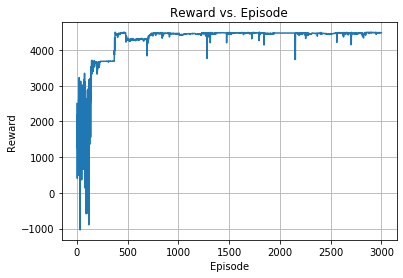

In [14]:
fig, ax = plt.subplots()
ax.plot(epi, Reward)

ax.set(xlabel='Episode', ylabel='Reward',
       title='Reward vs. Episode')
ax.grid()
plt.show()

In [15]:
np.max(Reward)

4495.86556517781